# **Facial Emotion Detection**


---
## **Context**
---

Deep learning has been increasingly applied to tasks involving less structured data types like images, texts, audio, and video in recent years. These endeavors often aim to achieve human-like proficiency in processing such data, leveraging our innate ability to intelligently interact with complex, unstructured information. Within the realm of AI, a field known as Artificial Emotional Intelligence, or Emotion AI, focuses on creating technologies that can understand human emotions by analyzing body language, facial expressions, and voice tones, and respond to them effectively.

Recognizing facial expressions plays a vital role in human-computer interaction. Research indicates that facial expressions and other visual signals account for about 55% of how we convey emotions. Thus, developing a model capable of accurately recognizing facial emotions is a significant stride toward equipping machines with AI that exhibits emotionally intelligent behavior. Systems that can automatically recognize facial expressions have a broad range of potential applications, from understanding human behavior to diagnosing psychological conditions, and improving the interaction quality of virtual assistants in customer service settings.

---

## **Objective**

---

The goal of this project is to use Deep Learning and Artificial Intelligence techniques to create a computer vision model that can accurately detect facial emotions. The model should be able to perform multi-class classification on images of facial expressions, to classify the expressions according to the associated emotion.

---

## **Key Questions**

---

Throughout the project, we will be answering the following questions:

- How accurately can the deep learning model identify and classify different facial emotions (happy, sad, surprise, neutral) from images?
- How well does the model generalize to new, unseen images? Can it maintain high accuracy across the test, train, and validation datasets?
- How does the different model architectures compare in terms of accuracy to classify the different emotions?
- What are the potential applications of the developed model, and what implications might its deployment have in some industry fields?

---

## **Problem Formulation**

---

We are tasked with leveraging Deep Learning techniques to develop a computer vision model capable of accurately detecting and classifying facial emotions. The model needs to distinguish between four specific emotions (happy, sad, surprise, neutral) based on images of facial expressions. This task involves multi-class classification, requiring the model to predict the correct category of emotion for each image it processes.

---

## **About the dataset**

---

The data set consists of 3 folders, i.e., 'test', 'train', and 'validation'.
Each of these folders has four subfolders:

**‘happy’**: Images of people who have happy facial expressions.<br>
**‘sad’**: Images of people with sad or upset facial expressions.<br>
**‘surprise’**: Images of people who have shocked or surprised facial expressions.<br>
**‘neutral’**: Images of people showing no prominent emotion in their facial expression at all.<br>


## **Mounting the Drive**

**NOTE:** Please use Google Colab from your browser for this notebook. **Google.colab is NOT a library that can be downloaded locally on your device.**


In [1]:
# from google.colab import drive
# drive.mount("/content/drive")

## **Importing the Libraries**


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import zipfile
import random
from PIL import Image
from typing import List
from datetime import datetime

# For Data Visualization
import seaborn as sns

# For Model Building
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential, Model  # Sequential API for sequential model
from tensorflow.keras.layers import Dense, Dropout, Flatten  # Importing different layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization, LeakyReLU
from tensorflow.keras import backend
from tensorflow.keras.optimizers import Adam, SGD  # Optimizers for optimizing the model
from tensorflow.keras.callbacks import EarlyStopping  # Regularization method to prevent the overfitting
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.applications import VGG16
from keras.applications import ResNet101
from keras.applications import EfficientNetV2B2

2024-03-21 23:43:38.243618: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-21 23:43:38.243639: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-21 23:43:38.244187: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-21 23:43:38.247395: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-03-21 23:43:38.778895: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### **Let us load and unzip the data**


**Note:**

- You must download the dataset from the link provided on Olympus and upload the same on your Google drive before executing the code in the next cell.
- In case of any error, please make sure that the path of the file is correct as the path may be different for you.


In [3]:
# Storing the path of the data file from the Google drive
# path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/Facial_emotion_images.zip"

# The data is provided as a zip file so we need to extract the files from the zip file
# with zipfile.ZipFile(path, "r") as zip_ref:
#    zip_ref.extractall()

## **Preparing the Data**

The dataset has three folders, i.e., 'train', 'validation' and 'test'. Each of these folders has four sub-folders, namely 'happy', 'neutral', 'sad', and 'surprise'.

We will have the train and test path stored in a variable named 'SUBDIRS', and a base directory 'DATADIR'.

The names of the sub-folders, which will be the classes for our classification task will be stored in an array called 'CATEGORIES'.


In [4]:
DATADIR = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/Facial_emotion_images"
# DATADIR = "/content/Facial_emotion_images"  # Base directory
SUBDIRS = ["train", "validation", "test"]  # Subdirectories
CATEGORIES = ["happy", "neutral", "sad", "surprise"]  # Emotion categories

We are going to check the size of one image, and then check if all the other images have the same size. In case, they are different, we'll resize the ones that are different.


In [5]:
def get_first_image_size(directory, sub_dirs, categories):
    """
    Returns the size of the first image found in the specified directories.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through (e.g., ['train', 'validation', 'test']).
    - categories (list of str): Categories (e.g., ['happy', 'neutral', 'sad', 'surprise']).

    Returns:
    - tuple: Size of the first image found (width, height).
    """
    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    return img.size  # Return the size of the first image found

In [6]:
# Get the size of the first image
expected_size = get_first_image_size(DATADIR, SUBDIRS, CATEGORIES)

print(f"Expected size of the first image: {expected_size}")

Expected size of the first image: (48, 48)


In [7]:
def check_image_sizes(directory, sub_dirs, categories, target_size):
    """
    Checks if all images in the specified directories match the target size.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through.
    - categories (list of str): Categories to search through.
    - target_size (tuple): The expected size of the images (width, height).

    Returns:
    - bool: True if all images match the target size, False otherwise.
    """
    all_match = True  # Flag to keep track of size match

    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    if img.size != target_size:
                        print(f"Image {img_path} has a different size: {img.size}, expected: {target_size}")
                        all_match = False
                        return all_match  # Return early upon first mismatch
    return all_match

In [8]:
# Check if all images match the expected size
all_match = check_image_sizes(DATADIR, SUBDIRS, CATEGORIES, expected_size)
if all_match:
    print("All images match the expected size.")
else:
    print("Not all images match the expected size.")

All images match the expected size.


## **Visualizing our Classes**

Let's look at our classes.

**Write down your observation for each class. What do you think can be a unique feature of each emotion, that separates it from the remaining classes?**


In [9]:
def visualize_emotion_images(directory: str, sub_dirs: List[str], emotion: str, image_count: int = 9) -> None:
    """
    Visualizes a specified number of images from a given emotion class directory across specified subdirectories.

    Parameters:
    - directory (str): The base directory where emotion class folders are located across subdirectories.
    - sub_dirs (List[str]): List of subdirectories ('train', 'validation', 'test') to search through.
    - emotion (str): The specific emotion class to visualize images from.
    - image_count (int): The number of images to display. Defaults to 9.

    Returns:
    - None: This function does not return any value but displays images inline.
    """
    image_paths: List[str] = []  # To store paths of images to be displayed

    # Iterate through the specified subdirectories to collect image paths
    for sub_dir in sub_dirs:
        emotion_dir: str = os.path.join(directory, sub_dir, emotion)
        if os.path.isdir(emotion_dir):
            for img_name in os.listdir(emotion_dir):
                img_path = os.path.join(emotion_dir, img_name)
                image_paths.append(img_path)

    # If there are no images found for the emotion, print a message and return
    if not image_paths:
        print(f"No images found for the specified emotion: {emotion}")
        return

    # Select a random subset of image paths
    selected_image_paths: np.ndarray = np.random.choice(image_paths, min(image_count, len(image_paths)), replace=False)

    # Setup for plotting
    fig = plt.figure(figsize=(4, 4))
    columns: int = 3
    rows: int = image_count // columns + (1 if image_count % columns else 0)

    # Iterate over the selected images and display them
    for i, image_path in enumerate(selected_image_paths, start=1):
        ax = fig.add_subplot(rows, columns, i)
        image = load_img(image_path, target_size=(48, 48))  # Ensure the image is resized to 48x48
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### **Happy**


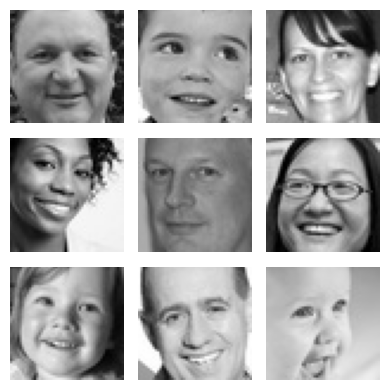

In [10]:
visualize_emotion_images(DATADIR, SUBDIRS, "happy", 9)

**Observations and Insights:**

- The images appear to be in grayscale and vary in terms of lighting, contrast, and clarity.

- The images display a range of happy expressions, from broad smiles showing teeth to subtle smiles without teeth. Also a diversity of subjects in terms of age, gender and also ethnicity.


### **Sad**


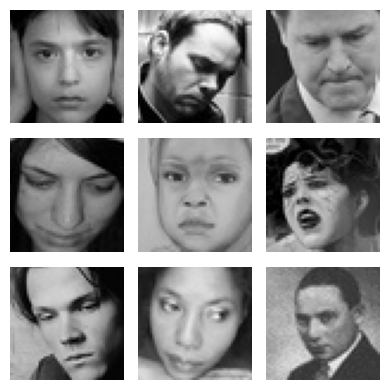

In [11]:
visualize_emotion_images(DATADIR, SUBDIRS, "sad", 9)

**Observations and Insights:**

- The images capture a wide spectrum of sadness, from subtle, somber expressions to more overt manifestations like crying.
- The dataset includes faces with different orientations and features. Some faces are directly looking at the camera, while others are tilted or partially turned away.


### **Neutral**


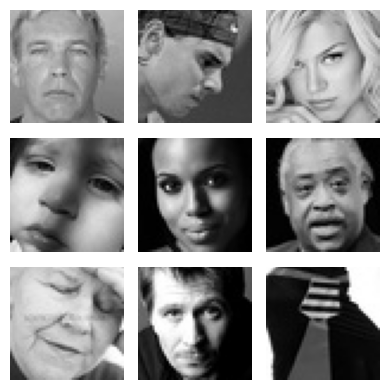

In [12]:
visualize_emotion_images(DATADIR, SUBDIRS, "neutral", 9)

**Observations and Insights:**

- The defining characteristic of these images is the absence of clear, expressive features that denote a specific emotion.
- Some faces may have subtle features that could be misconstrued as expressing a mild emotion.


### **Surprised**


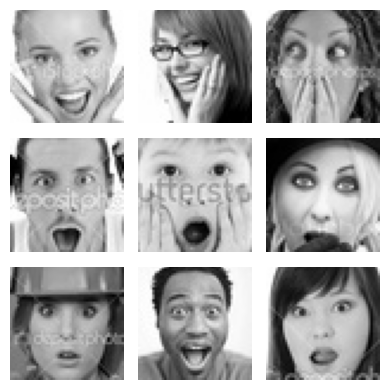

In [13]:
visualize_emotion_images(DATADIR, SUBDIRS, "surprise", 9)

**Observations and Insights:**

- The images showcase a range of intensities of surprise, from wide-eyed and open-mouthed expressions to more subdued, raised-eyebrow looks.
- The subjects vary in age, including both infants and adults.


## **Checking Distribution of Classes**


In [14]:
# Function to count images in each category
def count_images(data_dir, categories):
    counts = []
    for category in categories:
        path = os.path.join(data_dir, category)
        count = len([name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))])
        counts.append(count)
    return counts


SUBDIRS_DICT = {"train": "train", "validation": "validation", "test": "test"}

# Counting images in each dataset
train_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["train"]), CATEGORIES)
validation_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["validation"]), CATEGORIES)
test_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["test"]), CATEGORIES)


# Create DataFrames and format for easier reading
def create_df(counts, categories, dataset_name):
    df = pd.DataFrame({"Class": categories, "Count": counts})
    df["Percentage"] = (df["Count"] / df["Count"].sum()) * 100
    df.set_index("Class", inplace=True)

    # Formatting for easier reading
    df["Count"] = df["Count"].apply(lambda x: f"{x:,}")  # Adds commas to thousands
    df["Percentage"] = df["Percentage"].apply(lambda x: f"{x:.2f}")  # Rounds to two decimals

    print(f"{dataset_name} Data Distribution:")
    print(df)
    total_images = df["Count"].str.replace(",", "").astype(int).sum()
    print(f"Total images in {dataset_name}: {total_images:,}\n")  # Formats total count with commas


create_df(train_counts, CATEGORIES, "Training")
create_df(validation_counts, CATEGORIES, "Validation")
create_df(test_counts, CATEGORIES, "Testing")

Training Data Distribution:
          Count Percentage
Class                     
happy     3,976      26.32
neutral   3,978      26.33
sad       3,982      26.36
surprise  3,173      21.00
Total images in Training: 15,109

Validation Data Distribution:
          Count Percentage
Class                     
happy     1,825      36.67
neutral   1,216      24.43
sad       1,139      22.89
surprise    797      16.01
Total images in Validation: 4,977

Testing Data Distribution:
         Count Percentage
Class                    
happy       32      25.00
neutral     32      25.00
sad         32      25.00
surprise    32      25.00
Total images in Testing: 128



**Observations and Insights:**

- Training Data: The training dataset shows a relatively balanced distribution among the classes of 'happy', 'neutral', and 'sad', each comprising approximately 26% of the dataset. However, 'surprise' is slightly underrepresented, making up 21% of the data. We'll see on the results if this is noticeable.
- Validation Data: In the validation dataset, there's a more pronounced imbalance. 'Happy' expressions dominate at 36.67%, followed by 'neutral' at 24.43%, 'sad' at 22.89%, and 'surprise' at 16.01%. This distribution deviates more significantly from an even split, indicating a potential bias towards 'happy' expressions.
- Testing Data: The testing dataset is perfectly balanced, with each class representing 25% of the data. This uniform distribution is ideal for evaluating the model's performance across all classes evenly.

Regarding the Exploratory Data Analysis, we can use data augmentation to balance the classes. For now, we'll see the results with the given dataset, and if necessary, we can adjust that.


**Think About It:**

- Are the classes equally distributed? If not, do you think the imbalance is too high? Will it be a problem as we progress?
- Are there any Exploratory Data Analysis tasks that we can do here? Would they provide any meaningful insights?


## **Creating our Data Loaders**

In this section, we are creating data loaders that we will use as inputs to our Neural Network.

**You have two options for the color_mode. You can set it to color_mode = 'rgb' or color_mode = 'grayscale'. You will need to try out both and see for yourself which one gives better performance.**


In [15]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"

# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
color_layers = 1
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    horizontal_flip=True,
    brightness_range=(0.0, 2.0),
    shear_range=0.3,
    # rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    # width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    # height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    # shear_range=0.1,  # Small shear transformations for slight perspective changes
    # zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    # horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    # fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Let's look at some examples of a batch of augmented training data.


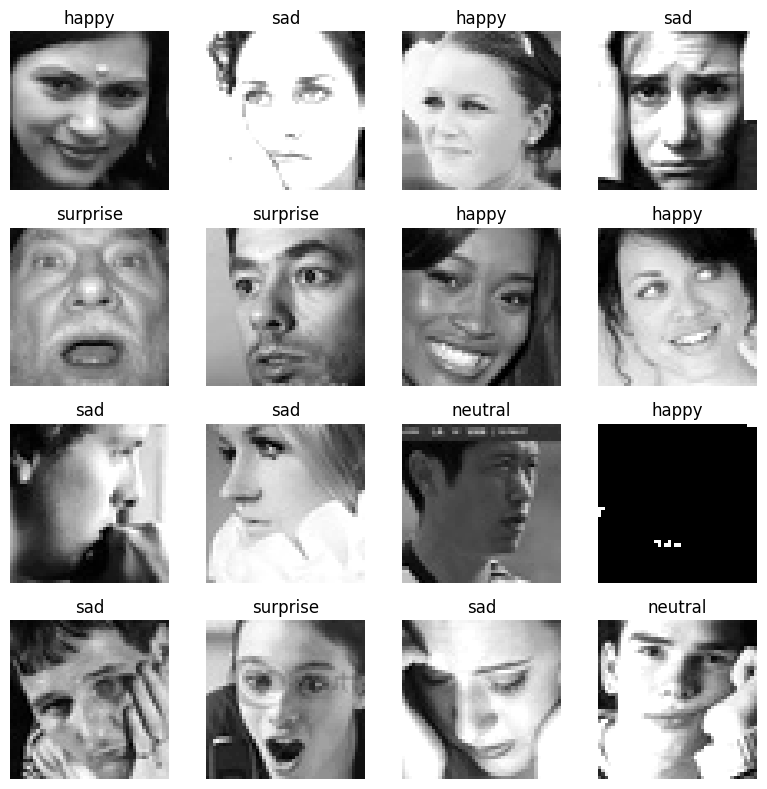

In [16]:
# Fetch a batch of images and labels
images, labels = next(train_generator)

# Assuming the labels are one-hot encoded, we need to convert them back to class indices
labels_indices = labels.argmax(axis=1)

# Mapping of indices to class names, based on the 'class_indices' attribute of the generator
index_to_class = {v: k for k, v in train_generator.class_indices.items()}

fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for image, label_index, ax in zip(images, labels_indices, axes.flatten()):
    ax.imshow(image.squeeze(), cmap="gray")  # Squeeze and cmap for grayscale
    class_name = index_to_class[label_index]
    ax.set_title(class_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

## **Model Building**


**Think About It:**

- Are Convolutional Neural Networks the right approach? Should we have gone with Artificial Neural Networks instead?
- What are the advantages of CNNs over ANNs and are they applicable here?


### **Creating the Base Neural Network**


### **Model 1 Architecture:**

- First CNN Model will have three convolutional blocks.
- Each convolutional block will have a Conv2D layer and a MaxPooling2D Layer.
- First Conv2D layer with **64 filters** and a **kernel size of 3x3**. Using the **'same' padding** and providing the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 3x3** and using **padding = 'same'**.
- Adding a second Conv2D layer with **32 filters** and **a kernel size of 3x3**. Using the **'same' padding** and **'relu activation**.
- Following it up with another MaxPooling2D layer **kernel size 3x3** and using **padding = 'same'**.
- Adding a third Conv2D layer with **32 filters and the kernel size of 3x3**. Using the **'same' padding** and **'relu activation**. Once again, following it up with another Maxpooling2D layer with **kernel size 3x3** and **padding = 'same'**.
- Once the convolutional blocks are added, we add the Flatten layer.
- Finally, we add dense layers.
- Adding first Dense layer with **100 neurons** and **'relu' activation**
- The last dense layer needs to have as many neurons as the number of classes, which in this case is 4 and use **'softmax' activation**.
- As an optimizer we will use SGD optimizer with **learning rate = 0.01** and **momentum = 0.9**


In [17]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [18]:
# Intializing a sequential model
model_1 = Sequential()

model_1.add(Conv2D(64, (2, 2), activation="relu", padding="same", input_shape=(img_width, img_height, color_layers)))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Adding second conv layer with 32 filters
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Add third conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model_1.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model_1.add(Dense(512, activation="relu"))
model_1.add(Dropout(0.4))
model_1.add(Dense(4, activation="softmax"))

# Using SGD Optimizer
opt = Adam(learning_rate=0.001)

2024-03-21 23:43:42.208160: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-21 23:43:42.230160: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-21 23:43:42.230338: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

### **Compiling and Training the Model**


In [19]:
# Compiling the model
model_1.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])

# Generating the summary of the model
model_1.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 64)        320       


 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         


 D)                                                              


 dropout (Dropout)           (None, 24, 24, 64)        0         


 conv2d_1 (Conv2D)           (None, 24, 24, 32)        18464     


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 32)        0         


 g2D)                                                            


 dropout_1 (Dropout)         (None, 12, 12, 32)        0         


 conv2d_2 (Conv2D)           (None, 12, 12, 32)        9248      


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 32)          0         


 g2D)                                                            


 dropout_2 (Dropout)         (None, 6, 6, 32)          0         


 flatten (Flatten)           (None, 1152)              0         


 dense (Dense)               (None, 512)               590336    


 dropout_3 (Dropout)         (None, 512)               0         


 dense_1 (Dense)             (None, 4)                 2052      


Total params: 620420 (2.37 MB)


Trainable params: 620420 (2.37 MB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [20]:
# results_path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/results"
results_path = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results"

In [21]:
class DelayedEarlyStopping(EarlyStopping):
    """Stop training when a monitored metric has stopped improving after a certain number of epochs.

    Arguments:
        monitor: Quantity to be monitored.
        min_delta: Minimum change in the monitored quantity to qualify as an improvement,
                   i.e., an absolute change of less than min_delta will count as no improvement.
        patience: Number of epochs with no improvement after which training will be stopped.
        verbose: Verbosity mode.
        mode: One of `{'auto', 'min', 'max'}`. In `min` mode, training will stop when the
              quantity monitored has stopped decreasing; in `max` mode it will stop when the
              quantity monitored has stopped increasing; in `auto` mode, the direction is
              automatically inferred from the name of the monitored quantity.
        baseline: Baseline value for the monitored quantity. Training will stop if the model
                  doesn't show improvement over the baseline.
        restore_best_weights: Whether to restore model weights from the epoch with the best value
                              of the monitored quantity.
        start_epoch: The epoch on which to start considering early stopping. Before this epoch,
                     early stopping will not be considered. This ensures that early stopping
                     checks only after a certain number of epochs.
    """

    def __init__(
        self,
        monitor="val_loss",
        min_delta=0,
        patience=0,
        verbose=0,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
        start_epoch=30,
    ):
        super(DelayedEarlyStopping, self).__init__(
            monitor=monitor,
            min_delta=min_delta,
            patience=patience,
            verbose=verbose,
            mode=mode,
            baseline=baseline,
            restore_best_weights=restore_best_weights,
        )
        self.start_epoch = start_epoch

    def on_epoch_end(self, epoch, logs=None):
        # Override the original `on_epoch_end` method to include `start_epoch` logic.

        # If the current epoch is less than the start epoch, skip the early stopping check
        if epoch < self.start_epoch:
            return

        # Call the parent class method to perform the regular early stopping checks after the start epoch
        super(DelayedEarlyStopping, self).on_epoch_end(epoch, logs)


# Usage of DelayedEarlyStopping
# Define the EarlyStopping callback with a start epoch
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=10, verbose=1, restore_best_weights=True, start_epoch=30
)

In [22]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)
mc = ModelCheckpoint(
    f"{results_path}/best_model_1_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_1 = model_1.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


2024-03-21 23:43:43.059327: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-03-21 23:43:43.144610: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


2024-03-21 23:43:43.787686: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f7d7cd46d30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-21 23:43:43.787702: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3070, Compute Capability 8.6
2024-03-21 23:43:43.790957: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1711064623.851910   72167 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  1/473 [..............................] - ETA: 17:00 - loss: 1.3870 - accuracy: 0.3125

  6/473 [..............................] - ETA: 5s - loss: 1.4025 - accuracy: 0.2812   

 10/473 [..............................] - ETA: 6s - loss: 1.4015 - accuracy: 0.2688

 15/473 [..............................] - ETA: 5s - loss: 1.3996 - accuracy: 0.2583

 20/473 [>.............................] - ETA: 5s - loss: 1.3980 - accuracy: 0.2500

 25/473 [>.............................] - ETA: 5s - loss: 1.3951 - accuracy: 0.2425

 30/473 [>.............................] - ETA: 5s - loss: 1.3935 - accuracy: 0.2531

 35/473 [=>............................] - ETA: 5s - loss: 1.3937 - accuracy: 0.2518

 40/473 [=>............................] - ETA: 4s - loss: 1.3915 - accuracy: 0.2562

 45/473 [=>............................] - ETA: 4s - loss: 1.3918 - accuracy: 0.2542

 50/473 [==>...........................] - ETA: 4s - loss: 1.3910 - accuracy: 0.2594

 55/473 [==>...........................] - ETA: 4s - loss: 1.3898 - accuracy: 0.2659

 60/473 [==>...........................] - ETA: 4s - loss: 1.3893 - accuracy: 0.2651

 65/473 [===>..........................] - ETA: 4s - loss: 1.3886 - accuracy: 0.2702

 70/473 [===>..........................] - ETA: 4s - loss: 1.3886 - accuracy: 0.2670

 75/473 [===>..........................] - ETA: 4s - loss: 1.3877 - accuracy: 0.2667

 80/473 [====>.........................] - ETA: 4s - loss: 1.3881 - accuracy: 0.2660

 85/473 [====>.........................] - ETA: 4s - loss: 1.3871 - accuracy: 0.2691

 90/473 [====>.........................] - ETA: 4s - loss: 1.3872 - accuracy: 0.2660

 95/473 [=====>........................] - ETA: 4s - loss: 1.3874 - accuracy: 0.2645

100/473 [=====>........................] - ETA: 4s - loss: 1.3874 - accuracy: 0.2631

105/473 [=====>........................] - ETA: 4s - loss: 1.3871 - accuracy: 0.2628

110/473 [=====>........................] - ETA: 3s - loss: 1.3869 - accuracy: 0.2631

115/473 [======>.......................] - ETA: 3s - loss: 1.3864 - accuracy: 0.2639

120/473 [======>.......................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2646

125/473 [======>.......................] - ETA: 3s - loss: 1.3863 - accuracy: 0.2637

130/473 [=======>......................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2644

135/473 [=======>......................] - ETA: 3s - loss: 1.3860 - accuracy: 0.2632

140/473 [=======>......................] - ETA: 3s - loss: 1.3854 - accuracy: 0.2650

145/473 [========>.....................] - ETA: 3s - loss: 1.3846 - accuracy: 0.2692

150/473 [========>.....................] - ETA: 3s - loss: 1.3849 - accuracy: 0.2710

155/473 [========>.....................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2700

160/473 [=========>....................] - ETA: 3s - loss: 1.3843 - accuracy: 0.2707

165/473 [=========>....................] - ETA: 3s - loss: 1.3839 - accuracy: 0.2714

170/473 [=========>....................] - ETA: 3s - loss: 1.3832 - accuracy: 0.2717

175/473 [==========>...................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2711

180/473 [==========>...................] - ETA: 3s - loss: 1.3823 - accuracy: 0.2722

185/473 [==========>...................] - ETA: 3s - loss: 1.3816 - accuracy: 0.2736

190/473 [===========>..................] - ETA: 3s - loss: 1.3809 - accuracy: 0.2737

195/473 [===========>..................] - ETA: 3s - loss: 1.3795 - accuracy: 0.2774

200/473 [===========>..................] - ETA: 2s - loss: 1.3782 - accuracy: 0.2797

205/473 [============>.................] - ETA: 2s - loss: 1.3778 - accuracy: 0.2806

210/473 [============>.................] - ETA: 2s - loss: 1.3770 - accuracy: 0.2826

215/473 [============>.................] - ETA: 2s - loss: 1.3757 - accuracy: 0.2847

220/473 [============>.................] - ETA: 2s - loss: 1.3740 - accuracy: 0.2871

225/473 [=============>................] - ETA: 2s - loss: 1.3720 - accuracy: 0.2906

230/473 [=============>................] - ETA: 2s - loss: 1.3706 - accuracy: 0.2937

235/473 [=============>................] - ETA: 2s - loss: 1.3698 - accuracy: 0.2955

240/473 [==============>...............] - ETA: 2s - loss: 1.3687 - accuracy: 0.2971

245/473 [==============>...............] - ETA: 2s - loss: 1.3681 - accuracy: 0.2978

250/473 [==============>...............] - ETA: 2s - loss: 1.3676 - accuracy: 0.2995

255/473 [===============>..............] - ETA: 2s - loss: 1.3664 - accuracy: 0.3004

260/473 [===============>..............] - ETA: 2s - loss: 1.3641 - accuracy: 0.3019

265/473 [===============>..............] - ETA: 2s - loss: 1.3614 - accuracy: 0.3040

270/473 [================>.............] - ETA: 2s - loss: 1.3608 - accuracy: 0.3052

275/473 [================>.............] - ETA: 2s - loss: 1.3589 - accuracy: 0.3061

280/473 [================>.............] - ETA: 2s - loss: 1.3569 - accuracy: 0.3079

285/473 [=================>............] - ETA: 2s - loss: 1.3562 - accuracy: 0.3098

290/473 [=================>............] - ETA: 1s - loss: 1.3549 - accuracy: 0.3108

295/473 [=================>............] - ETA: 1s - loss: 1.3527 - accuracy: 0.3131

300/473 [==================>...........] - ETA: 1s - loss: 1.3526 - accuracy: 0.3128

305/473 [==================>...........] - ETA: 1s - loss: 1.3525 - accuracy: 0.3136

310/473 [==================>...........] - ETA: 1s - loss: 1.3512 - accuracy: 0.3160

315/473 [==================>...........] - ETA: 1s - loss: 1.3502 - accuracy: 0.3178

320/473 [===================>..........] - ETA: 1s - loss: 1.3496 - accuracy: 0.3191

325/473 [===================>..........] - ETA: 1s - loss: 1.3482 - accuracy: 0.3211

330/473 [===================>..........] - ETA: 1s - loss: 1.3470 - accuracy: 0.3225

335/473 [====================>.........] - ETA: 1s - loss: 1.3455 - accuracy: 0.3229

340/473 [====================>.........] - ETA: 1s - loss: 1.3438 - accuracy: 0.3246

345/473 [====================>.........] - ETA: 1s - loss: 1.3420 - accuracy: 0.3257

350/473 [=====================>........] - ETA: 1s - loss: 1.3421 - accuracy: 0.3263

355/473 [=====================>........] - ETA: 1s - loss: 1.3418 - accuracy: 0.3268

360/473 [=====================>........] - ETA: 1s - loss: 1.3406 - accuracy: 0.3271

365/473 [======================>.......] - ETA: 1s - loss: 1.3396 - accuracy: 0.3283

370/473 [======================>.......] - ETA: 1s - loss: 1.3387 - accuracy: 0.3289

375/473 [======================>.......] - ETA: 1s - loss: 1.3376 - accuracy: 0.3293

376/473 [======================>.......] - ETA: 1s - loss: 1.3375 - accuracy: 0.3294

383/473 [=======================>......] - ETA: 1s - loss: 1.3358 - accuracy: 0.3313

387/473 [=======================>......] - ETA: 0s - loss: 1.3345 - accuracy: 0.3325

392/473 [=======================>......] - ETA: 0s - loss: 1.3342 - accuracy: 0.3327

397/473 [========================>.....] - ETA: 0s - loss: 1.3332 - accuracy: 0.3344

401/473 [========================>.....] - ETA: 0s - loss: 1.3321 - accuracy: 0.3350

406/473 [========================>.....] - ETA: 0s - loss: 1.3301 - accuracy: 0.3365

411/473 [=========================>....] - ETA: 0s - loss: 1.3287 - accuracy: 0.3378

416/473 [=========================>....] - ETA: 0s - loss: 1.3275 - accuracy: 0.3388

421/473 [=========================>....] - ETA: 0s - loss: 1.3261 - accuracy: 0.3403

426/473 [==========================>...] - ETA: 0s - loss: 1.3256 - accuracy: 0.3412

431/473 [==========================>...] - ETA: 0s - loss: 1.3241 - accuracy: 0.3420

436/473 [==========================>...] - ETA: 0s - loss: 1.3233 - accuracy: 0.3438

441/473 [==========================>...] - ETA: 0s - loss: 1.3226 - accuracy: 0.3444

446/473 [===========================>..] - ETA: 0s - loss: 1.3216 - accuracy: 0.3457

451/473 [===========================>..] - ETA: 0s - loss: 1.3200 - accuracy: 0.3478

455/473 [===========================>..] - ETA: 0s - loss: 1.3185 - accuracy: 0.3491

459/473 [============================>.] - ETA: 0s - loss: 1.3185 - accuracy: 0.3496

464/473 [============================>.] - ETA: 0s - loss: 1.3172 - accuracy: 0.3501

469/473 [============================>.] - ETA: 0s - loss: 1.3156 - accuracy: 0.3513

473/473 [==============================] - 8s 12ms/step - loss: 1.3143 - accuracy: 0.3526 - val_loss: 1.1521 - val_accuracy: 0.4375 - lr: 0.0010


Epoch 2/40


  1/473 [..............................] - ETA: 11s - loss: 1.2107 - accuracy: 0.4375

  6/473 [..............................] - ETA: 5s - loss: 1.2347 - accuracy: 0.4271 

 11/473 [..............................] - ETA: 5s - loss: 1.2246 - accuracy: 0.4545

 16/473 [>.............................] - ETA: 5s - loss: 1.2421 - accuracy: 0.4570

 21/473 [>.............................] - ETA: 5s - loss: 1.2417 - accuracy: 0.4568

 26/473 [>.............................] - ETA: 4s - loss: 1.2557 - accuracy: 0.4447

 31/473 [>.............................] - ETA: 4s - loss: 1.2490 - accuracy: 0.4496

 36/473 [=>............................] - ETA: 4s - loss: 1.2445 - accuracy: 0.4479

 41/473 [=>............................] - ETA: 4s - loss: 1.2406 - accuracy: 0.4474

 46/473 [=>............................] - ETA: 4s - loss: 1.2343 - accuracy: 0.4504

 51/473 [==>...........................] - ETA: 4s - loss: 1.2325 - accuracy: 0.4510

 56/473 [==>...........................] - ETA: 4s - loss: 1.2238 - accuracy: 0.4565

 61/473 [==>...........................] - ETA: 4s - loss: 1.2276 - accuracy: 0.4503

 66/473 [===>..........................] - ETA: 4s - loss: 1.2333 - accuracy: 0.4474

 71/473 [===>..........................] - ETA: 4s - loss: 1.2316 - accuracy: 0.4472

 76/473 [===>..........................] - ETA: 4s - loss: 1.2284 - accuracy: 0.4527

 81/473 [====>.........................] - ETA: 4s - loss: 1.2246 - accuracy: 0.4541

 86/473 [====>.........................] - ETA: 4s - loss: 1.2254 - accuracy: 0.4531

 91/473 [====>.........................] - ETA: 4s - loss: 1.2212 - accuracy: 0.4540

 96/473 [=====>........................] - ETA: 4s - loss: 1.2155 - accuracy: 0.4531

101/473 [=====>........................] - ETA: 4s - loss: 1.2161 - accuracy: 0.4514

106/473 [=====>........................] - ETA: 3s - loss: 1.2147 - accuracy: 0.4522

111/473 [======>.......................] - ETA: 3s - loss: 1.2186 - accuracy: 0.4482

116/473 [======>.......................] - ETA: 3s - loss: 1.2190 - accuracy: 0.4472

121/473 [======>.......................] - ETA: 3s - loss: 1.2179 - accuracy: 0.4486

126/473 [======>.......................] - ETA: 3s - loss: 1.2156 - accuracy: 0.4489

131/473 [=======>......................] - ETA: 3s - loss: 1.2102 - accuracy: 0.4516

136/473 [=======>......................] - ETA: 3s - loss: 1.2106 - accuracy: 0.4517

141/473 [=======>......................] - ETA: 3s - loss: 1.2091 - accuracy: 0.4528

146/473 [========>.....................] - ETA: 3s - loss: 1.2081 - accuracy: 0.4536

151/473 [========>.....................] - ETA: 3s - loss: 1.2059 - accuracy: 0.4549

155/473 [========>.....................] - ETA: 3s - loss: 1.2024 - accuracy: 0.4565

160/473 [=========>....................] - ETA: 3s - loss: 1.2002 - accuracy: 0.4568

165/473 [=========>....................] - ETA: 3s - loss: 1.2000 - accuracy: 0.4564

169/473 [=========>....................] - ETA: 3s - loss: 1.1990 - accuracy: 0.4577

172/473 [=========>....................] - ETA: 3s - loss: 1.1980 - accuracy: 0.4578

177/473 [==========>...................] - ETA: 3s - loss: 1.1982 - accuracy: 0.4585

182/473 [==========>...................] - ETA: 3s - loss: 1.1976 - accuracy: 0.4596

187/473 [==========>...................] - ETA: 3s - loss: 1.1961 - accuracy: 0.4589

192/473 [===========>..................] - ETA: 3s - loss: 1.1950 - accuracy: 0.4606

197/473 [===========>..................] - ETA: 3s - loss: 1.1947 - accuracy: 0.4613

202/473 [===========>..................] - ETA: 3s - loss: 1.1944 - accuracy: 0.4618

207/473 [============>.................] - ETA: 2s - loss: 1.1947 - accuracy: 0.4612

212/473 [============>.................] - ETA: 2s - loss: 1.1943 - accuracy: 0.4614

217/473 [============>.................] - ETA: 2s - loss: 1.1929 - accuracy: 0.4614

222/473 [=============>................] - ETA: 2s - loss: 1.1923 - accuracy: 0.4626

227/473 [=============>................] - ETA: 2s - loss: 1.1897 - accuracy: 0.4646

232/473 [=============>................] - ETA: 2s - loss: 1.1895 - accuracy: 0.4643

237/473 [==============>...............] - ETA: 2s - loss: 1.1898 - accuracy: 0.4648

242/473 [==============>...............] - ETA: 2s - loss: 1.1901 - accuracy: 0.4637

247/473 [==============>...............] - ETA: 2s - loss: 1.1903 - accuracy: 0.4642

252/473 [==============>...............] - ETA: 2s - loss: 1.1903 - accuracy: 0.4649

257/473 [===============>..............] - ETA: 2s - loss: 1.1885 - accuracy: 0.4664

262/473 [===============>..............] - ETA: 2s - loss: 1.1876 - accuracy: 0.4667

268/473 [===============>..............] - ETA: 2s - loss: 1.1872 - accuracy: 0.4671

273/473 [================>.............] - ETA: 2s - loss: 1.1870 - accuracy: 0.4670

278/473 [================>.............] - ETA: 2s - loss: 1.1871 - accuracy: 0.4670

283/473 [================>.............] - ETA: 2s - loss: 1.1869 - accuracy: 0.4673

288/473 [=================>............] - ETA: 2s - loss: 1.1876 - accuracy: 0.4662

293/473 [=================>............] - ETA: 1s - loss: 1.1872 - accuracy: 0.4666

298/473 [=================>............] - ETA: 1s - loss: 1.1858 - accuracy: 0.4676

303/473 [==================>...........] - ETA: 1s - loss: 1.1853 - accuracy: 0.4678

308/473 [==================>...........] - ETA: 1s - loss: 1.1838 - accuracy: 0.4687

313/473 [==================>...........] - ETA: 1s - loss: 1.1839 - accuracy: 0.4699

318/473 [===================>..........] - ETA: 1s - loss: 1.1833 - accuracy: 0.4708

323/473 [===================>..........] - ETA: 1s - loss: 1.1820 - accuracy: 0.4718

328/473 [===================>..........] - ETA: 1s - loss: 1.1815 - accuracy: 0.4723

333/473 [====================>.........] - ETA: 1s - loss: 1.1815 - accuracy: 0.4725

338/473 [====================>.........] - ETA: 1s - loss: 1.1815 - accuracy: 0.4731

343/473 [====================>.........] - ETA: 1s - loss: 1.1817 - accuracy: 0.4729

348/473 [=====================>........] - ETA: 1s - loss: 1.1800 - accuracy: 0.4734

353/473 [=====================>........] - ETA: 1s - loss: 1.1794 - accuracy: 0.4740

358/473 [=====================>........] - ETA: 1s - loss: 1.1770 - accuracy: 0.4756

363/473 [======================>.......] - ETA: 1s - loss: 1.1757 - accuracy: 0.4763

368/473 [======================>.......] - ETA: 1s - loss: 1.1755 - accuracy: 0.4766

373/473 [======================>.......] - ETA: 1s - loss: 1.1756 - accuracy: 0.4763

378/473 [======================>.......] - ETA: 1s - loss: 1.1763 - accuracy: 0.4762

383/473 [=======================>......] - ETA: 0s - loss: 1.1756 - accuracy: 0.4771

388/473 [=======================>......] - ETA: 0s - loss: 1.1741 - accuracy: 0.4776

393/473 [=======================>......] - ETA: 0s - loss: 1.1746 - accuracy: 0.4772

398/473 [========================>.....] - ETA: 0s - loss: 1.1733 - accuracy: 0.4779

403/473 [========================>.....] - ETA: 0s - loss: 1.1717 - accuracy: 0.4784

407/473 [========================>.....] - ETA: 0s - loss: 1.1696 - accuracy: 0.4793

412/473 [=========================>....] - ETA: 0s - loss: 1.1689 - accuracy: 0.4797

417/473 [=========================>....] - ETA: 0s - loss: 1.1687 - accuracy: 0.4804

422/473 [=========================>....] - ETA: 0s - loss: 1.1682 - accuracy: 0.4803

427/473 [==========================>...] - ETA: 0s - loss: 1.1673 - accuracy: 0.4810

432/473 [==========================>...] - ETA: 0s - loss: 1.1671 - accuracy: 0.4814

437/473 [==========================>...] - ETA: 0s - loss: 1.1672 - accuracy: 0.4813

442/473 [===========================>..] - ETA: 0s - loss: 1.1672 - accuracy: 0.4812

447/473 [===========================>..] - ETA: 0s - loss: 1.1675 - accuracy: 0.4809

452/473 [===========================>..] - ETA: 0s - loss: 1.1673 - accuracy: 0.4813

457/473 [===========================>..] - ETA: 0s - loss: 1.1674 - accuracy: 0.4809

462/473 [============================>.] - ETA: 0s - loss: 1.1664 - accuracy: 0.4811

467/473 [============================>.] - ETA: 0s - loss: 1.1652 - accuracy: 0.4821

472/473 [============================>.] - ETA: 0s - loss: 1.1650 - accuracy: 0.4823

473/473 [==============================] - 5s 11ms/step - loss: 1.1646 - accuracy: 0.4826 - val_loss: 1.0578 - val_accuracy: 0.5312 - lr: 0.0010


Epoch 3/40


  1/473 [..............................] - ETA: 8s - loss: 1.0921 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 1.1288 - accuracy: 0.5573

 11/473 [..............................] - ETA: 4s - loss: 1.1177 - accuracy: 0.5312

 16/473 [>.............................] - ETA: 4s - loss: 1.0868 - accuracy: 0.5215

 21/473 [>.............................] - ETA: 4s - loss: 1.0951 - accuracy: 0.5164

 26/473 [>.............................] - ETA: 4s - loss: 1.0999 - accuracy: 0.5192

 31/473 [>.............................] - ETA: 4s - loss: 1.1031 - accuracy: 0.5121

 36/473 [=>............................] - ETA: 4s - loss: 1.0936 - accuracy: 0.5130

 41/473 [=>............................] - ETA: 4s - loss: 1.0940 - accuracy: 0.5206

 46/473 [=>............................] - ETA: 4s - loss: 1.0993 - accuracy: 0.5136

 51/473 [==>...........................] - ETA: 4s - loss: 1.1001 - accuracy: 0.5098

 56/473 [==>...........................] - ETA: 4s - loss: 1.0997 - accuracy: 0.5078

 61/473 [==>...........................] - ETA: 4s - loss: 1.1009 - accuracy: 0.5051

 66/473 [===>..........................] - ETA: 4s - loss: 1.1022 - accuracy: 0.5005

 71/473 [===>..........................] - ETA: 4s - loss: 1.1032 - accuracy: 0.5004

 76/473 [===>..........................] - ETA: 4s - loss: 1.0982 - accuracy: 0.5021

 81/473 [====>.........................] - ETA: 4s - loss: 1.0926 - accuracy: 0.5069

 86/473 [====>.........................] - ETA: 4s - loss: 1.0924 - accuracy: 0.5076

 91/473 [====>.........................] - ETA: 4s - loss: 1.0920 - accuracy: 0.5062

 96/473 [=====>........................] - ETA: 4s - loss: 1.0930 - accuracy: 0.5062

101/473 [=====>........................] - ETA: 4s - loss: 1.0879 - accuracy: 0.5090

106/473 [=====>........................] - ETA: 4s - loss: 1.0884 - accuracy: 0.5071

111/473 [======>.......................] - ETA: 3s - loss: 1.0862 - accuracy: 0.5084

116/473 [======>.......................] - ETA: 3s - loss: 1.0864 - accuracy: 0.5097

121/473 [======>.......................] - ETA: 3s - loss: 1.0863 - accuracy: 0.5088

126/473 [======>.......................] - ETA: 3s - loss: 1.0888 - accuracy: 0.5089

131/473 [=======>......................] - ETA: 3s - loss: 1.0900 - accuracy: 0.5095

136/473 [=======>......................] - ETA: 3s - loss: 1.0880 - accuracy: 0.5124

141/473 [=======>......................] - ETA: 3s - loss: 1.0867 - accuracy: 0.5144

146/473 [========>.....................] - ETA: 3s - loss: 1.0861 - accuracy: 0.5143

151/473 [========>.....................] - ETA: 3s - loss: 1.0908 - accuracy: 0.5126

156/473 [========>.....................] - ETA: 3s - loss: 1.0945 - accuracy: 0.5116

161/473 [=========>....................] - ETA: 3s - loss: 1.0959 - accuracy: 0.5120

166/473 [=========>....................] - ETA: 3s - loss: 1.0957 - accuracy: 0.5119

171/473 [=========>....................] - ETA: 3s - loss: 1.0971 - accuracy: 0.5110

176/473 [==========>...................] - ETA: 3s - loss: 1.0988 - accuracy: 0.5117

181/473 [==========>...................] - ETA: 3s - loss: 1.0985 - accuracy: 0.5123

186/473 [==========>...................] - ETA: 3s - loss: 1.0985 - accuracy: 0.5114

191/473 [===========>..................] - ETA: 3s - loss: 1.0990 - accuracy: 0.5118

196/473 [===========>..................] - ETA: 3s - loss: 1.0978 - accuracy: 0.5129

201/473 [===========>..................] - ETA: 2s - loss: 1.0976 - accuracy: 0.5124

206/473 [============>.................] - ETA: 2s - loss: 1.0985 - accuracy: 0.5115

211/473 [============>.................] - ETA: 2s - loss: 1.0979 - accuracy: 0.5120

216/473 [============>.................] - ETA: 2s - loss: 1.0969 - accuracy: 0.5135

221/473 [=============>................] - ETA: 2s - loss: 1.0985 - accuracy: 0.5129

226/473 [=============>................] - ETA: 2s - loss: 1.0983 - accuracy: 0.5137

231/473 [=============>................] - ETA: 2s - loss: 1.0980 - accuracy: 0.5133

236/473 [=============>................] - ETA: 2s - loss: 1.0986 - accuracy: 0.5128

241/473 [==============>...............] - ETA: 2s - loss: 1.0983 - accuracy: 0.5136

246/473 [==============>...............] - ETA: 2s - loss: 1.0981 - accuracy: 0.5136

251/473 [==============>...............] - ETA: 2s - loss: 1.0962 - accuracy: 0.5138

256/473 [===============>..............] - ETA: 2s - loss: 1.0990 - accuracy: 0.5125

261/473 [===============>..............] - ETA: 2s - loss: 1.0986 - accuracy: 0.5135

266/473 [===============>..............] - ETA: 2s - loss: 1.0964 - accuracy: 0.5145

271/473 [================>.............] - ETA: 2s - loss: 1.0963 - accuracy: 0.5137

276/473 [================>.............] - ETA: 2s - loss: 1.0969 - accuracy: 0.5134

281/473 [================>.............] - ETA: 2s - loss: 1.0966 - accuracy: 0.5137

286/473 [=================>............] - ETA: 2s - loss: 1.0973 - accuracy: 0.5140

291/473 [=================>............] - ETA: 1s - loss: 1.0989 - accuracy: 0.5126

296/473 [=================>............] - ETA: 1s - loss: 1.0995 - accuracy: 0.5120

301/473 [==================>...........] - ETA: 1s - loss: 1.0992 - accuracy: 0.5128

306/473 [==================>...........] - ETA: 1s - loss: 1.0986 - accuracy: 0.5129

311/473 [==================>...........] - ETA: 1s - loss: 1.0986 - accuracy: 0.5130

316/473 [===================>..........] - ETA: 1s - loss: 1.0983 - accuracy: 0.5133

321/473 [===================>..........] - ETA: 1s - loss: 1.0986 - accuracy: 0.5130

326/473 [===================>..........] - ETA: 1s - loss: 1.0977 - accuracy: 0.5127

331/473 [===================>..........] - ETA: 1s - loss: 1.0960 - accuracy: 0.5142

336/473 [====================>.........] - ETA: 1s - loss: 1.0956 - accuracy: 0.5145

341/473 [====================>.........] - ETA: 1s - loss: 1.0959 - accuracy: 0.5146

346/473 [====================>.........] - ETA: 1s - loss: 1.0954 - accuracy: 0.5147

351/473 [=====================>........] - ETA: 1s - loss: 1.0939 - accuracy: 0.5151

356/473 [=====================>........] - ETA: 1s - loss: 1.0940 - accuracy: 0.5149

361/473 [=====================>........] - ETA: 1s - loss: 1.0927 - accuracy: 0.5158

366/473 [======================>.......] - ETA: 1s - loss: 1.0937 - accuracy: 0.5149

371/473 [======================>.......] - ETA: 1s - loss: 1.0932 - accuracy: 0.5151

376/473 [======================>.......] - ETA: 1s - loss: 1.0931 - accuracy: 0.5151

381/473 [=======================>......] - ETA: 1s - loss: 1.0924 - accuracy: 0.5153

386/473 [=======================>......] - ETA: 0s - loss: 1.0921 - accuracy: 0.5154

391/473 [=======================>......] - ETA: 0s - loss: 1.0901 - accuracy: 0.5164

396/473 [========================>.....] - ETA: 0s - loss: 1.0903 - accuracy: 0.5167

401/473 [========================>.....] - ETA: 0s - loss: 1.0915 - accuracy: 0.5163

406/473 [========================>.....] - ETA: 0s - loss: 1.0907 - accuracy: 0.5168

411/473 [=========================>....] - ETA: 0s - loss: 1.0914 - accuracy: 0.5165

416/473 [=========================>....] - ETA: 0s - loss: 1.0915 - accuracy: 0.5168

421/473 [=========================>....] - ETA: 0s - loss: 1.0915 - accuracy: 0.5167

426/473 [==========================>...] - ETA: 0s - loss: 1.0909 - accuracy: 0.5174

431/473 [==========================>...] - ETA: 0s - loss: 1.0919 - accuracy: 0.5171

436/473 [==========================>...] - ETA: 0s - loss: 1.0915 - accuracy: 0.5173

441/473 [==========================>...] - ETA: 0s - loss: 1.0905 - accuracy: 0.5180

446/473 [===========================>..] - ETA: 0s - loss: 1.0907 - accuracy: 0.5181

451/473 [===========================>..] - ETA: 0s - loss: 1.0897 - accuracy: 0.5192

456/473 [===========================>..] - ETA: 0s - loss: 1.0892 - accuracy: 0.5193

461/473 [============================>.] - ETA: 0s - loss: 1.0888 - accuracy: 0.5195

466/473 [============================>.] - ETA: 0s - loss: 1.0879 - accuracy: 0.5199

472/473 [============================>.] - ETA: 0s - loss: 1.0876 - accuracy: 0.5207

473/473 [==============================] - 5s 11ms/step - loss: 1.0874 - accuracy: 0.5207 - val_loss: 1.0773 - val_accuracy: 0.5312 - lr: 0.0010


Epoch 4/40


  1/473 [..............................] - ETA: 9s - loss: 1.3002 - accuracy: 0.4062

  6/473 [..............................] - ETA: 5s - loss: 1.0929 - accuracy: 0.5104

 11/473 [..............................] - ETA: 5s - loss: 1.0797 - accuracy: 0.5170

 16/473 [>.............................] - ETA: 5s - loss: 1.0579 - accuracy: 0.5273

 21/473 [>.............................] - ETA: 5s - loss: 1.0815 - accuracy: 0.5312

 26/473 [>.............................] - ETA: 4s - loss: 1.0775 - accuracy: 0.5397

 31/473 [>.............................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5464

 36/473 [=>............................] - ETA: 4s - loss: 1.0618 - accuracy: 0.5495

 41/473 [=>............................] - ETA: 4s - loss: 1.0655 - accuracy: 0.5480

 46/473 [=>............................] - ETA: 4s - loss: 1.0730 - accuracy: 0.5408

 51/473 [==>...........................] - ETA: 4s - loss: 1.0677 - accuracy: 0.5429

 56/473 [==>...........................] - ETA: 4s - loss: 1.0710 - accuracy: 0.5391

 61/473 [==>...........................] - ETA: 4s - loss: 1.0750 - accuracy: 0.5359

 66/473 [===>..........................] - ETA: 4s - loss: 1.0736 - accuracy: 0.5369

 71/473 [===>..........................] - ETA: 4s - loss: 1.0740 - accuracy: 0.5383

 76/473 [===>..........................] - ETA: 4s - loss: 1.0716 - accuracy: 0.5382

 81/473 [====>.........................] - ETA: 4s - loss: 1.0742 - accuracy: 0.5355

 86/473 [====>.........................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5345

 91/473 [====>.........................] - ETA: 4s - loss: 1.0662 - accuracy: 0.5364

 96/473 [=====>........................] - ETA: 4s - loss: 1.0690 - accuracy: 0.5346

101/473 [=====>........................] - ETA: 4s - loss: 1.0700 - accuracy: 0.5351

106/473 [=====>........................] - ETA: 4s - loss: 1.0728 - accuracy: 0.5334

111/473 [======>.......................] - ETA: 3s - loss: 1.0739 - accuracy: 0.5313

116/473 [======>.......................] - ETA: 3s - loss: 1.0700 - accuracy: 0.5319

121/473 [======>.......................] - ETA: 3s - loss: 1.0681 - accuracy: 0.5332

126/473 [======>.......................] - ETA: 3s - loss: 1.0706 - accuracy: 0.5331

131/473 [=======>......................] - ETA: 3s - loss: 1.0697 - accuracy: 0.5342

136/473 [=======>......................] - ETA: 3s - loss: 1.0679 - accuracy: 0.5343

141/473 [=======>......................] - ETA: 3s - loss: 1.0689 - accuracy: 0.5340

146/473 [========>.....................] - ETA: 3s - loss: 1.0662 - accuracy: 0.5346

151/473 [========>.....................] - ETA: 3s - loss: 1.0672 - accuracy: 0.5340

156/473 [========>.....................] - ETA: 3s - loss: 1.0651 - accuracy: 0.5358

161/473 [=========>....................] - ETA: 3s - loss: 1.0645 - accuracy: 0.5350

166/473 [=========>....................] - ETA: 3s - loss: 1.0637 - accuracy: 0.5351

171/473 [=========>....................] - ETA: 3s - loss: 1.0617 - accuracy: 0.5361

176/473 [==========>...................] - ETA: 3s - loss: 1.0593 - accuracy: 0.5372

181/473 [==========>...................] - ETA: 3s - loss: 1.0547 - accuracy: 0.5395

186/473 [==========>...................] - ETA: 3s - loss: 1.0524 - accuracy: 0.5403

191/473 [===========>..................] - ETA: 3s - loss: 1.0573 - accuracy: 0.5379

196/473 [===========>..................] - ETA: 3s - loss: 1.0574 - accuracy: 0.5372

199/473 [===========>..................] - ETA: 3s - loss: 1.0579 - accuracy: 0.5365

204/473 [===========>..................] - ETA: 3s - loss: 1.0589 - accuracy: 0.5364

209/473 [============>.................] - ETA: 2s - loss: 1.0589 - accuracy: 0.5372

214/473 [============>.................] - ETA: 2s - loss: 1.0581 - accuracy: 0.5376

219/473 [============>.................] - ETA: 2s - loss: 1.0597 - accuracy: 0.5375

224/473 [=============>................] - ETA: 2s - loss: 1.0589 - accuracy: 0.5370

229/473 [=============>................] - ETA: 2s - loss: 1.0586 - accuracy: 0.5365

234/473 [=============>................] - ETA: 2s - loss: 1.0582 - accuracy: 0.5371

239/473 [==============>...............] - ETA: 2s - loss: 1.0562 - accuracy: 0.5382

244/473 [==============>...............] - ETA: 2s - loss: 1.0558 - accuracy: 0.5389

249/473 [==============>...............] - ETA: 2s - loss: 1.0558 - accuracy: 0.5390

254/473 [===============>..............] - ETA: 2s - loss: 1.0559 - accuracy: 0.5391

259/473 [===============>..............] - ETA: 2s - loss: 1.0548 - accuracy: 0.5400

264/473 [===============>..............] - ETA: 2s - loss: 1.0544 - accuracy: 0.5400

269/473 [================>.............] - ETA: 2s - loss: 1.0541 - accuracy: 0.5394

274/473 [================>.............] - ETA: 2s - loss: 1.0537 - accuracy: 0.5384

279/473 [================>.............] - ETA: 2s - loss: 1.0537 - accuracy: 0.5379

284/473 [=================>............] - ETA: 2s - loss: 1.0537 - accuracy: 0.5389

289/473 [=================>............] - ETA: 2s - loss: 1.0536 - accuracy: 0.5392

294/473 [=================>............] - ETA: 1s - loss: 1.0528 - accuracy: 0.5396

299/473 [=================>............] - ETA: 1s - loss: 1.0506 - accuracy: 0.5411

304/473 [==================>...........] - ETA: 1s - loss: 1.0511 - accuracy: 0.5409

309/473 [==================>...........] - ETA: 1s - loss: 1.0514 - accuracy: 0.5409

314/473 [==================>...........] - ETA: 1s - loss: 1.0515 - accuracy: 0.5416

319/473 [===================>..........] - ETA: 1s - loss: 1.0515 - accuracy: 0.5421

324/473 [===================>..........] - ETA: 1s - loss: 1.0516 - accuracy: 0.5418

329/473 [===================>..........] - ETA: 1s - loss: 1.0527 - accuracy: 0.5414

334/473 [====================>.........] - ETA: 1s - loss: 1.0517 - accuracy: 0.5420

339/473 [====================>.........] - ETA: 1s - loss: 1.0521 - accuracy: 0.5416

344/473 [====================>.........] - ETA: 1s - loss: 1.0518 - accuracy: 0.5416

349/473 [=====================>........] - ETA: 1s - loss: 1.0500 - accuracy: 0.5426

354/473 [=====================>........] - ETA: 1s - loss: 1.0489 - accuracy: 0.5429

359/473 [=====================>........] - ETA: 1s - loss: 1.0479 - accuracy: 0.5431

364/473 [======================>.......] - ETA: 1s - loss: 1.0480 - accuracy: 0.5435

369/473 [======================>.......] - ETA: 1s - loss: 1.0490 - accuracy: 0.5429

374/473 [======================>.......] - ETA: 1s - loss: 1.0487 - accuracy: 0.5430

379/473 [=======================>......] - ETA: 1s - loss: 1.0472 - accuracy: 0.5440

384/473 [=======================>......] - ETA: 0s - loss: 1.0475 - accuracy: 0.5437

389/473 [=======================>......] - ETA: 0s - loss: 1.0467 - accuracy: 0.5441

394/473 [=======================>......] - ETA: 0s - loss: 1.0467 - accuracy: 0.5438

399/473 [========================>.....] - ETA: 0s - loss: 1.0456 - accuracy: 0.5443

404/473 [========================>.....] - ETA: 0s - loss: 1.0469 - accuracy: 0.5436

409/473 [========================>.....] - ETA: 0s - loss: 1.0464 - accuracy: 0.5441

414/473 [=========================>....] - ETA: 0s - loss: 1.0450 - accuracy: 0.5450

419/473 [=========================>....] - ETA: 0s - loss: 1.0454 - accuracy: 0.5447

424/473 [=========================>....] - ETA: 0s - loss: 1.0447 - accuracy: 0.5449

429/473 [==========================>...] - ETA: 0s - loss: 1.0444 - accuracy: 0.5449

434/473 [==========================>...] - ETA: 0s - loss: 1.0453 - accuracy: 0.5449

439/473 [==========================>...] - ETA: 0s - loss: 1.0441 - accuracy: 0.5446

444/473 [===========================>..] - ETA: 0s - loss: 1.0430 - accuracy: 0.5448

449/473 [===========================>..] - ETA: 0s - loss: 1.0411 - accuracy: 0.5456

454/473 [===========================>..] - ETA: 0s - loss: 1.0415 - accuracy: 0.5452

459/473 [============================>.] - ETA: 0s - loss: 1.0419 - accuracy: 0.5454

464/473 [============================>.] - ETA: 0s - loss: 1.0403 - accuracy: 0.5469

469/473 [============================>.] - ETA: 0s - loss: 1.0402 - accuracy: 0.5468

473/473 [==============================] - 5s 11ms/step - loss: 1.0396 - accuracy: 0.5473 - val_loss: 1.0237 - val_accuracy: 0.5312 - lr: 0.0010


Epoch 5/40


  1/473 [..............................] - ETA: 8s - loss: 1.0081 - accuracy: 0.5625

  5/473 [..............................] - ETA: 6s - loss: 1.0090 - accuracy: 0.5375

  9/473 [..............................] - ETA: 6s - loss: 1.0273 - accuracy: 0.5625

 14/473 [..............................] - ETA: 5s - loss: 1.0368 - accuracy: 0.5469

 19/473 [>.............................] - ETA: 5s - loss: 1.0309 - accuracy: 0.5510

 24/473 [>.............................] - ETA: 5s - loss: 1.0302 - accuracy: 0.5625

 29/473 [>.............................] - ETA: 5s - loss: 1.0159 - accuracy: 0.5647

 34/473 [=>............................] - ETA: 5s - loss: 1.0136 - accuracy: 0.5699

 39/473 [=>............................] - ETA: 4s - loss: 1.0184 - accuracy: 0.5641

 44/473 [=>............................] - ETA: 4s - loss: 1.0167 - accuracy: 0.5618

 49/473 [==>...........................] - ETA: 4s - loss: 1.0199 - accuracy: 0.5625

 54/473 [==>...........................] - ETA: 4s - loss: 1.0234 - accuracy: 0.5637

 59/473 [==>...........................] - ETA: 4s - loss: 1.0211 - accuracy: 0.5641

 64/473 [===>..........................] - ETA: 4s - loss: 1.0279 - accuracy: 0.5615

 69/473 [===>..........................] - ETA: 4s - loss: 1.0223 - accuracy: 0.5634

 74/473 [===>..........................] - ETA: 4s - loss: 1.0246 - accuracy: 0.5642

 79/473 [====>.........................] - ETA: 4s - loss: 1.0299 - accuracy: 0.5613

 84/473 [====>.........................] - ETA: 4s - loss: 1.0290 - accuracy: 0.5595

 89/473 [====>.........................] - ETA: 4s - loss: 1.0276 - accuracy: 0.5600

 94/473 [====>.........................] - ETA: 4s - loss: 1.0259 - accuracy: 0.5608

 99/473 [=====>........................] - ETA: 4s - loss: 1.0244 - accuracy: 0.5612

104/473 [=====>........................] - ETA: 4s - loss: 1.0228 - accuracy: 0.5610

109/473 [=====>........................] - ETA: 4s - loss: 1.0245 - accuracy: 0.5588

114/473 [======>.......................] - ETA: 3s - loss: 1.0217 - accuracy: 0.5578

119/473 [======>.......................] - ETA: 3s - loss: 1.0231 - accuracy: 0.5565

124/473 [======>.......................] - ETA: 3s - loss: 1.0177 - accuracy: 0.5585

129/473 [=======>......................] - ETA: 3s - loss: 1.0193 - accuracy: 0.5577

134/473 [=======>......................] - ETA: 3s - loss: 1.0174 - accuracy: 0.5567

139/473 [=======>......................] - ETA: 3s - loss: 1.0154 - accuracy: 0.5585

144/473 [========>.....................] - ETA: 3s - loss: 1.0164 - accuracy: 0.5584

149/473 [========>.....................] - ETA: 3s - loss: 1.0191 - accuracy: 0.5573

154/473 [========>.....................] - ETA: 3s - loss: 1.0176 - accuracy: 0.5593

159/473 [=========>....................] - ETA: 3s - loss: 1.0184 - accuracy: 0.5594

164/473 [=========>....................] - ETA: 3s - loss: 1.0198 - accuracy: 0.5591

169/473 [=========>....................] - ETA: 3s - loss: 1.0203 - accuracy: 0.5588

174/473 [==========>...................] - ETA: 3s - loss: 1.0200 - accuracy: 0.5594

179/473 [==========>...................] - ETA: 3s - loss: 1.0201 - accuracy: 0.5592

184/473 [==========>...................] - ETA: 3s - loss: 1.0185 - accuracy: 0.5598

189/473 [==========>...................] - ETA: 3s - loss: 1.0155 - accuracy: 0.5622

194/473 [===========>..................] - ETA: 3s - loss: 1.0148 - accuracy: 0.5639

199/473 [===========>..................] - ETA: 2s - loss: 1.0133 - accuracy: 0.5642

204/473 [===========>..................] - ETA: 2s - loss: 1.0154 - accuracy: 0.5630

209/473 [============>.................] - ETA: 2s - loss: 1.0150 - accuracy: 0.5622

214/473 [============>.................] - ETA: 2s - loss: 1.0150 - accuracy: 0.5612

219/473 [============>.................] - ETA: 2s - loss: 1.0149 - accuracy: 0.5609

224/473 [=============>................] - ETA: 2s - loss: 1.0143 - accuracy: 0.5608

229/473 [=============>................] - ETA: 2s - loss: 1.0135 - accuracy: 0.5610

234/473 [=============>................] - ETA: 2s - loss: 1.0127 - accuracy: 0.5613

239/473 [==============>...............] - ETA: 2s - loss: 1.0128 - accuracy: 0.5621

243/473 [==============>...............] - ETA: 2s - loss: 1.0120 - accuracy: 0.5625

247/473 [==============>...............] - ETA: 2s - loss: 1.0139 - accuracy: 0.5621

251/473 [==============>...............] - ETA: 2s - loss: 1.0149 - accuracy: 0.5618

254/473 [===============>..............] - ETA: 2s - loss: 1.0149 - accuracy: 0.5620

259/473 [===============>..............] - ETA: 2s - loss: 1.0132 - accuracy: 0.5630

264/473 [===============>..............] - ETA: 2s - loss: 1.0134 - accuracy: 0.5645

269/473 [================>.............] - ETA: 2s - loss: 1.0127 - accuracy: 0.5644

274/473 [================>.............] - ETA: 2s - loss: 1.0121 - accuracy: 0.5647

279/473 [================>.............] - ETA: 2s - loss: 1.0117 - accuracy: 0.5651

284/473 [=================>............] - ETA: 2s - loss: 1.0112 - accuracy: 0.5650

289/473 [=================>............] - ETA: 2s - loss: 1.0112 - accuracy: 0.5641

294/473 [=================>............] - ETA: 1s - loss: 1.0101 - accuracy: 0.5646

299/473 [=================>............] - ETA: 1s - loss: 1.0104 - accuracy: 0.5648

304/473 [==================>...........] - ETA: 1s - loss: 1.0105 - accuracy: 0.5650

309/473 [==================>...........] - ETA: 1s - loss: 1.0101 - accuracy: 0.5654

314/473 [==================>...........] - ETA: 1s - loss: 1.0106 - accuracy: 0.5658

320/473 [===================>..........] - ETA: 1s - loss: 1.0106 - accuracy: 0.5656

325/473 [===================>..........] - ETA: 1s - loss: 1.0107 - accuracy: 0.5649

330/473 [===================>..........] - ETA: 1s - loss: 1.0129 - accuracy: 0.5633

335/473 [====================>.........] - ETA: 1s - loss: 1.0141 - accuracy: 0.5621

340/473 [====================>.........] - ETA: 1s - loss: 1.0127 - accuracy: 0.5629

345/473 [====================>.........] - ETA: 1s - loss: 1.0134 - accuracy: 0.5624

350/473 [=====================>........] - ETA: 1s - loss: 1.0145 - accuracy: 0.5616

355/473 [=====================>........] - ETA: 1s - loss: 1.0132 - accuracy: 0.5629

360/473 [=====================>........] - ETA: 1s - loss: 1.0131 - accuracy: 0.5633

365/473 [======================>.......] - ETA: 1s - loss: 1.0128 - accuracy: 0.5630

370/473 [======================>.......] - ETA: 1s - loss: 1.0127 - accuracy: 0.5630

375/473 [======================>.......] - ETA: 1s - loss: 1.0114 - accuracy: 0.5636

380/473 [=======================>......] - ETA: 1s - loss: 1.0107 - accuracy: 0.5638

385/473 [=======================>......] - ETA: 0s - loss: 1.0099 - accuracy: 0.5637

390/473 [=======================>......] - ETA: 0s - loss: 1.0101 - accuracy: 0.5633

395/473 [========================>.....] - ETA: 0s - loss: 1.0099 - accuracy: 0.5631

400/473 [========================>.....] - ETA: 0s - loss: 1.0092 - accuracy: 0.5638

405/473 [========================>.....] - ETA: 0s - loss: 1.0084 - accuracy: 0.5641

410/473 [=========================>....] - ETA: 0s - loss: 1.0080 - accuracy: 0.5640

415/473 [=========================>....] - ETA: 0s - loss: 1.0079 - accuracy: 0.5641

419/473 [=========================>....] - ETA: 0s - loss: 1.0064 - accuracy: 0.5653

422/473 [=========================>....] - ETA: 0s - loss: 1.0052 - accuracy: 0.5656

425/473 [=========================>....] - ETA: 0s - loss: 1.0057 - accuracy: 0.5656

428/473 [==========================>...] - ETA: 0s - loss: 1.0051 - accuracy: 0.5657

433/473 [==========================>...] - ETA: 0s - loss: 1.0042 - accuracy: 0.5663

438/473 [==========================>...] - ETA: 0s - loss: 1.0046 - accuracy: 0.5660

443/473 [===========================>..] - ETA: 0s - loss: 1.0037 - accuracy: 0.5669

448/473 [===========================>..] - ETA: 0s - loss: 1.0043 - accuracy: 0.5671

453/473 [===========================>..] - ETA: 0s - loss: 1.0041 - accuracy: 0.5668

458/473 [============================>.] - ETA: 0s - loss: 1.0049 - accuracy: 0.5669

463/473 [============================>.] - ETA: 0s - loss: 1.0045 - accuracy: 0.5677

468/473 [============================>.] - ETA: 0s - loss: 1.0037 - accuracy: 0.5685

473/473 [==============================] - ETA: 0s - loss: 1.0028 - accuracy: 0.5687

473/473 [==============================] - 5s 11ms/step - loss: 1.0028 - accuracy: 0.5687 - val_loss: 0.9069 - val_accuracy: 0.5625 - lr: 0.0010


Epoch 6/40


  1/473 [..............................] - ETA: 8s - loss: 0.9278 - accuracy: 0.5312

  6/473 [..............................] - ETA: 4s - loss: 0.9885 - accuracy: 0.5938

 11/473 [..............................] - ETA: 4s - loss: 1.0251 - accuracy: 0.5597

 16/473 [>.............................] - ETA: 4s - loss: 1.0141 - accuracy: 0.5547

 21/473 [>.............................] - ETA: 4s - loss: 1.0044 - accuracy: 0.5595

 26/473 [>.............................] - ETA: 4s - loss: 1.0000 - accuracy: 0.5649

 31/473 [>.............................] - ETA: 4s - loss: 0.9934 - accuracy: 0.5665

 36/473 [=>............................] - ETA: 4s - loss: 0.9885 - accuracy: 0.5790

 41/473 [=>............................] - ETA: 4s - loss: 0.9920 - accuracy: 0.5800

 46/473 [=>............................] - ETA: 4s - loss: 0.9890 - accuracy: 0.5761

 51/473 [==>...........................] - ETA: 4s - loss: 0.9926 - accuracy: 0.5717

 56/473 [==>...........................] - ETA: 4s - loss: 0.9842 - accuracy: 0.5798

 61/473 [==>...........................] - ETA: 4s - loss: 0.9791 - accuracy: 0.5768

 66/473 [===>..........................] - ETA: 4s - loss: 0.9722 - accuracy: 0.5791

 71/473 [===>..........................] - ETA: 4s - loss: 0.9649 - accuracy: 0.5832

 76/473 [===>..........................] - ETA: 4s - loss: 0.9628 - accuracy: 0.5900

 81/473 [====>.........................] - ETA: 4s - loss: 0.9618 - accuracy: 0.5926

 86/473 [====>.........................] - ETA: 4s - loss: 0.9572 - accuracy: 0.5930

 91/473 [====>.........................] - ETA: 4s - loss: 0.9631 - accuracy: 0.5917

 96/473 [=====>........................] - ETA: 4s - loss: 0.9668 - accuracy: 0.5911

101/473 [=====>........................] - ETA: 3s - loss: 0.9713 - accuracy: 0.5885

106/473 [=====>........................] - ETA: 3s - loss: 0.9724 - accuracy: 0.5884

111/473 [======>.......................] - ETA: 3s - loss: 0.9681 - accuracy: 0.5921

116/473 [======>.......................] - ETA: 3s - loss: 0.9652 - accuracy: 0.5948

121/473 [======>.......................] - ETA: 3s - loss: 0.9625 - accuracy: 0.5963

126/473 [======>.......................] - ETA: 3s - loss: 0.9582 - accuracy: 0.5972

131/473 [=======>......................] - ETA: 3s - loss: 0.9575 - accuracy: 0.5966

136/473 [=======>......................] - ETA: 3s - loss: 0.9616 - accuracy: 0.5944

141/473 [=======>......................] - ETA: 3s - loss: 0.9611 - accuracy: 0.5938

146/473 [========>.....................] - ETA: 3s - loss: 0.9591 - accuracy: 0.5944

151/473 [========>.....................] - ETA: 3s - loss: 0.9603 - accuracy: 0.5935

156/473 [========>.....................] - ETA: 3s - loss: 0.9610 - accuracy: 0.5927

161/473 [=========>....................] - ETA: 3s - loss: 0.9579 - accuracy: 0.5951

166/473 [=========>....................] - ETA: 3s - loss: 0.9573 - accuracy: 0.5954

171/473 [=========>....................] - ETA: 3s - loss: 0.9586 - accuracy: 0.5954

176/473 [==========>...................] - ETA: 3s - loss: 0.9605 - accuracy: 0.5950

181/473 [==========>...................] - ETA: 3s - loss: 0.9624 - accuracy: 0.5946

186/473 [==========>...................] - ETA: 3s - loss: 0.9611 - accuracy: 0.5949

191/473 [===========>..................] - ETA: 3s - loss: 0.9623 - accuracy: 0.5951

196/473 [===========>..................] - ETA: 2s - loss: 0.9639 - accuracy: 0.5945

201/473 [===========>..................] - ETA: 2s - loss: 0.9643 - accuracy: 0.5939

206/473 [============>.................] - ETA: 2s - loss: 0.9629 - accuracy: 0.5942

211/473 [============>.................] - ETA: 2s - loss: 0.9628 - accuracy: 0.5942

216/473 [============>.................] - ETA: 2s - loss: 0.9605 - accuracy: 0.5955

221/473 [=============>................] - ETA: 2s - loss: 0.9595 - accuracy: 0.5963

226/473 [=============>................] - ETA: 2s - loss: 0.9575 - accuracy: 0.5972

231/473 [=============>................] - ETA: 2s - loss: 0.9587 - accuracy: 0.5963

236/473 [=============>................] - ETA: 2s - loss: 0.9584 - accuracy: 0.5965

241/473 [==============>...............] - ETA: 2s - loss: 0.9574 - accuracy: 0.5960

246/473 [==============>...............] - ETA: 2s - loss: 0.9574 - accuracy: 0.5953

251/473 [==============>...............] - ETA: 2s - loss: 0.9562 - accuracy: 0.5964

256/473 [===============>..............] - ETA: 2s - loss: 0.9559 - accuracy: 0.5966

261/473 [===============>..............] - ETA: 2s - loss: 0.9559 - accuracy: 0.5971

266/473 [===============>..............] - ETA: 2s - loss: 0.9581 - accuracy: 0.5965

271/473 [================>.............] - ETA: 2s - loss: 0.9585 - accuracy: 0.5951

276/473 [================>.............] - ETA: 2s - loss: 0.9596 - accuracy: 0.5943

281/473 [================>.............] - ETA: 2s - loss: 0.9622 - accuracy: 0.5930

286/473 [=================>............] - ETA: 2s - loss: 0.9619 - accuracy: 0.5934

291/473 [=================>............] - ETA: 1s - loss: 0.9630 - accuracy: 0.5926

296/473 [=================>............] - ETA: 1s - loss: 0.9630 - accuracy: 0.5927

301/473 [==================>...........] - ETA: 1s - loss: 0.9628 - accuracy: 0.5924

306/473 [==================>...........] - ETA: 1s - loss: 0.9620 - accuracy: 0.5932

311/473 [==================>...........] - ETA: 1s - loss: 0.9624 - accuracy: 0.5924

316/473 [===================>..........] - ETA: 1s - loss: 0.9615 - accuracy: 0.5925

321/473 [===================>..........] - ETA: 1s - loss: 0.9613 - accuracy: 0.5924

326/473 [===================>..........] - ETA: 1s - loss: 0.9617 - accuracy: 0.5913

331/473 [===================>..........] - ETA: 1s - loss: 0.9618 - accuracy: 0.5915

336/473 [====================>.........] - ETA: 1s - loss: 0.9618 - accuracy: 0.5916

341/473 [====================>.........] - ETA: 1s - loss: 0.9617 - accuracy: 0.5910

346/473 [====================>.........] - ETA: 1s - loss: 0.9624 - accuracy: 0.5901

351/473 [=====================>........] - ETA: 1s - loss: 0.9616 - accuracy: 0.5908

356/473 [=====================>........] - ETA: 1s - loss: 0.9614 - accuracy: 0.5906

361/473 [=====================>........] - ETA: 1s - loss: 0.9632 - accuracy: 0.5899

366/473 [======================>.......] - ETA: 1s - loss: 0.9648 - accuracy: 0.5890

371/473 [======================>.......] - ETA: 1s - loss: 0.9640 - accuracy: 0.5889

376/473 [======================>.......] - ETA: 1s - loss: 0.9627 - accuracy: 0.5898

381/473 [=======================>......] - ETA: 0s - loss: 0.9624 - accuracy: 0.5896

386/473 [=======================>......] - ETA: 0s - loss: 0.9598 - accuracy: 0.5909

391/473 [=======================>......] - ETA: 0s - loss: 0.9575 - accuracy: 0.5919

396/473 [========================>.....] - ETA: 0s - loss: 0.9582 - accuracy: 0.5919

400/473 [========================>.....] - ETA: 0s - loss: 0.9586 - accuracy: 0.5920

405/473 [========================>.....] - ETA: 0s - loss: 0.9593 - accuracy: 0.5919

410/473 [=========================>....] - ETA: 0s - loss: 0.9598 - accuracy: 0.5917

415/473 [=========================>....] - ETA: 0s - loss: 0.9595 - accuracy: 0.5921

420/473 [=========================>....] - ETA: 0s - loss: 0.9607 - accuracy: 0.5917

425/473 [=========================>....] - ETA: 0s - loss: 0.9620 - accuracy: 0.5905

430/473 [==========================>...] - ETA: 0s - loss: 0.9632 - accuracy: 0.5899

435/473 [==========================>...] - ETA: 0s - loss: 0.9630 - accuracy: 0.5903

440/473 [==========================>...] - ETA: 0s - loss: 0.9637 - accuracy: 0.5898

446/473 [===========================>..] - ETA: 0s - loss: 0.9634 - accuracy: 0.5897

451/473 [===========================>..] - ETA: 0s - loss: 0.9628 - accuracy: 0.5895

456/473 [===========================>..] - ETA: 0s - loss: 0.9639 - accuracy: 0.5885

461/473 [============================>.] - ETA: 0s - loss: 0.9626 - accuracy: 0.5891

466/473 [============================>.] - ETA: 0s - loss: 0.9632 - accuracy: 0.5888

471/473 [============================>.] - ETA: 0s - loss: 0.9641 - accuracy: 0.5882

473/473 [==============================] - 5s 11ms/step - loss: 0.9638 - accuracy: 0.5882 - val_loss: 0.9476 - val_accuracy: 0.5625 - lr: 0.0010


Epoch 7/40


  1/473 [..............................] - ETA: 8s - loss: 0.8588 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.9530 - accuracy: 0.6146

 11/473 [..............................] - ETA: 4s - loss: 0.9772 - accuracy: 0.5852

 16/473 [>.............................] - ETA: 5s - loss: 0.9488 - accuracy: 0.5957

 21/473 [>.............................] - ETA: 4s - loss: 0.9553 - accuracy: 0.5997

 26/473 [>.............................] - ETA: 4s - loss: 0.9519 - accuracy: 0.5998

 31/473 [>.............................] - ETA: 4s - loss: 0.9337 - accuracy: 0.6129

 36/473 [=>............................] - ETA: 4s - loss: 0.9353 - accuracy: 0.6068

 41/473 [=>............................] - ETA: 4s - loss: 0.9367 - accuracy: 0.6037

 46/473 [=>............................] - ETA: 4s - loss: 0.9233 - accuracy: 0.6107

 51/473 [==>...........................] - ETA: 4s - loss: 0.9165 - accuracy: 0.6140

 56/473 [==>...........................] - ETA: 4s - loss: 0.9240 - accuracy: 0.6077

 61/473 [==>...........................] - ETA: 4s - loss: 0.9263 - accuracy: 0.6081

 66/473 [===>..........................] - ETA: 4s - loss: 0.9302 - accuracy: 0.6042

 72/473 [===>..........................] - ETA: 4s - loss: 0.9255 - accuracy: 0.6061

 77/473 [===>..........................] - ETA: 4s - loss: 0.9273 - accuracy: 0.6065

 82/473 [====>.........................] - ETA: 4s - loss: 0.9297 - accuracy: 0.6057

 87/473 [====>.........................] - ETA: 4s - loss: 0.9308 - accuracy: 0.6043

 92/473 [====>.........................] - ETA: 4s - loss: 0.9349 - accuracy: 0.6030

 97/473 [=====>........................] - ETA: 4s - loss: 0.9382 - accuracy: 0.6016

102/473 [=====>........................] - ETA: 3s - loss: 0.9369 - accuracy: 0.6040

107/473 [=====>........................] - ETA: 3s - loss: 0.9363 - accuracy: 0.6038

112/473 [======>.......................] - ETA: 3s - loss: 0.9342 - accuracy: 0.6044

117/473 [======>.......................] - ETA: 3s - loss: 0.9353 - accuracy: 0.6037

122/473 [======>.......................] - ETA: 3s - loss: 0.9353 - accuracy: 0.6028

127/473 [=======>......................] - ETA: 3s - loss: 0.9376 - accuracy: 0.6012

132/473 [=======>......................] - ETA: 3s - loss: 0.9417 - accuracy: 0.6009

137/473 [=======>......................] - ETA: 3s - loss: 0.9406 - accuracy: 0.6006

142/473 [========>.....................] - ETA: 3s - loss: 0.9429 - accuracy: 0.5988

147/473 [========>.....................] - ETA: 3s - loss: 0.9460 - accuracy: 0.5982

152/473 [========>.....................] - ETA: 3s - loss: 0.9465 - accuracy: 0.5971

157/473 [========>.....................] - ETA: 3s - loss: 0.9466 - accuracy: 0.5976

162/473 [=========>....................] - ETA: 3s - loss: 0.9474 - accuracy: 0.5967

167/473 [=========>....................] - ETA: 3s - loss: 0.9431 - accuracy: 0.5998

172/473 [=========>....................] - ETA: 3s - loss: 0.9436 - accuracy: 0.5998

177/473 [==========>...................] - ETA: 3s - loss: 0.9434 - accuracy: 0.5994

182/473 [==========>...................] - ETA: 3s - loss: 0.9469 - accuracy: 0.5970

187/473 [==========>...................] - ETA: 3s - loss: 0.9459 - accuracy: 0.5978

192/473 [===========>..................] - ETA: 3s - loss: 0.9467 - accuracy: 0.5974

197/473 [===========>..................] - ETA: 2s - loss: 0.9457 - accuracy: 0.5989

202/473 [===========>..................] - ETA: 2s - loss: 0.9457 - accuracy: 0.5998

207/473 [============>.................] - ETA: 2s - loss: 0.9438 - accuracy: 0.6010

212/473 [============>.................] - ETA: 2s - loss: 0.9434 - accuracy: 0.6012

217/473 [============>.................] - ETA: 2s - loss: 0.9431 - accuracy: 0.6005

222/473 [=============>................] - ETA: 2s - loss: 0.9466 - accuracy: 0.5993

227/473 [=============>................] - ETA: 2s - loss: 0.9483 - accuracy: 0.5982

232/473 [=============>................] - ETA: 2s - loss: 0.9473 - accuracy: 0.5978

237/473 [==============>...............] - ETA: 2s - loss: 0.9485 - accuracy: 0.5975

242/473 [==============>...............] - ETA: 2s - loss: 0.9500 - accuracy: 0.5967

247/473 [==============>...............] - ETA: 2s - loss: 0.9495 - accuracy: 0.5963

252/473 [==============>...............] - ETA: 2s - loss: 0.9506 - accuracy: 0.5956

257/473 [===============>..............] - ETA: 2s - loss: 0.9495 - accuracy: 0.5966

262/473 [===============>..............] - ETA: 2s - loss: 0.9500 - accuracy: 0.5960

267/473 [===============>..............] - ETA: 2s - loss: 0.9484 - accuracy: 0.5966

272/473 [================>.............] - ETA: 2s - loss: 0.9480 - accuracy: 0.5968

277/473 [================>.............] - ETA: 2s - loss: 0.9506 - accuracy: 0.5957

282/473 [================>.............] - ETA: 2s - loss: 0.9505 - accuracy: 0.5954

287/473 [=================>............] - ETA: 1s - loss: 0.9510 - accuracy: 0.5951

292/473 [=================>............] - ETA: 1s - loss: 0.9509 - accuracy: 0.5951

297/473 [=================>............] - ETA: 1s - loss: 0.9517 - accuracy: 0.5946

302/473 [==================>...........] - ETA: 1s - loss: 0.9506 - accuracy: 0.5957

307/473 [==================>...........] - ETA: 1s - loss: 0.9521 - accuracy: 0.5943

312/473 [==================>...........] - ETA: 1s - loss: 0.9529 - accuracy: 0.5940

317/473 [===================>..........] - ETA: 1s - loss: 0.9550 - accuracy: 0.5930

322/473 [===================>..........] - ETA: 1s - loss: 0.9552 - accuracy: 0.5928

327/473 [===================>..........] - ETA: 1s - loss: 0.9548 - accuracy: 0.5939

332/473 [====================>.........] - ETA: 1s - loss: 0.9547 - accuracy: 0.5944

337/473 [====================>.........] - ETA: 1s - loss: 0.9541 - accuracy: 0.5958

342/473 [====================>.........] - ETA: 1s - loss: 0.9535 - accuracy: 0.5957

347/473 [=====================>........] - ETA: 1s - loss: 0.9533 - accuracy: 0.5956

352/473 [=====================>........] - ETA: 1s - loss: 0.9527 - accuracy: 0.5953

357/473 [=====================>........] - ETA: 1s - loss: 0.9512 - accuracy: 0.5958

362/473 [=====================>........] - ETA: 1s - loss: 0.9520 - accuracy: 0.5954

367/473 [======================>.......] - ETA: 1s - loss: 0.9526 - accuracy: 0.5949

372/473 [======================>.......] - ETA: 1s - loss: 0.9518 - accuracy: 0.5948

377/473 [======================>.......] - ETA: 1s - loss: 0.9523 - accuracy: 0.5947

382/473 [=======================>......] - ETA: 0s - loss: 0.9528 - accuracy: 0.5947

387/473 [=======================>......] - ETA: 0s - loss: 0.9523 - accuracy: 0.5952

392/473 [=======================>......] - ETA: 0s - loss: 0.9518 - accuracy: 0.5960

397/473 [========================>.....] - ETA: 0s - loss: 0.9511 - accuracy: 0.5964

402/473 [========================>.....] - ETA: 0s - loss: 0.9518 - accuracy: 0.5959

407/473 [========================>.....] - ETA: 0s - loss: 0.9513 - accuracy: 0.5963

412/473 [=========================>....] - ETA: 0s - loss: 0.9515 - accuracy: 0.5958

417/473 [=========================>....] - ETA: 0s - loss: 0.9502 - accuracy: 0.5963

422/473 [=========================>....] - ETA: 0s - loss: 0.9502 - accuracy: 0.5966

427/473 [==========================>...] - ETA: 0s - loss: 0.9506 - accuracy: 0.5965

432/473 [==========================>...] - ETA: 0s - loss: 0.9506 - accuracy: 0.5970

437/473 [==========================>...] - ETA: 0s - loss: 0.9505 - accuracy: 0.5973

442/473 [===========================>..] - ETA: 0s - loss: 0.9506 - accuracy: 0.5971

447/473 [===========================>..] - ETA: 0s - loss: 0.9507 - accuracy: 0.5972

452/473 [===========================>..] - ETA: 0s - loss: 0.9502 - accuracy: 0.5975

457/473 [===========================>..] - ETA: 0s - loss: 0.9507 - accuracy: 0.5972

462/473 [============================>.] - ETA: 0s - loss: 0.9506 - accuracy: 0.5971

467/473 [============================>.] - ETA: 0s - loss: 0.9503 - accuracy: 0.5972

472/473 [============================>.] - ETA: 0s - loss: 0.9506 - accuracy: 0.5971

473/473 [==============================] - 5s 11ms/step - loss: 0.9506 - accuracy: 0.5969 - val_loss: 0.9255 - val_accuracy: 0.5625 - lr: 0.0010


Epoch 8/40


  1/473 [..............................] - ETA: 9s - loss: 0.7562 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.9396 - accuracy: 0.5781

 11/473 [..............................] - ETA: 5s - loss: 0.9594 - accuracy: 0.6023

 16/473 [>.............................] - ETA: 5s - loss: 0.9746 - accuracy: 0.5762

 21/473 [>.............................] - ETA: 5s - loss: 0.9509 - accuracy: 0.5893

 26/473 [>.............................] - ETA: 4s - loss: 0.9338 - accuracy: 0.5998

 31/473 [>.............................] - ETA: 4s - loss: 0.9257 - accuracy: 0.5978

 36/473 [=>............................] - ETA: 4s - loss: 0.9112 - accuracy: 0.6050

 41/473 [=>............................] - ETA: 4s - loss: 0.9191 - accuracy: 0.6044

 46/473 [=>............................] - ETA: 4s - loss: 0.9151 - accuracy: 0.6012

 51/473 [==>...........................] - ETA: 4s - loss: 0.9160 - accuracy: 0.6005

 56/473 [==>...........................] - ETA: 4s - loss: 0.9231 - accuracy: 0.5999

 61/473 [==>...........................] - ETA: 4s - loss: 0.9207 - accuracy: 0.5994

 66/473 [===>..........................] - ETA: 4s - loss: 0.9215 - accuracy: 0.5999

 72/473 [===>..........................] - ETA: 4s - loss: 0.9151 - accuracy: 0.6034

 77/473 [===>..........................] - ETA: 4s - loss: 0.9108 - accuracy: 0.6057

 82/473 [====>.........................] - ETA: 4s - loss: 0.9148 - accuracy: 0.6045

 87/473 [====>.........................] - ETA: 4s - loss: 0.9103 - accuracy: 0.6065

 92/473 [====>.........................] - ETA: 4s - loss: 0.9131 - accuracy: 0.6054

 97/473 [=====>........................] - ETA: 4s - loss: 0.9114 - accuracy: 0.6071

102/473 [=====>........................] - ETA: 4s - loss: 0.9124 - accuracy: 0.6089

107/473 [=====>........................] - ETA: 3s - loss: 0.9152 - accuracy: 0.6079

112/473 [======>.......................] - ETA: 3s - loss: 0.9209 - accuracy: 0.6061

117/473 [======>.......................] - ETA: 3s - loss: 0.9230 - accuracy: 0.6051

122/473 [======>.......................] - ETA: 3s - loss: 0.9253 - accuracy: 0.6038

127/473 [=======>......................] - ETA: 3s - loss: 0.9236 - accuracy: 0.6056

132/473 [=======>......................] - ETA: 3s - loss: 0.9225 - accuracy: 0.6078

137/473 [=======>......................] - ETA: 3s - loss: 0.9218 - accuracy: 0.6082

142/473 [========>.....................] - ETA: 3s - loss: 0.9229 - accuracy: 0.6077

147/473 [========>.....................] - ETA: 3s - loss: 0.9244 - accuracy: 0.6066

152/473 [========>.....................] - ETA: 3s - loss: 0.9233 - accuracy: 0.6095

157/473 [========>.....................] - ETA: 3s - loss: 0.9213 - accuracy: 0.6108

162/473 [=========>....................] - ETA: 3s - loss: 0.9162 - accuracy: 0.6131

167/473 [=========>....................] - ETA: 3s - loss: 0.9177 - accuracy: 0.6129

172/473 [=========>....................] - ETA: 3s - loss: 0.9162 - accuracy: 0.6146

177/473 [==========>...................] - ETA: 3s - loss: 0.9172 - accuracy: 0.6145

182/473 [==========>...................] - ETA: 3s - loss: 0.9180 - accuracy: 0.6138

187/473 [==========>...................] - ETA: 3s - loss: 0.9200 - accuracy: 0.6131

192/473 [===========>..................] - ETA: 3s - loss: 0.9201 - accuracy: 0.6126

197/473 [===========>..................] - ETA: 3s - loss: 0.9212 - accuracy: 0.6129

202/473 [===========>..................] - ETA: 2s - loss: 0.9219 - accuracy: 0.6105

207/473 [============>.................] - ETA: 2s - loss: 0.9243 - accuracy: 0.6092

212/473 [============>.................] - ETA: 2s - loss: 0.9242 - accuracy: 0.6093

217/473 [============>.................] - ETA: 2s - loss: 0.9249 - accuracy: 0.6095

222/473 [=============>................] - ETA: 2s - loss: 0.9232 - accuracy: 0.6110

227/473 [=============>................] - ETA: 2s - loss: 0.9244 - accuracy: 0.6099

232/473 [=============>................] - ETA: 2s - loss: 0.9249 - accuracy: 0.6092

237/473 [==============>...............] - ETA: 2s - loss: 0.9250 - accuracy: 0.6098

242/473 [==============>...............] - ETA: 2s - loss: 0.9259 - accuracy: 0.6097

247/473 [==============>...............] - ETA: 2s - loss: 0.9280 - accuracy: 0.6090

252/473 [==============>...............] - ETA: 2s - loss: 0.9280 - accuracy: 0.6087

257/473 [===============>..............] - ETA: 2s - loss: 0.9280 - accuracy: 0.6084

262/473 [===============>..............] - ETA: 2s - loss: 0.9281 - accuracy: 0.6081

267/473 [===============>..............] - ETA: 2s - loss: 0.9281 - accuracy: 0.6082

272/473 [================>.............] - ETA: 2s - loss: 0.9242 - accuracy: 0.6103

277/473 [================>.............] - ETA: 2s - loss: 0.9253 - accuracy: 0.6100

282/473 [================>.............] - ETA: 2s - loss: 0.9271 - accuracy: 0.6086

287/473 [=================>............] - ETA: 2s - loss: 0.9270 - accuracy: 0.6092

292/473 [=================>............] - ETA: 1s - loss: 0.9264 - accuracy: 0.6096

297/473 [=================>............] - ETA: 1s - loss: 0.9275 - accuracy: 0.6088

302/473 [==================>...........] - ETA: 1s - loss: 0.9291 - accuracy: 0.6084

307/473 [==================>...........] - ETA: 1s - loss: 0.9295 - accuracy: 0.6080

312/473 [==================>...........] - ETA: 1s - loss: 0.9293 - accuracy: 0.6077

317/473 [===================>..........] - ETA: 1s - loss: 0.9280 - accuracy: 0.6089

322/473 [===================>..........] - ETA: 1s - loss: 0.9291 - accuracy: 0.6085

327/473 [===================>..........] - ETA: 1s - loss: 0.9294 - accuracy: 0.6087

332/473 [====================>.........] - ETA: 1s - loss: 0.9298 - accuracy: 0.6075

337/473 [====================>.........] - ETA: 1s - loss: 0.9302 - accuracy: 0.6070

342/473 [====================>.........] - ETA: 1s - loss: 0.9301 - accuracy: 0.6073

347/473 [=====================>........] - ETA: 1s - loss: 0.9299 - accuracy: 0.6079

352/473 [=====================>........] - ETA: 1s - loss: 0.9292 - accuracy: 0.6083

357/473 [=====================>........] - ETA: 1s - loss: 0.9287 - accuracy: 0.6086

362/473 [=====================>........] - ETA: 1s - loss: 0.9291 - accuracy: 0.6093

367/473 [======================>.......] - ETA: 1s - loss: 0.9295 - accuracy: 0.6088

372/473 [======================>.......] - ETA: 1s - loss: 0.9289 - accuracy: 0.6089

377/473 [======================>.......] - ETA: 1s - loss: 0.9283 - accuracy: 0.6085

382/473 [=======================>......] - ETA: 1s - loss: 0.9278 - accuracy: 0.6087

387/473 [=======================>......] - ETA: 0s - loss: 0.9281 - accuracy: 0.6081

392/473 [=======================>......] - ETA: 0s - loss: 0.9280 - accuracy: 0.6077

397/473 [========================>.....] - ETA: 0s - loss: 0.9269 - accuracy: 0.6078

402/473 [========================>.....] - ETA: 0s - loss: 0.9272 - accuracy: 0.6073

407/473 [========================>.....] - ETA: 0s - loss: 0.9269 - accuracy: 0.6066

412/473 [=========================>....] - ETA: 0s - loss: 0.9261 - accuracy: 0.6067

417/473 [=========================>....] - ETA: 0s - loss: 0.9258 - accuracy: 0.6073

422/473 [=========================>....] - ETA: 0s - loss: 0.9266 - accuracy: 0.6067

427/473 [==========================>...] - ETA: 0s - loss: 0.9264 - accuracy: 0.6062

432/473 [==========================>...] - ETA: 0s - loss: 0.9265 - accuracy: 0.6064

437/473 [==========================>...] - ETA: 0s - loss: 0.9267 - accuracy: 0.6059

442/473 [===========================>..] - ETA: 0s - loss: 0.9255 - accuracy: 0.6068

447/473 [===========================>..] - ETA: 0s - loss: 0.9250 - accuracy: 0.6071

452/473 [===========================>..] - ETA: 0s - loss: 0.9250 - accuracy: 0.6071

457/473 [===========================>..] - ETA: 0s - loss: 0.9244 - accuracy: 0.6075

462/473 [============================>.] - ETA: 0s - loss: 0.9249 - accuracy: 0.6076

467/473 [============================>.] - ETA: 0s - loss: 0.9238 - accuracy: 0.6082

472/473 [============================>.] - ETA: 0s - loss: 0.9247 - accuracy: 0.6083

473/473 [==============================] - 5s 11ms/step - loss: 0.9252 - accuracy: 0.6080 - val_loss: 0.8180 - val_accuracy: 0.5938 - lr: 0.0010


Epoch 9/40


  1/473 [..............................] - ETA: 8s - loss: 0.9295 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.8879 - accuracy: 0.6719

 11/473 [..............................] - ETA: 5s - loss: 0.9128 - accuracy: 0.6364

 16/473 [>.............................] - ETA: 5s - loss: 0.8775 - accuracy: 0.6504

 21/473 [>.............................] - ETA: 5s - loss: 0.8767 - accuracy: 0.6473

 26/473 [>.............................] - ETA: 4s - loss: 0.9029 - accuracy: 0.6358

 31/473 [>.............................] - ETA: 4s - loss: 0.9026 - accuracy: 0.6391

 36/473 [=>............................] - ETA: 4s - loss: 0.9073 - accuracy: 0.6354

 41/473 [=>............................] - ETA: 4s - loss: 0.9165 - accuracy: 0.6296

 46/473 [=>............................] - ETA: 4s - loss: 0.9114 - accuracy: 0.6345

 51/473 [==>...........................] - ETA: 4s - loss: 0.9110 - accuracy: 0.6330

 56/473 [==>...........................] - ETA: 4s - loss: 0.9120 - accuracy: 0.6300

 61/473 [==>...........................] - ETA: 4s - loss: 0.9122 - accuracy: 0.6311

 66/473 [===>..........................] - ETA: 4s - loss: 0.9144 - accuracy: 0.6335

 71/473 [===>..........................] - ETA: 4s - loss: 0.9145 - accuracy: 0.6316

 76/473 [===>..........................] - ETA: 4s - loss: 0.9143 - accuracy: 0.6308

 81/473 [====>.........................] - ETA: 4s - loss: 0.9157 - accuracy: 0.6277

 86/473 [====>.........................] - ETA: 4s - loss: 0.9125 - accuracy: 0.6308

 91/473 [====>.........................] - ETA: 4s - loss: 0.9067 - accuracy: 0.6336

 96/473 [=====>........................] - ETA: 4s - loss: 0.9086 - accuracy: 0.6309

101/473 [=====>........................] - ETA: 4s - loss: 0.9082 - accuracy: 0.6296

106/473 [=====>........................] - ETA: 3s - loss: 0.9056 - accuracy: 0.6294

111/473 [======>.......................] - ETA: 3s - loss: 0.9096 - accuracy: 0.6275

116/473 [======>.......................] - ETA: 3s - loss: 0.9118 - accuracy: 0.6250

121/473 [======>.......................] - ETA: 3s - loss: 0.9136 - accuracy: 0.6242

126/473 [======>.......................] - ETA: 3s - loss: 0.9146 - accuracy: 0.6230

131/473 [=======>......................] - ETA: 3s - loss: 0.9157 - accuracy: 0.6217

136/473 [=======>......................] - ETA: 3s - loss: 0.9144 - accuracy: 0.6206

141/473 [=======>......................] - ETA: 3s - loss: 0.9144 - accuracy: 0.6208

146/473 [========>.....................] - ETA: 3s - loss: 0.9139 - accuracy: 0.6203

151/473 [========>.....................] - ETA: 3s - loss: 0.9126 - accuracy: 0.6209

156/473 [========>.....................] - ETA: 3s - loss: 0.9107 - accuracy: 0.6206

161/473 [=========>....................] - ETA: 3s - loss: 0.9109 - accuracy: 0.6231

166/473 [=========>....................] - ETA: 3s - loss: 0.9090 - accuracy: 0.6242

171/473 [=========>....................] - ETA: 3s - loss: 0.9094 - accuracy: 0.6241

176/473 [==========>...................] - ETA: 3s - loss: 0.9108 - accuracy: 0.6227

181/473 [==========>...................] - ETA: 3s - loss: 0.9107 - accuracy: 0.6224

186/473 [==========>...................] - ETA: 3s - loss: 0.9102 - accuracy: 0.6213

191/473 [===========>..................] - ETA: 3s - loss: 0.9108 - accuracy: 0.6212

196/473 [===========>..................] - ETA: 2s - loss: 0.9125 - accuracy: 0.6197

201/473 [===========>..................] - ETA: 2s - loss: 0.9118 - accuracy: 0.6191

206/473 [============>.................] - ETA: 2s - loss: 0.9121 - accuracy: 0.6188

211/473 [============>.................] - ETA: 2s - loss: 0.9099 - accuracy: 0.6200

216/473 [============>.................] - ETA: 2s - loss: 0.9084 - accuracy: 0.6207

221/473 [=============>................] - ETA: 2s - loss: 0.9090 - accuracy: 0.6201

226/473 [=============>................] - ETA: 2s - loss: 0.9077 - accuracy: 0.6206

231/473 [=============>................] - ETA: 2s - loss: 0.9070 - accuracy: 0.6213

236/473 [=============>................] - ETA: 2s - loss: 0.9074 - accuracy: 0.6213

241/473 [==============>...............] - ETA: 2s - loss: 0.9078 - accuracy: 0.6212

246/473 [==============>...............] - ETA: 2s - loss: 0.9070 - accuracy: 0.6216

251/473 [==============>...............] - ETA: 2s - loss: 0.9057 - accuracy: 0.6221

256/473 [===============>..............] - ETA: 2s - loss: 0.9033 - accuracy: 0.6229

261/473 [===============>..............] - ETA: 2s - loss: 0.9028 - accuracy: 0.6232

266/473 [===============>..............] - ETA: 2s - loss: 0.9040 - accuracy: 0.6221

271/473 [================>.............] - ETA: 2s - loss: 0.9045 - accuracy: 0.6213

276/473 [================>.............] - ETA: 2s - loss: 0.9039 - accuracy: 0.6217

281/473 [================>.............] - ETA: 2s - loss: 0.9041 - accuracy: 0.6211

286/473 [=================>............] - ETA: 2s - loss: 0.9046 - accuracy: 0.6207

291/473 [=================>............] - ETA: 1s - loss: 0.9055 - accuracy: 0.6206

296/473 [=================>............] - ETA: 1s - loss: 0.9050 - accuracy: 0.6213

301/473 [==================>...........] - ETA: 1s - loss: 0.9035 - accuracy: 0.6219

306/473 [==================>...........] - ETA: 1s - loss: 0.9053 - accuracy: 0.6209

311/473 [==================>...........] - ETA: 1s - loss: 0.9042 - accuracy: 0.6210

316/473 [===================>..........] - ETA: 1s - loss: 0.9024 - accuracy: 0.6215

321/473 [===================>..........] - ETA: 1s - loss: 0.9021 - accuracy: 0.6217

326/473 [===================>..........] - ETA: 1s - loss: 0.9021 - accuracy: 0.6219

331/473 [===================>..........] - ETA: 1s - loss: 0.9029 - accuracy: 0.6216

336/473 [====================>.........] - ETA: 1s - loss: 0.9030 - accuracy: 0.6215

341/473 [====================>.........] - ETA: 1s - loss: 0.9033 - accuracy: 0.6211

346/473 [====================>.........] - ETA: 1s - loss: 0.9028 - accuracy: 0.6209

351/473 [=====================>........] - ETA: 1s - loss: 0.9026 - accuracy: 0.6214

356/473 [=====================>........] - ETA: 1s - loss: 0.9016 - accuracy: 0.6218

361/473 [=====================>........] - ETA: 1s - loss: 0.9012 - accuracy: 0.6213

366/473 [======================>.......] - ETA: 1s - loss: 0.8996 - accuracy: 0.6218

371/473 [======================>.......] - ETA: 1s - loss: 0.9013 - accuracy: 0.6213

377/473 [======================>.......] - ETA: 1s - loss: 0.9035 - accuracy: 0.6204

382/473 [=======================>......] - ETA: 0s - loss: 0.9023 - accuracy: 0.6206

387/473 [=======================>......] - ETA: 0s - loss: 0.9008 - accuracy: 0.6215

392/473 [=======================>......] - ETA: 0s - loss: 0.9009 - accuracy: 0.6215

397/473 [========================>.....] - ETA: 0s - loss: 0.9001 - accuracy: 0.6217

402/473 [========================>.....] - ETA: 0s - loss: 0.9006 - accuracy: 0.6216

407/473 [========================>.....] - ETA: 0s - loss: 0.9023 - accuracy: 0.6211

412/473 [=========================>....] - ETA: 0s - loss: 0.9001 - accuracy: 0.6218

417/473 [=========================>....] - ETA: 0s - loss: 0.9007 - accuracy: 0.6222

422/473 [=========================>....] - ETA: 0s - loss: 0.9005 - accuracy: 0.6225

427/473 [==========================>...] - ETA: 0s - loss: 0.9012 - accuracy: 0.6216

432/473 [==========================>...] - ETA: 0s - loss: 0.9011 - accuracy: 0.6222

437/473 [==========================>...] - ETA: 0s - loss: 0.9009 - accuracy: 0.6226

442/473 [===========================>..] - ETA: 0s - loss: 0.9010 - accuracy: 0.6219

447/473 [===========================>..] - ETA: 0s - loss: 0.9018 - accuracy: 0.6215

451/473 [===========================>..] - ETA: 0s - loss: 0.9027 - accuracy: 0.6213

456/473 [===========================>..] - ETA: 0s - loss: 0.9033 - accuracy: 0.6210

461/473 [============================>.] - ETA: 0s - loss: 0.9048 - accuracy: 0.6200

466/473 [============================>.] - ETA: 0s - loss: 0.9041 - accuracy: 0.6202

471/473 [============================>.] - ETA: 0s - loss: 0.9045 - accuracy: 0.6195

473/473 [==============================] - 5s 11ms/step - loss: 0.9045 - accuracy: 0.6192 - val_loss: 0.8190 - val_accuracy: 0.5625 - lr: 0.0010


Epoch 10/40


  1/473 [..............................] - ETA: 8s - loss: 0.8211 - accuracy: 0.5625

  6/473 [..............................] - ETA: 4s - loss: 0.8512 - accuracy: 0.6250

 11/473 [..............................] - ETA: 4s - loss: 0.8636 - accuracy: 0.6222

 16/473 [>.............................] - ETA: 4s - loss: 0.8693 - accuracy: 0.6367

 21/473 [>.............................] - ETA: 4s - loss: 0.8414 - accuracy: 0.6458

 26/473 [>.............................] - ETA: 4s - loss: 0.8498 - accuracy: 0.6454

 31/473 [>.............................] - ETA: 4s - loss: 0.8348 - accuracy: 0.6512

 36/473 [=>............................] - ETA: 4s - loss: 0.8378 - accuracy: 0.6458

 39/473 [=>............................] - ETA: 4s - loss: 0.8461 - accuracy: 0.6410

 42/473 [=>............................] - ETA: 5s - loss: 0.8481 - accuracy: 0.6384

 47/473 [=>............................] - ETA: 5s - loss: 0.8462 - accuracy: 0.6410

 52/473 [==>...........................] - ETA: 4s - loss: 0.8420 - accuracy: 0.6412

 57/473 [==>...........................] - ETA: 4s - loss: 0.8401 - accuracy: 0.6436

 62/473 [==>...........................] - ETA: 4s - loss: 0.8347 - accuracy: 0.6462

 67/473 [===>..........................] - ETA: 4s - loss: 0.8432 - accuracy: 0.6399

 72/473 [===>..........................] - ETA: 4s - loss: 0.8471 - accuracy: 0.6359

 78/473 [===>..........................] - ETA: 4s - loss: 0.8594 - accuracy: 0.6330

 83/473 [====>.........................] - ETA: 4s - loss: 0.8652 - accuracy: 0.6303

 88/473 [====>.........................] - ETA: 4s - loss: 0.8740 - accuracy: 0.6271

 93/473 [====>.........................] - ETA: 4s - loss: 0.8852 - accuracy: 0.6236

 98/473 [=====>........................] - ETA: 4s - loss: 0.8786 - accuracy: 0.6279

103/473 [=====>........................] - ETA: 4s - loss: 0.8781 - accuracy: 0.6283

108/473 [=====>........................] - ETA: 4s - loss: 0.8792 - accuracy: 0.6299

113/473 [======>.......................] - ETA: 4s - loss: 0.8812 - accuracy: 0.6286

118/473 [======>.......................] - ETA: 3s - loss: 0.8865 - accuracy: 0.6287

123/473 [======>.......................] - ETA: 3s - loss: 0.8880 - accuracy: 0.6303

128/473 [=======>......................] - ETA: 3s - loss: 0.8878 - accuracy: 0.6311

133/473 [=======>......................] - ETA: 3s - loss: 0.8876 - accuracy: 0.6299

138/473 [=======>......................] - ETA: 3s - loss: 0.8906 - accuracy: 0.6291

143/473 [========>.....................] - ETA: 3s - loss: 0.8915 - accuracy: 0.6285

148/473 [========>.....................] - ETA: 3s - loss: 0.8930 - accuracy: 0.6292

153/473 [========>.....................] - ETA: 3s - loss: 0.8957 - accuracy: 0.6278

158/473 [=========>....................] - ETA: 3s - loss: 0.8965 - accuracy: 0.6280

163/473 [=========>....................] - ETA: 3s - loss: 0.8965 - accuracy: 0.6275

168/473 [=========>....................] - ETA: 3s - loss: 0.8972 - accuracy: 0.6261

173/473 [=========>....................] - ETA: 3s - loss: 0.8993 - accuracy: 0.6250

178/473 [==========>...................] - ETA: 3s - loss: 0.8986 - accuracy: 0.6271

183/473 [==========>...................] - ETA: 3s - loss: 0.9001 - accuracy: 0.6250

188/473 [==========>...................] - ETA: 3s - loss: 0.8982 - accuracy: 0.6250

193/473 [===========>..................] - ETA: 3s - loss: 0.8981 - accuracy: 0.6253

198/473 [===========>..................] - ETA: 3s - loss: 0.8973 - accuracy: 0.6251

203/473 [===========>..................] - ETA: 2s - loss: 0.8999 - accuracy: 0.6236

208/473 [============>.................] - ETA: 2s - loss: 0.8992 - accuracy: 0.6230

213/473 [============>.................] - ETA: 2s - loss: 0.8983 - accuracy: 0.6229

218/473 [============>.................] - ETA: 2s - loss: 0.8978 - accuracy: 0.6237

223/473 [=============>................] - ETA: 2s - loss: 0.8972 - accuracy: 0.6236

228/473 [=============>................] - ETA: 2s - loss: 0.8983 - accuracy: 0.6235

233/473 [=============>................] - ETA: 2s - loss: 0.8990 - accuracy: 0.6234

238/473 [==============>...............] - ETA: 2s - loss: 0.8977 - accuracy: 0.6234

243/473 [==============>...............] - ETA: 2s - loss: 0.8978 - accuracy: 0.6236

248/473 [==============>...............] - ETA: 2s - loss: 0.8996 - accuracy: 0.6219

253/473 [===============>..............] - ETA: 2s - loss: 0.8992 - accuracy: 0.6219

257/473 [===============>..............] - ETA: 2s - loss: 0.8968 - accuracy: 0.6230

262/473 [===============>..............] - ETA: 2s - loss: 0.8962 - accuracy: 0.6232

267/473 [===============>..............] - ETA: 2s - loss: 0.8955 - accuracy: 0.6229

272/473 [================>.............] - ETA: 2s - loss: 0.8953 - accuracy: 0.6234

277/473 [================>.............] - ETA: 2s - loss: 0.8957 - accuracy: 0.6234

282/473 [================>.............] - ETA: 2s - loss: 0.8956 - accuracy: 0.6240

287/473 [=================>............] - ETA: 2s - loss: 0.8948 - accuracy: 0.6239

292/473 [=================>............] - ETA: 1s - loss: 0.8967 - accuracy: 0.6236

297/473 [=================>............] - ETA: 1s - loss: 0.8963 - accuracy: 0.6237

302/473 [==================>...........] - ETA: 1s - loss: 0.8958 - accuracy: 0.6236

307/473 [==================>...........] - ETA: 1s - loss: 0.8955 - accuracy: 0.6234

312/473 [==================>...........] - ETA: 1s - loss: 0.8948 - accuracy: 0.6233

317/473 [===================>..........] - ETA: 1s - loss: 0.8929 - accuracy: 0.6243

322/473 [===================>..........] - ETA: 1s - loss: 0.8933 - accuracy: 0.6238

327/473 [===================>..........] - ETA: 1s - loss: 0.8920 - accuracy: 0.6245

332/473 [====================>.........] - ETA: 1s - loss: 0.8910 - accuracy: 0.6244

337/473 [====================>.........] - ETA: 1s - loss: 0.8927 - accuracy: 0.6232

342/473 [====================>.........] - ETA: 1s - loss: 0.8934 - accuracy: 0.6230

347/473 [=====================>........] - ETA: 1s - loss: 0.8936 - accuracy: 0.6226

352/473 [=====================>........] - ETA: 1s - loss: 0.8935 - accuracy: 0.6225

357/473 [=====================>........] - ETA: 1s - loss: 0.8932 - accuracy: 0.6231

361/473 [=====================>........] - ETA: 1s - loss: 0.8925 - accuracy: 0.6234

366/473 [======================>.......] - ETA: 1s - loss: 0.8932 - accuracy: 0.6228

371/473 [======================>.......] - ETA: 1s - loss: 0.8922 - accuracy: 0.6233

376/473 [======================>.......] - ETA: 1s - loss: 0.8935 - accuracy: 0.6228

381/473 [=======================>......] - ETA: 1s - loss: 0.8943 - accuracy: 0.6226

386/473 [=======================>......] - ETA: 0s - loss: 0.8948 - accuracy: 0.6229

391/473 [=======================>......] - ETA: 0s - loss: 0.8961 - accuracy: 0.6223

396/473 [========================>.....] - ETA: 0s - loss: 0.8974 - accuracy: 0.6217

401/473 [========================>.....] - ETA: 0s - loss: 0.8977 - accuracy: 0.6216

406/473 [========================>.....] - ETA: 0s - loss: 0.8977 - accuracy: 0.6216

411/473 [=========================>....] - ETA: 0s - loss: 0.8977 - accuracy: 0.6219

416/473 [=========================>....] - ETA: 0s - loss: 0.8959 - accuracy: 0.6232

421/473 [=========================>....] - ETA: 0s - loss: 0.8957 - accuracy: 0.6233

426/473 [==========================>...] - ETA: 0s - loss: 0.8959 - accuracy: 0.6229

431/473 [==========================>...] - ETA: 0s - loss: 0.8960 - accuracy: 0.6228

436/473 [==========================>...] - ETA: 0s - loss: 0.8963 - accuracy: 0.6223

441/473 [==========================>...] - ETA: 0s - loss: 0.8965 - accuracy: 0.6220

446/473 [===========================>..] - ETA: 0s - loss: 0.8956 - accuracy: 0.6226

451/473 [===========================>..] - ETA: 0s - loss: 0.8949 - accuracy: 0.6234

456/473 [===========================>..] - ETA: 0s - loss: 0.8941 - accuracy: 0.6238

461/473 [============================>.] - ETA: 0s - loss: 0.8947 - accuracy: 0.6230

466/473 [============================>.] - ETA: 0s - loss: 0.8946 - accuracy: 0.6235

471/473 [============================>.] - ETA: 0s - loss: 0.8943 - accuracy: 0.6237

473/473 [==============================] - 5s 11ms/step - loss: 0.8937 - accuracy: 0.6241 - val_loss: 0.7843 - val_accuracy: 0.6875 - lr: 0.0010


Epoch 11/40


  1/473 [..............................] - ETA: 8s - loss: 0.6661 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.8259 - accuracy: 0.6458

 11/473 [..............................] - ETA: 4s - loss: 0.8296 - accuracy: 0.6534

 16/473 [>.............................] - ETA: 4s - loss: 0.8791 - accuracy: 0.6309

 21/473 [>.............................] - ETA: 4s - loss: 0.8594 - accuracy: 0.6458

 26/473 [>.............................] - ETA: 4s - loss: 0.8828 - accuracy: 0.6310

 31/473 [>.............................] - ETA: 4s - loss: 0.8702 - accuracy: 0.6321

 36/473 [=>............................] - ETA: 4s - loss: 0.8573 - accuracy: 0.6415

 41/473 [=>............................] - ETA: 4s - loss: 0.8596 - accuracy: 0.6395

 46/473 [=>............................] - ETA: 4s - loss: 0.8568 - accuracy: 0.6440

 51/473 [==>...........................] - ETA: 4s - loss: 0.8603 - accuracy: 0.6391

 56/473 [==>...........................] - ETA: 4s - loss: 0.8605 - accuracy: 0.6339

 61/473 [==>...........................] - ETA: 4s - loss: 0.8603 - accuracy: 0.6368

 66/473 [===>..........................] - ETA: 4s - loss: 0.8587 - accuracy: 0.6354

 71/473 [===>..........................] - ETA: 4s - loss: 0.8618 - accuracy: 0.6325

 75/473 [===>..........................] - ETA: 4s - loss: 0.8711 - accuracy: 0.6296

 79/473 [====>.........................] - ETA: 4s - loss: 0.8668 - accuracy: 0.6301

 84/473 [====>.........................] - ETA: 4s - loss: 0.8660 - accuracy: 0.6324

 89/473 [====>.........................] - ETA: 4s - loss: 0.8665 - accuracy: 0.6331

 94/473 [====>.........................] - ETA: 4s - loss: 0.8631 - accuracy: 0.6343

 99/473 [=====>........................] - ETA: 4s - loss: 0.8633 - accuracy: 0.6360

104/473 [=====>........................] - ETA: 4s - loss: 0.8676 - accuracy: 0.6328

109/473 [=====>........................] - ETA: 3s - loss: 0.8643 - accuracy: 0.6333

114/473 [======>.......................] - ETA: 3s - loss: 0.8646 - accuracy: 0.6329

119/473 [======>.......................] - ETA: 3s - loss: 0.8656 - accuracy: 0.6324

124/473 [======>.......................] - ETA: 3s - loss: 0.8659 - accuracy: 0.6328

129/473 [=======>......................] - ETA: 3s - loss: 0.8655 - accuracy: 0.6337

134/473 [=======>......................] - ETA: 3s - loss: 0.8653 - accuracy: 0.6334

139/473 [=======>......................] - ETA: 3s - loss: 0.8644 - accuracy: 0.6326

144/473 [========>.....................] - ETA: 3s - loss: 0.8637 - accuracy: 0.6328

149/473 [========>.....................] - ETA: 3s - loss: 0.8681 - accuracy: 0.6336

154/473 [========>.....................] - ETA: 3s - loss: 0.8675 - accuracy: 0.6327

159/473 [=========>....................] - ETA: 3s - loss: 0.8698 - accuracy: 0.6313

164/473 [=========>....................] - ETA: 3s - loss: 0.8692 - accuracy: 0.6334

169/473 [=========>....................] - ETA: 3s - loss: 0.8695 - accuracy: 0.6324

174/473 [==========>...................] - ETA: 3s - loss: 0.8695 - accuracy: 0.6318

179/473 [==========>...................] - ETA: 3s - loss: 0.8709 - accuracy: 0.6311

184/473 [==========>...................] - ETA: 3s - loss: 0.8747 - accuracy: 0.6294

189/473 [==========>...................] - ETA: 3s - loss: 0.8751 - accuracy: 0.6295

194/473 [===========>..................] - ETA: 3s - loss: 0.8754 - accuracy: 0.6297

199/473 [===========>..................] - ETA: 2s - loss: 0.8738 - accuracy: 0.6310

204/473 [===========>..................] - ETA: 2s - loss: 0.8750 - accuracy: 0.6294

209/473 [============>.................] - ETA: 2s - loss: 0.8738 - accuracy: 0.6302

214/473 [============>.................] - ETA: 2s - loss: 0.8723 - accuracy: 0.6307

219/473 [============>.................] - ETA: 2s - loss: 0.8737 - accuracy: 0.6301

224/473 [=============>................] - ETA: 2s - loss: 0.8739 - accuracy: 0.6293

229/473 [=============>................] - ETA: 2s - loss: 0.8750 - accuracy: 0.6290

234/473 [=============>................] - ETA: 2s - loss: 0.8760 - accuracy: 0.6289

240/473 [==============>...............] - ETA: 2s - loss: 0.8762 - accuracy: 0.6289

245/473 [==============>...............] - ETA: 2s - loss: 0.8748 - accuracy: 0.6295

250/473 [==============>...............] - ETA: 2s - loss: 0.8738 - accuracy: 0.6294

255/473 [===============>..............] - ETA: 2s - loss: 0.8729 - accuracy: 0.6303

260/473 [===============>..............] - ETA: 2s - loss: 0.8728 - accuracy: 0.6299

265/473 [===============>..............] - ETA: 2s - loss: 0.8723 - accuracy: 0.6301

270/473 [================>.............] - ETA: 2s - loss: 0.8739 - accuracy: 0.6292

275/473 [================>.............] - ETA: 2s - loss: 0.8739 - accuracy: 0.6287

280/473 [================>.............] - ETA: 2s - loss: 0.8737 - accuracy: 0.6292

285/473 [=================>............] - ETA: 2s - loss: 0.8752 - accuracy: 0.6278

290/473 [=================>............] - ETA: 1s - loss: 0.8761 - accuracy: 0.6277

295/473 [=================>............] - ETA: 1s - loss: 0.8775 - accuracy: 0.6270

300/473 [==================>...........] - ETA: 1s - loss: 0.8786 - accuracy: 0.6271

305/473 [==================>...........] - ETA: 1s - loss: 0.8798 - accuracy: 0.6272

310/473 [==================>...........] - ETA: 1s - loss: 0.8797 - accuracy: 0.6275

315/473 [==================>...........] - ETA: 1s - loss: 0.8809 - accuracy: 0.6268

320/473 [===================>..........] - ETA: 1s - loss: 0.8805 - accuracy: 0.6270

325/473 [===================>..........] - ETA: 1s - loss: 0.8797 - accuracy: 0.6267

330/473 [===================>..........] - ETA: 1s - loss: 0.8802 - accuracy: 0.6264

335/473 [====================>.........] - ETA: 1s - loss: 0.8808 - accuracy: 0.6267

340/473 [====================>.........] - ETA: 1s - loss: 0.8831 - accuracy: 0.6259

345/473 [====================>.........] - ETA: 1s - loss: 0.8830 - accuracy: 0.6258

350/473 [=====================>........] - ETA: 1s - loss: 0.8841 - accuracy: 0.6254

355/473 [=====================>........] - ETA: 1s - loss: 0.8840 - accuracy: 0.6256

360/473 [=====================>........] - ETA: 1s - loss: 0.8845 - accuracy: 0.6250

365/473 [======================>.......] - ETA: 1s - loss: 0.8853 - accuracy: 0.6248

370/473 [======================>.......] - ETA: 1s - loss: 0.8847 - accuracy: 0.6253

375/473 [======================>.......] - ETA: 1s - loss: 0.8846 - accuracy: 0.6253

380/473 [=======================>......] - ETA: 1s - loss: 0.8850 - accuracy: 0.6247

385/473 [=======================>......] - ETA: 0s - loss: 0.8838 - accuracy: 0.6252

390/473 [=======================>......] - ETA: 0s - loss: 0.8827 - accuracy: 0.6256

395/473 [========================>.....] - ETA: 0s - loss: 0.8815 - accuracy: 0.6265

400/473 [========================>.....] - ETA: 0s - loss: 0.8795 - accuracy: 0.6274

405/473 [========================>.....] - ETA: 0s - loss: 0.8795 - accuracy: 0.6279

410/473 [=========================>....] - ETA: 0s - loss: 0.8783 - accuracy: 0.6287

415/473 [=========================>....] - ETA: 0s - loss: 0.8780 - accuracy: 0.6287

420/473 [=========================>....] - ETA: 0s - loss: 0.8774 - accuracy: 0.6290

425/473 [=========================>....] - ETA: 0s - loss: 0.8776 - accuracy: 0.6289

430/473 [==========================>...] - ETA: 0s - loss: 0.8790 - accuracy: 0.6286

435/473 [==========================>...] - ETA: 0s - loss: 0.8796 - accuracy: 0.6281

440/473 [==========================>...] - ETA: 0s - loss: 0.8808 - accuracy: 0.6276

445/473 [===========================>..] - ETA: 0s - loss: 0.8811 - accuracy: 0.6272

450/473 [===========================>..] - ETA: 0s - loss: 0.8816 - accuracy: 0.6268

455/473 [===========================>..] - ETA: 0s - loss: 0.8820 - accuracy: 0.6264

460/473 [============================>.] - ETA: 0s - loss: 0.8820 - accuracy: 0.6263

465/473 [============================>.] - ETA: 0s - loss: 0.8814 - accuracy: 0.6271

470/473 [============================>.] - ETA: 0s - loss: 0.8815 - accuracy: 0.6273

473/473 [==============================] - 5s 11ms/step - loss: 0.8811 - accuracy: 0.6274 - val_loss: 0.8571 - val_accuracy: 0.6562 - lr: 0.0010


Epoch 12/40


  1/473 [..............................] - ETA: 8s - loss: 0.8908 - accuracy: 0.5938

  6/473 [..............................] - ETA: 4s - loss: 1.0024 - accuracy: 0.5885

 11/473 [..............................] - ETA: 4s - loss: 0.9296 - accuracy: 0.6051

 16/473 [>.............................] - ETA: 4s - loss: 0.8855 - accuracy: 0.6328

 21/473 [>.............................] - ETA: 4s - loss: 0.8669 - accuracy: 0.6295

 26/473 [>.............................] - ETA: 4s - loss: 0.8692 - accuracy: 0.6322

 31/473 [>.............................] - ETA: 4s - loss: 0.8594 - accuracy: 0.6321

 36/473 [=>............................] - ETA: 4s - loss: 0.8582 - accuracy: 0.6380

 41/473 [=>............................] - ETA: 4s - loss: 0.8704 - accuracy: 0.6349

 46/473 [=>............................] - ETA: 4s - loss: 0.8686 - accuracy: 0.6386

 51/473 [==>...........................] - ETA: 4s - loss: 0.8707 - accuracy: 0.6403

 56/473 [==>...........................] - ETA: 4s - loss: 0.8709 - accuracy: 0.6384

 61/473 [==>...........................] - ETA: 4s - loss: 0.8712 - accuracy: 0.6368

 66/473 [===>..........................] - ETA: 4s - loss: 0.8768 - accuracy: 0.6330

 71/473 [===>..........................] - ETA: 4s - loss: 0.8696 - accuracy: 0.6338

 76/473 [===>..........................] - ETA: 4s - loss: 0.8671 - accuracy: 0.6328

 81/473 [====>.........................] - ETA: 4s - loss: 0.8747 - accuracy: 0.6296

 84/473 [====>.........................] - ETA: 4s - loss: 0.8727 - accuracy: 0.6332

 88/473 [====>.........................] - ETA: 4s - loss: 0.8764 - accuracy: 0.6335

 93/473 [====>.........................] - ETA: 4s - loss: 0.8741 - accuracy: 0.6344

 98/473 [=====>........................] - ETA: 4s - loss: 0.8751 - accuracy: 0.6333

103/473 [=====>........................] - ETA: 4s - loss: 0.8754 - accuracy: 0.6326

108/473 [=====>........................] - ETA: 4s - loss: 0.8779 - accuracy: 0.6311

113/473 [======>.......................] - ETA: 3s - loss: 0.8809 - accuracy: 0.6280

118/473 [======>.......................] - ETA: 3s - loss: 0.8819 - accuracy: 0.6271

123/473 [======>.......................] - ETA: 3s - loss: 0.8800 - accuracy: 0.6275

128/473 [=======>......................] - ETA: 3s - loss: 0.8775 - accuracy: 0.6304

133/473 [=======>......................] - ETA: 3s - loss: 0.8764 - accuracy: 0.6318

138/473 [=======>......................] - ETA: 3s - loss: 0.8802 - accuracy: 0.6316

143/473 [========>.....................] - ETA: 3s - loss: 0.8790 - accuracy: 0.6331

148/473 [========>.....................] - ETA: 3s - loss: 0.8793 - accuracy: 0.6326

153/473 [========>.....................] - ETA: 3s - loss: 0.8766 - accuracy: 0.6336

158/473 [=========>....................] - ETA: 3s - loss: 0.8736 - accuracy: 0.6339

163/473 [=========>....................] - ETA: 3s - loss: 0.8689 - accuracy: 0.6357

168/473 [=========>....................] - ETA: 3s - loss: 0.8702 - accuracy: 0.6350

173/473 [=========>....................] - ETA: 3s - loss: 0.8719 - accuracy: 0.6342

178/473 [==========>...................] - ETA: 3s - loss: 0.8705 - accuracy: 0.6347

183/473 [==========>...................] - ETA: 3s - loss: 0.8701 - accuracy: 0.6352

188/473 [==========>...................] - ETA: 3s - loss: 0.8689 - accuracy: 0.6355

193/473 [===========>..................] - ETA: 3s - loss: 0.8713 - accuracy: 0.6334

198/473 [===========>..................] - ETA: 3s - loss: 0.8731 - accuracy: 0.6318

203/473 [===========>..................] - ETA: 2s - loss: 0.8725 - accuracy: 0.6324

208/473 [============>.................] - ETA: 2s - loss: 0.8720 - accuracy: 0.6324

213/473 [============>.................] - ETA: 2s - loss: 0.8738 - accuracy: 0.6310

218/473 [============>.................] - ETA: 2s - loss: 0.8766 - accuracy: 0.6306

223/473 [=============>................] - ETA: 2s - loss: 0.8777 - accuracy: 0.6291

228/473 [=============>................] - ETA: 2s - loss: 0.8780 - accuracy: 0.6286

233/473 [=============>................] - ETA: 2s - loss: 0.8744 - accuracy: 0.6301

238/473 [==============>...............] - ETA: 2s - loss: 0.8739 - accuracy: 0.6304

243/473 [==============>...............] - ETA: 2s - loss: 0.8745 - accuracy: 0.6299

248/473 [==============>...............] - ETA: 2s - loss: 0.8720 - accuracy: 0.6305

253/473 [===============>..............] - ETA: 2s - loss: 0.8717 - accuracy: 0.6306

258/473 [===============>..............] - ETA: 2s - loss: 0.8708 - accuracy: 0.6300

263/473 [===============>..............] - ETA: 2s - loss: 0.8696 - accuracy: 0.6309

268/473 [===============>..............] - ETA: 2s - loss: 0.8715 - accuracy: 0.6307

273/473 [================>.............] - ETA: 2s - loss: 0.8740 - accuracy: 0.6292

278/473 [================>.............] - ETA: 2s - loss: 0.8737 - accuracy: 0.6297

283/473 [================>.............] - ETA: 2s - loss: 0.8730 - accuracy: 0.6302

288/473 [=================>............] - ETA: 2s - loss: 0.8739 - accuracy: 0.6300

293/473 [=================>............] - ETA: 1s - loss: 0.8721 - accuracy: 0.6308

298/473 [=================>............] - ETA: 1s - loss: 0.8710 - accuracy: 0.6314

303/473 [==================>...........] - ETA: 1s - loss: 0.8721 - accuracy: 0.6306

308/473 [==================>...........] - ETA: 1s - loss: 0.8735 - accuracy: 0.6303

313/473 [==================>...........] - ETA: 1s - loss: 0.8734 - accuracy: 0.6298

318/473 [===================>..........] - ETA: 1s - loss: 0.8737 - accuracy: 0.6297

323/473 [===================>..........] - ETA: 1s - loss: 0.8744 - accuracy: 0.6295

328/473 [===================>..........] - ETA: 1s - loss: 0.8728 - accuracy: 0.6296

333/473 [====================>.........] - ETA: 1s - loss: 0.8728 - accuracy: 0.6294

338/473 [====================>.........] - ETA: 1s - loss: 0.8732 - accuracy: 0.6293

343/473 [====================>.........] - ETA: 1s - loss: 0.8728 - accuracy: 0.6293

348/473 [=====================>........] - ETA: 1s - loss: 0.8720 - accuracy: 0.6293

353/473 [=====================>........] - ETA: 1s - loss: 0.8704 - accuracy: 0.6300

358/473 [=====================>........] - ETA: 1s - loss: 0.8707 - accuracy: 0.6299

364/473 [======================>.......] - ETA: 1s - loss: 0.8704 - accuracy: 0.6296

369/473 [======================>.......] - ETA: 1s - loss: 0.8702 - accuracy: 0.6298

374/473 [======================>.......] - ETA: 1s - loss: 0.8714 - accuracy: 0.6297

379/473 [=======================>......] - ETA: 1s - loss: 0.8723 - accuracy: 0.6297

384/473 [=======================>......] - ETA: 0s - loss: 0.8715 - accuracy: 0.6304

389/473 [=======================>......] - ETA: 0s - loss: 0.8705 - accuracy: 0.6308

394/473 [=======================>......] - ETA: 0s - loss: 0.8711 - accuracy: 0.6296

399/473 [========================>.....] - ETA: 0s - loss: 0.8717 - accuracy: 0.6300

404/473 [========================>.....] - ETA: 0s - loss: 0.8727 - accuracy: 0.6296

409/473 [========================>.....] - ETA: 0s - loss: 0.8725 - accuracy: 0.6297

414/473 [=========================>....] - ETA: 0s - loss: 0.8715 - accuracy: 0.6301

419/473 [=========================>....] - ETA: 0s - loss: 0.8719 - accuracy: 0.6300

424/473 [=========================>....] - ETA: 0s - loss: 0.8720 - accuracy: 0.6302

429/473 [==========================>...] - ETA: 0s - loss: 0.8721 - accuracy: 0.6305

434/473 [==========================>...] - ETA: 0s - loss: 0.8725 - accuracy: 0.6304

439/473 [==========================>...] - ETA: 0s - loss: 0.8727 - accuracy: 0.6304

444/473 [===========================>..] - ETA: 0s - loss: 0.8725 - accuracy: 0.6306

449/473 [===========================>..] - ETA: 0s - loss: 0.8731 - accuracy: 0.6304

454/473 [===========================>..] - ETA: 0s - loss: 0.8732 - accuracy: 0.6308

459/473 [============================>.] - ETA: 0s - loss: 0.8730 - accuracy: 0.6307

464/473 [============================>.] - ETA: 0s - loss: 0.8726 - accuracy: 0.6311

469/473 [============================>.] - ETA: 0s - loss: 0.8725 - accuracy: 0.6313

473/473 [==============================] - 5s 11ms/step - loss: 0.8726 - accuracy: 0.6313 - val_loss: 0.8175 - val_accuracy: 0.6562 - lr: 0.0010


Epoch 13/40


  1/473 [..............................] - ETA: 8s - loss: 0.7857 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.7970 - accuracy: 0.6823

 11/473 [..............................] - ETA: 4s - loss: 0.8671 - accuracy: 0.6648

 16/473 [>.............................] - ETA: 4s - loss: 0.8652 - accuracy: 0.6602

 21/473 [>.............................] - ETA: 4s - loss: 0.8709 - accuracy: 0.6473

 26/473 [>.............................] - ETA: 4s - loss: 0.8566 - accuracy: 0.6490

 31/473 [>.............................] - ETA: 4s - loss: 0.8474 - accuracy: 0.6542

 36/473 [=>............................] - ETA: 4s - loss: 0.8464 - accuracy: 0.6641

 41/473 [=>............................] - ETA: 4s - loss: 0.8441 - accuracy: 0.6616

 46/473 [=>............................] - ETA: 4s - loss: 0.8446 - accuracy: 0.6576

 51/473 [==>...........................] - ETA: 4s - loss: 0.8433 - accuracy: 0.6575

 56/473 [==>...........................] - ETA: 4s - loss: 0.8470 - accuracy: 0.6523

 61/473 [==>...........................] - ETA: 4s - loss: 0.8507 - accuracy: 0.6470

 66/473 [===>..........................] - ETA: 4s - loss: 0.8459 - accuracy: 0.6463

 71/473 [===>..........................] - ETA: 4s - loss: 0.8514 - accuracy: 0.6430

 76/473 [===>..........................] - ETA: 4s - loss: 0.8532 - accuracy: 0.6390

 81/473 [====>.........................] - ETA: 4s - loss: 0.8521 - accuracy: 0.6412

 86/473 [====>.........................] - ETA: 4s - loss: 0.8516 - accuracy: 0.6417

 91/473 [====>.........................] - ETA: 4s - loss: 0.8532 - accuracy: 0.6415

 96/473 [=====>........................] - ETA: 4s - loss: 0.8508 - accuracy: 0.6413

101/473 [=====>........................] - ETA: 4s - loss: 0.8502 - accuracy: 0.6399

106/473 [=====>........................] - ETA: 3s - loss: 0.8524 - accuracy: 0.6397

111/473 [======>.......................] - ETA: 3s - loss: 0.8495 - accuracy: 0.6408

116/473 [======>.......................] - ETA: 3s - loss: 0.8521 - accuracy: 0.6401

121/473 [======>.......................] - ETA: 3s - loss: 0.8517 - accuracy: 0.6395

126/473 [======>.......................] - ETA: 3s - loss: 0.8511 - accuracy: 0.6406

131/473 [=======>......................] - ETA: 3s - loss: 0.8520 - accuracy: 0.6405

136/473 [=======>......................] - ETA: 3s - loss: 0.8535 - accuracy: 0.6409

141/473 [=======>......................] - ETA: 3s - loss: 0.8550 - accuracy: 0.6396

146/473 [========>.....................] - ETA: 3s - loss: 0.8548 - accuracy: 0.6389

151/473 [========>.....................] - ETA: 3s - loss: 0.8543 - accuracy: 0.6376

156/473 [========>.....................] - ETA: 3s - loss: 0.8569 - accuracy: 0.6358

161/473 [=========>....................] - ETA: 3s - loss: 0.8553 - accuracy: 0.6366

166/473 [=========>....................] - ETA: 3s - loss: 0.8564 - accuracy: 0.6359

171/473 [=========>....................] - ETA: 3s - loss: 0.8553 - accuracy: 0.6356

176/473 [==========>...................] - ETA: 3s - loss: 0.8538 - accuracy: 0.6365

181/473 [==========>...................] - ETA: 3s - loss: 0.8509 - accuracy: 0.6385

186/473 [==========>...................] - ETA: 3s - loss: 0.8520 - accuracy: 0.6373

191/473 [===========>..................] - ETA: 3s - loss: 0.8522 - accuracy: 0.6376

196/473 [===========>..................] - ETA: 2s - loss: 0.8521 - accuracy: 0.6374

201/473 [===========>..................] - ETA: 2s - loss: 0.8531 - accuracy: 0.6360

206/473 [============>.................] - ETA: 2s - loss: 0.8517 - accuracy: 0.6382

211/473 [============>.................] - ETA: 2s - loss: 0.8507 - accuracy: 0.6385

216/473 [============>.................] - ETA: 2s - loss: 0.8518 - accuracy: 0.6396

221/473 [=============>................] - ETA: 2s - loss: 0.8518 - accuracy: 0.6389

226/473 [=============>................] - ETA: 2s - loss: 0.8535 - accuracy: 0.6386

231/473 [=============>................] - ETA: 2s - loss: 0.8537 - accuracy: 0.6385

236/473 [=============>................] - ETA: 2s - loss: 0.8548 - accuracy: 0.6385

242/473 [==============>...............] - ETA: 2s - loss: 0.8570 - accuracy: 0.6382

247/473 [==============>...............] - ETA: 2s - loss: 0.8573 - accuracy: 0.6376

252/473 [==============>...............] - ETA: 2s - loss: 0.8573 - accuracy: 0.6374

257/473 [===============>..............] - ETA: 2s - loss: 0.8585 - accuracy: 0.6372

262/473 [===============>..............] - ETA: 2s - loss: 0.8580 - accuracy: 0.6367

267/473 [===============>..............] - ETA: 2s - loss: 0.8586 - accuracy: 0.6364

272/473 [================>.............] - ETA: 2s - loss: 0.8585 - accuracy: 0.6367

277/473 [================>.............] - ETA: 2s - loss: 0.8580 - accuracy: 0.6372

282/473 [================>.............] - ETA: 2s - loss: 0.8586 - accuracy: 0.6363

287/473 [=================>............] - ETA: 1s - loss: 0.8579 - accuracy: 0.6367

292/473 [=================>............] - ETA: 1s - loss: 0.8575 - accuracy: 0.6360

297/473 [=================>............] - ETA: 1s - loss: 0.8573 - accuracy: 0.6353

302/473 [==================>...........] - ETA: 1s - loss: 0.8573 - accuracy: 0.6352

307/473 [==================>...........] - ETA: 1s - loss: 0.8579 - accuracy: 0.6348

312/473 [==================>...........] - ETA: 1s - loss: 0.8580 - accuracy: 0.6349

317/473 [===================>..........] - ETA: 1s - loss: 0.8577 - accuracy: 0.6347

322/473 [===================>..........] - ETA: 1s - loss: 0.8579 - accuracy: 0.6339

327/473 [===================>..........] - ETA: 1s - loss: 0.8589 - accuracy: 0.6338

332/473 [====================>.........] - ETA: 1s - loss: 0.8595 - accuracy: 0.6337

337/473 [====================>.........] - ETA: 1s - loss: 0.8609 - accuracy: 0.6335

342/473 [====================>.........] - ETA: 1s - loss: 0.8611 - accuracy: 0.6334

347/473 [=====================>........] - ETA: 1s - loss: 0.8601 - accuracy: 0.6341

352/473 [=====================>........] - ETA: 1s - loss: 0.8596 - accuracy: 0.6339

357/473 [=====================>........] - ETA: 1s - loss: 0.8590 - accuracy: 0.6346

362/473 [=====================>........] - ETA: 1s - loss: 0.8589 - accuracy: 0.6348

367/473 [======================>.......] - ETA: 1s - loss: 0.8571 - accuracy: 0.6355

372/473 [======================>.......] - ETA: 1s - loss: 0.8573 - accuracy: 0.6356

377/473 [======================>.......] - ETA: 1s - loss: 0.8573 - accuracy: 0.6355

382/473 [=======================>......] - ETA: 0s - loss: 0.8563 - accuracy: 0.6365

387/473 [=======================>......] - ETA: 0s - loss: 0.8560 - accuracy: 0.6367

392/473 [=======================>......] - ETA: 0s - loss: 0.8551 - accuracy: 0.6372

397/473 [========================>.....] - ETA: 0s - loss: 0.8546 - accuracy: 0.6375

402/473 [========================>.....] - ETA: 0s - loss: 0.8553 - accuracy: 0.6377

407/473 [========================>.....] - ETA: 0s - loss: 0.8552 - accuracy: 0.6377

412/473 [=========================>....] - ETA: 0s - loss: 0.8543 - accuracy: 0.6381

417/473 [=========================>....] - ETA: 0s - loss: 0.8560 - accuracy: 0.6374

422/473 [=========================>....] - ETA: 0s - loss: 0.8557 - accuracy: 0.6375

427/473 [==========================>...] - ETA: 0s - loss: 0.8559 - accuracy: 0.6383

432/473 [==========================>...] - ETA: 0s - loss: 0.8552 - accuracy: 0.6385

437/473 [==========================>...] - ETA: 0s - loss: 0.8555 - accuracy: 0.6380

442/473 [===========================>..] - ETA: 0s - loss: 0.8562 - accuracy: 0.6382

447/473 [===========================>..] - ETA: 0s - loss: 0.8555 - accuracy: 0.6381

452/473 [===========================>..] - ETA: 0s - loss: 0.8551 - accuracy: 0.6382

457/473 [===========================>..] - ETA: 0s - loss: 0.8559 - accuracy: 0.6378

462/473 [============================>.] - ETA: 0s - loss: 0.8558 - accuracy: 0.6379

467/473 [============================>.] - ETA: 0s - loss: 0.8552 - accuracy: 0.6384

472/473 [============================>.] - ETA: 0s - loss: 0.8552 - accuracy: 0.6388

473/473 [==============================] - 5s 11ms/step - loss: 0.8557 - accuracy: 0.6384 - val_loss: 0.7831 - val_accuracy: 0.6562 - lr: 0.0010


Epoch 14/40


  1/473 [..............................] - ETA: 8s - loss: 0.6715 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.8565 - accuracy: 0.6094

 11/473 [..............................] - ETA: 4s - loss: 0.8328 - accuracy: 0.6364

 16/473 [>.............................] - ETA: 5s - loss: 0.8148 - accuracy: 0.6484

 21/473 [>.............................] - ETA: 4s - loss: 0.8075 - accuracy: 0.6562

 26/473 [>.............................] - ETA: 4s - loss: 0.8287 - accuracy: 0.6514

 31/473 [>.............................] - ETA: 4s - loss: 0.8341 - accuracy: 0.6462

 36/473 [=>............................] - ETA: 4s - loss: 0.8265 - accuracy: 0.6424

 41/473 [=>............................] - ETA: 4s - loss: 0.8102 - accuracy: 0.6494

 46/473 [=>............................] - ETA: 4s - loss: 0.8047 - accuracy: 0.6556

 51/473 [==>...........................] - ETA: 4s - loss: 0.8129 - accuracy: 0.6556

 56/473 [==>...........................] - ETA: 4s - loss: 0.8109 - accuracy: 0.6523

 61/473 [==>...........................] - ETA: 4s - loss: 0.8165 - accuracy: 0.6527

 66/473 [===>..........................] - ETA: 4s - loss: 0.8202 - accuracy: 0.6534

 71/473 [===>..........................] - ETA: 4s - loss: 0.8249 - accuracy: 0.6510

 76/473 [===>..........................] - ETA: 4s - loss: 0.8314 - accuracy: 0.6493

 81/473 [====>.........................] - ETA: 4s - loss: 0.8332 - accuracy: 0.6474

 86/473 [====>.........................] - ETA: 4s - loss: 0.8319 - accuracy: 0.6472

 91/473 [====>.........................] - ETA: 4s - loss: 0.8303 - accuracy: 0.6484

 96/473 [=====>........................] - ETA: 4s - loss: 0.8309 - accuracy: 0.6484

101/473 [=====>........................] - ETA: 4s - loss: 0.8334 - accuracy: 0.6476

106/473 [=====>........................] - ETA: 3s - loss: 0.8389 - accuracy: 0.6468

111/473 [======>.......................] - ETA: 3s - loss: 0.8380 - accuracy: 0.6484

116/473 [======>.......................] - ETA: 3s - loss: 0.8405 - accuracy: 0.6479

121/473 [======>.......................] - ETA: 3s - loss: 0.8407 - accuracy: 0.6482

126/473 [======>.......................] - ETA: 3s - loss: 0.8400 - accuracy: 0.6471

131/473 [=======>......................] - ETA: 3s - loss: 0.8402 - accuracy: 0.6474

136/473 [=======>......................] - ETA: 3s - loss: 0.8384 - accuracy: 0.6487

141/473 [=======>......................] - ETA: 3s - loss: 0.8352 - accuracy: 0.6503

146/473 [========>.....................] - ETA: 3s - loss: 0.8396 - accuracy: 0.6470

151/473 [========>.....................] - ETA: 3s - loss: 0.8369 - accuracy: 0.6459

156/473 [========>.....................] - ETA: 3s - loss: 0.8401 - accuracy: 0.6450

161/473 [=========>....................] - ETA: 3s - loss: 0.8404 - accuracy: 0.6454

166/473 [=========>....................] - ETA: 3s - loss: 0.8422 - accuracy: 0.6446

171/473 [=========>....................] - ETA: 3s - loss: 0.8404 - accuracy: 0.6447

176/473 [==========>...................] - ETA: 3s - loss: 0.8403 - accuracy: 0.6460

181/473 [==========>...................] - ETA: 3s - loss: 0.8392 - accuracy: 0.6466

186/473 [==========>...................] - ETA: 3s - loss: 0.8372 - accuracy: 0.6489

191/473 [===========>..................] - ETA: 3s - loss: 0.8402 - accuracy: 0.6479

196/473 [===========>..................] - ETA: 2s - loss: 0.8382 - accuracy: 0.6491

201/473 [===========>..................] - ETA: 2s - loss: 0.8420 - accuracy: 0.6471

206/473 [============>.................] - ETA: 2s - loss: 0.8406 - accuracy: 0.6482

211/473 [============>.................] - ETA: 2s - loss: 0.8393 - accuracy: 0.6480

216/473 [============>.................] - ETA: 2s - loss: 0.8411 - accuracy: 0.6470

221/473 [=============>................] - ETA: 2s - loss: 0.8403 - accuracy: 0.6476

226/473 [=============>................] - ETA: 2s - loss: 0.8409 - accuracy: 0.6473

231/473 [=============>................] - ETA: 2s - loss: 0.8414 - accuracy: 0.6475

236/473 [=============>................] - ETA: 2s - loss: 0.8418 - accuracy: 0.6466

241/473 [==============>...............] - ETA: 2s - loss: 0.8432 - accuracy: 0.6459

246/473 [==============>...............] - ETA: 2s - loss: 0.8462 - accuracy: 0.6446

251/473 [==============>...............] - ETA: 2s - loss: 0.8461 - accuracy: 0.6442

256/473 [===============>..............] - ETA: 2s - loss: 0.8454 - accuracy: 0.6448

261/473 [===============>..............] - ETA: 2s - loss: 0.8453 - accuracy: 0.6451

266/473 [===============>..............] - ETA: 2s - loss: 0.8459 - accuracy: 0.6446

271/473 [================>.............] - ETA: 2s - loss: 0.8465 - accuracy: 0.6449

276/473 [================>.............] - ETA: 2s - loss: 0.8446 - accuracy: 0.6457

280/473 [================>.............] - ETA: 2s - loss: 0.8438 - accuracy: 0.6463

285/473 [=================>............] - ETA: 2s - loss: 0.8425 - accuracy: 0.6465

288/473 [=================>............] - ETA: 2s - loss: 0.8432 - accuracy: 0.6462

293/473 [=================>............] - ETA: 1s - loss: 0.8428 - accuracy: 0.6460

298/473 [=================>............] - ETA: 1s - loss: 0.8422 - accuracy: 0.6461

303/473 [==================>...........] - ETA: 1s - loss: 0.8417 - accuracy: 0.6461

308/473 [==================>...........] - ETA: 1s - loss: 0.8416 - accuracy: 0.6465

313/473 [==================>...........] - ETA: 1s - loss: 0.8427 - accuracy: 0.6457

318/473 [===================>..........] - ETA: 1s - loss: 0.8428 - accuracy: 0.6457

323/473 [===================>..........] - ETA: 1s - loss: 0.8429 - accuracy: 0.6455

328/473 [===================>..........] - ETA: 1s - loss: 0.8422 - accuracy: 0.6454

333/473 [====================>.........] - ETA: 1s - loss: 0.8408 - accuracy: 0.6463

338/473 [====================>.........] - ETA: 1s - loss: 0.8428 - accuracy: 0.6455

343/473 [====================>.........] - ETA: 1s - loss: 0.8443 - accuracy: 0.6444

348/473 [=====================>........] - ETA: 1s - loss: 0.8432 - accuracy: 0.6446

353/473 [=====================>........] - ETA: 1s - loss: 0.8432 - accuracy: 0.6443

358/473 [=====================>........] - ETA: 1s - loss: 0.8436 - accuracy: 0.6448

363/473 [======================>.......] - ETA: 1s - loss: 0.8435 - accuracy: 0.6448

368/473 [======================>.......] - ETA: 1s - loss: 0.8433 - accuracy: 0.6452

373/473 [======================>.......] - ETA: 1s - loss: 0.8449 - accuracy: 0.6445

378/473 [======================>.......] - ETA: 1s - loss: 0.8447 - accuracy: 0.6447

383/473 [=======================>......] - ETA: 0s - loss: 0.8453 - accuracy: 0.6449

388/473 [=======================>......] - ETA: 0s - loss: 0.8451 - accuracy: 0.6452

393/473 [=======================>......] - ETA: 0s - loss: 0.8440 - accuracy: 0.6453

398/473 [========================>.....] - ETA: 0s - loss: 0.8431 - accuracy: 0.6458

403/473 [========================>.....] - ETA: 0s - loss: 0.8438 - accuracy: 0.6452

408/473 [========================>.....] - ETA: 0s - loss: 0.8459 - accuracy: 0.6446

413/473 [=========================>....] - ETA: 0s - loss: 0.8460 - accuracy: 0.6448

418/473 [=========================>....] - ETA: 0s - loss: 0.8451 - accuracy: 0.6450

423/473 [=========================>....] - ETA: 0s - loss: 0.8447 - accuracy: 0.6451

428/473 [==========================>...] - ETA: 0s - loss: 0.8446 - accuracy: 0.6455

433/473 [==========================>...] - ETA: 0s - loss: 0.8451 - accuracy: 0.6450

438/473 [==========================>...] - ETA: 0s - loss: 0.8441 - accuracy: 0.6449

443/473 [===========================>..] - ETA: 0s - loss: 0.8452 - accuracy: 0.6448

448/473 [===========================>..] - ETA: 0s - loss: 0.8447 - accuracy: 0.6446

453/473 [===========================>..] - ETA: 0s - loss: 0.8441 - accuracy: 0.6448

458/473 [============================>.] - ETA: 0s - loss: 0.8450 - accuracy: 0.6443

463/473 [============================>.] - ETA: 0s - loss: 0.8465 - accuracy: 0.6435

468/473 [============================>.] - ETA: 0s - loss: 0.8453 - accuracy: 0.6445

473/473 [==============================] - ETA: 0s - loss: 0.8439 - accuracy: 0.6454

473/473 [==============================] - 5s 11ms/step - loss: 0.8439 - accuracy: 0.6454 - val_loss: 0.8009 - val_accuracy: 0.6875 - lr: 0.0010


Epoch 15/40


  1/473 [..............................] - ETA: 8s - loss: 1.0988 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.8983 - accuracy: 0.6146

 11/473 [..............................] - ETA: 5s - loss: 0.8915 - accuracy: 0.6080

 16/473 [>.............................] - ETA: 5s - loss: 0.8880 - accuracy: 0.6113

 21/473 [>.............................] - ETA: 4s - loss: 0.8651 - accuracy: 0.6161

 26/473 [>.............................] - ETA: 4s - loss: 0.8503 - accuracy: 0.6226

 31/473 [>.............................] - ETA: 4s - loss: 0.8662 - accuracy: 0.6200

 36/473 [=>............................] - ETA: 4s - loss: 0.8490 - accuracy: 0.6345

 41/473 [=>............................] - ETA: 4s - loss: 0.8317 - accuracy: 0.6471

 46/473 [=>............................] - ETA: 4s - loss: 0.8259 - accuracy: 0.6495

 51/473 [==>...........................] - ETA: 4s - loss: 0.8297 - accuracy: 0.6513

 56/473 [==>...........................] - ETA: 4s - loss: 0.8264 - accuracy: 0.6496

 61/473 [==>...........................] - ETA: 4s - loss: 0.8257 - accuracy: 0.6506

 66/473 [===>..........................] - ETA: 4s - loss: 0.8283 - accuracy: 0.6506

 71/473 [===>..........................] - ETA: 4s - loss: 0.8257 - accuracy: 0.6518

 76/473 [===>..........................] - ETA: 4s - loss: 0.8249 - accuracy: 0.6521

 82/473 [====>.........................] - ETA: 4s - loss: 0.8236 - accuracy: 0.6511

 87/473 [====>.........................] - ETA: 4s - loss: 0.8205 - accuracy: 0.6507

 92/473 [====>.........................] - ETA: 4s - loss: 0.8205 - accuracy: 0.6534

 97/473 [=====>........................] - ETA: 4s - loss: 0.8154 - accuracy: 0.6568

102/473 [=====>........................] - ETA: 3s - loss: 0.8201 - accuracy: 0.6552

107/473 [=====>........................] - ETA: 3s - loss: 0.8201 - accuracy: 0.6547

112/473 [======>.......................] - ETA: 3s - loss: 0.8229 - accuracy: 0.6531

117/473 [======>.......................] - ETA: 3s - loss: 0.8263 - accuracy: 0.6521

122/473 [======>.......................] - ETA: 3s - loss: 0.8253 - accuracy: 0.6541

127/473 [=======>......................] - ETA: 3s - loss: 0.8198 - accuracy: 0.6552

132/473 [=======>......................] - ETA: 3s - loss: 0.8191 - accuracy: 0.6569

137/473 [=======>......................] - ETA: 3s - loss: 0.8274 - accuracy: 0.6532

142/473 [========>.....................] - ETA: 3s - loss: 0.8273 - accuracy: 0.6522

147/473 [========>.....................] - ETA: 3s - loss: 0.8281 - accuracy: 0.6511

152/473 [========>.....................] - ETA: 3s - loss: 0.8251 - accuracy: 0.6523

157/473 [========>.....................] - ETA: 3s - loss: 0.8270 - accuracy: 0.6512

162/473 [=========>....................] - ETA: 3s - loss: 0.8244 - accuracy: 0.6525

167/473 [=========>....................] - ETA: 3s - loss: 0.8249 - accuracy: 0.6519

172/473 [=========>....................] - ETA: 3s - loss: 0.8259 - accuracy: 0.6522

177/473 [==========>...................] - ETA: 3s - loss: 0.8298 - accuracy: 0.6500

182/473 [==========>...................] - ETA: 3s - loss: 0.8329 - accuracy: 0.6483

187/473 [==========>...................] - ETA: 3s - loss: 0.8316 - accuracy: 0.6486

192/473 [===========>..................] - ETA: 3s - loss: 0.8316 - accuracy: 0.6492

197/473 [===========>..................] - ETA: 2s - loss: 0.8305 - accuracy: 0.6497

202/473 [===========>..................] - ETA: 2s - loss: 0.8296 - accuracy: 0.6495

207/473 [============>.................] - ETA: 2s - loss: 0.8301 - accuracy: 0.6489

212/473 [============>.................] - ETA: 2s - loss: 0.8284 - accuracy: 0.6498

217/473 [============>.................] - ETA: 2s - loss: 0.8263 - accuracy: 0.6516

222/473 [=============>................] - ETA: 2s - loss: 0.8270 - accuracy: 0.6517

227/473 [=============>................] - ETA: 2s - loss: 0.8292 - accuracy: 0.6514

232/473 [=============>................] - ETA: 2s - loss: 0.8311 - accuracy: 0.6489

237/473 [==============>...............] - ETA: 2s - loss: 0.8297 - accuracy: 0.6497

242/473 [==============>...............] - ETA: 2s - loss: 0.8307 - accuracy: 0.6501

247/473 [==============>...............] - ETA: 2s - loss: 0.8307 - accuracy: 0.6502

252/473 [==============>...............] - ETA: 2s - loss: 0.8309 - accuracy: 0.6509

257/473 [===============>..............] - ETA: 2s - loss: 0.8312 - accuracy: 0.6516

262/473 [===============>..............] - ETA: 2s - loss: 0.8297 - accuracy: 0.6527

267/473 [===============>..............] - ETA: 2s - loss: 0.8311 - accuracy: 0.6527

272/473 [================>.............] - ETA: 2s - loss: 0.8320 - accuracy: 0.6522

277/473 [================>.............] - ETA: 2s - loss: 0.8317 - accuracy: 0.6517

282/473 [================>.............] - ETA: 2s - loss: 0.8325 - accuracy: 0.6506

287/473 [=================>............] - ETA: 1s - loss: 0.8331 - accuracy: 0.6509

292/473 [=================>............] - ETA: 1s - loss: 0.8325 - accuracy: 0.6509

297/473 [=================>............] - ETA: 1s - loss: 0.8320 - accuracy: 0.6507

302/473 [==================>...........] - ETA: 1s - loss: 0.8341 - accuracy: 0.6499

307/473 [==================>...........] - ETA: 1s - loss: 0.8354 - accuracy: 0.6497

312/473 [==================>...........] - ETA: 1s - loss: 0.8360 - accuracy: 0.6496

317/473 [===================>..........] - ETA: 1s - loss: 0.8355 - accuracy: 0.6496

322/473 [===================>..........] - ETA: 1s - loss: 0.8355 - accuracy: 0.6488

327/473 [===================>..........] - ETA: 1s - loss: 0.8365 - accuracy: 0.6480

332/473 [====================>.........] - ETA: 1s - loss: 0.8357 - accuracy: 0.6485

337/473 [====================>.........] - ETA: 1s - loss: 0.8373 - accuracy: 0.6479

342/473 [====================>.........] - ETA: 1s - loss: 0.8384 - accuracy: 0.6472

347/473 [=====================>........] - ETA: 1s - loss: 0.8391 - accuracy: 0.6473

352/473 [=====================>........] - ETA: 1s - loss: 0.8382 - accuracy: 0.6479

357/473 [=====================>........] - ETA: 1s - loss: 0.8373 - accuracy: 0.6482

362/473 [=====================>........] - ETA: 1s - loss: 0.8370 - accuracy: 0.6486

367/473 [======================>.......] - ETA: 1s - loss: 0.8377 - accuracy: 0.6485

372/473 [======================>.......] - ETA: 1s - loss: 0.8382 - accuracy: 0.6484

377/473 [======================>.......] - ETA: 1s - loss: 0.8377 - accuracy: 0.6481

382/473 [=======================>......] - ETA: 0s - loss: 0.8388 - accuracy: 0.6477

387/473 [=======================>......] - ETA: 0s - loss: 0.8396 - accuracy: 0.6470

392/473 [=======================>......] - ETA: 0s - loss: 0.8397 - accuracy: 0.6466

397/473 [========================>.....] - ETA: 0s - loss: 0.8395 - accuracy: 0.6464

402/473 [========================>.....] - ETA: 0s - loss: 0.8398 - accuracy: 0.6471

407/473 [========================>.....] - ETA: 0s - loss: 0.8400 - accuracy: 0.6468

412/473 [=========================>....] - ETA: 0s - loss: 0.8405 - accuracy: 0.6466

417/473 [=========================>....] - ETA: 0s - loss: 0.8406 - accuracy: 0.6465

422/473 [=========================>....] - ETA: 0s - loss: 0.8409 - accuracy: 0.6463

427/473 [==========================>...] - ETA: 0s - loss: 0.8412 - accuracy: 0.6463

432/473 [==========================>...] - ETA: 0s - loss: 0.8408 - accuracy: 0.6464

437/473 [==========================>...] - ETA: 0s - loss: 0.8402 - accuracy: 0.6466

442/473 [===========================>..] - ETA: 0s - loss: 0.8406 - accuracy: 0.6470

447/473 [===========================>..] - ETA: 0s - loss: 0.8391 - accuracy: 0.6479

452/473 [===========================>..] - ETA: 0s - loss: 0.8404 - accuracy: 0.6467

457/473 [===========================>..] - ETA: 0s - loss: 0.8407 - accuracy: 0.6471

462/473 [============================>.] - ETA: 0s - loss: 0.8409 - accuracy: 0.6466

467/473 [============================>.] - ETA: 0s - loss: 0.8410 - accuracy: 0.6468

472/473 [============================>.] - ETA: 0s - loss: 0.8410 - accuracy: 0.6469

473/473 [==============================] - 5s 11ms/step - loss: 0.8409 - accuracy: 0.6467 - val_loss: 0.6809 - val_accuracy: 0.6562 - lr: 0.0010


Epoch 16/40


  1/473 [..............................] - ETA: 8s - loss: 0.9087 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.8857 - accuracy: 0.6354

 11/473 [..............................] - ETA: 5s - loss: 0.8577 - accuracy: 0.6477

 16/473 [>.............................] - ETA: 4s - loss: 0.8465 - accuracy: 0.6465

 21/473 [>.............................] - ETA: 4s - loss: 0.8558 - accuracy: 0.6473

 26/473 [>.............................] - ETA: 4s - loss: 0.8360 - accuracy: 0.6538

 31/473 [>.............................] - ETA: 4s - loss: 0.8331 - accuracy: 0.6532

 36/473 [=>............................] - ETA: 4s - loss: 0.8276 - accuracy: 0.6528

 41/473 [=>............................] - ETA: 4s - loss: 0.8262 - accuracy: 0.6562

 46/473 [=>............................] - ETA: 4s - loss: 0.8324 - accuracy: 0.6529

 51/473 [==>...........................] - ETA: 4s - loss: 0.8357 - accuracy: 0.6495

 56/473 [==>...........................] - ETA: 4s - loss: 0.8332 - accuracy: 0.6512

 61/473 [==>...........................] - ETA: 4s - loss: 0.8340 - accuracy: 0.6532

 66/473 [===>..........................] - ETA: 4s - loss: 0.8250 - accuracy: 0.6562

 71/473 [===>..........................] - ETA: 4s - loss: 0.8289 - accuracy: 0.6549

 76/473 [===>..........................] - ETA: 4s - loss: 0.8261 - accuracy: 0.6538

 81/473 [====>.........................] - ETA: 4s - loss: 0.8328 - accuracy: 0.6478

 86/473 [====>.........................] - ETA: 4s - loss: 0.8372 - accuracy: 0.6468

 91/473 [====>.........................] - ETA: 4s - loss: 0.8380 - accuracy: 0.6466

 96/473 [=====>........................] - ETA: 4s - loss: 0.8334 - accuracy: 0.6504

101/473 [=====>........................] - ETA: 3s - loss: 0.8327 - accuracy: 0.6498

106/473 [=====>........................] - ETA: 3s - loss: 0.8314 - accuracy: 0.6504

111/473 [======>.......................] - ETA: 3s - loss: 0.8268 - accuracy: 0.6503

116/473 [======>.......................] - ETA: 3s - loss: 0.8300 - accuracy: 0.6492

121/473 [======>.......................] - ETA: 3s - loss: 0.8310 - accuracy: 0.6495

126/473 [======>.......................] - ETA: 3s - loss: 0.8316 - accuracy: 0.6481

131/473 [=======>......................] - ETA: 3s - loss: 0.8296 - accuracy: 0.6491

136/473 [=======>......................] - ETA: 3s - loss: 0.8306 - accuracy: 0.6500

141/473 [=======>......................] - ETA: 3s - loss: 0.8298 - accuracy: 0.6507

146/473 [========>.....................] - ETA: 3s - loss: 0.8306 - accuracy: 0.6496

151/473 [========>.....................] - ETA: 3s - loss: 0.8291 - accuracy: 0.6490

156/473 [========>.....................] - ETA: 3s - loss: 0.8292 - accuracy: 0.6478

161/473 [=========>....................] - ETA: 3s - loss: 0.8294 - accuracy: 0.6489

166/473 [=========>....................] - ETA: 3s - loss: 0.8292 - accuracy: 0.6485

171/473 [=========>....................] - ETA: 3s - loss: 0.8289 - accuracy: 0.6482

176/473 [==========>...................] - ETA: 3s - loss: 0.8326 - accuracy: 0.6477

181/473 [==========>...................] - ETA: 3s - loss: 0.8290 - accuracy: 0.6502

186/473 [==========>...................] - ETA: 3s - loss: 0.8282 - accuracy: 0.6504

191/473 [===========>..................] - ETA: 3s - loss: 0.8271 - accuracy: 0.6513

196/473 [===========>..................] - ETA: 2s - loss: 0.8264 - accuracy: 0.6521

201/473 [===========>..................] - ETA: 2s - loss: 0.8253 - accuracy: 0.6527

206/473 [============>.................] - ETA: 2s - loss: 0.8269 - accuracy: 0.6532

211/473 [============>.................] - ETA: 2s - loss: 0.8262 - accuracy: 0.6537

216/473 [============>.................] - ETA: 2s - loss: 0.8285 - accuracy: 0.6532

221/473 [=============>................] - ETA: 2s - loss: 0.8270 - accuracy: 0.6530

226/473 [=============>................] - ETA: 2s - loss: 0.8269 - accuracy: 0.6529

231/473 [=============>................] - ETA: 2s - loss: 0.8259 - accuracy: 0.6535

236/473 [=============>................] - ETA: 2s - loss: 0.8264 - accuracy: 0.6535

241/473 [==============>...............] - ETA: 2s - loss: 0.8271 - accuracy: 0.6527

246/473 [==============>...............] - ETA: 2s - loss: 0.8262 - accuracy: 0.6533

251/473 [==============>...............] - ETA: 2s - loss: 0.8243 - accuracy: 0.6541

256/473 [===============>..............] - ETA: 2s - loss: 0.8233 - accuracy: 0.6543

261/473 [===============>..............] - ETA: 2s - loss: 0.8211 - accuracy: 0.6548

266/473 [===============>..............] - ETA: 2s - loss: 0.8211 - accuracy: 0.6546

271/473 [================>.............] - ETA: 2s - loss: 0.8192 - accuracy: 0.6550

276/473 [================>.............] - ETA: 2s - loss: 0.8189 - accuracy: 0.6559

281/473 [================>.............] - ETA: 2s - loss: 0.8184 - accuracy: 0.6560

286/473 [=================>............] - ETA: 2s - loss: 0.8168 - accuracy: 0.6565

291/473 [=================>............] - ETA: 1s - loss: 0.8150 - accuracy: 0.6571

296/473 [=================>............] - ETA: 1s - loss: 0.8133 - accuracy: 0.6572

301/473 [==================>...........] - ETA: 1s - loss: 0.8116 - accuracy: 0.6576

306/473 [==================>...........] - ETA: 1s - loss: 0.8107 - accuracy: 0.6583

309/473 [==================>...........] - ETA: 1s - loss: 0.8094 - accuracy: 0.6594

313/473 [==================>...........] - ETA: 1s - loss: 0.8094 - accuracy: 0.6596

318/473 [===================>..........] - ETA: 1s - loss: 0.8087 - accuracy: 0.6600

323/473 [===================>..........] - ETA: 1s - loss: 0.8097 - accuracy: 0.6597

328/473 [===================>..........] - ETA: 1s - loss: 0.8119 - accuracy: 0.6586

333/473 [====================>.........] - ETA: 1s - loss: 0.8140 - accuracy: 0.6584

338/473 [====================>.........] - ETA: 1s - loss: 0.8137 - accuracy: 0.6585

343/473 [====================>.........] - ETA: 1s - loss: 0.8137 - accuracy: 0.6579

348/473 [=====================>........] - ETA: 1s - loss: 0.8140 - accuracy: 0.6576

353/473 [=====================>........] - ETA: 1s - loss: 0.8133 - accuracy: 0.6581

358/473 [=====================>........] - ETA: 1s - loss: 0.8128 - accuracy: 0.6586

363/473 [======================>.......] - ETA: 1s - loss: 0.8118 - accuracy: 0.6593

368/473 [======================>.......] - ETA: 1s - loss: 0.8128 - accuracy: 0.6586

373/473 [======================>.......] - ETA: 1s - loss: 0.8129 - accuracy: 0.6583

378/473 [======================>.......] - ETA: 1s - loss: 0.8137 - accuracy: 0.6582

383/473 [=======================>......] - ETA: 0s - loss: 0.8147 - accuracy: 0.6573

388/473 [=======================>......] - ETA: 0s - loss: 0.8153 - accuracy: 0.6566

393/473 [=======================>......] - ETA: 0s - loss: 0.8154 - accuracy: 0.6559

398/473 [========================>.....] - ETA: 0s - loss: 0.8146 - accuracy: 0.6562

403/473 [========================>.....] - ETA: 0s - loss: 0.8150 - accuracy: 0.6562

408/473 [========================>.....] - ETA: 0s - loss: 0.8136 - accuracy: 0.6568

413/473 [=========================>....] - ETA: 0s - loss: 0.8152 - accuracy: 0.6553

418/473 [=========================>....] - ETA: 0s - loss: 0.8151 - accuracy: 0.6557

424/473 [=========================>....] - ETA: 0s - loss: 0.8156 - accuracy: 0.6554

429/473 [==========================>...] - ETA: 0s - loss: 0.8175 - accuracy: 0.6546

434/473 [==========================>...] - ETA: 0s - loss: 0.8178 - accuracy: 0.6545

439/473 [==========================>...] - ETA: 0s - loss: 0.8179 - accuracy: 0.6551

444/473 [===========================>..] - ETA: 0s - loss: 0.8183 - accuracy: 0.6545

449/473 [===========================>..] - ETA: 0s - loss: 0.8201 - accuracy: 0.6538

454/473 [===========================>..] - ETA: 0s - loss: 0.8201 - accuracy: 0.6537

459/473 [============================>.] - ETA: 0s - loss: 0.8198 - accuracy: 0.6536

464/473 [============================>.] - ETA: 0s - loss: 0.8201 - accuracy: 0.6536

469/473 [============================>.] - ETA: 0s - loss: 0.8214 - accuracy: 0.6533

473/473 [==============================] - 5s 11ms/step - loss: 0.8210 - accuracy: 0.6532 - val_loss: 0.7129 - val_accuracy: 0.6250 - lr: 0.0010


Epoch 17/40


  1/473 [..............................] - ETA: 8s - loss: 0.6766 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.7599 - accuracy: 0.6771

 11/473 [..............................] - ETA: 5s - loss: 0.7490 - accuracy: 0.6818

 16/473 [>.............................] - ETA: 4s - loss: 0.8015 - accuracy: 0.6602

 21/473 [>.............................] - ETA: 4s - loss: 0.8054 - accuracy: 0.6548

 26/473 [>.............................] - ETA: 4s - loss: 0.8095 - accuracy: 0.6575

 31/473 [>.............................] - ETA: 4s - loss: 0.8112 - accuracy: 0.6593

 36/473 [=>............................] - ETA: 4s - loss: 0.8049 - accuracy: 0.6606

 41/473 [=>............................] - ETA: 4s - loss: 0.8035 - accuracy: 0.6623

 46/473 [=>............................] - ETA: 4s - loss: 0.8049 - accuracy: 0.6671

 51/473 [==>...........................] - ETA: 4s - loss: 0.8104 - accuracy: 0.6618

 56/473 [==>...........................] - ETA: 4s - loss: 0.8191 - accuracy: 0.6562

 61/473 [==>...........................] - ETA: 4s - loss: 0.8192 - accuracy: 0.6573

 66/473 [===>..........................] - ETA: 4s - loss: 0.8151 - accuracy: 0.6600

 71/473 [===>..........................] - ETA: 4s - loss: 0.8141 - accuracy: 0.6598

 76/473 [===>..........................] - ETA: 4s - loss: 0.8102 - accuracy: 0.6620

 81/473 [====>.........................] - ETA: 4s - loss: 0.8173 - accuracy: 0.6590

 86/473 [====>.........................] - ETA: 4s - loss: 0.8168 - accuracy: 0.6570

 91/473 [====>.........................] - ETA: 4s - loss: 0.8157 - accuracy: 0.6587

 96/473 [=====>........................] - ETA: 4s - loss: 0.8198 - accuracy: 0.6556

101/473 [=====>........................] - ETA: 4s - loss: 0.8181 - accuracy: 0.6581

106/473 [=====>........................] - ETA: 3s - loss: 0.8187 - accuracy: 0.6571

111/473 [======>.......................] - ETA: 3s - loss: 0.8126 - accuracy: 0.6608

116/473 [======>.......................] - ETA: 3s - loss: 0.8066 - accuracy: 0.6633

121/473 [======>.......................] - ETA: 3s - loss: 0.8049 - accuracy: 0.6643

126/473 [======>.......................] - ETA: 3s - loss: 0.8063 - accuracy: 0.6634

131/473 [=======>......................] - ETA: 3s - loss: 0.8014 - accuracy: 0.6641

136/473 [=======>......................] - ETA: 3s - loss: 0.8008 - accuracy: 0.6652

141/473 [=======>......................] - ETA: 3s - loss: 0.7989 - accuracy: 0.6664

146/473 [========>.....................] - ETA: 3s - loss: 0.8043 - accuracy: 0.6652

151/473 [========>.....................] - ETA: 3s - loss: 0.8041 - accuracy: 0.6666

156/473 [========>.....................] - ETA: 3s - loss: 0.8085 - accuracy: 0.6641

161/473 [=========>....................] - ETA: 3s - loss: 0.8087 - accuracy: 0.6646

166/473 [=========>....................] - ETA: 3s - loss: 0.8094 - accuracy: 0.6657

171/473 [=========>....................] - ETA: 3s - loss: 0.8084 - accuracy: 0.6639

176/473 [==========>...................] - ETA: 3s - loss: 0.8072 - accuracy: 0.6648

181/473 [==========>...................] - ETA: 3s - loss: 0.8067 - accuracy: 0.6644

186/473 [==========>...................] - ETA: 3s - loss: 0.8051 - accuracy: 0.6648

191/473 [===========>..................] - ETA: 3s - loss: 0.8051 - accuracy: 0.6656

197/473 [===========>..................] - ETA: 2s - loss: 0.8050 - accuracy: 0.6650

202/473 [===========>..................] - ETA: 2s - loss: 0.8022 - accuracy: 0.6672

207/473 [============>.................] - ETA: 2s - loss: 0.8014 - accuracy: 0.6689

212/473 [============>.................] - ETA: 2s - loss: 0.8016 - accuracy: 0.6679

217/473 [============>.................] - ETA: 2s - loss: 0.8025 - accuracy: 0.6672

222/473 [=============>................] - ETA: 2s - loss: 0.8022 - accuracy: 0.6662

227/473 [=============>................] - ETA: 2s - loss: 0.8029 - accuracy: 0.6660

232/473 [=============>................] - ETA: 2s - loss: 0.8026 - accuracy: 0.6661

237/473 [==============>...............] - ETA: 2s - loss: 0.8040 - accuracy: 0.6659

242/473 [==============>...............] - ETA: 2s - loss: 0.8033 - accuracy: 0.6667

247/473 [==============>...............] - ETA: 2s - loss: 0.8047 - accuracy: 0.6670

252/473 [==============>...............] - ETA: 2s - loss: 0.8069 - accuracy: 0.6655

257/473 [===============>..............] - ETA: 2s - loss: 0.8063 - accuracy: 0.6665

262/473 [===============>..............] - ETA: 2s - loss: 0.8056 - accuracy: 0.6671

267/473 [===============>..............] - ETA: 2s - loss: 0.8074 - accuracy: 0.6657

272/473 [================>.............] - ETA: 2s - loss: 0.8071 - accuracy: 0.6656

277/473 [================>.............] - ETA: 2s - loss: 0.8065 - accuracy: 0.6653

282/473 [================>.............] - ETA: 2s - loss: 0.8063 - accuracy: 0.6654

287/473 [=================>............] - ETA: 2s - loss: 0.8073 - accuracy: 0.6655

292/473 [=================>............] - ETA: 1s - loss: 0.8072 - accuracy: 0.6650

297/473 [=================>............] - ETA: 1s - loss: 0.8073 - accuracy: 0.6655

302/473 [==================>...........] - ETA: 1s - loss: 0.8063 - accuracy: 0.6662

307/473 [==================>...........] - ETA: 1s - loss: 0.8061 - accuracy: 0.6660

312/473 [==================>...........] - ETA: 1s - loss: 0.8069 - accuracy: 0.6661

317/473 [===================>..........] - ETA: 1s - loss: 0.8090 - accuracy: 0.6655

322/473 [===================>..........] - ETA: 1s - loss: 0.8107 - accuracy: 0.6644

327/473 [===================>..........] - ETA: 1s - loss: 0.8110 - accuracy: 0.6636

332/473 [====================>.........] - ETA: 1s - loss: 0.8121 - accuracy: 0.6627

337/473 [====================>.........] - ETA: 1s - loss: 0.8126 - accuracy: 0.6623

342/473 [====================>.........] - ETA: 1s - loss: 0.8121 - accuracy: 0.6624

347/473 [=====================>........] - ETA: 1s - loss: 0.8122 - accuracy: 0.6616

352/473 [=====================>........] - ETA: 1s - loss: 0.8113 - accuracy: 0.6620

357/473 [=====================>........] - ETA: 1s - loss: 0.8114 - accuracy: 0.6623

362/473 [=====================>........] - ETA: 1s - loss: 0.8120 - accuracy: 0.6622

367/473 [======================>.......] - ETA: 1s - loss: 0.8130 - accuracy: 0.6615

372/473 [======================>.......] - ETA: 1s - loss: 0.8109 - accuracy: 0.6622

377/473 [======================>.......] - ETA: 1s - loss: 0.8131 - accuracy: 0.6615

382/473 [=======================>......] - ETA: 0s - loss: 0.8132 - accuracy: 0.6613

387/473 [=======================>......] - ETA: 0s - loss: 0.8128 - accuracy: 0.6614

392/473 [=======================>......] - ETA: 0s - loss: 0.8130 - accuracy: 0.6609

397/473 [========================>.....] - ETA: 0s - loss: 0.8135 - accuracy: 0.6605

402/473 [========================>.....] - ETA: 0s - loss: 0.8131 - accuracy: 0.6611

407/473 [========================>.....] - ETA: 0s - loss: 0.8142 - accuracy: 0.6609

412/473 [=========================>....] - ETA: 0s - loss: 0.8137 - accuracy: 0.6615

417/473 [=========================>....] - ETA: 0s - loss: 0.8136 - accuracy: 0.6613

422/473 [=========================>....] - ETA: 0s - loss: 0.8145 - accuracy: 0.6611

427/473 [==========================>...] - ETA: 0s - loss: 0.8161 - accuracy: 0.6600

432/473 [==========================>...] - ETA: 0s - loss: 0.8173 - accuracy: 0.6596

437/473 [==========================>...] - ETA: 0s - loss: 0.8175 - accuracy: 0.6597

442/473 [===========================>..] - ETA: 0s - loss: 0.8166 - accuracy: 0.6601

447/473 [===========================>..] - ETA: 0s - loss: 0.8179 - accuracy: 0.6590

452/473 [===========================>..] - ETA: 0s - loss: 0.8180 - accuracy: 0.6589

457/473 [===========================>..] - ETA: 0s - loss: 0.8176 - accuracy: 0.6589

462/473 [============================>.] - ETA: 0s - loss: 0.8178 - accuracy: 0.6588

467/473 [============================>.] - ETA: 0s - loss: 0.8169 - accuracy: 0.6591

472/473 [============================>.] - ETA: 0s - loss: 0.8173 - accuracy: 0.6584

473/473 [==============================] - 5s 11ms/step - loss: 0.8173 - accuracy: 0.6584 - val_loss: 0.7317 - val_accuracy: 0.6250 - lr: 0.0010


Epoch 18/40


  1/473 [..............................] - ETA: 11s - loss: 0.9483 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.8254 - accuracy: 0.6667 

 11/473 [..............................] - ETA: 4s - loss: 0.8357 - accuracy: 0.6591

 16/473 [>.............................] - ETA: 4s - loss: 0.8440 - accuracy: 0.6523

 21/473 [>.............................] - ETA: 4s - loss: 0.8675 - accuracy: 0.6265

 27/473 [>.............................] - ETA: 4s - loss: 0.8523 - accuracy: 0.6332

 32/473 [=>............................] - ETA: 4s - loss: 0.8399 - accuracy: 0.6429

 37/473 [=>............................] - ETA: 4s - loss: 0.8414 - accuracy: 0.6456

 42/473 [=>............................] - ETA: 4s - loss: 0.8420 - accuracy: 0.6462

 47/473 [=>............................] - ETA: 4s - loss: 0.8344 - accuracy: 0.6500

 52/473 [==>...........................] - ETA: 4s - loss: 0.8372 - accuracy: 0.6494

 57/473 [==>...........................] - ETA: 4s - loss: 0.8441 - accuracy: 0.6472

 62/473 [==>...........................] - ETA: 4s - loss: 0.8341 - accuracy: 0.6505

 67/473 [===>..........................] - ETA: 4s - loss: 0.8246 - accuracy: 0.6552

 72/473 [===>..........................] - ETA: 4s - loss: 0.8184 - accuracy: 0.6570

 77/473 [===>..........................] - ETA: 4s - loss: 0.8221 - accuracy: 0.6537

 82/473 [====>.........................] - ETA: 4s - loss: 0.8203 - accuracy: 0.6546

 87/473 [====>.........................] - ETA: 4s - loss: 0.8155 - accuracy: 0.6558

 92/473 [====>.........................] - ETA: 4s - loss: 0.8132 - accuracy: 0.6551

 97/473 [=====>........................] - ETA: 4s - loss: 0.8127 - accuracy: 0.6555

102/473 [=====>........................] - ETA: 3s - loss: 0.8152 - accuracy: 0.6525

107/473 [=====>........................] - ETA: 3s - loss: 0.8169 - accuracy: 0.6518

112/473 [======>.......................] - ETA: 3s - loss: 0.8159 - accuracy: 0.6520

117/473 [======>.......................] - ETA: 3s - loss: 0.8151 - accuracy: 0.6535

122/473 [======>.......................] - ETA: 3s - loss: 0.8150 - accuracy: 0.6546

127/473 [=======>......................] - ETA: 3s - loss: 0.8164 - accuracy: 0.6537

132/473 [=======>......................] - ETA: 3s - loss: 0.8172 - accuracy: 0.6545

137/473 [=======>......................] - ETA: 3s - loss: 0.8132 - accuracy: 0.6571

142/473 [========>.....................] - ETA: 3s - loss: 0.8100 - accuracy: 0.6597

147/473 [========>.....................] - ETA: 3s - loss: 0.8100 - accuracy: 0.6603

152/473 [========>.....................] - ETA: 3s - loss: 0.8080 - accuracy: 0.6612

157/473 [========>.....................] - ETA: 3s - loss: 0.8097 - accuracy: 0.6608

162/473 [=========>....................] - ETA: 3s - loss: 0.8089 - accuracy: 0.6595

167/473 [=========>....................] - ETA: 3s - loss: 0.8070 - accuracy: 0.6611

172/473 [=========>....................] - ETA: 3s - loss: 0.8099 - accuracy: 0.6613

177/473 [==========>...................] - ETA: 3s - loss: 0.8131 - accuracy: 0.6603

182/473 [==========>...................] - ETA: 3s - loss: 0.8126 - accuracy: 0.6609

187/473 [==========>...................] - ETA: 3s - loss: 0.8135 - accuracy: 0.6597

192/473 [===========>..................] - ETA: 3s - loss: 0.8147 - accuracy: 0.6603

197/473 [===========>..................] - ETA: 2s - loss: 0.8148 - accuracy: 0.6600

202/473 [===========>..................] - ETA: 2s - loss: 0.8153 - accuracy: 0.6610

207/473 [============>.................] - ETA: 2s - loss: 0.8156 - accuracy: 0.6606

212/473 [============>.................] - ETA: 2s - loss: 0.8137 - accuracy: 0.6612

217/473 [============>.................] - ETA: 2s - loss: 0.8123 - accuracy: 0.6610

221/473 [=============>................] - ETA: 2s - loss: 0.8119 - accuracy: 0.6608

226/473 [=============>................] - ETA: 2s - loss: 0.8084 - accuracy: 0.6618

231/473 [=============>................] - ETA: 2s - loss: 0.8094 - accuracy: 0.6618

236/473 [=============>................] - ETA: 2s - loss: 0.8068 - accuracy: 0.6629

241/473 [==============>...............] - ETA: 2s - loss: 0.8074 - accuracy: 0.6634

246/473 [==============>...............] - ETA: 2s - loss: 0.8055 - accuracy: 0.6641

251/473 [==============>...............] - ETA: 2s - loss: 0.8081 - accuracy: 0.6627

256/473 [===============>..............] - ETA: 2s - loss: 0.8101 - accuracy: 0.6620

261/473 [===============>..............] - ETA: 2s - loss: 0.8104 - accuracy: 0.6623

266/473 [===============>..............] - ETA: 2s - loss: 0.8113 - accuracy: 0.6620

271/473 [================>.............] - ETA: 2s - loss: 0.8108 - accuracy: 0.6620

276/473 [================>.............] - ETA: 2s - loss: 0.8111 - accuracy: 0.6624

281/473 [================>.............] - ETA: 2s - loss: 0.8111 - accuracy: 0.6626

286/473 [=================>............] - ETA: 2s - loss: 0.8111 - accuracy: 0.6622

291/473 [=================>............] - ETA: 1s - loss: 0.8125 - accuracy: 0.6613

296/473 [=================>............] - ETA: 1s - loss: 0.8124 - accuracy: 0.6615

301/473 [==================>...........] - ETA: 1s - loss: 0.8117 - accuracy: 0.6622

306/473 [==================>...........] - ETA: 1s - loss: 0.8111 - accuracy: 0.6627

311/473 [==================>...........] - ETA: 1s - loss: 0.8115 - accuracy: 0.6626

316/473 [===================>..........] - ETA: 1s - loss: 0.8113 - accuracy: 0.6623

321/473 [===================>..........] - ETA: 1s - loss: 0.8107 - accuracy: 0.6622

326/473 [===================>..........] - ETA: 1s - loss: 0.8108 - accuracy: 0.6625

331/473 [===================>..........] - ETA: 1s - loss: 0.8112 - accuracy: 0.6619

336/473 [====================>.........] - ETA: 1s - loss: 0.8113 - accuracy: 0.6616

341/473 [====================>.........] - ETA: 1s - loss: 0.8124 - accuracy: 0.6610

346/473 [====================>.........] - ETA: 1s - loss: 0.8120 - accuracy: 0.6607

351/473 [=====================>........] - ETA: 1s - loss: 0.8116 - accuracy: 0.6611

356/473 [=====================>........] - ETA: 1s - loss: 0.8093 - accuracy: 0.6623

361/473 [=====================>........] - ETA: 1s - loss: 0.8083 - accuracy: 0.6630

366/473 [======================>.......] - ETA: 1s - loss: 0.8087 - accuracy: 0.6625

371/473 [======================>.......] - ETA: 1s - loss: 0.8094 - accuracy: 0.6621

376/473 [======================>.......] - ETA: 1s - loss: 0.8098 - accuracy: 0.6620

381/473 [=======================>......] - ETA: 0s - loss: 0.8107 - accuracy: 0.6613

386/473 [=======================>......] - ETA: 0s - loss: 0.8112 - accuracy: 0.6612

391/473 [=======================>......] - ETA: 0s - loss: 0.8107 - accuracy: 0.6614

396/473 [========================>.....] - ETA: 0s - loss: 0.8090 - accuracy: 0.6621

401/473 [========================>.....] - ETA: 0s - loss: 0.8090 - accuracy: 0.6619

406/473 [========================>.....] - ETA: 0s - loss: 0.8087 - accuracy: 0.6617

411/473 [=========================>....] - ETA: 0s - loss: 0.8084 - accuracy: 0.6619

416/473 [=========================>....] - ETA: 0s - loss: 0.8085 - accuracy: 0.6620

421/473 [=========================>....] - ETA: 0s - loss: 0.8080 - accuracy: 0.6624

426/473 [==========================>...] - ETA: 0s - loss: 0.8090 - accuracy: 0.6622

431/473 [==========================>...] - ETA: 0s - loss: 0.8092 - accuracy: 0.6619

436/473 [==========================>...] - ETA: 0s - loss: 0.8091 - accuracy: 0.6625

441/473 [==========================>...] - ETA: 0s - loss: 0.8075 - accuracy: 0.6633

446/473 [===========================>..] - ETA: 0s - loss: 0.8084 - accuracy: 0.6630

451/473 [===========================>..] - ETA: 0s - loss: 0.8091 - accuracy: 0.6625

456/473 [===========================>..] - ETA: 0s - loss: 0.8095 - accuracy: 0.6626

461/473 [============================>.] - ETA: 0s - loss: 0.8093 - accuracy: 0.6628

466/473 [============================>.] - ETA: 0s - loss: 0.8086 - accuracy: 0.6632

471/473 [============================>.] - ETA: 0s - loss: 0.8086 - accuracy: 0.6635

473/473 [==============================] - 5s 11ms/step - loss: 0.8083 - accuracy: 0.6635 - val_loss: 0.6916 - val_accuracy: 0.6875 - lr: 0.0010


Epoch 19/40


  1/473 [..............................] - ETA: 11s - loss: 0.7456 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.7920 - accuracy: 0.6250 

 11/473 [..............................] - ETA: 5s - loss: 0.8094 - accuracy: 0.6335

 16/473 [>.............................] - ETA: 5s - loss: 0.8043 - accuracy: 0.6465

 21/473 [>.............................] - ETA: 4s - loss: 0.8002 - accuracy: 0.6548

 26/473 [>.............................] - ETA: 4s - loss: 0.8195 - accuracy: 0.6514

 31/473 [>.............................] - ETA: 4s - loss: 0.8026 - accuracy: 0.6673

 36/473 [=>............................] - ETA: 4s - loss: 0.7874 - accuracy: 0.6736

 41/473 [=>............................] - ETA: 4s - loss: 0.7873 - accuracy: 0.6730

 46/473 [=>............................] - ETA: 4s - loss: 0.7803 - accuracy: 0.6766

 51/473 [==>...........................] - ETA: 4s - loss: 0.7846 - accuracy: 0.6710

 56/473 [==>...........................] - ETA: 4s - loss: 0.7870 - accuracy: 0.6713

 61/473 [==>...........................] - ETA: 4s - loss: 0.7902 - accuracy: 0.6721

 66/473 [===>..........................] - ETA: 4s - loss: 0.7860 - accuracy: 0.6742

 71/473 [===>..........................] - ETA: 4s - loss: 0.7826 - accuracy: 0.6774

 76/473 [===>..........................] - ETA: 4s - loss: 0.7820 - accuracy: 0.6780

 81/473 [====>.........................] - ETA: 4s - loss: 0.7814 - accuracy: 0.6771

 86/473 [====>.........................] - ETA: 4s - loss: 0.7836 - accuracy: 0.6759

 91/473 [====>.........................] - ETA: 4s - loss: 0.7824 - accuracy: 0.6782

 96/473 [=====>........................] - ETA: 4s - loss: 0.7813 - accuracy: 0.6790

101/473 [=====>........................] - ETA: 4s - loss: 0.7826 - accuracy: 0.6770

106/473 [=====>........................] - ETA: 3s - loss: 0.7894 - accuracy: 0.6745

111/473 [======>.......................] - ETA: 3s - loss: 0.7907 - accuracy: 0.6740

116/473 [======>.......................] - ETA: 3s - loss: 0.7862 - accuracy: 0.6770

121/473 [======>.......................] - ETA: 3s - loss: 0.7864 - accuracy: 0.6748

126/473 [======>.......................] - ETA: 3s - loss: 0.7849 - accuracy: 0.6766

131/473 [=======>......................] - ETA: 3s - loss: 0.7876 - accuracy: 0.6756

136/473 [=======>......................] - ETA: 3s - loss: 0.7874 - accuracy: 0.6783

141/473 [=======>......................] - ETA: 3s - loss: 0.7895 - accuracy: 0.6766

146/473 [========>.....................] - ETA: 3s - loss: 0.7854 - accuracy: 0.6770

151/473 [========>.....................] - ETA: 3s - loss: 0.7913 - accuracy: 0.6745

156/473 [========>.....................] - ETA: 3s - loss: 0.7907 - accuracy: 0.6749

161/473 [=========>....................] - ETA: 3s - loss: 0.7904 - accuracy: 0.6733

166/473 [=========>....................] - ETA: 3s - loss: 0.7919 - accuracy: 0.6711

171/473 [=========>....................] - ETA: 3s - loss: 0.7916 - accuracy: 0.6709

176/473 [==========>...................] - ETA: 3s - loss: 0.7930 - accuracy: 0.6697

181/473 [==========>...................] - ETA: 3s - loss: 0.7948 - accuracy: 0.6689

186/473 [==========>...................] - ETA: 3s - loss: 0.7946 - accuracy: 0.6700

191/473 [===========>..................] - ETA: 3s - loss: 0.7983 - accuracy: 0.6687

196/473 [===========>..................] - ETA: 3s - loss: 0.7997 - accuracy: 0.6685

201/473 [===========>..................] - ETA: 2s - loss: 0.8010 - accuracy: 0.6679

206/473 [============>.................] - ETA: 2s - loss: 0.8045 - accuracy: 0.6664

211/473 [============>.................] - ETA: 2s - loss: 0.8051 - accuracy: 0.6653

216/473 [============>.................] - ETA: 2s - loss: 0.8055 - accuracy: 0.6652

221/473 [=============>................] - ETA: 2s - loss: 0.8073 - accuracy: 0.6646

226/473 [=============>................] - ETA: 2s - loss: 0.8073 - accuracy: 0.6647

231/473 [=============>................] - ETA: 2s - loss: 0.8065 - accuracy: 0.6654

236/473 [=============>................] - ETA: 2s - loss: 0.8056 - accuracy: 0.6655

241/473 [==============>...............] - ETA: 2s - loss: 0.8069 - accuracy: 0.6643

246/473 [==============>...............] - ETA: 2s - loss: 0.8060 - accuracy: 0.6643

251/473 [==============>...............] - ETA: 2s - loss: 0.8038 - accuracy: 0.6650

256/473 [===============>..............] - ETA: 2s - loss: 0.8026 - accuracy: 0.6655

261/473 [===============>..............] - ETA: 2s - loss: 0.8036 - accuracy: 0.6645

266/473 [===============>..............] - ETA: 2s - loss: 0.8047 - accuracy: 0.6638

271/473 [================>.............] - ETA: 2s - loss: 0.8039 - accuracy: 0.6640

276/473 [================>.............] - ETA: 2s - loss: 0.8053 - accuracy: 0.6636

281/473 [================>.............] - ETA: 2s - loss: 0.8062 - accuracy: 0.6634

286/473 [=================>............] - ETA: 2s - loss: 0.8063 - accuracy: 0.6636

291/473 [=================>............] - ETA: 1s - loss: 0.8079 - accuracy: 0.6629

296/473 [=================>............] - ETA: 1s - loss: 0.8072 - accuracy: 0.6632

301/473 [==================>...........] - ETA: 1s - loss: 0.8074 - accuracy: 0.6621

306/473 [==================>...........] - ETA: 1s - loss: 0.8060 - accuracy: 0.6627

311/473 [==================>...........] - ETA: 1s - loss: 0.8067 - accuracy: 0.6624

316/473 [===================>..........] - ETA: 1s - loss: 0.8060 - accuracy: 0.6627

321/473 [===================>..........] - ETA: 1s - loss: 0.8073 - accuracy: 0.6616

326/473 [===================>..........] - ETA: 1s - loss: 0.8062 - accuracy: 0.6621

331/473 [===================>..........] - ETA: 1s - loss: 0.8071 - accuracy: 0.6621

336/473 [====================>.........] - ETA: 1s - loss: 0.8065 - accuracy: 0.6616

341/473 [====================>.........] - ETA: 1s - loss: 0.8079 - accuracy: 0.6616

346/473 [====================>.........] - ETA: 1s - loss: 0.8085 - accuracy: 0.6618

351/473 [=====================>........] - ETA: 1s - loss: 0.8082 - accuracy: 0.6616

356/473 [=====================>........] - ETA: 1s - loss: 0.8098 - accuracy: 0.6613

361/473 [=====================>........] - ETA: 1s - loss: 0.8105 - accuracy: 0.6612

366/473 [======================>.......] - ETA: 1s - loss: 0.8117 - accuracy: 0.6605

371/473 [======================>.......] - ETA: 1s - loss: 0.8115 - accuracy: 0.6609

376/473 [======================>.......] - ETA: 1s - loss: 0.8110 - accuracy: 0.6612

381/473 [=======================>......] - ETA: 0s - loss: 0.8109 - accuracy: 0.6613

386/473 [=======================>......] - ETA: 0s - loss: 0.8089 - accuracy: 0.6627

391/473 [=======================>......] - ETA: 0s - loss: 0.8075 - accuracy: 0.6634

396/473 [========================>.....] - ETA: 0s - loss: 0.8064 - accuracy: 0.6641

401/473 [========================>.....] - ETA: 0s - loss: 0.8070 - accuracy: 0.6635

406/473 [========================>.....] - ETA: 0s - loss: 0.8083 - accuracy: 0.6625

411/473 [=========================>....] - ETA: 0s - loss: 0.8096 - accuracy: 0.6617

416/473 [=========================>....] - ETA: 0s - loss: 0.8080 - accuracy: 0.6627

422/473 [=========================>....] - ETA: 0s - loss: 0.8067 - accuracy: 0.6635

427/473 [==========================>...] - ETA: 0s - loss: 0.8075 - accuracy: 0.6635

432/473 [==========================>...] - ETA: 0s - loss: 0.8075 - accuracy: 0.6634

437/473 [==========================>...] - ETA: 0s - loss: 0.8069 - accuracy: 0.6637

442/473 [===========================>..] - ETA: 0s - loss: 0.8065 - accuracy: 0.6639

447/473 [===========================>..] - ETA: 0s - loss: 0.8070 - accuracy: 0.6637

452/473 [===========================>..] - ETA: 0s - loss: 0.8061 - accuracy: 0.6640

457/473 [===========================>..] - ETA: 0s - loss: 0.8054 - accuracy: 0.6645

462/473 [============================>.] - ETA: 0s - loss: 0.8045 - accuracy: 0.6646

467/473 [============================>.] - ETA: 0s - loss: 0.8038 - accuracy: 0.6651

472/473 [============================>.] - ETA: 0s - loss: 0.8046 - accuracy: 0.6653

473/473 [==============================] - 5s 11ms/step - loss: 0.8042 - accuracy: 0.6653 - val_loss: 0.7766 - val_accuracy: 0.6250 - lr: 0.0010


Epoch 20/40


  1/473 [..............................] - ETA: 8s - loss: 0.9241 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.7383 - accuracy: 0.6771

 11/473 [..............................] - ETA: 4s - loss: 0.8254 - accuracy: 0.6506

 16/473 [>.............................] - ETA: 4s - loss: 0.8470 - accuracy: 0.6426

 21/473 [>.............................] - ETA: 4s - loss: 0.8223 - accuracy: 0.6577

 26/473 [>.............................] - ETA: 4s - loss: 0.8188 - accuracy: 0.6599

 31/473 [>.............................] - ETA: 4s - loss: 0.8125 - accuracy: 0.6633

 36/473 [=>............................] - ETA: 4s - loss: 0.8236 - accuracy: 0.6589

 40/473 [=>............................] - ETA: 4s - loss: 0.8148 - accuracy: 0.6609

 45/473 [=>............................] - ETA: 4s - loss: 0.8111 - accuracy: 0.6660

 50/473 [==>...........................] - ETA: 4s - loss: 0.8062 - accuracy: 0.6644

 55/473 [==>...........................] - ETA: 4s - loss: 0.8033 - accuracy: 0.6659

 60/473 [==>...........................] - ETA: 4s - loss: 0.7959 - accuracy: 0.6672

 65/473 [===>..........................] - ETA: 4s - loss: 0.7983 - accuracy: 0.6687

 70/473 [===>..........................] - ETA: 4s - loss: 0.8064 - accuracy: 0.6665

 75/473 [===>..........................] - ETA: 4s - loss: 0.8073 - accuracy: 0.6671

 80/473 [====>.........................] - ETA: 4s - loss: 0.8037 - accuracy: 0.6699

 85/473 [====>.........................] - ETA: 4s - loss: 0.8107 - accuracy: 0.6691

 90/473 [====>.........................] - ETA: 4s - loss: 0.8154 - accuracy: 0.6691

 95/473 [=====>........................] - ETA: 4s - loss: 0.8151 - accuracy: 0.6681

100/473 [=====>........................] - ETA: 4s - loss: 0.8135 - accuracy: 0.6647

105/473 [=====>........................] - ETA: 3s - loss: 0.8142 - accuracy: 0.6640

110/473 [=====>........................] - ETA: 3s - loss: 0.8098 - accuracy: 0.6653

115/473 [======>.......................] - ETA: 3s - loss: 0.8131 - accuracy: 0.6628

120/473 [======>.......................] - ETA: 3s - loss: 0.8092 - accuracy: 0.6672

125/473 [======>.......................] - ETA: 3s - loss: 0.8113 - accuracy: 0.6670

130/473 [=======>......................] - ETA: 3s - loss: 0.8102 - accuracy: 0.6659

135/473 [=======>......................] - ETA: 3s - loss: 0.8088 - accuracy: 0.6662

140/473 [=======>......................] - ETA: 3s - loss: 0.8106 - accuracy: 0.6643

145/473 [========>.....................] - ETA: 3s - loss: 0.8069 - accuracy: 0.6655

150/473 [========>.....................] - ETA: 3s - loss: 0.8043 - accuracy: 0.6665

155/473 [========>.....................] - ETA: 3s - loss: 0.8019 - accuracy: 0.6665

161/473 [=========>....................] - ETA: 3s - loss: 0.7992 - accuracy: 0.6673

166/473 [=========>....................] - ETA: 3s - loss: 0.7996 - accuracy: 0.6660

171/473 [=========>....................] - ETA: 3s - loss: 0.7968 - accuracy: 0.6665

176/473 [==========>...................] - ETA: 3s - loss: 0.7947 - accuracy: 0.6665

181/473 [==========>...................] - ETA: 3s - loss: 0.7938 - accuracy: 0.6685

186/473 [==========>...................] - ETA: 3s - loss: 0.7949 - accuracy: 0.6682

191/473 [===========>..................] - ETA: 3s - loss: 0.7901 - accuracy: 0.6705

196/473 [===========>..................] - ETA: 2s - loss: 0.7909 - accuracy: 0.6703

201/473 [===========>..................] - ETA: 2s - loss: 0.7921 - accuracy: 0.6699

206/473 [============>.................] - ETA: 2s - loss: 0.7890 - accuracy: 0.6708

211/473 [============>.................] - ETA: 2s - loss: 0.7898 - accuracy: 0.6691

216/473 [============>.................] - ETA: 2s - loss: 0.7887 - accuracy: 0.6700

221/473 [=============>................] - ETA: 2s - loss: 0.7875 - accuracy: 0.6703

226/473 [=============>................] - ETA: 2s - loss: 0.7872 - accuracy: 0.6705

231/473 [=============>................] - ETA: 2s - loss: 0.7868 - accuracy: 0.6709

236/473 [=============>................] - ETA: 2s - loss: 0.7849 - accuracy: 0.6714

241/473 [==============>...............] - ETA: 2s - loss: 0.7823 - accuracy: 0.6727

246/473 [==============>...............] - ETA: 2s - loss: 0.7827 - accuracy: 0.6730

251/473 [==============>...............] - ETA: 2s - loss: 0.7832 - accuracy: 0.6723

256/473 [===============>..............] - ETA: 2s - loss: 0.7837 - accuracy: 0.6720

261/473 [===============>..............] - ETA: 2s - loss: 0.7833 - accuracy: 0.6721

266/473 [===============>..............] - ETA: 2s - loss: 0.7834 - accuracy: 0.6725

271/473 [================>.............] - ETA: 2s - loss: 0.7836 - accuracy: 0.6723

276/473 [================>.............] - ETA: 2s - loss: 0.7841 - accuracy: 0.6719

281/473 [================>.............] - ETA: 2s - loss: 0.7857 - accuracy: 0.6716

286/473 [=================>............] - ETA: 2s - loss: 0.7851 - accuracy: 0.6716

291/473 [=================>............] - ETA: 1s - loss: 0.7860 - accuracy: 0.6713

296/473 [=================>............] - ETA: 1s - loss: 0.7876 - accuracy: 0.6710

301/473 [==================>...........] - ETA: 1s - loss: 0.7888 - accuracy: 0.6707

306/473 [==================>...........] - ETA: 1s - loss: 0.7893 - accuracy: 0.6699

311/473 [==================>...........] - ETA: 1s - loss: 0.7909 - accuracy: 0.6697

316/473 [===================>..........] - ETA: 1s - loss: 0.7909 - accuracy: 0.6690

321/473 [===================>..........] - ETA: 1s - loss: 0.7917 - accuracy: 0.6691

326/473 [===================>..........] - ETA: 1s - loss: 0.7922 - accuracy: 0.6686

331/473 [===================>..........] - ETA: 1s - loss: 0.7911 - accuracy: 0.6688

336/473 [====================>.........] - ETA: 1s - loss: 0.7909 - accuracy: 0.6684

341/473 [====================>.........] - ETA: 1s - loss: 0.7922 - accuracy: 0.6678

346/473 [====================>.........] - ETA: 1s - loss: 0.7910 - accuracy: 0.6685

351/473 [=====================>........] - ETA: 1s - loss: 0.7922 - accuracy: 0.6678

356/473 [=====================>........] - ETA: 1s - loss: 0.7925 - accuracy: 0.6683

361/473 [=====================>........] - ETA: 1s - loss: 0.7918 - accuracy: 0.6684

366/473 [======================>.......] - ETA: 1s - loss: 0.7930 - accuracy: 0.6680

371/473 [======================>.......] - ETA: 1s - loss: 0.7946 - accuracy: 0.6675

376/473 [======================>.......] - ETA: 1s - loss: 0.7952 - accuracy: 0.6668

381/473 [=======================>......] - ETA: 0s - loss: 0.7942 - accuracy: 0.6672

386/473 [=======================>......] - ETA: 0s - loss: 0.7949 - accuracy: 0.6669

391/473 [=======================>......] - ETA: 0s - loss: 0.7950 - accuracy: 0.6668

396/473 [========================>.....] - ETA: 0s - loss: 0.7944 - accuracy: 0.6675

401/473 [========================>.....] - ETA: 0s - loss: 0.7935 - accuracy: 0.6672

406/473 [========================>.....] - ETA: 0s - loss: 0.7931 - accuracy: 0.6678

411/473 [=========================>....] - ETA: 0s - loss: 0.7945 - accuracy: 0.6670

416/473 [=========================>....] - ETA: 0s - loss: 0.7946 - accuracy: 0.6672

421/473 [=========================>....] - ETA: 0s - loss: 0.7940 - accuracy: 0.6676

426/473 [==========================>...] - ETA: 0s - loss: 0.7948 - accuracy: 0.6673

431/473 [==========================>...] - ETA: 0s - loss: 0.7954 - accuracy: 0.6670

436/473 [==========================>...] - ETA: 0s - loss: 0.7946 - accuracy: 0.6679

441/473 [==========================>...] - ETA: 0s - loss: 0.7950 - accuracy: 0.6678

446/473 [===========================>..] - ETA: 0s - loss: 0.7950 - accuracy: 0.6680

451/473 [===========================>..] - ETA: 0s - loss: 0.7962 - accuracy: 0.6671

456/473 [===========================>..] - ETA: 0s - loss: 0.7956 - accuracy: 0.6673

461/473 [============================>.] - ETA: 0s - loss: 0.7972 - accuracy: 0.6666

466/473 [============================>.] - ETA: 0s - loss: 0.7967 - accuracy: 0.6668

471/473 [============================>.] - ETA: 0s - loss: 0.7958 - accuracy: 0.6672


Epoch 20: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.


473/473 [==============================] - 5s 11ms/step - loss: 0.7960 - accuracy: 0.6669 - val_loss: 0.6943 - val_accuracy: 0.5625 - lr: 0.0010


Epoch 21/40


  1/473 [..............................] - ETA: 8s - loss: 1.1679 - accuracy: 0.5312

  6/473 [..............................] - ETA: 5s - loss: 0.9600 - accuracy: 0.6198

 11/473 [..............................] - ETA: 4s - loss: 0.9113 - accuracy: 0.6335

 16/473 [>.............................] - ETA: 4s - loss: 0.8675 - accuracy: 0.6484

 21/473 [>.............................] - ETA: 4s - loss: 0.8378 - accuracy: 0.6652

 26/473 [>.............................] - ETA: 4s - loss: 0.8208 - accuracy: 0.6731

 31/473 [>.............................] - ETA: 4s - loss: 0.8165 - accuracy: 0.6784

 36/473 [=>............................] - ETA: 4s - loss: 0.8145 - accuracy: 0.6797

 41/473 [=>............................] - ETA: 4s - loss: 0.8002 - accuracy: 0.6829

 46/473 [=>............................] - ETA: 4s - loss: 0.7870 - accuracy: 0.6868

 51/473 [==>...........................] - ETA: 4s - loss: 0.7952 - accuracy: 0.6875

 56/473 [==>...........................] - ETA: 4s - loss: 0.7865 - accuracy: 0.6914

 61/473 [==>...........................] - ETA: 4s - loss: 0.7811 - accuracy: 0.6901

 66/473 [===>..........................] - ETA: 4s - loss: 0.7832 - accuracy: 0.6894

 71/473 [===>..........................] - ETA: 4s - loss: 0.7802 - accuracy: 0.6875

 76/473 [===>..........................] - ETA: 4s - loss: 0.7806 - accuracy: 0.6863

 81/473 [====>.........................] - ETA: 4s - loss: 0.7831 - accuracy: 0.6852

 86/473 [====>.........................] - ETA: 4s - loss: 0.7808 - accuracy: 0.6868

 91/473 [====>.........................] - ETA: 4s - loss: 0.7829 - accuracy: 0.6868

 96/473 [=====>........................] - ETA: 4s - loss: 0.7853 - accuracy: 0.6855

101/473 [=====>........................] - ETA: 4s - loss: 0.7804 - accuracy: 0.6878

106/473 [=====>........................] - ETA: 3s - loss: 0.7767 - accuracy: 0.6887

111/473 [======>.......................] - ETA: 3s - loss: 0.7751 - accuracy: 0.6898

116/473 [======>.......................] - ETA: 3s - loss: 0.7781 - accuracy: 0.6872

121/473 [======>.......................] - ETA: 3s - loss: 0.7717 - accuracy: 0.6914

126/473 [======>.......................] - ETA: 3s - loss: 0.7662 - accuracy: 0.6927

131/473 [=======>......................] - ETA: 3s - loss: 0.7684 - accuracy: 0.6908

136/473 [=======>......................] - ETA: 3s - loss: 0.7655 - accuracy: 0.6919

141/473 [=======>......................] - ETA: 3s - loss: 0.7640 - accuracy: 0.6908

146/473 [========>.....................] - ETA: 3s - loss: 0.7623 - accuracy: 0.6903

151/473 [========>.....................] - ETA: 3s - loss: 0.7620 - accuracy: 0.6894

156/473 [========>.....................] - ETA: 3s - loss: 0.7603 - accuracy: 0.6903

161/473 [=========>....................] - ETA: 3s - loss: 0.7636 - accuracy: 0.6879

166/473 [=========>....................] - ETA: 3s - loss: 0.7644 - accuracy: 0.6883

171/473 [=========>....................] - ETA: 3s - loss: 0.7636 - accuracy: 0.6880

176/473 [==========>...................] - ETA: 3s - loss: 0.7620 - accuracy: 0.6884

181/473 [==========>...................] - ETA: 3s - loss: 0.7599 - accuracy: 0.6894

186/473 [==========>...................] - ETA: 3s - loss: 0.7577 - accuracy: 0.6897

191/473 [===========>..................] - ETA: 3s - loss: 0.7575 - accuracy: 0.6898

196/473 [===========>..................] - ETA: 3s - loss: 0.7601 - accuracy: 0.6872

201/473 [===========>..................] - ETA: 2s - loss: 0.7609 - accuracy: 0.6881

206/473 [============>.................] - ETA: 2s - loss: 0.7611 - accuracy: 0.6884

211/473 [============>.................] - ETA: 2s - loss: 0.7605 - accuracy: 0.6881

216/473 [============>.................] - ETA: 2s - loss: 0.7583 - accuracy: 0.6879

221/473 [=============>................] - ETA: 2s - loss: 0.7576 - accuracy: 0.6883

226/473 [=============>................] - ETA: 2s - loss: 0.7578 - accuracy: 0.6883

231/473 [=============>................] - ETA: 2s - loss: 0.7567 - accuracy: 0.6897

236/473 [=============>................] - ETA: 2s - loss: 0.7554 - accuracy: 0.6900

241/473 [==============>...............] - ETA: 2s - loss: 0.7569 - accuracy: 0.6906

246/473 [==============>...............] - ETA: 2s - loss: 0.7572 - accuracy: 0.6907

251/473 [==============>...............] - ETA: 2s - loss: 0.7577 - accuracy: 0.6910

256/473 [===============>..............] - ETA: 2s - loss: 0.7577 - accuracy: 0.6912

261/473 [===============>..............] - ETA: 2s - loss: 0.7580 - accuracy: 0.6911

266/473 [===============>..............] - ETA: 2s - loss: 0.7558 - accuracy: 0.6921

271/473 [================>.............] - ETA: 2s - loss: 0.7561 - accuracy: 0.6922

276/473 [================>.............] - ETA: 2s - loss: 0.7575 - accuracy: 0.6915

281/473 [================>.............] - ETA: 2s - loss: 0.7562 - accuracy: 0.6922

286/473 [=================>............] - ETA: 2s - loss: 0.7571 - accuracy: 0.6915

291/473 [=================>............] - ETA: 1s - loss: 0.7568 - accuracy: 0.6916

296/473 [=================>............] - ETA: 1s - loss: 0.7563 - accuracy: 0.6920

301/473 [==================>...........] - ETA: 1s - loss: 0.7564 - accuracy: 0.6923

306/473 [==================>...........] - ETA: 1s - loss: 0.7567 - accuracy: 0.6917

311/473 [==================>...........] - ETA: 1s - loss: 0.7553 - accuracy: 0.6923

316/473 [===================>..........] - ETA: 1s - loss: 0.7541 - accuracy: 0.6923

321/473 [===================>..........] - ETA: 1s - loss: 0.7555 - accuracy: 0.6917

326/473 [===================>..........] - ETA: 1s - loss: 0.7578 - accuracy: 0.6904

331/473 [===================>..........] - ETA: 1s - loss: 0.7576 - accuracy: 0.6902

336/473 [====================>.........] - ETA: 1s - loss: 0.7564 - accuracy: 0.6912

341/473 [====================>.........] - ETA: 1s - loss: 0.7567 - accuracy: 0.6915

346/473 [====================>.........] - ETA: 1s - loss: 0.7580 - accuracy: 0.6912

351/473 [=====================>........] - ETA: 1s - loss: 0.7569 - accuracy: 0.6920

356/473 [=====================>........] - ETA: 1s - loss: 0.7573 - accuracy: 0.6919

361/473 [=====================>........] - ETA: 1s - loss: 0.7560 - accuracy: 0.6919

366/473 [======================>.......] - ETA: 1s - loss: 0.7557 - accuracy: 0.6919

371/473 [======================>.......] - ETA: 1s - loss: 0.7544 - accuracy: 0.6930

376/473 [======================>.......] - ETA: 1s - loss: 0.7532 - accuracy: 0.6937

381/473 [=======================>......] - ETA: 0s - loss: 0.7535 - accuracy: 0.6931

386/473 [=======================>......] - ETA: 0s - loss: 0.7530 - accuracy: 0.6932

391/473 [=======================>......] - ETA: 0s - loss: 0.7526 - accuracy: 0.6933

396/473 [========================>.....] - ETA: 0s - loss: 0.7514 - accuracy: 0.6942

401/473 [========================>.....] - ETA: 0s - loss: 0.7517 - accuracy: 0.6939

406/473 [========================>.....] - ETA: 0s - loss: 0.7517 - accuracy: 0.6940

411/473 [=========================>....] - ETA: 0s - loss: 0.7514 - accuracy: 0.6943

416/473 [=========================>....] - ETA: 0s - loss: 0.7511 - accuracy: 0.6945

421/473 [=========================>....] - ETA: 0s - loss: 0.7516 - accuracy: 0.6948

427/473 [==========================>...] - ETA: 0s - loss: 0.7525 - accuracy: 0.6944

432/473 [==========================>...] - ETA: 0s - loss: 0.7533 - accuracy: 0.6938

437/473 [==========================>...] - ETA: 0s - loss: 0.7529 - accuracy: 0.6939

442/473 [===========================>..] - ETA: 0s - loss: 0.7519 - accuracy: 0.6943

447/473 [===========================>..] - ETA: 0s - loss: 0.7518 - accuracy: 0.6946

452/473 [===========================>..] - ETA: 0s - loss: 0.7522 - accuracy: 0.6947

457/473 [===========================>..] - ETA: 0s - loss: 0.7526 - accuracy: 0.6940

462/473 [============================>.] - ETA: 0s - loss: 0.7534 - accuracy: 0.6937

467/473 [============================>.] - ETA: 0s - loss: 0.7539 - accuracy: 0.6930

472/473 [============================>.] - ETA: 0s - loss: 0.7531 - accuracy: 0.6931

473/473 [==============================] - 5s 11ms/step - loss: 0.7530 - accuracy: 0.6930 - val_loss: 0.6665 - val_accuracy: 0.6250 - lr: 2.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 8s - loss: 0.6984 - accuracy: 0.7188

  5/473 [..............................] - ETA: 6s - loss: 0.7025 - accuracy: 0.7063

  9/473 [..............................] - ETA: 6s - loss: 0.6616 - accuracy: 0.7257

 14/473 [..............................] - ETA: 5s - loss: 0.6701 - accuracy: 0.7232

 19/473 [>.............................] - ETA: 5s - loss: 0.6945 - accuracy: 0.7105

 24/473 [>.............................] - ETA: 5s - loss: 0.7028 - accuracy: 0.7135

 29/473 [>.............................] - ETA: 5s - loss: 0.7101 - accuracy: 0.7091

 34/473 [=>............................] - ETA: 4s - loss: 0.7107 - accuracy: 0.7086

 39/473 [=>............................] - ETA: 4s - loss: 0.7158 - accuracy: 0.7019

 44/473 [=>............................] - ETA: 4s - loss: 0.7049 - accuracy: 0.7088

 49/473 [==>...........................] - ETA: 4s - loss: 0.7173 - accuracy: 0.7079

 54/473 [==>...........................] - ETA: 4s - loss: 0.7278 - accuracy: 0.7043

 59/473 [==>...........................] - ETA: 4s - loss: 0.7260 - accuracy: 0.7055

 64/473 [===>..........................] - ETA: 4s - loss: 0.7279 - accuracy: 0.7075

 69/473 [===>..........................] - ETA: 4s - loss: 0.7289 - accuracy: 0.7092

 74/473 [===>..........................] - ETA: 4s - loss: 0.7252 - accuracy: 0.7128

 79/473 [====>.........................] - ETA: 4s - loss: 0.7176 - accuracy: 0.7152

 84/473 [====>.........................] - ETA: 4s - loss: 0.7178 - accuracy: 0.7139

 89/473 [====>.........................] - ETA: 4s - loss: 0.7224 - accuracy: 0.7131

 94/473 [====>.........................] - ETA: 4s - loss: 0.7235 - accuracy: 0.7111

 99/473 [=====>........................] - ETA: 4s - loss: 0.7285 - accuracy: 0.7093

104/473 [=====>........................] - ETA: 4s - loss: 0.7231 - accuracy: 0.7112

110/473 [=====>........................] - ETA: 3s - loss: 0.7307 - accuracy: 0.7071

115/473 [======>.......................] - ETA: 3s - loss: 0.7296 - accuracy: 0.7049

120/473 [======>.......................] - ETA: 3s - loss: 0.7294 - accuracy: 0.7068

125/473 [======>.......................] - ETA: 3s - loss: 0.7296 - accuracy: 0.7063

130/473 [=======>......................] - ETA: 3s - loss: 0.7298 - accuracy: 0.7063

135/473 [=======>......................] - ETA: 3s - loss: 0.7323 - accuracy: 0.7063

140/473 [=======>......................] - ETA: 3s - loss: 0.7344 - accuracy: 0.7051

145/473 [========>.....................] - ETA: 3s - loss: 0.7379 - accuracy: 0.7032

150/473 [========>.....................] - ETA: 3s - loss: 0.7362 - accuracy: 0.7040

155/473 [========>.....................] - ETA: 3s - loss: 0.7364 - accuracy: 0.7026

160/473 [=========>....................] - ETA: 3s - loss: 0.7372 - accuracy: 0.7025

165/473 [=========>....................] - ETA: 3s - loss: 0.7366 - accuracy: 0.7023

170/473 [=========>....................] - ETA: 3s - loss: 0.7376 - accuracy: 0.7011

175/473 [==========>...................] - ETA: 3s - loss: 0.7425 - accuracy: 0.6994

180/473 [==========>...................] - ETA: 3s - loss: 0.7426 - accuracy: 0.6991

185/473 [==========>...................] - ETA: 3s - loss: 0.7432 - accuracy: 0.6981

190/473 [===========>..................] - ETA: 3s - loss: 0.7430 - accuracy: 0.6983

195/473 [===========>..................] - ETA: 3s - loss: 0.7441 - accuracy: 0.6976

200/473 [===========>..................] - ETA: 2s - loss: 0.7429 - accuracy: 0.6984

205/473 [============>.................] - ETA: 2s - loss: 0.7413 - accuracy: 0.7000

210/473 [============>.................] - ETA: 2s - loss: 0.7411 - accuracy: 0.7004

215/473 [============>.................] - ETA: 2s - loss: 0.7399 - accuracy: 0.7016

220/473 [============>.................] - ETA: 2s - loss: 0.7410 - accuracy: 0.7016

225/473 [=============>................] - ETA: 2s - loss: 0.7418 - accuracy: 0.7003

230/473 [=============>................] - ETA: 2s - loss: 0.7412 - accuracy: 0.7007

235/473 [=============>................] - ETA: 2s - loss: 0.7419 - accuracy: 0.6995

240/473 [==============>...............] - ETA: 2s - loss: 0.7443 - accuracy: 0.6979

245/473 [==============>...............] - ETA: 2s - loss: 0.7451 - accuracy: 0.6972

250/473 [==============>...............] - ETA: 2s - loss: 0.7438 - accuracy: 0.6976

255/473 [===============>..............] - ETA: 2s - loss: 0.7469 - accuracy: 0.6963

260/473 [===============>..............] - ETA: 2s - loss: 0.7470 - accuracy: 0.6965

265/473 [===============>..............] - ETA: 2s - loss: 0.7485 - accuracy: 0.6957

270/473 [================>.............] - ETA: 2s - loss: 0.7491 - accuracy: 0.6949

275/473 [================>.............] - ETA: 2s - loss: 0.7486 - accuracy: 0.6949

280/473 [================>.............] - ETA: 2s - loss: 0.7484 - accuracy: 0.6950

285/473 [=================>............] - ETA: 2s - loss: 0.7486 - accuracy: 0.6952

290/473 [=================>............] - ETA: 1s - loss: 0.7476 - accuracy: 0.6959

295/473 [=================>............] - ETA: 1s - loss: 0.7496 - accuracy: 0.6944

300/473 [==================>...........] - ETA: 1s - loss: 0.7491 - accuracy: 0.6938

305/473 [==================>...........] - ETA: 1s - loss: 0.7471 - accuracy: 0.6949

310/473 [==================>...........] - ETA: 1s - loss: 0.7475 - accuracy: 0.6945

315/473 [==================>...........] - ETA: 1s - loss: 0.7470 - accuracy: 0.6946

320/473 [===================>..........] - ETA: 1s - loss: 0.7450 - accuracy: 0.6956

325/473 [===================>..........] - ETA: 1s - loss: 0.7451 - accuracy: 0.6954

330/473 [===================>..........] - ETA: 1s - loss: 0.7440 - accuracy: 0.6964

335/473 [====================>.........] - ETA: 1s - loss: 0.7444 - accuracy: 0.6961

340/473 [====================>.........] - ETA: 1s - loss: 0.7439 - accuracy: 0.6958

345/473 [====================>.........] - ETA: 1s - loss: 0.7432 - accuracy: 0.6965

350/473 [=====================>........] - ETA: 1s - loss: 0.7437 - accuracy: 0.6957

355/473 [=====================>........] - ETA: 1s - loss: 0.7443 - accuracy: 0.6960

360/473 [=====================>........] - ETA: 1s - loss: 0.7457 - accuracy: 0.6957

365/473 [======================>.......] - ETA: 1s - loss: 0.7446 - accuracy: 0.6958

370/473 [======================>.......] - ETA: 1s - loss: 0.7435 - accuracy: 0.6963

375/473 [======================>.......] - ETA: 1s - loss: 0.7442 - accuracy: 0.6961

380/473 [=======================>......] - ETA: 1s - loss: 0.7436 - accuracy: 0.6964

385/473 [=======================>......] - ETA: 0s - loss: 0.7454 - accuracy: 0.6960

390/473 [=======================>......] - ETA: 0s - loss: 0.7453 - accuracy: 0.6961

395/473 [========================>.....] - ETA: 0s - loss: 0.7450 - accuracy: 0.6962

400/473 [========================>.....] - ETA: 0s - loss: 0.7442 - accuracy: 0.6961

405/473 [========================>.....] - ETA: 0s - loss: 0.7444 - accuracy: 0.6963

410/473 [=========================>....] - ETA: 0s - loss: 0.7448 - accuracy: 0.6961

415/473 [=========================>....] - ETA: 0s - loss: 0.7452 - accuracy: 0.6964

420/473 [=========================>....] - ETA: 0s - loss: 0.7444 - accuracy: 0.6969

425/473 [=========================>....] - ETA: 0s - loss: 0.7451 - accuracy: 0.6965

430/473 [==========================>...] - ETA: 0s - loss: 0.7449 - accuracy: 0.6966

435/473 [==========================>...] - ETA: 0s - loss: 0.7443 - accuracy: 0.6967

440/473 [==========================>...] - ETA: 0s - loss: 0.7453 - accuracy: 0.6964

445/473 [===========================>..] - ETA: 0s - loss: 0.7450 - accuracy: 0.6963

450/473 [===========================>..] - ETA: 0s - loss: 0.7438 - accuracy: 0.6967

455/473 [===========================>..] - ETA: 0s - loss: 0.7448 - accuracy: 0.6965

460/473 [============================>.] - ETA: 0s - loss: 0.7468 - accuracy: 0.6960

465/473 [============================>.] - ETA: 0s - loss: 0.7462 - accuracy: 0.6966

470/473 [============================>.] - ETA: 0s - loss: 0.7463 - accuracy: 0.6965

473/473 [==============================] - 5s 11ms/step - loss: 0.7455 - accuracy: 0.6968 - val_loss: 0.6503 - val_accuracy: 0.6250 - lr: 2.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 9s - loss: 0.8364 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.6686 - accuracy: 0.7552

 11/473 [..............................] - ETA: 5s - loss: 0.7372 - accuracy: 0.6960

 16/473 [>.............................] - ETA: 4s - loss: 0.7230 - accuracy: 0.7129

 21/473 [>.............................] - ETA: 4s - loss: 0.7232 - accuracy: 0.6979

 26/473 [>.............................] - ETA: 4s - loss: 0.7140 - accuracy: 0.7043

 31/473 [>.............................] - ETA: 4s - loss: 0.7209 - accuracy: 0.6996

 36/473 [=>............................] - ETA: 4s - loss: 0.7266 - accuracy: 0.6918

 41/473 [=>............................] - ETA: 4s - loss: 0.7319 - accuracy: 0.6905

 46/473 [=>............................] - ETA: 4s - loss: 0.7227 - accuracy: 0.6923

 51/473 [==>...........................] - ETA: 4s - loss: 0.7233 - accuracy: 0.6942

 56/473 [==>...........................] - ETA: 4s - loss: 0.7390 - accuracy: 0.6875

 61/473 [==>...........................] - ETA: 4s - loss: 0.7446 - accuracy: 0.6880

 66/473 [===>..........................] - ETA: 4s - loss: 0.7423 - accuracy: 0.6870

 71/473 [===>..........................] - ETA: 4s - loss: 0.7513 - accuracy: 0.6800

 76/473 [===>..........................] - ETA: 4s - loss: 0.7469 - accuracy: 0.6822

 81/473 [====>.........................] - ETA: 4s - loss: 0.7496 - accuracy: 0.6813

 86/473 [====>.........................] - ETA: 4s - loss: 0.7456 - accuracy: 0.6839

 91/473 [====>.........................] - ETA: 4s - loss: 0.7453 - accuracy: 0.6837

 96/473 [=====>........................] - ETA: 4s - loss: 0.7453 - accuracy: 0.6846

101/473 [=====>........................] - ETA: 3s - loss: 0.7545 - accuracy: 0.6819

106/473 [=====>........................] - ETA: 3s - loss: 0.7541 - accuracy: 0.6807

111/473 [======>.......................] - ETA: 3s - loss: 0.7548 - accuracy: 0.6816

116/473 [======>.......................] - ETA: 3s - loss: 0.7493 - accuracy: 0.6843

121/473 [======>.......................] - ETA: 3s - loss: 0.7505 - accuracy: 0.6857

126/473 [======>.......................] - ETA: 3s - loss: 0.7485 - accuracy: 0.6890

131/473 [=======>......................] - ETA: 3s - loss: 0.7442 - accuracy: 0.6927

136/473 [=======>......................] - ETA: 3s - loss: 0.7446 - accuracy: 0.6912

141/473 [=======>......................] - ETA: 3s - loss: 0.7475 - accuracy: 0.6908

146/473 [========>.....................] - ETA: 3s - loss: 0.7496 - accuracy: 0.6896

151/473 [========>.....................] - ETA: 3s - loss: 0.7474 - accuracy: 0.6912

156/473 [========>.....................] - ETA: 3s - loss: 0.7471 - accuracy: 0.6933

160/473 [=========>....................] - ETA: 3s - loss: 0.7470 - accuracy: 0.6930

165/473 [=========>....................] - ETA: 3s - loss: 0.7480 - accuracy: 0.6924

170/473 [=========>....................] - ETA: 3s - loss: 0.7476 - accuracy: 0.6936

175/473 [==========>...................] - ETA: 3s - loss: 0.7451 - accuracy: 0.6955

180/473 [==========>...................] - ETA: 3s - loss: 0.7448 - accuracy: 0.6955

185/473 [==========>...................] - ETA: 3s - loss: 0.7466 - accuracy: 0.6934

190/473 [===========>..................] - ETA: 3s - loss: 0.7467 - accuracy: 0.6918

195/473 [===========>..................] - ETA: 3s - loss: 0.7438 - accuracy: 0.6926

200/473 [===========>..................] - ETA: 2s - loss: 0.7447 - accuracy: 0.6923

205/473 [============>.................] - ETA: 2s - loss: 0.7455 - accuracy: 0.6915

210/473 [============>.................] - ETA: 2s - loss: 0.7463 - accuracy: 0.6908

215/473 [============>.................] - ETA: 2s - loss: 0.7452 - accuracy: 0.6913

220/473 [============>.................] - ETA: 2s - loss: 0.7461 - accuracy: 0.6912

225/473 [=============>................] - ETA: 2s - loss: 0.7441 - accuracy: 0.6918

230/473 [=============>................] - ETA: 2s - loss: 0.7455 - accuracy: 0.6917

235/473 [=============>................] - ETA: 2s - loss: 0.7453 - accuracy: 0.6914

240/473 [==============>...............] - ETA: 2s - loss: 0.7438 - accuracy: 0.6926

245/473 [==============>...............] - ETA: 2s - loss: 0.7424 - accuracy: 0.6934

251/473 [==============>...............] - ETA: 2s - loss: 0.7395 - accuracy: 0.6952

256/473 [===============>..............] - ETA: 2s - loss: 0.7390 - accuracy: 0.6958

261/473 [===============>..............] - ETA: 2s - loss: 0.7393 - accuracy: 0.6960

266/473 [===============>..............] - ETA: 2s - loss: 0.7393 - accuracy: 0.6956

271/473 [================>.............] - ETA: 2s - loss: 0.7388 - accuracy: 0.6958

276/473 [================>.............] - ETA: 2s - loss: 0.7400 - accuracy: 0.6951

281/473 [================>.............] - ETA: 2s - loss: 0.7383 - accuracy: 0.6954

286/473 [=================>............] - ETA: 1s - loss: 0.7365 - accuracy: 0.6967

291/473 [=================>............] - ETA: 1s - loss: 0.7365 - accuracy: 0.6973

296/473 [=================>............] - ETA: 1s - loss: 0.7369 - accuracy: 0.6972

301/473 [==================>...........] - ETA: 1s - loss: 0.7361 - accuracy: 0.6980

306/473 [==================>...........] - ETA: 1s - loss: 0.7341 - accuracy: 0.6995

311/473 [==================>...........] - ETA: 1s - loss: 0.7348 - accuracy: 0.6997

315/473 [==================>...........] - ETA: 1s - loss: 0.7347 - accuracy: 0.7001

319/473 [===================>..........] - ETA: 1s - loss: 0.7350 - accuracy: 0.7002

324/473 [===================>..........] - ETA: 1s - loss: 0.7356 - accuracy: 0.6994

329/473 [===================>..........] - ETA: 1s - loss: 0.7353 - accuracy: 0.6996

334/473 [====================>.........] - ETA: 1s - loss: 0.7360 - accuracy: 0.6992

339/473 [====================>.........] - ETA: 1s - loss: 0.7353 - accuracy: 0.6998

344/473 [====================>.........] - ETA: 1s - loss: 0.7354 - accuracy: 0.6999

348/473 [=====================>........] - ETA: 1s - loss: 0.7362 - accuracy: 0.6998

353/473 [=====================>........] - ETA: 1s - loss: 0.7367 - accuracy: 0.6992

358/473 [=====================>........] - ETA: 1s - loss: 0.7367 - accuracy: 0.6995

363/473 [======================>.......] - ETA: 1s - loss: 0.7360 - accuracy: 0.6997

368/473 [======================>.......] - ETA: 1s - loss: 0.7361 - accuracy: 0.6997

373/473 [======================>.......] - ETA: 1s - loss: 0.7369 - accuracy: 0.6991

378/473 [======================>.......] - ETA: 1s - loss: 0.7361 - accuracy: 0.6991

383/473 [=======================>......] - ETA: 0s - loss: 0.7374 - accuracy: 0.6992

388/473 [=======================>......] - ETA: 0s - loss: 0.7357 - accuracy: 0.6996

393/473 [=======================>......] - ETA: 0s - loss: 0.7354 - accuracy: 0.6997

398/473 [========================>.....] - ETA: 0s - loss: 0.7360 - accuracy: 0.6993

403/473 [========================>.....] - ETA: 0s - loss: 0.7373 - accuracy: 0.6982

408/473 [========================>.....] - ETA: 0s - loss: 0.7375 - accuracy: 0.6984

413/473 [=========================>....] - ETA: 0s - loss: 0.7374 - accuracy: 0.6985

418/473 [=========================>....] - ETA: 0s - loss: 0.7380 - accuracy: 0.6979

423/473 [=========================>....] - ETA: 0s - loss: 0.7366 - accuracy: 0.6983

428/473 [==========================>...] - ETA: 0s - loss: 0.7373 - accuracy: 0.6977

433/473 [==========================>...] - ETA: 0s - loss: 0.7372 - accuracy: 0.6981

438/473 [==========================>...] - ETA: 0s - loss: 0.7365 - accuracy: 0.6985

443/473 [===========================>..] - ETA: 0s - loss: 0.7366 - accuracy: 0.6982

447/473 [===========================>..] - ETA: 0s - loss: 0.7369 - accuracy: 0.6980

452/473 [===========================>..] - ETA: 0s - loss: 0.7378 - accuracy: 0.6978

457/473 [===========================>..] - ETA: 0s - loss: 0.7379 - accuracy: 0.6978

462/473 [============================>.] - ETA: 0s - loss: 0.7369 - accuracy: 0.6980

467/473 [============================>.] - ETA: 0s - loss: 0.7364 - accuracy: 0.6981

472/473 [============================>.] - ETA: 0s - loss: 0.7368 - accuracy: 0.6978

473/473 [==============================] - 5s 11ms/step - loss: 0.7364 - accuracy: 0.6978 - val_loss: 0.6881 - val_accuracy: 0.6562 - lr: 2.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 8s - loss: 0.7364 - accuracy: 0.6562

  5/473 [..............................] - ETA: 8s - loss: 0.7394 - accuracy: 0.6812

 10/473 [..............................] - ETA: 6s - loss: 0.7363 - accuracy: 0.6656

 15/473 [..............................] - ETA: 5s - loss: 0.7041 - accuracy: 0.6917

 20/473 [>.............................] - ETA: 5s - loss: 0.7135 - accuracy: 0.6875

 25/473 [>.............................] - ETA: 5s - loss: 0.7082 - accuracy: 0.7000

 30/473 [>.............................] - ETA: 5s - loss: 0.6967 - accuracy: 0.7010

 35/473 [=>............................] - ETA: 5s - loss: 0.7036 - accuracy: 0.7054

 40/473 [=>............................] - ETA: 4s - loss: 0.7107 - accuracy: 0.7008

 45/473 [=>............................] - ETA: 4s - loss: 0.7251 - accuracy: 0.6965

 50/473 [==>...........................] - ETA: 4s - loss: 0.7250 - accuracy: 0.6950

 55/473 [==>...........................] - ETA: 4s - loss: 0.7310 - accuracy: 0.6932

 60/473 [==>...........................] - ETA: 4s - loss: 0.7278 - accuracy: 0.6938

 65/473 [===>..........................] - ETA: 4s - loss: 0.7347 - accuracy: 0.6918

 70/473 [===>..........................] - ETA: 4s - loss: 0.7307 - accuracy: 0.6933

 75/473 [===>..........................] - ETA: 4s - loss: 0.7310 - accuracy: 0.6929

 80/473 [====>.........................] - ETA: 4s - loss: 0.7324 - accuracy: 0.6910

 85/473 [====>.........................] - ETA: 4s - loss: 0.7324 - accuracy: 0.6904

 90/473 [====>.........................] - ETA: 4s - loss: 0.7279 - accuracy: 0.6913

 95/473 [=====>........................] - ETA: 4s - loss: 0.7308 - accuracy: 0.6901

100/473 [=====>........................] - ETA: 4s - loss: 0.7269 - accuracy: 0.6925

105/473 [=====>........................] - ETA: 4s - loss: 0.7291 - accuracy: 0.6902

110/473 [=====>........................] - ETA: 4s - loss: 0.7342 - accuracy: 0.6884

115/473 [======>.......................] - ETA: 4s - loss: 0.7365 - accuracy: 0.6897

120/473 [======>.......................] - ETA: 3s - loss: 0.7336 - accuracy: 0.6917

125/473 [======>.......................] - ETA: 3s - loss: 0.7308 - accuracy: 0.6925

130/473 [=======>......................] - ETA: 3s - loss: 0.7335 - accuracy: 0.6904

135/473 [=======>......................] - ETA: 3s - loss: 0.7349 - accuracy: 0.6912

140/473 [=======>......................] - ETA: 3s - loss: 0.7344 - accuracy: 0.6908

145/473 [========>.....................] - ETA: 3s - loss: 0.7344 - accuracy: 0.6922

150/473 [========>.....................] - ETA: 3s - loss: 0.7361 - accuracy: 0.6908

155/473 [========>.....................] - ETA: 3s - loss: 0.7339 - accuracy: 0.6909

160/473 [=========>....................] - ETA: 3s - loss: 0.7308 - accuracy: 0.6920

165/473 [=========>....................] - ETA: 3s - loss: 0.7324 - accuracy: 0.6924

170/473 [=========>....................] - ETA: 3s - loss: 0.7307 - accuracy: 0.6934

175/473 [==========>...................] - ETA: 3s - loss: 0.7302 - accuracy: 0.6925

180/473 [==========>...................] - ETA: 3s - loss: 0.7298 - accuracy: 0.6924

185/473 [==========>...................] - ETA: 3s - loss: 0.7335 - accuracy: 0.6916

190/473 [===========>..................] - ETA: 3s - loss: 0.7314 - accuracy: 0.6933

195/473 [===========>..................] - ETA: 3s - loss: 0.7298 - accuracy: 0.6938

200/473 [===========>..................] - ETA: 3s - loss: 0.7336 - accuracy: 0.6931

205/473 [============>.................] - ETA: 2s - loss: 0.7352 - accuracy: 0.6919

210/473 [============>.................] - ETA: 2s - loss: 0.7352 - accuracy: 0.6915

215/473 [============>.................] - ETA: 2s - loss: 0.7353 - accuracy: 0.6914

220/473 [============>.................] - ETA: 2s - loss: 0.7352 - accuracy: 0.6918

225/473 [=============>................] - ETA: 2s - loss: 0.7330 - accuracy: 0.6922

230/473 [=============>................] - ETA: 2s - loss: 0.7342 - accuracy: 0.6914

235/473 [=============>................] - ETA: 2s - loss: 0.7354 - accuracy: 0.6898

240/473 [==============>...............] - ETA: 2s - loss: 0.7357 - accuracy: 0.6902

245/473 [==============>...............] - ETA: 2s - loss: 0.7358 - accuracy: 0.6897

250/473 [==============>...............] - ETA: 2s - loss: 0.7372 - accuracy: 0.6881

255/473 [===============>..............] - ETA: 2s - loss: 0.7371 - accuracy: 0.6893

260/473 [===============>..............] - ETA: 2s - loss: 0.7390 - accuracy: 0.6893

265/473 [===============>..............] - ETA: 2s - loss: 0.7400 - accuracy: 0.6887

270/473 [================>.............] - ETA: 2s - loss: 0.7383 - accuracy: 0.6897

275/473 [================>.............] - ETA: 2s - loss: 0.7393 - accuracy: 0.6898

280/473 [================>.............] - ETA: 2s - loss: 0.7426 - accuracy: 0.6882

285/473 [=================>............] - ETA: 2s - loss: 0.7426 - accuracy: 0.6882

290/473 [=================>............] - ETA: 2s - loss: 0.7418 - accuracy: 0.6884

295/473 [=================>............] - ETA: 1s - loss: 0.7418 - accuracy: 0.6883

300/473 [==================>...........] - ETA: 1s - loss: 0.7425 - accuracy: 0.6884

305/473 [==================>...........] - ETA: 1s - loss: 0.7420 - accuracy: 0.6878

310/473 [==================>...........] - ETA: 1s - loss: 0.7430 - accuracy: 0.6877

315/473 [==================>...........] - ETA: 1s - loss: 0.7436 - accuracy: 0.6876

320/473 [===================>..........] - ETA: 1s - loss: 0.7429 - accuracy: 0.6877

325/473 [===================>..........] - ETA: 1s - loss: 0.7416 - accuracy: 0.6885

330/473 [===================>..........] - ETA: 1s - loss: 0.7416 - accuracy: 0.6886

336/473 [====================>.........] - ETA: 1s - loss: 0.7430 - accuracy: 0.6889

341/473 [====================>.........] - ETA: 1s - loss: 0.7438 - accuracy: 0.6885

346/473 [====================>.........] - ETA: 1s - loss: 0.7435 - accuracy: 0.6887

351/473 [=====================>........] - ETA: 1s - loss: 0.7446 - accuracy: 0.6884

356/473 [=====================>........] - ETA: 1s - loss: 0.7447 - accuracy: 0.6881

361/473 [=====================>........] - ETA: 1s - loss: 0.7440 - accuracy: 0.6885

366/473 [======================>.......] - ETA: 1s - loss: 0.7436 - accuracy: 0.6884

371/473 [======================>.......] - ETA: 1s - loss: 0.7430 - accuracy: 0.6885

376/473 [======================>.......] - ETA: 1s - loss: 0.7451 - accuracy: 0.6878

381/473 [=======================>......] - ETA: 0s - loss: 0.7453 - accuracy: 0.6875

386/473 [=======================>......] - ETA: 0s - loss: 0.7456 - accuracy: 0.6875

391/473 [=======================>......] - ETA: 0s - loss: 0.7457 - accuracy: 0.6876

396/473 [========================>.....] - ETA: 0s - loss: 0.7457 - accuracy: 0.6876

401/473 [========================>.....] - ETA: 0s - loss: 0.7458 - accuracy: 0.6874

406/473 [========================>.....] - ETA: 0s - loss: 0.7452 - accuracy: 0.6878

411/473 [=========================>....] - ETA: 0s - loss: 0.7460 - accuracy: 0.6876

416/473 [=========================>....] - ETA: 0s - loss: 0.7451 - accuracy: 0.6878

421/473 [=========================>....] - ETA: 0s - loss: 0.7443 - accuracy: 0.6884

426/473 [==========================>...] - ETA: 0s - loss: 0.7440 - accuracy: 0.6889

431/473 [==========================>...] - ETA: 0s - loss: 0.7454 - accuracy: 0.6883

435/473 [==========================>...] - ETA: 0s - loss: 0.7455 - accuracy: 0.6880

440/473 [==========================>...] - ETA: 0s - loss: 0.7451 - accuracy: 0.6883

445/473 [===========================>..] - ETA: 0s - loss: 0.7447 - accuracy: 0.6889

450/473 [===========================>..] - ETA: 0s - loss: 0.7441 - accuracy: 0.6892

455/473 [===========================>..] - ETA: 0s - loss: 0.7441 - accuracy: 0.6898

460/473 [============================>.] - ETA: 0s - loss: 0.7436 - accuracy: 0.6894

465/473 [============================>.] - ETA: 0s - loss: 0.7427 - accuracy: 0.6900

470/473 [============================>.] - ETA: 0s - loss: 0.7421 - accuracy: 0.6899

473/473 [==============================] - 5s 11ms/step - loss: 0.7428 - accuracy: 0.6895 - val_loss: 0.6685 - val_accuracy: 0.7188 - lr: 2.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 8s - loss: 0.4894 - accuracy: 0.8438

  6/473 [..............................] - ETA: 5s - loss: 0.6007 - accuracy: 0.7552

 11/473 [..............................] - ETA: 4s - loss: 0.6628 - accuracy: 0.7301

 16/473 [>.............................] - ETA: 4s - loss: 0.6826 - accuracy: 0.7090

 21/473 [>.............................] - ETA: 4s - loss: 0.6719 - accuracy: 0.7202

 26/473 [>.............................] - ETA: 4s - loss: 0.6906 - accuracy: 0.7139

 31/473 [>.............................] - ETA: 4s - loss: 0.7088 - accuracy: 0.7077

 36/473 [=>............................] - ETA: 4s - loss: 0.7035 - accuracy: 0.7127

 41/473 [=>............................] - ETA: 4s - loss: 0.7020 - accuracy: 0.7127

 46/473 [=>............................] - ETA: 4s - loss: 0.7044 - accuracy: 0.7140

 51/473 [==>...........................] - ETA: 4s - loss: 0.6954 - accuracy: 0.7151

 56/473 [==>...........................] - ETA: 4s - loss: 0.7051 - accuracy: 0.7081

 61/473 [==>...........................] - ETA: 4s - loss: 0.7200 - accuracy: 0.7029

 66/473 [===>..........................] - ETA: 4s - loss: 0.7294 - accuracy: 0.6965

 71/473 [===>..........................] - ETA: 4s - loss: 0.7284 - accuracy: 0.6976

 76/473 [===>..........................] - ETA: 4s - loss: 0.7340 - accuracy: 0.6945

 81/473 [====>.........................] - ETA: 4s - loss: 0.7373 - accuracy: 0.6933

 86/473 [====>.........................] - ETA: 4s - loss: 0.7369 - accuracy: 0.6933

 91/473 [====>.........................] - ETA: 4s - loss: 0.7383 - accuracy: 0.6937

 96/473 [=====>........................] - ETA: 4s - loss: 0.7382 - accuracy: 0.6940

101/473 [=====>........................] - ETA: 3s - loss: 0.7391 - accuracy: 0.6921

106/473 [=====>........................] - ETA: 3s - loss: 0.7362 - accuracy: 0.6922

111/473 [======>.......................] - ETA: 3s - loss: 0.7356 - accuracy: 0.6940

116/473 [======>.......................] - ETA: 3s - loss: 0.7352 - accuracy: 0.6929

121/473 [======>.......................] - ETA: 3s - loss: 0.7379 - accuracy: 0.6914

126/473 [======>.......................] - ETA: 3s - loss: 0.7343 - accuracy: 0.6935

131/473 [=======>......................] - ETA: 3s - loss: 0.7296 - accuracy: 0.6961

136/473 [=======>......................] - ETA: 3s - loss: 0.7325 - accuracy: 0.6958

141/473 [=======>......................] - ETA: 3s - loss: 0.7331 - accuracy: 0.6950

146/473 [========>.....................] - ETA: 3s - loss: 0.7340 - accuracy: 0.6956

151/473 [========>.....................] - ETA: 3s - loss: 0.7328 - accuracy: 0.6956

156/473 [========>.....................] - ETA: 3s - loss: 0.7312 - accuracy: 0.6953

161/473 [=========>....................] - ETA: 3s - loss: 0.7267 - accuracy: 0.6980

166/473 [=========>....................] - ETA: 3s - loss: 0.7266 - accuracy: 0.6982

171/473 [=========>....................] - ETA: 3s - loss: 0.7264 - accuracy: 0.6992

176/473 [==========>...................] - ETA: 3s - loss: 0.7274 - accuracy: 0.6992

181/473 [==========>...................] - ETA: 3s - loss: 0.7274 - accuracy: 0.6998

186/473 [==========>...................] - ETA: 3s - loss: 0.7242 - accuracy: 0.7009

191/473 [===========>..................] - ETA: 3s - loss: 0.7258 - accuracy: 0.6999

195/473 [===========>..................] - ETA: 2s - loss: 0.7264 - accuracy: 0.6997

199/473 [===========>..................] - ETA: 2s - loss: 0.7259 - accuracy: 0.6991

204/473 [===========>..................] - ETA: 2s - loss: 0.7238 - accuracy: 0.6996

209/473 [============>.................] - ETA: 2s - loss: 0.7251 - accuracy: 0.6996

214/473 [============>.................] - ETA: 2s - loss: 0.7261 - accuracy: 0.7009

219/473 [============>.................] - ETA: 2s - loss: 0.7255 - accuracy: 0.7016

225/473 [=============>................] - ETA: 2s - loss: 0.7259 - accuracy: 0.7018

230/473 [=============>................] - ETA: 2s - loss: 0.7265 - accuracy: 0.7003

235/473 [=============>................] - ETA: 2s - loss: 0.7269 - accuracy: 0.6993

240/473 [==============>...............] - ETA: 2s - loss: 0.7276 - accuracy: 0.6991

245/473 [==============>...............] - ETA: 2s - loss: 0.7292 - accuracy: 0.6992

250/473 [==============>...............] - ETA: 2s - loss: 0.7298 - accuracy: 0.6991

255/473 [===============>..............] - ETA: 2s - loss: 0.7282 - accuracy: 0.6996

260/473 [===============>..............] - ETA: 2s - loss: 0.7298 - accuracy: 0.6994

265/473 [===============>..............] - ETA: 2s - loss: 0.7316 - accuracy: 0.6996

270/473 [================>.............] - ETA: 2s - loss: 0.7319 - accuracy: 0.7003

275/473 [================>.............] - ETA: 2s - loss: 0.7326 - accuracy: 0.7004

280/473 [================>.............] - ETA: 2s - loss: 0.7316 - accuracy: 0.7010

285/473 [=================>............] - ETA: 2s - loss: 0.7311 - accuracy: 0.7011

290/473 [=================>............] - ETA: 1s - loss: 0.7299 - accuracy: 0.7016

295/473 [=================>............] - ETA: 1s - loss: 0.7305 - accuracy: 0.7017

300/473 [==================>...........] - ETA: 1s - loss: 0.7309 - accuracy: 0.7017

305/473 [==================>...........] - ETA: 1s - loss: 0.7306 - accuracy: 0.7016

310/473 [==================>...........] - ETA: 1s - loss: 0.7302 - accuracy: 0.7015

315/473 [==================>...........] - ETA: 1s - loss: 0.7305 - accuracy: 0.7021

320/473 [===================>..........] - ETA: 1s - loss: 0.7295 - accuracy: 0.7025

325/473 [===================>..........] - ETA: 1s - loss: 0.7305 - accuracy: 0.7018

330/473 [===================>..........] - ETA: 1s - loss: 0.7295 - accuracy: 0.7017

335/473 [====================>.........] - ETA: 1s - loss: 0.7287 - accuracy: 0.7020

340/473 [====================>.........] - ETA: 1s - loss: 0.7300 - accuracy: 0.7017

345/473 [====================>.........] - ETA: 1s - loss: 0.7308 - accuracy: 0.7012

350/473 [=====================>........] - ETA: 1s - loss: 0.7320 - accuracy: 0.7001

355/473 [=====================>........] - ETA: 1s - loss: 0.7326 - accuracy: 0.6996

359/473 [=====================>........] - ETA: 1s - loss: 0.7325 - accuracy: 0.6999

363/473 [======================>.......] - ETA: 1s - loss: 0.7328 - accuracy: 0.6997

368/473 [======================>.......] - ETA: 1s - loss: 0.7332 - accuracy: 0.6995

373/473 [======================>.......] - ETA: 1s - loss: 0.7333 - accuracy: 0.7001

378/473 [======================>.......] - ETA: 1s - loss: 0.7333 - accuracy: 0.7000

383/473 [=======================>......] - ETA: 0s - loss: 0.7323 - accuracy: 0.7008

388/473 [=======================>......] - ETA: 0s - loss: 0.7331 - accuracy: 0.7004

393/473 [=======================>......] - ETA: 0s - loss: 0.7315 - accuracy: 0.7012

398/473 [========================>.....] - ETA: 0s - loss: 0.7312 - accuracy: 0.7014

403/473 [========================>.....] - ETA: 0s - loss: 0.7302 - accuracy: 0.7017

408/473 [========================>.....] - ETA: 0s - loss: 0.7302 - accuracy: 0.7020

413/473 [=========================>....] - ETA: 0s - loss: 0.7292 - accuracy: 0.7025

418/473 [=========================>....] - ETA: 0s - loss: 0.7290 - accuracy: 0.7021

423/473 [=========================>....] - ETA: 0s - loss: 0.7287 - accuracy: 0.7021

428/473 [==========================>...] - ETA: 0s - loss: 0.7293 - accuracy: 0.7015

433/473 [==========================>...] - ETA: 0s - loss: 0.7296 - accuracy: 0.7012

438/473 [==========================>...] - ETA: 0s - loss: 0.7295 - accuracy: 0.7011

443/473 [===========================>..] - ETA: 0s - loss: 0.7290 - accuracy: 0.7014

448/473 [===========================>..] - ETA: 0s - loss: 0.7288 - accuracy: 0.7017

453/473 [===========================>..] - ETA: 0s - loss: 0.7270 - accuracy: 0.7023

458/473 [============================>.] - ETA: 0s - loss: 0.7264 - accuracy: 0.7024

463/473 [============================>.] - ETA: 0s - loss: 0.7266 - accuracy: 0.7024

468/473 [============================>.] - ETA: 0s - loss: 0.7283 - accuracy: 0.7019

473/473 [==============================] - ETA: 0s - loss: 0.7285 - accuracy: 0.7014

473/473 [==============================] - 5s 11ms/step - loss: 0.7285 - accuracy: 0.7014 - val_loss: 0.5985 - val_accuracy: 0.7188 - lr: 2.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 9s - loss: 0.9111 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.7253 - accuracy: 0.7083

 11/473 [..............................] - ETA: 5s - loss: 0.7584 - accuracy: 0.6875

 16/473 [>.............................] - ETA: 5s - loss: 0.7586 - accuracy: 0.6895

 21/473 [>.............................] - ETA: 5s - loss: 0.7665 - accuracy: 0.6801

 24/473 [>.............................] - ETA: 5s - loss: 0.7530 - accuracy: 0.6862

 29/473 [>.............................] - ETA: 5s - loss: 0.7254 - accuracy: 0.7080

 35/473 [=>............................] - ETA: 5s - loss: 0.7204 - accuracy: 0.7072

 40/473 [=>............................] - ETA: 5s - loss: 0.7245 - accuracy: 0.7087

 45/473 [=>............................] - ETA: 4s - loss: 0.7129 - accuracy: 0.7148

 50/473 [==>...........................] - ETA: 4s - loss: 0.7124 - accuracy: 0.7133

 55/473 [==>...........................] - ETA: 4s - loss: 0.7091 - accuracy: 0.7103

 60/473 [==>...........................] - ETA: 4s - loss: 0.7175 - accuracy: 0.7021

 65/473 [===>..........................] - ETA: 4s - loss: 0.7234 - accuracy: 0.6961

 70/473 [===>..........................] - ETA: 4s - loss: 0.7265 - accuracy: 0.6954

 75/473 [===>..........................] - ETA: 4s - loss: 0.7292 - accuracy: 0.6966

 80/473 [====>.........................] - ETA: 4s - loss: 0.7242 - accuracy: 0.6992

 85/473 [====>.........................] - ETA: 4s - loss: 0.7242 - accuracy: 0.6977

 90/473 [====>.........................] - ETA: 4s - loss: 0.7179 - accuracy: 0.7010

 95/473 [=====>........................] - ETA: 4s - loss: 0.7202 - accuracy: 0.7013

100/473 [=====>........................] - ETA: 4s - loss: 0.7199 - accuracy: 0.7012

105/473 [=====>........................] - ETA: 4s - loss: 0.7211 - accuracy: 0.7000

110/473 [=====>........................] - ETA: 4s - loss: 0.7235 - accuracy: 0.7003

115/473 [======>.......................] - ETA: 3s - loss: 0.7211 - accuracy: 0.7013

120/473 [======>.......................] - ETA: 3s - loss: 0.7220 - accuracy: 0.7005

125/473 [======>.......................] - ETA: 3s - loss: 0.7238 - accuracy: 0.7017

130/473 [=======>......................] - ETA: 3s - loss: 0.7244 - accuracy: 0.7017

135/473 [=======>......................] - ETA: 3s - loss: 0.7264 - accuracy: 0.7025

140/473 [=======>......................] - ETA: 3s - loss: 0.7277 - accuracy: 0.7000

145/473 [========>.....................] - ETA: 3s - loss: 0.7304 - accuracy: 0.6991

150/473 [========>.....................] - ETA: 3s - loss: 0.7339 - accuracy: 0.6973

155/473 [========>.....................] - ETA: 3s - loss: 0.7349 - accuracy: 0.6971

160/473 [=========>....................] - ETA: 3s - loss: 0.7342 - accuracy: 0.6982

165/473 [=========>....................] - ETA: 3s - loss: 0.7380 - accuracy: 0.6969

170/473 [=========>....................] - ETA: 3s - loss: 0.7355 - accuracy: 0.6979

175/473 [==========>...................] - ETA: 3s - loss: 0.7352 - accuracy: 0.6976

180/473 [==========>...................] - ETA: 3s - loss: 0.7352 - accuracy: 0.6979

184/473 [==========>...................] - ETA: 3s - loss: 0.7339 - accuracy: 0.6989

189/473 [==========>...................] - ETA: 3s - loss: 0.7339 - accuracy: 0.6991

194/473 [===========>..................] - ETA: 3s - loss: 0.7374 - accuracy: 0.6962

199/473 [===========>..................] - ETA: 3s - loss: 0.7368 - accuracy: 0.6958

204/473 [===========>..................] - ETA: 2s - loss: 0.7389 - accuracy: 0.6944

209/473 [============>.................] - ETA: 2s - loss: 0.7382 - accuracy: 0.6952

214/473 [============>.................] - ETA: 2s - loss: 0.7380 - accuracy: 0.6959

219/473 [============>.................] - ETA: 2s - loss: 0.7389 - accuracy: 0.6955

224/473 [=============>................] - ETA: 2s - loss: 0.7417 - accuracy: 0.6933

229/473 [=============>................] - ETA: 2s - loss: 0.7442 - accuracy: 0.6929

234/473 [=============>................] - ETA: 2s - loss: 0.7428 - accuracy: 0.6941

239/473 [==============>...............] - ETA: 2s - loss: 0.7440 - accuracy: 0.6939

244/473 [==============>...............] - ETA: 2s - loss: 0.7427 - accuracy: 0.6946

249/473 [==============>...............] - ETA: 2s - loss: 0.7424 - accuracy: 0.6942

254/473 [===============>..............] - ETA: 2s - loss: 0.7409 - accuracy: 0.6958

259/473 [===============>..............] - ETA: 2s - loss: 0.7404 - accuracy: 0.6958

264/473 [===============>..............] - ETA: 2s - loss: 0.7414 - accuracy: 0.6950

269/473 [================>.............] - ETA: 2s - loss: 0.7410 - accuracy: 0.6948

274/473 [================>.............] - ETA: 2s - loss: 0.7414 - accuracy: 0.6945

279/473 [================>.............] - ETA: 2s - loss: 0.7406 - accuracy: 0.6951

284/473 [=================>............] - ETA: 2s - loss: 0.7411 - accuracy: 0.6952

289/473 [=================>............] - ETA: 2s - loss: 0.7397 - accuracy: 0.6961

294/473 [=================>............] - ETA: 1s - loss: 0.7406 - accuracy: 0.6959

299/473 [=================>............] - ETA: 1s - loss: 0.7398 - accuracy: 0.6969

304/473 [==================>...........] - ETA: 1s - loss: 0.7390 - accuracy: 0.6966

309/473 [==================>...........] - ETA: 1s - loss: 0.7390 - accuracy: 0.6961

314/473 [==================>...........] - ETA: 1s - loss: 0.7390 - accuracy: 0.6963

319/473 [===================>..........] - ETA: 1s - loss: 0.7386 - accuracy: 0.6956

324/473 [===================>..........] - ETA: 1s - loss: 0.7372 - accuracy: 0.6961

329/473 [===================>..........] - ETA: 1s - loss: 0.7363 - accuracy: 0.6955

334/473 [====================>.........] - ETA: 1s - loss: 0.7362 - accuracy: 0.6954

339/473 [====================>.........] - ETA: 1s - loss: 0.7364 - accuracy: 0.6962

344/473 [====================>.........] - ETA: 1s - loss: 0.7345 - accuracy: 0.6970

349/473 [=====================>........] - ETA: 1s - loss: 0.7344 - accuracy: 0.6968

354/473 [=====================>........] - ETA: 1s - loss: 0.7330 - accuracy: 0.6968

359/473 [=====================>........] - ETA: 1s - loss: 0.7330 - accuracy: 0.6964

364/473 [======================>.......] - ETA: 1s - loss: 0.7329 - accuracy: 0.6965

369/473 [======================>.......] - ETA: 1s - loss: 0.7340 - accuracy: 0.6961

374/473 [======================>.......] - ETA: 1s - loss: 0.7337 - accuracy: 0.6963

379/473 [=======================>......] - ETA: 1s - loss: 0.7332 - accuracy: 0.6971

384/473 [=======================>......] - ETA: 0s - loss: 0.7334 - accuracy: 0.6969

389/473 [=======================>......] - ETA: 0s - loss: 0.7334 - accuracy: 0.6973

394/473 [=======================>......] - ETA: 0s - loss: 0.7339 - accuracy: 0.6976

399/473 [========================>.....] - ETA: 0s - loss: 0.7331 - accuracy: 0.6983

404/473 [========================>.....] - ETA: 0s - loss: 0.7329 - accuracy: 0.6986

408/473 [========================>.....] - ETA: 0s - loss: 0.7335 - accuracy: 0.6982

412/473 [=========================>....] - ETA: 0s - loss: 0.7334 - accuracy: 0.6981

417/473 [=========================>....] - ETA: 0s - loss: 0.7346 - accuracy: 0.6974

422/473 [=========================>....] - ETA: 0s - loss: 0.7324 - accuracy: 0.6984

427/473 [==========================>...] - ETA: 0s - loss: 0.7314 - accuracy: 0.6992

432/473 [==========================>...] - ETA: 0s - loss: 0.7320 - accuracy: 0.6991

437/473 [==========================>...] - ETA: 0s - loss: 0.7316 - accuracy: 0.6991

442/473 [===========================>..] - ETA: 0s - loss: 0.7321 - accuracy: 0.6987

447/473 [===========================>..] - ETA: 0s - loss: 0.7325 - accuracy: 0.6985

452/473 [===========================>..] - ETA: 0s - loss: 0.7333 - accuracy: 0.6984

457/473 [===========================>..] - ETA: 0s - loss: 0.7323 - accuracy: 0.6984

462/473 [============================>.] - ETA: 0s - loss: 0.7332 - accuracy: 0.6985

467/473 [============================>.] - ETA: 0s - loss: 0.7333 - accuracy: 0.6984

472/473 [============================>.] - ETA: 0s - loss: 0.7333 - accuracy: 0.6983

473/473 [==============================] - 5s 11ms/step - loss: 0.7332 - accuracy: 0.6983 - val_loss: 0.5960 - val_accuracy: 0.6875 - lr: 2.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 8s - loss: 0.8639 - accuracy: 0.5625

  6/473 [..............................] - ETA: 5s - loss: 0.7496 - accuracy: 0.6719

 11/473 [..............................] - ETA: 5s - loss: 0.7110 - accuracy: 0.7074

 16/473 [>.............................] - ETA: 5s - loss: 0.7139 - accuracy: 0.7031

 21/473 [>.............................] - ETA: 4s - loss: 0.7066 - accuracy: 0.7068

 26/473 [>.............................] - ETA: 4s - loss: 0.6993 - accuracy: 0.7079

 31/473 [>.............................] - ETA: 4s - loss: 0.7024 - accuracy: 0.7097

 35/473 [=>............................] - ETA: 4s - loss: 0.7170 - accuracy: 0.7018

 40/473 [=>............................] - ETA: 4s - loss: 0.7253 - accuracy: 0.7031

 43/473 [=>............................] - ETA: 5s - loss: 0.7184 - accuracy: 0.7057

 48/473 [==>...........................] - ETA: 4s - loss: 0.7143 - accuracy: 0.7096

 53/473 [==>...........................] - ETA: 4s - loss: 0.7179 - accuracy: 0.7058

 58/473 [==>...........................] - ETA: 4s - loss: 0.7094 - accuracy: 0.7096

 63/473 [==>...........................] - ETA: 4s - loss: 0.7095 - accuracy: 0.7078

 68/473 [===>..........................] - ETA: 4s - loss: 0.7151 - accuracy: 0.7013

 73/473 [===>..........................] - ETA: 4s - loss: 0.7126 - accuracy: 0.7021

 78/473 [===>..........................] - ETA: 4s - loss: 0.7205 - accuracy: 0.7023

 83/473 [====>.........................] - ETA: 4s - loss: 0.7212 - accuracy: 0.7007

 88/473 [====>.........................] - ETA: 4s - loss: 0.7300 - accuracy: 0.6978

 93/473 [====>.........................] - ETA: 4s - loss: 0.7310 - accuracy: 0.7006

 98/473 [=====>........................] - ETA: 4s - loss: 0.7264 - accuracy: 0.7041

103/473 [=====>........................] - ETA: 4s - loss: 0.7212 - accuracy: 0.7057

108/473 [=====>........................] - ETA: 4s - loss: 0.7213 - accuracy: 0.7052

113/473 [======>.......................] - ETA: 4s - loss: 0.7157 - accuracy: 0.7066

118/473 [======>.......................] - ETA: 3s - loss: 0.7146 - accuracy: 0.7047

123/473 [======>.......................] - ETA: 3s - loss: 0.7197 - accuracy: 0.7030

128/473 [=======>......................] - ETA: 3s - loss: 0.7175 - accuracy: 0.7026

133/473 [=======>......................] - ETA: 3s - loss: 0.7172 - accuracy: 0.7030

138/473 [=======>......................] - ETA: 3s - loss: 0.7162 - accuracy: 0.7040

143/473 [========>.....................] - ETA: 3s - loss: 0.7194 - accuracy: 0.7017

148/473 [========>.....................] - ETA: 3s - loss: 0.7208 - accuracy: 0.7016

153/473 [========>.....................] - ETA: 3s - loss: 0.7189 - accuracy: 0.7028

158/473 [=========>....................] - ETA: 3s - loss: 0.7190 - accuracy: 0.7027

163/473 [=========>....................] - ETA: 3s - loss: 0.7221 - accuracy: 0.7013

168/473 [=========>....................] - ETA: 3s - loss: 0.7211 - accuracy: 0.7028

173/473 [=========>....................] - ETA: 3s - loss: 0.7206 - accuracy: 0.7030

178/473 [==========>...................] - ETA: 3s - loss: 0.7188 - accuracy: 0.7040

183/473 [==========>...................] - ETA: 3s - loss: 0.7177 - accuracy: 0.7042

188/473 [==========>...................] - ETA: 3s - loss: 0.7191 - accuracy: 0.7033

193/473 [===========>..................] - ETA: 3s - loss: 0.7185 - accuracy: 0.7022

198/473 [===========>..................] - ETA: 3s - loss: 0.7204 - accuracy: 0.7015

203/473 [===========>..................] - ETA: 2s - loss: 0.7202 - accuracy: 0.7014

208/473 [============>.................] - ETA: 2s - loss: 0.7188 - accuracy: 0.7013

213/473 [============>.................] - ETA: 2s - loss: 0.7192 - accuracy: 0.7016

218/473 [============>.................] - ETA: 2s - loss: 0.7179 - accuracy: 0.7026

223/473 [=============>................] - ETA: 2s - loss: 0.7209 - accuracy: 0.7019

228/473 [=============>................] - ETA: 2s - loss: 0.7196 - accuracy: 0.7029

233/473 [=============>................] - ETA: 2s - loss: 0.7174 - accuracy: 0.7041

238/473 [==============>...............] - ETA: 2s - loss: 0.7176 - accuracy: 0.7040

243/473 [==============>...............] - ETA: 2s - loss: 0.7179 - accuracy: 0.7043

248/473 [==============>...............] - ETA: 2s - loss: 0.7196 - accuracy: 0.7039

253/473 [===============>..............] - ETA: 2s - loss: 0.7205 - accuracy: 0.7029

258/473 [===============>..............] - ETA: 2s - loss: 0.7203 - accuracy: 0.7031

263/473 [===============>..............] - ETA: 2s - loss: 0.7199 - accuracy: 0.7031

268/473 [===============>..............] - ETA: 2s - loss: 0.7183 - accuracy: 0.7031

273/473 [================>.............] - ETA: 2s - loss: 0.7195 - accuracy: 0.7031

278/473 [================>.............] - ETA: 2s - loss: 0.7190 - accuracy: 0.7038

283/473 [================>.............] - ETA: 2s - loss: 0.7192 - accuracy: 0.7042

288/473 [=================>............] - ETA: 2s - loss: 0.7210 - accuracy: 0.7036

293/473 [=================>............] - ETA: 1s - loss: 0.7209 - accuracy: 0.7038

298/473 [=================>............] - ETA: 1s - loss: 0.7200 - accuracy: 0.7034

303/473 [==================>...........] - ETA: 1s - loss: 0.7191 - accuracy: 0.7033

308/473 [==================>...........] - ETA: 1s - loss: 0.7192 - accuracy: 0.7026

313/473 [==================>...........] - ETA: 1s - loss: 0.7208 - accuracy: 0.7024

318/473 [===================>..........] - ETA: 1s - loss: 0.7217 - accuracy: 0.7026

323/473 [===================>..........] - ETA: 1s - loss: 0.7216 - accuracy: 0.7027

328/473 [===================>..........] - ETA: 1s - loss: 0.7215 - accuracy: 0.7032

333/473 [====================>.........] - ETA: 1s - loss: 0.7205 - accuracy: 0.7036

338/473 [====================>.........] - ETA: 1s - loss: 0.7198 - accuracy: 0.7040

343/473 [====================>.........] - ETA: 1s - loss: 0.7183 - accuracy: 0.7046

348/473 [=====================>........] - ETA: 1s - loss: 0.7183 - accuracy: 0.7047

353/473 [=====================>........] - ETA: 1s - loss: 0.7173 - accuracy: 0.7055

358/473 [=====================>........] - ETA: 1s - loss: 0.7188 - accuracy: 0.7046

363/473 [======================>.......] - ETA: 1s - loss: 0.7190 - accuracy: 0.7051

368/473 [======================>.......] - ETA: 1s - loss: 0.7189 - accuracy: 0.7051

373/473 [======================>.......] - ETA: 1s - loss: 0.7191 - accuracy: 0.7048

378/473 [======================>.......] - ETA: 1s - loss: 0.7200 - accuracy: 0.7048

383/473 [=======================>......] - ETA: 0s - loss: 0.7207 - accuracy: 0.7042

388/473 [=======================>......] - ETA: 0s - loss: 0.7207 - accuracy: 0.7039

393/473 [=======================>......] - ETA: 0s - loss: 0.7215 - accuracy: 0.7032

398/473 [========================>.....] - ETA: 0s - loss: 0.7205 - accuracy: 0.7041

403/473 [========================>.....] - ETA: 0s - loss: 0.7207 - accuracy: 0.7039

408/473 [========================>.....] - ETA: 0s - loss: 0.7215 - accuracy: 0.7031

413/473 [=========================>....] - ETA: 0s - loss: 0.7226 - accuracy: 0.7024

418/473 [=========================>....] - ETA: 0s - loss: 0.7238 - accuracy: 0.7021

423/473 [=========================>....] - ETA: 0s - loss: 0.7229 - accuracy: 0.7025

429/473 [==========================>...] - ETA: 0s - loss: 0.7224 - accuracy: 0.7023

434/473 [==========================>...] - ETA: 0s - loss: 0.7221 - accuracy: 0.7020

439/473 [==========================>...] - ETA: 0s - loss: 0.7211 - accuracy: 0.7024

444/473 [===========================>..] - ETA: 0s - loss: 0.7222 - accuracy: 0.7016

449/473 [===========================>..] - ETA: 0s - loss: 0.7218 - accuracy: 0.7019

454/473 [===========================>..] - ETA: 0s - loss: 0.7227 - accuracy: 0.7015

459/473 [============================>.] - ETA: 0s - loss: 0.7233 - accuracy: 0.7015

464/473 [============================>.] - ETA: 0s - loss: 0.7234 - accuracy: 0.7015

469/473 [============================>.] - ETA: 0s - loss: 0.7237 - accuracy: 0.7016

473/473 [==============================] - 5s 11ms/step - loss: 0.7232 - accuracy: 0.7018 - val_loss: 0.6564 - val_accuracy: 0.7188 - lr: 2.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 8s - loss: 0.6885 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.7198 - accuracy: 0.6823

 11/473 [..............................] - ETA: 4s - loss: 0.7138 - accuracy: 0.6960

 16/473 [>.............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.7109

 21/473 [>.............................] - ETA: 4s - loss: 0.7219 - accuracy: 0.6905

 26/473 [>.............................] - ETA: 4s - loss: 0.7194 - accuracy: 0.6923

 31/473 [>.............................] - ETA: 4s - loss: 0.7098 - accuracy: 0.6956

 36/473 [=>............................] - ETA: 4s - loss: 0.7125 - accuracy: 0.7040

 41/473 [=>............................] - ETA: 4s - loss: 0.7193 - accuracy: 0.7020

 46/473 [=>............................] - ETA: 4s - loss: 0.7140 - accuracy: 0.7052

 51/473 [==>...........................] - ETA: 4s - loss: 0.7100 - accuracy: 0.7077

 56/473 [==>...........................] - ETA: 4s - loss: 0.7026 - accuracy: 0.7104

 61/473 [==>...........................] - ETA: 4s - loss: 0.6982 - accuracy: 0.7157

 66/473 [===>..........................] - ETA: 4s - loss: 0.6994 - accuracy: 0.7178

 71/473 [===>..........................] - ETA: 4s - loss: 0.7008 - accuracy: 0.7179

 76/473 [===>..........................] - ETA: 4s - loss: 0.7012 - accuracy: 0.7175

 81/473 [====>.........................] - ETA: 4s - loss: 0.6989 - accuracy: 0.7168

 86/473 [====>.........................] - ETA: 4s - loss: 0.7003 - accuracy: 0.7162

 91/473 [====>.........................] - ETA: 4s - loss: 0.7047 - accuracy: 0.7133

 96/473 [=====>........................] - ETA: 4s - loss: 0.7046 - accuracy: 0.7139

101/473 [=====>........................] - ETA: 4s - loss: 0.7043 - accuracy: 0.7141

106/473 [=====>........................] - ETA: 3s - loss: 0.7001 - accuracy: 0.7152

111/473 [======>.......................] - ETA: 3s - loss: 0.7009 - accuracy: 0.7142

116/473 [======>.......................] - ETA: 3s - loss: 0.7039 - accuracy: 0.7120

121/473 [======>.......................] - ETA: 3s - loss: 0.7025 - accuracy: 0.7120

126/473 [======>.......................] - ETA: 3s - loss: 0.7021 - accuracy: 0.7125

131/473 [=======>......................] - ETA: 3s - loss: 0.7057 - accuracy: 0.7109

136/473 [=======>......................] - ETA: 3s - loss: 0.7037 - accuracy: 0.7123

141/473 [=======>......................] - ETA: 3s - loss: 0.7008 - accuracy: 0.7139

146/473 [========>.....................] - ETA: 3s - loss: 0.7034 - accuracy: 0.7134

151/473 [========>.....................] - ETA: 3s - loss: 0.7033 - accuracy: 0.7138

156/473 [========>.....................] - ETA: 3s - loss: 0.7061 - accuracy: 0.7127

161/473 [=========>....................] - ETA: 3s - loss: 0.7072 - accuracy: 0.7129

166/473 [=========>....................] - ETA: 3s - loss: 0.7092 - accuracy: 0.7125

171/473 [=========>....................] - ETA: 3s - loss: 0.7095 - accuracy: 0.7116

176/473 [==========>...................] - ETA: 3s - loss: 0.7103 - accuracy: 0.7115

181/473 [==========>...................] - ETA: 3s - loss: 0.7133 - accuracy: 0.7099

186/473 [==========>...................] - ETA: 3s - loss: 0.7130 - accuracy: 0.7107

191/473 [===========>..................] - ETA: 3s - loss: 0.7121 - accuracy: 0.7116

196/473 [===========>..................] - ETA: 2s - loss: 0.7115 - accuracy: 0.7117

201/473 [===========>..................] - ETA: 2s - loss: 0.7141 - accuracy: 0.7102

206/473 [============>.................] - ETA: 2s - loss: 0.7150 - accuracy: 0.7098

211/473 [============>.................] - ETA: 2s - loss: 0.7146 - accuracy: 0.7091

216/473 [============>.................] - ETA: 2s - loss: 0.7171 - accuracy: 0.7072

221/473 [=============>................] - ETA: 2s - loss: 0.7181 - accuracy: 0.7079

226/473 [=============>................] - ETA: 2s - loss: 0.7185 - accuracy: 0.7078

232/473 [=============>................] - ETA: 2s - loss: 0.7184 - accuracy: 0.7074

237/473 [==============>...............] - ETA: 2s - loss: 0.7167 - accuracy: 0.7083

242/473 [==============>...............] - ETA: 2s - loss: 0.7181 - accuracy: 0.7086

247/473 [==============>...............] - ETA: 2s - loss: 0.7184 - accuracy: 0.7085

252/473 [==============>...............] - ETA: 2s - loss: 0.7183 - accuracy: 0.7091

257/473 [===============>..............] - ETA: 2s - loss: 0.7164 - accuracy: 0.7083

262/473 [===============>..............] - ETA: 2s - loss: 0.7178 - accuracy: 0.7071

267/473 [===============>..............] - ETA: 2s - loss: 0.7167 - accuracy: 0.7073

272/473 [================>.............] - ETA: 2s - loss: 0.7165 - accuracy: 0.7072

277/473 [================>.............] - ETA: 2s - loss: 0.7169 - accuracy: 0.7071

282/473 [================>.............] - ETA: 2s - loss: 0.7174 - accuracy: 0.7072

287/473 [=================>............] - ETA: 1s - loss: 0.7183 - accuracy: 0.7065

292/473 [=================>............] - ETA: 1s - loss: 0.7203 - accuracy: 0.7056

297/473 [=================>............] - ETA: 1s - loss: 0.7217 - accuracy: 0.7051

302/473 [==================>...........] - ETA: 1s - loss: 0.7229 - accuracy: 0.7047

307/473 [==================>...........] - ETA: 1s - loss: 0.7232 - accuracy: 0.7050

312/473 [==================>...........] - ETA: 1s - loss: 0.7225 - accuracy: 0.7055

317/473 [===================>..........] - ETA: 1s - loss: 0.7233 - accuracy: 0.7049

322/473 [===================>..........] - ETA: 1s - loss: 0.7229 - accuracy: 0.7050

327/473 [===================>..........] - ETA: 1s - loss: 0.7238 - accuracy: 0.7042

332/473 [====================>.........] - ETA: 1s - loss: 0.7251 - accuracy: 0.7033

337/473 [====================>.........] - ETA: 1s - loss: 0.7244 - accuracy: 0.7036

342/473 [====================>.........] - ETA: 1s - loss: 0.7239 - accuracy: 0.7039

347/473 [=====================>........] - ETA: 1s - loss: 0.7236 - accuracy: 0.7043

352/473 [=====================>........] - ETA: 1s - loss: 0.7244 - accuracy: 0.7038

357/473 [=====================>........] - ETA: 1s - loss: 0.7241 - accuracy: 0.7038

362/473 [=====================>........] - ETA: 1s - loss: 0.7243 - accuracy: 0.7035

367/473 [======================>.......] - ETA: 1s - loss: 0.7237 - accuracy: 0.7036

372/473 [======================>.......] - ETA: 1s - loss: 0.7226 - accuracy: 0.7046

377/473 [======================>.......] - ETA: 1s - loss: 0.7211 - accuracy: 0.7055

382/473 [=======================>......] - ETA: 0s - loss: 0.7207 - accuracy: 0.7058

387/473 [=======================>......] - ETA: 0s - loss: 0.7217 - accuracy: 0.7056

392/473 [=======================>......] - ETA: 0s - loss: 0.7224 - accuracy: 0.7055

397/473 [========================>.....] - ETA: 0s - loss: 0.7218 - accuracy: 0.7062

402/473 [========================>.....] - ETA: 0s - loss: 0.7219 - accuracy: 0.7064

407/473 [========================>.....] - ETA: 0s - loss: 0.7220 - accuracy: 0.7062

412/473 [=========================>....] - ETA: 0s - loss: 0.7227 - accuracy: 0.7062

417/473 [=========================>....] - ETA: 0s - loss: 0.7240 - accuracy: 0.7055

422/473 [=========================>....] - ETA: 0s - loss: 0.7245 - accuracy: 0.7056

427/473 [==========================>...] - ETA: 0s - loss: 0.7237 - accuracy: 0.7058

432/473 [==========================>...] - ETA: 0s - loss: 0.7237 - accuracy: 0.7058

437/473 [==========================>...] - ETA: 0s - loss: 0.7244 - accuracy: 0.7055

442/473 [===========================>..] - ETA: 0s - loss: 0.7235 - accuracy: 0.7057

447/473 [===========================>..] - ETA: 0s - loss: 0.7233 - accuracy: 0.7057

452/473 [===========================>..] - ETA: 0s - loss: 0.7233 - accuracy: 0.7060

457/473 [===========================>..] - ETA: 0s - loss: 0.7229 - accuracy: 0.7056

462/473 [============================>.] - ETA: 0s - loss: 0.7224 - accuracy: 0.7055

467/473 [============================>.] - ETA: 0s - loss: 0.7232 - accuracy: 0.7048

472/473 [============================>.] - ETA: 0s - loss: 0.7220 - accuracy: 0.7048

473/473 [==============================] - 5s 11ms/step - loss: 0.7219 - accuracy: 0.7047 - val_loss: 0.6414 - val_accuracy: 0.6875 - lr: 2.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 9s - loss: 0.8780 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.8996 - accuracy: 0.6406

 11/473 [..............................] - ETA: 5s - loss: 0.7903 - accuracy: 0.6705

 16/473 [>.............................] - ETA: 4s - loss: 0.7385 - accuracy: 0.6875

 21/473 [>.............................] - ETA: 4s - loss: 0.7323 - accuracy: 0.6875

 26/473 [>.............................] - ETA: 4s - loss: 0.7228 - accuracy: 0.6971

 31/473 [>.............................] - ETA: 4s - loss: 0.7354 - accuracy: 0.6925

 36/473 [=>............................] - ETA: 4s - loss: 0.7258 - accuracy: 0.6988

 41/473 [=>............................] - ETA: 4s - loss: 0.7254 - accuracy: 0.7012

 46/473 [=>............................] - ETA: 4s - loss: 0.7217 - accuracy: 0.7024

 51/473 [==>...........................] - ETA: 4s - loss: 0.7175 - accuracy: 0.6998

 56/473 [==>...........................] - ETA: 4s - loss: 0.7128 - accuracy: 0.7070

 61/473 [==>...........................] - ETA: 4s - loss: 0.7138 - accuracy: 0.7059

 66/473 [===>..........................] - ETA: 4s - loss: 0.7183 - accuracy: 0.7036

 71/473 [===>..........................] - ETA: 4s - loss: 0.7241 - accuracy: 0.7007

 76/473 [===>..........................] - ETA: 4s - loss: 0.7260 - accuracy: 0.7002

 81/473 [====>.........................] - ETA: 4s - loss: 0.7220 - accuracy: 0.7002

 86/473 [====>.........................] - ETA: 4s - loss: 0.7200 - accuracy: 0.7009

 91/473 [====>.........................] - ETA: 4s - loss: 0.7224 - accuracy: 0.7005

 96/473 [=====>........................] - ETA: 4s - loss: 0.7218 - accuracy: 0.7021

101/473 [=====>........................] - ETA: 4s - loss: 0.7238 - accuracy: 0.7024

106/473 [=====>........................] - ETA: 3s - loss: 0.7208 - accuracy: 0.7043

111/473 [======>.......................] - ETA: 3s - loss: 0.7199 - accuracy: 0.7050

116/473 [======>.......................] - ETA: 3s - loss: 0.7200 - accuracy: 0.7042

121/473 [======>.......................] - ETA: 3s - loss: 0.7163 - accuracy: 0.7064

126/473 [======>.......................] - ETA: 3s - loss: 0.7164 - accuracy: 0.7063

131/473 [=======>......................] - ETA: 3s - loss: 0.7188 - accuracy: 0.7068

136/473 [=======>......................] - ETA: 3s - loss: 0.7185 - accuracy: 0.7052

142/473 [========>.....................] - ETA: 3s - loss: 0.7210 - accuracy: 0.7047

147/473 [========>.....................] - ETA: 3s - loss: 0.7206 - accuracy: 0.7034

152/473 [========>.....................] - ETA: 3s - loss: 0.7190 - accuracy: 0.7025

157/473 [========>.....................] - ETA: 3s - loss: 0.7221 - accuracy: 0.7006

162/473 [=========>....................] - ETA: 3s - loss: 0.7228 - accuracy: 0.7004

167/473 [=========>....................] - ETA: 3s - loss: 0.7235 - accuracy: 0.6991

172/473 [=========>....................] - ETA: 3s - loss: 0.7245 - accuracy: 0.6986

177/473 [==========>...................] - ETA: 3s - loss: 0.7226 - accuracy: 0.6988

182/473 [==========>...................] - ETA: 3s - loss: 0.7222 - accuracy: 0.6992

187/473 [==========>...................] - ETA: 3s - loss: 0.7215 - accuracy: 0.6997

192/473 [===========>..................] - ETA: 3s - loss: 0.7201 - accuracy: 0.7002

197/473 [===========>..................] - ETA: 2s - loss: 0.7202 - accuracy: 0.7016

202/473 [===========>..................] - ETA: 2s - loss: 0.7212 - accuracy: 0.7027

207/473 [============>.................] - ETA: 2s - loss: 0.7205 - accuracy: 0.7029

212/473 [============>.................] - ETA: 2s - loss: 0.7200 - accuracy: 0.7030

217/473 [============>.................] - ETA: 2s - loss: 0.7201 - accuracy: 0.7020

222/473 [=============>................] - ETA: 2s - loss: 0.7211 - accuracy: 0.7016

227/473 [=============>................] - ETA: 2s - loss: 0.7192 - accuracy: 0.7008

232/473 [=============>................] - ETA: 2s - loss: 0.7191 - accuracy: 0.7008

237/473 [==============>...............] - ETA: 2s - loss: 0.7168 - accuracy: 0.7023

242/473 [==============>...............] - ETA: 2s - loss: 0.7168 - accuracy: 0.7021

247/473 [==============>...............] - ETA: 2s - loss: 0.7179 - accuracy: 0.7022

252/473 [==============>...............] - ETA: 2s - loss: 0.7181 - accuracy: 0.7027

257/473 [===============>..............] - ETA: 2s - loss: 0.7197 - accuracy: 0.7020

262/473 [===============>..............] - ETA: 2s - loss: 0.7192 - accuracy: 0.7018

267/473 [===============>..............] - ETA: 2s - loss: 0.7205 - accuracy: 0.7008

272/473 [================>.............] - ETA: 2s - loss: 0.7216 - accuracy: 0.7005

277/473 [================>.............] - ETA: 2s - loss: 0.7208 - accuracy: 0.7007

282/473 [================>.............] - ETA: 2s - loss: 0.7211 - accuracy: 0.7011

287/473 [=================>............] - ETA: 1s - loss: 0.7218 - accuracy: 0.7009

292/473 [=================>............] - ETA: 1s - loss: 0.7218 - accuracy: 0.7008

297/473 [=================>............] - ETA: 1s - loss: 0.7212 - accuracy: 0.7010

302/473 [==================>...........] - ETA: 1s - loss: 0.7201 - accuracy: 0.7019

307/473 [==================>...........] - ETA: 1s - loss: 0.7187 - accuracy: 0.7028

312/473 [==================>...........] - ETA: 1s - loss: 0.7189 - accuracy: 0.7026

317/473 [===================>..........] - ETA: 1s - loss: 0.7215 - accuracy: 0.7011

322/473 [===================>..........] - ETA: 1s - loss: 0.7216 - accuracy: 0.7013

327/473 [===================>..........] - ETA: 1s - loss: 0.7229 - accuracy: 0.7011

332/473 [====================>.........] - ETA: 1s - loss: 0.7252 - accuracy: 0.7008

337/473 [====================>.........] - ETA: 1s - loss: 0.7247 - accuracy: 0.7010

342/473 [====================>.........] - ETA: 1s - loss: 0.7248 - accuracy: 0.7015

347/473 [=====================>........] - ETA: 1s - loss: 0.7257 - accuracy: 0.7009

352/473 [=====================>........] - ETA: 1s - loss: 0.7253 - accuracy: 0.7013

357/473 [=====================>........] - ETA: 1s - loss: 0.7246 - accuracy: 0.7013

362/473 [=====================>........] - ETA: 1s - loss: 0.7244 - accuracy: 0.7013

367/473 [======================>.......] - ETA: 1s - loss: 0.7246 - accuracy: 0.7011

372/473 [======================>.......] - ETA: 1s - loss: 0.7240 - accuracy: 0.7014

377/473 [======================>.......] - ETA: 1s - loss: 0.7248 - accuracy: 0.7015

382/473 [=======================>......] - ETA: 0s - loss: 0.7245 - accuracy: 0.7015

387/473 [=======================>......] - ETA: 0s - loss: 0.7249 - accuracy: 0.7004

392/473 [=======================>......] - ETA: 0s - loss: 0.7256 - accuracy: 0.7000

397/473 [========================>.....] - ETA: 0s - loss: 0.7259 - accuracy: 0.7002

402/473 [========================>.....] - ETA: 0s - loss: 0.7255 - accuracy: 0.7001

407/473 [========================>.....] - ETA: 0s - loss: 0.7263 - accuracy: 0.7005

412/473 [=========================>....] - ETA: 0s - loss: 0.7268 - accuracy: 0.7000

417/473 [=========================>....] - ETA: 0s - loss: 0.7269 - accuracy: 0.6996

422/473 [=========================>....] - ETA: 0s - loss: 0.7257 - accuracy: 0.6998

427/473 [==========================>...] - ETA: 0s - loss: 0.7256 - accuracy: 0.6997

432/473 [==========================>...] - ETA: 0s - loss: 0.7254 - accuracy: 0.6998

437/473 [==========================>...] - ETA: 0s - loss: 0.7254 - accuracy: 0.6996

442/473 [===========================>..] - ETA: 0s - loss: 0.7265 - accuracy: 0.6994

447/473 [===========================>..] - ETA: 0s - loss: 0.7281 - accuracy: 0.6986

452/473 [===========================>..] - ETA: 0s - loss: 0.7272 - accuracy: 0.6995

457/473 [===========================>..] - ETA: 0s - loss: 0.7267 - accuracy: 0.6997

462/473 [============================>.] - ETA: 0s - loss: 0.7259 - accuracy: 0.7001

467/473 [============================>.] - ETA: 0s - loss: 0.7263 - accuracy: 0.6998

472/473 [============================>.] - ETA: 0s - loss: 0.7267 - accuracy: 0.6995

473/473 [==============================] - 5s 11ms/step - loss: 0.7263 - accuracy: 0.6998 - val_loss: 0.6693 - val_accuracy: 0.7500 - lr: 2.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 8s - loss: 0.6682 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.7123 - accuracy: 0.7031

 11/473 [..............................] - ETA: 4s - loss: 0.7322 - accuracy: 0.7131

 16/473 [>.............................] - ETA: 4s - loss: 0.7183 - accuracy: 0.7148

 21/473 [>.............................] - ETA: 4s - loss: 0.7418 - accuracy: 0.7098

 26/473 [>.............................] - ETA: 4s - loss: 0.7580 - accuracy: 0.6959

 31/473 [>.............................] - ETA: 4s - loss: 0.7461 - accuracy: 0.7087

 37/473 [=>............................] - ETA: 4s - loss: 0.7361 - accuracy: 0.7122

 42/473 [=>............................] - ETA: 4s - loss: 0.7356 - accuracy: 0.7107

 47/473 [=>............................] - ETA: 4s - loss: 0.7279 - accuracy: 0.7116

 52/473 [==>...........................] - ETA: 4s - loss: 0.7206 - accuracy: 0.7135

 57/473 [==>...........................] - ETA: 4s - loss: 0.7260 - accuracy: 0.7129

 62/473 [==>...........................] - ETA: 4s - loss: 0.7205 - accuracy: 0.7144

 67/473 [===>..........................] - ETA: 4s - loss: 0.7123 - accuracy: 0.7185

 72/473 [===>..........................] - ETA: 4s - loss: 0.7077 - accuracy: 0.7211

 77/473 [===>..........................] - ETA: 4s - loss: 0.7055 - accuracy: 0.7214

 82/473 [====>.........................] - ETA: 4s - loss: 0.7103 - accuracy: 0.7178

 87/473 [====>.........................] - ETA: 4s - loss: 0.7144 - accuracy: 0.7156

 92/473 [====>.........................] - ETA: 4s - loss: 0.7175 - accuracy: 0.7137

 97/473 [=====>........................] - ETA: 4s - loss: 0.7161 - accuracy: 0.7137

102/473 [=====>........................] - ETA: 3s - loss: 0.7161 - accuracy: 0.7133

107/473 [=====>........................] - ETA: 3s - loss: 0.7150 - accuracy: 0.7124

112/473 [======>.......................] - ETA: 3s - loss: 0.7187 - accuracy: 0.7113

117/473 [======>.......................] - ETA: 3s - loss: 0.7184 - accuracy: 0.7129

122/473 [======>.......................] - ETA: 3s - loss: 0.7163 - accuracy: 0.7124

127/473 [=======>......................] - ETA: 3s - loss: 0.7181 - accuracy: 0.7107

132/473 [=======>......................] - ETA: 3s - loss: 0.7163 - accuracy: 0.7117

137/473 [=======>......................] - ETA: 3s - loss: 0.7170 - accuracy: 0.7106

142/473 [========>.....................] - ETA: 3s - loss: 0.7197 - accuracy: 0.7087

147/473 [========>.....................] - ETA: 3s - loss: 0.7209 - accuracy: 0.7086

152/473 [========>.....................] - ETA: 3s - loss: 0.7196 - accuracy: 0.7089

157/473 [========>.....................] - ETA: 3s - loss: 0.7199 - accuracy: 0.7082

162/473 [=========>....................] - ETA: 3s - loss: 0.7160 - accuracy: 0.7105

167/473 [=========>....................] - ETA: 3s - loss: 0.7210 - accuracy: 0.7083

172/473 [=========>....................] - ETA: 3s - loss: 0.7186 - accuracy: 0.7099

177/473 [==========>...................] - ETA: 3s - loss: 0.7175 - accuracy: 0.7107

182/473 [==========>...................] - ETA: 3s - loss: 0.7190 - accuracy: 0.7095

187/473 [==========>...................] - ETA: 3s - loss: 0.7181 - accuracy: 0.7106

192/473 [===========>..................] - ETA: 2s - loss: 0.7197 - accuracy: 0.7108

197/473 [===========>..................] - ETA: 2s - loss: 0.7194 - accuracy: 0.7105

202/473 [===========>..................] - ETA: 2s - loss: 0.7176 - accuracy: 0.7107

207/473 [============>.................] - ETA: 2s - loss: 0.7168 - accuracy: 0.7118

212/473 [============>.................] - ETA: 2s - loss: 0.7167 - accuracy: 0.7116

217/473 [============>.................] - ETA: 2s - loss: 0.7154 - accuracy: 0.7119

222/473 [=============>................] - ETA: 2s - loss: 0.7145 - accuracy: 0.7123

227/473 [=============>................] - ETA: 2s - loss: 0.7138 - accuracy: 0.7126

232/473 [=============>................] - ETA: 2s - loss: 0.7132 - accuracy: 0.7127

237/473 [==============>...............] - ETA: 2s - loss: 0.7121 - accuracy: 0.7128

242/473 [==============>...............] - ETA: 2s - loss: 0.7127 - accuracy: 0.7123

247/473 [==============>...............] - ETA: 2s - loss: 0.7105 - accuracy: 0.7131

252/473 [==============>...............] - ETA: 2s - loss: 0.7102 - accuracy: 0.7139

257/473 [===============>..............] - ETA: 2s - loss: 0.7109 - accuracy: 0.7129

262/473 [===============>..............] - ETA: 2s - loss: 0.7125 - accuracy: 0.7128

267/473 [===============>..............] - ETA: 2s - loss: 0.7135 - accuracy: 0.7120

272/473 [================>.............] - ETA: 2s - loss: 0.7147 - accuracy: 0.7117

277/473 [================>.............] - ETA: 2s - loss: 0.7167 - accuracy: 0.7100

282/473 [================>.............] - ETA: 2s - loss: 0.7150 - accuracy: 0.7108

287/473 [=================>............] - ETA: 1s - loss: 0.7139 - accuracy: 0.7110

292/473 [=================>............] - ETA: 1s - loss: 0.7150 - accuracy: 0.7106

297/473 [=================>............] - ETA: 1s - loss: 0.7156 - accuracy: 0.7098

302/473 [==================>...........] - ETA: 1s - loss: 0.7149 - accuracy: 0.7097

307/473 [==================>...........] - ETA: 1s - loss: 0.7141 - accuracy: 0.7103

312/473 [==================>...........] - ETA: 1s - loss: 0.7145 - accuracy: 0.7100

317/473 [===================>..........] - ETA: 1s - loss: 0.7141 - accuracy: 0.7107

322/473 [===================>..........] - ETA: 1s - loss: 0.7131 - accuracy: 0.7111

327/473 [===================>..........] - ETA: 1s - loss: 0.7149 - accuracy: 0.7103

332/473 [====================>.........] - ETA: 1s - loss: 0.7144 - accuracy: 0.7111

337/473 [====================>.........] - ETA: 1s - loss: 0.7150 - accuracy: 0.7107

342/473 [====================>.........] - ETA: 1s - loss: 0.7149 - accuracy: 0.7104

347/473 [=====================>........] - ETA: 1s - loss: 0.7142 - accuracy: 0.7107

352/473 [=====================>........] - ETA: 1s - loss: 0.7166 - accuracy: 0.7099

357/473 [=====================>........] - ETA: 1s - loss: 0.7149 - accuracy: 0.7104

362/473 [=====================>........] - ETA: 1s - loss: 0.7159 - accuracy: 0.7097

367/473 [======================>.......] - ETA: 1s - loss: 0.7157 - accuracy: 0.7097

372/473 [======================>.......] - ETA: 1s - loss: 0.7145 - accuracy: 0.7102

377/473 [======================>.......] - ETA: 1s - loss: 0.7135 - accuracy: 0.7101

382/473 [=======================>......] - ETA: 0s - loss: 0.7127 - accuracy: 0.7104

387/473 [=======================>......] - ETA: 0s - loss: 0.7126 - accuracy: 0.7109

392/473 [=======================>......] - ETA: 0s - loss: 0.7127 - accuracy: 0.7102

397/473 [========================>.....] - ETA: 0s - loss: 0.7120 - accuracy: 0.7106

402/473 [========================>.....] - ETA: 0s - loss: 0.7129 - accuracy: 0.7102

407/473 [========================>.....] - ETA: 0s - loss: 0.7127 - accuracy: 0.7107

412/473 [=========================>....] - ETA: 0s - loss: 0.7125 - accuracy: 0.7108

417/473 [=========================>....] - ETA: 0s - loss: 0.7135 - accuracy: 0.7100

422/473 [=========================>....] - ETA: 0s - loss: 0.7129 - accuracy: 0.7106

427/473 [==========================>...] - ETA: 0s - loss: 0.7125 - accuracy: 0.7108

432/473 [==========================>...] - ETA: 0s - loss: 0.7130 - accuracy: 0.7107

437/473 [==========================>...] - ETA: 0s - loss: 0.7132 - accuracy: 0.7104

442/473 [===========================>..] - ETA: 0s - loss: 0.7132 - accuracy: 0.7103

447/473 [===========================>..] - ETA: 0s - loss: 0.7125 - accuracy: 0.7105

452/473 [===========================>..] - ETA: 0s - loss: 0.7118 - accuracy: 0.7109

457/473 [===========================>..] - ETA: 0s - loss: 0.7126 - accuracy: 0.7099

462/473 [============================>.] - ETA: 0s - loss: 0.7131 - accuracy: 0.7093

467/473 [============================>.] - ETA: 0s - loss: 0.7143 - accuracy: 0.7089

472/473 [============================>.] - ETA: 0s - loss: 0.7139 - accuracy: 0.7091

473/473 [==============================] - 5s 11ms/step - loss: 0.7141 - accuracy: 0.7090 - val_loss: 0.6161 - val_accuracy: 0.7188 - lr: 2.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 8s - loss: 0.7611 - accuracy: 0.7188

  5/473 [..............................] - ETA: 6s - loss: 0.7621 - accuracy: 0.6750

 10/473 [..............................] - ETA: 5s - loss: 0.7495 - accuracy: 0.6719

 15/473 [..............................] - ETA: 5s - loss: 0.7186 - accuracy: 0.6833

 20/473 [>.............................] - ETA: 5s - loss: 0.6916 - accuracy: 0.6984

 25/473 [>.............................] - ETA: 5s - loss: 0.6968 - accuracy: 0.6888

 30/473 [>.............................] - ETA: 5s - loss: 0.6876 - accuracy: 0.6948

 35/473 [=>............................] - ETA: 4s - loss: 0.6864 - accuracy: 0.7027

 40/473 [=>............................] - ETA: 4s - loss: 0.6927 - accuracy: 0.6977

 45/473 [=>............................] - ETA: 4s - loss: 0.7117 - accuracy: 0.6993

 50/473 [==>...........................] - ETA: 4s - loss: 0.7105 - accuracy: 0.6956

 55/473 [==>...........................] - ETA: 4s - loss: 0.7159 - accuracy: 0.6943

 60/473 [==>...........................] - ETA: 4s - loss: 0.7065 - accuracy: 0.7026

 65/473 [===>..........................] - ETA: 4s - loss: 0.7040 - accuracy: 0.7058

 70/473 [===>..........................] - ETA: 4s - loss: 0.7071 - accuracy: 0.7049

 75/473 [===>..........................] - ETA: 4s - loss: 0.7037 - accuracy: 0.7075

 80/473 [====>.........................] - ETA: 4s - loss: 0.7057 - accuracy: 0.7063

 85/473 [====>.........................] - ETA: 4s - loss: 0.7049 - accuracy: 0.7066

 90/473 [====>.........................] - ETA: 4s - loss: 0.7072 - accuracy: 0.7052

 95/473 [=====>........................] - ETA: 4s - loss: 0.7126 - accuracy: 0.7026

100/473 [=====>........................] - ETA: 4s - loss: 0.7116 - accuracy: 0.7028

105/473 [=====>........................] - ETA: 3s - loss: 0.7138 - accuracy: 0.7021

110/473 [=====>........................] - ETA: 3s - loss: 0.7168 - accuracy: 0.7023

115/473 [======>.......................] - ETA: 3s - loss: 0.7154 - accuracy: 0.7030

120/473 [======>.......................] - ETA: 3s - loss: 0.7149 - accuracy: 0.7044

125/473 [======>.......................] - ETA: 3s - loss: 0.7194 - accuracy: 0.7020

130/473 [=======>......................] - ETA: 3s - loss: 0.7205 - accuracy: 0.7014

135/473 [=======>......................] - ETA: 3s - loss: 0.7186 - accuracy: 0.7032

140/473 [=======>......................] - ETA: 3s - loss: 0.7169 - accuracy: 0.7036

145/473 [========>.....................] - ETA: 3s - loss: 0.7157 - accuracy: 0.7041

150/473 [========>.....................] - ETA: 3s - loss: 0.7175 - accuracy: 0.7040

155/473 [========>.....................] - ETA: 3s - loss: 0.7148 - accuracy: 0.7050

160/473 [=========>....................] - ETA: 3s - loss: 0.7173 - accuracy: 0.7045

165/473 [=========>....................] - ETA: 3s - loss: 0.7162 - accuracy: 0.7042

170/473 [=========>....................] - ETA: 3s - loss: 0.7178 - accuracy: 0.7029

175/473 [==========>...................] - ETA: 3s - loss: 0.7144 - accuracy: 0.7048

180/473 [==========>...................] - ETA: 3s - loss: 0.7128 - accuracy: 0.7057

185/473 [==========>...................] - ETA: 3s - loss: 0.7120 - accuracy: 0.7064

190/473 [===========>..................] - ETA: 3s - loss: 0.7108 - accuracy: 0.7067

195/473 [===========>..................] - ETA: 3s - loss: 0.7104 - accuracy: 0.7072

200/473 [===========>..................] - ETA: 2s - loss: 0.7139 - accuracy: 0.7048

205/473 [============>.................] - ETA: 2s - loss: 0.7161 - accuracy: 0.7040

210/473 [============>.................] - ETA: 2s - loss: 0.7182 - accuracy: 0.7028

215/473 [============>.................] - ETA: 2s - loss: 0.7170 - accuracy: 0.7035

220/473 [============>.................] - ETA: 2s - loss: 0.7170 - accuracy: 0.7030

225/473 [=============>................] - ETA: 2s - loss: 0.7163 - accuracy: 0.7029

230/473 [=============>................] - ETA: 2s - loss: 0.7169 - accuracy: 0.7020

235/473 [=============>................] - ETA: 2s - loss: 0.7159 - accuracy: 0.7028

240/473 [==============>...............] - ETA: 2s - loss: 0.7185 - accuracy: 0.7017

245/473 [==============>...............] - ETA: 2s - loss: 0.7179 - accuracy: 0.7013

250/473 [==============>...............] - ETA: 2s - loss: 0.7186 - accuracy: 0.7015

255/473 [===============>..............] - ETA: 2s - loss: 0.7180 - accuracy: 0.7018

260/473 [===============>..............] - ETA: 2s - loss: 0.7166 - accuracy: 0.7028

265/473 [===============>..............] - ETA: 2s - loss: 0.7145 - accuracy: 0.7045

270/473 [================>.............] - ETA: 2s - loss: 0.7139 - accuracy: 0.7045

275/473 [================>.............] - ETA: 2s - loss: 0.7133 - accuracy: 0.7055

280/473 [================>.............] - ETA: 2s - loss: 0.7136 - accuracy: 0.7056

285/473 [=================>............] - ETA: 2s - loss: 0.7143 - accuracy: 0.7055

290/473 [=================>............] - ETA: 1s - loss: 0.7136 - accuracy: 0.7056

296/473 [=================>............] - ETA: 1s - loss: 0.7121 - accuracy: 0.7069

301/473 [==================>...........] - ETA: 1s - loss: 0.7133 - accuracy: 0.7073

306/473 [==================>...........] - ETA: 1s - loss: 0.7127 - accuracy: 0.7079

311/473 [==================>...........] - ETA: 1s - loss: 0.7141 - accuracy: 0.7075

316/473 [===================>..........] - ETA: 1s - loss: 0.7129 - accuracy: 0.7084

321/473 [===================>..........] - ETA: 1s - loss: 0.7135 - accuracy: 0.7086

326/473 [===================>..........] - ETA: 1s - loss: 0.7154 - accuracy: 0.7075

331/473 [===================>..........] - ETA: 1s - loss: 0.7137 - accuracy: 0.7085

336/473 [====================>.........] - ETA: 1s - loss: 0.7148 - accuracy: 0.7086

341/473 [====================>.........] - ETA: 1s - loss: 0.7139 - accuracy: 0.7099

346/473 [====================>.........] - ETA: 1s - loss: 0.7148 - accuracy: 0.7086

351/473 [=====================>........] - ETA: 1s - loss: 0.7147 - accuracy: 0.7089

356/473 [=====================>........] - ETA: 1s - loss: 0.7151 - accuracy: 0.7083

361/473 [=====================>........] - ETA: 1s - loss: 0.7153 - accuracy: 0.7081

366/473 [======================>.......] - ETA: 1s - loss: 0.7129 - accuracy: 0.7094

371/473 [======================>.......] - ETA: 1s - loss: 0.7134 - accuracy: 0.7094

376/473 [======================>.......] - ETA: 1s - loss: 0.7126 - accuracy: 0.7097

381/473 [=======================>......] - ETA: 0s - loss: 0.7118 - accuracy: 0.7099

386/473 [=======================>......] - ETA: 0s - loss: 0.7124 - accuracy: 0.7092

391/473 [=======================>......] - ETA: 0s - loss: 0.7115 - accuracy: 0.7096

396/473 [========================>.....] - ETA: 0s - loss: 0.7115 - accuracy: 0.7093

401/473 [========================>.....] - ETA: 0s - loss: 0.7110 - accuracy: 0.7099

406/473 [========================>.....] - ETA: 0s - loss: 0.7103 - accuracy: 0.7102

411/473 [=========================>....] - ETA: 0s - loss: 0.7106 - accuracy: 0.7102

416/473 [=========================>....] - ETA: 0s - loss: 0.7114 - accuracy: 0.7100

421/473 [=========================>....] - ETA: 0s - loss: 0.7115 - accuracy: 0.7099

426/473 [==========================>...] - ETA: 0s - loss: 0.7116 - accuracy: 0.7098

431/473 [==========================>...] - ETA: 0s - loss: 0.7123 - accuracy: 0.7097

436/473 [==========================>...] - ETA: 0s - loss: 0.7133 - accuracy: 0.7092

441/473 [==========================>...] - ETA: 0s - loss: 0.7131 - accuracy: 0.7092

446/473 [===========================>..] - ETA: 0s - loss: 0.7132 - accuracy: 0.7090

450/473 [===========================>..] - ETA: 0s - loss: 0.7131 - accuracy: 0.7093

455/473 [===========================>..] - ETA: 0s - loss: 0.7132 - accuracy: 0.7091

460/473 [============================>.] - ETA: 0s - loss: 0.7129 - accuracy: 0.7092

465/473 [============================>.] - ETA: 0s - loss: 0.7138 - accuracy: 0.7087

470/473 [============================>.] - ETA: 0s - loss: 0.7131 - accuracy: 0.7093


Epoch 31: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.7133 - accuracy: 0.7090 - val_loss: 0.6346 - val_accuracy: 0.6875 - lr: 2.0000e-04


Epoch 32/40


  1/473 [..............................] - ETA: 8s - loss: 0.8298 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.7997 - accuracy: 0.6562

 11/473 [..............................] - ETA: 4s - loss: 0.7959 - accuracy: 0.6676

 16/473 [>.............................] - ETA: 4s - loss: 0.7718 - accuracy: 0.6816

 21/473 [>.............................] - ETA: 4s - loss: 0.7395 - accuracy: 0.6979

 25/473 [>.............................] - ETA: 5s - loss: 0.7457 - accuracy: 0.6975

 29/473 [>.............................] - ETA: 5s - loss: 0.7418 - accuracy: 0.6929

 34/473 [=>............................] - ETA: 5s - loss: 0.7521 - accuracy: 0.6939

 39/473 [=>............................] - ETA: 5s - loss: 0.7478 - accuracy: 0.6971

 44/473 [=>............................] - ETA: 4s - loss: 0.7486 - accuracy: 0.6974

 49/473 [==>...........................] - ETA: 4s - loss: 0.7441 - accuracy: 0.6977

 54/473 [==>...........................] - ETA: 4s - loss: 0.7407 - accuracy: 0.7037

 59/473 [==>...........................] - ETA: 4s - loss: 0.7378 - accuracy: 0.7055

 64/473 [===>..........................] - ETA: 4s - loss: 0.7350 - accuracy: 0.7051

 69/473 [===>..........................] - ETA: 4s - loss: 0.7303 - accuracy: 0.7088

 74/473 [===>..........................] - ETA: 4s - loss: 0.7255 - accuracy: 0.7120

 79/473 [====>.........................] - ETA: 4s - loss: 0.7196 - accuracy: 0.7124

 84/473 [====>.........................] - ETA: 4s - loss: 0.7210 - accuracy: 0.7083

 89/473 [====>.........................] - ETA: 4s - loss: 0.7210 - accuracy: 0.7086

 94/473 [====>.........................] - ETA: 4s - loss: 0.7151 - accuracy: 0.7114

 99/473 [=====>........................] - ETA: 4s - loss: 0.7122 - accuracy: 0.7128

103/473 [=====>........................] - ETA: 4s - loss: 0.7127 - accuracy: 0.7136

108/473 [=====>........................] - ETA: 4s - loss: 0.7105 - accuracy: 0.7161

113/473 [======>.......................] - ETA: 4s - loss: 0.7035 - accuracy: 0.7188

118/473 [======>.......................] - ETA: 4s - loss: 0.7020 - accuracy: 0.7198

123/473 [======>.......................] - ETA: 3s - loss: 0.7032 - accuracy: 0.7188

128/473 [=======>......................] - ETA: 3s - loss: 0.7051 - accuracy: 0.7183

133/473 [=======>......................] - ETA: 3s - loss: 0.7022 - accuracy: 0.7188

138/473 [=======>......................] - ETA: 3s - loss: 0.7025 - accuracy: 0.7192

143/473 [========>.....................] - ETA: 3s - loss: 0.7041 - accuracy: 0.7194

148/473 [========>.....................] - ETA: 3s - loss: 0.7044 - accuracy: 0.7194

153/473 [========>.....................] - ETA: 3s - loss: 0.7021 - accuracy: 0.7190

158/473 [=========>....................] - ETA: 3s - loss: 0.7004 - accuracy: 0.7191

163/473 [=========>....................] - ETA: 3s - loss: 0.6990 - accuracy: 0.7189

168/473 [=========>....................] - ETA: 3s - loss: 0.7000 - accuracy: 0.7180

173/473 [=========>....................] - ETA: 3s - loss: 0.6999 - accuracy: 0.7180

178/473 [==========>...................] - ETA: 3s - loss: 0.7030 - accuracy: 0.7168

183/473 [==========>...................] - ETA: 3s - loss: 0.7044 - accuracy: 0.7158

188/473 [==========>...................] - ETA: 3s - loss: 0.7037 - accuracy: 0.7171

193/473 [===========>..................] - ETA: 3s - loss: 0.7084 - accuracy: 0.7155

198/473 [===========>..................] - ETA: 3s - loss: 0.7088 - accuracy: 0.7154

203/473 [===========>..................] - ETA: 2s - loss: 0.7064 - accuracy: 0.7163

208/473 [============>.................] - ETA: 2s - loss: 0.7047 - accuracy: 0.7163

213/473 [============>.................] - ETA: 2s - loss: 0.7062 - accuracy: 0.7141

218/473 [============>.................] - ETA: 2s - loss: 0.7056 - accuracy: 0.7134

223/473 [=============>................] - ETA: 2s - loss: 0.7028 - accuracy: 0.7143

228/473 [=============>................] - ETA: 2s - loss: 0.7036 - accuracy: 0.7129

233/473 [=============>................] - ETA: 2s - loss: 0.7031 - accuracy: 0.7128

238/473 [==============>...............] - ETA: 2s - loss: 0.7027 - accuracy: 0.7122

243/473 [==============>...............] - ETA: 2s - loss: 0.7041 - accuracy: 0.7121

248/473 [==============>...............] - ETA: 2s - loss: 0.7047 - accuracy: 0.7121

253/473 [===============>..............] - ETA: 2s - loss: 0.7044 - accuracy: 0.7123

258/473 [===============>..............] - ETA: 2s - loss: 0.7037 - accuracy: 0.7128

263/473 [===============>..............] - ETA: 2s - loss: 0.7031 - accuracy: 0.7122

268/473 [===============>..............] - ETA: 2s - loss: 0.7030 - accuracy: 0.7127

273/473 [================>.............] - ETA: 2s - loss: 0.7029 - accuracy: 0.7131

278/473 [================>.............] - ETA: 2s - loss: 0.7037 - accuracy: 0.7132

283/473 [================>.............] - ETA: 2s - loss: 0.7039 - accuracy: 0.7130

288/473 [=================>............] - ETA: 2s - loss: 0.7042 - accuracy: 0.7126

293/473 [=================>............] - ETA: 1s - loss: 0.7030 - accuracy: 0.7126

298/473 [=================>............] - ETA: 1s - loss: 0.7040 - accuracy: 0.7128

303/473 [==================>...........] - ETA: 1s - loss: 0.7043 - accuracy: 0.7123

308/473 [==================>...........] - ETA: 1s - loss: 0.7040 - accuracy: 0.7124

313/473 [==================>...........] - ETA: 1s - loss: 0.7038 - accuracy: 0.7121

318/473 [===================>..........] - ETA: 1s - loss: 0.7033 - accuracy: 0.7118

323/473 [===================>..........] - ETA: 1s - loss: 0.7045 - accuracy: 0.7114

328/473 [===================>..........] - ETA: 1s - loss: 0.7039 - accuracy: 0.7111

333/473 [====================>.........] - ETA: 1s - loss: 0.7034 - accuracy: 0.7113

338/473 [====================>.........] - ETA: 1s - loss: 0.7037 - accuracy: 0.7113

343/473 [====================>.........] - ETA: 1s - loss: 0.7029 - accuracy: 0.7112

348/473 [=====================>........] - ETA: 1s - loss: 0.7018 - accuracy: 0.7117

353/473 [=====================>........] - ETA: 1s - loss: 0.7023 - accuracy: 0.7113

358/473 [=====================>........] - ETA: 1s - loss: 0.7030 - accuracy: 0.7112

363/473 [======================>.......] - ETA: 1s - loss: 0.7028 - accuracy: 0.7115

368/473 [======================>.......] - ETA: 1s - loss: 0.7022 - accuracy: 0.7115

373/473 [======================>.......] - ETA: 1s - loss: 0.7030 - accuracy: 0.7112

378/473 [======================>.......] - ETA: 1s - loss: 0.7030 - accuracy: 0.7111

383/473 [=======================>......] - ETA: 0s - loss: 0.7025 - accuracy: 0.7112

388/473 [=======================>......] - ETA: 0s - loss: 0.7028 - accuracy: 0.7116

393/473 [=======================>......] - ETA: 0s - loss: 0.7026 - accuracy: 0.7117

398/473 [========================>.....] - ETA: 0s - loss: 0.7026 - accuracy: 0.7119

403/473 [========================>.....] - ETA: 0s - loss: 0.7038 - accuracy: 0.7118

408/473 [========================>.....] - ETA: 0s - loss: 0.7027 - accuracy: 0.7122

413/473 [=========================>....] - ETA: 0s - loss: 0.7031 - accuracy: 0.7118

418/473 [=========================>....] - ETA: 0s - loss: 0.7034 - accuracy: 0.7119

423/473 [=========================>....] - ETA: 0s - loss: 0.7044 - accuracy: 0.7119

428/473 [==========================>...] - ETA: 0s - loss: 0.7040 - accuracy: 0.7120

433/473 [==========================>...] - ETA: 0s - loss: 0.7030 - accuracy: 0.7127

438/473 [==========================>...] - ETA: 0s - loss: 0.7029 - accuracy: 0.7124

443/473 [===========================>..] - ETA: 0s - loss: 0.7021 - accuracy: 0.7128

448/473 [===========================>..] - ETA: 0s - loss: 0.7010 - accuracy: 0.7131

454/473 [===========================>..] - ETA: 0s - loss: 0.7016 - accuracy: 0.7131

459/473 [============================>.] - ETA: 0s - loss: 0.7025 - accuracy: 0.7124

464/473 [============================>.] - ETA: 0s - loss: 0.7020 - accuracy: 0.7131

469/473 [============================>.] - ETA: 0s - loss: 0.7012 - accuracy: 0.7134

473/473 [==============================] - ETA: 0s - loss: 0.7011 - accuracy: 0.7133

473/473 [==============================] - 5s 11ms/step - loss: 0.7011 - accuracy: 0.7133 - val_loss: 0.6320 - val_accuracy: 0.7188 - lr: 4.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 8s - loss: 0.6335 - accuracy: 0.7812

  6/473 [..............................] - ETA: 5s - loss: 0.6510 - accuracy: 0.7240

 11/473 [..............................] - ETA: 5s - loss: 0.6244 - accuracy: 0.7330

 16/473 [>.............................] - ETA: 5s - loss: 0.6543 - accuracy: 0.7305

 21/473 [>.............................] - ETA: 4s - loss: 0.6353 - accuracy: 0.7470

 26/473 [>.............................] - ETA: 4s - loss: 0.6620 - accuracy: 0.7356

 31/473 [>.............................] - ETA: 4s - loss: 0.6561 - accuracy: 0.7369

 36/473 [=>............................] - ETA: 4s - loss: 0.6745 - accuracy: 0.7196

 41/473 [=>............................] - ETA: 4s - loss: 0.6873 - accuracy: 0.7188

 46/473 [=>............................] - ETA: 4s - loss: 0.6838 - accuracy: 0.7181

 51/473 [==>...........................] - ETA: 4s - loss: 0.6738 - accuracy: 0.7243

 56/473 [==>...........................] - ETA: 4s - loss: 0.6749 - accuracy: 0.7232

 61/473 [==>...........................] - ETA: 4s - loss: 0.6839 - accuracy: 0.7203

 66/473 [===>..........................] - ETA: 4s - loss: 0.6894 - accuracy: 0.7183

 71/473 [===>..........................] - ETA: 4s - loss: 0.6886 - accuracy: 0.7210

 76/473 [===>..........................] - ETA: 4s - loss: 0.6855 - accuracy: 0.7229

 81/473 [====>.........................] - ETA: 4s - loss: 0.6923 - accuracy: 0.7211

 86/473 [====>.........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.7231

 91/473 [====>.........................] - ETA: 4s - loss: 0.6984 - accuracy: 0.7188

 96/473 [=====>........................] - ETA: 4s - loss: 0.6991 - accuracy: 0.7191

101/473 [=====>........................] - ETA: 4s - loss: 0.6958 - accuracy: 0.7188

106/473 [=====>........................] - ETA: 3s - loss: 0.6902 - accuracy: 0.7208

111/473 [======>.......................] - ETA: 3s - loss: 0.6929 - accuracy: 0.7193

116/473 [======>.......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.7212

121/473 [======>.......................] - ETA: 3s - loss: 0.6944 - accuracy: 0.7203

126/473 [======>.......................] - ETA: 3s - loss: 0.6938 - accuracy: 0.7212

131/473 [=======>......................] - ETA: 3s - loss: 0.6984 - accuracy: 0.7197

136/473 [=======>......................] - ETA: 3s - loss: 0.6998 - accuracy: 0.7194

141/473 [=======>......................] - ETA: 3s - loss: 0.7015 - accuracy: 0.7183

146/473 [========>.....................] - ETA: 3s - loss: 0.7001 - accuracy: 0.7190

151/473 [========>.....................] - ETA: 3s - loss: 0.7007 - accuracy: 0.7185

156/473 [========>.....................] - ETA: 3s - loss: 0.7022 - accuracy: 0.7173

161/473 [=========>....................] - ETA: 3s - loss: 0.7013 - accuracy: 0.7170

166/473 [=========>....................] - ETA: 3s - loss: 0.7008 - accuracy: 0.7165

171/473 [=========>....................] - ETA: 3s - loss: 0.7045 - accuracy: 0.7145

176/473 [==========>...................] - ETA: 3s - loss: 0.7032 - accuracy: 0.7154

181/473 [==========>...................] - ETA: 3s - loss: 0.7035 - accuracy: 0.7146

187/473 [==========>...................] - ETA: 3s - loss: 0.7032 - accuracy: 0.7156

192/473 [===========>..................] - ETA: 3s - loss: 0.7043 - accuracy: 0.7149

197/473 [===========>..................] - ETA: 2s - loss: 0.7029 - accuracy: 0.7145

202/473 [===========>..................] - ETA: 2s - loss: 0.7024 - accuracy: 0.7151

207/473 [============>.................] - ETA: 2s - loss: 0.7028 - accuracy: 0.7150

212/473 [============>.................] - ETA: 2s - loss: 0.7046 - accuracy: 0.7132

217/473 [============>.................] - ETA: 2s - loss: 0.7039 - accuracy: 0.7130

222/473 [=============>................] - ETA: 2s - loss: 0.7034 - accuracy: 0.7133

227/473 [=============>................] - ETA: 2s - loss: 0.7040 - accuracy: 0.7133

232/473 [=============>................] - ETA: 2s - loss: 0.7030 - accuracy: 0.7133

237/473 [==============>...............] - ETA: 2s - loss: 0.7018 - accuracy: 0.7143

242/473 [==============>...............] - ETA: 2s - loss: 0.7018 - accuracy: 0.7143

247/473 [==============>...............] - ETA: 2s - loss: 0.7031 - accuracy: 0.7132

252/473 [==============>...............] - ETA: 2s - loss: 0.7007 - accuracy: 0.7147

257/473 [===============>..............] - ETA: 2s - loss: 0.6999 - accuracy: 0.7153

262/473 [===============>..............] - ETA: 2s - loss: 0.7003 - accuracy: 0.7158

267/473 [===============>..............] - ETA: 2s - loss: 0.7013 - accuracy: 0.7152

272/473 [================>.............] - ETA: 2s - loss: 0.6998 - accuracy: 0.7160

277/473 [================>.............] - ETA: 2s - loss: 0.6988 - accuracy: 0.7168

282/473 [================>.............] - ETA: 2s - loss: 0.6987 - accuracy: 0.7163

287/473 [=================>............] - ETA: 2s - loss: 0.7002 - accuracy: 0.7153

292/473 [=================>............] - ETA: 1s - loss: 0.7037 - accuracy: 0.7139

297/473 [=================>............] - ETA: 1s - loss: 0.7015 - accuracy: 0.7139

302/473 [==================>...........] - ETA: 1s - loss: 0.7003 - accuracy: 0.7139

307/473 [==================>...........] - ETA: 1s - loss: 0.6999 - accuracy: 0.7142

312/473 [==================>...........] - ETA: 1s - loss: 0.7003 - accuracy: 0.7138

317/473 [===================>..........] - ETA: 1s - loss: 0.6998 - accuracy: 0.7131

322/473 [===================>..........] - ETA: 1s - loss: 0.6989 - accuracy: 0.7131

327/473 [===================>..........] - ETA: 1s - loss: 0.7002 - accuracy: 0.7121

332/473 [====================>.........] - ETA: 1s - loss: 0.7012 - accuracy: 0.7108

337/473 [====================>.........] - ETA: 1s - loss: 0.7001 - accuracy: 0.7112

342/473 [====================>.........] - ETA: 1s - loss: 0.7014 - accuracy: 0.7105

347/473 [=====================>........] - ETA: 1s - loss: 0.7017 - accuracy: 0.7104

352/473 [=====================>........] - ETA: 1s - loss: 0.7029 - accuracy: 0.7102

357/473 [=====================>........] - ETA: 1s - loss: 0.7032 - accuracy: 0.7112

362/473 [=====================>........] - ETA: 1s - loss: 0.7035 - accuracy: 0.7113

367/473 [======================>.......] - ETA: 1s - loss: 0.7044 - accuracy: 0.7108

372/473 [======================>.......] - ETA: 1s - loss: 0.7054 - accuracy: 0.7107

377/473 [======================>.......] - ETA: 1s - loss: 0.7053 - accuracy: 0.7107

382/473 [=======================>......] - ETA: 0s - loss: 0.7043 - accuracy: 0.7112

387/473 [=======================>......] - ETA: 0s - loss: 0.7049 - accuracy: 0.7112

392/473 [=======================>......] - ETA: 0s - loss: 0.7040 - accuracy: 0.7116

397/473 [========================>.....] - ETA: 0s - loss: 0.7036 - accuracy: 0.7116

402/473 [========================>.....] - ETA: 0s - loss: 0.7039 - accuracy: 0.7125

407/473 [========================>.....] - ETA: 0s - loss: 0.7031 - accuracy: 0.7125

412/473 [=========================>....] - ETA: 0s - loss: 0.7015 - accuracy: 0.7134

417/473 [=========================>....] - ETA: 0s - loss: 0.7013 - accuracy: 0.7136

422/473 [=========================>....] - ETA: 0s - loss: 0.7006 - accuracy: 0.7138

427/473 [==========================>...] - ETA: 0s - loss: 0.7006 - accuracy: 0.7138

432/473 [==========================>...] - ETA: 0s - loss: 0.7004 - accuracy: 0.7144

437/473 [==========================>...] - ETA: 0s - loss: 0.7014 - accuracy: 0.7138

442/473 [===========================>..] - ETA: 0s - loss: 0.7021 - accuracy: 0.7136

447/473 [===========================>..] - ETA: 0s - loss: 0.7022 - accuracy: 0.7135

452/473 [===========================>..] - ETA: 0s - loss: 0.7036 - accuracy: 0.7128

457/473 [===========================>..] - ETA: 0s - loss: 0.7039 - accuracy: 0.7125

462/473 [============================>.] - ETA: 0s - loss: 0.7043 - accuracy: 0.7119

467/473 [============================>.] - ETA: 0s - loss: 0.7046 - accuracy: 0.7117

472/473 [============================>.] - ETA: 0s - loss: 0.7036 - accuracy: 0.7121

473/473 [==============================] - 5s 11ms/step - loss: 0.7037 - accuracy: 0.7122 - val_loss: 0.6107 - val_accuracy: 0.7188 - lr: 4.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 8s - loss: 1.0043 - accuracy: 0.5000

  6/473 [..............................] - ETA: 4s - loss: 0.7588 - accuracy: 0.7135

 11/473 [..............................] - ETA: 4s - loss: 0.7467 - accuracy: 0.7216

 16/473 [>.............................] - ETA: 4s - loss: 0.7631 - accuracy: 0.7031

 21/473 [>.............................] - ETA: 4s - loss: 0.7734 - accuracy: 0.6875

 26/473 [>.............................] - ETA: 4s - loss: 0.7526 - accuracy: 0.6995

 31/473 [>.............................] - ETA: 4s - loss: 0.7509 - accuracy: 0.7016

 36/473 [=>............................] - ETA: 4s - loss: 0.7386 - accuracy: 0.7040

 39/473 [=>............................] - ETA: 4s - loss: 0.7328 - accuracy: 0.7067

 42/473 [=>............................] - ETA: 5s - loss: 0.7369 - accuracy: 0.7061

 48/473 [==>...........................] - ETA: 4s - loss: 0.7352 - accuracy: 0.7058

 53/473 [==>...........................] - ETA: 4s - loss: 0.7297 - accuracy: 0.7058

 58/473 [==>...........................] - ETA: 4s - loss: 0.7321 - accuracy: 0.7059

 63/473 [==>...........................] - ETA: 4s - loss: 0.7321 - accuracy: 0.7044

 68/473 [===>..........................] - ETA: 4s - loss: 0.7266 - accuracy: 0.7078

 73/473 [===>..........................] - ETA: 4s - loss: 0.7246 - accuracy: 0.7081

 78/473 [===>..........................] - ETA: 4s - loss: 0.7270 - accuracy: 0.7064

 83/473 [====>.........................] - ETA: 4s - loss: 0.7215 - accuracy: 0.7079

 88/473 [====>.........................] - ETA: 4s - loss: 0.7225 - accuracy: 0.7081

 93/473 [====>.........................] - ETA: 4s - loss: 0.7227 - accuracy: 0.7067

 98/473 [=====>........................] - ETA: 4s - loss: 0.7150 - accuracy: 0.7102

103/473 [=====>........................] - ETA: 4s - loss: 0.7155 - accuracy: 0.7100

108/473 [=====>........................] - ETA: 4s - loss: 0.7142 - accuracy: 0.7107

113/473 [======>.......................] - ETA: 3s - loss: 0.7147 - accuracy: 0.7105

117/473 [======>.......................] - ETA: 3s - loss: 0.7150 - accuracy: 0.7086

122/473 [======>.......................] - ETA: 3s - loss: 0.7148 - accuracy: 0.7080

127/473 [=======>......................] - ETA: 3s - loss: 0.7128 - accuracy: 0.7087

132/473 [=======>......................] - ETA: 3s - loss: 0.7094 - accuracy: 0.7107

137/473 [=======>......................] - ETA: 3s - loss: 0.7066 - accuracy: 0.7110

142/473 [========>.....................] - ETA: 3s - loss: 0.7082 - accuracy: 0.7093

147/473 [========>.....................] - ETA: 3s - loss: 0.7109 - accuracy: 0.7090

152/473 [========>.....................] - ETA: 3s - loss: 0.7154 - accuracy: 0.7077

157/473 [========>.....................] - ETA: 3s - loss: 0.7147 - accuracy: 0.7076

162/473 [=========>....................] - ETA: 3s - loss: 0.7196 - accuracy: 0.7053

167/473 [=========>....................] - ETA: 3s - loss: 0.7215 - accuracy: 0.7049

172/473 [=========>....................] - ETA: 3s - loss: 0.7195 - accuracy: 0.7059

177/473 [==========>...................] - ETA: 3s - loss: 0.7191 - accuracy: 0.7066

182/473 [==========>...................] - ETA: 3s - loss: 0.7198 - accuracy: 0.7062

187/473 [==========>...................] - ETA: 3s - loss: 0.7154 - accuracy: 0.7079

192/473 [===========>..................] - ETA: 3s - loss: 0.7164 - accuracy: 0.7066

197/473 [===========>..................] - ETA: 3s - loss: 0.7155 - accuracy: 0.7078

202/473 [===========>..................] - ETA: 2s - loss: 0.7173 - accuracy: 0.7073

207/473 [============>.................] - ETA: 2s - loss: 0.7172 - accuracy: 0.7080

212/473 [============>.................] - ETA: 2s - loss: 0.7165 - accuracy: 0.7086

217/473 [============>.................] - ETA: 2s - loss: 0.7183 - accuracy: 0.7081

222/473 [=============>................] - ETA: 2s - loss: 0.7186 - accuracy: 0.7086

227/473 [=============>................] - ETA: 2s - loss: 0.7183 - accuracy: 0.7095

232/473 [=============>................] - ETA: 2s - loss: 0.7169 - accuracy: 0.7106

237/473 [==============>...............] - ETA: 2s - loss: 0.7170 - accuracy: 0.7106

242/473 [==============>...............] - ETA: 2s - loss: 0.7172 - accuracy: 0.7110

247/473 [==============>...............] - ETA: 2s - loss: 0.7159 - accuracy: 0.7111

252/473 [==============>...............] - ETA: 2s - loss: 0.7138 - accuracy: 0.7112

257/473 [===============>..............] - ETA: 2s - loss: 0.7132 - accuracy: 0.7112

262/473 [===============>..............] - ETA: 2s - loss: 0.7136 - accuracy: 0.7098

267/473 [===============>..............] - ETA: 2s - loss: 0.7138 - accuracy: 0.7100

272/473 [================>.............] - ETA: 2s - loss: 0.7149 - accuracy: 0.7093

277/473 [================>.............] - ETA: 2s - loss: 0.7143 - accuracy: 0.7096

282/473 [================>.............] - ETA: 2s - loss: 0.7143 - accuracy: 0.7095

287/473 [=================>............] - ETA: 2s - loss: 0.7136 - accuracy: 0.7096

292/473 [=================>............] - ETA: 1s - loss: 0.7119 - accuracy: 0.7106

297/473 [=================>............] - ETA: 1s - loss: 0.7106 - accuracy: 0.7110

302/473 [==================>...........] - ETA: 1s - loss: 0.7092 - accuracy: 0.7115

307/473 [==================>...........] - ETA: 1s - loss: 0.7103 - accuracy: 0.7109

312/473 [==================>...........] - ETA: 1s - loss: 0.7095 - accuracy: 0.7110

317/473 [===================>..........] - ETA: 1s - loss: 0.7104 - accuracy: 0.7106

322/473 [===================>..........] - ETA: 1s - loss: 0.7107 - accuracy: 0.7103

327/473 [===================>..........] - ETA: 1s - loss: 0.7106 - accuracy: 0.7108

332/473 [====================>.........] - ETA: 1s - loss: 0.7100 - accuracy: 0.7107

337/473 [====================>.........] - ETA: 1s - loss: 0.7077 - accuracy: 0.7117

342/473 [====================>.........] - ETA: 1s - loss: 0.7075 - accuracy: 0.7115

347/473 [=====================>........] - ETA: 1s - loss: 0.7075 - accuracy: 0.7113

352/473 [=====================>........] - ETA: 1s - loss: 0.7078 - accuracy: 0.7116

357/473 [=====================>........] - ETA: 1s - loss: 0.7074 - accuracy: 0.7119

362/473 [=====================>........] - ETA: 1s - loss: 0.7062 - accuracy: 0.7128

367/473 [======================>.......] - ETA: 1s - loss: 0.7052 - accuracy: 0.7131

372/473 [======================>.......] - ETA: 1s - loss: 0.7061 - accuracy: 0.7126

377/473 [======================>.......] - ETA: 1s - loss: 0.7053 - accuracy: 0.7129

382/473 [=======================>......] - ETA: 0s - loss: 0.7057 - accuracy: 0.7126

387/473 [=======================>......] - ETA: 0s - loss: 0.7052 - accuracy: 0.7133

392/473 [=======================>......] - ETA: 0s - loss: 0.7039 - accuracy: 0.7137

397/473 [========================>.....] - ETA: 0s - loss: 0.7030 - accuracy: 0.7138

402/473 [========================>.....] - ETA: 0s - loss: 0.7036 - accuracy: 0.7133

407/473 [========================>.....] - ETA: 0s - loss: 0.7029 - accuracy: 0.7140

412/473 [=========================>....] - ETA: 0s - loss: 0.7030 - accuracy: 0.7145

417/473 [=========================>....] - ETA: 0s - loss: 0.7035 - accuracy: 0.7144

422/473 [=========================>....] - ETA: 0s - loss: 0.7019 - accuracy: 0.7151

427/473 [==========================>...] - ETA: 0s - loss: 0.7021 - accuracy: 0.7153

432/473 [==========================>...] - ETA: 0s - loss: 0.7011 - accuracy: 0.7157

437/473 [==========================>...] - ETA: 0s - loss: 0.7006 - accuracy: 0.7161

442/473 [===========================>..] - ETA: 0s - loss: 0.7004 - accuracy: 0.7164

447/473 [===========================>..] - ETA: 0s - loss: 0.6996 - accuracy: 0.7172

452/473 [===========================>..] - ETA: 0s - loss: 0.7004 - accuracy: 0.7168

457/473 [===========================>..] - ETA: 0s - loss: 0.7001 - accuracy: 0.7165

461/473 [============================>.] - ETA: 0s - loss: 0.7014 - accuracy: 0.7156

466/473 [============================>.] - ETA: 0s - loss: 0.7010 - accuracy: 0.7151

471/473 [============================>.] - ETA: 0s - loss: 0.7012 - accuracy: 0.7155

473/473 [==============================] - 5s 11ms/step - loss: 0.7010 - accuracy: 0.7157 - val_loss: 0.6309 - val_accuracy: 0.7188 - lr: 4.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 8s - loss: 0.8294 - accuracy: 0.5625

  6/473 [..............................] - ETA: 4s - loss: 0.7525 - accuracy: 0.6719

 11/473 [..............................] - ETA: 4s - loss: 0.7087 - accuracy: 0.6960

 16/473 [>.............................] - ETA: 4s - loss: 0.7015 - accuracy: 0.7070

 21/473 [>.............................] - ETA: 4s - loss: 0.6908 - accuracy: 0.7039

 26/473 [>.............................] - ETA: 4s - loss: 0.6928 - accuracy: 0.7091

 31/473 [>.............................] - ETA: 4s - loss: 0.7076 - accuracy: 0.7067

 36/473 [=>............................] - ETA: 4s - loss: 0.7032 - accuracy: 0.7083

 41/473 [=>............................] - ETA: 4s - loss: 0.6954 - accuracy: 0.7134

 46/473 [=>............................] - ETA: 4s - loss: 0.6933 - accuracy: 0.7140

 51/473 [==>...........................] - ETA: 4s - loss: 0.6944 - accuracy: 0.7145

 56/473 [==>...........................] - ETA: 4s - loss: 0.6845 - accuracy: 0.7188

 61/473 [==>...........................] - ETA: 4s - loss: 0.6844 - accuracy: 0.7172

 66/473 [===>..........................] - ETA: 4s - loss: 0.6864 - accuracy: 0.7145

 71/473 [===>..........................] - ETA: 4s - loss: 0.6903 - accuracy: 0.7121

 76/473 [===>..........................] - ETA: 4s - loss: 0.6971 - accuracy: 0.7101

 81/473 [====>.........................] - ETA: 4s - loss: 0.7026 - accuracy: 0.7068

 86/473 [====>.........................] - ETA: 4s - loss: 0.7025 - accuracy: 0.7049

 91/473 [====>.........................] - ETA: 4s - loss: 0.7109 - accuracy: 0.7030

 96/473 [=====>........................] - ETA: 4s - loss: 0.7133 - accuracy: 0.7021

101/473 [=====>........................] - ETA: 4s - loss: 0.7088 - accuracy: 0.7045

106/473 [=====>........................] - ETA: 3s - loss: 0.7040 - accuracy: 0.7075

111/473 [======>.......................] - ETA: 3s - loss: 0.7014 - accuracy: 0.7097

116/473 [======>.......................] - ETA: 3s - loss: 0.7038 - accuracy: 0.7104

121/473 [======>.......................] - ETA: 3s - loss: 0.7023 - accuracy: 0.7097

126/473 [======>.......................] - ETA: 3s - loss: 0.6972 - accuracy: 0.7113

131/473 [=======>......................] - ETA: 3s - loss: 0.6933 - accuracy: 0.7130

136/473 [=======>......................] - ETA: 3s - loss: 0.6957 - accuracy: 0.7123

141/473 [=======>......................] - ETA: 3s - loss: 0.6959 - accuracy: 0.7117

146/473 [========>.....................] - ETA: 3s - loss: 0.6944 - accuracy: 0.7134

151/473 [========>.....................] - ETA: 3s - loss: 0.6961 - accuracy: 0.7140

156/473 [========>.....................] - ETA: 3s - loss: 0.6961 - accuracy: 0.7137

161/473 [=========>....................] - ETA: 3s - loss: 0.6995 - accuracy: 0.7123

166/473 [=========>....................] - ETA: 3s - loss: 0.6975 - accuracy: 0.7133

171/473 [=========>....................] - ETA: 3s - loss: 0.6965 - accuracy: 0.7114

176/473 [==========>...................] - ETA: 3s - loss: 0.6962 - accuracy: 0.7116

181/473 [==========>...................] - ETA: 3s - loss: 0.6941 - accuracy: 0.7127

186/473 [==========>...................] - ETA: 3s - loss: 0.6984 - accuracy: 0.7109

191/473 [===========>..................] - ETA: 3s - loss: 0.6971 - accuracy: 0.7114

196/473 [===========>..................] - ETA: 3s - loss: 0.6966 - accuracy: 0.7114

201/473 [===========>..................] - ETA: 2s - loss: 0.7004 - accuracy: 0.7104

206/473 [============>.................] - ETA: 2s - loss: 0.6992 - accuracy: 0.7101

211/473 [============>.................] - ETA: 2s - loss: 0.6964 - accuracy: 0.7113

215/473 [============>.................] - ETA: 2s - loss: 0.6971 - accuracy: 0.7106

220/473 [============>.................] - ETA: 2s - loss: 0.6990 - accuracy: 0.7107

225/473 [=============>................] - ETA: 2s - loss: 0.7010 - accuracy: 0.7101

230/473 [=============>................] - ETA: 2s - loss: 0.6989 - accuracy: 0.7107

235/473 [=============>................] - ETA: 2s - loss: 0.6993 - accuracy: 0.7101

240/473 [==============>...............] - ETA: 2s - loss: 0.7000 - accuracy: 0.7104

245/473 [==============>...............] - ETA: 2s - loss: 0.6997 - accuracy: 0.7099

250/473 [==============>...............] - ETA: 2s - loss: 0.7005 - accuracy: 0.7095

255/473 [===============>..............] - ETA: 2s - loss: 0.7004 - accuracy: 0.7097

260/473 [===============>..............] - ETA: 2s - loss: 0.7015 - accuracy: 0.7090

265/473 [===============>..............] - ETA: 2s - loss: 0.7015 - accuracy: 0.7092

270/473 [================>.............] - ETA: 2s - loss: 0.7003 - accuracy: 0.7093

275/473 [================>.............] - ETA: 2s - loss: 0.7014 - accuracy: 0.7084

280/473 [================>.............] - ETA: 2s - loss: 0.7015 - accuracy: 0.7080

285/473 [=================>............] - ETA: 2s - loss: 0.7026 - accuracy: 0.7084

290/473 [=================>............] - ETA: 2s - loss: 0.7009 - accuracy: 0.7089

295/473 [=================>............] - ETA: 1s - loss: 0.7021 - accuracy: 0.7086

300/473 [==================>...........] - ETA: 1s - loss: 0.7013 - accuracy: 0.7084

305/473 [==================>...........] - ETA: 1s - loss: 0.7024 - accuracy: 0.7078

310/473 [==================>...........] - ETA: 1s - loss: 0.7019 - accuracy: 0.7080

315/473 [==================>...........] - ETA: 1s - loss: 0.7027 - accuracy: 0.7072

320/473 [===================>..........] - ETA: 1s - loss: 0.7027 - accuracy: 0.7074

325/473 [===================>..........] - ETA: 1s - loss: 0.7040 - accuracy: 0.7069

330/473 [===================>..........] - ETA: 1s - loss: 0.7036 - accuracy: 0.7077

336/473 [====================>.........] - ETA: 1s - loss: 0.7041 - accuracy: 0.7075

341/473 [====================>.........] - ETA: 1s - loss: 0.7048 - accuracy: 0.7072

346/473 [====================>.........] - ETA: 1s - loss: 0.7052 - accuracy: 0.7067

351/473 [=====================>........] - ETA: 1s - loss: 0.7047 - accuracy: 0.7070

356/473 [=====================>........] - ETA: 1s - loss: 0.7055 - accuracy: 0.7069

361/473 [=====================>........] - ETA: 1s - loss: 0.7045 - accuracy: 0.7078

366/473 [======================>.......] - ETA: 1s - loss: 0.7042 - accuracy: 0.7083

371/473 [======================>.......] - ETA: 1s - loss: 0.7045 - accuracy: 0.7089

376/473 [======================>.......] - ETA: 1s - loss: 0.7053 - accuracy: 0.7085

381/473 [=======================>......] - ETA: 1s - loss: 0.7065 - accuracy: 0.7076

386/473 [=======================>......] - ETA: 0s - loss: 0.7063 - accuracy: 0.7077

391/473 [=======================>......] - ETA: 0s - loss: 0.7071 - accuracy: 0.7072

396/473 [========================>.....] - ETA: 0s - loss: 0.7088 - accuracy: 0.7070

401/473 [========================>.....] - ETA: 0s - loss: 0.7090 - accuracy: 0.7071

406/473 [========================>.....] - ETA: 0s - loss: 0.7084 - accuracy: 0.7072

411/473 [=========================>....] - ETA: 0s - loss: 0.7088 - accuracy: 0.7072

416/473 [=========================>....] - ETA: 0s - loss: 0.7089 - accuracy: 0.7073

421/473 [=========================>....] - ETA: 0s - loss: 0.7082 - accuracy: 0.7077

426/473 [==========================>...] - ETA: 0s - loss: 0.7087 - accuracy: 0.7073

431/473 [==========================>...] - ETA: 0s - loss: 0.7079 - accuracy: 0.7078

436/473 [==========================>...] - ETA: 0s - loss: 0.7072 - accuracy: 0.7080

441/473 [==========================>...] - ETA: 0s - loss: 0.7078 - accuracy: 0.7079

446/473 [===========================>..] - ETA: 0s - loss: 0.7080 - accuracy: 0.7076

451/473 [===========================>..] - ETA: 0s - loss: 0.7068 - accuracy: 0.7082

456/473 [===========================>..] - ETA: 0s - loss: 0.7068 - accuracy: 0.7085

461/473 [============================>.] - ETA: 0s - loss: 0.7068 - accuracy: 0.7088

466/473 [============================>.] - ETA: 0s - loss: 0.7072 - accuracy: 0.7085

471/473 [============================>.] - ETA: 0s - loss: 0.7060 - accuracy: 0.7088

473/473 [==============================] - 5s 11ms/step - loss: 0.7053 - accuracy: 0.7094 - val_loss: 0.6231 - val_accuracy: 0.7188 - lr: 4.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 8s - loss: 0.7013 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.6315 - accuracy: 0.7604

 11/473 [..............................] - ETA: 5s - loss: 0.6184 - accuracy: 0.7642

 16/473 [>.............................] - ETA: 5s - loss: 0.6451 - accuracy: 0.7480

 21/473 [>.............................] - ETA: 4s - loss: 0.6600 - accuracy: 0.7366

 26/473 [>.............................] - ETA: 4s - loss: 0.6820 - accuracy: 0.7200

 31/473 [>.............................] - ETA: 4s - loss: 0.6670 - accuracy: 0.7248

 36/473 [=>............................] - ETA: 4s - loss: 0.6702 - accuracy: 0.7274

 41/473 [=>............................] - ETA: 4s - loss: 0.6709 - accuracy: 0.7294

 46/473 [=>............................] - ETA: 4s - loss: 0.6878 - accuracy: 0.7167

 51/473 [==>...........................] - ETA: 4s - loss: 0.6782 - accuracy: 0.7206

 56/473 [==>...........................] - ETA: 4s - loss: 0.6789 - accuracy: 0.7182

 62/473 [==>...........................] - ETA: 4s - loss: 0.6781 - accuracy: 0.7174

 67/473 [===>..........................] - ETA: 4s - loss: 0.6746 - accuracy: 0.7208

 72/473 [===>..........................] - ETA: 4s - loss: 0.6736 - accuracy: 0.7211

 77/473 [===>..........................] - ETA: 4s - loss: 0.6826 - accuracy: 0.7169

 82/473 [====>.........................] - ETA: 4s - loss: 0.6884 - accuracy: 0.7143

 87/473 [====>.........................] - ETA: 4s - loss: 0.6922 - accuracy: 0.7153

 92/473 [====>.........................] - ETA: 4s - loss: 0.6961 - accuracy: 0.7117

 97/473 [=====>........................] - ETA: 3s - loss: 0.6953 - accuracy: 0.7111

102/473 [=====>........................] - ETA: 3s - loss: 0.6971 - accuracy: 0.7127

107/473 [=====>........................] - ETA: 3s - loss: 0.6959 - accuracy: 0.7142

112/473 [======>.......................] - ETA: 3s - loss: 0.6980 - accuracy: 0.7138

117/473 [======>.......................] - ETA: 3s - loss: 0.7002 - accuracy: 0.7124

122/473 [======>.......................] - ETA: 3s - loss: 0.6998 - accuracy: 0.7121

127/473 [=======>......................] - ETA: 3s - loss: 0.7016 - accuracy: 0.7124

132/473 [=======>......................] - ETA: 3s - loss: 0.7018 - accuracy: 0.7112

137/473 [=======>......................] - ETA: 3s - loss: 0.7024 - accuracy: 0.7122

142/473 [========>.....................] - ETA: 3s - loss: 0.7028 - accuracy: 0.7135

147/473 [========>.....................] - ETA: 3s - loss: 0.7032 - accuracy: 0.7135

152/473 [========>.....................] - ETA: 3s - loss: 0.7025 - accuracy: 0.7145

157/473 [========>.....................] - ETA: 3s - loss: 0.7042 - accuracy: 0.7142

162/473 [=========>....................] - ETA: 3s - loss: 0.7047 - accuracy: 0.7144

167/473 [=========>....................] - ETA: 3s - loss: 0.7020 - accuracy: 0.7143

172/473 [=========>....................] - ETA: 3s - loss: 0.7030 - accuracy: 0.7152

177/473 [==========>...................] - ETA: 3s - loss: 0.7027 - accuracy: 0.7144

182/473 [==========>...................] - ETA: 3s - loss: 0.7043 - accuracy: 0.7126

187/473 [==========>...................] - ETA: 3s - loss: 0.7023 - accuracy: 0.7138

192/473 [===========>..................] - ETA: 2s - loss: 0.7022 - accuracy: 0.7129

197/473 [===========>..................] - ETA: 2s - loss: 0.7017 - accuracy: 0.7129

202/473 [===========>..................] - ETA: 2s - loss: 0.7026 - accuracy: 0.7121

207/473 [============>.................] - ETA: 2s - loss: 0.7027 - accuracy: 0.7123

212/473 [============>.................] - ETA: 2s - loss: 0.7005 - accuracy: 0.7132

217/473 [============>.................] - ETA: 2s - loss: 0.7007 - accuracy: 0.7130

222/473 [=============>................] - ETA: 2s - loss: 0.6997 - accuracy: 0.7141

227/473 [=============>................] - ETA: 2s - loss: 0.7006 - accuracy: 0.7147

232/473 [=============>................] - ETA: 2s - loss: 0.6998 - accuracy: 0.7147

237/473 [==============>...............] - ETA: 2s - loss: 0.6972 - accuracy: 0.7160

242/473 [==============>...............] - ETA: 2s - loss: 0.6964 - accuracy: 0.7167

247/473 [==============>...............] - ETA: 2s - loss: 0.6986 - accuracy: 0.7159

252/473 [==============>...............] - ETA: 2s - loss: 0.6978 - accuracy: 0.7161

257/473 [===============>..............] - ETA: 2s - loss: 0.6986 - accuracy: 0.7151

262/473 [===============>..............] - ETA: 2s - loss: 0.6985 - accuracy: 0.7148

267/473 [===============>..............] - ETA: 2s - loss: 0.6990 - accuracy: 0.7152

272/473 [================>.............] - ETA: 2s - loss: 0.6978 - accuracy: 0.7151

277/473 [================>.............] - ETA: 2s - loss: 0.6971 - accuracy: 0.7151

282/473 [================>.............] - ETA: 2s - loss: 0.6965 - accuracy: 0.7158

287/473 [=================>............] - ETA: 1s - loss: 0.6978 - accuracy: 0.7152

292/473 [=================>............] - ETA: 1s - loss: 0.6986 - accuracy: 0.7150

297/473 [=================>............] - ETA: 1s - loss: 0.6990 - accuracy: 0.7147

302/473 [==================>...........] - ETA: 1s - loss: 0.7008 - accuracy: 0.7131

307/473 [==================>...........] - ETA: 1s - loss: 0.7011 - accuracy: 0.7127

312/473 [==================>...........] - ETA: 1s - loss: 0.7018 - accuracy: 0.7132

317/473 [===================>..........] - ETA: 1s - loss: 0.7041 - accuracy: 0.7125

322/473 [===================>..........] - ETA: 1s - loss: 0.7026 - accuracy: 0.7131

327/473 [===================>..........] - ETA: 1s - loss: 0.7027 - accuracy: 0.7125

332/473 [====================>.........] - ETA: 1s - loss: 0.7016 - accuracy: 0.7130

337/473 [====================>.........] - ETA: 1s - loss: 0.7020 - accuracy: 0.7130

342/473 [====================>.........] - ETA: 1s - loss: 0.7025 - accuracy: 0.7127

347/473 [=====================>........] - ETA: 1s - loss: 0.7017 - accuracy: 0.7131

352/473 [=====================>........] - ETA: 1s - loss: 0.7013 - accuracy: 0.7136

357/473 [=====================>........] - ETA: 1s - loss: 0.6998 - accuracy: 0.7140

362/473 [=====================>........] - ETA: 1s - loss: 0.6993 - accuracy: 0.7143

366/473 [======================>.......] - ETA: 1s - loss: 0.6991 - accuracy: 0.7149

371/473 [======================>.......] - ETA: 1s - loss: 0.6996 - accuracy: 0.7147

376/473 [======================>.......] - ETA: 1s - loss: 0.6986 - accuracy: 0.7154

381/473 [=======================>......] - ETA: 0s - loss: 0.6995 - accuracy: 0.7155

386/473 [=======================>......] - ETA: 0s - loss: 0.6996 - accuracy: 0.7152

391/473 [=======================>......] - ETA: 0s - loss: 0.7008 - accuracy: 0.7149

396/473 [========================>.....] - ETA: 0s - loss: 0.6995 - accuracy: 0.7155

401/473 [========================>.....] - ETA: 0s - loss: 0.6987 - accuracy: 0.7160

406/473 [========================>.....] - ETA: 0s - loss: 0.6981 - accuracy: 0.7162

411/473 [=========================>....] - ETA: 0s - loss: 0.6971 - accuracy: 0.7170

416/473 [=========================>....] - ETA: 0s - loss: 0.6968 - accuracy: 0.7164

421/473 [=========================>....] - ETA: 0s - loss: 0.6969 - accuracy: 0.7163

425/473 [=========================>....] - ETA: 0s - loss: 0.6965 - accuracy: 0.7168

430/473 [==========================>...] - ETA: 0s - loss: 0.6960 - accuracy: 0.7167

435/473 [==========================>...] - ETA: 0s - loss: 0.6966 - accuracy: 0.7163

440/473 [==========================>...] - ETA: 0s - loss: 0.6958 - accuracy: 0.7166

445/473 [===========================>..] - ETA: 0s - loss: 0.6969 - accuracy: 0.7165

450/473 [===========================>..] - ETA: 0s - loss: 0.6975 - accuracy: 0.7163

455/473 [===========================>..] - ETA: 0s - loss: 0.6993 - accuracy: 0.7152

460/473 [============================>.] - ETA: 0s - loss: 0.6986 - accuracy: 0.7155

465/473 [============================>.] - ETA: 0s - loss: 0.6981 - accuracy: 0.7159

470/473 [============================>.] - ETA: 0s - loss: 0.6975 - accuracy: 0.7160


Epoch 36: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.6964 - accuracy: 0.7167 - val_loss: 0.6083 - val_accuracy: 0.7500 - lr: 4.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 8s - loss: 0.7863 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.7473 - accuracy: 0.7031

 11/473 [..............................] - ETA: 4s - loss: 0.7595 - accuracy: 0.6875

 16/473 [>.............................] - ETA: 4s - loss: 0.6927 - accuracy: 0.7246

 21/473 [>.............................] - ETA: 4s - loss: 0.7093 - accuracy: 0.7143

 26/473 [>.............................] - ETA: 4s - loss: 0.6934 - accuracy: 0.7175

 31/473 [>.............................] - ETA: 4s - loss: 0.6975 - accuracy: 0.7188

 37/473 [=>............................] - ETA: 4s - loss: 0.6867 - accuracy: 0.7200

 41/473 [=>............................] - ETA: 4s - loss: 0.6900 - accuracy: 0.7245

 46/473 [=>............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.7253

 51/473 [==>...........................] - ETA: 4s - loss: 0.6857 - accuracy: 0.7271

 56/473 [==>...........................] - ETA: 4s - loss: 0.6865 - accuracy: 0.7241

 61/473 [==>...........................] - ETA: 4s - loss: 0.6845 - accuracy: 0.7242

 66/473 [===>..........................] - ETA: 4s - loss: 0.6818 - accuracy: 0.7223

 71/473 [===>..........................] - ETA: 4s - loss: 0.6805 - accuracy: 0.7234

 76/473 [===>..........................] - ETA: 4s - loss: 0.6822 - accuracy: 0.7243

 81/473 [====>.........................] - ETA: 4s - loss: 0.6821 - accuracy: 0.7232

 86/473 [====>.........................] - ETA: 4s - loss: 0.6806 - accuracy: 0.7237

 91/473 [====>.........................] - ETA: 4s - loss: 0.6834 - accuracy: 0.7224

 96/473 [=====>........................] - ETA: 4s - loss: 0.6890 - accuracy: 0.7209

101/473 [=====>........................] - ETA: 4s - loss: 0.6924 - accuracy: 0.7198

106/473 [=====>........................] - ETA: 3s - loss: 0.6925 - accuracy: 0.7204

111/473 [======>.......................] - ETA: 3s - loss: 0.6945 - accuracy: 0.7191

116/473 [======>.......................] - ETA: 3s - loss: 0.6932 - accuracy: 0.7202

121/473 [======>.......................] - ETA: 3s - loss: 0.6916 - accuracy: 0.7207

126/473 [======>.......................] - ETA: 3s - loss: 0.6943 - accuracy: 0.7208

131/473 [=======>......................] - ETA: 3s - loss: 0.7005 - accuracy: 0.7176

136/473 [=======>......................] - ETA: 3s - loss: 0.7015 - accuracy: 0.7182

141/473 [=======>......................] - ETA: 3s - loss: 0.6999 - accuracy: 0.7179

146/473 [========>.....................] - ETA: 3s - loss: 0.6986 - accuracy: 0.7171

151/473 [========>.....................] - ETA: 3s - loss: 0.6995 - accuracy: 0.7163

156/473 [========>.....................] - ETA: 3s - loss: 0.7005 - accuracy: 0.7168

161/473 [=========>....................] - ETA: 3s - loss: 0.7036 - accuracy: 0.7161

166/473 [=========>....................] - ETA: 3s - loss: 0.7031 - accuracy: 0.7171

171/473 [=========>....................] - ETA: 3s - loss: 0.7019 - accuracy: 0.7168

176/473 [==========>...................] - ETA: 3s - loss: 0.7036 - accuracy: 0.7160

181/473 [==========>...................] - ETA: 3s - loss: 0.7001 - accuracy: 0.7162

186/473 [==========>...................] - ETA: 3s - loss: 0.7004 - accuracy: 0.7165

191/473 [===========>..................] - ETA: 3s - loss: 0.6961 - accuracy: 0.7183

196/473 [===========>..................] - ETA: 3s - loss: 0.6975 - accuracy: 0.7185

201/473 [===========>..................] - ETA: 2s - loss: 0.6973 - accuracy: 0.7183

206/473 [============>.................] - ETA: 2s - loss: 0.6976 - accuracy: 0.7193

211/473 [============>.................] - ETA: 2s - loss: 0.6977 - accuracy: 0.7191

216/473 [============>.................] - ETA: 2s - loss: 0.6996 - accuracy: 0.7169

221/473 [=============>................] - ETA: 2s - loss: 0.6990 - accuracy: 0.7165

226/473 [=============>................] - ETA: 2s - loss: 0.6982 - accuracy: 0.7167

230/473 [=============>................] - ETA: 2s - loss: 0.6982 - accuracy: 0.7174

235/473 [=============>................] - ETA: 2s - loss: 0.6976 - accuracy: 0.7176

240/473 [==============>...............] - ETA: 2s - loss: 0.6974 - accuracy: 0.7176

245/473 [==============>...............] - ETA: 2s - loss: 0.6981 - accuracy: 0.7165

250/473 [==============>...............] - ETA: 2s - loss: 0.6963 - accuracy: 0.7173

255/473 [===============>..............] - ETA: 2s - loss: 0.6989 - accuracy: 0.7170

260/473 [===============>..............] - ETA: 2s - loss: 0.6991 - accuracy: 0.7163

265/473 [===============>..............] - ETA: 2s - loss: 0.6988 - accuracy: 0.7164

270/473 [================>.............] - ETA: 2s - loss: 0.6992 - accuracy: 0.7164

275/473 [================>.............] - ETA: 2s - loss: 0.6984 - accuracy: 0.7162

280/473 [================>.............] - ETA: 2s - loss: 0.6990 - accuracy: 0.7157

285/473 [=================>............] - ETA: 2s - loss: 0.6985 - accuracy: 0.7156

290/473 [=================>............] - ETA: 1s - loss: 0.6981 - accuracy: 0.7159

295/473 [=================>............] - ETA: 1s - loss: 0.6985 - accuracy: 0.7157

300/473 [==================>...........] - ETA: 1s - loss: 0.7008 - accuracy: 0.7151

305/473 [==================>...........] - ETA: 1s - loss: 0.6992 - accuracy: 0.7157

310/473 [==================>...........] - ETA: 1s - loss: 0.6973 - accuracy: 0.7166

315/473 [==================>...........] - ETA: 1s - loss: 0.6978 - accuracy: 0.7162

320/473 [===================>..........] - ETA: 1s - loss: 0.6981 - accuracy: 0.7160

325/473 [===================>..........] - ETA: 1s - loss: 0.6982 - accuracy: 0.7148

330/473 [===================>..........] - ETA: 1s - loss: 0.6958 - accuracy: 0.7158

335/473 [====================>.........] - ETA: 1s - loss: 0.6964 - accuracy: 0.7158

340/473 [====================>.........] - ETA: 1s - loss: 0.6952 - accuracy: 0.7167

345/473 [====================>.........] - ETA: 1s - loss: 0.6947 - accuracy: 0.7170

350/473 [=====================>........] - ETA: 1s - loss: 0.6954 - accuracy: 0.7163

355/473 [=====================>........] - ETA: 1s - loss: 0.6961 - accuracy: 0.7159

360/473 [=====================>........] - ETA: 1s - loss: 0.6952 - accuracy: 0.7160

365/473 [======================>.......] - ETA: 1s - loss: 0.6952 - accuracy: 0.7156

370/473 [======================>.......] - ETA: 1s - loss: 0.6953 - accuracy: 0.7157

375/473 [======================>.......] - ETA: 1s - loss: 0.6957 - accuracy: 0.7150

380/473 [=======================>......] - ETA: 1s - loss: 0.6951 - accuracy: 0.7152

385/473 [=======================>......] - ETA: 0s - loss: 0.6950 - accuracy: 0.7151

390/473 [=======================>......] - ETA: 0s - loss: 0.6955 - accuracy: 0.7144

395/473 [========================>.....] - ETA: 0s - loss: 0.6958 - accuracy: 0.7143

400/473 [========================>.....] - ETA: 0s - loss: 0.6959 - accuracy: 0.7139

405/473 [========================>.....] - ETA: 0s - loss: 0.6958 - accuracy: 0.7135

410/473 [=========================>....] - ETA: 0s - loss: 0.6954 - accuracy: 0.7136

415/473 [=========================>....] - ETA: 0s - loss: 0.6955 - accuracy: 0.7137

420/473 [=========================>....] - ETA: 0s - loss: 0.6946 - accuracy: 0.7147

425/473 [=========================>....] - ETA: 0s - loss: 0.6966 - accuracy: 0.7144

430/473 [==========================>...] - ETA: 0s - loss: 0.6977 - accuracy: 0.7138

435/473 [==========================>...] - ETA: 0s - loss: 0.6989 - accuracy: 0.7134

440/473 [==========================>...] - ETA: 0s - loss: 0.6997 - accuracy: 0.7127

444/473 [===========================>..] - ETA: 0s - loss: 0.6995 - accuracy: 0.7130

449/473 [===========================>..] - ETA: 0s - loss: 0.6990 - accuracy: 0.7129

454/473 [===========================>..] - ETA: 0s - loss: 0.6981 - accuracy: 0.7135

459/473 [============================>.] - ETA: 0s - loss: 0.6966 - accuracy: 0.7143

464/473 [============================>.] - ETA: 0s - loss: 0.6965 - accuracy: 0.7145

469/473 [============================>.] - ETA: 0s - loss: 0.6967 - accuracy: 0.7143

473/473 [==============================] - 5s 11ms/step - loss: 0.6964 - accuracy: 0.7146 - val_loss: 0.6073 - val_accuracy: 0.7188 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 8s - loss: 0.5620 - accuracy: 0.8125

  5/473 [..............................] - ETA: 6s - loss: 0.6516 - accuracy: 0.7500

 10/473 [..............................] - ETA: 5s - loss: 0.6392 - accuracy: 0.7531

 15/473 [..............................] - ETA: 5s - loss: 0.6848 - accuracy: 0.7458

 20/473 [>.............................] - ETA: 5s - loss: 0.6774 - accuracy: 0.7500

 25/473 [>.............................] - ETA: 4s - loss: 0.6736 - accuracy: 0.7575

 30/473 [>.............................] - ETA: 4s - loss: 0.6852 - accuracy: 0.7458

 35/473 [=>............................] - ETA: 4s - loss: 0.6841 - accuracy: 0.7411

 40/473 [=>............................] - ETA: 4s - loss: 0.6892 - accuracy: 0.7383

 45/473 [=>............................] - ETA: 4s - loss: 0.6962 - accuracy: 0.7333

 50/473 [==>...........................] - ETA: 4s - loss: 0.7008 - accuracy: 0.7312

 55/473 [==>...........................] - ETA: 4s - loss: 0.6934 - accuracy: 0.7341

 60/473 [==>...........................] - ETA: 4s - loss: 0.6902 - accuracy: 0.7302

 65/473 [===>..........................] - ETA: 4s - loss: 0.6967 - accuracy: 0.7279

 70/473 [===>..........................] - ETA: 4s - loss: 0.7008 - accuracy: 0.7290

 75/473 [===>..........................] - ETA: 4s - loss: 0.6956 - accuracy: 0.7279

 80/473 [====>.........................] - ETA: 4s - loss: 0.6965 - accuracy: 0.7281

 85/473 [====>.........................] - ETA: 4s - loss: 0.6952 - accuracy: 0.7272

 90/473 [====>.........................] - ETA: 4s - loss: 0.6921 - accuracy: 0.7302

 95/473 [=====>........................] - ETA: 4s - loss: 0.6942 - accuracy: 0.7289

100/473 [=====>........................] - ETA: 4s - loss: 0.6997 - accuracy: 0.7253

105/473 [=====>........................] - ETA: 3s - loss: 0.7010 - accuracy: 0.7232

110/473 [=====>........................] - ETA: 3s - loss: 0.6996 - accuracy: 0.7241

115/473 [======>.......................] - ETA: 3s - loss: 0.6984 - accuracy: 0.7231

120/473 [======>.......................] - ETA: 3s - loss: 0.6989 - accuracy: 0.7224

125/473 [======>.......................] - ETA: 3s - loss: 0.6953 - accuracy: 0.7230

130/473 [=======>......................] - ETA: 3s - loss: 0.6931 - accuracy: 0.7236

135/473 [=======>......................] - ETA: 3s - loss: 0.6890 - accuracy: 0.7252

140/473 [=======>......................] - ETA: 3s - loss: 0.6932 - accuracy: 0.7246

145/473 [========>.....................] - ETA: 3s - loss: 0.6956 - accuracy: 0.7220

150/473 [========>.....................] - ETA: 3s - loss: 0.6949 - accuracy: 0.7217

155/473 [========>.....................] - ETA: 3s - loss: 0.6953 - accuracy: 0.7212

160/473 [=========>....................] - ETA: 3s - loss: 0.7003 - accuracy: 0.7197

165/473 [=========>....................] - ETA: 3s - loss: 0.7005 - accuracy: 0.7205

170/473 [=========>....................] - ETA: 3s - loss: 0.7038 - accuracy: 0.7184

175/473 [==========>...................] - ETA: 3s - loss: 0.7029 - accuracy: 0.7184

180/473 [==========>...................] - ETA: 3s - loss: 0.7030 - accuracy: 0.7184

185/473 [==========>...................] - ETA: 3s - loss: 0.7017 - accuracy: 0.7194

190/473 [===========>..................] - ETA: 3s - loss: 0.6999 - accuracy: 0.7202

195/473 [===========>..................] - ETA: 3s - loss: 0.6986 - accuracy: 0.7204

200/473 [===========>..................] - ETA: 2s - loss: 0.6986 - accuracy: 0.7214

205/473 [============>.................] - ETA: 2s - loss: 0.6982 - accuracy: 0.7206

210/473 [============>.................] - ETA: 2s - loss: 0.6973 - accuracy: 0.7213

215/473 [============>.................] - ETA: 2s - loss: 0.6969 - accuracy: 0.7205

220/473 [============>.................] - ETA: 2s - loss: 0.6960 - accuracy: 0.7210

225/473 [=============>................] - ETA: 2s - loss: 0.6958 - accuracy: 0.7211

230/473 [=============>................] - ETA: 2s - loss: 0.6975 - accuracy: 0.7201

235/473 [=============>................] - ETA: 2s - loss: 0.6974 - accuracy: 0.7202

240/473 [==============>...............] - ETA: 2s - loss: 0.6981 - accuracy: 0.7191

245/473 [==============>...............] - ETA: 2s - loss: 0.6986 - accuracy: 0.7196

250/473 [==============>...............] - ETA: 2s - loss: 0.6993 - accuracy: 0.7196

255/473 [===============>..............] - ETA: 2s - loss: 0.7002 - accuracy: 0.7192

260/473 [===============>..............] - ETA: 2s - loss: 0.6996 - accuracy: 0.7194

265/473 [===============>..............] - ETA: 2s - loss: 0.6998 - accuracy: 0.7192

270/473 [================>.............] - ETA: 2s - loss: 0.7004 - accuracy: 0.7190

275/473 [================>.............] - ETA: 2s - loss: 0.7015 - accuracy: 0.7189

280/473 [================>.............] - ETA: 2s - loss: 0.7019 - accuracy: 0.7181

285/473 [=================>............] - ETA: 2s - loss: 0.7016 - accuracy: 0.7184

290/473 [=================>............] - ETA: 1s - loss: 0.7006 - accuracy: 0.7192

296/473 [=================>............] - ETA: 1s - loss: 0.6989 - accuracy: 0.7201

301/473 [==================>...........] - ETA: 1s - loss: 0.6977 - accuracy: 0.7201

306/473 [==================>...........] - ETA: 1s - loss: 0.6991 - accuracy: 0.7194

311/473 [==================>...........] - ETA: 1s - loss: 0.6980 - accuracy: 0.7195

316/473 [===================>..........] - ETA: 1s - loss: 0.6987 - accuracy: 0.7194

321/473 [===================>..........] - ETA: 1s - loss: 0.6983 - accuracy: 0.7195

326/473 [===================>..........] - ETA: 1s - loss: 0.6968 - accuracy: 0.7198

331/473 [===================>..........] - ETA: 1s - loss: 0.6977 - accuracy: 0.7196

336/473 [====================>.........] - ETA: 1s - loss: 0.6971 - accuracy: 0.7193

341/473 [====================>.........] - ETA: 1s - loss: 0.6966 - accuracy: 0.7189

346/473 [====================>.........] - ETA: 1s - loss: 0.6962 - accuracy: 0.7187

351/473 [=====================>........] - ETA: 1s - loss: 0.6971 - accuracy: 0.7176

356/473 [=====================>........] - ETA: 1s - loss: 0.6979 - accuracy: 0.7180

361/473 [=====================>........] - ETA: 1s - loss: 0.6986 - accuracy: 0.7177

366/473 [======================>.......] - ETA: 1s - loss: 0.6991 - accuracy: 0.7177

371/473 [======================>.......] - ETA: 1s - loss: 0.6998 - accuracy: 0.7177

376/473 [======================>.......] - ETA: 1s - loss: 0.6996 - accuracy: 0.7176

381/473 [=======================>......] - ETA: 0s - loss: 0.6988 - accuracy: 0.7182

386/473 [=======================>......] - ETA: 0s - loss: 0.6997 - accuracy: 0.7178

391/473 [=======================>......] - ETA: 0s - loss: 0.6989 - accuracy: 0.7183

396/473 [========================>.....] - ETA: 0s - loss: 0.6984 - accuracy: 0.7181

401/473 [========================>.....] - ETA: 0s - loss: 0.6983 - accuracy: 0.7182

406/473 [========================>.....] - ETA: 0s - loss: 0.6993 - accuracy: 0.7172

411/473 [=========================>....] - ETA: 0s - loss: 0.6990 - accuracy: 0.7171

416/473 [=========================>....] - ETA: 0s - loss: 0.6992 - accuracy: 0.7170

421/473 [=========================>....] - ETA: 0s - loss: 0.6985 - accuracy: 0.7174

426/473 [==========================>...] - ETA: 0s - loss: 0.6979 - accuracy: 0.7173

431/473 [==========================>...] - ETA: 0s - loss: 0.6976 - accuracy: 0.7173

436/473 [==========================>...] - ETA: 0s - loss: 0.6981 - accuracy: 0.7170

441/473 [==========================>...] - ETA: 0s - loss: 0.6972 - accuracy: 0.7172

446/473 [===========================>..] - ETA: 0s - loss: 0.6974 - accuracy: 0.7170

451/473 [===========================>..] - ETA: 0s - loss: 0.6974 - accuracy: 0.7168

456/473 [===========================>..] - ETA: 0s - loss: 0.6985 - accuracy: 0.7167

461/473 [============================>.] - ETA: 0s - loss: 0.6986 - accuracy: 0.7170

466/473 [============================>.] - ETA: 0s - loss: 0.6995 - accuracy: 0.7162

471/473 [============================>.] - ETA: 0s - loss: 0.6994 - accuracy: 0.7159

473/473 [==============================] - 5s 11ms/step - loss: 0.6997 - accuracy: 0.7160 - val_loss: 0.6063 - val_accuracy: 0.7188 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 8s - loss: 0.8401 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.6008 - accuracy: 0.7604

 11/473 [..............................] - ETA: 4s - loss: 0.6533 - accuracy: 0.7273

 16/473 [>.............................] - ETA: 4s - loss: 0.6533 - accuracy: 0.7227

 21/473 [>.............................] - ETA: 4s - loss: 0.6628 - accuracy: 0.7307

 26/473 [>.............................] - ETA: 4s - loss: 0.6727 - accuracy: 0.7175

 31/473 [>.............................] - ETA: 4s - loss: 0.6928 - accuracy: 0.7087

 36/473 [=>............................] - ETA: 4s - loss: 0.6918 - accuracy: 0.7135

 41/473 [=>............................] - ETA: 4s - loss: 0.6972 - accuracy: 0.7119

 46/473 [=>............................] - ETA: 4s - loss: 0.7042 - accuracy: 0.7126

 51/473 [==>...........................] - ETA: 4s - loss: 0.7089 - accuracy: 0.7157

 55/473 [==>...........................] - ETA: 4s - loss: 0.7083 - accuracy: 0.7142

 60/473 [==>...........................] - ETA: 4s - loss: 0.7077 - accuracy: 0.7151

 65/473 [===>..........................] - ETA: 4s - loss: 0.7024 - accuracy: 0.7163

 70/473 [===>..........................] - ETA: 4s - loss: 0.6997 - accuracy: 0.7174

 75/473 [===>..........................] - ETA: 4s - loss: 0.7022 - accuracy: 0.7150

 80/473 [====>.........................] - ETA: 4s - loss: 0.7019 - accuracy: 0.7137

 85/473 [====>.........................] - ETA: 4s - loss: 0.7036 - accuracy: 0.7140

 90/473 [====>.........................] - ETA: 4s - loss: 0.7031 - accuracy: 0.7149

 95/473 [=====>........................] - ETA: 4s - loss: 0.7099 - accuracy: 0.7095

100/473 [=====>........................] - ETA: 4s - loss: 0.7075 - accuracy: 0.7119

105/473 [=====>........................] - ETA: 3s - loss: 0.7048 - accuracy: 0.7134

110/473 [=====>........................] - ETA: 3s - loss: 0.7047 - accuracy: 0.7131

115/473 [======>.......................] - ETA: 3s - loss: 0.7101 - accuracy: 0.7114

120/473 [======>.......................] - ETA: 3s - loss: 0.7080 - accuracy: 0.7109

125/473 [======>.......................] - ETA: 3s - loss: 0.7140 - accuracy: 0.7080

130/473 [=======>......................] - ETA: 3s - loss: 0.7202 - accuracy: 0.7060

135/473 [=======>......................] - ETA: 3s - loss: 0.7227 - accuracy: 0.7053

140/473 [=======>......................] - ETA: 3s - loss: 0.7201 - accuracy: 0.7049

145/473 [========>.....................] - ETA: 3s - loss: 0.7192 - accuracy: 0.7050

150/473 [========>.....................] - ETA: 3s - loss: 0.7230 - accuracy: 0.7046

155/473 [========>.....................] - ETA: 3s - loss: 0.7191 - accuracy: 0.7075

160/473 [=========>....................] - ETA: 3s - loss: 0.7174 - accuracy: 0.7084

165/473 [=========>....................] - ETA: 3s - loss: 0.7169 - accuracy: 0.7078

170/473 [=========>....................] - ETA: 3s - loss: 0.7150 - accuracy: 0.7096

175/473 [==========>...................] - ETA: 3s - loss: 0.7138 - accuracy: 0.7111

180/473 [==========>...................] - ETA: 3s - loss: 0.7116 - accuracy: 0.7127

185/473 [==========>...................] - ETA: 3s - loss: 0.7097 - accuracy: 0.7132

190/473 [===========>..................] - ETA: 3s - loss: 0.7098 - accuracy: 0.7127

195/473 [===========>..................] - ETA: 3s - loss: 0.7093 - accuracy: 0.7127

200/473 [===========>..................] - ETA: 2s - loss: 0.7076 - accuracy: 0.7133

205/473 [============>.................] - ETA: 2s - loss: 0.7075 - accuracy: 0.7125

210/473 [============>.................] - ETA: 2s - loss: 0.7059 - accuracy: 0.7129

215/473 [============>.................] - ETA: 2s - loss: 0.7066 - accuracy: 0.7134

220/473 [============>.................] - ETA: 2s - loss: 0.7050 - accuracy: 0.7138

225/473 [=============>................] - ETA: 2s - loss: 0.7045 - accuracy: 0.7132

230/473 [=============>................] - ETA: 2s - loss: 0.7054 - accuracy: 0.7135

235/473 [=============>................] - ETA: 2s - loss: 0.7056 - accuracy: 0.7137

240/473 [==============>...............] - ETA: 2s - loss: 0.7039 - accuracy: 0.7139

245/473 [==============>...............] - ETA: 2s - loss: 0.7029 - accuracy: 0.7142

250/473 [==============>...............] - ETA: 2s - loss: 0.7026 - accuracy: 0.7141

255/473 [===============>..............] - ETA: 2s - loss: 0.7036 - accuracy: 0.7138

260/473 [===============>..............] - ETA: 2s - loss: 0.7028 - accuracy: 0.7143

265/473 [===============>..............] - ETA: 2s - loss: 0.7018 - accuracy: 0.7149

270/473 [================>.............] - ETA: 2s - loss: 0.7035 - accuracy: 0.7148

275/473 [================>.............] - ETA: 2s - loss: 0.7025 - accuracy: 0.7157

280/473 [================>.............] - ETA: 2s - loss: 0.7023 - accuracy: 0.7156

285/473 [=================>............] - ETA: 2s - loss: 0.7010 - accuracy: 0.7156

290/473 [=================>............] - ETA: 1s - loss: 0.7009 - accuracy: 0.7154

295/473 [=================>............] - ETA: 1s - loss: 0.7016 - accuracy: 0.7154

300/473 [==================>...........] - ETA: 1s - loss: 0.7010 - accuracy: 0.7153

305/473 [==================>...........] - ETA: 1s - loss: 0.6999 - accuracy: 0.7152

310/473 [==================>...........] - ETA: 1s - loss: 0.7002 - accuracy: 0.7158

315/473 [==================>...........] - ETA: 1s - loss: 0.7013 - accuracy: 0.7152

320/473 [===================>..........] - ETA: 1s - loss: 0.7008 - accuracy: 0.7151

325/473 [===================>..........] - ETA: 1s - loss: 0.7003 - accuracy: 0.7148

331/473 [===================>..........] - ETA: 1s - loss: 0.7012 - accuracy: 0.7141

336/473 [====================>.........] - ETA: 1s - loss: 0.7019 - accuracy: 0.7138

341/473 [====================>.........] - ETA: 1s - loss: 0.7005 - accuracy: 0.7150

346/473 [====================>.........] - ETA: 1s - loss: 0.7010 - accuracy: 0.7153

351/473 [=====================>........] - ETA: 1s - loss: 0.7015 - accuracy: 0.7154

356/473 [=====================>........] - ETA: 1s - loss: 0.7013 - accuracy: 0.7154

361/473 [=====================>........] - ETA: 1s - loss: 0.7017 - accuracy: 0.7150

366/473 [======================>.......] - ETA: 1s - loss: 0.7020 - accuracy: 0.7147

371/473 [======================>.......] - ETA: 1s - loss: 0.7019 - accuracy: 0.7146

376/473 [======================>.......] - ETA: 1s - loss: 0.7022 - accuracy: 0.7142

381/473 [=======================>......] - ETA: 0s - loss: 0.7018 - accuracy: 0.7145

386/473 [=======================>......] - ETA: 0s - loss: 0.7014 - accuracy: 0.7144

391/473 [=======================>......] - ETA: 0s - loss: 0.7015 - accuracy: 0.7145

396/473 [========================>.....] - ETA: 0s - loss: 0.7019 - accuracy: 0.7141

401/473 [========================>.....] - ETA: 0s - loss: 0.7026 - accuracy: 0.7135

406/473 [========================>.....] - ETA: 0s - loss: 0.7030 - accuracy: 0.7132

411/473 [=========================>....] - ETA: 0s - loss: 0.7024 - accuracy: 0.7134

416/473 [=========================>....] - ETA: 0s - loss: 0.7027 - accuracy: 0.7129

421/473 [=========================>....] - ETA: 0s - loss: 0.7040 - accuracy: 0.7125

426/473 [==========================>...] - ETA: 0s - loss: 0.7020 - accuracy: 0.7135

431/473 [==========================>...] - ETA: 0s - loss: 0.7010 - accuracy: 0.7137

435/473 [==========================>...] - ETA: 0s - loss: 0.7001 - accuracy: 0.7142

439/473 [==========================>...] - ETA: 0s - loss: 0.7000 - accuracy: 0.7143

443/473 [===========================>..] - ETA: 0s - loss: 0.7013 - accuracy: 0.7142

448/473 [===========================>..] - ETA: 0s - loss: 0.7018 - accuracy: 0.7137

453/473 [===========================>..] - ETA: 0s - loss: 0.7026 - accuracy: 0.7135

458/473 [============================>.] - ETA: 0s - loss: 0.7030 - accuracy: 0.7133

463/473 [============================>.] - ETA: 0s - loss: 0.7023 - accuracy: 0.7137

468/473 [============================>.] - ETA: 0s - loss: 0.7024 - accuracy: 0.7141

473/473 [==============================] - ETA: 0s - loss: 0.7009 - accuracy: 0.7143

473/473 [==============================] - 5s 11ms/step - loss: 0.7009 - accuracy: 0.7143 - val_loss: 0.6070 - val_accuracy: 0.7188 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 9s - loss: 0.6284 - accuracy: 0.7500

  6/473 [..............................] - ETA: 5s - loss: 0.7397 - accuracy: 0.7135

 11/473 [..............................] - ETA: 4s - loss: 0.6554 - accuracy: 0.7557

 16/473 [>.............................] - ETA: 4s - loss: 0.6668 - accuracy: 0.7402

 21/473 [>.............................] - ETA: 4s - loss: 0.6705 - accuracy: 0.7426

 26/473 [>.............................] - ETA: 4s - loss: 0.6775 - accuracy: 0.7296

 31/473 [>.............................] - ETA: 4s - loss: 0.6788 - accuracy: 0.7278

 36/473 [=>............................] - ETA: 4s - loss: 0.6741 - accuracy: 0.7309

 41/473 [=>............................] - ETA: 4s - loss: 0.6813 - accuracy: 0.7233

 46/473 [=>............................] - ETA: 4s - loss: 0.6743 - accuracy: 0.7249

 51/473 [==>...........................] - ETA: 4s - loss: 0.6750 - accuracy: 0.7212

 56/473 [==>...........................] - ETA: 4s - loss: 0.6754 - accuracy: 0.7215

 61/473 [==>...........................] - ETA: 4s - loss: 0.6709 - accuracy: 0.7213

 67/473 [===>..........................] - ETA: 4s - loss: 0.6771 - accuracy: 0.7185

 72/473 [===>..........................] - ETA: 4s - loss: 0.6761 - accuracy: 0.7202

 77/473 [===>..........................] - ETA: 4s - loss: 0.6771 - accuracy: 0.7222

 82/473 [====>.........................] - ETA: 4s - loss: 0.6787 - accuracy: 0.7208

 87/473 [====>.........................] - ETA: 4s - loss: 0.6769 - accuracy: 0.7222

 92/473 [====>.........................] - ETA: 4s - loss: 0.6803 - accuracy: 0.7233

 97/473 [=====>........................] - ETA: 3s - loss: 0.6847 - accuracy: 0.7215

102/473 [=====>........................] - ETA: 3s - loss: 0.6841 - accuracy: 0.7238

107/473 [=====>........................] - ETA: 3s - loss: 0.6854 - accuracy: 0.7212

112/473 [======>.......................] - ETA: 3s - loss: 0.6887 - accuracy: 0.7197

117/473 [======>.......................] - ETA: 3s - loss: 0.6879 - accuracy: 0.7213

122/473 [======>.......................] - ETA: 3s - loss: 0.6881 - accuracy: 0.7222

127/473 [=======>......................] - ETA: 3s - loss: 0.6938 - accuracy: 0.7189

132/473 [=======>......................] - ETA: 3s - loss: 0.6906 - accuracy: 0.7200

137/473 [=======>......................] - ETA: 3s - loss: 0.6871 - accuracy: 0.7221

142/473 [========>.....................] - ETA: 3s - loss: 0.6876 - accuracy: 0.7213

147/473 [========>.....................] - ETA: 3s - loss: 0.6880 - accuracy: 0.7216

152/473 [========>.....................] - ETA: 3s - loss: 0.6882 - accuracy: 0.7205

157/473 [========>.....................] - ETA: 3s - loss: 0.6875 - accuracy: 0.7210

162/473 [=========>....................] - ETA: 3s - loss: 0.6848 - accuracy: 0.7219

167/473 [=========>....................] - ETA: 3s - loss: 0.6815 - accuracy: 0.7237

172/473 [=========>....................] - ETA: 3s - loss: 0.6854 - accuracy: 0.7219

177/473 [==========>...................] - ETA: 3s - loss: 0.6859 - accuracy: 0.7211

182/473 [==========>...................] - ETA: 3s - loss: 0.6875 - accuracy: 0.7209

187/473 [==========>...................] - ETA: 3s - loss: 0.6849 - accuracy: 0.7223

192/473 [===========>..................] - ETA: 2s - loss: 0.6851 - accuracy: 0.7224

197/473 [===========>..................] - ETA: 2s - loss: 0.6847 - accuracy: 0.7234

202/473 [===========>..................] - ETA: 2s - loss: 0.6834 - accuracy: 0.7243

207/473 [============>.................] - ETA: 2s - loss: 0.6841 - accuracy: 0.7235

212/473 [============>.................] - ETA: 2s - loss: 0.6874 - accuracy: 0.7237

217/473 [============>.................] - ETA: 2s - loss: 0.6890 - accuracy: 0.7227

222/473 [=============>................] - ETA: 2s - loss: 0.6899 - accuracy: 0.7226

227/473 [=============>................] - ETA: 2s - loss: 0.6914 - accuracy: 0.7223

232/473 [=============>................] - ETA: 2s - loss: 0.6910 - accuracy: 0.7226

237/473 [==============>...............] - ETA: 2s - loss: 0.6910 - accuracy: 0.7229

242/473 [==============>...............] - ETA: 2s - loss: 0.6907 - accuracy: 0.7227

247/473 [==============>...............] - ETA: 2s - loss: 0.6913 - accuracy: 0.7211

252/473 [==============>...............] - ETA: 2s - loss: 0.6918 - accuracy: 0.7205

257/473 [===============>..............] - ETA: 2s - loss: 0.6911 - accuracy: 0.7211

262/473 [===============>..............] - ETA: 2s - loss: 0.6891 - accuracy: 0.7216

267/473 [===============>..............] - ETA: 2s - loss: 0.6891 - accuracy: 0.7219

272/473 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.7220

277/473 [================>.............] - ETA: 2s - loss: 0.6901 - accuracy: 0.7223

282/473 [================>.............] - ETA: 2s - loss: 0.6895 - accuracy: 0.7227

287/473 [=================>............] - ETA: 1s - loss: 0.6912 - accuracy: 0.7221

292/473 [=================>............] - ETA: 1s - loss: 0.6903 - accuracy: 0.7222

297/473 [=================>............] - ETA: 1s - loss: 0.6913 - accuracy: 0.7210

302/473 [==================>...........] - ETA: 1s - loss: 0.6913 - accuracy: 0.7207

307/473 [==================>...........] - ETA: 1s - loss: 0.6911 - accuracy: 0.7209

312/473 [==================>...........] - ETA: 1s - loss: 0.6916 - accuracy: 0.7209

317/473 [===================>..........] - ETA: 1s - loss: 0.6918 - accuracy: 0.7205

322/473 [===================>..........] - ETA: 1s - loss: 0.6919 - accuracy: 0.7207

327/473 [===================>..........] - ETA: 1s - loss: 0.6945 - accuracy: 0.7199

332/473 [====================>.........] - ETA: 1s - loss: 0.6950 - accuracy: 0.7194

337/473 [====================>.........] - ETA: 1s - loss: 0.6953 - accuracy: 0.7185

342/473 [====================>.........] - ETA: 1s - loss: 0.6938 - accuracy: 0.7186

347/473 [=====================>........] - ETA: 1s - loss: 0.6920 - accuracy: 0.7198

352/473 [=====================>........] - ETA: 1s - loss: 0.6904 - accuracy: 0.7204

357/473 [=====================>........] - ETA: 1s - loss: 0.6895 - accuracy: 0.7209

362/473 [=====================>........] - ETA: 1s - loss: 0.6896 - accuracy: 0.7207

367/473 [======================>.......] - ETA: 1s - loss: 0.6907 - accuracy: 0.7200

372/473 [======================>.......] - ETA: 1s - loss: 0.6919 - accuracy: 0.7194

377/473 [======================>.......] - ETA: 1s - loss: 0.6932 - accuracy: 0.7186

382/473 [=======================>......] - ETA: 0s - loss: 0.6918 - accuracy: 0.7192

387/473 [=======================>......] - ETA: 0s - loss: 0.6922 - accuracy: 0.7193

392/473 [=======================>......] - ETA: 0s - loss: 0.6925 - accuracy: 0.7192

397/473 [========================>.....] - ETA: 0s - loss: 0.6917 - accuracy: 0.7192

402/473 [========================>.....] - ETA: 0s - loss: 0.6924 - accuracy: 0.7188

407/473 [========================>.....] - ETA: 0s - loss: 0.6927 - accuracy: 0.7188

412/473 [=========================>....] - ETA: 0s - loss: 0.6941 - accuracy: 0.7180

417/473 [=========================>....] - ETA: 0s - loss: 0.6933 - accuracy: 0.7181

422/473 [=========================>....] - ETA: 0s - loss: 0.6939 - accuracy: 0.7180

427/473 [==========================>...] - ETA: 0s - loss: 0.6941 - accuracy: 0.7182

432/473 [==========================>...] - ETA: 0s - loss: 0.6938 - accuracy: 0.7185

437/473 [==========================>...] - ETA: 0s - loss: 0.6941 - accuracy: 0.7189

442/473 [===========================>..] - ETA: 0s - loss: 0.6941 - accuracy: 0.7188

447/473 [===========================>..] - ETA: 0s - loss: 0.6945 - accuracy: 0.7184

452/473 [===========================>..] - ETA: 0s - loss: 0.6959 - accuracy: 0.7175

457/473 [===========================>..] - ETA: 0s - loss: 0.6963 - accuracy: 0.7169

462/473 [============================>.] - ETA: 0s - loss: 0.6968 - accuracy: 0.7170

467/473 [============================>.] - ETA: 0s - loss: 0.6960 - accuracy: 0.7173

472/473 [============================>.] - ETA: 0s - loss: 0.6952 - accuracy: 0.7178

473/473 [==============================] - 5s 11ms/step - loss: 0.6950 - accuracy: 0.7180 - val_loss: 0.6077 - val_accuracy: 0.7188 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


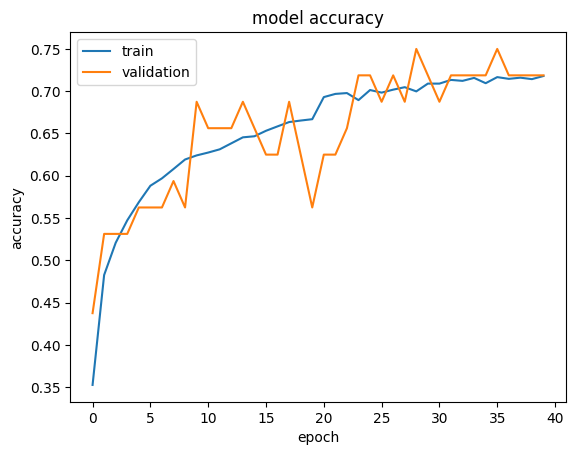

In [23]:
plt.plot(history_1.history["accuracy"])
plt.plot(history_1.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [24]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_1.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.5558 - accuracy: 0.7500

4/4 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7266


Loss: 0.6869323253631592, Accuracy: 0.7265625


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.92      0.75      0.83        32
     neutral       0.59      0.62      0.61        32
         sad       0.56      0.72      0.63        32
    surprise       0.96      0.81      0.88        32

    accuracy                           0.73       128
   macro avg       0.76      0.73      0.74       128
weighted avg       0.76      0.73      0.74       128



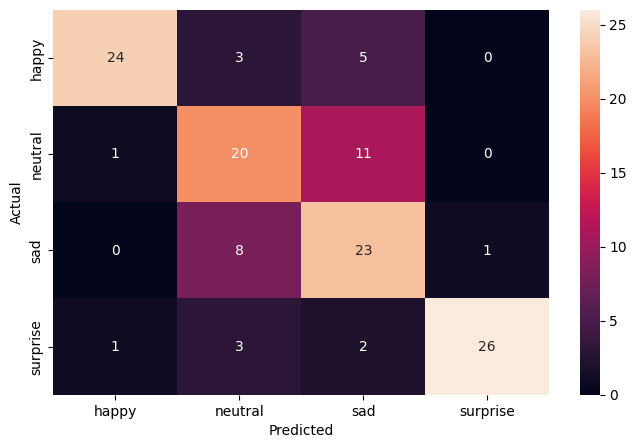

In [25]:
pred_probabilities = model_1.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- As we can see from the above summary, this CNN model has been trained and learned with **144,056 parameters (weights and biases).**
- The model's training accuracy shows a progressive increase, reaching about **71.34%**, suggesting the model is learning effectively. The validation accuracy fluctuates but also generally trends upward, peaking at approximately **78.12%**. This divergence might indicate that the model is still learning generalizable features, despite the higher accuracy on the validation set, which can sometimes be attributed to the validation set being slightly 'easier' or containing fewer augmentations.
- Upon evaluating the model on the test dataset, it achieved a loss of 0.6081 and an **accuracy of 72.66%**.
- From the confusion matrix, the model performs best in identifying 'happy' and 'surprise' emotions. It faces more challenges with 'sad' and 'neutral', in which we have the lowest f1-score, 56% and 63% respectively.


### **Creating the second Convolutional Neural Network**


### **Model 2 Architecture:**

- We plan on having 4 convolutional blocks in this Architecture, each having a Conv2D, MaxPooling2D, and a Dropout layer.
- Adding first Conv2D layer with **256 filters** and a **kernel size of 5x5**. Using the **'same' padding** and provide the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 5x5** and **stride size 2x2**.
- Adding a Dropout layer with a dropout ratio of **0.2**.
- Adding a second Conv2D layer with **128 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer like above and a Dropout layer with 0.3 dropout ratio.
- Adding a third Conv2D layer with **64 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Adding a fourth Conv2D layer with **32 filters** and a **kernel size of 3x3**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Once the convolutional blocks are added, we add the Flatten layer.
- Adding first fully connected dense layer with 64 neurons and using **'relu' activation**.
- Adding a second fully connected dense layer with 32 neurons and using **'relu' activation**.
- Adding a final dense layer with 4 neurons and using **'softmax' activation function**.
- Initializing an **Adam optimizer** with a learning rate of 0.0005.
- Compiling your model with the optimizer initialized and using **categorical_crossentropy** as the loss function and the 'accuracy' as the metric.
- Finally, printing your model summary and writing down the observations.


In [26]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [27]:
# Initializing a sequential model
model_2 = Sequential()

# First Convolutional Block
model_2.add(Conv2D(256, kernel_size=2, padding="same", input_shape=(48, 48, 1), activation="relu"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(alpha=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Second Convolutional Block
model_2.add(Conv2D(128, kernel_size=2, padding="same", activation="relu"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(alpha=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Third Convolutional Block
model_2.add(Conv2D(64, kernel_size=2, padding="same", activation="relu"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(alpha=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Fourth Convolutional Block
model_2.add(Conv2D(32, kernel_size=2, padding="same", activation="relu"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(alpha=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Flatten the output of the conv layers to feed into the dense layers
model_2.add(Flatten())

# First Dense layer
model_2.add(Dense(512, activation="relu"))

# Second Dense Layer
model_2.add(Dense(128, activation="relu"))

# Output layer with 4 neurons for classification with softmax activation
model_2.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [28]:
# Compile the model
model_2.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

model_2.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 256)       1280      


 batch_normalization (Batch  (None, 48, 48, 256)       1024      


 Normalization)                                                  


 leaky_re_lu (LeakyReLU)     (None, 48, 48, 256)       0         


 max_pooling2d (MaxPooling2  (None, 24, 24, 256)       0         


 D)                                                              


 conv2d_1 (Conv2D)           (None, 24, 24, 128)       131200    


 batch_normalization_1 (Bat  (None, 24, 24, 128)       512       


 chNormalization)                                                


 leaky_re_lu_1 (LeakyReLU)   (None, 24, 24, 128)       0         


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 128)       0         


 g2D)                                                            


 conv2d_2 (Conv2D)           (None, 12, 12, 64)        32832     


 batch_normalization_2 (Bat  (None, 12, 12, 64)        256       


 chNormalization)                                                


 leaky_re_lu_2 (LeakyReLU)   (None, 12, 12, 64)        0         


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 64)          0         


 g2D)                                                            


 conv2d_3 (Conv2D)           (None, 6, 6, 32)          8224      


 batch_normalization_3 (Bat  (None, 6, 6, 32)          128       


 chNormalization)                                                


 leaky_re_lu_3 (LeakyReLU)   (None, 6, 6, 32)          0         


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 32)          0         


 g2D)                                                            


 flatten (Flatten)           (None, 288)               0         


 dense (Dense)               (None, 512)               147968    


 dense_1 (Dense)             (None, 128)               65664     


 dense_2 (Dense)             (None, 4)                 516       


Total params: 389604 (1.49 MB)


Trainable params: 388644 (1.48 MB)


Non-trainable params: 960 (3.75 KB)


_________________________________________________________________


In [29]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_2_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_2 = model_2.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 17:57 - loss: 1.7300 - accuracy: 0.1875

  7/473 [..............................] - ETA: 4s - loss: 1.7104 - accuracy: 0.2679   

 12/473 [..............................] - ETA: 4s - loss: 1.5940 - accuracy: 0.2760

 17/473 [>.............................] - ETA: 4s - loss: 1.5454 - accuracy: 0.2776

 22/473 [>.............................] - ETA: 4s - loss: 1.5320 - accuracy: 0.2727

 27/473 [>.............................] - ETA: 4s - loss: 1.5144 - accuracy: 0.2812

 32/473 [=>............................] - ETA: 4s - loss: 1.5083 - accuracy: 0.2744

 37/473 [=>............................] - ETA: 4s - loss: 1.5001 - accuracy: 0.2711

 42/473 [=>............................] - ETA: 4s - loss: 1.4957 - accuracy: 0.2708

 47/473 [=>............................] - ETA: 4s - loss: 1.4856 - accuracy: 0.2739

 52/473 [==>...........................] - ETA: 4s - loss: 1.4754 - accuracy: 0.2782

 56/473 [==>...........................] - ETA: 4s - loss: 1.4732 - accuracy: 0.2768

 60/473 [==>...........................] - ETA: 4s - loss: 1.4674 - accuracy: 0.2755

 65/473 [===>..........................] - ETA: 4s - loss: 1.4605 - accuracy: 0.2793

 70/473 [===>..........................] - ETA: 4s - loss: 1.4527 - accuracy: 0.2839

 75/473 [===>..........................] - ETA: 4s - loss: 1.4499 - accuracy: 0.2829

 80/473 [====>.........................] - ETA: 4s - loss: 1.4454 - accuracy: 0.2848

 85/473 [====>.........................] - ETA: 4s - loss: 1.4431 - accuracy: 0.2857

 90/473 [====>.........................] - ETA: 4s - loss: 1.4384 - accuracy: 0.2872

 95/473 [=====>........................] - ETA: 4s - loss: 1.4330 - accuracy: 0.2891

100/473 [=====>........................] - ETA: 4s - loss: 1.4324 - accuracy: 0.2891

105/473 [=====>........................] - ETA: 4s - loss: 1.4277 - accuracy: 0.2914

110/473 [=====>........................] - ETA: 4s - loss: 1.4250 - accuracy: 0.2932

115/473 [======>.......................] - ETA: 3s - loss: 1.4230 - accuracy: 0.2927

120/473 [======>.......................] - ETA: 3s - loss: 1.4204 - accuracy: 0.2951

125/473 [======>.......................] - ETA: 3s - loss: 1.4191 - accuracy: 0.2945

130/473 [=======>......................] - ETA: 3s - loss: 1.4163 - accuracy: 0.2966

135/473 [=======>......................] - ETA: 3s - loss: 1.4139 - accuracy: 0.2970

140/473 [=======>......................] - ETA: 3s - loss: 1.4097 - accuracy: 0.3002

145/473 [========>.....................] - ETA: 3s - loss: 1.4072 - accuracy: 0.3009

150/473 [========>.....................] - ETA: 3s - loss: 1.4024 - accuracy: 0.3054

155/473 [========>.....................] - ETA: 3s - loss: 1.3993 - accuracy: 0.3081

160/473 [=========>....................] - ETA: 3s - loss: 1.3995 - accuracy: 0.3082

165/473 [=========>....................] - ETA: 3s - loss: 1.3994 - accuracy: 0.3087

170/473 [=========>....................] - ETA: 3s - loss: 1.3972 - accuracy: 0.3083

175/473 [==========>...................] - ETA: 3s - loss: 1.3937 - accuracy: 0.3113

180/473 [==========>...................] - ETA: 3s - loss: 1.3915 - accuracy: 0.3116

185/473 [==========>...................] - ETA: 3s - loss: 1.3902 - accuracy: 0.3118

190/473 [===========>..................] - ETA: 3s - loss: 1.3891 - accuracy: 0.3117

195/473 [===========>..................] - ETA: 3s - loss: 1.3878 - accuracy: 0.3131

200/473 [===========>..................] - ETA: 2s - loss: 1.3837 - accuracy: 0.3158

205/473 [============>.................] - ETA: 2s - loss: 1.3820 - accuracy: 0.3174

210/473 [============>.................] - ETA: 2s - loss: 1.3818 - accuracy: 0.3190

215/473 [============>.................] - ETA: 2s - loss: 1.3805 - accuracy: 0.3201

220/473 [============>.................] - ETA: 2s - loss: 1.3787 - accuracy: 0.3217

225/473 [=============>................] - ETA: 2s - loss: 1.3766 - accuracy: 0.3229

230/473 [=============>................] - ETA: 2s - loss: 1.3746 - accuracy: 0.3240

235/473 [=============>................] - ETA: 2s - loss: 1.3743 - accuracy: 0.3241

240/473 [==============>...............] - ETA: 2s - loss: 1.3719 - accuracy: 0.3246

245/473 [==============>...............] - ETA: 2s - loss: 1.3714 - accuracy: 0.3251

250/473 [==============>...............] - ETA: 2s - loss: 1.3687 - accuracy: 0.3270

255/473 [===============>..............] - ETA: 2s - loss: 1.3668 - accuracy: 0.3286

260/473 [===============>..............] - ETA: 2s - loss: 1.3643 - accuracy: 0.3308

265/473 [===============>..............] - ETA: 2s - loss: 1.3614 - accuracy: 0.3328

269/473 [================>.............] - ETA: 2s - loss: 1.3598 - accuracy: 0.3343

274/473 [================>.............] - ETA: 2s - loss: 1.3563 - accuracy: 0.3369

279/473 [================>.............] - ETA: 2s - loss: 1.3559 - accuracy: 0.3377

284/473 [=================>............] - ETA: 2s - loss: 1.3547 - accuracy: 0.3382

289/473 [=================>............] - ETA: 2s - loss: 1.3534 - accuracy: 0.3396

294/473 [=================>............] - ETA: 1s - loss: 1.3510 - accuracy: 0.3414

299/473 [=================>............] - ETA: 1s - loss: 1.3493 - accuracy: 0.3424

304/473 [==================>...........] - ETA: 1s - loss: 1.3475 - accuracy: 0.3440

309/473 [==================>...........] - ETA: 1s - loss: 1.3465 - accuracy: 0.3444

314/473 [==================>...........] - ETA: 1s - loss: 1.3439 - accuracy: 0.3460

319/473 [===================>..........] - ETA: 1s - loss: 1.3433 - accuracy: 0.3469

324/473 [===================>..........] - ETA: 1s - loss: 1.3423 - accuracy: 0.3480

329/473 [===================>..........] - ETA: 1s - loss: 1.3403 - accuracy: 0.3493

334/473 [====================>.........] - ETA: 1s - loss: 1.3398 - accuracy: 0.3496

339/473 [====================>.........] - ETA: 1s - loss: 1.3381 - accuracy: 0.3513

344/473 [====================>.........] - ETA: 1s - loss: 1.3367 - accuracy: 0.3530

349/473 [=====================>........] - ETA: 1s - loss: 1.3364 - accuracy: 0.3528

355/473 [=====================>........] - ETA: 1s - loss: 1.3348 - accuracy: 0.3544

361/473 [=====================>........] - ETA: 1s - loss: 1.3330 - accuracy: 0.3551

366/473 [======================>.......] - ETA: 1s - loss: 1.3320 - accuracy: 0.3560

371/473 [======================>.......] - ETA: 1s - loss: 1.3307 - accuracy: 0.3565

376/473 [======================>.......] - ETA: 1s - loss: 1.3294 - accuracy: 0.3566

379/473 [=======================>......] - ETA: 1s - loss: 1.3291 - accuracy: 0.3562

384/473 [=======================>......] - ETA: 1s - loss: 1.3276 - accuracy: 0.3571

389/473 [=======================>......] - ETA: 1s - loss: 1.3269 - accuracy: 0.3575

394/473 [=======================>......] - ETA: 0s - loss: 1.3250 - accuracy: 0.3586

399/473 [========================>.....] - ETA: 0s - loss: 1.3234 - accuracy: 0.3592

404/473 [========================>.....] - ETA: 0s - loss: 1.3224 - accuracy: 0.3594

409/473 [========================>.....] - ETA: 0s - loss: 1.3208 - accuracy: 0.3602

414/473 [=========================>....] - ETA: 0s - loss: 1.3186 - accuracy: 0.3618

419/473 [=========================>....] - ETA: 0s - loss: 1.3165 - accuracy: 0.3635

424/473 [=========================>....] - ETA: 0s - loss: 1.3157 - accuracy: 0.3639

429/473 [==========================>...] - ETA: 0s - loss: 1.3135 - accuracy: 0.3652

434/473 [==========================>...] - ETA: 0s - loss: 1.3125 - accuracy: 0.3660

439/473 [==========================>...] - ETA: 0s - loss: 1.3113 - accuracy: 0.3669

444/473 [===========================>..] - ETA: 0s - loss: 1.3091 - accuracy: 0.3682

449/473 [===========================>..] - ETA: 0s - loss: 1.3077 - accuracy: 0.3693

454/473 [===========================>..] - ETA: 0s - loss: 1.3066 - accuracy: 0.3702

459/473 [============================>.] - ETA: 0s - loss: 1.3068 - accuracy: 0.3710

464/473 [============================>.] - ETA: 0s - loss: 1.3052 - accuracy: 0.3721

469/473 [============================>.] - ETA: 0s - loss: 1.3033 - accuracy: 0.3737

473/473 [==============================] - 8s 12ms/step - loss: 1.3026 - accuracy: 0.3747 - val_loss: 1.3147 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 11s - loss: 1.0293 - accuracy: 0.5938

  6/473 [..............................] - ETA: 4s - loss: 1.1848 - accuracy: 0.4792 

 11/473 [..............................] - ETA: 4s - loss: 1.1979 - accuracy: 0.4545

 16/473 [>.............................] - ETA: 4s - loss: 1.1770 - accuracy: 0.4727

 21/473 [>.............................] - ETA: 4s - loss: 1.2063 - accuracy: 0.4598

 26/473 [>.............................] - ETA: 4s - loss: 1.2091 - accuracy: 0.4555

 31/473 [>.............................] - ETA: 4s - loss: 1.2189 - accuracy: 0.4496

 36/473 [=>............................] - ETA: 4s - loss: 1.2031 - accuracy: 0.4618

 41/473 [=>............................] - ETA: 4s - loss: 1.1988 - accuracy: 0.4619

 46/473 [=>............................] - ETA: 4s - loss: 1.1972 - accuracy: 0.4620

 51/473 [==>...........................] - ETA: 4s - loss: 1.1934 - accuracy: 0.4669

 56/473 [==>...........................] - ETA: 4s - loss: 1.1819 - accuracy: 0.4721

 60/473 [==>...........................] - ETA: 4s - loss: 1.1786 - accuracy: 0.4714

 65/473 [===>..........................] - ETA: 4s - loss: 1.1778 - accuracy: 0.4716

 70/473 [===>..........................] - ETA: 4s - loss: 1.1796 - accuracy: 0.4710

 75/473 [===>..........................] - ETA: 4s - loss: 1.1770 - accuracy: 0.4733

 80/473 [====>.........................] - ETA: 4s - loss: 1.1757 - accuracy: 0.4723

 85/473 [====>.........................] - ETA: 4s - loss: 1.1750 - accuracy: 0.4699

 90/473 [====>.........................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4649

 95/473 [=====>........................] - ETA: 4s - loss: 1.1741 - accuracy: 0.4671

100/473 [=====>........................] - ETA: 4s - loss: 1.1706 - accuracy: 0.4703

105/473 [=====>........................] - ETA: 4s - loss: 1.1732 - accuracy: 0.4708

110/473 [=====>........................] - ETA: 3s - loss: 1.1745 - accuracy: 0.4688

115/473 [======>.......................] - ETA: 3s - loss: 1.1756 - accuracy: 0.4663

120/473 [======>.......................] - ETA: 3s - loss: 1.1692 - accuracy: 0.4698

125/473 [======>.......................] - ETA: 3s - loss: 1.1658 - accuracy: 0.4720

130/473 [=======>......................] - ETA: 3s - loss: 1.1644 - accuracy: 0.4736

135/473 [=======>......................] - ETA: 3s - loss: 1.1636 - accuracy: 0.4736

140/473 [=======>......................] - ETA: 3s - loss: 1.1637 - accuracy: 0.4739

145/473 [========>.....................] - ETA: 3s - loss: 1.1611 - accuracy: 0.4752

149/473 [========>.....................] - ETA: 3s - loss: 1.1610 - accuracy: 0.4757

154/473 [========>.....................] - ETA: 3s - loss: 1.1588 - accuracy: 0.4756

159/473 [=========>....................] - ETA: 3s - loss: 1.1587 - accuracy: 0.4754

164/473 [=========>....................] - ETA: 3s - loss: 1.1569 - accuracy: 0.4775

169/473 [=========>....................] - ETA: 3s - loss: 1.1553 - accuracy: 0.4787

174/473 [==========>...................] - ETA: 3s - loss: 1.1513 - accuracy: 0.4808

179/473 [==========>...................] - ETA: 3s - loss: 1.1502 - accuracy: 0.4815

184/473 [==========>...................] - ETA: 3s - loss: 1.1486 - accuracy: 0.4830

189/473 [==========>...................] - ETA: 3s - loss: 1.1481 - accuracy: 0.4843

194/473 [===========>..................] - ETA: 3s - loss: 1.1471 - accuracy: 0.4842

199/473 [===========>..................] - ETA: 3s - loss: 1.1442 - accuracy: 0.4859

204/473 [===========>..................] - ETA: 2s - loss: 1.1425 - accuracy: 0.4871

208/473 [============>.................] - ETA: 2s - loss: 1.1423 - accuracy: 0.4865

213/473 [============>.................] - ETA: 2s - loss: 1.1422 - accuracy: 0.4859

218/473 [============>.................] - ETA: 2s - loss: 1.1424 - accuracy: 0.4874

223/473 [=============>................] - ETA: 2s - loss: 1.1420 - accuracy: 0.4875

228/473 [=============>................] - ETA: 2s - loss: 1.1405 - accuracy: 0.4883

233/473 [=============>................] - ETA: 2s - loss: 1.1386 - accuracy: 0.4894

238/473 [==============>...............] - ETA: 2s - loss: 1.1383 - accuracy: 0.4896

243/473 [==============>...............] - ETA: 2s - loss: 1.1375 - accuracy: 0.4902

248/473 [==============>...............] - ETA: 2s - loss: 1.1349 - accuracy: 0.4911

253/473 [===============>..............] - ETA: 2s - loss: 1.1365 - accuracy: 0.4912

258/473 [===============>..............] - ETA: 2s - loss: 1.1359 - accuracy: 0.4908

263/473 [===============>..............] - ETA: 2s - loss: 1.1348 - accuracy: 0.4906

269/473 [================>.............] - ETA: 2s - loss: 1.1351 - accuracy: 0.4900

274/473 [================>.............] - ETA: 2s - loss: 1.1334 - accuracy: 0.4918

279/473 [================>.............] - ETA: 2s - loss: 1.1325 - accuracy: 0.4925

284/473 [=================>............] - ETA: 2s - loss: 1.1320 - accuracy: 0.4930

289/473 [=================>............] - ETA: 2s - loss: 1.1307 - accuracy: 0.4930

294/473 [=================>............] - ETA: 1s - loss: 1.1291 - accuracy: 0.4944

299/473 [=================>............] - ETA: 1s - loss: 1.1277 - accuracy: 0.4959

304/473 [==================>...........] - ETA: 1s - loss: 1.1279 - accuracy: 0.4966

309/473 [==================>...........] - ETA: 1s - loss: 1.1273 - accuracy: 0.4969

314/473 [==================>...........] - ETA: 1s - loss: 1.1270 - accuracy: 0.4969

319/473 [===================>..........] - ETA: 1s - loss: 1.1262 - accuracy: 0.4974

324/473 [===================>..........] - ETA: 1s - loss: 1.1247 - accuracy: 0.4979

329/473 [===================>..........] - ETA: 1s - loss: 1.1234 - accuracy: 0.4986

334/473 [====================>.........] - ETA: 1s - loss: 1.1228 - accuracy: 0.4992

339/473 [====================>.........] - ETA: 1s - loss: 1.1204 - accuracy: 0.5004

344/473 [====================>.........] - ETA: 1s - loss: 1.1203 - accuracy: 0.5009

349/473 [=====================>........] - ETA: 1s - loss: 1.1192 - accuracy: 0.5013

354/473 [=====================>........] - ETA: 1s - loss: 1.1185 - accuracy: 0.5018

357/473 [=====================>........] - ETA: 1s - loss: 1.1177 - accuracy: 0.5019

360/473 [=====================>........] - ETA: 1s - loss: 1.1179 - accuracy: 0.5017

365/473 [======================>.......] - ETA: 1s - loss: 1.1179 - accuracy: 0.5014

370/473 [======================>.......] - ETA: 1s - loss: 1.1169 - accuracy: 0.5013

375/473 [======================>.......] - ETA: 1s - loss: 1.1168 - accuracy: 0.5016

380/473 [=======================>......] - ETA: 1s - loss: 1.1148 - accuracy: 0.5019

385/473 [=======================>......] - ETA: 0s - loss: 1.1146 - accuracy: 0.5028

390/473 [=======================>......] - ETA: 0s - loss: 1.1151 - accuracy: 0.5022

395/473 [========================>.....] - ETA: 0s - loss: 1.1139 - accuracy: 0.5034

400/473 [========================>.....] - ETA: 0s - loss: 1.1127 - accuracy: 0.5044

405/473 [========================>.....] - ETA: 0s - loss: 1.1115 - accuracy: 0.5054

410/473 [=========================>....] - ETA: 0s - loss: 1.1095 - accuracy: 0.5068

415/473 [=========================>....] - ETA: 0s - loss: 1.1084 - accuracy: 0.5074

420/473 [=========================>....] - ETA: 0s - loss: 1.1074 - accuracy: 0.5081

425/473 [=========================>....] - ETA: 0s - loss: 1.1079 - accuracy: 0.5081

430/473 [==========================>...] - ETA: 0s - loss: 1.1072 - accuracy: 0.5079

435/473 [==========================>...] - ETA: 0s - loss: 1.1061 - accuracy: 0.5082

440/473 [==========================>...] - ETA: 0s - loss: 1.1053 - accuracy: 0.5086

445/473 [===========================>..] - ETA: 0s - loss: 1.1044 - accuracy: 0.5089

450/473 [===========================>..] - ETA: 0s - loss: 1.1039 - accuracy: 0.5094

455/473 [===========================>..] - ETA: 0s - loss: 1.1038 - accuracy: 0.5095

460/473 [============================>.] - ETA: 0s - loss: 1.1036 - accuracy: 0.5103

465/473 [============================>.] - ETA: 0s - loss: 1.1028 - accuracy: 0.5107

470/473 [============================>.] - ETA: 0s - loss: 1.1012 - accuracy: 0.5116

473/473 [==============================] - 5s 11ms/step - loss: 1.1009 - accuracy: 0.5119 - val_loss: 0.9787 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 11s - loss: 0.8748 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.9337 - accuracy: 0.5885 

 11/473 [..............................] - ETA: 4s - loss: 1.0045 - accuracy: 0.5625

 16/473 [>.............................] - ETA: 4s - loss: 0.9858 - accuracy: 0.5703

 21/473 [>.............................] - ETA: 4s - loss: 0.9962 - accuracy: 0.5670

 26/473 [>.............................] - ETA: 4s - loss: 0.9907 - accuracy: 0.5673

 31/473 [>.............................] - ETA: 4s - loss: 0.9987 - accuracy: 0.5696

 35/473 [=>............................] - ETA: 4s - loss: 1.0016 - accuracy: 0.5679

 40/473 [=>............................] - ETA: 4s - loss: 0.9999 - accuracy: 0.5711

 45/473 [=>............................] - ETA: 4s - loss: 1.0011 - accuracy: 0.5701

 50/473 [==>...........................] - ETA: 4s - loss: 1.0041 - accuracy: 0.5619

 55/473 [==>...........................] - ETA: 4s - loss: 1.0063 - accuracy: 0.5597

 60/473 [==>...........................] - ETA: 4s - loss: 1.0068 - accuracy: 0.5615

 65/473 [===>..........................] - ETA: 4s - loss: 1.0110 - accuracy: 0.5625

 70/473 [===>..........................] - ETA: 4s - loss: 1.0100 - accuracy: 0.5625

 74/473 [===>..........................] - ETA: 4s - loss: 1.0105 - accuracy: 0.5650

 78/473 [===>..........................] - ETA: 4s - loss: 1.0083 - accuracy: 0.5645

 83/473 [====>.........................] - ETA: 4s - loss: 1.0067 - accuracy: 0.5633

 88/473 [====>.........................] - ETA: 4s - loss: 1.0044 - accuracy: 0.5632

 93/473 [====>.........................] - ETA: 4s - loss: 1.0049 - accuracy: 0.5642

 98/473 [=====>........................] - ETA: 4s - loss: 1.0039 - accuracy: 0.5644

103/473 [=====>........................] - ETA: 4s - loss: 1.0034 - accuracy: 0.5655

108/473 [=====>........................] - ETA: 4s - loss: 1.0048 - accuracy: 0.5645

113/473 [======>.......................] - ETA: 4s - loss: 1.0033 - accuracy: 0.5644

118/473 [======>.......................] - ETA: 4s - loss: 1.0048 - accuracy: 0.5628

123/473 [======>.......................] - ETA: 3s - loss: 1.0074 - accuracy: 0.5602

128/473 [=======>......................] - ETA: 3s - loss: 1.0027 - accuracy: 0.5630

133/473 [=======>......................] - ETA: 3s - loss: 1.0039 - accuracy: 0.5616

138/473 [=======>......................] - ETA: 3s - loss: 1.0053 - accuracy: 0.5609

143/473 [========>.....................] - ETA: 3s - loss: 1.0061 - accuracy: 0.5594

148/473 [========>.....................] - ETA: 3s - loss: 1.0038 - accuracy: 0.5600

153/473 [========>.....................] - ETA: 3s - loss: 1.0053 - accuracy: 0.5598

157/473 [========>.....................] - ETA: 3s - loss: 1.0042 - accuracy: 0.5591

162/473 [=========>....................] - ETA: 3s - loss: 1.0058 - accuracy: 0.5565

167/473 [=========>....................] - ETA: 3s - loss: 1.0026 - accuracy: 0.5588

172/473 [=========>....................] - ETA: 3s - loss: 0.9996 - accuracy: 0.5607

177/473 [==========>...................] - ETA: 3s - loss: 0.9992 - accuracy: 0.5609

182/473 [==========>...................] - ETA: 3s - loss: 1.0030 - accuracy: 0.5592

187/473 [==========>...................] - ETA: 3s - loss: 1.0029 - accuracy: 0.5593

192/473 [===========>..................] - ETA: 3s - loss: 1.0047 - accuracy: 0.5583

197/473 [===========>..................] - ETA: 3s - loss: 1.0051 - accuracy: 0.5582

202/473 [===========>..................] - ETA: 3s - loss: 1.0034 - accuracy: 0.5594

206/473 [============>.................] - ETA: 3s - loss: 1.0030 - accuracy: 0.5598

211/473 [============>.................] - ETA: 2s - loss: 1.0016 - accuracy: 0.5610

216/473 [============>.................] - ETA: 2s - loss: 1.0010 - accuracy: 0.5621

221/473 [=============>................] - ETA: 2s - loss: 0.9987 - accuracy: 0.5643

226/473 [=============>................] - ETA: 2s - loss: 0.9999 - accuracy: 0.5647

231/473 [=============>................] - ETA: 2s - loss: 1.0017 - accuracy: 0.5639

236/473 [=============>................] - ETA: 2s - loss: 1.0024 - accuracy: 0.5637

241/473 [==============>...............] - ETA: 2s - loss: 1.0020 - accuracy: 0.5629

246/473 [==============>...............] - ETA: 2s - loss: 1.0023 - accuracy: 0.5625

251/473 [==============>...............] - ETA: 2s - loss: 1.0012 - accuracy: 0.5630

256/473 [===============>..............] - ETA: 2s - loss: 0.9993 - accuracy: 0.5641

261/473 [===============>..............] - ETA: 2s - loss: 0.9987 - accuracy: 0.5647

266/473 [===============>..............] - ETA: 2s - loss: 1.0010 - accuracy: 0.5636

271/473 [================>.............] - ETA: 2s - loss: 1.0018 - accuracy: 0.5632

275/473 [================>.............] - ETA: 2s - loss: 1.0015 - accuracy: 0.5630

280/473 [================>.............] - ETA: 2s - loss: 1.0029 - accuracy: 0.5623

285/473 [=================>............] - ETA: 2s - loss: 1.0023 - accuracy: 0.5622

290/473 [=================>............] - ETA: 2s - loss: 1.0028 - accuracy: 0.5613

295/473 [=================>............] - ETA: 1s - loss: 1.0012 - accuracy: 0.5621

300/473 [==================>...........] - ETA: 1s - loss: 1.0010 - accuracy: 0.5625

305/473 [==================>...........] - ETA: 1s - loss: 1.0007 - accuracy: 0.5623

310/473 [==================>...........] - ETA: 1s - loss: 1.0003 - accuracy: 0.5620

315/473 [==================>...........] - ETA: 1s - loss: 0.9979 - accuracy: 0.5632

320/473 [===================>..........] - ETA: 1s - loss: 0.9972 - accuracy: 0.5632

325/473 [===================>..........] - ETA: 1s - loss: 0.9964 - accuracy: 0.5643

330/473 [===================>..........] - ETA: 1s - loss: 0.9951 - accuracy: 0.5652

335/473 [====================>.........] - ETA: 1s - loss: 0.9958 - accuracy: 0.5649

340/473 [====================>.........] - ETA: 1s - loss: 0.9960 - accuracy: 0.5651

345/473 [====================>.........] - ETA: 1s - loss: 0.9964 - accuracy: 0.5646

350/473 [=====================>........] - ETA: 1s - loss: 0.9953 - accuracy: 0.5648

355/473 [=====================>........] - ETA: 1s - loss: 0.9946 - accuracy: 0.5650

360/473 [=====================>........] - ETA: 1s - loss: 0.9942 - accuracy: 0.5657

365/473 [======================>.......] - ETA: 1s - loss: 0.9942 - accuracy: 0.5654

370/473 [======================>.......] - ETA: 1s - loss: 0.9952 - accuracy: 0.5656

375/473 [======================>.......] - ETA: 1s - loss: 0.9951 - accuracy: 0.5658

380/473 [=======================>......] - ETA: 1s - loss: 0.9931 - accuracy: 0.5668

385/473 [=======================>......] - ETA: 0s - loss: 0.9941 - accuracy: 0.5656

390/473 [=======================>......] - ETA: 0s - loss: 0.9934 - accuracy: 0.5661

395/473 [========================>.....] - ETA: 0s - loss: 0.9924 - accuracy: 0.5665

400/473 [========================>.....] - ETA: 0s - loss: 0.9919 - accuracy: 0.5666

405/473 [========================>.....] - ETA: 0s - loss: 0.9915 - accuracy: 0.5660

410/473 [=========================>....] - ETA: 0s - loss: 0.9910 - accuracy: 0.5655

415/473 [=========================>....] - ETA: 0s - loss: 0.9915 - accuracy: 0.5657

420/473 [=========================>....] - ETA: 0s - loss: 0.9907 - accuracy: 0.5658

425/473 [=========================>....] - ETA: 0s - loss: 0.9908 - accuracy: 0.5657

430/473 [==========================>...] - ETA: 0s - loss: 0.9910 - accuracy: 0.5655

435/473 [==========================>...] - ETA: 0s - loss: 0.9907 - accuracy: 0.5657

440/473 [==========================>...] - ETA: 0s - loss: 0.9894 - accuracy: 0.5665

445/473 [===========================>..] - ETA: 0s - loss: 0.9893 - accuracy: 0.5665

450/473 [===========================>..] - ETA: 0s - loss: 0.9886 - accuracy: 0.5674

455/473 [===========================>..] - ETA: 0s - loss: 0.9888 - accuracy: 0.5675

460/473 [============================>.] - ETA: 0s - loss: 0.9894 - accuracy: 0.5668

465/473 [============================>.] - ETA: 0s - loss: 0.9886 - accuracy: 0.5674

471/473 [============================>.] - ETA: 0s - loss: 0.9897 - accuracy: 0.5676

473/473 [==============================] - 5s 11ms/step - loss: 0.9897 - accuracy: 0.5679 - val_loss: 0.7072 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 16s - loss: 0.8784 - accuracy: 0.5625

  6/473 [..............................] - ETA: 5s - loss: 1.0213 - accuracy: 0.5677 

 11/473 [..............................] - ETA: 5s - loss: 0.9904 - accuracy: 0.5852

 16/473 [>.............................] - ETA: 5s - loss: 0.9561 - accuracy: 0.6016

 21/473 [>.............................] - ETA: 4s - loss: 0.9567 - accuracy: 0.5982

 26/473 [>.............................] - ETA: 4s - loss: 0.9460 - accuracy: 0.5938

 31/473 [>.............................] - ETA: 4s - loss: 0.9436 - accuracy: 0.5938

 36/473 [=>............................] - ETA: 4s - loss: 0.9525 - accuracy: 0.5920

 41/473 [=>............................] - ETA: 4s - loss: 0.9526 - accuracy: 0.5884

 46/473 [=>............................] - ETA: 4s - loss: 0.9543 - accuracy: 0.5904

 51/473 [==>...........................] - ETA: 4s - loss: 0.9524 - accuracy: 0.5870

 56/473 [==>...........................] - ETA: 4s - loss: 0.9515 - accuracy: 0.5893

 61/473 [==>...........................] - ETA: 4s - loss: 0.9517 - accuracy: 0.5886

 66/473 [===>..........................] - ETA: 4s - loss: 0.9612 - accuracy: 0.5852

 71/473 [===>..........................] - ETA: 4s - loss: 0.9581 - accuracy: 0.5880

 76/473 [===>..........................] - ETA: 4s - loss: 0.9488 - accuracy: 0.5905

 81/473 [====>.........................] - ETA: 4s - loss: 0.9433 - accuracy: 0.5926

 86/473 [====>.........................] - ETA: 4s - loss: 0.9446 - accuracy: 0.5919

 91/473 [====>.........................] - ETA: 4s - loss: 0.9454 - accuracy: 0.5907

 97/473 [=====>........................] - ETA: 4s - loss: 0.9456 - accuracy: 0.5908

102/473 [=====>........................] - ETA: 4s - loss: 0.9501 - accuracy: 0.5901

107/473 [=====>........................] - ETA: 3s - loss: 0.9491 - accuracy: 0.5902

112/473 [======>.......................] - ETA: 3s - loss: 0.9523 - accuracy: 0.5876

117/473 [======>.......................] - ETA: 3s - loss: 0.9558 - accuracy: 0.5849

122/473 [======>.......................] - ETA: 3s - loss: 0.9573 - accuracy: 0.5829

127/473 [=======>......................] - ETA: 3s - loss: 0.9561 - accuracy: 0.5861

132/473 [=======>......................] - ETA: 3s - loss: 0.9574 - accuracy: 0.5852

137/473 [=======>......................] - ETA: 3s - loss: 0.9567 - accuracy: 0.5848

142/473 [========>.....................] - ETA: 3s - loss: 0.9558 - accuracy: 0.5845

147/473 [========>.....................] - ETA: 3s - loss: 0.9514 - accuracy: 0.5858

152/473 [========>.....................] - ETA: 3s - loss: 0.9518 - accuracy: 0.5853

157/473 [========>.....................] - ETA: 3s - loss: 0.9518 - accuracy: 0.5862

162/473 [=========>....................] - ETA: 3s - loss: 0.9477 - accuracy: 0.5883

167/473 [=========>....................] - ETA: 3s - loss: 0.9491 - accuracy: 0.5898

172/473 [=========>....................] - ETA: 3s - loss: 0.9477 - accuracy: 0.5888

177/473 [==========>...................] - ETA: 3s - loss: 0.9439 - accuracy: 0.5907

182/473 [==========>...................] - ETA: 3s - loss: 0.9442 - accuracy: 0.5910

187/473 [==========>...................] - ETA: 3s - loss: 0.9430 - accuracy: 0.5912

192/473 [===========>..................] - ETA: 3s - loss: 0.9426 - accuracy: 0.5918

197/473 [===========>..................] - ETA: 3s - loss: 0.9422 - accuracy: 0.5910

202/473 [===========>..................] - ETA: 2s - loss: 0.9420 - accuracy: 0.5906

207/473 [============>.................] - ETA: 2s - loss: 0.9415 - accuracy: 0.5903

212/473 [============>.................] - ETA: 2s - loss: 0.9414 - accuracy: 0.5895

217/473 [============>.................] - ETA: 2s - loss: 0.9404 - accuracy: 0.5909

222/473 [=============>................] - ETA: 2s - loss: 0.9409 - accuracy: 0.5914

227/473 [=============>................] - ETA: 2s - loss: 0.9417 - accuracy: 0.5913

232/473 [=============>................] - ETA: 2s - loss: 0.9413 - accuracy: 0.5923

237/473 [==============>...............] - ETA: 2s - loss: 0.9399 - accuracy: 0.5931

242/473 [==============>...............] - ETA: 2s - loss: 0.9399 - accuracy: 0.5927

247/473 [==============>...............] - ETA: 2s - loss: 0.9401 - accuracy: 0.5917

252/473 [==============>...............] - ETA: 2s - loss: 0.9404 - accuracy: 0.5916

257/473 [===============>..............] - ETA: 2s - loss: 0.9389 - accuracy: 0.5929

262/473 [===============>..............] - ETA: 2s - loss: 0.9355 - accuracy: 0.5941

267/473 [===============>..............] - ETA: 2s - loss: 0.9349 - accuracy: 0.5952

272/473 [================>.............] - ETA: 2s - loss: 0.9342 - accuracy: 0.5959

277/473 [================>.............] - ETA: 2s - loss: 0.9309 - accuracy: 0.5977

282/473 [================>.............] - ETA: 2s - loss: 0.9300 - accuracy: 0.5982

287/473 [=================>............] - ETA: 2s - loss: 0.9308 - accuracy: 0.5981

292/473 [=================>............] - ETA: 1s - loss: 0.9300 - accuracy: 0.5987

297/473 [=================>............] - ETA: 1s - loss: 0.9297 - accuracy: 0.5984

302/473 [==================>...........] - ETA: 1s - loss: 0.9291 - accuracy: 0.5986

307/473 [==================>...........] - ETA: 1s - loss: 0.9278 - accuracy: 0.5984

312/473 [==================>...........] - ETA: 1s - loss: 0.9288 - accuracy: 0.5977

317/473 [===================>..........] - ETA: 1s - loss: 0.9273 - accuracy: 0.5981

322/473 [===================>..........] - ETA: 1s - loss: 0.9282 - accuracy: 0.5976

327/473 [===================>..........] - ETA: 1s - loss: 0.9278 - accuracy: 0.5975

332/473 [====================>.........] - ETA: 1s - loss: 0.9269 - accuracy: 0.5988

337/473 [====================>.........] - ETA: 1s - loss: 0.9270 - accuracy: 0.5988

342/473 [====================>.........] - ETA: 1s - loss: 0.9289 - accuracy: 0.5975

347/473 [=====================>........] - ETA: 1s - loss: 0.9299 - accuracy: 0.5969

352/473 [=====================>........] - ETA: 1s - loss: 0.9308 - accuracy: 0.5965

357/473 [=====================>........] - ETA: 1s - loss: 0.9311 - accuracy: 0.5964

362/473 [=====================>........] - ETA: 1s - loss: 0.9337 - accuracy: 0.5947

367/473 [======================>.......] - ETA: 1s - loss: 0.9334 - accuracy: 0.5956

372/473 [======================>.......] - ETA: 1s - loss: 0.9342 - accuracy: 0.5947

377/473 [======================>.......] - ETA: 1s - loss: 0.9354 - accuracy: 0.5942

382/473 [=======================>......] - ETA: 0s - loss: 0.9361 - accuracy: 0.5937

387/473 [=======================>......] - ETA: 0s - loss: 0.9348 - accuracy: 0.5944

392/473 [=======================>......] - ETA: 0s - loss: 0.9349 - accuracy: 0.5946

397/473 [========================>.....] - ETA: 0s - loss: 0.9347 - accuracy: 0.5945

402/473 [========================>.....] - ETA: 0s - loss: 0.9351 - accuracy: 0.5942

407/473 [========================>.....] - ETA: 0s - loss: 0.9340 - accuracy: 0.5949

412/473 [=========================>....] - ETA: 0s - loss: 0.9332 - accuracy: 0.5954

417/473 [=========================>....] - ETA: 0s - loss: 0.9316 - accuracy: 0.5964

422/473 [=========================>....] - ETA: 0s - loss: 0.9310 - accuracy: 0.5971

427/473 [==========================>...] - ETA: 0s - loss: 0.9300 - accuracy: 0.5973

432/473 [==========================>...] - ETA: 0s - loss: 0.9295 - accuracy: 0.5972

437/473 [==========================>...] - ETA: 0s - loss: 0.9296 - accuracy: 0.5973

442/473 [===========================>..] - ETA: 0s - loss: 0.9287 - accuracy: 0.5979

447/473 [===========================>..] - ETA: 0s - loss: 0.9284 - accuracy: 0.5979

452/473 [===========================>..] - ETA: 0s - loss: 0.9280 - accuracy: 0.5978

457/473 [===========================>..] - ETA: 0s - loss: 0.9283 - accuracy: 0.5975

462/473 [============================>.] - ETA: 0s - loss: 0.9284 - accuracy: 0.5971

467/473 [============================>.] - ETA: 0s - loss: 0.9268 - accuracy: 0.5977

472/473 [============================>.] - ETA: 0s - loss: 0.9264 - accuracy: 0.5979

473/473 [==============================] - 5s 11ms/step - loss: 0.9265 - accuracy: 0.5979 - val_loss: 0.7355 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 11s - loss: 0.9016 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.9289 - accuracy: 0.5833 

 10/473 [..............................] - ETA: 5s - loss: 0.8934 - accuracy: 0.5969

 12/473 [..............................] - ETA: 6s - loss: 0.8752 - accuracy: 0.6120

 17/473 [>.............................] - ETA: 6s - loss: 0.8811 - accuracy: 0.6158

 22/473 [>.............................] - ETA: 5s - loss: 0.8864 - accuracy: 0.6108

 27/473 [>.............................] - ETA: 5s - loss: 0.8781 - accuracy: 0.6227

 32/473 [=>............................] - ETA: 5s - loss: 0.8984 - accuracy: 0.6191

 37/473 [=>............................] - ETA: 5s - loss: 0.8990 - accuracy: 0.6216

 42/473 [=>............................] - ETA: 5s - loss: 0.8851 - accuracy: 0.6272

 47/473 [=>............................] - ETA: 5s - loss: 0.8806 - accuracy: 0.6283

 52/473 [==>...........................] - ETA: 4s - loss: 0.8909 - accuracy: 0.6208

 57/473 [==>...........................] - ETA: 4s - loss: 0.8859 - accuracy: 0.6255

 62/473 [==>...........................] - ETA: 4s - loss: 0.8840 - accuracy: 0.6245

 67/473 [===>..........................] - ETA: 4s - loss: 0.8885 - accuracy: 0.6227

 72/473 [===>..........................] - ETA: 4s - loss: 0.8887 - accuracy: 0.6228

 77/473 [===>..........................] - ETA: 4s - loss: 0.8936 - accuracy: 0.6218

 82/473 [====>.........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6220

 87/473 [====>.........................] - ETA: 4s - loss: 0.8917 - accuracy: 0.6232

 92/473 [====>.........................] - ETA: 4s - loss: 0.8961 - accuracy: 0.6192

 97/473 [=====>........................] - ETA: 4s - loss: 0.8948 - accuracy: 0.6189

102/473 [=====>........................] - ETA: 4s - loss: 0.8893 - accuracy: 0.6192

107/473 [=====>........................] - ETA: 4s - loss: 0.8906 - accuracy: 0.6174

112/473 [======>.......................] - ETA: 4s - loss: 0.8878 - accuracy: 0.6175

117/473 [======>.......................] - ETA: 4s - loss: 0.8874 - accuracy: 0.6178

122/473 [======>.......................] - ETA: 3s - loss: 0.8874 - accuracy: 0.6181

127/473 [=======>......................] - ETA: 3s - loss: 0.8857 - accuracy: 0.6191

132/473 [=======>......................] - ETA: 3s - loss: 0.8823 - accuracy: 0.6212

137/473 [=======>......................] - ETA: 3s - loss: 0.8826 - accuracy: 0.6225

142/473 [========>.....................] - ETA: 3s - loss: 0.8806 - accuracy: 0.6252

147/473 [========>.....................] - ETA: 3s - loss: 0.8821 - accuracy: 0.6244

152/473 [========>.....................] - ETA: 3s - loss: 0.8786 - accuracy: 0.6266

157/473 [========>.....................] - ETA: 3s - loss: 0.8775 - accuracy: 0.6276

162/473 [=========>....................] - ETA: 3s - loss: 0.8753 - accuracy: 0.6292

167/473 [=========>....................] - ETA: 3s - loss: 0.8756 - accuracy: 0.6280

172/473 [=========>....................] - ETA: 3s - loss: 0.8750 - accuracy: 0.6277

177/473 [==========>...................] - ETA: 3s - loss: 0.8750 - accuracy: 0.6280

182/473 [==========>...................] - ETA: 3s - loss: 0.8785 - accuracy: 0.6255

187/473 [==========>...................] - ETA: 3s - loss: 0.8783 - accuracy: 0.6252

192/473 [===========>..................] - ETA: 3s - loss: 0.8781 - accuracy: 0.6261

197/473 [===========>..................] - ETA: 3s - loss: 0.8802 - accuracy: 0.6253

202/473 [===========>..................] - ETA: 3s - loss: 0.8806 - accuracy: 0.6256

207/473 [============>.................] - ETA: 2s - loss: 0.8813 - accuracy: 0.6242

212/473 [============>.................] - ETA: 2s - loss: 0.8805 - accuracy: 0.6250

217/473 [============>.................] - ETA: 2s - loss: 0.8807 - accuracy: 0.6251

222/473 [=============>................] - ETA: 2s - loss: 0.8794 - accuracy: 0.6257

227/473 [=============>................] - ETA: 2s - loss: 0.8791 - accuracy: 0.6254

232/473 [=============>................] - ETA: 2s - loss: 0.8801 - accuracy: 0.6257

237/473 [==============>...............] - ETA: 2s - loss: 0.8768 - accuracy: 0.6280

242/473 [==============>...............] - ETA: 2s - loss: 0.8782 - accuracy: 0.6271

247/473 [==============>...............] - ETA: 2s - loss: 0.8786 - accuracy: 0.6272

252/473 [==============>...............] - ETA: 2s - loss: 0.8808 - accuracy: 0.6267

257/473 [===============>..............] - ETA: 2s - loss: 0.8790 - accuracy: 0.6284

262/473 [===============>..............] - ETA: 2s - loss: 0.8781 - accuracy: 0.6287

267/473 [===============>..............] - ETA: 2s - loss: 0.8794 - accuracy: 0.6276

272/473 [================>.............] - ETA: 2s - loss: 0.8787 - accuracy: 0.6276

277/473 [================>.............] - ETA: 2s - loss: 0.8781 - accuracy: 0.6284

282/473 [================>.............] - ETA: 2s - loss: 0.8774 - accuracy: 0.6293

287/473 [=================>............] - ETA: 2s - loss: 0.8776 - accuracy: 0.6287

292/473 [=================>............] - ETA: 2s - loss: 0.8777 - accuracy: 0.6287

297/473 [=================>............] - ETA: 1s - loss: 0.8761 - accuracy: 0.6296

302/473 [==================>...........] - ETA: 1s - loss: 0.8763 - accuracy: 0.6289

307/473 [==================>...........] - ETA: 1s - loss: 0.8758 - accuracy: 0.6294

312/473 [==================>...........] - ETA: 1s - loss: 0.8748 - accuracy: 0.6296

318/473 [===================>..........] - ETA: 1s - loss: 0.8768 - accuracy: 0.6282

323/473 [===================>..........] - ETA: 1s - loss: 0.8778 - accuracy: 0.6278

328/473 [===================>..........] - ETA: 1s - loss: 0.8773 - accuracy: 0.6277

333/473 [====================>.........] - ETA: 1s - loss: 0.8778 - accuracy: 0.6263

338/473 [====================>.........] - ETA: 1s - loss: 0.8768 - accuracy: 0.6272

343/473 [====================>.........] - ETA: 1s - loss: 0.8762 - accuracy: 0.6281

348/473 [=====================>........] - ETA: 1s - loss: 0.8772 - accuracy: 0.6279

353/473 [=====================>........] - ETA: 1s - loss: 0.8782 - accuracy: 0.6276

358/473 [=====================>........] - ETA: 1s - loss: 0.8781 - accuracy: 0.6279

363/473 [======================>.......] - ETA: 1s - loss: 0.8780 - accuracy: 0.6276

368/473 [======================>.......] - ETA: 1s - loss: 0.8776 - accuracy: 0.6280

373/473 [======================>.......] - ETA: 1s - loss: 0.8780 - accuracy: 0.6278

378/473 [======================>.......] - ETA: 1s - loss: 0.8767 - accuracy: 0.6293

383/473 [=======================>......] - ETA: 0s - loss: 0.8771 - accuracy: 0.6286

388/473 [=======================>......] - ETA: 0s - loss: 0.8767 - accuracy: 0.6286

393/473 [=======================>......] - ETA: 0s - loss: 0.8780 - accuracy: 0.6282

398/473 [========================>.....] - ETA: 0s - loss: 0.8797 - accuracy: 0.6269

403/473 [========================>.....] - ETA: 0s - loss: 0.8808 - accuracy: 0.6252

408/473 [========================>.....] - ETA: 0s - loss: 0.8807 - accuracy: 0.6258

413/473 [=========================>....] - ETA: 0s - loss: 0.8817 - accuracy: 0.6252

418/473 [=========================>....] - ETA: 0s - loss: 0.8811 - accuracy: 0.6254

423/473 [=========================>....] - ETA: 0s - loss: 0.8815 - accuracy: 0.6253

428/473 [==========================>...] - ETA: 0s - loss: 0.8818 - accuracy: 0.6248

433/473 [==========================>...] - ETA: 0s - loss: 0.8809 - accuracy: 0.6254

438/473 [==========================>...] - ETA: 0s - loss: 0.8804 - accuracy: 0.6258

443/473 [===========================>..] - ETA: 0s - loss: 0.8793 - accuracy: 0.6263

448/473 [===========================>..] - ETA: 0s - loss: 0.8785 - accuracy: 0.6262

453/473 [===========================>..] - ETA: 0s - loss: 0.8775 - accuracy: 0.6262

458/473 [============================>.] - ETA: 0s - loss: 0.8783 - accuracy: 0.6259

463/473 [============================>.] - ETA: 0s - loss: 0.8776 - accuracy: 0.6257

468/473 [============================>.] - ETA: 0s - loss: 0.8778 - accuracy: 0.6261

473/473 [==============================] - ETA: 0s - loss: 0.8782 - accuracy: 0.6264

473/473 [==============================] - 5s 11ms/step - loss: 0.8782 - accuracy: 0.6264 - val_loss: 0.8721 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 11s - loss: 0.8063 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.8578 - accuracy: 0.6406 

 11/473 [..............................] - ETA: 4s - loss: 0.8740 - accuracy: 0.6193

 16/473 [>.............................] - ETA: 4s - loss: 0.8367 - accuracy: 0.6504

 21/473 [>.............................] - ETA: 4s - loss: 0.8365 - accuracy: 0.6518

 26/473 [>.............................] - ETA: 4s - loss: 0.8566 - accuracy: 0.6418

 31/473 [>.............................] - ETA: 4s - loss: 0.8456 - accuracy: 0.6512

 36/473 [=>............................] - ETA: 4s - loss: 0.8490 - accuracy: 0.6450

 41/473 [=>............................] - ETA: 4s - loss: 0.8547 - accuracy: 0.6418

 46/473 [=>............................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6379

 51/473 [==>...........................] - ETA: 4s - loss: 0.8599 - accuracy: 0.6397

 56/473 [==>...........................] - ETA: 4s - loss: 0.8537 - accuracy: 0.6417

 61/473 [==>...........................] - ETA: 4s - loss: 0.8455 - accuracy: 0.6429

 66/473 [===>..........................] - ETA: 4s - loss: 0.8417 - accuracy: 0.6444

 71/473 [===>..........................] - ETA: 4s - loss: 0.8360 - accuracy: 0.6470

 76/473 [===>..........................] - ETA: 4s - loss: 0.8391 - accuracy: 0.6480

 81/473 [====>.........................] - ETA: 4s - loss: 0.8358 - accuracy: 0.6535

 86/473 [====>.........................] - ETA: 4s - loss: 0.8388 - accuracy: 0.6504

 91/473 [====>.........................] - ETA: 4s - loss: 0.8391 - accuracy: 0.6511

 96/473 [=====>........................] - ETA: 4s - loss: 0.8347 - accuracy: 0.6507

101/473 [=====>........................] - ETA: 4s - loss: 0.8260 - accuracy: 0.6562

106/473 [=====>........................] - ETA: 3s - loss: 0.8206 - accuracy: 0.6583

111/473 [======>.......................] - ETA: 3s - loss: 0.8215 - accuracy: 0.6571

116/473 [======>.......................] - ETA: 3s - loss: 0.8212 - accuracy: 0.6579

121/473 [======>.......................] - ETA: 3s - loss: 0.8270 - accuracy: 0.6539

126/473 [======>.......................] - ETA: 3s - loss: 0.8342 - accuracy: 0.6525

131/473 [=======>......................] - ETA: 3s - loss: 0.8291 - accuracy: 0.6541

136/473 [=======>......................] - ETA: 3s - loss: 0.8288 - accuracy: 0.6533

141/473 [=======>......................] - ETA: 3s - loss: 0.8286 - accuracy: 0.6514

146/473 [========>.....................] - ETA: 3s - loss: 0.8305 - accuracy: 0.6498

151/473 [========>.....................] - ETA: 3s - loss: 0.8317 - accuracy: 0.6498

156/473 [========>.....................] - ETA: 3s - loss: 0.8283 - accuracy: 0.6502

161/473 [=========>....................] - ETA: 3s - loss: 0.8284 - accuracy: 0.6493

166/473 [=========>....................] - ETA: 3s - loss: 0.8306 - accuracy: 0.6489

171/473 [=========>....................] - ETA: 3s - loss: 0.8317 - accuracy: 0.6484

176/473 [==========>...................] - ETA: 3s - loss: 0.8316 - accuracy: 0.6481

181/473 [==========>...................] - ETA: 3s - loss: 0.8324 - accuracy: 0.6469

186/473 [==========>...................] - ETA: 3s - loss: 0.8334 - accuracy: 0.6452

191/473 [===========>..................] - ETA: 3s - loss: 0.8352 - accuracy: 0.6437

196/473 [===========>..................] - ETA: 3s - loss: 0.8325 - accuracy: 0.6445

201/473 [===========>..................] - ETA: 2s - loss: 0.8340 - accuracy: 0.6438

206/473 [============>.................] - ETA: 2s - loss: 0.8335 - accuracy: 0.6435

211/473 [============>.................] - ETA: 2s - loss: 0.8362 - accuracy: 0.6429

216/473 [============>.................] - ETA: 2s - loss: 0.8350 - accuracy: 0.6428

221/473 [=============>................] - ETA: 2s - loss: 0.8346 - accuracy: 0.6435

226/473 [=============>................] - ETA: 2s - loss: 0.8339 - accuracy: 0.6431

231/473 [=============>................] - ETA: 2s - loss: 0.8343 - accuracy: 0.6427

236/473 [=============>................] - ETA: 2s - loss: 0.8368 - accuracy: 0.6406

241/473 [==============>...............] - ETA: 2s - loss: 0.8364 - accuracy: 0.6408

246/473 [==============>...............] - ETA: 2s - loss: 0.8362 - accuracy: 0.6406

251/473 [==============>...............] - ETA: 2s - loss: 0.8355 - accuracy: 0.6408

256/473 [===============>..............] - ETA: 2s - loss: 0.8352 - accuracy: 0.6407

261/473 [===============>..............] - ETA: 2s - loss: 0.8347 - accuracy: 0.6418

266/473 [===============>..............] - ETA: 2s - loss: 0.8348 - accuracy: 0.6420

271/473 [================>.............] - ETA: 2s - loss: 0.8332 - accuracy: 0.6425

276/473 [================>.............] - ETA: 2s - loss: 0.8326 - accuracy: 0.6424

281/473 [================>.............] - ETA: 2s - loss: 0.8349 - accuracy: 0.6421

286/473 [=================>............] - ETA: 2s - loss: 0.8336 - accuracy: 0.6430

291/473 [=================>............] - ETA: 1s - loss: 0.8340 - accuracy: 0.6428

296/473 [=================>............] - ETA: 1s - loss: 0.8341 - accuracy: 0.6426

301/473 [==================>...........] - ETA: 1s - loss: 0.8345 - accuracy: 0.6424

306/473 [==================>...........] - ETA: 1s - loss: 0.8344 - accuracy: 0.6425

311/473 [==================>...........] - ETA: 1s - loss: 0.8346 - accuracy: 0.6423

316/473 [===================>..........] - ETA: 1s - loss: 0.8341 - accuracy: 0.6421

321/473 [===================>..........] - ETA: 1s - loss: 0.8335 - accuracy: 0.6423

326/473 [===================>..........] - ETA: 1s - loss: 0.8338 - accuracy: 0.6424

331/473 [===================>..........] - ETA: 1s - loss: 0.8342 - accuracy: 0.6418

336/473 [====================>.........] - ETA: 1s - loss: 0.8326 - accuracy: 0.6426

341/473 [====================>.........] - ETA: 1s - loss: 0.8332 - accuracy: 0.6423

346/473 [====================>.........] - ETA: 1s - loss: 0.8338 - accuracy: 0.6423

351/473 [=====================>........] - ETA: 1s - loss: 0.8335 - accuracy: 0.6423

356/473 [=====================>........] - ETA: 1s - loss: 0.8328 - accuracy: 0.6426

361/473 [=====================>........] - ETA: 1s - loss: 0.8333 - accuracy: 0.6424

366/473 [======================>.......] - ETA: 1s - loss: 0.8335 - accuracy: 0.6422

371/473 [======================>.......] - ETA: 1s - loss: 0.8348 - accuracy: 0.6422

376/473 [======================>.......] - ETA: 1s - loss: 0.8336 - accuracy: 0.6425

381/473 [=======================>......] - ETA: 1s - loss: 0.8332 - accuracy: 0.6420

386/473 [=======================>......] - ETA: 0s - loss: 0.8337 - accuracy: 0.6420

391/473 [=======================>......] - ETA: 0s - loss: 0.8343 - accuracy: 0.6422

396/473 [========================>.....] - ETA: 0s - loss: 0.8337 - accuracy: 0.6426

401/473 [========================>.....] - ETA: 0s - loss: 0.8349 - accuracy: 0.6421

406/473 [========================>.....] - ETA: 0s - loss: 0.8354 - accuracy: 0.6419

411/473 [=========================>....] - ETA: 0s - loss: 0.8371 - accuracy: 0.6410

416/473 [=========================>....] - ETA: 0s - loss: 0.8376 - accuracy: 0.6405

421/473 [=========================>....] - ETA: 0s - loss: 0.8366 - accuracy: 0.6411

426/473 [==========================>...] - ETA: 0s - loss: 0.8365 - accuracy: 0.6412

431/473 [==========================>...] - ETA: 0s - loss: 0.8367 - accuracy: 0.6406

436/473 [==========================>...] - ETA: 0s - loss: 0.8370 - accuracy: 0.6401

441/473 [==========================>...] - ETA: 0s - loss: 0.8379 - accuracy: 0.6397

447/473 [===========================>..] - ETA: 0s - loss: 0.8393 - accuracy: 0.6390

452/473 [===========================>..] - ETA: 0s - loss: 0.8377 - accuracy: 0.6402

457/473 [===========================>..] - ETA: 0s - loss: 0.8379 - accuracy: 0.6402

462/473 [============================>.] - ETA: 0s - loss: 0.8389 - accuracy: 0.6399

467/473 [============================>.] - ETA: 0s - loss: 0.8394 - accuracy: 0.6396

472/473 [============================>.] - ETA: 0s - loss: 0.8395 - accuracy: 0.6398

473/473 [==============================] - 5s 11ms/step - loss: 0.8400 - accuracy: 0.6396 - val_loss: 0.6754 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 11s - loss: 0.8329 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.7768 - accuracy: 0.6979 

 11/473 [..............................] - ETA: 5s - loss: 0.8029 - accuracy: 0.6705

 16/473 [>.............................] - ETA: 5s - loss: 0.7898 - accuracy: 0.6777

 21/473 [>.............................] - ETA: 4s - loss: 0.7872 - accuracy: 0.6711

 26/473 [>.............................] - ETA: 4s - loss: 0.7756 - accuracy: 0.6767

 31/473 [>.............................] - ETA: 4s - loss: 0.7850 - accuracy: 0.6734

 36/473 [=>............................] - ETA: 4s - loss: 0.7862 - accuracy: 0.6693

 41/473 [=>............................] - ETA: 4s - loss: 0.8027 - accuracy: 0.6631

 46/473 [=>............................] - ETA: 4s - loss: 0.8061 - accuracy: 0.6610

 51/473 [==>...........................] - ETA: 4s - loss: 0.8129 - accuracy: 0.6569

 56/473 [==>...........................] - ETA: 4s - loss: 0.8102 - accuracy: 0.6590

 61/473 [==>...........................] - ETA: 4s - loss: 0.8088 - accuracy: 0.6568

 66/473 [===>..........................] - ETA: 4s - loss: 0.8062 - accuracy: 0.6567

 71/473 [===>..........................] - ETA: 4s - loss: 0.8076 - accuracy: 0.6557

 76/473 [===>..........................] - ETA: 4s - loss: 0.8042 - accuracy: 0.6570

 81/473 [====>.........................] - ETA: 4s - loss: 0.8020 - accuracy: 0.6589

 86/473 [====>.........................] - ETA: 4s - loss: 0.8002 - accuracy: 0.6591

 91/473 [====>.........................] - ETA: 4s - loss: 0.7998 - accuracy: 0.6614

 96/473 [=====>........................] - ETA: 4s - loss: 0.7983 - accuracy: 0.6617

101/473 [=====>........................] - ETA: 4s - loss: 0.7992 - accuracy: 0.6602

106/473 [=====>........................] - ETA: 3s - loss: 0.7979 - accuracy: 0.6612

111/473 [======>.......................] - ETA: 3s - loss: 0.8007 - accuracy: 0.6596

116/473 [======>.......................] - ETA: 3s - loss: 0.8011 - accuracy: 0.6592

121/473 [======>.......................] - ETA: 3s - loss: 0.8015 - accuracy: 0.6603

126/473 [======>.......................] - ETA: 3s - loss: 0.8025 - accuracy: 0.6597

131/473 [=======>......................] - ETA: 3s - loss: 0.8007 - accuracy: 0.6605

136/473 [=======>......................] - ETA: 3s - loss: 0.8012 - accuracy: 0.6594

141/473 [=======>......................] - ETA: 3s - loss: 0.8017 - accuracy: 0.6593

146/473 [========>.....................] - ETA: 3s - loss: 0.8026 - accuracy: 0.6590

151/473 [========>.....................] - ETA: 3s - loss: 0.8035 - accuracy: 0.6591

156/473 [========>.....................] - ETA: 3s - loss: 0.8047 - accuracy: 0.6580

161/473 [=========>....................] - ETA: 3s - loss: 0.8051 - accuracy: 0.6583

166/473 [=========>....................] - ETA: 3s - loss: 0.8054 - accuracy: 0.6587

171/473 [=========>....................] - ETA: 3s - loss: 0.8037 - accuracy: 0.6590

176/473 [==========>...................] - ETA: 3s - loss: 0.8030 - accuracy: 0.6585

181/473 [==========>...................] - ETA: 3s - loss: 0.8024 - accuracy: 0.6585

186/473 [==========>...................] - ETA: 3s - loss: 0.8006 - accuracy: 0.6594

191/473 [===========>..................] - ETA: 3s - loss: 0.8035 - accuracy: 0.6587

196/473 [===========>..................] - ETA: 2s - loss: 0.8032 - accuracy: 0.6583

201/473 [===========>..................] - ETA: 2s - loss: 0.8020 - accuracy: 0.6585

206/473 [============>.................] - ETA: 2s - loss: 0.8019 - accuracy: 0.6580

211/473 [============>.................] - ETA: 2s - loss: 0.8015 - accuracy: 0.6584

216/473 [============>.................] - ETA: 2s - loss: 0.8011 - accuracy: 0.6584

221/473 [=============>................] - ETA: 2s - loss: 0.8046 - accuracy: 0.6571

226/473 [=============>................] - ETA: 2s - loss: 0.8037 - accuracy: 0.6583

231/473 [=============>................] - ETA: 2s - loss: 0.8023 - accuracy: 0.6595

236/473 [=============>................] - ETA: 2s - loss: 0.8035 - accuracy: 0.6589

241/473 [==============>...............] - ETA: 2s - loss: 0.8028 - accuracy: 0.6591

246/473 [==============>...............] - ETA: 2s - loss: 0.8052 - accuracy: 0.6588

251/473 [==============>...............] - ETA: 2s - loss: 0.8049 - accuracy: 0.6580

256/473 [===============>..............] - ETA: 2s - loss: 0.8048 - accuracy: 0.6585

261/473 [===============>..............] - ETA: 2s - loss: 0.8069 - accuracy: 0.6575

266/473 [===============>..............] - ETA: 2s - loss: 0.8048 - accuracy: 0.6585

271/473 [================>.............] - ETA: 2s - loss: 0.8045 - accuracy: 0.6583

275/473 [================>.............] - ETA: 2s - loss: 0.8045 - accuracy: 0.6579

280/473 [================>.............] - ETA: 2s - loss: 0.8054 - accuracy: 0.6576

285/473 [=================>............] - ETA: 2s - loss: 0.8062 - accuracy: 0.6575

290/473 [=================>............] - ETA: 1s - loss: 0.8073 - accuracy: 0.6564

295/473 [=================>............] - ETA: 1s - loss: 0.8059 - accuracy: 0.6576

300/473 [==================>...........] - ETA: 1s - loss: 0.8074 - accuracy: 0.6567

305/473 [==================>...........] - ETA: 1s - loss: 0.8094 - accuracy: 0.6556

310/473 [==================>...........] - ETA: 1s - loss: 0.8087 - accuracy: 0.6561

315/473 [==================>...........] - ETA: 1s - loss: 0.8077 - accuracy: 0.6564

320/473 [===================>..........] - ETA: 1s - loss: 0.8070 - accuracy: 0.6565

325/473 [===================>..........] - ETA: 1s - loss: 0.8060 - accuracy: 0.6571

330/473 [===================>..........] - ETA: 1s - loss: 0.8053 - accuracy: 0.6574

335/473 [====================>.........] - ETA: 1s - loss: 0.8057 - accuracy: 0.6579

340/473 [====================>.........] - ETA: 1s - loss: 0.8076 - accuracy: 0.6573

345/473 [====================>.........] - ETA: 1s - loss: 0.8074 - accuracy: 0.6570

350/473 [=====================>........] - ETA: 1s - loss: 0.8077 - accuracy: 0.6569

355/473 [=====================>........] - ETA: 1s - loss: 0.8075 - accuracy: 0.6572

360/473 [=====================>........] - ETA: 1s - loss: 0.8077 - accuracy: 0.6576

365/473 [======================>.......] - ETA: 1s - loss: 0.8084 - accuracy: 0.6579

370/473 [======================>.......] - ETA: 1s - loss: 0.8080 - accuracy: 0.6586

375/473 [======================>.......] - ETA: 1s - loss: 0.8076 - accuracy: 0.6581

380/473 [=======================>......] - ETA: 1s - loss: 0.8074 - accuracy: 0.6587

385/473 [=======================>......] - ETA: 0s - loss: 0.8073 - accuracy: 0.6582

390/473 [=======================>......] - ETA: 0s - loss: 0.8062 - accuracy: 0.6582

395/473 [========================>.....] - ETA: 0s - loss: 0.8054 - accuracy: 0.6588

400/473 [========================>.....] - ETA: 0s - loss: 0.8055 - accuracy: 0.6587

405/473 [========================>.....] - ETA: 0s - loss: 0.8052 - accuracy: 0.6589

410/473 [=========================>....] - ETA: 0s - loss: 0.8057 - accuracy: 0.6587

415/473 [=========================>....] - ETA: 0s - loss: 0.8050 - accuracy: 0.6593

420/473 [=========================>....] - ETA: 0s - loss: 0.8061 - accuracy: 0.6588

425/473 [=========================>....] - ETA: 0s - loss: 0.8063 - accuracy: 0.6589

430/473 [==========================>...] - ETA: 0s - loss: 0.8068 - accuracy: 0.6589

435/473 [==========================>...] - ETA: 0s - loss: 0.8063 - accuracy: 0.6593

440/473 [==========================>...] - ETA: 0s - loss: 0.8049 - accuracy: 0.6599

445/473 [===========================>..] - ETA: 0s - loss: 0.8056 - accuracy: 0.6596

450/473 [===========================>..] - ETA: 0s - loss: 0.8052 - accuracy: 0.6596

455/473 [===========================>..] - ETA: 0s - loss: 0.8056 - accuracy: 0.6592

460/473 [============================>.] - ETA: 0s - loss: 0.8060 - accuracy: 0.6592

465/473 [============================>.] - ETA: 0s - loss: 0.8066 - accuracy: 0.6583

470/473 [============================>.] - ETA: 0s - loss: 0.8068 - accuracy: 0.6580

473/473 [==============================] - 5s 11ms/step - loss: 0.8067 - accuracy: 0.6578 - val_loss: 0.6006 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 11s - loss: 0.7599 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.7699 - accuracy: 0.6562 

 11/473 [..............................] - ETA: 5s - loss: 0.7773 - accuracy: 0.6534

 16/473 [>.............................] - ETA: 5s - loss: 0.7877 - accuracy: 0.6602

 21/473 [>.............................] - ETA: 4s - loss: 0.7923 - accuracy: 0.6637

 26/473 [>.............................] - ETA: 4s - loss: 0.7880 - accuracy: 0.6659

 31/473 [>.............................] - ETA: 4s - loss: 0.7934 - accuracy: 0.6673

 36/473 [=>............................] - ETA: 4s - loss: 0.7768 - accuracy: 0.6780

 41/473 [=>............................] - ETA: 4s - loss: 0.7671 - accuracy: 0.6791

 45/473 [=>............................] - ETA: 4s - loss: 0.7541 - accuracy: 0.6847

 49/473 [==>...........................] - ETA: 4s - loss: 0.7421 - accuracy: 0.6881

 53/473 [==>...........................] - ETA: 4s - loss: 0.7344 - accuracy: 0.6910

 58/473 [==>...........................] - ETA: 4s - loss: 0.7457 - accuracy: 0.6859

 63/473 [==>...........................] - ETA: 4s - loss: 0.7537 - accuracy: 0.6825

 69/473 [===>..........................] - ETA: 4s - loss: 0.7514 - accuracy: 0.6845

 74/473 [===>..........................] - ETA: 4s - loss: 0.7514 - accuracy: 0.6848

 79/473 [====>.........................] - ETA: 4s - loss: 0.7532 - accuracy: 0.6805

 84/473 [====>.........................] - ETA: 4s - loss: 0.7529 - accuracy: 0.6802

 89/473 [====>.........................] - ETA: 4s - loss: 0.7621 - accuracy: 0.6788

 94/473 [====>.........................] - ETA: 4s - loss: 0.7629 - accuracy: 0.6776

 99/473 [=====>........................] - ETA: 4s - loss: 0.7626 - accuracy: 0.6775

104/473 [=====>........................] - ETA: 4s - loss: 0.7595 - accuracy: 0.6780

109/473 [=====>........................] - ETA: 4s - loss: 0.7589 - accuracy: 0.6799

114/473 [======>.......................] - ETA: 4s - loss: 0.7649 - accuracy: 0.6780

119/473 [======>.......................] - ETA: 3s - loss: 0.7666 - accuracy: 0.6773

124/473 [======>.......................] - ETA: 3s - loss: 0.7697 - accuracy: 0.6765

129/473 [=======>......................] - ETA: 3s - loss: 0.7683 - accuracy: 0.6759

134/473 [=======>......................] - ETA: 3s - loss: 0.7699 - accuracy: 0.6736

139/473 [=======>......................] - ETA: 3s - loss: 0.7725 - accuracy: 0.6734

144/473 [========>.....................] - ETA: 3s - loss: 0.7729 - accuracy: 0.6730

149/473 [========>.....................] - ETA: 3s - loss: 0.7733 - accuracy: 0.6737

154/473 [========>.....................] - ETA: 3s - loss: 0.7745 - accuracy: 0.6744

159/473 [=========>....................] - ETA: 3s - loss: 0.7759 - accuracy: 0.6738

164/473 [=========>....................] - ETA: 3s - loss: 0.7733 - accuracy: 0.6742

169/473 [=========>....................] - ETA: 3s - loss: 0.7722 - accuracy: 0.6759

174/473 [==========>...................] - ETA: 3s - loss: 0.7719 - accuracy: 0.6750

179/473 [==========>...................] - ETA: 3s - loss: 0.7732 - accuracy: 0.6737

184/473 [==========>...................] - ETA: 3s - loss: 0.7729 - accuracy: 0.6741

189/473 [==========>...................] - ETA: 3s - loss: 0.7717 - accuracy: 0.6736

194/473 [===========>..................] - ETA: 3s - loss: 0.7709 - accuracy: 0.6738

199/473 [===========>..................] - ETA: 3s - loss: 0.7709 - accuracy: 0.6734

204/473 [===========>..................] - ETA: 2s - loss: 0.7718 - accuracy: 0.6728

209/473 [============>.................] - ETA: 2s - loss: 0.7707 - accuracy: 0.6741

214/473 [============>.................] - ETA: 2s - loss: 0.7757 - accuracy: 0.6725

219/473 [============>.................] - ETA: 2s - loss: 0.7746 - accuracy: 0.6728

224/473 [=============>................] - ETA: 2s - loss: 0.7755 - accuracy: 0.6720

229/473 [=============>................] - ETA: 2s - loss: 0.7749 - accuracy: 0.6728

234/473 [=============>................] - ETA: 2s - loss: 0.7760 - accuracy: 0.6724

239/473 [==============>...............] - ETA: 2s - loss: 0.7745 - accuracy: 0.6717

244/473 [==============>...............] - ETA: 2s - loss: 0.7738 - accuracy: 0.6724

249/473 [==============>...............] - ETA: 2s - loss: 0.7731 - accuracy: 0.6728

254/473 [===============>..............] - ETA: 2s - loss: 0.7733 - accuracy: 0.6726

259/473 [===============>..............] - ETA: 2s - loss: 0.7737 - accuracy: 0.6724

264/473 [===============>..............] - ETA: 2s - loss: 0.7719 - accuracy: 0.6731

269/473 [================>.............] - ETA: 2s - loss: 0.7724 - accuracy: 0.6726

274/473 [================>.............] - ETA: 2s - loss: 0.7724 - accuracy: 0.6726

279/473 [================>.............] - ETA: 2s - loss: 0.7737 - accuracy: 0.6718

284/473 [=================>............] - ETA: 2s - loss: 0.7747 - accuracy: 0.6712

289/473 [=================>............] - ETA: 2s - loss: 0.7731 - accuracy: 0.6728

294/473 [=================>............] - ETA: 1s - loss: 0.7739 - accuracy: 0.6723

298/473 [=================>............] - ETA: 1s - loss: 0.7734 - accuracy: 0.6728

302/473 [==================>...........] - ETA: 1s - loss: 0.7734 - accuracy: 0.6731

307/473 [==================>...........] - ETA: 1s - loss: 0.7729 - accuracy: 0.6738

312/473 [==================>...........] - ETA: 1s - loss: 0.7732 - accuracy: 0.6736

317/473 [===================>..........] - ETA: 1s - loss: 0.7727 - accuracy: 0.6741

322/473 [===================>..........] - ETA: 1s - loss: 0.7745 - accuracy: 0.6740

327/473 [===================>..........] - ETA: 1s - loss: 0.7735 - accuracy: 0.6745

332/473 [====================>.........] - ETA: 1s - loss: 0.7720 - accuracy: 0.6748

337/473 [====================>.........] - ETA: 1s - loss: 0.7737 - accuracy: 0.6740

342/473 [====================>.........] - ETA: 1s - loss: 0.7742 - accuracy: 0.6740

347/473 [=====================>........] - ETA: 1s - loss: 0.7746 - accuracy: 0.6736

352/473 [=====================>........] - ETA: 1s - loss: 0.7763 - accuracy: 0.6733

357/473 [=====================>........] - ETA: 1s - loss: 0.7780 - accuracy: 0.6721

362/473 [=====================>........] - ETA: 1s - loss: 0.7780 - accuracy: 0.6722

367/473 [======================>.......] - ETA: 1s - loss: 0.7775 - accuracy: 0.6725

372/473 [======================>.......] - ETA: 1s - loss: 0.7785 - accuracy: 0.6725

377/473 [======================>.......] - ETA: 1s - loss: 0.7789 - accuracy: 0.6726

382/473 [=======================>......] - ETA: 1s - loss: 0.7783 - accuracy: 0.6724

387/473 [=======================>......] - ETA: 0s - loss: 0.7780 - accuracy: 0.6721

392/473 [=======================>......] - ETA: 0s - loss: 0.7769 - accuracy: 0.6725

397/473 [========================>.....] - ETA: 0s - loss: 0.7770 - accuracy: 0.6727

402/473 [========================>.....] - ETA: 0s - loss: 0.7768 - accuracy: 0.6726

407/473 [========================>.....] - ETA: 0s - loss: 0.7780 - accuracy: 0.6715

412/473 [=========================>....] - ETA: 0s - loss: 0.7802 - accuracy: 0.6704

417/473 [=========================>....] - ETA: 0s - loss: 0.7808 - accuracy: 0.6699

422/473 [=========================>....] - ETA: 0s - loss: 0.7792 - accuracy: 0.6707

427/473 [==========================>...] - ETA: 0s - loss: 0.7805 - accuracy: 0.6703

432/473 [==========================>...] - ETA: 0s - loss: 0.7808 - accuracy: 0.6701

437/473 [==========================>...] - ETA: 0s - loss: 0.7805 - accuracy: 0.6702

442/473 [===========================>..] - ETA: 0s - loss: 0.7808 - accuracy: 0.6698

447/473 [===========================>..] - ETA: 0s - loss: 0.7812 - accuracy: 0.6700

452/473 [===========================>..] - ETA: 0s - loss: 0.7813 - accuracy: 0.6700

457/473 [===========================>..] - ETA: 0s - loss: 0.7816 - accuracy: 0.6699

462/473 [============================>.] - ETA: 0s - loss: 0.7809 - accuracy: 0.6700

467/473 [============================>.] - ETA: 0s - loss: 0.7801 - accuracy: 0.6706

472/473 [============================>.] - ETA: 0s - loss: 0.7800 - accuracy: 0.6707

473/473 [==============================] - 5s 11ms/step - loss: 0.7802 - accuracy: 0.6707 - val_loss: 0.6754 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 11s - loss: 0.5908 - accuracy: 0.7500

  6/473 [..............................] - ETA: 5s - loss: 0.8159 - accuracy: 0.6458 

 11/473 [..............................] - ETA: 5s - loss: 0.7568 - accuracy: 0.6761

 16/473 [>.............................] - ETA: 5s - loss: 0.7499 - accuracy: 0.6816

 21/473 [>.............................] - ETA: 5s - loss: 0.7570 - accuracy: 0.6741

 26/473 [>.............................] - ETA: 4s - loss: 0.7577 - accuracy: 0.6755

 31/473 [>.............................] - ETA: 4s - loss: 0.7637 - accuracy: 0.6714

 36/473 [=>............................] - ETA: 4s - loss: 0.7657 - accuracy: 0.6684

 41/473 [=>............................] - ETA: 4s - loss: 0.7669 - accuracy: 0.6677

 46/473 [=>............................] - ETA: 4s - loss: 0.7747 - accuracy: 0.6624

 51/473 [==>...........................] - ETA: 4s - loss: 0.7749 - accuracy: 0.6612

 56/473 [==>...........................] - ETA: 4s - loss: 0.7672 - accuracy: 0.6663

 61/473 [==>...........................] - ETA: 4s - loss: 0.7733 - accuracy: 0.6660

 66/473 [===>..........................] - ETA: 4s - loss: 0.7753 - accuracy: 0.6629

 71/473 [===>..........................] - ETA: 4s - loss: 0.7700 - accuracy: 0.6642

 76/473 [===>..........................] - ETA: 4s - loss: 0.7619 - accuracy: 0.6711

 81/473 [====>.........................] - ETA: 4s - loss: 0.7580 - accuracy: 0.6740

 86/473 [====>.........................] - ETA: 4s - loss: 0.7554 - accuracy: 0.6755

 91/473 [====>.........................] - ETA: 4s - loss: 0.7617 - accuracy: 0.6741

 96/473 [=====>........................] - ETA: 4s - loss: 0.7598 - accuracy: 0.6738

101/473 [=====>........................] - ETA: 4s - loss: 0.7588 - accuracy: 0.6742

106/473 [=====>........................] - ETA: 4s - loss: 0.7518 - accuracy: 0.6784

111/473 [======>.......................] - ETA: 3s - loss: 0.7544 - accuracy: 0.6793

116/473 [======>.......................] - ETA: 3s - loss: 0.7521 - accuracy: 0.6800

121/473 [======>.......................] - ETA: 3s - loss: 0.7553 - accuracy: 0.6772

126/473 [======>.......................] - ETA: 3s - loss: 0.7590 - accuracy: 0.6751

131/473 [=======>......................] - ETA: 3s - loss: 0.7599 - accuracy: 0.6749

136/473 [=======>......................] - ETA: 3s - loss: 0.7599 - accuracy: 0.6746

141/473 [=======>......................] - ETA: 3s - loss: 0.7602 - accuracy: 0.6744

146/473 [========>.....................] - ETA: 3s - loss: 0.7591 - accuracy: 0.6747

151/473 [========>.....................] - ETA: 3s - loss: 0.7593 - accuracy: 0.6740

156/473 [========>.....................] - ETA: 3s - loss: 0.7605 - accuracy: 0.6733

161/473 [=========>....................] - ETA: 3s - loss: 0.7573 - accuracy: 0.6741

166/473 [=========>....................] - ETA: 3s - loss: 0.7564 - accuracy: 0.6747

171/473 [=========>....................] - ETA: 3s - loss: 0.7566 - accuracy: 0.6736

176/473 [==========>...................] - ETA: 3s - loss: 0.7560 - accuracy: 0.6731

181/473 [==========>...................] - ETA: 3s - loss: 0.7545 - accuracy: 0.6752

186/473 [==========>...................] - ETA: 3s - loss: 0.7543 - accuracy: 0.6762

191/473 [===========>..................] - ETA: 3s - loss: 0.7571 - accuracy: 0.6751

196/473 [===========>..................] - ETA: 3s - loss: 0.7579 - accuracy: 0.6749

201/473 [===========>..................] - ETA: 2s - loss: 0.7573 - accuracy: 0.6744

206/473 [============>.................] - ETA: 2s - loss: 0.7572 - accuracy: 0.6748

211/473 [============>.................] - ETA: 2s - loss: 0.7596 - accuracy: 0.6737

216/473 [============>.................] - ETA: 2s - loss: 0.7606 - accuracy: 0.6739

221/473 [=============>................] - ETA: 2s - loss: 0.7595 - accuracy: 0.6763

226/473 [=============>................] - ETA: 2s - loss: 0.7590 - accuracy: 0.6769

231/473 [=============>................] - ETA: 2s - loss: 0.7574 - accuracy: 0.6778

236/473 [=============>................] - ETA: 2s - loss: 0.7558 - accuracy: 0.6794

241/473 [==============>...............] - ETA: 2s - loss: 0.7574 - accuracy: 0.6788

246/473 [==============>...............] - ETA: 2s - loss: 0.7584 - accuracy: 0.6785

251/473 [==============>...............] - ETA: 2s - loss: 0.7562 - accuracy: 0.6795

256/473 [===============>..............] - ETA: 2s - loss: 0.7585 - accuracy: 0.6790

261/473 [===============>..............] - ETA: 2s - loss: 0.7593 - accuracy: 0.6791

266/473 [===============>..............] - ETA: 2s - loss: 0.7586 - accuracy: 0.6795

271/473 [================>.............] - ETA: 2s - loss: 0.7553 - accuracy: 0.6807

276/473 [================>.............] - ETA: 2s - loss: 0.7569 - accuracy: 0.6801

281/473 [================>.............] - ETA: 2s - loss: 0.7574 - accuracy: 0.6800

286/473 [=================>............] - ETA: 2s - loss: 0.7586 - accuracy: 0.6790

291/473 [=================>............] - ETA: 1s - loss: 0.7578 - accuracy: 0.6800

296/473 [=================>............] - ETA: 1s - loss: 0.7571 - accuracy: 0.6794

301/473 [==================>...........] - ETA: 1s - loss: 0.7563 - accuracy: 0.6802

306/473 [==================>...........] - ETA: 1s - loss: 0.7576 - accuracy: 0.6795

311/473 [==================>...........] - ETA: 1s - loss: 0.7569 - accuracy: 0.6804

316/473 [===================>..........] - ETA: 1s - loss: 0.7583 - accuracy: 0.6801

321/473 [===================>..........] - ETA: 1s - loss: 0.7584 - accuracy: 0.6800

326/473 [===================>..........] - ETA: 1s - loss: 0.7595 - accuracy: 0.6794

331/473 [===================>..........] - ETA: 1s - loss: 0.7607 - accuracy: 0.6790

336/473 [====================>.........] - ETA: 1s - loss: 0.7610 - accuracy: 0.6786

341/473 [====================>.........] - ETA: 1s - loss: 0.7619 - accuracy: 0.6783

346/473 [====================>.........] - ETA: 1s - loss: 0.7612 - accuracy: 0.6785

351/473 [=====================>........] - ETA: 1s - loss: 0.7623 - accuracy: 0.6774

356/473 [=====================>........] - ETA: 1s - loss: 0.7621 - accuracy: 0.6771

361/473 [=====================>........] - ETA: 1s - loss: 0.7622 - accuracy: 0.6768

366/473 [======================>.......] - ETA: 1s - loss: 0.7624 - accuracy: 0.6768

371/473 [======================>.......] - ETA: 1s - loss: 0.7613 - accuracy: 0.6775

377/473 [======================>.......] - ETA: 1s - loss: 0.7599 - accuracy: 0.6784

382/473 [=======================>......] - ETA: 0s - loss: 0.7600 - accuracy: 0.6784

387/473 [=======================>......] - ETA: 0s - loss: 0.7597 - accuracy: 0.6788

392/473 [=======================>......] - ETA: 0s - loss: 0.7613 - accuracy: 0.6782

397/473 [========================>.....] - ETA: 0s - loss: 0.7617 - accuracy: 0.6782

402/473 [========================>.....] - ETA: 0s - loss: 0.7621 - accuracy: 0.6778

407/473 [========================>.....] - ETA: 0s - loss: 0.7618 - accuracy: 0.6785

412/473 [=========================>....] - ETA: 0s - loss: 0.7630 - accuracy: 0.6774

417/473 [=========================>....] - ETA: 0s - loss: 0.7637 - accuracy: 0.6773

422/473 [=========================>....] - ETA: 0s - loss: 0.7643 - accuracy: 0.6774

427/473 [==========================>...] - ETA: 0s - loss: 0.7634 - accuracy: 0.6778

432/473 [==========================>...] - ETA: 0s - loss: 0.7640 - accuracy: 0.6776

437/473 [==========================>...] - ETA: 0s - loss: 0.7643 - accuracy: 0.6778

442/473 [===========================>..] - ETA: 0s - loss: 0.7653 - accuracy: 0.6773

447/473 [===========================>..] - ETA: 0s - loss: 0.7660 - accuracy: 0.6765

452/473 [===========================>..] - ETA: 0s - loss: 0.7649 - accuracy: 0.6773

457/473 [===========================>..] - ETA: 0s - loss: 0.7653 - accuracy: 0.6773

462/473 [============================>.] - ETA: 0s - loss: 0.7655 - accuracy: 0.6770

467/473 [============================>.] - ETA: 0s - loss: 0.7645 - accuracy: 0.6775

472/473 [============================>.] - ETA: 0s - loss: 0.7643 - accuracy: 0.6779

473/473 [==============================] - 5s 11ms/step - loss: 0.7642 - accuracy: 0.6779 - val_loss: 0.7889 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 11s - loss: 0.8417 - accuracy: 0.5625

  6/473 [..............................] - ETA: 5s - loss: 0.8364 - accuracy: 0.6510 

 11/473 [..............................] - ETA: 5s - loss: 0.8063 - accuracy: 0.7045

 16/473 [>.............................] - ETA: 4s - loss: 0.7721 - accuracy: 0.7051

 21/473 [>.............................] - ETA: 4s - loss: 0.7506 - accuracy: 0.7068

 26/473 [>.............................] - ETA: 4s - loss: 0.7506 - accuracy: 0.6959

 31/473 [>.............................] - ETA: 4s - loss: 0.7284 - accuracy: 0.6966

 36/473 [=>............................] - ETA: 4s - loss: 0.7207 - accuracy: 0.6953

 41/473 [=>............................] - ETA: 4s - loss: 0.7346 - accuracy: 0.6867

 46/473 [=>............................] - ETA: 4s - loss: 0.7356 - accuracy: 0.6841

 51/473 [==>...........................] - ETA: 4s - loss: 0.7488 - accuracy: 0.6759

 56/473 [==>...........................] - ETA: 4s - loss: 0.7460 - accuracy: 0.6786

 61/473 [==>...........................] - ETA: 4s - loss: 0.7432 - accuracy: 0.6834

 66/473 [===>..........................] - ETA: 4s - loss: 0.7446 - accuracy: 0.6804

 71/473 [===>..........................] - ETA: 4s - loss: 0.7479 - accuracy: 0.6805

 76/473 [===>..........................] - ETA: 4s - loss: 0.7441 - accuracy: 0.6830

 82/473 [====>.........................] - ETA: 4s - loss: 0.7452 - accuracy: 0.6827

 87/473 [====>.........................] - ETA: 4s - loss: 0.7437 - accuracy: 0.6830

 92/473 [====>.........................] - ETA: 4s - loss: 0.7452 - accuracy: 0.6819

 97/473 [=====>........................] - ETA: 4s - loss: 0.7435 - accuracy: 0.6825

102/473 [=====>........................] - ETA: 4s - loss: 0.7490 - accuracy: 0.6800

107/473 [=====>........................] - ETA: 3s - loss: 0.7496 - accuracy: 0.6782

111/473 [======>.......................] - ETA: 3s - loss: 0.7485 - accuracy: 0.6783

116/473 [======>.......................] - ETA: 3s - loss: 0.7455 - accuracy: 0.6801

121/473 [======>.......................] - ETA: 3s - loss: 0.7418 - accuracy: 0.6822

126/473 [======>.......................] - ETA: 3s - loss: 0.7440 - accuracy: 0.6816

131/473 [=======>......................] - ETA: 3s - loss: 0.7475 - accuracy: 0.6809

136/473 [=======>......................] - ETA: 3s - loss: 0.7514 - accuracy: 0.6791

140/473 [=======>......................] - ETA: 3s - loss: 0.7483 - accuracy: 0.6811

145/473 [========>.....................] - ETA: 3s - loss: 0.7534 - accuracy: 0.6787

150/473 [========>.....................] - ETA: 3s - loss: 0.7505 - accuracy: 0.6807

155/473 [========>.....................] - ETA: 3s - loss: 0.7490 - accuracy: 0.6821

160/473 [=========>....................] - ETA: 3s - loss: 0.7470 - accuracy: 0.6839

165/473 [=========>....................] - ETA: 3s - loss: 0.7508 - accuracy: 0.6819

170/473 [=========>....................] - ETA: 3s - loss: 0.7498 - accuracy: 0.6824

175/473 [==========>...................] - ETA: 3s - loss: 0.7479 - accuracy: 0.6840

180/473 [==========>...................] - ETA: 3s - loss: 0.7480 - accuracy: 0.6848

185/473 [==========>...................] - ETA: 3s - loss: 0.7463 - accuracy: 0.6851

190/473 [===========>..................] - ETA: 3s - loss: 0.7466 - accuracy: 0.6840

195/473 [===========>..................] - ETA: 3s - loss: 0.7473 - accuracy: 0.6840

200/473 [===========>..................] - ETA: 2s - loss: 0.7443 - accuracy: 0.6852

205/473 [============>.................] - ETA: 2s - loss: 0.7443 - accuracy: 0.6861

210/473 [============>.................] - ETA: 2s - loss: 0.7440 - accuracy: 0.6859

215/473 [============>.................] - ETA: 2s - loss: 0.7433 - accuracy: 0.6867

220/473 [============>.................] - ETA: 2s - loss: 0.7429 - accuracy: 0.6877

225/473 [=============>................] - ETA: 2s - loss: 0.7444 - accuracy: 0.6873

230/473 [=============>................] - ETA: 2s - loss: 0.7455 - accuracy: 0.6877

235/473 [=============>................] - ETA: 2s - loss: 0.7457 - accuracy: 0.6877

240/473 [==============>...............] - ETA: 2s - loss: 0.7483 - accuracy: 0.6859

245/473 [==============>...............] - ETA: 2s - loss: 0.7478 - accuracy: 0.6865

250/473 [==============>...............] - ETA: 2s - loss: 0.7472 - accuracy: 0.6872

255/473 [===============>..............] - ETA: 2s - loss: 0.7464 - accuracy: 0.6881

260/473 [===============>..............] - ETA: 2s - loss: 0.7464 - accuracy: 0.6889

265/473 [===============>..............] - ETA: 2s - loss: 0.7458 - accuracy: 0.6892

270/473 [================>.............] - ETA: 2s - loss: 0.7453 - accuracy: 0.6895

275/473 [================>.............] - ETA: 2s - loss: 0.7443 - accuracy: 0.6897

280/473 [================>.............] - ETA: 2s - loss: 0.7454 - accuracy: 0.6896

285/473 [=================>............] - ETA: 2s - loss: 0.7461 - accuracy: 0.6889

290/473 [=================>............] - ETA: 1s - loss: 0.7451 - accuracy: 0.6891

295/473 [=================>............] - ETA: 1s - loss: 0.7453 - accuracy: 0.6893

300/473 [==================>...........] - ETA: 1s - loss: 0.7459 - accuracy: 0.6893

305/473 [==================>...........] - ETA: 1s - loss: 0.7456 - accuracy: 0.6891

309/473 [==================>...........] - ETA: 1s - loss: 0.7470 - accuracy: 0.6882

314/473 [==================>...........] - ETA: 1s - loss: 0.7459 - accuracy: 0.6890

319/473 [===================>..........] - ETA: 1s - loss: 0.7458 - accuracy: 0.6892

324/473 [===================>..........] - ETA: 1s - loss: 0.7460 - accuracy: 0.6886

329/473 [===================>..........] - ETA: 1s - loss: 0.7456 - accuracy: 0.6882

334/473 [====================>.........] - ETA: 1s - loss: 0.7439 - accuracy: 0.6891

339/473 [====================>.........] - ETA: 1s - loss: 0.7438 - accuracy: 0.6883

344/473 [====================>.........] - ETA: 1s - loss: 0.7433 - accuracy: 0.6883

349/473 [=====================>........] - ETA: 1s - loss: 0.7433 - accuracy: 0.6880

354/473 [=====================>........] - ETA: 1s - loss: 0.7433 - accuracy: 0.6879

359/473 [=====================>........] - ETA: 1s - loss: 0.7421 - accuracy: 0.6890

364/473 [======================>.......] - ETA: 1s - loss: 0.7404 - accuracy: 0.6902

369/473 [======================>.......] - ETA: 1s - loss: 0.7407 - accuracy: 0.6906

374/473 [======================>.......] - ETA: 1s - loss: 0.7404 - accuracy: 0.6910

379/473 [=======================>......] - ETA: 1s - loss: 0.7407 - accuracy: 0.6908

384/473 [=======================>......] - ETA: 0s - loss: 0.7400 - accuracy: 0.6903

389/473 [=======================>......] - ETA: 0s - loss: 0.7396 - accuracy: 0.6908

394/473 [=======================>......] - ETA: 0s - loss: 0.7390 - accuracy: 0.6910

399/473 [========================>.....] - ETA: 0s - loss: 0.7387 - accuracy: 0.6914

404/473 [========================>.....] - ETA: 0s - loss: 0.7396 - accuracy: 0.6913

409/473 [========================>.....] - ETA: 0s - loss: 0.7393 - accuracy: 0.6912

414/473 [=========================>....] - ETA: 0s - loss: 0.7397 - accuracy: 0.6909

419/473 [=========================>....] - ETA: 0s - loss: 0.7387 - accuracy: 0.6920

424/473 [=========================>....] - ETA: 0s - loss: 0.7376 - accuracy: 0.6928

429/473 [==========================>...] - ETA: 0s - loss: 0.7375 - accuracy: 0.6926

434/473 [==========================>...] - ETA: 0s - loss: 0.7389 - accuracy: 0.6919

439/473 [==========================>...] - ETA: 0s - loss: 0.7399 - accuracy: 0.6916

444/473 [===========================>..] - ETA: 0s - loss: 0.7398 - accuracy: 0.6915

449/473 [===========================>..] - ETA: 0s - loss: 0.7411 - accuracy: 0.6904

454/473 [===========================>..] - ETA: 0s - loss: 0.7424 - accuracy: 0.6900

459/473 [============================>.] - ETA: 0s - loss: 0.7425 - accuracy: 0.6896

464/473 [============================>.] - ETA: 0s - loss: 0.7427 - accuracy: 0.6894

469/473 [============================>.] - ETA: 0s - loss: 0.7429 - accuracy: 0.6893

473/473 [==============================] - 5s 11ms/step - loss: 0.7426 - accuracy: 0.6893 - val_loss: 0.6613 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 0.8818 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.7404 - accuracy: 0.6615 

 11/473 [..............................] - ETA: 5s - loss: 0.7410 - accuracy: 0.6619

 16/473 [>.............................] - ETA: 5s - loss: 0.7402 - accuracy: 0.6680

 21/473 [>.............................] - ETA: 5s - loss: 0.7320 - accuracy: 0.6711

 26/473 [>.............................] - ETA: 5s - loss: 0.7269 - accuracy: 0.6719

 31/473 [>.............................] - ETA: 4s - loss: 0.7195 - accuracy: 0.6784

 36/473 [=>............................] - ETA: 4s - loss: 0.7128 - accuracy: 0.6840

 41/473 [=>............................] - ETA: 4s - loss: 0.7051 - accuracy: 0.6883

 46/473 [=>............................] - ETA: 4s - loss: 0.7058 - accuracy: 0.6902

 51/473 [==>...........................] - ETA: 4s - loss: 0.7121 - accuracy: 0.6900

 56/473 [==>...........................] - ETA: 4s - loss: 0.7125 - accuracy: 0.6964

 61/473 [==>...........................] - ETA: 4s - loss: 0.7033 - accuracy: 0.6998

 66/473 [===>..........................] - ETA: 4s - loss: 0.7006 - accuracy: 0.6984

 71/473 [===>..........................] - ETA: 4s - loss: 0.6954 - accuracy: 0.7007

 76/473 [===>..........................] - ETA: 4s - loss: 0.6908 - accuracy: 0.7056

 81/473 [====>.........................] - ETA: 4s - loss: 0.6938 - accuracy: 0.7033

 86/473 [====>.........................] - ETA: 4s - loss: 0.6965 - accuracy: 0.7046

 91/473 [====>.........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.7095

 96/473 [=====>........................] - ETA: 4s - loss: 0.6904 - accuracy: 0.7093

101/473 [=====>........................] - ETA: 4s - loss: 0.6884 - accuracy: 0.7095

106/473 [=====>........................] - ETA: 4s - loss: 0.6915 - accuracy: 0.7073

111/473 [======>.......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.7069

116/473 [======>.......................] - ETA: 3s - loss: 0.6898 - accuracy: 0.7082

121/473 [======>.......................] - ETA: 3s - loss: 0.6928 - accuracy: 0.7074

126/473 [======>.......................] - ETA: 3s - loss: 0.7009 - accuracy: 0.7026

131/473 [=======>......................] - ETA: 3s - loss: 0.7040 - accuracy: 0.7006

136/473 [=======>......................] - ETA: 3s - loss: 0.7058 - accuracy: 0.7013

141/473 [=======>......................] - ETA: 3s - loss: 0.7046 - accuracy: 0.7021

146/473 [========>.....................] - ETA: 3s - loss: 0.7067 - accuracy: 0.6999

151/473 [========>.....................] - ETA: 3s - loss: 0.7073 - accuracy: 0.6993

156/473 [========>.....................] - ETA: 3s - loss: 0.7069 - accuracy: 0.6995

161/473 [=========>....................] - ETA: 3s - loss: 0.7056 - accuracy: 0.6997

166/473 [=========>....................] - ETA: 3s - loss: 0.7080 - accuracy: 0.6984

171/473 [=========>....................] - ETA: 3s - loss: 0.7086 - accuracy: 0.6983

176/473 [==========>...................] - ETA: 3s - loss: 0.7059 - accuracy: 0.6990

181/473 [==========>...................] - ETA: 3s - loss: 0.7073 - accuracy: 0.6992

186/473 [==========>...................] - ETA: 3s - loss: 0.7077 - accuracy: 0.6993

191/473 [===========>..................] - ETA: 3s - loss: 0.7093 - accuracy: 0.6991

196/473 [===========>..................] - ETA: 3s - loss: 0.7066 - accuracy: 0.7007

200/473 [===========>..................] - ETA: 3s - loss: 0.7083 - accuracy: 0.7000

204/473 [===========>..................] - ETA: 3s - loss: 0.7075 - accuracy: 0.7005

208/473 [============>.................] - ETA: 2s - loss: 0.7074 - accuracy: 0.7010

213/473 [============>.................] - ETA: 2s - loss: 0.7076 - accuracy: 0.7001

218/473 [============>.................] - ETA: 2s - loss: 0.7069 - accuracy: 0.7003

223/473 [=============>................] - ETA: 2s - loss: 0.7065 - accuracy: 0.6993

228/473 [=============>................] - ETA: 2s - loss: 0.7079 - accuracy: 0.6990

233/473 [=============>................] - ETA: 2s - loss: 0.7086 - accuracy: 0.6981

239/473 [==============>...............] - ETA: 2s - loss: 0.7075 - accuracy: 0.6986

244/473 [==============>...............] - ETA: 2s - loss: 0.7085 - accuracy: 0.6988

249/473 [==============>...............] - ETA: 2s - loss: 0.7109 - accuracy: 0.6987

254/473 [===============>..............] - ETA: 2s - loss: 0.7110 - accuracy: 0.6990

259/473 [===============>..............] - ETA: 2s - loss: 0.7100 - accuracy: 0.6994

264/473 [===============>..............] - ETA: 2s - loss: 0.7119 - accuracy: 0.6991

269/473 [================>.............] - ETA: 2s - loss: 0.7114 - accuracy: 0.6991

274/473 [================>.............] - ETA: 2s - loss: 0.7126 - accuracy: 0.6990

279/473 [================>.............] - ETA: 2s - loss: 0.7141 - accuracy: 0.6991

284/473 [=================>............] - ETA: 2s - loss: 0.7152 - accuracy: 0.6987

289/473 [=================>............] - ETA: 2s - loss: 0.7157 - accuracy: 0.6983

294/473 [=================>............] - ETA: 2s - loss: 0.7140 - accuracy: 0.6993

299/473 [=================>............] - ETA: 1s - loss: 0.7139 - accuracy: 0.6990

304/473 [==================>...........] - ETA: 1s - loss: 0.7149 - accuracy: 0.6989

309/473 [==================>...........] - ETA: 1s - loss: 0.7143 - accuracy: 0.6986

314/473 [==================>...........] - ETA: 1s - loss: 0.7148 - accuracy: 0.6979

319/473 [===================>..........] - ETA: 1s - loss: 0.7136 - accuracy: 0.6987

324/473 [===================>..........] - ETA: 1s - loss: 0.7145 - accuracy: 0.6987

329/473 [===================>..........] - ETA: 1s - loss: 0.7150 - accuracy: 0.6983

334/473 [====================>.........] - ETA: 1s - loss: 0.7156 - accuracy: 0.6978

339/473 [====================>.........] - ETA: 1s - loss: 0.7157 - accuracy: 0.6977

344/473 [====================>.........] - ETA: 1s - loss: 0.7165 - accuracy: 0.6970

349/473 [=====================>........] - ETA: 1s - loss: 0.7171 - accuracy: 0.6969

354/473 [=====================>........] - ETA: 1s - loss: 0.7175 - accuracy: 0.6966

359/473 [=====================>........] - ETA: 1s - loss: 0.7190 - accuracy: 0.6958

364/473 [======================>.......] - ETA: 1s - loss: 0.7193 - accuracy: 0.6958

369/473 [======================>.......] - ETA: 1s - loss: 0.7193 - accuracy: 0.6960

374/473 [======================>.......] - ETA: 1s - loss: 0.7197 - accuracy: 0.6958

379/473 [=======================>......] - ETA: 1s - loss: 0.7187 - accuracy: 0.6960

384/473 [=======================>......] - ETA: 0s - loss: 0.7205 - accuracy: 0.6949

388/473 [=======================>......] - ETA: 0s - loss: 0.7214 - accuracy: 0.6943

392/473 [=======================>......] - ETA: 0s - loss: 0.7213 - accuracy: 0.6943

397/473 [========================>.....] - ETA: 0s - loss: 0.7228 - accuracy: 0.6929

402/473 [========================>.....] - ETA: 0s - loss: 0.7224 - accuracy: 0.6928

407/473 [========================>.....] - ETA: 0s - loss: 0.7218 - accuracy: 0.6932

412/473 [=========================>....] - ETA: 0s - loss: 0.7213 - accuracy: 0.6933

417/473 [=========================>....] - ETA: 0s - loss: 0.7219 - accuracy: 0.6934

422/473 [=========================>....] - ETA: 0s - loss: 0.7215 - accuracy: 0.6938

427/473 [==========================>...] - ETA: 0s - loss: 0.7215 - accuracy: 0.6946

432/473 [==========================>...] - ETA: 0s - loss: 0.7228 - accuracy: 0.6949

437/473 [==========================>...] - ETA: 0s - loss: 0.7223 - accuracy: 0.6951

442/473 [===========================>..] - ETA: 0s - loss: 0.7228 - accuracy: 0.6946

447/473 [===========================>..] - ETA: 0s - loss: 0.7228 - accuracy: 0.6945

452/473 [===========================>..] - ETA: 0s - loss: 0.7228 - accuracy: 0.6943

457/473 [===========================>..] - ETA: 0s - loss: 0.7236 - accuracy: 0.6942

462/473 [============================>.] - ETA: 0s - loss: 0.7231 - accuracy: 0.6944

467/473 [============================>.] - ETA: 0s - loss: 0.7235 - accuracy: 0.6941

472/473 [============================>.] - ETA: 0s - loss: 0.7243 - accuracy: 0.6938

473/473 [==============================] - 5s 11ms/step - loss: 0.7241 - accuracy: 0.6939 - val_loss: 0.7450 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 11s - loss: 0.6450 - accuracy: 0.6562

  5/473 [..............................] - ETA: 6s - loss: 0.6963 - accuracy: 0.7063 

 10/473 [..............................] - ETA: 5s - loss: 0.6821 - accuracy: 0.7000

 15/473 [..............................] - ETA: 5s - loss: 0.6992 - accuracy: 0.7021

 20/473 [>.............................] - ETA: 5s - loss: 0.7064 - accuracy: 0.7047

 25/473 [>.............................] - ETA: 5s - loss: 0.6981 - accuracy: 0.7113

 30/473 [>.............................] - ETA: 4s - loss: 0.6886 - accuracy: 0.7156

 35/473 [=>............................] - ETA: 4s - loss: 0.6902 - accuracy: 0.7205

 40/473 [=>............................] - ETA: 4s - loss: 0.7001 - accuracy: 0.7125

 45/473 [=>............................] - ETA: 4s - loss: 0.7017 - accuracy: 0.7132

 50/473 [==>...........................] - ETA: 4s - loss: 0.6954 - accuracy: 0.7169

 55/473 [==>...........................] - ETA: 4s - loss: 0.6932 - accuracy: 0.7165

 60/473 [==>...........................] - ETA: 4s - loss: 0.6910 - accuracy: 0.7177

 65/473 [===>..........................] - ETA: 4s - loss: 0.6978 - accuracy: 0.7149

 70/473 [===>..........................] - ETA: 4s - loss: 0.6914 - accuracy: 0.7170

 75/473 [===>..........................] - ETA: 4s - loss: 0.6849 - accuracy: 0.7188

 80/473 [====>.........................] - ETA: 4s - loss: 0.6909 - accuracy: 0.7176

 85/473 [====>.........................] - ETA: 4s - loss: 0.6844 - accuracy: 0.7232

 90/473 [====>.........................] - ETA: 4s - loss: 0.6876 - accuracy: 0.7201

 95/473 [=====>........................] - ETA: 4s - loss: 0.6889 - accuracy: 0.7194

100/473 [=====>........................] - ETA: 4s - loss: 0.6873 - accuracy: 0.7206

105/473 [=====>........................] - ETA: 4s - loss: 0.6814 - accuracy: 0.7241

110/473 [=====>........................] - ETA: 4s - loss: 0.6814 - accuracy: 0.7230

115/473 [======>.......................] - ETA: 3s - loss: 0.6865 - accuracy: 0.7201

120/473 [======>.......................] - ETA: 3s - loss: 0.6810 - accuracy: 0.7234

125/473 [======>.......................] - ETA: 3s - loss: 0.6746 - accuracy: 0.7270

130/473 [=======>......................] - ETA: 3s - loss: 0.6746 - accuracy: 0.7269

135/473 [=======>......................] - ETA: 3s - loss: 0.6757 - accuracy: 0.7264

140/473 [=======>......................] - ETA: 3s - loss: 0.6782 - accuracy: 0.7243

145/473 [========>.....................] - ETA: 3s - loss: 0.6767 - accuracy: 0.7244

150/473 [========>.....................] - ETA: 3s - loss: 0.6782 - accuracy: 0.7242

155/473 [========>.....................] - ETA: 3s - loss: 0.6799 - accuracy: 0.7238

160/473 [=========>....................] - ETA: 3s - loss: 0.6805 - accuracy: 0.7232

165/473 [=========>....................] - ETA: 3s - loss: 0.6810 - accuracy: 0.7223

170/473 [=========>....................] - ETA: 3s - loss: 0.6808 - accuracy: 0.7230

175/473 [==========>...................] - ETA: 3s - loss: 0.6851 - accuracy: 0.7202

180/473 [==========>...................] - ETA: 3s - loss: 0.6843 - accuracy: 0.7194

185/473 [==========>...................] - ETA: 3s - loss: 0.6832 - accuracy: 0.7196

190/473 [===========>..................] - ETA: 3s - loss: 0.6851 - accuracy: 0.7189

195/473 [===========>..................] - ETA: 3s - loss: 0.6862 - accuracy: 0.7170

200/473 [===========>..................] - ETA: 2s - loss: 0.6848 - accuracy: 0.7180

205/473 [============>.................] - ETA: 2s - loss: 0.6851 - accuracy: 0.7175

210/473 [============>.................] - ETA: 2s - loss: 0.6860 - accuracy: 0.7165

215/473 [============>.................] - ETA: 2s - loss: 0.6852 - accuracy: 0.7174

220/473 [============>.................] - ETA: 2s - loss: 0.6873 - accuracy: 0.7162

225/473 [=============>................] - ETA: 2s - loss: 0.6870 - accuracy: 0.7157

230/473 [=============>................] - ETA: 2s - loss: 0.6881 - accuracy: 0.7139

235/473 [=============>................] - ETA: 2s - loss: 0.6889 - accuracy: 0.7138

240/473 [==============>...............] - ETA: 2s - loss: 0.6916 - accuracy: 0.7133

245/473 [==============>...............] - ETA: 2s - loss: 0.6910 - accuracy: 0.7134

250/473 [==============>...............] - ETA: 2s - loss: 0.6910 - accuracy: 0.7136

255/473 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.7142

260/473 [===============>..............] - ETA: 2s - loss: 0.6901 - accuracy: 0.7133

265/473 [===============>..............] - ETA: 2s - loss: 0.6921 - accuracy: 0.7124

269/473 [================>.............] - ETA: 2s - loss: 0.6905 - accuracy: 0.7128

274/473 [================>.............] - ETA: 2s - loss: 0.6921 - accuracy: 0.7119

279/473 [================>.............] - ETA: 2s - loss: 0.6922 - accuracy: 0.7115

284/473 [=================>............] - ETA: 2s - loss: 0.6918 - accuracy: 0.7117

289/473 [=================>............] - ETA: 2s - loss: 0.6911 - accuracy: 0.7123

294/473 [=================>............] - ETA: 1s - loss: 0.6925 - accuracy: 0.7116

299/473 [=================>............] - ETA: 1s - loss: 0.6936 - accuracy: 0.7108

304/473 [==================>...........] - ETA: 1s - loss: 0.6922 - accuracy: 0.7121

309/473 [==================>...........] - ETA: 1s - loss: 0.6927 - accuracy: 0.7116

314/473 [==================>...........] - ETA: 1s - loss: 0.6933 - accuracy: 0.7119

319/473 [===================>..........] - ETA: 1s - loss: 0.6947 - accuracy: 0.7111

324/473 [===================>..........] - ETA: 1s - loss: 0.6956 - accuracy: 0.7101

329/473 [===================>..........] - ETA: 1s - loss: 0.6977 - accuracy: 0.7089

334/473 [====================>.........] - ETA: 1s - loss: 0.6979 - accuracy: 0.7092

339/473 [====================>.........] - ETA: 1s - loss: 0.6994 - accuracy: 0.7081

344/473 [====================>.........] - ETA: 1s - loss: 0.6994 - accuracy: 0.7083

349/473 [=====================>........] - ETA: 1s - loss: 0.7001 - accuracy: 0.7078

354/473 [=====================>........] - ETA: 1s - loss: 0.6991 - accuracy: 0.7085

359/473 [=====================>........] - ETA: 1s - loss: 0.6982 - accuracy: 0.7087

364/473 [======================>.......] - ETA: 1s - loss: 0.6971 - accuracy: 0.7091

369/473 [======================>.......] - ETA: 1s - loss: 0.6973 - accuracy: 0.7089

374/473 [======================>.......] - ETA: 1s - loss: 0.6970 - accuracy: 0.7092

379/473 [=======================>......] - ETA: 1s - loss: 0.6967 - accuracy: 0.7092

384/473 [=======================>......] - ETA: 0s - loss: 0.6976 - accuracy: 0.7087

388/473 [=======================>......] - ETA: 0s - loss: 0.6971 - accuracy: 0.7090

391/473 [=======================>......] - ETA: 0s - loss: 0.6968 - accuracy: 0.7093

396/473 [========================>.....] - ETA: 0s - loss: 0.6962 - accuracy: 0.7099

401/473 [========================>.....] - ETA: 0s - loss: 0.6973 - accuracy: 0.7097

406/473 [========================>.....] - ETA: 0s - loss: 0.6968 - accuracy: 0.7098

411/473 [=========================>....] - ETA: 0s - loss: 0.6960 - accuracy: 0.7095

416/473 [=========================>....] - ETA: 0s - loss: 0.6958 - accuracy: 0.7094

421/473 [=========================>....] - ETA: 0s - loss: 0.6965 - accuracy: 0.7090

426/473 [==========================>...] - ETA: 0s - loss: 0.6961 - accuracy: 0.7090

431/473 [==========================>...] - ETA: 0s - loss: 0.6955 - accuracy: 0.7089

435/473 [==========================>...] - ETA: 0s - loss: 0.6956 - accuracy: 0.7086

440/473 [==========================>...] - ETA: 0s - loss: 0.6950 - accuracy: 0.7090

445/473 [===========================>..] - ETA: 0s - loss: 0.6960 - accuracy: 0.7087

450/473 [===========================>..] - ETA: 0s - loss: 0.6968 - accuracy: 0.7081

455/473 [===========================>..] - ETA: 0s - loss: 0.6962 - accuracy: 0.7086

460/473 [============================>.] - ETA: 0s - loss: 0.6976 - accuracy: 0.7077

465/473 [============================>.] - ETA: 0s - loss: 0.6989 - accuracy: 0.7069

470/473 [============================>.] - ETA: 0s - loss: 0.6984 - accuracy: 0.7073

473/473 [==============================] - 5s 11ms/step - loss: 0.6984 - accuracy: 0.7071 - val_loss: 0.5246 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 12s - loss: 0.6982 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.7296 - accuracy: 0.7031 

 11/473 [..............................] - ETA: 5s - loss: 0.6725 - accuracy: 0.7244

 16/473 [>.............................] - ETA: 4s - loss: 0.6621 - accuracy: 0.7383

 21/473 [>.............................] - ETA: 4s - loss: 0.6706 - accuracy: 0.7292

 26/473 [>.............................] - ETA: 4s - loss: 0.6694 - accuracy: 0.7284

 31/473 [>.............................] - ETA: 4s - loss: 0.6714 - accuracy: 0.7238

 36/473 [=>............................] - ETA: 4s - loss: 0.6749 - accuracy: 0.7222

 40/473 [=>............................] - ETA: 4s - loss: 0.6822 - accuracy: 0.7164

 45/473 [=>............................] - ETA: 4s - loss: 0.6991 - accuracy: 0.7111

 50/473 [==>...........................] - ETA: 4s - loss: 0.6843 - accuracy: 0.7188

 55/473 [==>...........................] - ETA: 4s - loss: 0.6913 - accuracy: 0.7142

 60/473 [==>...........................] - ETA: 4s - loss: 0.6933 - accuracy: 0.7177

 65/473 [===>..........................] - ETA: 4s - loss: 0.6859 - accuracy: 0.7207

 70/473 [===>..........................] - ETA: 4s - loss: 0.6781 - accuracy: 0.7223

 75/473 [===>..........................] - ETA: 4s - loss: 0.6832 - accuracy: 0.7179

 80/473 [====>.........................] - ETA: 4s - loss: 0.6817 - accuracy: 0.7184

 85/473 [====>.........................] - ETA: 4s - loss: 0.6868 - accuracy: 0.7158

 90/473 [====>.........................] - ETA: 4s - loss: 0.6855 - accuracy: 0.7163

 95/473 [=====>........................] - ETA: 4s - loss: 0.6802 - accuracy: 0.7207

100/473 [=====>........................] - ETA: 4s - loss: 0.6806 - accuracy: 0.7197

105/473 [=====>........................] - ETA: 3s - loss: 0.6791 - accuracy: 0.7185

110/473 [=====>........................] - ETA: 3s - loss: 0.6787 - accuracy: 0.7168

115/473 [======>.......................] - ETA: 3s - loss: 0.6747 - accuracy: 0.7185

120/473 [======>.......................] - ETA: 3s - loss: 0.6760 - accuracy: 0.7174

125/473 [======>.......................] - ETA: 3s - loss: 0.6781 - accuracy: 0.7178

130/473 [=======>......................] - ETA: 3s - loss: 0.6852 - accuracy: 0.7147

135/473 [=======>......................] - ETA: 3s - loss: 0.6843 - accuracy: 0.7155

140/473 [=======>......................] - ETA: 3s - loss: 0.6889 - accuracy: 0.7136

145/473 [========>.....................] - ETA: 3s - loss: 0.6892 - accuracy: 0.7134

150/473 [========>.....................] - ETA: 3s - loss: 0.6890 - accuracy: 0.7140

155/473 [========>.....................] - ETA: 3s - loss: 0.6878 - accuracy: 0.7155

160/473 [=========>....................] - ETA: 3s - loss: 0.6872 - accuracy: 0.7135

165/473 [=========>....................] - ETA: 3s - loss: 0.6858 - accuracy: 0.7138

170/473 [=========>....................] - ETA: 3s - loss: 0.6862 - accuracy: 0.7134

175/473 [==========>...................] - ETA: 3s - loss: 0.6877 - accuracy: 0.7121

180/473 [==========>...................] - ETA: 3s - loss: 0.6901 - accuracy: 0.7111

185/473 [==========>...................] - ETA: 3s - loss: 0.6917 - accuracy: 0.7110

190/473 [===========>..................] - ETA: 3s - loss: 0.6902 - accuracy: 0.7115

194/473 [===========>..................] - ETA: 3s - loss: 0.6894 - accuracy: 0.7113

198/473 [===========>..................] - ETA: 3s - loss: 0.6879 - accuracy: 0.7116

203/473 [===========>..................] - ETA: 2s - loss: 0.6862 - accuracy: 0.7126

208/473 [============>.................] - ETA: 2s - loss: 0.6853 - accuracy: 0.7136

213/473 [============>.................] - ETA: 2s - loss: 0.6844 - accuracy: 0.7148

218/473 [============>.................] - ETA: 2s - loss: 0.6869 - accuracy: 0.7139

223/473 [=============>................] - ETA: 2s - loss: 0.6880 - accuracy: 0.7124

228/473 [=============>................] - ETA: 2s - loss: 0.6879 - accuracy: 0.7126

233/473 [=============>................] - ETA: 2s - loss: 0.6869 - accuracy: 0.7123

239/473 [==============>...............] - ETA: 2s - loss: 0.6864 - accuracy: 0.7126

244/473 [==============>...............] - ETA: 2s - loss: 0.6864 - accuracy: 0.7124

249/473 [==============>...............] - ETA: 2s - loss: 0.6870 - accuracy: 0.7124

254/473 [===============>..............] - ETA: 2s - loss: 0.6864 - accuracy: 0.7113

259/473 [===============>..............] - ETA: 2s - loss: 0.6852 - accuracy: 0.7120

264/473 [===============>..............] - ETA: 2s - loss: 0.6863 - accuracy: 0.7113

269/473 [================>.............] - ETA: 2s - loss: 0.6868 - accuracy: 0.7105

274/473 [================>.............] - ETA: 2s - loss: 0.6856 - accuracy: 0.7106

279/473 [================>.............] - ETA: 2s - loss: 0.6852 - accuracy: 0.7099

284/473 [=================>............] - ETA: 2s - loss: 0.6850 - accuracy: 0.7099

289/473 [=================>............] - ETA: 2s - loss: 0.6857 - accuracy: 0.7095

294/473 [=================>............] - ETA: 1s - loss: 0.6849 - accuracy: 0.7096

299/473 [=================>............] - ETA: 1s - loss: 0.6845 - accuracy: 0.7098

304/473 [==================>...........] - ETA: 1s - loss: 0.6843 - accuracy: 0.7100

309/473 [==================>...........] - ETA: 1s - loss: 0.6849 - accuracy: 0.7100

314/473 [==================>...........] - ETA: 1s - loss: 0.6869 - accuracy: 0.7096

319/473 [===================>..........] - ETA: 1s - loss: 0.6873 - accuracy: 0.7096

324/473 [===================>..........] - ETA: 1s - loss: 0.6865 - accuracy: 0.7100

329/473 [===================>..........] - ETA: 1s - loss: 0.6878 - accuracy: 0.7101

334/473 [====================>.........] - ETA: 1s - loss: 0.6882 - accuracy: 0.7098

339/473 [====================>.........] - ETA: 1s - loss: 0.6912 - accuracy: 0.7083

344/473 [====================>.........] - ETA: 1s - loss: 0.6923 - accuracy: 0.7076

349/473 [=====================>........] - ETA: 1s - loss: 0.6933 - accuracy: 0.7076

354/473 [=====================>........] - ETA: 1s - loss: 0.6933 - accuracy: 0.7078

359/473 [=====================>........] - ETA: 1s - loss: 0.6943 - accuracy: 0.7074

364/473 [======================>.......] - ETA: 1s - loss: 0.6951 - accuracy: 0.7078

369/473 [======================>.......] - ETA: 1s - loss: 0.6940 - accuracy: 0.7084

374/473 [======================>.......] - ETA: 1s - loss: 0.6950 - accuracy: 0.7079

379/473 [=======================>......] - ETA: 1s - loss: 0.6944 - accuracy: 0.7083

384/473 [=======================>......] - ETA: 0s - loss: 0.6950 - accuracy: 0.7079

389/473 [=======================>......] - ETA: 0s - loss: 0.6952 - accuracy: 0.7076

394/473 [=======================>......] - ETA: 0s - loss: 0.6961 - accuracy: 0.7073

399/473 [========================>.....] - ETA: 0s - loss: 0.6971 - accuracy: 0.7065

404/473 [========================>.....] - ETA: 0s - loss: 0.6968 - accuracy: 0.7058

409/473 [========================>.....] - ETA: 0s - loss: 0.6969 - accuracy: 0.7060

414/473 [=========================>....] - ETA: 0s - loss: 0.6975 - accuracy: 0.7061

419/473 [=========================>....] - ETA: 0s - loss: 0.6983 - accuracy: 0.7056

424/473 [=========================>....] - ETA: 0s - loss: 0.6976 - accuracy: 0.7059

429/473 [==========================>...] - ETA: 0s - loss: 0.6978 - accuracy: 0.7059

434/473 [==========================>...] - ETA: 0s - loss: 0.6980 - accuracy: 0.7062

439/473 [==========================>...] - ETA: 0s - loss: 0.6975 - accuracy: 0.7067

444/473 [===========================>..] - ETA: 0s - loss: 0.6983 - accuracy: 0.7063

449/473 [===========================>..] - ETA: 0s - loss: 0.6996 - accuracy: 0.7059

454/473 [===========================>..] - ETA: 0s - loss: 0.6986 - accuracy: 0.7065

459/473 [============================>.] - ETA: 0s - loss: 0.6991 - accuracy: 0.7062

464/473 [============================>.] - ETA: 0s - loss: 0.6985 - accuracy: 0.7064

469/473 [============================>.] - ETA: 0s - loss: 0.6974 - accuracy: 0.7065

473/473 [==============================] - 5s 11ms/step - loss: 0.6974 - accuracy: 0.7066 - val_loss: 0.6215 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 11s - loss: 0.6136 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.6102 - accuracy: 0.7240 

 11/473 [..............................] - ETA: 4s - loss: 0.6701 - accuracy: 0.7017

 16/473 [>.............................] - ETA: 4s - loss: 0.6992 - accuracy: 0.6973

 21/473 [>.............................] - ETA: 4s - loss: 0.7067 - accuracy: 0.6994

 26/473 [>.............................] - ETA: 4s - loss: 0.6908 - accuracy: 0.7031

 31/473 [>.............................] - ETA: 4s - loss: 0.6826 - accuracy: 0.7127

 36/473 [=>............................] - ETA: 4s - loss: 0.6732 - accuracy: 0.7144

 41/473 [=>............................] - ETA: 4s - loss: 0.6617 - accuracy: 0.7180

 46/473 [=>............................] - ETA: 4s - loss: 0.6754 - accuracy: 0.7140

 51/473 [==>...........................] - ETA: 4s - loss: 0.6671 - accuracy: 0.7181

 56/473 [==>...........................] - ETA: 4s - loss: 0.6677 - accuracy: 0.7171

 61/473 [==>...........................] - ETA: 4s - loss: 0.6678 - accuracy: 0.7167

 66/473 [===>..........................] - ETA: 4s - loss: 0.6657 - accuracy: 0.7164

 71/473 [===>..........................] - ETA: 4s - loss: 0.6652 - accuracy: 0.7170

 76/473 [===>..........................] - ETA: 4s - loss: 0.6712 - accuracy: 0.7183

 81/473 [====>.........................] - ETA: 4s - loss: 0.6722 - accuracy: 0.7195

 86/473 [====>.........................] - ETA: 4s - loss: 0.6665 - accuracy: 0.7231

 91/473 [====>.........................] - ETA: 4s - loss: 0.6628 - accuracy: 0.7242

 96/473 [=====>........................] - ETA: 4s - loss: 0.6584 - accuracy: 0.7246

101/473 [=====>........................] - ETA: 4s - loss: 0.6638 - accuracy: 0.7222

106/473 [=====>........................] - ETA: 4s - loss: 0.6661 - accuracy: 0.7235

111/473 [======>.......................] - ETA: 3s - loss: 0.6676 - accuracy: 0.7210

116/473 [======>.......................] - ETA: 3s - loss: 0.6701 - accuracy: 0.7220

121/473 [======>.......................] - ETA: 3s - loss: 0.6720 - accuracy: 0.7208

126/473 [======>.......................] - ETA: 3s - loss: 0.6745 - accuracy: 0.7185

131/473 [=======>......................] - ETA: 3s - loss: 0.6767 - accuracy: 0.7188

136/473 [=======>......................] - ETA: 3s - loss: 0.6804 - accuracy: 0.7160

141/473 [=======>......................] - ETA: 3s - loss: 0.6803 - accuracy: 0.7176

146/473 [========>.....................] - ETA: 3s - loss: 0.6800 - accuracy: 0.7183

151/473 [========>.....................] - ETA: 3s - loss: 0.6796 - accuracy: 0.7188

156/473 [========>.....................] - ETA: 3s - loss: 0.6790 - accuracy: 0.7183

161/473 [=========>....................] - ETA: 3s - loss: 0.6760 - accuracy: 0.7203

166/473 [=========>....................] - ETA: 3s - loss: 0.6716 - accuracy: 0.7231

171/473 [=========>....................] - ETA: 3s - loss: 0.6717 - accuracy: 0.7233

176/473 [==========>...................] - ETA: 3s - loss: 0.6751 - accuracy: 0.7223

181/473 [==========>...................] - ETA: 3s - loss: 0.6755 - accuracy: 0.7224

186/473 [==========>...................] - ETA: 3s - loss: 0.6748 - accuracy: 0.7230

190/473 [===========>..................] - ETA: 3s - loss: 0.6736 - accuracy: 0.7238

194/473 [===========>..................] - ETA: 3s - loss: 0.6728 - accuracy: 0.7239

199/473 [===========>..................] - ETA: 3s - loss: 0.6742 - accuracy: 0.7222

204/473 [===========>..................] - ETA: 2s - loss: 0.6725 - accuracy: 0.7226

209/473 [============>.................] - ETA: 2s - loss: 0.6719 - accuracy: 0.7228

214/473 [============>.................] - ETA: 2s - loss: 0.6701 - accuracy: 0.7243

219/473 [============>.................] - ETA: 2s - loss: 0.6686 - accuracy: 0.7242

224/473 [=============>................] - ETA: 2s - loss: 0.6697 - accuracy: 0.7242

229/473 [=============>................] - ETA: 2s - loss: 0.6685 - accuracy: 0.7249

234/473 [=============>................] - ETA: 2s - loss: 0.6681 - accuracy: 0.7244

239/473 [==============>...............] - ETA: 2s - loss: 0.6668 - accuracy: 0.7242

244/473 [==============>...............] - ETA: 2s - loss: 0.6693 - accuracy: 0.7235

249/473 [==============>...............] - ETA: 2s - loss: 0.6697 - accuracy: 0.7243

254/473 [===============>..............] - ETA: 2s - loss: 0.6709 - accuracy: 0.7244

259/473 [===============>..............] - ETA: 2s - loss: 0.6715 - accuracy: 0.7237

264/473 [===============>..............] - ETA: 2s - loss: 0.6714 - accuracy: 0.7235

269/473 [================>.............] - ETA: 2s - loss: 0.6722 - accuracy: 0.7230

274/473 [================>.............] - ETA: 2s - loss: 0.6721 - accuracy: 0.7229

279/473 [================>.............] - ETA: 2s - loss: 0.6714 - accuracy: 0.7228

284/473 [=================>............] - ETA: 2s - loss: 0.6723 - accuracy: 0.7224

289/473 [=================>............] - ETA: 2s - loss: 0.6698 - accuracy: 0.7234

294/473 [=================>............] - ETA: 1s - loss: 0.6701 - accuracy: 0.7225

299/473 [=================>............] - ETA: 1s - loss: 0.6720 - accuracy: 0.7220

305/473 [==================>...........] - ETA: 1s - loss: 0.6730 - accuracy: 0.7216

310/473 [==================>...........] - ETA: 1s - loss: 0.6739 - accuracy: 0.7212

315/473 [==================>...........] - ETA: 1s - loss: 0.6724 - accuracy: 0.7217

320/473 [===================>..........] - ETA: 1s - loss: 0.6721 - accuracy: 0.7219

325/473 [===================>..........] - ETA: 1s - loss: 0.6732 - accuracy: 0.7220

330/473 [===================>..........] - ETA: 1s - loss: 0.6727 - accuracy: 0.7223

335/473 [====================>.........] - ETA: 1s - loss: 0.6739 - accuracy: 0.7219

340/473 [====================>.........] - ETA: 1s - loss: 0.6747 - accuracy: 0.7215

345/473 [====================>.........] - ETA: 1s - loss: 0.6753 - accuracy: 0.7210

350/473 [=====================>........] - ETA: 1s - loss: 0.6743 - accuracy: 0.7215

355/473 [=====================>........] - ETA: 1s - loss: 0.6733 - accuracy: 0.7221

360/473 [=====================>........] - ETA: 1s - loss: 0.6735 - accuracy: 0.7223

365/473 [======================>.......] - ETA: 1s - loss: 0.6741 - accuracy: 0.7218

370/473 [======================>.......] - ETA: 1s - loss: 0.6744 - accuracy: 0.7222

375/473 [======================>.......] - ETA: 1s - loss: 0.6752 - accuracy: 0.7219

380/473 [=======================>......] - ETA: 1s - loss: 0.6766 - accuracy: 0.7216

385/473 [=======================>......] - ETA: 0s - loss: 0.6766 - accuracy: 0.7211

390/473 [=======================>......] - ETA: 0s - loss: 0.6764 - accuracy: 0.7212

395/473 [========================>.....] - ETA: 0s - loss: 0.6778 - accuracy: 0.7205

400/473 [========================>.....] - ETA: 0s - loss: 0.6765 - accuracy: 0.7207

405/473 [========================>.....] - ETA: 0s - loss: 0.6767 - accuracy: 0.7204

410/473 [=========================>....] - ETA: 0s - loss: 0.6770 - accuracy: 0.7198

415/473 [=========================>....] - ETA: 0s - loss: 0.6763 - accuracy: 0.7201

420/473 [=========================>....] - ETA: 0s - loss: 0.6757 - accuracy: 0.7204

425/473 [=========================>....] - ETA: 0s - loss: 0.6763 - accuracy: 0.7203

430/473 [==========================>...] - ETA: 0s - loss: 0.6762 - accuracy: 0.7205

435/473 [==========================>...] - ETA: 0s - loss: 0.6763 - accuracy: 0.7202

440/473 [==========================>...] - ETA: 0s - loss: 0.6752 - accuracy: 0.7209

445/473 [===========================>..] - ETA: 0s - loss: 0.6749 - accuracy: 0.7210

450/473 [===========================>..] - ETA: 0s - loss: 0.6761 - accuracy: 0.7207

455/473 [===========================>..] - ETA: 0s - loss: 0.6766 - accuracy: 0.7200

460/473 [============================>.] - ETA: 0s - loss: 0.6770 - accuracy: 0.7196

465/473 [============================>.] - ETA: 0s - loss: 0.6762 - accuracy: 0.7197

470/473 [============================>.] - ETA: 0s - loss: 0.6764 - accuracy: 0.7192

473/473 [==============================] - 5s 11ms/step - loss: 0.6762 - accuracy: 0.7195 - val_loss: 0.5824 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 11s - loss: 0.6531 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7812 

 11/473 [..............................] - ETA: 5s - loss: 0.5546 - accuracy: 0.7727

 16/473 [>.............................] - ETA: 5s - loss: 0.6063 - accuracy: 0.7441

 21/473 [>.............................] - ETA: 4s - loss: 0.6172 - accuracy: 0.7411

 26/473 [>.............................] - ETA: 4s - loss: 0.6123 - accuracy: 0.7428

 31/473 [>.............................] - ETA: 4s - loss: 0.6147 - accuracy: 0.7409

 36/473 [=>............................] - ETA: 4s - loss: 0.6089 - accuracy: 0.7431

 41/473 [=>............................] - ETA: 4s - loss: 0.6105 - accuracy: 0.7424

 46/473 [=>............................] - ETA: 4s - loss: 0.6159 - accuracy: 0.7391

 51/473 [==>...........................] - ETA: 4s - loss: 0.6256 - accuracy: 0.7377

 56/473 [==>...........................] - ETA: 4s - loss: 0.6307 - accuracy: 0.7383

 61/473 [==>...........................] - ETA: 4s - loss: 0.6389 - accuracy: 0.7362

 66/473 [===>..........................] - ETA: 4s - loss: 0.6385 - accuracy: 0.7367

 71/473 [===>..........................] - ETA: 4s - loss: 0.6309 - accuracy: 0.7403

 76/473 [===>..........................] - ETA: 4s - loss: 0.6362 - accuracy: 0.7352

 82/473 [====>.........................] - ETA: 4s - loss: 0.6375 - accuracy: 0.7362

 87/473 [====>.........................] - ETA: 4s - loss: 0.6373 - accuracy: 0.7359

 92/473 [====>.........................] - ETA: 4s - loss: 0.6357 - accuracy: 0.7357

 97/473 [=====>........................] - ETA: 4s - loss: 0.6335 - accuracy: 0.7364

102/473 [=====>........................] - ETA: 4s - loss: 0.6345 - accuracy: 0.7371

107/473 [=====>........................] - ETA: 3s - loss: 0.6355 - accuracy: 0.7348

112/473 [======>.......................] - ETA: 3s - loss: 0.6426 - accuracy: 0.7312

117/473 [======>.......................] - ETA: 3s - loss: 0.6458 - accuracy: 0.7296

122/473 [======>.......................] - ETA: 3s - loss: 0.6412 - accuracy: 0.7315

127/473 [=======>......................] - ETA: 3s - loss: 0.6383 - accuracy: 0.7340

132/473 [=======>......................] - ETA: 3s - loss: 0.6402 - accuracy: 0.7339

137/473 [=======>......................] - ETA: 3s - loss: 0.6367 - accuracy: 0.7349

142/473 [========>.....................] - ETA: 3s - loss: 0.6358 - accuracy: 0.7348

147/473 [========>.....................] - ETA: 3s - loss: 0.6395 - accuracy: 0.7327

152/473 [========>.....................] - ETA: 3s - loss: 0.6382 - accuracy: 0.7335

157/473 [========>.....................] - ETA: 3s - loss: 0.6384 - accuracy: 0.7342

162/473 [=========>....................] - ETA: 3s - loss: 0.6385 - accuracy: 0.7340

167/473 [=========>....................] - ETA: 3s - loss: 0.6375 - accuracy: 0.7344

172/473 [=========>....................] - ETA: 3s - loss: 0.6368 - accuracy: 0.7353

177/473 [==========>...................] - ETA: 3s - loss: 0.6361 - accuracy: 0.7366

182/473 [==========>...................] - ETA: 3s - loss: 0.6377 - accuracy: 0.7359

187/473 [==========>...................] - ETA: 3s - loss: 0.6394 - accuracy: 0.7354

192/473 [===========>..................] - ETA: 3s - loss: 0.6389 - accuracy: 0.7360

197/473 [===========>..................] - ETA: 2s - loss: 0.6401 - accuracy: 0.7347

202/473 [===========>..................] - ETA: 2s - loss: 0.6388 - accuracy: 0.7353

207/473 [============>.................] - ETA: 2s - loss: 0.6384 - accuracy: 0.7349

212/473 [============>.................] - ETA: 2s - loss: 0.6384 - accuracy: 0.7357

217/473 [============>.................] - ETA: 2s - loss: 0.6376 - accuracy: 0.7357

222/473 [=============>................] - ETA: 2s - loss: 0.6368 - accuracy: 0.7360

227/473 [=============>................] - ETA: 2s - loss: 0.6363 - accuracy: 0.7362

232/473 [=============>................] - ETA: 2s - loss: 0.6363 - accuracy: 0.7360

237/473 [==============>...............] - ETA: 2s - loss: 0.6362 - accuracy: 0.7357

242/473 [==============>...............] - ETA: 2s - loss: 0.6353 - accuracy: 0.7359

247/473 [==============>...............] - ETA: 2s - loss: 0.6356 - accuracy: 0.7353

252/473 [==============>...............] - ETA: 2s - loss: 0.6388 - accuracy: 0.7345

257/473 [===============>..............] - ETA: 2s - loss: 0.6378 - accuracy: 0.7350

262/473 [===============>..............] - ETA: 2s - loss: 0.6383 - accuracy: 0.7342

267/473 [===============>..............] - ETA: 2s - loss: 0.6385 - accuracy: 0.7336

272/473 [================>.............] - ETA: 2s - loss: 0.6398 - accuracy: 0.7329

277/473 [================>.............] - ETA: 2s - loss: 0.6414 - accuracy: 0.7317

282/473 [================>.............] - ETA: 2s - loss: 0.6403 - accuracy: 0.7317

287/473 [=================>............] - ETA: 2s - loss: 0.6421 - accuracy: 0.7311

292/473 [=================>............] - ETA: 1s - loss: 0.6421 - accuracy: 0.7316

297/473 [=================>............] - ETA: 1s - loss: 0.6433 - accuracy: 0.7312

302/473 [==================>...........] - ETA: 1s - loss: 0.6425 - accuracy: 0.7316

307/473 [==================>...........] - ETA: 1s - loss: 0.6443 - accuracy: 0.7309

312/473 [==================>...........] - ETA: 1s - loss: 0.6445 - accuracy: 0.7310

317/473 [===================>..........] - ETA: 1s - loss: 0.6454 - accuracy: 0.7304

322/473 [===================>..........] - ETA: 1s - loss: 0.6448 - accuracy: 0.7309

327/473 [===================>..........] - ETA: 1s - loss: 0.6453 - accuracy: 0.7305

332/473 [====================>.........] - ETA: 1s - loss: 0.6469 - accuracy: 0.7296

337/473 [====================>.........] - ETA: 1s - loss: 0.6482 - accuracy: 0.7290

342/473 [====================>.........] - ETA: 1s - loss: 0.6489 - accuracy: 0.7288

347/473 [=====================>........] - ETA: 1s - loss: 0.6486 - accuracy: 0.7290

352/473 [=====================>........] - ETA: 1s - loss: 0.6482 - accuracy: 0.7294

357/473 [=====================>........] - ETA: 1s - loss: 0.6490 - accuracy: 0.7288

362/473 [=====================>........] - ETA: 1s - loss: 0.6504 - accuracy: 0.7283

367/473 [======================>.......] - ETA: 1s - loss: 0.6508 - accuracy: 0.7286

372/473 [======================>.......] - ETA: 1s - loss: 0.6519 - accuracy: 0.7280

377/473 [======================>.......] - ETA: 1s - loss: 0.6536 - accuracy: 0.7274

382/473 [=======================>......] - ETA: 0s - loss: 0.6530 - accuracy: 0.7271

387/473 [=======================>......] - ETA: 0s - loss: 0.6544 - accuracy: 0.7265

392/473 [=======================>......] - ETA: 0s - loss: 0.6554 - accuracy: 0.7258

397/473 [========================>.....] - ETA: 0s - loss: 0.6549 - accuracy: 0.7257

402/473 [========================>.....] - ETA: 0s - loss: 0.6547 - accuracy: 0.7255

407/473 [========================>.....] - ETA: 0s - loss: 0.6546 - accuracy: 0.7260

412/473 [=========================>....] - ETA: 0s - loss: 0.6552 - accuracy: 0.7259

417/473 [=========================>....] - ETA: 0s - loss: 0.6552 - accuracy: 0.7258

422/473 [=========================>....] - ETA: 0s - loss: 0.6550 - accuracy: 0.7258

427/473 [==========================>...] - ETA: 0s - loss: 0.6549 - accuracy: 0.7258

432/473 [==========================>...] - ETA: 0s - loss: 0.6554 - accuracy: 0.7257

437/473 [==========================>...] - ETA: 0s - loss: 0.6547 - accuracy: 0.7267

442/473 [===========================>..] - ETA: 0s - loss: 0.6548 - accuracy: 0.7267

447/473 [===========================>..] - ETA: 0s - loss: 0.6545 - accuracy: 0.7267

452/473 [===========================>..] - ETA: 0s - loss: 0.6543 - accuracy: 0.7270

457/473 [===========================>..] - ETA: 0s - loss: 0.6549 - accuracy: 0.7268

462/473 [============================>.] - ETA: 0s - loss: 0.6549 - accuracy: 0.7266

467/473 [============================>.] - ETA: 0s - loss: 0.6539 - accuracy: 0.7267

472/473 [============================>.] - ETA: 0s - loss: 0.6546 - accuracy: 0.7271

473/473 [==============================] - 5s 11ms/step - loss: 0.6549 - accuracy: 0.7270 - val_loss: 0.4675 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 13s - loss: 0.6365 - accuracy: 0.7188

  5/473 [..............................] - ETA: 6s - loss: 0.6941 - accuracy: 0.7188 

 10/473 [..............................] - ETA: 5s - loss: 0.6721 - accuracy: 0.7281

 15/473 [..............................] - ETA: 5s - loss: 0.6673 - accuracy: 0.7312

 20/473 [>.............................] - ETA: 5s - loss: 0.6641 - accuracy: 0.7297

 25/473 [>.............................] - ETA: 5s - loss: 0.6445 - accuracy: 0.7400

 30/473 [>.............................] - ETA: 5s - loss: 0.6310 - accuracy: 0.7458

 35/473 [=>............................] - ETA: 4s - loss: 0.6269 - accuracy: 0.7455

 40/473 [=>............................] - ETA: 4s - loss: 0.6195 - accuracy: 0.7516

 45/473 [=>............................] - ETA: 4s - loss: 0.6308 - accuracy: 0.7458

 50/473 [==>...........................] - ETA: 4s - loss: 0.6323 - accuracy: 0.7444

 55/473 [==>...........................] - ETA: 4s - loss: 0.6334 - accuracy: 0.7432

 60/473 [==>...........................] - ETA: 4s - loss: 0.6308 - accuracy: 0.7448

 65/473 [===>..........................] - ETA: 4s - loss: 0.6315 - accuracy: 0.7442

 70/473 [===>..........................] - ETA: 4s - loss: 0.6303 - accuracy: 0.7424

 75/473 [===>..........................] - ETA: 4s - loss: 0.6317 - accuracy: 0.7412

 80/473 [====>.........................] - ETA: 4s - loss: 0.6301 - accuracy: 0.7410

 85/473 [====>.........................] - ETA: 4s - loss: 0.6367 - accuracy: 0.7364

 90/473 [====>.........................] - ETA: 4s - loss: 0.6321 - accuracy: 0.7375

 95/473 [=====>........................] - ETA: 4s - loss: 0.6291 - accuracy: 0.7382

100/473 [=====>........................] - ETA: 4s - loss: 0.6291 - accuracy: 0.7375

105/473 [=====>........................] - ETA: 4s - loss: 0.6271 - accuracy: 0.7366

110/473 [=====>........................] - ETA: 3s - loss: 0.6263 - accuracy: 0.7366

115/473 [======>.......................] - ETA: 3s - loss: 0.6297 - accuracy: 0.7353

120/473 [======>.......................] - ETA: 3s - loss: 0.6293 - accuracy: 0.7367

125/473 [======>.......................] - ETA: 3s - loss: 0.6270 - accuracy: 0.7365

130/473 [=======>......................] - ETA: 3s - loss: 0.6287 - accuracy: 0.7382

135/473 [=======>......................] - ETA: 3s - loss: 0.6289 - accuracy: 0.7382

140/473 [=======>......................] - ETA: 3s - loss: 0.6291 - accuracy: 0.7375

145/473 [========>.....................] - ETA: 3s - loss: 0.6282 - accuracy: 0.7364

150/473 [========>.....................] - ETA: 3s - loss: 0.6303 - accuracy: 0.7365

155/473 [========>.....................] - ETA: 3s - loss: 0.6292 - accuracy: 0.7375

160/473 [=========>....................] - ETA: 3s - loss: 0.6321 - accuracy: 0.7371

165/473 [=========>....................] - ETA: 3s - loss: 0.6311 - accuracy: 0.7377

170/473 [=========>....................] - ETA: 3s - loss: 0.6281 - accuracy: 0.7386

175/473 [==========>...................] - ETA: 3s - loss: 0.6258 - accuracy: 0.7400

180/473 [==========>...................] - ETA: 3s - loss: 0.6278 - accuracy: 0.7384

185/473 [==========>...................] - ETA: 3s - loss: 0.6283 - accuracy: 0.7375

190/473 [===========>..................] - ETA: 3s - loss: 0.6282 - accuracy: 0.7383

195/473 [===========>..................] - ETA: 3s - loss: 0.6288 - accuracy: 0.7373

200/473 [===========>..................] - ETA: 2s - loss: 0.6300 - accuracy: 0.7370

205/473 [============>.................] - ETA: 2s - loss: 0.6276 - accuracy: 0.7381

210/473 [============>.................] - ETA: 2s - loss: 0.6276 - accuracy: 0.7384

215/473 [============>.................] - ETA: 2s - loss: 0.6318 - accuracy: 0.7374

220/473 [============>.................] - ETA: 2s - loss: 0.6299 - accuracy: 0.7389

225/473 [=============>................] - ETA: 2s - loss: 0.6277 - accuracy: 0.7393

230/473 [=============>................] - ETA: 2s - loss: 0.6275 - accuracy: 0.7393

235/473 [=============>................] - ETA: 2s - loss: 0.6289 - accuracy: 0.7392

240/473 [==============>...............] - ETA: 2s - loss: 0.6305 - accuracy: 0.7379

245/473 [==============>...............] - ETA: 2s - loss: 0.6310 - accuracy: 0.7376

250/473 [==============>...............] - ETA: 2s - loss: 0.6325 - accuracy: 0.7372

255/473 [===============>..............] - ETA: 2s - loss: 0.6324 - accuracy: 0.7370

260/473 [===============>..............] - ETA: 2s - loss: 0.6310 - accuracy: 0.7386

265/473 [===============>..............] - ETA: 2s - loss: 0.6305 - accuracy: 0.7393

270/473 [================>.............] - ETA: 2s - loss: 0.6295 - accuracy: 0.7395

275/473 [================>.............] - ETA: 2s - loss: 0.6299 - accuracy: 0.7394

280/473 [================>.............] - ETA: 2s - loss: 0.6275 - accuracy: 0.7404

285/473 [=================>............] - ETA: 2s - loss: 0.6287 - accuracy: 0.7402

290/473 [=================>............] - ETA: 1s - loss: 0.6290 - accuracy: 0.7402

295/473 [=================>............] - ETA: 1s - loss: 0.6289 - accuracy: 0.7396

300/473 [==================>...........] - ETA: 1s - loss: 0.6296 - accuracy: 0.7398

305/473 [==================>...........] - ETA: 1s - loss: 0.6300 - accuracy: 0.7394

310/473 [==================>...........] - ETA: 1s - loss: 0.6325 - accuracy: 0.7382

315/473 [==================>...........] - ETA: 1s - loss: 0.6328 - accuracy: 0.7381

320/473 [===================>..........] - ETA: 1s - loss: 0.6322 - accuracy: 0.7384

325/473 [===================>..........] - ETA: 1s - loss: 0.6312 - accuracy: 0.7388

330/473 [===================>..........] - ETA: 1s - loss: 0.6300 - accuracy: 0.7394

335/473 [====================>.........] - ETA: 1s - loss: 0.6307 - accuracy: 0.7397

340/473 [====================>.........] - ETA: 1s - loss: 0.6325 - accuracy: 0.7385

345/473 [====================>.........] - ETA: 1s - loss: 0.6331 - accuracy: 0.7383

350/473 [=====================>........] - ETA: 1s - loss: 0.6339 - accuracy: 0.7380

355/473 [=====================>........] - ETA: 1s - loss: 0.6347 - accuracy: 0.7381

360/473 [=====================>........] - ETA: 1s - loss: 0.6358 - accuracy: 0.7377

365/473 [======================>.......] - ETA: 1s - loss: 0.6353 - accuracy: 0.7377

370/473 [======================>.......] - ETA: 1s - loss: 0.6348 - accuracy: 0.7379

375/473 [======================>.......] - ETA: 1s - loss: 0.6339 - accuracy: 0.7386

380/473 [=======================>......] - ETA: 1s - loss: 0.6351 - accuracy: 0.7381

385/473 [=======================>......] - ETA: 0s - loss: 0.6367 - accuracy: 0.7378

390/473 [=======================>......] - ETA: 0s - loss: 0.6376 - accuracy: 0.7377

395/473 [========================>.....] - ETA: 0s - loss: 0.6378 - accuracy: 0.7372

400/473 [========================>.....] - ETA: 0s - loss: 0.6365 - accuracy: 0.7384

405/473 [========================>.....] - ETA: 0s - loss: 0.6360 - accuracy: 0.7387

410/473 [=========================>....] - ETA: 0s - loss: 0.6361 - accuracy: 0.7389

415/473 [=========================>....] - ETA: 0s - loss: 0.6358 - accuracy: 0.7393

421/473 [=========================>....] - ETA: 0s - loss: 0.6358 - accuracy: 0.7391

426/473 [==========================>...] - ETA: 0s - loss: 0.6352 - accuracy: 0.7388

431/473 [==========================>...] - ETA: 0s - loss: 0.6356 - accuracy: 0.7385

436/473 [==========================>...] - ETA: 0s - loss: 0.6354 - accuracy: 0.7387

441/473 [==========================>...] - ETA: 0s - loss: 0.6361 - accuracy: 0.7387

446/473 [===========================>..] - ETA: 0s - loss: 0.6353 - accuracy: 0.7386

451/473 [===========================>..] - ETA: 0s - loss: 0.6352 - accuracy: 0.7392

456/473 [===========================>..] - ETA: 0s - loss: 0.6360 - accuracy: 0.7388

461/473 [============================>.] - ETA: 0s - loss: 0.6366 - accuracy: 0.7385

466/473 [============================>.] - ETA: 0s - loss: 0.6366 - accuracy: 0.7383

471/473 [============================>.] - ETA: 0s - loss: 0.6372 - accuracy: 0.7379

473/473 [==============================] - 5s 11ms/step - loss: 0.6367 - accuracy: 0.7380 - val_loss: 0.5678 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 11s - loss: 0.5600 - accuracy: 0.7812

  6/473 [..............................] - ETA: 4s - loss: 0.6167 - accuracy: 0.7396 

 11/473 [..............................] - ETA: 4s - loss: 0.6664 - accuracy: 0.7216

 16/473 [>.............................] - ETA: 4s - loss: 0.6224 - accuracy: 0.7344

 21/473 [>.............................] - ETA: 4s - loss: 0.6088 - accuracy: 0.7470

 26/473 [>.............................] - ETA: 4s - loss: 0.6052 - accuracy: 0.7500

 31/473 [>.............................] - ETA: 4s - loss: 0.6005 - accuracy: 0.7550

 36/473 [=>............................] - ETA: 4s - loss: 0.5907 - accuracy: 0.7595

 41/473 [=>............................] - ETA: 4s - loss: 0.5992 - accuracy: 0.7523

 46/473 [=>............................] - ETA: 4s - loss: 0.5930 - accuracy: 0.7534

 51/473 [==>...........................] - ETA: 4s - loss: 0.5888 - accuracy: 0.7531

 56/473 [==>...........................] - ETA: 4s - loss: 0.5956 - accuracy: 0.7483

 61/473 [==>...........................] - ETA: 4s - loss: 0.6002 - accuracy: 0.7469

 66/473 [===>..........................] - ETA: 4s - loss: 0.5979 - accuracy: 0.7491

 70/473 [===>..........................] - ETA: 4s - loss: 0.5984 - accuracy: 0.7504

 74/473 [===>..........................] - ETA: 4s - loss: 0.5950 - accuracy: 0.7538

 79/473 [====>.........................] - ETA: 4s - loss: 0.5956 - accuracy: 0.7532

 84/473 [====>.........................] - ETA: 4s - loss: 0.5899 - accuracy: 0.7541

 89/473 [====>.........................] - ETA: 4s - loss: 0.5891 - accuracy: 0.7514

 94/473 [====>.........................] - ETA: 4s - loss: 0.5888 - accuracy: 0.7520

 99/473 [=====>........................] - ETA: 4s - loss: 0.5878 - accuracy: 0.7516

104/473 [=====>........................] - ETA: 4s - loss: 0.5834 - accuracy: 0.7521

109/473 [=====>........................] - ETA: 4s - loss: 0.5921 - accuracy: 0.7480

114/473 [======>.......................] - ETA: 3s - loss: 0.5946 - accuracy: 0.7481

119/473 [======>.......................] - ETA: 3s - loss: 0.5935 - accuracy: 0.7476

124/473 [======>.......................] - ETA: 3s - loss: 0.5928 - accuracy: 0.7485

129/473 [=======>......................] - ETA: 3s - loss: 0.5948 - accuracy: 0.7488

134/473 [=======>......................] - ETA: 3s - loss: 0.5961 - accuracy: 0.7481

139/473 [=======>......................] - ETA: 3s - loss: 0.5967 - accuracy: 0.7498

144/473 [========>.....................] - ETA: 3s - loss: 0.5994 - accuracy: 0.7493

149/473 [========>.....................] - ETA: 3s - loss: 0.5985 - accuracy: 0.7494

154/473 [========>.....................] - ETA: 3s - loss: 0.6000 - accuracy: 0.7488

159/473 [=========>....................] - ETA: 3s - loss: 0.6011 - accuracy: 0.7482

164/473 [=========>....................] - ETA: 3s - loss: 0.6027 - accuracy: 0.7470

169/473 [=========>....................] - ETA: 3s - loss: 0.6052 - accuracy: 0.7457

174/473 [==========>...................] - ETA: 3s - loss: 0.6063 - accuracy: 0.7453

179/473 [==========>...................] - ETA: 3s - loss: 0.6062 - accuracy: 0.7463

184/473 [==========>...................] - ETA: 3s - loss: 0.6088 - accuracy: 0.7452

188/473 [==========>...................] - ETA: 3s - loss: 0.6106 - accuracy: 0.7443

193/473 [===========>..................] - ETA: 3s - loss: 0.6097 - accuracy: 0.7445

199/473 [===========>..................] - ETA: 3s - loss: 0.6098 - accuracy: 0.7448

204/473 [===========>..................] - ETA: 2s - loss: 0.6145 - accuracy: 0.7431

209/473 [============>.................] - ETA: 2s - loss: 0.6131 - accuracy: 0.7440

214/473 [============>.................] - ETA: 2s - loss: 0.6132 - accuracy: 0.7439

219/473 [============>.................] - ETA: 2s - loss: 0.6132 - accuracy: 0.7444

224/473 [=============>................] - ETA: 2s - loss: 0.6142 - accuracy: 0.7447

229/473 [=============>................] - ETA: 2s - loss: 0.6166 - accuracy: 0.7443

234/473 [=============>................] - ETA: 2s - loss: 0.6173 - accuracy: 0.7437

239/473 [==============>...............] - ETA: 2s - loss: 0.6182 - accuracy: 0.7433

244/473 [==============>...............] - ETA: 2s - loss: 0.6179 - accuracy: 0.7437

249/473 [==============>...............] - ETA: 2s - loss: 0.6178 - accuracy: 0.7440

254/473 [===============>..............] - ETA: 2s - loss: 0.6181 - accuracy: 0.7436

259/473 [===============>..............] - ETA: 2s - loss: 0.6178 - accuracy: 0.7446

264/473 [===============>..............] - ETA: 2s - loss: 0.6161 - accuracy: 0.7458

269/473 [================>.............] - ETA: 2s - loss: 0.6143 - accuracy: 0.7469

274/473 [================>.............] - ETA: 2s - loss: 0.6172 - accuracy: 0.7453

279/473 [================>.............] - ETA: 2s - loss: 0.6190 - accuracy: 0.7451

284/473 [=================>............] - ETA: 2s - loss: 0.6182 - accuracy: 0.7453

289/473 [=================>............] - ETA: 2s - loss: 0.6190 - accuracy: 0.7451

294/473 [=================>............] - ETA: 1s - loss: 0.6228 - accuracy: 0.7430

299/473 [=================>............] - ETA: 1s - loss: 0.6234 - accuracy: 0.7427

304/473 [==================>...........] - ETA: 1s - loss: 0.6247 - accuracy: 0.7424

309/473 [==================>...........] - ETA: 1s - loss: 0.6242 - accuracy: 0.7430

314/473 [==================>...........] - ETA: 1s - loss: 0.6244 - accuracy: 0.7429

319/473 [===================>..........] - ETA: 1s - loss: 0.6243 - accuracy: 0.7431

324/473 [===================>..........] - ETA: 1s - loss: 0.6248 - accuracy: 0.7434

329/473 [===================>..........] - ETA: 1s - loss: 0.6248 - accuracy: 0.7433

334/473 [====================>.........] - ETA: 1s - loss: 0.6255 - accuracy: 0.7428

339/473 [====================>.........] - ETA: 1s - loss: 0.6240 - accuracy: 0.7437

344/473 [====================>.........] - ETA: 1s - loss: 0.6231 - accuracy: 0.7440

349/473 [=====================>........] - ETA: 1s - loss: 0.6247 - accuracy: 0.7441

354/473 [=====================>........] - ETA: 1s - loss: 0.6249 - accuracy: 0.7441

359/473 [=====================>........] - ETA: 1s - loss: 0.6251 - accuracy: 0.7442

364/473 [======================>.......] - ETA: 1s - loss: 0.6250 - accuracy: 0.7441

369/473 [======================>.......] - ETA: 1s - loss: 0.6242 - accuracy: 0.7448

374/473 [======================>.......] - ETA: 1s - loss: 0.6252 - accuracy: 0.7439

379/473 [=======================>......] - ETA: 1s - loss: 0.6245 - accuracy: 0.7442

384/473 [=======================>......] - ETA: 0s - loss: 0.6237 - accuracy: 0.7443

389/473 [=======================>......] - ETA: 0s - loss: 0.6229 - accuracy: 0.7447

394/473 [=======================>......] - ETA: 0s - loss: 0.6232 - accuracy: 0.7445

399/473 [========================>.....] - ETA: 0s - loss: 0.6224 - accuracy: 0.7450

404/473 [========================>.....] - ETA: 0s - loss: 0.6221 - accuracy: 0.7447

409/473 [========================>.....] - ETA: 0s - loss: 0.6215 - accuracy: 0.7452

414/473 [=========================>....] - ETA: 0s - loss: 0.6229 - accuracy: 0.7447

419/473 [=========================>....] - ETA: 0s - loss: 0.6240 - accuracy: 0.7441

424/473 [=========================>....] - ETA: 0s - loss: 0.6252 - accuracy: 0.7435

429/473 [==========================>...] - ETA: 0s - loss: 0.6248 - accuracy: 0.7437

434/473 [==========================>...] - ETA: 0s - loss: 0.6238 - accuracy: 0.7439

439/473 [==========================>...] - ETA: 0s - loss: 0.6250 - accuracy: 0.7430

444/473 [===========================>..] - ETA: 0s - loss: 0.6249 - accuracy: 0.7433

449/473 [===========================>..] - ETA: 0s - loss: 0.6254 - accuracy: 0.7434

454/473 [===========================>..] - ETA: 0s - loss: 0.6249 - accuracy: 0.7437

459/473 [============================>.] - ETA: 0s - loss: 0.6250 - accuracy: 0.7435

464/473 [============================>.] - ETA: 0s - loss: 0.6242 - accuracy: 0.7439

469/473 [============================>.] - ETA: 0s - loss: 0.6244 - accuracy: 0.7439

473/473 [==============================] - 5s 11ms/step - loss: 0.6250 - accuracy: 0.7435 - val_loss: 0.7253 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 11s - loss: 0.5745 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.6192 - accuracy: 0.7604 

 11/473 [..............................] - ETA: 4s - loss: 0.5976 - accuracy: 0.7585

 16/473 [>.............................] - ETA: 4s - loss: 0.5831 - accuracy: 0.7676

 21/473 [>.............................] - ETA: 4s - loss: 0.5903 - accuracy: 0.7604

 27/473 [>.............................] - ETA: 4s - loss: 0.5934 - accuracy: 0.7611

 32/473 [=>............................] - ETA: 4s - loss: 0.5883 - accuracy: 0.7583

 37/473 [=>............................] - ETA: 4s - loss: 0.5892 - accuracy: 0.7571

 42/473 [=>............................] - ETA: 4s - loss: 0.5885 - accuracy: 0.7563

 47/473 [=>............................] - ETA: 4s - loss: 0.5927 - accuracy: 0.7563

 52/473 [==>...........................] - ETA: 4s - loss: 0.5956 - accuracy: 0.7550

 57/473 [==>...........................] - ETA: 4s - loss: 0.5925 - accuracy: 0.7579

 62/473 [==>...........................] - ETA: 4s - loss: 0.5944 - accuracy: 0.7557

 67/473 [===>..........................] - ETA: 4s - loss: 0.5891 - accuracy: 0.7553

 72/473 [===>..........................] - ETA: 4s - loss: 0.5937 - accuracy: 0.7549

 77/473 [===>..........................] - ETA: 4s - loss: 0.5933 - accuracy: 0.7542

 82/473 [====>.........................] - ETA: 4s - loss: 0.5966 - accuracy: 0.7528

 87/473 [====>.........................] - ETA: 4s - loss: 0.5935 - accuracy: 0.7559

 92/473 [====>.........................] - ETA: 4s - loss: 0.5991 - accuracy: 0.7528

 97/473 [=====>........................] - ETA: 4s - loss: 0.6000 - accuracy: 0.7511

102/473 [=====>........................] - ETA: 4s - loss: 0.5964 - accuracy: 0.7529

107/473 [=====>........................] - ETA: 3s - loss: 0.5952 - accuracy: 0.7533

112/473 [======>.......................] - ETA: 3s - loss: 0.5957 - accuracy: 0.7537

117/473 [======>.......................] - ETA: 3s - loss: 0.6015 - accuracy: 0.7503

122/473 [======>.......................] - ETA: 3s - loss: 0.6047 - accuracy: 0.7480

127/473 [=======>......................] - ETA: 3s - loss: 0.6003 - accuracy: 0.7501

132/473 [=======>......................] - ETA: 3s - loss: 0.6013 - accuracy: 0.7508

137/473 [=======>......................] - ETA: 3s - loss: 0.6014 - accuracy: 0.7501

142/473 [========>.....................] - ETA: 3s - loss: 0.5998 - accuracy: 0.7507

147/473 [========>.....................] - ETA: 3s - loss: 0.6002 - accuracy: 0.7509

152/473 [========>.....................] - ETA: 3s - loss: 0.6005 - accuracy: 0.7511

157/473 [========>.....................] - ETA: 3s - loss: 0.5990 - accuracy: 0.7527

162/473 [=========>....................] - ETA: 3s - loss: 0.5970 - accuracy: 0.7535

166/473 [=========>....................] - ETA: 3s - loss: 0.5976 - accuracy: 0.7523

171/473 [=========>....................] - ETA: 3s - loss: 0.5995 - accuracy: 0.7522

176/473 [==========>...................] - ETA: 3s - loss: 0.6013 - accuracy: 0.7511

181/473 [==========>...................] - ETA: 3s - loss: 0.6013 - accuracy: 0.7516

186/473 [==========>...................] - ETA: 3s - loss: 0.6008 - accuracy: 0.7517

191/473 [===========>..................] - ETA: 3s - loss: 0.6049 - accuracy: 0.7500

196/473 [===========>..................] - ETA: 3s - loss: 0.6024 - accuracy: 0.7515

201/473 [===========>..................] - ETA: 2s - loss: 0.6031 - accuracy: 0.7521

206/473 [============>.................] - ETA: 2s - loss: 0.6034 - accuracy: 0.7513

211/473 [============>.................] - ETA: 2s - loss: 0.6028 - accuracy: 0.7506

216/473 [============>.................] - ETA: 2s - loss: 0.6015 - accuracy: 0.7509

221/473 [=============>................] - ETA: 2s - loss: 0.6029 - accuracy: 0.7500

226/473 [=============>................] - ETA: 2s - loss: 0.6040 - accuracy: 0.7505

231/473 [=============>................] - ETA: 2s - loss: 0.6033 - accuracy: 0.7504

236/473 [=============>................] - ETA: 2s - loss: 0.6017 - accuracy: 0.7510

241/473 [==============>...............] - ETA: 2s - loss: 0.6010 - accuracy: 0.7517

246/473 [==============>...............] - ETA: 2s - loss: 0.5996 - accuracy: 0.7521

251/473 [==============>...............] - ETA: 2s - loss: 0.5995 - accuracy: 0.7519

256/473 [===============>..............] - ETA: 2s - loss: 0.5995 - accuracy: 0.7520

261/473 [===============>..............] - ETA: 2s - loss: 0.6012 - accuracy: 0.7511

266/473 [===============>..............] - ETA: 2s - loss: 0.6009 - accuracy: 0.7503

271/473 [================>.............] - ETA: 2s - loss: 0.6002 - accuracy: 0.7503

276/473 [================>.............] - ETA: 2s - loss: 0.5997 - accuracy: 0.7506

281/473 [================>.............] - ETA: 2s - loss: 0.5984 - accuracy: 0.7517

286/473 [=================>............] - ETA: 2s - loss: 0.5962 - accuracy: 0.7527

291/473 [=================>............] - ETA: 1s - loss: 0.5954 - accuracy: 0.7526

296/473 [=================>............] - ETA: 1s - loss: 0.5988 - accuracy: 0.7521

301/473 [==================>...........] - ETA: 1s - loss: 0.5985 - accuracy: 0.7522

306/473 [==================>...........] - ETA: 1s - loss: 0.5993 - accuracy: 0.7516

311/473 [==================>...........] - ETA: 1s - loss: 0.5998 - accuracy: 0.7511

316/473 [===================>..........] - ETA: 1s - loss: 0.6012 - accuracy: 0.7500

321/473 [===================>..........] - ETA: 1s - loss: 0.6028 - accuracy: 0.7490

326/473 [===================>..........] - ETA: 1s - loss: 0.6021 - accuracy: 0.7494

331/473 [===================>..........] - ETA: 1s - loss: 0.6011 - accuracy: 0.7497

336/473 [====================>.........] - ETA: 1s - loss: 0.6001 - accuracy: 0.7503

341/473 [====================>.........] - ETA: 1s - loss: 0.6000 - accuracy: 0.7500

346/473 [====================>.........] - ETA: 1s - loss: 0.6009 - accuracy: 0.7495

351/473 [=====================>........] - ETA: 1s - loss: 0.5996 - accuracy: 0.7502

356/473 [=====================>........] - ETA: 1s - loss: 0.5991 - accuracy: 0.7498

361/473 [=====================>........] - ETA: 1s - loss: 0.5989 - accuracy: 0.7498

366/473 [======================>.......] - ETA: 1s - loss: 0.5987 - accuracy: 0.7498

371/473 [======================>.......] - ETA: 1s - loss: 0.5992 - accuracy: 0.7491

376/473 [======================>.......] - ETA: 1s - loss: 0.5981 - accuracy: 0.7489

381/473 [=======================>......] - ETA: 1s - loss: 0.5988 - accuracy: 0.7490

386/473 [=======================>......] - ETA: 0s - loss: 0.5987 - accuracy: 0.7482

391/473 [=======================>......] - ETA: 0s - loss: 0.5985 - accuracy: 0.7487

396/473 [========================>.....] - ETA: 0s - loss: 0.5977 - accuracy: 0.7490

401/473 [========================>.....] - ETA: 0s - loss: 0.5981 - accuracy: 0.7489

406/473 [========================>.....] - ETA: 0s - loss: 0.5990 - accuracy: 0.7487

411/473 [=========================>....] - ETA: 0s - loss: 0.5985 - accuracy: 0.7493

416/473 [=========================>....] - ETA: 0s - loss: 0.5990 - accuracy: 0.7494

421/473 [=========================>....] - ETA: 0s - loss: 0.6001 - accuracy: 0.7488

426/473 [==========================>...] - ETA: 0s - loss: 0.5997 - accuracy: 0.7486

431/473 [==========================>...] - ETA: 0s - loss: 0.5995 - accuracy: 0.7489

436/473 [==========================>...] - ETA: 0s - loss: 0.6012 - accuracy: 0.7482

441/473 [==========================>...] - ETA: 0s - loss: 0.6032 - accuracy: 0.7471

446/473 [===========================>..] - ETA: 0s - loss: 0.6037 - accuracy: 0.7470

450/473 [===========================>..] - ETA: 0s - loss: 0.6042 - accuracy: 0.7464

455/473 [===========================>..] - ETA: 0s - loss: 0.6051 - accuracy: 0.7463

460/473 [============================>.] - ETA: 0s - loss: 0.6056 - accuracy: 0.7460

465/473 [============================>.] - ETA: 0s - loss: 0.6060 - accuracy: 0.7464

470/473 [============================>.] - ETA: 0s - loss: 0.6057 - accuracy: 0.7466

473/473 [==============================] - 5s 11ms/step - loss: 0.6062 - accuracy: 0.7461 - val_loss: 0.7320 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 11s - loss: 0.9931 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.5631 - accuracy: 0.7760 

 11/473 [..............................] - ETA: 4s - loss: 0.5801 - accuracy: 0.7528

 16/473 [>.............................] - ETA: 4s - loss: 0.5993 - accuracy: 0.7422

 21/473 [>.............................] - ETA: 4s - loss: 0.6109 - accuracy: 0.7351

 26/473 [>.............................] - ETA: 4s - loss: 0.6017 - accuracy: 0.7344

 31/473 [>.............................] - ETA: 4s - loss: 0.6027 - accuracy: 0.7359

 36/473 [=>............................] - ETA: 4s - loss: 0.5901 - accuracy: 0.7422

 41/473 [=>............................] - ETA: 4s - loss: 0.5920 - accuracy: 0.7424

 46/473 [=>............................] - ETA: 4s - loss: 0.5966 - accuracy: 0.7439

 51/473 [==>...........................] - ETA: 4s - loss: 0.5979 - accuracy: 0.7439

 56/473 [==>...........................] - ETA: 4s - loss: 0.5989 - accuracy: 0.7455

 61/473 [==>...........................] - ETA: 4s - loss: 0.5950 - accuracy: 0.7474

 65/473 [===>..........................] - ETA: 4s - loss: 0.5951 - accuracy: 0.7486

 70/473 [===>..........................] - ETA: 4s - loss: 0.5918 - accuracy: 0.7518

 75/473 [===>..........................] - ETA: 4s - loss: 0.5927 - accuracy: 0.7492

 80/473 [====>.........................] - ETA: 4s - loss: 0.5925 - accuracy: 0.7500

 85/473 [====>.........................] - ETA: 4s - loss: 0.5904 - accuracy: 0.7533

 90/473 [====>.........................] - ETA: 4s - loss: 0.5898 - accuracy: 0.7542

 95/473 [=====>........................] - ETA: 4s - loss: 0.5902 - accuracy: 0.7526

100/473 [=====>........................] - ETA: 4s - loss: 0.5903 - accuracy: 0.7525

105/473 [=====>........................] - ETA: 4s - loss: 0.5898 - accuracy: 0.7545

110/473 [=====>........................] - ETA: 3s - loss: 0.5899 - accuracy: 0.7531

115/473 [======>.......................] - ETA: 3s - loss: 0.5893 - accuracy: 0.7543

120/473 [======>.......................] - ETA: 3s - loss: 0.5883 - accuracy: 0.7549

125/473 [======>.......................] - ETA: 3s - loss: 0.5897 - accuracy: 0.7548

130/473 [=======>......................] - ETA: 3s - loss: 0.5869 - accuracy: 0.7555

135/473 [=======>......................] - ETA: 3s - loss: 0.5827 - accuracy: 0.7576

140/473 [=======>......................] - ETA: 3s - loss: 0.5825 - accuracy: 0.7578

145/473 [========>.....................] - ETA: 3s - loss: 0.5840 - accuracy: 0.7582

150/473 [========>.....................] - ETA: 3s - loss: 0.5844 - accuracy: 0.7585

155/473 [========>.....................] - ETA: 3s - loss: 0.5834 - accuracy: 0.7587

160/473 [=========>....................] - ETA: 3s - loss: 0.5837 - accuracy: 0.7584

165/473 [=========>....................] - ETA: 3s - loss: 0.5840 - accuracy: 0.7580

170/473 [=========>....................] - ETA: 3s - loss: 0.5830 - accuracy: 0.7583

174/473 [==========>...................] - ETA: 3s - loss: 0.5843 - accuracy: 0.7575

179/473 [==========>...................] - ETA: 3s - loss: 0.5826 - accuracy: 0.7586

183/473 [==========>...................] - ETA: 3s - loss: 0.5817 - accuracy: 0.7591

187/473 [==========>...................] - ETA: 3s - loss: 0.5814 - accuracy: 0.7594

192/473 [===========>..................] - ETA: 3s - loss: 0.5830 - accuracy: 0.7586

197/473 [===========>..................] - ETA: 3s - loss: 0.5837 - accuracy: 0.7581

202/473 [===========>..................] - ETA: 2s - loss: 0.5823 - accuracy: 0.7585

207/473 [============>.................] - ETA: 2s - loss: 0.5834 - accuracy: 0.7588

212/473 [============>.................] - ETA: 2s - loss: 0.5823 - accuracy: 0.7602

217/473 [============>.................] - ETA: 2s - loss: 0.5831 - accuracy: 0.7599

222/473 [=============>................] - ETA: 2s - loss: 0.5818 - accuracy: 0.7614

227/473 [=============>................] - ETA: 2s - loss: 0.5795 - accuracy: 0.7623

232/473 [=============>................] - ETA: 2s - loss: 0.5793 - accuracy: 0.7625

237/473 [==============>...............] - ETA: 2s - loss: 0.5797 - accuracy: 0.7625

242/473 [==============>...............] - ETA: 2s - loss: 0.5801 - accuracy: 0.7624

247/473 [==============>...............] - ETA: 2s - loss: 0.5797 - accuracy: 0.7620

252/473 [==============>...............] - ETA: 2s - loss: 0.5797 - accuracy: 0.7618

257/473 [===============>..............] - ETA: 2s - loss: 0.5812 - accuracy: 0.7612

262/473 [===============>..............] - ETA: 2s - loss: 0.5822 - accuracy: 0.7604

267/473 [===============>..............] - ETA: 2s - loss: 0.5806 - accuracy: 0.7609

272/473 [================>.............] - ETA: 2s - loss: 0.5814 - accuracy: 0.7602

277/473 [================>.............] - ETA: 2s - loss: 0.5830 - accuracy: 0.7597

282/473 [================>.............] - ETA: 2s - loss: 0.5837 - accuracy: 0.7594

286/473 [=================>............] - ETA: 2s - loss: 0.5834 - accuracy: 0.7594

291/473 [=================>............] - ETA: 2s - loss: 0.5845 - accuracy: 0.7597

296/473 [=================>............] - ETA: 1s - loss: 0.5846 - accuracy: 0.7593

301/473 [==================>...........] - ETA: 1s - loss: 0.5839 - accuracy: 0.7596

306/473 [==================>...........] - ETA: 1s - loss: 0.5824 - accuracy: 0.7600

311/473 [==================>...........] - ETA: 1s - loss: 0.5827 - accuracy: 0.7603

316/473 [===================>..........] - ETA: 1s - loss: 0.5804 - accuracy: 0.7614

321/473 [===================>..........] - ETA: 1s - loss: 0.5824 - accuracy: 0.7613

326/473 [===================>..........] - ETA: 1s - loss: 0.5827 - accuracy: 0.7607

331/473 [===================>..........] - ETA: 1s - loss: 0.5839 - accuracy: 0.7603

336/473 [====================>.........] - ETA: 1s - loss: 0.5860 - accuracy: 0.7600

341/473 [====================>.........] - ETA: 1s - loss: 0.5848 - accuracy: 0.7603

346/473 [====================>.........] - ETA: 1s - loss: 0.5862 - accuracy: 0.7594

351/473 [=====================>........] - ETA: 1s - loss: 0.5866 - accuracy: 0.7590

356/473 [=====================>........] - ETA: 1s - loss: 0.5867 - accuracy: 0.7585

361/473 [=====================>........] - ETA: 1s - loss: 0.5885 - accuracy: 0.7577

366/473 [======================>.......] - ETA: 1s - loss: 0.5887 - accuracy: 0.7574

371/473 [======================>.......] - ETA: 1s - loss: 0.5890 - accuracy: 0.7573

376/473 [======================>.......] - ETA: 1s - loss: 0.5884 - accuracy: 0.7574

381/473 [=======================>......] - ETA: 1s - loss: 0.5879 - accuracy: 0.7571

386/473 [=======================>......] - ETA: 0s - loss: 0.5880 - accuracy: 0.7567

391/473 [=======================>......] - ETA: 0s - loss: 0.5888 - accuracy: 0.7567

396/473 [========================>.....] - ETA: 0s - loss: 0.5879 - accuracy: 0.7575

401/473 [========================>.....] - ETA: 0s - loss: 0.5878 - accuracy: 0.7574

406/473 [========================>.....] - ETA: 0s - loss: 0.5879 - accuracy: 0.7570

411/473 [=========================>....] - ETA: 0s - loss: 0.5878 - accuracy: 0.7568

416/473 [=========================>....] - ETA: 0s - loss: 0.5884 - accuracy: 0.7563

422/473 [=========================>....] - ETA: 0s - loss: 0.5880 - accuracy: 0.7559

427/473 [==========================>...] - ETA: 0s - loss: 0.5874 - accuracy: 0.7563

432/473 [==========================>...] - ETA: 0s - loss: 0.5875 - accuracy: 0.7565

437/473 [==========================>...] - ETA: 0s - loss: 0.5878 - accuracy: 0.7564

442/473 [===========================>..] - ETA: 0s - loss: 0.5870 - accuracy: 0.7568

447/473 [===========================>..] - ETA: 0s - loss: 0.5862 - accuracy: 0.7574

452/473 [===========================>..] - ETA: 0s - loss: 0.5874 - accuracy: 0.7572

457/473 [===========================>..] - ETA: 0s - loss: 0.5872 - accuracy: 0.7571

462/473 [============================>.] - ETA: 0s - loss: 0.5880 - accuracy: 0.7568

467/473 [============================>.] - ETA: 0s - loss: 0.5887 - accuracy: 0.7561

472/473 [============================>.] - ETA: 0s - loss: 0.5888 - accuracy: 0.7561

473/473 [==============================] - 5s 11ms/step - loss: 0.5890 - accuracy: 0.7561 - val_loss: 0.5922 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 11s - loss: 0.4325 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.5153 - accuracy: 0.8073 

 11/473 [..............................] - ETA: 5s - loss: 0.5479 - accuracy: 0.7841

 16/473 [>.............................] - ETA: 5s - loss: 0.5616 - accuracy: 0.7715

 21/473 [>.............................] - ETA: 5s - loss: 0.5432 - accuracy: 0.7827

 26/473 [>.............................] - ETA: 5s - loss: 0.5473 - accuracy: 0.7692

 31/473 [>.............................] - ETA: 4s - loss: 0.5499 - accuracy: 0.7712

 36/473 [=>............................] - ETA: 4s - loss: 0.5528 - accuracy: 0.7674

 41/473 [=>............................] - ETA: 4s - loss: 0.5446 - accuracy: 0.7744

 46/473 [=>............................] - ETA: 4s - loss: 0.5520 - accuracy: 0.7779

 51/473 [==>...........................] - ETA: 4s - loss: 0.5634 - accuracy: 0.7708

 56/473 [==>...........................] - ETA: 4s - loss: 0.5655 - accuracy: 0.7690

 61/473 [==>...........................] - ETA: 4s - loss: 0.5670 - accuracy: 0.7674

 66/473 [===>..........................] - ETA: 4s - loss: 0.5613 - accuracy: 0.7694

 71/473 [===>..........................] - ETA: 4s - loss: 0.5554 - accuracy: 0.7720

 76/473 [===>..........................] - ETA: 4s - loss: 0.5591 - accuracy: 0.7738

 81/473 [====>.........................] - ETA: 4s - loss: 0.5571 - accuracy: 0.7747

 85/473 [====>.........................] - ETA: 4s - loss: 0.5648 - accuracy: 0.7728

 90/473 [====>.........................] - ETA: 4s - loss: 0.5643 - accuracy: 0.7708

 95/473 [=====>........................] - ETA: 4s - loss: 0.5631 - accuracy: 0.7720

100/473 [=====>........................] - ETA: 4s - loss: 0.5655 - accuracy: 0.7703

105/473 [=====>........................] - ETA: 4s - loss: 0.5650 - accuracy: 0.7696

110/473 [=====>........................] - ETA: 4s - loss: 0.5638 - accuracy: 0.7707

115/473 [======>.......................] - ETA: 3s - loss: 0.5631 - accuracy: 0.7723

120/473 [======>.......................] - ETA: 3s - loss: 0.5591 - accuracy: 0.7727

125/473 [======>.......................] - ETA: 3s - loss: 0.5566 - accuracy: 0.7745

130/473 [=======>......................] - ETA: 3s - loss: 0.5593 - accuracy: 0.7731

135/473 [=======>......................] - ETA: 3s - loss: 0.5636 - accuracy: 0.7708

140/473 [=======>......................] - ETA: 3s - loss: 0.5638 - accuracy: 0.7696

145/473 [========>.....................] - ETA: 3s - loss: 0.5652 - accuracy: 0.7700

150/473 [========>.....................] - ETA: 3s - loss: 0.5655 - accuracy: 0.7692

155/473 [========>.....................] - ETA: 3s - loss: 0.5640 - accuracy: 0.7696

161/473 [=========>....................] - ETA: 3s - loss: 0.5606 - accuracy: 0.7719

166/473 [=========>....................] - ETA: 3s - loss: 0.5605 - accuracy: 0.7731

171/473 [=========>....................] - ETA: 3s - loss: 0.5635 - accuracy: 0.7713

176/473 [==========>...................] - ETA: 3s - loss: 0.5652 - accuracy: 0.7711

181/473 [==========>...................] - ETA: 3s - loss: 0.5656 - accuracy: 0.7698

186/473 [==========>...................] - ETA: 3s - loss: 0.5661 - accuracy: 0.7686

191/473 [===========>..................] - ETA: 3s - loss: 0.5698 - accuracy: 0.7676

196/473 [===========>..................] - ETA: 3s - loss: 0.5681 - accuracy: 0.7689

201/473 [===========>..................] - ETA: 2s - loss: 0.5681 - accuracy: 0.7692

206/473 [============>.................] - ETA: 2s - loss: 0.5660 - accuracy: 0.7701

211/473 [============>.................] - ETA: 2s - loss: 0.5664 - accuracy: 0.7691

216/473 [============>.................] - ETA: 2s - loss: 0.5668 - accuracy: 0.7694

221/473 [=============>................] - ETA: 2s - loss: 0.5675 - accuracy: 0.7686

226/473 [=============>................] - ETA: 2s - loss: 0.5662 - accuracy: 0.7692

231/473 [=============>................] - ETA: 2s - loss: 0.5662 - accuracy: 0.7696

236/473 [=============>................] - ETA: 2s - loss: 0.5658 - accuracy: 0.7702

241/473 [==============>...............] - ETA: 2s - loss: 0.5657 - accuracy: 0.7697

246/473 [==============>...............] - ETA: 2s - loss: 0.5660 - accuracy: 0.7688

251/473 [==============>...............] - ETA: 2s - loss: 0.5661 - accuracy: 0.7688

256/473 [===============>..............] - ETA: 2s - loss: 0.5670 - accuracy: 0.7685

260/473 [===============>..............] - ETA: 2s - loss: 0.5662 - accuracy: 0.7687

264/473 [===============>..............] - ETA: 2s - loss: 0.5664 - accuracy: 0.7683

269/473 [================>.............] - ETA: 2s - loss: 0.5662 - accuracy: 0.7680

274/473 [================>.............] - ETA: 2s - loss: 0.5688 - accuracy: 0.7670

279/473 [================>.............] - ETA: 2s - loss: 0.5692 - accuracy: 0.7664

284/473 [=================>............] - ETA: 2s - loss: 0.5711 - accuracy: 0.7654

289/473 [=================>............] - ETA: 2s - loss: 0.5726 - accuracy: 0.7651

294/473 [=================>............] - ETA: 1s - loss: 0.5730 - accuracy: 0.7644

299/473 [=================>............] - ETA: 1s - loss: 0.5733 - accuracy: 0.7648

304/473 [==================>...........] - ETA: 1s - loss: 0.5747 - accuracy: 0.7644

309/473 [==================>...........] - ETA: 1s - loss: 0.5757 - accuracy: 0.7634

314/473 [==================>...........] - ETA: 1s - loss: 0.5750 - accuracy: 0.7633

319/473 [===================>..........] - ETA: 1s - loss: 0.5733 - accuracy: 0.7642

324/473 [===================>..........] - ETA: 1s - loss: 0.5728 - accuracy: 0.7640

329/473 [===================>..........] - ETA: 1s - loss: 0.5728 - accuracy: 0.7637

334/473 [====================>.........] - ETA: 1s - loss: 0.5728 - accuracy: 0.7635

339/473 [====================>.........] - ETA: 1s - loss: 0.5746 - accuracy: 0.7629

344/473 [====================>.........] - ETA: 1s - loss: 0.5749 - accuracy: 0.7628

349/473 [=====================>........] - ETA: 1s - loss: 0.5735 - accuracy: 0.7635

354/473 [=====================>........] - ETA: 1s - loss: 0.5732 - accuracy: 0.7639

359/473 [=====================>........] - ETA: 1s - loss: 0.5734 - accuracy: 0.7635

364/473 [======================>.......] - ETA: 1s - loss: 0.5724 - accuracy: 0.7640

369/473 [======================>.......] - ETA: 1s - loss: 0.5710 - accuracy: 0.7648

374/473 [======================>.......] - ETA: 1s - loss: 0.5701 - accuracy: 0.7652

379/473 [=======================>......] - ETA: 1s - loss: 0.5703 - accuracy: 0.7651

384/473 [=======================>......] - ETA: 0s - loss: 0.5722 - accuracy: 0.7644

389/473 [=======================>......] - ETA: 0s - loss: 0.5744 - accuracy: 0.7637

394/473 [=======================>......] - ETA: 0s - loss: 0.5747 - accuracy: 0.7632

399/473 [========================>.....] - ETA: 0s - loss: 0.5761 - accuracy: 0.7624

404/473 [========================>.....] - ETA: 0s - loss: 0.5760 - accuracy: 0.7627

409/473 [========================>.....] - ETA: 0s - loss: 0.5774 - accuracy: 0.7621

414/473 [=========================>....] - ETA: 0s - loss: 0.5781 - accuracy: 0.7619

419/473 [=========================>....] - ETA: 0s - loss: 0.5784 - accuracy: 0.7618

424/473 [=========================>....] - ETA: 0s - loss: 0.5783 - accuracy: 0.7621

429/473 [==========================>...] - ETA: 0s - loss: 0.5784 - accuracy: 0.7620

434/473 [==========================>...] - ETA: 0s - loss: 0.5778 - accuracy: 0.7624

439/473 [==========================>...] - ETA: 0s - loss: 0.5773 - accuracy: 0.7624

444/473 [===========================>..] - ETA: 0s - loss: 0.5779 - accuracy: 0.7626

449/473 [===========================>..] - ETA: 0s - loss: 0.5790 - accuracy: 0.7618

454/473 [===========================>..] - ETA: 0s - loss: 0.5784 - accuracy: 0.7619

459/473 [============================>.] - ETA: 0s - loss: 0.5788 - accuracy: 0.7618

464/473 [============================>.] - ETA: 0s - loss: 0.5796 - accuracy: 0.7619

469/473 [============================>.] - ETA: 0s - loss: 0.5801 - accuracy: 0.7621


Epoch 20: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 5s 11ms/step - loss: 0.5800 - accuracy: 0.7620 - val_loss: 0.5061 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 11s - loss: 0.5979 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.5417 - accuracy: 0.7604 

 11/473 [..............................] - ETA: 4s - loss: 0.4939 - accuracy: 0.7898

 16/473 [>.............................] - ETA: 4s - loss: 0.4961 - accuracy: 0.7891

 21/473 [>.............................] - ETA: 4s - loss: 0.4812 - accuracy: 0.8065

 26/473 [>.............................] - ETA: 4s - loss: 0.4965 - accuracy: 0.7969

 31/473 [>.............................] - ETA: 4s - loss: 0.4862 - accuracy: 0.8054

 36/473 [=>............................] - ETA: 4s - loss: 0.5032 - accuracy: 0.7969

 41/473 [=>............................] - ETA: 4s - loss: 0.4983 - accuracy: 0.7980

 46/473 [=>............................] - ETA: 4s - loss: 0.4951 - accuracy: 0.8003

 51/473 [==>...........................] - ETA: 4s - loss: 0.4951 - accuracy: 0.8027

 56/473 [==>...........................] - ETA: 4s - loss: 0.4936 - accuracy: 0.8002

 59/473 [==>...........................] - ETA: 4s - loss: 0.4901 - accuracy: 0.8014

 63/473 [==>...........................] - ETA: 4s - loss: 0.4906 - accuracy: 0.8011

 68/473 [===>..........................] - ETA: 4s - loss: 0.4844 - accuracy: 0.8051

 73/473 [===>..........................] - ETA: 4s - loss: 0.4790 - accuracy: 0.8065

 78/473 [===>..........................] - ETA: 4s - loss: 0.4838 - accuracy: 0.8049

 83/473 [====>.........................] - ETA: 4s - loss: 0.4842 - accuracy: 0.8050

 88/473 [====>.........................] - ETA: 4s - loss: 0.4859 - accuracy: 0.8058

 93/473 [====>.........................] - ETA: 4s - loss: 0.4887 - accuracy: 0.8054

 98/473 [=====>........................] - ETA: 4s - loss: 0.4918 - accuracy: 0.8023

103/473 [=====>........................] - ETA: 4s - loss: 0.4937 - accuracy: 0.8013

108/473 [=====>........................] - ETA: 4s - loss: 0.4930 - accuracy: 0.8012

113/473 [======>.......................] - ETA: 4s - loss: 0.4963 - accuracy: 0.7987

118/473 [======>.......................] - ETA: 3s - loss: 0.4933 - accuracy: 0.8006

123/473 [======>.......................] - ETA: 3s - loss: 0.4951 - accuracy: 0.7995

128/473 [=======>......................] - ETA: 3s - loss: 0.4951 - accuracy: 0.8008

133/473 [=======>......................] - ETA: 3s - loss: 0.4952 - accuracy: 0.8000

138/473 [=======>......................] - ETA: 3s - loss: 0.4951 - accuracy: 0.8000

143/473 [========>.....................] - ETA: 3s - loss: 0.4967 - accuracy: 0.7998

148/473 [========>.....................] - ETA: 3s - loss: 0.4974 - accuracy: 0.7988

153/473 [========>.....................] - ETA: 3s - loss: 0.4992 - accuracy: 0.7986

158/473 [=========>....................] - ETA: 3s - loss: 0.4984 - accuracy: 0.7987

163/473 [=========>....................] - ETA: 3s - loss: 0.5019 - accuracy: 0.7975

168/473 [=========>....................] - ETA: 3s - loss: 0.5013 - accuracy: 0.7987

173/473 [=========>....................] - ETA: 3s - loss: 0.4983 - accuracy: 0.8000

178/473 [==========>...................] - ETA: 3s - loss: 0.4984 - accuracy: 0.8002

182/473 [==========>...................] - ETA: 3s - loss: 0.4990 - accuracy: 0.8005

187/473 [==========>...................] - ETA: 3s - loss: 0.5018 - accuracy: 0.7996

192/473 [===========>..................] - ETA: 3s - loss: 0.5026 - accuracy: 0.7987

197/473 [===========>..................] - ETA: 3s - loss: 0.5005 - accuracy: 0.7990

202/473 [===========>..................] - ETA: 3s - loss: 0.5001 - accuracy: 0.7984

207/473 [============>.................] - ETA: 2s - loss: 0.5015 - accuracy: 0.7982

212/473 [============>.................] - ETA: 2s - loss: 0.5021 - accuracy: 0.7983

217/473 [============>.................] - ETA: 2s - loss: 0.5005 - accuracy: 0.7988

222/473 [=============>................] - ETA: 2s - loss: 0.5006 - accuracy: 0.7991

227/473 [=============>................] - ETA: 2s - loss: 0.4994 - accuracy: 0.8001

232/473 [=============>................] - ETA: 2s - loss: 0.5000 - accuracy: 0.8005

237/473 [==============>...............] - ETA: 2s - loss: 0.4999 - accuracy: 0.8004

242/473 [==============>...............] - ETA: 2s - loss: 0.4996 - accuracy: 0.7997

247/473 [==============>...............] - ETA: 2s - loss: 0.4999 - accuracy: 0.7998

252/473 [==============>...............] - ETA: 2s - loss: 0.4979 - accuracy: 0.8008

257/473 [===============>..............] - ETA: 2s - loss: 0.4979 - accuracy: 0.8007

262/473 [===============>..............] - ETA: 2s - loss: 0.4967 - accuracy: 0.8009

267/473 [===============>..............] - ETA: 2s - loss: 0.4947 - accuracy: 0.8010

272/473 [================>.............] - ETA: 2s - loss: 0.4937 - accuracy: 0.8014

276/473 [================>.............] - ETA: 2s - loss: 0.4926 - accuracy: 0.8016

281/473 [================>.............] - ETA: 2s - loss: 0.4926 - accuracy: 0.8015

286/473 [=================>............] - ETA: 2s - loss: 0.4934 - accuracy: 0.8012

291/473 [=================>............] - ETA: 2s - loss: 0.4928 - accuracy: 0.8013

296/473 [=================>............] - ETA: 1s - loss: 0.4930 - accuracy: 0.8017

301/473 [==================>...........] - ETA: 1s - loss: 0.4956 - accuracy: 0.8011

306/473 [==================>...........] - ETA: 1s - loss: 0.4954 - accuracy: 0.8014

311/473 [==================>...........] - ETA: 1s - loss: 0.4952 - accuracy: 0.8013

316/473 [===================>..........] - ETA: 1s - loss: 0.4956 - accuracy: 0.8010

321/473 [===================>..........] - ETA: 1s - loss: 0.4961 - accuracy: 0.8004

326/473 [===================>..........] - ETA: 1s - loss: 0.4978 - accuracy: 0.7993

331/473 [===================>..........] - ETA: 1s - loss: 0.4984 - accuracy: 0.7990

336/473 [====================>.........] - ETA: 1s - loss: 0.4997 - accuracy: 0.7982

341/473 [====================>.........] - ETA: 1s - loss: 0.4979 - accuracy: 0.7989

346/473 [====================>.........] - ETA: 1s - loss: 0.4973 - accuracy: 0.7990

351/473 [=====================>........] - ETA: 1s - loss: 0.4981 - accuracy: 0.7990

356/473 [=====================>........] - ETA: 1s - loss: 0.4987 - accuracy: 0.7988

361/473 [=====================>........] - ETA: 1s - loss: 0.4985 - accuracy: 0.7988

366/473 [======================>.......] - ETA: 1s - loss: 0.4980 - accuracy: 0.7987

371/473 [======================>.......] - ETA: 1s - loss: 0.4974 - accuracy: 0.7989

376/473 [======================>.......] - ETA: 1s - loss: 0.4974 - accuracy: 0.7985

381/473 [=======================>......] - ETA: 1s - loss: 0.4988 - accuracy: 0.7978

386/473 [=======================>......] - ETA: 0s - loss: 0.4987 - accuracy: 0.7983

391/473 [=======================>......] - ETA: 0s - loss: 0.4990 - accuracy: 0.7982

396/473 [========================>.....] - ETA: 0s - loss: 0.4994 - accuracy: 0.7973

401/473 [========================>.....] - ETA: 0s - loss: 0.4987 - accuracy: 0.7978

406/473 [========================>.....] - ETA: 0s - loss: 0.4987 - accuracy: 0.7980

411/473 [=========================>....] - ETA: 0s - loss: 0.4981 - accuracy: 0.7983

416/473 [=========================>....] - ETA: 0s - loss: 0.4984 - accuracy: 0.7985

421/473 [=========================>....] - ETA: 0s - loss: 0.4985 - accuracy: 0.7985

427/473 [==========================>...] - ETA: 0s - loss: 0.4981 - accuracy: 0.7982

432/473 [==========================>...] - ETA: 0s - loss: 0.4976 - accuracy: 0.7984

437/473 [==========================>...] - ETA: 0s - loss: 0.4989 - accuracy: 0.7982

442/473 [===========================>..] - ETA: 0s - loss: 0.4990 - accuracy: 0.7979

447/473 [===========================>..] - ETA: 0s - loss: 0.4982 - accuracy: 0.7984

452/473 [===========================>..] - ETA: 0s - loss: 0.4982 - accuracy: 0.7986

457/473 [===========================>..] - ETA: 0s - loss: 0.4968 - accuracy: 0.7993

462/473 [============================>.] - ETA: 0s - loss: 0.4968 - accuracy: 0.7993

467/473 [============================>.] - ETA: 0s - loss: 0.4977 - accuracy: 0.7989

472/473 [============================>.] - ETA: 0s - loss: 0.4973 - accuracy: 0.7989

473/473 [==============================] - 5s 11ms/step - loss: 0.4969 - accuracy: 0.7992 - val_loss: 0.5876 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 11s - loss: 0.3525 - accuracy: 0.8750

  6/473 [..............................] - ETA: 4s - loss: 0.4665 - accuracy: 0.8281 

 11/473 [..............................] - ETA: 4s - loss: 0.4957 - accuracy: 0.8182

 16/473 [>.............................] - ETA: 4s - loss: 0.5050 - accuracy: 0.8105

 21/473 [>.............................] - ETA: 4s - loss: 0.4797 - accuracy: 0.8170

 26/473 [>.............................] - ETA: 4s - loss: 0.4839 - accuracy: 0.8149

 31/473 [>.............................] - ETA: 4s - loss: 0.4935 - accuracy: 0.8115

 36/473 [=>............................] - ETA: 4s - loss: 0.4995 - accuracy: 0.8021

 41/473 [=>............................] - ETA: 4s - loss: 0.5011 - accuracy: 0.7980

 46/473 [=>............................] - ETA: 4s - loss: 0.4954 - accuracy: 0.8016

 51/473 [==>...........................] - ETA: 4s - loss: 0.4882 - accuracy: 0.8045

 56/473 [==>...........................] - ETA: 4s - loss: 0.4922 - accuracy: 0.8013

 61/473 [==>...........................] - ETA: 4s - loss: 0.4923 - accuracy: 0.8017

 66/473 [===>..........................] - ETA: 4s - loss: 0.4874 - accuracy: 0.8016

 71/473 [===>..........................] - ETA: 4s - loss: 0.4828 - accuracy: 0.8055

 76/473 [===>..........................] - ETA: 4s - loss: 0.4747 - accuracy: 0.8096

 81/473 [====>.........................] - ETA: 4s - loss: 0.4814 - accuracy: 0.8079

 86/473 [====>.........................] - ETA: 4s - loss: 0.4845 - accuracy: 0.8081

 91/473 [====>.........................] - ETA: 4s - loss: 0.4899 - accuracy: 0.8049

 96/473 [=====>........................] - ETA: 4s - loss: 0.4926 - accuracy: 0.8027

101/473 [=====>........................] - ETA: 4s - loss: 0.4914 - accuracy: 0.8032

106/473 [=====>........................] - ETA: 4s - loss: 0.4933 - accuracy: 0.8028

112/473 [======>.......................] - ETA: 3s - loss: 0.4973 - accuracy: 0.8004

117/473 [======>.......................] - ETA: 3s - loss: 0.4953 - accuracy: 0.8020

122/473 [======>.......................] - ETA: 3s - loss: 0.4951 - accuracy: 0.8027

127/473 [=======>......................] - ETA: 3s - loss: 0.4962 - accuracy: 0.8018

132/473 [=======>......................] - ETA: 3s - loss: 0.4935 - accuracy: 0.8030

137/473 [=======>......................] - ETA: 3s - loss: 0.4974 - accuracy: 0.8012

142/473 [========>.....................] - ETA: 3s - loss: 0.4944 - accuracy: 0.8005

147/473 [========>.....................] - ETA: 3s - loss: 0.4916 - accuracy: 0.8005

152/473 [========>.....................] - ETA: 3s - loss: 0.4889 - accuracy: 0.8015

157/473 [========>.....................] - ETA: 3s - loss: 0.4859 - accuracy: 0.8033

162/473 [=========>....................] - ETA: 3s - loss: 0.4871 - accuracy: 0.8030

167/473 [=========>....................] - ETA: 3s - loss: 0.4871 - accuracy: 0.8027

172/473 [=========>....................] - ETA: 3s - loss: 0.4859 - accuracy: 0.8030

177/473 [==========>...................] - ETA: 3s - loss: 0.4870 - accuracy: 0.8022

182/473 [==========>...................] - ETA: 3s - loss: 0.4907 - accuracy: 0.8011

187/473 [==========>...................] - ETA: 3s - loss: 0.4897 - accuracy: 0.8016

192/473 [===========>..................] - ETA: 3s - loss: 0.4897 - accuracy: 0.8015

197/473 [===========>..................] - ETA: 3s - loss: 0.4904 - accuracy: 0.8012

202/473 [===========>..................] - ETA: 2s - loss: 0.4885 - accuracy: 0.8022

207/473 [============>.................] - ETA: 2s - loss: 0.4892 - accuracy: 0.8026

212/473 [============>.................] - ETA: 2s - loss: 0.4886 - accuracy: 0.8029

217/473 [============>.................] - ETA: 2s - loss: 0.4890 - accuracy: 0.8028

222/473 [=============>................] - ETA: 2s - loss: 0.4907 - accuracy: 0.8030

227/473 [=============>................] - ETA: 2s - loss: 0.4909 - accuracy: 0.8030

232/473 [=============>................] - ETA: 2s - loss: 0.4913 - accuracy: 0.8026

237/473 [==============>...............] - ETA: 2s - loss: 0.4899 - accuracy: 0.8028

242/473 [==============>...............] - ETA: 2s - loss: 0.4899 - accuracy: 0.8020

247/473 [==============>...............] - ETA: 2s - loss: 0.4917 - accuracy: 0.8012

252/473 [==============>...............] - ETA: 2s - loss: 0.4919 - accuracy: 0.8014

257/473 [===============>..............] - ETA: 2s - loss: 0.4921 - accuracy: 0.8018

262/473 [===============>..............] - ETA: 2s - loss: 0.4921 - accuracy: 0.8014

267/473 [===============>..............] - ETA: 2s - loss: 0.4902 - accuracy: 0.8023

272/473 [================>.............] - ETA: 2s - loss: 0.4894 - accuracy: 0.8024

276/473 [================>.............] - ETA: 2s - loss: 0.4884 - accuracy: 0.8028

281/473 [================>.............] - ETA: 2s - loss: 0.4882 - accuracy: 0.8030

286/473 [=================>............] - ETA: 2s - loss: 0.4876 - accuracy: 0.8027

291/473 [=================>............] - ETA: 1s - loss: 0.4872 - accuracy: 0.8030

296/473 [=================>............] - ETA: 1s - loss: 0.4886 - accuracy: 0.8023

301/473 [==================>...........] - ETA: 1s - loss: 0.4880 - accuracy: 0.8029

306/473 [==================>...........] - ETA: 1s - loss: 0.4864 - accuracy: 0.8037

311/473 [==================>...........] - ETA: 1s - loss: 0.4853 - accuracy: 0.8043

316/473 [===================>..........] - ETA: 1s - loss: 0.4845 - accuracy: 0.8046

321/473 [===================>..........] - ETA: 1s - loss: 0.4842 - accuracy: 0.8044

326/473 [===================>..........] - ETA: 1s - loss: 0.4827 - accuracy: 0.8048

331/473 [===================>..........] - ETA: 1s - loss: 0.4821 - accuracy: 0.8042

336/473 [====================>.........] - ETA: 1s - loss: 0.4819 - accuracy: 0.8038

341/473 [====================>.........] - ETA: 1s - loss: 0.4829 - accuracy: 0.8036

346/473 [====================>.........] - ETA: 1s - loss: 0.4829 - accuracy: 0.8039

351/473 [=====================>........] - ETA: 1s - loss: 0.4836 - accuracy: 0.8033

356/473 [=====================>........] - ETA: 1s - loss: 0.4827 - accuracy: 0.8033

361/473 [=====================>........] - ETA: 1s - loss: 0.4820 - accuracy: 0.8030

366/473 [======================>.......] - ETA: 1s - loss: 0.4810 - accuracy: 0.8034

371/473 [======================>.......] - ETA: 1s - loss: 0.4796 - accuracy: 0.8043

376/473 [======================>.......] - ETA: 1s - loss: 0.4781 - accuracy: 0.8049

381/473 [=======================>......] - ETA: 1s - loss: 0.4773 - accuracy: 0.8054

386/473 [=======================>......] - ETA: 0s - loss: 0.4776 - accuracy: 0.8048

391/473 [=======================>......] - ETA: 0s - loss: 0.4781 - accuracy: 0.8048

396/473 [========================>.....] - ETA: 0s - loss: 0.4782 - accuracy: 0.8047

401/473 [========================>.....] - ETA: 0s - loss: 0.4785 - accuracy: 0.8043

406/473 [========================>.....] - ETA: 0s - loss: 0.4782 - accuracy: 0.8046

411/473 [=========================>....] - ETA: 0s - loss: 0.4785 - accuracy: 0.8047

416/473 [=========================>....] - ETA: 0s - loss: 0.4785 - accuracy: 0.8047

421/473 [=========================>....] - ETA: 0s - loss: 0.4771 - accuracy: 0.8053

426/473 [==========================>...] - ETA: 0s - loss: 0.4779 - accuracy: 0.8049

431/473 [==========================>...] - ETA: 0s - loss: 0.4782 - accuracy: 0.8052

436/473 [==========================>...] - ETA: 0s - loss: 0.4784 - accuracy: 0.8052

441/473 [==========================>...] - ETA: 0s - loss: 0.4782 - accuracy: 0.8050

446/473 [===========================>..] - ETA: 0s - loss: 0.4775 - accuracy: 0.8053

451/473 [===========================>..] - ETA: 0s - loss: 0.4774 - accuracy: 0.8053

456/473 [===========================>..] - ETA: 0s - loss: 0.4785 - accuracy: 0.8049

461/473 [============================>.] - ETA: 0s - loss: 0.4784 - accuracy: 0.8050

466/473 [============================>.] - ETA: 0s - loss: 0.4790 - accuracy: 0.8050

471/473 [============================>.] - ETA: 0s - loss: 0.4785 - accuracy: 0.8051

473/473 [==============================] - 5s 11ms/step - loss: 0.4788 - accuracy: 0.8051 - val_loss: 0.5227 - val_accuracy: 0.8125 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 11s - loss: 0.4546 - accuracy: 0.7812

  6/473 [..............................] - ETA: 5s - loss: 0.5601 - accuracy: 0.7552 

 11/473 [..............................] - ETA: 5s - loss: 0.5150 - accuracy: 0.7756

 16/473 [>.............................] - ETA: 5s - loss: 0.4958 - accuracy: 0.7812

 21/473 [>.............................] - ETA: 5s - loss: 0.4904 - accuracy: 0.7738

 26/473 [>.............................] - ETA: 5s - loss: 0.4875 - accuracy: 0.7812

 31/473 [>.............................] - ETA: 5s - loss: 0.4815 - accuracy: 0.7863

 36/473 [=>............................] - ETA: 4s - loss: 0.4852 - accuracy: 0.7891

 41/473 [=>............................] - ETA: 4s - loss: 0.4774 - accuracy: 0.7934

 46/473 [=>............................] - ETA: 4s - loss: 0.4712 - accuracy: 0.8003

 51/473 [==>...........................] - ETA: 4s - loss: 0.4617 - accuracy: 0.8045

 56/473 [==>...........................] - ETA: 4s - loss: 0.4593 - accuracy: 0.8069

 61/473 [==>...........................] - ETA: 4s - loss: 0.4654 - accuracy: 0.8058

 66/473 [===>..........................] - ETA: 4s - loss: 0.4569 - accuracy: 0.8125

 71/473 [===>..........................] - ETA: 4s - loss: 0.4565 - accuracy: 0.8134

 76/473 [===>..........................] - ETA: 4s - loss: 0.4580 - accuracy: 0.8109

 81/473 [====>.........................] - ETA: 4s - loss: 0.4547 - accuracy: 0.8106

 86/473 [====>.........................] - ETA: 4s - loss: 0.4577 - accuracy: 0.8103

 91/473 [====>.........................] - ETA: 4s - loss: 0.4623 - accuracy: 0.8091

 96/473 [=====>........................] - ETA: 4s - loss: 0.4578 - accuracy: 0.8125

101/473 [=====>........................] - ETA: 4s - loss: 0.4585 - accuracy: 0.8134

106/473 [=====>........................] - ETA: 4s - loss: 0.4576 - accuracy: 0.8143

111/473 [======>.......................] - ETA: 3s - loss: 0.4593 - accuracy: 0.8142

116/473 [======>.......................] - ETA: 3s - loss: 0.4595 - accuracy: 0.8147

121/473 [======>.......................] - ETA: 3s - loss: 0.4560 - accuracy: 0.8174

126/473 [======>.......................] - ETA: 3s - loss: 0.4572 - accuracy: 0.8152

131/473 [=======>......................] - ETA: 3s - loss: 0.4556 - accuracy: 0.8170

136/473 [=======>......................] - ETA: 3s - loss: 0.4567 - accuracy: 0.8164

141/473 [=======>......................] - ETA: 3s - loss: 0.4590 - accuracy: 0.8138

146/473 [========>.....................] - ETA: 3s - loss: 0.4565 - accuracy: 0.8155

151/473 [========>.....................] - ETA: 3s - loss: 0.4557 - accuracy: 0.8158

155/473 [========>.....................] - ETA: 3s - loss: 0.4533 - accuracy: 0.8169

160/473 [=========>....................] - ETA: 3s - loss: 0.4530 - accuracy: 0.8174

165/473 [=========>....................] - ETA: 3s - loss: 0.4530 - accuracy: 0.8178

170/473 [=========>....................] - ETA: 3s - loss: 0.4535 - accuracy: 0.8171

175/473 [==========>...................] - ETA: 3s - loss: 0.4528 - accuracy: 0.8180

180/473 [==========>...................] - ETA: 3s - loss: 0.4527 - accuracy: 0.8174

184/473 [==========>...................] - ETA: 3s - loss: 0.4533 - accuracy: 0.8173

189/473 [==========>...................] - ETA: 3s - loss: 0.4527 - accuracy: 0.8178

194/473 [===========>..................] - ETA: 3s - loss: 0.4522 - accuracy: 0.8178

199/473 [===========>..................] - ETA: 3s - loss: 0.4545 - accuracy: 0.8172

202/473 [===========>..................] - ETA: 3s - loss: 0.4535 - accuracy: 0.8178

206/473 [============>.................] - ETA: 3s - loss: 0.4536 - accuracy: 0.8180

211/473 [============>.................] - ETA: 2s - loss: 0.4531 - accuracy: 0.8175

216/473 [============>.................] - ETA: 2s - loss: 0.4555 - accuracy: 0.8164

221/473 [=============>................] - ETA: 2s - loss: 0.4556 - accuracy: 0.8163

226/473 [=============>................] - ETA: 2s - loss: 0.4544 - accuracy: 0.8172

231/473 [=============>................] - ETA: 2s - loss: 0.4535 - accuracy: 0.8179

236/473 [=============>................] - ETA: 2s - loss: 0.4535 - accuracy: 0.8178

241/473 [==============>...............] - ETA: 2s - loss: 0.4531 - accuracy: 0.8189

246/473 [==============>...............] - ETA: 2s - loss: 0.4528 - accuracy: 0.8189

251/473 [==============>...............] - ETA: 2s - loss: 0.4527 - accuracy: 0.8192

256/473 [===============>..............] - ETA: 2s - loss: 0.4531 - accuracy: 0.8186

261/473 [===============>..............] - ETA: 2s - loss: 0.4506 - accuracy: 0.8203

265/473 [===============>..............] - ETA: 2s - loss: 0.4524 - accuracy: 0.8190

270/473 [================>.............] - ETA: 2s - loss: 0.4534 - accuracy: 0.8189

275/473 [================>.............] - ETA: 2s - loss: 0.4535 - accuracy: 0.8190

280/473 [================>.............] - ETA: 2s - loss: 0.4549 - accuracy: 0.8185

285/473 [=================>............] - ETA: 2s - loss: 0.4549 - accuracy: 0.8182

290/473 [=================>............] - ETA: 2s - loss: 0.4565 - accuracy: 0.8178

295/473 [=================>............] - ETA: 2s - loss: 0.4563 - accuracy: 0.8176

300/473 [==================>...........] - ETA: 1s - loss: 0.4566 - accuracy: 0.8175

305/473 [==================>...........] - ETA: 1s - loss: 0.4561 - accuracy: 0.8179

310/473 [==================>...........] - ETA: 1s - loss: 0.4558 - accuracy: 0.8182

315/473 [==================>...........] - ETA: 1s - loss: 0.4583 - accuracy: 0.8170

320/473 [===================>..........] - ETA: 1s - loss: 0.4595 - accuracy: 0.8162

325/473 [===================>..........] - ETA: 1s - loss: 0.4588 - accuracy: 0.8166

330/473 [===================>..........] - ETA: 1s - loss: 0.4589 - accuracy: 0.8167

335/473 [====================>.........] - ETA: 1s - loss: 0.4596 - accuracy: 0.8165

340/473 [====================>.........] - ETA: 1s - loss: 0.4594 - accuracy: 0.8165

344/473 [====================>.........] - ETA: 1s - loss: 0.4594 - accuracy: 0.8165

347/473 [=====================>........] - ETA: 1s - loss: 0.4592 - accuracy: 0.8165

352/473 [=====================>........] - ETA: 1s - loss: 0.4597 - accuracy: 0.8168

357/473 [=====================>........] - ETA: 1s - loss: 0.4597 - accuracy: 0.8169

362/473 [=====================>........] - ETA: 1s - loss: 0.4586 - accuracy: 0.8173

367/473 [======================>.......] - ETA: 1s - loss: 0.4577 - accuracy: 0.8178

372/473 [======================>.......] - ETA: 1s - loss: 0.4588 - accuracy: 0.8168

377/473 [======================>.......] - ETA: 1s - loss: 0.4587 - accuracy: 0.8167

382/473 [=======================>......] - ETA: 1s - loss: 0.4586 - accuracy: 0.8174

387/473 [=======================>......] - ETA: 0s - loss: 0.4583 - accuracy: 0.8178

392/473 [=======================>......] - ETA: 0s - loss: 0.4585 - accuracy: 0.8175

397/473 [========================>.....] - ETA: 0s - loss: 0.4580 - accuracy: 0.8178

402/473 [========================>.....] - ETA: 0s - loss: 0.4584 - accuracy: 0.8177

405/473 [========================>.....] - ETA: 0s - loss: 0.4588 - accuracy: 0.8174

410/473 [=========================>....] - ETA: 0s - loss: 0.4599 - accuracy: 0.8170

415/473 [=========================>....] - ETA: 0s - loss: 0.4602 - accuracy: 0.8172

420/473 [=========================>....] - ETA: 0s - loss: 0.4598 - accuracy: 0.8172

425/473 [=========================>....] - ETA: 0s - loss: 0.4600 - accuracy: 0.8171

430/473 [==========================>...] - ETA: 0s - loss: 0.4601 - accuracy: 0.8166

435/473 [==========================>...] - ETA: 0s - loss: 0.4600 - accuracy: 0.8166

440/473 [==========================>...] - ETA: 0s - loss: 0.4590 - accuracy: 0.8173

445/473 [===========================>..] - ETA: 0s - loss: 0.4582 - accuracy: 0.8175

450/473 [===========================>..] - ETA: 0s - loss: 0.4577 - accuracy: 0.8174

455/473 [===========================>..] - ETA: 0s - loss: 0.4573 - accuracy: 0.8174

460/473 [============================>.] - ETA: 0s - loss: 0.4579 - accuracy: 0.8171

465/473 [============================>.] - ETA: 0s - loss: 0.4589 - accuracy: 0.8164

470/473 [============================>.] - ETA: 0s - loss: 0.4579 - accuracy: 0.8170

473/473 [==============================] - 5s 11ms/step - loss: 0.4586 - accuracy: 0.8166 - val_loss: 0.5614 - val_accuracy: 0.8438 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 11s - loss: 0.3443 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.4085 - accuracy: 0.8438 

 11/473 [..............................] - ETA: 5s - loss: 0.3984 - accuracy: 0.8494

 16/473 [>.............................] - ETA: 4s - loss: 0.4231 - accuracy: 0.8379

 21/473 [>.............................] - ETA: 4s - loss: 0.4331 - accuracy: 0.8378

 26/473 [>.............................] - ETA: 4s - loss: 0.4249 - accuracy: 0.8438

 31/473 [>.............................] - ETA: 4s - loss: 0.4285 - accuracy: 0.8448

 36/473 [=>............................] - ETA: 4s - loss: 0.4311 - accuracy: 0.8420

 41/473 [=>............................] - ETA: 4s - loss: 0.4393 - accuracy: 0.8407

 46/473 [=>............................] - ETA: 4s - loss: 0.4360 - accuracy: 0.8431

 51/473 [==>...........................] - ETA: 4s - loss: 0.4397 - accuracy: 0.8395

 56/473 [==>...........................] - ETA: 4s - loss: 0.4401 - accuracy: 0.8398

 61/473 [==>...........................] - ETA: 4s - loss: 0.4412 - accuracy: 0.8386

 66/473 [===>..........................] - ETA: 4s - loss: 0.4489 - accuracy: 0.8348

 71/473 [===>..........................] - ETA: 4s - loss: 0.4469 - accuracy: 0.8345

 76/473 [===>..........................] - ETA: 4s - loss: 0.4430 - accuracy: 0.8347

 81/473 [====>.........................] - ETA: 4s - loss: 0.4440 - accuracy: 0.8326

 86/473 [====>.........................] - ETA: 4s - loss: 0.4422 - accuracy: 0.8347

 91/473 [====>.........................] - ETA: 4s - loss: 0.4438 - accuracy: 0.8321

 96/473 [=====>........................] - ETA: 4s - loss: 0.4367 - accuracy: 0.8346

101/473 [=====>........................] - ETA: 4s - loss: 0.4374 - accuracy: 0.8348

106/473 [=====>........................] - ETA: 4s - loss: 0.4354 - accuracy: 0.8355

111/473 [======>.......................] - ETA: 3s - loss: 0.4403 - accuracy: 0.8322

116/473 [======>.......................] - ETA: 3s - loss: 0.4405 - accuracy: 0.8316

121/473 [======>.......................] - ETA: 3s - loss: 0.4380 - accuracy: 0.8324

126/473 [======>.......................] - ETA: 3s - loss: 0.4401 - accuracy: 0.8301

131/473 [=======>......................] - ETA: 3s - loss: 0.4364 - accuracy: 0.8321

136/473 [=======>......................] - ETA: 3s - loss: 0.4359 - accuracy: 0.8330

141/473 [=======>......................] - ETA: 3s - loss: 0.4360 - accuracy: 0.8336

146/473 [========>.....................] - ETA: 3s - loss: 0.4371 - accuracy: 0.8337

151/473 [========>.....................] - ETA: 3s - loss: 0.4370 - accuracy: 0.8332

156/473 [========>.....................] - ETA: 3s - loss: 0.4394 - accuracy: 0.8311

161/473 [=========>....................] - ETA: 3s - loss: 0.4400 - accuracy: 0.8319

166/473 [=========>....................] - ETA: 3s - loss: 0.4441 - accuracy: 0.8302

171/473 [=========>....................] - ETA: 3s - loss: 0.4414 - accuracy: 0.8317

176/473 [==========>...................] - ETA: 3s - loss: 0.4415 - accuracy: 0.8311

181/473 [==========>...................] - ETA: 3s - loss: 0.4406 - accuracy: 0.8332

186/473 [==========>...................] - ETA: 3s - loss: 0.4412 - accuracy: 0.8333

191/473 [===========>..................] - ETA: 3s - loss: 0.4401 - accuracy: 0.8338

196/473 [===========>..................] - ETA: 3s - loss: 0.4390 - accuracy: 0.8339

201/473 [===========>..................] - ETA: 2s - loss: 0.4387 - accuracy: 0.8327

206/473 [============>.................] - ETA: 2s - loss: 0.4419 - accuracy: 0.8312

211/473 [============>.................] - ETA: 2s - loss: 0.4409 - accuracy: 0.8316

216/473 [============>.................] - ETA: 2s - loss: 0.4404 - accuracy: 0.8317

221/473 [=============>................] - ETA: 2s - loss: 0.4398 - accuracy: 0.8319

226/473 [=============>................] - ETA: 2s - loss: 0.4386 - accuracy: 0.8325

231/473 [=============>................] - ETA: 2s - loss: 0.4374 - accuracy: 0.8329

236/473 [=============>................] - ETA: 2s - loss: 0.4361 - accuracy: 0.8333

241/473 [==============>...............] - ETA: 2s - loss: 0.4394 - accuracy: 0.8322

246/473 [==============>...............] - ETA: 2s - loss: 0.4387 - accuracy: 0.8328

251/473 [==============>...............] - ETA: 2s - loss: 0.4396 - accuracy: 0.8327

256/473 [===============>..............] - ETA: 2s - loss: 0.4392 - accuracy: 0.8329

260/473 [===============>..............] - ETA: 2s - loss: 0.4382 - accuracy: 0.8332

264/473 [===============>..............] - ETA: 2s - loss: 0.4393 - accuracy: 0.8320

269/473 [================>.............] - ETA: 2s - loss: 0.4390 - accuracy: 0.8324

274/473 [================>.............] - ETA: 2s - loss: 0.4381 - accuracy: 0.8327

279/473 [================>.............] - ETA: 2s - loss: 0.4371 - accuracy: 0.8323

284/473 [=================>............] - ETA: 2s - loss: 0.4387 - accuracy: 0.8313

289/473 [=================>............] - ETA: 2s - loss: 0.4381 - accuracy: 0.8315

294/473 [=================>............] - ETA: 1s - loss: 0.4381 - accuracy: 0.8315

299/473 [=================>............] - ETA: 1s - loss: 0.4379 - accuracy: 0.8317

304/473 [==================>...........] - ETA: 1s - loss: 0.4399 - accuracy: 0.8308

309/473 [==================>...........] - ETA: 1s - loss: 0.4385 - accuracy: 0.8318

314/473 [==================>...........] - ETA: 1s - loss: 0.4374 - accuracy: 0.8322

319/473 [===================>..........] - ETA: 1s - loss: 0.4366 - accuracy: 0.8326

324/473 [===================>..........] - ETA: 1s - loss: 0.4358 - accuracy: 0.8328

329/473 [===================>..........] - ETA: 1s - loss: 0.4367 - accuracy: 0.8325

333/473 [====================>.........] - ETA: 1s - loss: 0.4383 - accuracy: 0.8320

336/473 [====================>.........] - ETA: 1s - loss: 0.4384 - accuracy: 0.8317

340/473 [====================>.........] - ETA: 1s - loss: 0.4378 - accuracy: 0.8316

345/473 [====================>.........] - ETA: 1s - loss: 0.4368 - accuracy: 0.8319

350/473 [=====================>........] - ETA: 1s - loss: 0.4369 - accuracy: 0.8315

355/473 [=====================>........] - ETA: 1s - loss: 0.4372 - accuracy: 0.8309

360/473 [=====================>........] - ETA: 1s - loss: 0.4371 - accuracy: 0.8307

365/473 [======================>.......] - ETA: 1s - loss: 0.4377 - accuracy: 0.8302

370/473 [======================>.......] - ETA: 1s - loss: 0.4388 - accuracy: 0.8294

375/473 [======================>.......] - ETA: 1s - loss: 0.4394 - accuracy: 0.8292

380/473 [=======================>......] - ETA: 1s - loss: 0.4403 - accuracy: 0.8295

385/473 [=======================>......] - ETA: 0s - loss: 0.4402 - accuracy: 0.8297

390/473 [=======================>......] - ETA: 0s - loss: 0.4409 - accuracy: 0.8291

395/473 [========================>.....] - ETA: 0s - loss: 0.4411 - accuracy: 0.8291

400/473 [========================>.....] - ETA: 0s - loss: 0.4424 - accuracy: 0.8284

405/473 [========================>.....] - ETA: 0s - loss: 0.4419 - accuracy: 0.8285

410/473 [=========================>....] - ETA: 0s - loss: 0.4425 - accuracy: 0.8282

415/473 [=========================>....] - ETA: 0s - loss: 0.4438 - accuracy: 0.8271

420/473 [=========================>....] - ETA: 0s - loss: 0.4437 - accuracy: 0.8269

425/473 [=========================>....] - ETA: 0s - loss: 0.4427 - accuracy: 0.8273

430/473 [==========================>...] - ETA: 0s - loss: 0.4427 - accuracy: 0.8274

435/473 [==========================>...] - ETA: 0s - loss: 0.4433 - accuracy: 0.8272

440/473 [==========================>...] - ETA: 0s - loss: 0.4435 - accuracy: 0.8272

445/473 [===========================>..] - ETA: 0s - loss: 0.4429 - accuracy: 0.8275

450/473 [===========================>..] - ETA: 0s - loss: 0.4434 - accuracy: 0.8272

455/473 [===========================>..] - ETA: 0s - loss: 0.4430 - accuracy: 0.8273

460/473 [============================>.] - ETA: 0s - loss: 0.4435 - accuracy: 0.8269

465/473 [============================>.] - ETA: 0s - loss: 0.4442 - accuracy: 0.8265

470/473 [============================>.] - ETA: 0s - loss: 0.4445 - accuracy: 0.8262

473/473 [==============================] - 5s 11ms/step - loss: 0.4444 - accuracy: 0.8261 - val_loss: 0.5592 - val_accuracy: 0.7812 - lr: 1.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 11s - loss: 0.4801 - accuracy: 0.7812

  6/473 [..............................] - ETA: 5s - loss: 0.4015 - accuracy: 0.8229 

 11/473 [..............................] - ETA: 5s - loss: 0.4320 - accuracy: 0.8210

 16/473 [>.............................] - ETA: 5s - loss: 0.4010 - accuracy: 0.8398

 21/473 [>.............................] - ETA: 5s - loss: 0.4077 - accuracy: 0.8393

 26/473 [>.............................] - ETA: 5s - loss: 0.4301 - accuracy: 0.8233

 31/473 [>.............................] - ETA: 5s - loss: 0.4387 - accuracy: 0.8206

 36/473 [=>............................] - ETA: 4s - loss: 0.4552 - accuracy: 0.8142

 41/473 [=>............................] - ETA: 4s - loss: 0.4533 - accuracy: 0.8171

 46/473 [=>............................] - ETA: 4s - loss: 0.4580 - accuracy: 0.8159

 51/473 [==>...........................] - ETA: 4s - loss: 0.4566 - accuracy: 0.8174

 56/473 [==>...........................] - ETA: 4s - loss: 0.4490 - accuracy: 0.8198

 61/473 [==>...........................] - ETA: 4s - loss: 0.4458 - accuracy: 0.8202

 66/473 [===>..........................] - ETA: 4s - loss: 0.4411 - accuracy: 0.8215

 71/473 [===>..........................] - ETA: 4s - loss: 0.4376 - accuracy: 0.8257

 76/473 [===>..........................] - ETA: 4s - loss: 0.4396 - accuracy: 0.8277

 81/473 [====>.........................] - ETA: 4s - loss: 0.4386 - accuracy: 0.8291

 86/473 [====>.........................] - ETA: 4s - loss: 0.4410 - accuracy: 0.8281

 91/473 [====>.........................] - ETA: 4s - loss: 0.4441 - accuracy: 0.8255

 96/473 [=====>........................] - ETA: 4s - loss: 0.4465 - accuracy: 0.8249

101/473 [=====>........................] - ETA: 4s - loss: 0.4412 - accuracy: 0.8274

106/473 [=====>........................] - ETA: 4s - loss: 0.4438 - accuracy: 0.8278

111/473 [======>.......................] - ETA: 4s - loss: 0.4390 - accuracy: 0.8305

116/473 [======>.......................] - ETA: 3s - loss: 0.4381 - accuracy: 0.8300

121/473 [======>.......................] - ETA: 3s - loss: 0.4398 - accuracy: 0.8306

126/473 [======>.......................] - ETA: 3s - loss: 0.4357 - accuracy: 0.8326

131/473 [=======>......................] - ETA: 3s - loss: 0.4378 - accuracy: 0.8313

136/473 [=======>......................] - ETA: 3s - loss: 0.4357 - accuracy: 0.8311

141/473 [=======>......................] - ETA: 3s - loss: 0.4368 - accuracy: 0.8307

146/473 [========>.....................] - ETA: 3s - loss: 0.4373 - accuracy: 0.8305

151/473 [========>.....................] - ETA: 3s - loss: 0.4358 - accuracy: 0.8311

156/473 [========>.....................] - ETA: 3s - loss: 0.4359 - accuracy: 0.8305

160/473 [=========>....................] - ETA: 3s - loss: 0.4331 - accuracy: 0.8318

165/473 [=========>....................] - ETA: 3s - loss: 0.4342 - accuracy: 0.8314

170/473 [=========>....................] - ETA: 3s - loss: 0.4351 - accuracy: 0.8316

175/473 [==========>...................] - ETA: 3s - loss: 0.4346 - accuracy: 0.8316

180/473 [==========>...................] - ETA: 3s - loss: 0.4317 - accuracy: 0.8326

185/473 [==========>...................] - ETA: 3s - loss: 0.4318 - accuracy: 0.8318

190/473 [===========>..................] - ETA: 3s - loss: 0.4332 - accuracy: 0.8299

195/473 [===========>..................] - ETA: 3s - loss: 0.4312 - accuracy: 0.8304

200/473 [===========>..................] - ETA: 3s - loss: 0.4312 - accuracy: 0.8303

205/473 [============>.................] - ETA: 2s - loss: 0.4311 - accuracy: 0.8313

210/473 [============>.................] - ETA: 2s - loss: 0.4294 - accuracy: 0.8318

215/473 [============>.................] - ETA: 2s - loss: 0.4293 - accuracy: 0.8314

220/473 [============>.................] - ETA: 2s - loss: 0.4302 - accuracy: 0.8311

225/473 [=============>................] - ETA: 2s - loss: 0.4323 - accuracy: 0.8306

230/473 [=============>................] - ETA: 2s - loss: 0.4327 - accuracy: 0.8301

235/473 [=============>................] - ETA: 2s - loss: 0.4317 - accuracy: 0.8302

240/473 [==============>...............] - ETA: 2s - loss: 0.4315 - accuracy: 0.8301

245/473 [==============>...............] - ETA: 2s - loss: 0.4349 - accuracy: 0.8291

250/473 [==============>...............] - ETA: 2s - loss: 0.4335 - accuracy: 0.8301

255/473 [===============>..............] - ETA: 2s - loss: 0.4342 - accuracy: 0.8297

260/473 [===============>..............] - ETA: 2s - loss: 0.4353 - accuracy: 0.8287

265/473 [===============>..............] - ETA: 2s - loss: 0.4337 - accuracy: 0.8293

270/473 [================>.............] - ETA: 2s - loss: 0.4346 - accuracy: 0.8289

275/473 [================>.............] - ETA: 2s - loss: 0.4337 - accuracy: 0.8288

280/473 [================>.............] - ETA: 2s - loss: 0.4344 - accuracy: 0.8287

285/473 [=================>............] - ETA: 2s - loss: 0.4341 - accuracy: 0.8291

290/473 [=================>............] - ETA: 2s - loss: 0.4350 - accuracy: 0.8281

295/473 [=================>............] - ETA: 1s - loss: 0.4358 - accuracy: 0.8276

300/473 [==================>...........] - ETA: 1s - loss: 0.4359 - accuracy: 0.8276

305/473 [==================>...........] - ETA: 1s - loss: 0.4364 - accuracy: 0.8272

309/473 [==================>...........] - ETA: 1s - loss: 0.4363 - accuracy: 0.8271

314/473 [==================>...........] - ETA: 1s - loss: 0.4369 - accuracy: 0.8264

319/473 [===================>..........] - ETA: 1s - loss: 0.4370 - accuracy: 0.8261

324/473 [===================>..........] - ETA: 1s - loss: 0.4362 - accuracy: 0.8267

329/473 [===================>..........] - ETA: 1s - loss: 0.4373 - accuracy: 0.8266

334/473 [====================>.........] - ETA: 1s - loss: 0.4373 - accuracy: 0.8268

339/473 [====================>.........] - ETA: 1s - loss: 0.4381 - accuracy: 0.8267

344/473 [====================>.........] - ETA: 1s - loss: 0.4388 - accuracy: 0.8268

349/473 [=====================>........] - ETA: 1s - loss: 0.4395 - accuracy: 0.8267

354/473 [=====================>........] - ETA: 1s - loss: 0.4400 - accuracy: 0.8268

359/473 [=====================>........] - ETA: 1s - loss: 0.4393 - accuracy: 0.8274

364/473 [======================>.......] - ETA: 1s - loss: 0.4388 - accuracy: 0.8280

369/473 [======================>.......] - ETA: 1s - loss: 0.4381 - accuracy: 0.8281

374/473 [======================>.......] - ETA: 1s - loss: 0.4382 - accuracy: 0.8284

379/473 [=======================>......] - ETA: 1s - loss: 0.4393 - accuracy: 0.8278

384/473 [=======================>......] - ETA: 0s - loss: 0.4383 - accuracy: 0.8282

389/473 [=======================>......] - ETA: 0s - loss: 0.4394 - accuracy: 0.8280

394/473 [=======================>......] - ETA: 0s - loss: 0.4398 - accuracy: 0.8276

399/473 [========================>.....] - ETA: 0s - loss: 0.4399 - accuracy: 0.8277

404/473 [========================>.....] - ETA: 0s - loss: 0.4398 - accuracy: 0.8279

409/473 [========================>.....] - ETA: 0s - loss: 0.4394 - accuracy: 0.8280

414/473 [=========================>....] - ETA: 0s - loss: 0.4398 - accuracy: 0.8276

419/473 [=========================>....] - ETA: 0s - loss: 0.4394 - accuracy: 0.8277

424/473 [=========================>....] - ETA: 0s - loss: 0.4393 - accuracy: 0.8278

429/473 [==========================>...] - ETA: 0s - loss: 0.4388 - accuracy: 0.8277

434/473 [==========================>...] - ETA: 0s - loss: 0.4380 - accuracy: 0.8282

439/473 [==========================>...] - ETA: 0s - loss: 0.4368 - accuracy: 0.8286

444/473 [===========================>..] - ETA: 0s - loss: 0.4375 - accuracy: 0.8281

449/473 [===========================>..] - ETA: 0s - loss: 0.4370 - accuracy: 0.8283

454/473 [===========================>..] - ETA: 0s - loss: 0.4365 - accuracy: 0.8285

459/473 [============================>.] - ETA: 0s - loss: 0.4367 - accuracy: 0.8290

464/473 [============================>.] - ETA: 0s - loss: 0.4360 - accuracy: 0.8294

469/473 [============================>.] - ETA: 0s - loss: 0.4349 - accuracy: 0.8296


Epoch 25: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.4350 - accuracy: 0.8294 - val_loss: 0.5440 - val_accuracy: 0.8750 - lr: 1.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 11s - loss: 0.3575 - accuracy: 0.8750

  6/473 [..............................] - ETA: 4s - loss: 0.4736 - accuracy: 0.8073 

 11/473 [..............................] - ETA: 4s - loss: 0.4292 - accuracy: 0.8267

 16/473 [>.............................] - ETA: 4s - loss: 0.4321 - accuracy: 0.8125

 21/473 [>.............................] - ETA: 4s - loss: 0.4476 - accuracy: 0.8065

 26/473 [>.............................] - ETA: 4s - loss: 0.4502 - accuracy: 0.8077

 31/473 [>.............................] - ETA: 4s - loss: 0.4507 - accuracy: 0.8115

 37/473 [=>............................] - ETA: 4s - loss: 0.4404 - accuracy: 0.8168

 42/473 [=>............................] - ETA: 4s - loss: 0.4436 - accuracy: 0.8178

 47/473 [=>............................] - ETA: 4s - loss: 0.4363 - accuracy: 0.8219

 52/473 [==>...........................] - ETA: 4s - loss: 0.4337 - accuracy: 0.8247

 57/473 [==>...........................] - ETA: 4s - loss: 0.4292 - accuracy: 0.8230

 62/473 [==>...........................] - ETA: 4s - loss: 0.4246 - accuracy: 0.8273

 67/473 [===>..........................] - ETA: 4s - loss: 0.4266 - accuracy: 0.8271

 72/473 [===>..........................] - ETA: 4s - loss: 0.4301 - accuracy: 0.8256

 77/473 [===>..........................] - ETA: 4s - loss: 0.4296 - accuracy: 0.8264

 82/473 [====>.........................] - ETA: 4s - loss: 0.4262 - accuracy: 0.8279

 87/473 [====>.........................] - ETA: 4s - loss: 0.4218 - accuracy: 0.8324

 92/473 [====>.........................] - ETA: 4s - loss: 0.4199 - accuracy: 0.8337

 97/473 [=====>........................] - ETA: 4s - loss: 0.4180 - accuracy: 0.8349

102/473 [=====>........................] - ETA: 3s - loss: 0.4184 - accuracy: 0.8341

107/473 [=====>........................] - ETA: 3s - loss: 0.4196 - accuracy: 0.8334

112/473 [======>.......................] - ETA: 3s - loss: 0.4232 - accuracy: 0.8316

117/473 [======>.......................] - ETA: 3s - loss: 0.4205 - accuracy: 0.8337

122/473 [======>.......................] - ETA: 3s - loss: 0.4204 - accuracy: 0.8339

127/473 [=======>......................] - ETA: 3s - loss: 0.4199 - accuracy: 0.8345

132/473 [=======>......................] - ETA: 3s - loss: 0.4190 - accuracy: 0.8344

137/473 [=======>......................] - ETA: 3s - loss: 0.4195 - accuracy: 0.8345

142/473 [========>.....................] - ETA: 3s - loss: 0.4176 - accuracy: 0.8351

147/473 [========>.....................] - ETA: 3s - loss: 0.4195 - accuracy: 0.8332

152/473 [========>.....................] - ETA: 3s - loss: 0.4214 - accuracy: 0.8311

157/473 [========>.....................] - ETA: 3s - loss: 0.4215 - accuracy: 0.8307

162/473 [=========>....................] - ETA: 3s - loss: 0.4211 - accuracy: 0.8303

167/473 [=========>....................] - ETA: 3s - loss: 0.4191 - accuracy: 0.8319

172/473 [=========>....................] - ETA: 3s - loss: 0.4173 - accuracy: 0.8322

177/473 [==========>...................] - ETA: 3s - loss: 0.4188 - accuracy: 0.8306

182/473 [==========>...................] - ETA: 3s - loss: 0.4173 - accuracy: 0.8322

187/473 [==========>...................] - ETA: 3s - loss: 0.4153 - accuracy: 0.8326

192/473 [===========>..................] - ETA: 3s - loss: 0.4144 - accuracy: 0.8326

196/473 [===========>..................] - ETA: 3s - loss: 0.4138 - accuracy: 0.8331

201/473 [===========>..................] - ETA: 2s - loss: 0.4145 - accuracy: 0.8340

206/473 [============>.................] - ETA: 2s - loss: 0.4151 - accuracy: 0.8341

211/473 [============>.................] - ETA: 2s - loss: 0.4140 - accuracy: 0.8346

216/473 [============>.................] - ETA: 2s - loss: 0.4144 - accuracy: 0.8338

221/473 [=============>................] - ETA: 2s - loss: 0.4143 - accuracy: 0.8338

226/473 [=============>................] - ETA: 2s - loss: 0.4156 - accuracy: 0.8340

231/473 [=============>................] - ETA: 2s - loss: 0.4148 - accuracy: 0.8342

236/473 [=============>................] - ETA: 2s - loss: 0.4158 - accuracy: 0.8335

241/473 [==============>...............] - ETA: 2s - loss: 0.4163 - accuracy: 0.8336

246/473 [==============>...............] - ETA: 2s - loss: 0.4150 - accuracy: 0.8343

251/473 [==============>...............] - ETA: 2s - loss: 0.4149 - accuracy: 0.8344

256/473 [===============>..............] - ETA: 2s - loss: 0.4152 - accuracy: 0.8338

261/473 [===============>..............] - ETA: 2s - loss: 0.4161 - accuracy: 0.8336

266/473 [===============>..............] - ETA: 2s - loss: 0.4141 - accuracy: 0.8345

271/473 [================>.............] - ETA: 2s - loss: 0.4159 - accuracy: 0.8338

276/473 [================>.............] - ETA: 2s - loss: 0.4164 - accuracy: 0.8338

281/473 [================>.............] - ETA: 2s - loss: 0.4164 - accuracy: 0.8338

286/473 [=================>............] - ETA: 2s - loss: 0.4159 - accuracy: 0.8336

291/473 [=================>............] - ETA: 1s - loss: 0.4135 - accuracy: 0.8350

296/473 [=================>............] - ETA: 1s - loss: 0.4136 - accuracy: 0.8350

301/473 [==================>...........] - ETA: 1s - loss: 0.4132 - accuracy: 0.8353

306/473 [==================>...........] - ETA: 1s - loss: 0.4130 - accuracy: 0.8356

311/473 [==================>...........] - ETA: 1s - loss: 0.4125 - accuracy: 0.8353

316/473 [===================>..........] - ETA: 1s - loss: 0.4124 - accuracy: 0.8354

321/473 [===================>..........] - ETA: 1s - loss: 0.4130 - accuracy: 0.8353

326/473 [===================>..........] - ETA: 1s - loss: 0.4128 - accuracy: 0.8355

331/473 [===================>..........] - ETA: 1s - loss: 0.4120 - accuracy: 0.8355

336/473 [====================>.........] - ETA: 1s - loss: 0.4113 - accuracy: 0.8358

341/473 [====================>.........] - ETA: 1s - loss: 0.4117 - accuracy: 0.8359

346/473 [====================>.........] - ETA: 1s - loss: 0.4117 - accuracy: 0.8359

351/473 [=====================>........] - ETA: 1s - loss: 0.4115 - accuracy: 0.8356

356/473 [=====================>........] - ETA: 1s - loss: 0.4103 - accuracy: 0.8363

361/473 [=====================>........] - ETA: 1s - loss: 0.4114 - accuracy: 0.8357

366/473 [======================>.......] - ETA: 1s - loss: 0.4122 - accuracy: 0.8360

371/473 [======================>.......] - ETA: 1s - loss: 0.4138 - accuracy: 0.8347

376/473 [======================>.......] - ETA: 1s - loss: 0.4135 - accuracy: 0.8352

381/473 [=======================>......] - ETA: 0s - loss: 0.4120 - accuracy: 0.8359

386/473 [=======================>......] - ETA: 0s - loss: 0.4117 - accuracy: 0.8359

391/473 [=======================>......] - ETA: 0s - loss: 0.4122 - accuracy: 0.8357

396/473 [========================>.....] - ETA: 0s - loss: 0.4125 - accuracy: 0.8354

401/473 [========================>.....] - ETA: 0s - loss: 0.4134 - accuracy: 0.8352

406/473 [========================>.....] - ETA: 0s - loss: 0.4142 - accuracy: 0.8352

411/473 [=========================>....] - ETA: 0s - loss: 0.4147 - accuracy: 0.8350

416/473 [=========================>....] - ETA: 0s - loss: 0.4147 - accuracy: 0.8348

421/473 [=========================>....] - ETA: 0s - loss: 0.4159 - accuracy: 0.8341

426/473 [==========================>...] - ETA: 0s - loss: 0.4146 - accuracy: 0.8346

431/473 [==========================>...] - ETA: 0s - loss: 0.4147 - accuracy: 0.8348

436/473 [==========================>...] - ETA: 0s - loss: 0.4148 - accuracy: 0.8345

441/473 [==========================>...] - ETA: 0s - loss: 0.4148 - accuracy: 0.8345

446/473 [===========================>..] - ETA: 0s - loss: 0.4156 - accuracy: 0.8346

451/473 [===========================>..] - ETA: 0s - loss: 0.4164 - accuracy: 0.8349

456/473 [===========================>..] - ETA: 0s - loss: 0.4163 - accuracy: 0.8347

461/473 [============================>.] - ETA: 0s - loss: 0.4165 - accuracy: 0.8348

466/473 [============================>.] - ETA: 0s - loss: 0.4163 - accuracy: 0.8346

471/473 [============================>.] - ETA: 0s - loss: 0.4158 - accuracy: 0.8349

473/473 [==============================] - 5s 11ms/step - loss: 0.4155 - accuracy: 0.8349 - val_loss: 0.5641 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 11s - loss: 0.2586 - accuracy: 0.9375

  6/473 [..............................] - ETA: 5s - loss: 0.4487 - accuracy: 0.8333 

 11/473 [..............................] - ETA: 5s - loss: 0.4131 - accuracy: 0.8381

 16/473 [>.............................] - ETA: 5s - loss: 0.3850 - accuracy: 0.8516

 21/473 [>.............................] - ETA: 5s - loss: 0.3749 - accuracy: 0.8586

 26/473 [>.............................] - ETA: 4s - loss: 0.3826 - accuracy: 0.8498

 31/473 [>.............................] - ETA: 4s - loss: 0.3928 - accuracy: 0.8458

 36/473 [=>............................] - ETA: 4s - loss: 0.4000 - accuracy: 0.8411

 41/473 [=>............................] - ETA: 4s - loss: 0.4051 - accuracy: 0.8377

 46/473 [=>............................] - ETA: 4s - loss: 0.4096 - accuracy: 0.8342

 51/473 [==>...........................] - ETA: 4s - loss: 0.4078 - accuracy: 0.8352

 56/473 [==>...........................] - ETA: 4s - loss: 0.4091 - accuracy: 0.8371

 61/473 [==>...........................] - ETA: 4s - loss: 0.4069 - accuracy: 0.8381

 66/473 [===>..........................] - ETA: 4s - loss: 0.4024 - accuracy: 0.8409

 71/473 [===>..........................] - ETA: 4s - loss: 0.4039 - accuracy: 0.8402

 76/473 [===>..........................] - ETA: 4s - loss: 0.4002 - accuracy: 0.8405

 81/473 [====>.........................] - ETA: 4s - loss: 0.3965 - accuracy: 0.8426

 86/473 [====>.........................] - ETA: 4s - loss: 0.4014 - accuracy: 0.8398

 91/473 [====>.........................] - ETA: 4s - loss: 0.4020 - accuracy: 0.8400

 96/473 [=====>........................] - ETA: 4s - loss: 0.3991 - accuracy: 0.8411

 99/473 [=====>........................] - ETA: 4s - loss: 0.4046 - accuracy: 0.8393

104/473 [=====>........................] - ETA: 4s - loss: 0.4012 - accuracy: 0.8407

109/473 [=====>........................] - ETA: 4s - loss: 0.4027 - accuracy: 0.8403

114/473 [======>.......................] - ETA: 4s - loss: 0.4068 - accuracy: 0.8380

119/473 [======>.......................] - ETA: 3s - loss: 0.4082 - accuracy: 0.8382

124/473 [======>.......................] - ETA: 3s - loss: 0.4089 - accuracy: 0.8364

129/473 [=======>......................] - ETA: 3s - loss: 0.4085 - accuracy: 0.8365

134/473 [=======>......................] - ETA: 3s - loss: 0.4082 - accuracy: 0.8363

139/473 [=======>......................] - ETA: 3s - loss: 0.4064 - accuracy: 0.8361

144/473 [========>.....................] - ETA: 3s - loss: 0.4043 - accuracy: 0.8366

149/473 [========>.....................] - ETA: 3s - loss: 0.4026 - accuracy: 0.8375

153/473 [========>.....................] - ETA: 3s - loss: 0.4019 - accuracy: 0.8378

158/473 [=========>....................] - ETA: 3s - loss: 0.4017 - accuracy: 0.8386

163/473 [=========>....................] - ETA: 3s - loss: 0.4033 - accuracy: 0.8368

168/473 [=========>....................] - ETA: 3s - loss: 0.4016 - accuracy: 0.8384

173/473 [=========>....................] - ETA: 3s - loss: 0.4000 - accuracy: 0.8394

178/473 [==========>...................] - ETA: 3s - loss: 0.3997 - accuracy: 0.8406

183/473 [==========>...................] - ETA: 3s - loss: 0.4003 - accuracy: 0.8403

188/473 [==========>...................] - ETA: 3s - loss: 0.3993 - accuracy: 0.8403

193/473 [===========>..................] - ETA: 3s - loss: 0.4007 - accuracy: 0.8394

198/473 [===========>..................] - ETA: 3s - loss: 0.3991 - accuracy: 0.8398

203/473 [===========>..................] - ETA: 3s - loss: 0.3992 - accuracy: 0.8404

208/473 [============>.................] - ETA: 2s - loss: 0.4001 - accuracy: 0.8403

213/473 [============>.................] - ETA: 2s - loss: 0.4015 - accuracy: 0.8395

218/473 [============>.................] - ETA: 2s - loss: 0.4014 - accuracy: 0.8394

223/473 [=============>................] - ETA: 2s - loss: 0.4001 - accuracy: 0.8397

228/473 [=============>................] - ETA: 2s - loss: 0.3996 - accuracy: 0.8399

233/473 [=============>................] - ETA: 2s - loss: 0.3999 - accuracy: 0.8395

238/473 [==============>...............] - ETA: 2s - loss: 0.4018 - accuracy: 0.8381

243/473 [==============>...............] - ETA: 2s - loss: 0.4006 - accuracy: 0.8390

248/473 [==============>...............] - ETA: 2s - loss: 0.4015 - accuracy: 0.8390

253/473 [===============>..............] - ETA: 2s - loss: 0.4029 - accuracy: 0.8386

258/473 [===============>..............] - ETA: 2s - loss: 0.4033 - accuracy: 0.8390

263/473 [===============>..............] - ETA: 2s - loss: 0.4043 - accuracy: 0.8384

268/473 [===============>..............] - ETA: 2s - loss: 0.4034 - accuracy: 0.8387

273/473 [================>.............] - ETA: 2s - loss: 0.4024 - accuracy: 0.8391

278/473 [================>.............] - ETA: 2s - loss: 0.4022 - accuracy: 0.8391

283/473 [================>.............] - ETA: 2s - loss: 0.4028 - accuracy: 0.8393

288/473 [=================>............] - ETA: 2s - loss: 0.4031 - accuracy: 0.8390

293/473 [=================>............] - ETA: 1s - loss: 0.4037 - accuracy: 0.8386

298/473 [=================>............] - ETA: 1s - loss: 0.4035 - accuracy: 0.8390

303/473 [==================>...........] - ETA: 1s - loss: 0.4028 - accuracy: 0.8396

308/473 [==================>...........] - ETA: 1s - loss: 0.4032 - accuracy: 0.8400

313/473 [==================>...........] - ETA: 1s - loss: 0.4045 - accuracy: 0.8386

318/473 [===================>..........] - ETA: 1s - loss: 0.4044 - accuracy: 0.8382

323/473 [===================>..........] - ETA: 1s - loss: 0.4062 - accuracy: 0.8376

328/473 [===================>..........] - ETA: 1s - loss: 0.4048 - accuracy: 0.8385

333/473 [====================>.........] - ETA: 1s - loss: 0.4054 - accuracy: 0.8381

338/473 [====================>.........] - ETA: 1s - loss: 0.4045 - accuracy: 0.8386

343/473 [====================>.........] - ETA: 1s - loss: 0.4030 - accuracy: 0.8394

348/473 [=====================>........] - ETA: 1s - loss: 0.4040 - accuracy: 0.8390

353/473 [=====================>........] - ETA: 1s - loss: 0.4043 - accuracy: 0.8387

358/473 [=====================>........] - ETA: 1s - loss: 0.4048 - accuracy: 0.8385

363/473 [======================>.......] - ETA: 1s - loss: 0.4053 - accuracy: 0.8382

368/473 [======================>.......] - ETA: 1s - loss: 0.4064 - accuracy: 0.8379

373/473 [======================>.......] - ETA: 1s - loss: 0.4063 - accuracy: 0.8383

378/473 [======================>.......] - ETA: 1s - loss: 0.4072 - accuracy: 0.8384

383/473 [=======================>......] - ETA: 0s - loss: 0.4072 - accuracy: 0.8387

388/473 [=======================>......] - ETA: 0s - loss: 0.4064 - accuracy: 0.8392

393/473 [=======================>......] - ETA: 0s - loss: 0.4057 - accuracy: 0.8394

398/473 [========================>.....] - ETA: 0s - loss: 0.4053 - accuracy: 0.8397

403/473 [========================>.....] - ETA: 0s - loss: 0.4054 - accuracy: 0.8393

408/473 [========================>.....] - ETA: 0s - loss: 0.4062 - accuracy: 0.8391

413/473 [=========================>....] - ETA: 0s - loss: 0.4068 - accuracy: 0.8392

418/473 [=========================>....] - ETA: 0s - loss: 0.4073 - accuracy: 0.8391

423/473 [=========================>....] - ETA: 0s - loss: 0.4072 - accuracy: 0.8395

429/473 [==========================>...] - ETA: 0s - loss: 0.4076 - accuracy: 0.8396

434/473 [==========================>...] - ETA: 0s - loss: 0.4082 - accuracy: 0.8395

439/473 [==========================>...] - ETA: 0s - loss: 0.4081 - accuracy: 0.8398

444/473 [===========================>..] - ETA: 0s - loss: 0.4085 - accuracy: 0.8400

449/473 [===========================>..] - ETA: 0s - loss: 0.4082 - accuracy: 0.8400

454/473 [===========================>..] - ETA: 0s - loss: 0.4083 - accuracy: 0.8400

459/473 [============================>.] - ETA: 0s - loss: 0.4082 - accuracy: 0.8401

464/473 [============================>.] - ETA: 0s - loss: 0.4076 - accuracy: 0.8403

469/473 [============================>.] - ETA: 0s - loss: 0.4079 - accuracy: 0.8400

473/473 [==============================] - 5s 11ms/step - loss: 0.4073 - accuracy: 0.8403 - val_loss: 0.5815 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 12s - loss: 0.3445 - accuracy: 0.7812

  6/473 [..............................] - ETA: 5s - loss: 0.4075 - accuracy: 0.8125 

 11/473 [..............................] - ETA: 5s - loss: 0.3987 - accuracy: 0.8409

 16/473 [>.............................] - ETA: 5s - loss: 0.4061 - accuracy: 0.8418

 21/473 [>.............................] - ETA: 4s - loss: 0.3994 - accuracy: 0.8408

 26/473 [>.............................] - ETA: 4s - loss: 0.3890 - accuracy: 0.8462

 31/473 [>.............................] - ETA: 4s - loss: 0.3846 - accuracy: 0.8498

 36/473 [=>............................] - ETA: 4s - loss: 0.3876 - accuracy: 0.8481

 41/473 [=>............................] - ETA: 4s - loss: 0.3881 - accuracy: 0.8483

 46/473 [=>............................] - ETA: 4s - loss: 0.3903 - accuracy: 0.8451

 51/473 [==>...........................] - ETA: 4s - loss: 0.3921 - accuracy: 0.8450

 56/473 [==>...........................] - ETA: 4s - loss: 0.3934 - accuracy: 0.8426

 61/473 [==>...........................] - ETA: 4s - loss: 0.3981 - accuracy: 0.8386

 66/473 [===>..........................] - ETA: 4s - loss: 0.3997 - accuracy: 0.8390

 71/473 [===>..........................] - ETA: 4s - loss: 0.3977 - accuracy: 0.8402

 76/473 [===>..........................] - ETA: 4s - loss: 0.3937 - accuracy: 0.8425

 81/473 [====>.........................] - ETA: 4s - loss: 0.3937 - accuracy: 0.8438

 86/473 [====>.........................] - ETA: 4s - loss: 0.3984 - accuracy: 0.8438

 91/473 [====>.........................] - ETA: 4s - loss: 0.4030 - accuracy: 0.8427

 96/473 [=====>........................] - ETA: 4s - loss: 0.4039 - accuracy: 0.8441

101/473 [=====>........................] - ETA: 4s - loss: 0.4049 - accuracy: 0.8434

106/473 [=====>........................] - ETA: 4s - loss: 0.4035 - accuracy: 0.8452

111/473 [======>.......................] - ETA: 3s - loss: 0.4024 - accuracy: 0.8452

116/473 [======>.......................] - ETA: 3s - loss: 0.4007 - accuracy: 0.8473

121/473 [======>.......................] - ETA: 3s - loss: 0.4049 - accuracy: 0.8445

126/473 [======>.......................] - ETA: 3s - loss: 0.4028 - accuracy: 0.8450

131/473 [=======>......................] - ETA: 3s - loss: 0.4054 - accuracy: 0.8430

136/473 [=======>......................] - ETA: 3s - loss: 0.4076 - accuracy: 0.8424

141/473 [=======>......................] - ETA: 3s - loss: 0.4087 - accuracy: 0.8422

146/473 [========>.....................] - ETA: 3s - loss: 0.4091 - accuracy: 0.8412

151/473 [========>.....................] - ETA: 3s - loss: 0.4089 - accuracy: 0.8417

156/473 [========>.....................] - ETA: 3s - loss: 0.4089 - accuracy: 0.8413

161/473 [=========>....................] - ETA: 3s - loss: 0.4099 - accuracy: 0.8408

166/473 [=========>....................] - ETA: 3s - loss: 0.4080 - accuracy: 0.8422

171/473 [=========>....................] - ETA: 3s - loss: 0.4084 - accuracy: 0.8425

176/473 [==========>...................] - ETA: 3s - loss: 0.4074 - accuracy: 0.8430

181/473 [==========>...................] - ETA: 3s - loss: 0.4107 - accuracy: 0.8417

186/473 [==========>...................] - ETA: 3s - loss: 0.4113 - accuracy: 0.8419

191/473 [===========>..................] - ETA: 3s - loss: 0.4105 - accuracy: 0.8421

196/473 [===========>..................] - ETA: 3s - loss: 0.4089 - accuracy: 0.8420

201/473 [===========>..................] - ETA: 2s - loss: 0.4086 - accuracy: 0.8428

206/473 [============>.................] - ETA: 2s - loss: 0.4080 - accuracy: 0.8438

211/473 [============>.................] - ETA: 2s - loss: 0.4080 - accuracy: 0.8436

216/473 [============>.................] - ETA: 2s - loss: 0.4076 - accuracy: 0.8439

221/473 [=============>................] - ETA: 2s - loss: 0.4060 - accuracy: 0.8445

226/473 [=============>................] - ETA: 2s - loss: 0.4072 - accuracy: 0.8436

232/473 [=============>................] - ETA: 2s - loss: 0.4079 - accuracy: 0.8436

237/473 [==============>...............] - ETA: 2s - loss: 0.4085 - accuracy: 0.8431

242/473 [==============>...............] - ETA: 2s - loss: 0.4094 - accuracy: 0.8428

247/473 [==============>...............] - ETA: 2s - loss: 0.4098 - accuracy: 0.8427

252/473 [==============>...............] - ETA: 2s - loss: 0.4099 - accuracy: 0.8431

257/473 [===============>..............] - ETA: 2s - loss: 0.4091 - accuracy: 0.8437

262/473 [===============>..............] - ETA: 2s - loss: 0.4088 - accuracy: 0.8438

267/473 [===============>..............] - ETA: 2s - loss: 0.4085 - accuracy: 0.8443

272/473 [================>.............] - ETA: 2s - loss: 0.4073 - accuracy: 0.8446

277/473 [================>.............] - ETA: 2s - loss: 0.4066 - accuracy: 0.8447

282/473 [================>.............] - ETA: 2s - loss: 0.4055 - accuracy: 0.8449

287/473 [=================>............] - ETA: 2s - loss: 0.4059 - accuracy: 0.8449

292/473 [=================>............] - ETA: 1s - loss: 0.4071 - accuracy: 0.8442

297/473 [=================>............] - ETA: 1s - loss: 0.4066 - accuracy: 0.8438

302/473 [==================>...........] - ETA: 1s - loss: 0.4065 - accuracy: 0.8443

307/473 [==================>...........] - ETA: 1s - loss: 0.4076 - accuracy: 0.8437

312/473 [==================>...........] - ETA: 1s - loss: 0.4069 - accuracy: 0.8438

317/473 [===================>..........] - ETA: 1s - loss: 0.4064 - accuracy: 0.8442

322/473 [===================>..........] - ETA: 1s - loss: 0.4069 - accuracy: 0.8436

327/473 [===================>..........] - ETA: 1s - loss: 0.4068 - accuracy: 0.8437

332/473 [====================>.........] - ETA: 1s - loss: 0.4066 - accuracy: 0.8434

337/473 [====================>.........] - ETA: 1s - loss: 0.4059 - accuracy: 0.8437

342/473 [====================>.........] - ETA: 1s - loss: 0.4067 - accuracy: 0.8435

347/473 [=====================>........] - ETA: 1s - loss: 0.4061 - accuracy: 0.8435

352/473 [=====================>........] - ETA: 1s - loss: 0.4064 - accuracy: 0.8436

357/473 [=====================>........] - ETA: 1s - loss: 0.4059 - accuracy: 0.8440

362/473 [=====================>........] - ETA: 1s - loss: 0.4057 - accuracy: 0.8438

367/473 [======================>.......] - ETA: 1s - loss: 0.4061 - accuracy: 0.8433

372/473 [======================>.......] - ETA: 1s - loss: 0.4057 - accuracy: 0.8433

377/473 [======================>.......] - ETA: 1s - loss: 0.4062 - accuracy: 0.8432

382/473 [=======================>......] - ETA: 0s - loss: 0.4066 - accuracy: 0.8427

387/473 [=======================>......] - ETA: 0s - loss: 0.4077 - accuracy: 0.8422

392/473 [=======================>......] - ETA: 0s - loss: 0.4074 - accuracy: 0.8421

397/473 [========================>.....] - ETA: 0s - loss: 0.4081 - accuracy: 0.8414

402/473 [========================>.....] - ETA: 0s - loss: 0.4076 - accuracy: 0.8415

407/473 [========================>.....] - ETA: 0s - loss: 0.4076 - accuracy: 0.8413

412/473 [=========================>....] - ETA: 0s - loss: 0.4086 - accuracy: 0.8412

417/473 [=========================>....] - ETA: 0s - loss: 0.4081 - accuracy: 0.8413

422/473 [=========================>....] - ETA: 0s - loss: 0.4078 - accuracy: 0.8419

427/473 [==========================>...] - ETA: 0s - loss: 0.4083 - accuracy: 0.8415

432/473 [==========================>...] - ETA: 0s - loss: 0.4083 - accuracy: 0.8413

437/473 [==========================>...] - ETA: 0s - loss: 0.4082 - accuracy: 0.8415

442/473 [===========================>..] - ETA: 0s - loss: 0.4079 - accuracy: 0.8416

447/473 [===========================>..] - ETA: 0s - loss: 0.4079 - accuracy: 0.8416

452/473 [===========================>..] - ETA: 0s - loss: 0.4082 - accuracy: 0.8414

457/473 [===========================>..] - ETA: 0s - loss: 0.4076 - accuracy: 0.8416

462/473 [============================>.] - ETA: 0s - loss: 0.4079 - accuracy: 0.8415

467/473 [============================>.] - ETA: 0s - loss: 0.4081 - accuracy: 0.8411

472/473 [============================>.] - ETA: 0s - loss: 0.4083 - accuracy: 0.8409

473/473 [==============================] - 5s 11ms/step - loss: 0.4081 - accuracy: 0.8410 - val_loss: 0.5612 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 11s - loss: 0.3515 - accuracy: 0.9062

  6/473 [..............................] - ETA: 5s - loss: 0.4520 - accuracy: 0.8073 

 11/473 [..............................] - ETA: 4s - loss: 0.4717 - accuracy: 0.8097

 16/473 [>.............................] - ETA: 4s - loss: 0.4388 - accuracy: 0.8164

 21/473 [>.............................] - ETA: 4s - loss: 0.4392 - accuracy: 0.8125

 26/473 [>.............................] - ETA: 4s - loss: 0.4339 - accuracy: 0.8161

 31/473 [>.............................] - ETA: 4s - loss: 0.4445 - accuracy: 0.8175

 36/473 [=>............................] - ETA: 4s - loss: 0.4390 - accuracy: 0.8247

 41/473 [=>............................] - ETA: 4s - loss: 0.4262 - accuracy: 0.8338

 46/473 [=>............................] - ETA: 4s - loss: 0.4192 - accuracy: 0.8356

 51/473 [==>...........................] - ETA: 4s - loss: 0.4170 - accuracy: 0.8388

 56/473 [==>...........................] - ETA: 4s - loss: 0.4156 - accuracy: 0.8387

 61/473 [==>...........................] - ETA: 4s - loss: 0.4206 - accuracy: 0.8391

 66/473 [===>..........................] - ETA: 4s - loss: 0.4199 - accuracy: 0.8400

 71/473 [===>..........................] - ETA: 4s - loss: 0.4168 - accuracy: 0.8411

 76/473 [===>..........................] - ETA: 4s - loss: 0.4147 - accuracy: 0.8405

 81/473 [====>.........................] - ETA: 4s - loss: 0.4158 - accuracy: 0.8395

 86/473 [====>.........................] - ETA: 4s - loss: 0.4166 - accuracy: 0.8387

 91/473 [====>.........................] - ETA: 4s - loss: 0.4182 - accuracy: 0.8379

 96/473 [=====>........................] - ETA: 4s - loss: 0.4191 - accuracy: 0.8366

101/473 [=====>........................] - ETA: 4s - loss: 0.4169 - accuracy: 0.8373

106/473 [=====>........................] - ETA: 4s - loss: 0.4166 - accuracy: 0.8376

111/473 [======>.......................] - ETA: 4s - loss: 0.4188 - accuracy: 0.8347

116/473 [======>.......................] - ETA: 4s - loss: 0.4138 - accuracy: 0.8367

121/473 [======>.......................] - ETA: 3s - loss: 0.4146 - accuracy: 0.8373

126/473 [======>.......................] - ETA: 3s - loss: 0.4135 - accuracy: 0.8390

131/473 [=======>......................] - ETA: 3s - loss: 0.4098 - accuracy: 0.8399

136/473 [=======>......................] - ETA: 3s - loss: 0.4080 - accuracy: 0.8412

142/473 [========>.....................] - ETA: 3s - loss: 0.4060 - accuracy: 0.8417

147/473 [========>.....................] - ETA: 3s - loss: 0.4073 - accuracy: 0.8405

152/473 [========>.....................] - ETA: 3s - loss: 0.4064 - accuracy: 0.8408

157/473 [========>.....................] - ETA: 3s - loss: 0.4085 - accuracy: 0.8405

162/473 [=========>....................] - ETA: 3s - loss: 0.4113 - accuracy: 0.8396

167/473 [=========>....................] - ETA: 3s - loss: 0.4101 - accuracy: 0.8396

172/473 [=========>....................] - ETA: 3s - loss: 0.4079 - accuracy: 0.8408

177/473 [==========>...................] - ETA: 3s - loss: 0.4068 - accuracy: 0.8419

182/473 [==========>...................] - ETA: 3s - loss: 0.4063 - accuracy: 0.8422

187/473 [==========>...................] - ETA: 3s - loss: 0.4045 - accuracy: 0.8430

192/473 [===========>..................] - ETA: 3s - loss: 0.4057 - accuracy: 0.8427

197/473 [===========>..................] - ETA: 3s - loss: 0.4059 - accuracy: 0.8420

202/473 [===========>..................] - ETA: 2s - loss: 0.4049 - accuracy: 0.8431

207/473 [============>.................] - ETA: 2s - loss: 0.4039 - accuracy: 0.8433

212/473 [============>.................] - ETA: 2s - loss: 0.4023 - accuracy: 0.8440

217/473 [============>.................] - ETA: 2s - loss: 0.4015 - accuracy: 0.8444

222/473 [=============>................] - ETA: 2s - loss: 0.4011 - accuracy: 0.8443

227/473 [=============>................] - ETA: 2s - loss: 0.3994 - accuracy: 0.8450

232/473 [=============>................] - ETA: 2s - loss: 0.4005 - accuracy: 0.8441

237/473 [==============>...............] - ETA: 2s - loss: 0.4007 - accuracy: 0.8439

242/473 [==============>...............] - ETA: 2s - loss: 0.3982 - accuracy: 0.8448

247/473 [==============>...............] - ETA: 2s - loss: 0.3983 - accuracy: 0.8450

252/473 [==============>...............] - ETA: 2s - loss: 0.3978 - accuracy: 0.8448

257/473 [===============>..............] - ETA: 2s - loss: 0.3999 - accuracy: 0.8436

262/473 [===============>..............] - ETA: 2s - loss: 0.4005 - accuracy: 0.8429

267/473 [===============>..............] - ETA: 2s - loss: 0.3995 - accuracy: 0.8435

272/473 [================>.............] - ETA: 2s - loss: 0.3994 - accuracy: 0.8431

277/473 [================>.............] - ETA: 2s - loss: 0.4001 - accuracy: 0.8426

282/473 [================>.............] - ETA: 2s - loss: 0.3987 - accuracy: 0.8429

287/473 [=================>............] - ETA: 2s - loss: 0.4003 - accuracy: 0.8425

291/473 [=================>............] - ETA: 2s - loss: 0.3997 - accuracy: 0.8425

296/473 [=================>............] - ETA: 1s - loss: 0.3990 - accuracy: 0.8429

301/473 [==================>...........] - ETA: 1s - loss: 0.3988 - accuracy: 0.8430

306/473 [==================>...........] - ETA: 1s - loss: 0.3973 - accuracy: 0.8432

311/473 [==================>...........] - ETA: 1s - loss: 0.3968 - accuracy: 0.8428

316/473 [===================>..........] - ETA: 1s - loss: 0.3959 - accuracy: 0.8430

321/473 [===================>..........] - ETA: 1s - loss: 0.3973 - accuracy: 0.8420

326/473 [===================>..........] - ETA: 1s - loss: 0.3977 - accuracy: 0.8419

331/473 [===================>..........] - ETA: 1s - loss: 0.3968 - accuracy: 0.8421

336/473 [====================>.........] - ETA: 1s - loss: 0.3977 - accuracy: 0.8420

341/473 [====================>.........] - ETA: 1s - loss: 0.3970 - accuracy: 0.8420

346/473 [====================>.........] - ETA: 1s - loss: 0.3958 - accuracy: 0.8423

351/473 [=====================>........] - ETA: 1s - loss: 0.3965 - accuracy: 0.8419

356/473 [=====================>........] - ETA: 1s - loss: 0.3961 - accuracy: 0.8421

361/473 [=====================>........] - ETA: 1s - loss: 0.3963 - accuracy: 0.8426

366/473 [======================>.......] - ETA: 1s - loss: 0.3961 - accuracy: 0.8425

371/473 [======================>.......] - ETA: 1s - loss: 0.3969 - accuracy: 0.8420

376/473 [======================>.......] - ETA: 1s - loss: 0.3968 - accuracy: 0.8419

381/473 [=======================>......] - ETA: 1s - loss: 0.3959 - accuracy: 0.8426

386/473 [=======================>......] - ETA: 0s - loss: 0.3954 - accuracy: 0.8427

391/473 [=======================>......] - ETA: 0s - loss: 0.3948 - accuracy: 0.8429

396/473 [========================>.....] - ETA: 0s - loss: 0.3940 - accuracy: 0.8430

401/473 [========================>.....] - ETA: 0s - loss: 0.3953 - accuracy: 0.8426

406/473 [========================>.....] - ETA: 0s - loss: 0.3948 - accuracy: 0.8429

411/473 [=========================>....] - ETA: 0s - loss: 0.3951 - accuracy: 0.8430

416/473 [=========================>....] - ETA: 0s - loss: 0.3941 - accuracy: 0.8434

421/473 [=========================>....] - ETA: 0s - loss: 0.3943 - accuracy: 0.8429

426/473 [==========================>...] - ETA: 0s - loss: 0.3947 - accuracy: 0.8428

431/473 [==========================>...] - ETA: 0s - loss: 0.3951 - accuracy: 0.8428

436/473 [==========================>...] - ETA: 0s - loss: 0.3958 - accuracy: 0.8423

441/473 [==========================>...] - ETA: 0s - loss: 0.3958 - accuracy: 0.8424

446/473 [===========================>..] - ETA: 0s - loss: 0.3960 - accuracy: 0.8421

451/473 [===========================>..] - ETA: 0s - loss: 0.3964 - accuracy: 0.8421

456/473 [===========================>..] - ETA: 0s - loss: 0.3956 - accuracy: 0.8427

461/473 [============================>.] - ETA: 0s - loss: 0.3950 - accuracy: 0.8432

466/473 [============================>.] - ETA: 0s - loss: 0.3954 - accuracy: 0.8431

471/473 [============================>.] - ETA: 0s - loss: 0.3958 - accuracy: 0.8433

473/473 [==============================] - 5s 11ms/step - loss: 0.3953 - accuracy: 0.8437 - val_loss: 0.5825 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 11s - loss: 0.3042 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.3606 - accuracy: 0.8854 

 11/473 [..............................] - ETA: 5s - loss: 0.3939 - accuracy: 0.8636

 16/473 [>.............................] - ETA: 4s - loss: 0.3875 - accuracy: 0.8652

 21/473 [>.............................] - ETA: 4s - loss: 0.4190 - accuracy: 0.8452

 26/473 [>.............................] - ETA: 4s - loss: 0.4006 - accuracy: 0.8498

 31/473 [>.............................] - ETA: 4s - loss: 0.4031 - accuracy: 0.8498

 37/473 [=>............................] - ETA: 4s - loss: 0.4093 - accuracy: 0.8462

 42/473 [=>............................] - ETA: 4s - loss: 0.4228 - accuracy: 0.8375

 47/473 [=>............................] - ETA: 4s - loss: 0.4155 - accuracy: 0.8382

 52/473 [==>...........................] - ETA: 4s - loss: 0.4105 - accuracy: 0.8369

 57/473 [==>...........................] - ETA: 4s - loss: 0.4151 - accuracy: 0.8336

 62/473 [==>...........................] - ETA: 4s - loss: 0.4163 - accuracy: 0.8324

 67/473 [===>..........................] - ETA: 4s - loss: 0.4226 - accuracy: 0.8299

 72/473 [===>..........................] - ETA: 4s - loss: 0.4203 - accuracy: 0.8318

 77/473 [===>..........................] - ETA: 4s - loss: 0.4144 - accuracy: 0.8342

 82/473 [====>.........................] - ETA: 4s - loss: 0.4131 - accuracy: 0.8360

 87/473 [====>.........................] - ETA: 4s - loss: 0.4138 - accuracy: 0.8368

 92/473 [====>.........................] - ETA: 4s - loss: 0.4127 - accuracy: 0.8378

 97/473 [=====>........................] - ETA: 4s - loss: 0.4101 - accuracy: 0.8382

102/473 [=====>........................] - ETA: 4s - loss: 0.4137 - accuracy: 0.8369

107/473 [=====>........................] - ETA: 3s - loss: 0.4094 - accuracy: 0.8387

112/473 [======>.......................] - ETA: 3s - loss: 0.4109 - accuracy: 0.8378

117/473 [======>.......................] - ETA: 3s - loss: 0.4118 - accuracy: 0.8370

122/473 [======>.......................] - ETA: 3s - loss: 0.4109 - accuracy: 0.8370

127/473 [=======>......................] - ETA: 3s - loss: 0.4112 - accuracy: 0.8360

132/473 [=======>......................] - ETA: 3s - loss: 0.4095 - accuracy: 0.8377

137/473 [=======>......................] - ETA: 3s - loss: 0.4117 - accuracy: 0.8366

142/473 [========>.....................] - ETA: 3s - loss: 0.4125 - accuracy: 0.8355

147/473 [========>.....................] - ETA: 3s - loss: 0.4134 - accuracy: 0.8356

152/473 [========>.....................] - ETA: 3s - loss: 0.4127 - accuracy: 0.8354

157/473 [========>.....................] - ETA: 3s - loss: 0.4115 - accuracy: 0.8353

162/473 [=========>....................] - ETA: 3s - loss: 0.4101 - accuracy: 0.8356

167/473 [=========>....................] - ETA: 3s - loss: 0.4083 - accuracy: 0.8366

172/473 [=========>....................] - ETA: 3s - loss: 0.4069 - accuracy: 0.8366

177/473 [==========>...................] - ETA: 3s - loss: 0.4069 - accuracy: 0.8359

182/473 [==========>...................] - ETA: 3s - loss: 0.4091 - accuracy: 0.8354

187/473 [==========>...................] - ETA: 3s - loss: 0.4089 - accuracy: 0.8346

192/473 [===========>..................] - ETA: 3s - loss: 0.4069 - accuracy: 0.8352

197/473 [===========>..................] - ETA: 2s - loss: 0.4067 - accuracy: 0.8350

202/473 [===========>..................] - ETA: 2s - loss: 0.4065 - accuracy: 0.8355

207/473 [============>.................] - ETA: 2s - loss: 0.4083 - accuracy: 0.8354

212/473 [============>.................] - ETA: 2s - loss: 0.4085 - accuracy: 0.8348

217/473 [============>.................] - ETA: 2s - loss: 0.4083 - accuracy: 0.8352

222/473 [=============>................] - ETA: 2s - loss: 0.4062 - accuracy: 0.8359

227/473 [=============>................] - ETA: 2s - loss: 0.4062 - accuracy: 0.8365

232/473 [=============>................] - ETA: 2s - loss: 0.4061 - accuracy: 0.8367

237/473 [==============>...............] - ETA: 2s - loss: 0.4047 - accuracy: 0.8371

242/473 [==============>...............] - ETA: 2s - loss: 0.4034 - accuracy: 0.8378

247/473 [==============>...............] - ETA: 2s - loss: 0.4037 - accuracy: 0.8372

252/473 [==============>...............] - ETA: 2s - loss: 0.4032 - accuracy: 0.8379

257/473 [===============>..............] - ETA: 2s - loss: 0.4030 - accuracy: 0.8382

262/473 [===============>..............] - ETA: 2s - loss: 0.4033 - accuracy: 0.8374

267/473 [===============>..............] - ETA: 2s - loss: 0.4034 - accuracy: 0.8376

272/473 [================>.............] - ETA: 2s - loss: 0.4038 - accuracy: 0.8374

277/473 [================>.............] - ETA: 2s - loss: 0.4048 - accuracy: 0.8373

282/473 [================>.............] - ETA: 2s - loss: 0.4046 - accuracy: 0.8369

287/473 [=================>............] - ETA: 2s - loss: 0.4043 - accuracy: 0.8370

292/473 [=================>............] - ETA: 1s - loss: 0.4045 - accuracy: 0.8369

297/473 [=================>............] - ETA: 1s - loss: 0.4038 - accuracy: 0.8376

302/473 [==================>...........] - ETA: 1s - loss: 0.4029 - accuracy: 0.8379

307/473 [==================>...........] - ETA: 1s - loss: 0.4039 - accuracy: 0.8377

312/473 [==================>...........] - ETA: 1s - loss: 0.4036 - accuracy: 0.8374

317/473 [===================>..........] - ETA: 1s - loss: 0.4030 - accuracy: 0.8375

322/473 [===================>..........] - ETA: 1s - loss: 0.4017 - accuracy: 0.8385

327/473 [===================>..........] - ETA: 1s - loss: 0.4014 - accuracy: 0.8388

332/473 [====================>.........] - ETA: 1s - loss: 0.4009 - accuracy: 0.8391

337/473 [====================>.........] - ETA: 1s - loss: 0.4002 - accuracy: 0.8396

342/473 [====================>.........] - ETA: 1s - loss: 0.4008 - accuracy: 0.8395

347/473 [=====================>........] - ETA: 1s - loss: 0.4014 - accuracy: 0.8397

352/473 [=====================>........] - ETA: 1s - loss: 0.4025 - accuracy: 0.8387

357/473 [=====================>........] - ETA: 1s - loss: 0.4031 - accuracy: 0.8380

362/473 [=====================>........] - ETA: 1s - loss: 0.4023 - accuracy: 0.8383

367/473 [======================>.......] - ETA: 1s - loss: 0.4023 - accuracy: 0.8385

372/473 [======================>.......] - ETA: 1s - loss: 0.4034 - accuracy: 0.8381

377/473 [======================>.......] - ETA: 1s - loss: 0.4036 - accuracy: 0.8380

382/473 [=======================>......] - ETA: 0s - loss: 0.4021 - accuracy: 0.8386

387/473 [=======================>......] - ETA: 0s - loss: 0.4020 - accuracy: 0.8386

392/473 [=======================>......] - ETA: 0s - loss: 0.4016 - accuracy: 0.8388

397/473 [========================>.....] - ETA: 0s - loss: 0.4004 - accuracy: 0.8394

402/473 [========================>.....] - ETA: 0s - loss: 0.4010 - accuracy: 0.8399

407/473 [========================>.....] - ETA: 0s - loss: 0.4013 - accuracy: 0.8399

412/473 [=========================>....] - ETA: 0s - loss: 0.4005 - accuracy: 0.8399

417/473 [=========================>....] - ETA: 0s - loss: 0.4007 - accuracy: 0.8397

422/473 [=========================>....] - ETA: 0s - loss: 0.4005 - accuracy: 0.8397

427/473 [==========================>...] - ETA: 0s - loss: 0.4022 - accuracy: 0.8392

432/473 [==========================>...] - ETA: 0s - loss: 0.4031 - accuracy: 0.8382

437/473 [==========================>...] - ETA: 0s - loss: 0.4022 - accuracy: 0.8384

442/473 [===========================>..] - ETA: 0s - loss: 0.4023 - accuracy: 0.8387

447/473 [===========================>..] - ETA: 0s - loss: 0.4009 - accuracy: 0.8396

452/473 [===========================>..] - ETA: 0s - loss: 0.4007 - accuracy: 0.8396

457/473 [===========================>..] - ETA: 0s - loss: 0.4006 - accuracy: 0.8398

462/473 [============================>.] - ETA: 0s - loss: 0.3999 - accuracy: 0.8401

467/473 [============================>.] - ETA: 0s - loss: 0.3989 - accuracy: 0.8407

472/473 [============================>.] - ETA: 0s - loss: 0.3980 - accuracy: 0.8411


Epoch 30: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.3982 - accuracy: 0.8412 - val_loss: 0.5871 - val_accuracy: 0.8438 - lr: 2.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 12s - loss: 0.2771 - accuracy: 0.8438

  6/473 [..............................] - ETA: 4s - loss: 0.3540 - accuracy: 0.8333 

 11/473 [..............................] - ETA: 4s - loss: 0.3714 - accuracy: 0.8466

 16/473 [>.............................] - ETA: 4s - loss: 0.3850 - accuracy: 0.8418

 21/473 [>.............................] - ETA: 4s - loss: 0.3751 - accuracy: 0.8497

 26/473 [>.............................] - ETA: 4s - loss: 0.3718 - accuracy: 0.8510

 31/473 [>.............................] - ETA: 4s - loss: 0.3830 - accuracy: 0.8518

 36/473 [=>............................] - ETA: 4s - loss: 0.3818 - accuracy: 0.8533

 41/473 [=>............................] - ETA: 4s - loss: 0.3843 - accuracy: 0.8491

 46/473 [=>............................] - ETA: 4s - loss: 0.3937 - accuracy: 0.8431

 51/473 [==>...........................] - ETA: 4s - loss: 0.3877 - accuracy: 0.8425

 56/473 [==>...........................] - ETA: 4s - loss: 0.3892 - accuracy: 0.8410

 61/473 [==>...........................] - ETA: 4s - loss: 0.3928 - accuracy: 0.8361

 66/473 [===>..........................] - ETA: 4s - loss: 0.3872 - accuracy: 0.8385

 71/473 [===>..........................] - ETA: 4s - loss: 0.3991 - accuracy: 0.8354

 76/473 [===>..........................] - ETA: 4s - loss: 0.3969 - accuracy: 0.8376

 81/473 [====>.........................] - ETA: 4s - loss: 0.4001 - accuracy: 0.8360

 86/473 [====>.........................] - ETA: 4s - loss: 0.4037 - accuracy: 0.8336

 91/473 [====>.........................] - ETA: 4s - loss: 0.4011 - accuracy: 0.8348

 96/473 [=====>........................] - ETA: 4s - loss: 0.3991 - accuracy: 0.8356

101/473 [=====>........................] - ETA: 4s - loss: 0.4011 - accuracy: 0.8348

106/473 [=====>........................] - ETA: 3s - loss: 0.4010 - accuracy: 0.8355

111/473 [======>.......................] - ETA: 3s - loss: 0.4014 - accuracy: 0.8367

116/473 [======>.......................] - ETA: 3s - loss: 0.4042 - accuracy: 0.8354

121/473 [======>.......................] - ETA: 3s - loss: 0.4046 - accuracy: 0.8360

126/473 [======>.......................] - ETA: 3s - loss: 0.4016 - accuracy: 0.8373

131/473 [=======>......................] - ETA: 3s - loss: 0.4002 - accuracy: 0.8373

136/473 [=======>......................] - ETA: 3s - loss: 0.4022 - accuracy: 0.8362

141/473 [=======>......................] - ETA: 3s - loss: 0.4009 - accuracy: 0.8364

146/473 [========>.....................] - ETA: 3s - loss: 0.3986 - accuracy: 0.8373

151/473 [========>.....................] - ETA: 3s - loss: 0.3961 - accuracy: 0.8377

156/473 [========>.....................] - ETA: 3s - loss: 0.3980 - accuracy: 0.8375

161/473 [=========>....................] - ETA: 3s - loss: 0.4028 - accuracy: 0.8356

166/473 [=========>....................] - ETA: 3s - loss: 0.4040 - accuracy: 0.8358

171/473 [=========>....................] - ETA: 3s - loss: 0.4007 - accuracy: 0.8375

175/473 [==========>...................] - ETA: 3s - loss: 0.4002 - accuracy: 0.8375

180/473 [==========>...................] - ETA: 3s - loss: 0.3990 - accuracy: 0.8385

185/473 [==========>...................] - ETA: 3s - loss: 0.3973 - accuracy: 0.8399

190/473 [===========>..................] - ETA: 3s - loss: 0.3986 - accuracy: 0.8387

195/473 [===========>..................] - ETA: 3s - loss: 0.3984 - accuracy: 0.8391

200/473 [===========>..................] - ETA: 3s - loss: 0.3978 - accuracy: 0.8395

205/473 [============>.................] - ETA: 2s - loss: 0.3972 - accuracy: 0.8396

210/473 [============>.................] - ETA: 2s - loss: 0.3977 - accuracy: 0.8388

215/473 [============>.................] - ETA: 2s - loss: 0.3984 - accuracy: 0.8379

220/473 [============>.................] - ETA: 2s - loss: 0.3986 - accuracy: 0.8384

225/473 [=============>................] - ETA: 2s - loss: 0.3973 - accuracy: 0.8390

230/473 [=============>................] - ETA: 2s - loss: 0.3971 - accuracy: 0.8398

235/473 [=============>................] - ETA: 2s - loss: 0.3978 - accuracy: 0.8396

240/473 [==============>...............] - ETA: 2s - loss: 0.3978 - accuracy: 0.8400

245/473 [==============>...............] - ETA: 2s - loss: 0.3972 - accuracy: 0.8401

250/473 [==============>...............] - ETA: 2s - loss: 0.3975 - accuracy: 0.8407

255/473 [===============>..............] - ETA: 2s - loss: 0.3969 - accuracy: 0.8408

260/473 [===============>..............] - ETA: 2s - loss: 0.3947 - accuracy: 0.8417

265/473 [===============>..............] - ETA: 2s - loss: 0.3940 - accuracy: 0.8417

270/473 [================>.............] - ETA: 2s - loss: 0.3944 - accuracy: 0.8422

275/473 [================>.............] - ETA: 2s - loss: 0.3946 - accuracy: 0.8418

280/473 [================>.............] - ETA: 2s - loss: 0.3943 - accuracy: 0.8421

285/473 [=================>............] - ETA: 2s - loss: 0.3933 - accuracy: 0.8431

290/473 [=================>............] - ETA: 2s - loss: 0.3929 - accuracy: 0.8436

296/473 [=================>............] - ETA: 1s - loss: 0.3931 - accuracy: 0.8434

301/473 [==================>...........] - ETA: 1s - loss: 0.3922 - accuracy: 0.8440

306/473 [==================>...........] - ETA: 1s - loss: 0.3914 - accuracy: 0.8444

311/473 [==================>...........] - ETA: 1s - loss: 0.3924 - accuracy: 0.8437

316/473 [===================>..........] - ETA: 1s - loss: 0.3903 - accuracy: 0.8449

321/473 [===================>..........] - ETA: 1s - loss: 0.3926 - accuracy: 0.8437

326/473 [===================>..........] - ETA: 1s - loss: 0.3923 - accuracy: 0.8437

331/473 [===================>..........] - ETA: 1s - loss: 0.3929 - accuracy: 0.8434

336/473 [====================>.........] - ETA: 1s - loss: 0.3923 - accuracy: 0.8433

341/473 [====================>.........] - ETA: 1s - loss: 0.3924 - accuracy: 0.8432

346/473 [====================>.........] - ETA: 1s - loss: 0.3921 - accuracy: 0.8434

351/473 [=====================>........] - ETA: 1s - loss: 0.3927 - accuracy: 0.8430

356/473 [=====================>........] - ETA: 1s - loss: 0.3923 - accuracy: 0.8433

361/473 [=====================>........] - ETA: 1s - loss: 0.3927 - accuracy: 0.8433

366/473 [======================>.......] - ETA: 1s - loss: 0.3930 - accuracy: 0.8427

371/473 [======================>.......] - ETA: 1s - loss: 0.3934 - accuracy: 0.8426

376/473 [======================>.......] - ETA: 1s - loss: 0.3937 - accuracy: 0.8425

381/473 [=======================>......] - ETA: 1s - loss: 0.3933 - accuracy: 0.8422

386/473 [=======================>......] - ETA: 0s - loss: 0.3934 - accuracy: 0.8424

391/473 [=======================>......] - ETA: 0s - loss: 0.3935 - accuracy: 0.8425

396/473 [========================>.....] - ETA: 0s - loss: 0.3927 - accuracy: 0.8431

401/473 [========================>.....] - ETA: 0s - loss: 0.3931 - accuracy: 0.8432

406/473 [========================>.....] - ETA: 0s - loss: 0.3925 - accuracy: 0.8434

411/473 [=========================>....] - ETA: 0s - loss: 0.3919 - accuracy: 0.8438

416/473 [=========================>....] - ETA: 0s - loss: 0.3924 - accuracy: 0.8437

421/473 [=========================>....] - ETA: 0s - loss: 0.3921 - accuracy: 0.8435

426/473 [==========================>...] - ETA: 0s - loss: 0.3927 - accuracy: 0.8433

431/473 [==========================>...] - ETA: 0s - loss: 0.3929 - accuracy: 0.8434

436/473 [==========================>...] - ETA: 0s - loss: 0.3925 - accuracy: 0.8434

441/473 [==========================>...] - ETA: 0s - loss: 0.3932 - accuracy: 0.8437

446/473 [===========================>..] - ETA: 0s - loss: 0.3929 - accuracy: 0.8439

451/473 [===========================>..] - ETA: 0s - loss: 0.3923 - accuracy: 0.8445

456/473 [===========================>..] - ETA: 0s - loss: 0.3928 - accuracy: 0.8445

461/473 [============================>.] - ETA: 0s - loss: 0.3934 - accuracy: 0.8443

466/473 [============================>.] - ETA: 0s - loss: 0.3930 - accuracy: 0.8449

471/473 [============================>.] - ETA: 0s - loss: 0.3921 - accuracy: 0.8455

473/473 [==============================] - 5s 11ms/step - loss: 0.3918 - accuracy: 0.8457 - val_loss: 0.5789 - val_accuracy: 0.8125 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 11s - loss: 0.4278 - accuracy: 0.8438

  6/473 [..............................] - ETA: 5s - loss: 0.3895 - accuracy: 0.8542 

 11/473 [..............................] - ETA: 4s - loss: 0.3813 - accuracy: 0.8608

 16/473 [>.............................] - ETA: 4s - loss: 0.3668 - accuracy: 0.8691

 21/473 [>.............................] - ETA: 4s - loss: 0.3866 - accuracy: 0.8542

 26/473 [>.............................] - ETA: 4s - loss: 0.3960 - accuracy: 0.8474

 31/473 [>.............................] - ETA: 4s - loss: 0.3892 - accuracy: 0.8508

 36/473 [=>............................] - ETA: 4s - loss: 0.3900 - accuracy: 0.8542

 41/473 [=>............................] - ETA: 4s - loss: 0.3925 - accuracy: 0.8567

 46/473 [=>............................] - ETA: 4s - loss: 0.3921 - accuracy: 0.8553

 51/473 [==>...........................] - ETA: 4s - loss: 0.3874 - accuracy: 0.8554

 56/473 [==>...........................] - ETA: 4s - loss: 0.3901 - accuracy: 0.8566

 61/473 [==>...........................] - ETA: 4s - loss: 0.3954 - accuracy: 0.8545

 66/473 [===>..........................] - ETA: 4s - loss: 0.4027 - accuracy: 0.8499

 71/473 [===>..........................] - ETA: 4s - loss: 0.3994 - accuracy: 0.8499

 76/473 [===>..........................] - ETA: 4s - loss: 0.4021 - accuracy: 0.8499

 81/473 [====>.........................] - ETA: 4s - loss: 0.3971 - accuracy: 0.8530

 86/473 [====>.........................] - ETA: 4s - loss: 0.3923 - accuracy: 0.8543

 91/473 [====>.........................] - ETA: 4s - loss: 0.3897 - accuracy: 0.8541

 96/473 [=====>........................] - ETA: 4s - loss: 0.3871 - accuracy: 0.8538

101/473 [=====>........................] - ETA: 4s - loss: 0.3841 - accuracy: 0.8549

106/473 [=====>........................] - ETA: 4s - loss: 0.3846 - accuracy: 0.8544

111/473 [======>.......................] - ETA: 4s - loss: 0.3833 - accuracy: 0.8547

116/473 [======>.......................] - ETA: 3s - loss: 0.3888 - accuracy: 0.8521

121/473 [======>.......................] - ETA: 3s - loss: 0.3895 - accuracy: 0.8512

126/473 [======>.......................] - ETA: 3s - loss: 0.3914 - accuracy: 0.8500

131/473 [=======>......................] - ETA: 3s - loss: 0.3880 - accuracy: 0.8516

136/473 [=======>......................] - ETA: 3s - loss: 0.3897 - accuracy: 0.8511

141/473 [=======>......................] - ETA: 3s - loss: 0.3895 - accuracy: 0.8506

146/473 [========>.....................] - ETA: 3s - loss: 0.3877 - accuracy: 0.8506

151/473 [========>.....................] - ETA: 3s - loss: 0.3905 - accuracy: 0.8485

156/473 [========>.....................] - ETA: 3s - loss: 0.3906 - accuracy: 0.8476

161/473 [=========>....................] - ETA: 3s - loss: 0.3920 - accuracy: 0.8474

166/473 [=========>....................] - ETA: 3s - loss: 0.3930 - accuracy: 0.8475

171/473 [=========>....................] - ETA: 3s - loss: 0.3929 - accuracy: 0.8469

176/473 [==========>...................] - ETA: 3s - loss: 0.3941 - accuracy: 0.8469

181/473 [==========>...................] - ETA: 3s - loss: 0.3949 - accuracy: 0.8472

186/473 [==========>...................] - ETA: 3s - loss: 0.3992 - accuracy: 0.8461

191/473 [===========>..................] - ETA: 3s - loss: 0.3989 - accuracy: 0.8464

196/473 [===========>..................] - ETA: 3s - loss: 0.3970 - accuracy: 0.8481

201/473 [===========>..................] - ETA: 2s - loss: 0.3971 - accuracy: 0.8473

206/473 [============>.................] - ETA: 2s - loss: 0.3952 - accuracy: 0.8488

211/473 [============>.................] - ETA: 2s - loss: 0.3940 - accuracy: 0.8491

216/473 [============>.................] - ETA: 2s - loss: 0.3932 - accuracy: 0.8491

221/473 [=============>................] - ETA: 2s - loss: 0.3925 - accuracy: 0.8488

226/473 [=============>................] - ETA: 2s - loss: 0.3934 - accuracy: 0.8482

231/473 [=============>................] - ETA: 2s - loss: 0.3948 - accuracy: 0.8483

236/473 [=============>................] - ETA: 2s - loss: 0.3948 - accuracy: 0.8480

241/473 [==============>...............] - ETA: 2s - loss: 0.3946 - accuracy: 0.8480

246/473 [==============>...............] - ETA: 2s - loss: 0.3944 - accuracy: 0.8479

251/473 [==============>...............] - ETA: 2s - loss: 0.3932 - accuracy: 0.8481

256/473 [===============>..............] - ETA: 2s - loss: 0.3925 - accuracy: 0.8483

261/473 [===============>..............] - ETA: 2s - loss: 0.3933 - accuracy: 0.8482

266/473 [===============>..............] - ETA: 2s - loss: 0.3933 - accuracy: 0.8487

271/473 [================>.............] - ETA: 2s - loss: 0.3922 - accuracy: 0.8488

276/473 [================>.............] - ETA: 2s - loss: 0.3907 - accuracy: 0.8496

281/473 [================>.............] - ETA: 2s - loss: 0.3903 - accuracy: 0.8496

286/473 [=================>............] - ETA: 2s - loss: 0.3904 - accuracy: 0.8495

291/473 [=================>............] - ETA: 1s - loss: 0.3900 - accuracy: 0.8500

296/473 [=================>............] - ETA: 1s - loss: 0.3899 - accuracy: 0.8501

301/473 [==================>...........] - ETA: 1s - loss: 0.3905 - accuracy: 0.8501

306/473 [==================>...........] - ETA: 1s - loss: 0.3902 - accuracy: 0.8505

311/473 [==================>...........] - ETA: 1s - loss: 0.3907 - accuracy: 0.8502

316/473 [===================>..........] - ETA: 1s - loss: 0.3923 - accuracy: 0.8494

321/473 [===================>..........] - ETA: 1s - loss: 0.3918 - accuracy: 0.8496

326/473 [===================>..........] - ETA: 1s - loss: 0.3918 - accuracy: 0.8497

331/473 [===================>..........] - ETA: 1s - loss: 0.3910 - accuracy: 0.8501

336/473 [====================>.........] - ETA: 1s - loss: 0.3910 - accuracy: 0.8498

341/473 [====================>.........] - ETA: 1s - loss: 0.3918 - accuracy: 0.8495

346/473 [====================>.........] - ETA: 1s - loss: 0.3925 - accuracy: 0.8494

351/473 [=====================>........] - ETA: 1s - loss: 0.3914 - accuracy: 0.8499

356/473 [=====================>........] - ETA: 1s - loss: 0.3924 - accuracy: 0.8499

361/473 [=====================>........] - ETA: 1s - loss: 0.3930 - accuracy: 0.8497

366/473 [======================>.......] - ETA: 1s - loss: 0.3937 - accuracy: 0.8491

371/473 [======================>.......] - ETA: 1s - loss: 0.3944 - accuracy: 0.8486

376/473 [======================>.......] - ETA: 1s - loss: 0.3950 - accuracy: 0.8483

381/473 [=======================>......] - ETA: 1s - loss: 0.3943 - accuracy: 0.8483

386/473 [=======================>......] - ETA: 0s - loss: 0.3939 - accuracy: 0.8480

391/473 [=======================>......] - ETA: 0s - loss: 0.3921 - accuracy: 0.8491

396/473 [========================>.....] - ETA: 0s - loss: 0.3919 - accuracy: 0.8490

401/473 [========================>.....] - ETA: 0s - loss: 0.3922 - accuracy: 0.8485

406/473 [========================>.....] - ETA: 0s - loss: 0.3917 - accuracy: 0.8487

411/473 [=========================>....] - ETA: 0s - loss: 0.3911 - accuracy: 0.8488

416/473 [=========================>....] - ETA: 0s - loss: 0.3909 - accuracy: 0.8489

421/473 [=========================>....] - ETA: 0s - loss: 0.3903 - accuracy: 0.8492

426/473 [==========================>...] - ETA: 0s - loss: 0.3906 - accuracy: 0.8492

431/473 [==========================>...] - ETA: 0s - loss: 0.3907 - accuracy: 0.8494

436/473 [==========================>...] - ETA: 0s - loss: 0.3900 - accuracy: 0.8496

441/473 [==========================>...] - ETA: 0s - loss: 0.3909 - accuracy: 0.8491

446/473 [===========================>..] - ETA: 0s - loss: 0.3907 - accuracy: 0.8491

451/473 [===========================>..] - ETA: 0s - loss: 0.3909 - accuracy: 0.8487

457/473 [===========================>..] - ETA: 0s - loss: 0.3909 - accuracy: 0.8489

462/473 [============================>.] - ETA: 0s - loss: 0.3916 - accuracy: 0.8485

467/473 [============================>.] - ETA: 0s - loss: 0.3912 - accuracy: 0.8485

472/473 [============================>.] - ETA: 0s - loss: 0.3924 - accuracy: 0.8478

473/473 [==============================] - 5s 11ms/step - loss: 0.3921 - accuracy: 0.8480 - val_loss: 0.5921 - val_accuracy: 0.8125 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 11s - loss: 0.4346 - accuracy: 0.8438

  6/473 [..............................] - ETA: 5s - loss: 0.4095 - accuracy: 0.8385 

 11/473 [..............................] - ETA: 4s - loss: 0.3946 - accuracy: 0.8409

 16/473 [>.............................] - ETA: 4s - loss: 0.3934 - accuracy: 0.8457

 21/473 [>.............................] - ETA: 4s - loss: 0.3880 - accuracy: 0.8467

 26/473 [>.............................] - ETA: 4s - loss: 0.3737 - accuracy: 0.8510

 31/473 [>.............................] - ETA: 4s - loss: 0.3782 - accuracy: 0.8468

 36/473 [=>............................] - ETA: 4s - loss: 0.3996 - accuracy: 0.8359

 41/473 [=>............................] - ETA: 4s - loss: 0.3960 - accuracy: 0.8369

 46/473 [=>............................] - ETA: 4s - loss: 0.3959 - accuracy: 0.8376

 51/473 [==>...........................] - ETA: 4s - loss: 0.4029 - accuracy: 0.8339

 56/473 [==>...........................] - ETA: 4s - loss: 0.4131 - accuracy: 0.8304

 61/473 [==>...........................] - ETA: 4s - loss: 0.4095 - accuracy: 0.8320

 66/473 [===>..........................] - ETA: 4s - loss: 0.4103 - accuracy: 0.8295

 71/473 [===>..........................] - ETA: 4s - loss: 0.4101 - accuracy: 0.8297

 76/473 [===>..........................] - ETA: 4s - loss: 0.4054 - accuracy: 0.8339

 81/473 [====>.........................] - ETA: 4s - loss: 0.4016 - accuracy: 0.8360

 86/473 [====>.........................] - ETA: 4s - loss: 0.4000 - accuracy: 0.8354

 91/473 [====>.........................] - ETA: 4s - loss: 0.4045 - accuracy: 0.8338

 96/473 [=====>........................] - ETA: 4s - loss: 0.4070 - accuracy: 0.8337

101/473 [=====>........................] - ETA: 4s - loss: 0.4049 - accuracy: 0.8360

106/473 [=====>........................] - ETA: 3s - loss: 0.4000 - accuracy: 0.8393

111/473 [======>.......................] - ETA: 3s - loss: 0.3999 - accuracy: 0.8398

116/473 [======>.......................] - ETA: 3s - loss: 0.4041 - accuracy: 0.8381

121/473 [======>.......................] - ETA: 3s - loss: 0.4049 - accuracy: 0.8394

126/473 [======>.......................] - ETA: 3s - loss: 0.4055 - accuracy: 0.8393

131/473 [=======>......................] - ETA: 3s - loss: 0.4069 - accuracy: 0.8383

136/473 [=======>......................] - ETA: 3s - loss: 0.4054 - accuracy: 0.8387

141/473 [=======>......................] - ETA: 3s - loss: 0.4032 - accuracy: 0.8395

146/473 [========>.....................] - ETA: 3s - loss: 0.4016 - accuracy: 0.8403

151/473 [========>.....................] - ETA: 3s - loss: 0.3982 - accuracy: 0.8425

156/473 [========>.....................] - ETA: 3s - loss: 0.3948 - accuracy: 0.8442

161/473 [=========>....................] - ETA: 3s - loss: 0.3940 - accuracy: 0.8445

166/473 [=========>....................] - ETA: 3s - loss: 0.3960 - accuracy: 0.8438

171/473 [=========>....................] - ETA: 3s - loss: 0.3956 - accuracy: 0.8438

175/473 [==========>...................] - ETA: 3s - loss: 0.3947 - accuracy: 0.8445

178/473 [==========>...................] - ETA: 3s - loss: 0.3936 - accuracy: 0.8455

183/473 [==========>...................] - ETA: 3s - loss: 0.3949 - accuracy: 0.8448

189/473 [==========>...................] - ETA: 3s - loss: 0.3969 - accuracy: 0.8434

194/473 [===========>..................] - ETA: 3s - loss: 0.3955 - accuracy: 0.8437

199/473 [===========>..................] - ETA: 2s - loss: 0.3957 - accuracy: 0.8439

204/473 [===========>..................] - ETA: 2s - loss: 0.3951 - accuracy: 0.8442

209/473 [============>.................] - ETA: 2s - loss: 0.3959 - accuracy: 0.8445

214/473 [============>.................] - ETA: 2s - loss: 0.3959 - accuracy: 0.8443

219/473 [============>.................] - ETA: 2s - loss: 0.3966 - accuracy: 0.8447

224/473 [=============>................] - ETA: 2s - loss: 0.3975 - accuracy: 0.8443

229/473 [=============>................] - ETA: 2s - loss: 0.3963 - accuracy: 0.8450

234/473 [=============>................] - ETA: 2s - loss: 0.3933 - accuracy: 0.8468

239/473 [==============>...............] - ETA: 2s - loss: 0.3931 - accuracy: 0.8470

244/473 [==============>...............] - ETA: 2s - loss: 0.3934 - accuracy: 0.8467

249/473 [==============>...............] - ETA: 2s - loss: 0.3935 - accuracy: 0.8464

254/473 [===============>..............] - ETA: 2s - loss: 0.3932 - accuracy: 0.8468

259/473 [===============>..............] - ETA: 2s - loss: 0.3941 - accuracy: 0.8465

264/473 [===============>..............] - ETA: 2s - loss: 0.3950 - accuracy: 0.8455

269/473 [================>.............] - ETA: 2s - loss: 0.3931 - accuracy: 0.8466

274/473 [================>.............] - ETA: 2s - loss: 0.3921 - accuracy: 0.8469

279/473 [================>.............] - ETA: 2s - loss: 0.3913 - accuracy: 0.8473

284/473 [=================>............] - ETA: 2s - loss: 0.3920 - accuracy: 0.8471

289/473 [=================>............] - ETA: 2s - loss: 0.3923 - accuracy: 0.8465

294/473 [=================>............] - ETA: 1s - loss: 0.3927 - accuracy: 0.8461

299/473 [=================>............] - ETA: 1s - loss: 0.3934 - accuracy: 0.8454

304/473 [==================>...........] - ETA: 1s - loss: 0.3930 - accuracy: 0.8459

309/473 [==================>...........] - ETA: 1s - loss: 0.3935 - accuracy: 0.8455

314/473 [==================>...........] - ETA: 1s - loss: 0.3930 - accuracy: 0.8458

319/473 [===================>..........] - ETA: 1s - loss: 0.3933 - accuracy: 0.8455

324/473 [===================>..........] - ETA: 1s - loss: 0.3939 - accuracy: 0.8451

329/473 [===================>..........] - ETA: 1s - loss: 0.3934 - accuracy: 0.8447

334/473 [====================>.........] - ETA: 1s - loss: 0.3929 - accuracy: 0.8449

339/473 [====================>.........] - ETA: 1s - loss: 0.3936 - accuracy: 0.8447

344/473 [====================>.........] - ETA: 1s - loss: 0.3930 - accuracy: 0.8448

349/473 [=====================>........] - ETA: 1s - loss: 0.3919 - accuracy: 0.8456

354/473 [=====================>........] - ETA: 1s - loss: 0.3915 - accuracy: 0.8456

359/473 [=====================>........] - ETA: 1s - loss: 0.3912 - accuracy: 0.8456

364/473 [======================>.......] - ETA: 1s - loss: 0.3920 - accuracy: 0.8450

369/473 [======================>.......] - ETA: 1s - loss: 0.3906 - accuracy: 0.8461

374/473 [======================>.......] - ETA: 1s - loss: 0.3917 - accuracy: 0.8460

379/473 [=======================>......] - ETA: 1s - loss: 0.3928 - accuracy: 0.8451

384/473 [=======================>......] - ETA: 0s - loss: 0.3930 - accuracy: 0.8450

389/473 [=======================>......] - ETA: 0s - loss: 0.3919 - accuracy: 0.8457

394/473 [=======================>......] - ETA: 0s - loss: 0.3933 - accuracy: 0.8450

399/473 [========================>.....] - ETA: 0s - loss: 0.3923 - accuracy: 0.8454

404/473 [========================>.....] - ETA: 0s - loss: 0.3912 - accuracy: 0.8458

409/473 [========================>.....] - ETA: 0s - loss: 0.3918 - accuracy: 0.8455

414/473 [=========================>....] - ETA: 0s - loss: 0.3916 - accuracy: 0.8458

419/473 [=========================>....] - ETA: 0s - loss: 0.3918 - accuracy: 0.8458

424/473 [=========================>....] - ETA: 0s - loss: 0.3919 - accuracy: 0.8459

429/473 [==========================>...] - ETA: 0s - loss: 0.3936 - accuracy: 0.8451

434/473 [==========================>...] - ETA: 0s - loss: 0.3930 - accuracy: 0.8454

439/473 [==========================>...] - ETA: 0s - loss: 0.3923 - accuracy: 0.8454

444/473 [===========================>..] - ETA: 0s - loss: 0.3922 - accuracy: 0.8455

449/473 [===========================>..] - ETA: 0s - loss: 0.3921 - accuracy: 0.8455

454/473 [===========================>..] - ETA: 0s - loss: 0.3910 - accuracy: 0.8459

459/473 [============================>.] - ETA: 0s - loss: 0.3912 - accuracy: 0.8457

464/473 [============================>.] - ETA: 0s - loss: 0.3909 - accuracy: 0.8456

469/473 [============================>.] - ETA: 0s - loss: 0.3905 - accuracy: 0.8457

473/473 [==============================] - 5s 11ms/step - loss: 0.3905 - accuracy: 0.8460 - val_loss: 0.6062 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 11s - loss: 0.3388 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.4266 - accuracy: 0.8594 

 11/473 [..............................] - ETA: 5s - loss: 0.3989 - accuracy: 0.8608

 16/473 [>.............................] - ETA: 4s - loss: 0.3811 - accuracy: 0.8613

 21/473 [>.............................] - ETA: 4s - loss: 0.3900 - accuracy: 0.8482

 26/473 [>.............................] - ETA: 4s - loss: 0.3758 - accuracy: 0.8522

 31/473 [>.............................] - ETA: 4s - loss: 0.3695 - accuracy: 0.8528

 36/473 [=>............................] - ETA: 4s - loss: 0.3702 - accuracy: 0.8533

 41/473 [=>............................] - ETA: 4s - loss: 0.3772 - accuracy: 0.8498

 47/473 [=>............................] - ETA: 4s - loss: 0.3706 - accuracy: 0.8551

 52/473 [==>...........................] - ETA: 4s - loss: 0.3716 - accuracy: 0.8540

 57/473 [==>...........................] - ETA: 4s - loss: 0.3718 - accuracy: 0.8542

 62/473 [==>...........................] - ETA: 4s - loss: 0.3694 - accuracy: 0.8559

 67/473 [===>..........................] - ETA: 4s - loss: 0.3700 - accuracy: 0.8573

 72/473 [===>..........................] - ETA: 4s - loss: 0.3697 - accuracy: 0.8568

 77/473 [===>..........................] - ETA: 4s - loss: 0.3722 - accuracy: 0.8523

 82/473 [====>.........................] - ETA: 4s - loss: 0.3741 - accuracy: 0.8518

 87/473 [====>.........................] - ETA: 4s - loss: 0.3733 - accuracy: 0.8498

 92/473 [====>.........................] - ETA: 4s - loss: 0.3741 - accuracy: 0.8498

 97/473 [=====>........................] - ETA: 4s - loss: 0.3722 - accuracy: 0.8508

101/473 [=====>........................] - ETA: 4s - loss: 0.3701 - accuracy: 0.8521

106/473 [=====>........................] - ETA: 4s - loss: 0.3705 - accuracy: 0.8520

111/473 [======>.......................] - ETA: 4s - loss: 0.3717 - accuracy: 0.8519

116/473 [======>.......................] - ETA: 3s - loss: 0.3722 - accuracy: 0.8524

121/473 [======>.......................] - ETA: 3s - loss: 0.3758 - accuracy: 0.8502

126/473 [======>.......................] - ETA: 3s - loss: 0.3807 - accuracy: 0.8482

131/473 [=======>......................] - ETA: 3s - loss: 0.3808 - accuracy: 0.8497

136/473 [=======>......................] - ETA: 3s - loss: 0.3834 - accuracy: 0.8483

141/473 [=======>......................] - ETA: 3s - loss: 0.3862 - accuracy: 0.8468

146/473 [========>.....................] - ETA: 3s - loss: 0.3851 - accuracy: 0.8476

151/473 [========>.....................] - ETA: 3s - loss: 0.3850 - accuracy: 0.8468

156/473 [========>.....................] - ETA: 3s - loss: 0.3834 - accuracy: 0.8467

161/473 [=========>....................] - ETA: 3s - loss: 0.3829 - accuracy: 0.8468

166/473 [=========>....................] - ETA: 3s - loss: 0.3819 - accuracy: 0.8477

171/473 [=========>....................] - ETA: 3s - loss: 0.3809 - accuracy: 0.8485

174/473 [==========>...................] - ETA: 3s - loss: 0.3814 - accuracy: 0.8486

177/473 [==========>...................] - ETA: 3s - loss: 0.3842 - accuracy: 0.8476

182/473 [==========>...................] - ETA: 3s - loss: 0.3824 - accuracy: 0.8479

187/473 [==========>...................] - ETA: 3s - loss: 0.3845 - accuracy: 0.8474

192/473 [===========>..................] - ETA: 3s - loss: 0.3854 - accuracy: 0.8470

197/473 [===========>..................] - ETA: 3s - loss: 0.3858 - accuracy: 0.8472

202/473 [===========>..................] - ETA: 3s - loss: 0.3856 - accuracy: 0.8467

207/473 [============>.................] - ETA: 2s - loss: 0.3851 - accuracy: 0.8474

212/473 [============>.................] - ETA: 2s - loss: 0.3836 - accuracy: 0.8482

217/473 [============>.................] - ETA: 2s - loss: 0.3842 - accuracy: 0.8481

222/473 [=============>................] - ETA: 2s - loss: 0.3834 - accuracy: 0.8481

227/473 [=============>................] - ETA: 2s - loss: 0.3833 - accuracy: 0.8487

232/473 [=============>................] - ETA: 2s - loss: 0.3836 - accuracy: 0.8483

237/473 [==============>...............] - ETA: 2s - loss: 0.3850 - accuracy: 0.8477

242/473 [==============>...............] - ETA: 2s - loss: 0.3841 - accuracy: 0.8483

247/473 [==============>...............] - ETA: 2s - loss: 0.3832 - accuracy: 0.8487

252/473 [==============>...............] - ETA: 2s - loss: 0.3831 - accuracy: 0.8491

256/473 [===============>..............] - ETA: 2s - loss: 0.3844 - accuracy: 0.8487

260/473 [===============>..............] - ETA: 2s - loss: 0.3851 - accuracy: 0.8483

265/473 [===============>..............] - ETA: 2s - loss: 0.3844 - accuracy: 0.8488

270/473 [================>.............] - ETA: 2s - loss: 0.3836 - accuracy: 0.8493

275/473 [================>.............] - ETA: 2s - loss: 0.3827 - accuracy: 0.8499

280/473 [================>.............] - ETA: 2s - loss: 0.3826 - accuracy: 0.8498

285/473 [=================>............] - ETA: 2s - loss: 0.3829 - accuracy: 0.8497

290/473 [=================>............] - ETA: 2s - loss: 0.3831 - accuracy: 0.8491

295/473 [=================>............] - ETA: 1s - loss: 0.3841 - accuracy: 0.8487

298/473 [=================>............] - ETA: 1s - loss: 0.3836 - accuracy: 0.8491

302/473 [==================>...........] - ETA: 1s - loss: 0.3834 - accuracy: 0.8493

307/473 [==================>...........] - ETA: 1s - loss: 0.3838 - accuracy: 0.8494

312/473 [==================>...........] - ETA: 1s - loss: 0.3840 - accuracy: 0.8500

317/473 [===================>..........] - ETA: 1s - loss: 0.3839 - accuracy: 0.8499

322/473 [===================>..........] - ETA: 1s - loss: 0.3835 - accuracy: 0.8500

327/473 [===================>..........] - ETA: 1s - loss: 0.3832 - accuracy: 0.8505

332/473 [====================>.........] - ETA: 1s - loss: 0.3832 - accuracy: 0.8509

335/473 [====================>.........] - ETA: 1s - loss: 0.3836 - accuracy: 0.8509

340/473 [====================>.........] - ETA: 1s - loss: 0.3826 - accuracy: 0.8516

345/473 [====================>.........] - ETA: 1s - loss: 0.3832 - accuracy: 0.8514

350/473 [=====================>........] - ETA: 1s - loss: 0.3823 - accuracy: 0.8521

355/473 [=====================>........] - ETA: 1s - loss: 0.3819 - accuracy: 0.8520

360/473 [=====================>........] - ETA: 1s - loss: 0.3817 - accuracy: 0.8524

365/473 [======================>.......] - ETA: 1s - loss: 0.3828 - accuracy: 0.8518

370/473 [======================>.......] - ETA: 1s - loss: 0.3831 - accuracy: 0.8520

375/473 [======================>.......] - ETA: 1s - loss: 0.3836 - accuracy: 0.8516

380/473 [=======================>......] - ETA: 1s - loss: 0.3835 - accuracy: 0.8516

385/473 [=======================>......] - ETA: 0s - loss: 0.3834 - accuracy: 0.8512

390/473 [=======================>......] - ETA: 0s - loss: 0.3830 - accuracy: 0.8515

395/473 [========================>.....] - ETA: 0s - loss: 0.3841 - accuracy: 0.8508

400/473 [========================>.....] - ETA: 0s - loss: 0.3847 - accuracy: 0.8505

405/473 [========================>.....] - ETA: 0s - loss: 0.3863 - accuracy: 0.8498

410/473 [=========================>....] - ETA: 0s - loss: 0.3852 - accuracy: 0.8505

415/473 [=========================>....] - ETA: 0s - loss: 0.3854 - accuracy: 0.8504

420/473 [=========================>....] - ETA: 0s - loss: 0.3871 - accuracy: 0.8502

425/473 [=========================>....] - ETA: 0s - loss: 0.3864 - accuracy: 0.8507

430/473 [==========================>...] - ETA: 0s - loss: 0.3855 - accuracy: 0.8512

435/473 [==========================>...] - ETA: 0s - loss: 0.3848 - accuracy: 0.8512

439/473 [==========================>...] - ETA: 0s - loss: 0.3845 - accuracy: 0.8514

444/473 [===========================>..] - ETA: 0s - loss: 0.3843 - accuracy: 0.8516

449/473 [===========================>..] - ETA: 0s - loss: 0.3833 - accuracy: 0.8522

454/473 [===========================>..] - ETA: 0s - loss: 0.3834 - accuracy: 0.8518

459/473 [============================>.] - ETA: 0s - loss: 0.3847 - accuracy: 0.8515

464/473 [============================>.] - ETA: 0s - loss: 0.3843 - accuracy: 0.8518

469/473 [============================>.] - ETA: 0s - loss: 0.3846 - accuracy: 0.8515

473/473 [==============================] - 5s 11ms/step - loss: 0.3849 - accuracy: 0.8514 - val_loss: 0.5967 - val_accuracy: 0.8125 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 11s - loss: 0.5593 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.4378 - accuracy: 0.8177 

 11/473 [..............................] - ETA: 4s - loss: 0.4340 - accuracy: 0.8267

 16/473 [>.............................] - ETA: 4s - loss: 0.4174 - accuracy: 0.8340

 21/473 [>.............................] - ETA: 4s - loss: 0.3918 - accuracy: 0.8542

 26/473 [>.............................] - ETA: 4s - loss: 0.4095 - accuracy: 0.8401

 31/473 [>.............................] - ETA: 4s - loss: 0.4245 - accuracy: 0.8377

 36/473 [=>............................] - ETA: 4s - loss: 0.4275 - accuracy: 0.8333

 41/473 [=>............................] - ETA: 4s - loss: 0.4205 - accuracy: 0.8377

 46/473 [=>............................] - ETA: 4s - loss: 0.4260 - accuracy: 0.8322

 51/473 [==>...........................] - ETA: 4s - loss: 0.4254 - accuracy: 0.8321

 56/473 [==>...........................] - ETA: 4s - loss: 0.4240 - accuracy: 0.8309

 61/473 [==>...........................] - ETA: 4s - loss: 0.4216 - accuracy: 0.8320

 66/473 [===>..........................] - ETA: 4s - loss: 0.4173 - accuracy: 0.8319

 71/473 [===>..........................] - ETA: 4s - loss: 0.4162 - accuracy: 0.8319

 76/473 [===>..........................] - ETA: 4s - loss: 0.4135 - accuracy: 0.8335

 80/473 [====>.........................] - ETA: 4s - loss: 0.4098 - accuracy: 0.8355

 85/473 [====>.........................] - ETA: 4s - loss: 0.4054 - accuracy: 0.8375

 90/473 [====>.........................] - ETA: 4s - loss: 0.4025 - accuracy: 0.8385

 95/473 [=====>........................] - ETA: 4s - loss: 0.4010 - accuracy: 0.8388

100/473 [=====>........................] - ETA: 4s - loss: 0.3995 - accuracy: 0.8403

105/473 [=====>........................] - ETA: 4s - loss: 0.3950 - accuracy: 0.8423

110/473 [=====>........................] - ETA: 3s - loss: 0.3949 - accuracy: 0.8423

115/473 [======>.......................] - ETA: 3s - loss: 0.3902 - accuracy: 0.8451

120/473 [======>.......................] - ETA: 3s - loss: 0.3905 - accuracy: 0.8448

125/473 [======>.......................] - ETA: 3s - loss: 0.3891 - accuracy: 0.8447

130/473 [=======>......................] - ETA: 3s - loss: 0.3899 - accuracy: 0.8445

135/473 [=======>......................] - ETA: 3s - loss: 0.3889 - accuracy: 0.8444

140/473 [=======>......................] - ETA: 3s - loss: 0.3882 - accuracy: 0.8438

145/473 [========>.....................] - ETA: 3s - loss: 0.3868 - accuracy: 0.8442

150/473 [========>.....................] - ETA: 3s - loss: 0.3882 - accuracy: 0.8446

155/473 [========>.....................] - ETA: 3s - loss: 0.3864 - accuracy: 0.8452

160/473 [=========>....................] - ETA: 3s - loss: 0.3860 - accuracy: 0.8463

165/473 [=========>....................] - ETA: 3s - loss: 0.3840 - accuracy: 0.8464

170/473 [=========>....................] - ETA: 3s - loss: 0.3846 - accuracy: 0.8461

175/473 [==========>...................] - ETA: 3s - loss: 0.3843 - accuracy: 0.8466

180/473 [==========>...................] - ETA: 3s - loss: 0.3824 - accuracy: 0.8479

185/473 [==========>...................] - ETA: 3s - loss: 0.3816 - accuracy: 0.8485

190/473 [===========>..................] - ETA: 3s - loss: 0.3799 - accuracy: 0.8493

195/473 [===========>..................] - ETA: 3s - loss: 0.3820 - accuracy: 0.8482

200/473 [===========>..................] - ETA: 3s - loss: 0.3811 - accuracy: 0.8492

205/473 [============>.................] - ETA: 2s - loss: 0.3799 - accuracy: 0.8497

210/473 [============>.................] - ETA: 2s - loss: 0.3800 - accuracy: 0.8499

215/473 [============>.................] - ETA: 2s - loss: 0.3802 - accuracy: 0.8500

220/473 [============>.................] - ETA: 2s - loss: 0.3810 - accuracy: 0.8500

225/473 [=============>................] - ETA: 2s - loss: 0.3838 - accuracy: 0.8483

230/473 [=============>................] - ETA: 2s - loss: 0.3854 - accuracy: 0.8477

235/473 [=============>................] - ETA: 2s - loss: 0.3852 - accuracy: 0.8477

240/473 [==============>...............] - ETA: 2s - loss: 0.3842 - accuracy: 0.8488

245/473 [==============>...............] - ETA: 2s - loss: 0.3851 - accuracy: 0.8483

250/473 [==============>...............] - ETA: 2s - loss: 0.3846 - accuracy: 0.8489

255/473 [===============>..............] - ETA: 2s - loss: 0.3869 - accuracy: 0.8473

260/473 [===============>..............] - ETA: 2s - loss: 0.3868 - accuracy: 0.8474

265/473 [===============>..............] - ETA: 2s - loss: 0.3861 - accuracy: 0.8483

270/473 [================>.............] - ETA: 2s - loss: 0.3863 - accuracy: 0.8486

275/473 [================>.............] - ETA: 2s - loss: 0.3867 - accuracy: 0.8483

280/473 [================>.............] - ETA: 2s - loss: 0.3874 - accuracy: 0.8481

285/473 [=================>............] - ETA: 2s - loss: 0.3876 - accuracy: 0.8478

290/473 [=================>............] - ETA: 2s - loss: 0.3879 - accuracy: 0.8477

295/473 [=================>............] - ETA: 1s - loss: 0.3877 - accuracy: 0.8484

300/473 [==================>...........] - ETA: 1s - loss: 0.3882 - accuracy: 0.8485

305/473 [==================>...........] - ETA: 1s - loss: 0.3897 - accuracy: 0.8477

310/473 [==================>...........] - ETA: 1s - loss: 0.3897 - accuracy: 0.8475

315/473 [==================>...........] - ETA: 1s - loss: 0.3886 - accuracy: 0.8469

320/473 [===================>..........] - ETA: 1s - loss: 0.3891 - accuracy: 0.8475

325/473 [===================>..........] - ETA: 1s - loss: 0.3888 - accuracy: 0.8475

330/473 [===================>..........] - ETA: 1s - loss: 0.3893 - accuracy: 0.8472

336/473 [====================>.........] - ETA: 1s - loss: 0.3891 - accuracy: 0.8470

341/473 [====================>.........] - ETA: 1s - loss: 0.3890 - accuracy: 0.8471

345/473 [====================>.........] - ETA: 1s - loss: 0.3894 - accuracy: 0.8471

349/473 [=====================>........] - ETA: 1s - loss: 0.3886 - accuracy: 0.8476

354/473 [=====================>........] - ETA: 1s - loss: 0.3886 - accuracy: 0.8478

359/473 [=====================>........] - ETA: 1s - loss: 0.3886 - accuracy: 0.8481

364/473 [======================>.......] - ETA: 1s - loss: 0.3887 - accuracy: 0.8479

369/473 [======================>.......] - ETA: 1s - loss: 0.3886 - accuracy: 0.8478

374/473 [======================>.......] - ETA: 1s - loss: 0.3864 - accuracy: 0.8488

379/473 [=======================>......] - ETA: 1s - loss: 0.3869 - accuracy: 0.8485

384/473 [=======================>......] - ETA: 0s - loss: 0.3875 - accuracy: 0.8479

389/473 [=======================>......] - ETA: 0s - loss: 0.3871 - accuracy: 0.8478

394/473 [=======================>......] - ETA: 0s - loss: 0.3866 - accuracy: 0.8479

399/473 [========================>.....] - ETA: 0s - loss: 0.3869 - accuracy: 0.8479

404/473 [========================>.....] - ETA: 0s - loss: 0.3871 - accuracy: 0.8481

409/473 [========================>.....] - ETA: 0s - loss: 0.3877 - accuracy: 0.8479

414/473 [=========================>....] - ETA: 0s - loss: 0.3873 - accuracy: 0.8483

419/473 [=========================>....] - ETA: 0s - loss: 0.3875 - accuracy: 0.8484

424/473 [=========================>....] - ETA: 0s - loss: 0.3873 - accuracy: 0.8485

429/473 [==========================>...] - ETA: 0s - loss: 0.3877 - accuracy: 0.8483

434/473 [==========================>...] - ETA: 0s - loss: 0.3879 - accuracy: 0.8481

439/473 [==========================>...] - ETA: 0s - loss: 0.3871 - accuracy: 0.8484

444/473 [===========================>..] - ETA: 0s - loss: 0.3874 - accuracy: 0.8483

449/473 [===========================>..] - ETA: 0s - loss: 0.3876 - accuracy: 0.8484

454/473 [===========================>..] - ETA: 0s - loss: 0.3877 - accuracy: 0.8481

459/473 [============================>.] - ETA: 0s - loss: 0.3878 - accuracy: 0.8481

464/473 [============================>.] - ETA: 0s - loss: 0.3884 - accuracy: 0.8479

469/473 [============================>.] - ETA: 0s - loss: 0.3900 - accuracy: 0.8473

473/473 [==============================] - 5s 11ms/step - loss: 0.3902 - accuracy: 0.8470 - val_loss: 0.6031 - val_accuracy: 0.8125 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 11s - loss: 0.2672 - accuracy: 0.9062

  6/473 [..............................] - ETA: 5s - loss: 0.3896 - accuracy: 0.8385 

 11/473 [..............................] - ETA: 5s - loss: 0.4009 - accuracy: 0.8438

 16/473 [>.............................] - ETA: 5s - loss: 0.3765 - accuracy: 0.8574

 21/473 [>.............................] - ETA: 4s - loss: 0.3803 - accuracy: 0.8527

 26/473 [>.............................] - ETA: 4s - loss: 0.3744 - accuracy: 0.8546

 31/473 [>.............................] - ETA: 4s - loss: 0.3788 - accuracy: 0.8548

 36/473 [=>............................] - ETA: 4s - loss: 0.3902 - accuracy: 0.8490

 41/473 [=>............................] - ETA: 4s - loss: 0.3930 - accuracy: 0.8468

 46/473 [=>............................] - ETA: 4s - loss: 0.3932 - accuracy: 0.8438

 51/473 [==>...........................] - ETA: 4s - loss: 0.3847 - accuracy: 0.8505

 55/473 [==>...........................] - ETA: 4s - loss: 0.3789 - accuracy: 0.8528

 60/473 [==>...........................] - ETA: 4s - loss: 0.3789 - accuracy: 0.8521

 65/473 [===>..........................] - ETA: 4s - loss: 0.3726 - accuracy: 0.8568

 70/473 [===>..........................] - ETA: 4s - loss: 0.3752 - accuracy: 0.8536

 75/473 [===>..........................] - ETA: 4s - loss: 0.3822 - accuracy: 0.8483

 80/473 [====>.........................] - ETA: 4s - loss: 0.3844 - accuracy: 0.8496

 85/473 [====>.........................] - ETA: 4s - loss: 0.3796 - accuracy: 0.8518

 90/473 [====>.........................] - ETA: 4s - loss: 0.3828 - accuracy: 0.8489

 95/473 [=====>........................] - ETA: 4s - loss: 0.3793 - accuracy: 0.8493

100/473 [=====>........................] - ETA: 4s - loss: 0.3804 - accuracy: 0.8484

105/473 [=====>........................] - ETA: 4s - loss: 0.3780 - accuracy: 0.8488

110/473 [=====>........................] - ETA: 4s - loss: 0.3850 - accuracy: 0.8460

115/473 [======>.......................] - ETA: 3s - loss: 0.3839 - accuracy: 0.8464

120/473 [======>.......................] - ETA: 3s - loss: 0.3868 - accuracy: 0.8442

125/473 [======>.......................] - ETA: 3s - loss: 0.3875 - accuracy: 0.8424

130/473 [=======>......................] - ETA: 3s - loss: 0.3905 - accuracy: 0.8420

135/473 [=======>......................] - ETA: 3s - loss: 0.3913 - accuracy: 0.8425

140/473 [=======>......................] - ETA: 3s - loss: 0.3900 - accuracy: 0.8433

145/473 [========>.....................] - ETA: 3s - loss: 0.3913 - accuracy: 0.8426

150/473 [========>.....................] - ETA: 3s - loss: 0.3899 - accuracy: 0.8437

155/473 [========>.....................] - ETA: 3s - loss: 0.3861 - accuracy: 0.8465

160/473 [=========>....................] - ETA: 3s - loss: 0.3831 - accuracy: 0.8476

165/473 [=========>....................] - ETA: 3s - loss: 0.3818 - accuracy: 0.8488

170/473 [=========>....................] - ETA: 3s - loss: 0.3818 - accuracy: 0.8493

175/473 [==========>...................] - ETA: 3s - loss: 0.3820 - accuracy: 0.8495

180/473 [==========>...................] - ETA: 3s - loss: 0.3827 - accuracy: 0.8491

185/473 [==========>...................] - ETA: 3s - loss: 0.3830 - accuracy: 0.8493

190/473 [===========>..................] - ETA: 3s - loss: 0.3817 - accuracy: 0.8498

195/473 [===========>..................] - ETA: 3s - loss: 0.3826 - accuracy: 0.8493

200/473 [===========>..................] - ETA: 2s - loss: 0.3830 - accuracy: 0.8489

205/473 [============>.................] - ETA: 2s - loss: 0.3865 - accuracy: 0.8475

210/473 [============>.................] - ETA: 2s - loss: 0.3850 - accuracy: 0.8479

215/473 [============>.................] - ETA: 2s - loss: 0.3848 - accuracy: 0.8481

220/473 [============>.................] - ETA: 2s - loss: 0.3850 - accuracy: 0.8479

225/473 [=============>................] - ETA: 2s - loss: 0.3844 - accuracy: 0.8479

230/473 [=============>................] - ETA: 2s - loss: 0.3835 - accuracy: 0.8488

235/473 [=============>................] - ETA: 2s - loss: 0.3851 - accuracy: 0.8479

240/473 [==============>...............] - ETA: 2s - loss: 0.3847 - accuracy: 0.8479

245/473 [==============>...............] - ETA: 2s - loss: 0.3844 - accuracy: 0.8477

249/473 [==============>...............] - ETA: 2s - loss: 0.3850 - accuracy: 0.8469

254/473 [===============>..............] - ETA: 2s - loss: 0.3840 - accuracy: 0.8472

259/473 [===============>..............] - ETA: 2s - loss: 0.3845 - accuracy: 0.8476

264/473 [===============>..............] - ETA: 2s - loss: 0.3860 - accuracy: 0.8467

269/473 [================>.............] - ETA: 2s - loss: 0.3872 - accuracy: 0.8462

274/473 [================>.............] - ETA: 2s - loss: 0.3860 - accuracy: 0.8470

279/473 [================>.............] - ETA: 2s - loss: 0.3855 - accuracy: 0.8474

284/473 [=================>............] - ETA: 2s - loss: 0.3852 - accuracy: 0.8477

289/473 [=================>............] - ETA: 2s - loss: 0.3862 - accuracy: 0.8473

294/473 [=================>............] - ETA: 1s - loss: 0.3853 - accuracy: 0.8475

299/473 [=================>............] - ETA: 1s - loss: 0.3836 - accuracy: 0.8484

304/473 [==================>...........] - ETA: 1s - loss: 0.3844 - accuracy: 0.8481

309/473 [==================>...........] - ETA: 1s - loss: 0.3841 - accuracy: 0.8482

314/473 [==================>...........] - ETA: 1s - loss: 0.3847 - accuracy: 0.8480

319/473 [===================>..........] - ETA: 1s - loss: 0.3852 - accuracy: 0.8479

324/473 [===================>..........] - ETA: 1s - loss: 0.3857 - accuracy: 0.8477

329/473 [===================>..........] - ETA: 1s - loss: 0.3859 - accuracy: 0.8477

334/473 [====================>.........] - ETA: 1s - loss: 0.3874 - accuracy: 0.8466

339/473 [====================>.........] - ETA: 1s - loss: 0.3883 - accuracy: 0.8465

344/473 [====================>.........] - ETA: 1s - loss: 0.3884 - accuracy: 0.8464

349/473 [=====================>........] - ETA: 1s - loss: 0.3883 - accuracy: 0.8463

354/473 [=====================>........] - ETA: 1s - loss: 0.3885 - accuracy: 0.8467

359/473 [=====================>........] - ETA: 1s - loss: 0.3882 - accuracy: 0.8467

364/473 [======================>.......] - ETA: 1s - loss: 0.3871 - accuracy: 0.8472

369/473 [======================>.......] - ETA: 1s - loss: 0.3861 - accuracy: 0.8476

374/473 [======================>.......] - ETA: 1s - loss: 0.3857 - accuracy: 0.8477

379/473 [=======================>......] - ETA: 1s - loss: 0.3846 - accuracy: 0.8479

384/473 [=======================>......] - ETA: 0s - loss: 0.3838 - accuracy: 0.8486

389/473 [=======================>......] - ETA: 0s - loss: 0.3835 - accuracy: 0.8486

394/473 [=======================>......] - ETA: 0s - loss: 0.3849 - accuracy: 0.8486

399/473 [========================>.....] - ETA: 0s - loss: 0.3851 - accuracy: 0.8488

404/473 [========================>.....] - ETA: 0s - loss: 0.3857 - accuracy: 0.8489

409/473 [========================>.....] - ETA: 0s - loss: 0.3854 - accuracy: 0.8491

414/473 [=========================>....] - ETA: 0s - loss: 0.3859 - accuracy: 0.8486

419/473 [=========================>....] - ETA: 0s - loss: 0.3866 - accuracy: 0.8484

424/473 [=========================>....] - ETA: 0s - loss: 0.3864 - accuracy: 0.8484

429/473 [==========================>...] - ETA: 0s - loss: 0.3860 - accuracy: 0.8488

434/473 [==========================>...] - ETA: 0s - loss: 0.3861 - accuracy: 0.8487

438/473 [==========================>...] - ETA: 0s - loss: 0.3866 - accuracy: 0.8485

442/473 [===========================>..] - ETA: 0s - loss: 0.3864 - accuracy: 0.8486

447/473 [===========================>..] - ETA: 0s - loss: 0.3859 - accuracy: 0.8488

452/473 [===========================>..] - ETA: 0s - loss: 0.3850 - accuracy: 0.8494

457/473 [===========================>..] - ETA: 0s - loss: 0.3852 - accuracy: 0.8495

462/473 [============================>.] - ETA: 0s - loss: 0.3851 - accuracy: 0.8497

467/473 [============================>.] - ETA: 0s - loss: 0.3849 - accuracy: 0.8498

472/473 [============================>.] - ETA: 0s - loss: 0.3848 - accuracy: 0.8497

473/473 [==============================] - 5s 11ms/step - loss: 0.3847 - accuracy: 0.8496 - val_loss: 0.6014 - val_accuracy: 0.8125 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 11s - loss: 0.2555 - accuracy: 0.9062

  6/473 [..............................] - ETA: 5s - loss: 0.4482 - accuracy: 0.7917 

 11/473 [..............................] - ETA: 5s - loss: 0.4438 - accuracy: 0.8040

 16/473 [>.............................] - ETA: 5s - loss: 0.4146 - accuracy: 0.8301

 21/473 [>.............................] - ETA: 4s - loss: 0.4032 - accuracy: 0.8378

 26/473 [>.............................] - ETA: 4s - loss: 0.3921 - accuracy: 0.8413

 31/473 [>.............................] - ETA: 4s - loss: 0.3972 - accuracy: 0.8337

 37/473 [=>............................] - ETA: 4s - loss: 0.4078 - accuracy: 0.8280

 42/473 [=>............................] - ETA: 4s - loss: 0.4021 - accuracy: 0.8292

 47/473 [=>............................] - ETA: 4s - loss: 0.3935 - accuracy: 0.8348

 52/473 [==>...........................] - ETA: 4s - loss: 0.3880 - accuracy: 0.8369

 57/473 [==>...........................] - ETA: 4s - loss: 0.3803 - accuracy: 0.8414

 62/473 [==>...........................] - ETA: 4s - loss: 0.3903 - accuracy: 0.8390

 67/473 [===>..........................] - ETA: 4s - loss: 0.3891 - accuracy: 0.8385

 72/473 [===>..........................] - ETA: 4s - loss: 0.3838 - accuracy: 0.8397

 77/473 [===>..........................] - ETA: 4s - loss: 0.3882 - accuracy: 0.8408

 82/473 [====>.........................] - ETA: 4s - loss: 0.3827 - accuracy: 0.8441

 87/473 [====>.........................] - ETA: 4s - loss: 0.3808 - accuracy: 0.8458

 92/473 [====>.........................] - ETA: 4s - loss: 0.3836 - accuracy: 0.8464

 97/473 [=====>........................] - ETA: 4s - loss: 0.3820 - accuracy: 0.8479

102/473 [=====>........................] - ETA: 3s - loss: 0.3803 - accuracy: 0.8492

107/473 [=====>........................] - ETA: 3s - loss: 0.3856 - accuracy: 0.8469

112/473 [======>.......................] - ETA: 3s - loss: 0.3845 - accuracy: 0.8471

117/473 [======>.......................] - ETA: 3s - loss: 0.3858 - accuracy: 0.8461

122/473 [======>.......................] - ETA: 3s - loss: 0.3898 - accuracy: 0.8442

127/473 [=======>......................] - ETA: 3s - loss: 0.3887 - accuracy: 0.8452

132/473 [=======>......................] - ETA: 3s - loss: 0.3884 - accuracy: 0.8456

137/473 [=======>......................] - ETA: 3s - loss: 0.3907 - accuracy: 0.8444

142/473 [========>.....................] - ETA: 3s - loss: 0.3900 - accuracy: 0.8448

147/473 [========>.....................] - ETA: 3s - loss: 0.3892 - accuracy: 0.8463

152/473 [========>.....................] - ETA: 3s - loss: 0.3871 - accuracy: 0.8485

157/473 [========>.....................] - ETA: 3s - loss: 0.3890 - accuracy: 0.8479

162/473 [=========>....................] - ETA: 3s - loss: 0.3892 - accuracy: 0.8476

167/473 [=========>....................] - ETA: 3s - loss: 0.3867 - accuracy: 0.8490

172/473 [=========>....................] - ETA: 3s - loss: 0.3877 - accuracy: 0.8481

177/473 [==========>...................] - ETA: 3s - loss: 0.3882 - accuracy: 0.8471

182/473 [==========>...................] - ETA: 3s - loss: 0.3882 - accuracy: 0.8475

187/473 [==========>...................] - ETA: 3s - loss: 0.3869 - accuracy: 0.8476

192/473 [===========>..................] - ETA: 3s - loss: 0.3882 - accuracy: 0.8473

197/473 [===========>..................] - ETA: 2s - loss: 0.3895 - accuracy: 0.8466

202/473 [===========>..................] - ETA: 2s - loss: 0.3891 - accuracy: 0.8468

207/473 [============>.................] - ETA: 2s - loss: 0.3877 - accuracy: 0.8475

212/473 [============>.................] - ETA: 2s - loss: 0.3878 - accuracy: 0.8477

217/473 [============>.................] - ETA: 2s - loss: 0.3897 - accuracy: 0.8475

222/473 [=============>................] - ETA: 2s - loss: 0.3919 - accuracy: 0.8463

227/473 [=============>................] - ETA: 2s - loss: 0.3933 - accuracy: 0.8450

232/473 [=============>................] - ETA: 2s - loss: 0.3919 - accuracy: 0.8452

237/473 [==============>...............] - ETA: 2s - loss: 0.3906 - accuracy: 0.8453

242/473 [==============>...............] - ETA: 2s - loss: 0.3918 - accuracy: 0.8451

247/473 [==============>...............] - ETA: 2s - loss: 0.3903 - accuracy: 0.8458

252/473 [==============>...............] - ETA: 2s - loss: 0.3918 - accuracy: 0.8455

257/473 [===============>..............] - ETA: 2s - loss: 0.3924 - accuracy: 0.8446

262/473 [===============>..............] - ETA: 2s - loss: 0.3922 - accuracy: 0.8442

267/473 [===============>..............] - ETA: 2s - loss: 0.3912 - accuracy: 0.8448

272/473 [================>.............] - ETA: 2s - loss: 0.3904 - accuracy: 0.8450

277/473 [================>.............] - ETA: 2s - loss: 0.3898 - accuracy: 0.8453

282/473 [================>.............] - ETA: 2s - loss: 0.3891 - accuracy: 0.8456

287/473 [=================>............] - ETA: 2s - loss: 0.3899 - accuracy: 0.8455

292/473 [=================>............] - ETA: 1s - loss: 0.3894 - accuracy: 0.8458

297/473 [=================>............] - ETA: 1s - loss: 0.3888 - accuracy: 0.8460

302/473 [==================>...........] - ETA: 1s - loss: 0.3881 - accuracy: 0.8462

307/473 [==================>...........] - ETA: 1s - loss: 0.3882 - accuracy: 0.8461

312/473 [==================>...........] - ETA: 1s - loss: 0.3872 - accuracy: 0.8460

317/473 [===================>..........] - ETA: 1s - loss: 0.3886 - accuracy: 0.8459

322/473 [===================>..........] - ETA: 1s - loss: 0.3894 - accuracy: 0.8451

327/473 [===================>..........] - ETA: 1s - loss: 0.3877 - accuracy: 0.8459

332/473 [====================>.........] - ETA: 1s - loss: 0.3868 - accuracy: 0.8464

337/473 [====================>.........] - ETA: 1s - loss: 0.3862 - accuracy: 0.8464

342/473 [====================>.........] - ETA: 1s - loss: 0.3853 - accuracy: 0.8467

347/473 [=====================>........] - ETA: 1s - loss: 0.3857 - accuracy: 0.8464

352/473 [=====================>........] - ETA: 1s - loss: 0.3863 - accuracy: 0.8461

357/473 [=====================>........] - ETA: 1s - loss: 0.3864 - accuracy: 0.8463

362/473 [=====================>........] - ETA: 1s - loss: 0.3865 - accuracy: 0.8465

367/473 [======================>.......] - ETA: 1s - loss: 0.3868 - accuracy: 0.8462

372/473 [======================>.......] - ETA: 1s - loss: 0.3870 - accuracy: 0.8458

377/473 [======================>.......] - ETA: 1s - loss: 0.3866 - accuracy: 0.8458

382/473 [=======================>......] - ETA: 0s - loss: 0.3877 - accuracy: 0.8451

387/473 [=======================>......] - ETA: 0s - loss: 0.3879 - accuracy: 0.8452

392/473 [=======================>......] - ETA: 0s - loss: 0.3876 - accuracy: 0.8453

397/473 [========================>.....] - ETA: 0s - loss: 0.3883 - accuracy: 0.8452

402/473 [========================>.....] - ETA: 0s - loss: 0.3877 - accuracy: 0.8456

407/473 [========================>.....] - ETA: 0s - loss: 0.3867 - accuracy: 0.8463

412/473 [=========================>....] - ETA: 0s - loss: 0.3863 - accuracy: 0.8465

417/473 [=========================>....] - ETA: 0s - loss: 0.3855 - accuracy: 0.8470

422/473 [=========================>....] - ETA: 0s - loss: 0.3846 - accuracy: 0.8477

427/473 [==========================>...] - ETA: 0s - loss: 0.3855 - accuracy: 0.8474

432/473 [==========================>...] - ETA: 0s - loss: 0.3850 - accuracy: 0.8476

437/473 [==========================>...] - ETA: 0s - loss: 0.3845 - accuracy: 0.8478

442/473 [===========================>..] - ETA: 0s - loss: 0.3850 - accuracy: 0.8475

447/473 [===========================>..] - ETA: 0s - loss: 0.3847 - accuracy: 0.8475

452/473 [===========================>..] - ETA: 0s - loss: 0.3848 - accuracy: 0.8477

457/473 [===========================>..] - ETA: 0s - loss: 0.3859 - accuracy: 0.8473

462/473 [============================>.] - ETA: 0s - loss: 0.3867 - accuracy: 0.8472

467/473 [============================>.] - ETA: 0s - loss: 0.3863 - accuracy: 0.8475

472/473 [============================>.] - ETA: 0s - loss: 0.3858 - accuracy: 0.8477

473/473 [==============================] - 5s 11ms/step - loss: 0.3857 - accuracy: 0.8477 - val_loss: 0.5952 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 12s - loss: 0.3571 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.3907 - accuracy: 0.8542 

 11/473 [..............................] - ETA: 4s - loss: 0.4292 - accuracy: 0.8324

 16/473 [>.............................] - ETA: 4s - loss: 0.4127 - accuracy: 0.8359

 21/473 [>.............................] - ETA: 4s - loss: 0.4021 - accuracy: 0.8467

 26/473 [>.............................] - ETA: 4s - loss: 0.4080 - accuracy: 0.8462

 31/473 [>.............................] - ETA: 4s - loss: 0.4100 - accuracy: 0.8458

 36/473 [=>............................] - ETA: 4s - loss: 0.4013 - accuracy: 0.8498

 41/473 [=>............................] - ETA: 4s - loss: 0.4106 - accuracy: 0.8453

 46/473 [=>............................] - ETA: 4s - loss: 0.3984 - accuracy: 0.8492

 51/473 [==>...........................] - ETA: 4s - loss: 0.3996 - accuracy: 0.8487

 56/473 [==>...........................] - ETA: 4s - loss: 0.3943 - accuracy: 0.8493

 61/473 [==>...........................] - ETA: 4s - loss: 0.3946 - accuracy: 0.8499

 66/473 [===>..........................] - ETA: 4s - loss: 0.3961 - accuracy: 0.8485

 71/473 [===>..........................] - ETA: 4s - loss: 0.3947 - accuracy: 0.8482

 76/473 [===>..........................] - ETA: 4s - loss: 0.3912 - accuracy: 0.8495

 81/473 [====>.........................] - ETA: 4s - loss: 0.3866 - accuracy: 0.8503

 86/473 [====>.........................] - ETA: 4s - loss: 0.3832 - accuracy: 0.8521

 91/473 [====>.........................] - ETA: 4s - loss: 0.3829 - accuracy: 0.8523

 96/473 [=====>........................] - ETA: 4s - loss: 0.3840 - accuracy: 0.8503

101/473 [=====>........................] - ETA: 4s - loss: 0.3815 - accuracy: 0.8527

106/473 [=====>........................] - ETA: 3s - loss: 0.3815 - accuracy: 0.8520

111/473 [======>.......................] - ETA: 3s - loss: 0.3788 - accuracy: 0.8528

116/473 [======>.......................] - ETA: 3s - loss: 0.3785 - accuracy: 0.8532

121/473 [======>.......................] - ETA: 3s - loss: 0.3771 - accuracy: 0.8536

126/473 [======>.......................] - ETA: 3s - loss: 0.3791 - accuracy: 0.8537

131/473 [=======>......................] - ETA: 3s - loss: 0.3802 - accuracy: 0.8533

136/473 [=======>......................] - ETA: 3s - loss: 0.3810 - accuracy: 0.8525

141/473 [=======>......................] - ETA: 3s - loss: 0.3823 - accuracy: 0.8504

146/473 [========>.....................] - ETA: 3s - loss: 0.3831 - accuracy: 0.8493

151/473 [========>.....................] - ETA: 3s - loss: 0.3827 - accuracy: 0.8502

156/473 [========>.....................] - ETA: 3s - loss: 0.3839 - accuracy: 0.8498

161/473 [=========>....................] - ETA: 3s - loss: 0.3859 - accuracy: 0.8490

166/473 [=========>....................] - ETA: 3s - loss: 0.3851 - accuracy: 0.8498

171/473 [=========>....................] - ETA: 3s - loss: 0.3823 - accuracy: 0.8507

176/473 [==========>...................] - ETA: 3s - loss: 0.3807 - accuracy: 0.8514

181/473 [==========>...................] - ETA: 3s - loss: 0.3786 - accuracy: 0.8513

186/473 [==========>...................] - ETA: 3s - loss: 0.3770 - accuracy: 0.8515

191/473 [===========>..................] - ETA: 3s - loss: 0.3778 - accuracy: 0.8509

196/473 [===========>..................] - ETA: 2s - loss: 0.3769 - accuracy: 0.8508

201/473 [===========>..................] - ETA: 2s - loss: 0.3756 - accuracy: 0.8511

206/473 [============>.................] - ETA: 2s - loss: 0.3757 - accuracy: 0.8507

211/473 [============>.................] - ETA: 2s - loss: 0.3771 - accuracy: 0.8498

216/473 [============>.................] - ETA: 2s - loss: 0.3786 - accuracy: 0.8491

221/473 [=============>................] - ETA: 2s - loss: 0.3804 - accuracy: 0.8481

226/473 [=============>................] - ETA: 2s - loss: 0.3808 - accuracy: 0.8487

231/473 [=============>................] - ETA: 2s - loss: 0.3792 - accuracy: 0.8488

236/473 [=============>................] - ETA: 2s - loss: 0.3774 - accuracy: 0.8498

241/473 [==============>...............] - ETA: 2s - loss: 0.3785 - accuracy: 0.8491

245/473 [==============>...............] - ETA: 2s - loss: 0.3785 - accuracy: 0.8491

250/473 [==============>...............] - ETA: 2s - loss: 0.3800 - accuracy: 0.8484

255/473 [===============>..............] - ETA: 2s - loss: 0.3810 - accuracy: 0.8480

260/473 [===============>..............] - ETA: 2s - loss: 0.3827 - accuracy: 0.8483

265/473 [===============>..............] - ETA: 2s - loss: 0.3823 - accuracy: 0.8483

270/473 [================>.............] - ETA: 2s - loss: 0.3819 - accuracy: 0.8484

275/473 [================>.............] - ETA: 2s - loss: 0.3825 - accuracy: 0.8477

280/473 [================>.............] - ETA: 2s - loss: 0.3831 - accuracy: 0.8473

285/473 [=================>............] - ETA: 2s - loss: 0.3833 - accuracy: 0.8479

290/473 [=================>............] - ETA: 1s - loss: 0.3846 - accuracy: 0.8476

296/473 [=================>............] - ETA: 1s - loss: 0.3856 - accuracy: 0.8471

301/473 [==================>...........] - ETA: 1s - loss: 0.3852 - accuracy: 0.8472

306/473 [==================>...........] - ETA: 1s - loss: 0.3853 - accuracy: 0.8469

311/473 [==================>...........] - ETA: 1s - loss: 0.3842 - accuracy: 0.8468

316/473 [===================>..........] - ETA: 1s - loss: 0.3836 - accuracy: 0.8467

321/473 [===================>..........] - ETA: 1s - loss: 0.3850 - accuracy: 0.8460

326/473 [===================>..........] - ETA: 1s - loss: 0.3856 - accuracy: 0.8454

331/473 [===================>..........] - ETA: 1s - loss: 0.3857 - accuracy: 0.8459

336/473 [====================>.........] - ETA: 1s - loss: 0.3847 - accuracy: 0.8465

341/473 [====================>.........] - ETA: 1s - loss: 0.3847 - accuracy: 0.8465

346/473 [====================>.........] - ETA: 1s - loss: 0.3842 - accuracy: 0.8465

351/473 [=====================>........] - ETA: 1s - loss: 0.3863 - accuracy: 0.8461

356/473 [=====================>........] - ETA: 1s - loss: 0.3864 - accuracy: 0.8462

361/473 [=====================>........] - ETA: 1s - loss: 0.3854 - accuracy: 0.8467

366/473 [======================>.......] - ETA: 1s - loss: 0.3854 - accuracy: 0.8464

371/473 [======================>.......] - ETA: 1s - loss: 0.3862 - accuracy: 0.8456

376/473 [======================>.......] - ETA: 1s - loss: 0.3869 - accuracy: 0.8452

381/473 [=======================>......] - ETA: 0s - loss: 0.3866 - accuracy: 0.8452

386/473 [=======================>......] - ETA: 0s - loss: 0.3863 - accuracy: 0.8456

391/473 [=======================>......] - ETA: 0s - loss: 0.3867 - accuracy: 0.8450

396/473 [========================>.....] - ETA: 0s - loss: 0.3867 - accuracy: 0.8454

401/473 [========================>.....] - ETA: 0s - loss: 0.3870 - accuracy: 0.8454

406/473 [========================>.....] - ETA: 0s - loss: 0.3867 - accuracy: 0.8454

411/473 [=========================>....] - ETA: 0s - loss: 0.3871 - accuracy: 0.8451

416/473 [=========================>....] - ETA: 0s - loss: 0.3864 - accuracy: 0.8455

421/473 [=========================>....] - ETA: 0s - loss: 0.3862 - accuracy: 0.8456

426/473 [==========================>...] - ETA: 0s - loss: 0.3854 - accuracy: 0.8459

431/473 [==========================>...] - ETA: 0s - loss: 0.3853 - accuracy: 0.8461

436/473 [==========================>...] - ETA: 0s - loss: 0.3867 - accuracy: 0.8453

441/473 [==========================>...] - ETA: 0s - loss: 0.3865 - accuracy: 0.8454

446/473 [===========================>..] - ETA: 0s - loss: 0.3863 - accuracy: 0.8454

451/473 [===========================>..] - ETA: 0s - loss: 0.3862 - accuracy: 0.8454

456/473 [===========================>..] - ETA: 0s - loss: 0.3859 - accuracy: 0.8452

461/473 [============================>.] - ETA: 0s - loss: 0.3861 - accuracy: 0.8452

466/473 [============================>.] - ETA: 0s - loss: 0.3856 - accuracy: 0.8455

471/473 [============================>.] - ETA: 0s - loss: 0.3858 - accuracy: 0.8455

473/473 [==============================] - 5s 11ms/step - loss: 0.3859 - accuracy: 0.8454 - val_loss: 0.6115 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 11s - loss: 0.1395 - accuracy: 0.9688

  6/473 [..............................] - ETA: 5s - loss: 0.4077 - accuracy: 0.8698 

 11/473 [..............................] - ETA: 5s - loss: 0.3782 - accuracy: 0.8636

 16/473 [>.............................] - ETA: 4s - loss: 0.3623 - accuracy: 0.8652

 21/473 [>.............................] - ETA: 4s - loss: 0.3870 - accuracy: 0.8512

 26/473 [>.............................] - ETA: 4s - loss: 0.3874 - accuracy: 0.8522

 31/473 [>.............................] - ETA: 4s - loss: 0.3898 - accuracy: 0.8558

 36/473 [=>............................] - ETA: 4s - loss: 0.3994 - accuracy: 0.8516

 41/473 [=>............................] - ETA: 4s - loss: 0.3959 - accuracy: 0.8514

 46/473 [=>............................] - ETA: 4s - loss: 0.3931 - accuracy: 0.8519

 51/473 [==>...........................] - ETA: 4s - loss: 0.3865 - accuracy: 0.8523

 56/473 [==>...........................] - ETA: 4s - loss: 0.3903 - accuracy: 0.8465

 60/473 [==>...........................] - ETA: 4s - loss: 0.3862 - accuracy: 0.8500

 65/473 [===>..........................] - ETA: 4s - loss: 0.3861 - accuracy: 0.8505

 70/473 [===>..........................] - ETA: 4s - loss: 0.3860 - accuracy: 0.8513

 75/473 [===>..........................] - ETA: 4s - loss: 0.3917 - accuracy: 0.8475

 80/473 [====>.........................] - ETA: 4s - loss: 0.3927 - accuracy: 0.8465

 85/473 [====>.........................] - ETA: 4s - loss: 0.3864 - accuracy: 0.8496

 90/473 [====>.........................] - ETA: 4s - loss: 0.3863 - accuracy: 0.8486

 95/473 [=====>........................] - ETA: 4s - loss: 0.3862 - accuracy: 0.8497

100/473 [=====>........................] - ETA: 4s - loss: 0.3848 - accuracy: 0.8509

105/473 [=====>........................] - ETA: 4s - loss: 0.3817 - accuracy: 0.8524

110/473 [=====>........................] - ETA: 3s - loss: 0.3817 - accuracy: 0.8517

115/473 [======>.......................] - ETA: 3s - loss: 0.3813 - accuracy: 0.8519

120/473 [======>.......................] - ETA: 3s - loss: 0.3814 - accuracy: 0.8523

125/473 [======>.......................] - ETA: 3s - loss: 0.3825 - accuracy: 0.8522

130/473 [=======>......................] - ETA: 3s - loss: 0.3808 - accuracy: 0.8519

135/473 [=======>......................] - ETA: 3s - loss: 0.3804 - accuracy: 0.8521

140/473 [=======>......................] - ETA: 3s - loss: 0.3835 - accuracy: 0.8504

145/473 [========>.....................] - ETA: 3s - loss: 0.3843 - accuracy: 0.8498

150/473 [========>.....................] - ETA: 3s - loss: 0.3840 - accuracy: 0.8500

155/473 [========>.....................] - ETA: 3s - loss: 0.3848 - accuracy: 0.8492

160/473 [=========>....................] - ETA: 3s - loss: 0.3870 - accuracy: 0.8488

165/473 [=========>....................] - ETA: 3s - loss: 0.3873 - accuracy: 0.8492

170/473 [=========>....................] - ETA: 3s - loss: 0.3848 - accuracy: 0.8504

175/473 [==========>...................] - ETA: 3s - loss: 0.3863 - accuracy: 0.8511

180/473 [==========>...................] - ETA: 3s - loss: 0.3854 - accuracy: 0.8502

185/473 [==========>...................] - ETA: 3s - loss: 0.3834 - accuracy: 0.8510

190/473 [===========>..................] - ETA: 3s - loss: 0.3835 - accuracy: 0.8503

195/473 [===========>..................] - ETA: 3s - loss: 0.3835 - accuracy: 0.8500

200/473 [===========>..................] - ETA: 2s - loss: 0.3820 - accuracy: 0.8498

205/473 [============>.................] - ETA: 2s - loss: 0.3826 - accuracy: 0.8488

210/473 [============>.................] - ETA: 2s - loss: 0.3814 - accuracy: 0.8499

215/473 [============>.................] - ETA: 2s - loss: 0.3800 - accuracy: 0.8504

220/473 [============>.................] - ETA: 2s - loss: 0.3790 - accuracy: 0.8513

225/473 [=============>................] - ETA: 2s - loss: 0.3794 - accuracy: 0.8510

230/473 [=============>................] - ETA: 2s - loss: 0.3795 - accuracy: 0.8505

235/473 [=============>................] - ETA: 2s - loss: 0.3802 - accuracy: 0.8497

240/473 [==============>...............] - ETA: 2s - loss: 0.3830 - accuracy: 0.8488

245/473 [==============>...............] - ETA: 2s - loss: 0.3848 - accuracy: 0.8477

250/473 [==============>...............] - ETA: 2s - loss: 0.3852 - accuracy: 0.8468

255/473 [===============>..............] - ETA: 2s - loss: 0.3858 - accuracy: 0.8471

260/473 [===============>..............] - ETA: 2s - loss: 0.3848 - accuracy: 0.8474

265/473 [===============>..............] - ETA: 2s - loss: 0.3846 - accuracy: 0.8481

270/473 [================>.............] - ETA: 2s - loss: 0.3849 - accuracy: 0.8481

275/473 [================>.............] - ETA: 2s - loss: 0.3847 - accuracy: 0.8478

280/473 [================>.............] - ETA: 2s - loss: 0.3838 - accuracy: 0.8485

285/473 [=================>............] - ETA: 2s - loss: 0.3836 - accuracy: 0.8480

290/473 [=================>............] - ETA: 1s - loss: 0.3831 - accuracy: 0.8481

295/473 [=================>............] - ETA: 1s - loss: 0.3814 - accuracy: 0.8489

300/473 [==================>...........] - ETA: 1s - loss: 0.3805 - accuracy: 0.8494

305/473 [==================>...........] - ETA: 1s - loss: 0.3799 - accuracy: 0.8498

310/473 [==================>...........] - ETA: 1s - loss: 0.3794 - accuracy: 0.8503

315/473 [==================>...........] - ETA: 1s - loss: 0.3794 - accuracy: 0.8503

320/473 [===================>..........] - ETA: 1s - loss: 0.3790 - accuracy: 0.8506

325/473 [===================>..........] - ETA: 1s - loss: 0.3785 - accuracy: 0.8511

331/473 [===================>..........] - ETA: 1s - loss: 0.3789 - accuracy: 0.8510

336/473 [====================>.........] - ETA: 1s - loss: 0.3794 - accuracy: 0.8507

341/473 [====================>.........] - ETA: 1s - loss: 0.3809 - accuracy: 0.8503

346/473 [====================>.........] - ETA: 1s - loss: 0.3800 - accuracy: 0.8503

351/473 [=====================>........] - ETA: 1s - loss: 0.3810 - accuracy: 0.8502

356/473 [=====================>........] - ETA: 1s - loss: 0.3793 - accuracy: 0.8509

361/473 [=====================>........] - ETA: 1s - loss: 0.3790 - accuracy: 0.8510

366/473 [======================>.......] - ETA: 1s - loss: 0.3794 - accuracy: 0.8507

371/473 [======================>.......] - ETA: 1s - loss: 0.3794 - accuracy: 0.8502

376/473 [======================>.......] - ETA: 1s - loss: 0.3787 - accuracy: 0.8502

381/473 [=======================>......] - ETA: 1s - loss: 0.3789 - accuracy: 0.8506

386/473 [=======================>......] - ETA: 0s - loss: 0.3790 - accuracy: 0.8502

391/473 [=======================>......] - ETA: 0s - loss: 0.3781 - accuracy: 0.8506

396/473 [========================>.....] - ETA: 0s - loss: 0.3778 - accuracy: 0.8509

401/473 [========================>.....] - ETA: 0s - loss: 0.3780 - accuracy: 0.8507

406/473 [========================>.....] - ETA: 0s - loss: 0.3783 - accuracy: 0.8504

411/473 [=========================>....] - ETA: 0s - loss: 0.3783 - accuracy: 0.8498

416/473 [=========================>....] - ETA: 0s - loss: 0.3790 - accuracy: 0.8498

421/473 [=========================>....] - ETA: 0s - loss: 0.3792 - accuracy: 0.8498

426/473 [==========================>...] - ETA: 0s - loss: 0.3798 - accuracy: 0.8496

431/473 [==========================>...] - ETA: 0s - loss: 0.3807 - accuracy: 0.8494

436/473 [==========================>...] - ETA: 0s - loss: 0.3808 - accuracy: 0.8492

441/473 [==========================>...] - ETA: 0s - loss: 0.3807 - accuracy: 0.8493

446/473 [===========================>..] - ETA: 0s - loss: 0.3808 - accuracy: 0.8491

451/473 [===========================>..] - ETA: 0s - loss: 0.3808 - accuracy: 0.8494

456/473 [===========================>..] - ETA: 0s - loss: 0.3802 - accuracy: 0.8495

461/473 [============================>.] - ETA: 0s - loss: 0.3803 - accuracy: 0.8493

466/473 [============================>.] - ETA: 0s - loss: 0.3794 - accuracy: 0.8499

471/473 [============================>.] - ETA: 0s - loss: 0.3799 - accuracy: 0.8496

473/473 [==============================] - 5s 11ms/step - loss: 0.3800 - accuracy: 0.8495 - val_loss: 0.5997 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 10s - loss: 0.3081 - accuracy: 0.8750

  6/473 [..............................] - ETA: 5s - loss: 0.2853 - accuracy: 0.9167 

 11/473 [..............................] - ETA: 4s - loss: 0.3016 - accuracy: 0.8977

 16/473 [>.............................] - ETA: 4s - loss: 0.3290 - accuracy: 0.8848

 21/473 [>.............................] - ETA: 4s - loss: 0.3510 - accuracy: 0.8705

 26/473 [>.............................] - ETA: 4s - loss: 0.3608 - accuracy: 0.8618

 31/473 [>.............................] - ETA: 4s - loss: 0.3744 - accuracy: 0.8518

 36/473 [=>............................] - ETA: 4s - loss: 0.3715 - accuracy: 0.8550

 41/473 [=>............................] - ETA: 4s - loss: 0.3717 - accuracy: 0.8552

 46/473 [=>............................] - ETA: 4s - loss: 0.3678 - accuracy: 0.8553

 51/473 [==>...........................] - ETA: 4s - loss: 0.3767 - accuracy: 0.8487

 56/473 [==>...........................] - ETA: 4s - loss: 0.3815 - accuracy: 0.8454

 61/473 [==>...........................] - ETA: 4s - loss: 0.3796 - accuracy: 0.8468

 67/473 [===>..........................] - ETA: 4s - loss: 0.3869 - accuracy: 0.8465

 72/473 [===>..........................] - ETA: 4s - loss: 0.3872 - accuracy: 0.8467

 77/473 [===>..........................] - ETA: 4s - loss: 0.3871 - accuracy: 0.8469

 82/473 [====>.........................] - ETA: 4s - loss: 0.3854 - accuracy: 0.8467

 87/473 [====>.........................] - ETA: 4s - loss: 0.3906 - accuracy: 0.8458

 92/473 [====>.........................] - ETA: 4s - loss: 0.3872 - accuracy: 0.8468

 97/473 [=====>........................] - ETA: 4s - loss: 0.3879 - accuracy: 0.8466

102/473 [=====>........................] - ETA: 4s - loss: 0.3840 - accuracy: 0.8483

107/473 [=====>........................] - ETA: 3s - loss: 0.3822 - accuracy: 0.8487

112/473 [======>.......................] - ETA: 3s - loss: 0.3818 - accuracy: 0.8496

117/473 [======>.......................] - ETA: 3s - loss: 0.3802 - accuracy: 0.8501

122/473 [======>.......................] - ETA: 3s - loss: 0.3788 - accuracy: 0.8499

127/473 [=======>......................] - ETA: 3s - loss: 0.3780 - accuracy: 0.8496

132/473 [=======>......................] - ETA: 3s - loss: 0.3787 - accuracy: 0.8499

137/473 [=======>......................] - ETA: 3s - loss: 0.3781 - accuracy: 0.8501

142/473 [========>.....................] - ETA: 3s - loss: 0.3778 - accuracy: 0.8497

147/473 [========>.....................] - ETA: 3s - loss: 0.3743 - accuracy: 0.8510

152/473 [========>.....................] - ETA: 3s - loss: 0.3747 - accuracy: 0.8507

157/473 [========>.....................] - ETA: 3s - loss: 0.3729 - accuracy: 0.8517

162/473 [=========>....................] - ETA: 3s - loss: 0.3763 - accuracy: 0.8507

167/473 [=========>....................] - ETA: 3s - loss: 0.3770 - accuracy: 0.8505

172/473 [=========>....................] - ETA: 3s - loss: 0.3761 - accuracy: 0.8508

177/473 [==========>...................] - ETA: 3s - loss: 0.3755 - accuracy: 0.8510

182/473 [==========>...................] - ETA: 3s - loss: 0.3773 - accuracy: 0.8506

187/473 [==========>...................] - ETA: 3s - loss: 0.3771 - accuracy: 0.8503

192/473 [===========>..................] - ETA: 3s - loss: 0.3751 - accuracy: 0.8512

197/473 [===========>..................] - ETA: 2s - loss: 0.3763 - accuracy: 0.8514

202/473 [===========>..................] - ETA: 2s - loss: 0.3759 - accuracy: 0.8513

207/473 [============>.................] - ETA: 2s - loss: 0.3765 - accuracy: 0.8508

212/473 [============>.................] - ETA: 2s - loss: 0.3768 - accuracy: 0.8507

217/473 [============>.................] - ETA: 2s - loss: 0.3784 - accuracy: 0.8492

222/473 [=============>................] - ETA: 2s - loss: 0.3797 - accuracy: 0.8488

227/473 [=============>................] - ETA: 2s - loss: 0.3787 - accuracy: 0.8494

232/473 [=============>................] - ETA: 2s - loss: 0.3795 - accuracy: 0.8485

237/473 [==============>...............] - ETA: 2s - loss: 0.3786 - accuracy: 0.8481

242/473 [==============>...............] - ETA: 2s - loss: 0.3781 - accuracy: 0.8476

247/473 [==============>...............] - ETA: 2s - loss: 0.3774 - accuracy: 0.8483

252/473 [==============>...............] - ETA: 2s - loss: 0.3776 - accuracy: 0.8487

257/473 [===============>..............] - ETA: 2s - loss: 0.3774 - accuracy: 0.8484

262/473 [===============>..............] - ETA: 2s - loss: 0.3772 - accuracy: 0.8484

267/473 [===============>..............] - ETA: 2s - loss: 0.3781 - accuracy: 0.8487

272/473 [================>.............] - ETA: 2s - loss: 0.3779 - accuracy: 0.8490

277/473 [================>.............] - ETA: 2s - loss: 0.3777 - accuracy: 0.8495

282/473 [================>.............] - ETA: 2s - loss: 0.3787 - accuracy: 0.8487

287/473 [=================>............] - ETA: 2s - loss: 0.3773 - accuracy: 0.8494

292/473 [=================>............] - ETA: 1s - loss: 0.3759 - accuracy: 0.8503

297/473 [=================>............] - ETA: 1s - loss: 0.3751 - accuracy: 0.8509

302/473 [==================>...........] - ETA: 1s - loss: 0.3753 - accuracy: 0.8508

307/473 [==================>...........] - ETA: 1s - loss: 0.3762 - accuracy: 0.8506

312/473 [==================>...........] - ETA: 1s - loss: 0.3764 - accuracy: 0.8509

317/473 [===================>..........] - ETA: 1s - loss: 0.3769 - accuracy: 0.8510

322/473 [===================>..........] - ETA: 1s - loss: 0.3773 - accuracy: 0.8503

327/473 [===================>..........] - ETA: 1s - loss: 0.3771 - accuracy: 0.8505

332/473 [====================>.........] - ETA: 1s - loss: 0.3775 - accuracy: 0.8500

337/473 [====================>.........] - ETA: 1s - loss: 0.3762 - accuracy: 0.8502

342/473 [====================>.........] - ETA: 1s - loss: 0.3763 - accuracy: 0.8504

347/473 [=====================>........] - ETA: 1s - loss: 0.3766 - accuracy: 0.8503

352/473 [=====================>........] - ETA: 1s - loss: 0.3756 - accuracy: 0.8505

357/473 [=====================>........] - ETA: 1s - loss: 0.3752 - accuracy: 0.8506

362/473 [=====================>........] - ETA: 1s - loss: 0.3747 - accuracy: 0.8509

367/473 [======================>.......] - ETA: 1s - loss: 0.3750 - accuracy: 0.8512

372/473 [======================>.......] - ETA: 1s - loss: 0.3746 - accuracy: 0.8517

377/473 [======================>.......] - ETA: 1s - loss: 0.3761 - accuracy: 0.8512

382/473 [=======================>......] - ETA: 0s - loss: 0.3770 - accuracy: 0.8511

387/473 [=======================>......] - ETA: 0s - loss: 0.3777 - accuracy: 0.8508

392/473 [=======================>......] - ETA: 0s - loss: 0.3779 - accuracy: 0.8508

397/473 [========================>.....] - ETA: 0s - loss: 0.3782 - accuracy: 0.8505

402/473 [========================>.....] - ETA: 0s - loss: 0.3773 - accuracy: 0.8506

407/473 [========================>.....] - ETA: 0s - loss: 0.3774 - accuracy: 0.8509

412/473 [=========================>....] - ETA: 0s - loss: 0.3786 - accuracy: 0.8504

417/473 [=========================>....] - ETA: 0s - loss: 0.3790 - accuracy: 0.8500

422/473 [=========================>....] - ETA: 0s - loss: 0.3784 - accuracy: 0.8503

427/473 [==========================>...] - ETA: 0s - loss: 0.3788 - accuracy: 0.8502

432/473 [==========================>...] - ETA: 0s - loss: 0.3783 - accuracy: 0.8503

437/473 [==========================>...] - ETA: 0s - loss: 0.3779 - accuracy: 0.8503

442/473 [===========================>..] - ETA: 0s - loss: 0.3777 - accuracy: 0.8505

447/473 [===========================>..] - ETA: 0s - loss: 0.3773 - accuracy: 0.8511

452/473 [===========================>..] - ETA: 0s - loss: 0.3765 - accuracy: 0.8517

457/473 [===========================>..] - ETA: 0s - loss: 0.3779 - accuracy: 0.8517

462/473 [============================>.] - ETA: 0s - loss: 0.3779 - accuracy: 0.8515

467/473 [============================>.] - ETA: 0s - loss: 0.3782 - accuracy: 0.8514

472/473 [============================>.] - ETA: 0s - loss: 0.3781 - accuracy: 0.8517

473/473 [==============================] - 5s 11ms/step - loss: 0.3779 - accuracy: 0.8517 - val_loss: 0.6101 - val_accuracy: 0.8125 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


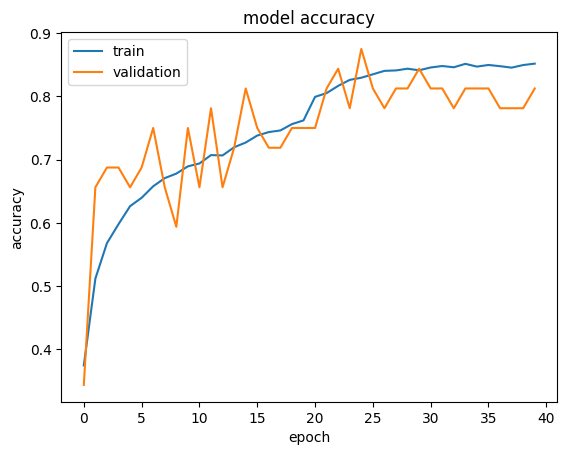

In [30]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [31]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_2.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.4101 - accuracy: 0.8750

4/4 [==============================] - 0s 4ms/step - loss: 0.6628 - accuracy: 0.7734


Loss: 0.6628023982048035, Accuracy: 0.7734375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.88      0.88      0.88        32
     neutral       0.72      0.56      0.63        32
         sad       0.60      0.75      0.67        32
    surprise       0.94      0.91      0.92        32

    accuracy                           0.77       128
   macro avg       0.78      0.77      0.77       128
weighted avg       0.78      0.77      0.77       128



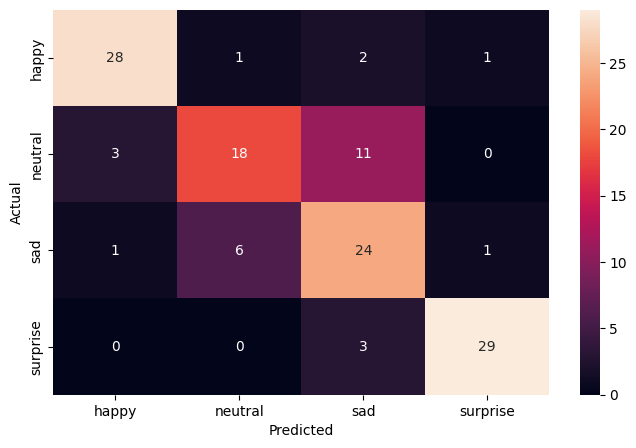

In [32]:
pred_probabilities = model_2.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The second CNN model, equipped with a more complex architecture of **938,948 parameters**, demonstrates a steady learning curve, indicating effective feature learning with a final training accuracy of approximately 69.08%. The **validation accuracy on training** experiences fluctuations but shows an upward trend, with a peak at around **84.37%**.
- On testing, the model secured a **loss of 0.5975 and an accuracy of 75%**, which confirms its capability to generalize the learned features to new data reasonably well, aligning closely with the observed validation accuracy.
- The confusion matrix reveals the model's proficiency in correctly identifying 'happy' with a high precision of 0.96 and 'surprise' emotions with impressive precision and recall of 0.93 and 0.84, respectively.
- In contrast, the model has room for improvement when predicting 'neutral' and 'sad' emotions, as indicated by lower precision and recall scores. 'Neutral' faces have the lowest precision at 0.56, suggesting the model sometimes confuses this emotion with others, while 'sad' faces have a recall of 0.56, indicating that the model fails to detect a significant portion of this emotion.


## **Think About It:**

- Did the models have a satisfactory performance? If not, then what are the possible reasons?
- Which Color mode showed better overall performance? What are the possible reasons? Do you think having 'rgb' color mode is needed because the images are already black and white?


## **Transfer Learning Architectures**

In this section, we will create several Transfer Learning architectures. For the pre-trained models, we will select three popular architectures namely, VGG16, ResNet v2, and Efficient Net. The difference between these architectures and the previous architectures is that these will require 3 input channels while the earlier ones worked on 'grayscale' images. Therefore, we need to create new DataLoaders.


### **Creating our Data Loaders for Transfer Learning Architectures**

In this section, we are creating data loaders that we will use as inputs to our Neural Network. We will have to go with color_mode = 'rgb' as this is the required format for the transfer learning architectures.


In [33]:
# Set this to 'rgb' as this is the required format for the transfer learning architectures
color_mode = "rgb"
color_layers = 3
# Resize our images to the same size expected by the transfer learning architectures
# img_width, img_height = 224, 224
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    # preprocessing_function=preprocess_input,  # Use the appropriate preprocessing function
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    horizontal_flip=True,
    brightness_range=(0.0, 2.0),
    shear_range=0.3,
    # rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    # width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    # height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    # shear_range=0.1,  # Small shear transformations for slight perspective changes
    # zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    # horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    # fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


## **VGG16 Model**


### **Importing the VGG16 Architecture**


In [34]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [35]:
vgg_model = VGG16(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in vgg_model.layers:
    layer.trainable = False

vgg_model.summary()

Model: "vgg16"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 48, 48, 3)]       0         


 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      


 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     


 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         


 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     


 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    


 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0         


 block3_conv1 (Conv2D)       (None, 12, 12, 256)       295168    


 block3_conv2 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_conv3 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_pool (MaxPooling2D)  (None, 6, 6, 256)         0         


 block4_conv1 (Conv2D)       (None, 6, 6, 512)         1180160   


 block4_conv2 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_conv3 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_pool (MaxPooling2D)  (None, 3, 3, 512)         0         


 block5_conv1 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv2 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv3 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_pool (MaxPooling2D)  (None, 1, 1, 512)         0         


Total params: 14714688 (56.13 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 14714688 (56.13 MB)


_________________________________________________________________


### **Model Building**

- Import VGG16 upto the layer of your choice and add Fully Connected layers on top of it.


In [36]:
new_vgg16_model = Sequential()

# Adding the convolutional part of the VGG16 model from above
new_vgg16_model.add(vgg_model)

# Reduces each feature map to a single value by averaging all elements
new_vgg16_model.add(Flatten())

# Adding a dense output layer
new_vgg16_model.add(Dense(256, activation="relu"))
new_vgg16_model.add(Dense(128, activation="relu"))
new_vgg16_model.add(Dropout(0.3))
new_vgg16_model.add(Dense(64, activation="relu"))
new_vgg16_model.add(BatchNormalization())
new_vgg16_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the VGG16 Model**


In [37]:
new_vgg16_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_vgg16_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 vgg16 (Functional)          (None, 1, 1, 512)         14714688  


 flatten (Flatten)           (None, 512)               0         


 dense (Dense)               (None, 256)               131328    


 dense_1 (Dense)             (None, 128)               32896     


 dropout (Dropout)           (None, 128)               0         


 dense_2 (Dense)             (None, 64)                8256      


 batch_normalization (Batch  (None, 64)                256       


 Normalization)                                                  


 dense_3 (Dense)             (None, 4)                 260       


Total params: 14887684 (56.79 MB)


Trainable params: 172868 (675.27 KB)


Non-trainable params: 14714816 (56.13 MB)


_________________________________________________________________


In [38]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_vgg16_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_vgg = new_vgg16_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 13:41 - loss: 1.9369 - accuracy: 0.2500

  6/473 [..............................] - ETA: 6s - loss: 1.8204 - accuracy: 0.2604   

  9/473 [..............................] - ETA: 7s - loss: 1.8054 - accuracy: 0.2500

 12/473 [..............................] - ETA: 7s - loss: 1.7697 - accuracy: 0.2760

 15/473 [..............................] - ETA: 7s - loss: 1.7770 - accuracy: 0.2625

 18/473 [>.............................] - ETA: 7s - loss: 1.7517 - accuracy: 0.2569

 21/473 [>.............................] - ETA: 7s - loss: 1.7374 - accuracy: 0.2634

 24/473 [>.............................] - ETA: 7s - loss: 1.7227 - accuracy: 0.2656

 27/473 [>.............................] - ETA: 7s - loss: 1.7014 - accuracy: 0.2685

 30/473 [>.............................] - ETA: 8s - loss: 1.7040 - accuracy: 0.2698

 33/473 [=>............................] - ETA: 8s - loss: 1.6959 - accuracy: 0.2727

 36/473 [=>............................] - ETA: 8s - loss: 1.6841 - accuracy: 0.2743

 39/473 [=>............................] - ETA: 7s - loss: 1.6812 - accuracy: 0.2740

 42/473 [=>............................] - ETA: 7s - loss: 1.6660 - accuracy: 0.2768

 45/473 [=>............................] - ETA: 7s - loss: 1.6636 - accuracy: 0.2750

 48/473 [==>...........................] - ETA: 7s - loss: 1.6641 - accuracy: 0.2734

 51/473 [==>...........................] - ETA: 7s - loss: 1.6547 - accuracy: 0.2727

 54/473 [==>...........................] - ETA: 7s - loss: 1.6488 - accuracy: 0.2778

 57/473 [==>...........................] - ETA: 7s - loss: 1.6419 - accuracy: 0.2785

 60/473 [==>...........................] - ETA: 7s - loss: 1.6373 - accuracy: 0.2797

 63/473 [==>...........................] - ETA: 7s - loss: 1.6281 - accuracy: 0.2822

 65/473 [===>..........................] - ETA: 7s - loss: 1.6250 - accuracy: 0.2832

 68/473 [===>..........................] - ETA: 7s - loss: 1.6149 - accuracy: 0.2849

 71/473 [===>..........................] - ETA: 7s - loss: 1.6074 - accuracy: 0.2852

 74/473 [===>..........................] - ETA: 7s - loss: 1.6005 - accuracy: 0.2859

 77/473 [===>..........................] - ETA: 7s - loss: 1.5871 - accuracy: 0.2926

 80/473 [====>.........................] - ETA: 7s - loss: 1.5812 - accuracy: 0.2937

 83/473 [====>.........................] - ETA: 7s - loss: 1.5743 - accuracy: 0.2959

 86/473 [====>.........................] - ETA: 7s - loss: 1.5664 - accuracy: 0.2987

 89/473 [====>.........................] - ETA: 7s - loss: 1.5609 - accuracy: 0.3020

 92/473 [====>.........................] - ETA: 7s - loss: 1.5566 - accuracy: 0.3040

 95/473 [=====>........................] - ETA: 7s - loss: 1.5528 - accuracy: 0.3056

 98/473 [=====>........................] - ETA: 7s - loss: 1.5447 - accuracy: 0.3096

101/473 [=====>........................] - ETA: 6s - loss: 1.5398 - accuracy: 0.3106

104/473 [=====>........................] - ETA: 6s - loss: 1.5363 - accuracy: 0.3110

107/473 [=====>........................] - ETA: 6s - loss: 1.5301 - accuracy: 0.3140

110/473 [=====>........................] - ETA: 6s - loss: 1.5255 - accuracy: 0.3156

113/473 [======>.......................] - ETA: 6s - loss: 1.5222 - accuracy: 0.3166

116/473 [======>.......................] - ETA: 6s - loss: 1.5179 - accuracy: 0.3184

119/473 [======>.......................] - ETA: 6s - loss: 1.5136 - accuracy: 0.3185

122/473 [======>.......................] - ETA: 6s - loss: 1.5097 - accuracy: 0.3184

125/473 [======>.......................] - ETA: 6s - loss: 1.5101 - accuracy: 0.3160

128/473 [=======>......................] - ETA: 6s - loss: 1.5057 - accuracy: 0.3181

131/473 [=======>......................] - ETA: 6s - loss: 1.5044 - accuracy: 0.3204

134/473 [=======>......................] - ETA: 6s - loss: 1.5013 - accuracy: 0.3218

137/473 [=======>......................] - ETA: 6s - loss: 1.4990 - accuracy: 0.3214

140/473 [=======>......................] - ETA: 6s - loss: 1.4962 - accuracy: 0.3217

143/473 [========>.....................] - ETA: 6s - loss: 1.4923 - accuracy: 0.3230

146/473 [========>.....................] - ETA: 6s - loss: 1.4909 - accuracy: 0.3221

149/473 [========>.....................] - ETA: 6s - loss: 1.4874 - accuracy: 0.3236

152/473 [========>.....................] - ETA: 5s - loss: 1.4843 - accuracy: 0.3248

155/473 [========>.....................] - ETA: 5s - loss: 1.4832 - accuracy: 0.3238

158/473 [=========>....................] - ETA: 5s - loss: 1.4791 - accuracy: 0.3250

161/473 [=========>....................] - ETA: 5s - loss: 1.4755 - accuracy: 0.3273

164/473 [=========>....................] - ETA: 5s - loss: 1.4748 - accuracy: 0.3268

167/473 [=========>....................] - ETA: 5s - loss: 1.4722 - accuracy: 0.3271

170/473 [=========>....................] - ETA: 5s - loss: 1.4705 - accuracy: 0.3276

173/473 [=========>....................] - ETA: 5s - loss: 1.4660 - accuracy: 0.3302

176/473 [==========>...................] - ETA: 5s - loss: 1.4627 - accuracy: 0.3319

179/473 [==========>...................] - ETA: 5s - loss: 1.4603 - accuracy: 0.3324

182/473 [==========>...................] - ETA: 5s - loss: 1.4575 - accuracy: 0.3333

185/473 [==========>...................] - ETA: 5s - loss: 1.4554 - accuracy: 0.3351

188/473 [==========>...................] - ETA: 5s - loss: 1.4522 - accuracy: 0.3359

191/473 [===========>..................] - ETA: 5s - loss: 1.4513 - accuracy: 0.3362

194/473 [===========>..................] - ETA: 5s - loss: 1.4509 - accuracy: 0.3360

197/473 [===========>..................] - ETA: 5s - loss: 1.4485 - accuracy: 0.3363

200/473 [===========>..................] - ETA: 5s - loss: 1.4467 - accuracy: 0.3370

203/473 [===========>..................] - ETA: 5s - loss: 1.4449 - accuracy: 0.3376

206/473 [============>.................] - ETA: 4s - loss: 1.4437 - accuracy: 0.3378

209/473 [============>.................] - ETA: 4s - loss: 1.4427 - accuracy: 0.3379

212/473 [============>.................] - ETA: 4s - loss: 1.4406 - accuracy: 0.3384

215/473 [============>.................] - ETA: 4s - loss: 1.4395 - accuracy: 0.3385

218/473 [============>.................] - ETA: 4s - loss: 1.4388 - accuracy: 0.3380

221/473 [=============>................] - ETA: 4s - loss: 1.4363 - accuracy: 0.3388

224/473 [=============>................] - ETA: 4s - loss: 1.4356 - accuracy: 0.3393

227/473 [=============>................] - ETA: 4s - loss: 1.4335 - accuracy: 0.3406

230/473 [=============>................] - ETA: 4s - loss: 1.4314 - accuracy: 0.3418

233/473 [=============>................] - ETA: 4s - loss: 1.4299 - accuracy: 0.3424

236/473 [=============>................] - ETA: 4s - loss: 1.4271 - accuracy: 0.3439

239/473 [==============>...............] - ETA: 4s - loss: 1.4254 - accuracy: 0.3449

242/473 [==============>...............] - ETA: 4s - loss: 1.4241 - accuracy: 0.3456

245/473 [==============>...............] - ETA: 4s - loss: 1.4228 - accuracy: 0.3460

248/473 [==============>...............] - ETA: 4s - loss: 1.4205 - accuracy: 0.3472

251/473 [==============>...............] - ETA: 4s - loss: 1.4191 - accuracy: 0.3476

254/473 [===============>..............] - ETA: 4s - loss: 1.4187 - accuracy: 0.3469

257/473 [===============>..............] - ETA: 4s - loss: 1.4171 - accuracy: 0.3474

260/473 [===============>..............] - ETA: 3s - loss: 1.4144 - accuracy: 0.3487

263/473 [===============>..............] - ETA: 3s - loss: 1.4129 - accuracy: 0.3496

266/473 [===============>..............] - ETA: 3s - loss: 1.4111 - accuracy: 0.3502

269/473 [================>.............] - ETA: 3s - loss: 1.4101 - accuracy: 0.3503

272/473 [================>.............] - ETA: 3s - loss: 1.4079 - accuracy: 0.3511

275/473 [================>.............] - ETA: 3s - loss: 1.4059 - accuracy: 0.3511

278/473 [================>.............] - ETA: 3s - loss: 1.4045 - accuracy: 0.3520

281/473 [================>.............] - ETA: 3s - loss: 1.4030 - accuracy: 0.3530

284/473 [=================>............] - ETA: 3s - loss: 1.4021 - accuracy: 0.3526

287/473 [=================>............] - ETA: 3s - loss: 1.4017 - accuracy: 0.3534

290/473 [=================>............] - ETA: 3s - loss: 1.4008 - accuracy: 0.3545

293/473 [=================>............] - ETA: 3s - loss: 1.4001 - accuracy: 0.3549

296/473 [=================>............] - ETA: 3s - loss: 1.3982 - accuracy: 0.3555

299/473 [=================>............] - ETA: 3s - loss: 1.3957 - accuracy: 0.3568

302/473 [==================>...........] - ETA: 3s - loss: 1.3944 - accuracy: 0.3571

305/473 [==================>...........] - ETA: 3s - loss: 1.3929 - accuracy: 0.3575

308/473 [==================>...........] - ETA: 3s - loss: 1.3911 - accuracy: 0.3583

310/473 [==================>...........] - ETA: 3s - loss: 1.3903 - accuracy: 0.3586

313/473 [==================>...........] - ETA: 2s - loss: 1.3899 - accuracy: 0.3588

316/473 [===================>..........] - ETA: 2s - loss: 1.3899 - accuracy: 0.3581

319/473 [===================>..........] - ETA: 2s - loss: 1.3885 - accuracy: 0.3592

322/473 [===================>..........] - ETA: 2s - loss: 1.3874 - accuracy: 0.3602

325/473 [===================>..........] - ETA: 2s - loss: 1.3864 - accuracy: 0.3605

328/473 [===================>..........] - ETA: 2s - loss: 1.3864 - accuracy: 0.3603

331/473 [===================>..........] - ETA: 2s - loss: 1.3855 - accuracy: 0.3603

334/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.3611

337/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.3614

340/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.3624

343/473 [====================>.........] - ETA: 2s - loss: 1.3808 - accuracy: 0.3626

346/473 [====================>.........] - ETA: 2s - loss: 1.3806 - accuracy: 0.3624

349/473 [=====================>........] - ETA: 2s - loss: 1.3800 - accuracy: 0.3622

352/473 [=====================>........] - ETA: 2s - loss: 1.3788 - accuracy: 0.3629

355/473 [=====================>........] - ETA: 2s - loss: 1.3783 - accuracy: 0.3630

358/473 [=====================>........] - ETA: 2s - loss: 1.3775 - accuracy: 0.3637

361/473 [=====================>........] - ETA: 2s - loss: 1.3763 - accuracy: 0.3644

364/473 [======================>.......] - ETA: 2s - loss: 1.3747 - accuracy: 0.3650

367/473 [======================>.......] - ETA: 1s - loss: 1.3735 - accuracy: 0.3661

370/473 [======================>.......] - ETA: 1s - loss: 1.3731 - accuracy: 0.3658

373/473 [======================>.......] - ETA: 1s - loss: 1.3725 - accuracy: 0.3659

379/473 [=======================>......] - ETA: 1s - loss: 1.3719 - accuracy: 0.3654

382/473 [=======================>......] - ETA: 1s - loss: 1.3709 - accuracy: 0.3656

385/473 [=======================>......] - ETA: 1s - loss: 1.3698 - accuracy: 0.3661

388/473 [=======================>......] - ETA: 1s - loss: 1.3688 - accuracy: 0.3664

391/473 [=======================>......] - ETA: 1s - loss: 1.3683 - accuracy: 0.3671

394/473 [=======================>......] - ETA: 1s - loss: 1.3675 - accuracy: 0.3673

397/473 [========================>.....] - ETA: 1s - loss: 1.3673 - accuracy: 0.3674

400/473 [========================>.....] - ETA: 1s - loss: 1.3668 - accuracy: 0.3675

403/473 [========================>.....] - ETA: 1s - loss: 1.3662 - accuracy: 0.3681

406/473 [========================>.....] - ETA: 1s - loss: 1.3656 - accuracy: 0.3684

409/473 [========================>.....] - ETA: 1s - loss: 1.3644 - accuracy: 0.3687

412/473 [=========================>....] - ETA: 1s - loss: 1.3637 - accuracy: 0.3689

415/473 [=========================>....] - ETA: 1s - loss: 1.3624 - accuracy: 0.3690

418/473 [=========================>....] - ETA: 1s - loss: 1.3608 - accuracy: 0.3695

421/473 [=========================>....] - ETA: 0s - loss: 1.3599 - accuracy: 0.3700

424/473 [=========================>....] - ETA: 0s - loss: 1.3597 - accuracy: 0.3698

427/473 [==========================>...] - ETA: 0s - loss: 1.3589 - accuracy: 0.3699

430/473 [==========================>...] - ETA: 0s - loss: 1.3578 - accuracy: 0.3706

433/473 [==========================>...] - ETA: 0s - loss: 1.3571 - accuracy: 0.3710

436/473 [==========================>...] - ETA: 0s - loss: 1.3563 - accuracy: 0.3712

439/473 [==========================>...] - ETA: 0s - loss: 1.3560 - accuracy: 0.3710

442/473 [===========================>..] - ETA: 0s - loss: 1.3550 - accuracy: 0.3720

445/473 [===========================>..] - ETA: 0s - loss: 1.3548 - accuracy: 0.3721

448/473 [===========================>..] - ETA: 0s - loss: 1.3542 - accuracy: 0.3723

451/473 [===========================>..] - ETA: 0s - loss: 1.3541 - accuracy: 0.3720

454/473 [===========================>..] - ETA: 0s - loss: 1.3540 - accuracy: 0.3722

457/473 [===========================>..] - ETA: 0s - loss: 1.3536 - accuracy: 0.3727

460/473 [============================>.] - ETA: 0s - loss: 1.3531 - accuracy: 0.3732

463/473 [============================>.] - ETA: 0s - loss: 1.3529 - accuracy: 0.3730

466/473 [============================>.] - ETA: 0s - loss: 1.3515 - accuracy: 0.3735

469/473 [============================>.] - ETA: 0s - loss: 1.3505 - accuracy: 0.3742

472/473 [============================>.] - ETA: 0s - loss: 1.3500 - accuracy: 0.3744

473/473 [==============================] - 11s 19ms/step - loss: 1.3502 - accuracy: 0.3743 - val_loss: 1.3270 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 14s - loss: 1.2371 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.1701 - accuracy: 0.4609 

  7/473 [..............................] - ETA: 8s - loss: 1.1617 - accuracy: 0.5000

 10/473 [..............................] - ETA: 8s - loss: 1.1961 - accuracy: 0.4938

 13/473 [..............................] - ETA: 8s - loss: 1.2308 - accuracy: 0.4832

 16/473 [>.............................] - ETA: 8s - loss: 1.2256 - accuracy: 0.4668

 19/473 [>.............................] - ETA: 8s - loss: 1.2282 - accuracy: 0.4605

 22/473 [>.............................] - ETA: 8s - loss: 1.2306 - accuracy: 0.4574

 25/473 [>.............................] - ETA: 8s - loss: 1.2152 - accuracy: 0.4538

 28/473 [>.............................] - ETA: 8s - loss: 1.2195 - accuracy: 0.4565

 31/473 [>.............................] - ETA: 8s - loss: 1.2250 - accuracy: 0.4526

 34/473 [=>............................] - ETA: 7s - loss: 1.2184 - accuracy: 0.4568

 37/473 [=>............................] - ETA: 7s - loss: 1.2258 - accuracy: 0.4527

 40/473 [=>............................] - ETA: 7s - loss: 1.2248 - accuracy: 0.4516

 43/473 [=>............................] - ETA: 7s - loss: 1.2271 - accuracy: 0.4426

 46/473 [=>............................] - ETA: 7s - loss: 1.2267 - accuracy: 0.4450

 49/473 [==>...........................] - ETA: 7s - loss: 1.2269 - accuracy: 0.4464

 52/473 [==>...........................] - ETA: 7s - loss: 1.2246 - accuracy: 0.4519

 55/473 [==>...........................] - ETA: 7s - loss: 1.2231 - accuracy: 0.4506

 58/473 [==>...........................] - ETA: 7s - loss: 1.2194 - accuracy: 0.4510

 61/473 [==>...........................] - ETA: 7s - loss: 1.2240 - accuracy: 0.4498

 64/473 [===>..........................] - ETA: 7s - loss: 1.2221 - accuracy: 0.4502

 67/473 [===>..........................] - ETA: 7s - loss: 1.2299 - accuracy: 0.4468

 70/473 [===>..........................] - ETA: 7s - loss: 1.2260 - accuracy: 0.4487

 73/473 [===>..........................] - ETA: 7s - loss: 1.2288 - accuracy: 0.4469

 76/473 [===>..........................] - ETA: 7s - loss: 1.2280 - accuracy: 0.4478

 79/473 [====>.........................] - ETA: 7s - loss: 1.2272 - accuracy: 0.4486

 82/473 [====>.........................] - ETA: 7s - loss: 1.2209 - accuracy: 0.4520

 85/473 [====>.........................] - ETA: 7s - loss: 1.2190 - accuracy: 0.4529

 88/473 [====>.........................] - ETA: 7s - loss: 1.2180 - accuracy: 0.4521

 91/473 [====>.........................] - ETA: 6s - loss: 1.2163 - accuracy: 0.4523

 94/473 [====>.........................] - ETA: 6s - loss: 1.2147 - accuracy: 0.4525

 97/473 [=====>........................] - ETA: 6s - loss: 1.2161 - accuracy: 0.4510

100/473 [=====>........................] - ETA: 6s - loss: 1.2196 - accuracy: 0.4481

103/473 [=====>........................] - ETA: 6s - loss: 1.2211 - accuracy: 0.4460

106/473 [=====>........................] - ETA: 6s - loss: 1.2201 - accuracy: 0.4475

109/473 [=====>........................] - ETA: 6s - loss: 1.2185 - accuracy: 0.4472

112/473 [======>.......................] - ETA: 6s - loss: 1.2176 - accuracy: 0.4473

115/473 [======>.......................] - ETA: 6s - loss: 1.2192 - accuracy: 0.4454

118/473 [======>.......................] - ETA: 6s - loss: 1.2202 - accuracy: 0.4444

121/473 [======>.......................] - ETA: 6s - loss: 1.2214 - accuracy: 0.4427

124/473 [======>.......................] - ETA: 6s - loss: 1.2211 - accuracy: 0.4435

127/473 [=======>......................] - ETA: 6s - loss: 1.2220 - accuracy: 0.4427

130/473 [=======>......................] - ETA: 6s - loss: 1.2199 - accuracy: 0.4428

133/473 [=======>......................] - ETA: 6s - loss: 1.2195 - accuracy: 0.4424

136/473 [=======>......................] - ETA: 6s - loss: 1.2201 - accuracy: 0.4432

139/473 [=======>......................] - ETA: 6s - loss: 1.2188 - accuracy: 0.4440

142/473 [========>.....................] - ETA: 6s - loss: 1.2188 - accuracy: 0.4437

145/473 [========>.....................] - ETA: 6s - loss: 1.2207 - accuracy: 0.4427

148/473 [========>.....................] - ETA: 5s - loss: 1.2241 - accuracy: 0.4402

151/473 [========>.....................] - ETA: 5s - loss: 1.2237 - accuracy: 0.4410

154/473 [========>.....................] - ETA: 5s - loss: 1.2263 - accuracy: 0.4395

157/473 [========>.....................] - ETA: 5s - loss: 1.2253 - accuracy: 0.4405

160/473 [=========>....................] - ETA: 5s - loss: 1.2259 - accuracy: 0.4395

163/473 [=========>....................] - ETA: 5s - loss: 1.2261 - accuracy: 0.4402

166/473 [=========>....................] - ETA: 5s - loss: 1.2251 - accuracy: 0.4411

168/473 [=========>....................] - ETA: 5s - loss: 1.2256 - accuracy: 0.4410

170/473 [=========>....................] - ETA: 5s - loss: 1.2248 - accuracy: 0.4406

173/473 [=========>....................] - ETA: 5s - loss: 1.2259 - accuracy: 0.4404

176/473 [==========>...................] - ETA: 5s - loss: 1.2259 - accuracy: 0.4405

179/473 [==========>...................] - ETA: 5s - loss: 1.2254 - accuracy: 0.4412

182/473 [==========>...................] - ETA: 5s - loss: 1.2256 - accuracy: 0.4414

185/473 [==========>...................] - ETA: 5s - loss: 1.2275 - accuracy: 0.4400

188/473 [==========>...................] - ETA: 5s - loss: 1.2275 - accuracy: 0.4395

191/473 [===========>..................] - ETA: 5s - loss: 1.2278 - accuracy: 0.4398

194/473 [===========>..................] - ETA: 5s - loss: 1.2281 - accuracy: 0.4389

197/473 [===========>..................] - ETA: 5s - loss: 1.2271 - accuracy: 0.4397

200/473 [===========>..................] - ETA: 5s - loss: 1.2268 - accuracy: 0.4402

203/473 [===========>..................] - ETA: 5s - loss: 1.2272 - accuracy: 0.4393

206/473 [============>.................] - ETA: 4s - loss: 1.2279 - accuracy: 0.4381

209/473 [============>.................] - ETA: 4s - loss: 1.2280 - accuracy: 0.4385

212/473 [============>.................] - ETA: 4s - loss: 1.2270 - accuracy: 0.4396

215/473 [============>.................] - ETA: 4s - loss: 1.2271 - accuracy: 0.4387

218/473 [============>.................] - ETA: 4s - loss: 1.2258 - accuracy: 0.4395

221/473 [=============>................] - ETA: 4s - loss: 1.2256 - accuracy: 0.4403

224/473 [=============>................] - ETA: 4s - loss: 1.2247 - accuracy: 0.4411

227/473 [=============>................] - ETA: 4s - loss: 1.2254 - accuracy: 0.4412

230/473 [=============>................] - ETA: 4s - loss: 1.2243 - accuracy: 0.4413

233/473 [=============>................] - ETA: 4s - loss: 1.2241 - accuracy: 0.4413

236/473 [=============>................] - ETA: 4s - loss: 1.2239 - accuracy: 0.4409

239/473 [==============>...............] - ETA: 4s - loss: 1.2231 - accuracy: 0.4417

242/473 [==============>...............] - ETA: 4s - loss: 1.2215 - accuracy: 0.4431

245/473 [==============>...............] - ETA: 4s - loss: 1.2208 - accuracy: 0.4440

248/473 [==============>...............] - ETA: 4s - loss: 1.2191 - accuracy: 0.4451

251/473 [==============>...............] - ETA: 4s - loss: 1.2208 - accuracy: 0.4443

254/473 [===============>..............] - ETA: 4s - loss: 1.2229 - accuracy: 0.4430

257/473 [===============>..............] - ETA: 4s - loss: 1.2240 - accuracy: 0.4425

260/473 [===============>..............] - ETA: 3s - loss: 1.2240 - accuracy: 0.4427

263/473 [===============>..............] - ETA: 3s - loss: 1.2246 - accuracy: 0.4423

266/473 [===============>..............] - ETA: 3s - loss: 1.2235 - accuracy: 0.4427

269/473 [================>.............] - ETA: 3s - loss: 1.2232 - accuracy: 0.4428

272/473 [================>.............] - ETA: 3s - loss: 1.2227 - accuracy: 0.4427

275/473 [================>.............] - ETA: 3s - loss: 1.2228 - accuracy: 0.4434

278/473 [================>.............] - ETA: 3s - loss: 1.2212 - accuracy: 0.4446

282/473 [================>.............] - ETA: 3s - loss: 1.2216 - accuracy: 0.4441

285/473 [=================>............] - ETA: 3s - loss: 1.2221 - accuracy: 0.4437

288/473 [=================>............] - ETA: 3s - loss: 1.2220 - accuracy: 0.4436

291/473 [=================>............] - ETA: 3s - loss: 1.2229 - accuracy: 0.4431

294/473 [=================>............] - ETA: 3s - loss: 1.2237 - accuracy: 0.4427

297/473 [=================>............] - ETA: 3s - loss: 1.2236 - accuracy: 0.4422

300/473 [==================>...........] - ETA: 3s - loss: 1.2239 - accuracy: 0.4424

303/473 [==================>...........] - ETA: 3s - loss: 1.2232 - accuracy: 0.4425

306/473 [==================>...........] - ETA: 3s - loss: 1.2237 - accuracy: 0.4418

309/473 [==================>...........] - ETA: 3s - loss: 1.2235 - accuracy: 0.4422

312/473 [==================>...........] - ETA: 2s - loss: 1.2239 - accuracy: 0.4420

315/473 [==================>...........] - ETA: 2s - loss: 1.2262 - accuracy: 0.4405

318/473 [===================>..........] - ETA: 2s - loss: 1.2259 - accuracy: 0.4403

321/473 [===================>..........] - ETA: 2s - loss: 1.2256 - accuracy: 0.4405

324/473 [===================>..........] - ETA: 2s - loss: 1.2252 - accuracy: 0.4413

327/473 [===================>..........] - ETA: 2s - loss: 1.2248 - accuracy: 0.4412

330/473 [===================>..........] - ETA: 2s - loss: 1.2245 - accuracy: 0.4414

333/473 [====================>.........] - ETA: 2s - loss: 1.2245 - accuracy: 0.4411

336/473 [====================>.........] - ETA: 2s - loss: 1.2245 - accuracy: 0.4412

339/473 [====================>.........] - ETA: 2s - loss: 1.2246 - accuracy: 0.4412

342/473 [====================>.........] - ETA: 2s - loss: 1.2250 - accuracy: 0.4407

345/473 [====================>.........] - ETA: 2s - loss: 1.2247 - accuracy: 0.4409

348/473 [=====================>........] - ETA: 2s - loss: 1.2242 - accuracy: 0.4406

351/473 [=====================>........] - ETA: 2s - loss: 1.2237 - accuracy: 0.4413

354/473 [=====================>........] - ETA: 2s - loss: 1.2239 - accuracy: 0.4413

357/473 [=====================>........] - ETA: 2s - loss: 1.2237 - accuracy: 0.4415

360/473 [=====================>........] - ETA: 2s - loss: 1.2239 - accuracy: 0.4409

363/473 [======================>.......] - ETA: 2s - loss: 1.2239 - accuracy: 0.4404

366/473 [======================>.......] - ETA: 1s - loss: 1.2238 - accuracy: 0.4406

369/473 [======================>.......] - ETA: 1s - loss: 1.2238 - accuracy: 0.4404

372/473 [======================>.......] - ETA: 1s - loss: 1.2238 - accuracy: 0.4403

375/473 [======================>.......] - ETA: 1s - loss: 1.2240 - accuracy: 0.4401

378/473 [======================>.......] - ETA: 1s - loss: 1.2232 - accuracy: 0.4410

381/473 [=======================>......] - ETA: 1s - loss: 1.2231 - accuracy: 0.4409

384/473 [=======================>......] - ETA: 1s - loss: 1.2228 - accuracy: 0.4410

387/473 [=======================>......] - ETA: 1s - loss: 1.2237 - accuracy: 0.4409

390/473 [=======================>......] - ETA: 1s - loss: 1.2236 - accuracy: 0.4408

393/473 [=======================>......] - ETA: 1s - loss: 1.2233 - accuracy: 0.4404

396/473 [========================>.....] - ETA: 1s - loss: 1.2234 - accuracy: 0.4410

399/473 [========================>.....] - ETA: 1s - loss: 1.2232 - accuracy: 0.4414

402/473 [========================>.....] - ETA: 1s - loss: 1.2222 - accuracy: 0.4423

405/473 [========================>.....] - ETA: 1s - loss: 1.2218 - accuracy: 0.4424

408/473 [========================>.....] - ETA: 1s - loss: 1.2219 - accuracy: 0.4428

411/473 [=========================>....] - ETA: 1s - loss: 1.2208 - accuracy: 0.4432

414/473 [=========================>....] - ETA: 1s - loss: 1.2204 - accuracy: 0.4435

417/473 [=========================>....] - ETA: 1s - loss: 1.2200 - accuracy: 0.4435

420/473 [=========================>....] - ETA: 0s - loss: 1.2189 - accuracy: 0.4440

423/473 [=========================>....] - ETA: 0s - loss: 1.2192 - accuracy: 0.4441

426/473 [==========================>...] - ETA: 0s - loss: 1.2195 - accuracy: 0.4442

429/473 [==========================>...] - ETA: 0s - loss: 1.2194 - accuracy: 0.4443

432/473 [==========================>...] - ETA: 0s - loss: 1.2184 - accuracy: 0.4450

435/473 [==========================>...] - ETA: 0s - loss: 1.2185 - accuracy: 0.4451

438/473 [==========================>...] - ETA: 0s - loss: 1.2190 - accuracy: 0.4448

441/473 [==========================>...] - ETA: 0s - loss: 1.2188 - accuracy: 0.4450

444/473 [===========================>..] - ETA: 0s - loss: 1.2183 - accuracy: 0.4456

447/473 [===========================>..] - ETA: 0s - loss: 1.2183 - accuracy: 0.4459

450/473 [===========================>..] - ETA: 0s - loss: 1.2183 - accuracy: 0.4459

453/473 [===========================>..] - ETA: 0s - loss: 1.2184 - accuracy: 0.4459

456/473 [===========================>..] - ETA: 0s - loss: 1.2183 - accuracy: 0.4455

459/473 [============================>.] - ETA: 0s - loss: 1.2181 - accuracy: 0.4459

462/473 [============================>.] - ETA: 0s - loss: 1.2179 - accuracy: 0.4457

465/473 [============================>.] - ETA: 0s - loss: 1.2181 - accuracy: 0.4456

468/473 [============================>.] - ETA: 0s - loss: 1.2177 - accuracy: 0.4456

471/473 [============================>.] - ETA: 0s - loss: 1.2174 - accuracy: 0.4458

473/473 [==============================] - 9s 18ms/step - loss: 1.2173 - accuracy: 0.4458 - val_loss: 0.9911 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 14s - loss: 1.1649 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.2002 - accuracy: 0.4766 

  7/473 [..............................] - ETA: 8s - loss: 1.2095 - accuracy: 0.4554

 10/473 [..............................] - ETA: 8s - loss: 1.2352 - accuracy: 0.4531

 13/473 [..............................] - ETA: 8s - loss: 1.2502 - accuracy: 0.4495

 16/473 [>.............................] - ETA: 8s - loss: 1.2276 - accuracy: 0.4551

 19/473 [>.............................] - ETA: 8s - loss: 1.2369 - accuracy: 0.4507

 22/473 [>.............................] - ETA: 8s - loss: 1.2378 - accuracy: 0.4460

 25/473 [>.............................] - ETA: 7s - loss: 1.2409 - accuracy: 0.4375

 28/473 [>.............................] - ETA: 7s - loss: 1.2344 - accuracy: 0.4375

 31/473 [>.............................] - ETA: 7s - loss: 1.2417 - accuracy: 0.4315

 34/473 [=>............................] - ETA: 7s - loss: 1.2455 - accuracy: 0.4292

 37/473 [=>............................] - ETA: 7s - loss: 1.2466 - accuracy: 0.4299

 40/473 [=>............................] - ETA: 7s - loss: 1.2449 - accuracy: 0.4320

 43/473 [=>............................] - ETA: 7s - loss: 1.2480 - accuracy: 0.4281

 46/473 [=>............................] - ETA: 7s - loss: 1.2526 - accuracy: 0.4266

 49/473 [==>...........................] - ETA: 7s - loss: 1.2522 - accuracy: 0.4247

 52/473 [==>...........................] - ETA: 7s - loss: 1.2492 - accuracy: 0.4279

 55/473 [==>...........................] - ETA: 7s - loss: 1.2459 - accuracy: 0.4278

 58/473 [==>...........................] - ETA: 7s - loss: 1.2417 - accuracy: 0.4289

 61/473 [==>...........................] - ETA: 7s - loss: 1.2397 - accuracy: 0.4303

 64/473 [===>..........................] - ETA: 7s - loss: 1.2364 - accuracy: 0.4316

 67/473 [===>..........................] - ETA: 7s - loss: 1.2378 - accuracy: 0.4291

 70/473 [===>..........................] - ETA: 7s - loss: 1.2393 - accuracy: 0.4299

 73/473 [===>..........................] - ETA: 7s - loss: 1.2390 - accuracy: 0.4319

 76/473 [===>..........................] - ETA: 7s - loss: 1.2355 - accuracy: 0.4338

 79/473 [====>.........................] - ETA: 7s - loss: 1.2351 - accuracy: 0.4331

 82/473 [====>.........................] - ETA: 7s - loss: 1.2316 - accuracy: 0.4360

 85/473 [====>.........................] - ETA: 6s - loss: 1.2311 - accuracy: 0.4360

 88/473 [====>.........................] - ETA: 6s - loss: 1.2242 - accuracy: 0.4407

 91/473 [====>.........................] - ETA: 6s - loss: 1.2264 - accuracy: 0.4413

 94/473 [====>.........................] - ETA: 6s - loss: 1.2262 - accuracy: 0.4402

 97/473 [=====>........................] - ETA: 6s - loss: 1.2239 - accuracy: 0.4433

100/473 [=====>........................] - ETA: 6s - loss: 1.2233 - accuracy: 0.4453

103/473 [=====>........................] - ETA: 6s - loss: 1.2215 - accuracy: 0.4460

106/473 [=====>........................] - ETA: 6s - loss: 1.2194 - accuracy: 0.4469

109/473 [=====>........................] - ETA: 6s - loss: 1.2186 - accuracy: 0.4464

112/473 [======>.......................] - ETA: 6s - loss: 1.2176 - accuracy: 0.4467

115/473 [======>.......................] - ETA: 6s - loss: 1.2209 - accuracy: 0.4459

118/473 [======>.......................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4468

121/473 [======>.......................] - ETA: 6s - loss: 1.2190 - accuracy: 0.4465

124/473 [======>.......................] - ETA: 6s - loss: 1.2187 - accuracy: 0.4453

126/473 [======>.......................] - ETA: 6s - loss: 1.2193 - accuracy: 0.4457

129/473 [=======>......................] - ETA: 6s - loss: 1.2188 - accuracy: 0.4457

132/473 [=======>......................] - ETA: 6s - loss: 1.2176 - accuracy: 0.4474

135/473 [=======>......................] - ETA: 6s - loss: 1.2190 - accuracy: 0.4454

138/473 [=======>......................] - ETA: 6s - loss: 1.2190 - accuracy: 0.4445

141/473 [=======>......................] - ETA: 5s - loss: 1.2180 - accuracy: 0.4450

144/473 [========>.....................] - ETA: 5s - loss: 1.2172 - accuracy: 0.4457

147/473 [========>.....................] - ETA: 5s - loss: 1.2185 - accuracy: 0.4439

150/473 [========>.....................] - ETA: 5s - loss: 1.2178 - accuracy: 0.4440

153/473 [========>.....................] - ETA: 5s - loss: 1.2151 - accuracy: 0.4453

156/473 [========>.....................] - ETA: 5s - loss: 1.2158 - accuracy: 0.4443

159/473 [=========>....................] - ETA: 5s - loss: 1.2158 - accuracy: 0.4444

162/473 [=========>....................] - ETA: 5s - loss: 1.2158 - accuracy: 0.4443

165/473 [=========>....................] - ETA: 5s - loss: 1.2163 - accuracy: 0.4443

168/473 [=========>....................] - ETA: 5s - loss: 1.2158 - accuracy: 0.4440

171/473 [=========>....................] - ETA: 5s - loss: 1.2147 - accuracy: 0.4446

174/473 [==========>...................] - ETA: 5s - loss: 1.2152 - accuracy: 0.4441

177/473 [==========>...................] - ETA: 5s - loss: 1.2140 - accuracy: 0.4446

180/473 [==========>...................] - ETA: 5s - loss: 1.2131 - accuracy: 0.4448

183/473 [==========>...................] - ETA: 5s - loss: 1.2102 - accuracy: 0.4471

186/473 [==========>...................] - ETA: 5s - loss: 1.2089 - accuracy: 0.4477

189/473 [==========>...................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4484

192/473 [===========>..................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4484

195/473 [===========>..................] - ETA: 5s - loss: 1.2096 - accuracy: 0.4484

198/473 [===========>..................] - ETA: 4s - loss: 1.2088 - accuracy: 0.4485

201/473 [===========>..................] - ETA: 4s - loss: 1.2093 - accuracy: 0.4481

204/473 [===========>..................] - ETA: 4s - loss: 1.2097 - accuracy: 0.4481

207/473 [============>.................] - ETA: 4s - loss: 1.2091 - accuracy: 0.4481

210/473 [============>.................] - ETA: 4s - loss: 1.2097 - accuracy: 0.4479

213/473 [============>.................] - ETA: 4s - loss: 1.2093 - accuracy: 0.4476

216/473 [============>.................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4469

219/473 [============>.................] - ETA: 4s - loss: 1.2085 - accuracy: 0.4479

222/473 [=============>................] - ETA: 4s - loss: 1.2073 - accuracy: 0.4485

225/473 [=============>................] - ETA: 4s - loss: 1.2073 - accuracy: 0.4476

228/473 [=============>................] - ETA: 4s - loss: 1.2072 - accuracy: 0.4481

231/473 [=============>................] - ETA: 4s - loss: 1.2059 - accuracy: 0.4482

234/473 [=============>................] - ETA: 4s - loss: 1.2038 - accuracy: 0.4503

236/473 [=============>................] - ETA: 4s - loss: 1.2045 - accuracy: 0.4498

239/473 [==============>...............] - ETA: 4s - loss: 1.2045 - accuracy: 0.4494

242/473 [==============>...............] - ETA: 4s - loss: 1.2054 - accuracy: 0.4490

245/473 [==============>...............] - ETA: 4s - loss: 1.2055 - accuracy: 0.4489

248/473 [==============>...............] - ETA: 4s - loss: 1.2067 - accuracy: 0.4485

251/473 [==============>...............] - ETA: 4s - loss: 1.2053 - accuracy: 0.4495

254/473 [===============>..............] - ETA: 4s - loss: 1.2057 - accuracy: 0.4499

257/473 [===============>..............] - ETA: 3s - loss: 1.2052 - accuracy: 0.4501

260/473 [===============>..............] - ETA: 3s - loss: 1.2052 - accuracy: 0.4504

263/473 [===============>..............] - ETA: 3s - loss: 1.2061 - accuracy: 0.4495

266/473 [===============>..............] - ETA: 3s - loss: 1.2073 - accuracy: 0.4490

269/473 [================>.............] - ETA: 3s - loss: 1.2069 - accuracy: 0.4495

272/473 [================>.............] - ETA: 3s - loss: 1.2063 - accuracy: 0.4493

275/473 [================>.............] - ETA: 3s - loss: 1.2058 - accuracy: 0.4497

278/473 [================>.............] - ETA: 3s - loss: 1.2047 - accuracy: 0.4501

281/473 [================>.............] - ETA: 3s - loss: 1.2035 - accuracy: 0.4511

284/473 [=================>............] - ETA: 3s - loss: 1.2044 - accuracy: 0.4508

287/473 [=================>............] - ETA: 3s - loss: 1.2041 - accuracy: 0.4513

290/473 [=================>............] - ETA: 3s - loss: 1.2038 - accuracy: 0.4516

293/473 [=================>............] - ETA: 3s - loss: 1.2040 - accuracy: 0.4517

296/473 [=================>............] - ETA: 3s - loss: 1.2032 - accuracy: 0.4520

299/473 [=================>............] - ETA: 3s - loss: 1.2019 - accuracy: 0.4532

302/473 [==================>...........] - ETA: 3s - loss: 1.2012 - accuracy: 0.4538

305/473 [==================>...........] - ETA: 3s - loss: 1.2011 - accuracy: 0.4537

308/473 [==================>...........] - ETA: 3s - loss: 1.2015 - accuracy: 0.4533

311/473 [==================>...........] - ETA: 2s - loss: 1.2015 - accuracy: 0.4533

314/473 [==================>...........] - ETA: 2s - loss: 1.2009 - accuracy: 0.4541

317/473 [===================>..........] - ETA: 2s - loss: 1.2007 - accuracy: 0.4543

320/473 [===================>..........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4549

323/473 [===================>..........] - ETA: 2s - loss: 1.2009 - accuracy: 0.4546

326/473 [===================>..........] - ETA: 2s - loss: 1.2012 - accuracy: 0.4546

329/473 [===================>..........] - ETA: 2s - loss: 1.2025 - accuracy: 0.4543

332/473 [====================>.........] - ETA: 2s - loss: 1.2027 - accuracy: 0.4550

335/473 [====================>.........] - ETA: 2s - loss: 1.2030 - accuracy: 0.4551

338/473 [====================>.........] - ETA: 2s - loss: 1.2028 - accuracy: 0.4553

341/473 [====================>.........] - ETA: 2s - loss: 1.2026 - accuracy: 0.4554

344/473 [====================>.........] - ETA: 2s - loss: 1.2023 - accuracy: 0.4555

347/473 [=====================>........] - ETA: 2s - loss: 1.2014 - accuracy: 0.4561

350/473 [=====================>........] - ETA: 2s - loss: 1.2021 - accuracy: 0.4557

353/473 [=====================>........] - ETA: 2s - loss: 1.2020 - accuracy: 0.4558

356/473 [=====================>........] - ETA: 2s - loss: 1.2011 - accuracy: 0.4564

359/473 [=====================>........] - ETA: 2s - loss: 1.2006 - accuracy: 0.4567

362/473 [=====================>........] - ETA: 2s - loss: 1.2009 - accuracy: 0.4569

365/473 [======================>.......] - ETA: 1s - loss: 1.2009 - accuracy: 0.4568

368/473 [======================>.......] - ETA: 1s - loss: 1.2002 - accuracy: 0.4572

371/473 [======================>.......] - ETA: 1s - loss: 1.2001 - accuracy: 0.4571

374/473 [======================>.......] - ETA: 1s - loss: 1.2004 - accuracy: 0.4573

377/473 [======================>.......] - ETA: 1s - loss: 1.1998 - accuracy: 0.4578

380/473 [=======================>......] - ETA: 1s - loss: 1.1998 - accuracy: 0.4576

384/473 [=======================>......] - ETA: 1s - loss: 1.1998 - accuracy: 0.4580

387/473 [=======================>......] - ETA: 1s - loss: 1.1992 - accuracy: 0.4583

390/473 [=======================>......] - ETA: 1s - loss: 1.1982 - accuracy: 0.4590

393/473 [=======================>......] - ETA: 1s - loss: 1.1987 - accuracy: 0.4586

396/473 [========================>.....] - ETA: 1s - loss: 1.1986 - accuracy: 0.4586

399/473 [========================>.....] - ETA: 1s - loss: 1.1987 - accuracy: 0.4583

402/473 [========================>.....] - ETA: 1s - loss: 1.1991 - accuracy: 0.4581

405/473 [========================>.....] - ETA: 1s - loss: 1.1983 - accuracy: 0.4585

408/473 [========================>.....] - ETA: 1s - loss: 1.1975 - accuracy: 0.4588

411/473 [=========================>....] - ETA: 1s - loss: 1.1983 - accuracy: 0.4584

414/473 [=========================>....] - ETA: 1s - loss: 1.1976 - accuracy: 0.4591

417/473 [=========================>....] - ETA: 1s - loss: 1.1982 - accuracy: 0.4585

420/473 [=========================>....] - ETA: 0s - loss: 1.1989 - accuracy: 0.4586

423/473 [=========================>....] - ETA: 0s - loss: 1.1997 - accuracy: 0.4579

426/473 [==========================>...] - ETA: 0s - loss: 1.1999 - accuracy: 0.4574

429/473 [==========================>...] - ETA: 0s - loss: 1.1998 - accuracy: 0.4572

432/473 [==========================>...] - ETA: 0s - loss: 1.1993 - accuracy: 0.4575

435/473 [==========================>...] - ETA: 0s - loss: 1.1997 - accuracy: 0.4574

438/473 [==========================>...] - ETA: 0s - loss: 1.1994 - accuracy: 0.4571

441/473 [==========================>...] - ETA: 0s - loss: 1.1993 - accuracy: 0.4574

444/473 [===========================>..] - ETA: 0s - loss: 1.1996 - accuracy: 0.4572

447/473 [===========================>..] - ETA: 0s - loss: 1.1993 - accuracy: 0.4572

450/473 [===========================>..] - ETA: 0s - loss: 1.1988 - accuracy: 0.4573

453/473 [===========================>..] - ETA: 0s - loss: 1.1994 - accuracy: 0.4571

456/473 [===========================>..] - ETA: 0s - loss: 1.1991 - accuracy: 0.4574

459/473 [============================>.] - ETA: 0s - loss: 1.1997 - accuracy: 0.4568

462/473 [============================>.] - ETA: 0s - loss: 1.2003 - accuracy: 0.4563

465/473 [============================>.] - ETA: 0s - loss: 1.2000 - accuracy: 0.4564

468/473 [============================>.] - ETA: 0s - loss: 1.2003 - accuracy: 0.4566

471/473 [============================>.] - ETA: 0s - loss: 1.2004 - accuracy: 0.4561

473/473 [==============================] - 9s 18ms/step - loss: 1.2004 - accuracy: 0.4562 - val_loss: 1.0335 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 13s - loss: 1.2851 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.1831 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 8s - loss: 1.1502 - accuracy: 0.4821

 10/473 [..............................] - ETA: 8s - loss: 1.1692 - accuracy: 0.4719

 13/473 [..............................] - ETA: 8s - loss: 1.1420 - accuracy: 0.4856

 16/473 [>.............................] - ETA: 8s - loss: 1.1395 - accuracy: 0.4863

 19/473 [>.............................] - ETA: 8s - loss: 1.1503 - accuracy: 0.4770

 22/473 [>.............................] - ETA: 8s - loss: 1.1459 - accuracy: 0.4759

 25/473 [>.............................] - ETA: 8s - loss: 1.1569 - accuracy: 0.4625

 28/473 [>.............................] - ETA: 8s - loss: 1.1513 - accuracy: 0.4721

 31/473 [>.............................] - ETA: 8s - loss: 1.1591 - accuracy: 0.4728

 34/473 [=>............................] - ETA: 7s - loss: 1.1657 - accuracy: 0.4697

 37/473 [=>............................] - ETA: 7s - loss: 1.1713 - accuracy: 0.4671

 40/473 [=>............................] - ETA: 7s - loss: 1.1768 - accuracy: 0.4672

 43/473 [=>............................] - ETA: 7s - loss: 1.1748 - accuracy: 0.4680

 46/473 [=>............................] - ETA: 7s - loss: 1.1693 - accuracy: 0.4701

 49/473 [==>...........................] - ETA: 7s - loss: 1.1690 - accuracy: 0.4719

 52/473 [==>...........................] - ETA: 7s - loss: 1.1735 - accuracy: 0.4736

 55/473 [==>...........................] - ETA: 7s - loss: 1.1733 - accuracy: 0.4750

 58/473 [==>...........................] - ETA: 7s - loss: 1.1810 - accuracy: 0.4709

 61/473 [==>...........................] - ETA: 7s - loss: 1.1831 - accuracy: 0.4688

 64/473 [===>..........................] - ETA: 7s - loss: 1.1860 - accuracy: 0.4683

 67/473 [===>..........................] - ETA: 7s - loss: 1.1853 - accuracy: 0.4669

 70/473 [===>..........................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4643

 73/473 [===>..........................] - ETA: 7s - loss: 1.1920 - accuracy: 0.4636

 76/473 [===>..........................] - ETA: 7s - loss: 1.1910 - accuracy: 0.4638

 79/473 [====>.........................] - ETA: 7s - loss: 1.1950 - accuracy: 0.4608

 82/473 [====>.........................] - ETA: 7s - loss: 1.1970 - accuracy: 0.4604

 85/473 [====>.........................] - ETA: 7s - loss: 1.1949 - accuracy: 0.4588

 88/473 [====>.........................] - ETA: 7s - loss: 1.1938 - accuracy: 0.4616

 91/473 [====>.........................] - ETA: 6s - loss: 1.1931 - accuracy: 0.4650

 95/473 [=====>........................] - ETA: 6s - loss: 1.1927 - accuracy: 0.4670

 98/473 [=====>........................] - ETA: 6s - loss: 1.1889 - accuracy: 0.4709

101/473 [=====>........................] - ETA: 6s - loss: 1.1870 - accuracy: 0.4718

104/473 [=====>........................] - ETA: 6s - loss: 1.1878 - accuracy: 0.4717

107/473 [=====>........................] - ETA: 6s - loss: 1.1862 - accuracy: 0.4716

110/473 [=====>........................] - ETA: 6s - loss: 1.1864 - accuracy: 0.4721

113/473 [======>.......................] - ETA: 6s - loss: 1.1875 - accuracy: 0.4720

116/473 [======>.......................] - ETA: 6s - loss: 1.1900 - accuracy: 0.4711

119/473 [======>.......................] - ETA: 6s - loss: 1.1890 - accuracy: 0.4724

122/473 [======>.......................] - ETA: 6s - loss: 1.1903 - accuracy: 0.4712

125/473 [======>.......................] - ETA: 6s - loss: 1.1905 - accuracy: 0.4707

128/473 [=======>......................] - ETA: 6s - loss: 1.1917 - accuracy: 0.4696

131/473 [=======>......................] - ETA: 6s - loss: 1.1917 - accuracy: 0.4699

134/473 [=======>......................] - ETA: 6s - loss: 1.1925 - accuracy: 0.4677

137/473 [=======>......................] - ETA: 6s - loss: 1.1921 - accuracy: 0.4671

140/473 [=======>......................] - ETA: 6s - loss: 1.1930 - accuracy: 0.4660

143/473 [========>.....................] - ETA: 6s - loss: 1.1925 - accuracy: 0.4654

145/473 [========>.....................] - ETA: 6s - loss: 1.1917 - accuracy: 0.4648

148/473 [========>.....................] - ETA: 5s - loss: 1.1913 - accuracy: 0.4629

150/473 [========>.....................] - ETA: 5s - loss: 1.1895 - accuracy: 0.4641

152/473 [========>.....................] - ETA: 6s - loss: 1.1890 - accuracy: 0.4641

155/473 [========>.....................] - ETA: 5s - loss: 1.1895 - accuracy: 0.4638

158/473 [=========>....................] - ETA: 5s - loss: 1.1907 - accuracy: 0.4639

161/473 [=========>....................] - ETA: 5s - loss: 1.1903 - accuracy: 0.4636

164/473 [=========>....................] - ETA: 5s - loss: 1.1895 - accuracy: 0.4647

167/473 [=========>....................] - ETA: 5s - loss: 1.1903 - accuracy: 0.4640

170/473 [=========>....................] - ETA: 5s - loss: 1.1895 - accuracy: 0.4637

173/473 [=========>....................] - ETA: 5s - loss: 1.1885 - accuracy: 0.4638

176/473 [==========>...................] - ETA: 5s - loss: 1.1882 - accuracy: 0.4628

179/473 [==========>...................] - ETA: 5s - loss: 1.1856 - accuracy: 0.4648

182/473 [==========>...................] - ETA: 5s - loss: 1.1844 - accuracy: 0.4661

185/473 [==========>...................] - ETA: 5s - loss: 1.1843 - accuracy: 0.4660

188/473 [==========>...................] - ETA: 5s - loss: 1.1849 - accuracy: 0.4655

191/473 [===========>..................] - ETA: 5s - loss: 1.1844 - accuracy: 0.4654

194/473 [===========>..................] - ETA: 5s - loss: 1.1834 - accuracy: 0.4661

197/473 [===========>..................] - ETA: 5s - loss: 1.1821 - accuracy: 0.4666

200/473 [===========>..................] - ETA: 5s - loss: 1.1820 - accuracy: 0.4671

203/473 [===========>..................] - ETA: 5s - loss: 1.1823 - accuracy: 0.4656

206/473 [============>.................] - ETA: 5s - loss: 1.1828 - accuracy: 0.4649

209/473 [============>.................] - ETA: 4s - loss: 1.1803 - accuracy: 0.4667

212/473 [============>.................] - ETA: 4s - loss: 1.1789 - accuracy: 0.4669

215/473 [============>.................] - ETA: 4s - loss: 1.1783 - accuracy: 0.4669

218/473 [============>.................] - ETA: 4s - loss: 1.1791 - accuracy: 0.4673

221/473 [=============>................] - ETA: 4s - loss: 1.1802 - accuracy: 0.4666

224/473 [=============>................] - ETA: 4s - loss: 1.1804 - accuracy: 0.4672

227/473 [=============>................] - ETA: 4s - loss: 1.1790 - accuracy: 0.4677

230/473 [=============>................] - ETA: 4s - loss: 1.1789 - accuracy: 0.4675

233/473 [=============>................] - ETA: 4s - loss: 1.1788 - accuracy: 0.4680

236/473 [=============>................] - ETA: 4s - loss: 1.1768 - accuracy: 0.4692

239/473 [==============>...............] - ETA: 4s - loss: 1.1761 - accuracy: 0.4688

242/473 [==============>...............] - ETA: 4s - loss: 1.1763 - accuracy: 0.4688

245/473 [==============>...............] - ETA: 4s - loss: 1.1753 - accuracy: 0.4691

248/473 [==============>...............] - ETA: 4s - loss: 1.1744 - accuracy: 0.4692

251/473 [==============>...............] - ETA: 4s - loss: 1.1739 - accuracy: 0.4695

254/473 [===============>..............] - ETA: 4s - loss: 1.1737 - accuracy: 0.4699

257/473 [===============>..............] - ETA: 4s - loss: 1.1733 - accuracy: 0.4703

260/473 [===============>..............] - ETA: 3s - loss: 1.1748 - accuracy: 0.4697

263/473 [===============>..............] - ETA: 3s - loss: 1.1762 - accuracy: 0.4686

266/473 [===============>..............] - ETA: 3s - loss: 1.1759 - accuracy: 0.4686

269/473 [================>.............] - ETA: 3s - loss: 1.1772 - accuracy: 0.4679

272/473 [================>.............] - ETA: 3s - loss: 1.1777 - accuracy: 0.4677

275/473 [================>.............] - ETA: 3s - loss: 1.1778 - accuracy: 0.4676

278/473 [================>.............] - ETA: 3s - loss: 1.1787 - accuracy: 0.4672

281/473 [================>.............] - ETA: 3s - loss: 1.1784 - accuracy: 0.4672

284/473 [=================>............] - ETA: 3s - loss: 1.1799 - accuracy: 0.4663

287/473 [=================>............] - ETA: 3s - loss: 1.1805 - accuracy: 0.4660

290/473 [=================>............] - ETA: 3s - loss: 1.1799 - accuracy: 0.4662

293/473 [=================>............] - ETA: 3s - loss: 1.1800 - accuracy: 0.4661

296/473 [=================>............] - ETA: 3s - loss: 1.1802 - accuracy: 0.4659

299/473 [=================>............] - ETA: 3s - loss: 1.1791 - accuracy: 0.4667

302/473 [==================>...........] - ETA: 3s - loss: 1.1776 - accuracy: 0.4676

305/473 [==================>...........] - ETA: 3s - loss: 1.1778 - accuracy: 0.4672

308/473 [==================>...........] - ETA: 3s - loss: 1.1786 - accuracy: 0.4666

311/473 [==================>...........] - ETA: 3s - loss: 1.1793 - accuracy: 0.4659

314/473 [==================>...........] - ETA: 2s - loss: 1.1799 - accuracy: 0.4656

316/473 [===================>..........] - ETA: 2s - loss: 1.1806 - accuracy: 0.4654

318/473 [===================>..........] - ETA: 2s - loss: 1.1801 - accuracy: 0.4661

321/473 [===================>..........] - ETA: 2s - loss: 1.1806 - accuracy: 0.4656

324/473 [===================>..........] - ETA: 2s - loss: 1.1802 - accuracy: 0.4657

327/473 [===================>..........] - ETA: 2s - loss: 1.1800 - accuracy: 0.4657

330/473 [===================>..........] - ETA: 2s - loss: 1.1796 - accuracy: 0.4655

333/473 [====================>.........] - ETA: 2s - loss: 1.1797 - accuracy: 0.4656

335/473 [====================>.........] - ETA: 2s - loss: 1.1792 - accuracy: 0.4660

338/473 [====================>.........] - ETA: 2s - loss: 1.1798 - accuracy: 0.4655

341/473 [====================>.........] - ETA: 2s - loss: 1.1799 - accuracy: 0.4652

344/473 [====================>.........] - ETA: 2s - loss: 1.1795 - accuracy: 0.4658

347/473 [=====================>........] - ETA: 2s - loss: 1.1790 - accuracy: 0.4656

350/473 [=====================>........] - ETA: 2s - loss: 1.1798 - accuracy: 0.4654

353/473 [=====================>........] - ETA: 2s - loss: 1.1800 - accuracy: 0.4649

356/473 [=====================>........] - ETA: 2s - loss: 1.1801 - accuracy: 0.4649

359/473 [=====================>........] - ETA: 2s - loss: 1.1809 - accuracy: 0.4646

362/473 [=====================>........] - ETA: 2s - loss: 1.1802 - accuracy: 0.4647

365/473 [======================>.......] - ETA: 2s - loss: 1.1805 - accuracy: 0.4646

368/473 [======================>.......] - ETA: 1s - loss: 1.1801 - accuracy: 0.4651

371/473 [======================>.......] - ETA: 1s - loss: 1.1805 - accuracy: 0.4648

374/473 [======================>.......] - ETA: 1s - loss: 1.1809 - accuracy: 0.4643

377/473 [======================>.......] - ETA: 1s - loss: 1.1816 - accuracy: 0.4637

380/473 [=======================>......] - ETA: 1s - loss: 1.1808 - accuracy: 0.4639

383/473 [=======================>......] - ETA: 1s - loss: 1.1807 - accuracy: 0.4639

386/473 [=======================>......] - ETA: 1s - loss: 1.1815 - accuracy: 0.4634

389/473 [=======================>......] - ETA: 1s - loss: 1.1810 - accuracy: 0.4638

392/473 [=======================>......] - ETA: 1s - loss: 1.1802 - accuracy: 0.4642

395/473 [========================>.....] - ETA: 1s - loss: 1.1802 - accuracy: 0.4640

398/473 [========================>.....] - ETA: 1s - loss: 1.1799 - accuracy: 0.4638

401/473 [========================>.....] - ETA: 1s - loss: 1.1799 - accuracy: 0.4640

404/473 [========================>.....] - ETA: 1s - loss: 1.1800 - accuracy: 0.4638

407/473 [========================>.....] - ETA: 1s - loss: 1.1811 - accuracy: 0.4636

410/473 [=========================>....] - ETA: 1s - loss: 1.1802 - accuracy: 0.4641

413/473 [=========================>....] - ETA: 1s - loss: 1.1794 - accuracy: 0.4648

416/473 [=========================>....] - ETA: 1s - loss: 1.1791 - accuracy: 0.4650

419/473 [=========================>....] - ETA: 1s - loss: 1.1782 - accuracy: 0.4656

422/473 [=========================>....] - ETA: 0s - loss: 1.1781 - accuracy: 0.4656

425/473 [=========================>....] - ETA: 0s - loss: 1.1779 - accuracy: 0.4657

428/473 [==========================>...] - ETA: 0s - loss: 1.1773 - accuracy: 0.4659

431/473 [==========================>...] - ETA: 0s - loss: 1.1776 - accuracy: 0.4660

434/473 [==========================>...] - ETA: 0s - loss: 1.1778 - accuracy: 0.4661

437/473 [==========================>...] - ETA: 0s - loss: 1.1773 - accuracy: 0.4664

440/473 [==========================>...] - ETA: 0s - loss: 1.1776 - accuracy: 0.4665

443/473 [===========================>..] - ETA: 0s - loss: 1.1775 - accuracy: 0.4667

446/473 [===========================>..] - ETA: 0s - loss: 1.1775 - accuracy: 0.4666

449/473 [===========================>..] - ETA: 0s - loss: 1.1776 - accuracy: 0.4664

452/473 [===========================>..] - ETA: 0s - loss: 1.1779 - accuracy: 0.4660

455/473 [===========================>..] - ETA: 0s - loss: 1.1779 - accuracy: 0.4659

458/473 [============================>.] - ETA: 0s - loss: 1.1780 - accuracy: 0.4654

461/473 [============================>.] - ETA: 0s - loss: 1.1783 - accuracy: 0.4651

464/473 [============================>.] - ETA: 0s - loss: 1.1785 - accuracy: 0.4649

467/473 [============================>.] - ETA: 0s - loss: 1.1782 - accuracy: 0.4652

470/473 [============================>.] - ETA: 0s - loss: 1.1782 - accuracy: 0.4653

473/473 [==============================] - ETA: 0s - loss: 1.1788 - accuracy: 0.4647

473/473 [==============================] - 9s 19ms/step - loss: 1.1788 - accuracy: 0.4647 - val_loss: 0.9343 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 14s - loss: 1.0533 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.1552 - accuracy: 0.4375 

  7/473 [..............................] - ETA: 8s - loss: 1.1443 - accuracy: 0.4554

 10/473 [..............................] - ETA: 8s - loss: 1.1621 - accuracy: 0.4563

 13/473 [..............................] - ETA: 8s - loss: 1.1367 - accuracy: 0.4712

 16/473 [>.............................] - ETA: 8s - loss: 1.1414 - accuracy: 0.4609

 19/473 [>.............................] - ETA: 8s - loss: 1.1346 - accuracy: 0.4605

 22/473 [>.............................] - ETA: 8s - loss: 1.1568 - accuracy: 0.4574

 25/473 [>.............................] - ETA: 8s - loss: 1.1673 - accuracy: 0.4588

 28/473 [>.............................] - ETA: 8s - loss: 1.1690 - accuracy: 0.4487

 31/473 [>.............................] - ETA: 8s - loss: 1.1706 - accuracy: 0.4486

 34/473 [=>............................] - ETA: 8s - loss: 1.1613 - accuracy: 0.4605

 37/473 [=>............................] - ETA: 8s - loss: 1.1566 - accuracy: 0.4662

 40/473 [=>............................] - ETA: 8s - loss: 1.1587 - accuracy: 0.4672

 43/473 [=>............................] - ETA: 7s - loss: 1.1552 - accuracy: 0.4688

 46/473 [=>............................] - ETA: 7s - loss: 1.1555 - accuracy: 0.4660

 49/473 [==>...........................] - ETA: 7s - loss: 1.1576 - accuracy: 0.4668

 52/473 [==>...........................] - ETA: 7s - loss: 1.1536 - accuracy: 0.4694

 55/473 [==>...........................] - ETA: 7s - loss: 1.1487 - accuracy: 0.4733

 58/473 [==>...........................] - ETA: 7s - loss: 1.1449 - accuracy: 0.4774

 61/473 [==>...........................] - ETA: 7s - loss: 1.1421 - accuracy: 0.4821

 64/473 [===>..........................] - ETA: 7s - loss: 1.1427 - accuracy: 0.4819

 67/473 [===>..........................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4767

 70/473 [===>..........................] - ETA: 7s - loss: 1.1530 - accuracy: 0.4741

 73/473 [===>..........................] - ETA: 7s - loss: 1.1550 - accuracy: 0.4747

 76/473 [===>..........................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4807

 79/473 [====>.........................] - ETA: 7s - loss: 1.1569 - accuracy: 0.4778

 82/473 [====>.........................] - ETA: 7s - loss: 1.1538 - accuracy: 0.4809

 85/473 [====>.........................] - ETA: 7s - loss: 1.1546 - accuracy: 0.4809

 88/473 [====>.........................] - ETA: 7s - loss: 1.1524 - accuracy: 0.4830

 91/473 [====>.........................] - ETA: 6s - loss: 1.1524 - accuracy: 0.4815

 94/473 [====>.........................] - ETA: 6s - loss: 1.1601 - accuracy: 0.4751

 97/473 [=====>........................] - ETA: 6s - loss: 1.1584 - accuracy: 0.4765

100/473 [=====>........................] - ETA: 6s - loss: 1.1603 - accuracy: 0.4753

103/473 [=====>........................] - ETA: 6s - loss: 1.1611 - accuracy: 0.4748

106/473 [=====>........................] - ETA: 6s - loss: 1.1618 - accuracy: 0.4732

109/473 [=====>........................] - ETA: 6s - loss: 1.1595 - accuracy: 0.4748

112/473 [======>.......................] - ETA: 6s - loss: 1.1614 - accuracy: 0.4749

115/473 [======>.......................] - ETA: 6s - loss: 1.1644 - accuracy: 0.4726

118/473 [======>.......................] - ETA: 6s - loss: 1.1655 - accuracy: 0.4717

121/473 [======>.......................] - ETA: 6s - loss: 1.1654 - accuracy: 0.4726

124/473 [======>.......................] - ETA: 6s - loss: 1.1677 - accuracy: 0.4715

127/473 [=======>......................] - ETA: 6s - loss: 1.1683 - accuracy: 0.4715

130/473 [=======>......................] - ETA: 6s - loss: 1.1689 - accuracy: 0.4716

133/473 [=======>......................] - ETA: 6s - loss: 1.1699 - accuracy: 0.4723

136/473 [=======>......................] - ETA: 6s - loss: 1.1689 - accuracy: 0.4745

139/473 [=======>......................] - ETA: 6s - loss: 1.1695 - accuracy: 0.4730

142/473 [========>.....................] - ETA: 6s - loss: 1.1701 - accuracy: 0.4736

145/473 [========>.....................] - ETA: 5s - loss: 1.1697 - accuracy: 0.4735

148/473 [========>.....................] - ETA: 5s - loss: 1.1698 - accuracy: 0.4730

151/473 [========>.....................] - ETA: 5s - loss: 1.1687 - accuracy: 0.4741

154/473 [========>.....................] - ETA: 5s - loss: 1.1685 - accuracy: 0.4752

157/473 [========>.....................] - ETA: 5s - loss: 1.1691 - accuracy: 0.4743

160/473 [=========>....................] - ETA: 5s - loss: 1.1669 - accuracy: 0.4752

163/473 [=========>....................] - ETA: 5s - loss: 1.1653 - accuracy: 0.4770

166/473 [=========>....................] - ETA: 5s - loss: 1.1647 - accuracy: 0.4772

169/473 [=========>....................] - ETA: 5s - loss: 1.1640 - accuracy: 0.4776

172/473 [=========>....................] - ETA: 5s - loss: 1.1629 - accuracy: 0.4775

175/473 [==========>...................] - ETA: 5s - loss: 1.1633 - accuracy: 0.4766

178/473 [==========>...................] - ETA: 5s - loss: 1.1628 - accuracy: 0.4761

181/473 [==========>...................] - ETA: 5s - loss: 1.1618 - accuracy: 0.4760

184/473 [==========>...................] - ETA: 5s - loss: 1.1617 - accuracy: 0.4752

187/473 [==========>...................] - ETA: 5s - loss: 1.1601 - accuracy: 0.4759

190/473 [===========>..................] - ETA: 5s - loss: 1.1605 - accuracy: 0.4757

193/473 [===========>..................] - ETA: 5s - loss: 1.1612 - accuracy: 0.4754

196/473 [===========>..................] - ETA: 5s - loss: 1.1617 - accuracy: 0.4756

199/473 [===========>..................] - ETA: 4s - loss: 1.1613 - accuracy: 0.4764

202/473 [===========>..................] - ETA: 4s - loss: 1.1613 - accuracy: 0.4771

205/473 [============>.................] - ETA: 4s - loss: 1.1614 - accuracy: 0.4759

208/473 [============>.................] - ETA: 4s - loss: 1.1613 - accuracy: 0.4760

211/473 [============>.................] - ETA: 4s - loss: 1.1619 - accuracy: 0.4757

214/473 [============>.................] - ETA: 4s - loss: 1.1611 - accuracy: 0.4755

217/473 [============>.................] - ETA: 4s - loss: 1.1612 - accuracy: 0.4762

220/473 [============>.................] - ETA: 4s - loss: 1.1611 - accuracy: 0.4774

223/473 [=============>................] - ETA: 4s - loss: 1.1606 - accuracy: 0.4781

226/473 [=============>................] - ETA: 4s - loss: 1.1619 - accuracy: 0.4770

229/473 [=============>................] - ETA: 4s - loss: 1.1630 - accuracy: 0.4757

232/473 [=============>................] - ETA: 4s - loss: 1.1642 - accuracy: 0.4743

235/473 [=============>................] - ETA: 4s - loss: 1.1629 - accuracy: 0.4755

238/473 [==============>...............] - ETA: 4s - loss: 1.1631 - accuracy: 0.4756

241/473 [==============>...............] - ETA: 4s - loss: 1.1634 - accuracy: 0.4755

244/473 [==============>...............] - ETA: 4s - loss: 1.1630 - accuracy: 0.4764

247/473 [==============>...............] - ETA: 4s - loss: 1.1626 - accuracy: 0.4770

250/473 [==============>...............] - ETA: 4s - loss: 1.1627 - accuracy: 0.4762

253/473 [===============>..............] - ETA: 4s - loss: 1.1625 - accuracy: 0.4763

256/473 [===============>..............] - ETA: 3s - loss: 1.1628 - accuracy: 0.4758

259/473 [===============>..............] - ETA: 3s - loss: 1.1624 - accuracy: 0.4754

262/473 [===============>..............] - ETA: 3s - loss: 1.1624 - accuracy: 0.4753

265/473 [===============>..............] - ETA: 3s - loss: 1.1623 - accuracy: 0.4754

268/473 [===============>..............] - ETA: 3s - loss: 1.1627 - accuracy: 0.4743

271/473 [================>.............] - ETA: 3s - loss: 1.1617 - accuracy: 0.4746

274/473 [================>.............] - ETA: 3s - loss: 1.1614 - accuracy: 0.4751

277/473 [================>.............] - ETA: 3s - loss: 1.1601 - accuracy: 0.4761

280/473 [================>.............] - ETA: 3s - loss: 1.1597 - accuracy: 0.4759

283/473 [================>.............] - ETA: 3s - loss: 1.1600 - accuracy: 0.4759

286/473 [=================>............] - ETA: 3s - loss: 1.1596 - accuracy: 0.4754

289/473 [=================>............] - ETA: 3s - loss: 1.1584 - accuracy: 0.4763

292/473 [=================>............] - ETA: 3s - loss: 1.1587 - accuracy: 0.4756

295/473 [=================>............] - ETA: 3s - loss: 1.1585 - accuracy: 0.4754

298/473 [=================>............] - ETA: 3s - loss: 1.1583 - accuracy: 0.4754

301/473 [==================>...........] - ETA: 3s - loss: 1.1588 - accuracy: 0.4749

304/473 [==================>...........] - ETA: 3s - loss: 1.1598 - accuracy: 0.4739

307/473 [==================>...........] - ETA: 3s - loss: 1.1588 - accuracy: 0.4745

310/473 [==================>...........] - ETA: 2s - loss: 1.1592 - accuracy: 0.4742

313/473 [==================>...........] - ETA: 2s - loss: 1.1592 - accuracy: 0.4742

317/473 [===================>..........] - ETA: 2s - loss: 1.1587 - accuracy: 0.4750

320/473 [===================>..........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4753

323/473 [===================>..........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4745

326/473 [===================>..........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4749

329/473 [===================>..........] - ETA: 2s - loss: 1.1610 - accuracy: 0.4744

332/473 [====================>.........] - ETA: 2s - loss: 1.1614 - accuracy: 0.4741

335/473 [====================>.........] - ETA: 2s - loss: 1.1614 - accuracy: 0.4742

338/473 [====================>.........] - ETA: 2s - loss: 1.1619 - accuracy: 0.4743

341/473 [====================>.........] - ETA: 2s - loss: 1.1627 - accuracy: 0.4737

344/473 [====================>.........] - ETA: 2s - loss: 1.1618 - accuracy: 0.4742

347/473 [=====================>........] - ETA: 2s - loss: 1.1609 - accuracy: 0.4751

350/473 [=====================>........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4754

353/473 [=====================>........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4769

356/473 [=====================>........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4763

359/473 [=====================>........] - ETA: 2s - loss: 1.1609 - accuracy: 0.4761

362/473 [=====================>........] - ETA: 2s - loss: 1.1619 - accuracy: 0.4756

365/473 [======================>.......] - ETA: 1s - loss: 1.1616 - accuracy: 0.4762

368/473 [======================>.......] - ETA: 1s - loss: 1.1616 - accuracy: 0.4757

371/473 [======================>.......] - ETA: 1s - loss: 1.1621 - accuracy: 0.4753

374/473 [======================>.......] - ETA: 1s - loss: 1.1624 - accuracy: 0.4748

377/473 [======================>.......] - ETA: 1s - loss: 1.1614 - accuracy: 0.4758

380/473 [=======================>......] - ETA: 1s - loss: 1.1618 - accuracy: 0.4756

383/473 [=======================>......] - ETA: 1s - loss: 1.1614 - accuracy: 0.4764

386/473 [=======================>......] - ETA: 1s - loss: 1.1614 - accuracy: 0.4766

389/473 [=======================>......] - ETA: 1s - loss: 1.1621 - accuracy: 0.4764

392/473 [=======================>......] - ETA: 1s - loss: 1.1626 - accuracy: 0.4758

395/473 [========================>.....] - ETA: 1s - loss: 1.1633 - accuracy: 0.4752

398/473 [========================>.....] - ETA: 1s - loss: 1.1638 - accuracy: 0.4750

401/473 [========================>.....] - ETA: 1s - loss: 1.1636 - accuracy: 0.4757

404/473 [========================>.....] - ETA: 1s - loss: 1.1640 - accuracy: 0.4753

407/473 [========================>.....] - ETA: 1s - loss: 1.1642 - accuracy: 0.4750

410/473 [=========================>....] - ETA: 1s - loss: 1.1648 - accuracy: 0.4747

413/473 [=========================>....] - ETA: 1s - loss: 1.1644 - accuracy: 0.4751

416/473 [=========================>....] - ETA: 1s - loss: 1.1644 - accuracy: 0.4747

419/473 [=========================>....] - ETA: 0s - loss: 1.1646 - accuracy: 0.4746

422/473 [=========================>....] - ETA: 0s - loss: 1.1641 - accuracy: 0.4750

425/473 [=========================>....] - ETA: 0s - loss: 1.1638 - accuracy: 0.4751

428/473 [==========================>...] - ETA: 0s - loss: 1.1643 - accuracy: 0.4746

431/473 [==========================>...] - ETA: 0s - loss: 1.1646 - accuracy: 0.4740

434/473 [==========================>...] - ETA: 0s - loss: 1.1644 - accuracy: 0.4743

437/473 [==========================>...] - ETA: 0s - loss: 1.1646 - accuracy: 0.4737

440/473 [==========================>...] - ETA: 0s - loss: 1.1642 - accuracy: 0.4741

443/473 [===========================>..] - ETA: 0s - loss: 1.1637 - accuracy: 0.4742

446/473 [===========================>..] - ETA: 0s - loss: 1.1636 - accuracy: 0.4744

449/473 [===========================>..] - ETA: 0s - loss: 1.1638 - accuracy: 0.4740

452/473 [===========================>..] - ETA: 0s - loss: 1.1637 - accuracy: 0.4740

455/473 [===========================>..] - ETA: 0s - loss: 1.1634 - accuracy: 0.4744

458/473 [============================>.] - ETA: 0s - loss: 1.1632 - accuracy: 0.4743

461/473 [============================>.] - ETA: 0s - loss: 1.1633 - accuracy: 0.4743

464/473 [============================>.] - ETA: 0s - loss: 1.1628 - accuracy: 0.4749

467/473 [============================>.] - ETA: 0s - loss: 1.1628 - accuracy: 0.4750

470/473 [============================>.] - ETA: 0s - loss: 1.1629 - accuracy: 0.4747

473/473 [==============================] - ETA: 0s - loss: 1.1636 - accuracy: 0.4744

473/473 [==============================] - 9s 18ms/step - loss: 1.1636 - accuracy: 0.4744 - val_loss: 1.0929 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 15s - loss: 1.0860 - accuracy: 0.6562

  4/473 [..............................] - ETA: 8s - loss: 1.0609 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 8s - loss: 1.1022 - accuracy: 0.5446

 10/473 [..............................] - ETA: 8s - loss: 1.0745 - accuracy: 0.5625

 13/473 [..............................] - ETA: 8s - loss: 1.0903 - accuracy: 0.5433

 16/473 [>.............................] - ETA: 8s - loss: 1.1008 - accuracy: 0.5332

 19/473 [>.............................] - ETA: 8s - loss: 1.1060 - accuracy: 0.5247

 22/473 [>.............................] - ETA: 8s - loss: 1.1039 - accuracy: 0.5241

 25/473 [>.............................] - ETA: 8s - loss: 1.1164 - accuracy: 0.5125

 28/473 [>.............................] - ETA: 8s - loss: 1.1288 - accuracy: 0.5033

 31/473 [>.............................] - ETA: 8s - loss: 1.1303 - accuracy: 0.5040

 34/473 [=>............................] - ETA: 8s - loss: 1.1380 - accuracy: 0.5018

 37/473 [=>............................] - ETA: 7s - loss: 1.1451 - accuracy: 0.4949

 40/473 [=>............................] - ETA: 7s - loss: 1.1487 - accuracy: 0.4938

 43/473 [=>............................] - ETA: 7s - loss: 1.1505 - accuracy: 0.4906

 46/473 [=>............................] - ETA: 7s - loss: 1.1538 - accuracy: 0.4885

 49/473 [==>...........................] - ETA: 7s - loss: 1.1541 - accuracy: 0.4872

 52/473 [==>...........................] - ETA: 7s - loss: 1.1580 - accuracy: 0.4826

 55/473 [==>...........................] - ETA: 7s - loss: 1.1570 - accuracy: 0.4818

 58/473 [==>...........................] - ETA: 7s - loss: 1.1516 - accuracy: 0.4828

 61/473 [==>...........................] - ETA: 7s - loss: 1.1520 - accuracy: 0.4816

 64/473 [===>..........................] - ETA: 7s - loss: 1.1541 - accuracy: 0.4785

 67/473 [===>..........................] - ETA: 7s - loss: 1.1586 - accuracy: 0.4767

 70/473 [===>..........................] - ETA: 7s - loss: 1.1575 - accuracy: 0.4804

 73/473 [===>..........................] - ETA: 7s - loss: 1.1583 - accuracy: 0.4803

 76/473 [===>..........................] - ETA: 7s - loss: 1.1628 - accuracy: 0.4794

 79/473 [====>.........................] - ETA: 7s - loss: 1.1621 - accuracy: 0.4775

 82/473 [====>.........................] - ETA: 7s - loss: 1.1642 - accuracy: 0.4779

 85/473 [====>.........................] - ETA: 7s - loss: 1.1658 - accuracy: 0.4765

 88/473 [====>.........................] - ETA: 6s - loss: 1.1644 - accuracy: 0.4776

 91/473 [====>.........................] - ETA: 6s - loss: 1.1622 - accuracy: 0.4818

 94/473 [====>.........................] - ETA: 6s - loss: 1.1643 - accuracy: 0.4787

 97/473 [=====>........................] - ETA: 6s - loss: 1.1661 - accuracy: 0.4771

100/473 [=====>........................] - ETA: 6s - loss: 1.1663 - accuracy: 0.4772

103/473 [=====>........................] - ETA: 6s - loss: 1.1662 - accuracy: 0.4769

106/473 [=====>........................] - ETA: 6s - loss: 1.1674 - accuracy: 0.4752

109/473 [=====>........................] - ETA: 6s - loss: 1.1681 - accuracy: 0.4753

112/473 [======>.......................] - ETA: 6s - loss: 1.1665 - accuracy: 0.4754

115/473 [======>.......................] - ETA: 6s - loss: 1.1656 - accuracy: 0.4742

118/473 [======>.......................] - ETA: 6s - loss: 1.1624 - accuracy: 0.4762

121/473 [======>.......................] - ETA: 6s - loss: 1.1637 - accuracy: 0.4770

124/473 [======>.......................] - ETA: 6s - loss: 1.1638 - accuracy: 0.4786

127/473 [=======>......................] - ETA: 6s - loss: 1.1635 - accuracy: 0.4786

130/473 [=======>......................] - ETA: 6s - loss: 1.1637 - accuracy: 0.4796

133/473 [=======>......................] - ETA: 6s - loss: 1.1625 - accuracy: 0.4800

136/473 [=======>......................] - ETA: 6s - loss: 1.1628 - accuracy: 0.4795

139/473 [=======>......................] - ETA: 6s - loss: 1.1622 - accuracy: 0.4800

142/473 [========>.....................] - ETA: 6s - loss: 1.1626 - accuracy: 0.4800

145/473 [========>.....................] - ETA: 5s - loss: 1.1620 - accuracy: 0.4806

148/473 [========>.....................] - ETA: 5s - loss: 1.1616 - accuracy: 0.4806

151/473 [========>.....................] - ETA: 5s - loss: 1.1618 - accuracy: 0.4805

154/473 [========>.....................] - ETA: 5s - loss: 1.1614 - accuracy: 0.4815

157/473 [========>.....................] - ETA: 5s - loss: 1.1613 - accuracy: 0.4813

160/473 [=========>....................] - ETA: 5s - loss: 1.1601 - accuracy: 0.4822

163/473 [=========>....................] - ETA: 5s - loss: 1.1610 - accuracy: 0.4820

166/473 [=========>....................] - ETA: 5s - loss: 1.1600 - accuracy: 0.4825

169/473 [=========>....................] - ETA: 5s - loss: 1.1588 - accuracy: 0.4834

172/473 [=========>....................] - ETA: 5s - loss: 1.1605 - accuracy: 0.4836

174/473 [==========>...................] - ETA: 5s - loss: 1.1594 - accuracy: 0.4849

177/473 [==========>...................] - ETA: 5s - loss: 1.1594 - accuracy: 0.4845

180/473 [==========>...................] - ETA: 5s - loss: 1.1580 - accuracy: 0.4851

183/473 [==========>...................] - ETA: 5s - loss: 1.1583 - accuracy: 0.4851

186/473 [==========>...................] - ETA: 5s - loss: 1.1578 - accuracy: 0.4861

189/473 [==========>...................] - ETA: 5s - loss: 1.1564 - accuracy: 0.4863

192/473 [===========>..................] - ETA: 5s - loss: 1.1553 - accuracy: 0.4863

195/473 [===========>..................] - ETA: 5s - loss: 1.1547 - accuracy: 0.4867

198/473 [===========>..................] - ETA: 5s - loss: 1.1541 - accuracy: 0.4875

201/473 [===========>..................] - ETA: 4s - loss: 1.1530 - accuracy: 0.4882

204/473 [===========>..................] - ETA: 4s - loss: 1.1532 - accuracy: 0.4881

207/473 [============>.................] - ETA: 4s - loss: 1.1523 - accuracy: 0.4881

210/473 [============>.................] - ETA: 4s - loss: 1.1526 - accuracy: 0.4881

213/473 [============>.................] - ETA: 4s - loss: 1.1524 - accuracy: 0.4875

216/473 [============>.................] - ETA: 4s - loss: 1.1528 - accuracy: 0.4867

219/473 [============>.................] - ETA: 4s - loss: 1.1522 - accuracy: 0.4874

222/473 [=============>................] - ETA: 4s - loss: 1.1520 - accuracy: 0.4882

225/473 [=============>................] - ETA: 4s - loss: 1.1533 - accuracy: 0.4871

228/473 [=============>................] - ETA: 4s - loss: 1.1525 - accuracy: 0.4871

231/473 [=============>................] - ETA: 4s - loss: 1.1512 - accuracy: 0.4882

234/473 [=============>................] - ETA: 4s - loss: 1.1519 - accuracy: 0.4869

237/473 [==============>...............] - ETA: 4s - loss: 1.1517 - accuracy: 0.4864

240/473 [==============>...............] - ETA: 4s - loss: 1.1526 - accuracy: 0.4855

243/473 [==============>...............] - ETA: 4s - loss: 1.1528 - accuracy: 0.4856

245/473 [==============>...............] - ETA: 4s - loss: 1.1534 - accuracy: 0.4856

248/473 [==============>...............] - ETA: 4s - loss: 1.1525 - accuracy: 0.4859

251/473 [==============>...............] - ETA: 4s - loss: 1.1536 - accuracy: 0.4848

253/473 [===============>..............] - ETA: 4s - loss: 1.1538 - accuracy: 0.4847

256/473 [===============>..............] - ETA: 4s - loss: 1.1537 - accuracy: 0.4844

259/473 [===============>..............] - ETA: 3s - loss: 1.1537 - accuracy: 0.4841

262/473 [===============>..............] - ETA: 3s - loss: 1.1547 - accuracy: 0.4837

265/473 [===============>..............] - ETA: 3s - loss: 1.1560 - accuracy: 0.4828

268/473 [===============>..............] - ETA: 3s - loss: 1.1547 - accuracy: 0.4836

271/473 [================>.............] - ETA: 3s - loss: 1.1558 - accuracy: 0.4826

274/473 [================>.............] - ETA: 3s - loss: 1.1551 - accuracy: 0.4835

277/473 [================>.............] - ETA: 3s - loss: 1.1566 - accuracy: 0.4830

280/473 [================>.............] - ETA: 3s - loss: 1.1565 - accuracy: 0.4830

283/473 [================>.............] - ETA: 3s - loss: 1.1554 - accuracy: 0.4839

286/473 [=================>............] - ETA: 3s - loss: 1.1558 - accuracy: 0.4835

289/473 [=================>............] - ETA: 3s - loss: 1.1552 - accuracy: 0.4833

292/473 [=================>............] - ETA: 3s - loss: 1.1557 - accuracy: 0.4833

295/473 [=================>............] - ETA: 3s - loss: 1.1562 - accuracy: 0.4831

298/473 [=================>............] - ETA: 3s - loss: 1.1557 - accuracy: 0.4829

301/473 [==================>...........] - ETA: 3s - loss: 1.1565 - accuracy: 0.4826

304/473 [==================>...........] - ETA: 3s - loss: 1.1571 - accuracy: 0.4817

307/473 [==================>...........] - ETA: 3s - loss: 1.1582 - accuracy: 0.4816

310/473 [==================>...........] - ETA: 3s - loss: 1.1577 - accuracy: 0.4811

313/473 [==================>...........] - ETA: 2s - loss: 1.1583 - accuracy: 0.4804

316/473 [===================>..........] - ETA: 2s - loss: 1.1581 - accuracy: 0.4809

319/473 [===================>..........] - ETA: 2s - loss: 1.1574 - accuracy: 0.4812

322/473 [===================>..........] - ETA: 2s - loss: 1.1573 - accuracy: 0.4811

325/473 [===================>..........] - ETA: 2s - loss: 1.1570 - accuracy: 0.4812

328/473 [===================>..........] - ETA: 2s - loss: 1.1577 - accuracy: 0.4806

331/473 [===================>..........] - ETA: 2s - loss: 1.1583 - accuracy: 0.4801

334/473 [====================>.........] - ETA: 2s - loss: 1.1577 - accuracy: 0.4803

337/473 [====================>.........] - ETA: 2s - loss: 1.1582 - accuracy: 0.4794

340/473 [====================>.........] - ETA: 2s - loss: 1.1580 - accuracy: 0.4794

343/473 [====================>.........] - ETA: 2s - loss: 1.1572 - accuracy: 0.4803

346/473 [====================>.........] - ETA: 2s - loss: 1.1579 - accuracy: 0.4801

349/473 [=====================>........] - ETA: 2s - loss: 1.1577 - accuracy: 0.4804

352/473 [=====================>........] - ETA: 2s - loss: 1.1585 - accuracy: 0.4798

355/473 [=====================>........] - ETA: 2s - loss: 1.1591 - accuracy: 0.4794

358/473 [=====================>........] - ETA: 2s - loss: 1.1588 - accuracy: 0.4799

361/473 [=====================>........] - ETA: 2s - loss: 1.1589 - accuracy: 0.4793

364/473 [======================>.......] - ETA: 2s - loss: 1.1581 - accuracy: 0.4800

366/473 [======================>.......] - ETA: 1s - loss: 1.1578 - accuracy: 0.4798

369/473 [======================>.......] - ETA: 1s - loss: 1.1568 - accuracy: 0.4807

372/473 [======================>.......] - ETA: 1s - loss: 1.1575 - accuracy: 0.4803

375/473 [======================>.......] - ETA: 1s - loss: 1.1569 - accuracy: 0.4804

378/473 [======================>.......] - ETA: 1s - loss: 1.1567 - accuracy: 0.4808

381/473 [=======================>......] - ETA: 1s - loss: 1.1576 - accuracy: 0.4803

384/473 [=======================>......] - ETA: 1s - loss: 1.1574 - accuracy: 0.4804

387/473 [=======================>......] - ETA: 1s - loss: 1.1575 - accuracy: 0.4807

390/473 [=======================>......] - ETA: 1s - loss: 1.1574 - accuracy: 0.4803

393/473 [=======================>......] - ETA: 1s - loss: 1.1570 - accuracy: 0.4807

396/473 [========================>.....] - ETA: 1s - loss: 1.1569 - accuracy: 0.4809

399/473 [========================>.....] - ETA: 1s - loss: 1.1569 - accuracy: 0.4811

402/473 [========================>.....] - ETA: 1s - loss: 1.1577 - accuracy: 0.4807

405/473 [========================>.....] - ETA: 1s - loss: 1.1582 - accuracy: 0.4807

408/473 [========================>.....] - ETA: 1s - loss: 1.1575 - accuracy: 0.4812

411/473 [=========================>....] - ETA: 1s - loss: 1.1580 - accuracy: 0.4809

414/473 [=========================>....] - ETA: 1s - loss: 1.1572 - accuracy: 0.4814

417/473 [=========================>....] - ETA: 1s - loss: 1.1578 - accuracy: 0.4808

420/473 [=========================>....] - ETA: 0s - loss: 1.1573 - accuracy: 0.4811

423/473 [=========================>....] - ETA: 0s - loss: 1.1574 - accuracy: 0.4812

426/473 [==========================>...] - ETA: 0s - loss: 1.1576 - accuracy: 0.4812

429/473 [==========================>...] - ETA: 0s - loss: 1.1576 - accuracy: 0.4812

432/473 [==========================>...] - ETA: 0s - loss: 1.1575 - accuracy: 0.4812

435/473 [==========================>...] - ETA: 0s - loss: 1.1576 - accuracy: 0.4811

438/473 [==========================>...] - ETA: 0s - loss: 1.1575 - accuracy: 0.4815

441/473 [==========================>...] - ETA: 0s - loss: 1.1583 - accuracy: 0.4810

445/473 [===========================>..] - ETA: 0s - loss: 1.1587 - accuracy: 0.4808

448/473 [===========================>..] - ETA: 0s - loss: 1.1592 - accuracy: 0.4808

451/473 [===========================>..] - ETA: 0s - loss: 1.1584 - accuracy: 0.4817

454/473 [===========================>..] - ETA: 0s - loss: 1.1582 - accuracy: 0.4818

457/473 [===========================>..] - ETA: 0s - loss: 1.1572 - accuracy: 0.4826

460/473 [============================>.] - ETA: 0s - loss: 1.1573 - accuracy: 0.4823

463/473 [============================>.] - ETA: 0s - loss: 1.1581 - accuracy: 0.4816

466/473 [============================>.] - ETA: 0s - loss: 1.1576 - accuracy: 0.4818

469/473 [============================>.] - ETA: 0s - loss: 1.1573 - accuracy: 0.4819

472/473 [============================>.] - ETA: 0s - loss: 1.1576 - accuracy: 0.4819

473/473 [==============================] - 9s 19ms/step - loss: 1.1574 - accuracy: 0.4820 - val_loss: 0.9659 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 13s - loss: 1.1347 - accuracy: 0.5312

  4/473 [..............................] - ETA: 8s - loss: 1.1709 - accuracy: 0.4609 

  7/473 [..............................] - ETA: 8s - loss: 1.1760 - accuracy: 0.4643

 10/473 [..............................] - ETA: 8s - loss: 1.1791 - accuracy: 0.4688

 13/473 [..............................] - ETA: 8s - loss: 1.1857 - accuracy: 0.4639

 16/473 [>.............................] - ETA: 8s - loss: 1.1764 - accuracy: 0.4805

 19/473 [>.............................] - ETA: 8s - loss: 1.1672 - accuracy: 0.4803

 22/473 [>.............................] - ETA: 8s - loss: 1.1580 - accuracy: 0.4815

 25/473 [>.............................] - ETA: 8s - loss: 1.1570 - accuracy: 0.4787

 28/473 [>.............................] - ETA: 8s - loss: 1.1616 - accuracy: 0.4799

 31/473 [>.............................] - ETA: 8s - loss: 1.1647 - accuracy: 0.4808

 34/473 [=>............................] - ETA: 8s - loss: 1.1565 - accuracy: 0.4798

 37/473 [=>............................] - ETA: 8s - loss: 1.1486 - accuracy: 0.4873

 40/473 [=>............................] - ETA: 8s - loss: 1.1447 - accuracy: 0.4875

 43/473 [=>............................] - ETA: 8s - loss: 1.1393 - accuracy: 0.4884

 46/473 [=>............................] - ETA: 8s - loss: 1.1382 - accuracy: 0.4959

 49/473 [==>...........................] - ETA: 8s - loss: 1.1379 - accuracy: 0.4930

 52/473 [==>...........................] - ETA: 8s - loss: 1.1374 - accuracy: 0.4934

 55/473 [==>...........................] - ETA: 7s - loss: 1.1313 - accuracy: 0.4955

 58/473 [==>...........................] - ETA: 7s - loss: 1.1363 - accuracy: 0.4946

 61/473 [==>...........................] - ETA: 7s - loss: 1.1361 - accuracy: 0.4933

 64/473 [===>..........................] - ETA: 7s - loss: 1.1348 - accuracy: 0.4951

 68/473 [===>..........................] - ETA: 7s - loss: 1.1392 - accuracy: 0.4928

 71/473 [===>..........................] - ETA: 7s - loss: 1.1396 - accuracy: 0.4922

 74/473 [===>..........................] - ETA: 7s - loss: 1.1370 - accuracy: 0.4925

 77/473 [===>..........................] - ETA: 7s - loss: 1.1347 - accuracy: 0.4936

 80/473 [====>.........................] - ETA: 7s - loss: 1.1399 - accuracy: 0.4903

 83/473 [====>.........................] - ETA: 7s - loss: 1.1343 - accuracy: 0.4949

 86/473 [====>.........................] - ETA: 7s - loss: 1.1340 - accuracy: 0.4947

 89/473 [====>.........................] - ETA: 7s - loss: 1.1341 - accuracy: 0.4945

 92/473 [====>.........................] - ETA: 7s - loss: 1.1328 - accuracy: 0.4937

 95/473 [=====>........................] - ETA: 7s - loss: 1.1325 - accuracy: 0.4942

 98/473 [=====>........................] - ETA: 6s - loss: 1.1332 - accuracy: 0.4931

101/473 [=====>........................] - ETA: 6s - loss: 1.1337 - accuracy: 0.4908

104/473 [=====>........................] - ETA: 6s - loss: 1.1330 - accuracy: 0.4929

107/473 [=====>........................] - ETA: 6s - loss: 1.1357 - accuracy: 0.4898

110/473 [=====>........................] - ETA: 6s - loss: 1.1364 - accuracy: 0.4910

113/473 [======>.......................] - ETA: 6s - loss: 1.1404 - accuracy: 0.4887

116/473 [======>.......................] - ETA: 6s - loss: 1.1390 - accuracy: 0.4885

119/473 [======>.......................] - ETA: 6s - loss: 1.1372 - accuracy: 0.4903

122/473 [======>.......................] - ETA: 6s - loss: 1.1375 - accuracy: 0.4903

125/473 [======>.......................] - ETA: 6s - loss: 1.1349 - accuracy: 0.4908

128/473 [=======>......................] - ETA: 6s - loss: 1.1339 - accuracy: 0.4900

131/473 [=======>......................] - ETA: 6s - loss: 1.1341 - accuracy: 0.4893

134/473 [=======>......................] - ETA: 6s - loss: 1.1320 - accuracy: 0.4893

136/473 [=======>......................] - ETA: 6s - loss: 1.1342 - accuracy: 0.4888

139/473 [=======>......................] - ETA: 6s - loss: 1.1330 - accuracy: 0.4886

142/473 [========>.....................] - ETA: 6s - loss: 1.1321 - accuracy: 0.4897

145/473 [========>.....................] - ETA: 6s - loss: 1.1325 - accuracy: 0.4899

148/473 [========>.....................] - ETA: 6s - loss: 1.1310 - accuracy: 0.4910

151/473 [========>.....................] - ETA: 5s - loss: 1.1309 - accuracy: 0.4899

154/473 [========>.....................] - ETA: 5s - loss: 1.1321 - accuracy: 0.4893

157/473 [========>.....................] - ETA: 5s - loss: 1.1317 - accuracy: 0.4893

160/473 [=========>....................] - ETA: 5s - loss: 1.1341 - accuracy: 0.4881

163/473 [=========>....................] - ETA: 5s - loss: 1.1350 - accuracy: 0.4876

166/473 [=========>....................] - ETA: 5s - loss: 1.1335 - accuracy: 0.4891

169/473 [=========>....................] - ETA: 5s - loss: 1.1328 - accuracy: 0.4902

172/473 [=========>....................] - ETA: 5s - loss: 1.1321 - accuracy: 0.4904

175/473 [==========>...................] - ETA: 5s - loss: 1.1313 - accuracy: 0.4906

178/473 [==========>...................] - ETA: 5s - loss: 1.1330 - accuracy: 0.4895

180/473 [==========>...................] - ETA: 5s - loss: 1.1342 - accuracy: 0.4884

183/473 [==========>...................] - ETA: 5s - loss: 1.1330 - accuracy: 0.4901

186/473 [==========>...................] - ETA: 5s - loss: 1.1331 - accuracy: 0.4901

189/473 [==========>...................] - ETA: 5s - loss: 1.1345 - accuracy: 0.4896

192/473 [===========>..................] - ETA: 5s - loss: 1.1349 - accuracy: 0.4883

195/473 [===========>..................] - ETA: 5s - loss: 1.1372 - accuracy: 0.4870

198/473 [===========>..................] - ETA: 5s - loss: 1.1400 - accuracy: 0.4861

201/473 [===========>..................] - ETA: 5s - loss: 1.1404 - accuracy: 0.4868

204/473 [===========>..................] - ETA: 5s - loss: 1.1404 - accuracy: 0.4865

207/473 [============>.................] - ETA: 4s - loss: 1.1413 - accuracy: 0.4864

210/473 [============>.................] - ETA: 4s - loss: 1.1415 - accuracy: 0.4862

213/473 [============>.................] - ETA: 4s - loss: 1.1420 - accuracy: 0.4853

216/473 [============>.................] - ETA: 4s - loss: 1.1417 - accuracy: 0.4855

219/473 [============>.................] - ETA: 4s - loss: 1.1436 - accuracy: 0.4850

222/473 [=============>................] - ETA: 4s - loss: 1.1454 - accuracy: 0.4841

225/473 [=============>................] - ETA: 4s - loss: 1.1466 - accuracy: 0.4831

228/473 [=============>................] - ETA: 4s - loss: 1.1455 - accuracy: 0.4842

231/473 [=============>................] - ETA: 4s - loss: 1.1457 - accuracy: 0.4846

234/473 [=============>................] - ETA: 4s - loss: 1.1466 - accuracy: 0.4851

237/473 [==============>...............] - ETA: 4s - loss: 1.1462 - accuracy: 0.4859

240/473 [==============>...............] - ETA: 4s - loss: 1.1463 - accuracy: 0.4861

243/473 [==============>...............] - ETA: 4s - loss: 1.1456 - accuracy: 0.4864

246/473 [==============>...............] - ETA: 4s - loss: 1.1457 - accuracy: 0.4866

249/473 [==============>...............] - ETA: 4s - loss: 1.1448 - accuracy: 0.4871

252/473 [==============>...............] - ETA: 4s - loss: 1.1450 - accuracy: 0.4858

255/473 [===============>..............] - ETA: 4s - loss: 1.1459 - accuracy: 0.4857

258/473 [===============>..............] - ETA: 4s - loss: 1.1455 - accuracy: 0.4861

261/473 [===============>..............] - ETA: 3s - loss: 1.1452 - accuracy: 0.4862

264/473 [===============>..............] - ETA: 3s - loss: 1.1450 - accuracy: 0.4858

267/473 [===============>..............] - ETA: 3s - loss: 1.1451 - accuracy: 0.4863

270/473 [================>.............] - ETA: 3s - loss: 1.1447 - accuracy: 0.4857

273/473 [================>.............] - ETA: 3s - loss: 1.1446 - accuracy: 0.4859

276/473 [================>.............] - ETA: 3s - loss: 1.1448 - accuracy: 0.4856

279/473 [================>.............] - ETA: 3s - loss: 1.1442 - accuracy: 0.4861

282/473 [================>.............] - ETA: 3s - loss: 1.1443 - accuracy: 0.4858

285/473 [=================>............] - ETA: 3s - loss: 1.1437 - accuracy: 0.4863

288/473 [=================>............] - ETA: 3s - loss: 1.1430 - accuracy: 0.4865

291/473 [=================>............] - ETA: 3s - loss: 1.1430 - accuracy: 0.4859

294/473 [=================>............] - ETA: 3s - loss: 1.1431 - accuracy: 0.4858

297/473 [=================>............] - ETA: 3s - loss: 1.1424 - accuracy: 0.4862

300/473 [==================>...........] - ETA: 3s - loss: 1.1415 - accuracy: 0.4870

303/473 [==================>...........] - ETA: 3s - loss: 1.1414 - accuracy: 0.4872

306/473 [==================>...........] - ETA: 3s - loss: 1.1421 - accuracy: 0.4867

309/473 [==================>...........] - ETA: 3s - loss: 1.1422 - accuracy: 0.4864

312/473 [==================>...........] - ETA: 2s - loss: 1.1424 - accuracy: 0.4868

315/473 [==================>...........] - ETA: 2s - loss: 1.1421 - accuracy: 0.4865

318/473 [===================>..........] - ETA: 2s - loss: 1.1414 - accuracy: 0.4873

321/473 [===================>..........] - ETA: 2s - loss: 1.1412 - accuracy: 0.4877

324/473 [===================>..........] - ETA: 2s - loss: 1.1404 - accuracy: 0.4884

327/473 [===================>..........] - ETA: 2s - loss: 1.1400 - accuracy: 0.4882

330/473 [===================>..........] - ETA: 2s - loss: 1.1401 - accuracy: 0.4878

333/473 [====================>.........] - ETA: 2s - loss: 1.1395 - accuracy: 0.4880

336/473 [====================>.........] - ETA: 2s - loss: 1.1396 - accuracy: 0.4882

339/473 [====================>.........] - ETA: 2s - loss: 1.1400 - accuracy: 0.4879

342/473 [====================>.........] - ETA: 2s - loss: 1.1410 - accuracy: 0.4875

345/473 [====================>.........] - ETA: 2s - loss: 1.1415 - accuracy: 0.4873

348/473 [=====================>........] - ETA: 2s - loss: 1.1416 - accuracy: 0.4874

351/473 [=====================>........] - ETA: 2s - loss: 1.1411 - accuracy: 0.4876

354/473 [=====================>........] - ETA: 2s - loss: 1.1402 - accuracy: 0.4880

357/473 [=====================>........] - ETA: 2s - loss: 1.1403 - accuracy: 0.4883

360/473 [=====================>........] - ETA: 2s - loss: 1.1402 - accuracy: 0.4883

363/473 [======================>.......] - ETA: 2s - loss: 1.1400 - accuracy: 0.4890

366/473 [======================>.......] - ETA: 1s - loss: 1.1400 - accuracy: 0.4893

369/473 [======================>.......] - ETA: 1s - loss: 1.1410 - accuracy: 0.4896

372/473 [======================>.......] - ETA: 1s - loss: 1.1406 - accuracy: 0.4898

375/473 [======================>.......] - ETA: 1s - loss: 1.1403 - accuracy: 0.4901

378/473 [======================>.......] - ETA: 1s - loss: 1.1406 - accuracy: 0.4902

381/473 [=======================>......] - ETA: 1s - loss: 1.1404 - accuracy: 0.4905

384/473 [=======================>......] - ETA: 1s - loss: 1.1397 - accuracy: 0.4912

387/473 [=======================>......] - ETA: 1s - loss: 1.1396 - accuracy: 0.4910

390/473 [=======================>......] - ETA: 1s - loss: 1.1403 - accuracy: 0.4910

393/473 [=======================>......] - ETA: 1s - loss: 1.1398 - accuracy: 0.4915

396/473 [========================>.....] - ETA: 1s - loss: 1.1410 - accuracy: 0.4909

399/473 [========================>.....] - ETA: 1s - loss: 1.1416 - accuracy: 0.4909

402/473 [========================>.....] - ETA: 1s - loss: 1.1422 - accuracy: 0.4904

405/473 [========================>.....] - ETA: 1s - loss: 1.1428 - accuracy: 0.4895

408/473 [========================>.....] - ETA: 1s - loss: 1.1431 - accuracy: 0.4894

411/473 [=========================>....] - ETA: 1s - loss: 1.1432 - accuracy: 0.4894

414/473 [=========================>....] - ETA: 1s - loss: 1.1438 - accuracy: 0.4891

417/473 [=========================>....] - ETA: 1s - loss: 1.1434 - accuracy: 0.4888

420/473 [=========================>....] - ETA: 0s - loss: 1.1432 - accuracy: 0.4889

423/473 [=========================>....] - ETA: 0s - loss: 1.1435 - accuracy: 0.4883

426/473 [==========================>...] - ETA: 0s - loss: 1.1437 - accuracy: 0.4882

429/473 [==========================>...] - ETA: 0s - loss: 1.1445 - accuracy: 0.4879

432/473 [==========================>...] - ETA: 0s - loss: 1.1445 - accuracy: 0.4881

435/473 [==========================>...] - ETA: 0s - loss: 1.1446 - accuracy: 0.4880

438/473 [==========================>...] - ETA: 0s - loss: 1.1451 - accuracy: 0.4879

441/473 [==========================>...] - ETA: 0s - loss: 1.1455 - accuracy: 0.4879

444/473 [===========================>..] - ETA: 0s - loss: 1.1455 - accuracy: 0.4878

447/473 [===========================>..] - ETA: 0s - loss: 1.1452 - accuracy: 0.4879

450/473 [===========================>..] - ETA: 0s - loss: 1.1449 - accuracy: 0.4883

453/473 [===========================>..] - ETA: 0s - loss: 1.1454 - accuracy: 0.4879

456/473 [===========================>..] - ETA: 0s - loss: 1.1456 - accuracy: 0.4880

459/473 [============================>.] - ETA: 0s - loss: 1.1457 - accuracy: 0.4884

462/473 [============================>.] - ETA: 0s - loss: 1.1453 - accuracy: 0.4887

465/473 [============================>.] - ETA: 0s - loss: 1.1449 - accuracy: 0.4885

468/473 [============================>.] - ETA: 0s - loss: 1.1448 - accuracy: 0.4885

471/473 [============================>.] - ETA: 0s - loss: 1.1443 - accuracy: 0.4890

473/473 [==============================] - 9s 18ms/step - loss: 1.1447 - accuracy: 0.4892 - val_loss: 0.8812 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 14s - loss: 1.1481 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.1701 - accuracy: 0.4375 

  7/473 [..............................] - ETA: 8s - loss: 1.1813 - accuracy: 0.4509

 10/473 [..............................] - ETA: 8s - loss: 1.1604 - accuracy: 0.4875

 13/473 [..............................] - ETA: 8s - loss: 1.1576 - accuracy: 0.4808

 16/473 [>.............................] - ETA: 8s - loss: 1.1491 - accuracy: 0.4766

 19/473 [>.............................] - ETA: 8s - loss: 1.1625 - accuracy: 0.4737

 22/473 [>.............................] - ETA: 8s - loss: 1.1754 - accuracy: 0.4759

 25/473 [>.............................] - ETA: 8s - loss: 1.1723 - accuracy: 0.4750

 28/473 [>.............................] - ETA: 8s - loss: 1.1626 - accuracy: 0.4810

 31/473 [>.............................] - ETA: 8s - loss: 1.1680 - accuracy: 0.4808

 34/473 [=>............................] - ETA: 7s - loss: 1.1583 - accuracy: 0.4853

 37/473 [=>............................] - ETA: 7s - loss: 1.1505 - accuracy: 0.4882

 40/473 [=>............................] - ETA: 7s - loss: 1.1592 - accuracy: 0.4852

 43/473 [=>............................] - ETA: 7s - loss: 1.1744 - accuracy: 0.4746

 46/473 [=>............................] - ETA: 7s - loss: 1.1728 - accuracy: 0.4735

 49/473 [==>...........................] - ETA: 7s - loss: 1.1720 - accuracy: 0.4745

 52/473 [==>...........................] - ETA: 7s - loss: 1.1679 - accuracy: 0.4778

 55/473 [==>...........................] - ETA: 7s - loss: 1.1657 - accuracy: 0.4807

 58/473 [==>...........................] - ETA: 7s - loss: 1.1567 - accuracy: 0.4855

 61/473 [==>...........................] - ETA: 7s - loss: 1.1564 - accuracy: 0.4836

 64/473 [===>..........................] - ETA: 7s - loss: 1.1549 - accuracy: 0.4858

 68/473 [===>..........................] - ETA: 7s - loss: 1.1551 - accuracy: 0.4849

 71/473 [===>..........................] - ETA: 7s - loss: 1.1528 - accuracy: 0.4878

 74/473 [===>..........................] - ETA: 7s - loss: 1.1532 - accuracy: 0.4891

 77/473 [===>..........................] - ETA: 7s - loss: 1.1556 - accuracy: 0.4858

 80/473 [====>.........................] - ETA: 7s - loss: 1.1557 - accuracy: 0.4844

 83/473 [====>.........................] - ETA: 6s - loss: 1.1543 - accuracy: 0.4876

 86/473 [====>.........................] - ETA: 7s - loss: 1.1536 - accuracy: 0.4848

 88/473 [====>.........................] - ETA: 7s - loss: 1.1533 - accuracy: 0.4844

 91/473 [====>.........................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4846

 94/473 [====>.........................] - ETA: 7s - loss: 1.1511 - accuracy: 0.4844

 97/473 [=====>........................] - ETA: 6s - loss: 1.1522 - accuracy: 0.4842

100/473 [=====>........................] - ETA: 6s - loss: 1.1512 - accuracy: 0.4860

103/473 [=====>........................] - ETA: 6s - loss: 1.1533 - accuracy: 0.4858

106/473 [=====>........................] - ETA: 6s - loss: 1.1547 - accuracy: 0.4847

109/473 [=====>........................] - ETA: 6s - loss: 1.1554 - accuracy: 0.4854

112/473 [======>.......................] - ETA: 6s - loss: 1.1538 - accuracy: 0.4869

115/473 [======>.......................] - ETA: 6s - loss: 1.1543 - accuracy: 0.4862

118/473 [======>.......................] - ETA: 6s - loss: 1.1540 - accuracy: 0.4868

121/473 [======>.......................] - ETA: 6s - loss: 1.1531 - accuracy: 0.4887

124/473 [======>.......................] - ETA: 6s - loss: 1.1510 - accuracy: 0.4910

127/473 [=======>......................] - ETA: 6s - loss: 1.1530 - accuracy: 0.4902

130/473 [=======>......................] - ETA: 6s - loss: 1.1531 - accuracy: 0.4902

133/473 [=======>......................] - ETA: 6s - loss: 1.1520 - accuracy: 0.4909

136/473 [=======>......................] - ETA: 6s - loss: 1.1529 - accuracy: 0.4911

139/473 [=======>......................] - ETA: 6s - loss: 1.1538 - accuracy: 0.4915

142/473 [========>.....................] - ETA: 6s - loss: 1.1534 - accuracy: 0.4910

145/473 [========>.....................] - ETA: 6s - loss: 1.1559 - accuracy: 0.4895

148/473 [========>.....................] - ETA: 5s - loss: 1.1588 - accuracy: 0.4878

151/473 [========>.....................] - ETA: 5s - loss: 1.1580 - accuracy: 0.4874

154/473 [========>.....................] - ETA: 5s - loss: 1.1577 - accuracy: 0.4875

157/473 [========>.....................] - ETA: 5s - loss: 1.1587 - accuracy: 0.4865

160/473 [=========>....................] - ETA: 5s - loss: 1.1579 - accuracy: 0.4867

163/473 [=========>....................] - ETA: 5s - loss: 1.1544 - accuracy: 0.4899

166/473 [=========>....................] - ETA: 5s - loss: 1.1520 - accuracy: 0.4912

169/473 [=========>....................] - ETA: 5s - loss: 1.1513 - accuracy: 0.4923

172/473 [=========>....................] - ETA: 5s - loss: 1.1529 - accuracy: 0.4919

175/473 [==========>...................] - ETA: 5s - loss: 1.1528 - accuracy: 0.4915

178/473 [==========>...................] - ETA: 5s - loss: 1.1528 - accuracy: 0.4925

181/473 [==========>...................] - ETA: 5s - loss: 1.1504 - accuracy: 0.4933

183/473 [==========>...................] - ETA: 5s - loss: 1.1511 - accuracy: 0.4927

186/473 [==========>...................] - ETA: 5s - loss: 1.1504 - accuracy: 0.4937

189/473 [==========>...................] - ETA: 5s - loss: 1.1506 - accuracy: 0.4931

192/473 [===========>..................] - ETA: 5s - loss: 1.1489 - accuracy: 0.4949

195/473 [===========>..................] - ETA: 5s - loss: 1.1471 - accuracy: 0.4954

198/473 [===========>..................] - ETA: 5s - loss: 1.1462 - accuracy: 0.4950

201/473 [===========>..................] - ETA: 5s - loss: 1.1460 - accuracy: 0.4952

204/473 [===========>..................] - ETA: 4s - loss: 1.1457 - accuracy: 0.4956

207/473 [============>.................] - ETA: 4s - loss: 1.1462 - accuracy: 0.4958

210/473 [============>.................] - ETA: 4s - loss: 1.1449 - accuracy: 0.4966

213/473 [============>.................] - ETA: 4s - loss: 1.1453 - accuracy: 0.4958

216/473 [============>.................] - ETA: 4s - loss: 1.1448 - accuracy: 0.4954

219/473 [============>.................] - ETA: 4s - loss: 1.1449 - accuracy: 0.4949

222/473 [=============>................] - ETA: 4s - loss: 1.1443 - accuracy: 0.4947

225/473 [=============>................] - ETA: 4s - loss: 1.1462 - accuracy: 0.4931

228/473 [=============>................] - ETA: 4s - loss: 1.1468 - accuracy: 0.4924

231/473 [=============>................] - ETA: 4s - loss: 1.1448 - accuracy: 0.4937

234/473 [=============>................] - ETA: 4s - loss: 1.1451 - accuracy: 0.4931

237/473 [==============>...............] - ETA: 4s - loss: 1.1446 - accuracy: 0.4944

240/473 [==============>...............] - ETA: 4s - loss: 1.1442 - accuracy: 0.4944

243/473 [==============>...............] - ETA: 4s - loss: 1.1449 - accuracy: 0.4940

246/473 [==============>...............] - ETA: 4s - loss: 1.1448 - accuracy: 0.4947

249/473 [==============>...............] - ETA: 4s - loss: 1.1444 - accuracy: 0.4945

252/473 [==============>...............] - ETA: 4s - loss: 1.1439 - accuracy: 0.4943

255/473 [===============>..............] - ETA: 4s - loss: 1.1441 - accuracy: 0.4947

258/473 [===============>..............] - ETA: 3s - loss: 1.1460 - accuracy: 0.4940

261/473 [===============>..............] - ETA: 3s - loss: 1.1460 - accuracy: 0.4943

264/473 [===============>..............] - ETA: 3s - loss: 1.1468 - accuracy: 0.4936

267/473 [===============>..............] - ETA: 3s - loss: 1.1462 - accuracy: 0.4945

270/473 [================>.............] - ETA: 3s - loss: 1.1465 - accuracy: 0.4936

273/473 [================>.............] - ETA: 3s - loss: 1.1464 - accuracy: 0.4929

276/473 [================>.............] - ETA: 3s - loss: 1.1472 - accuracy: 0.4922

279/473 [================>.............] - ETA: 3s - loss: 1.1479 - accuracy: 0.4917

282/473 [================>.............] - ETA: 3s - loss: 1.1472 - accuracy: 0.4924

285/473 [=================>............] - ETA: 3s - loss: 1.1467 - accuracy: 0.4925

288/473 [=================>............] - ETA: 3s - loss: 1.1466 - accuracy: 0.4927

291/473 [=================>............] - ETA: 3s - loss: 1.1455 - accuracy: 0.4932

294/473 [=================>............] - ETA: 3s - loss: 1.1451 - accuracy: 0.4939

297/473 [=================>............] - ETA: 3s - loss: 1.1443 - accuracy: 0.4947

300/473 [==================>...........] - ETA: 3s - loss: 1.1448 - accuracy: 0.4943

303/473 [==================>...........] - ETA: 3s - loss: 1.1450 - accuracy: 0.4939

306/473 [==================>...........] - ETA: 3s - loss: 1.1451 - accuracy: 0.4933

309/473 [==================>...........] - ETA: 3s - loss: 1.1441 - accuracy: 0.4938

312/473 [==================>...........] - ETA: 2s - loss: 1.1455 - accuracy: 0.4929

315/473 [==================>...........] - ETA: 2s - loss: 1.1459 - accuracy: 0.4930

318/473 [===================>..........] - ETA: 2s - loss: 1.1460 - accuracy: 0.4925

321/473 [===================>..........] - ETA: 2s - loss: 1.1466 - accuracy: 0.4922

324/473 [===================>..........] - ETA: 2s - loss: 1.1475 - accuracy: 0.4917

327/473 [===================>..........] - ETA: 2s - loss: 1.1472 - accuracy: 0.4915

330/473 [===================>..........] - ETA: 2s - loss: 1.1472 - accuracy: 0.4918

333/473 [====================>.........] - ETA: 2s - loss: 1.1464 - accuracy: 0.4915

336/473 [====================>.........] - ETA: 2s - loss: 1.1462 - accuracy: 0.4914

339/473 [====================>.........] - ETA: 2s - loss: 1.1467 - accuracy: 0.4911

342/473 [====================>.........] - ETA: 2s - loss: 1.1458 - accuracy: 0.4913

345/473 [====================>.........] - ETA: 2s - loss: 1.1457 - accuracy: 0.4911

348/473 [=====================>........] - ETA: 2s - loss: 1.1450 - accuracy: 0.4911

351/473 [=====================>........] - ETA: 2s - loss: 1.1451 - accuracy: 0.4913

354/473 [=====================>........] - ETA: 2s - loss: 1.1463 - accuracy: 0.4908

357/473 [=====================>........] - ETA: 2s - loss: 1.1470 - accuracy: 0.4903

360/473 [=====================>........] - ETA: 2s - loss: 1.1462 - accuracy: 0.4908

363/473 [======================>.......] - ETA: 2s - loss: 1.1469 - accuracy: 0.4901

366/473 [======================>.......] - ETA: 1s - loss: 1.1478 - accuracy: 0.4897

369/473 [======================>.......] - ETA: 1s - loss: 1.1479 - accuracy: 0.4901

372/473 [======================>.......] - ETA: 1s - loss: 1.1467 - accuracy: 0.4909

375/473 [======================>.......] - ETA: 1s - loss: 1.1468 - accuracy: 0.4909

378/473 [======================>.......] - ETA: 1s - loss: 1.1477 - accuracy: 0.4902

381/473 [=======================>......] - ETA: 1s - loss: 1.1474 - accuracy: 0.4903

384/473 [=======================>......] - ETA: 1s - loss: 1.1472 - accuracy: 0.4906

387/473 [=======================>......] - ETA: 1s - loss: 1.1472 - accuracy: 0.4907

390/473 [=======================>......] - ETA: 1s - loss: 1.1468 - accuracy: 0.4908

393/473 [=======================>......] - ETA: 1s - loss: 1.1458 - accuracy: 0.4917

396/473 [========================>.....] - ETA: 1s - loss: 1.1453 - accuracy: 0.4922

399/473 [========================>.....] - ETA: 1s - loss: 1.1447 - accuracy: 0.4930

402/473 [========================>.....] - ETA: 1s - loss: 1.1448 - accuracy: 0.4933

405/473 [========================>.....] - ETA: 1s - loss: 1.1453 - accuracy: 0.4932

408/473 [========================>.....] - ETA: 1s - loss: 1.1444 - accuracy: 0.4941

411/473 [=========================>....] - ETA: 1s - loss: 1.1437 - accuracy: 0.4942

414/473 [=========================>....] - ETA: 1s - loss: 1.1432 - accuracy: 0.4947

417/473 [=========================>....] - ETA: 1s - loss: 1.1435 - accuracy: 0.4945

420/473 [=========================>....] - ETA: 0s - loss: 1.1431 - accuracy: 0.4948

423/473 [=========================>....] - ETA: 0s - loss: 1.1431 - accuracy: 0.4949

426/473 [==========================>...] - ETA: 0s - loss: 1.1431 - accuracy: 0.4948

429/473 [==========================>...] - ETA: 0s - loss: 1.1433 - accuracy: 0.4948

432/473 [==========================>...] - ETA: 0s - loss: 1.1435 - accuracy: 0.4947

435/473 [==========================>...] - ETA: 0s - loss: 1.1436 - accuracy: 0.4948

438/473 [==========================>...] - ETA: 0s - loss: 1.1432 - accuracy: 0.4952

441/473 [==========================>...] - ETA: 0s - loss: 1.1427 - accuracy: 0.4958

444/473 [===========================>..] - ETA: 0s - loss: 1.1426 - accuracy: 0.4959

447/473 [===========================>..] - ETA: 0s - loss: 1.1426 - accuracy: 0.4958

450/473 [===========================>..] - ETA: 0s - loss: 1.1421 - accuracy: 0.4960

453/473 [===========================>..] - ETA: 0s - loss: 1.1422 - accuracy: 0.4957

456/473 [===========================>..] - ETA: 0s - loss: 1.1420 - accuracy: 0.4954

459/473 [============================>.] - ETA: 0s - loss: 1.1420 - accuracy: 0.4955

462/473 [============================>.] - ETA: 0s - loss: 1.1418 - accuracy: 0.4952

465/473 [============================>.] - ETA: 0s - loss: 1.1422 - accuracy: 0.4947

467/473 [============================>.] - ETA: 0s - loss: 1.1429 - accuracy: 0.4944

470/473 [============================>.] - ETA: 0s - loss: 1.1427 - accuracy: 0.4942

473/473 [==============================] - ETA: 0s - loss: 1.1429 - accuracy: 0.4941

473/473 [==============================] - 9s 18ms/step - loss: 1.1429 - accuracy: 0.4941 - val_loss: 0.9498 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 14s - loss: 1.1188 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.1899 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 8s - loss: 1.1705 - accuracy: 0.5089

 10/473 [..............................] - ETA: 8s - loss: 1.1392 - accuracy: 0.5125

 13/473 [..............................] - ETA: 8s - loss: 1.1527 - accuracy: 0.4976

 16/473 [>.............................] - ETA: 8s - loss: 1.1455 - accuracy: 0.4961

 19/473 [>.............................] - ETA: 8s - loss: 1.1490 - accuracy: 0.4918

 21/473 [>.............................] - ETA: 8s - loss: 1.1456 - accuracy: 0.4970

 23/473 [>.............................] - ETA: 8s - loss: 1.1504 - accuracy: 0.4932

 26/473 [>.............................] - ETA: 8s - loss: 1.1484 - accuracy: 0.4892

 29/473 [>.............................] - ETA: 8s - loss: 1.1419 - accuracy: 0.4871

 32/473 [=>............................] - ETA: 8s - loss: 1.1342 - accuracy: 0.4922

 35/473 [=>............................] - ETA: 8s - loss: 1.1357 - accuracy: 0.4893

 38/473 [=>............................] - ETA: 8s - loss: 1.1379 - accuracy: 0.4885

 41/473 [=>............................] - ETA: 8s - loss: 1.1401 - accuracy: 0.4825

 44/473 [=>............................] - ETA: 8s - loss: 1.1454 - accuracy: 0.4794

 47/473 [=>............................] - ETA: 8s - loss: 1.1491 - accuracy: 0.4794

 50/473 [==>...........................] - ETA: 7s - loss: 1.1526 - accuracy: 0.4781

 53/473 [==>...........................] - ETA: 7s - loss: 1.1442 - accuracy: 0.4823

 56/473 [==>...........................] - ETA: 7s - loss: 1.1416 - accuracy: 0.4816

 59/473 [==>...........................] - ETA: 7s - loss: 1.1471 - accuracy: 0.4783

 62/473 [==>...........................] - ETA: 7s - loss: 1.1486 - accuracy: 0.4788

 65/473 [===>..........................] - ETA: 7s - loss: 1.1433 - accuracy: 0.4827

 68/473 [===>..........................] - ETA: 7s - loss: 1.1381 - accuracy: 0.4862

 71/473 [===>..........................] - ETA: 7s - loss: 1.1354 - accuracy: 0.4872

 74/473 [===>..........................] - ETA: 7s - loss: 1.1348 - accuracy: 0.4869

 77/473 [===>..........................] - ETA: 7s - loss: 1.1322 - accuracy: 0.4907

 80/473 [====>.........................] - ETA: 7s - loss: 1.1256 - accuracy: 0.4934

 83/473 [====>.........................] - ETA: 7s - loss: 1.1268 - accuracy: 0.4928

 86/473 [====>.........................] - ETA: 7s - loss: 1.1276 - accuracy: 0.4916

 89/473 [====>.........................] - ETA: 7s - loss: 1.1297 - accuracy: 0.4902

 92/473 [====>.........................] - ETA: 7s - loss: 1.1267 - accuracy: 0.4915

 95/473 [=====>........................] - ETA: 7s - loss: 1.1265 - accuracy: 0.4938

 98/473 [=====>........................] - ETA: 6s - loss: 1.1244 - accuracy: 0.4971

101/473 [=====>........................] - ETA: 6s - loss: 1.1258 - accuracy: 0.4969

104/473 [=====>........................] - ETA: 6s - loss: 1.1289 - accuracy: 0.4949

107/473 [=====>........................] - ETA: 6s - loss: 1.1305 - accuracy: 0.4950

110/473 [=====>........................] - ETA: 6s - loss: 1.1302 - accuracy: 0.4969

113/473 [======>.......................] - ETA: 6s - loss: 1.1298 - accuracy: 0.4972

116/473 [======>.......................] - ETA: 6s - loss: 1.1273 - accuracy: 0.4997

119/473 [======>.......................] - ETA: 6s - loss: 1.1284 - accuracy: 0.4979

122/473 [======>.......................] - ETA: 6s - loss: 1.1284 - accuracy: 0.4985

125/473 [======>.......................] - ETA: 6s - loss: 1.1290 - accuracy: 0.4980

128/473 [=======>......................] - ETA: 6s - loss: 1.1283 - accuracy: 0.4983

131/473 [=======>......................] - ETA: 6s - loss: 1.1273 - accuracy: 0.5007

134/473 [=======>......................] - ETA: 6s - loss: 1.1271 - accuracy: 0.5019

137/473 [=======>......................] - ETA: 6s - loss: 1.1282 - accuracy: 0.4993

140/473 [=======>......................] - ETA: 6s - loss: 1.1277 - accuracy: 0.4989

143/473 [========>.....................] - ETA: 6s - loss: 1.1273 - accuracy: 0.4993

146/473 [========>.....................] - ETA: 6s - loss: 1.1279 - accuracy: 0.4983

149/473 [========>.....................] - ETA: 5s - loss: 1.1283 - accuracy: 0.4964

152/473 [========>.....................] - ETA: 5s - loss: 1.1294 - accuracy: 0.4955

155/473 [========>.....................] - ETA: 5s - loss: 1.1296 - accuracy: 0.4958

158/473 [=========>....................] - ETA: 5s - loss: 1.1319 - accuracy: 0.4937

161/473 [=========>....................] - ETA: 5s - loss: 1.1309 - accuracy: 0.4934

164/473 [=========>....................] - ETA: 5s - loss: 1.1295 - accuracy: 0.4947

167/473 [=========>....................] - ETA: 5s - loss: 1.1301 - accuracy: 0.4951

170/473 [=========>....................] - ETA: 5s - loss: 1.1284 - accuracy: 0.4954

173/473 [=========>....................] - ETA: 5s - loss: 1.1274 - accuracy: 0.4967

176/473 [==========>...................] - ETA: 5s - loss: 1.1293 - accuracy: 0.4950

179/473 [==========>...................] - ETA: 5s - loss: 1.1315 - accuracy: 0.4942

182/473 [==========>...................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4945

185/473 [==========>...................] - ETA: 5s - loss: 1.1308 - accuracy: 0.4943

188/473 [==========>...................] - ETA: 5s - loss: 1.1310 - accuracy: 0.4938

191/473 [===========>..................] - ETA: 5s - loss: 1.1302 - accuracy: 0.4951

194/473 [===========>..................] - ETA: 5s - loss: 1.1289 - accuracy: 0.4963

197/473 [===========>..................] - ETA: 5s - loss: 1.1276 - accuracy: 0.4970

200/473 [===========>..................] - ETA: 5s - loss: 1.1284 - accuracy: 0.4973

203/473 [===========>..................] - ETA: 4s - loss: 1.1292 - accuracy: 0.4972

206/473 [============>.................] - ETA: 4s - loss: 1.1296 - accuracy: 0.4967

209/473 [============>.................] - ETA: 4s - loss: 1.1306 - accuracy: 0.4969

212/473 [============>.................] - ETA: 4s - loss: 1.1319 - accuracy: 0.4965

215/473 [============>.................] - ETA: 4s - loss: 1.1326 - accuracy: 0.4964

218/473 [============>.................] - ETA: 4s - loss: 1.1361 - accuracy: 0.4946

221/473 [=============>................] - ETA: 4s - loss: 1.1347 - accuracy: 0.4951

224/473 [=============>................] - ETA: 4s - loss: 1.1350 - accuracy: 0.4948

227/473 [=============>................] - ETA: 4s - loss: 1.1339 - accuracy: 0.4955

230/473 [=============>................] - ETA: 4s - loss: 1.1346 - accuracy: 0.4952

233/473 [=============>................] - ETA: 4s - loss: 1.1353 - accuracy: 0.4945

236/473 [=============>................] - ETA: 4s - loss: 1.1340 - accuracy: 0.4952

239/473 [==============>...............] - ETA: 4s - loss: 1.1335 - accuracy: 0.4946

242/473 [==============>...............] - ETA: 4s - loss: 1.1335 - accuracy: 0.4946

245/473 [==============>...............] - ETA: 4s - loss: 1.1343 - accuracy: 0.4944

248/473 [==============>...............] - ETA: 4s - loss: 1.1338 - accuracy: 0.4946

251/473 [==============>...............] - ETA: 4s - loss: 1.1330 - accuracy: 0.4951

254/473 [===============>..............] - ETA: 4s - loss: 1.1339 - accuracy: 0.4943

257/473 [===============>..............] - ETA: 3s - loss: 1.1342 - accuracy: 0.4936

260/473 [===============>..............] - ETA: 3s - loss: 1.1327 - accuracy: 0.4947

263/473 [===============>..............] - ETA: 3s - loss: 1.1337 - accuracy: 0.4943

266/473 [===============>..............] - ETA: 3s - loss: 1.1343 - accuracy: 0.4933

269/473 [================>.............] - ETA: 3s - loss: 1.1340 - accuracy: 0.4936

272/473 [================>.............] - ETA: 3s - loss: 1.1346 - accuracy: 0.4928

275/473 [================>.............] - ETA: 3s - loss: 1.1353 - accuracy: 0.4923

278/473 [================>.............] - ETA: 3s - loss: 1.1348 - accuracy: 0.4927

281/473 [================>.............] - ETA: 3s - loss: 1.1347 - accuracy: 0.4927

284/473 [=================>............] - ETA: 3s - loss: 1.1349 - accuracy: 0.4926

287/473 [=================>............] - ETA: 3s - loss: 1.1355 - accuracy: 0.4929

290/473 [=================>............] - ETA: 3s - loss: 1.1357 - accuracy: 0.4932

293/473 [=================>............] - ETA: 3s - loss: 1.1353 - accuracy: 0.4937

296/473 [=================>............] - ETA: 3s - loss: 1.1358 - accuracy: 0.4932

299/473 [=================>............] - ETA: 3s - loss: 1.1354 - accuracy: 0.4930

302/473 [==================>...........] - ETA: 3s - loss: 1.1360 - accuracy: 0.4933

305/473 [==================>...........] - ETA: 3s - loss: 1.1356 - accuracy: 0.4932

308/473 [==================>...........] - ETA: 3s - loss: 1.1359 - accuracy: 0.4933

311/473 [==================>...........] - ETA: 2s - loss: 1.1369 - accuracy: 0.4919

314/473 [==================>...........] - ETA: 2s - loss: 1.1357 - accuracy: 0.4926

317/473 [===================>..........] - ETA: 2s - loss: 1.1343 - accuracy: 0.4939

320/473 [===================>..........] - ETA: 2s - loss: 1.1340 - accuracy: 0.4942

323/473 [===================>..........] - ETA: 2s - loss: 1.1345 - accuracy: 0.4942

326/473 [===================>..........] - ETA: 2s - loss: 1.1346 - accuracy: 0.4945

329/473 [===================>..........] - ETA: 2s - loss: 1.1339 - accuracy: 0.4947

332/473 [====================>.........] - ETA: 2s - loss: 1.1327 - accuracy: 0.4955

335/473 [====================>.........] - ETA: 2s - loss: 1.1328 - accuracy: 0.4958

338/473 [====================>.........] - ETA: 2s - loss: 1.1329 - accuracy: 0.4957

341/473 [====================>.........] - ETA: 2s - loss: 1.1323 - accuracy: 0.4959

344/473 [====================>.........] - ETA: 2s - loss: 1.1326 - accuracy: 0.4960

347/473 [=====================>........] - ETA: 2s - loss: 1.1322 - accuracy: 0.4961

350/473 [=====================>........] - ETA: 2s - loss: 1.1323 - accuracy: 0.4961

353/473 [=====================>........] - ETA: 2s - loss: 1.1320 - accuracy: 0.4963

356/473 [=====================>........] - ETA: 2s - loss: 1.1316 - accuracy: 0.4967

359/473 [=====================>........] - ETA: 2s - loss: 1.1316 - accuracy: 0.4970

362/473 [=====================>........] - ETA: 2s - loss: 1.1306 - accuracy: 0.4968

365/473 [======================>.......] - ETA: 1s - loss: 1.1307 - accuracy: 0.4968

368/473 [======================>.......] - ETA: 1s - loss: 1.1306 - accuracy: 0.4968

371/473 [======================>.......] - ETA: 1s - loss: 1.1302 - accuracy: 0.4971

375/473 [======================>.......] - ETA: 1s - loss: 1.1295 - accuracy: 0.4972

378/473 [======================>.......] - ETA: 1s - loss: 1.1291 - accuracy: 0.4973

381/473 [=======================>......] - ETA: 1s - loss: 1.1296 - accuracy: 0.4964

384/473 [=======================>......] - ETA: 1s - loss: 1.1298 - accuracy: 0.4957

387/473 [=======================>......] - ETA: 1s - loss: 1.1296 - accuracy: 0.4961

390/473 [=======================>......] - ETA: 1s - loss: 1.1298 - accuracy: 0.4968

393/473 [=======================>......] - ETA: 1s - loss: 1.1303 - accuracy: 0.4971

396/473 [========================>.....] - ETA: 1s - loss: 1.1310 - accuracy: 0.4968

399/473 [========================>.....] - ETA: 1s - loss: 1.1316 - accuracy: 0.4962

402/473 [========================>.....] - ETA: 1s - loss: 1.1304 - accuracy: 0.4968

405/473 [========================>.....] - ETA: 1s - loss: 1.1297 - accuracy: 0.4975

408/473 [========================>.....] - ETA: 1s - loss: 1.1296 - accuracy: 0.4976

411/473 [=========================>....] - ETA: 1s - loss: 1.1296 - accuracy: 0.4981

414/473 [=========================>....] - ETA: 1s - loss: 1.1294 - accuracy: 0.4979

417/473 [=========================>....] - ETA: 1s - loss: 1.1288 - accuracy: 0.4981

420/473 [=========================>....] - ETA: 0s - loss: 1.1284 - accuracy: 0.4985

423/473 [=========================>....] - ETA: 0s - loss: 1.1285 - accuracy: 0.4983

426/473 [==========================>...] - ETA: 0s - loss: 1.1285 - accuracy: 0.4984

429/473 [==========================>...] - ETA: 0s - loss: 1.1283 - accuracy: 0.4987

432/473 [==========================>...] - ETA: 0s - loss: 1.1285 - accuracy: 0.4988

435/473 [==========================>...] - ETA: 0s - loss: 1.1285 - accuracy: 0.4990

438/473 [==========================>...] - ETA: 0s - loss: 1.1281 - accuracy: 0.4991

441/473 [==========================>...] - ETA: 0s - loss: 1.1276 - accuracy: 0.4993

444/473 [===========================>..] - ETA: 0s - loss: 1.1274 - accuracy: 0.4994

447/473 [===========================>..] - ETA: 0s - loss: 1.1283 - accuracy: 0.4990

450/473 [===========================>..] - ETA: 0s - loss: 1.1285 - accuracy: 0.4991

453/473 [===========================>..] - ETA: 0s - loss: 1.1288 - accuracy: 0.4989

456/473 [===========================>..] - ETA: 0s - loss: 1.1281 - accuracy: 0.4991

459/473 [============================>.] - ETA: 0s - loss: 1.1288 - accuracy: 0.4989

462/473 [============================>.] - ETA: 0s - loss: 1.1292 - accuracy: 0.4986

465/473 [============================>.] - ETA: 0s - loss: 1.1292 - accuracy: 0.4989

468/473 [============================>.] - ETA: 0s - loss: 1.1294 - accuracy: 0.4988

471/473 [============================>.] - ETA: 0s - loss: 1.1291 - accuracy: 0.4988

473/473 [==============================] - 9s 18ms/step - loss: 1.1286 - accuracy: 0.4989 - val_loss: 0.9830 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 13s - loss: 1.3157 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.0586 - accuracy: 0.5391 

  7/473 [..............................] - ETA: 8s - loss: 1.0653 - accuracy: 0.5312

 10/473 [..............................] - ETA: 8s - loss: 1.0565 - accuracy: 0.5312

 13/473 [..............................] - ETA: 8s - loss: 1.0549 - accuracy: 0.5216

 16/473 [>.............................] - ETA: 8s - loss: 1.0714 - accuracy: 0.5215

 19/473 [>.............................] - ETA: 8s - loss: 1.0813 - accuracy: 0.5148

 22/473 [>.............................] - ETA: 8s - loss: 1.0886 - accuracy: 0.5043

 25/473 [>.............................] - ETA: 8s - loss: 1.1163 - accuracy: 0.4950

 28/473 [>.............................] - ETA: 8s - loss: 1.1243 - accuracy: 0.4900

 31/473 [>.............................] - ETA: 8s - loss: 1.1289 - accuracy: 0.4899

 34/473 [=>............................] - ETA: 8s - loss: 1.1229 - accuracy: 0.4954

 37/473 [=>............................] - ETA: 8s - loss: 1.1291 - accuracy: 0.4949

 40/473 [=>............................] - ETA: 7s - loss: 1.1299 - accuracy: 0.4969

 43/473 [=>............................] - ETA: 7s - loss: 1.1257 - accuracy: 0.5000

 45/473 [=>............................] - ETA: 8s - loss: 1.1231 - accuracy: 0.5014

 47/473 [=>............................] - ETA: 8s - loss: 1.1289 - accuracy: 0.4960

 50/473 [==>...........................] - ETA: 8s - loss: 1.1327 - accuracy: 0.4950

 53/473 [==>...........................] - ETA: 8s - loss: 1.1401 - accuracy: 0.4923

 56/473 [==>...........................] - ETA: 8s - loss: 1.1370 - accuracy: 0.4939

 59/473 [==>...........................] - ETA: 8s - loss: 1.1404 - accuracy: 0.4936

 62/473 [==>...........................] - ETA: 7s - loss: 1.1377 - accuracy: 0.4950

 65/473 [===>..........................] - ETA: 7s - loss: 1.1389 - accuracy: 0.4938

 68/473 [===>..........................] - ETA: 7s - loss: 1.1385 - accuracy: 0.4908

 71/473 [===>..........................] - ETA: 7s - loss: 1.1336 - accuracy: 0.4956

 74/473 [===>..........................] - ETA: 7s - loss: 1.1341 - accuracy: 0.4966

 78/473 [===>..........................] - ETA: 7s - loss: 1.1313 - accuracy: 0.4978

 81/473 [====>.........................] - ETA: 7s - loss: 1.1318 - accuracy: 0.4975

 84/473 [====>.........................] - ETA: 7s - loss: 1.1326 - accuracy: 0.4976

 87/473 [====>.........................] - ETA: 7s - loss: 1.1285 - accuracy: 0.4995

 90/473 [====>.........................] - ETA: 7s - loss: 1.1309 - accuracy: 0.4988

 93/473 [====>.........................] - ETA: 7s - loss: 1.1347 - accuracy: 0.4971

 96/473 [=====>........................] - ETA: 7s - loss: 1.1386 - accuracy: 0.4936

 99/473 [=====>........................] - ETA: 6s - loss: 1.1378 - accuracy: 0.4938

102/473 [=====>........................] - ETA: 6s - loss: 1.1391 - accuracy: 0.4930

105/473 [=====>........................] - ETA: 6s - loss: 1.1373 - accuracy: 0.4947

108/473 [=====>........................] - ETA: 6s - loss: 1.1367 - accuracy: 0.4949

111/473 [======>.......................] - ETA: 6s - loss: 1.1374 - accuracy: 0.4928

114/473 [======>.......................] - ETA: 6s - loss: 1.1396 - accuracy: 0.4932

117/473 [======>.......................] - ETA: 6s - loss: 1.1351 - accuracy: 0.4956

120/473 [======>.......................] - ETA: 6s - loss: 1.1369 - accuracy: 0.4941

123/473 [======>.......................] - ETA: 6s - loss: 1.1364 - accuracy: 0.4942

126/473 [======>.......................] - ETA: 6s - loss: 1.1339 - accuracy: 0.4954

129/473 [=======>......................] - ETA: 6s - loss: 1.1328 - accuracy: 0.4952

132/473 [=======>......................] - ETA: 6s - loss: 1.1342 - accuracy: 0.4946

135/473 [=======>......................] - ETA: 6s - loss: 1.1314 - accuracy: 0.4964

138/473 [=======>......................] - ETA: 6s - loss: 1.1295 - accuracy: 0.4965

141/473 [=======>......................] - ETA: 6s - loss: 1.1286 - accuracy: 0.4974

144/473 [========>.....................] - ETA: 6s - loss: 1.1294 - accuracy: 0.4964

147/473 [========>.....................] - ETA: 5s - loss: 1.1310 - accuracy: 0.4950

150/473 [========>.....................] - ETA: 5s - loss: 1.1325 - accuracy: 0.4944

153/473 [========>.....................] - ETA: 5s - loss: 1.1325 - accuracy: 0.4946

156/473 [========>.....................] - ETA: 5s - loss: 1.1350 - accuracy: 0.4943

159/473 [=========>....................] - ETA: 5s - loss: 1.1343 - accuracy: 0.4948

162/473 [=========>....................] - ETA: 5s - loss: 1.1355 - accuracy: 0.4945

165/473 [=========>....................] - ETA: 5s - loss: 1.1350 - accuracy: 0.4951

168/473 [=========>....................] - ETA: 5s - loss: 1.1333 - accuracy: 0.4958

171/473 [=========>....................] - ETA: 5s - loss: 1.1334 - accuracy: 0.4946

174/473 [==========>...................] - ETA: 5s - loss: 1.1327 - accuracy: 0.4965

177/473 [==========>...................] - ETA: 5s - loss: 1.1315 - accuracy: 0.4967

180/473 [==========>...................] - ETA: 5s - loss: 1.1311 - accuracy: 0.4971

183/473 [==========>...................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4977

186/473 [==========>...................] - ETA: 5s - loss: 1.1297 - accuracy: 0.4982

189/473 [==========>...................] - ETA: 5s - loss: 1.1290 - accuracy: 0.4986

192/473 [===========>..................] - ETA: 5s - loss: 1.1301 - accuracy: 0.4993

195/473 [===========>..................] - ETA: 5s - loss: 1.1299 - accuracy: 0.4998

198/473 [===========>..................] - ETA: 5s - loss: 1.1304 - accuracy: 0.4993

201/473 [===========>..................] - ETA: 4s - loss: 1.1299 - accuracy: 0.4995

204/473 [===========>..................] - ETA: 4s - loss: 1.1295 - accuracy: 0.4998

207/473 [============>.................] - ETA: 4s - loss: 1.1299 - accuracy: 0.5007

210/473 [============>.................] - ETA: 4s - loss: 1.1302 - accuracy: 0.5007

213/473 [============>.................] - ETA: 4s - loss: 1.1305 - accuracy: 0.5004

216/473 [============>.................] - ETA: 4s - loss: 1.1287 - accuracy: 0.5018

219/473 [============>.................] - ETA: 4s - loss: 1.1276 - accuracy: 0.5028

222/473 [=============>................] - ETA: 4s - loss: 1.1279 - accuracy: 0.5028

225/473 [=============>................] - ETA: 4s - loss: 1.1271 - accuracy: 0.5036

228/473 [=============>................] - ETA: 4s - loss: 1.1253 - accuracy: 0.5041

231/473 [=============>................] - ETA: 4s - loss: 1.1246 - accuracy: 0.5041

234/473 [=============>................] - ETA: 4s - loss: 1.1255 - accuracy: 0.5031

237/473 [==============>...............] - ETA: 4s - loss: 1.1251 - accuracy: 0.5030

240/473 [==============>...............] - ETA: 4s - loss: 1.1261 - accuracy: 0.5027

243/473 [==============>...............] - ETA: 4s - loss: 1.1261 - accuracy: 0.5025

246/473 [==============>...............] - ETA: 4s - loss: 1.1245 - accuracy: 0.5031

249/473 [==============>...............] - ETA: 4s - loss: 1.1241 - accuracy: 0.5037

252/473 [==============>...............] - ETA: 4s - loss: 1.1222 - accuracy: 0.5054

255/473 [===============>..............] - ETA: 3s - loss: 1.1237 - accuracy: 0.5051

258/473 [===============>..............] - ETA: 3s - loss: 1.1243 - accuracy: 0.5050

261/473 [===============>..............] - ETA: 3s - loss: 1.1248 - accuracy: 0.5049

264/473 [===============>..............] - ETA: 3s - loss: 1.1258 - accuracy: 0.5039

267/473 [===============>..............] - ETA: 3s - loss: 1.1275 - accuracy: 0.5038

270/473 [================>.............] - ETA: 3s - loss: 1.1265 - accuracy: 0.5046

273/473 [================>.............] - ETA: 3s - loss: 1.1263 - accuracy: 0.5043

276/473 [================>.............] - ETA: 3s - loss: 1.1257 - accuracy: 0.5051

279/473 [================>.............] - ETA: 3s - loss: 1.1257 - accuracy: 0.5049

282/473 [================>.............] - ETA: 3s - loss: 1.1258 - accuracy: 0.5044

284/473 [=================>............] - ETA: 3s - loss: 1.1245 - accuracy: 0.5049

287/473 [=================>............] - ETA: 3s - loss: 1.1238 - accuracy: 0.5051

290/473 [=================>............] - ETA: 3s - loss: 1.1227 - accuracy: 0.5057

293/473 [=================>............] - ETA: 3s - loss: 1.1218 - accuracy: 0.5058

296/473 [=================>............] - ETA: 3s - loss: 1.1215 - accuracy: 0.5061

299/473 [=================>............] - ETA: 3s - loss: 1.1218 - accuracy: 0.5056

302/473 [==================>...........] - ETA: 3s - loss: 1.1233 - accuracy: 0.5046

305/473 [==================>...........] - ETA: 3s - loss: 1.1227 - accuracy: 0.5050

308/473 [==================>...........] - ETA: 3s - loss: 1.1227 - accuracy: 0.5051

311/473 [==================>...........] - ETA: 2s - loss: 1.1230 - accuracy: 0.5053

314/473 [==================>...........] - ETA: 2s - loss: 1.1221 - accuracy: 0.5061

317/473 [===================>..........] - ETA: 2s - loss: 1.1222 - accuracy: 0.5057

320/473 [===================>..........] - ETA: 2s - loss: 1.1213 - accuracy: 0.5062

323/473 [===================>..........] - ETA: 2s - loss: 1.1214 - accuracy: 0.5057

326/473 [===================>..........] - ETA: 2s - loss: 1.1199 - accuracy: 0.5064

329/473 [===================>..........] - ETA: 2s - loss: 1.1203 - accuracy: 0.5063

332/473 [====================>.........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5067

335/473 [====================>.........] - ETA: 2s - loss: 1.1199 - accuracy: 0.5063

338/473 [====================>.........] - ETA: 2s - loss: 1.1205 - accuracy: 0.5058

341/473 [====================>.........] - ETA: 2s - loss: 1.1205 - accuracy: 0.5057

344/473 [====================>.........] - ETA: 2s - loss: 1.1204 - accuracy: 0.5059

347/473 [=====================>........] - ETA: 2s - loss: 1.1203 - accuracy: 0.5056

350/473 [=====================>........] - ETA: 2s - loss: 1.1207 - accuracy: 0.5056

353/473 [=====================>........] - ETA: 2s - loss: 1.1215 - accuracy: 0.5048

356/473 [=====================>........] - ETA: 2s - loss: 1.1210 - accuracy: 0.5052

359/473 [=====================>........] - ETA: 2s - loss: 1.1214 - accuracy: 0.5049

362/473 [=====================>........] - ETA: 2s - loss: 1.1217 - accuracy: 0.5046

365/473 [======================>.......] - ETA: 1s - loss: 1.1222 - accuracy: 0.5042

368/473 [======================>.......] - ETA: 1s - loss: 1.1219 - accuracy: 0.5046

371/473 [======================>.......] - ETA: 1s - loss: 1.1218 - accuracy: 0.5043

374/473 [======================>.......] - ETA: 1s - loss: 1.1211 - accuracy: 0.5051

377/473 [======================>.......] - ETA: 1s - loss: 1.1209 - accuracy: 0.5053

380/473 [=======================>......] - ETA: 1s - loss: 1.1209 - accuracy: 0.5056

383/473 [=======================>......] - ETA: 1s - loss: 1.1207 - accuracy: 0.5055

386/473 [=======================>......] - ETA: 1s - loss: 1.1211 - accuracy: 0.5050

389/473 [=======================>......] - ETA: 1s - loss: 1.1232 - accuracy: 0.5039

392/473 [=======================>......] - ETA: 1s - loss: 1.1236 - accuracy: 0.5039

395/473 [========================>.....] - ETA: 1s - loss: 1.1243 - accuracy: 0.5034

398/473 [========================>.....] - ETA: 1s - loss: 1.1244 - accuracy: 0.5032

401/473 [========================>.....] - ETA: 1s - loss: 1.1245 - accuracy: 0.5029

404/473 [========================>.....] - ETA: 1s - loss: 1.1243 - accuracy: 0.5025

407/473 [========================>.....] - ETA: 1s - loss: 1.1242 - accuracy: 0.5022

410/473 [=========================>....] - ETA: 1s - loss: 1.1238 - accuracy: 0.5022

413/473 [=========================>....] - ETA: 1s - loss: 1.1232 - accuracy: 0.5028

416/473 [=========================>....] - ETA: 1s - loss: 1.1233 - accuracy: 0.5029

419/473 [=========================>....] - ETA: 0s - loss: 1.1240 - accuracy: 0.5025

422/473 [=========================>....] - ETA: 0s - loss: 1.1242 - accuracy: 0.5022

425/473 [=========================>....] - ETA: 0s - loss: 1.1244 - accuracy: 0.5020

428/473 [==========================>...] - ETA: 0s - loss: 1.1236 - accuracy: 0.5026

431/473 [==========================>...] - ETA: 0s - loss: 1.1239 - accuracy: 0.5027

434/473 [==========================>...] - ETA: 0s - loss: 1.1245 - accuracy: 0.5022

437/473 [==========================>...] - ETA: 0s - loss: 1.1248 - accuracy: 0.5017

440/473 [==========================>...] - ETA: 0s - loss: 1.1248 - accuracy: 0.5016

443/473 [===========================>..] - ETA: 0s - loss: 1.1246 - accuracy: 0.5016

446/473 [===========================>..] - ETA: 0s - loss: 1.1246 - accuracy: 0.5019

449/473 [===========================>..] - ETA: 0s - loss: 1.1251 - accuracy: 0.5015

452/473 [===========================>..] - ETA: 0s - loss: 1.1246 - accuracy: 0.5017

455/473 [===========================>..] - ETA: 0s - loss: 1.1253 - accuracy: 0.5016

458/473 [============================>.] - ETA: 0s - loss: 1.1246 - accuracy: 0.5024

461/473 [============================>.] - ETA: 0s - loss: 1.1250 - accuracy: 0.5021

464/473 [============================>.] - ETA: 0s - loss: 1.1253 - accuracy: 0.5019

467/473 [============================>.] - ETA: 0s - loss: 1.1251 - accuracy: 0.5022

470/473 [============================>.] - ETA: 0s - loss: 1.1250 - accuracy: 0.5020

473/473 [==============================] - ETA: 0s - loss: 1.1248 - accuracy: 0.5020

473/473 [==============================] - 9s 18ms/step - loss: 1.1248 - accuracy: 0.5020 - val_loss: 1.0453 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 13s - loss: 1.0311 - accuracy: 0.5938

  4/473 [..............................] - ETA: 11s - loss: 1.0100 - accuracy: 0.5938

  7/473 [..............................] - ETA: 10s - loss: 1.0868 - accuracy: 0.5580

 10/473 [..............................] - ETA: 9s - loss: 1.1314 - accuracy: 0.5188 

 13/473 [..............................] - ETA: 9s - loss: 1.1239 - accuracy: 0.5192

 16/473 [>.............................] - ETA: 9s - loss: 1.1136 - accuracy: 0.5312

 19/473 [>.............................] - ETA: 8s - loss: 1.1087 - accuracy: 0.5329

 22/473 [>.............................] - ETA: 8s - loss: 1.1145 - accuracy: 0.5213

 25/473 [>.............................] - ETA: 8s - loss: 1.1108 - accuracy: 0.5325

 28/473 [>.............................] - ETA: 8s - loss: 1.1182 - accuracy: 0.5246

 31/473 [>.............................] - ETA: 8s - loss: 1.1178 - accuracy: 0.5212

 34/473 [=>............................] - ETA: 8s - loss: 1.1299 - accuracy: 0.5074

 37/473 [=>............................] - ETA: 8s - loss: 1.1319 - accuracy: 0.5051

 40/473 [=>............................] - ETA: 8s - loss: 1.1300 - accuracy: 0.5055

 43/473 [=>............................] - ETA: 8s - loss: 1.1316 - accuracy: 0.5051

 46/473 [=>............................] - ETA: 8s - loss: 1.1284 - accuracy: 0.5115

 49/473 [==>...........................] - ETA: 7s - loss: 1.1353 - accuracy: 0.5064

 52/473 [==>...........................] - ETA: 7s - loss: 1.1348 - accuracy: 0.5048

 55/473 [==>...........................] - ETA: 7s - loss: 1.1289 - accuracy: 0.5040

 58/473 [==>...........................] - ETA: 7s - loss: 1.1278 - accuracy: 0.5027

 61/473 [==>...........................] - ETA: 7s - loss: 1.1333 - accuracy: 0.4990

 64/473 [===>..........................] - ETA: 7s - loss: 1.1362 - accuracy: 0.4976

 67/473 [===>..........................] - ETA: 7s - loss: 1.1369 - accuracy: 0.4991

 70/473 [===>..........................] - ETA: 7s - loss: 1.1342 - accuracy: 0.4991

 73/473 [===>..........................] - ETA: 7s - loss: 1.1343 - accuracy: 0.4987

 76/473 [===>..........................] - ETA: 7s - loss: 1.1330 - accuracy: 0.4996

 79/473 [====>.........................] - ETA: 7s - loss: 1.1347 - accuracy: 0.5000

 82/473 [====>.........................] - ETA: 7s - loss: 1.1368 - accuracy: 0.4970

 85/473 [====>.........................] - ETA: 7s - loss: 1.1331 - accuracy: 0.5018

 88/473 [====>.........................] - ETA: 7s - loss: 1.1314 - accuracy: 0.5021

 91/473 [====>.........................] - ETA: 7s - loss: 1.1335 - accuracy: 0.5014

 94/473 [====>.........................] - ETA: 6s - loss: 1.1380 - accuracy: 0.4967

 97/473 [=====>........................] - ETA: 6s - loss: 1.1340 - accuracy: 0.4974

100/473 [=====>........................] - ETA: 6s - loss: 1.1343 - accuracy: 0.4978

103/473 [=====>........................] - ETA: 6s - loss: 1.1310 - accuracy: 0.5003

106/473 [=====>........................] - ETA: 6s - loss: 1.1296 - accuracy: 0.5021

109/473 [=====>........................] - ETA: 6s - loss: 1.1280 - accuracy: 0.5037

112/473 [======>.......................] - ETA: 6s - loss: 1.1259 - accuracy: 0.5045

115/473 [======>.......................] - ETA: 6s - loss: 1.1265 - accuracy: 0.5024

118/473 [======>.......................] - ETA: 6s - loss: 1.1234 - accuracy: 0.5034

121/473 [======>.......................] - ETA: 6s - loss: 1.1220 - accuracy: 0.5039

124/473 [======>.......................] - ETA: 6s - loss: 1.1205 - accuracy: 0.5050

127/473 [=======>......................] - ETA: 6s - loss: 1.1206 - accuracy: 0.5059

130/473 [=======>......................] - ETA: 6s - loss: 1.1218 - accuracy: 0.5055

133/473 [=======>......................] - ETA: 6s - loss: 1.1245 - accuracy: 0.5035

136/473 [=======>......................] - ETA: 6s - loss: 1.1216 - accuracy: 0.5048

139/473 [=======>......................] - ETA: 6s - loss: 1.1217 - accuracy: 0.5040

142/473 [========>.....................] - ETA: 6s - loss: 1.1200 - accuracy: 0.5057

145/473 [========>.....................] - ETA: 6s - loss: 1.1183 - accuracy: 0.5075

148/473 [========>.....................] - ETA: 5s - loss: 1.1167 - accuracy: 0.5087

151/473 [========>.....................] - ETA: 5s - loss: 1.1160 - accuracy: 0.5091

154/473 [========>.....................] - ETA: 5s - loss: 1.1176 - accuracy: 0.5087

157/473 [========>.....................] - ETA: 5s - loss: 1.1169 - accuracy: 0.5094

160/473 [=========>....................] - ETA: 5s - loss: 1.1157 - accuracy: 0.5094

163/473 [=========>....................] - ETA: 5s - loss: 1.1173 - accuracy: 0.5077

166/473 [=========>....................] - ETA: 5s - loss: 1.1158 - accuracy: 0.5085

169/473 [=========>....................] - ETA: 5s - loss: 1.1153 - accuracy: 0.5085

172/473 [=========>....................] - ETA: 5s - loss: 1.1156 - accuracy: 0.5084

175/473 [==========>...................] - ETA: 5s - loss: 1.1160 - accuracy: 0.5077

178/473 [==========>...................] - ETA: 5s - loss: 1.1153 - accuracy: 0.5081

181/473 [==========>...................] - ETA: 5s - loss: 1.1149 - accuracy: 0.5088

184/473 [==========>...................] - ETA: 5s - loss: 1.1167 - accuracy: 0.5078

187/473 [==========>...................] - ETA: 5s - loss: 1.1160 - accuracy: 0.5080

190/473 [===========>..................] - ETA: 5s - loss: 1.1167 - accuracy: 0.5077

193/473 [===========>..................] - ETA: 5s - loss: 1.1157 - accuracy: 0.5068

196/473 [===========>..................] - ETA: 5s - loss: 1.1152 - accuracy: 0.5069

199/473 [===========>..................] - ETA: 5s - loss: 1.1165 - accuracy: 0.5063

202/473 [===========>..................] - ETA: 4s - loss: 1.1167 - accuracy: 0.5059

205/473 [============>.................] - ETA: 4s - loss: 1.1157 - accuracy: 0.5067

208/473 [============>.................] - ETA: 4s - loss: 1.1149 - accuracy: 0.5068

211/473 [============>.................] - ETA: 4s - loss: 1.1134 - accuracy: 0.5070

214/473 [============>.................] - ETA: 4s - loss: 1.1152 - accuracy: 0.5060

217/473 [============>.................] - ETA: 4s - loss: 1.1144 - accuracy: 0.5068

220/473 [============>.................] - ETA: 4s - loss: 1.1141 - accuracy: 0.5072

223/473 [=============>................] - ETA: 4s - loss: 1.1132 - accuracy: 0.5076

226/473 [=============>................] - ETA: 4s - loss: 1.1137 - accuracy: 0.5072

229/473 [=============>................] - ETA: 4s - loss: 1.1146 - accuracy: 0.5067

232/473 [=============>................] - ETA: 4s - loss: 1.1143 - accuracy: 0.5071

235/473 [=============>................] - ETA: 4s - loss: 1.1131 - accuracy: 0.5078

239/473 [==============>...............] - ETA: 4s - loss: 1.1145 - accuracy: 0.5078

242/473 [==============>...............] - ETA: 4s - loss: 1.1145 - accuracy: 0.5076

245/473 [==============>...............] - ETA: 4s - loss: 1.1136 - accuracy: 0.5070

248/473 [==============>...............] - ETA: 4s - loss: 1.1151 - accuracy: 0.5059

251/473 [==============>...............] - ETA: 4s - loss: 1.1150 - accuracy: 0.5059

254/473 [===============>..............] - ETA: 3s - loss: 1.1142 - accuracy: 0.5067

256/473 [===============>..............] - ETA: 3s - loss: 1.1142 - accuracy: 0.5068

258/473 [===============>..............] - ETA: 3s - loss: 1.1153 - accuracy: 0.5063

261/473 [===============>..............] - ETA: 3s - loss: 1.1153 - accuracy: 0.5061

264/473 [===============>..............] - ETA: 3s - loss: 1.1162 - accuracy: 0.5054

267/473 [===============>..............] - ETA: 3s - loss: 1.1167 - accuracy: 0.5043

270/473 [================>.............] - ETA: 3s - loss: 1.1176 - accuracy: 0.5032

273/473 [================>.............] - ETA: 3s - loss: 1.1177 - accuracy: 0.5036

276/473 [================>.............] - ETA: 3s - loss: 1.1177 - accuracy: 0.5037

279/473 [================>.............] - ETA: 3s - loss: 1.1170 - accuracy: 0.5037

282/473 [================>.............] - ETA: 3s - loss: 1.1163 - accuracy: 0.5041

285/473 [=================>............] - ETA: 3s - loss: 1.1154 - accuracy: 0.5045

288/473 [=================>............] - ETA: 3s - loss: 1.1159 - accuracy: 0.5041

291/473 [=================>............] - ETA: 3s - loss: 1.1163 - accuracy: 0.5038

294/473 [=================>............] - ETA: 3s - loss: 1.1144 - accuracy: 0.5050

297/473 [=================>............] - ETA: 3s - loss: 1.1141 - accuracy: 0.5053

300/473 [==================>...........] - ETA: 3s - loss: 1.1141 - accuracy: 0.5055

303/473 [==================>...........] - ETA: 3s - loss: 1.1140 - accuracy: 0.5050

306/473 [==================>...........] - ETA: 3s - loss: 1.1144 - accuracy: 0.5049

309/473 [==================>...........] - ETA: 3s - loss: 1.1147 - accuracy: 0.5045

312/473 [==================>...........] - ETA: 2s - loss: 1.1147 - accuracy: 0.5042

315/473 [==================>...........] - ETA: 2s - loss: 1.1147 - accuracy: 0.5040

318/473 [===================>..........] - ETA: 2s - loss: 1.1151 - accuracy: 0.5037

321/473 [===================>..........] - ETA: 2s - loss: 1.1152 - accuracy: 0.5036

324/473 [===================>..........] - ETA: 2s - loss: 1.1152 - accuracy: 0.5035

327/473 [===================>..........] - ETA: 2s - loss: 1.1150 - accuracy: 0.5032

330/473 [===================>..........] - ETA: 2s - loss: 1.1152 - accuracy: 0.5034

333/473 [====================>.........] - ETA: 2s - loss: 1.1152 - accuracy: 0.5034

336/473 [====================>.........] - ETA: 2s - loss: 1.1160 - accuracy: 0.5026

339/473 [====================>.........] - ETA: 2s - loss: 1.1160 - accuracy: 0.5025

342/473 [====================>.........] - ETA: 2s - loss: 1.1155 - accuracy: 0.5028

345/473 [====================>.........] - ETA: 2s - loss: 1.1154 - accuracy: 0.5029

348/473 [=====================>........] - ETA: 2s - loss: 1.1158 - accuracy: 0.5031

351/473 [=====================>........] - ETA: 2s - loss: 1.1155 - accuracy: 0.5035

354/473 [=====================>........] - ETA: 2s - loss: 1.1160 - accuracy: 0.5031

357/473 [=====================>........] - ETA: 2s - loss: 1.1164 - accuracy: 0.5030

360/473 [=====================>........] - ETA: 2s - loss: 1.1162 - accuracy: 0.5034

363/473 [======================>.......] - ETA: 2s - loss: 1.1162 - accuracy: 0.5039

366/473 [======================>.......] - ETA: 1s - loss: 1.1160 - accuracy: 0.5040

368/473 [======================>.......] - ETA: 1s - loss: 1.1161 - accuracy: 0.5042

370/473 [======================>.......] - ETA: 1s - loss: 1.1166 - accuracy: 0.5037

373/473 [======================>.......] - ETA: 1s - loss: 1.1163 - accuracy: 0.5041

376/473 [======================>.......] - ETA: 1s - loss: 1.1168 - accuracy: 0.5035

379/473 [=======================>......] - ETA: 1s - loss: 1.1169 - accuracy: 0.5031

382/473 [=======================>......] - ETA: 1s - loss: 1.1171 - accuracy: 0.5029

385/473 [=======================>......] - ETA: 1s - loss: 1.1170 - accuracy: 0.5032

388/473 [=======================>......] - ETA: 1s - loss: 1.1168 - accuracy: 0.5034

391/473 [=======================>......] - ETA: 1s - loss: 1.1166 - accuracy: 0.5036

394/473 [=======================>......] - ETA: 1s - loss: 1.1162 - accuracy: 0.5037

397/473 [========================>.....] - ETA: 1s - loss: 1.1163 - accuracy: 0.5033

400/473 [========================>.....] - ETA: 1s - loss: 1.1163 - accuracy: 0.5034

403/473 [========================>.....] - ETA: 1s - loss: 1.1165 - accuracy: 0.5034

406/473 [========================>.....] - ETA: 1s - loss: 1.1167 - accuracy: 0.5030

409/473 [========================>.....] - ETA: 1s - loss: 1.1162 - accuracy: 0.5033

412/473 [=========================>....] - ETA: 1s - loss: 1.1162 - accuracy: 0.5030

415/473 [=========================>....] - ETA: 1s - loss: 1.1162 - accuracy: 0.5030

418/473 [=========================>....] - ETA: 1s - loss: 1.1170 - accuracy: 0.5029

421/473 [=========================>....] - ETA: 0s - loss: 1.1168 - accuracy: 0.5033

424/473 [=========================>....] - ETA: 0s - loss: 1.1169 - accuracy: 0.5028

427/473 [==========================>...] - ETA: 0s - loss: 1.1162 - accuracy: 0.5031

430/473 [==========================>...] - ETA: 0s - loss: 1.1163 - accuracy: 0.5029

433/473 [==========================>...] - ETA: 0s - loss: 1.1158 - accuracy: 0.5034

436/473 [==========================>...] - ETA: 0s - loss: 1.1160 - accuracy: 0.5030

439/473 [==========================>...] - ETA: 0s - loss: 1.1156 - accuracy: 0.5027

442/473 [===========================>..] - ETA: 0s - loss: 1.1161 - accuracy: 0.5027

445/473 [===========================>..] - ETA: 0s - loss: 1.1166 - accuracy: 0.5023

448/473 [===========================>..] - ETA: 0s - loss: 1.1168 - accuracy: 0.5021

451/473 [===========================>..] - ETA: 0s - loss: 1.1176 - accuracy: 0.5019

454/473 [===========================>..] - ETA: 0s - loss: 1.1182 - accuracy: 0.5016

457/473 [===========================>..] - ETA: 0s - loss: 1.1181 - accuracy: 0.5017

460/473 [============================>.] - ETA: 0s - loss: 1.1178 - accuracy: 0.5019

463/473 [============================>.] - ETA: 0s - loss: 1.1179 - accuracy: 0.5021

466/473 [============================>.] - ETA: 0s - loss: 1.1173 - accuracy: 0.5025

469/473 [============================>.] - ETA: 0s - loss: 1.1179 - accuracy: 0.5019

472/473 [============================>.] - ETA: 0s - loss: 1.1175 - accuracy: 0.5018

473/473 [==============================] - 9s 18ms/step - loss: 1.1177 - accuracy: 0.5018 - val_loss: 1.0667 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 13s - loss: 1.0867 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.0693 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 8s - loss: 1.1164 - accuracy: 0.4777

 10/473 [..............................] - ETA: 8s - loss: 1.0890 - accuracy: 0.5094

 13/473 [..............................] - ETA: 8s - loss: 1.0936 - accuracy: 0.5096

 16/473 [>.............................] - ETA: 8s - loss: 1.0818 - accuracy: 0.5117

 19/473 [>.............................] - ETA: 8s - loss: 1.0763 - accuracy: 0.5148

 22/473 [>.............................] - ETA: 8s - loss: 1.0866 - accuracy: 0.5142

 25/473 [>.............................] - ETA: 8s - loss: 1.0912 - accuracy: 0.5188

 28/473 [>.............................] - ETA: 8s - loss: 1.0952 - accuracy: 0.5212

 31/473 [>.............................] - ETA: 8s - loss: 1.0998 - accuracy: 0.5242

 34/473 [=>............................] - ETA: 8s - loss: 1.1039 - accuracy: 0.5202

 37/473 [=>............................] - ETA: 7s - loss: 1.0984 - accuracy: 0.5194

 40/473 [=>............................] - ETA: 7s - loss: 1.1009 - accuracy: 0.5109

 43/473 [=>............................] - ETA: 7s - loss: 1.0992 - accuracy: 0.5124

 46/473 [=>............................] - ETA: 7s - loss: 1.1019 - accuracy: 0.5088

 49/473 [==>...........................] - ETA: 7s - loss: 1.1023 - accuracy: 0.5070

 52/473 [==>...........................] - ETA: 7s - loss: 1.1075 - accuracy: 0.5030

 55/473 [==>...........................] - ETA: 7s - loss: 1.1107 - accuracy: 0.5057

 58/473 [==>...........................] - ETA: 7s - loss: 1.1044 - accuracy: 0.5086

 61/473 [==>...........................] - ETA: 7s - loss: 1.1067 - accuracy: 0.5031

 64/473 [===>..........................] - ETA: 7s - loss: 1.1047 - accuracy: 0.5054

 67/473 [===>..........................] - ETA: 7s - loss: 1.1014 - accuracy: 0.5042

 70/473 [===>..........................] - ETA: 7s - loss: 1.0973 - accuracy: 0.5045

 73/473 [===>..........................] - ETA: 7s - loss: 1.0954 - accuracy: 0.5056

 76/473 [===>..........................] - ETA: 7s - loss: 1.0952 - accuracy: 0.5066

 79/473 [====>.........................] - ETA: 7s - loss: 1.0956 - accuracy: 0.5055

 82/473 [====>.........................] - ETA: 7s - loss: 1.0955 - accuracy: 0.5076

 85/473 [====>.........................] - ETA: 7s - loss: 1.0990 - accuracy: 0.5070

 88/473 [====>.........................] - ETA: 6s - loss: 1.0967 - accuracy: 0.5078

 91/473 [====>.........................] - ETA: 6s - loss: 1.0954 - accuracy: 0.5079

 94/473 [====>.........................] - ETA: 6s - loss: 1.0962 - accuracy: 0.5076

 97/473 [=====>........................] - ETA: 6s - loss: 1.0989 - accuracy: 0.5071

100/473 [=====>........................] - ETA: 6s - loss: 1.0972 - accuracy: 0.5088

103/473 [=====>........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5109

106/473 [=====>........................] - ETA: 6s - loss: 1.0998 - accuracy: 0.5088

109/473 [=====>........................] - ETA: 6s - loss: 1.1006 - accuracy: 0.5077

112/473 [======>.......................] - ETA: 6s - loss: 1.0995 - accuracy: 0.5086

115/473 [======>.......................] - ETA: 6s - loss: 1.0991 - accuracy: 0.5092

118/473 [======>.......................] - ETA: 6s - loss: 1.0998 - accuracy: 0.5087

121/473 [======>.......................] - ETA: 6s - loss: 1.1000 - accuracy: 0.5080

124/473 [======>.......................] - ETA: 6s - loss: 1.1011 - accuracy: 0.5088

127/473 [=======>......................] - ETA: 6s - loss: 1.1024 - accuracy: 0.5074

130/473 [=======>......................] - ETA: 6s - loss: 1.1009 - accuracy: 0.5082

133/473 [=======>......................] - ETA: 6s - loss: 1.1008 - accuracy: 0.5089

136/473 [=======>......................] - ETA: 6s - loss: 1.0997 - accuracy: 0.5090

139/473 [=======>......................] - ETA: 6s - loss: 1.0990 - accuracy: 0.5092

142/473 [========>.....................] - ETA: 6s - loss: 1.0990 - accuracy: 0.5092

145/473 [========>.....................] - ETA: 5s - loss: 1.1025 - accuracy: 0.5067

148/473 [========>.....................] - ETA: 5s - loss: 1.1029 - accuracy: 0.5053

151/473 [========>.....................] - ETA: 5s - loss: 1.1021 - accuracy: 0.5064

154/473 [========>.....................] - ETA: 5s - loss: 1.1029 - accuracy: 0.5057

157/473 [========>.....................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5050

160/473 [=========>....................] - ETA: 5s - loss: 1.1049 - accuracy: 0.5049

163/473 [=========>....................] - ETA: 5s - loss: 1.1046 - accuracy: 0.5052

166/473 [=========>....................] - ETA: 5s - loss: 1.1053 - accuracy: 0.5049

169/473 [=========>....................] - ETA: 5s - loss: 1.1052 - accuracy: 0.5033

172/473 [=========>....................] - ETA: 5s - loss: 1.1055 - accuracy: 0.5031

175/473 [==========>...................] - ETA: 5s - loss: 1.1070 - accuracy: 0.5025

178/473 [==========>...................] - ETA: 5s - loss: 1.1064 - accuracy: 0.5021

181/473 [==========>...................] - ETA: 5s - loss: 1.1064 - accuracy: 0.5016

184/473 [==========>...................] - ETA: 5s - loss: 1.1059 - accuracy: 0.5031

187/473 [==========>...................] - ETA: 5s - loss: 1.1081 - accuracy: 0.5017

190/473 [===========>..................] - ETA: 5s - loss: 1.1072 - accuracy: 0.5018

193/473 [===========>..................] - ETA: 5s - loss: 1.1061 - accuracy: 0.5039

196/473 [===========>..................] - ETA: 5s - loss: 1.1055 - accuracy: 0.5038

199/473 [===========>..................] - ETA: 4s - loss: 1.1032 - accuracy: 0.5055

202/473 [===========>..................] - ETA: 4s - loss: 1.1035 - accuracy: 0.5059

205/473 [============>.................] - ETA: 4s - loss: 1.1031 - accuracy: 0.5059

208/473 [============>.................] - ETA: 4s - loss: 1.1032 - accuracy: 0.5056

211/473 [============>.................] - ETA: 4s - loss: 1.1032 - accuracy: 0.5050

214/473 [============>.................] - ETA: 4s - loss: 1.1022 - accuracy: 0.5048

217/473 [============>.................] - ETA: 4s - loss: 1.1005 - accuracy: 0.5060

220/473 [============>.................] - ETA: 4s - loss: 1.1013 - accuracy: 0.5067

223/473 [=============>................] - ETA: 4s - loss: 1.0992 - accuracy: 0.5078

226/473 [=============>................] - ETA: 4s - loss: 1.0989 - accuracy: 0.5086

229/473 [=============>................] - ETA: 4s - loss: 1.0985 - accuracy: 0.5091

232/473 [=============>................] - ETA: 4s - loss: 1.0982 - accuracy: 0.5089

235/473 [=============>................] - ETA: 4s - loss: 1.1005 - accuracy: 0.5081

238/473 [==============>...............] - ETA: 4s - loss: 1.0999 - accuracy: 0.5087

241/473 [==============>...............] - ETA: 4s - loss: 1.1004 - accuracy: 0.5080

244/473 [==============>...............] - ETA: 4s - loss: 1.1019 - accuracy: 0.5074

247/473 [==============>...............] - ETA: 4s - loss: 1.1020 - accuracy: 0.5082

250/473 [==============>...............] - ETA: 4s - loss: 1.1022 - accuracy: 0.5086

253/473 [===============>..............] - ETA: 3s - loss: 1.1023 - accuracy: 0.5086

256/473 [===============>..............] - ETA: 3s - loss: 1.1027 - accuracy: 0.5095

259/473 [===============>..............] - ETA: 3s - loss: 1.1015 - accuracy: 0.5097

262/473 [===============>..............] - ETA: 3s - loss: 1.1011 - accuracy: 0.5095

265/473 [===============>..............] - ETA: 3s - loss: 1.1018 - accuracy: 0.5098

268/473 [===============>..............] - ETA: 3s - loss: 1.1013 - accuracy: 0.5097

271/473 [================>.............] - ETA: 3s - loss: 1.1015 - accuracy: 0.5091

274/473 [================>.............] - ETA: 3s - loss: 1.1014 - accuracy: 0.5088

277/473 [================>.............] - ETA: 3s - loss: 1.1016 - accuracy: 0.5087

280/473 [================>.............] - ETA: 3s - loss: 1.1013 - accuracy: 0.5097

283/473 [================>.............] - ETA: 3s - loss: 1.1015 - accuracy: 0.5093

286/473 [=================>............] - ETA: 3s - loss: 1.1007 - accuracy: 0.5101

289/473 [=================>............] - ETA: 3s - loss: 1.1008 - accuracy: 0.5098

292/473 [=================>............] - ETA: 3s - loss: 1.1018 - accuracy: 0.5089

295/473 [=================>............] - ETA: 3s - loss: 1.1022 - accuracy: 0.5087

298/473 [=================>............] - ETA: 3s - loss: 1.1012 - accuracy: 0.5093

301/473 [==================>...........] - ETA: 3s - loss: 1.1014 - accuracy: 0.5090

304/473 [==================>...........] - ETA: 3s - loss: 1.1021 - accuracy: 0.5088

307/473 [==================>...........] - ETA: 2s - loss: 1.1017 - accuracy: 0.5094

310/473 [==================>...........] - ETA: 2s - loss: 1.1015 - accuracy: 0.5098

313/473 [==================>...........] - ETA: 2s - loss: 1.1018 - accuracy: 0.5100

316/473 [===================>..........] - ETA: 2s - loss: 1.1009 - accuracy: 0.5102

319/473 [===================>..........] - ETA: 2s - loss: 1.1013 - accuracy: 0.5099

322/473 [===================>..........] - ETA: 2s - loss: 1.1025 - accuracy: 0.5092

325/473 [===================>..........] - ETA: 2s - loss: 1.1030 - accuracy: 0.5090

328/473 [===================>..........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5084

331/473 [===================>..........] - ETA: 2s - loss: 1.1070 - accuracy: 0.5076

334/473 [====================>.........] - ETA: 2s - loss: 1.1069 - accuracy: 0.5082

337/473 [====================>.........] - ETA: 2s - loss: 1.1075 - accuracy: 0.5082

340/473 [====================>.........] - ETA: 2s - loss: 1.1077 - accuracy: 0.5076

343/473 [====================>.........] - ETA: 2s - loss: 1.1086 - accuracy: 0.5077

346/473 [====================>.........] - ETA: 2s - loss: 1.1081 - accuracy: 0.5082

349/473 [=====================>........] - ETA: 2s - loss: 1.1082 - accuracy: 0.5083

352/473 [=====================>........] - ETA: 2s - loss: 1.1089 - accuracy: 0.5085

355/473 [=====================>........] - ETA: 2s - loss: 1.1092 - accuracy: 0.5080

358/473 [=====================>........] - ETA: 2s - loss: 1.1091 - accuracy: 0.5079

361/473 [=====================>........] - ETA: 2s - loss: 1.1079 - accuracy: 0.5087

365/473 [======================>.......] - ETA: 1s - loss: 1.1070 - accuracy: 0.5091

368/473 [======================>.......] - ETA: 1s - loss: 1.1070 - accuracy: 0.5091

371/473 [======================>.......] - ETA: 1s - loss: 1.1067 - accuracy: 0.5088

374/473 [======================>.......] - ETA: 1s - loss: 1.1070 - accuracy: 0.5088

377/473 [======================>.......] - ETA: 1s - loss: 1.1075 - accuracy: 0.5087

380/473 [=======================>......] - ETA: 1s - loss: 1.1076 - accuracy: 0.5089

383/473 [=======================>......] - ETA: 1s - loss: 1.1073 - accuracy: 0.5087

386/473 [=======================>......] - ETA: 1s - loss: 1.1076 - accuracy: 0.5086

389/473 [=======================>......] - ETA: 1s - loss: 1.1080 - accuracy: 0.5086

392/473 [=======================>......] - ETA: 1s - loss: 1.1076 - accuracy: 0.5091

395/473 [========================>.....] - ETA: 1s - loss: 1.1071 - accuracy: 0.5094

398/473 [========================>.....] - ETA: 1s - loss: 1.1065 - accuracy: 0.5097

401/473 [========================>.....] - ETA: 1s - loss: 1.1068 - accuracy: 0.5092

404/473 [========================>.....] - ETA: 1s - loss: 1.1068 - accuracy: 0.5094

407/473 [========================>.....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5094

410/473 [=========================>....] - ETA: 1s - loss: 1.1068 - accuracy: 0.5092

413/473 [=========================>....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5089

416/473 [=========================>....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5091

419/473 [=========================>....] - ETA: 0s - loss: 1.1066 - accuracy: 0.5093

422/473 [=========================>....] - ETA: 0s - loss: 1.1067 - accuracy: 0.5094

425/473 [=========================>....] - ETA: 0s - loss: 1.1056 - accuracy: 0.5098

428/473 [==========================>...] - ETA: 0s - loss: 1.1055 - accuracy: 0.5096

431/473 [==========================>...] - ETA: 0s - loss: 1.1061 - accuracy: 0.5088

434/473 [==========================>...] - ETA: 0s - loss: 1.1058 - accuracy: 0.5087

437/473 [==========================>...] - ETA: 0s - loss: 1.1056 - accuracy: 0.5089

440/473 [==========================>...] - ETA: 0s - loss: 1.1058 - accuracy: 0.5092

443/473 [===========================>..] - ETA: 0s - loss: 1.1064 - accuracy: 0.5087

446/473 [===========================>..] - ETA: 0s - loss: 1.1068 - accuracy: 0.5086

449/473 [===========================>..] - ETA: 0s - loss: 1.1070 - accuracy: 0.5090

452/473 [===========================>..] - ETA: 0s - loss: 1.1075 - accuracy: 0.5090

455/473 [===========================>..] - ETA: 0s - loss: 1.1072 - accuracy: 0.5094

458/473 [============================>.] - ETA: 0s - loss: 1.1074 - accuracy: 0.5091

461/473 [============================>.] - ETA: 0s - loss: 1.1072 - accuracy: 0.5092

464/473 [============================>.] - ETA: 0s - loss: 1.1075 - accuracy: 0.5089

467/473 [============================>.] - ETA: 0s - loss: 1.1076 - accuracy: 0.5090

470/473 [============================>.] - ETA: 0s - loss: 1.1077 - accuracy: 0.5089

473/473 [==============================] - ETA: 0s - loss: 1.1072 - accuracy: 0.5092


Epoch 12: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 9s 18ms/step - loss: 1.1072 - accuracy: 0.5092 - val_loss: 0.9943 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 19s - loss: 1.1482 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.1349 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 8s - loss: 1.1299 - accuracy: 0.5000

 10/473 [..............................] - ETA: 8s - loss: 1.1279 - accuracy: 0.5156

 13/473 [..............................] - ETA: 8s - loss: 1.1366 - accuracy: 0.5048

 15/473 [..............................] - ETA: 9s - loss: 1.1401 - accuracy: 0.4958

 17/473 [>.............................] - ETA: 9s - loss: 1.1502 - accuracy: 0.4835

 20/473 [>.............................] - ETA: 9s - loss: 1.1516 - accuracy: 0.4766

 23/473 [>.............................] - ETA: 9s - loss: 1.1380 - accuracy: 0.4932

 26/473 [>.............................] - ETA: 9s - loss: 1.1495 - accuracy: 0.4832

 29/473 [>.............................] - ETA: 8s - loss: 1.1536 - accuracy: 0.4838

 32/473 [=>............................] - ETA: 8s - loss: 1.1394 - accuracy: 0.4912

 35/473 [=>............................] - ETA: 8s - loss: 1.1322 - accuracy: 0.4964

 38/473 [=>............................] - ETA: 8s - loss: 1.1298 - accuracy: 0.4967

 41/473 [=>............................] - ETA: 8s - loss: 1.1253 - accuracy: 0.5000

 44/473 [=>............................] - ETA: 8s - loss: 1.1211 - accuracy: 0.5000

 47/473 [=>............................] - ETA: 8s - loss: 1.1216 - accuracy: 0.5027

 50/473 [==>...........................] - ETA: 8s - loss: 1.1196 - accuracy: 0.5069

 53/473 [==>...........................] - ETA: 8s - loss: 1.1151 - accuracy: 0.5077

 56/473 [==>...........................] - ETA: 7s - loss: 1.1154 - accuracy: 0.5073

 59/473 [==>...........................] - ETA: 7s - loss: 1.1177 - accuracy: 0.5053

 62/473 [==>...........................] - ETA: 7s - loss: 1.1190 - accuracy: 0.5071

 65/473 [===>..........................] - ETA: 7s - loss: 1.1181 - accuracy: 0.5067

 68/473 [===>..........................] - ETA: 7s - loss: 1.1165 - accuracy: 0.5074

 71/473 [===>..........................] - ETA: 7s - loss: 1.1113 - accuracy: 0.5123

 74/473 [===>..........................] - ETA: 7s - loss: 1.1095 - accuracy: 0.5122

 77/473 [===>..........................] - ETA: 7s - loss: 1.1108 - accuracy: 0.5073

 80/473 [====>.........................] - ETA: 7s - loss: 1.1102 - accuracy: 0.5078

 83/473 [====>.........................] - ETA: 7s - loss: 1.1096 - accuracy: 0.5064

 86/473 [====>.........................] - ETA: 7s - loss: 1.1096 - accuracy: 0.5065

 89/473 [====>.........................] - ETA: 7s - loss: 1.1098 - accuracy: 0.5067

 92/473 [====>.........................] - ETA: 7s - loss: 1.1108 - accuracy: 0.5078

 95/473 [=====>........................] - ETA: 7s - loss: 1.1101 - accuracy: 0.5079

 98/473 [=====>........................] - ETA: 7s - loss: 1.1056 - accuracy: 0.5089

101/473 [=====>........................] - ETA: 6s - loss: 1.1065 - accuracy: 0.5090

104/473 [=====>........................] - ETA: 6s - loss: 1.1058 - accuracy: 0.5096

107/473 [=====>........................] - ETA: 6s - loss: 1.1034 - accuracy: 0.5117

110/473 [=====>........................] - ETA: 6s - loss: 1.1032 - accuracy: 0.5114

113/473 [======>.......................] - ETA: 6s - loss: 1.1007 - accuracy: 0.5136

116/473 [======>.......................] - ETA: 6s - loss: 1.0984 - accuracy: 0.5148

119/473 [======>.......................] - ETA: 6s - loss: 1.0954 - accuracy: 0.5160

122/473 [======>.......................] - ETA: 6s - loss: 1.0954 - accuracy: 0.5169

125/473 [======>.......................] - ETA: 6s - loss: 1.0951 - accuracy: 0.5163

128/473 [=======>......................] - ETA: 6s - loss: 1.0974 - accuracy: 0.5144

131/473 [=======>......................] - ETA: 6s - loss: 1.0952 - accuracy: 0.5162

134/473 [=======>......................] - ETA: 6s - loss: 1.0966 - accuracy: 0.5156

137/473 [=======>......................] - ETA: 6s - loss: 1.0955 - accuracy: 0.5155

140/473 [=======>......................] - ETA: 6s - loss: 1.0942 - accuracy: 0.5150

143/473 [========>.....................] - ETA: 6s - loss: 1.0966 - accuracy: 0.5149

146/473 [========>.....................] - ETA: 6s - loss: 1.0934 - accuracy: 0.5169

149/473 [========>.....................] - ETA: 6s - loss: 1.0947 - accuracy: 0.5157

152/473 [========>.....................] - ETA: 5s - loss: 1.0939 - accuracy: 0.5169

155/473 [========>.....................] - ETA: 5s - loss: 1.0943 - accuracy: 0.5171

158/473 [=========>....................] - ETA: 5s - loss: 1.0936 - accuracy: 0.5176

161/473 [=========>....................] - ETA: 5s - loss: 1.0956 - accuracy: 0.5169

164/473 [=========>....................] - ETA: 5s - loss: 1.0969 - accuracy: 0.5158

167/473 [=========>....................] - ETA: 5s - loss: 1.0979 - accuracy: 0.5155

170/473 [=========>....................] - ETA: 5s - loss: 1.0991 - accuracy: 0.5156

173/473 [=========>....................] - ETA: 5s - loss: 1.0972 - accuracy: 0.5170

176/473 [==========>...................] - ETA: 5s - loss: 1.0959 - accuracy: 0.5183

179/473 [==========>...................] - ETA: 5s - loss: 1.0947 - accuracy: 0.5194

182/473 [==========>...................] - ETA: 5s - loss: 1.0943 - accuracy: 0.5189

185/473 [==========>...................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5193

188/473 [==========>...................] - ETA: 5s - loss: 1.0935 - accuracy: 0.5186

191/473 [===========>..................] - ETA: 5s - loss: 1.0929 - accuracy: 0.5185

194/473 [===========>..................] - ETA: 5s - loss: 1.0929 - accuracy: 0.5190

197/473 [===========>..................] - ETA: 5s - loss: 1.0922 - accuracy: 0.5198

200/473 [===========>..................] - ETA: 5s - loss: 1.0923 - accuracy: 0.5195

203/473 [===========>..................] - ETA: 4s - loss: 1.0941 - accuracy: 0.5189

206/473 [============>.................] - ETA: 4s - loss: 1.0944 - accuracy: 0.5187

209/473 [============>.................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5172

212/473 [============>.................] - ETA: 4s - loss: 1.0964 - accuracy: 0.5174

215/473 [============>.................] - ETA: 4s - loss: 1.0958 - accuracy: 0.5179

218/473 [============>.................] - ETA: 4s - loss: 1.0947 - accuracy: 0.5191

220/473 [============>.................] - ETA: 4s - loss: 1.0956 - accuracy: 0.5190

223/473 [=============>................] - ETA: 4s - loss: 1.0953 - accuracy: 0.5188

226/473 [=============>................] - ETA: 4s - loss: 1.0962 - accuracy: 0.5169

229/473 [=============>................] - ETA: 4s - loss: 1.0952 - accuracy: 0.5181

232/473 [=============>................] - ETA: 4s - loss: 1.0950 - accuracy: 0.5174

235/473 [=============>................] - ETA: 4s - loss: 1.0955 - accuracy: 0.5174

239/473 [==============>...............] - ETA: 4s - loss: 1.0962 - accuracy: 0.5170

242/473 [==============>...............] - ETA: 4s - loss: 1.0965 - accuracy: 0.5168

245/473 [==============>...............] - ETA: 4s - loss: 1.0954 - accuracy: 0.5182

248/473 [==============>...............] - ETA: 4s - loss: 1.0952 - accuracy: 0.5179

251/473 [==============>...............] - ETA: 4s - loss: 1.0949 - accuracy: 0.5181

254/473 [===============>..............] - ETA: 4s - loss: 1.0948 - accuracy: 0.5183

257/473 [===============>..............] - ETA: 3s - loss: 1.0952 - accuracy: 0.5175

260/473 [===============>..............] - ETA: 3s - loss: 1.0953 - accuracy: 0.5171

263/473 [===============>..............] - ETA: 3s - loss: 1.0964 - accuracy: 0.5165

266/473 [===============>..............] - ETA: 3s - loss: 1.0960 - accuracy: 0.5168

269/473 [================>.............] - ETA: 3s - loss: 1.0960 - accuracy: 0.5168

272/473 [================>.............] - ETA: 3s - loss: 1.0961 - accuracy: 0.5171

275/473 [================>.............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5174

278/473 [================>.............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5173

281/473 [================>.............] - ETA: 3s - loss: 1.0961 - accuracy: 0.5176

284/473 [=================>............] - ETA: 3s - loss: 1.0963 - accuracy: 0.5173

287/473 [=================>............] - ETA: 3s - loss: 1.0957 - accuracy: 0.5173

290/473 [=================>............] - ETA: 3s - loss: 1.0950 - accuracy: 0.5177

293/473 [=================>............] - ETA: 3s - loss: 1.0952 - accuracy: 0.5175

296/473 [=================>............] - ETA: 3s - loss: 1.0953 - accuracy: 0.5171

299/473 [=================>............] - ETA: 3s - loss: 1.0954 - accuracy: 0.5171

302/473 [==================>...........] - ETA: 3s - loss: 1.0958 - accuracy: 0.5170

305/473 [==================>...........] - ETA: 3s - loss: 1.0939 - accuracy: 0.5181

308/473 [==================>...........] - ETA: 3s - loss: 1.0938 - accuracy: 0.5184

311/473 [==================>...........] - ETA: 2s - loss: 1.0943 - accuracy: 0.5184

314/473 [==================>...........] - ETA: 2s - loss: 1.0939 - accuracy: 0.5186

317/473 [===================>..........] - ETA: 2s - loss: 1.0937 - accuracy: 0.5190

320/473 [===================>..........] - ETA: 2s - loss: 1.0934 - accuracy: 0.5191

323/473 [===================>..........] - ETA: 2s - loss: 1.0920 - accuracy: 0.5202

326/473 [===================>..........] - ETA: 2s - loss: 1.0931 - accuracy: 0.5195

329/473 [===================>..........] - ETA: 2s - loss: 1.0938 - accuracy: 0.5189

332/473 [====================>.........] - ETA: 2s - loss: 1.0932 - accuracy: 0.5191

335/473 [====================>.........] - ETA: 2s - loss: 1.0933 - accuracy: 0.5188

338/473 [====================>.........] - ETA: 2s - loss: 1.0931 - accuracy: 0.5188

341/473 [====================>.........] - ETA: 2s - loss: 1.0942 - accuracy: 0.5181

344/473 [====================>.........] - ETA: 2s - loss: 1.0940 - accuracy: 0.5183

347/473 [=====================>........] - ETA: 2s - loss: 1.0949 - accuracy: 0.5182

350/473 [=====================>........] - ETA: 2s - loss: 1.0956 - accuracy: 0.5181

353/473 [=====================>........] - ETA: 2s - loss: 1.0959 - accuracy: 0.5175

356/473 [=====================>........] - ETA: 2s - loss: 1.0958 - accuracy: 0.5175

359/473 [=====================>........] - ETA: 2s - loss: 1.0957 - accuracy: 0.5178

362/473 [=====================>........] - ETA: 2s - loss: 1.0959 - accuracy: 0.5174

365/473 [======================>.......] - ETA: 1s - loss: 1.0956 - accuracy: 0.5175

368/473 [======================>.......] - ETA: 1s - loss: 1.0958 - accuracy: 0.5173

371/473 [======================>.......] - ETA: 1s - loss: 1.0950 - accuracy: 0.5178

374/473 [======================>.......] - ETA: 1s - loss: 1.0948 - accuracy: 0.5179

377/473 [======================>.......] - ETA: 1s - loss: 1.0950 - accuracy: 0.5180

380/473 [=======================>......] - ETA: 1s - loss: 1.0952 - accuracy: 0.5174

383/473 [=======================>......] - ETA: 1s - loss: 1.0948 - accuracy: 0.5175

386/473 [=======================>......] - ETA: 1s - loss: 1.0947 - accuracy: 0.5172

389/473 [=======================>......] - ETA: 1s - loss: 1.0952 - accuracy: 0.5164

392/473 [=======================>......] - ETA: 1s - loss: 1.0947 - accuracy: 0.5167

395/473 [========================>.....] - ETA: 1s - loss: 1.0941 - accuracy: 0.5171

398/473 [========================>.....] - ETA: 1s - loss: 1.0941 - accuracy: 0.5172

401/473 [========================>.....] - ETA: 1s - loss: 1.0942 - accuracy: 0.5176

404/473 [========================>.....] - ETA: 1s - loss: 1.0926 - accuracy: 0.5184

407/473 [========================>.....] - ETA: 1s - loss: 1.0922 - accuracy: 0.5188

410/473 [=========================>....] - ETA: 1s - loss: 1.0927 - accuracy: 0.5184

413/473 [=========================>....] - ETA: 1s - loss: 1.0920 - accuracy: 0.5184

416/473 [=========================>....] - ETA: 1s - loss: 1.0922 - accuracy: 0.5183

419/473 [=========================>....] - ETA: 0s - loss: 1.0927 - accuracy: 0.5177

422/473 [=========================>....] - ETA: 0s - loss: 1.0931 - accuracy: 0.5181

425/473 [=========================>....] - ETA: 0s - loss: 1.0933 - accuracy: 0.5178

428/473 [==========================>...] - ETA: 0s - loss: 1.0928 - accuracy: 0.5182

431/473 [==========================>...] - ETA: 0s - loss: 1.0931 - accuracy: 0.5181

434/473 [==========================>...] - ETA: 0s - loss: 1.0928 - accuracy: 0.5181

437/473 [==========================>...] - ETA: 0s - loss: 1.0927 - accuracy: 0.5181

440/473 [==========================>...] - ETA: 0s - loss: 1.0930 - accuracy: 0.5175

443/473 [===========================>..] - ETA: 0s - loss: 1.0927 - accuracy: 0.5177

446/473 [===========================>..] - ETA: 0s - loss: 1.0928 - accuracy: 0.5180

449/473 [===========================>..] - ETA: 0s - loss: 1.0923 - accuracy: 0.5185

452/473 [===========================>..] - ETA: 0s - loss: 1.0935 - accuracy: 0.5178

455/473 [===========================>..] - ETA: 0s - loss: 1.0940 - accuracy: 0.5173

458/473 [============================>.] - ETA: 0s - loss: 1.0946 - accuracy: 0.5175

461/473 [============================>.] - ETA: 0s - loss: 1.0948 - accuracy: 0.5174

464/473 [============================>.] - ETA: 0s - loss: 1.0957 - accuracy: 0.5172

467/473 [============================>.] - ETA: 0s - loss: 1.0953 - accuracy: 0.5177

470/473 [============================>.] - ETA: 0s - loss: 1.0951 - accuracy: 0.5177

473/473 [==============================] - ETA: 0s - loss: 1.0945 - accuracy: 0.5181

473/473 [==============================] - 9s 18ms/step - loss: 1.0945 - accuracy: 0.5181 - val_loss: 0.9049 - val_accuracy: 0.6875 - lr: 1.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 13s - loss: 1.2015 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.1241 - accuracy: 0.5234 

  7/473 [..............................] - ETA: 8s - loss: 1.0769 - accuracy: 0.5491

 10/473 [..............................] - ETA: 8s - loss: 1.0825 - accuracy: 0.5406

 13/473 [..............................] - ETA: 8s - loss: 1.0869 - accuracy: 0.5337

 16/473 [>.............................] - ETA: 8s - loss: 1.0699 - accuracy: 0.5430

 19/473 [>.............................] - ETA: 8s - loss: 1.0717 - accuracy: 0.5461

 22/473 [>.............................] - ETA: 8s - loss: 1.0509 - accuracy: 0.5568

 25/473 [>.............................] - ETA: 8s - loss: 1.0588 - accuracy: 0.5487

 28/473 [>.............................] - ETA: 8s - loss: 1.0532 - accuracy: 0.5513

 31/473 [>.............................] - ETA: 8s - loss: 1.0597 - accuracy: 0.5474

 34/473 [=>............................] - ETA: 8s - loss: 1.0580 - accuracy: 0.5515

 37/473 [=>............................] - ETA: 8s - loss: 1.0600 - accuracy: 0.5481

 40/473 [=>............................] - ETA: 7s - loss: 1.0595 - accuracy: 0.5477

 43/473 [=>............................] - ETA: 7s - loss: 1.0606 - accuracy: 0.5443

 46/473 [=>............................] - ETA: 7s - loss: 1.0605 - accuracy: 0.5442

 49/473 [==>...........................] - ETA: 7s - loss: 1.0607 - accuracy: 0.5415

 52/473 [==>...........................] - ETA: 7s - loss: 1.0587 - accuracy: 0.5397

 55/473 [==>...........................] - ETA: 7s - loss: 1.0585 - accuracy: 0.5415

 58/473 [==>...........................] - ETA: 7s - loss: 1.0559 - accuracy: 0.5436

 61/473 [==>...........................] - ETA: 7s - loss: 1.0521 - accuracy: 0.5471

 64/473 [===>..........................] - ETA: 7s - loss: 1.0564 - accuracy: 0.5425

 67/473 [===>..........................] - ETA: 7s - loss: 1.0574 - accuracy: 0.5410

 70/473 [===>..........................] - ETA: 7s - loss: 1.0588 - accuracy: 0.5402

 73/473 [===>..........................] - ETA: 7s - loss: 1.0618 - accuracy: 0.5394

 76/473 [===>..........................] - ETA: 7s - loss: 1.0629 - accuracy: 0.5391

 79/473 [====>.........................] - ETA: 7s - loss: 1.0642 - accuracy: 0.5396

 82/473 [====>.........................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5423

 85/473 [====>.........................] - ETA: 7s - loss: 1.0609 - accuracy: 0.5419

 87/473 [====>.........................] - ETA: 7s - loss: 1.0626 - accuracy: 0.5384

 90/473 [====>.........................] - ETA: 7s - loss: 1.0634 - accuracy: 0.5375

 93/473 [====>.........................] - ETA: 7s - loss: 1.0624 - accuracy: 0.5393

 96/473 [=====>........................] - ETA: 7s - loss: 1.0622 - accuracy: 0.5381

 99/473 [=====>........................] - ETA: 7s - loss: 1.0612 - accuracy: 0.5385

102/473 [=====>........................] - ETA: 6s - loss: 1.0586 - accuracy: 0.5401

105/473 [=====>........................] - ETA: 6s - loss: 1.0586 - accuracy: 0.5393

108/473 [=====>........................] - ETA: 6s - loss: 1.0565 - accuracy: 0.5394

111/473 [======>.......................] - ETA: 6s - loss: 1.0566 - accuracy: 0.5374

114/473 [======>.......................] - ETA: 6s - loss: 1.0543 - accuracy: 0.5387

117/473 [======>.......................] - ETA: 6s - loss: 1.0541 - accuracy: 0.5393

120/473 [======>.......................] - ETA: 6s - loss: 1.0543 - accuracy: 0.5398

123/473 [======>.......................] - ETA: 6s - loss: 1.0566 - accuracy: 0.5396

126/473 [======>.......................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5394

129/473 [=======>......................] - ETA: 6s - loss: 1.0581 - accuracy: 0.5392

132/473 [=======>......................] - ETA: 6s - loss: 1.0576 - accuracy: 0.5393

135/473 [=======>......................] - ETA: 6s - loss: 1.0574 - accuracy: 0.5396

138/473 [=======>......................] - ETA: 6s - loss: 1.0598 - accuracy: 0.5378

141/473 [=======>......................] - ETA: 6s - loss: 1.0596 - accuracy: 0.5390

144/473 [========>.....................] - ETA: 6s - loss: 1.0594 - accuracy: 0.5399

147/473 [========>.....................] - ETA: 6s - loss: 1.0584 - accuracy: 0.5398

150/473 [========>.....................] - ETA: 6s - loss: 1.0603 - accuracy: 0.5379

153/473 [========>.....................] - ETA: 5s - loss: 1.0614 - accuracy: 0.5382

156/473 [========>.....................] - ETA: 5s - loss: 1.0635 - accuracy: 0.5367

159/473 [=========>....................] - ETA: 5s - loss: 1.0631 - accuracy: 0.5368

162/473 [=========>....................] - ETA: 5s - loss: 1.0636 - accuracy: 0.5365

165/473 [=========>....................] - ETA: 5s - loss: 1.0649 - accuracy: 0.5356

168/473 [=========>....................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5355

171/473 [=========>....................] - ETA: 5s - loss: 1.0652 - accuracy: 0.5356

174/473 [==========>...................] - ETA: 5s - loss: 1.0665 - accuracy: 0.5348

177/473 [==========>...................] - ETA: 5s - loss: 1.0657 - accuracy: 0.5346

180/473 [==========>...................] - ETA: 5s - loss: 1.0639 - accuracy: 0.5352

183/473 [==========>...................] - ETA: 5s - loss: 1.0646 - accuracy: 0.5340

186/473 [==========>...................] - ETA: 5s - loss: 1.0646 - accuracy: 0.5339

189/473 [==========>...................] - ETA: 5s - loss: 1.0666 - accuracy: 0.5337

192/473 [===========>..................] - ETA: 5s - loss: 1.0667 - accuracy: 0.5337

195/473 [===========>..................] - ETA: 5s - loss: 1.0648 - accuracy: 0.5346

198/473 [===========>..................] - ETA: 5s - loss: 1.0659 - accuracy: 0.5346

201/473 [===========>..................] - ETA: 5s - loss: 1.0660 - accuracy: 0.5344

204/473 [===========>..................] - ETA: 4s - loss: 1.0649 - accuracy: 0.5346

207/473 [============>.................] - ETA: 4s - loss: 1.0659 - accuracy: 0.5340

210/473 [============>.................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5329

213/473 [============>.................] - ETA: 4s - loss: 1.0649 - accuracy: 0.5348

216/473 [============>.................] - ETA: 4s - loss: 1.0651 - accuracy: 0.5341

219/473 [============>.................] - ETA: 4s - loss: 1.0676 - accuracy: 0.5330

222/473 [=============>................] - ETA: 4s - loss: 1.0673 - accuracy: 0.5332

225/473 [=============>................] - ETA: 4s - loss: 1.0694 - accuracy: 0.5319

228/473 [=============>................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5312

231/473 [=============>................] - ETA: 4s - loss: 1.0695 - accuracy: 0.5318

234/473 [=============>................] - ETA: 4s - loss: 1.0692 - accuracy: 0.5325

237/473 [==============>...............] - ETA: 4s - loss: 1.0693 - accuracy: 0.5327

240/473 [==============>...............] - ETA: 4s - loss: 1.0693 - accuracy: 0.5320

243/473 [==============>...............] - ETA: 4s - loss: 1.0696 - accuracy: 0.5319

246/473 [==============>...............] - ETA: 4s - loss: 1.0704 - accuracy: 0.5311

249/473 [==============>...............] - ETA: 4s - loss: 1.0696 - accuracy: 0.5318

252/473 [==============>...............] - ETA: 4s - loss: 1.0698 - accuracy: 0.5312

255/473 [===============>..............] - ETA: 4s - loss: 1.0703 - accuracy: 0.5308

258/473 [===============>..............] - ETA: 3s - loss: 1.0701 - accuracy: 0.5311

261/473 [===============>..............] - ETA: 3s - loss: 1.0697 - accuracy: 0.5321

264/473 [===============>..............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5329

267/473 [===============>..............] - ETA: 3s - loss: 1.0680 - accuracy: 0.5327

270/473 [================>.............] - ETA: 3s - loss: 1.0692 - accuracy: 0.5314

273/473 [================>.............] - ETA: 3s - loss: 1.0697 - accuracy: 0.5315

276/473 [================>.............] - ETA: 3s - loss: 1.0685 - accuracy: 0.5316

279/473 [================>.............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5319

282/473 [================>.............] - ETA: 3s - loss: 1.0693 - accuracy: 0.5315

285/473 [=================>............] - ETA: 3s - loss: 1.0690 - accuracy: 0.5320

288/473 [=================>............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5317

291/473 [=================>............] - ETA: 3s - loss: 1.0685 - accuracy: 0.5308

294/473 [=================>............] - ETA: 3s - loss: 1.0692 - accuracy: 0.5304

297/473 [=================>............] - ETA: 3s - loss: 1.0706 - accuracy: 0.5300

300/473 [==================>...........] - ETA: 3s - loss: 1.0705 - accuracy: 0.5297

304/473 [==================>...........] - ETA: 3s - loss: 1.0695 - accuracy: 0.5304

307/473 [==================>...........] - ETA: 3s - loss: 1.0688 - accuracy: 0.5307

310/473 [==================>...........] - ETA: 2s - loss: 1.0685 - accuracy: 0.5305

313/473 [==================>...........] - ETA: 2s - loss: 1.0687 - accuracy: 0.5306

316/473 [===================>..........] - ETA: 2s - loss: 1.0693 - accuracy: 0.5301

319/473 [===================>..........] - ETA: 2s - loss: 1.0697 - accuracy: 0.5304

322/473 [===================>..........] - ETA: 2s - loss: 1.0698 - accuracy: 0.5299

325/473 [===================>..........] - ETA: 2s - loss: 1.0694 - accuracy: 0.5308

328/473 [===================>..........] - ETA: 2s - loss: 1.0694 - accuracy: 0.5305

331/473 [===================>..........] - ETA: 2s - loss: 1.0695 - accuracy: 0.5305

334/473 [====================>.........] - ETA: 2s - loss: 1.0708 - accuracy: 0.5303

337/473 [====================>.........] - ETA: 2s - loss: 1.0720 - accuracy: 0.5297

340/473 [====================>.........] - ETA: 2s - loss: 1.0728 - accuracy: 0.5295

343/473 [====================>.........] - ETA: 2s - loss: 1.0720 - accuracy: 0.5299

346/473 [====================>.........] - ETA: 2s - loss: 1.0714 - accuracy: 0.5304

349/473 [=====================>........] - ETA: 2s - loss: 1.0716 - accuracy: 0.5302

352/473 [=====================>........] - ETA: 2s - loss: 1.0722 - accuracy: 0.5296

355/473 [=====================>........] - ETA: 2s - loss: 1.0721 - accuracy: 0.5300

358/473 [=====================>........] - ETA: 2s - loss: 1.0721 - accuracy: 0.5299

361/473 [=====================>........] - ETA: 2s - loss: 1.0725 - accuracy: 0.5292

364/473 [======================>.......] - ETA: 2s - loss: 1.0736 - accuracy: 0.5290

367/473 [======================>.......] - ETA: 1s - loss: 1.0740 - accuracy: 0.5282

370/473 [======================>.......] - ETA: 1s - loss: 1.0755 - accuracy: 0.5275

373/473 [======================>.......] - ETA: 1s - loss: 1.0750 - accuracy: 0.5279

376/473 [======================>.......] - ETA: 1s - loss: 1.0754 - accuracy: 0.5274

379/473 [=======================>......] - ETA: 1s - loss: 1.0748 - accuracy: 0.5278

382/473 [=======================>......] - ETA: 1s - loss: 1.0746 - accuracy: 0.5279

385/473 [=======================>......] - ETA: 1s - loss: 1.0741 - accuracy: 0.5284

388/473 [=======================>......] - ETA: 1s - loss: 1.0737 - accuracy: 0.5293

390/473 [=======================>......] - ETA: 1s - loss: 1.0739 - accuracy: 0.5294

393/473 [=======================>......] - ETA: 1s - loss: 1.0731 - accuracy: 0.5303

396/473 [========================>.....] - ETA: 1s - loss: 1.0731 - accuracy: 0.5299

399/473 [========================>.....] - ETA: 1s - loss: 1.0731 - accuracy: 0.5300

402/473 [========================>.....] - ETA: 1s - loss: 1.0734 - accuracy: 0.5296

405/473 [========================>.....] - ETA: 1s - loss: 1.0737 - accuracy: 0.5294

408/473 [========================>.....] - ETA: 1s - loss: 1.0750 - accuracy: 0.5293

411/473 [=========================>....] - ETA: 1s - loss: 1.0749 - accuracy: 0.5292

414/473 [=========================>....] - ETA: 1s - loss: 1.0749 - accuracy: 0.5293

417/473 [=========================>....] - ETA: 1s - loss: 1.0753 - accuracy: 0.5292

420/473 [=========================>....] - ETA: 0s - loss: 1.0753 - accuracy: 0.5291

423/473 [=========================>....] - ETA: 0s - loss: 1.0760 - accuracy: 0.5290

426/473 [==========================>...] - ETA: 0s - loss: 1.0762 - accuracy: 0.5287

429/473 [==========================>...] - ETA: 0s - loss: 1.0769 - accuracy: 0.5282

432/473 [==========================>...] - ETA: 0s - loss: 1.0774 - accuracy: 0.5283

435/473 [==========================>...] - ETA: 0s - loss: 1.0780 - accuracy: 0.5280

438/473 [==========================>...] - ETA: 0s - loss: 1.0776 - accuracy: 0.5282

441/473 [==========================>...] - ETA: 0s - loss: 1.0781 - accuracy: 0.5282

444/473 [===========================>..] - ETA: 0s - loss: 1.0787 - accuracy: 0.5275

447/473 [===========================>..] - ETA: 0s - loss: 1.0788 - accuracy: 0.5272

450/473 [===========================>..] - ETA: 0s - loss: 1.0792 - accuracy: 0.5274

453/473 [===========================>..] - ETA: 0s - loss: 1.0795 - accuracy: 0.5270

456/473 [===========================>..] - ETA: 0s - loss: 1.0797 - accuracy: 0.5267

459/473 [============================>.] - ETA: 0s - loss: 1.0791 - accuracy: 0.5270

462/473 [============================>.] - ETA: 0s - loss: 1.0783 - accuracy: 0.5271

465/473 [============================>.] - ETA: 0s - loss: 1.0792 - accuracy: 0.5266

468/473 [============================>.] - ETA: 0s - loss: 1.0788 - accuracy: 0.5268

471/473 [============================>.] - ETA: 0s - loss: 1.0790 - accuracy: 0.5266

473/473 [==============================] - 9s 18ms/step - loss: 1.0790 - accuracy: 0.5265 - val_loss: 0.9539 - val_accuracy: 0.6562 - lr: 1.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 14s - loss: 1.0767 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.0649 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 8s - loss: 1.0602 - accuracy: 0.5625

 10/473 [..............................] - ETA: 8s - loss: 1.0633 - accuracy: 0.5688

 13/473 [..............................] - ETA: 8s - loss: 1.0901 - accuracy: 0.5481

 16/473 [>.............................] - ETA: 8s - loss: 1.0747 - accuracy: 0.5508

 19/473 [>.............................] - ETA: 8s - loss: 1.0669 - accuracy: 0.5543

 22/473 [>.............................] - ETA: 8s - loss: 1.0631 - accuracy: 0.5526

 25/473 [>.............................] - ETA: 7s - loss: 1.0581 - accuracy: 0.5537

 28/473 [>.............................] - ETA: 7s - loss: 1.0632 - accuracy: 0.5502

 31/473 [>.............................] - ETA: 7s - loss: 1.0702 - accuracy: 0.5454

 34/473 [=>............................] - ETA: 7s - loss: 1.0747 - accuracy: 0.5395

 37/473 [=>............................] - ETA: 7s - loss: 1.0713 - accuracy: 0.5397

 40/473 [=>............................] - ETA: 7s - loss: 1.0719 - accuracy: 0.5375

 43/473 [=>............................] - ETA: 7s - loss: 1.0701 - accuracy: 0.5363

 46/473 [=>............................] - ETA: 7s - loss: 1.0717 - accuracy: 0.5326

 49/473 [==>...........................] - ETA: 7s - loss: 1.0773 - accuracy: 0.5261

 52/473 [==>...........................] - ETA: 7s - loss: 1.0793 - accuracy: 0.5246

 55/473 [==>...........................] - ETA: 7s - loss: 1.0789 - accuracy: 0.5256

 58/473 [==>...........................] - ETA: 7s - loss: 1.0741 - accuracy: 0.5242

 61/473 [==>...........................] - ETA: 7s - loss: 1.0747 - accuracy: 0.5220

 64/473 [===>..........................] - ETA: 7s - loss: 1.0771 - accuracy: 0.5195

 67/473 [===>..........................] - ETA: 7s - loss: 1.0809 - accuracy: 0.5182

 70/473 [===>..........................] - ETA: 7s - loss: 1.0842 - accuracy: 0.5170

 73/473 [===>..........................] - ETA: 7s - loss: 1.0896 - accuracy: 0.5133

 76/473 [===>..........................] - ETA: 7s - loss: 1.0935 - accuracy: 0.5119

 79/473 [====>.........................] - ETA: 7s - loss: 1.0870 - accuracy: 0.5138

 83/473 [====>.........................] - ETA: 6s - loss: 1.0898 - accuracy: 0.5127

 86/473 [====>.........................] - ETA: 6s - loss: 1.0912 - accuracy: 0.5112

 89/473 [====>.........................] - ETA: 6s - loss: 1.0900 - accuracy: 0.5119

 92/473 [====>.........................] - ETA: 6s - loss: 1.0905 - accuracy: 0.5108

 95/473 [=====>........................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5098

 98/473 [=====>........................] - ETA: 6s - loss: 1.0911 - accuracy: 0.5108

101/473 [=====>........................] - ETA: 6s - loss: 1.0886 - accuracy: 0.5139

104/473 [=====>........................] - ETA: 6s - loss: 1.0886 - accuracy: 0.5159

107/473 [=====>........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5166

110/473 [=====>........................] - ETA: 6s - loss: 1.0867 - accuracy: 0.5176

113/473 [======>.......................] - ETA: 6s - loss: 1.0907 - accuracy: 0.5160

116/473 [======>.......................] - ETA: 6s - loss: 1.0922 - accuracy: 0.5153

119/473 [======>.......................] - ETA: 6s - loss: 1.0925 - accuracy: 0.5157

122/473 [======>.......................] - ETA: 6s - loss: 1.0923 - accuracy: 0.5164

125/473 [======>.......................] - ETA: 6s - loss: 1.0941 - accuracy: 0.5155

128/473 [=======>......................] - ETA: 6s - loss: 1.0937 - accuracy: 0.5163

131/473 [=======>......................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5172

134/473 [=======>......................] - ETA: 6s - loss: 1.0932 - accuracy: 0.5172

137/473 [=======>......................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5189

140/473 [=======>......................] - ETA: 5s - loss: 1.0913 - accuracy: 0.5203

143/473 [========>.....................] - ETA: 5s - loss: 1.0915 - accuracy: 0.5192

146/473 [========>.....................] - ETA: 5s - loss: 1.0911 - accuracy: 0.5193

149/473 [========>.....................] - ETA: 5s - loss: 1.0913 - accuracy: 0.5193

152/473 [========>.....................] - ETA: 5s - loss: 1.0911 - accuracy: 0.5187

155/473 [========>.....................] - ETA: 5s - loss: 1.0903 - accuracy: 0.5190

158/473 [=========>....................] - ETA: 5s - loss: 1.0899 - accuracy: 0.5184

161/473 [=========>....................] - ETA: 5s - loss: 1.0895 - accuracy: 0.5182

164/473 [=========>....................] - ETA: 5s - loss: 1.0889 - accuracy: 0.5191

167/473 [=========>....................] - ETA: 5s - loss: 1.0903 - accuracy: 0.5176

170/473 [=========>....................] - ETA: 5s - loss: 1.0903 - accuracy: 0.5171

173/473 [=========>....................] - ETA: 5s - loss: 1.0912 - accuracy: 0.5159

176/473 [==========>...................] - ETA: 5s - loss: 1.0903 - accuracy: 0.5169

179/473 [==========>...................] - ETA: 5s - loss: 1.0910 - accuracy: 0.5169

182/473 [==========>...................] - ETA: 5s - loss: 1.0918 - accuracy: 0.5170

185/473 [==========>...................] - ETA: 5s - loss: 1.0922 - accuracy: 0.5167

188/473 [==========>...................] - ETA: 5s - loss: 1.0910 - accuracy: 0.5176

191/473 [===========>..................] - ETA: 5s - loss: 1.0904 - accuracy: 0.5177

194/473 [===========>..................] - ETA: 5s - loss: 1.0910 - accuracy: 0.5187

197/473 [===========>..................] - ETA: 4s - loss: 1.0912 - accuracy: 0.5179

200/473 [===========>..................] - ETA: 4s - loss: 1.0917 - accuracy: 0.5169

203/473 [===========>..................] - ETA: 4s - loss: 1.0920 - accuracy: 0.5154

206/473 [============>.................] - ETA: 4s - loss: 1.0915 - accuracy: 0.5159

209/473 [============>.................] - ETA: 4s - loss: 1.0934 - accuracy: 0.5146

212/473 [============>.................] - ETA: 4s - loss: 1.0916 - accuracy: 0.5162

215/473 [============>.................] - ETA: 4s - loss: 1.0899 - accuracy: 0.5177

218/473 [============>.................] - ETA: 4s - loss: 1.0886 - accuracy: 0.5185

221/473 [=============>................] - ETA: 4s - loss: 1.0879 - accuracy: 0.5188

224/473 [=============>................] - ETA: 4s - loss: 1.0878 - accuracy: 0.5183

227/473 [=============>................] - ETA: 4s - loss: 1.0874 - accuracy: 0.5187

230/473 [=============>................] - ETA: 4s - loss: 1.0877 - accuracy: 0.5185

233/473 [=============>................] - ETA: 4s - loss: 1.0889 - accuracy: 0.5185

236/473 [=============>................] - ETA: 4s - loss: 1.0893 - accuracy: 0.5176

239/473 [==============>...............] - ETA: 4s - loss: 1.0884 - accuracy: 0.5179

242/473 [==============>...............] - ETA: 4s - loss: 1.0883 - accuracy: 0.5183

245/473 [==============>...............] - ETA: 4s - loss: 1.0878 - accuracy: 0.5189

248/473 [==============>...............] - ETA: 4s - loss: 1.0878 - accuracy: 0.5186

251/473 [==============>...............] - ETA: 3s - loss: 1.0880 - accuracy: 0.5188

254/473 [===============>..............] - ETA: 3s - loss: 1.0866 - accuracy: 0.5188

257/473 [===============>..............] - ETA: 3s - loss: 1.0862 - accuracy: 0.5188

260/473 [===============>..............] - ETA: 3s - loss: 1.0871 - accuracy: 0.5183

263/473 [===============>..............] - ETA: 3s - loss: 1.0864 - accuracy: 0.5189

266/473 [===============>..............] - ETA: 3s - loss: 1.0860 - accuracy: 0.5190

269/473 [================>.............] - ETA: 3s - loss: 1.0874 - accuracy: 0.5182

272/473 [================>.............] - ETA: 3s - loss: 1.0866 - accuracy: 0.5184

275/473 [================>.............] - ETA: 3s - loss: 1.0870 - accuracy: 0.5183

278/473 [================>.............] - ETA: 3s - loss: 1.0864 - accuracy: 0.5189

281/473 [================>.............] - ETA: 3s - loss: 1.0854 - accuracy: 0.5192

284/473 [=================>............] - ETA: 3s - loss: 1.0855 - accuracy: 0.5187

287/473 [=================>............] - ETA: 3s - loss: 1.0861 - accuracy: 0.5187

290/473 [=================>............] - ETA: 3s - loss: 1.0864 - accuracy: 0.5185

293/473 [=================>............] - ETA: 3s - loss: 1.0867 - accuracy: 0.5185

296/473 [=================>............] - ETA: 3s - loss: 1.0873 - accuracy: 0.5183

299/473 [=================>............] - ETA: 3s - loss: 1.0869 - accuracy: 0.5185

302/473 [==================>...........] - ETA: 3s - loss: 1.0865 - accuracy: 0.5190

305/473 [==================>...........] - ETA: 3s - loss: 1.0857 - accuracy: 0.5196

308/473 [==================>...........] - ETA: 2s - loss: 1.0852 - accuracy: 0.5200

311/473 [==================>...........] - ETA: 2s - loss: 1.0843 - accuracy: 0.5209

314/473 [==================>...........] - ETA: 2s - loss: 1.0840 - accuracy: 0.5212

317/473 [===================>..........] - ETA: 2s - loss: 1.0835 - accuracy: 0.5220

320/473 [===================>..........] - ETA: 2s - loss: 1.0831 - accuracy: 0.5221

323/473 [===================>..........] - ETA: 2s - loss: 1.0826 - accuracy: 0.5226

326/473 [===================>..........] - ETA: 2s - loss: 1.0812 - accuracy: 0.5232

329/473 [===================>..........] - ETA: 2s - loss: 1.0815 - accuracy: 0.5231

332/473 [====================>.........] - ETA: 2s - loss: 1.0813 - accuracy: 0.5236

335/473 [====================>.........] - ETA: 2s - loss: 1.0807 - accuracy: 0.5242

338/473 [====================>.........] - ETA: 2s - loss: 1.0805 - accuracy: 0.5243

341/473 [====================>.........] - ETA: 2s - loss: 1.0800 - accuracy: 0.5249

344/473 [====================>.........] - ETA: 2s - loss: 1.0806 - accuracy: 0.5249

347/473 [=====================>........] - ETA: 2s - loss: 1.0818 - accuracy: 0.5241

350/473 [=====================>........] - ETA: 2s - loss: 1.0812 - accuracy: 0.5245

353/473 [=====================>........] - ETA: 2s - loss: 1.0811 - accuracy: 0.5244

356/473 [=====================>........] - ETA: 2s - loss: 1.0818 - accuracy: 0.5241

359/473 [=====================>........] - ETA: 2s - loss: 1.0815 - accuracy: 0.5246

362/473 [=====================>........] - ETA: 2s - loss: 1.0807 - accuracy: 0.5249

365/473 [======================>.......] - ETA: 1s - loss: 1.0802 - accuracy: 0.5250

368/473 [======================>.......] - ETA: 1s - loss: 1.0798 - accuracy: 0.5257

371/473 [======================>.......] - ETA: 1s - loss: 1.0796 - accuracy: 0.5260

374/473 [======================>.......] - ETA: 1s - loss: 1.0803 - accuracy: 0.5258

377/473 [======================>.......] - ETA: 1s - loss: 1.0794 - accuracy: 0.5264

380/473 [=======================>......] - ETA: 1s - loss: 1.0791 - accuracy: 0.5263

383/473 [=======================>......] - ETA: 1s - loss: 1.0793 - accuracy: 0.5265

386/473 [=======================>......] - ETA: 1s - loss: 1.0791 - accuracy: 0.5268

389/473 [=======================>......] - ETA: 1s - loss: 1.0799 - accuracy: 0.5268

392/473 [=======================>......] - ETA: 1s - loss: 1.0804 - accuracy: 0.5263

395/473 [========================>.....] - ETA: 1s - loss: 1.0800 - accuracy: 0.5264

398/473 [========================>.....] - ETA: 1s - loss: 1.0791 - accuracy: 0.5269

401/473 [========================>.....] - ETA: 1s - loss: 1.0786 - accuracy: 0.5274

404/473 [========================>.....] - ETA: 1s - loss: 1.0783 - accuracy: 0.5272

407/473 [========================>.....] - ETA: 1s - loss: 1.0771 - accuracy: 0.5277

410/473 [=========================>....] - ETA: 1s - loss: 1.0774 - accuracy: 0.5274

413/473 [=========================>....] - ETA: 1s - loss: 1.0767 - accuracy: 0.5279

416/473 [=========================>....] - ETA: 1s - loss: 1.0766 - accuracy: 0.5275

419/473 [=========================>....] - ETA: 0s - loss: 1.0772 - accuracy: 0.5269

422/473 [=========================>....] - ETA: 0s - loss: 1.0768 - accuracy: 0.5272

425/473 [=========================>....] - ETA: 0s - loss: 1.0767 - accuracy: 0.5274

428/473 [==========================>...] - ETA: 0s - loss: 1.0769 - accuracy: 0.5269

431/473 [==========================>...] - ETA: 0s - loss: 1.0767 - accuracy: 0.5270

434/473 [==========================>...] - ETA: 0s - loss: 1.0770 - accuracy: 0.5266

437/473 [==========================>...] - ETA: 0s - loss: 1.0770 - accuracy: 0.5262

440/473 [==========================>...] - ETA: 0s - loss: 1.0773 - accuracy: 0.5258

443/473 [===========================>..] - ETA: 0s - loss: 1.0778 - accuracy: 0.5259

446/473 [===========================>..] - ETA: 0s - loss: 1.0776 - accuracy: 0.5257

449/473 [===========================>..] - ETA: 0s - loss: 1.0779 - accuracy: 0.5258

452/473 [===========================>..] - ETA: 0s - loss: 1.0778 - accuracy: 0.5257

455/473 [===========================>..] - ETA: 0s - loss: 1.0782 - accuracy: 0.5256

458/473 [============================>.] - ETA: 0s - loss: 1.0774 - accuracy: 0.5263

461/473 [============================>.] - ETA: 0s - loss: 1.0759 - accuracy: 0.5275

464/473 [============================>.] - ETA: 0s - loss: 1.0759 - accuracy: 0.5277

467/473 [============================>.] - ETA: 0s - loss: 1.0766 - accuracy: 0.5274

470/473 [============================>.] - ETA: 0s - loss: 1.0766 - accuracy: 0.5272

473/473 [==============================] - ETA: 0s - loss: 1.0760 - accuracy: 0.5275

473/473 [==============================] - 9s 18ms/step - loss: 1.0760 - accuracy: 0.5275 - val_loss: 0.8975 - val_accuracy: 0.7188 - lr: 1.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 13s - loss: 1.0916 - accuracy: 0.5312

  3/473 [..............................] - ETA: 12s - loss: 1.0603 - accuracy: 0.5000

  6/473 [..............................] - ETA: 9s - loss: 1.0430 - accuracy: 0.5156 

  9/473 [..............................] - ETA: 9s - loss: 1.0599 - accuracy: 0.5243

 12/473 [..............................] - ETA: 9s - loss: 1.0502 - accuracy: 0.5156

 15/473 [..............................] - ETA: 8s - loss: 1.0539 - accuracy: 0.5250

 18/473 [>.............................] - ETA: 8s - loss: 1.0509 - accuracy: 0.5330

 21/473 [>.............................] - ETA: 8s - loss: 1.0532 - accuracy: 0.5283

 24/473 [>.............................] - ETA: 8s - loss: 1.0445 - accuracy: 0.5352

 27/473 [>.............................] - ETA: 8s - loss: 1.0474 - accuracy: 0.5266

 30/473 [>.............................] - ETA: 8s - loss: 1.0525 - accuracy: 0.5260

 33/473 [=>............................] - ETA: 8s - loss: 1.0557 - accuracy: 0.5237

 36/473 [=>............................] - ETA: 8s - loss: 1.0488 - accuracy: 0.5330

 39/473 [=>............................] - ETA: 8s - loss: 1.0470 - accuracy: 0.5369

 42/473 [=>............................] - ETA: 8s - loss: 1.0553 - accuracy: 0.5298

 45/473 [=>............................] - ETA: 8s - loss: 1.0549 - accuracy: 0.5292

 48/473 [==>...........................] - ETA: 7s - loss: 1.0541 - accuracy: 0.5286

 51/473 [==>...........................] - ETA: 7s - loss: 1.0550 - accuracy: 0.5282

 54/473 [==>...........................] - ETA: 7s - loss: 1.0538 - accuracy: 0.5266

 57/473 [==>...........................] - ETA: 7s - loss: 1.0562 - accuracy: 0.5280

 60/473 [==>...........................] - ETA: 7s - loss: 1.0568 - accuracy: 0.5297

 63/473 [==>...........................] - ETA: 7s - loss: 1.0563 - accuracy: 0.5293

 66/473 [===>..........................] - ETA: 7s - loss: 1.0560 - accuracy: 0.5303

 69/473 [===>..........................] - ETA: 7s - loss: 1.0556 - accuracy: 0.5322

 72/473 [===>..........................] - ETA: 7s - loss: 1.0590 - accuracy: 0.5312

 75/473 [===>..........................] - ETA: 7s - loss: 1.0572 - accuracy: 0.5321

 78/473 [===>..........................] - ETA: 7s - loss: 1.0600 - accuracy: 0.5308

 81/473 [====>.........................] - ETA: 7s - loss: 1.0574 - accuracy: 0.5324

 84/473 [====>.........................] - ETA: 7s - loss: 1.0601 - accuracy: 0.5327

 87/473 [====>.........................] - ETA: 7s - loss: 1.0582 - accuracy: 0.5338

 90/473 [====>.........................] - ETA: 7s - loss: 1.0579 - accuracy: 0.5340

 93/473 [====>.........................] - ETA: 6s - loss: 1.0527 - accuracy: 0.5386

 96/473 [=====>........................] - ETA: 6s - loss: 1.0544 - accuracy: 0.5381

 99/473 [=====>........................] - ETA: 6s - loss: 1.0575 - accuracy: 0.5347

102/473 [=====>........................] - ETA: 6s - loss: 1.0565 - accuracy: 0.5352

105/473 [=====>........................] - ETA: 6s - loss: 1.0572 - accuracy: 0.5354

108/473 [=====>........................] - ETA: 6s - loss: 1.0573 - accuracy: 0.5365

111/473 [======>.......................] - ETA: 6s - loss: 1.0553 - accuracy: 0.5374

114/473 [======>.......................] - ETA: 6s - loss: 1.0594 - accuracy: 0.5343

117/473 [======>.......................] - ETA: 6s - loss: 1.0598 - accuracy: 0.5334

120/473 [======>.......................] - ETA: 6s - loss: 1.0635 - accuracy: 0.5307

123/473 [======>.......................] - ETA: 6s - loss: 1.0656 - accuracy: 0.5300

126/473 [======>.......................] - ETA: 6s - loss: 1.0657 - accuracy: 0.5312

129/473 [=======>......................] - ETA: 6s - loss: 1.0672 - accuracy: 0.5305

132/473 [=======>......................] - ETA: 6s - loss: 1.0683 - accuracy: 0.5286

135/473 [=======>......................] - ETA: 6s - loss: 1.0682 - accuracy: 0.5282

138/473 [=======>......................] - ETA: 6s - loss: 1.0696 - accuracy: 0.5283

141/473 [=======>......................] - ETA: 6s - loss: 1.0681 - accuracy: 0.5301

144/473 [========>.....................] - ETA: 6s - loss: 1.0694 - accuracy: 0.5284

147/473 [========>.....................] - ETA: 5s - loss: 1.0687 - accuracy: 0.5285

150/473 [========>.....................] - ETA: 5s - loss: 1.0677 - accuracy: 0.5290

153/473 [========>.....................] - ETA: 5s - loss: 1.0674 - accuracy: 0.5278

156/473 [========>.....................] - ETA: 5s - loss: 1.0642 - accuracy: 0.5317

159/473 [=========>....................] - ETA: 5s - loss: 1.0628 - accuracy: 0.5322

162/473 [=========>....................] - ETA: 5s - loss: 1.0618 - accuracy: 0.5330

165/473 [=========>....................] - ETA: 5s - loss: 1.0616 - accuracy: 0.5326

168/473 [=========>....................] - ETA: 5s - loss: 1.0611 - accuracy: 0.5331

171/473 [=========>....................] - ETA: 5s - loss: 1.0646 - accuracy: 0.5303

174/473 [==========>...................] - ETA: 5s - loss: 1.0641 - accuracy: 0.5300

177/473 [==========>...................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5297

180/473 [==========>...................] - ETA: 5s - loss: 1.0664 - accuracy: 0.5293

183/473 [==========>...................] - ETA: 5s - loss: 1.0666 - accuracy: 0.5295

186/473 [==========>...................] - ETA: 5s - loss: 1.0654 - accuracy: 0.5307

189/473 [==========>...................] - ETA: 5s - loss: 1.0657 - accuracy: 0.5312

192/473 [===========>..................] - ETA: 5s - loss: 1.0673 - accuracy: 0.5308

195/473 [===========>..................] - ETA: 5s - loss: 1.0676 - accuracy: 0.5309

198/473 [===========>..................] - ETA: 5s - loss: 1.0669 - accuracy: 0.5305

201/473 [===========>..................] - ETA: 4s - loss: 1.0680 - accuracy: 0.5289

204/473 [===========>..................] - ETA: 4s - loss: 1.0680 - accuracy: 0.5282

207/473 [============>.................] - ETA: 4s - loss: 1.0676 - accuracy: 0.5281

210/473 [============>.................] - ETA: 4s - loss: 1.0676 - accuracy: 0.5275

213/473 [============>.................] - ETA: 4s - loss: 1.0676 - accuracy: 0.5267

216/473 [============>.................] - ETA: 4s - loss: 1.0666 - accuracy: 0.5266

219/473 [============>.................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5260

222/473 [=============>................] - ETA: 4s - loss: 1.0677 - accuracy: 0.5256

225/473 [=============>................] - ETA: 4s - loss: 1.0683 - accuracy: 0.5250

228/473 [=============>................] - ETA: 4s - loss: 1.0685 - accuracy: 0.5251

231/473 [=============>................] - ETA: 4s - loss: 1.0674 - accuracy: 0.5257

234/473 [=============>................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5256

237/473 [==============>...............] - ETA: 4s - loss: 1.0688 - accuracy: 0.5249

240/473 [==============>...............] - ETA: 4s - loss: 1.0682 - accuracy: 0.5251

243/473 [==============>...............] - ETA: 4s - loss: 1.0679 - accuracy: 0.5257

246/473 [==============>...............] - ETA: 4s - loss: 1.0688 - accuracy: 0.5257

249/473 [==============>...............] - ETA: 4s - loss: 1.0687 - accuracy: 0.5261

252/473 [==============>...............] - ETA: 4s - loss: 1.0695 - accuracy: 0.5259

255/473 [===============>..............] - ETA: 4s - loss: 1.0690 - accuracy: 0.5262

258/473 [===============>..............] - ETA: 3s - loss: 1.0678 - accuracy: 0.5275

261/473 [===============>..............] - ETA: 3s - loss: 1.0691 - accuracy: 0.5271

264/473 [===============>..............] - ETA: 3s - loss: 1.0686 - accuracy: 0.5266

267/473 [===============>..............] - ETA: 3s - loss: 1.0667 - accuracy: 0.5280

270/473 [================>.............] - ETA: 3s - loss: 1.0664 - accuracy: 0.5284

273/473 [================>.............] - ETA: 3s - loss: 1.0667 - accuracy: 0.5286

276/473 [================>.............] - ETA: 3s - loss: 1.0676 - accuracy: 0.5284

279/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5282

282/473 [================>.............] - ETA: 3s - loss: 1.0681 - accuracy: 0.5274

285/473 [=================>............] - ETA: 3s - loss: 1.0691 - accuracy: 0.5268

288/473 [=================>............] - ETA: 3s - loss: 1.0685 - accuracy: 0.5271

291/473 [=================>............] - ETA: 3s - loss: 1.0671 - accuracy: 0.5277

294/473 [=================>............] - ETA: 3s - loss: 1.0666 - accuracy: 0.5282

297/473 [=================>............] - ETA: 3s - loss: 1.0681 - accuracy: 0.5274

300/473 [==================>...........] - ETA: 3s - loss: 1.0679 - accuracy: 0.5278

303/473 [==================>...........] - ETA: 3s - loss: 1.0673 - accuracy: 0.5278

306/473 [==================>...........] - ETA: 3s - loss: 1.0669 - accuracy: 0.5281

309/473 [==================>...........] - ETA: 3s - loss: 1.0677 - accuracy: 0.5274

312/473 [==================>...........] - ETA: 2s - loss: 1.0677 - accuracy: 0.5275

315/473 [==================>...........] - ETA: 2s - loss: 1.0676 - accuracy: 0.5274

318/473 [===================>..........] - ETA: 2s - loss: 1.0671 - accuracy: 0.5277

321/473 [===================>..........] - ETA: 2s - loss: 1.0663 - accuracy: 0.5282

324/473 [===================>..........] - ETA: 2s - loss: 1.0668 - accuracy: 0.5282

327/473 [===================>..........] - ETA: 2s - loss: 1.0670 - accuracy: 0.5281

330/473 [===================>..........] - ETA: 2s - loss: 1.0667 - accuracy: 0.5288

333/473 [====================>.........] - ETA: 2s - loss: 1.0667 - accuracy: 0.5286

336/473 [====================>.........] - ETA: 2s - loss: 1.0666 - accuracy: 0.5293

339/473 [====================>.........] - ETA: 2s - loss: 1.0659 - accuracy: 0.5295

342/473 [====================>.........] - ETA: 2s - loss: 1.0660 - accuracy: 0.5289

345/473 [====================>.........] - ETA: 2s - loss: 1.0673 - accuracy: 0.5282

348/473 [=====================>........] - ETA: 2s - loss: 1.0682 - accuracy: 0.5279

351/473 [=====================>........] - ETA: 2s - loss: 1.0683 - accuracy: 0.5276

354/473 [=====================>........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5282

357/473 [=====================>........] - ETA: 2s - loss: 1.0671 - accuracy: 0.5287

360/473 [=====================>........] - ETA: 2s - loss: 1.0663 - accuracy: 0.5294

363/473 [======================>.......] - ETA: 2s - loss: 1.0661 - accuracy: 0.5298

366/473 [======================>.......] - ETA: 1s - loss: 1.0670 - accuracy: 0.5293

369/473 [======================>.......] - ETA: 1s - loss: 1.0670 - accuracy: 0.5289

372/473 [======================>.......] - ETA: 1s - loss: 1.0678 - accuracy: 0.5286

375/473 [======================>.......] - ETA: 1s - loss: 1.0671 - accuracy: 0.5292

378/473 [======================>.......] - ETA: 1s - loss: 1.0666 - accuracy: 0.5295

381/473 [=======================>......] - ETA: 1s - loss: 1.0664 - accuracy: 0.5297

384/473 [=======================>......] - ETA: 1s - loss: 1.0668 - accuracy: 0.5293

387/473 [=======================>......] - ETA: 1s - loss: 1.0658 - accuracy: 0.5304

390/473 [=======================>......] - ETA: 1s - loss: 1.0652 - accuracy: 0.5305

393/473 [=======================>......] - ETA: 1s - loss: 1.0647 - accuracy: 0.5305

396/473 [========================>.....] - ETA: 1s - loss: 1.0643 - accuracy: 0.5305

399/473 [========================>.....] - ETA: 1s - loss: 1.0640 - accuracy: 0.5309

402/473 [========================>.....] - ETA: 1s - loss: 1.0630 - accuracy: 0.5316

405/473 [========================>.....] - ETA: 1s - loss: 1.0640 - accuracy: 0.5310

408/473 [========================>.....] - ETA: 1s - loss: 1.0645 - accuracy: 0.5309

411/473 [=========================>....] - ETA: 1s - loss: 1.0642 - accuracy: 0.5310

414/473 [=========================>....] - ETA: 1s - loss: 1.0641 - accuracy: 0.5310

417/473 [=========================>....] - ETA: 1s - loss: 1.0639 - accuracy: 0.5307

421/473 [=========================>....] - ETA: 0s - loss: 1.0644 - accuracy: 0.5305

424/473 [=========================>....] - ETA: 0s - loss: 1.0647 - accuracy: 0.5302

427/473 [==========================>...] - ETA: 0s - loss: 1.0646 - accuracy: 0.5300

430/473 [==========================>...] - ETA: 0s - loss: 1.0645 - accuracy: 0.5299

433/473 [==========================>...] - ETA: 0s - loss: 1.0653 - accuracy: 0.5298

436/473 [==========================>...] - ETA: 0s - loss: 1.0650 - accuracy: 0.5301

439/473 [==========================>...] - ETA: 0s - loss: 1.0650 - accuracy: 0.5303

442/473 [===========================>..] - ETA: 0s - loss: 1.0652 - accuracy: 0.5304

445/473 [===========================>..] - ETA: 0s - loss: 1.0657 - accuracy: 0.5303

448/473 [===========================>..] - ETA: 0s - loss: 1.0659 - accuracy: 0.5302

451/473 [===========================>..] - ETA: 0s - loss: 1.0658 - accuracy: 0.5300

454/473 [===========================>..] - ETA: 0s - loss: 1.0650 - accuracy: 0.5305

457/473 [===========================>..] - ETA: 0s - loss: 1.0645 - accuracy: 0.5307

460/473 [============================>.] - ETA: 0s - loss: 1.0640 - accuracy: 0.5311

463/473 [============================>.] - ETA: 0s - loss: 1.0638 - accuracy: 0.5312

466/473 [============================>.] - ETA: 0s - loss: 1.0639 - accuracy: 0.5313

469/473 [============================>.] - ETA: 0s - loss: 1.0638 - accuracy: 0.5318

472/473 [============================>.] - ETA: 0s - loss: 1.0638 - accuracy: 0.5320

473/473 [==============================] - 9s 18ms/step - loss: 1.0634 - accuracy: 0.5321 - val_loss: 0.9408 - val_accuracy: 0.6250 - lr: 1.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 13s - loss: 1.0387 - accuracy: 0.6250

  4/473 [..............................] - ETA: 8s - loss: 1.0665 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 8s - loss: 1.0694 - accuracy: 0.5268

 10/473 [..............................] - ETA: 8s - loss: 1.0457 - accuracy: 0.5406

 13/473 [..............................] - ETA: 8s - loss: 1.0242 - accuracy: 0.5457

 16/473 [>.............................] - ETA: 8s - loss: 1.0451 - accuracy: 0.5332

 19/473 [>.............................] - ETA: 8s - loss: 1.0487 - accuracy: 0.5378

 22/473 [>.............................] - ETA: 8s - loss: 1.0599 - accuracy: 0.5355

 25/473 [>.............................] - ETA: 8s - loss: 1.0601 - accuracy: 0.5425

 28/473 [>.............................] - ETA: 8s - loss: 1.0616 - accuracy: 0.5391

 31/473 [>.............................] - ETA: 8s - loss: 1.0524 - accuracy: 0.5393

 34/473 [=>............................] - ETA: 8s - loss: 1.0478 - accuracy: 0.5423

 37/473 [=>............................] - ETA: 7s - loss: 1.0506 - accuracy: 0.5414

 40/473 [=>............................] - ETA: 7s - loss: 1.0707 - accuracy: 0.5273

 43/473 [=>............................] - ETA: 7s - loss: 1.0771 - accuracy: 0.5218

 46/473 [=>............................] - ETA: 7s - loss: 1.0815 - accuracy: 0.5217

 49/473 [==>...........................] - ETA: 7s - loss: 1.0799 - accuracy: 0.5236

 52/473 [==>...........................] - ETA: 7s - loss: 1.0799 - accuracy: 0.5246

 55/473 [==>...........................] - ETA: 7s - loss: 1.0778 - accuracy: 0.5261

 58/473 [==>...........................] - ETA: 7s - loss: 1.0756 - accuracy: 0.5291

 61/473 [==>...........................] - ETA: 7s - loss: 1.0771 - accuracy: 0.5272

 64/473 [===>..........................] - ETA: 7s - loss: 1.0761 - accuracy: 0.5269

 67/473 [===>..........................] - ETA: 7s - loss: 1.0790 - accuracy: 0.5247

 70/473 [===>..........................] - ETA: 7s - loss: 1.0727 - accuracy: 0.5281

 73/473 [===>..........................] - ETA: 7s - loss: 1.0695 - accuracy: 0.5312

 76/473 [===>..........................] - ETA: 7s - loss: 1.0658 - accuracy: 0.5321

 79/473 [====>.........................] - ETA: 7s - loss: 1.0663 - accuracy: 0.5320

 82/473 [====>.........................] - ETA: 7s - loss: 1.0640 - accuracy: 0.5332

 85/473 [====>.........................] - ETA: 7s - loss: 1.0635 - accuracy: 0.5342

 88/473 [====>.........................] - ETA: 6s - loss: 1.0660 - accuracy: 0.5334

 91/473 [====>.........................] - ETA: 6s - loss: 1.0666 - accuracy: 0.5309

 94/473 [====>.........................] - ETA: 6s - loss: 1.0709 - accuracy: 0.5279

 97/473 [=====>........................] - ETA: 6s - loss: 1.0757 - accuracy: 0.5267

100/473 [=====>........................] - ETA: 6s - loss: 1.0758 - accuracy: 0.5263

103/473 [=====>........................] - ETA: 6s - loss: 1.0743 - accuracy: 0.5273

106/473 [=====>........................] - ETA: 6s - loss: 1.0736 - accuracy: 0.5292

109/473 [=====>........................] - ETA: 6s - loss: 1.0760 - accuracy: 0.5284

112/473 [======>.......................] - ETA: 6s - loss: 1.0783 - accuracy: 0.5268

115/473 [======>.......................] - ETA: 6s - loss: 1.0769 - accuracy: 0.5291

118/473 [======>.......................] - ETA: 6s - loss: 1.0756 - accuracy: 0.5312

121/473 [======>.......................] - ETA: 6s - loss: 1.0745 - accuracy: 0.5318

124/473 [======>.......................] - ETA: 6s - loss: 1.0719 - accuracy: 0.5335

127/473 [=======>......................] - ETA: 6s - loss: 1.0733 - accuracy: 0.5337

130/473 [=======>......................] - ETA: 6s - loss: 1.0728 - accuracy: 0.5339

133/473 [=======>......................] - ETA: 6s - loss: 1.0714 - accuracy: 0.5350

136/473 [=======>......................] - ETA: 6s - loss: 1.0711 - accuracy: 0.5338

139/473 [=======>......................] - ETA: 6s - loss: 1.0728 - accuracy: 0.5317

142/473 [========>.....................] - ETA: 6s - loss: 1.0738 - accuracy: 0.5310

145/473 [========>.....................] - ETA: 6s - loss: 1.0733 - accuracy: 0.5310

148/473 [========>.....................] - ETA: 5s - loss: 1.0727 - accuracy: 0.5306

151/473 [========>.....................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5298

154/473 [========>.....................] - ETA: 5s - loss: 1.0731 - accuracy: 0.5294

157/473 [========>.....................] - ETA: 5s - loss: 1.0706 - accuracy: 0.5305

160/473 [=========>....................] - ETA: 5s - loss: 1.0682 - accuracy: 0.5326

163/473 [=========>....................] - ETA: 5s - loss: 1.0676 - accuracy: 0.5336

166/473 [=========>....................] - ETA: 5s - loss: 1.0663 - accuracy: 0.5343

169/473 [=========>....................] - ETA: 5s - loss: 1.0659 - accuracy: 0.5340

172/473 [=========>....................] - ETA: 5s - loss: 1.0672 - accuracy: 0.5334

175/473 [==========>...................] - ETA: 5s - loss: 1.0664 - accuracy: 0.5341

178/473 [==========>...................] - ETA: 5s - loss: 1.0656 - accuracy: 0.5342

181/473 [==========>...................] - ETA: 5s - loss: 1.0640 - accuracy: 0.5359

184/473 [==========>...................] - ETA: 5s - loss: 1.0659 - accuracy: 0.5346

187/473 [==========>...................] - ETA: 5s - loss: 1.0684 - accuracy: 0.5333

190/473 [===========>..................] - ETA: 5s - loss: 1.0686 - accuracy: 0.5322

193/473 [===========>..................] - ETA: 5s - loss: 1.0684 - accuracy: 0.5324

197/473 [===========>..................] - ETA: 5s - loss: 1.0685 - accuracy: 0.5324

200/473 [===========>..................] - ETA: 4s - loss: 1.0699 - accuracy: 0.5311

203/473 [===========>..................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5319

206/473 [============>.................] - ETA: 4s - loss: 1.0690 - accuracy: 0.5313

209/473 [============>.................] - ETA: 4s - loss: 1.0693 - accuracy: 0.5312

212/473 [============>.................] - ETA: 4s - loss: 1.0694 - accuracy: 0.5310

215/473 [============>.................] - ETA: 4s - loss: 1.0680 - accuracy: 0.5313

218/473 [============>.................] - ETA: 4s - loss: 1.0667 - accuracy: 0.5325

221/473 [=============>................] - ETA: 4s - loss: 1.0663 - accuracy: 0.5324

224/473 [=============>................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5334

227/473 [=============>................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5324

230/473 [=============>................] - ETA: 4s - loss: 1.0674 - accuracy: 0.5332

233/473 [=============>................] - ETA: 4s - loss: 1.0669 - accuracy: 0.5333

235/473 [=============>................] - ETA: 4s - loss: 1.0681 - accuracy: 0.5320

237/473 [==============>...............] - ETA: 4s - loss: 1.0682 - accuracy: 0.5312

240/473 [==============>...............] - ETA: 4s - loss: 1.0670 - accuracy: 0.5321

243/473 [==============>...............] - ETA: 4s - loss: 1.0671 - accuracy: 0.5313

246/473 [==============>...............] - ETA: 4s - loss: 1.0659 - accuracy: 0.5319

249/473 [==============>...............] - ETA: 4s - loss: 1.0654 - accuracy: 0.5324

252/473 [==============>...............] - ETA: 4s - loss: 1.0648 - accuracy: 0.5335

254/473 [===============>..............] - ETA: 4s - loss: 1.0651 - accuracy: 0.5336

257/473 [===============>..............] - ETA: 3s - loss: 1.0647 - accuracy: 0.5340

260/473 [===============>..............] - ETA: 3s - loss: 1.0648 - accuracy: 0.5337

263/473 [===============>..............] - ETA: 3s - loss: 1.0640 - accuracy: 0.5339

266/473 [===============>..............] - ETA: 3s - loss: 1.0638 - accuracy: 0.5333

269/473 [================>.............] - ETA: 3s - loss: 1.0650 - accuracy: 0.5325

271/473 [================>.............] - ETA: 3s - loss: 1.0643 - accuracy: 0.5328

274/473 [================>.............] - ETA: 3s - loss: 1.0653 - accuracy: 0.5325

277/473 [================>.............] - ETA: 3s - loss: 1.0644 - accuracy: 0.5328

280/473 [================>.............] - ETA: 3s - loss: 1.0638 - accuracy: 0.5333

283/473 [================>.............] - ETA: 3s - loss: 1.0641 - accuracy: 0.5327

286/473 [=================>............] - ETA: 3s - loss: 1.0644 - accuracy: 0.5326

289/473 [=================>............] - ETA: 3s - loss: 1.0641 - accuracy: 0.5326

292/473 [=================>............] - ETA: 3s - loss: 1.0641 - accuracy: 0.5327

295/473 [=================>............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5329

298/473 [=================>............] - ETA: 3s - loss: 1.0642 - accuracy: 0.5328

301/473 [==================>...........] - ETA: 3s - loss: 1.0637 - accuracy: 0.5333

304/473 [==================>...........] - ETA: 3s - loss: 1.0641 - accuracy: 0.5328

307/473 [==================>...........] - ETA: 3s - loss: 1.0658 - accuracy: 0.5315

310/473 [==================>...........] - ETA: 3s - loss: 1.0649 - accuracy: 0.5319

313/473 [==================>...........] - ETA: 2s - loss: 1.0656 - accuracy: 0.5316

316/473 [===================>..........] - ETA: 2s - loss: 1.0645 - accuracy: 0.5325

319/473 [===================>..........] - ETA: 2s - loss: 1.0644 - accuracy: 0.5324

322/473 [===================>..........] - ETA: 2s - loss: 1.0636 - accuracy: 0.5325

325/473 [===================>..........] - ETA: 2s - loss: 1.0649 - accuracy: 0.5310

328/473 [===================>..........] - ETA: 2s - loss: 1.0649 - accuracy: 0.5306

331/473 [===================>..........] - ETA: 2s - loss: 1.0648 - accuracy: 0.5304

334/473 [====================>.........] - ETA: 2s - loss: 1.0654 - accuracy: 0.5302

337/473 [====================>.........] - ETA: 2s - loss: 1.0664 - accuracy: 0.5294

340/473 [====================>.........] - ETA: 2s - loss: 1.0657 - accuracy: 0.5299

343/473 [====================>.........] - ETA: 2s - loss: 1.0653 - accuracy: 0.5303

346/473 [====================>.........] - ETA: 2s - loss: 1.0662 - accuracy: 0.5296

349/473 [=====================>........] - ETA: 2s - loss: 1.0668 - accuracy: 0.5291

352/473 [=====================>........] - ETA: 2s - loss: 1.0666 - accuracy: 0.5291

355/473 [=====================>........] - ETA: 2s - loss: 1.0671 - accuracy: 0.5290

358/473 [=====================>........] - ETA: 2s - loss: 1.0666 - accuracy: 0.5293

360/473 [=====================>........] - ETA: 2s - loss: 1.0669 - accuracy: 0.5291

363/473 [======================>.......] - ETA: 2s - loss: 1.0673 - accuracy: 0.5292

366/473 [======================>.......] - ETA: 1s - loss: 1.0662 - accuracy: 0.5303

369/473 [======================>.......] - ETA: 1s - loss: 1.0661 - accuracy: 0.5307

372/473 [======================>.......] - ETA: 1s - loss: 1.0659 - accuracy: 0.5308

375/473 [======================>.......] - ETA: 1s - loss: 1.0667 - accuracy: 0.5304

378/473 [======================>.......] - ETA: 1s - loss: 1.0671 - accuracy: 0.5301

381/473 [=======================>......] - ETA: 1s - loss: 1.0674 - accuracy: 0.5299

384/473 [=======================>......] - ETA: 1s - loss: 1.0673 - accuracy: 0.5299

387/473 [=======================>......] - ETA: 1s - loss: 1.0671 - accuracy: 0.5301

390/473 [=======================>......] - ETA: 1s - loss: 1.0683 - accuracy: 0.5294

393/473 [=======================>......] - ETA: 1s - loss: 1.0678 - accuracy: 0.5301

396/473 [========================>.....] - ETA: 1s - loss: 1.0682 - accuracy: 0.5295

399/473 [========================>.....] - ETA: 1s - loss: 1.0692 - accuracy: 0.5295

402/473 [========================>.....] - ETA: 1s - loss: 1.0692 - accuracy: 0.5297

405/473 [========================>.....] - ETA: 1s - loss: 1.0693 - accuracy: 0.5296

408/473 [========================>.....] - ETA: 1s - loss: 1.0696 - accuracy: 0.5294

411/473 [=========================>....] - ETA: 1s - loss: 1.0694 - accuracy: 0.5298

414/473 [=========================>....] - ETA: 1s - loss: 1.0703 - accuracy: 0.5290

417/473 [=========================>....] - ETA: 1s - loss: 1.0696 - accuracy: 0.5291

420/473 [=========================>....] - ETA: 0s - loss: 1.0700 - accuracy: 0.5284

423/473 [=========================>....] - ETA: 0s - loss: 1.0695 - accuracy: 0.5283

426/473 [==========================>...] - ETA: 0s - loss: 1.0689 - accuracy: 0.5287

429/473 [==========================>...] - ETA: 0s - loss: 1.0689 - accuracy: 0.5286

432/473 [==========================>...] - ETA: 0s - loss: 1.0689 - accuracy: 0.5284

435/473 [==========================>...] - ETA: 0s - loss: 1.0692 - accuracy: 0.5280

438/473 [==========================>...] - ETA: 0s - loss: 1.0694 - accuracy: 0.5278

441/473 [==========================>...] - ETA: 0s - loss: 1.0695 - accuracy: 0.5277

444/473 [===========================>..] - ETA: 0s - loss: 1.0695 - accuracy: 0.5275

447/473 [===========================>..] - ETA: 0s - loss: 1.0696 - accuracy: 0.5278

450/473 [===========================>..] - ETA: 0s - loss: 1.0700 - accuracy: 0.5274

453/473 [===========================>..] - ETA: 0s - loss: 1.0692 - accuracy: 0.5280

456/473 [===========================>..] - ETA: 0s - loss: 1.0698 - accuracy: 0.5280

459/473 [============================>.] - ETA: 0s - loss: 1.0702 - accuracy: 0.5278

462/473 [============================>.] - ETA: 0s - loss: 1.0701 - accuracy: 0.5282

465/473 [============================>.] - ETA: 0s - loss: 1.0700 - accuracy: 0.5280

468/473 [============================>.] - ETA: 0s - loss: 1.0705 - accuracy: 0.5278

471/473 [============================>.] - ETA: 0s - loss: 1.0705 - accuracy: 0.5283


Epoch 17: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 9s 19ms/step - loss: 1.0703 - accuracy: 0.5283 - val_loss: 0.9247 - val_accuracy: 0.6250 - lr: 1.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 18s - loss: 1.0775 - accuracy: 0.5000

  4/473 [..............................] - ETA: 9s - loss: 1.0903 - accuracy: 0.4844 

  7/473 [..............................] - ETA: 9s - loss: 1.0866 - accuracy: 0.4955

 10/473 [..............................] - ETA: 8s - loss: 1.0580 - accuracy: 0.4969

 13/473 [..............................] - ETA: 8s - loss: 1.0374 - accuracy: 0.5216

 16/473 [>.............................] - ETA: 8s - loss: 1.0322 - accuracy: 0.5215

 19/473 [>.............................] - ETA: 8s - loss: 1.0186 - accuracy: 0.5378

 22/473 [>.............................] - ETA: 8s - loss: 1.0190 - accuracy: 0.5455

 26/473 [>.............................] - ETA: 8s - loss: 1.0092 - accuracy: 0.5491

 29/473 [>.............................] - ETA: 8s - loss: 1.0217 - accuracy: 0.5450

 32/473 [=>............................] - ETA: 8s - loss: 1.0331 - accuracy: 0.5326

 35/473 [=>............................] - ETA: 7s - loss: 1.0288 - accuracy: 0.5343

 38/473 [=>............................] - ETA: 7s - loss: 1.0325 - accuracy: 0.5315

 41/473 [=>............................] - ETA: 7s - loss: 1.0328 - accuracy: 0.5346

 44/473 [=>............................] - ETA: 7s - loss: 1.0408 - accuracy: 0.5293

 47/473 [=>............................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5288

 50/473 [==>...........................] - ETA: 7s - loss: 1.0437 - accuracy: 0.5257

 53/473 [==>...........................] - ETA: 7s - loss: 1.0474 - accuracy: 0.5249

 56/473 [==>...........................] - ETA: 7s - loss: 1.0440 - accuracy: 0.5263

 59/473 [==>...........................] - ETA: 7s - loss: 1.0394 - accuracy: 0.5293

 62/473 [==>...........................] - ETA: 7s - loss: 1.0423 - accuracy: 0.5258

 65/473 [===>..........................] - ETA: 7s - loss: 1.0383 - accuracy: 0.5314

 68/473 [===>..........................] - ETA: 7s - loss: 1.0377 - accuracy: 0.5333

 71/473 [===>..........................] - ETA: 7s - loss: 1.0402 - accuracy: 0.5301

 74/473 [===>..........................] - ETA: 7s - loss: 1.0455 - accuracy: 0.5280

 77/473 [===>..........................] - ETA: 7s - loss: 1.0521 - accuracy: 0.5228

 80/473 [====>.........................] - ETA: 7s - loss: 1.0562 - accuracy: 0.5211

 83/473 [====>.........................] - ETA: 7s - loss: 1.0572 - accuracy: 0.5203

 86/473 [====>.........................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5207

 89/473 [====>.........................] - ETA: 7s - loss: 1.0583 - accuracy: 0.5200

 92/473 [====>.........................] - ETA: 6s - loss: 1.0589 - accuracy: 0.5214

 95/473 [=====>........................] - ETA: 6s - loss: 1.0581 - accuracy: 0.5221

 98/473 [=====>........................] - ETA: 6s - loss: 1.0588 - accuracy: 0.5220

101/473 [=====>........................] - ETA: 6s - loss: 1.0608 - accuracy: 0.5226

104/473 [=====>........................] - ETA: 6s - loss: 1.0623 - accuracy: 0.5214

107/473 [=====>........................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5240

110/473 [=====>........................] - ETA: 6s - loss: 1.0566 - accuracy: 0.5245

112/473 [======>.......................] - ETA: 6s - loss: 1.0561 - accuracy: 0.5252

115/473 [======>.......................] - ETA: 6s - loss: 1.0558 - accuracy: 0.5253

118/473 [======>.......................] - ETA: 6s - loss: 1.0558 - accuracy: 0.5273

121/473 [======>.......................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5282

124/473 [======>.......................] - ETA: 6s - loss: 1.0555 - accuracy: 0.5288

127/473 [=======>......................] - ETA: 6s - loss: 1.0561 - accuracy: 0.5286

130/473 [=======>......................] - ETA: 6s - loss: 1.0550 - accuracy: 0.5318

133/473 [=======>......................] - ETA: 6s - loss: 1.0512 - accuracy: 0.5356

136/473 [=======>......................] - ETA: 6s - loss: 1.0541 - accuracy: 0.5350

139/473 [=======>......................] - ETA: 6s - loss: 1.0546 - accuracy: 0.5340

142/473 [========>.....................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5331

145/473 [========>.....................] - ETA: 6s - loss: 1.0530 - accuracy: 0.5328

148/473 [========>.....................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5324

151/473 [========>.....................] - ETA: 5s - loss: 1.0552 - accuracy: 0.5315

154/473 [========>.....................] - ETA: 5s - loss: 1.0560 - accuracy: 0.5305

157/473 [========>.....................] - ETA: 5s - loss: 1.0542 - accuracy: 0.5319

160/473 [=========>....................] - ETA: 5s - loss: 1.0540 - accuracy: 0.5317

163/473 [=========>....................] - ETA: 5s - loss: 1.0534 - accuracy: 0.5323

166/473 [=========>....................] - ETA: 5s - loss: 1.0555 - accuracy: 0.5311

169/473 [=========>....................] - ETA: 5s - loss: 1.0572 - accuracy: 0.5309

172/473 [=========>....................] - ETA: 5s - loss: 1.0566 - accuracy: 0.5313

175/473 [==========>...................] - ETA: 5s - loss: 1.0570 - accuracy: 0.5317

178/473 [==========>...................] - ETA: 5s - loss: 1.0582 - accuracy: 0.5310

181/473 [==========>...................] - ETA: 5s - loss: 1.0581 - accuracy: 0.5313

184/473 [==========>...................] - ETA: 5s - loss: 1.0575 - accuracy: 0.5316

187/473 [==========>...................] - ETA: 5s - loss: 1.0565 - accuracy: 0.5321

190/473 [===========>..................] - ETA: 5s - loss: 1.0582 - accuracy: 0.5323

193/473 [===========>..................] - ETA: 5s - loss: 1.0600 - accuracy: 0.5316

196/473 [===========>..................] - ETA: 5s - loss: 1.0607 - accuracy: 0.5313

199/473 [===========>..................] - ETA: 5s - loss: 1.0608 - accuracy: 0.5313

202/473 [===========>..................] - ETA: 4s - loss: 1.0619 - accuracy: 0.5311

205/473 [============>.................] - ETA: 4s - loss: 1.0620 - accuracy: 0.5319

208/473 [============>.................] - ETA: 4s - loss: 1.0604 - accuracy: 0.5331

211/473 [============>.................] - ETA: 4s - loss: 1.0601 - accuracy: 0.5326

214/473 [============>.................] - ETA: 4s - loss: 1.0593 - accuracy: 0.5336

217/473 [============>.................] - ETA: 4s - loss: 1.0586 - accuracy: 0.5339

220/473 [============>.................] - ETA: 4s - loss: 1.0585 - accuracy: 0.5332

223/473 [=============>................] - ETA: 4s - loss: 1.0586 - accuracy: 0.5330

226/473 [=============>................] - ETA: 4s - loss: 1.0592 - accuracy: 0.5324

229/473 [=============>................] - ETA: 4s - loss: 1.0596 - accuracy: 0.5327

232/473 [=============>................] - ETA: 4s - loss: 1.0599 - accuracy: 0.5325

235/473 [=============>................] - ETA: 4s - loss: 1.0599 - accuracy: 0.5333

238/473 [==============>...............] - ETA: 4s - loss: 1.0603 - accuracy: 0.5337

241/473 [==============>...............] - ETA: 4s - loss: 1.0608 - accuracy: 0.5336

244/473 [==============>...............] - ETA: 4s - loss: 1.0615 - accuracy: 0.5332

247/473 [==============>...............] - ETA: 4s - loss: 1.0607 - accuracy: 0.5337

250/473 [==============>...............] - ETA: 4s - loss: 1.0611 - accuracy: 0.5339

253/473 [===============>..............] - ETA: 4s - loss: 1.0621 - accuracy: 0.5336

256/473 [===============>..............] - ETA: 3s - loss: 1.0609 - accuracy: 0.5340

259/473 [===============>..............] - ETA: 3s - loss: 1.0605 - accuracy: 0.5336

262/473 [===============>..............] - ETA: 3s - loss: 1.0619 - accuracy: 0.5325

265/473 [===============>..............] - ETA: 3s - loss: 1.0607 - accuracy: 0.5328

268/473 [===============>..............] - ETA: 3s - loss: 1.0612 - accuracy: 0.5327

271/473 [================>.............] - ETA: 3s - loss: 1.0619 - accuracy: 0.5326

274/473 [================>.............] - ETA: 3s - loss: 1.0625 - accuracy: 0.5323

277/473 [================>.............] - ETA: 3s - loss: 1.0638 - accuracy: 0.5316

280/473 [================>.............] - ETA: 3s - loss: 1.0637 - accuracy: 0.5315

283/473 [================>.............] - ETA: 3s - loss: 1.0642 - accuracy: 0.5312

286/473 [=================>............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5308

289/473 [=================>............] - ETA: 3s - loss: 1.0647 - accuracy: 0.5304

292/473 [=================>............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5302

295/473 [=================>............] - ETA: 3s - loss: 1.0644 - accuracy: 0.5305

298/473 [=================>............] - ETA: 3s - loss: 1.0650 - accuracy: 0.5302

301/473 [==================>...........] - ETA: 3s - loss: 1.0654 - accuracy: 0.5297

304/473 [==================>...........] - ETA: 3s - loss: 1.0643 - accuracy: 0.5305

307/473 [==================>...........] - ETA: 3s - loss: 1.0644 - accuracy: 0.5306

310/473 [==================>...........] - ETA: 2s - loss: 1.0647 - accuracy: 0.5304

313/473 [==================>...........] - ETA: 2s - loss: 1.0648 - accuracy: 0.5305

316/473 [===================>..........] - ETA: 2s - loss: 1.0647 - accuracy: 0.5302

319/473 [===================>..........] - ETA: 2s - loss: 1.0644 - accuracy: 0.5302

321/473 [===================>..........] - ETA: 2s - loss: 1.0633 - accuracy: 0.5314

323/473 [===================>..........] - ETA: 2s - loss: 1.0634 - accuracy: 0.5311

326/473 [===================>..........] - ETA: 2s - loss: 1.0625 - accuracy: 0.5319

329/473 [===================>..........] - ETA: 2s - loss: 1.0625 - accuracy: 0.5316

332/473 [====================>.........] - ETA: 2s - loss: 1.0634 - accuracy: 0.5309

335/473 [====================>.........] - ETA: 2s - loss: 1.0625 - accuracy: 0.5317

338/473 [====================>.........] - ETA: 2s - loss: 1.0619 - accuracy: 0.5319

341/473 [====================>.........] - ETA: 2s - loss: 1.0617 - accuracy: 0.5316

344/473 [====================>.........] - ETA: 2s - loss: 1.0607 - accuracy: 0.5322

347/473 [=====================>........] - ETA: 2s - loss: 1.0603 - accuracy: 0.5326

350/473 [=====================>........] - ETA: 2s - loss: 1.0603 - accuracy: 0.5325

353/473 [=====================>........] - ETA: 2s - loss: 1.0600 - accuracy: 0.5329

356/473 [=====================>........] - ETA: 2s - loss: 1.0601 - accuracy: 0.5327

359/473 [=====================>........] - ETA: 2s - loss: 1.0600 - accuracy: 0.5328

362/473 [=====================>........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5334

365/473 [======================>.......] - ETA: 1s - loss: 1.0588 - accuracy: 0.5336

368/473 [======================>.......] - ETA: 1s - loss: 1.0590 - accuracy: 0.5338

371/473 [======================>.......] - ETA: 1s - loss: 1.0591 - accuracy: 0.5336

374/473 [======================>.......] - ETA: 1s - loss: 1.0591 - accuracy: 0.5335

377/473 [======================>.......] - ETA: 1s - loss: 1.0586 - accuracy: 0.5335

380/473 [=======================>......] - ETA: 1s - loss: 1.0574 - accuracy: 0.5346

383/473 [=======================>......] - ETA: 1s - loss: 1.0565 - accuracy: 0.5349

386/473 [=======================>......] - ETA: 1s - loss: 1.0563 - accuracy: 0.5345

389/473 [=======================>......] - ETA: 1s - loss: 1.0564 - accuracy: 0.5343

392/473 [=======================>......] - ETA: 1s - loss: 1.0567 - accuracy: 0.5343

395/473 [========================>.....] - ETA: 1s - loss: 1.0556 - accuracy: 0.5353

398/473 [========================>.....] - ETA: 1s - loss: 1.0559 - accuracy: 0.5350

401/473 [========================>.....] - ETA: 1s - loss: 1.0549 - accuracy: 0.5359

404/473 [========================>.....] - ETA: 1s - loss: 1.0552 - accuracy: 0.5356

407/473 [========================>.....] - ETA: 1s - loss: 1.0551 - accuracy: 0.5356

410/473 [=========================>....] - ETA: 1s - loss: 1.0559 - accuracy: 0.5349

413/473 [=========================>....] - ETA: 1s - loss: 1.0570 - accuracy: 0.5345

416/473 [=========================>....] - ETA: 1s - loss: 1.0571 - accuracy: 0.5347

419/473 [=========================>....] - ETA: 0s - loss: 1.0581 - accuracy: 0.5342

422/473 [=========================>....] - ETA: 0s - loss: 1.0583 - accuracy: 0.5337

425/473 [=========================>....] - ETA: 0s - loss: 1.0584 - accuracy: 0.5337

428/473 [==========================>...] - ETA: 0s - loss: 1.0587 - accuracy: 0.5335

431/473 [==========================>...] - ETA: 0s - loss: 1.0592 - accuracy: 0.5332

434/473 [==========================>...] - ETA: 0s - loss: 1.0594 - accuracy: 0.5329

437/473 [==========================>...] - ETA: 0s - loss: 1.0599 - accuracy: 0.5322

440/473 [==========================>...] - ETA: 0s - loss: 1.0601 - accuracy: 0.5320

443/473 [===========================>..] - ETA: 0s - loss: 1.0595 - accuracy: 0.5323

446/473 [===========================>..] - ETA: 0s - loss: 1.0590 - accuracy: 0.5327

449/473 [===========================>..] - ETA: 0s - loss: 1.0585 - accuracy: 0.5329

452/473 [===========================>..] - ETA: 0s - loss: 1.0584 - accuracy: 0.5330

455/473 [===========================>..] - ETA: 0s - loss: 1.0591 - accuracy: 0.5327

458/473 [============================>.] - ETA: 0s - loss: 1.0590 - accuracy: 0.5327

461/473 [============================>.] - ETA: 0s - loss: 1.0591 - accuracy: 0.5326

464/473 [============================>.] - ETA: 0s - loss: 1.0594 - accuracy: 0.5326

467/473 [============================>.] - ETA: 0s - loss: 1.0595 - accuracy: 0.5327

470/473 [============================>.] - ETA: 0s - loss: 1.0595 - accuracy: 0.5327

473/473 [==============================] - ETA: 0s - loss: 1.0598 - accuracy: 0.5323

473/473 [==============================] - 9s 18ms/step - loss: 1.0598 - accuracy: 0.5323 - val_loss: 0.9614 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 14s - loss: 0.9492 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.0591 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 8s - loss: 1.0876 - accuracy: 0.4821

 10/473 [..............................] - ETA: 8s - loss: 1.0551 - accuracy: 0.5188

 13/473 [..............................] - ETA: 8s - loss: 1.0306 - accuracy: 0.5409

 16/473 [>.............................] - ETA: 8s - loss: 1.0521 - accuracy: 0.5293

 19/473 [>.............................] - ETA: 8s - loss: 1.0628 - accuracy: 0.5214

 22/473 [>.............................] - ETA: 8s - loss: 1.0683 - accuracy: 0.5284

 25/473 [>.............................] - ETA: 8s - loss: 1.0843 - accuracy: 0.5175

 28/473 [>.............................] - ETA: 8s - loss: 1.0759 - accuracy: 0.5201

 31/473 [>.............................] - ETA: 8s - loss: 1.0642 - accuracy: 0.5302

 34/473 [=>............................] - ETA: 8s - loss: 1.0644 - accuracy: 0.5303

 37/473 [=>............................] - ETA: 8s - loss: 1.0748 - accuracy: 0.5262

 40/473 [=>............................] - ETA: 7s - loss: 1.0698 - accuracy: 0.5258

 43/473 [=>............................] - ETA: 7s - loss: 1.0629 - accuracy: 0.5312

 46/473 [=>............................] - ETA: 7s - loss: 1.0604 - accuracy: 0.5333

 49/473 [==>...........................] - ETA: 7s - loss: 1.0600 - accuracy: 0.5332

 52/473 [==>...........................] - ETA: 7s - loss: 1.0537 - accuracy: 0.5361

 55/473 [==>...........................] - ETA: 7s - loss: 1.0511 - accuracy: 0.5369

 58/473 [==>...........................] - ETA: 7s - loss: 1.0502 - accuracy: 0.5366

 61/473 [==>...........................] - ETA: 7s - loss: 1.0535 - accuracy: 0.5343

 64/473 [===>..........................] - ETA: 7s - loss: 1.0552 - accuracy: 0.5312

 67/473 [===>..........................] - ETA: 7s - loss: 1.0532 - accuracy: 0.5317

 70/473 [===>..........................] - ETA: 7s - loss: 1.0562 - accuracy: 0.5308

 73/473 [===>..........................] - ETA: 7s - loss: 1.0614 - accuracy: 0.5278

 76/473 [===>..........................] - ETA: 7s - loss: 1.0599 - accuracy: 0.5300

 79/473 [====>.........................] - ETA: 7s - loss: 1.0643 - accuracy: 0.5257

 82/473 [====>.........................] - ETA: 7s - loss: 1.0598 - accuracy: 0.5286

 85/473 [====>.........................] - ETA: 7s - loss: 1.0589 - accuracy: 0.5272

 88/473 [====>.........................] - ETA: 7s - loss: 1.0582 - accuracy: 0.5277

 91/473 [====>.........................] - ETA: 7s - loss: 1.0581 - accuracy: 0.5295

 94/473 [====>.........................] - ETA: 6s - loss: 1.0580 - accuracy: 0.5283

 97/473 [=====>........................] - ETA: 6s - loss: 1.0603 - accuracy: 0.5251

100/473 [=====>........................] - ETA: 6s - loss: 1.0600 - accuracy: 0.5259

103/473 [=====>........................] - ETA: 6s - loss: 1.0601 - accuracy: 0.5252

106/473 [=====>........................] - ETA: 6s - loss: 1.0654 - accuracy: 0.5239

109/473 [=====>........................] - ETA: 6s - loss: 1.0680 - accuracy: 0.5229

112/473 [======>.......................] - ETA: 6s - loss: 1.0640 - accuracy: 0.5254

115/473 [======>.......................] - ETA: 6s - loss: 1.0614 - accuracy: 0.5269

118/473 [======>.......................] - ETA: 6s - loss: 1.0623 - accuracy: 0.5273

121/473 [======>.......................] - ETA: 6s - loss: 1.0609 - accuracy: 0.5276

124/473 [======>.......................] - ETA: 6s - loss: 1.0608 - accuracy: 0.5272

127/473 [=======>......................] - ETA: 6s - loss: 1.0620 - accuracy: 0.5268

130/473 [=======>......................] - ETA: 6s - loss: 1.0624 - accuracy: 0.5267

133/473 [=======>......................] - ETA: 6s - loss: 1.0631 - accuracy: 0.5261

136/473 [=======>......................] - ETA: 6s - loss: 1.0642 - accuracy: 0.5260

139/473 [=======>......................] - ETA: 6s - loss: 1.0626 - accuracy: 0.5272

142/473 [========>.....................] - ETA: 6s - loss: 1.0613 - accuracy: 0.5282

145/473 [========>.....................] - ETA: 5s - loss: 1.0604 - accuracy: 0.5280

148/473 [========>.....................] - ETA: 5s - loss: 1.0601 - accuracy: 0.5283

151/473 [========>.....................] - ETA: 5s - loss: 1.0590 - accuracy: 0.5288

154/473 [========>.....................] - ETA: 5s - loss: 1.0603 - accuracy: 0.5282

157/473 [========>.....................] - ETA: 5s - loss: 1.0590 - accuracy: 0.5297

160/473 [=========>....................] - ETA: 5s - loss: 1.0569 - accuracy: 0.5316

163/473 [=========>....................] - ETA: 5s - loss: 1.0570 - accuracy: 0.5312

166/473 [=========>....................] - ETA: 5s - loss: 1.0566 - accuracy: 0.5318

169/473 [=========>....................] - ETA: 5s - loss: 1.0576 - accuracy: 0.5305

172/473 [=========>....................] - ETA: 5s - loss: 1.0592 - accuracy: 0.5298

175/473 [==========>...................] - ETA: 5s - loss: 1.0584 - accuracy: 0.5300

178/473 [==========>...................] - ETA: 5s - loss: 1.0577 - accuracy: 0.5307

181/473 [==========>...................] - ETA: 5s - loss: 1.0577 - accuracy: 0.5306

184/473 [==========>...................] - ETA: 5s - loss: 1.0576 - accuracy: 0.5301

187/473 [==========>...................] - ETA: 5s - loss: 1.0592 - accuracy: 0.5289

190/473 [===========>..................] - ETA: 5s - loss: 1.0583 - accuracy: 0.5299

193/473 [===========>..................] - ETA: 5s - loss: 1.0583 - accuracy: 0.5301

196/473 [===========>..................] - ETA: 5s - loss: 1.0587 - accuracy: 0.5293

199/473 [===========>..................] - ETA: 4s - loss: 1.0589 - accuracy: 0.5289

202/473 [===========>..................] - ETA: 4s - loss: 1.0586 - accuracy: 0.5291

205/473 [============>.................] - ETA: 4s - loss: 1.0600 - accuracy: 0.5302

208/473 [============>.................] - ETA: 4s - loss: 1.0607 - accuracy: 0.5300

211/473 [============>.................] - ETA: 4s - loss: 1.0606 - accuracy: 0.5292

214/473 [============>.................] - ETA: 4s - loss: 1.0605 - accuracy: 0.5301

217/473 [============>.................] - ETA: 4s - loss: 1.0619 - accuracy: 0.5297

220/473 [============>.................] - ETA: 4s - loss: 1.0623 - accuracy: 0.5293

223/473 [=============>................] - ETA: 4s - loss: 1.0633 - accuracy: 0.5290

226/473 [=============>................] - ETA: 4s - loss: 1.0630 - accuracy: 0.5289

229/473 [=============>................] - ETA: 4s - loss: 1.0627 - accuracy: 0.5289

232/473 [=============>................] - ETA: 4s - loss: 1.0634 - accuracy: 0.5284

235/473 [=============>................] - ETA: 4s - loss: 1.0622 - accuracy: 0.5291

238/473 [==============>...............] - ETA: 4s - loss: 1.0609 - accuracy: 0.5299

241/473 [==============>...............] - ETA: 4s - loss: 1.0606 - accuracy: 0.5306

244/473 [==============>...............] - ETA: 4s - loss: 1.0611 - accuracy: 0.5302

247/473 [==============>...............] - ETA: 4s - loss: 1.0611 - accuracy: 0.5301

250/473 [==============>...............] - ETA: 4s - loss: 1.0616 - accuracy: 0.5301

253/473 [===============>..............] - ETA: 4s - loss: 1.0614 - accuracy: 0.5303

256/473 [===============>..............] - ETA: 3s - loss: 1.0592 - accuracy: 0.5319

259/473 [===============>..............] - ETA: 3s - loss: 1.0588 - accuracy: 0.5322

262/473 [===============>..............] - ETA: 3s - loss: 1.0593 - accuracy: 0.5317

265/473 [===============>..............] - ETA: 3s - loss: 1.0593 - accuracy: 0.5315

268/473 [===============>..............] - ETA: 3s - loss: 1.0603 - accuracy: 0.5315

271/473 [================>.............] - ETA: 3s - loss: 1.0605 - accuracy: 0.5318

274/473 [================>.............] - ETA: 3s - loss: 1.0600 - accuracy: 0.5319

277/473 [================>.............] - ETA: 3s - loss: 1.0598 - accuracy: 0.5324

280/473 [================>.............] - ETA: 3s - loss: 1.0595 - accuracy: 0.5325

283/473 [================>.............] - ETA: 3s - loss: 1.0594 - accuracy: 0.5326

286/473 [=================>............] - ETA: 3s - loss: 1.0609 - accuracy: 0.5316

289/473 [=================>............] - ETA: 3s - loss: 1.0616 - accuracy: 0.5308

292/473 [=================>............] - ETA: 3s - loss: 1.0608 - accuracy: 0.5314

295/473 [=================>............] - ETA: 3s - loss: 1.0594 - accuracy: 0.5320

298/473 [=================>............] - ETA: 3s - loss: 1.0592 - accuracy: 0.5319

301/473 [==================>...........] - ETA: 3s - loss: 1.0595 - accuracy: 0.5316

303/473 [==================>...........] - ETA: 3s - loss: 1.0584 - accuracy: 0.5325

306/473 [==================>...........] - ETA: 3s - loss: 1.0594 - accuracy: 0.5321

309/473 [==================>...........] - ETA: 3s - loss: 1.0609 - accuracy: 0.5316

312/473 [==================>...........] - ETA: 2s - loss: 1.0617 - accuracy: 0.5315

315/473 [==================>...........] - ETA: 2s - loss: 1.0626 - accuracy: 0.5312

318/473 [===================>..........] - ETA: 2s - loss: 1.0619 - accuracy: 0.5314

321/473 [===================>..........] - ETA: 2s - loss: 1.0623 - accuracy: 0.5314

324/473 [===================>..........] - ETA: 2s - loss: 1.0629 - accuracy: 0.5314

327/473 [===================>..........] - ETA: 2s - loss: 1.0619 - accuracy: 0.5318

330/473 [===================>..........] - ETA: 2s - loss: 1.0617 - accuracy: 0.5320

333/473 [====================>.........] - ETA: 2s - loss: 1.0617 - accuracy: 0.5323

336/473 [====================>.........] - ETA: 2s - loss: 1.0607 - accuracy: 0.5326

338/473 [====================>.........] - ETA: 2s - loss: 1.0606 - accuracy: 0.5324

341/473 [====================>.........] - ETA: 2s - loss: 1.0605 - accuracy: 0.5327

344/473 [====================>.........] - ETA: 2s - loss: 1.0607 - accuracy: 0.5322

347/473 [=====================>........] - ETA: 2s - loss: 1.0602 - accuracy: 0.5322

350/473 [=====================>........] - ETA: 2s - loss: 1.0602 - accuracy: 0.5322

353/473 [=====================>........] - ETA: 2s - loss: 1.0599 - accuracy: 0.5321

355/473 [=====================>........] - ETA: 2s - loss: 1.0596 - accuracy: 0.5322

358/473 [=====================>........] - ETA: 2s - loss: 1.0600 - accuracy: 0.5322

361/473 [=====================>........] - ETA: 2s - loss: 1.0599 - accuracy: 0.5327

364/473 [======================>.......] - ETA: 2s - loss: 1.0591 - accuracy: 0.5336

367/473 [======================>.......] - ETA: 1s - loss: 1.0599 - accuracy: 0.5334

370/473 [======================>.......] - ETA: 1s - loss: 1.0607 - accuracy: 0.5328

373/473 [======================>.......] - ETA: 1s - loss: 1.0609 - accuracy: 0.5323

376/473 [======================>.......] - ETA: 1s - loss: 1.0604 - accuracy: 0.5334

379/473 [=======================>......] - ETA: 1s - loss: 1.0601 - accuracy: 0.5336

382/473 [=======================>......] - ETA: 1s - loss: 1.0597 - accuracy: 0.5338

385/473 [=======================>......] - ETA: 1s - loss: 1.0590 - accuracy: 0.5342

388/473 [=======================>......] - ETA: 1s - loss: 1.0585 - accuracy: 0.5346

391/473 [=======================>......] - ETA: 1s - loss: 1.0579 - accuracy: 0.5351

394/473 [=======================>......] - ETA: 1s - loss: 1.0581 - accuracy: 0.5353

397/473 [========================>.....] - ETA: 1s - loss: 1.0584 - accuracy: 0.5350

400/473 [========================>.....] - ETA: 1s - loss: 1.0585 - accuracy: 0.5355

403/473 [========================>.....] - ETA: 1s - loss: 1.0580 - accuracy: 0.5355

406/473 [========================>.....] - ETA: 1s - loss: 1.0588 - accuracy: 0.5348

409/473 [========================>.....] - ETA: 1s - loss: 1.0583 - accuracy: 0.5354

412/473 [=========================>....] - ETA: 1s - loss: 1.0583 - accuracy: 0.5353

415/473 [=========================>....] - ETA: 1s - loss: 1.0581 - accuracy: 0.5358

419/473 [=========================>....] - ETA: 0s - loss: 1.0585 - accuracy: 0.5352

422/473 [=========================>....] - ETA: 0s - loss: 1.0590 - accuracy: 0.5350

425/473 [=========================>....] - ETA: 0s - loss: 1.0586 - accuracy: 0.5356

428/473 [==========================>...] - ETA: 0s - loss: 1.0582 - accuracy: 0.5357

431/473 [==========================>...] - ETA: 0s - loss: 1.0583 - accuracy: 0.5354

434/473 [==========================>...] - ETA: 0s - loss: 1.0583 - accuracy: 0.5353

437/473 [==========================>...] - ETA: 0s - loss: 1.0583 - accuracy: 0.5350

440/473 [==========================>...] - ETA: 0s - loss: 1.0579 - accuracy: 0.5351

443/473 [===========================>..] - ETA: 0s - loss: 1.0583 - accuracy: 0.5348

446/473 [===========================>..] - ETA: 0s - loss: 1.0579 - accuracy: 0.5353

449/473 [===========================>..] - ETA: 0s - loss: 1.0582 - accuracy: 0.5350

452/473 [===========================>..] - ETA: 0s - loss: 1.0589 - accuracy: 0.5348

455/473 [===========================>..] - ETA: 0s - loss: 1.0595 - accuracy: 0.5346

458/473 [============================>.] - ETA: 0s - loss: 1.0593 - accuracy: 0.5347

461/473 [============================>.] - ETA: 0s - loss: 1.0583 - accuracy: 0.5352

464/473 [============================>.] - ETA: 0s - loss: 1.0588 - accuracy: 0.5349

467/473 [============================>.] - ETA: 0s - loss: 1.0580 - accuracy: 0.5358

470/473 [============================>.] - ETA: 0s - loss: 1.0572 - accuracy: 0.5361

473/473 [==============================] - ETA: 0s - loss: 1.0569 - accuracy: 0.5366

473/473 [==============================] - 9s 19ms/step - loss: 1.0569 - accuracy: 0.5366 - val_loss: 0.9499 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 14s - loss: 1.2183 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.1743 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 8s - loss: 1.1405 - accuracy: 0.4911

 10/473 [..............................] - ETA: 8s - loss: 1.1206 - accuracy: 0.4938

 13/473 [..............................] - ETA: 8s - loss: 1.1091 - accuracy: 0.5000

 16/473 [>.............................] - ETA: 8s - loss: 1.1032 - accuracy: 0.5020

 19/473 [>.............................] - ETA: 8s - loss: 1.1043 - accuracy: 0.5033

 22/473 [>.............................] - ETA: 8s - loss: 1.0916 - accuracy: 0.5099

 25/473 [>.............................] - ETA: 8s - loss: 1.0916 - accuracy: 0.5150

 28/473 [>.............................] - ETA: 8s - loss: 1.0769 - accuracy: 0.5246

 31/473 [>.............................] - ETA: 7s - loss: 1.0864 - accuracy: 0.5121

 34/473 [=>............................] - ETA: 7s - loss: 1.0821 - accuracy: 0.5156

 37/473 [=>............................] - ETA: 7s - loss: 1.0854 - accuracy: 0.5169

 40/473 [=>............................] - ETA: 7s - loss: 1.0850 - accuracy: 0.5188

 43/473 [=>............................] - ETA: 7s - loss: 1.0896 - accuracy: 0.5160

 46/473 [=>............................] - ETA: 7s - loss: 1.0809 - accuracy: 0.5231

 49/473 [==>...........................] - ETA: 7s - loss: 1.0814 - accuracy: 0.5242

 52/473 [==>...........................] - ETA: 7s - loss: 1.0735 - accuracy: 0.5276

 55/473 [==>...........................] - ETA: 7s - loss: 1.0723 - accuracy: 0.5273

 58/473 [==>...........................] - ETA: 7s - loss: 1.0703 - accuracy: 0.5253

 61/473 [==>...........................] - ETA: 7s - loss: 1.0681 - accuracy: 0.5256

 64/473 [===>..........................] - ETA: 7s - loss: 1.0643 - accuracy: 0.5298

 67/473 [===>..........................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5317

 70/473 [===>..........................] - ETA: 7s - loss: 1.0610 - accuracy: 0.5312

 73/473 [===>..........................] - ETA: 7s - loss: 1.0555 - accuracy: 0.5338

 76/473 [===>..........................] - ETA: 7s - loss: 1.0507 - accuracy: 0.5354

 79/473 [====>.........................] - ETA: 7s - loss: 1.0517 - accuracy: 0.5348

 82/473 [====>.........................] - ETA: 7s - loss: 1.0511 - accuracy: 0.5335

 85/473 [====>.........................] - ETA: 7s - loss: 1.0499 - accuracy: 0.5357

 88/473 [====>.........................] - ETA: 7s - loss: 1.0502 - accuracy: 0.5352

 91/473 [====>.........................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5343

 94/473 [====>.........................] - ETA: 6s - loss: 1.0532 - accuracy: 0.5329

 97/473 [=====>........................] - ETA: 6s - loss: 1.0539 - accuracy: 0.5322

100/473 [=====>........................] - ETA: 6s - loss: 1.0510 - accuracy: 0.5316

103/473 [=====>........................] - ETA: 6s - loss: 1.0503 - accuracy: 0.5306

106/473 [=====>........................] - ETA: 6s - loss: 1.0481 - accuracy: 0.5312

109/473 [=====>........................] - ETA: 6s - loss: 1.0490 - accuracy: 0.5298

112/473 [======>.......................] - ETA: 6s - loss: 1.0476 - accuracy: 0.5312

115/473 [======>.......................] - ETA: 6s - loss: 1.0506 - accuracy: 0.5299

118/473 [======>.......................] - ETA: 6s - loss: 1.0494 - accuracy: 0.5297

121/473 [======>.......................] - ETA: 6s - loss: 1.0511 - accuracy: 0.5279

124/473 [======>.......................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5295

127/473 [=======>......................] - ETA: 6s - loss: 1.0498 - accuracy: 0.5285

130/473 [=======>......................] - ETA: 6s - loss: 1.0516 - accuracy: 0.5274

133/473 [=======>......................] - ETA: 6s - loss: 1.0521 - accuracy: 0.5263

136/473 [=======>......................] - ETA: 6s - loss: 1.0523 - accuracy: 0.5267

139/473 [=======>......................] - ETA: 6s - loss: 1.0528 - accuracy: 0.5281

142/473 [========>.....................] - ETA: 5s - loss: 1.0526 - accuracy: 0.5290

145/473 [========>.....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5306

148/473 [========>.....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5308

151/473 [========>.....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5315

154/473 [========>.....................] - ETA: 5s - loss: 1.0519 - accuracy: 0.5310

157/473 [========>.....................] - ETA: 5s - loss: 1.0526 - accuracy: 0.5303

161/473 [=========>....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5329

164/473 [=========>....................] - ETA: 5s - loss: 1.0495 - accuracy: 0.5346

167/473 [=========>....................] - ETA: 5s - loss: 1.0468 - accuracy: 0.5358

170/473 [=========>....................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5348

173/473 [=========>....................] - ETA: 5s - loss: 1.0484 - accuracy: 0.5351

176/473 [==========>...................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5335

179/473 [==========>...................] - ETA: 5s - loss: 1.0494 - accuracy: 0.5336

182/473 [==========>...................] - ETA: 5s - loss: 1.0505 - accuracy: 0.5332

185/473 [==========>...................] - ETA: 5s - loss: 1.0509 - accuracy: 0.5335

188/473 [==========>...................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5345

191/473 [===========>..................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5354

194/473 [===========>..................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5347

197/473 [===========>..................] - ETA: 4s - loss: 1.0502 - accuracy: 0.5345

200/473 [===========>..................] - ETA: 4s - loss: 1.0496 - accuracy: 0.5355

203/473 [===========>..................] - ETA: 4s - loss: 1.0500 - accuracy: 0.5356

206/473 [============>.................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5353

209/473 [============>.................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5361

212/473 [============>.................] - ETA: 4s - loss: 1.0481 - accuracy: 0.5365

215/473 [============>.................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5361

218/473 [============>.................] - ETA: 4s - loss: 1.0515 - accuracy: 0.5346

221/473 [=============>................] - ETA: 4s - loss: 1.0513 - accuracy: 0.5347

224/473 [=============>................] - ETA: 4s - loss: 1.0511 - accuracy: 0.5352

227/473 [=============>................] - ETA: 4s - loss: 1.0523 - accuracy: 0.5352

230/473 [=============>................] - ETA: 4s - loss: 1.0523 - accuracy: 0.5354

233/473 [=============>................] - ETA: 4s - loss: 1.0516 - accuracy: 0.5363

236/473 [=============>................] - ETA: 4s - loss: 1.0518 - accuracy: 0.5363

239/473 [==============>...............] - ETA: 4s - loss: 1.0522 - accuracy: 0.5368

242/473 [==============>...............] - ETA: 4s - loss: 1.0516 - accuracy: 0.5373

245/473 [==============>...............] - ETA: 4s - loss: 1.0509 - accuracy: 0.5376

248/473 [==============>...............] - ETA: 4s - loss: 1.0503 - accuracy: 0.5377

251/473 [==============>...............] - ETA: 4s - loss: 1.0505 - accuracy: 0.5384

254/473 [===============>..............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5378

257/473 [===============>..............] - ETA: 3s - loss: 1.0511 - accuracy: 0.5376

260/473 [===============>..............] - ETA: 3s - loss: 1.0517 - accuracy: 0.5377

263/473 [===============>..............] - ETA: 3s - loss: 1.0526 - accuracy: 0.5384

266/473 [===============>..............] - ETA: 3s - loss: 1.0516 - accuracy: 0.5384

269/473 [================>.............] - ETA: 3s - loss: 1.0508 - accuracy: 0.5385

272/473 [================>.............] - ETA: 3s - loss: 1.0510 - accuracy: 0.5382

275/473 [================>.............] - ETA: 3s - loss: 1.0513 - accuracy: 0.5384

278/473 [================>.............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5378

281/473 [================>.............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5390

284/473 [=================>............] - ETA: 3s - loss: 1.0522 - accuracy: 0.5388

287/473 [=================>............] - ETA: 3s - loss: 1.0523 - accuracy: 0.5394

290/473 [=================>............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5389

293/473 [=================>............] - ETA: 3s - loss: 1.0528 - accuracy: 0.5389

296/473 [=================>............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5386

299/473 [=================>............] - ETA: 3s - loss: 1.0546 - accuracy: 0.5378

302/473 [==================>...........] - ETA: 3s - loss: 1.0551 - accuracy: 0.5375

305/473 [==================>...........] - ETA: 3s - loss: 1.0537 - accuracy: 0.5387

308/473 [==================>...........] - ETA: 2s - loss: 1.0538 - accuracy: 0.5384

311/473 [==================>...........] - ETA: 2s - loss: 1.0537 - accuracy: 0.5384

314/473 [==================>...........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5386

317/473 [===================>..........] - ETA: 2s - loss: 1.0543 - accuracy: 0.5384

320/473 [===================>..........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5379

323/473 [===================>..........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5376

326/473 [===================>..........] - ETA: 2s - loss: 1.0550 - accuracy: 0.5376

329/473 [===================>..........] - ETA: 2s - loss: 1.0548 - accuracy: 0.5375

332/473 [====================>.........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5371

335/473 [====================>.........] - ETA: 2s - loss: 1.0554 - accuracy: 0.5371

338/473 [====================>.........] - ETA: 2s - loss: 1.0560 - accuracy: 0.5369

341/473 [====================>.........] - ETA: 2s - loss: 1.0565 - accuracy: 0.5371

344/473 [====================>.........] - ETA: 2s - loss: 1.0571 - accuracy: 0.5367

347/473 [=====================>........] - ETA: 2s - loss: 1.0569 - accuracy: 0.5368

350/473 [=====================>........] - ETA: 2s - loss: 1.0585 - accuracy: 0.5357

353/473 [=====================>........] - ETA: 2s - loss: 1.0584 - accuracy: 0.5355

356/473 [=====================>........] - ETA: 2s - loss: 1.0585 - accuracy: 0.5356

359/473 [=====================>........] - ETA: 2s - loss: 1.0578 - accuracy: 0.5357

362/473 [=====================>........] - ETA: 2s - loss: 1.0576 - accuracy: 0.5357

365/473 [======================>.......] - ETA: 1s - loss: 1.0585 - accuracy: 0.5351

368/473 [======================>.......] - ETA: 1s - loss: 1.0588 - accuracy: 0.5352

371/473 [======================>.......] - ETA: 1s - loss: 1.0583 - accuracy: 0.5353

374/473 [======================>.......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5355

377/473 [======================>.......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5357

380/473 [=======================>......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5350

383/473 [=======================>......] - ETA: 1s - loss: 1.0591 - accuracy: 0.5345

386/473 [=======================>......] - ETA: 1s - loss: 1.0584 - accuracy: 0.5346

389/473 [=======================>......] - ETA: 1s - loss: 1.0586 - accuracy: 0.5343

392/473 [=======================>......] - ETA: 1s - loss: 1.0586 - accuracy: 0.5346

395/473 [========================>.....] - ETA: 1s - loss: 1.0591 - accuracy: 0.5347

398/473 [========================>.....] - ETA: 1s - loss: 1.0586 - accuracy: 0.5347

401/473 [========================>.....] - ETA: 1s - loss: 1.0579 - accuracy: 0.5356

404/473 [========================>.....] - ETA: 1s - loss: 1.0579 - accuracy: 0.5355

407/473 [========================>.....] - ETA: 1s - loss: 1.0583 - accuracy: 0.5349

410/473 [=========================>....] - ETA: 1s - loss: 1.0588 - accuracy: 0.5349

413/473 [=========================>....] - ETA: 1s - loss: 1.0588 - accuracy: 0.5343

416/473 [=========================>....] - ETA: 1s - loss: 1.0588 - accuracy: 0.5341

419/473 [=========================>....] - ETA: 0s - loss: 1.0587 - accuracy: 0.5345

422/473 [=========================>....] - ETA: 0s - loss: 1.0581 - accuracy: 0.5345

425/473 [=========================>....] - ETA: 0s - loss: 1.0581 - accuracy: 0.5345

428/473 [==========================>...] - ETA: 0s - loss: 1.0572 - accuracy: 0.5347

431/473 [==========================>...] - ETA: 0s - loss: 1.0572 - accuracy: 0.5345

434/473 [==========================>...] - ETA: 0s - loss: 1.0571 - accuracy: 0.5349

437/473 [==========================>...] - ETA: 0s - loss: 1.0569 - accuracy: 0.5351

440/473 [==========================>...] - ETA: 0s - loss: 1.0572 - accuracy: 0.5353

443/473 [===========================>..] - ETA: 0s - loss: 1.0582 - accuracy: 0.5349

446/473 [===========================>..] - ETA: 0s - loss: 1.0582 - accuracy: 0.5349

449/473 [===========================>..] - ETA: 0s - loss: 1.0576 - accuracy: 0.5352

452/473 [===========================>..] - ETA: 0s - loss: 1.0587 - accuracy: 0.5348

455/473 [===========================>..] - ETA: 0s - loss: 1.0588 - accuracy: 0.5347

458/473 [============================>.] - ETA: 0s - loss: 1.0588 - accuracy: 0.5350

461/473 [============================>.] - ETA: 0s - loss: 1.0593 - accuracy: 0.5347

464/473 [============================>.] - ETA: 0s - loss: 1.0596 - accuracy: 0.5345

467/473 [============================>.] - ETA: 0s - loss: 1.0596 - accuracy: 0.5347

470/473 [============================>.] - ETA: 0s - loss: 1.0606 - accuracy: 0.5342

473/473 [==============================] - ETA: 0s - loss: 1.0607 - accuracy: 0.5342

473/473 [==============================] - 9s 18ms/step - loss: 1.0607 - accuracy: 0.5342 - val_loss: 0.9392 - val_accuracy: 0.6562 - lr: 2.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 14s - loss: 1.1778 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 0.9805 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 8s - loss: 1.0314 - accuracy: 0.5714

 10/473 [..............................] - ETA: 8s - loss: 1.0140 - accuracy: 0.5719

 13/473 [..............................] - ETA: 8s - loss: 1.0298 - accuracy: 0.5625

 16/473 [>.............................] - ETA: 8s - loss: 1.0331 - accuracy: 0.5430

 19/473 [>.............................] - ETA: 8s - loss: 1.0593 - accuracy: 0.5329

 22/473 [>.............................] - ETA: 8s - loss: 1.0615 - accuracy: 0.5384

 25/473 [>.............................] - ETA: 8s - loss: 1.0522 - accuracy: 0.5412

 28/473 [>.............................] - ETA: 7s - loss: 1.0469 - accuracy: 0.5458

 31/473 [>.............................] - ETA: 7s - loss: 1.0387 - accuracy: 0.5504

 34/473 [=>............................] - ETA: 7s - loss: 1.0296 - accuracy: 0.5588

 37/473 [=>............................] - ETA: 7s - loss: 1.0229 - accuracy: 0.5583

 40/473 [=>............................] - ETA: 7s - loss: 1.0301 - accuracy: 0.5617

 43/473 [=>............................] - ETA: 7s - loss: 1.0340 - accuracy: 0.5581

 46/473 [=>............................] - ETA: 7s - loss: 1.0343 - accuracy: 0.5577

 49/473 [==>...........................] - ETA: 7s - loss: 1.0312 - accuracy: 0.5561

 52/473 [==>...........................] - ETA: 7s - loss: 1.0268 - accuracy: 0.5589

 55/473 [==>...........................] - ETA: 7s - loss: 1.0256 - accuracy: 0.5585

 58/473 [==>...........................] - ETA: 7s - loss: 1.0269 - accuracy: 0.5544

 61/473 [==>...........................] - ETA: 7s - loss: 1.0284 - accuracy: 0.5533

 64/473 [===>..........................] - ETA: 7s - loss: 1.0310 - accuracy: 0.5522

 67/473 [===>..........................] - ETA: 7s - loss: 1.0313 - accuracy: 0.5532

 70/473 [===>..........................] - ETA: 7s - loss: 1.0316 - accuracy: 0.5531

 73/473 [===>..........................] - ETA: 7s - loss: 1.0307 - accuracy: 0.5518

 76/473 [===>..........................] - ETA: 7s - loss: 1.0330 - accuracy: 0.5498

 79/473 [====>.........................] - ETA: 7s - loss: 1.0359 - accuracy: 0.5491

 82/473 [====>.........................] - ETA: 7s - loss: 1.0362 - accuracy: 0.5507

 85/473 [====>.........................] - ETA: 7s - loss: 1.0323 - accuracy: 0.5533

 88/473 [====>.........................] - ETA: 6s - loss: 1.0312 - accuracy: 0.5536

 91/473 [====>.........................] - ETA: 6s - loss: 1.0310 - accuracy: 0.5543

 94/473 [====>.........................] - ETA: 6s - loss: 1.0334 - accuracy: 0.5529

 97/473 [=====>........................] - ETA: 6s - loss: 1.0334 - accuracy: 0.5528

100/473 [=====>........................] - ETA: 6s - loss: 1.0324 - accuracy: 0.5531

103/473 [=====>........................] - ETA: 6s - loss: 1.0325 - accuracy: 0.5522

106/473 [=====>........................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5507

109/473 [=====>........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5502

112/473 [======>.......................] - ETA: 6s - loss: 1.0337 - accuracy: 0.5513

115/473 [======>.......................] - ETA: 6s - loss: 1.0348 - accuracy: 0.5497

118/473 [======>.......................] - ETA: 6s - loss: 1.0374 - accuracy: 0.5493

121/473 [======>.......................] - ETA: 6s - loss: 1.0346 - accuracy: 0.5509

124/473 [======>.......................] - ETA: 6s - loss: 1.0319 - accuracy: 0.5517

127/473 [=======>......................] - ETA: 6s - loss: 1.0332 - accuracy: 0.5519

130/473 [=======>......................] - ETA: 6s - loss: 1.0326 - accuracy: 0.5512

133/473 [=======>......................] - ETA: 6s - loss: 1.0367 - accuracy: 0.5496

136/473 [=======>......................] - ETA: 6s - loss: 1.0376 - accuracy: 0.5506

139/473 [=======>......................] - ETA: 6s - loss: 1.0374 - accuracy: 0.5517

142/473 [========>.....................] - ETA: 6s - loss: 1.0390 - accuracy: 0.5515

145/473 [========>.....................] - ETA: 5s - loss: 1.0377 - accuracy: 0.5509

148/473 [========>.....................] - ETA: 5s - loss: 1.0391 - accuracy: 0.5498

151/473 [========>.....................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5482

154/473 [========>.....................] - ETA: 5s - loss: 1.0410 - accuracy: 0.5481

157/473 [========>.....................] - ETA: 5s - loss: 1.0413 - accuracy: 0.5484

160/473 [=========>....................] - ETA: 5s - loss: 1.0416 - accuracy: 0.5479

163/473 [=========>....................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5466

166/473 [=========>....................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5480

169/473 [=========>....................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5490

172/473 [=========>....................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5492

175/473 [==========>...................] - ETA: 5s - loss: 1.0428 - accuracy: 0.5491

178/473 [==========>...................] - ETA: 5s - loss: 1.0422 - accuracy: 0.5497

181/473 [==========>...................] - ETA: 5s - loss: 1.0413 - accuracy: 0.5506

184/473 [==========>...................] - ETA: 5s - loss: 1.0405 - accuracy: 0.5513

187/473 [==========>...................] - ETA: 5s - loss: 1.0430 - accuracy: 0.5510

190/473 [===========>..................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5508

193/473 [===========>..................] - ETA: 5s - loss: 1.0438 - accuracy: 0.5502

196/473 [===========>..................] - ETA: 5s - loss: 1.0444 - accuracy: 0.5499

199/473 [===========>..................] - ETA: 5s - loss: 1.0442 - accuracy: 0.5509

202/473 [===========>..................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5511

205/473 [============>.................] - ETA: 4s - loss: 1.0444 - accuracy: 0.5511

208/473 [============>.................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5514

211/473 [============>.................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5504

214/473 [============>.................] - ETA: 4s - loss: 1.0480 - accuracy: 0.5505

217/473 [============>.................] - ETA: 4s - loss: 1.0488 - accuracy: 0.5507

220/473 [============>.................] - ETA: 4s - loss: 1.0506 - accuracy: 0.5499

223/473 [=============>................] - ETA: 4s - loss: 1.0514 - accuracy: 0.5489

226/473 [=============>................] - ETA: 4s - loss: 1.0522 - accuracy: 0.5478

229/473 [=============>................] - ETA: 4s - loss: 1.0528 - accuracy: 0.5475

232/473 [=============>................] - ETA: 4s - loss: 1.0518 - accuracy: 0.5489

235/473 [=============>................] - ETA: 4s - loss: 1.0504 - accuracy: 0.5501

238/473 [==============>...............] - ETA: 4s - loss: 1.0503 - accuracy: 0.5504

241/473 [==============>...............] - ETA: 4s - loss: 1.0499 - accuracy: 0.5498

244/473 [==============>...............] - ETA: 4s - loss: 1.0502 - accuracy: 0.5498

247/473 [==============>...............] - ETA: 4s - loss: 1.0487 - accuracy: 0.5507

250/473 [==============>...............] - ETA: 4s - loss: 1.0501 - accuracy: 0.5500

253/473 [===============>..............] - ETA: 4s - loss: 1.0504 - accuracy: 0.5497

256/473 [===============>..............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5498

259/473 [===============>..............] - ETA: 3s - loss: 1.0490 - accuracy: 0.5495

262/473 [===============>..............] - ETA: 3s - loss: 1.0503 - accuracy: 0.5482

265/473 [===============>..............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5481

268/473 [===============>..............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5480

271/473 [================>.............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5488

274/473 [================>.............] - ETA: 3s - loss: 1.0479 - accuracy: 0.5495

277/473 [================>.............] - ETA: 3s - loss: 1.0480 - accuracy: 0.5485

280/473 [================>.............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5484

283/473 [================>.............] - ETA: 3s - loss: 1.0500 - accuracy: 0.5475

286/473 [=================>............] - ETA: 3s - loss: 1.0508 - accuracy: 0.5470

289/473 [=================>............] - ETA: 3s - loss: 1.0511 - accuracy: 0.5465

292/473 [=================>............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5469

295/473 [=================>............] - ETA: 3s - loss: 1.0519 - accuracy: 0.5467

298/473 [=================>............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5473

301/473 [==================>...........] - ETA: 3s - loss: 1.0522 - accuracy: 0.5472

304/473 [==================>...........] - ETA: 3s - loss: 1.0534 - accuracy: 0.5469

307/473 [==================>...........] - ETA: 3s - loss: 1.0530 - accuracy: 0.5469

310/473 [==================>...........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5465

313/473 [==================>...........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5468

316/473 [===================>..........] - ETA: 2s - loss: 1.0522 - accuracy: 0.5462

319/473 [===================>..........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5463

322/473 [===================>..........] - ETA: 2s - loss: 1.0510 - accuracy: 0.5466

325/473 [===================>..........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5457

328/473 [===================>..........] - ETA: 2s - loss: 1.0522 - accuracy: 0.5458

331/473 [===================>..........] - ETA: 2s - loss: 1.0518 - accuracy: 0.5456

334/473 [====================>.........] - ETA: 2s - loss: 1.0513 - accuracy: 0.5458

337/473 [====================>.........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5450

340/473 [====================>.........] - ETA: 2s - loss: 1.0538 - accuracy: 0.5447

343/473 [====================>.........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5452

346/473 [====================>.........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5450

349/473 [=====================>........] - ETA: 2s - loss: 1.0555 - accuracy: 0.5447

352/473 [=====================>........] - ETA: 2s - loss: 1.0557 - accuracy: 0.5445

355/473 [=====================>........] - ETA: 2s - loss: 1.0550 - accuracy: 0.5446

358/473 [=====================>........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5446

361/473 [=====================>........] - ETA: 2s - loss: 1.0552 - accuracy: 0.5444

364/473 [======================>.......] - ETA: 1s - loss: 1.0548 - accuracy: 0.5449

367/473 [======================>.......] - ETA: 1s - loss: 1.0555 - accuracy: 0.5447

370/473 [======================>.......] - ETA: 1s - loss: 1.0557 - accuracy: 0.5444

373/473 [======================>.......] - ETA: 1s - loss: 1.0549 - accuracy: 0.5446

376/473 [======================>.......] - ETA: 1s - loss: 1.0549 - accuracy: 0.5447

379/473 [=======================>......] - ETA: 1s - loss: 1.0543 - accuracy: 0.5453

382/473 [=======================>......] - ETA: 1s - loss: 1.0553 - accuracy: 0.5452

385/473 [=======================>......] - ETA: 1s - loss: 1.0555 - accuracy: 0.5452

388/473 [=======================>......] - ETA: 1s - loss: 1.0551 - accuracy: 0.5453

391/473 [=======================>......] - ETA: 1s - loss: 1.0564 - accuracy: 0.5446

394/473 [=======================>......] - ETA: 1s - loss: 1.0562 - accuracy: 0.5448

397/473 [========================>.....] - ETA: 1s - loss: 1.0559 - accuracy: 0.5452

400/473 [========================>.....] - ETA: 1s - loss: 1.0563 - accuracy: 0.5445

403/473 [========================>.....] - ETA: 1s - loss: 1.0568 - accuracy: 0.5445

406/473 [========================>.....] - ETA: 1s - loss: 1.0569 - accuracy: 0.5446

409/473 [========================>.....] - ETA: 1s - loss: 1.0575 - accuracy: 0.5439

412/473 [=========================>....] - ETA: 1s - loss: 1.0576 - accuracy: 0.5441

415/473 [=========================>....] - ETA: 1s - loss: 1.0579 - accuracy: 0.5438

418/473 [=========================>....] - ETA: 1s - loss: 1.0576 - accuracy: 0.5440

421/473 [=========================>....] - ETA: 0s - loss: 1.0575 - accuracy: 0.5439

425/473 [=========================>....] - ETA: 0s - loss: 1.0578 - accuracy: 0.5437

428/473 [==========================>...] - ETA: 0s - loss: 1.0581 - accuracy: 0.5429

431/473 [==========================>...] - ETA: 0s - loss: 1.0578 - accuracy: 0.5428

434/473 [==========================>...] - ETA: 0s - loss: 1.0569 - accuracy: 0.5434

437/473 [==========================>...] - ETA: 0s - loss: 1.0573 - accuracy: 0.5435

440/473 [==========================>...] - ETA: 0s - loss: 1.0571 - accuracy: 0.5439

443/473 [===========================>..] - ETA: 0s - loss: 1.0570 - accuracy: 0.5441

446/473 [===========================>..] - ETA: 0s - loss: 1.0569 - accuracy: 0.5441

449/473 [===========================>..] - ETA: 0s - loss: 1.0570 - accuracy: 0.5440

452/473 [===========================>..] - ETA: 0s - loss: 1.0570 - accuracy: 0.5435

455/473 [===========================>..] - ETA: 0s - loss: 1.0576 - accuracy: 0.5430

458/473 [============================>.] - ETA: 0s - loss: 1.0579 - accuracy: 0.5432

461/473 [============================>.] - ETA: 0s - loss: 1.0580 - accuracy: 0.5432

464/473 [============================>.] - ETA: 0s - loss: 1.0577 - accuracy: 0.5435

467/473 [============================>.] - ETA: 0s - loss: 1.0584 - accuracy: 0.5431

470/473 [============================>.] - ETA: 0s - loss: 1.0588 - accuracy: 0.5424

473/473 [==============================] - ETA: 0s - loss: 1.0583 - accuracy: 0.5429

473/473 [==============================] - 9s 18ms/step - loss: 1.0583 - accuracy: 0.5429 - val_loss: 0.9359 - val_accuracy: 0.6875 - lr: 2.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 13s - loss: 1.3061 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.1101 - accuracy: 0.5156 

  7/473 [..............................] - ETA: 8s - loss: 1.1183 - accuracy: 0.5179

 10/473 [..............................] - ETA: 8s - loss: 1.0896 - accuracy: 0.5406

 13/473 [..............................] - ETA: 8s - loss: 1.1307 - accuracy: 0.5168

 16/473 [>.............................] - ETA: 8s - loss: 1.1320 - accuracy: 0.5195

 19/473 [>.............................] - ETA: 8s - loss: 1.1421 - accuracy: 0.5066

 22/473 [>.............................] - ETA: 8s - loss: 1.1411 - accuracy: 0.4972

 25/473 [>.............................] - ETA: 8s - loss: 1.1216 - accuracy: 0.5100

 28/473 [>.............................] - ETA: 8s - loss: 1.1176 - accuracy: 0.5100

 31/473 [>.............................] - ETA: 8s - loss: 1.1143 - accuracy: 0.5131

 34/473 [=>............................] - ETA: 8s - loss: 1.1133 - accuracy: 0.5119

 37/473 [=>............................] - ETA: 8s - loss: 1.1038 - accuracy: 0.5127

 40/473 [=>............................] - ETA: 7s - loss: 1.1117 - accuracy: 0.5063

 43/473 [=>............................] - ETA: 7s - loss: 1.1103 - accuracy: 0.5058

 46/473 [=>............................] - ETA: 7s - loss: 1.1109 - accuracy: 0.5054

 49/473 [==>...........................] - ETA: 7s - loss: 1.1061 - accuracy: 0.5083

 52/473 [==>...........................] - ETA: 7s - loss: 1.0970 - accuracy: 0.5126

 55/473 [==>...........................] - ETA: 7s - loss: 1.0947 - accuracy: 0.5136

 58/473 [==>...........................] - ETA: 7s - loss: 1.0893 - accuracy: 0.5189

 61/473 [==>...........................] - ETA: 7s - loss: 1.0881 - accuracy: 0.5210

 64/473 [===>..........................] - ETA: 7s - loss: 1.0897 - accuracy: 0.5205

 67/473 [===>..........................] - ETA: 7s - loss: 1.0900 - accuracy: 0.5191

 70/473 [===>..........................] - ETA: 7s - loss: 1.0790 - accuracy: 0.5272

 73/473 [===>..........................] - ETA: 7s - loss: 1.0813 - accuracy: 0.5265

 76/473 [===>..........................] - ETA: 7s - loss: 1.0788 - accuracy: 0.5271

 79/473 [====>.........................] - ETA: 7s - loss: 1.0732 - accuracy: 0.5336

 82/473 [====>.........................] - ETA: 7s - loss: 1.0734 - accuracy: 0.5332

 85/473 [====>.........................] - ETA: 7s - loss: 1.0738 - accuracy: 0.5316

 88/473 [====>.........................] - ETA: 7s - loss: 1.0729 - accuracy: 0.5309

 91/473 [====>.........................] - ETA: 7s - loss: 1.0723 - accuracy: 0.5319

 94/473 [====>.........................] - ETA: 6s - loss: 1.0722 - accuracy: 0.5339

 97/473 [=====>........................] - ETA: 6s - loss: 1.0724 - accuracy: 0.5329

100/473 [=====>........................] - ETA: 6s - loss: 1.0712 - accuracy: 0.5328

103/473 [=====>........................] - ETA: 6s - loss: 1.0671 - accuracy: 0.5346

106/473 [=====>........................] - ETA: 6s - loss: 1.0645 - accuracy: 0.5354

110/473 [=====>........................] - ETA: 6s - loss: 1.0662 - accuracy: 0.5348

113/473 [======>.......................] - ETA: 6s - loss: 1.0659 - accuracy: 0.5352

116/473 [======>.......................] - ETA: 6s - loss: 1.0632 - accuracy: 0.5370

119/473 [======>.......................] - ETA: 6s - loss: 1.0658 - accuracy: 0.5350

122/473 [======>.......................] - ETA: 6s - loss: 1.0622 - accuracy: 0.5375

125/473 [======>.......................] - ETA: 6s - loss: 1.0645 - accuracy: 0.5384

128/473 [=======>......................] - ETA: 6s - loss: 1.0654 - accuracy: 0.5377

131/473 [=======>......................] - ETA: 6s - loss: 1.0649 - accuracy: 0.5378

134/473 [=======>......................] - ETA: 6s - loss: 1.0628 - accuracy: 0.5391

137/473 [=======>......................] - ETA: 6s - loss: 1.0664 - accuracy: 0.5373

140/473 [=======>......................] - ETA: 6s - loss: 1.0657 - accuracy: 0.5369

143/473 [========>.....................] - ETA: 6s - loss: 1.0651 - accuracy: 0.5377

146/473 [========>.....................] - ETA: 5s - loss: 1.0675 - accuracy: 0.5365

149/473 [========>.....................] - ETA: 5s - loss: 1.0658 - accuracy: 0.5377

152/473 [========>.....................] - ETA: 5s - loss: 1.0659 - accuracy: 0.5361

155/473 [========>.....................] - ETA: 5s - loss: 1.0646 - accuracy: 0.5372

158/473 [=========>....................] - ETA: 5s - loss: 1.0656 - accuracy: 0.5369

161/473 [=========>....................] - ETA: 5s - loss: 1.0671 - accuracy: 0.5354

164/473 [=========>....................] - ETA: 5s - loss: 1.0669 - accuracy: 0.5357

167/473 [=========>....................] - ETA: 5s - loss: 1.0663 - accuracy: 0.5349

170/473 [=========>....................] - ETA: 5s - loss: 1.0673 - accuracy: 0.5337

173/473 [=========>....................] - ETA: 5s - loss: 1.0685 - accuracy: 0.5326

176/473 [==========>...................] - ETA: 5s - loss: 1.0685 - accuracy: 0.5326

179/473 [==========>...................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5332

182/473 [==========>...................] - ETA: 5s - loss: 1.0701 - accuracy: 0.5334

185/473 [==========>...................] - ETA: 5s - loss: 1.0701 - accuracy: 0.5333

188/473 [==========>...................] - ETA: 5s - loss: 1.0674 - accuracy: 0.5346

191/473 [===========>..................] - ETA: 5s - loss: 1.0668 - accuracy: 0.5351

194/473 [===========>..................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5363

197/473 [===========>..................] - ETA: 5s - loss: 1.0669 - accuracy: 0.5351

200/473 [===========>..................] - ETA: 4s - loss: 1.0666 - accuracy: 0.5357

203/473 [===========>..................] - ETA: 4s - loss: 1.0667 - accuracy: 0.5352

206/473 [============>.................] - ETA: 4s - loss: 1.0654 - accuracy: 0.5360

209/473 [============>.................] - ETA: 4s - loss: 1.0666 - accuracy: 0.5352

212/473 [============>.................] - ETA: 4s - loss: 1.0671 - accuracy: 0.5347

215/473 [============>.................] - ETA: 4s - loss: 1.0668 - accuracy: 0.5357

218/473 [============>.................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5363

221/473 [=============>................] - ETA: 4s - loss: 1.0660 - accuracy: 0.5368

224/473 [=============>................] - ETA: 4s - loss: 1.0644 - accuracy: 0.5373

227/473 [=============>................] - ETA: 4s - loss: 1.0641 - accuracy: 0.5372

230/473 [=============>................] - ETA: 4s - loss: 1.0644 - accuracy: 0.5361

233/473 [=============>................] - ETA: 4s - loss: 1.0642 - accuracy: 0.5363

236/473 [=============>................] - ETA: 4s - loss: 1.0645 - accuracy: 0.5362

239/473 [==============>...............] - ETA: 4s - loss: 1.0642 - accuracy: 0.5364

242/473 [==============>...............] - ETA: 4s - loss: 1.0636 - accuracy: 0.5369

245/473 [==============>...............] - ETA: 4s - loss: 1.0634 - accuracy: 0.5365

248/473 [==============>...............] - ETA: 4s - loss: 1.0631 - accuracy: 0.5369

251/473 [==============>...............] - ETA: 4s - loss: 1.0627 - accuracy: 0.5369

254/473 [===============>..............] - ETA: 3s - loss: 1.0612 - accuracy: 0.5373

257/473 [===============>..............] - ETA: 3s - loss: 1.0602 - accuracy: 0.5381

260/473 [===============>..............] - ETA: 3s - loss: 1.0607 - accuracy: 0.5378

263/473 [===============>..............] - ETA: 3s - loss: 1.0604 - accuracy: 0.5382

266/473 [===============>..............] - ETA: 3s - loss: 1.0610 - accuracy: 0.5374

269/473 [================>.............] - ETA: 3s - loss: 1.0606 - accuracy: 0.5368

272/473 [================>.............] - ETA: 3s - loss: 1.0599 - accuracy: 0.5375

275/473 [================>.............] - ETA: 3s - loss: 1.0592 - accuracy: 0.5382

278/473 [================>.............] - ETA: 3s - loss: 1.0580 - accuracy: 0.5388

281/473 [================>.............] - ETA: 3s - loss: 1.0584 - accuracy: 0.5387

284/473 [=================>............] - ETA: 3s - loss: 1.0587 - accuracy: 0.5379

287/473 [=================>............] - ETA: 3s - loss: 1.0581 - accuracy: 0.5379

290/473 [=================>............] - ETA: 3s - loss: 1.0586 - accuracy: 0.5380

293/473 [=================>............] - ETA: 3s - loss: 1.0580 - accuracy: 0.5382

296/473 [=================>............] - ETA: 3s - loss: 1.0580 - accuracy: 0.5385

299/473 [=================>............] - ETA: 3s - loss: 1.0578 - accuracy: 0.5389

302/473 [==================>...........] - ETA: 3s - loss: 1.0567 - accuracy: 0.5397

305/473 [==================>...........] - ETA: 3s - loss: 1.0554 - accuracy: 0.5410

308/473 [==================>...........] - ETA: 3s - loss: 1.0553 - accuracy: 0.5413

311/473 [==================>...........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5410

314/473 [==================>...........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5410

317/473 [===================>..........] - ETA: 2s - loss: 1.0547 - accuracy: 0.5412

320/473 [===================>..........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5411

323/473 [===================>..........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5416

326/473 [===================>..........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5418

329/473 [===================>..........] - ETA: 2s - loss: 1.0565 - accuracy: 0.5413

332/473 [====================>.........] - ETA: 2s - loss: 1.0562 - accuracy: 0.5408

335/473 [====================>.........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5411

338/473 [====================>.........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5412

341/473 [====================>.........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5411

344/473 [====================>.........] - ETA: 2s - loss: 1.0559 - accuracy: 0.5409

347/473 [=====================>........] - ETA: 2s - loss: 1.0560 - accuracy: 0.5412

350/473 [=====================>........] - ETA: 2s - loss: 1.0561 - accuracy: 0.5410

353/473 [=====================>........] - ETA: 2s - loss: 1.0561 - accuracy: 0.5410

356/473 [=====================>........] - ETA: 2s - loss: 1.0566 - accuracy: 0.5408

359/473 [=====================>........] - ETA: 2s - loss: 1.0562 - accuracy: 0.5407

362/473 [=====================>........] - ETA: 2s - loss: 1.0563 - accuracy: 0.5408

365/473 [======================>.......] - ETA: 1s - loss: 1.0564 - accuracy: 0.5412

368/473 [======================>.......] - ETA: 1s - loss: 1.0569 - accuracy: 0.5412

371/473 [======================>.......] - ETA: 1s - loss: 1.0570 - accuracy: 0.5407

374/473 [======================>.......] - ETA: 1s - loss: 1.0569 - accuracy: 0.5408

377/473 [======================>.......] - ETA: 1s - loss: 1.0576 - accuracy: 0.5403

380/473 [=======================>......] - ETA: 1s - loss: 1.0570 - accuracy: 0.5405

383/473 [=======================>......] - ETA: 1s - loss: 1.0573 - accuracy: 0.5401

386/473 [=======================>......] - ETA: 1s - loss: 1.0570 - accuracy: 0.5398

389/473 [=======================>......] - ETA: 1s - loss: 1.0576 - accuracy: 0.5396

392/473 [=======================>......] - ETA: 1s - loss: 1.0579 - accuracy: 0.5395

395/473 [========================>.....] - ETA: 1s - loss: 1.0568 - accuracy: 0.5398

398/473 [========================>.....] - ETA: 1s - loss: 1.0562 - accuracy: 0.5402

401/473 [========================>.....] - ETA: 1s - loss: 1.0565 - accuracy: 0.5399

404/473 [========================>.....] - ETA: 1s - loss: 1.0572 - accuracy: 0.5396

407/473 [========================>.....] - ETA: 1s - loss: 1.0575 - accuracy: 0.5397

410/473 [=========================>....] - ETA: 1s - loss: 1.0572 - accuracy: 0.5397

413/473 [=========================>....] - ETA: 1s - loss: 1.0579 - accuracy: 0.5391

416/473 [=========================>....] - ETA: 1s - loss: 1.0566 - accuracy: 0.5399

419/473 [=========================>....] - ETA: 0s - loss: 1.0562 - accuracy: 0.5402

422/473 [=========================>....] - ETA: 0s - loss: 1.0564 - accuracy: 0.5401

425/473 [=========================>....] - ETA: 0s - loss: 1.0560 - accuracy: 0.5403

428/473 [==========================>...] - ETA: 0s - loss: 1.0561 - accuracy: 0.5404

431/473 [==========================>...] - ETA: 0s - loss: 1.0563 - accuracy: 0.5399

434/473 [==========================>...] - ETA: 0s - loss: 1.0575 - accuracy: 0.5394

437/473 [==========================>...] - ETA: 0s - loss: 1.0574 - accuracy: 0.5394

440/473 [==========================>...] - ETA: 0s - loss: 1.0575 - accuracy: 0.5394

443/473 [===========================>..] - ETA: 0s - loss: 1.0566 - accuracy: 0.5396

446/473 [===========================>..] - ETA: 0s - loss: 1.0567 - accuracy: 0.5395

449/473 [===========================>..] - ETA: 0s - loss: 1.0561 - accuracy: 0.5399

452/473 [===========================>..] - ETA: 0s - loss: 1.0562 - accuracy: 0.5398

455/473 [===========================>..] - ETA: 0s - loss: 1.0561 - accuracy: 0.5392

458/473 [============================>.] - ETA: 0s - loss: 1.0560 - accuracy: 0.5389

461/473 [============================>.] - ETA: 0s - loss: 1.0560 - accuracy: 0.5387

464/473 [============================>.] - ETA: 0s - loss: 1.0567 - accuracy: 0.5384

467/473 [============================>.] - ETA: 0s - loss: 1.0562 - accuracy: 0.5388

470/473 [============================>.] - ETA: 0s - loss: 1.0554 - accuracy: 0.5394

473/473 [==============================] - ETA: 0s - loss: 1.0563 - accuracy: 0.5388


Epoch 22: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 9s 18ms/step - loss: 1.0563 - accuracy: 0.5388 - val_loss: 0.9466 - val_accuracy: 0.6250 - lr: 2.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 14s - loss: 1.0881 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.1533 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 8s - loss: 1.0777 - accuracy: 0.5179

 10/473 [..............................] - ETA: 8s - loss: 1.0877 - accuracy: 0.5219

 13/473 [..............................] - ETA: 8s - loss: 1.0935 - accuracy: 0.5096

 16/473 [>.............................] - ETA: 8s - loss: 1.0740 - accuracy: 0.5293

 19/473 [>.............................] - ETA: 8s - loss: 1.0493 - accuracy: 0.5411

 22/473 [>.............................] - ETA: 8s - loss: 1.0546 - accuracy: 0.5355

 25/473 [>.............................] - ETA: 8s - loss: 1.0598 - accuracy: 0.5312

 28/473 [>.............................] - ETA: 8s - loss: 1.0509 - accuracy: 0.5368

 31/473 [>.............................] - ETA: 8s - loss: 1.0544 - accuracy: 0.5373

 34/473 [=>............................] - ETA: 7s - loss: 1.0417 - accuracy: 0.5460

 37/473 [=>............................] - ETA: 7s - loss: 1.0424 - accuracy: 0.5439

 40/473 [=>............................] - ETA: 7s - loss: 1.0375 - accuracy: 0.5430

 43/473 [=>............................] - ETA: 7s - loss: 1.0382 - accuracy: 0.5407

 46/473 [=>............................] - ETA: 7s - loss: 1.0375 - accuracy: 0.5428

 49/473 [==>...........................] - ETA: 7s - loss: 1.0354 - accuracy: 0.5478

 52/473 [==>...........................] - ETA: 7s - loss: 1.0481 - accuracy: 0.5409

 55/473 [==>...........................] - ETA: 7s - loss: 1.0435 - accuracy: 0.5432

 58/473 [==>...........................] - ETA: 7s - loss: 1.0461 - accuracy: 0.5420

 61/473 [==>...........................] - ETA: 7s - loss: 1.0444 - accuracy: 0.5451

 64/473 [===>..........................] - ETA: 7s - loss: 1.0406 - accuracy: 0.5483

 67/473 [===>..........................] - ETA: 7s - loss: 1.0449 - accuracy: 0.5448

 70/473 [===>..........................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5451

 73/473 [===>..........................] - ETA: 7s - loss: 1.0464 - accuracy: 0.5441

 76/473 [===>..........................] - ETA: 7s - loss: 1.0470 - accuracy: 0.5452

 79/473 [====>.........................] - ETA: 7s - loss: 1.0445 - accuracy: 0.5463

 82/473 [====>.........................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5473

 85/473 [====>.........................] - ETA: 7s - loss: 1.0467 - accuracy: 0.5460

 88/473 [====>.........................] - ETA: 7s - loss: 1.0487 - accuracy: 0.5447

 91/473 [====>.........................] - ETA: 6s - loss: 1.0467 - accuracy: 0.5470

 94/473 [====>.........................] - ETA: 6s - loss: 1.0459 - accuracy: 0.5462

 97/473 [=====>........................] - ETA: 6s - loss: 1.0470 - accuracy: 0.5454

100/473 [=====>........................] - ETA: 6s - loss: 1.0519 - accuracy: 0.5428

103/473 [=====>........................] - ETA: 6s - loss: 1.0547 - accuracy: 0.5428

106/473 [=====>........................] - ETA: 6s - loss: 1.0539 - accuracy: 0.5430

109/473 [=====>........................] - ETA: 6s - loss: 1.0518 - accuracy: 0.5453

112/473 [======>.......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5452

115/473 [======>.......................] - ETA: 6s - loss: 1.0539 - accuracy: 0.5443

118/473 [======>.......................] - ETA: 6s - loss: 1.0551 - accuracy: 0.5424

121/473 [======>.......................] - ETA: 6s - loss: 1.0554 - accuracy: 0.5424

124/473 [======>.......................] - ETA: 6s - loss: 1.0577 - accuracy: 0.5413

127/473 [=======>......................] - ETA: 6s - loss: 1.0571 - accuracy: 0.5416

130/473 [=======>......................] - ETA: 6s - loss: 1.0577 - accuracy: 0.5416

133/473 [=======>......................] - ETA: 6s - loss: 1.0566 - accuracy: 0.5418

136/473 [=======>......................] - ETA: 6s - loss: 1.0563 - accuracy: 0.5427

139/473 [=======>......................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5441

142/473 [========>.....................] - ETA: 6s - loss: 1.0508 - accuracy: 0.5460

145/473 [========>.....................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5459

148/473 [========>.....................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5448

151/473 [========>.....................] - ETA: 5s - loss: 1.0512 - accuracy: 0.5449

154/473 [========>.....................] - ETA: 5s - loss: 1.0528 - accuracy: 0.5455

157/473 [========>.....................] - ETA: 5s - loss: 1.0517 - accuracy: 0.5474

160/473 [=========>....................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5488

163/473 [=========>....................] - ETA: 5s - loss: 1.0509 - accuracy: 0.5491

166/473 [=========>....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5499

169/473 [=========>....................] - ETA: 5s - loss: 1.0480 - accuracy: 0.5496

172/473 [=========>....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5480

175/473 [==========>...................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5470

178/473 [==========>...................] - ETA: 5s - loss: 1.0512 - accuracy: 0.5460

181/473 [==========>...................] - ETA: 5s - loss: 1.0520 - accuracy: 0.5464

184/473 [==========>...................] - ETA: 5s - loss: 1.0539 - accuracy: 0.5453

187/473 [==========>...................] - ETA: 5s - loss: 1.0529 - accuracy: 0.5461

190/473 [===========>..................] - ETA: 5s - loss: 1.0525 - accuracy: 0.5456

193/473 [===========>..................] - ETA: 5s - loss: 1.0523 - accuracy: 0.5450

196/473 [===========>..................] - ETA: 5s - loss: 1.0522 - accuracy: 0.5450

199/473 [===========>..................] - ETA: 4s - loss: 1.0524 - accuracy: 0.5444

202/473 [===========>..................] - ETA: 4s - loss: 1.0529 - accuracy: 0.5444

205/473 [============>.................] - ETA: 4s - loss: 1.0539 - accuracy: 0.5427

208/473 [============>.................] - ETA: 4s - loss: 1.0533 - accuracy: 0.5424

211/473 [============>.................] - ETA: 4s - loss: 1.0528 - accuracy: 0.5421

214/473 [============>.................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5428

217/473 [============>.................] - ETA: 4s - loss: 1.0542 - accuracy: 0.5415

220/473 [============>.................] - ETA: 4s - loss: 1.0535 - accuracy: 0.5418

223/473 [=============>................] - ETA: 4s - loss: 1.0532 - accuracy: 0.5419

226/473 [=============>................] - ETA: 4s - loss: 1.0539 - accuracy: 0.5405

229/473 [=============>................] - ETA: 4s - loss: 1.0544 - accuracy: 0.5400

232/473 [=============>................] - ETA: 4s - loss: 1.0553 - accuracy: 0.5389

235/473 [=============>................] - ETA: 4s - loss: 1.0548 - accuracy: 0.5392

238/473 [==============>...............] - ETA: 4s - loss: 1.0546 - accuracy: 0.5397

241/473 [==============>...............] - ETA: 4s - loss: 1.0542 - accuracy: 0.5398

244/473 [==============>...............] - ETA: 4s - loss: 1.0546 - accuracy: 0.5407

247/473 [==============>...............] - ETA: 4s - loss: 1.0536 - accuracy: 0.5415

251/473 [==============>...............] - ETA: 4s - loss: 1.0527 - accuracy: 0.5425

254/473 [===============>..............] - ETA: 3s - loss: 1.0523 - accuracy: 0.5426

257/473 [===============>..............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5421

260/473 [===============>..............] - ETA: 3s - loss: 1.0517 - accuracy: 0.5415

263/473 [===============>..............] - ETA: 3s - loss: 1.0510 - accuracy: 0.5421

266/473 [===============>..............] - ETA: 3s - loss: 1.0505 - accuracy: 0.5421

269/473 [================>.............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5418

272/473 [================>.............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5418

275/473 [================>.............] - ETA: 3s - loss: 1.0509 - accuracy: 0.5417

278/473 [================>.............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5426

281/473 [================>.............] - ETA: 3s - loss: 1.0484 - accuracy: 0.5434

284/473 [=================>............] - ETA: 3s - loss: 1.0501 - accuracy: 0.5420

287/473 [=================>............] - ETA: 3s - loss: 1.0519 - accuracy: 0.5419

290/473 [=================>............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5411

293/473 [=================>............] - ETA: 3s - loss: 1.0525 - accuracy: 0.5411

296/473 [=================>............] - ETA: 3s - loss: 1.0539 - accuracy: 0.5402

299/473 [=================>............] - ETA: 3s - loss: 1.0529 - accuracy: 0.5407

302/473 [==================>...........] - ETA: 3s - loss: 1.0527 - accuracy: 0.5411

305/473 [==================>...........] - ETA: 3s - loss: 1.0529 - accuracy: 0.5410

308/473 [==================>...........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5412

311/473 [==================>...........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5415

314/473 [==================>...........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5412

317/473 [===================>..........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5409

320/473 [===================>..........] - ETA: 2s - loss: 1.0529 - accuracy: 0.5413

323/473 [===================>..........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5413

326/473 [===================>..........] - ETA: 2s - loss: 1.0523 - accuracy: 0.5416

329/473 [===================>..........] - ETA: 2s - loss: 1.0522 - accuracy: 0.5422

332/473 [====================>.........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5427

335/473 [====================>.........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5413

338/473 [====================>.........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5413

341/473 [====================>.........] - ETA: 2s - loss: 1.0533 - accuracy: 0.5414

344/473 [====================>.........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5410

347/473 [=====================>........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5413

350/473 [=====================>........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5420

353/473 [=====================>........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5433

356/473 [=====================>........] - ETA: 2s - loss: 1.0514 - accuracy: 0.5435

359/473 [=====================>........] - ETA: 2s - loss: 1.0514 - accuracy: 0.5432

362/473 [=====================>........] - ETA: 2s - loss: 1.0503 - accuracy: 0.5436

365/473 [======================>.......] - ETA: 1s - loss: 1.0504 - accuracy: 0.5436

368/473 [======================>.......] - ETA: 1s - loss: 1.0513 - accuracy: 0.5432

371/473 [======================>.......] - ETA: 1s - loss: 1.0515 - accuracy: 0.5427

374/473 [======================>.......] - ETA: 1s - loss: 1.0511 - accuracy: 0.5427

377/473 [======================>.......] - ETA: 1s - loss: 1.0507 - accuracy: 0.5430

380/473 [=======================>......] - ETA: 1s - loss: 1.0499 - accuracy: 0.5429

383/473 [=======================>......] - ETA: 1s - loss: 1.0502 - accuracy: 0.5428

386/473 [=======================>......] - ETA: 1s - loss: 1.0502 - accuracy: 0.5426

389/473 [=======================>......] - ETA: 1s - loss: 1.0497 - accuracy: 0.5424

392/473 [=======================>......] - ETA: 1s - loss: 1.0491 - accuracy: 0.5428

395/473 [========================>.....] - ETA: 1s - loss: 1.0482 - accuracy: 0.5430

398/473 [========================>.....] - ETA: 1s - loss: 1.0483 - accuracy: 0.5422

401/473 [========================>.....] - ETA: 1s - loss: 1.0479 - accuracy: 0.5424

404/473 [========================>.....] - ETA: 1s - loss: 1.0480 - accuracy: 0.5427

407/473 [========================>.....] - ETA: 1s - loss: 1.0492 - accuracy: 0.5423

410/473 [=========================>....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5414

413/473 [=========================>....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5414

416/473 [=========================>....] - ETA: 1s - loss: 1.0498 - accuracy: 0.5414

419/473 [=========================>....] - ETA: 0s - loss: 1.0497 - accuracy: 0.5412

422/473 [=========================>....] - ETA: 0s - loss: 1.0495 - accuracy: 0.5413

425/473 [=========================>....] - ETA: 0s - loss: 1.0487 - accuracy: 0.5420

428/473 [==========================>...] - ETA: 0s - loss: 1.0484 - accuracy: 0.5421

431/473 [==========================>...] - ETA: 0s - loss: 1.0488 - accuracy: 0.5417

434/473 [==========================>...] - ETA: 0s - loss: 1.0488 - accuracy: 0.5414

437/473 [==========================>...] - ETA: 0s - loss: 1.0489 - accuracy: 0.5414

440/473 [==========================>...] - ETA: 0s - loss: 1.0486 - accuracy: 0.5413

443/473 [===========================>..] - ETA: 0s - loss: 1.0489 - accuracy: 0.5412

446/473 [===========================>..] - ETA: 0s - loss: 1.0490 - accuracy: 0.5414

449/473 [===========================>..] - ETA: 0s - loss: 1.0488 - accuracy: 0.5415

452/473 [===========================>..] - ETA: 0s - loss: 1.0491 - accuracy: 0.5415

455/473 [===========================>..] - ETA: 0s - loss: 1.0493 - accuracy: 0.5418

458/473 [============================>.] - ETA: 0s - loss: 1.0487 - accuracy: 0.5420

461/473 [============================>.] - ETA: 0s - loss: 1.0488 - accuracy: 0.5417

464/473 [============================>.] - ETA: 0s - loss: 1.0479 - accuracy: 0.5423

467/473 [============================>.] - ETA: 0s - loss: 1.0479 - accuracy: 0.5425

470/473 [============================>.] - ETA: 0s - loss: 1.0474 - accuracy: 0.5423

473/473 [==============================] - ETA: 0s - loss: 1.0479 - accuracy: 0.5421

473/473 [==============================] - 9s 18ms/step - loss: 1.0479 - accuracy: 0.5421 - val_loss: 0.9455 - val_accuracy: 0.6562 - lr: 1.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 15s - loss: 1.1548 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.0223 - accuracy: 0.5469 

  7/473 [..............................] - ETA: 8s - loss: 1.0103 - accuracy: 0.5491

 10/473 [..............................] - ETA: 8s - loss: 1.0258 - accuracy: 0.5375

 13/473 [..............................] - ETA: 8s - loss: 1.0099 - accuracy: 0.5529

 16/473 [>.............................] - ETA: 8s - loss: 1.0154 - accuracy: 0.5508

 19/473 [>.............................] - ETA: 8s - loss: 1.0241 - accuracy: 0.5576

 22/473 [>.............................] - ETA: 8s - loss: 1.0298 - accuracy: 0.5483

 25/473 [>.............................] - ETA: 8s - loss: 1.0351 - accuracy: 0.5525

 28/473 [>.............................] - ETA: 8s - loss: 1.0262 - accuracy: 0.5647

 31/473 [>.............................] - ETA: 8s - loss: 1.0379 - accuracy: 0.5554

 34/473 [=>............................] - ETA: 8s - loss: 1.0318 - accuracy: 0.5579

 37/473 [=>............................] - ETA: 8s - loss: 1.0357 - accuracy: 0.5532

 40/473 [=>............................] - ETA: 8s - loss: 1.0353 - accuracy: 0.5555

 43/473 [=>............................] - ETA: 7s - loss: 1.0350 - accuracy: 0.5567

 46/473 [=>............................] - ETA: 7s - loss: 1.0372 - accuracy: 0.5557

 49/473 [==>...........................] - ETA: 7s - loss: 1.0410 - accuracy: 0.5548

 52/473 [==>...........................] - ETA: 7s - loss: 1.0400 - accuracy: 0.5583

 55/473 [==>...........................] - ETA: 7s - loss: 1.0435 - accuracy: 0.5580

 58/473 [==>...........................] - ETA: 7s - loss: 1.0399 - accuracy: 0.5598

 61/473 [==>...........................] - ETA: 7s - loss: 1.0412 - accuracy: 0.5579

 64/473 [===>..........................] - ETA: 7s - loss: 1.0483 - accuracy: 0.5557

 67/473 [===>..........................] - ETA: 7s - loss: 1.0459 - accuracy: 0.5583

 70/473 [===>..........................] - ETA: 7s - loss: 1.0483 - accuracy: 0.5580

 73/473 [===>..........................] - ETA: 7s - loss: 1.0487 - accuracy: 0.5582

 76/473 [===>..........................] - ETA: 7s - loss: 1.0460 - accuracy: 0.5588

 79/473 [====>.........................] - ETA: 7s - loss: 1.0469 - accuracy: 0.5566

 82/473 [====>.........................] - ETA: 7s - loss: 1.0466 - accuracy: 0.5568

 85/473 [====>.........................] - ETA: 7s - loss: 1.0480 - accuracy: 0.5540

 88/473 [====>.........................] - ETA: 7s - loss: 1.0491 - accuracy: 0.5554

 91/473 [====>.........................] - ETA: 7s - loss: 1.0547 - accuracy: 0.5522

 94/473 [====>.........................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5525

 97/473 [=====>........................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5538

100/473 [=====>........................] - ETA: 6s - loss: 1.0523 - accuracy: 0.5541

103/473 [=====>........................] - ETA: 6s - loss: 1.0500 - accuracy: 0.5549

106/473 [=====>........................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5551

109/473 [=====>........................] - ETA: 6s - loss: 1.0522 - accuracy: 0.5533

112/473 [======>.......................] - ETA: 6s - loss: 1.0569 - accuracy: 0.5499

115/473 [======>.......................] - ETA: 6s - loss: 1.0584 - accuracy: 0.5476

118/473 [======>.......................] - ETA: 6s - loss: 1.0566 - accuracy: 0.5485

121/473 [======>.......................] - ETA: 6s - loss: 1.0587 - accuracy: 0.5475

124/473 [======>.......................] - ETA: 6s - loss: 1.0570 - accuracy: 0.5481

127/473 [=======>......................] - ETA: 6s - loss: 1.0568 - accuracy: 0.5472

130/473 [=======>......................] - ETA: 6s - loss: 1.0568 - accuracy: 0.5471

133/473 [=======>......................] - ETA: 6s - loss: 1.0565 - accuracy: 0.5470

136/473 [=======>......................] - ETA: 6s - loss: 1.0562 - accuracy: 0.5455

139/473 [=======>......................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5452

142/473 [========>.....................] - ETA: 6s - loss: 1.0559 - accuracy: 0.5451

145/473 [========>.....................] - ETA: 6s - loss: 1.0560 - accuracy: 0.5444

148/473 [========>.....................] - ETA: 6s - loss: 1.0575 - accuracy: 0.5435

151/473 [========>.....................] - ETA: 5s - loss: 1.0566 - accuracy: 0.5433

154/473 [========>.....................] - ETA: 5s - loss: 1.0593 - accuracy: 0.5432

157/473 [========>.....................] - ETA: 5s - loss: 1.0605 - accuracy: 0.5414

160/473 [=========>....................] - ETA: 5s - loss: 1.0610 - accuracy: 0.5410

163/473 [=========>....................] - ETA: 5s - loss: 1.0610 - accuracy: 0.5414

166/473 [=========>....................] - ETA: 5s - loss: 1.0628 - accuracy: 0.5409

169/473 [=========>....................] - ETA: 5s - loss: 1.0635 - accuracy: 0.5403

172/473 [=========>....................] - ETA: 5s - loss: 1.0645 - accuracy: 0.5402

175/473 [==========>...................] - ETA: 5s - loss: 1.0653 - accuracy: 0.5396

178/473 [==========>...................] - ETA: 5s - loss: 1.0662 - accuracy: 0.5384

181/473 [==========>...................] - ETA: 5s - loss: 1.0655 - accuracy: 0.5385

184/473 [==========>...................] - ETA: 5s - loss: 1.0653 - accuracy: 0.5384

187/473 [==========>...................] - ETA: 5s - loss: 1.0653 - accuracy: 0.5381

190/473 [===========>..................] - ETA: 5s - loss: 1.0644 - accuracy: 0.5382

193/473 [===========>..................] - ETA: 5s - loss: 1.0656 - accuracy: 0.5372

196/473 [===========>..................] - ETA: 5s - loss: 1.0660 - accuracy: 0.5368

199/473 [===========>..................] - ETA: 5s - loss: 1.0632 - accuracy: 0.5389

202/473 [===========>..................] - ETA: 5s - loss: 1.0627 - accuracy: 0.5394

205/473 [============>.................] - ETA: 5s - loss: 1.0630 - accuracy: 0.5395

208/473 [============>.................] - ETA: 4s - loss: 1.0616 - accuracy: 0.5397

211/473 [============>.................] - ETA: 4s - loss: 1.0624 - accuracy: 0.5392

214/473 [============>.................] - ETA: 4s - loss: 1.0617 - accuracy: 0.5391

217/473 [============>.................] - ETA: 4s - loss: 1.0628 - accuracy: 0.5382

220/473 [============>.................] - ETA: 4s - loss: 1.0646 - accuracy: 0.5374

223/473 [=============>................] - ETA: 4s - loss: 1.0634 - accuracy: 0.5388

226/473 [=============>................] - ETA: 4s - loss: 1.0618 - accuracy: 0.5397

229/473 [=============>................] - ETA: 4s - loss: 1.0620 - accuracy: 0.5400

232/473 [=============>................] - ETA: 4s - loss: 1.0624 - accuracy: 0.5396

235/473 [=============>................] - ETA: 4s - loss: 1.0619 - accuracy: 0.5396

238/473 [==============>...............] - ETA: 4s - loss: 1.0621 - accuracy: 0.5400

241/473 [==============>...............] - ETA: 4s - loss: 1.0620 - accuracy: 0.5402

244/473 [==============>...............] - ETA: 4s - loss: 1.0633 - accuracy: 0.5393

247/473 [==============>...............] - ETA: 4s - loss: 1.0631 - accuracy: 0.5393

250/473 [==============>...............] - ETA: 4s - loss: 1.0629 - accuracy: 0.5401

253/473 [===============>..............] - ETA: 4s - loss: 1.0635 - accuracy: 0.5400

256/473 [===============>..............] - ETA: 4s - loss: 1.0620 - accuracy: 0.5409

259/473 [===============>..............] - ETA: 3s - loss: 1.0608 - accuracy: 0.5416

262/473 [===============>..............] - ETA: 3s - loss: 1.0610 - accuracy: 0.5409

265/473 [===============>..............] - ETA: 3s - loss: 1.0611 - accuracy: 0.5403

268/473 [===============>..............] - ETA: 3s - loss: 1.0613 - accuracy: 0.5400

271/473 [================>.............] - ETA: 3s - loss: 1.0600 - accuracy: 0.5400

274/473 [================>.............] - ETA: 3s - loss: 1.0603 - accuracy: 0.5403

277/473 [================>.............] - ETA: 3s - loss: 1.0602 - accuracy: 0.5400

280/473 [================>.............] - ETA: 3s - loss: 1.0594 - accuracy: 0.5405

283/473 [================>.............] - ETA: 3s - loss: 1.0588 - accuracy: 0.5409

286/473 [=================>............] - ETA: 3s - loss: 1.0593 - accuracy: 0.5401

289/473 [=================>............] - ETA: 3s - loss: 1.0594 - accuracy: 0.5399

292/473 [=================>............] - ETA: 3s - loss: 1.0584 - accuracy: 0.5399

295/473 [=================>............] - ETA: 3s - loss: 1.0569 - accuracy: 0.5410

298/473 [=================>............] - ETA: 3s - loss: 1.0564 - accuracy: 0.5413

301/473 [==================>...........] - ETA: 3s - loss: 1.0559 - accuracy: 0.5417

304/473 [==================>...........] - ETA: 3s - loss: 1.0560 - accuracy: 0.5415

307/473 [==================>...........] - ETA: 3s - loss: 1.0563 - accuracy: 0.5414

310/473 [==================>...........] - ETA: 3s - loss: 1.0558 - accuracy: 0.5418

313/473 [==================>...........] - ETA: 2s - loss: 1.0561 - accuracy: 0.5414

316/473 [===================>..........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5417

319/473 [===================>..........] - ETA: 2s - loss: 1.0555 - accuracy: 0.5413

322/473 [===================>..........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5411

325/473 [===================>..........] - ETA: 2s - loss: 1.0543 - accuracy: 0.5419

328/473 [===================>..........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5415

332/473 [====================>.........] - ETA: 2s - loss: 1.0552 - accuracy: 0.5415

335/473 [====================>.........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5410

338/473 [====================>.........] - ETA: 2s - loss: 1.0553 - accuracy: 0.5410

341/473 [====================>.........] - ETA: 2s - loss: 1.0562 - accuracy: 0.5407

344/473 [====================>.........] - ETA: 2s - loss: 1.0569 - accuracy: 0.5404

347/473 [=====================>........] - ETA: 2s - loss: 1.0564 - accuracy: 0.5402

350/473 [=====================>........] - ETA: 2s - loss: 1.0560 - accuracy: 0.5401

353/473 [=====================>........] - ETA: 2s - loss: 1.0559 - accuracy: 0.5403

356/473 [=====================>........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5406

359/473 [=====================>........] - ETA: 2s - loss: 1.0551 - accuracy: 0.5404

362/473 [=====================>........] - ETA: 2s - loss: 1.0547 - accuracy: 0.5407

365/473 [======================>.......] - ETA: 1s - loss: 1.0550 - accuracy: 0.5406

368/473 [======================>.......] - ETA: 1s - loss: 1.0548 - accuracy: 0.5410

371/473 [======================>.......] - ETA: 1s - loss: 1.0550 - accuracy: 0.5407

374/473 [======================>.......] - ETA: 1s - loss: 1.0548 - accuracy: 0.5407

377/473 [======================>.......] - ETA: 1s - loss: 1.0551 - accuracy: 0.5407

380/473 [=======================>......] - ETA: 1s - loss: 1.0549 - accuracy: 0.5407

383/473 [=======================>......] - ETA: 1s - loss: 1.0547 - accuracy: 0.5407

386/473 [=======================>......] - ETA: 1s - loss: 1.0550 - accuracy: 0.5404

389/473 [=======================>......] - ETA: 1s - loss: 1.0558 - accuracy: 0.5401

392/473 [=======================>......] - ETA: 1s - loss: 1.0554 - accuracy: 0.5401

395/473 [========================>.....] - ETA: 1s - loss: 1.0561 - accuracy: 0.5393

398/473 [========================>.....] - ETA: 1s - loss: 1.0565 - accuracy: 0.5395

401/473 [========================>.....] - ETA: 1s - loss: 1.0566 - accuracy: 0.5392

404/473 [========================>.....] - ETA: 1s - loss: 1.0567 - accuracy: 0.5391

407/473 [========================>.....] - ETA: 1s - loss: 1.0569 - accuracy: 0.5388

410/473 [=========================>....] - ETA: 1s - loss: 1.0566 - accuracy: 0.5390

413/473 [=========================>....] - ETA: 1s - loss: 1.0566 - accuracy: 0.5387

416/473 [=========================>....] - ETA: 1s - loss: 1.0569 - accuracy: 0.5383

419/473 [=========================>....] - ETA: 0s - loss: 1.0565 - accuracy: 0.5385

422/473 [=========================>....] - ETA: 0s - loss: 1.0565 - accuracy: 0.5387

425/473 [=========================>....] - ETA: 0s - loss: 1.0568 - accuracy: 0.5384

428/473 [==========================>...] - ETA: 0s - loss: 1.0574 - accuracy: 0.5381

431/473 [==========================>...] - ETA: 0s - loss: 1.0575 - accuracy: 0.5382

434/473 [==========================>...] - ETA: 0s - loss: 1.0577 - accuracy: 0.5385

437/473 [==========================>...] - ETA: 0s - loss: 1.0577 - accuracy: 0.5383

440/473 [==========================>...] - ETA: 0s - loss: 1.0573 - accuracy: 0.5382

443/473 [===========================>..] - ETA: 0s - loss: 1.0570 - accuracy: 0.5389

446/473 [===========================>..] - ETA: 0s - loss: 1.0574 - accuracy: 0.5385

449/473 [===========================>..] - ETA: 0s - loss: 1.0579 - accuracy: 0.5385

452/473 [===========================>..] - ETA: 0s - loss: 1.0582 - accuracy: 0.5380

455/473 [===========================>..] - ETA: 0s - loss: 1.0587 - accuracy: 0.5379

458/473 [============================>.] - ETA: 0s - loss: 1.0584 - accuracy: 0.5380

461/473 [============================>.] - ETA: 0s - loss: 1.0589 - accuracy: 0.5379

464/473 [============================>.] - ETA: 0s - loss: 1.0586 - accuracy: 0.5381

467/473 [============================>.] - ETA: 0s - loss: 1.0590 - accuracy: 0.5374

470/473 [============================>.] - ETA: 0s - loss: 1.0590 - accuracy: 0.5373

473/473 [==============================] - ETA: 0s - loss: 1.0593 - accuracy: 0.5370

473/473 [==============================] - 9s 18ms/step - loss: 1.0593 - accuracy: 0.5370 - val_loss: 0.9475 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 14s - loss: 1.0431 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.0249 - accuracy: 0.5156 

  7/473 [..............................] - ETA: 8s - loss: 1.0205 - accuracy: 0.5223

 10/473 [..............................] - ETA: 8s - loss: 1.0634 - accuracy: 0.5125

 13/473 [..............................] - ETA: 8s - loss: 1.0720 - accuracy: 0.5120

 16/473 [>.............................] - ETA: 8s - loss: 1.0527 - accuracy: 0.5254

 19/473 [>.............................] - ETA: 8s - loss: 1.0841 - accuracy: 0.5082

 22/473 [>.............................] - ETA: 8s - loss: 1.0813 - accuracy: 0.5071

 25/473 [>.............................] - ETA: 8s - loss: 1.0820 - accuracy: 0.5125

 28/473 [>.............................] - ETA: 8s - loss: 1.0797 - accuracy: 0.5056

 31/473 [>.............................] - ETA: 8s - loss: 1.0763 - accuracy: 0.5040

 34/473 [=>............................] - ETA: 7s - loss: 1.0733 - accuracy: 0.5046

 37/473 [=>............................] - ETA: 7s - loss: 1.0714 - accuracy: 0.5084

 40/473 [=>............................] - ETA: 7s - loss: 1.0728 - accuracy: 0.5055

 43/473 [=>............................] - ETA: 7s - loss: 1.0682 - accuracy: 0.5094

 46/473 [=>............................] - ETA: 7s - loss: 1.0672 - accuracy: 0.5129

 49/473 [==>...........................] - ETA: 7s - loss: 1.0588 - accuracy: 0.5179

 52/473 [==>...........................] - ETA: 7s - loss: 1.0670 - accuracy: 0.5144

 55/473 [==>...........................] - ETA: 7s - loss: 1.0736 - accuracy: 0.5119

 58/473 [==>...........................] - ETA: 7s - loss: 1.0692 - accuracy: 0.5156

 61/473 [==>...........................] - ETA: 7s - loss: 1.0706 - accuracy: 0.5128

 64/473 [===>..........................] - ETA: 7s - loss: 1.0673 - accuracy: 0.5156

 67/473 [===>..........................] - ETA: 7s - loss: 1.0628 - accuracy: 0.5173

 70/473 [===>..........................] - ETA: 7s - loss: 1.0577 - accuracy: 0.5228

 73/473 [===>..........................] - ETA: 7s - loss: 1.0614 - accuracy: 0.5205

 76/473 [===>..........................] - ETA: 7s - loss: 1.0601 - accuracy: 0.5218

 79/473 [====>.........................] - ETA: 7s - loss: 1.0657 - accuracy: 0.5218

 82/473 [====>.........................] - ETA: 7s - loss: 1.0647 - accuracy: 0.5221

 85/473 [====>.........................] - ETA: 7s - loss: 1.0598 - accuracy: 0.5268

 88/473 [====>.........................] - ETA: 7s - loss: 1.0608 - accuracy: 0.5281

 91/473 [====>.........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5295

 94/473 [====>.........................] - ETA: 6s - loss: 1.0589 - accuracy: 0.5276

 97/473 [=====>........................] - ETA: 6s - loss: 1.0574 - accuracy: 0.5284

100/473 [=====>........................] - ETA: 6s - loss: 1.0603 - accuracy: 0.5266

103/473 [=====>........................] - ETA: 6s - loss: 1.0606 - accuracy: 0.5273

106/473 [=====>........................] - ETA: 6s - loss: 1.0617 - accuracy: 0.5268

109/473 [=====>........................] - ETA: 6s - loss: 1.0614 - accuracy: 0.5284

112/473 [======>.......................] - ETA: 6s - loss: 1.0596 - accuracy: 0.5290

115/473 [======>.......................] - ETA: 6s - loss: 1.0606 - accuracy: 0.5285

118/473 [======>.......................] - ETA: 6s - loss: 1.0617 - accuracy: 0.5297

121/473 [======>.......................] - ETA: 6s - loss: 1.0652 - accuracy: 0.5282

124/473 [======>.......................] - ETA: 6s - loss: 1.0637 - accuracy: 0.5282

127/473 [=======>......................] - ETA: 6s - loss: 1.0633 - accuracy: 0.5298

130/473 [=======>......................] - ETA: 6s - loss: 1.0627 - accuracy: 0.5303

133/473 [=======>......................] - ETA: 6s - loss: 1.0616 - accuracy: 0.5308

136/473 [=======>......................] - ETA: 6s - loss: 1.0593 - accuracy: 0.5329

139/473 [=======>......................] - ETA: 6s - loss: 1.0603 - accuracy: 0.5321

142/473 [========>.....................] - ETA: 6s - loss: 1.0612 - accuracy: 0.5326

145/473 [========>.....................] - ETA: 5s - loss: 1.0603 - accuracy: 0.5334

148/473 [========>.....................] - ETA: 5s - loss: 1.0597 - accuracy: 0.5334

151/473 [========>.....................] - ETA: 5s - loss: 1.0591 - accuracy: 0.5331

154/473 [========>.....................] - ETA: 5s - loss: 1.0568 - accuracy: 0.5345

157/473 [========>.....................] - ETA: 5s - loss: 1.0601 - accuracy: 0.5332

160/473 [=========>....................] - ETA: 5s - loss: 1.0585 - accuracy: 0.5344

163/473 [=========>....................] - ETA: 5s - loss: 1.0583 - accuracy: 0.5351

166/473 [=========>....................] - ETA: 5s - loss: 1.0575 - accuracy: 0.5352

169/473 [=========>....................] - ETA: 5s - loss: 1.0589 - accuracy: 0.5337

172/473 [=========>....................] - ETA: 5s - loss: 1.0581 - accuracy: 0.5347

175/473 [==========>...................] - ETA: 5s - loss: 1.0549 - accuracy: 0.5368

178/473 [==========>...................] - ETA: 5s - loss: 1.0559 - accuracy: 0.5363

181/473 [==========>...................] - ETA: 5s - loss: 1.0563 - accuracy: 0.5366

184/473 [==========>...................] - ETA: 5s - loss: 1.0553 - accuracy: 0.5372

187/473 [==========>...................] - ETA: 5s - loss: 1.0568 - accuracy: 0.5369

190/473 [===========>..................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5391

193/473 [===========>..................] - ETA: 5s - loss: 1.0516 - accuracy: 0.5406

196/473 [===========>..................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5418

199/473 [===========>..................] - ETA: 4s - loss: 1.0504 - accuracy: 0.5424

202/473 [===========>..................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5436

205/473 [============>.................] - ETA: 4s - loss: 1.0484 - accuracy: 0.5439

208/473 [============>.................] - ETA: 4s - loss: 1.0479 - accuracy: 0.5443

211/473 [============>.................] - ETA: 4s - loss: 1.0482 - accuracy: 0.5444

214/473 [============>.................] - ETA: 4s - loss: 1.0481 - accuracy: 0.5437

217/473 [============>.................] - ETA: 4s - loss: 1.0470 - accuracy: 0.5439

220/473 [============>.................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5436

224/473 [=============>................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5447

227/473 [=============>................] - ETA: 4s - loss: 1.0448 - accuracy: 0.5450

230/473 [=============>................] - ETA: 4s - loss: 1.0447 - accuracy: 0.5449

233/473 [=============>................] - ETA: 4s - loss: 1.0443 - accuracy: 0.5453

236/473 [=============>................] - ETA: 4s - loss: 1.0432 - accuracy: 0.5464

239/473 [==============>...............] - ETA: 4s - loss: 1.0432 - accuracy: 0.5453

242/473 [==============>...............] - ETA: 4s - loss: 1.0439 - accuracy: 0.5453

245/473 [==============>...............] - ETA: 4s - loss: 1.0441 - accuracy: 0.5452

248/473 [==============>...............] - ETA: 4s - loss: 1.0442 - accuracy: 0.5448

251/473 [==============>...............] - ETA: 4s - loss: 1.0437 - accuracy: 0.5452

254/473 [===============>..............] - ETA: 3s - loss: 1.0450 - accuracy: 0.5447

257/473 [===============>..............] - ETA: 3s - loss: 1.0462 - accuracy: 0.5442

260/473 [===============>..............] - ETA: 3s - loss: 1.0450 - accuracy: 0.5449

263/473 [===============>..............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5456

266/473 [===============>..............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5453

269/473 [================>.............] - ETA: 3s - loss: 1.0456 - accuracy: 0.5450

272/473 [================>.............] - ETA: 3s - loss: 1.0456 - accuracy: 0.5444

275/473 [================>.............] - ETA: 3s - loss: 1.0446 - accuracy: 0.5445

278/473 [================>.............] - ETA: 3s - loss: 1.0452 - accuracy: 0.5447

281/473 [================>.............] - ETA: 3s - loss: 1.0459 - accuracy: 0.5446

284/473 [=================>............] - ETA: 3s - loss: 1.0459 - accuracy: 0.5440

287/473 [=================>............] - ETA: 3s - loss: 1.0463 - accuracy: 0.5441

290/473 [=================>............] - ETA: 3s - loss: 1.0464 - accuracy: 0.5439

293/473 [=================>............] - ETA: 3s - loss: 1.0458 - accuracy: 0.5447

296/473 [=================>............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5447

299/473 [=================>............] - ETA: 3s - loss: 1.0451 - accuracy: 0.5449

302/473 [==================>...........] - ETA: 3s - loss: 1.0445 - accuracy: 0.5456

305/473 [==================>...........] - ETA: 3s - loss: 1.0443 - accuracy: 0.5462

308/473 [==================>...........] - ETA: 2s - loss: 1.0437 - accuracy: 0.5464

311/473 [==================>...........] - ETA: 2s - loss: 1.0435 - accuracy: 0.5459

314/473 [==================>...........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5465

317/473 [===================>..........] - ETA: 2s - loss: 1.0435 - accuracy: 0.5465

320/473 [===================>..........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5465

322/473 [===================>..........] - ETA: 2s - loss: 1.0440 - accuracy: 0.5462

325/473 [===================>..........] - ETA: 2s - loss: 1.0448 - accuracy: 0.5456

328/473 [===================>..........] - ETA: 2s - loss: 1.0455 - accuracy: 0.5453

331/473 [===================>..........] - ETA: 2s - loss: 1.0453 - accuracy: 0.5453

334/473 [====================>.........] - ETA: 2s - loss: 1.0453 - accuracy: 0.5455

337/473 [====================>.........] - ETA: 2s - loss: 1.0448 - accuracy: 0.5461

340/473 [====================>.........] - ETA: 2s - loss: 1.0457 - accuracy: 0.5455

343/473 [====================>.........] - ETA: 2s - loss: 1.0459 - accuracy: 0.5454

346/473 [====================>.........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5450

349/473 [=====================>........] - ETA: 2s - loss: 1.0469 - accuracy: 0.5443

352/473 [=====================>........] - ETA: 2s - loss: 1.0466 - accuracy: 0.5445

355/473 [=====================>........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5444

358/473 [=====================>........] - ETA: 2s - loss: 1.0471 - accuracy: 0.5436

361/473 [=====================>........] - ETA: 2s - loss: 1.0475 - accuracy: 0.5441

364/473 [======================>.......] - ETA: 1s - loss: 1.0480 - accuracy: 0.5437

367/473 [======================>.......] - ETA: 1s - loss: 1.0476 - accuracy: 0.5438

370/473 [======================>.......] - ETA: 1s - loss: 1.0480 - accuracy: 0.5441

373/473 [======================>.......] - ETA: 1s - loss: 1.0491 - accuracy: 0.5431

376/473 [======================>.......] - ETA: 1s - loss: 1.0487 - accuracy: 0.5431

379/473 [=======================>......] - ETA: 1s - loss: 1.0490 - accuracy: 0.5428

382/473 [=======================>......] - ETA: 1s - loss: 1.0485 - accuracy: 0.5433

385/473 [=======================>......] - ETA: 1s - loss: 1.0495 - accuracy: 0.5428

388/473 [=======================>......] - ETA: 1s - loss: 1.0498 - accuracy: 0.5431

391/473 [=======================>......] - ETA: 1s - loss: 1.0491 - accuracy: 0.5437

394/473 [=======================>......] - ETA: 1s - loss: 1.0495 - accuracy: 0.5435

397/473 [========================>.....] - ETA: 1s - loss: 1.0498 - accuracy: 0.5433

400/473 [========================>.....] - ETA: 1s - loss: 1.0495 - accuracy: 0.5430

403/473 [========================>.....] - ETA: 1s - loss: 1.0503 - accuracy: 0.5422

406/473 [========================>.....] - ETA: 1s - loss: 1.0496 - accuracy: 0.5428

409/473 [========================>.....] - ETA: 1s - loss: 1.0506 - accuracy: 0.5425

412/473 [=========================>....] - ETA: 1s - loss: 1.0512 - accuracy: 0.5421

415/473 [=========================>....] - ETA: 1s - loss: 1.0505 - accuracy: 0.5430

418/473 [=========================>....] - ETA: 1s - loss: 1.0507 - accuracy: 0.5427

421/473 [=========================>....] - ETA: 0s - loss: 1.0500 - accuracy: 0.5431

424/473 [=========================>....] - ETA: 0s - loss: 1.0496 - accuracy: 0.5435

427/473 [==========================>...] - ETA: 0s - loss: 1.0494 - accuracy: 0.5442

430/473 [==========================>...] - ETA: 0s - loss: 1.0496 - accuracy: 0.5439

433/473 [==========================>...] - ETA: 0s - loss: 1.0496 - accuracy: 0.5439

436/473 [==========================>...] - ETA: 0s - loss: 1.0491 - accuracy: 0.5443

439/473 [==========================>...] - ETA: 0s - loss: 1.0486 - accuracy: 0.5448

442/473 [===========================>..] - ETA: 0s - loss: 1.0482 - accuracy: 0.5449

445/473 [===========================>..] - ETA: 0s - loss: 1.0488 - accuracy: 0.5446

448/473 [===========================>..] - ETA: 0s - loss: 1.0479 - accuracy: 0.5453

451/473 [===========================>..] - ETA: 0s - loss: 1.0490 - accuracy: 0.5454

454/473 [===========================>..] - ETA: 0s - loss: 1.0487 - accuracy: 0.5458

457/473 [===========================>..] - ETA: 0s - loss: 1.0487 - accuracy: 0.5457

460/473 [============================>.] - ETA: 0s - loss: 1.0478 - accuracy: 0.5463

463/473 [============================>.] - ETA: 0s - loss: 1.0472 - accuracy: 0.5467

466/473 [============================>.] - ETA: 0s - loss: 1.0472 - accuracy: 0.5467

469/473 [============================>.] - ETA: 0s - loss: 1.0466 - accuracy: 0.5472

472/473 [============================>.] - ETA: 0s - loss: 1.0464 - accuracy: 0.5475

473/473 [==============================] - 9s 18ms/step - loss: 1.0466 - accuracy: 0.5471 - val_loss: 0.9567 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 13s - loss: 1.0343 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.0789 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 8s - loss: 1.1062 - accuracy: 0.4911

 10/473 [..............................] - ETA: 8s - loss: 1.0955 - accuracy: 0.5156

 13/473 [..............................] - ETA: 8s - loss: 1.1058 - accuracy: 0.5144

 16/473 [>.............................] - ETA: 8s - loss: 1.1016 - accuracy: 0.5117

 19/473 [>.............................] - ETA: 8s - loss: 1.0797 - accuracy: 0.5312

 22/473 [>.............................] - ETA: 8s - loss: 1.0692 - accuracy: 0.5341

 25/473 [>.............................] - ETA: 8s - loss: 1.0633 - accuracy: 0.5400

 28/473 [>.............................] - ETA: 8s - loss: 1.0781 - accuracy: 0.5357

 31/473 [>.............................] - ETA: 8s - loss: 1.0779 - accuracy: 0.5363

 35/473 [=>............................] - ETA: 7s - loss: 1.0634 - accuracy: 0.5453

 38/473 [=>............................] - ETA: 7s - loss: 1.0563 - accuracy: 0.5450

 41/473 [=>............................] - ETA: 7s - loss: 1.0621 - accuracy: 0.5401

 44/473 [=>............................] - ETA: 7s - loss: 1.0612 - accuracy: 0.5431

 47/473 [=>............................] - ETA: 7s - loss: 1.0606 - accuracy: 0.5430

 50/473 [==>...........................] - ETA: 7s - loss: 1.0598 - accuracy: 0.5442

 53/473 [==>...........................] - ETA: 7s - loss: 1.0630 - accuracy: 0.5416

 56/473 [==>...........................] - ETA: 7s - loss: 1.0637 - accuracy: 0.5422

 59/473 [==>...........................] - ETA: 7s - loss: 1.0602 - accuracy: 0.5449

 62/473 [==>...........................] - ETA: 7s - loss: 1.0565 - accuracy: 0.5468

 65/473 [===>..........................] - ETA: 7s - loss: 1.0518 - accuracy: 0.5475

 68/473 [===>..........................] - ETA: 7s - loss: 1.0491 - accuracy: 0.5477

 71/473 [===>..........................] - ETA: 7s - loss: 1.0474 - accuracy: 0.5474

 74/473 [===>..........................] - ETA: 7s - loss: 1.0479 - accuracy: 0.5485

 77/473 [===>..........................] - ETA: 7s - loss: 1.0443 - accuracy: 0.5519

 80/473 [====>.........................] - ETA: 7s - loss: 1.0430 - accuracy: 0.5523

 83/473 [====>.........................] - ETA: 7s - loss: 1.0456 - accuracy: 0.5496

 86/473 [====>.........................] - ETA: 7s - loss: 1.0513 - accuracy: 0.5475

 89/473 [====>.........................] - ETA: 7s - loss: 1.0505 - accuracy: 0.5491

 92/473 [====>.........................] - ETA: 7s - loss: 1.0484 - accuracy: 0.5492

 95/473 [=====>........................] - ETA: 7s - loss: 1.0467 - accuracy: 0.5486

 98/473 [=====>........................] - ETA: 7s - loss: 1.0485 - accuracy: 0.5491

101/473 [=====>........................] - ETA: 6s - loss: 1.0503 - accuracy: 0.5466

104/473 [=====>........................] - ETA: 6s - loss: 1.0511 - accuracy: 0.5453

107/473 [=====>........................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5417

110/473 [=====>........................] - ETA: 6s - loss: 1.0528 - accuracy: 0.5411

113/473 [======>.......................] - ETA: 6s - loss: 1.0508 - accuracy: 0.5430

116/473 [======>.......................] - ETA: 6s - loss: 1.0528 - accuracy: 0.5422

119/473 [======>.......................] - ETA: 6s - loss: 1.0526 - accuracy: 0.5427

122/473 [======>.......................] - ETA: 6s - loss: 1.0528 - accuracy: 0.5424

125/473 [======>.......................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5412

128/473 [=======>......................] - ETA: 6s - loss: 1.0523 - accuracy: 0.5417

131/473 [=======>......................] - ETA: 6s - loss: 1.0522 - accuracy: 0.5414

134/473 [=======>......................] - ETA: 6s - loss: 1.0548 - accuracy: 0.5393

137/473 [=======>......................] - ETA: 6s - loss: 1.0544 - accuracy: 0.5396

140/473 [=======>......................] - ETA: 6s - loss: 1.0531 - accuracy: 0.5405

143/473 [========>.....................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5412

146/473 [========>.....................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5410

149/473 [========>.....................] - ETA: 6s - loss: 1.0527 - accuracy: 0.5402

152/473 [========>.....................] - ETA: 6s - loss: 1.0523 - accuracy: 0.5408

155/473 [========>.....................] - ETA: 5s - loss: 1.0528 - accuracy: 0.5408

158/473 [=========>....................] - ETA: 5s - loss: 1.0525 - accuracy: 0.5421

161/473 [=========>....................] - ETA: 5s - loss: 1.0529 - accuracy: 0.5407

164/473 [=========>....................] - ETA: 5s - loss: 1.0550 - accuracy: 0.5401

167/473 [=========>....................] - ETA: 5s - loss: 1.0555 - accuracy: 0.5402

170/473 [=========>....................] - ETA: 5s - loss: 1.0549 - accuracy: 0.5406

173/473 [=========>....................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5402

176/473 [==========>...................] - ETA: 5s - loss: 1.0542 - accuracy: 0.5402

179/473 [==========>...................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5406

182/473 [==========>...................] - ETA: 5s - loss: 1.0550 - accuracy: 0.5403

185/473 [==========>...................] - ETA: 5s - loss: 1.0556 - accuracy: 0.5403

188/473 [==========>...................] - ETA: 5s - loss: 1.0551 - accuracy: 0.5403

191/473 [===========>..................] - ETA: 5s - loss: 1.0557 - accuracy: 0.5395

193/473 [===========>..................] - ETA: 5s - loss: 1.0559 - accuracy: 0.5399

196/473 [===========>..................] - ETA: 5s - loss: 1.0564 - accuracy: 0.5390

199/473 [===========>..................] - ETA: 5s - loss: 1.0558 - accuracy: 0.5393

202/473 [===========>..................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5402

205/473 [============>.................] - ETA: 5s - loss: 1.0530 - accuracy: 0.5416

208/473 [============>.................] - ETA: 4s - loss: 1.0560 - accuracy: 0.5401

211/473 [============>.................] - ETA: 4s - loss: 1.0558 - accuracy: 0.5401

214/473 [============>.................] - ETA: 4s - loss: 1.0543 - accuracy: 0.5410

217/473 [============>.................] - ETA: 4s - loss: 1.0561 - accuracy: 0.5403

220/473 [============>.................] - ETA: 4s - loss: 1.0563 - accuracy: 0.5407

223/473 [=============>................] - ETA: 4s - loss: 1.0572 - accuracy: 0.5406

226/473 [=============>................] - ETA: 4s - loss: 1.0577 - accuracy: 0.5403

229/473 [=============>................] - ETA: 4s - loss: 1.0575 - accuracy: 0.5407

232/473 [=============>................] - ETA: 4s - loss: 1.0556 - accuracy: 0.5413

235/473 [=============>................] - ETA: 4s - loss: 1.0553 - accuracy: 0.5409

238/473 [==============>...............] - ETA: 4s - loss: 1.0562 - accuracy: 0.5409

241/473 [==============>...............] - ETA: 4s - loss: 1.0568 - accuracy: 0.5412

244/473 [==============>...............] - ETA: 4s - loss: 1.0566 - accuracy: 0.5414

247/473 [==============>...............] - ETA: 4s - loss: 1.0562 - accuracy: 0.5418

250/473 [==============>...............] - ETA: 4s - loss: 1.0577 - accuracy: 0.5410

253/473 [===============>..............] - ETA: 4s - loss: 1.0573 - accuracy: 0.5412

256/473 [===============>..............] - ETA: 4s - loss: 1.0568 - accuracy: 0.5413

259/473 [===============>..............] - ETA: 4s - loss: 1.0559 - accuracy: 0.5419

262/473 [===============>..............] - ETA: 3s - loss: 1.0566 - accuracy: 0.5419

265/473 [===============>..............] - ETA: 3s - loss: 1.0569 - accuracy: 0.5423

268/473 [===============>..............] - ETA: 3s - loss: 1.0583 - accuracy: 0.5415

271/473 [================>.............] - ETA: 3s - loss: 1.0574 - accuracy: 0.5422

274/473 [================>.............] - ETA: 3s - loss: 1.0578 - accuracy: 0.5415

277/473 [================>.............] - ETA: 3s - loss: 1.0579 - accuracy: 0.5409

280/473 [================>.............] - ETA: 3s - loss: 1.0578 - accuracy: 0.5409

283/473 [================>.............] - ETA: 3s - loss: 1.0586 - accuracy: 0.5404

286/473 [=================>............] - ETA: 3s - loss: 1.0594 - accuracy: 0.5397

289/473 [=================>............] - ETA: 3s - loss: 1.0600 - accuracy: 0.5397

292/473 [=================>............] - ETA: 3s - loss: 1.0604 - accuracy: 0.5394

295/473 [=================>............] - ETA: 3s - loss: 1.0615 - accuracy: 0.5393

298/473 [=================>............] - ETA: 3s - loss: 1.0609 - accuracy: 0.5397

301/473 [==================>...........] - ETA: 3s - loss: 1.0605 - accuracy: 0.5397

304/473 [==================>...........] - ETA: 3s - loss: 1.0599 - accuracy: 0.5398

307/473 [==================>...........] - ETA: 3s - loss: 1.0596 - accuracy: 0.5392

310/473 [==================>...........] - ETA: 3s - loss: 1.0589 - accuracy: 0.5396

313/473 [==================>...........] - ETA: 2s - loss: 1.0608 - accuracy: 0.5392

316/473 [===================>..........] - ETA: 2s - loss: 1.0594 - accuracy: 0.5401

319/473 [===================>..........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5398

322/473 [===================>..........] - ETA: 2s - loss: 1.0607 - accuracy: 0.5395

325/473 [===================>..........] - ETA: 2s - loss: 1.0623 - accuracy: 0.5389

328/473 [===================>..........] - ETA: 2s - loss: 1.0618 - accuracy: 0.5389

331/473 [===================>..........] - ETA: 2s - loss: 1.0608 - accuracy: 0.5390

334/473 [====================>.........] - ETA: 2s - loss: 1.0608 - accuracy: 0.5393

337/473 [====================>.........] - ETA: 2s - loss: 1.0615 - accuracy: 0.5389

340/473 [====================>.........] - ETA: 2s - loss: 1.0602 - accuracy: 0.5394

343/473 [====================>.........] - ETA: 2s - loss: 1.0616 - accuracy: 0.5391

346/473 [====================>.........] - ETA: 2s - loss: 1.0617 - accuracy: 0.5390

349/473 [=====================>........] - ETA: 2s - loss: 1.0621 - accuracy: 0.5391

352/473 [=====================>........] - ETA: 2s - loss: 1.0618 - accuracy: 0.5392

355/473 [=====================>........] - ETA: 2s - loss: 1.0623 - accuracy: 0.5390

358/473 [=====================>........] - ETA: 2s - loss: 1.0610 - accuracy: 0.5397

361/473 [=====================>........] - ETA: 2s - loss: 1.0618 - accuracy: 0.5389

364/473 [======================>.......] - ETA: 2s - loss: 1.0621 - accuracy: 0.5387

367/473 [======================>.......] - ETA: 1s - loss: 1.0619 - accuracy: 0.5384

370/473 [======================>.......] - ETA: 1s - loss: 1.0613 - accuracy: 0.5381

373/473 [======================>.......] - ETA: 1s - loss: 1.0615 - accuracy: 0.5383

376/473 [======================>.......] - ETA: 1s - loss: 1.0620 - accuracy: 0.5378

379/473 [=======================>......] - ETA: 1s - loss: 1.0618 - accuracy: 0.5373

382/473 [=======================>......] - ETA: 1s - loss: 1.0614 - accuracy: 0.5374

385/473 [=======================>......] - ETA: 1s - loss: 1.0618 - accuracy: 0.5373

388/473 [=======================>......] - ETA: 1s - loss: 1.0616 - accuracy: 0.5375

391/473 [=======================>......] - ETA: 1s - loss: 1.0612 - accuracy: 0.5378

394/473 [=======================>......] - ETA: 1s - loss: 1.0605 - accuracy: 0.5380

397/473 [========================>.....] - ETA: 1s - loss: 1.0611 - accuracy: 0.5378

400/473 [========================>.....] - ETA: 1s - loss: 1.0611 - accuracy: 0.5380

403/473 [========================>.....] - ETA: 1s - loss: 1.0613 - accuracy: 0.5379

406/473 [========================>.....] - ETA: 1s - loss: 1.0610 - accuracy: 0.5378

409/473 [========================>.....] - ETA: 1s - loss: 1.0610 - accuracy: 0.5375

412/473 [=========================>....] - ETA: 1s - loss: 1.0599 - accuracy: 0.5384

415/473 [=========================>....] - ETA: 1s - loss: 1.0593 - accuracy: 0.5390

418/473 [=========================>....] - ETA: 1s - loss: 1.0594 - accuracy: 0.5387

421/473 [=========================>....] - ETA: 0s - loss: 1.0594 - accuracy: 0.5386

424/473 [=========================>....] - ETA: 0s - loss: 1.0593 - accuracy: 0.5386

427/473 [==========================>...] - ETA: 0s - loss: 1.0596 - accuracy: 0.5390

430/473 [==========================>...] - ETA: 0s - loss: 1.0602 - accuracy: 0.5391

433/473 [==========================>...] - ETA: 0s - loss: 1.0592 - accuracy: 0.5397

436/473 [==========================>...] - ETA: 0s - loss: 1.0595 - accuracy: 0.5390

439/473 [==========================>...] - ETA: 0s - loss: 1.0593 - accuracy: 0.5390

442/473 [===========================>..] - ETA: 0s - loss: 1.0593 - accuracy: 0.5393

445/473 [===========================>..] - ETA: 0s - loss: 1.0591 - accuracy: 0.5396

448/473 [===========================>..] - ETA: 0s - loss: 1.0588 - accuracy: 0.5400

451/473 [===========================>..] - ETA: 0s - loss: 1.0588 - accuracy: 0.5402

454/473 [===========================>..] - ETA: 0s - loss: 1.0580 - accuracy: 0.5405

457/473 [===========================>..] - ETA: 0s - loss: 1.0582 - accuracy: 0.5402

460/473 [============================>.] - ETA: 0s - loss: 1.0585 - accuracy: 0.5399

463/473 [============================>.] - ETA: 0s - loss: 1.0583 - accuracy: 0.5399

466/473 [============================>.] - ETA: 0s - loss: 1.0582 - accuracy: 0.5399

469/473 [============================>.] - ETA: 0s - loss: 1.0578 - accuracy: 0.5403

472/473 [============================>.] - ETA: 0s - loss: 1.0576 - accuracy: 0.5405

473/473 [==============================] - 9s 19ms/step - loss: 1.0575 - accuracy: 0.5407 - val_loss: 0.9477 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 14s - loss: 1.0899 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.0397 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 8s - loss: 1.0276 - accuracy: 0.5714

 10/473 [..............................] - ETA: 8s - loss: 1.0599 - accuracy: 0.5688

 13/473 [..............................] - ETA: 8s - loss: 1.0570 - accuracy: 0.5697

 16/473 [>.............................] - ETA: 8s - loss: 1.0496 - accuracy: 0.5664

 19/473 [>.............................] - ETA: 8s - loss: 1.0704 - accuracy: 0.5395

 22/473 [>.............................] - ETA: 8s - loss: 1.0617 - accuracy: 0.5469

 25/473 [>.............................] - ETA: 7s - loss: 1.0634 - accuracy: 0.5437

 28/473 [>.............................] - ETA: 7s - loss: 1.0469 - accuracy: 0.5547

 31/473 [>.............................] - ETA: 7s - loss: 1.0474 - accuracy: 0.5554

 34/473 [=>............................] - ETA: 7s - loss: 1.0491 - accuracy: 0.5579

 37/473 [=>............................] - ETA: 7s - loss: 1.0561 - accuracy: 0.5591

 40/473 [=>............................] - ETA: 7s - loss: 1.0632 - accuracy: 0.5539

 43/473 [=>............................] - ETA: 7s - loss: 1.0599 - accuracy: 0.5581

 46/473 [=>............................] - ETA: 7s - loss: 1.0541 - accuracy: 0.5557

 49/473 [==>...........................] - ETA: 7s - loss: 1.0472 - accuracy: 0.5593

 52/473 [==>...........................] - ETA: 7s - loss: 1.0488 - accuracy: 0.5547

 55/473 [==>...........................] - ETA: 7s - loss: 1.0506 - accuracy: 0.5551

 58/473 [==>...........................] - ETA: 7s - loss: 1.0479 - accuracy: 0.5566

 61/473 [==>...........................] - ETA: 7s - loss: 1.0462 - accuracy: 0.5584

 64/473 [===>..........................] - ETA: 7s - loss: 1.0469 - accuracy: 0.5576

 67/473 [===>..........................] - ETA: 7s - loss: 1.0458 - accuracy: 0.5588

 70/473 [===>..........................] - ETA: 7s - loss: 1.0451 - accuracy: 0.5585

 73/473 [===>..........................] - ETA: 7s - loss: 1.0433 - accuracy: 0.5599

 76/473 [===>..........................] - ETA: 7s - loss: 1.0434 - accuracy: 0.5584

 79/473 [====>.........................] - ETA: 7s - loss: 1.0417 - accuracy: 0.5585

 82/473 [====>.........................] - ETA: 7s - loss: 1.0443 - accuracy: 0.5560

 85/473 [====>.........................] - ETA: 6s - loss: 1.0416 - accuracy: 0.5559

 88/473 [====>.........................] - ETA: 6s - loss: 1.0448 - accuracy: 0.5543

 91/473 [====>.........................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5563

 94/473 [====>.........................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5552

 97/473 [=====>........................] - ETA: 6s - loss: 1.0417 - accuracy: 0.5538

100/473 [=====>........................] - ETA: 6s - loss: 1.0449 - accuracy: 0.5525

103/473 [=====>........................] - ETA: 6s - loss: 1.0475 - accuracy: 0.5504

106/473 [=====>........................] - ETA: 6s - loss: 1.0490 - accuracy: 0.5504

109/473 [=====>........................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5482

112/473 [======>.......................] - ETA: 6s - loss: 1.0540 - accuracy: 0.5472

115/473 [======>.......................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5467

118/473 [======>.......................] - ETA: 6s - loss: 1.0551 - accuracy: 0.5450

121/473 [======>.......................] - ETA: 6s - loss: 1.0539 - accuracy: 0.5447

124/473 [======>.......................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5466

127/473 [=======>......................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5463

130/473 [=======>......................] - ETA: 6s - loss: 1.0492 - accuracy: 0.5464

133/473 [=======>......................] - ETA: 6s - loss: 1.0488 - accuracy: 0.5463

136/473 [=======>......................] - ETA: 6s - loss: 1.0487 - accuracy: 0.5453

139/473 [=======>......................] - ETA: 5s - loss: 1.0476 - accuracy: 0.5465

142/473 [========>.....................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5460

145/473 [========>.....................] - ETA: 5s - loss: 1.0447 - accuracy: 0.5481

148/473 [========>.....................] - ETA: 5s - loss: 1.0477 - accuracy: 0.5471

151/473 [========>.....................] - ETA: 5s - loss: 1.0474 - accuracy: 0.5464

154/473 [========>.....................] - ETA: 5s - loss: 1.0461 - accuracy: 0.5471

157/473 [========>.....................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5452

160/473 [=========>....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5447

163/473 [=========>....................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5449

166/473 [=========>....................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5442

169/473 [=========>....................] - ETA: 5s - loss: 1.0494 - accuracy: 0.5438

172/473 [=========>....................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5447

175/473 [==========>...................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5443

178/473 [==========>...................] - ETA: 5s - loss: 1.0467 - accuracy: 0.5449

181/473 [==========>...................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5444

184/473 [==========>...................] - ETA: 5s - loss: 1.0471 - accuracy: 0.5433

187/473 [==========>...................] - ETA: 5s - loss: 1.0483 - accuracy: 0.5433

190/473 [===========>..................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5431

193/473 [===========>..................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5447

196/473 [===========>..................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5454

199/473 [===========>..................] - ETA: 4s - loss: 1.0503 - accuracy: 0.5452

202/473 [===========>..................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5467

205/473 [============>.................] - ETA: 4s - loss: 1.0481 - accuracy: 0.5470

208/473 [============>.................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5461

211/473 [============>.................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5462

214/473 [============>.................] - ETA: 4s - loss: 1.0509 - accuracy: 0.5457

217/473 [============>.................] - ETA: 4s - loss: 1.0503 - accuracy: 0.5454

220/473 [============>.................] - ETA: 4s - loss: 1.0515 - accuracy: 0.5435

223/473 [=============>................] - ETA: 4s - loss: 1.0513 - accuracy: 0.5440

226/473 [=============>................] - ETA: 4s - loss: 1.0518 - accuracy: 0.5436

229/473 [=============>................] - ETA: 4s - loss: 1.0516 - accuracy: 0.5439

232/473 [=============>................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5449

235/473 [=============>................] - ETA: 4s - loss: 1.0527 - accuracy: 0.5439

238/473 [==============>...............] - ETA: 4s - loss: 1.0537 - accuracy: 0.5435

241/473 [==============>...............] - ETA: 4s - loss: 1.0532 - accuracy: 0.5438

244/473 [==============>...............] - ETA: 4s - loss: 1.0534 - accuracy: 0.5443

247/473 [==============>...............] - ETA: 4s - loss: 1.0542 - accuracy: 0.5438

250/473 [==============>...............] - ETA: 4s - loss: 1.0533 - accuracy: 0.5443

253/473 [===============>..............] - ETA: 3s - loss: 1.0527 - accuracy: 0.5446

256/473 [===============>..............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5449

259/473 [===============>..............] - ETA: 3s - loss: 1.0533 - accuracy: 0.5451

262/473 [===============>..............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5454

265/473 [===============>..............] - ETA: 3s - loss: 1.0533 - accuracy: 0.5449

268/473 [===============>..............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5449

271/473 [================>.............] - ETA: 3s - loss: 1.0531 - accuracy: 0.5446

274/473 [================>.............] - ETA: 3s - loss: 1.0543 - accuracy: 0.5438

277/473 [================>.............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5437

280/473 [================>.............] - ETA: 3s - loss: 1.0549 - accuracy: 0.5431

283/473 [================>.............] - ETA: 3s - loss: 1.0546 - accuracy: 0.5444

286/473 [=================>............] - ETA: 3s - loss: 1.0547 - accuracy: 0.5446

289/473 [=================>............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5442

292/473 [=================>............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5444

295/473 [=================>............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5442

298/473 [=================>............] - ETA: 3s - loss: 1.0542 - accuracy: 0.5443

301/473 [==================>...........] - ETA: 3s - loss: 1.0553 - accuracy: 0.5434

304/473 [==================>...........] - ETA: 3s - loss: 1.0552 - accuracy: 0.5431

307/473 [==================>...........] - ETA: 3s - loss: 1.0551 - accuracy: 0.5427

310/473 [==================>...........] - ETA: 2s - loss: 1.0545 - accuracy: 0.5430

313/473 [==================>...........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5437

316/473 [===================>..........] - ETA: 2s - loss: 1.0532 - accuracy: 0.5439

319/473 [===================>..........] - ETA: 2s - loss: 1.0533 - accuracy: 0.5442

322/473 [===================>..........] - ETA: 2s - loss: 1.0529 - accuracy: 0.5443

325/473 [===================>..........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5440

328/473 [===================>..........] - ETA: 2s - loss: 1.0518 - accuracy: 0.5446

331/473 [===================>..........] - ETA: 2s - loss: 1.0511 - accuracy: 0.5449

334/473 [====================>.........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5441

337/473 [====================>.........] - ETA: 2s - loss: 1.0523 - accuracy: 0.5434

340/473 [====================>.........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5437

343/473 [====================>.........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5439

346/473 [====================>.........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5438

349/473 [=====================>........] - ETA: 2s - loss: 1.0512 - accuracy: 0.5442

352/473 [=====================>........] - ETA: 2s - loss: 1.0513 - accuracy: 0.5442

355/473 [=====================>........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5440

358/473 [=====================>........] - ETA: 2s - loss: 1.0514 - accuracy: 0.5447

361/473 [=====================>........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5441

364/473 [======================>.......] - ETA: 1s - loss: 1.0518 - accuracy: 0.5441

367/473 [======================>.......] - ETA: 1s - loss: 1.0515 - accuracy: 0.5445

370/473 [======================>.......] - ETA: 1s - loss: 1.0518 - accuracy: 0.5436

373/473 [======================>.......] - ETA: 1s - loss: 1.0512 - accuracy: 0.5437

376/473 [======================>.......] - ETA: 1s - loss: 1.0508 - accuracy: 0.5432

379/473 [=======================>......] - ETA: 1s - loss: 1.0509 - accuracy: 0.5429

382/473 [=======================>......] - ETA: 1s - loss: 1.0521 - accuracy: 0.5417

385/473 [=======================>......] - ETA: 1s - loss: 1.0517 - accuracy: 0.5422

388/473 [=======================>......] - ETA: 1s - loss: 1.0525 - accuracy: 0.5416

391/473 [=======================>......] - ETA: 1s - loss: 1.0522 - accuracy: 0.5417

394/473 [=======================>......] - ETA: 1s - loss: 1.0521 - accuracy: 0.5416

397/473 [========================>.....] - ETA: 1s - loss: 1.0519 - accuracy: 0.5416

400/473 [========================>.....] - ETA: 1s - loss: 1.0515 - accuracy: 0.5419

403/473 [========================>.....] - ETA: 1s - loss: 1.0516 - accuracy: 0.5417

406/473 [========================>.....] - ETA: 1s - loss: 1.0510 - accuracy: 0.5422

409/473 [========================>.....] - ETA: 1s - loss: 1.0516 - accuracy: 0.5415

412/473 [=========================>....] - ETA: 1s - loss: 1.0507 - accuracy: 0.5416

415/473 [=========================>....] - ETA: 1s - loss: 1.0502 - accuracy: 0.5420

418/473 [=========================>....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5424

421/473 [=========================>....] - ETA: 0s - loss: 1.0500 - accuracy: 0.5422

425/473 [=========================>....] - ETA: 0s - loss: 1.0507 - accuracy: 0.5417

428/473 [==========================>...] - ETA: 0s - loss: 1.0501 - accuracy: 0.5420

431/473 [==========================>...] - ETA: 0s - loss: 1.0502 - accuracy: 0.5414

434/473 [==========================>...] - ETA: 0s - loss: 1.0508 - accuracy: 0.5411

437/473 [==========================>...] - ETA: 0s - loss: 1.0516 - accuracy: 0.5409

440/473 [==========================>...] - ETA: 0s - loss: 1.0517 - accuracy: 0.5407

443/473 [===========================>..] - ETA: 0s - loss: 1.0516 - accuracy: 0.5403

446/473 [===========================>..] - ETA: 0s - loss: 1.0517 - accuracy: 0.5400

449/473 [===========================>..] - ETA: 0s - loss: 1.0518 - accuracy: 0.5399

452/473 [===========================>..] - ETA: 0s - loss: 1.0523 - accuracy: 0.5394

455/473 [===========================>..] - ETA: 0s - loss: 1.0520 - accuracy: 0.5393

458/473 [============================>.] - ETA: 0s - loss: 1.0517 - accuracy: 0.5391

461/473 [============================>.] - ETA: 0s - loss: 1.0514 - accuracy: 0.5392

464/473 [============================>.] - ETA: 0s - loss: 1.0511 - accuracy: 0.5394

467/473 [============================>.] - ETA: 0s - loss: 1.0509 - accuracy: 0.5396

470/473 [============================>.] - ETA: 0s - loss: 1.0506 - accuracy: 0.5391

473/473 [==============================] - ETA: 0s - loss: 1.0511 - accuracy: 0.5393

473/473 [==============================] - 9s 18ms/step - loss: 1.0511 - accuracy: 0.5393 - val_loss: 0.9593 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 18s - loss: 1.0239 - accuracy: 0.5938

  4/473 [..............................] - ETA: 8s - loss: 1.0145 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 8s - loss: 1.0476 - accuracy: 0.5357

 10/473 [..............................] - ETA: 8s - loss: 1.0533 - accuracy: 0.5406

 13/473 [..............................] - ETA: 8s - loss: 1.0440 - accuracy: 0.5385

 16/473 [>.............................] - ETA: 8s - loss: 1.0497 - accuracy: 0.5469

 19/473 [>.............................] - ETA: 8s - loss: 1.0499 - accuracy: 0.5395

 22/473 [>.............................] - ETA: 8s - loss: 1.0708 - accuracy: 0.5199

 25/473 [>.............................] - ETA: 8s - loss: 1.0796 - accuracy: 0.5175

 28/473 [>.............................] - ETA: 8s - loss: 1.0724 - accuracy: 0.5179

 31/473 [>.............................] - ETA: 8s - loss: 1.0691 - accuracy: 0.5222

 34/473 [=>............................] - ETA: 8s - loss: 1.0737 - accuracy: 0.5175

 37/473 [=>............................] - ETA: 8s - loss: 1.0679 - accuracy: 0.5211

 40/473 [=>............................] - ETA: 8s - loss: 1.0665 - accuracy: 0.5258

 43/473 [=>............................] - ETA: 8s - loss: 1.0777 - accuracy: 0.5233

 46/473 [=>............................] - ETA: 7s - loss: 1.0811 - accuracy: 0.5217

 49/473 [==>...........................] - ETA: 7s - loss: 1.0925 - accuracy: 0.5198

 52/473 [==>...........................] - ETA: 7s - loss: 1.0889 - accuracy: 0.5234

 55/473 [==>...........................] - ETA: 7s - loss: 1.0913 - accuracy: 0.5216

 58/473 [==>...........................] - ETA: 7s - loss: 1.0857 - accuracy: 0.5253

 61/473 [==>...........................] - ETA: 7s - loss: 1.0854 - accuracy: 0.5241

 64/473 [===>..........................] - ETA: 7s - loss: 1.0865 - accuracy: 0.5210

 67/473 [===>..........................] - ETA: 7s - loss: 1.0909 - accuracy: 0.5168

 70/473 [===>..........................] - ETA: 7s - loss: 1.0908 - accuracy: 0.5165

 73/473 [===>..........................] - ETA: 7s - loss: 1.0904 - accuracy: 0.5150

 76/473 [===>..........................] - ETA: 7s - loss: 1.0849 - accuracy: 0.5169

 79/473 [====>.........................] - ETA: 7s - loss: 1.0802 - accuracy: 0.5202

 82/473 [====>.........................] - ETA: 7s - loss: 1.0811 - accuracy: 0.5210

 85/473 [====>.........................] - ETA: 7s - loss: 1.0807 - accuracy: 0.5213

 88/473 [====>.........................] - ETA: 7s - loss: 1.0796 - accuracy: 0.5241

 91/473 [====>.........................] - ETA: 7s - loss: 1.0773 - accuracy: 0.5264

 94/473 [====>.........................] - ETA: 7s - loss: 1.0758 - accuracy: 0.5266

 97/473 [=====>........................] - ETA: 7s - loss: 1.0743 - accuracy: 0.5280

100/473 [=====>........................] - ETA: 6s - loss: 1.0766 - accuracy: 0.5247

103/473 [=====>........................] - ETA: 6s - loss: 1.0794 - accuracy: 0.5246

106/473 [=====>........................] - ETA: 6s - loss: 1.0807 - accuracy: 0.5239

109/473 [=====>........................] - ETA: 6s - loss: 1.0813 - accuracy: 0.5235

112/473 [======>.......................] - ETA: 6s - loss: 1.0816 - accuracy: 0.5232

115/473 [======>.......................] - ETA: 6s - loss: 1.0795 - accuracy: 0.5261

118/473 [======>.......................] - ETA: 6s - loss: 1.0769 - accuracy: 0.5278

121/473 [======>.......................] - ETA: 6s - loss: 1.0766 - accuracy: 0.5276

124/473 [======>.......................] - ETA: 6s - loss: 1.0749 - accuracy: 0.5277

127/473 [=======>......................] - ETA: 6s - loss: 1.0748 - accuracy: 0.5271

130/473 [=======>......................] - ETA: 6s - loss: 1.0763 - accuracy: 0.5269

133/473 [=======>......................] - ETA: 6s - loss: 1.0755 - accuracy: 0.5280

136/473 [=======>......................] - ETA: 6s - loss: 1.0744 - accuracy: 0.5290

139/473 [=======>......................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5281

142/473 [========>.....................] - ETA: 6s - loss: 1.0757 - accuracy: 0.5271

145/473 [========>.....................] - ETA: 6s - loss: 1.0767 - accuracy: 0.5269

148/473 [========>.....................] - ETA: 6s - loss: 1.0742 - accuracy: 0.5272

151/473 [========>.....................] - ETA: 5s - loss: 1.0733 - accuracy: 0.5275

154/473 [========>.....................] - ETA: 5s - loss: 1.0723 - accuracy: 0.5274

157/473 [========>.....................] - ETA: 5s - loss: 1.0708 - accuracy: 0.5283

160/473 [=========>....................] - ETA: 5s - loss: 1.0715 - accuracy: 0.5293

163/473 [=========>....................] - ETA: 5s - loss: 1.0705 - accuracy: 0.5297

166/473 [=========>....................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5309

169/473 [=========>....................] - ETA: 5s - loss: 1.0668 - accuracy: 0.5307

172/473 [=========>....................] - ETA: 5s - loss: 1.0647 - accuracy: 0.5327

175/473 [==========>...................] - ETA: 5s - loss: 1.0638 - accuracy: 0.5327

178/473 [==========>...................] - ETA: 5s - loss: 1.0625 - accuracy: 0.5341

181/473 [==========>...................] - ETA: 5s - loss: 1.0628 - accuracy: 0.5335

184/473 [==========>...................] - ETA: 5s - loss: 1.0617 - accuracy: 0.5338

187/473 [==========>...................] - ETA: 5s - loss: 1.0608 - accuracy: 0.5336

190/473 [===========>..................] - ETA: 5s - loss: 1.0611 - accuracy: 0.5340

193/473 [===========>..................] - ETA: 5s - loss: 1.0607 - accuracy: 0.5345

196/473 [===========>..................] - ETA: 5s - loss: 1.0600 - accuracy: 0.5349

199/473 [===========>..................] - ETA: 5s - loss: 1.0592 - accuracy: 0.5355

202/473 [===========>..................] - ETA: 5s - loss: 1.0598 - accuracy: 0.5345

205/473 [============>.................] - ETA: 4s - loss: 1.0594 - accuracy: 0.5346

208/473 [============>.................] - ETA: 4s - loss: 1.0594 - accuracy: 0.5343

211/473 [============>.................] - ETA: 4s - loss: 1.0607 - accuracy: 0.5344

214/473 [============>.................] - ETA: 4s - loss: 1.0621 - accuracy: 0.5334

217/473 [============>.................] - ETA: 4s - loss: 1.0610 - accuracy: 0.5341

220/473 [============>.................] - ETA: 4s - loss: 1.0600 - accuracy: 0.5352

223/473 [=============>................] - ETA: 4s - loss: 1.0602 - accuracy: 0.5353

226/473 [=============>................] - ETA: 4s - loss: 1.0603 - accuracy: 0.5358

230/473 [=============>................] - ETA: 4s - loss: 1.0589 - accuracy: 0.5366

233/473 [=============>................] - ETA: 4s - loss: 1.0575 - accuracy: 0.5369

236/473 [=============>................] - ETA: 4s - loss: 1.0580 - accuracy: 0.5373

239/473 [==============>...............] - ETA: 4s - loss: 1.0579 - accuracy: 0.5373

242/473 [==============>...............] - ETA: 4s - loss: 1.0579 - accuracy: 0.5375

245/473 [==============>...............] - ETA: 4s - loss: 1.0568 - accuracy: 0.5385

248/473 [==============>...............] - ETA: 4s - loss: 1.0580 - accuracy: 0.5374

250/473 [==============>...............] - ETA: 4s - loss: 1.0575 - accuracy: 0.5374

253/473 [===============>..............] - ETA: 4s - loss: 1.0572 - accuracy: 0.5370

256/473 [===============>..............] - ETA: 4s - loss: 1.0565 - accuracy: 0.5369

259/473 [===============>..............] - ETA: 3s - loss: 1.0555 - accuracy: 0.5377

262/473 [===============>..............] - ETA: 3s - loss: 1.0558 - accuracy: 0.5378

265/473 [===============>..............] - ETA: 3s - loss: 1.0548 - accuracy: 0.5383

268/473 [===============>..............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5375

271/473 [================>.............] - ETA: 3s - loss: 1.0549 - accuracy: 0.5375

274/473 [================>.............] - ETA: 3s - loss: 1.0550 - accuracy: 0.5371

277/473 [================>.............] - ETA: 3s - loss: 1.0550 - accuracy: 0.5371

280/473 [================>.............] - ETA: 3s - loss: 1.0549 - accuracy: 0.5367

283/473 [================>.............] - ETA: 3s - loss: 1.0542 - accuracy: 0.5372

286/473 [=================>............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5369

289/473 [=================>............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5368

292/473 [=================>............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5368

295/473 [=================>............] - ETA: 3s - loss: 1.0550 - accuracy: 0.5367

298/473 [=================>............] - ETA: 3s - loss: 1.0558 - accuracy: 0.5360

301/473 [==================>...........] - ETA: 3s - loss: 1.0556 - accuracy: 0.5359

304/473 [==================>...........] - ETA: 3s - loss: 1.0548 - accuracy: 0.5365

307/473 [==================>...........] - ETA: 3s - loss: 1.0552 - accuracy: 0.5366

310/473 [==================>...........] - ETA: 3s - loss: 1.0545 - accuracy: 0.5376

313/473 [==================>...........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5381

316/473 [===================>..........] - ETA: 2s - loss: 1.0548 - accuracy: 0.5378

319/473 [===================>..........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5373

322/473 [===================>..........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5376

325/473 [===================>..........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5380

328/473 [===================>..........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5384

331/473 [===================>..........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5381

334/473 [====================>.........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5378

337/473 [====================>.........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5378

340/473 [====================>.........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5384

343/473 [====================>.........] - ETA: 2s - loss: 1.0528 - accuracy: 0.5382

346/473 [====================>.........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5386

349/473 [=====================>........] - ETA: 2s - loss: 1.0518 - accuracy: 0.5386

352/473 [=====================>........] - ETA: 2s - loss: 1.0521 - accuracy: 0.5388

355/473 [=====================>........] - ETA: 2s - loss: 1.0518 - accuracy: 0.5388

358/473 [=====================>........] - ETA: 2s - loss: 1.0511 - accuracy: 0.5392

361/473 [=====================>........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5383

364/473 [======================>.......] - ETA: 2s - loss: 1.0515 - accuracy: 0.5385

367/473 [======================>.......] - ETA: 1s - loss: 1.0514 - accuracy: 0.5387

370/473 [======================>.......] - ETA: 1s - loss: 1.0519 - accuracy: 0.5383

373/473 [======================>.......] - ETA: 1s - loss: 1.0512 - accuracy: 0.5384

376/473 [======================>.......] - ETA: 1s - loss: 1.0524 - accuracy: 0.5380

379/473 [=======================>......] - ETA: 1s - loss: 1.0529 - accuracy: 0.5382

381/473 [=======================>......] - ETA: 1s - loss: 1.0530 - accuracy: 0.5383

383/473 [=======================>......] - ETA: 1s - loss: 1.0529 - accuracy: 0.5381

386/473 [=======================>......] - ETA: 1s - loss: 1.0532 - accuracy: 0.5381

389/473 [=======================>......] - ETA: 1s - loss: 1.0534 - accuracy: 0.5380

392/473 [=======================>......] - ETA: 1s - loss: 1.0536 - accuracy: 0.5381

395/473 [========================>.....] - ETA: 1s - loss: 1.0538 - accuracy: 0.5383

398/473 [========================>.....] - ETA: 1s - loss: 1.0536 - accuracy: 0.5381

401/473 [========================>.....] - ETA: 1s - loss: 1.0542 - accuracy: 0.5380

403/473 [========================>.....] - ETA: 1s - loss: 1.0549 - accuracy: 0.5380

406/473 [========================>.....] - ETA: 1s - loss: 1.0544 - accuracy: 0.5381

409/473 [========================>.....] - ETA: 1s - loss: 1.0538 - accuracy: 0.5384

412/473 [=========================>....] - ETA: 1s - loss: 1.0526 - accuracy: 0.5387

415/473 [=========================>....] - ETA: 1s - loss: 1.0520 - accuracy: 0.5387

418/473 [=========================>....] - ETA: 1s - loss: 1.0522 - accuracy: 0.5386

421/473 [=========================>....] - ETA: 0s - loss: 1.0520 - accuracy: 0.5389

424/473 [=========================>....] - ETA: 0s - loss: 1.0527 - accuracy: 0.5386

427/473 [==========================>...] - ETA: 0s - loss: 1.0529 - accuracy: 0.5384

430/473 [==========================>...] - ETA: 0s - loss: 1.0533 - accuracy: 0.5380

433/473 [==========================>...] - ETA: 0s - loss: 1.0535 - accuracy: 0.5380

436/473 [==========================>...] - ETA: 0s - loss: 1.0534 - accuracy: 0.5379

439/473 [==========================>...] - ETA: 0s - loss: 1.0538 - accuracy: 0.5378

442/473 [===========================>..] - ETA: 0s - loss: 1.0537 - accuracy: 0.5379

445/473 [===========================>..] - ETA: 0s - loss: 1.0528 - accuracy: 0.5383

448/473 [===========================>..] - ETA: 0s - loss: 1.0531 - accuracy: 0.5378

451/473 [===========================>..] - ETA: 0s - loss: 1.0522 - accuracy: 0.5379

454/473 [===========================>..] - ETA: 0s - loss: 1.0522 - accuracy: 0.5378

457/473 [===========================>..] - ETA: 0s - loss: 1.0525 - accuracy: 0.5375

460/473 [============================>.] - ETA: 0s - loss: 1.0524 - accuracy: 0.5378

463/473 [============================>.] - ETA: 0s - loss: 1.0522 - accuracy: 0.5377

466/473 [============================>.] - ETA: 0s - loss: 1.0518 - accuracy: 0.5381

469/473 [============================>.] - ETA: 0s - loss: 1.0516 - accuracy: 0.5383

472/473 [============================>.] - ETA: 0s - loss: 1.0505 - accuracy: 0.5391

473/473 [==============================] - 9s 19ms/step - loss: 1.0505 - accuracy: 0.5393 - val_loss: 0.9550 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 13s - loss: 0.7210 - accuracy: 0.6875

  4/473 [..............................] - ETA: 8s - loss: 1.0113 - accuracy: 0.5469 

  7/473 [..............................] - ETA: 8s - loss: 1.0082 - accuracy: 0.5580

 10/473 [..............................] - ETA: 8s - loss: 1.0108 - accuracy: 0.5531

 13/473 [..............................] - ETA: 8s - loss: 1.0234 - accuracy: 0.5601

 16/473 [>.............................] - ETA: 8s - loss: 1.0052 - accuracy: 0.5625

 19/473 [>.............................] - ETA: 8s - loss: 1.0015 - accuracy: 0.5691

 22/473 [>.............................] - ETA: 8s - loss: 1.0199 - accuracy: 0.5526

 25/473 [>.............................] - ETA: 8s - loss: 1.0270 - accuracy: 0.5550

 28/473 [>.............................] - ETA: 8s - loss: 1.0327 - accuracy: 0.5491

 31/473 [>.............................] - ETA: 8s - loss: 1.0276 - accuracy: 0.5504

 34/473 [=>............................] - ETA: 7s - loss: 1.0298 - accuracy: 0.5533

 37/473 [=>............................] - ETA: 7s - loss: 1.0351 - accuracy: 0.5473

 40/473 [=>............................] - ETA: 7s - loss: 1.0366 - accuracy: 0.5430

 43/473 [=>............................] - ETA: 7s - loss: 1.0414 - accuracy: 0.5371

 46/473 [=>............................] - ETA: 7s - loss: 1.0384 - accuracy: 0.5414

 49/473 [==>...........................] - ETA: 7s - loss: 1.0352 - accuracy: 0.5485

 52/473 [==>...........................] - ETA: 7s - loss: 1.0335 - accuracy: 0.5499

 55/473 [==>...........................] - ETA: 7s - loss: 1.0378 - accuracy: 0.5500

 58/473 [==>...........................] - ETA: 7s - loss: 1.0355 - accuracy: 0.5506

 61/473 [==>...........................] - ETA: 7s - loss: 1.0373 - accuracy: 0.5497

 64/473 [===>..........................] - ETA: 7s - loss: 1.0345 - accuracy: 0.5518

 67/473 [===>..........................] - ETA: 7s - loss: 1.0399 - accuracy: 0.5499

 70/473 [===>..........................] - ETA: 7s - loss: 1.0424 - accuracy: 0.5478

 73/473 [===>..........................] - ETA: 7s - loss: 1.0415 - accuracy: 0.5484

 76/473 [===>..........................] - ETA: 7s - loss: 1.0403 - accuracy: 0.5473

 79/473 [====>.........................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5459

 82/473 [====>.........................] - ETA: 7s - loss: 1.0375 - accuracy: 0.5488

 85/473 [====>.........................] - ETA: 7s - loss: 1.0349 - accuracy: 0.5500

 88/473 [====>.........................] - ETA: 6s - loss: 1.0362 - accuracy: 0.5465

 91/473 [====>.........................] - ETA: 6s - loss: 1.0379 - accuracy: 0.5470

 94/473 [====>.........................] - ETA: 6s - loss: 1.0405 - accuracy: 0.5445

 97/473 [=====>........................] - ETA: 6s - loss: 1.0377 - accuracy: 0.5464

100/473 [=====>........................] - ETA: 6s - loss: 1.0330 - accuracy: 0.5500

103/473 [=====>........................] - ETA: 6s - loss: 1.0354 - accuracy: 0.5498

106/473 [=====>........................] - ETA: 6s - loss: 1.0376 - accuracy: 0.5495

109/473 [=====>........................] - ETA: 6s - loss: 1.0365 - accuracy: 0.5505

112/473 [======>.......................] - ETA: 6s - loss: 1.0385 - accuracy: 0.5505

115/473 [======>.......................] - ETA: 6s - loss: 1.0399 - accuracy: 0.5476

118/473 [======>.......................] - ETA: 6s - loss: 1.0399 - accuracy: 0.5471

121/473 [======>.......................] - ETA: 6s - loss: 1.0399 - accuracy: 0.5478

124/473 [======>.......................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5471

127/473 [=======>......................] - ETA: 6s - loss: 1.0436 - accuracy: 0.5455

130/473 [=======>......................] - ETA: 6s - loss: 1.0422 - accuracy: 0.5466

133/473 [=======>......................] - ETA: 6s - loss: 1.0441 - accuracy: 0.5458

136/473 [=======>......................] - ETA: 6s - loss: 1.0438 - accuracy: 0.5464

140/473 [=======>......................] - ETA: 5s - loss: 1.0413 - accuracy: 0.5477

143/473 [========>.....................] - ETA: 5s - loss: 1.0445 - accuracy: 0.5447

146/473 [========>.....................] - ETA: 5s - loss: 1.0470 - accuracy: 0.5432

149/473 [========>.....................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5440

152/473 [========>.....................] - ETA: 5s - loss: 1.0450 - accuracy: 0.5443

155/473 [========>.....................] - ETA: 5s - loss: 1.0447 - accuracy: 0.5455

158/473 [=========>....................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5438

161/473 [=========>....................] - ETA: 5s - loss: 1.0468 - accuracy: 0.5442

164/473 [=========>....................] - ETA: 5s - loss: 1.0460 - accuracy: 0.5445

167/473 [=========>....................] - ETA: 5s - loss: 1.0464 - accuracy: 0.5437

170/473 [=========>....................] - ETA: 5s - loss: 1.0469 - accuracy: 0.5426

173/473 [=========>....................] - ETA: 5s - loss: 1.0454 - accuracy: 0.5438

176/473 [==========>...................] - ETA: 5s - loss: 1.0441 - accuracy: 0.5459

179/473 [==========>...................] - ETA: 5s - loss: 1.0448 - accuracy: 0.5457

182/473 [==========>...................] - ETA: 5s - loss: 1.0455 - accuracy: 0.5453

185/473 [==========>...................] - ETA: 5s - loss: 1.0440 - accuracy: 0.5462

188/473 [==========>...................] - ETA: 5s - loss: 1.0435 - accuracy: 0.5473

191/473 [===========>..................] - ETA: 5s - loss: 1.0422 - accuracy: 0.5476

194/473 [===========>..................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5475

197/473 [===========>..................] - ETA: 4s - loss: 1.0428 - accuracy: 0.5469

200/473 [===========>..................] - ETA: 4s - loss: 1.0435 - accuracy: 0.5473

203/473 [===========>..................] - ETA: 4s - loss: 1.0432 - accuracy: 0.5478

206/473 [============>.................] - ETA: 4s - loss: 1.0424 - accuracy: 0.5485

209/473 [============>.................] - ETA: 4s - loss: 1.0418 - accuracy: 0.5481

212/473 [============>.................] - ETA: 4s - loss: 1.0401 - accuracy: 0.5485

215/473 [============>.................] - ETA: 4s - loss: 1.0409 - accuracy: 0.5476

218/473 [============>.................] - ETA: 4s - loss: 1.0399 - accuracy: 0.5480

221/473 [=============>................] - ETA: 4s - loss: 1.0410 - accuracy: 0.5469

224/473 [=============>................] - ETA: 4s - loss: 1.0408 - accuracy: 0.5470

227/473 [=============>................] - ETA: 4s - loss: 1.0422 - accuracy: 0.5455

230/473 [=============>................] - ETA: 4s - loss: 1.0436 - accuracy: 0.5445

233/473 [=============>................] - ETA: 4s - loss: 1.0435 - accuracy: 0.5448

236/473 [=============>................] - ETA: 4s - loss: 1.0440 - accuracy: 0.5442

239/473 [==============>...............] - ETA: 4s - loss: 1.0428 - accuracy: 0.5444

242/473 [==============>...............] - ETA: 4s - loss: 1.0427 - accuracy: 0.5441

245/473 [==============>...............] - ETA: 4s - loss: 1.0417 - accuracy: 0.5447

248/473 [==============>...............] - ETA: 4s - loss: 1.0432 - accuracy: 0.5443

251/473 [==============>...............] - ETA: 4s - loss: 1.0461 - accuracy: 0.5433

254/473 [===============>..............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5436

257/473 [===============>..............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5428

260/473 [===============>..............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5430

263/473 [===============>..............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5430

266/473 [===============>..............] - ETA: 3s - loss: 1.0475 - accuracy: 0.5430

269/473 [================>.............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5424

272/473 [================>.............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5424

275/473 [================>.............] - ETA: 3s - loss: 1.0490 - accuracy: 0.5427

278/473 [================>.............] - ETA: 3s - loss: 1.0485 - accuracy: 0.5427

281/473 [================>.............] - ETA: 3s - loss: 1.0500 - accuracy: 0.5420

284/473 [=================>............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5422

287/473 [=================>............] - ETA: 3s - loss: 1.0507 - accuracy: 0.5420

290/473 [=================>............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5418

293/473 [=================>............] - ETA: 3s - loss: 1.0507 - accuracy: 0.5420

296/473 [=================>............] - ETA: 3s - loss: 1.0516 - accuracy: 0.5415

299/473 [=================>............] - ETA: 3s - loss: 1.0508 - accuracy: 0.5417

302/473 [==================>...........] - ETA: 3s - loss: 1.0507 - accuracy: 0.5420

305/473 [==================>...........] - ETA: 3s - loss: 1.0503 - accuracy: 0.5419

308/473 [==================>...........] - ETA: 2s - loss: 1.0511 - accuracy: 0.5415

311/473 [==================>...........] - ETA: 2s - loss: 1.0512 - accuracy: 0.5410

314/473 [==================>...........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5406

317/473 [===================>..........] - ETA: 2s - loss: 1.0513 - accuracy: 0.5408

320/473 [===================>..........] - ETA: 2s - loss: 1.0512 - accuracy: 0.5413

323/473 [===================>..........] - ETA: 2s - loss: 1.0512 - accuracy: 0.5412

326/473 [===================>..........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5407

329/473 [===================>..........] - ETA: 2s - loss: 1.0509 - accuracy: 0.5408

332/473 [====================>.........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5396

335/473 [====================>.........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5394

338/473 [====================>.........] - ETA: 2s - loss: 1.0505 - accuracy: 0.5402

341/473 [====================>.........] - ETA: 2s - loss: 1.0510 - accuracy: 0.5395

344/473 [====================>.........] - ETA: 2s - loss: 1.0515 - accuracy: 0.5393

347/473 [=====================>........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5388

350/473 [=====================>........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5384

353/473 [=====================>........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5387

356/473 [=====================>........] - ETA: 2s - loss: 1.0512 - accuracy: 0.5391

359/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5390

362/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5392

365/473 [======================>.......] - ETA: 1s - loss: 1.0521 - accuracy: 0.5389

368/473 [======================>.......] - ETA: 1s - loss: 1.0525 - accuracy: 0.5389

371/473 [======================>.......] - ETA: 1s - loss: 1.0527 - accuracy: 0.5389

374/473 [======================>.......] - ETA: 1s - loss: 1.0526 - accuracy: 0.5388

376/473 [======================>.......] - ETA: 1s - loss: 1.0518 - accuracy: 0.5392

379/473 [=======================>......] - ETA: 1s - loss: 1.0522 - accuracy: 0.5389

382/473 [=======================>......] - ETA: 1s - loss: 1.0517 - accuracy: 0.5388

385/473 [=======================>......] - ETA: 1s - loss: 1.0518 - accuracy: 0.5393

388/473 [=======================>......] - ETA: 1s - loss: 1.0521 - accuracy: 0.5393

391/473 [=======================>......] - ETA: 1s - loss: 1.0520 - accuracy: 0.5395

394/473 [=======================>......] - ETA: 1s - loss: 1.0519 - accuracy: 0.5398

397/473 [========================>.....] - ETA: 1s - loss: 1.0518 - accuracy: 0.5398

400/473 [========================>.....] - ETA: 1s - loss: 1.0520 - accuracy: 0.5394

402/473 [========================>.....] - ETA: 1s - loss: 1.0519 - accuracy: 0.5395

405/473 [========================>.....] - ETA: 1s - loss: 1.0517 - accuracy: 0.5395

408/473 [========================>.....] - ETA: 1s - loss: 1.0514 - accuracy: 0.5394

411/473 [=========================>....] - ETA: 1s - loss: 1.0505 - accuracy: 0.5403

414/473 [=========================>....] - ETA: 1s - loss: 1.0509 - accuracy: 0.5397

417/473 [=========================>....] - ETA: 1s - loss: 1.0504 - accuracy: 0.5402

420/473 [=========================>....] - ETA: 0s - loss: 1.0513 - accuracy: 0.5396

423/473 [=========================>....] - ETA: 0s - loss: 1.0509 - accuracy: 0.5399

426/473 [==========================>...] - ETA: 0s - loss: 1.0509 - accuracy: 0.5403

429/473 [==========================>...] - ETA: 0s - loss: 1.0506 - accuracy: 0.5403

432/473 [==========================>...] - ETA: 0s - loss: 1.0507 - accuracy: 0.5401

435/473 [==========================>...] - ETA: 0s - loss: 1.0505 - accuracy: 0.5400

438/473 [==========================>...] - ETA: 0s - loss: 1.0499 - accuracy: 0.5408

441/473 [==========================>...] - ETA: 0s - loss: 1.0496 - accuracy: 0.5409

444/473 [===========================>..] - ETA: 0s - loss: 1.0499 - accuracy: 0.5402

447/473 [===========================>..] - ETA: 0s - loss: 1.0501 - accuracy: 0.5400

450/473 [===========================>..] - ETA: 0s - loss: 1.0499 - accuracy: 0.5400

453/473 [===========================>..] - ETA: 0s - loss: 1.0493 - accuracy: 0.5403

456/473 [===========================>..] - ETA: 0s - loss: 1.0490 - accuracy: 0.5405

459/473 [============================>.] - ETA: 0s - loss: 1.0487 - accuracy: 0.5405

462/473 [============================>.] - ETA: 0s - loss: 1.0481 - accuracy: 0.5412

465/473 [============================>.] - ETA: 0s - loss: 1.0485 - accuracy: 0.5412

468/473 [============================>.] - ETA: 0s - loss: 1.0475 - accuracy: 0.5420

471/473 [============================>.] - ETA: 0s - loss: 1.0464 - accuracy: 0.5429

473/473 [==============================] - 9s 18ms/step - loss: 1.0459 - accuracy: 0.5431 - val_loss: 0.9514 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 13s - loss: 0.9856 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.0471 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 9s - loss: 1.0269 - accuracy: 0.5670

 10/473 [..............................] - ETA: 9s - loss: 1.0649 - accuracy: 0.5437

 13/473 [..............................] - ETA: 8s - loss: 1.0328 - accuracy: 0.5457

 16/473 [>.............................] - ETA: 8s - loss: 1.0418 - accuracy: 0.5371

 19/473 [>.............................] - ETA: 8s - loss: 1.0423 - accuracy: 0.5378

 22/473 [>.............................] - ETA: 8s - loss: 1.0539 - accuracy: 0.5398

 25/473 [>.............................] - ETA: 8s - loss: 1.0586 - accuracy: 0.5362

 28/473 [>.............................] - ETA: 8s - loss: 1.0540 - accuracy: 0.5402

 31/473 [>.............................] - ETA: 8s - loss: 1.0505 - accuracy: 0.5444

 34/473 [=>............................] - ETA: 8s - loss: 1.0615 - accuracy: 0.5368

 38/473 [=>............................] - ETA: 7s - loss: 1.0657 - accuracy: 0.5341

 41/473 [=>............................] - ETA: 7s - loss: 1.0750 - accuracy: 0.5323

 44/473 [=>............................] - ETA: 7s - loss: 1.0743 - accuracy: 0.5308

 47/473 [=>............................] - ETA: 7s - loss: 1.0656 - accuracy: 0.5349

 50/473 [==>...........................] - ETA: 7s - loss: 1.0694 - accuracy: 0.5302

 53/473 [==>...........................] - ETA: 7s - loss: 1.0724 - accuracy: 0.5267

 56/473 [==>...........................] - ETA: 7s - loss: 1.0721 - accuracy: 0.5252

 59/473 [==>...........................] - ETA: 7s - loss: 1.0705 - accuracy: 0.5277

 62/473 [==>...........................] - ETA: 7s - loss: 1.0661 - accuracy: 0.5294

 65/473 [===>..........................] - ETA: 7s - loss: 1.0609 - accuracy: 0.5319

 68/473 [===>..........................] - ETA: 7s - loss: 1.0568 - accuracy: 0.5347

 71/473 [===>..........................] - ETA: 7s - loss: 1.0587 - accuracy: 0.5345

 74/473 [===>..........................] - ETA: 7s - loss: 1.0526 - accuracy: 0.5382

 77/473 [===>..........................] - ETA: 7s - loss: 1.0520 - accuracy: 0.5384

 80/473 [====>.........................] - ETA: 7s - loss: 1.0550 - accuracy: 0.5373

 83/473 [====>.........................] - ETA: 7s - loss: 1.0590 - accuracy: 0.5337

 86/473 [====>.........................] - ETA: 7s - loss: 1.0599 - accuracy: 0.5328

 89/473 [====>.........................] - ETA: 6s - loss: 1.0578 - accuracy: 0.5331

 92/473 [====>.........................] - ETA: 6s - loss: 1.0551 - accuracy: 0.5372

 95/473 [=====>........................] - ETA: 6s - loss: 1.0546 - accuracy: 0.5367

 98/473 [=====>........................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5359

101/473 [=====>........................] - ETA: 6s - loss: 1.0547 - accuracy: 0.5345

104/473 [=====>........................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5365

107/473 [=====>........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5367

110/473 [=====>........................] - ETA: 6s - loss: 1.0552 - accuracy: 0.5374

113/473 [======>.......................] - ETA: 6s - loss: 1.0498 - accuracy: 0.5417

116/473 [======>.......................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5373

119/473 [======>.......................] - ETA: 6s - loss: 1.0544 - accuracy: 0.5369

122/473 [======>.......................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5368

125/473 [======>.......................] - ETA: 6s - loss: 1.0547 - accuracy: 0.5384

128/473 [=======>......................] - ETA: 6s - loss: 1.0533 - accuracy: 0.5392

131/473 [=======>......................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5393

134/473 [=======>......................] - ETA: 6s - loss: 1.0529 - accuracy: 0.5379

137/473 [=======>......................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5389

140/473 [=======>......................] - ETA: 6s - loss: 1.0529 - accuracy: 0.5390

143/473 [========>.....................] - ETA: 5s - loss: 1.0506 - accuracy: 0.5406

146/473 [========>.....................] - ETA: 5s - loss: 1.0489 - accuracy: 0.5410

149/473 [========>.....................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5417

152/473 [========>.....................] - ETA: 5s - loss: 1.0456 - accuracy: 0.5417

155/473 [========>.....................] - ETA: 5s - loss: 1.0449 - accuracy: 0.5411

158/473 [=========>....................] - ETA: 5s - loss: 1.0452 - accuracy: 0.5417

161/473 [=========>....................] - ETA: 5s - loss: 1.0436 - accuracy: 0.5422

164/473 [=========>....................] - ETA: 5s - loss: 1.0459 - accuracy: 0.5417

167/473 [=========>....................] - ETA: 5s - loss: 1.0461 - accuracy: 0.5411

170/473 [=========>....................] - ETA: 5s - loss: 1.0438 - accuracy: 0.5420

173/473 [=========>....................] - ETA: 5s - loss: 1.0434 - accuracy: 0.5422

176/473 [==========>...................] - ETA: 5s - loss: 1.0421 - accuracy: 0.5433

179/473 [==========>...................] - ETA: 5s - loss: 1.0424 - accuracy: 0.5432

182/473 [==========>...................] - ETA: 5s - loss: 1.0439 - accuracy: 0.5420

185/473 [==========>...................] - ETA: 5s - loss: 1.0420 - accuracy: 0.5425

188/473 [==========>...................] - ETA: 5s - loss: 1.0440 - accuracy: 0.5417

191/473 [===========>..................] - ETA: 5s - loss: 1.0443 - accuracy: 0.5415

194/473 [===========>..................] - ETA: 5s - loss: 1.0443 - accuracy: 0.5420

197/473 [===========>..................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5425

200/473 [===========>..................] - ETA: 4s - loss: 1.0446 - accuracy: 0.5420

203/473 [===========>..................] - ETA: 4s - loss: 1.0424 - accuracy: 0.5431

206/473 [============>.................] - ETA: 4s - loss: 1.0438 - accuracy: 0.5424

209/473 [============>.................] - ETA: 4s - loss: 1.0428 - accuracy: 0.5436

212/473 [============>.................] - ETA: 4s - loss: 1.0417 - accuracy: 0.5442

215/473 [============>.................] - ETA: 4s - loss: 1.0413 - accuracy: 0.5443

218/473 [============>.................] - ETA: 4s - loss: 1.0430 - accuracy: 0.5434

221/473 [=============>................] - ETA: 4s - loss: 1.0435 - accuracy: 0.5436

224/473 [=============>................] - ETA: 4s - loss: 1.0435 - accuracy: 0.5439

227/473 [=============>................] - ETA: 4s - loss: 1.0451 - accuracy: 0.5432

230/473 [=============>................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5425

233/473 [=============>................] - ETA: 4s - loss: 1.0475 - accuracy: 0.5425

236/473 [=============>................] - ETA: 4s - loss: 1.0469 - accuracy: 0.5426

239/473 [==============>...............] - ETA: 4s - loss: 1.0474 - accuracy: 0.5424

242/473 [==============>...............] - ETA: 4s - loss: 1.0471 - accuracy: 0.5428

245/473 [==============>...............] - ETA: 4s - loss: 1.0466 - accuracy: 0.5433

248/473 [==============>...............] - ETA: 4s - loss: 1.0460 - accuracy: 0.5433

251/473 [==============>...............] - ETA: 4s - loss: 1.0465 - accuracy: 0.5430

254/473 [===============>..............] - ETA: 3s - loss: 1.0468 - accuracy: 0.5438

257/473 [===============>..............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5441

260/473 [===============>..............] - ETA: 3s - loss: 1.0469 - accuracy: 0.5436

263/473 [===============>..............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5431

266/473 [===============>..............] - ETA: 3s - loss: 1.0456 - accuracy: 0.5439

269/473 [================>.............] - ETA: 3s - loss: 1.0443 - accuracy: 0.5449

272/473 [================>.............] - ETA: 3s - loss: 1.0439 - accuracy: 0.5455

275/473 [================>.............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5452

278/473 [================>.............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5452

281/473 [================>.............] - ETA: 3s - loss: 1.0443 - accuracy: 0.5446

284/473 [=================>............] - ETA: 3s - loss: 1.0449 - accuracy: 0.5446

287/473 [=================>............] - ETA: 3s - loss: 1.0446 - accuracy: 0.5454

290/473 [=================>............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5463

293/473 [=================>............] - ETA: 3s - loss: 1.0431 - accuracy: 0.5462

296/473 [=================>............] - ETA: 3s - loss: 1.0429 - accuracy: 0.5459

299/473 [=================>............] - ETA: 3s - loss: 1.0422 - accuracy: 0.5457

302/473 [==================>...........] - ETA: 3s - loss: 1.0429 - accuracy: 0.5455

305/473 [==================>...........] - ETA: 3s - loss: 1.0417 - accuracy: 0.5457

308/473 [==================>...........] - ETA: 2s - loss: 1.0429 - accuracy: 0.5450

311/473 [==================>...........] - ETA: 2s - loss: 1.0433 - accuracy: 0.5452

314/473 [==================>...........] - ETA: 2s - loss: 1.0434 - accuracy: 0.5455

317/473 [===================>..........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5456

320/473 [===================>..........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5452

323/473 [===================>..........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5453

326/473 [===================>..........] - ETA: 2s - loss: 1.0434 - accuracy: 0.5458

329/473 [===================>..........] - ETA: 2s - loss: 1.0432 - accuracy: 0.5459

332/473 [====================>.........] - ETA: 2s - loss: 1.0431 - accuracy: 0.5455

335/473 [====================>.........] - ETA: 2s - loss: 1.0422 - accuracy: 0.5459

338/473 [====================>.........] - ETA: 2s - loss: 1.0422 - accuracy: 0.5456

341/473 [====================>.........] - ETA: 2s - loss: 1.0423 - accuracy: 0.5454

344/473 [====================>.........] - ETA: 2s - loss: 1.0418 - accuracy: 0.5458

347/473 [=====================>........] - ETA: 2s - loss: 1.0416 - accuracy: 0.5459

350/473 [=====================>........] - ETA: 2s - loss: 1.0420 - accuracy: 0.5459

353/473 [=====================>........] - ETA: 2s - loss: 1.0424 - accuracy: 0.5457

356/473 [=====================>........] - ETA: 2s - loss: 1.0416 - accuracy: 0.5461

359/473 [=====================>........] - ETA: 2s - loss: 1.0413 - accuracy: 0.5456

362/473 [=====================>........] - ETA: 1s - loss: 1.0421 - accuracy: 0.5456

365/473 [======================>.......] - ETA: 1s - loss: 1.0414 - accuracy: 0.5462

368/473 [======================>.......] - ETA: 1s - loss: 1.0417 - accuracy: 0.5462

371/473 [======================>.......] - ETA: 1s - loss: 1.0420 - accuracy: 0.5461

374/473 [======================>.......] - ETA: 1s - loss: 1.0423 - accuracy: 0.5455

377/473 [======================>.......] - ETA: 1s - loss: 1.0423 - accuracy: 0.5457

380/473 [=======================>......] - ETA: 1s - loss: 1.0423 - accuracy: 0.5459

383/473 [=======================>......] - ETA: 1s - loss: 1.0429 - accuracy: 0.5455

386/473 [=======================>......] - ETA: 1s - loss: 1.0425 - accuracy: 0.5457

389/473 [=======================>......] - ETA: 1s - loss: 1.0431 - accuracy: 0.5453

392/473 [=======================>......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5449

395/473 [========================>.....] - ETA: 1s - loss: 1.0439 - accuracy: 0.5446

398/473 [========================>.....] - ETA: 1s - loss: 1.0440 - accuracy: 0.5447

401/473 [========================>.....] - ETA: 1s - loss: 1.0432 - accuracy: 0.5449

404/473 [========================>.....] - ETA: 1s - loss: 1.0437 - accuracy: 0.5445

407/473 [========================>.....] - ETA: 1s - loss: 1.0436 - accuracy: 0.5449

410/473 [=========================>....] - ETA: 1s - loss: 1.0432 - accuracy: 0.5455

413/473 [=========================>....] - ETA: 1s - loss: 1.0431 - accuracy: 0.5455

416/473 [=========================>....] - ETA: 1s - loss: 1.0431 - accuracy: 0.5459

419/473 [=========================>....] - ETA: 0s - loss: 1.0439 - accuracy: 0.5452

422/473 [=========================>....] - ETA: 0s - loss: 1.0441 - accuracy: 0.5447

425/473 [=========================>....] - ETA: 0s - loss: 1.0445 - accuracy: 0.5443

428/473 [==========================>...] - ETA: 0s - loss: 1.0450 - accuracy: 0.5439

431/473 [==========================>...] - ETA: 0s - loss: 1.0446 - accuracy: 0.5439

434/473 [==========================>...] - ETA: 0s - loss: 1.0440 - accuracy: 0.5443

437/473 [==========================>...] - ETA: 0s - loss: 1.0443 - accuracy: 0.5443

440/473 [==========================>...] - ETA: 0s - loss: 1.0441 - accuracy: 0.5442

443/473 [===========================>..] - ETA: 0s - loss: 1.0436 - accuracy: 0.5441

446/473 [===========================>..] - ETA: 0s - loss: 1.0444 - accuracy: 0.5433

449/473 [===========================>..] - ETA: 0s - loss: 1.0443 - accuracy: 0.5428

452/473 [===========================>..] - ETA: 0s - loss: 1.0443 - accuracy: 0.5428

455/473 [===========================>..] - ETA: 0s - loss: 1.0441 - accuracy: 0.5426

458/473 [============================>.] - ETA: 0s - loss: 1.0449 - accuracy: 0.5421

461/473 [============================>.] - ETA: 0s - loss: 1.0450 - accuracy: 0.5423

464/473 [============================>.] - ETA: 0s - loss: 1.0453 - accuracy: 0.5419

467/473 [============================>.] - ETA: 0s - loss: 1.0447 - accuracy: 0.5424

470/473 [============================>.] - ETA: 0s - loss: 1.0443 - accuracy: 0.5425

473/473 [==============================] - ETA: 0s - loss: 1.0444 - accuracy: 0.5423

473/473 [==============================] - 9s 18ms/step - loss: 1.0444 - accuracy: 0.5423 - val_loss: 0.9482 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 14s - loss: 0.9410 - accuracy: 0.6250

  4/473 [..............................] - ETA: 8s - loss: 1.0053 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 8s - loss: 0.9851 - accuracy: 0.6027

 10/473 [..............................] - ETA: 8s - loss: 1.0084 - accuracy: 0.5813

 13/473 [..............................] - ETA: 8s - loss: 1.0126 - accuracy: 0.5793

 16/473 [>.............................] - ETA: 8s - loss: 1.0067 - accuracy: 0.5801

 19/473 [>.............................] - ETA: 8s - loss: 1.0119 - accuracy: 0.5691

 22/473 [>.............................] - ETA: 8s - loss: 1.0180 - accuracy: 0.5582

 25/473 [>.............................] - ETA: 8s - loss: 1.0119 - accuracy: 0.5638

 28/473 [>.............................] - ETA: 8s - loss: 1.0096 - accuracy: 0.5647

 31/473 [>.............................] - ETA: 8s - loss: 1.0115 - accuracy: 0.5595

 34/473 [=>............................] - ETA: 8s - loss: 1.0167 - accuracy: 0.5551

 37/473 [=>............................] - ETA: 7s - loss: 1.0213 - accuracy: 0.5524

 40/473 [=>............................] - ETA: 7s - loss: 1.0283 - accuracy: 0.5484

 43/473 [=>............................] - ETA: 7s - loss: 1.0289 - accuracy: 0.5516

 46/473 [=>............................] - ETA: 7s - loss: 1.0252 - accuracy: 0.5557

 49/473 [==>...........................] - ETA: 7s - loss: 1.0243 - accuracy: 0.5536

 52/473 [==>...........................] - ETA: 7s - loss: 1.0205 - accuracy: 0.5559

 55/473 [==>...........................] - ETA: 7s - loss: 1.0243 - accuracy: 0.5489

 58/473 [==>...........................] - ETA: 7s - loss: 1.0242 - accuracy: 0.5517

 61/473 [==>...........................] - ETA: 7s - loss: 1.0306 - accuracy: 0.5466

 64/473 [===>..........................] - ETA: 7s - loss: 1.0385 - accuracy: 0.5439

 67/473 [===>..........................] - ETA: 7s - loss: 1.0410 - accuracy: 0.5429

 70/473 [===>..........................] - ETA: 7s - loss: 1.0448 - accuracy: 0.5379

 73/473 [===>..........................] - ETA: 7s - loss: 1.0421 - accuracy: 0.5402

 76/473 [===>..........................] - ETA: 7s - loss: 1.0409 - accuracy: 0.5403

 79/473 [====>.........................] - ETA: 7s - loss: 1.0401 - accuracy: 0.5439

 82/473 [====>.........................] - ETA: 7s - loss: 1.0394 - accuracy: 0.5431

 85/473 [====>.........................] - ETA: 7s - loss: 1.0421 - accuracy: 0.5412

 88/473 [====>.........................] - ETA: 6s - loss: 1.0438 - accuracy: 0.5394

 91/473 [====>.........................] - ETA: 6s - loss: 1.0455 - accuracy: 0.5385

 94/473 [====>.........................] - ETA: 6s - loss: 1.0428 - accuracy: 0.5399

 97/473 [=====>........................] - ETA: 6s - loss: 1.0457 - accuracy: 0.5377

100/473 [=====>........................] - ETA: 6s - loss: 1.0465 - accuracy: 0.5375

103/473 [=====>........................] - ETA: 6s - loss: 1.0452 - accuracy: 0.5370

106/473 [=====>........................] - ETA: 6s - loss: 1.0455 - accuracy: 0.5389

109/473 [=====>........................] - ETA: 6s - loss: 1.0435 - accuracy: 0.5390

112/473 [======>.......................] - ETA: 6s - loss: 1.0417 - accuracy: 0.5407

115/473 [======>.......................] - ETA: 6s - loss: 1.0425 - accuracy: 0.5413

118/473 [======>.......................] - ETA: 6s - loss: 1.0457 - accuracy: 0.5405

121/473 [======>.......................] - ETA: 6s - loss: 1.0463 - accuracy: 0.5393

124/473 [======>.......................] - ETA: 6s - loss: 1.0476 - accuracy: 0.5383

127/473 [=======>......................] - ETA: 6s - loss: 1.0510 - accuracy: 0.5381

130/473 [=======>......................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5373

133/473 [=======>......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5376

136/473 [=======>......................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5381

139/473 [=======>......................] - ETA: 6s - loss: 1.0491 - accuracy: 0.5384

142/473 [========>.....................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5394

145/473 [========>.....................] - ETA: 5s - loss: 1.0464 - accuracy: 0.5405

148/473 [========>.....................] - ETA: 5s - loss: 1.0450 - accuracy: 0.5408

151/473 [========>.....................] - ETA: 5s - loss: 1.0430 - accuracy: 0.5416

154/473 [========>.....................] - ETA: 5s - loss: 1.0422 - accuracy: 0.5422

157/473 [========>.....................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5420

160/473 [=========>....................] - ETA: 5s - loss: 1.0439 - accuracy: 0.5422

163/473 [=========>....................] - ETA: 5s - loss: 1.0445 - accuracy: 0.5420

166/473 [=========>....................] - ETA: 5s - loss: 1.0451 - accuracy: 0.5420

169/473 [=========>....................] - ETA: 5s - loss: 1.0431 - accuracy: 0.5429

172/473 [=========>....................] - ETA: 5s - loss: 1.0446 - accuracy: 0.5420

175/473 [==========>...................] - ETA: 5s - loss: 1.0448 - accuracy: 0.5421

178/473 [==========>...................] - ETA: 5s - loss: 1.0448 - accuracy: 0.5421

181/473 [==========>...................] - ETA: 5s - loss: 1.0476 - accuracy: 0.5414

184/473 [==========>...................] - ETA: 5s - loss: 1.0487 - accuracy: 0.5404

187/473 [==========>...................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5396

190/473 [===========>..................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5390

193/473 [===========>..................] - ETA: 5s - loss: 1.0489 - accuracy: 0.5397

196/473 [===========>..................] - ETA: 4s - loss: 1.0495 - accuracy: 0.5395

199/473 [===========>..................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5394

202/473 [===========>..................] - ETA: 4s - loss: 1.0474 - accuracy: 0.5398

205/473 [============>.................] - ETA: 4s - loss: 1.0471 - accuracy: 0.5407

208/473 [============>.................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5416

211/473 [============>.................] - ETA: 4s - loss: 1.0438 - accuracy: 0.5427

214/473 [============>.................] - ETA: 4s - loss: 1.0446 - accuracy: 0.5419

217/473 [============>.................] - ETA: 4s - loss: 1.0444 - accuracy: 0.5419

220/473 [============>.................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5412

223/473 [=============>................] - ETA: 4s - loss: 1.0459 - accuracy: 0.5411

226/473 [=============>................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5416

229/473 [=============>................] - ETA: 4s - loss: 1.0452 - accuracy: 0.5415

232/473 [=============>................] - ETA: 4s - loss: 1.0452 - accuracy: 0.5415

235/473 [=============>................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5400

238/473 [==============>...............] - ETA: 4s - loss: 1.0480 - accuracy: 0.5394

241/473 [==============>...............] - ETA: 4s - loss: 1.0472 - accuracy: 0.5394

244/473 [==============>...............] - ETA: 4s - loss: 1.0478 - accuracy: 0.5400

247/473 [==============>...............] - ETA: 4s - loss: 1.0478 - accuracy: 0.5402

250/473 [==============>...............] - ETA: 4s - loss: 1.0490 - accuracy: 0.5390

253/473 [===============>..............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5393

256/473 [===============>..............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5391

259/473 [===============>..............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5396

262/473 [===============>..............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5388

265/473 [===============>..............] - ETA: 3s - loss: 1.0491 - accuracy: 0.5381

268/473 [===============>..............] - ETA: 3s - loss: 1.0488 - accuracy: 0.5389

271/473 [================>.............] - ETA: 3s - loss: 1.0494 - accuracy: 0.5382

274/473 [================>.............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5372

277/473 [================>.............] - ETA: 3s - loss: 1.0494 - accuracy: 0.5372

280/473 [================>.............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5374

283/473 [================>.............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5381

286/473 [=================>............] - ETA: 3s - loss: 1.0494 - accuracy: 0.5381

289/473 [=================>............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5378

292/473 [=================>............] - ETA: 3s - loss: 1.0502 - accuracy: 0.5371

296/473 [=================>............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5372

299/473 [=================>............] - ETA: 3s - loss: 1.0488 - accuracy: 0.5384

302/473 [==================>...........] - ETA: 3s - loss: 1.0486 - accuracy: 0.5389

305/473 [==================>...........] - ETA: 3s - loss: 1.0492 - accuracy: 0.5384

308/473 [==================>...........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5380

311/473 [==================>...........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5379

314/473 [==================>...........] - ETA: 2s - loss: 1.0479 - accuracy: 0.5387

317/473 [===================>..........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5384

320/473 [===================>..........] - ETA: 2s - loss: 1.0486 - accuracy: 0.5385

323/473 [===================>..........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5382

326/473 [===================>..........] - ETA: 2s - loss: 1.0507 - accuracy: 0.5375

329/473 [===================>..........] - ETA: 2s - loss: 1.0501 - accuracy: 0.5379

332/473 [====================>.........] - ETA: 2s - loss: 1.0489 - accuracy: 0.5384

335/473 [====================>.........] - ETA: 2s - loss: 1.0494 - accuracy: 0.5381

338/473 [====================>.........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5391

341/473 [====================>.........] - ETA: 2s - loss: 1.0487 - accuracy: 0.5392

344/473 [====================>.........] - ETA: 2s - loss: 1.0485 - accuracy: 0.5393

347/473 [=====================>........] - ETA: 2s - loss: 1.0481 - accuracy: 0.5393

350/473 [=====================>........] - ETA: 2s - loss: 1.0478 - accuracy: 0.5391

353/473 [=====================>........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5386

356/473 [=====================>........] - ETA: 2s - loss: 1.0480 - accuracy: 0.5391

359/473 [=====================>........] - ETA: 2s - loss: 1.0472 - accuracy: 0.5390

362/473 [=====================>........] - ETA: 1s - loss: 1.0473 - accuracy: 0.5393

365/473 [======================>.......] - ETA: 1s - loss: 1.0460 - accuracy: 0.5401

368/473 [======================>.......] - ETA: 1s - loss: 1.0460 - accuracy: 0.5400

371/473 [======================>.......] - ETA: 1s - loss: 1.0465 - accuracy: 0.5389

374/473 [======================>.......] - ETA: 1s - loss: 1.0475 - accuracy: 0.5385

377/473 [======================>.......] - ETA: 1s - loss: 1.0475 - accuracy: 0.5384

380/473 [=======================>......] - ETA: 1s - loss: 1.0484 - accuracy: 0.5379

383/473 [=======================>......] - ETA: 1s - loss: 1.0485 - accuracy: 0.5379

386/473 [=======================>......] - ETA: 1s - loss: 1.0497 - accuracy: 0.5374

389/473 [=======================>......] - ETA: 1s - loss: 1.0492 - accuracy: 0.5376

392/473 [=======================>......] - ETA: 1s - loss: 1.0479 - accuracy: 0.5385

395/473 [========================>.....] - ETA: 1s - loss: 1.0487 - accuracy: 0.5383

398/473 [========================>.....] - ETA: 1s - loss: 1.0486 - accuracy: 0.5385

401/473 [========================>.....] - ETA: 1s - loss: 1.0482 - accuracy: 0.5385

404/473 [========================>.....] - ETA: 1s - loss: 1.0477 - accuracy: 0.5388

407/473 [========================>.....] - ETA: 1s - loss: 1.0470 - accuracy: 0.5391

410/473 [=========================>....] - ETA: 1s - loss: 1.0469 - accuracy: 0.5390

413/473 [=========================>....] - ETA: 1s - loss: 1.0466 - accuracy: 0.5398

416/473 [=========================>....] - ETA: 1s - loss: 1.0469 - accuracy: 0.5397

419/473 [=========================>....] - ETA: 0s - loss: 1.0468 - accuracy: 0.5394

422/473 [=========================>....] - ETA: 0s - loss: 1.0463 - accuracy: 0.5397

425/473 [=========================>....] - ETA: 0s - loss: 1.0471 - accuracy: 0.5395

428/473 [==========================>...] - ETA: 0s - loss: 1.0472 - accuracy: 0.5396

431/473 [==========================>...] - ETA: 0s - loss: 1.0473 - accuracy: 0.5395

434/473 [==========================>...] - ETA: 0s - loss: 1.0471 - accuracy: 0.5396

437/473 [==========================>...] - ETA: 0s - loss: 1.0476 - accuracy: 0.5393

440/473 [==========================>...] - ETA: 0s - loss: 1.0475 - accuracy: 0.5396

443/473 [===========================>..] - ETA: 0s - loss: 1.0469 - accuracy: 0.5400

445/473 [===========================>..] - ETA: 0s - loss: 1.0470 - accuracy: 0.5397

448/473 [===========================>..] - ETA: 0s - loss: 1.0479 - accuracy: 0.5394

451/473 [===========================>..] - ETA: 0s - loss: 1.0483 - accuracy: 0.5393

454/473 [===========================>..] - ETA: 0s - loss: 1.0485 - accuracy: 0.5391

457/473 [===========================>..] - ETA: 0s - loss: 1.0478 - accuracy: 0.5395

460/473 [============================>.] - ETA: 0s - loss: 1.0465 - accuracy: 0.5404

463/473 [============================>.] - ETA: 0s - loss: 1.0469 - accuracy: 0.5404

466/473 [============================>.] - ETA: 0s - loss: 1.0466 - accuracy: 0.5405

469/473 [============================>.] - ETA: 0s - loss: 1.0464 - accuracy: 0.5409

472/473 [============================>.] - ETA: 0s - loss: 1.0461 - accuracy: 0.5408

473/473 [==============================] - 9s 18ms/step - loss: 1.0465 - accuracy: 0.5405 - val_loss: 0.9587 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 14s - loss: 1.0506 - accuracy: 0.6250

  4/473 [..............................] - ETA: 8s - loss: 1.0726 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 8s - loss: 1.0864 - accuracy: 0.5402

 10/473 [..............................] - ETA: 8s - loss: 1.0647 - accuracy: 0.5625

 13/473 [..............................] - ETA: 8s - loss: 1.0908 - accuracy: 0.5505

 16/473 [>.............................] - ETA: 8s - loss: 1.0796 - accuracy: 0.5469

 19/473 [>.............................] - ETA: 8s - loss: 1.0971 - accuracy: 0.5378

 22/473 [>.............................] - ETA: 8s - loss: 1.0998 - accuracy: 0.5398

 25/473 [>.............................] - ETA: 8s - loss: 1.0986 - accuracy: 0.5362

 28/473 [>.............................] - ETA: 8s - loss: 1.0806 - accuracy: 0.5458

 31/473 [>.............................] - ETA: 8s - loss: 1.0785 - accuracy: 0.5474

 34/473 [=>............................] - ETA: 8s - loss: 1.0722 - accuracy: 0.5469

 37/473 [=>............................] - ETA: 8s - loss: 1.0732 - accuracy: 0.5405

 40/473 [=>............................] - ETA: 8s - loss: 1.0714 - accuracy: 0.5391

 43/473 [=>............................] - ETA: 8s - loss: 1.0688 - accuracy: 0.5414

 46/473 [=>............................] - ETA: 8s - loss: 1.0664 - accuracy: 0.5442

 49/473 [==>...........................] - ETA: 8s - loss: 1.0702 - accuracy: 0.5389

 52/473 [==>...........................] - ETA: 8s - loss: 1.0708 - accuracy: 0.5403

 55/473 [==>...........................] - ETA: 8s - loss: 1.0721 - accuracy: 0.5392

 58/473 [==>...........................] - ETA: 8s - loss: 1.0769 - accuracy: 0.5345

 61/473 [==>...........................] - ETA: 7s - loss: 1.0745 - accuracy: 0.5343

 64/473 [===>..........................] - ETA: 7s - loss: 1.0758 - accuracy: 0.5337

 67/473 [===>..........................] - ETA: 7s - loss: 1.0768 - accuracy: 0.5345

 70/473 [===>..........................] - ETA: 7s - loss: 1.0777 - accuracy: 0.5353

 73/473 [===>..........................] - ETA: 7s - loss: 1.0788 - accuracy: 0.5347

 76/473 [===>..........................] - ETA: 7s - loss: 1.0796 - accuracy: 0.5350

 79/473 [====>.........................] - ETA: 7s - loss: 1.0814 - accuracy: 0.5316

 82/473 [====>.........................] - ETA: 7s - loss: 1.0763 - accuracy: 0.5343

 85/473 [====>.........................] - ETA: 7s - loss: 1.0805 - accuracy: 0.5294

 88/473 [====>.........................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5291

 91/473 [====>.........................] - ETA: 7s - loss: 1.0790 - accuracy: 0.5288

 94/473 [====>.........................] - ETA: 7s - loss: 1.0803 - accuracy: 0.5276

 97/473 [=====>........................] - ETA: 7s - loss: 1.0841 - accuracy: 0.5251

100/473 [=====>........................] - ETA: 7s - loss: 1.0820 - accuracy: 0.5269

103/473 [=====>........................] - ETA: 6s - loss: 1.0767 - accuracy: 0.5300

106/473 [=====>........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5333

109/473 [=====>........................] - ETA: 6s - loss: 1.0746 - accuracy: 0.5333

112/473 [======>.......................] - ETA: 6s - loss: 1.0752 - accuracy: 0.5324

115/473 [======>.......................] - ETA: 6s - loss: 1.0741 - accuracy: 0.5345

118/473 [======>.......................] - ETA: 6s - loss: 1.0722 - accuracy: 0.5350

121/473 [======>.......................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5346

124/473 [======>.......................] - ETA: 6s - loss: 1.0715 - accuracy: 0.5350

127/473 [=======>......................] - ETA: 6s - loss: 1.0713 - accuracy: 0.5337

130/473 [=======>......................] - ETA: 6s - loss: 1.0719 - accuracy: 0.5334

133/473 [=======>......................] - ETA: 6s - loss: 1.0734 - accuracy: 0.5338

136/473 [=======>......................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5319

139/473 [=======>......................] - ETA: 6s - loss: 1.0740 - accuracy: 0.5319

142/473 [========>.....................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5335

145/473 [========>.....................] - ETA: 6s - loss: 1.0696 - accuracy: 0.5336

148/473 [========>.....................] - ETA: 6s - loss: 1.0687 - accuracy: 0.5334

151/473 [========>.....................] - ETA: 6s - loss: 1.0697 - accuracy: 0.5319

154/473 [========>.....................] - ETA: 6s - loss: 1.0707 - accuracy: 0.5312

157/473 [========>.....................] - ETA: 5s - loss: 1.0712 - accuracy: 0.5305

160/473 [=========>....................] - ETA: 5s - loss: 1.0703 - accuracy: 0.5316

163/473 [=========>....................] - ETA: 5s - loss: 1.0705 - accuracy: 0.5322

166/473 [=========>....................] - ETA: 5s - loss: 1.0708 - accuracy: 0.5326

169/473 [=========>....................] - ETA: 5s - loss: 1.0695 - accuracy: 0.5331

172/473 [=========>....................] - ETA: 5s - loss: 1.0686 - accuracy: 0.5340

175/473 [==========>...................] - ETA: 5s - loss: 1.0679 - accuracy: 0.5346

178/473 [==========>...................] - ETA: 5s - loss: 1.0679 - accuracy: 0.5355

181/473 [==========>...................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5361

184/473 [==========>...................] - ETA: 5s - loss: 1.0683 - accuracy: 0.5358

187/473 [==========>...................] - ETA: 5s - loss: 1.0695 - accuracy: 0.5354

190/473 [===========>..................] - ETA: 5s - loss: 1.0688 - accuracy: 0.5360

193/473 [===========>..................] - ETA: 5s - loss: 1.0689 - accuracy: 0.5359

196/473 [===========>..................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5365

199/473 [===========>..................] - ETA: 5s - loss: 1.0694 - accuracy: 0.5355

202/473 [===========>..................] - ETA: 5s - loss: 1.0694 - accuracy: 0.5356

205/473 [============>.................] - ETA: 5s - loss: 1.0690 - accuracy: 0.5363

208/473 [============>.................] - ETA: 4s - loss: 1.0688 - accuracy: 0.5358

211/473 [============>.................] - ETA: 4s - loss: 1.0684 - accuracy: 0.5355

214/473 [============>.................] - ETA: 4s - loss: 1.0679 - accuracy: 0.5356

217/473 [============>.................] - ETA: 4s - loss: 1.0691 - accuracy: 0.5338

220/473 [============>.................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5341

223/473 [=============>................] - ETA: 4s - loss: 1.0707 - accuracy: 0.5336

226/473 [=============>................] - ETA: 4s - loss: 1.0720 - accuracy: 0.5326

229/473 [=============>................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5328

232/473 [=============>................] - ETA: 4s - loss: 1.0684 - accuracy: 0.5345

235/473 [=============>................] - ETA: 4s - loss: 1.0673 - accuracy: 0.5352

238/473 [==============>...............] - ETA: 4s - loss: 1.0677 - accuracy: 0.5353

241/473 [==============>...............] - ETA: 4s - loss: 1.0677 - accuracy: 0.5355

244/473 [==============>...............] - ETA: 4s - loss: 1.0681 - accuracy: 0.5351

247/473 [==============>...............] - ETA: 4s - loss: 1.0682 - accuracy: 0.5349

250/473 [==============>...............] - ETA: 4s - loss: 1.0681 - accuracy: 0.5351

253/473 [===============>..............] - ETA: 4s - loss: 1.0678 - accuracy: 0.5354

256/473 [===============>..............] - ETA: 4s - loss: 1.0685 - accuracy: 0.5353

259/473 [===============>..............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5356

262/473 [===============>..............] - ETA: 3s - loss: 1.0665 - accuracy: 0.5363

265/473 [===============>..............] - ETA: 3s - loss: 1.0666 - accuracy: 0.5364

268/473 [===============>..............] - ETA: 3s - loss: 1.0671 - accuracy: 0.5354

271/473 [================>.............] - ETA: 3s - loss: 1.0663 - accuracy: 0.5361

274/473 [================>.............] - ETA: 3s - loss: 1.0667 - accuracy: 0.5366

277/473 [================>.............] - ETA: 3s - loss: 1.0659 - accuracy: 0.5377

280/473 [================>.............] - ETA: 3s - loss: 1.0661 - accuracy: 0.5375

283/473 [================>.............] - ETA: 3s - loss: 1.0651 - accuracy: 0.5383

286/473 [=================>............] - ETA: 3s - loss: 1.0648 - accuracy: 0.5379

289/473 [=================>............] - ETA: 3s - loss: 1.0645 - accuracy: 0.5378

292/473 [=================>............] - ETA: 3s - loss: 1.0636 - accuracy: 0.5382

295/473 [=================>............] - ETA: 3s - loss: 1.0630 - accuracy: 0.5386

298/473 [=================>............] - ETA: 3s - loss: 1.0626 - accuracy: 0.5392

301/473 [==================>...........] - ETA: 3s - loss: 1.0618 - accuracy: 0.5399

304/473 [==================>...........] - ETA: 3s - loss: 1.0616 - accuracy: 0.5400

307/473 [==================>...........] - ETA: 3s - loss: 1.0616 - accuracy: 0.5404

310/473 [==================>...........] - ETA: 3s - loss: 1.0609 - accuracy: 0.5412

313/473 [==================>...........] - ETA: 2s - loss: 1.0610 - accuracy: 0.5407

316/473 [===================>..........] - ETA: 2s - loss: 1.0597 - accuracy: 0.5417

319/473 [===================>..........] - ETA: 2s - loss: 1.0606 - accuracy: 0.5411

322/473 [===================>..........] - ETA: 2s - loss: 1.0599 - accuracy: 0.5416

325/473 [===================>..........] - ETA: 2s - loss: 1.0606 - accuracy: 0.5415

328/473 [===================>..........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5421

331/473 [===================>..........] - ETA: 2s - loss: 1.0593 - accuracy: 0.5421

334/473 [====================>.........] - ETA: 2s - loss: 1.0599 - accuracy: 0.5416

337/473 [====================>.........] - ETA: 2s - loss: 1.0603 - accuracy: 0.5412

340/473 [====================>.........] - ETA: 2s - loss: 1.0602 - accuracy: 0.5410

343/473 [====================>.........] - ETA: 2s - loss: 1.0597 - accuracy: 0.5415

346/473 [====================>.........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5417

349/473 [=====================>........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5415

352/473 [=====================>........] - ETA: 2s - loss: 1.0588 - accuracy: 0.5420

355/473 [=====================>........] - ETA: 2s - loss: 1.0592 - accuracy: 0.5418

358/473 [=====================>........] - ETA: 2s - loss: 1.0592 - accuracy: 0.5414

361/473 [=====================>........] - ETA: 2s - loss: 1.0596 - accuracy: 0.5415

364/473 [======================>.......] - ETA: 2s - loss: 1.0597 - accuracy: 0.5411

367/473 [======================>.......] - ETA: 1s - loss: 1.0588 - accuracy: 0.5414

370/473 [======================>.......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5415

373/473 [======================>.......] - ETA: 1s - loss: 1.0569 - accuracy: 0.5420

376/473 [======================>.......] - ETA: 1s - loss: 1.0563 - accuracy: 0.5428

379/473 [=======================>......] - ETA: 1s - loss: 1.0563 - accuracy: 0.5427

382/473 [=======================>......] - ETA: 1s - loss: 1.0555 - accuracy: 0.5429

385/473 [=======================>......] - ETA: 1s - loss: 1.0562 - accuracy: 0.5421

388/473 [=======================>......] - ETA: 1s - loss: 1.0557 - accuracy: 0.5424

391/473 [=======================>......] - ETA: 1s - loss: 1.0564 - accuracy: 0.5422

394/473 [=======================>......] - ETA: 1s - loss: 1.0556 - accuracy: 0.5428

397/473 [========================>.....] - ETA: 1s - loss: 1.0559 - accuracy: 0.5424

400/473 [========================>.....] - ETA: 1s - loss: 1.0551 - accuracy: 0.5428

402/473 [========================>.....] - ETA: 1s - loss: 1.0553 - accuracy: 0.5428

405/473 [========================>.....] - ETA: 1s - loss: 1.0557 - accuracy: 0.5424

408/473 [========================>.....] - ETA: 1s - loss: 1.0555 - accuracy: 0.5424

411/473 [=========================>....] - ETA: 1s - loss: 1.0551 - accuracy: 0.5426

414/473 [=========================>....] - ETA: 1s - loss: 1.0551 - accuracy: 0.5421

417/473 [=========================>....] - ETA: 1s - loss: 1.0546 - accuracy: 0.5423

420/473 [=========================>....] - ETA: 0s - loss: 1.0539 - accuracy: 0.5428

423/473 [=========================>....] - ETA: 0s - loss: 1.0544 - accuracy: 0.5425

426/473 [==========================>...] - ETA: 0s - loss: 1.0550 - accuracy: 0.5423

429/473 [==========================>...] - ETA: 0s - loss: 1.0549 - accuracy: 0.5425

432/473 [==========================>...] - ETA: 0s - loss: 1.0549 - accuracy: 0.5424

435/473 [==========================>...] - ETA: 0s - loss: 1.0543 - accuracy: 0.5430

438/473 [==========================>...] - ETA: 0s - loss: 1.0552 - accuracy: 0.5425

441/473 [==========================>...] - ETA: 0s - loss: 1.0550 - accuracy: 0.5431

444/473 [===========================>..] - ETA: 0s - loss: 1.0552 - accuracy: 0.5429

447/473 [===========================>..] - ETA: 0s - loss: 1.0544 - accuracy: 0.5432

450/473 [===========================>..] - ETA: 0s - loss: 1.0542 - accuracy: 0.5435

454/473 [===========================>..] - ETA: 0s - loss: 1.0535 - accuracy: 0.5439

457/473 [===========================>..] - ETA: 0s - loss: 1.0528 - accuracy: 0.5446

460/473 [============================>.] - ETA: 0s - loss: 1.0522 - accuracy: 0.5448

463/473 [============================>.] - ETA: 0s - loss: 1.0515 - accuracy: 0.5449

466/473 [============================>.] - ETA: 0s - loss: 1.0512 - accuracy: 0.5448

469/473 [============================>.] - ETA: 0s - loss: 1.0511 - accuracy: 0.5448

472/473 [============================>.] - ETA: 0s - loss: 1.0508 - accuracy: 0.5449

473/473 [==============================] - 9s 18ms/step - loss: 1.0511 - accuracy: 0.5448 - val_loss: 0.9458 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 14s - loss: 1.0017 - accuracy: 0.6250

  4/473 [..............................] - ETA: 8s - loss: 1.0533 - accuracy: 0.5391 

  7/473 [..............................] - ETA: 8s - loss: 1.0986 - accuracy: 0.5223

 10/473 [..............................] - ETA: 8s - loss: 1.0866 - accuracy: 0.5312

 13/473 [..............................] - ETA: 8s - loss: 1.0996 - accuracy: 0.5216

 16/473 [>.............................] - ETA: 8s - loss: 1.0923 - accuracy: 0.5332

 19/473 [>.............................] - ETA: 8s - loss: 1.0927 - accuracy: 0.5312

 22/473 [>.............................] - ETA: 8s - loss: 1.0756 - accuracy: 0.5369

 25/473 [>.............................] - ETA: 8s - loss: 1.0817 - accuracy: 0.5325

 28/473 [>.............................] - ETA: 7s - loss: 1.0914 - accuracy: 0.5212

 31/473 [>.............................] - ETA: 7s - loss: 1.0827 - accuracy: 0.5302

 34/473 [=>............................] - ETA: 7s - loss: 1.0877 - accuracy: 0.5294

 37/473 [=>............................] - ETA: 7s - loss: 1.0853 - accuracy: 0.5329

 40/473 [=>............................] - ETA: 7s - loss: 1.0788 - accuracy: 0.5352

 43/473 [=>............................] - ETA: 7s - loss: 1.0775 - accuracy: 0.5320

 46/473 [=>............................] - ETA: 7s - loss: 1.0766 - accuracy: 0.5319

 49/473 [==>...........................] - ETA: 7s - loss: 1.0777 - accuracy: 0.5332

 52/473 [==>...........................] - ETA: 7s - loss: 1.0743 - accuracy: 0.5367

 55/473 [==>...........................] - ETA: 7s - loss: 1.0763 - accuracy: 0.5364

 58/473 [==>...........................] - ETA: 7s - loss: 1.0843 - accuracy: 0.5302

 61/473 [==>...........................] - ETA: 7s - loss: 1.0817 - accuracy: 0.5323

 64/473 [===>..........................] - ETA: 7s - loss: 1.0822 - accuracy: 0.5352

 67/473 [===>..........................] - ETA: 7s - loss: 1.0815 - accuracy: 0.5364

 70/473 [===>..........................] - ETA: 7s - loss: 1.0786 - accuracy: 0.5353

 73/473 [===>..........................] - ETA: 7s - loss: 1.0750 - accuracy: 0.5364

 76/473 [===>..........................] - ETA: 7s - loss: 1.0725 - accuracy: 0.5399

 79/473 [====>.........................] - ETA: 7s - loss: 1.0688 - accuracy: 0.5439

 82/473 [====>.........................] - ETA: 7s - loss: 1.0674 - accuracy: 0.5446

 85/473 [====>.........................] - ETA: 6s - loss: 1.0687 - accuracy: 0.5449

 88/473 [====>.........................] - ETA: 6s - loss: 1.0684 - accuracy: 0.5430

 91/473 [====>.........................] - ETA: 6s - loss: 1.0654 - accuracy: 0.5446

 94/473 [====>.........................] - ETA: 6s - loss: 1.0653 - accuracy: 0.5462

 97/473 [=====>........................] - ETA: 6s - loss: 1.0620 - accuracy: 0.5490

100/473 [=====>........................] - ETA: 6s - loss: 1.0578 - accuracy: 0.5512

103/473 [=====>........................] - ETA: 6s - loss: 1.0614 - accuracy: 0.5470

106/473 [=====>........................] - ETA: 6s - loss: 1.0653 - accuracy: 0.5448

109/473 [=====>........................] - ETA: 6s - loss: 1.0677 - accuracy: 0.5433

112/473 [======>.......................] - ETA: 6s - loss: 1.0660 - accuracy: 0.5449

115/473 [======>.......................] - ETA: 6s - loss: 1.0637 - accuracy: 0.5448

118/473 [======>.......................] - ETA: 6s - loss: 1.0629 - accuracy: 0.5448

121/473 [======>.......................] - ETA: 6s - loss: 1.0614 - accuracy: 0.5449

124/473 [======>.......................] - ETA: 6s - loss: 1.0624 - accuracy: 0.5446

127/473 [=======>......................] - ETA: 6s - loss: 1.0638 - accuracy: 0.5448

130/473 [=======>......................] - ETA: 6s - loss: 1.0641 - accuracy: 0.5445

133/473 [=======>......................] - ETA: 6s - loss: 1.0635 - accuracy: 0.5437

136/473 [=======>......................] - ETA: 5s - loss: 1.0638 - accuracy: 0.5434

139/473 [=======>......................] - ETA: 5s - loss: 1.0624 - accuracy: 0.5434

142/473 [========>.....................] - ETA: 5s - loss: 1.0625 - accuracy: 0.5436

145/473 [========>.....................] - ETA: 5s - loss: 1.0613 - accuracy: 0.5453

148/473 [========>.....................] - ETA: 5s - loss: 1.0624 - accuracy: 0.5439

151/473 [========>.....................] - ETA: 5s - loss: 1.0629 - accuracy: 0.5418

154/473 [========>.....................] - ETA: 5s - loss: 1.0623 - accuracy: 0.5438

157/473 [========>.....................] - ETA: 5s - loss: 1.0625 - accuracy: 0.5434

160/473 [=========>....................] - ETA: 5s - loss: 1.0627 - accuracy: 0.5437

163/473 [=========>....................] - ETA: 5s - loss: 1.0636 - accuracy: 0.5428

166/473 [=========>....................] - ETA: 5s - loss: 1.0617 - accuracy: 0.5442

169/473 [=========>....................] - ETA: 5s - loss: 1.0619 - accuracy: 0.5440

172/473 [=========>....................] - ETA: 5s - loss: 1.0602 - accuracy: 0.5434

175/473 [==========>...................] - ETA: 5s - loss: 1.0594 - accuracy: 0.5436

178/473 [==========>...................] - ETA: 5s - loss: 1.0591 - accuracy: 0.5435

181/473 [==========>...................] - ETA: 5s - loss: 1.0587 - accuracy: 0.5437

185/473 [==========>...................] - ETA: 5s - loss: 1.0584 - accuracy: 0.5437

188/473 [==========>...................] - ETA: 5s - loss: 1.0579 - accuracy: 0.5442

191/473 [===========>..................] - ETA: 4s - loss: 1.0588 - accuracy: 0.5436

194/473 [===========>..................] - ETA: 4s - loss: 1.0587 - accuracy: 0.5439

197/473 [===========>..................] - ETA: 4s - loss: 1.0581 - accuracy: 0.5436

200/473 [===========>..................] - ETA: 4s - loss: 1.0586 - accuracy: 0.5429

203/473 [===========>..................] - ETA: 4s - loss: 1.0560 - accuracy: 0.5449

206/473 [============>.................] - ETA: 4s - loss: 1.0561 - accuracy: 0.5447

209/473 [============>.................] - ETA: 4s - loss: 1.0546 - accuracy: 0.5459

212/473 [============>.................] - ETA: 4s - loss: 1.0543 - accuracy: 0.5454

215/473 [============>.................] - ETA: 4s - loss: 1.0559 - accuracy: 0.5441

218/473 [============>.................] - ETA: 4s - loss: 1.0559 - accuracy: 0.5444

221/473 [=============>................] - ETA: 4s - loss: 1.0558 - accuracy: 0.5444

224/473 [=============>................] - ETA: 4s - loss: 1.0553 - accuracy: 0.5436

226/473 [=============>................] - ETA: 4s - loss: 1.0545 - accuracy: 0.5438

229/473 [=============>................] - ETA: 4s - loss: 1.0540 - accuracy: 0.5436

232/473 [=============>................] - ETA: 4s - loss: 1.0554 - accuracy: 0.5429

235/473 [=============>................] - ETA: 4s - loss: 1.0545 - accuracy: 0.5425

238/473 [==============>...............] - ETA: 4s - loss: 1.0549 - accuracy: 0.5433

241/473 [==============>...............] - ETA: 4s - loss: 1.0564 - accuracy: 0.5421

244/473 [==============>...............] - ETA: 4s - loss: 1.0565 - accuracy: 0.5416

247/473 [==============>...............] - ETA: 4s - loss: 1.0564 - accuracy: 0.5417

250/473 [==============>...............] - ETA: 3s - loss: 1.0551 - accuracy: 0.5420

253/473 [===============>..............] - ETA: 3s - loss: 1.0555 - accuracy: 0.5411

256/473 [===============>..............] - ETA: 3s - loss: 1.0544 - accuracy: 0.5421

259/473 [===============>..............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5424

262/473 [===============>..............] - ETA: 3s - loss: 1.0540 - accuracy: 0.5425

265/473 [===============>..............] - ETA: 3s - loss: 1.0524 - accuracy: 0.5437

268/473 [===============>..............] - ETA: 3s - loss: 1.0514 - accuracy: 0.5443

271/473 [================>.............] - ETA: 3s - loss: 1.0522 - accuracy: 0.5445

274/473 [================>.............] - ETA: 3s - loss: 1.0524 - accuracy: 0.5441

277/473 [================>.............] - ETA: 3s - loss: 1.0524 - accuracy: 0.5446

280/473 [================>.............] - ETA: 3s - loss: 1.0527 - accuracy: 0.5442

283/473 [================>.............] - ETA: 3s - loss: 1.0533 - accuracy: 0.5442

286/473 [=================>............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5443

289/473 [=================>............] - ETA: 3s - loss: 1.0539 - accuracy: 0.5434

292/473 [=================>............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5437

295/473 [=================>............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5436

298/473 [=================>............] - ETA: 3s - loss: 1.0523 - accuracy: 0.5439

301/473 [==================>...........] - ETA: 3s - loss: 1.0531 - accuracy: 0.5437

304/473 [==================>...........] - ETA: 3s - loss: 1.0533 - accuracy: 0.5430

307/473 [==================>...........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5430

310/473 [==================>...........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5433

313/473 [==================>...........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5442

316/473 [===================>..........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5444

319/473 [===================>..........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5444

322/473 [===================>..........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5436

325/473 [===================>..........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5442

328/473 [===================>..........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5438

331/473 [===================>..........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5432

334/473 [====================>.........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5430

337/473 [====================>.........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5433

340/473 [====================>.........] - ETA: 2s - loss: 1.0532 - accuracy: 0.5432

343/473 [====================>.........] - ETA: 2s - loss: 1.0527 - accuracy: 0.5432

346/473 [====================>.........] - ETA: 2s - loss: 1.0529 - accuracy: 0.5432

349/473 [=====================>........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5436

352/473 [=====================>........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5437

355/473 [=====================>........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5437

358/473 [=====================>........] - ETA: 2s - loss: 1.0528 - accuracy: 0.5434

361/473 [=====================>........] - ETA: 2s - loss: 1.0532 - accuracy: 0.5426

364/473 [======================>.......] - ETA: 1s - loss: 1.0536 - accuracy: 0.5427

367/473 [======================>.......] - ETA: 1s - loss: 1.0523 - accuracy: 0.5432

370/473 [======================>.......] - ETA: 1s - loss: 1.0528 - accuracy: 0.5425

373/473 [======================>.......] - ETA: 1s - loss: 1.0526 - accuracy: 0.5428

376/473 [======================>.......] - ETA: 1s - loss: 1.0525 - accuracy: 0.5426

379/473 [=======================>......] - ETA: 1s - loss: 1.0527 - accuracy: 0.5422

382/473 [=======================>......] - ETA: 1s - loss: 1.0529 - accuracy: 0.5417

385/473 [=======================>......] - ETA: 1s - loss: 1.0518 - accuracy: 0.5426

388/473 [=======================>......] - ETA: 1s - loss: 1.0520 - accuracy: 0.5427

391/473 [=======================>......] - ETA: 1s - loss: 1.0521 - accuracy: 0.5428

394/473 [=======================>......] - ETA: 1s - loss: 1.0516 - accuracy: 0.5430

397/473 [========================>.....] - ETA: 1s - loss: 1.0511 - accuracy: 0.5430

400/473 [========================>.....] - ETA: 1s - loss: 1.0521 - accuracy: 0.5424

403/473 [========================>.....] - ETA: 1s - loss: 1.0521 - accuracy: 0.5429

406/473 [========================>.....] - ETA: 1s - loss: 1.0522 - accuracy: 0.5431

409/473 [========================>.....] - ETA: 1s - loss: 1.0522 - accuracy: 0.5431

412/473 [=========================>....] - ETA: 1s - loss: 1.0530 - accuracy: 0.5429

415/473 [=========================>....] - ETA: 1s - loss: 1.0526 - accuracy: 0.5427

418/473 [=========================>....] - ETA: 0s - loss: 1.0519 - accuracy: 0.5436

421/473 [=========================>....] - ETA: 0s - loss: 1.0518 - accuracy: 0.5435

424/473 [=========================>....] - ETA: 0s - loss: 1.0513 - accuracy: 0.5435

427/473 [==========================>...] - ETA: 0s - loss: 1.0514 - accuracy: 0.5433

430/473 [==========================>...] - ETA: 0s - loss: 1.0505 - accuracy: 0.5443

433/473 [==========================>...] - ETA: 0s - loss: 1.0500 - accuracy: 0.5445

436/473 [==========================>...] - ETA: 0s - loss: 1.0491 - accuracy: 0.5448

439/473 [==========================>...] - ETA: 0s - loss: 1.0493 - accuracy: 0.5445

442/473 [===========================>..] - ETA: 0s - loss: 1.0501 - accuracy: 0.5445

445/473 [===========================>..] - ETA: 0s - loss: 1.0495 - accuracy: 0.5447

448/473 [===========================>..] - ETA: 0s - loss: 1.0496 - accuracy: 0.5445

451/473 [===========================>..] - ETA: 0s - loss: 1.0496 - accuracy: 0.5439

454/473 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.5438

457/473 [===========================>..] - ETA: 0s - loss: 1.0503 - accuracy: 0.5435

460/473 [============================>.] - ETA: 0s - loss: 1.0505 - accuracy: 0.5433

463/473 [============================>.] - ETA: 0s - loss: 1.0496 - accuracy: 0.5437

466/473 [============================>.] - ETA: 0s - loss: 1.0488 - accuracy: 0.5444

469/473 [============================>.] - ETA: 0s - loss: 1.0480 - accuracy: 0.5450

472/473 [============================>.] - ETA: 0s - loss: 1.0476 - accuracy: 0.5455

473/473 [==============================] - 9s 18ms/step - loss: 1.0473 - accuracy: 0.5456 - val_loss: 0.9454 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 13s - loss: 0.7122 - accuracy: 0.6875

  4/473 [..............................] - ETA: 8s - loss: 0.9211 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 8s - loss: 0.9422 - accuracy: 0.5804

 10/473 [..............................] - ETA: 8s - loss: 0.9788 - accuracy: 0.5500

 13/473 [..............................] - ETA: 8s - loss: 1.0179 - accuracy: 0.5288

 16/473 [>.............................] - ETA: 8s - loss: 1.0209 - accuracy: 0.5293

 19/473 [>.............................] - ETA: 8s - loss: 1.0287 - accuracy: 0.5148

 22/473 [>.............................] - ETA: 8s - loss: 1.0445 - accuracy: 0.5142

 25/473 [>.............................] - ETA: 8s - loss: 1.0487 - accuracy: 0.5163

 28/473 [>.............................] - ETA: 8s - loss: 1.0401 - accuracy: 0.5246

 31/473 [>.............................] - ETA: 8s - loss: 1.0482 - accuracy: 0.5212

 34/473 [=>............................] - ETA: 8s - loss: 1.0466 - accuracy: 0.5294

 37/473 [=>............................] - ETA: 7s - loss: 1.0403 - accuracy: 0.5355

 40/473 [=>............................] - ETA: 7s - loss: 1.0479 - accuracy: 0.5344

 43/473 [=>............................] - ETA: 7s - loss: 1.0363 - accuracy: 0.5407

 46/473 [=>............................] - ETA: 7s - loss: 1.0305 - accuracy: 0.5446

 49/473 [==>...........................] - ETA: 7s - loss: 1.0315 - accuracy: 0.5445

 52/473 [==>...........................] - ETA: 7s - loss: 1.0280 - accuracy: 0.5473

 55/473 [==>...........................] - ETA: 7s - loss: 1.0270 - accuracy: 0.5465

 58/473 [==>...........................] - ETA: 7s - loss: 1.0287 - accuracy: 0.5457

 61/473 [==>...........................] - ETA: 7s - loss: 1.0254 - accuracy: 0.5470

 64/473 [===>..........................] - ETA: 7s - loss: 1.0245 - accuracy: 0.5458

 67/473 [===>..........................] - ETA: 7s - loss: 1.0264 - accuracy: 0.5456

 70/473 [===>..........................] - ETA: 7s - loss: 1.0336 - accuracy: 0.5472

 73/473 [===>..........................] - ETA: 7s - loss: 1.0353 - accuracy: 0.5453

 76/473 [===>..........................] - ETA: 7s - loss: 1.0381 - accuracy: 0.5459

 79/473 [====>.........................] - ETA: 7s - loss: 1.0394 - accuracy: 0.5470

 82/473 [====>.........................] - ETA: 7s - loss: 1.0321 - accuracy: 0.5499

 85/473 [====>.........................] - ETA: 7s - loss: 1.0391 - accuracy: 0.5466

 88/473 [====>.........................] - ETA: 7s - loss: 1.0367 - accuracy: 0.5468

 91/473 [====>.........................] - ETA: 6s - loss: 1.0344 - accuracy: 0.5473

 94/473 [====>.........................] - ETA: 6s - loss: 1.0385 - accuracy: 0.5444

 97/473 [=====>........................] - ETA: 6s - loss: 1.0377 - accuracy: 0.5444

100/473 [=====>........................] - ETA: 6s - loss: 1.0399 - accuracy: 0.5436

103/473 [=====>........................] - ETA: 6s - loss: 1.0405 - accuracy: 0.5436

106/473 [=====>........................] - ETA: 6s - loss: 1.0396 - accuracy: 0.5456

109/473 [=====>........................] - ETA: 6s - loss: 1.0404 - accuracy: 0.5441

112/473 [======>.......................] - ETA: 6s - loss: 1.0414 - accuracy: 0.5434

115/473 [======>.......................] - ETA: 6s - loss: 1.0403 - accuracy: 0.5448

118/473 [======>.......................] - ETA: 6s - loss: 1.0400 - accuracy: 0.5449

121/473 [======>.......................] - ETA: 6s - loss: 1.0375 - accuracy: 0.5477

124/473 [======>.......................] - ETA: 6s - loss: 1.0364 - accuracy: 0.5483

127/473 [=======>......................] - ETA: 6s - loss: 1.0340 - accuracy: 0.5492

130/473 [=======>......................] - ETA: 6s - loss: 1.0350 - accuracy: 0.5488

133/473 [=======>......................] - ETA: 6s - loss: 1.0370 - accuracy: 0.5474

136/473 [=======>......................] - ETA: 6s - loss: 1.0367 - accuracy: 0.5482

139/473 [=======>......................] - ETA: 6s - loss: 1.0371 - accuracy: 0.5481

142/473 [========>.....................] - ETA: 6s - loss: 1.0401 - accuracy: 0.5462

145/473 [========>.....................] - ETA: 5s - loss: 1.0409 - accuracy: 0.5463

148/473 [========>.....................] - ETA: 5s - loss: 1.0406 - accuracy: 0.5456

151/473 [========>.....................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5440

154/473 [========>.....................] - ETA: 5s - loss: 1.0438 - accuracy: 0.5436

157/473 [========>.....................] - ETA: 5s - loss: 1.0409 - accuracy: 0.5449

160/473 [=========>....................] - ETA: 5s - loss: 1.0393 - accuracy: 0.5458

163/473 [=========>....................] - ETA: 5s - loss: 1.0379 - accuracy: 0.5473

166/473 [=========>....................] - ETA: 5s - loss: 1.0396 - accuracy: 0.5470

169/473 [=========>....................] - ETA: 5s - loss: 1.0410 - accuracy: 0.5467

172/473 [=========>....................] - ETA: 5s - loss: 1.0388 - accuracy: 0.5483

175/473 [==========>...................] - ETA: 5s - loss: 1.0378 - accuracy: 0.5480

178/473 [==========>...................] - ETA: 5s - loss: 1.0396 - accuracy: 0.5470

181/473 [==========>...................] - ETA: 5s - loss: 1.0394 - accuracy: 0.5476

184/473 [==========>...................] - ETA: 5s - loss: 1.0413 - accuracy: 0.5465

187/473 [==========>...................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5471

190/473 [===========>..................] - ETA: 5s - loss: 1.0393 - accuracy: 0.5483

193/473 [===========>..................] - ETA: 5s - loss: 1.0403 - accuracy: 0.5477

196/473 [===========>..................] - ETA: 5s - loss: 1.0419 - accuracy: 0.5465

199/473 [===========>..................] - ETA: 5s - loss: 1.0415 - accuracy: 0.5458

202/473 [===========>..................] - ETA: 4s - loss: 1.0424 - accuracy: 0.5448

205/473 [============>.................] - ETA: 4s - loss: 1.0434 - accuracy: 0.5446

208/473 [============>.................] - ETA: 4s - loss: 1.0439 - accuracy: 0.5449

211/473 [============>.................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5448

214/473 [============>.................] - ETA: 4s - loss: 1.0437 - accuracy: 0.5454

217/473 [============>.................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5439

220/473 [============>.................] - ETA: 4s - loss: 1.0444 - accuracy: 0.5448

223/473 [=============>................] - ETA: 4s - loss: 1.0446 - accuracy: 0.5445

226/473 [=============>................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5455

229/473 [=============>................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5454

232/473 [=============>................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5450

235/473 [=============>................] - ETA: 4s - loss: 1.0459 - accuracy: 0.5452

238/473 [==============>...............] - ETA: 4s - loss: 1.0455 - accuracy: 0.5450

241/473 [==============>...............] - ETA: 4s - loss: 1.0454 - accuracy: 0.5457

244/473 [==============>...............] - ETA: 4s - loss: 1.0478 - accuracy: 0.5444

247/473 [==============>...............] - ETA: 4s - loss: 1.0498 - accuracy: 0.5432

250/473 [==============>...............] - ETA: 4s - loss: 1.0516 - accuracy: 0.5426

253/473 [===============>..............] - ETA: 4s - loss: 1.0509 - accuracy: 0.5426

256/473 [===============>..............] - ETA: 3s - loss: 1.0513 - accuracy: 0.5428

259/473 [===============>..............] - ETA: 3s - loss: 1.0527 - accuracy: 0.5419

262/473 [===============>..............] - ETA: 3s - loss: 1.0519 - accuracy: 0.5425

265/473 [===============>..............] - ETA: 3s - loss: 1.0531 - accuracy: 0.5417

268/473 [===============>..............] - ETA: 3s - loss: 1.0526 - accuracy: 0.5418

271/473 [================>.............] - ETA: 3s - loss: 1.0516 - accuracy: 0.5423

274/473 [================>.............] - ETA: 3s - loss: 1.0526 - accuracy: 0.5412

277/473 [================>.............] - ETA: 3s - loss: 1.0521 - accuracy: 0.5412

280/473 [================>.............] - ETA: 3s - loss: 1.0529 - accuracy: 0.5409

283/473 [================>.............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5407

286/473 [=================>............] - ETA: 3s - loss: 1.0543 - accuracy: 0.5399

289/473 [=================>............] - ETA: 3s - loss: 1.0551 - accuracy: 0.5394

292/473 [=================>............] - ETA: 3s - loss: 1.0545 - accuracy: 0.5401

295/473 [=================>............] - ETA: 3s - loss: 1.0546 - accuracy: 0.5399

298/473 [=================>............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5401

301/473 [==================>...........] - ETA: 3s - loss: 1.0544 - accuracy: 0.5398

304/473 [==================>...........] - ETA: 3s - loss: 1.0552 - accuracy: 0.5390

307/473 [==================>...........] - ETA: 3s - loss: 1.0554 - accuracy: 0.5386

310/473 [==================>...........] - ETA: 2s - loss: 1.0544 - accuracy: 0.5393

313/473 [==================>...........] - ETA: 2s - loss: 1.0542 - accuracy: 0.5394

316/473 [===================>..........] - ETA: 2s - loss: 1.0530 - accuracy: 0.5398

319/473 [===================>..........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5398

322/473 [===================>..........] - ETA: 2s - loss: 1.0542 - accuracy: 0.5392

325/473 [===================>..........] - ETA: 2s - loss: 1.0533 - accuracy: 0.5394

328/473 [===================>..........] - ETA: 2s - loss: 1.0537 - accuracy: 0.5393

331/473 [===================>..........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5391

334/473 [====================>.........] - ETA: 2s - loss: 1.0533 - accuracy: 0.5386

337/473 [====================>.........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5387

340/473 [====================>.........] - ETA: 2s - loss: 1.0529 - accuracy: 0.5387

343/473 [====================>.........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5384

346/473 [====================>.........] - ETA: 2s - loss: 1.0548 - accuracy: 0.5376

349/473 [=====================>........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5377

352/473 [=====================>........] - ETA: 2s - loss: 1.0555 - accuracy: 0.5369

355/473 [=====================>........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5368

358/473 [=====================>........] - ETA: 2s - loss: 1.0544 - accuracy: 0.5379

361/473 [=====================>........] - ETA: 2s - loss: 1.0546 - accuracy: 0.5376

364/473 [======================>.......] - ETA: 1s - loss: 1.0550 - accuracy: 0.5376

367/473 [======================>.......] - ETA: 1s - loss: 1.0542 - accuracy: 0.5384

370/473 [======================>.......] - ETA: 1s - loss: 1.0535 - accuracy: 0.5386

373/473 [======================>.......] - ETA: 1s - loss: 1.0536 - accuracy: 0.5388

376/473 [======================>.......] - ETA: 1s - loss: 1.0530 - accuracy: 0.5391

379/473 [=======================>......] - ETA: 1s - loss: 1.0519 - accuracy: 0.5395

382/473 [=======================>......] - ETA: 1s - loss: 1.0520 - accuracy: 0.5396

385/473 [=======================>......] - ETA: 1s - loss: 1.0522 - accuracy: 0.5399

388/473 [=======================>......] - ETA: 1s - loss: 1.0527 - accuracy: 0.5398

391/473 [=======================>......] - ETA: 1s - loss: 1.0538 - accuracy: 0.5389

394/473 [=======================>......] - ETA: 1s - loss: 1.0540 - accuracy: 0.5387

397/473 [========================>.....] - ETA: 1s - loss: 1.0536 - accuracy: 0.5388

400/473 [========================>.....] - ETA: 1s - loss: 1.0539 - accuracy: 0.5386

403/473 [========================>.....] - ETA: 1s - loss: 1.0543 - accuracy: 0.5384

406/473 [========================>.....] - ETA: 1s - loss: 1.0533 - accuracy: 0.5387

409/473 [========================>.....] - ETA: 1s - loss: 1.0526 - accuracy: 0.5391

412/473 [=========================>....] - ETA: 1s - loss: 1.0518 - accuracy: 0.5396

415/473 [=========================>....] - ETA: 1s - loss: 1.0512 - accuracy: 0.5400

418/473 [=========================>....] - ETA: 1s - loss: 1.0511 - accuracy: 0.5403

421/473 [=========================>....] - ETA: 0s - loss: 1.0514 - accuracy: 0.5399

424/473 [=========================>....] - ETA: 0s - loss: 1.0515 - accuracy: 0.5394

427/473 [==========================>...] - ETA: 0s - loss: 1.0516 - accuracy: 0.5390

430/473 [==========================>...] - ETA: 0s - loss: 1.0513 - accuracy: 0.5392

433/473 [==========================>...] - ETA: 0s - loss: 1.0510 - accuracy: 0.5393

436/473 [==========================>...] - ETA: 0s - loss: 1.0516 - accuracy: 0.5393

439/473 [==========================>...] - ETA: 0s - loss: 1.0524 - accuracy: 0.5390

442/473 [===========================>..] - ETA: 0s - loss: 1.0527 - accuracy: 0.5386

445/473 [===========================>..] - ETA: 0s - loss: 1.0528 - accuracy: 0.5384

448/473 [===========================>..] - ETA: 0s - loss: 1.0522 - accuracy: 0.5391

451/473 [===========================>..] - ETA: 0s - loss: 1.0518 - accuracy: 0.5391

454/473 [===========================>..] - ETA: 0s - loss: 1.0514 - accuracy: 0.5392

457/473 [===========================>..] - ETA: 0s - loss: 1.0511 - accuracy: 0.5394

460/473 [============================>.] - ETA: 0s - loss: 1.0514 - accuracy: 0.5394

463/473 [============================>.] - ETA: 0s - loss: 1.0519 - accuracy: 0.5391

466/473 [============================>.] - ETA: 0s - loss: 1.0514 - accuracy: 0.5392

469/473 [============================>.] - ETA: 0s - loss: 1.0519 - accuracy: 0.5388

472/473 [============================>.] - ETA: 0s - loss: 1.0524 - accuracy: 0.5386

473/473 [==============================] - 9s 18ms/step - loss: 1.0521 - accuracy: 0.5388 - val_loss: 0.9453 - val_accuracy: 0.6562 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 13s - loss: 0.8041 - accuracy: 0.6562

  4/473 [..............................] - ETA: 8s - loss: 0.9843 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 8s - loss: 0.9853 - accuracy: 0.5938

 10/473 [..............................] - ETA: 8s - loss: 1.0266 - accuracy: 0.5656

 13/473 [..............................] - ETA: 8s - loss: 1.0116 - accuracy: 0.5505

 16/473 [>.............................] - ETA: 8s - loss: 1.0236 - accuracy: 0.5508

 19/473 [>.............................] - ETA: 8s - loss: 1.0071 - accuracy: 0.5592

 22/473 [>.............................] - ETA: 8s - loss: 0.9999 - accuracy: 0.5625

 25/473 [>.............................] - ETA: 8s - loss: 1.0010 - accuracy: 0.5638

 28/473 [>.............................] - ETA: 8s - loss: 1.0111 - accuracy: 0.5547

 31/473 [>.............................] - ETA: 8s - loss: 1.0127 - accuracy: 0.5514

 34/473 [=>............................] - ETA: 8s - loss: 1.0112 - accuracy: 0.5570

 37/473 [=>............................] - ETA: 7s - loss: 1.0100 - accuracy: 0.5608

 40/473 [=>............................] - ETA: 7s - loss: 1.0143 - accuracy: 0.5617

 43/473 [=>............................] - ETA: 7s - loss: 1.0140 - accuracy: 0.5654

 46/473 [=>............................] - ETA: 7s - loss: 1.0162 - accuracy: 0.5645

 49/473 [==>...........................] - ETA: 7s - loss: 1.0154 - accuracy: 0.5619

 52/473 [==>...........................] - ETA: 7s - loss: 1.0164 - accuracy: 0.5607

 55/473 [==>...........................] - ETA: 7s - loss: 1.0146 - accuracy: 0.5642

 58/473 [==>...........................] - ETA: 7s - loss: 1.0137 - accuracy: 0.5652

 61/473 [==>...........................] - ETA: 7s - loss: 1.0152 - accuracy: 0.5635

 64/473 [===>..........................] - ETA: 7s - loss: 1.0124 - accuracy: 0.5664

 67/473 [===>..........................] - ETA: 7s - loss: 1.0167 - accuracy: 0.5630

 70/473 [===>..........................] - ETA: 7s - loss: 1.0271 - accuracy: 0.5558

 73/473 [===>..........................] - ETA: 7s - loss: 1.0268 - accuracy: 0.5552

 76/473 [===>..........................] - ETA: 7s - loss: 1.0308 - accuracy: 0.5539

 79/473 [====>.........................] - ETA: 7s - loss: 1.0284 - accuracy: 0.5542

 82/473 [====>.........................] - ETA: 7s - loss: 1.0308 - accuracy: 0.5534

 85/473 [====>.........................] - ETA: 7s - loss: 1.0317 - accuracy: 0.5529

 88/473 [====>.........................] - ETA: 7s - loss: 1.0305 - accuracy: 0.5547

 91/473 [====>.........................] - ETA: 6s - loss: 1.0278 - accuracy: 0.5560

 94/473 [====>.........................] - ETA: 6s - loss: 1.0316 - accuracy: 0.5539

 97/473 [=====>........................] - ETA: 6s - loss: 1.0331 - accuracy: 0.5544

100/473 [=====>........................] - ETA: 6s - loss: 1.0355 - accuracy: 0.5516

103/473 [=====>........................] - ETA: 6s - loss: 1.0345 - accuracy: 0.5528

106/473 [=====>........................] - ETA: 6s - loss: 1.0347 - accuracy: 0.5519

109/473 [=====>........................] - ETA: 6s - loss: 1.0352 - accuracy: 0.5519

112/473 [======>.......................] - ETA: 6s - loss: 1.0371 - accuracy: 0.5513

115/473 [======>.......................] - ETA: 6s - loss: 1.0384 - accuracy: 0.5524

118/473 [======>.......................] - ETA: 6s - loss: 1.0368 - accuracy: 0.5530

121/473 [======>.......................] - ETA: 6s - loss: 1.0359 - accuracy: 0.5529

124/473 [======>.......................] - ETA: 6s - loss: 1.0386 - accuracy: 0.5514

127/473 [=======>......................] - ETA: 6s - loss: 1.0382 - accuracy: 0.5517

130/473 [=======>......................] - ETA: 6s - loss: 1.0389 - accuracy: 0.5510

133/473 [=======>......................] - ETA: 6s - loss: 1.0395 - accuracy: 0.5519

136/473 [=======>......................] - ETA: 6s - loss: 1.0429 - accuracy: 0.5494

139/473 [=======>......................] - ETA: 6s - loss: 1.0444 - accuracy: 0.5490

142/473 [========>.....................] - ETA: 6s - loss: 1.0438 - accuracy: 0.5484

145/473 [========>.....................] - ETA: 5s - loss: 1.0441 - accuracy: 0.5483

148/473 [========>.....................] - ETA: 5s - loss: 1.0451 - accuracy: 0.5475

151/473 [========>.....................] - ETA: 5s - loss: 1.0461 - accuracy: 0.5459

154/473 [========>.....................] - ETA: 5s - loss: 1.0473 - accuracy: 0.5455

157/473 [========>.....................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5438

160/473 [=========>....................] - ETA: 5s - loss: 1.0489 - accuracy: 0.5436

163/473 [=========>....................] - ETA: 5s - loss: 1.0466 - accuracy: 0.5445

166/473 [=========>....................] - ETA: 5s - loss: 1.0468 - accuracy: 0.5457

169/473 [=========>....................] - ETA: 5s - loss: 1.0474 - accuracy: 0.5449

172/473 [=========>....................] - ETA: 5s - loss: 1.0476 - accuracy: 0.5452

175/473 [==========>...................] - ETA: 5s - loss: 1.0473 - accuracy: 0.5454

178/473 [==========>...................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5455

181/473 [==========>...................] - ETA: 5s - loss: 1.0466 - accuracy: 0.5451

184/473 [==========>...................] - ETA: 5s - loss: 1.0465 - accuracy: 0.5450

187/473 [==========>...................] - ETA: 5s - loss: 1.0475 - accuracy: 0.5451

190/473 [===========>..................] - ETA: 5s - loss: 1.0460 - accuracy: 0.5461

193/473 [===========>..................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5458

196/473 [===========>..................] - ETA: 5s - loss: 1.0451 - accuracy: 0.5470

199/473 [===========>..................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5459

202/473 [===========>..................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5470

205/473 [============>.................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5468

208/473 [============>.................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5470

211/473 [============>.................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5478

214/473 [============>.................] - ETA: 4s - loss: 1.0446 - accuracy: 0.5482

217/473 [============>.................] - ETA: 4s - loss: 1.0443 - accuracy: 0.5472

220/473 [============>.................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5453

223/473 [=============>................] - ETA: 4s - loss: 1.0458 - accuracy: 0.5448

226/473 [=============>................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5455

229/473 [=============>................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5463

232/473 [=============>................] - ETA: 4s - loss: 1.0437 - accuracy: 0.5475

235/473 [=============>................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5477

238/473 [==============>...............] - ETA: 4s - loss: 1.0452 - accuracy: 0.5475

241/473 [==============>...............] - ETA: 4s - loss: 1.0465 - accuracy: 0.5467

244/473 [==============>...............] - ETA: 4s - loss: 1.0475 - accuracy: 0.5464

247/473 [==============>...............] - ETA: 4s - loss: 1.0474 - accuracy: 0.5466

250/473 [==============>...............] - ETA: 4s - loss: 1.0474 - accuracy: 0.5468

253/473 [===============>..............] - ETA: 4s - loss: 1.0471 - accuracy: 0.5471

256/473 [===============>..............] - ETA: 3s - loss: 1.0461 - accuracy: 0.5475

259/473 [===============>..............] - ETA: 3s - loss: 1.0470 - accuracy: 0.5477

262/473 [===============>..............] - ETA: 3s - loss: 1.0465 - accuracy: 0.5477

265/473 [===============>..............] - ETA: 3s - loss: 1.0471 - accuracy: 0.5472

268/473 [===============>..............] - ETA: 3s - loss: 1.0475 - accuracy: 0.5470

271/473 [================>.............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5466

274/473 [================>.............] - ETA: 3s - loss: 1.0472 - accuracy: 0.5469

277/473 [================>.............] - ETA: 3s - loss: 1.0461 - accuracy: 0.5475

280/473 [================>.............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5469

283/473 [================>.............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5465

286/473 [=================>............] - ETA: 3s - loss: 1.0471 - accuracy: 0.5452

289/473 [=================>............] - ETA: 3s - loss: 1.0472 - accuracy: 0.5451

292/473 [=================>............] - ETA: 3s - loss: 1.0480 - accuracy: 0.5452

295/473 [=================>............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5453

298/473 [=================>............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5451

301/473 [==================>...........] - ETA: 3s - loss: 1.0481 - accuracy: 0.5455

304/473 [==================>...........] - ETA: 3s - loss: 1.0471 - accuracy: 0.5456

307/473 [==================>...........] - ETA: 3s - loss: 1.0470 - accuracy: 0.5455

310/473 [==================>...........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5459

313/473 [==================>...........] - ETA: 2s - loss: 1.0472 - accuracy: 0.5457

316/473 [===================>..........] - ETA: 2s - loss: 1.0478 - accuracy: 0.5454

319/473 [===================>..........] - ETA: 2s - loss: 1.0468 - accuracy: 0.5457

322/473 [===================>..........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5460

325/473 [===================>..........] - ETA: 2s - loss: 1.0452 - accuracy: 0.5465

328/473 [===================>..........] - ETA: 2s - loss: 1.0458 - accuracy: 0.5460

331/473 [===================>..........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5460

334/473 [====================>.........] - ETA: 2s - loss: 1.0464 - accuracy: 0.5464

338/473 [====================>.........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5466

341/473 [====================>.........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5469

344/473 [====================>.........] - ETA: 2s - loss: 1.0458 - accuracy: 0.5461

347/473 [=====================>........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5463

350/473 [=====================>........] - ETA: 2s - loss: 1.0459 - accuracy: 0.5463

353/473 [=====================>........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5464

356/473 [=====================>........] - ETA: 2s - loss: 1.0466 - accuracy: 0.5458

359/473 [=====================>........] - ETA: 2s - loss: 1.0464 - accuracy: 0.5459

362/473 [=====================>........] - ETA: 2s - loss: 1.0469 - accuracy: 0.5455

365/473 [======================>.......] - ETA: 1s - loss: 1.0470 - accuracy: 0.5458

368/473 [======================>.......] - ETA: 1s - loss: 1.0476 - accuracy: 0.5454

371/473 [======================>.......] - ETA: 1s - loss: 1.0474 - accuracy: 0.5454

374/473 [======================>.......] - ETA: 1s - loss: 1.0474 - accuracy: 0.5452

377/473 [======================>.......] - ETA: 1s - loss: 1.0473 - accuracy: 0.5454

380/473 [=======================>......] - ETA: 1s - loss: 1.0476 - accuracy: 0.5454

383/473 [=======================>......] - ETA: 1s - loss: 1.0465 - accuracy: 0.5462

386/473 [=======================>......] - ETA: 1s - loss: 1.0467 - accuracy: 0.5464

389/473 [=======================>......] - ETA: 1s - loss: 1.0465 - accuracy: 0.5464

392/473 [=======================>......] - ETA: 1s - loss: 1.0471 - accuracy: 0.5460

395/473 [========================>.....] - ETA: 1s - loss: 1.0464 - accuracy: 0.5464

398/473 [========================>.....] - ETA: 1s - loss: 1.0460 - accuracy: 0.5471

401/473 [========================>.....] - ETA: 1s - loss: 1.0459 - accuracy: 0.5467

404/473 [========================>.....] - ETA: 1s - loss: 1.0454 - accuracy: 0.5473

407/473 [========================>.....] - ETA: 1s - loss: 1.0448 - accuracy: 0.5480

410/473 [=========================>....] - ETA: 1s - loss: 1.0447 - accuracy: 0.5483

413/473 [=========================>....] - ETA: 1s - loss: 1.0456 - accuracy: 0.5478

416/473 [=========================>....] - ETA: 1s - loss: 1.0468 - accuracy: 0.5476

419/473 [=========================>....] - ETA: 0s - loss: 1.0474 - accuracy: 0.5476

422/473 [=========================>....] - ETA: 0s - loss: 1.0474 - accuracy: 0.5479

425/473 [=========================>....] - ETA: 0s - loss: 1.0481 - accuracy: 0.5476

428/473 [==========================>...] - ETA: 0s - loss: 1.0481 - accuracy: 0.5476

431/473 [==========================>...] - ETA: 0s - loss: 1.0468 - accuracy: 0.5482

434/473 [==========================>...] - ETA: 0s - loss: 1.0463 - accuracy: 0.5482

437/473 [==========================>...] - ETA: 0s - loss: 1.0465 - accuracy: 0.5482

440/473 [==========================>...] - ETA: 0s - loss: 1.0466 - accuracy: 0.5481

443/473 [===========================>..] - ETA: 0s - loss: 1.0462 - accuracy: 0.5485

446/473 [===========================>..] - ETA: 0s - loss: 1.0457 - accuracy: 0.5485

449/473 [===========================>..] - ETA: 0s - loss: 1.0454 - accuracy: 0.5489

452/473 [===========================>..] - ETA: 0s - loss: 1.0450 - accuracy: 0.5491

455/473 [===========================>..] - ETA: 0s - loss: 1.0451 - accuracy: 0.5490

458/473 [============================>.] - ETA: 0s - loss: 1.0457 - accuracy: 0.5485

461/473 [============================>.] - ETA: 0s - loss: 1.0457 - accuracy: 0.5485

464/473 [============================>.] - ETA: 0s - loss: 1.0458 - accuracy: 0.5486

467/473 [============================>.] - ETA: 0s - loss: 1.0447 - accuracy: 0.5495

470/473 [============================>.] - ETA: 0s - loss: 1.0443 - accuracy: 0.5498

473/473 [==============================] - ETA: 0s - loss: 1.0450 - accuracy: 0.5492

473/473 [==============================] - 9s 18ms/step - loss: 1.0450 - accuracy: 0.5492 - val_loss: 0.9445 - val_accuracy: 0.6562 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 19s - loss: 0.9234 - accuracy: 0.6250

  4/473 [..............................] - ETA: 8s - loss: 1.0448 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 8s - loss: 1.0440 - accuracy: 0.5580

 10/473 [..............................] - ETA: 8s - loss: 1.0800 - accuracy: 0.5437

 13/473 [..............................] - ETA: 8s - loss: 1.0742 - accuracy: 0.5361

 16/473 [>.............................] - ETA: 8s - loss: 1.0645 - accuracy: 0.5547

 19/473 [>.............................] - ETA: 8s - loss: 1.0602 - accuracy: 0.5543

 22/473 [>.............................] - ETA: 8s - loss: 1.0724 - accuracy: 0.5526

 25/473 [>.............................] - ETA: 8s - loss: 1.0591 - accuracy: 0.5575

 28/473 [>.............................] - ETA: 8s - loss: 1.0473 - accuracy: 0.5592

 31/473 [>.............................] - ETA: 8s - loss: 1.0356 - accuracy: 0.5605

 34/473 [=>............................] - ETA: 8s - loss: 1.0382 - accuracy: 0.5579

 37/473 [=>............................] - ETA: 8s - loss: 1.0289 - accuracy: 0.5642

 40/473 [=>............................] - ETA: 8s - loss: 1.0397 - accuracy: 0.5547

 43/473 [=>............................] - ETA: 8s - loss: 1.0346 - accuracy: 0.5574

 46/473 [=>............................] - ETA: 7s - loss: 1.0328 - accuracy: 0.5550

 49/473 [==>...........................] - ETA: 7s - loss: 1.0315 - accuracy: 0.5568

 52/473 [==>...........................] - ETA: 7s - loss: 1.0340 - accuracy: 0.5565

 55/473 [==>...........................] - ETA: 7s - loss: 1.0309 - accuracy: 0.5585

 58/473 [==>...........................] - ETA: 7s - loss: 1.0255 - accuracy: 0.5587

 62/473 [==>...........................] - ETA: 7s - loss: 1.0266 - accuracy: 0.5595

 65/473 [===>..........................] - ETA: 7s - loss: 1.0255 - accuracy: 0.5616

 68/473 [===>..........................] - ETA: 7s - loss: 1.0232 - accuracy: 0.5603

 71/473 [===>..........................] - ETA: 7s - loss: 1.0239 - accuracy: 0.5595

 74/473 [===>..........................] - ETA: 7s - loss: 1.0211 - accuracy: 0.5609

 77/473 [===>..........................] - ETA: 7s - loss: 1.0219 - accuracy: 0.5593

 80/473 [====>.........................] - ETA: 7s - loss: 1.0211 - accuracy: 0.5598

 83/473 [====>.........................] - ETA: 7s - loss: 1.0167 - accuracy: 0.5622

 86/473 [====>.........................] - ETA: 7s - loss: 1.0191 - accuracy: 0.5615

 89/473 [====>.........................] - ETA: 7s - loss: 1.0230 - accuracy: 0.5604

 92/473 [====>.........................] - ETA: 6s - loss: 1.0264 - accuracy: 0.5564

 95/473 [=====>........................] - ETA: 6s - loss: 1.0283 - accuracy: 0.5553

 98/473 [=====>........................] - ETA: 6s - loss: 1.0292 - accuracy: 0.5577

101/473 [=====>........................] - ETA: 6s - loss: 1.0265 - accuracy: 0.5591

104/473 [=====>........................] - ETA: 6s - loss: 1.0267 - accuracy: 0.5580

107/473 [=====>........................] - ETA: 6s - loss: 1.0314 - accuracy: 0.5564

110/473 [=====>........................] - ETA: 6s - loss: 1.0335 - accuracy: 0.5534

113/473 [======>.......................] - ETA: 6s - loss: 1.0331 - accuracy: 0.5536

116/473 [======>.......................] - ETA: 6s - loss: 1.0331 - accuracy: 0.5514

119/473 [======>.......................] - ETA: 6s - loss: 1.0365 - accuracy: 0.5485

122/473 [======>.......................] - ETA: 6s - loss: 1.0375 - accuracy: 0.5473

125/473 [======>.......................] - ETA: 6s - loss: 1.0385 - accuracy: 0.5472

128/473 [=======>......................] - ETA: 6s - loss: 1.0383 - accuracy: 0.5478

131/473 [=======>......................] - ETA: 6s - loss: 1.0387 - accuracy: 0.5467

134/473 [=======>......................] - ETA: 6s - loss: 1.0378 - accuracy: 0.5473

137/473 [=======>......................] - ETA: 6s - loss: 1.0393 - accuracy: 0.5469

140/473 [=======>......................] - ETA: 6s - loss: 1.0410 - accuracy: 0.5461

143/473 [========>.....................] - ETA: 6s - loss: 1.0416 - accuracy: 0.5456

146/473 [========>.....................] - ETA: 5s - loss: 1.0433 - accuracy: 0.5438

149/473 [========>.....................] - ETA: 5s - loss: 1.0441 - accuracy: 0.5425

152/473 [========>.....................] - ETA: 5s - loss: 1.0424 - accuracy: 0.5437

155/473 [========>.....................] - ETA: 5s - loss: 1.0428 - accuracy: 0.5433

158/473 [=========>....................] - ETA: 5s - loss: 1.0425 - accuracy: 0.5438

161/473 [=========>....................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5460

164/473 [=========>....................] - ETA: 5s - loss: 1.0406 - accuracy: 0.5447

167/473 [=========>....................] - ETA: 5s - loss: 1.0392 - accuracy: 0.5469

170/473 [=========>....................] - ETA: 5s - loss: 1.0388 - accuracy: 0.5472

173/473 [=========>....................] - ETA: 5s - loss: 1.0393 - accuracy: 0.5466

176/473 [==========>...................] - ETA: 5s - loss: 1.0391 - accuracy: 0.5474

179/473 [==========>...................] - ETA: 5s - loss: 1.0392 - accuracy: 0.5473

182/473 [==========>...................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5482

185/473 [==========>...................] - ETA: 5s - loss: 1.0402 - accuracy: 0.5474

188/473 [==========>...................] - ETA: 5s - loss: 1.0395 - accuracy: 0.5475

191/473 [===========>..................] - ETA: 5s - loss: 1.0405 - accuracy: 0.5466

194/473 [===========>..................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5465

197/473 [===========>..................] - ETA: 5s - loss: 1.0436 - accuracy: 0.5448

200/473 [===========>..................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5445

203/473 [===========>..................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5441

206/473 [============>.................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5444

209/473 [============>.................] - ETA: 4s - loss: 1.0465 - accuracy: 0.5420

212/473 [============>.................] - ETA: 4s - loss: 1.0459 - accuracy: 0.5423

215/473 [============>.................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5417

218/473 [============>.................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5417

221/473 [=============>................] - ETA: 4s - loss: 1.0469 - accuracy: 0.5410

224/473 [=============>................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5411

227/473 [=============>................] - ETA: 4s - loss: 1.0474 - accuracy: 0.5411

230/473 [=============>................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5407

233/473 [=============>................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5396

236/473 [=============>................] - ETA: 4s - loss: 1.0488 - accuracy: 0.5401

239/473 [==============>...............] - ETA: 4s - loss: 1.0495 - accuracy: 0.5398

242/473 [==============>...............] - ETA: 4s - loss: 1.0497 - accuracy: 0.5396

245/473 [==============>...............] - ETA: 4s - loss: 1.0495 - accuracy: 0.5399

248/473 [==============>...............] - ETA: 4s - loss: 1.0487 - accuracy: 0.5408

251/473 [==============>...............] - ETA: 4s - loss: 1.0499 - accuracy: 0.5393

254/473 [===============>..............] - ETA: 4s - loss: 1.0499 - accuracy: 0.5388

257/473 [===============>..............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5386

260/473 [===============>..............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5378

263/473 [===============>..............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5380

266/473 [===============>..............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5382

269/473 [================>.............] - ETA: 3s - loss: 1.0490 - accuracy: 0.5385

272/473 [================>.............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5371

275/473 [================>.............] - ETA: 3s - loss: 1.0492 - accuracy: 0.5370

278/473 [================>.............] - ETA: 3s - loss: 1.0479 - accuracy: 0.5381

281/473 [================>.............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5370

284/473 [=================>............] - ETA: 3s - loss: 1.0477 - accuracy: 0.5378

287/473 [=================>............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5384

290/473 [=================>............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5380

293/473 [=================>............] - ETA: 3s - loss: 1.0488 - accuracy: 0.5380

296/473 [=================>............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5376

299/473 [=================>............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5363

302/473 [==================>...........] - ETA: 3s - loss: 1.0493 - accuracy: 0.5375

305/473 [==================>...........] - ETA: 3s - loss: 1.0500 - accuracy: 0.5374

308/473 [==================>...........] - ETA: 3s - loss: 1.0501 - accuracy: 0.5376

311/473 [==================>...........] - ETA: 2s - loss: 1.0498 - accuracy: 0.5378

314/473 [==================>...........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5382

317/473 [===================>..........] - ETA: 2s - loss: 1.0508 - accuracy: 0.5377

320/473 [===================>..........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5372

323/473 [===================>..........] - ETA: 2s - loss: 1.0513 - accuracy: 0.5371

326/473 [===================>..........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5370

329/473 [===================>..........] - ETA: 2s - loss: 1.0514 - accuracy: 0.5364

332/473 [====================>.........] - ETA: 2s - loss: 1.0506 - accuracy: 0.5369

335/473 [====================>.........] - ETA: 2s - loss: 1.0502 - accuracy: 0.5374

338/473 [====================>.........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5371

341/473 [====================>.........] - ETA: 2s - loss: 1.0494 - accuracy: 0.5373

344/473 [====================>.........] - ETA: 2s - loss: 1.0496 - accuracy: 0.5375

347/473 [=====================>........] - ETA: 2s - loss: 1.0497 - accuracy: 0.5371

350/473 [=====================>........] - ETA: 2s - loss: 1.0493 - accuracy: 0.5376

353/473 [=====================>........] - ETA: 2s - loss: 1.0487 - accuracy: 0.5376

356/473 [=====================>........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5377

359/473 [=====================>........] - ETA: 2s - loss: 1.0472 - accuracy: 0.5382

362/473 [=====================>........] - ETA: 2s - loss: 1.0470 - accuracy: 0.5380

365/473 [======================>.......] - ETA: 1s - loss: 1.0468 - accuracy: 0.5380

368/473 [======================>.......] - ETA: 1s - loss: 1.0471 - accuracy: 0.5379

371/473 [======================>.......] - ETA: 1s - loss: 1.0468 - accuracy: 0.5378

374/473 [======================>.......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5379

377/473 [======================>.......] - ETA: 1s - loss: 1.0470 - accuracy: 0.5376

380/473 [=======================>......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5376

383/473 [=======================>......] - ETA: 1s - loss: 1.0452 - accuracy: 0.5389

386/473 [=======================>......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5383

389/473 [=======================>......] - ETA: 1s - loss: 1.0453 - accuracy: 0.5383

392/473 [=======================>......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5385

395/473 [========================>.....] - ETA: 1s - loss: 1.0454 - accuracy: 0.5384

398/473 [========================>.....] - ETA: 1s - loss: 1.0445 - accuracy: 0.5396

401/473 [========================>.....] - ETA: 1s - loss: 1.0442 - accuracy: 0.5395

404/473 [========================>.....] - ETA: 1s - loss: 1.0437 - accuracy: 0.5402

407/473 [========================>.....] - ETA: 1s - loss: 1.0426 - accuracy: 0.5406

410/473 [=========================>....] - ETA: 1s - loss: 1.0425 - accuracy: 0.5407

413/473 [=========================>....] - ETA: 1s - loss: 1.0426 - accuracy: 0.5403

416/473 [=========================>....] - ETA: 1s - loss: 1.0436 - accuracy: 0.5399

419/473 [=========================>....] - ETA: 0s - loss: 1.0437 - accuracy: 0.5400

422/473 [=========================>....] - ETA: 0s - loss: 1.0444 - accuracy: 0.5396

425/473 [=========================>....] - ETA: 0s - loss: 1.0442 - accuracy: 0.5393

428/473 [==========================>...] - ETA: 0s - loss: 1.0436 - accuracy: 0.5397

431/473 [==========================>...] - ETA: 0s - loss: 1.0434 - accuracy: 0.5398

434/473 [==========================>...] - ETA: 0s - loss: 1.0430 - accuracy: 0.5400

437/473 [==========================>...] - ETA: 0s - loss: 1.0429 - accuracy: 0.5402

440/473 [==========================>...] - ETA: 0s - loss: 1.0429 - accuracy: 0.5400

443/473 [===========================>..] - ETA: 0s - loss: 1.0426 - accuracy: 0.5403

446/473 [===========================>..] - ETA: 0s - loss: 1.0429 - accuracy: 0.5399

449/473 [===========================>..] - ETA: 0s - loss: 1.0426 - accuracy: 0.5402

452/473 [===========================>..] - ETA: 0s - loss: 1.0415 - accuracy: 0.5407

455/473 [===========================>..] - ETA: 0s - loss: 1.0414 - accuracy: 0.5406

458/473 [============================>.] - ETA: 0s - loss: 1.0416 - accuracy: 0.5406

461/473 [============================>.] - ETA: 0s - loss: 1.0415 - accuracy: 0.5406

464/473 [============================>.] - ETA: 0s - loss: 1.0416 - accuracy: 0.5406

467/473 [============================>.] - ETA: 0s - loss: 1.0417 - accuracy: 0.5409

470/473 [============================>.] - ETA: 0s - loss: 1.0420 - accuracy: 0.5408

473/473 [==============================] - ETA: 0s - loss: 1.0417 - accuracy: 0.5411

473/473 [==============================] - 9s 18ms/step - loss: 1.0417 - accuracy: 0.5411 - val_loss: 0.9486 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 18s - loss: 0.9883 - accuracy: 0.5312

  3/473 [..............................] - ETA: 12s - loss: 1.0368 - accuracy: 0.5104

  6/473 [..............................] - ETA: 10s - loss: 1.0208 - accuracy: 0.5417

  9/473 [..............................] - ETA: 9s - loss: 1.0068 - accuracy: 0.5625 

 12/473 [..............................] - ETA: 9s - loss: 1.0040 - accuracy: 0.5703

 15/473 [..............................] - ETA: 9s - loss: 0.9928 - accuracy: 0.5771

 18/473 [>.............................] - ETA: 8s - loss: 0.9925 - accuracy: 0.5851

 21/473 [>.............................] - ETA: 8s - loss: 0.9845 - accuracy: 0.5804

 24/473 [>.............................] - ETA: 8s - loss: 1.0006 - accuracy: 0.5703

 27/473 [>.............................] - ETA: 8s - loss: 1.0018 - accuracy: 0.5718

 30/473 [>.............................] - ETA: 8s - loss: 1.0072 - accuracy: 0.5688

 33/473 [=>............................] - ETA: 8s - loss: 1.0187 - accuracy: 0.5682

 37/473 [=>............................] - ETA: 8s - loss: 1.0228 - accuracy: 0.5670

 40/473 [=>............................] - ETA: 7s - loss: 1.0378 - accuracy: 0.5563

 43/473 [=>............................] - ETA: 7s - loss: 1.0411 - accuracy: 0.5530

 46/473 [=>............................] - ETA: 7s - loss: 1.0454 - accuracy: 0.5495

 49/473 [==>...........................] - ETA: 7s - loss: 1.0331 - accuracy: 0.5555

 52/473 [==>...........................] - ETA: 7s - loss: 1.0351 - accuracy: 0.5571

 55/473 [==>...........................] - ETA: 7s - loss: 1.0370 - accuracy: 0.5540

 58/473 [==>...........................] - ETA: 7s - loss: 1.0323 - accuracy: 0.5566

 61/473 [==>...........................] - ETA: 7s - loss: 1.0285 - accuracy: 0.5600

 64/473 [===>..........................] - ETA: 7s - loss: 1.0300 - accuracy: 0.5581

 67/473 [===>..........................] - ETA: 7s - loss: 1.0281 - accuracy: 0.5588

 70/473 [===>..........................] - ETA: 7s - loss: 1.0335 - accuracy: 0.5540

 73/473 [===>..........................] - ETA: 7s - loss: 1.0314 - accuracy: 0.5557

 76/473 [===>..........................] - ETA: 7s - loss: 1.0380 - accuracy: 0.5514

 79/473 [====>.........................] - ETA: 7s - loss: 1.0397 - accuracy: 0.5506

 82/473 [====>.........................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5472

 85/473 [====>.........................] - ETA: 7s - loss: 1.0420 - accuracy: 0.5485

 88/473 [====>.........................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5489

 91/473 [====>.........................] - ETA: 7s - loss: 1.0455 - accuracy: 0.5473

 94/473 [====>.........................] - ETA: 6s - loss: 1.0430 - accuracy: 0.5471

 97/473 [=====>........................] - ETA: 7s - loss: 1.0454 - accuracy: 0.5466

 99/473 [=====>........................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5454

102/473 [=====>........................] - ETA: 6s - loss: 1.0435 - accuracy: 0.5471

105/473 [=====>........................] - ETA: 6s - loss: 1.0460 - accuracy: 0.5461

108/473 [=====>........................] - ETA: 6s - loss: 1.0450 - accuracy: 0.5474

111/473 [======>.......................] - ETA: 6s - loss: 1.0436 - accuracy: 0.5470

114/473 [======>.......................] - ETA: 6s - loss: 1.0428 - accuracy: 0.5460

117/473 [======>.......................] - ETA: 6s - loss: 1.0435 - accuracy: 0.5453

120/473 [======>.......................] - ETA: 6s - loss: 1.0422 - accuracy: 0.5466

123/473 [======>.......................] - ETA: 6s - loss: 1.0423 - accuracy: 0.5467

126/473 [======>.......................] - ETA: 6s - loss: 1.0417 - accuracy: 0.5466

129/473 [=======>......................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5445

132/473 [=======>......................] - ETA: 6s - loss: 1.0448 - accuracy: 0.5425

135/473 [=======>......................] - ETA: 6s - loss: 1.0469 - accuracy: 0.5409

138/473 [=======>......................] - ETA: 6s - loss: 1.0483 - accuracy: 0.5398

141/473 [=======>......................] - ETA: 6s - loss: 1.0479 - accuracy: 0.5402

144/473 [========>.....................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5398

147/473 [========>.....................] - ETA: 6s - loss: 1.0474 - accuracy: 0.5405

150/473 [========>.....................] - ETA: 5s - loss: 1.0478 - accuracy: 0.5401

153/473 [========>.....................] - ETA: 5s - loss: 1.0471 - accuracy: 0.5397

156/473 [========>.....................] - ETA: 5s - loss: 1.0473 - accuracy: 0.5404

158/473 [=========>....................] - ETA: 5s - loss: 1.0467 - accuracy: 0.5413

160/473 [=========>....................] - ETA: 5s - loss: 1.0439 - accuracy: 0.5431

163/473 [=========>....................] - ETA: 5s - loss: 1.0453 - accuracy: 0.5419

166/473 [=========>....................] - ETA: 5s - loss: 1.0457 - accuracy: 0.5425

169/473 [=========>....................] - ETA: 5s - loss: 1.0466 - accuracy: 0.5428

172/473 [=========>....................] - ETA: 5s - loss: 1.0448 - accuracy: 0.5428

175/473 [==========>...................] - ETA: 5s - loss: 1.0457 - accuracy: 0.5432

178/473 [==========>...................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5426

181/473 [==========>...................] - ETA: 5s - loss: 1.0442 - accuracy: 0.5435

184/473 [==========>...................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5448

187/473 [==========>...................] - ETA: 5s - loss: 1.0415 - accuracy: 0.5456

190/473 [===========>..................] - ETA: 5s - loss: 1.0405 - accuracy: 0.5455

193/473 [===========>..................] - ETA: 5s - loss: 1.0405 - accuracy: 0.5455

196/473 [===========>..................] - ETA: 5s - loss: 1.0415 - accuracy: 0.5449

199/473 [===========>..................] - ETA: 5s - loss: 1.0401 - accuracy: 0.5457

202/473 [===========>..................] - ETA: 5s - loss: 1.0410 - accuracy: 0.5447

205/473 [============>.................] - ETA: 5s - loss: 1.0411 - accuracy: 0.5449

208/473 [============>.................] - ETA: 4s - loss: 1.0409 - accuracy: 0.5453

211/473 [============>.................] - ETA: 4s - loss: 1.0396 - accuracy: 0.5466

214/473 [============>.................] - ETA: 4s - loss: 1.0387 - accuracy: 0.5468

217/473 [============>.................] - ETA: 4s - loss: 1.0386 - accuracy: 0.5472

220/473 [============>.................] - ETA: 4s - loss: 1.0386 - accuracy: 0.5473

223/473 [=============>................] - ETA: 4s - loss: 1.0375 - accuracy: 0.5476

226/473 [=============>................] - ETA: 4s - loss: 1.0380 - accuracy: 0.5471

229/473 [=============>................] - ETA: 4s - loss: 1.0386 - accuracy: 0.5475

232/473 [=============>................] - ETA: 4s - loss: 1.0396 - accuracy: 0.5472

235/473 [=============>................] - ETA: 4s - loss: 1.0402 - accuracy: 0.5468

238/473 [==============>...............] - ETA: 4s - loss: 1.0395 - accuracy: 0.5470

241/473 [==============>...............] - ETA: 4s - loss: 1.0396 - accuracy: 0.5469

244/473 [==============>...............] - ETA: 4s - loss: 1.0411 - accuracy: 0.5454

247/473 [==============>...............] - ETA: 4s - loss: 1.0426 - accuracy: 0.5439

250/473 [==============>...............] - ETA: 4s - loss: 1.0417 - accuracy: 0.5437

253/473 [===============>..............] - ETA: 4s - loss: 1.0411 - accuracy: 0.5436

256/473 [===============>..............] - ETA: 4s - loss: 1.0408 - accuracy: 0.5429

259/473 [===============>..............] - ETA: 3s - loss: 1.0406 - accuracy: 0.5429

262/473 [===============>..............] - ETA: 3s - loss: 1.0420 - accuracy: 0.5419

265/473 [===============>..............] - ETA: 3s - loss: 1.0424 - accuracy: 0.5418

268/473 [===============>..............] - ETA: 3s - loss: 1.0420 - accuracy: 0.5423

271/473 [================>.............] - ETA: 3s - loss: 1.0417 - accuracy: 0.5423

274/473 [================>.............] - ETA: 3s - loss: 1.0421 - accuracy: 0.5422

277/473 [================>.............] - ETA: 3s - loss: 1.0418 - accuracy: 0.5418

280/473 [================>.............] - ETA: 3s - loss: 1.0415 - accuracy: 0.5418

283/473 [================>.............] - ETA: 3s - loss: 1.0421 - accuracy: 0.5414

286/473 [=================>............] - ETA: 3s - loss: 1.0417 - accuracy: 0.5415

289/473 [=================>............] - ETA: 3s - loss: 1.0419 - accuracy: 0.5410

292/473 [=================>............] - ETA: 3s - loss: 1.0430 - accuracy: 0.5404

295/473 [=================>............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5402

298/473 [=================>............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5394

301/473 [==================>...........] - ETA: 3s - loss: 1.0453 - accuracy: 0.5390

304/473 [==================>...........] - ETA: 3s - loss: 1.0456 - accuracy: 0.5394

307/473 [==================>...........] - ETA: 3s - loss: 1.0454 - accuracy: 0.5401

309/473 [==================>...........] - ETA: 3s - loss: 1.0454 - accuracy: 0.5399

311/473 [==================>...........] - ETA: 3s - loss: 1.0458 - accuracy: 0.5396

314/473 [==================>...........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5391

317/473 [===================>..........] - ETA: 2s - loss: 1.0465 - accuracy: 0.5391

320/473 [===================>..........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5394

323/473 [===================>..........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5395

326/473 [===================>..........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5396

329/473 [===================>..........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5392

332/473 [====================>.........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5397

335/473 [====================>.........] - ETA: 2s - loss: 1.0465 - accuracy: 0.5391

338/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5389

341/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5391

344/473 [====================>.........] - ETA: 2s - loss: 1.0485 - accuracy: 0.5386

347/473 [=====================>........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5383

350/473 [=====================>........] - ETA: 2s - loss: 1.0489 - accuracy: 0.5383

353/473 [=====================>........] - ETA: 2s - loss: 1.0498 - accuracy: 0.5380

356/473 [=====================>........] - ETA: 2s - loss: 1.0504 - accuracy: 0.5381

359/473 [=====================>........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5380

362/473 [=====================>........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5380

365/473 [======================>.......] - ETA: 2s - loss: 1.0491 - accuracy: 0.5381

368/473 [======================>.......] - ETA: 1s - loss: 1.0498 - accuracy: 0.5374

371/473 [======================>.......] - ETA: 1s - loss: 1.0493 - accuracy: 0.5378

374/473 [======================>.......] - ETA: 1s - loss: 1.0495 - accuracy: 0.5377

377/473 [======================>.......] - ETA: 1s - loss: 1.0492 - accuracy: 0.5382

380/473 [=======================>......] - ETA: 1s - loss: 1.0489 - accuracy: 0.5385

383/473 [=======================>......] - ETA: 1s - loss: 1.0491 - accuracy: 0.5382

386/473 [=======================>......] - ETA: 1s - loss: 1.0490 - accuracy: 0.5386

389/473 [=======================>......] - ETA: 1s - loss: 1.0495 - accuracy: 0.5384

392/473 [=======================>......] - ETA: 1s - loss: 1.0497 - accuracy: 0.5383

395/473 [========================>.....] - ETA: 1s - loss: 1.0491 - accuracy: 0.5387

398/473 [========================>.....] - ETA: 1s - loss: 1.0492 - accuracy: 0.5389

401/473 [========================>.....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5382

404/473 [========================>.....] - ETA: 1s - loss: 1.0497 - accuracy: 0.5390

407/473 [========================>.....] - ETA: 1s - loss: 1.0488 - accuracy: 0.5395

410/473 [=========================>....] - ETA: 1s - loss: 1.0489 - accuracy: 0.5394

413/473 [=========================>....] - ETA: 1s - loss: 1.0490 - accuracy: 0.5392

416/473 [=========================>....] - ETA: 1s - loss: 1.0491 - accuracy: 0.5398

419/473 [=========================>....] - ETA: 0s - loss: 1.0489 - accuracy: 0.5399

422/473 [=========================>....] - ETA: 0s - loss: 1.0487 - accuracy: 0.5400

425/473 [=========================>....] - ETA: 0s - loss: 1.0489 - accuracy: 0.5402

428/473 [==========================>...] - ETA: 0s - loss: 1.0487 - accuracy: 0.5405

431/473 [==========================>...] - ETA: 0s - loss: 1.0487 - accuracy: 0.5404

434/473 [==========================>...] - ETA: 0s - loss: 1.0493 - accuracy: 0.5401

437/473 [==========================>...] - ETA: 0s - loss: 1.0490 - accuracy: 0.5402

440/473 [==========================>...] - ETA: 0s - loss: 1.0492 - accuracy: 0.5402

443/473 [===========================>..] - ETA: 0s - loss: 1.0481 - accuracy: 0.5409

446/473 [===========================>..] - ETA: 0s - loss: 1.0481 - accuracy: 0.5412

449/473 [===========================>..] - ETA: 0s - loss: 1.0480 - accuracy: 0.5415

452/473 [===========================>..] - ETA: 0s - loss: 1.0490 - accuracy: 0.5412

455/473 [===========================>..] - ETA: 0s - loss: 1.0491 - accuracy: 0.5407

458/473 [============================>.] - ETA: 0s - loss: 1.0494 - accuracy: 0.5408

461/473 [============================>.] - ETA: 0s - loss: 1.0495 - accuracy: 0.5406

464/473 [============================>.] - ETA: 0s - loss: 1.0496 - accuracy: 0.5400

467/473 [============================>.] - ETA: 0s - loss: 1.0493 - accuracy: 0.5402

470/473 [============================>.] - ETA: 0s - loss: 1.0490 - accuracy: 0.5401

473/473 [==============================] - ETA: 0s - loss: 1.0493 - accuracy: 0.5401

473/473 [==============================] - 9s 18ms/step - loss: 1.0493 - accuracy: 0.5401 - val_loss: 0.9438 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 14s - loss: 1.2857 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.1512 - accuracy: 0.5234 

  7/473 [..............................] - ETA: 8s - loss: 1.0943 - accuracy: 0.5268

 10/473 [..............................] - ETA: 8s - loss: 1.0486 - accuracy: 0.5594

 13/473 [..............................] - ETA: 8s - loss: 1.0308 - accuracy: 0.5721

 16/473 [>.............................] - ETA: 8s - loss: 1.0515 - accuracy: 0.5547

 19/473 [>.............................] - ETA: 8s - loss: 1.0401 - accuracy: 0.5609

 22/473 [>.............................] - ETA: 8s - loss: 1.0398 - accuracy: 0.5611

 25/473 [>.............................] - ETA: 8s - loss: 1.0482 - accuracy: 0.5550

 28/473 [>.............................] - ETA: 8s - loss: 1.0399 - accuracy: 0.5580

 31/473 [>.............................] - ETA: 8s - loss: 1.0568 - accuracy: 0.5464

 34/473 [=>............................] - ETA: 8s - loss: 1.0551 - accuracy: 0.5496

 37/473 [=>............................] - ETA: 8s - loss: 1.0386 - accuracy: 0.5583

 40/473 [=>............................] - ETA: 8s - loss: 1.0383 - accuracy: 0.5508

 43/473 [=>............................] - ETA: 8s - loss: 1.0304 - accuracy: 0.5523

 46/473 [=>............................] - ETA: 7s - loss: 1.0306 - accuracy: 0.5537

 49/473 [==>...........................] - ETA: 7s - loss: 1.0369 - accuracy: 0.5510

 52/473 [==>...........................] - ETA: 7s - loss: 1.0393 - accuracy: 0.5487

 55/473 [==>...........................] - ETA: 7s - loss: 1.0424 - accuracy: 0.5466

 58/473 [==>...........................] - ETA: 7s - loss: 1.0393 - accuracy: 0.5485

 61/473 [==>...........................] - ETA: 7s - loss: 1.0416 - accuracy: 0.5487

 64/473 [===>..........................] - ETA: 7s - loss: 1.0376 - accuracy: 0.5498

 67/473 [===>..........................] - ETA: 7s - loss: 1.0419 - accuracy: 0.5490

 70/473 [===>..........................] - ETA: 7s - loss: 1.0371 - accuracy: 0.5536

 73/473 [===>..........................] - ETA: 7s - loss: 1.0345 - accuracy: 0.5552

 76/473 [===>..........................] - ETA: 7s - loss: 1.0375 - accuracy: 0.5518

 79/473 [====>.........................] - ETA: 7s - loss: 1.0340 - accuracy: 0.5546

 82/473 [====>.........................] - ETA: 7s - loss: 1.0374 - accuracy: 0.5511

 85/473 [====>.........................] - ETA: 7s - loss: 1.0374 - accuracy: 0.5515

 88/473 [====>.........................] - ETA: 7s - loss: 1.0352 - accuracy: 0.5518

 91/473 [====>.........................] - ETA: 7s - loss: 1.0361 - accuracy: 0.5512

 94/473 [====>.........................] - ETA: 6s - loss: 1.0349 - accuracy: 0.5522

 97/473 [=====>........................] - ETA: 6s - loss: 1.0324 - accuracy: 0.5535

100/473 [=====>........................] - ETA: 6s - loss: 1.0296 - accuracy: 0.5547

103/473 [=====>........................] - ETA: 6s - loss: 1.0304 - accuracy: 0.5546

106/473 [=====>........................] - ETA: 6s - loss: 1.0313 - accuracy: 0.5557

109/473 [=====>........................] - ETA: 6s - loss: 1.0354 - accuracy: 0.5559

112/473 [======>.......................] - ETA: 6s - loss: 1.0343 - accuracy: 0.5566

115/473 [======>.......................] - ETA: 6s - loss: 1.0388 - accuracy: 0.5538

118/473 [======>.......................] - ETA: 6s - loss: 1.0358 - accuracy: 0.5553

121/473 [======>.......................] - ETA: 6s - loss: 1.0356 - accuracy: 0.5560

124/473 [======>.......................] - ETA: 6s - loss: 1.0347 - accuracy: 0.5554

127/473 [=======>......................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5551

130/473 [=======>......................] - ETA: 6s - loss: 1.0342 - accuracy: 0.5548

133/473 [=======>......................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5569

136/473 [=======>......................] - ETA: 6s - loss: 1.0325 - accuracy: 0.5570

139/473 [=======>......................] - ETA: 6s - loss: 1.0316 - accuracy: 0.5585

142/473 [========>.....................] - ETA: 6s - loss: 1.0331 - accuracy: 0.5568

145/473 [========>.....................] - ETA: 5s - loss: 1.0350 - accuracy: 0.5552

148/473 [========>.....................] - ETA: 5s - loss: 1.0367 - accuracy: 0.5551

151/473 [========>.....................] - ETA: 5s - loss: 1.0363 - accuracy: 0.5550

154/473 [========>.....................] - ETA: 5s - loss: 1.0362 - accuracy: 0.5550

157/473 [========>.....................] - ETA: 5s - loss: 1.0362 - accuracy: 0.5539

160/473 [=========>....................] - ETA: 5s - loss: 1.0377 - accuracy: 0.5525

163/473 [=========>....................] - ETA: 5s - loss: 1.0390 - accuracy: 0.5520

166/473 [=========>....................] - ETA: 5s - loss: 1.0388 - accuracy: 0.5516

169/473 [=========>....................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5525

172/473 [=========>....................] - ETA: 5s - loss: 1.0423 - accuracy: 0.5505

174/473 [==========>...................] - ETA: 5s - loss: 1.0427 - accuracy: 0.5501

177/473 [==========>...................] - ETA: 5s - loss: 1.0425 - accuracy: 0.5503

180/473 [==========>...................] - ETA: 5s - loss: 1.0428 - accuracy: 0.5498

183/473 [==========>...................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5507

186/473 [==========>...................] - ETA: 5s - loss: 1.0413 - accuracy: 0.5507

189/473 [==========>...................] - ETA: 5s - loss: 1.0408 - accuracy: 0.5509

192/473 [===========>..................] - ETA: 5s - loss: 1.0420 - accuracy: 0.5500

195/473 [===========>..................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5495

198/473 [===========>..................] - ETA: 5s - loss: 1.0404 - accuracy: 0.5497

201/473 [===========>..................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5501

204/473 [===========>..................] - ETA: 4s - loss: 1.0395 - accuracy: 0.5499

207/473 [============>.................] - ETA: 4s - loss: 1.0386 - accuracy: 0.5498

210/473 [============>.................] - ETA: 4s - loss: 1.0375 - accuracy: 0.5499

213/473 [============>.................] - ETA: 4s - loss: 1.0386 - accuracy: 0.5494

216/473 [============>.................] - ETA: 4s - loss: 1.0390 - accuracy: 0.5485

219/473 [============>.................] - ETA: 4s - loss: 1.0402 - accuracy: 0.5479

222/473 [=============>................] - ETA: 4s - loss: 1.0431 - accuracy: 0.5456

225/473 [=============>................] - ETA: 4s - loss: 1.0420 - accuracy: 0.5453

228/473 [=============>................] - ETA: 4s - loss: 1.0421 - accuracy: 0.5447

231/473 [=============>................] - ETA: 4s - loss: 1.0419 - accuracy: 0.5452

234/473 [=============>................] - ETA: 4s - loss: 1.0404 - accuracy: 0.5457

237/473 [==============>...............] - ETA: 4s - loss: 1.0412 - accuracy: 0.5459

240/473 [==============>...............] - ETA: 4s - loss: 1.0425 - accuracy: 0.5457

243/473 [==============>...............] - ETA: 4s - loss: 1.0432 - accuracy: 0.5446

246/473 [==============>...............] - ETA: 4s - loss: 1.0437 - accuracy: 0.5442

249/473 [==============>...............] - ETA: 4s - loss: 1.0436 - accuracy: 0.5451

252/473 [==============>...............] - ETA: 4s - loss: 1.0449 - accuracy: 0.5443

255/473 [===============>..............] - ETA: 4s - loss: 1.0445 - accuracy: 0.5437

258/473 [===============>..............] - ETA: 3s - loss: 1.0456 - accuracy: 0.5430

261/473 [===============>..............] - ETA: 3s - loss: 1.0458 - accuracy: 0.5423

264/473 [===============>..............] - ETA: 3s - loss: 1.0446 - accuracy: 0.5427

267/473 [===============>..............] - ETA: 3s - loss: 1.0455 - accuracy: 0.5421

270/473 [================>.............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5425

273/473 [================>.............] - ETA: 3s - loss: 1.0449 - accuracy: 0.5426

276/473 [================>.............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5428

279/473 [================>.............] - ETA: 3s - loss: 1.0434 - accuracy: 0.5431

282/473 [================>.............] - ETA: 3s - loss: 1.0438 - accuracy: 0.5431

285/473 [=================>............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5429

288/473 [=================>............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5431

291/473 [=================>............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5438

295/473 [=================>............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5428

298/473 [=================>............] - ETA: 3s - loss: 1.0455 - accuracy: 0.5433

301/473 [==================>...........] - ETA: 3s - loss: 1.0468 - accuracy: 0.5423

304/473 [==================>...........] - ETA: 3s - loss: 1.0468 - accuracy: 0.5422

307/473 [==================>...........] - ETA: 3s - loss: 1.0476 - accuracy: 0.5418

310/473 [==================>...........] - ETA: 2s - loss: 1.0465 - accuracy: 0.5428

313/473 [==================>...........] - ETA: 2s - loss: 1.0468 - accuracy: 0.5425

316/473 [===================>..........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5426

319/473 [===================>..........] - ETA: 2s - loss: 1.0468 - accuracy: 0.5431

322/473 [===================>..........] - ETA: 2s - loss: 1.0474 - accuracy: 0.5430

325/473 [===================>..........] - ETA: 2s - loss: 1.0485 - accuracy: 0.5420

328/473 [===================>..........] - ETA: 2s - loss: 1.0501 - accuracy: 0.5411

331/473 [===================>..........] - ETA: 2s - loss: 1.0507 - accuracy: 0.5411

334/473 [====================>.........] - ETA: 2s - loss: 1.0521 - accuracy: 0.5403

337/473 [====================>.........] - ETA: 2s - loss: 1.0510 - accuracy: 0.5408

340/473 [====================>.........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5399

343/473 [====================>.........] - ETA: 2s - loss: 1.0511 - accuracy: 0.5397

346/473 [====================>.........] - ETA: 2s - loss: 1.0509 - accuracy: 0.5397

349/473 [=====================>........] - ETA: 2s - loss: 1.0498 - accuracy: 0.5404

352/473 [=====================>........] - ETA: 2s - loss: 1.0503 - accuracy: 0.5399

355/473 [=====================>........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5405

358/473 [=====================>........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5406

361/473 [=====================>........] - ETA: 2s - loss: 1.0491 - accuracy: 0.5413

364/473 [======================>.......] - ETA: 1s - loss: 1.0477 - accuracy: 0.5423

367/473 [======================>.......] - ETA: 1s - loss: 1.0482 - accuracy: 0.5421

370/473 [======================>.......] - ETA: 1s - loss: 1.0482 - accuracy: 0.5422

373/473 [======================>.......] - ETA: 1s - loss: 1.0472 - accuracy: 0.5431

376/473 [======================>.......] - ETA: 1s - loss: 1.0474 - accuracy: 0.5429

379/473 [=======================>......] - ETA: 1s - loss: 1.0464 - accuracy: 0.5430

382/473 [=======================>......] - ETA: 1s - loss: 1.0472 - accuracy: 0.5426

385/473 [=======================>......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5424

388/473 [=======================>......] - ETA: 1s - loss: 1.0472 - accuracy: 0.5422

391/473 [=======================>......] - ETA: 1s - loss: 1.0467 - accuracy: 0.5423

394/473 [=======================>......] - ETA: 1s - loss: 1.0466 - accuracy: 0.5418

397/473 [========================>.....] - ETA: 1s - loss: 1.0462 - accuracy: 0.5418

400/473 [========================>.....] - ETA: 1s - loss: 1.0460 - accuracy: 0.5423

403/473 [========================>.....] - ETA: 1s - loss: 1.0456 - accuracy: 0.5424

406/473 [========================>.....] - ETA: 1s - loss: 1.0459 - accuracy: 0.5424

409/473 [========================>.....] - ETA: 1s - loss: 1.0463 - accuracy: 0.5424

412/473 [=========================>....] - ETA: 1s - loss: 1.0472 - accuracy: 0.5415

415/473 [=========================>....] - ETA: 1s - loss: 1.0480 - accuracy: 0.5409

418/473 [=========================>....] - ETA: 1s - loss: 1.0481 - accuracy: 0.5416

421/473 [=========================>....] - ETA: 0s - loss: 1.0477 - accuracy: 0.5424

424/473 [=========================>....] - ETA: 0s - loss: 1.0479 - accuracy: 0.5424

427/473 [==========================>...] - ETA: 0s - loss: 1.0482 - accuracy: 0.5421

430/473 [==========================>...] - ETA: 0s - loss: 1.0472 - accuracy: 0.5429

433/473 [==========================>...] - ETA: 0s - loss: 1.0472 - accuracy: 0.5430

436/473 [==========================>...] - ETA: 0s - loss: 1.0465 - accuracy: 0.5433

439/473 [==========================>...] - ETA: 0s - loss: 1.0462 - accuracy: 0.5432

442/473 [===========================>..] - ETA: 0s - loss: 1.0460 - accuracy: 0.5434

445/473 [===========================>..] - ETA: 0s - loss: 1.0460 - accuracy: 0.5437

448/473 [===========================>..] - ETA: 0s - loss: 1.0466 - accuracy: 0.5432

451/473 [===========================>..] - ETA: 0s - loss: 1.0468 - accuracy: 0.5431

454/473 [===========================>..] - ETA: 0s - loss: 1.0459 - accuracy: 0.5433

457/473 [===========================>..] - ETA: 0s - loss: 1.0465 - accuracy: 0.5431

460/473 [============================>.] - ETA: 0s - loss: 1.0468 - accuracy: 0.5426

463/473 [============================>.] - ETA: 0s - loss: 1.0475 - accuracy: 0.5422

466/473 [============================>.] - ETA: 0s - loss: 1.0471 - accuracy: 0.5426

469/473 [============================>.] - ETA: 0s - loss: 1.0463 - accuracy: 0.5428

472/473 [============================>.] - ETA: 0s - loss: 1.0464 - accuracy: 0.5425

473/473 [==============================] - 9s 18ms/step - loss: 1.0465 - accuracy: 0.5423 - val_loss: 0.9378 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 14s - loss: 1.1424 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.0510 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 8s - loss: 1.0312 - accuracy: 0.5670

 10/473 [..............................] - ETA: 8s - loss: 0.9935 - accuracy: 0.5844

 13/473 [..............................] - ETA: 8s - loss: 1.0187 - accuracy: 0.5721

 16/473 [>.............................] - ETA: 8s - loss: 1.0107 - accuracy: 0.5762

 19/473 [>.............................] - ETA: 8s - loss: 1.0261 - accuracy: 0.5609

 22/473 [>.............................] - ETA: 8s - loss: 1.0240 - accuracy: 0.5625

 25/473 [>.............................] - ETA: 8s - loss: 1.0206 - accuracy: 0.5625

 28/473 [>.............................] - ETA: 8s - loss: 1.0265 - accuracy: 0.5603

 31/473 [>.............................] - ETA: 7s - loss: 1.0258 - accuracy: 0.5605

 34/473 [=>............................] - ETA: 7s - loss: 1.0299 - accuracy: 0.5561

 37/473 [=>............................] - ETA: 7s - loss: 1.0359 - accuracy: 0.5524

 40/473 [=>............................] - ETA: 7s - loss: 1.0274 - accuracy: 0.5562

 43/473 [=>............................] - ETA: 7s - loss: 1.0303 - accuracy: 0.5538

 46/473 [=>............................] - ETA: 7s - loss: 1.0347 - accuracy: 0.5503

 49/473 [==>...........................] - ETA: 7s - loss: 1.0379 - accuracy: 0.5466

 52/473 [==>...........................] - ETA: 7s - loss: 1.0399 - accuracy: 0.5439

 55/473 [==>...........................] - ETA: 7s - loss: 1.0448 - accuracy: 0.5432

 58/473 [==>...........................] - ETA: 7s - loss: 1.0477 - accuracy: 0.5436

 61/473 [==>...........................] - ETA: 7s - loss: 1.0497 - accuracy: 0.5425

 64/473 [===>..........................] - ETA: 7s - loss: 1.0440 - accuracy: 0.5449

 67/473 [===>..........................] - ETA: 7s - loss: 1.0522 - accuracy: 0.5392

 70/473 [===>..........................] - ETA: 7s - loss: 1.0507 - accuracy: 0.5366

 73/473 [===>..........................] - ETA: 7s - loss: 1.0456 - accuracy: 0.5415

 76/473 [===>..........................] - ETA: 7s - loss: 1.0398 - accuracy: 0.5465

 79/473 [====>.........................] - ETA: 7s - loss: 1.0434 - accuracy: 0.5451

 82/473 [====>.........................] - ETA: 7s - loss: 1.0388 - accuracy: 0.5484

 85/473 [====>.........................] - ETA: 7s - loss: 1.0430 - accuracy: 0.5478

 88/473 [====>.........................] - ETA: 7s - loss: 1.0435 - accuracy: 0.5476

 91/473 [====>.........................] - ETA: 7s - loss: 1.0448 - accuracy: 0.5450

 94/473 [====>.........................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5436

 97/473 [=====>........................] - ETA: 6s - loss: 1.0415 - accuracy: 0.5470

100/473 [=====>........................] - ETA: 6s - loss: 1.0414 - accuracy: 0.5456

103/473 [=====>........................] - ETA: 6s - loss: 1.0460 - accuracy: 0.5443

106/473 [=====>........................] - ETA: 6s - loss: 1.0504 - accuracy: 0.5422

109/473 [=====>........................] - ETA: 6s - loss: 1.0512 - accuracy: 0.5410

112/473 [======>.......................] - ETA: 6s - loss: 1.0509 - accuracy: 0.5407

115/473 [======>.......................] - ETA: 6s - loss: 1.0509 - accuracy: 0.5408

118/473 [======>.......................] - ETA: 6s - loss: 1.0502 - accuracy: 0.5413

121/473 [======>.......................] - ETA: 6s - loss: 1.0501 - accuracy: 0.5424

124/473 [======>.......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5418

127/473 [=======>......................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5408

130/473 [=======>......................] - ETA: 6s - loss: 1.0560 - accuracy: 0.5399

133/473 [=======>......................] - ETA: 6s - loss: 1.0554 - accuracy: 0.5395

136/473 [=======>......................] - ETA: 6s - loss: 1.0543 - accuracy: 0.5409

139/473 [=======>......................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5420

142/473 [========>.....................] - ETA: 6s - loss: 1.0540 - accuracy: 0.5412

145/473 [========>.....................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5427

148/473 [========>.....................] - ETA: 5s - loss: 1.0499 - accuracy: 0.5433

151/473 [========>.....................] - ETA: 5s - loss: 1.0506 - accuracy: 0.5422

154/473 [========>.....................] - ETA: 5s - loss: 1.0478 - accuracy: 0.5438

157/473 [========>.....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5420

160/473 [=========>....................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5426

163/473 [=========>....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5426

166/473 [=========>....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5422

169/473 [=========>....................] - ETA: 5s - loss: 1.0482 - accuracy: 0.5429

172/473 [=========>....................] - ETA: 5s - loss: 1.0494 - accuracy: 0.5420

175/473 [==========>...................] - ETA: 5s - loss: 1.0479 - accuracy: 0.5427

178/473 [==========>...................] - ETA: 5s - loss: 1.0474 - accuracy: 0.5428

181/473 [==========>...................] - ETA: 5s - loss: 1.0474 - accuracy: 0.5432

184/473 [==========>...................] - ETA: 5s - loss: 1.0466 - accuracy: 0.5428

187/473 [==========>...................] - ETA: 5s - loss: 1.0489 - accuracy: 0.5423

190/473 [===========>..................] - ETA: 5s - loss: 1.0495 - accuracy: 0.5418

193/473 [===========>..................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5415

196/473 [===========>..................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5415

199/473 [===========>..................] - ETA: 5s - loss: 1.0494 - accuracy: 0.5416

202/473 [===========>..................] - ETA: 4s - loss: 1.0494 - accuracy: 0.5424

205/473 [============>.................] - ETA: 4s - loss: 1.0519 - accuracy: 0.5412

208/473 [============>.................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5415

211/473 [============>.................] - ETA: 4s - loss: 1.0514 - accuracy: 0.5425

214/473 [============>.................] - ETA: 4s - loss: 1.0511 - accuracy: 0.5421

217/473 [============>.................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5419

220/473 [============>.................] - ETA: 4s - loss: 1.0530 - accuracy: 0.5416

223/473 [=============>................] - ETA: 4s - loss: 1.0534 - accuracy: 0.5406

226/473 [=============>................] - ETA: 4s - loss: 1.0539 - accuracy: 0.5397

229/473 [=============>................] - ETA: 4s - loss: 1.0542 - accuracy: 0.5400

232/473 [=============>................] - ETA: 4s - loss: 1.0545 - accuracy: 0.5396

235/473 [=============>................] - ETA: 4s - loss: 1.0550 - accuracy: 0.5387

238/473 [==============>...............] - ETA: 4s - loss: 1.0539 - accuracy: 0.5395

241/473 [==============>...............] - ETA: 4s - loss: 1.0547 - accuracy: 0.5389

244/473 [==============>...............] - ETA: 4s - loss: 1.0553 - accuracy: 0.5384

247/473 [==============>...............] - ETA: 4s - loss: 1.0554 - accuracy: 0.5390

250/473 [==============>...............] - ETA: 4s - loss: 1.0549 - accuracy: 0.5393

253/473 [===============>..............] - ETA: 3s - loss: 1.0552 - accuracy: 0.5392

256/473 [===============>..............] - ETA: 3s - loss: 1.0551 - accuracy: 0.5389

259/473 [===============>..............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5386

262/473 [===============>..............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5383

265/473 [===============>..............] - ETA: 3s - loss: 1.0540 - accuracy: 0.5374

268/473 [===============>..............] - ETA: 3s - loss: 1.0543 - accuracy: 0.5370

271/473 [================>.............] - ETA: 3s - loss: 1.0541 - accuracy: 0.5369

273/473 [================>.............] - ETA: 3s - loss: 1.0542 - accuracy: 0.5371

275/473 [================>.............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5373

278/473 [================>.............] - ETA: 3s - loss: 1.0536 - accuracy: 0.5380

281/473 [================>.............] - ETA: 3s - loss: 1.0553 - accuracy: 0.5375

284/473 [=================>............] - ETA: 3s - loss: 1.0558 - accuracy: 0.5371

287/473 [=================>............] - ETA: 3s - loss: 1.0553 - accuracy: 0.5373

290/473 [=================>............] - ETA: 3s - loss: 1.0553 - accuracy: 0.5369

293/473 [=================>............] - ETA: 3s - loss: 1.0549 - accuracy: 0.5367

296/473 [=================>............] - ETA: 3s - loss: 1.0539 - accuracy: 0.5371

299/473 [=================>............] - ETA: 3s - loss: 1.0527 - accuracy: 0.5376

302/473 [==================>...........] - ETA: 3s - loss: 1.0538 - accuracy: 0.5373

305/473 [==================>...........] - ETA: 3s - loss: 1.0533 - accuracy: 0.5380

308/473 [==================>...........] - ETA: 3s - loss: 1.0542 - accuracy: 0.5375

311/473 [==================>...........] - ETA: 2s - loss: 1.0537 - accuracy: 0.5384

314/473 [==================>...........] - ETA: 2s - loss: 1.0536 - accuracy: 0.5381

317/473 [===================>..........] - ETA: 2s - loss: 1.0538 - accuracy: 0.5380

320/473 [===================>..........] - ETA: 2s - loss: 1.0533 - accuracy: 0.5379

323/473 [===================>..........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5385

326/473 [===================>..........] - ETA: 2s - loss: 1.0529 - accuracy: 0.5383

330/473 [===================>..........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5382

333/473 [====================>.........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5382

336/473 [====================>.........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5379

339/473 [====================>.........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5381

342/473 [====================>.........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5387

345/473 [====================>.........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5393

348/473 [=====================>........] - ETA: 2s - loss: 1.0506 - accuracy: 0.5397

351/473 [=====================>........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5399

354/473 [=====================>........] - ETA: 2s - loss: 1.0491 - accuracy: 0.5403

357/473 [=====================>........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5401

360/473 [=====================>........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5403

363/473 [======================>.......] - ETA: 1s - loss: 1.0483 - accuracy: 0.5406

366/473 [======================>.......] - ETA: 1s - loss: 1.0488 - accuracy: 0.5404

369/473 [======================>.......] - ETA: 1s - loss: 1.0492 - accuracy: 0.5401

372/473 [======================>.......] - ETA: 1s - loss: 1.0484 - accuracy: 0.5405

375/473 [======================>.......] - ETA: 1s - loss: 1.0480 - accuracy: 0.5404

378/473 [======================>.......] - ETA: 1s - loss: 1.0483 - accuracy: 0.5398

381/473 [=======================>......] - ETA: 1s - loss: 1.0479 - accuracy: 0.5403

384/473 [=======================>......] - ETA: 1s - loss: 1.0477 - accuracy: 0.5405

387/473 [=======================>......] - ETA: 1s - loss: 1.0482 - accuracy: 0.5404

390/473 [=======================>......] - ETA: 1s - loss: 1.0483 - accuracy: 0.5403

393/473 [=======================>......] - ETA: 1s - loss: 1.0489 - accuracy: 0.5402

396/473 [========================>.....] - ETA: 1s - loss: 1.0480 - accuracy: 0.5405

399/473 [========================>.....] - ETA: 1s - loss: 1.0483 - accuracy: 0.5401

402/473 [========================>.....] - ETA: 1s - loss: 1.0480 - accuracy: 0.5404

405/473 [========================>.....] - ETA: 1s - loss: 1.0479 - accuracy: 0.5404

408/473 [========================>.....] - ETA: 1s - loss: 1.0480 - accuracy: 0.5403

411/473 [=========================>....] - ETA: 1s - loss: 1.0478 - accuracy: 0.5402

414/473 [=========================>....] - ETA: 1s - loss: 1.0481 - accuracy: 0.5402

417/473 [=========================>....] - ETA: 1s - loss: 1.0486 - accuracy: 0.5394

420/473 [=========================>....] - ETA: 0s - loss: 1.0491 - accuracy: 0.5390

423/473 [=========================>....] - ETA: 0s - loss: 1.0485 - accuracy: 0.5396

426/473 [==========================>...] - ETA: 0s - loss: 1.0480 - accuracy: 0.5394

429/473 [==========================>...] - ETA: 0s - loss: 1.0478 - accuracy: 0.5394

432/473 [==========================>...] - ETA: 0s - loss: 1.0476 - accuracy: 0.5392

435/473 [==========================>...] - ETA: 0s - loss: 1.0471 - accuracy: 0.5396

438/473 [==========================>...] - ETA: 0s - loss: 1.0479 - accuracy: 0.5388

441/473 [==========================>...] - ETA: 0s - loss: 1.0473 - accuracy: 0.5392

444/473 [===========================>..] - ETA: 0s - loss: 1.0483 - accuracy: 0.5387

447/473 [===========================>..] - ETA: 0s - loss: 1.0485 - accuracy: 0.5387

450/473 [===========================>..] - ETA: 0s - loss: 1.0485 - accuracy: 0.5384

453/473 [===========================>..] - ETA: 0s - loss: 1.0486 - accuracy: 0.5389

456/473 [===========================>..] - ETA: 0s - loss: 1.0491 - accuracy: 0.5383

459/473 [============================>.] - ETA: 0s - loss: 1.0493 - accuracy: 0.5378

462/473 [============================>.] - ETA: 0s - loss: 1.0497 - accuracy: 0.5375

465/473 [============================>.] - ETA: 0s - loss: 1.0494 - accuracy: 0.5375

468/473 [============================>.] - ETA: 0s - loss: 1.0497 - accuracy: 0.5373

471/473 [============================>.] - ETA: 0s - loss: 1.0496 - accuracy: 0.5373

473/473 [==============================] - 9s 18ms/step - loss: 1.0491 - accuracy: 0.5374 - val_loss: 0.9320 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 14s - loss: 1.0503 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.1413 - accuracy: 0.4219 

  7/473 [..............................] - ETA: 8s - loss: 1.0489 - accuracy: 0.5223

 10/473 [..............................] - ETA: 8s - loss: 1.0266 - accuracy: 0.5469

 13/473 [..............................] - ETA: 8s - loss: 1.0506 - accuracy: 0.5337

 16/473 [>.............................] - ETA: 8s - loss: 1.0339 - accuracy: 0.5449

 19/473 [>.............................] - ETA: 8s - loss: 1.0374 - accuracy: 0.5411

 22/473 [>.............................] - ETA: 8s - loss: 1.0407 - accuracy: 0.5384

 25/473 [>.............................] - ETA: 8s - loss: 1.0461 - accuracy: 0.5288

 28/473 [>.............................] - ETA: 8s - loss: 1.0364 - accuracy: 0.5346

 31/473 [>.............................] - ETA: 8s - loss: 1.0337 - accuracy: 0.5343

 34/473 [=>............................] - ETA: 8s - loss: 1.0342 - accuracy: 0.5303

 37/473 [=>............................] - ETA: 8s - loss: 1.0386 - accuracy: 0.5287

 40/473 [=>............................] - ETA: 8s - loss: 1.0382 - accuracy: 0.5312

 43/473 [=>............................] - ETA: 8s - loss: 1.0332 - accuracy: 0.5385

 46/473 [=>............................] - ETA: 8s - loss: 1.0383 - accuracy: 0.5367

 49/473 [==>...........................] - ETA: 8s - loss: 1.0457 - accuracy: 0.5370

 52/473 [==>...........................] - ETA: 8s - loss: 1.0501 - accuracy: 0.5367

 55/473 [==>...........................] - ETA: 7s - loss: 1.0488 - accuracy: 0.5364

 58/473 [==>...........................] - ETA: 7s - loss: 1.0513 - accuracy: 0.5356

 61/473 [==>...........................] - ETA: 7s - loss: 1.0469 - accuracy: 0.5374

 64/473 [===>..........................] - ETA: 7s - loss: 1.0423 - accuracy: 0.5400

 68/473 [===>..........................] - ETA: 7s - loss: 1.0418 - accuracy: 0.5426

 71/473 [===>..........................] - ETA: 7s - loss: 1.0410 - accuracy: 0.5430

 74/473 [===>..........................] - ETA: 7s - loss: 1.0427 - accuracy: 0.5408

 77/473 [===>..........................] - ETA: 7s - loss: 1.0433 - accuracy: 0.5396

 80/473 [====>.........................] - ETA: 7s - loss: 1.0440 - accuracy: 0.5405

 83/473 [====>.........................] - ETA: 7s - loss: 1.0457 - accuracy: 0.5413

 86/473 [====>.........................] - ETA: 7s - loss: 1.0511 - accuracy: 0.5372

 89/473 [====>.........................] - ETA: 7s - loss: 1.0493 - accuracy: 0.5363

 92/473 [====>.........................] - ETA: 7s - loss: 1.0485 - accuracy: 0.5365

 95/473 [=====>........................] - ETA: 7s - loss: 1.0494 - accuracy: 0.5353

 98/473 [=====>........................] - ETA: 6s - loss: 1.0502 - accuracy: 0.5355

101/473 [=====>........................] - ETA: 6s - loss: 1.0503 - accuracy: 0.5367

104/473 [=====>........................] - ETA: 6s - loss: 1.0494 - accuracy: 0.5368

107/473 [=====>........................] - ETA: 6s - loss: 1.0494 - accuracy: 0.5375

110/473 [=====>........................] - ETA: 6s - loss: 1.0488 - accuracy: 0.5374

113/473 [======>.......................] - ETA: 6s - loss: 1.0505 - accuracy: 0.5372

116/473 [======>.......................] - ETA: 6s - loss: 1.0501 - accuracy: 0.5387

119/473 [======>.......................] - ETA: 6s - loss: 1.0509 - accuracy: 0.5387

122/473 [======>.......................] - ETA: 6s - loss: 1.0510 - accuracy: 0.5393

125/473 [======>.......................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5381

128/473 [=======>......................] - ETA: 6s - loss: 1.0542 - accuracy: 0.5372

131/473 [=======>......................] - ETA: 6s - loss: 1.0519 - accuracy: 0.5381

134/473 [=======>......................] - ETA: 6s - loss: 1.0487 - accuracy: 0.5402

137/473 [=======>......................] - ETA: 6s - loss: 1.0517 - accuracy: 0.5396

140/473 [=======>......................] - ETA: 6s - loss: 1.0497 - accuracy: 0.5401

143/473 [========>.....................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5388

146/473 [========>.....................] - ETA: 6s - loss: 1.0515 - accuracy: 0.5384

149/473 [========>.....................] - ETA: 5s - loss: 1.0511 - accuracy: 0.5389

152/473 [========>.....................] - ETA: 5s - loss: 1.0494 - accuracy: 0.5396

155/473 [========>.....................] - ETA: 5s - loss: 1.0525 - accuracy: 0.5380

158/473 [=========>....................] - ETA: 5s - loss: 1.0547 - accuracy: 0.5379

161/473 [=========>....................] - ETA: 5s - loss: 1.0540 - accuracy: 0.5381

164/473 [=========>....................] - ETA: 5s - loss: 1.0535 - accuracy: 0.5384

167/473 [=========>....................] - ETA: 5s - loss: 1.0520 - accuracy: 0.5394

170/473 [=========>....................] - ETA: 5s - loss: 1.0510 - accuracy: 0.5404

173/473 [=========>....................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5406

176/473 [==========>...................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5409

179/473 [==========>...................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5406

182/473 [==========>...................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5410

185/473 [==========>...................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5408

188/473 [==========>...................] - ETA: 5s - loss: 1.0481 - accuracy: 0.5408

191/473 [===========>..................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5402

194/473 [===========>..................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5394

197/473 [===========>..................] - ETA: 5s - loss: 1.0489 - accuracy: 0.5401

200/473 [===========>..................] - ETA: 4s - loss: 1.0476 - accuracy: 0.5401

203/473 [===========>..................] - ETA: 4s - loss: 1.0476 - accuracy: 0.5401

206/473 [============>.................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5395

209/473 [============>.................] - ETA: 4s - loss: 1.0480 - accuracy: 0.5397

212/473 [============>.................] - ETA: 4s - loss: 1.0477 - accuracy: 0.5400

215/473 [============>.................] - ETA: 4s - loss: 1.0479 - accuracy: 0.5393

218/473 [============>.................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5381

221/473 [=============>................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5380

224/473 [=============>................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5372

227/473 [=============>................] - ETA: 4s - loss: 1.0496 - accuracy: 0.5372

230/473 [=============>................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5357

233/473 [=============>................] - ETA: 4s - loss: 1.0502 - accuracy: 0.5352

236/473 [=============>................] - ETA: 4s - loss: 1.0504 - accuracy: 0.5353

239/473 [==============>...............] - ETA: 4s - loss: 1.0513 - accuracy: 0.5350

242/473 [==============>...............] - ETA: 4s - loss: 1.0506 - accuracy: 0.5360

245/473 [==============>...............] - ETA: 4s - loss: 1.0499 - accuracy: 0.5368

248/473 [==============>...............] - ETA: 4s - loss: 1.0480 - accuracy: 0.5374

251/473 [==============>...............] - ETA: 4s - loss: 1.0484 - accuracy: 0.5370

254/473 [===============>..............] - ETA: 4s - loss: 1.0476 - accuracy: 0.5373

257/473 [===============>..............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5369

260/473 [===============>..............] - ETA: 3s - loss: 1.0482 - accuracy: 0.5373

263/473 [===============>..............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5367

266/473 [===============>..............] - ETA: 3s - loss: 1.0514 - accuracy: 0.5362

269/473 [================>.............] - ETA: 3s - loss: 1.0517 - accuracy: 0.5353

272/473 [================>.............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5357

275/473 [================>.............] - ETA: 3s - loss: 1.0509 - accuracy: 0.5355

278/473 [================>.............] - ETA: 3s - loss: 1.0519 - accuracy: 0.5353

281/473 [================>.............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5356

284/473 [=================>............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5356

287/473 [=================>............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5360

290/473 [=================>............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5358

293/473 [=================>............] - ETA: 3s - loss: 1.0495 - accuracy: 0.5367

296/473 [=================>............] - ETA: 3s - loss: 1.0487 - accuracy: 0.5372

299/473 [=================>............] - ETA: 3s - loss: 1.0485 - accuracy: 0.5374

302/473 [==================>...........] - ETA: 3s - loss: 1.0485 - accuracy: 0.5381

305/473 [==================>...........] - ETA: 3s - loss: 1.0492 - accuracy: 0.5378

308/473 [==================>...........] - ETA: 3s - loss: 1.0494 - accuracy: 0.5374

311/473 [==================>...........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5378

314/473 [==================>...........] - ETA: 2s - loss: 1.0497 - accuracy: 0.5379

317/473 [===================>..........] - ETA: 2s - loss: 1.0497 - accuracy: 0.5374

320/473 [===================>..........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5376

323/473 [===================>..........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5374

326/473 [===================>..........] - ETA: 2s - loss: 1.0498 - accuracy: 0.5370

329/473 [===================>..........] - ETA: 2s - loss: 1.0499 - accuracy: 0.5367

332/473 [====================>.........] - ETA: 2s - loss: 1.0498 - accuracy: 0.5368

335/473 [====================>.........] - ETA: 2s - loss: 1.0494 - accuracy: 0.5373

338/473 [====================>.........] - ETA: 2s - loss: 1.0505 - accuracy: 0.5372

341/473 [====================>.........] - ETA: 2s - loss: 1.0505 - accuracy: 0.5369

344/473 [====================>.........] - ETA: 2s - loss: 1.0504 - accuracy: 0.5368

347/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5365

350/473 [=====================>........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5363

353/473 [=====================>........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5367

356/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5366

359/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5361

362/473 [=====================>........] - ETA: 2s - loss: 1.0517 - accuracy: 0.5360

365/473 [======================>.......] - ETA: 1s - loss: 1.0515 - accuracy: 0.5361

368/473 [======================>.......] - ETA: 1s - loss: 1.0516 - accuracy: 0.5358

371/473 [======================>.......] - ETA: 1s - loss: 1.0507 - accuracy: 0.5361

374/473 [======================>.......] - ETA: 1s - loss: 1.0507 - accuracy: 0.5361

377/473 [======================>.......] - ETA: 1s - loss: 1.0513 - accuracy: 0.5361

380/473 [=======================>......] - ETA: 1s - loss: 1.0506 - accuracy: 0.5364

383/473 [=======================>......] - ETA: 1s - loss: 1.0513 - accuracy: 0.5364

386/473 [=======================>......] - ETA: 1s - loss: 1.0506 - accuracy: 0.5366

389/473 [=======================>......] - ETA: 1s - loss: 1.0506 - accuracy: 0.5366

392/473 [=======================>......] - ETA: 1s - loss: 1.0511 - accuracy: 0.5362

395/473 [========================>.....] - ETA: 1s - loss: 1.0506 - accuracy: 0.5367

398/473 [========================>.....] - ETA: 1s - loss: 1.0504 - accuracy: 0.5372

401/473 [========================>.....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5376

404/473 [========================>.....] - ETA: 1s - loss: 1.0504 - accuracy: 0.5371

407/473 [========================>.....] - ETA: 1s - loss: 1.0509 - accuracy: 0.5367

410/473 [=========================>....] - ETA: 1s - loss: 1.0502 - accuracy: 0.5373

413/473 [=========================>....] - ETA: 1s - loss: 1.0500 - accuracy: 0.5376

416/473 [=========================>....] - ETA: 1s - loss: 1.0501 - accuracy: 0.5373

419/473 [=========================>....] - ETA: 0s - loss: 1.0502 - accuracy: 0.5376

422/473 [=========================>....] - ETA: 0s - loss: 1.0511 - accuracy: 0.5371

425/473 [=========================>....] - ETA: 0s - loss: 1.0515 - accuracy: 0.5369

428/473 [==========================>...] - ETA: 0s - loss: 1.0511 - accuracy: 0.5371

431/473 [==========================>...] - ETA: 0s - loss: 1.0504 - accuracy: 0.5376

434/473 [==========================>...] - ETA: 0s - loss: 1.0497 - accuracy: 0.5380

437/473 [==========================>...] - ETA: 0s - loss: 1.0496 - accuracy: 0.5384

440/473 [==========================>...] - ETA: 0s - loss: 1.0502 - accuracy: 0.5380

443/473 [===========================>..] - ETA: 0s - loss: 1.0504 - accuracy: 0.5381

446/473 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.5389

449/473 [===========================>..] - ETA: 0s - loss: 1.0485 - accuracy: 0.5393

452/473 [===========================>..] - ETA: 0s - loss: 1.0481 - accuracy: 0.5398

455/473 [===========================>..] - ETA: 0s - loss: 1.0481 - accuracy: 0.5398

458/473 [============================>.] - ETA: 0s - loss: 1.0472 - accuracy: 0.5402

461/473 [============================>.] - ETA: 0s - loss: 1.0474 - accuracy: 0.5403

464/473 [============================>.] - ETA: 0s - loss: 1.0475 - accuracy: 0.5407

467/473 [============================>.] - ETA: 0s - loss: 1.0475 - accuracy: 0.5404

470/473 [============================>.] - ETA: 0s - loss: 1.0470 - accuracy: 0.5406

473/473 [==============================] - ETA: 0s - loss: 1.0460 - accuracy: 0.5409

473/473 [==============================] - 9s 18ms/step - loss: 1.0460 - accuracy: 0.5409 - val_loss: 0.9381 - val_accuracy: 0.6250 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


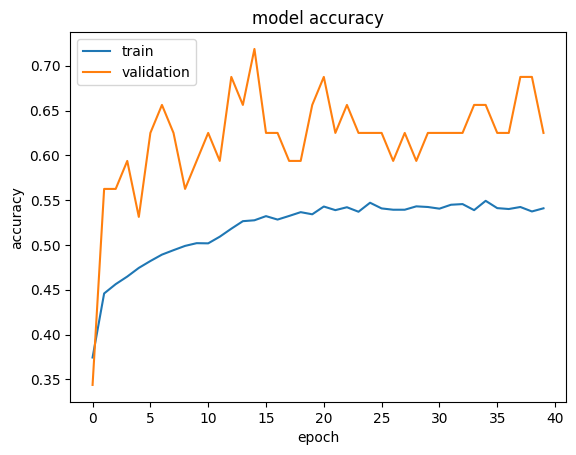

In [39]:
plt.plot(history_vgg.history["accuracy"])
plt.plot(history_vgg.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the VGG16 model**


In [40]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_vgg16_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 1.1637 - accuracy: 0.5000

4/4 [==============================] - 0s 7ms/step - loss: 1.0374 - accuracy: 0.5859


Loss: 1.0374466180801392, Accuracy: 0.5859375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


              precision    recall  f1-score   support

       happy       0.57      0.50      0.53        32
     neutral       0.46      0.56      0.51        32
         sad       0.58      0.59      0.58        32
    surprise       0.79      0.69      0.73        32

    accuracy                           0.59       128
   macro avg       0.60      0.59      0.59       128
weighted avg       0.60      0.59      0.59       128



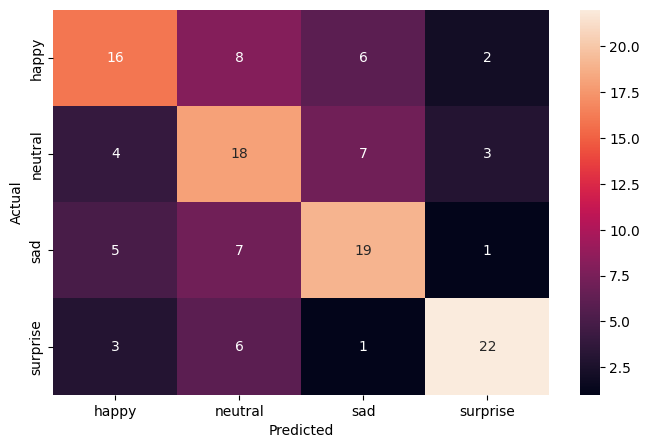

In [41]:
pred_probabilities = new_vgg16_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Think About It:**

- What do you infer from the general trend in the training performance?
- Is the training accuracy consistently improving?
- Is the validation accuracy also improving similarly?


**Observations and Insights:\_\_**


**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance**


## **ResNet V2 Model**


In [42]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [43]:
resnet_model = ResNet101(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in resnet_model.layers:
    layer.trainable = False

resnet_model.summary()

     8192/171446536 [..............................] - ETA: 0s

    32768/171446536 [..............................] - ETA: 6:05

    49152/171446536 [..............................] - ETA: 8:32

    81920/171446536 [..............................] - ETA: 9:11

   131072/171446536 [..............................] - ETA: 6:54

   180224/171446536 [..............................] - ETA: 5:51

   245760/171446536 [..............................] - ETA: 5:00

   360448/171446536 [..............................] - ETA: 3:49

   507904/171446536 [..............................] - ETA: 3:00

   688128/171446536 [..............................] - ETA: 2:26

   991232/171446536 [..............................] - ETA: 1:50

  1392640/171446536 [..............................] - ETA: 1:24

  1916928/171446536 [..............................] - ETA: 1:05

  2629632/171446536 [..............................] - ETA: 50s 

  3547136/171446536 [..............................] - ETA: 40s

  4489216/171446536 [..............................] - ETA: 33s

  5603328/171446536 [..............................] - ETA: 28s

  6914048/171446536 [>.............................] - ETA: 23s

  8208384/171446536 [>.............................] - ETA: 21s

  9428992/171446536 [>.............................] - ETA: 19s

 11141120/171446536 [>.............................] - ETA: 16s

 12910592/171446536 [=>............................] - ETA: 14s

 14467072/171446536 [=>............................] - ETA: 13s

 16285696/171446536 [=>............................] - ETA: 12s

 18022400/171446536 [==>...........................] - ETA: 11s

 19644416/171446536 [==>...........................] - ETA: 11s

 22216704/171446536 [==>...........................] - ETA: 10s

 24018944/171446536 [===>..........................] - ETA: 9s 

 25853952/171446536 [===>..........................] - ETA: 9s

 27721728/171446536 [===>..........................] - ETA: 8s

 29573120/171446536 [====>.........................] - ETA: 8s

 31473664/171446536 [====>.........................] - ETA: 7s

 33374208/171446536 [====>.........................] - ETA: 7s

 35241984/171446536 [=====>........................] - ETA: 7s

 37101568/171446536 [=====>........................] - ETA: 6s

 39043072/171446536 [=====>........................] - ETA: 6s

 40927232/171446536 [======>.......................] - ETA: 6s

 42860544/171446536 [======>.......................] - ETA: 6s

 44802048/171446536 [======>.......................] - ETA: 5s

 46776320/171446536 [=======>......................] - ETA: 5s

 48783360/171446536 [=======>......................] - ETA: 5s

 50683904/171446536 [=======>......................] - ETA: 5s

 52764672/171446536 [========>.....................] - ETA: 5s

 54812672/171446536 [========>.....................] - ETA: 5s

 56745984/171446536 [========>.....................] - ETA: 4s

 58728448/171446536 [=========>....................] - ETA: 4s

 60432384/171446536 [=========>....................] - ETA: 5s

 63078400/171446536 [==========>...................] - ETA: 5s

 64684032/171446536 [==========>...................] - ETA: 5s

 66322432/171446536 [==========>...................] - ETA: 5s

 67928064/171446536 [==========>...................] - ETA: 5s

 69550080/171446536 [===========>..................] - ETA: 5s

 71155712/171446536 [===========>..................] - ETA: 4s

 72794112/171446536 [===========>..................] - ETA: 4s

 74399744/171446536 [============>.................] - ETA: 4s

 76005376/171446536 [============>.................] - ETA: 4s

 77643776/171446536 [============>.................] - ETA: 4s

 79282176/171446536 [============>.................] - ETA: 4s

 80855040/171446536 [=============>................] - ETA: 4s

 82493440/171446536 [=============>................] - ETA: 4s

 84115456/171446536 [=============>................] - ETA: 4s

 85712896/171446536 [=============>................] - ETA: 3s

 87326720/171446536 [==============>...............] - ETA: 3s

 88276992/171446536 [==============>...............] - ETA: 3s

 90849280/171446536 [==============>...............] - ETA: 3s

 92356608/171446536 [===============>..............] - ETA: 3s

 93880320/171446536 [===============>..............] - ETA: 3s

 95387648/171446536 [===============>..............] - ETA: 3s

 96944128/171446536 [===============>..............] - ETA: 3s

 99500032/171446536 [================>.............] - ETA: 3s

102367232/171446536 [================>.............] - ETA: 3s

104308736/171446536 [=================>............] - ETA: 2s

107585536/171446536 [=================>............] - ETA: 2s

109338624/171446536 [==================>...........] - ETA: 2s

111419392/171446536 [==================>...........] - ETA: 2s

112582656/171446536 [==================>...........] - ETA: 2s

115974144/171446536 [===================>..........] - ETA: 2s

116596736/171446536 [===================>..........] - ETA: 2s

119922688/171446536 [===================>..........] - ETA: 2s

120496128/171446536 [====================>.........] - ETA: 2s

123543552/171446536 [====================>.........] - ETA: 2s

124395520/171446536 [====================>.........] - ETA: 1s

127557632/171446536 [=====================>........] - ETA: 1s

127836160/171446536 [=====================>........] - ETA: 1s

130441216/171446536 [=====================>........] - ETA: 1s

133734400/171446536 [======================>.......] - ETA: 1s

134340608/171446536 [======================>.......] - ETA: 1s

136183808/171446536 [======================>.......] - ETA: 1s

139993088/171446536 [=======================>......] - ETA: 1s

143212544/171446536 [========================>.....] - ETA: 1s

144982016/171446536 [========================>.....] - ETA: 1s

147685376/171446536 [========================>.....] - ETA: 0s

151011328/171446536 [=========================>....] - ETA: 0s

151617536/171446536 [=========================>....] - ETA: 0s

155090944/171446536 [==========================>...] - ETA: 0s

155516928/171446536 [==========================>...] - ETA: 0s

158957568/171446536 [==========================>...] - ETA: 0s

159580160/171446536 [==========================>...] - ETA: 0s

162684928/171446536 [===========================>..] - ETA: 0s

165085184/171446536 [===========================>..] - ETA: 0s

166715392/171446536 [============================>.] - ETA: 0s

168624128/171446536 [============================>.] - ETA: 0s

170622976/171446536 [============================>.] - ETA: 0s

171446536/171446536 [==============================] - 7s 0us/step


Model: "resnet101"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 conv1_pad (ZeroPadding2D)   (None, 54, 54, 3)            0         ['input_1[0][0]']             


 conv1_conv (Conv2D)         (None, 24, 24, 64)           9472      ['conv1_pad[0][0]']           


 conv1_bn (BatchNormalizati  (None, 24, 24, 64)           256       ['conv1_conv[0][0]']          


 on)                                                                                              


 conv1_relu (Activation)     (None, 24, 24, 64)           0         ['conv1_bn[0][0]']            


 pool1_pad (ZeroPadding2D)   (None, 26, 26, 64)           0         ['conv1_relu[0][0]']          


 pool1_pool (MaxPooling2D)   (None, 12, 12, 64)           0         ['pool1_pad[0][0]']           


 conv2_block1_1_conv (Conv2  (None, 12, 12, 64)           4160      ['pool1_pool[0][0]']          


 D)                                                                                               


 conv2_block1_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_2_conv (Conv2  (None, 12, 12, 64)           36928     ['conv2_block1_1_relu[0][0]'] 


 D)                                                                                               


 conv2_block1_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_0_conv (Conv2  (None, 12, 12, 256)          16640     ['pool1_pool[0][0]']          


 D)                                                                                               


 conv2_block1_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block1_0_bn (BatchNo  (None, 12, 12, 256)          1024      ['conv2_block1_0_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_3_bn (BatchNo  (None, 12, 12, 256)          1024      ['conv2_block1_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_add (Add)      (None, 12, 12, 256)          0         ['conv2_block1_0_bn[0][0]',   


                                                                     'conv2_block1_3_bn[0][0]']   


 conv2_block1_out (Activati  (None, 12, 12, 256)          0         ['conv2_block1_add[0][0]']    


 on)                                                                                              


 conv2_block2_1_conv (Conv2  (None, 12, 12, 64)           16448     ['conv2_block1_out[0][0]']    


 D)                                                                                               


 conv2_block2_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_2_conv (Conv2  (None, 12, 12, 64)           36928     ['conv2_block2_1_relu[0][0]'] 


 D)                                                                                               


 conv2_block2_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block2_3_bn (BatchNo  (None, 12, 12, 256)          1024      ['conv2_block2_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_add (Add)      (None, 12, 12, 256)          0         ['conv2_block1_out[0][0]',    


                                                                     'conv2_block2_3_bn[0][0]']   


 conv2_block2_out (Activati  (None, 12, 12, 256)          0         ['conv2_block2_add[0][0]']    


 on)                                                                                              


 conv2_block3_1_conv (Conv2  (None, 12, 12, 64)           16448     ['conv2_block2_out[0][0]']    


 D)                                                                                               


 conv2_block3_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block3_2_conv (Conv2  (None, 12, 12, 64)           36928     ['conv2_block3_1_relu[0][0]'] 


 D)                                                                                               


 conv2_block3_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block3_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block3_3_bn (BatchNo  (None, 12, 12, 256)          1024      ['conv2_block3_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_add (Add)      (None, 12, 12, 256)          0         ['conv2_block2_out[0][0]',    


                                                                     'conv2_block3_3_bn[0][0]']   


 conv2_block3_out (Activati  (None, 12, 12, 256)          0         ['conv2_block3_add[0][0]']    


 on)                                                                                              


 conv3_block1_1_conv (Conv2  (None, 6, 6, 128)            32896     ['conv2_block3_out[0][0]']    


 D)                                                                                               


 conv3_block1_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_2_conv (Conv2  (None, 6, 6, 128)            147584    ['conv3_block1_1_relu[0][0]'] 


 D)                                                                                               


 conv3_block1_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_0_conv (Conv2  (None, 6, 6, 512)            131584    ['conv2_block3_out[0][0]']    


 D)                                                                                               


 conv3_block1_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block1_0_bn (BatchNo  (None, 6, 6, 512)            2048      ['conv3_block1_0_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_3_bn (BatchNo  (None, 6, 6, 512)            2048      ['conv3_block1_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_add (Add)      (None, 6, 6, 512)            0         ['conv3_block1_0_bn[0][0]',   


                                                                     'conv3_block1_3_bn[0][0]']   


 conv3_block1_out (Activati  (None, 6, 6, 512)            0         ['conv3_block1_add[0][0]']    


 on)                                                                                              


 conv3_block2_1_conv (Conv2  (None, 6, 6, 128)            65664     ['conv3_block1_out[0][0]']    


 D)                                                                                               


 conv3_block2_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_2_conv (Conv2  (None, 6, 6, 128)            147584    ['conv3_block2_1_relu[0][0]'] 


 D)                                                                                               


 conv3_block2_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block2_3_bn (BatchNo  (None, 6, 6, 512)            2048      ['conv3_block2_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_add (Add)      (None, 6, 6, 512)            0         ['conv3_block1_out[0][0]',    


                                                                     'conv3_block2_3_bn[0][0]']   


 conv3_block2_out (Activati  (None, 6, 6, 512)            0         ['conv3_block2_add[0][0]']    


 on)                                                                                              


 conv3_block3_1_conv (Conv2  (None, 6, 6, 128)            65664     ['conv3_block2_out[0][0]']    


 D)                                                                                               


 conv3_block3_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_2_conv (Conv2  (None, 6, 6, 128)            147584    ['conv3_block3_1_relu[0][0]'] 


 D)                                                                                               


 conv3_block3_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block3_3_bn (BatchNo  (None, 6, 6, 512)            2048      ['conv3_block3_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_add (Add)      (None, 6, 6, 512)            0         ['conv3_block2_out[0][0]',    


                                                                     'conv3_block3_3_bn[0][0]']   


 conv3_block3_out (Activati  (None, 6, 6, 512)            0         ['conv3_block3_add[0][0]']    


 on)                                                                                              


 conv3_block4_1_conv (Conv2  (None, 6, 6, 128)            65664     ['conv3_block3_out[0][0]']    


 D)                                                                                               


 conv3_block4_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block4_2_conv (Conv2  (None, 6, 6, 128)            147584    ['conv3_block4_1_relu[0][0]'] 


 D)                                                                                               


 conv3_block4_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block4_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block4_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block4_3_bn (BatchNo  (None, 6, 6, 512)            2048      ['conv3_block4_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_add (Add)      (None, 6, 6, 512)            0         ['conv3_block3_out[0][0]',    


                                                                     'conv3_block4_3_bn[0][0]']   


 conv3_block4_out (Activati  (None, 6, 6, 512)            0         ['conv3_block4_add[0][0]']    


 on)                                                                                              


 conv4_block1_1_conv (Conv2  (None, 3, 3, 256)            131328    ['conv3_block4_out[0][0]']    


 D)                                                                                               


 conv4_block1_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block1_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block1_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_0_conv (Conv2  (None, 3, 3, 1024)           525312    ['conv3_block4_out[0][0]']    


 D)                                                                                               


 conv4_block1_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block1_0_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block1_0_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block1_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_0_bn[0][0]',   


                                                                     'conv4_block1_3_bn[0][0]']   


 conv4_block1_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block1_add[0][0]']    


 on)                                                                                              


 conv4_block2_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block1_out[0][0]']    


 D)                                                                                               


 conv4_block2_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block2_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block2_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block2_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block2_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_out[0][0]',    


                                                                     'conv4_block2_3_bn[0][0]']   


 conv4_block2_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block2_add[0][0]']    


 on)                                                                                              


 conv4_block3_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block2_out[0][0]']    


 D)                                                                                               


 conv4_block3_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block3_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block3_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block3_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block3_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block2_out[0][0]',    


                                                                     'conv4_block3_3_bn[0][0]']   


 conv4_block3_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block3_add[0][0]']    


 on)                                                                                              


 conv4_block4_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block3_out[0][0]']    


 D)                                                                                               


 conv4_block4_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block4_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block4_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block4_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block4_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block3_out[0][0]',    


                                                                     'conv4_block4_3_bn[0][0]']   


 conv4_block4_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block4_add[0][0]']    


 on)                                                                                              


 conv4_block5_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block4_out[0][0]']    


 D)                                                                                               


 conv4_block5_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block5_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block5_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block5_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block5_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block5_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block4_out[0][0]',    


                                                                     'conv4_block5_3_bn[0][0]']   


 conv4_block5_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block5_add[0][0]']    


 on)                                                                                              


 conv4_block6_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block5_out[0][0]']    


 D)                                                                                               


 conv4_block6_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block6_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block6_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block6_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block6_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block6_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block6_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block6_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block6_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block6_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block6_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block6_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block5_out[0][0]',    


                                                                     'conv4_block6_3_bn[0][0]']   


 conv4_block6_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block6_add[0][0]']    


 on)                                                                                              


 conv4_block7_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block6_out[0][0]']    


 D)                                                                                               


 conv4_block7_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block7_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block7_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block7_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block7_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block7_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block7_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block7_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block7_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block7_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block7_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block7_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block7_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block7_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block7_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block6_out[0][0]',    


                                                                     'conv4_block7_3_bn[0][0]']   


 conv4_block7_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block7_add[0][0]']    


 on)                                                                                              


 conv4_block8_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block7_out[0][0]']    


 D)                                                                                               


 conv4_block8_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block8_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block8_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block8_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block8_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block8_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block8_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block8_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block8_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block8_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block8_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block8_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block8_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block8_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block8_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block7_out[0][0]',    


                                                                     'conv4_block8_3_bn[0][0]']   


 conv4_block8_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block8_add[0][0]']    


 on)                                                                                              


 conv4_block9_1_conv (Conv2  (None, 3, 3, 256)            262400    ['conv4_block8_out[0][0]']    


 D)                                                                                               


 conv4_block9_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block9_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block9_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block9_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block9_2_conv (Conv2  (None, 3, 3, 256)            590080    ['conv4_block9_1_relu[0][0]'] 


 D)                                                                                               


 conv4_block9_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block9_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block9_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block9_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block9_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block9_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block9_3_bn (BatchNo  (None, 3, 3, 1024)           4096      ['conv4_block9_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block9_add (Add)      (None, 3, 3, 1024)           0         ['conv4_block8_out[0][0]',    


                                                                     'conv4_block9_3_bn[0][0]']   


 conv4_block9_out (Activati  (None, 3, 3, 1024)           0         ['conv4_block9_add[0][0]']    


 on)                                                                                              


 conv4_block10_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block9_out[0][0]']    


 2D)                                                                                              


 conv4_block10_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block10_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block10_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block10_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block10_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block10_1_relu[0][0]']


 2D)                                                                                              


 conv4_block10_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block10_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block10_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block10_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block10_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block10_2_relu[0][0]']


 2D)                                                                                              


 conv4_block10_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block10_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block10_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block9_out[0][0]',    


                                                                     'conv4_block10_3_bn[0][0]']  


 conv4_block10_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block10_add[0][0]']   


 ion)                                                                                             


 conv4_block11_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block10_out[0][0]']   


 2D)                                                                                              


 conv4_block11_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block11_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block11_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block11_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block11_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block11_1_relu[0][0]']


 2D)                                                                                              


 conv4_block11_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block11_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block11_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block11_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block11_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block11_2_relu[0][0]']


 2D)                                                                                              


 conv4_block11_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block11_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block11_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block10_out[0][0]',   


                                                                     'conv4_block11_3_bn[0][0]']  


 conv4_block11_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block11_add[0][0]']   


 ion)                                                                                             


 conv4_block12_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block11_out[0][0]']   


 2D)                                                                                              


 conv4_block12_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block12_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block12_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block12_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block12_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block12_1_relu[0][0]']


 2D)                                                                                              


 conv4_block12_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block12_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block12_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block12_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block12_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block12_2_relu[0][0]']


 2D)                                                                                              


 conv4_block12_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block12_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block12_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block11_out[0][0]',   


                                                                     'conv4_block12_3_bn[0][0]']  


 conv4_block12_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block12_add[0][0]']   


 ion)                                                                                             


 conv4_block13_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block12_out[0][0]']   


 2D)                                                                                              


 conv4_block13_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block13_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block13_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block13_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block13_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block13_1_relu[0][0]']


 2D)                                                                                              


 conv4_block13_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block13_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block13_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block13_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block13_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block13_2_relu[0][0]']


 2D)                                                                                              


 conv4_block13_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block13_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block13_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block12_out[0][0]',   


                                                                     'conv4_block13_3_bn[0][0]']  


 conv4_block13_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block13_add[0][0]']   


 ion)                                                                                             


 conv4_block14_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block13_out[0][0]']   


 2D)                                                                                              


 conv4_block14_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block14_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block14_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block14_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block14_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block14_1_relu[0][0]']


 2D)                                                                                              


 conv4_block14_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block14_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block14_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block14_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block14_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block14_2_relu[0][0]']


 2D)                                                                                              


 conv4_block14_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block14_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block14_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block13_out[0][0]',   


                                                                     'conv4_block14_3_bn[0][0]']  


 conv4_block14_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block14_add[0][0]']   


 ion)                                                                                             


 conv4_block15_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block14_out[0][0]']   


 2D)                                                                                              


 conv4_block15_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block15_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block15_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block15_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block15_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block15_1_relu[0][0]']


 2D)                                                                                              


 conv4_block15_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block15_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block15_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block15_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block15_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block15_2_relu[0][0]']


 2D)                                                                                              


 conv4_block15_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block15_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block15_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block14_out[0][0]',   


                                                                     'conv4_block15_3_bn[0][0]']  


 conv4_block15_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block15_add[0][0]']   


 ion)                                                                                             


 conv4_block16_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block15_out[0][0]']   


 2D)                                                                                              


 conv4_block16_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block16_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block16_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block16_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block16_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block16_1_relu[0][0]']


 2D)                                                                                              


 conv4_block16_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block16_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block16_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block16_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block16_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block16_2_relu[0][0]']


 2D)                                                                                              


 conv4_block16_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block16_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block16_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block15_out[0][0]',   


                                                                     'conv4_block16_3_bn[0][0]']  


 conv4_block16_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block16_add[0][0]']   


 ion)                                                                                             


 conv4_block17_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block16_out[0][0]']   


 2D)                                                                                              


 conv4_block17_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block17_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block17_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block17_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block17_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block17_1_relu[0][0]']


 2D)                                                                                              


 conv4_block17_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block17_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block17_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block17_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block17_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block17_2_relu[0][0]']


 2D)                                                                                              


 conv4_block17_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block17_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block17_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block16_out[0][0]',   


                                                                     'conv4_block17_3_bn[0][0]']  


 conv4_block17_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block17_add[0][0]']   


 ion)                                                                                             


 conv4_block18_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block17_out[0][0]']   


 2D)                                                                                              


 conv4_block18_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block18_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block18_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block18_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block18_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block18_1_relu[0][0]']


 2D)                                                                                              


 conv4_block18_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block18_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block18_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block18_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block18_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block18_2_relu[0][0]']


 2D)                                                                                              


 conv4_block18_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block18_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block18_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block17_out[0][0]',   


                                                                     'conv4_block18_3_bn[0][0]']  


 conv4_block18_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block18_add[0][0]']   


 ion)                                                                                             


 conv4_block19_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block18_out[0][0]']   


 2D)                                                                                              


 conv4_block19_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block19_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block19_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block19_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block19_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block19_1_relu[0][0]']


 2D)                                                                                              


 conv4_block19_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block19_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block19_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block19_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block19_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block19_2_relu[0][0]']


 2D)                                                                                              


 conv4_block19_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block19_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block19_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block18_out[0][0]',   


                                                                     'conv4_block19_3_bn[0][0]']  


 conv4_block19_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block19_add[0][0]']   


 ion)                                                                                             


 conv4_block20_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block19_out[0][0]']   


 2D)                                                                                              


 conv4_block20_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block20_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block20_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block20_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block20_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block20_1_relu[0][0]']


 2D)                                                                                              


 conv4_block20_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block20_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block20_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block20_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block20_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block20_2_relu[0][0]']


 2D)                                                                                              


 conv4_block20_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block20_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block20_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block19_out[0][0]',   


                                                                     'conv4_block20_3_bn[0][0]']  


 conv4_block20_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block20_add[0][0]']   


 ion)                                                                                             


 conv4_block21_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block20_out[0][0]']   


 2D)                                                                                              


 conv4_block21_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block21_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block21_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block21_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block21_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block21_1_relu[0][0]']


 2D)                                                                                              


 conv4_block21_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block21_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block21_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block21_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block21_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block21_2_relu[0][0]']


 2D)                                                                                              


 conv4_block21_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block21_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block21_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block20_out[0][0]',   


                                                                     'conv4_block21_3_bn[0][0]']  


 conv4_block21_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block21_add[0][0]']   


 ion)                                                                                             


 conv4_block22_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block21_out[0][0]']   


 2D)                                                                                              


 conv4_block22_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block22_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block22_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block22_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block22_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block22_1_relu[0][0]']


 2D)                                                                                              


 conv4_block22_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block22_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block22_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block22_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block22_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block22_2_relu[0][0]']


 2D)                                                                                              


 conv4_block22_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block22_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block22_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block21_out[0][0]',   


                                                                     'conv4_block22_3_bn[0][0]']  


 conv4_block22_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block22_add[0][0]']   


 ion)                                                                                             


 conv4_block23_1_conv (Conv  (None, 3, 3, 256)            262400    ['conv4_block22_out[0][0]']   


 2D)                                                                                              


 conv4_block23_1_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block23_1_conv[0][0]']


 ormalization)                                                                                    


 conv4_block23_1_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block23_1_bn[0][0]']  


 vation)                                                                                          


 conv4_block23_2_conv (Conv  (None, 3, 3, 256)            590080    ['conv4_block23_1_relu[0][0]']


 2D)                                                                                              


 conv4_block23_2_bn (BatchN  (None, 3, 3, 256)            1024      ['conv4_block23_2_conv[0][0]']


 ormalization)                                                                                    


 conv4_block23_2_relu (Acti  (None, 3, 3, 256)            0         ['conv4_block23_2_bn[0][0]']  


 vation)                                                                                          


 conv4_block23_3_conv (Conv  (None, 3, 3, 1024)           263168    ['conv4_block23_2_relu[0][0]']


 2D)                                                                                              


 conv4_block23_3_bn (BatchN  (None, 3, 3, 1024)           4096      ['conv4_block23_3_conv[0][0]']


 ormalization)                                                                                    


 conv4_block23_add (Add)     (None, 3, 3, 1024)           0         ['conv4_block22_out[0][0]',   


                                                                     'conv4_block23_3_bn[0][0]']  


 conv4_block23_out (Activat  (None, 3, 3, 1024)           0         ['conv4_block23_add[0][0]']   


 ion)                                                                                             


 conv5_block1_1_conv (Conv2  (None, 2, 2, 512)            524800    ['conv4_block23_out[0][0]']   


 D)                                                                                               


 conv5_block1_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_2_conv (Conv2  (None, 2, 2, 512)            2359808   ['conv5_block1_1_relu[0][0]'] 


 D)                                                                                               


 conv5_block1_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_0_conv (Conv2  (None, 2, 2, 2048)           2099200   ['conv4_block23_out[0][0]']   


 D)                                                                                               


 conv5_block1_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block1_0_bn (BatchNo  (None, 2, 2, 2048)           8192      ['conv5_block1_0_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_3_bn (BatchNo  (None, 2, 2, 2048)           8192      ['conv5_block1_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_add (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_0_bn[0][0]',   


                                                                     'conv5_block1_3_bn[0][0]']   


 conv5_block1_out (Activati  (None, 2, 2, 2048)           0         ['conv5_block1_add[0][0]']    


 on)                                                                                              


 conv5_block2_1_conv (Conv2  (None, 2, 2, 512)            1049088   ['conv5_block1_out[0][0]']    


 D)                                                                                               


 conv5_block2_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_2_conv (Conv2  (None, 2, 2, 512)            2359808   ['conv5_block2_1_relu[0][0]'] 


 D)                                                                                               


 conv5_block2_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block2_3_bn (BatchNo  (None, 2, 2, 2048)           8192      ['conv5_block2_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_add (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_out[0][0]',    


                                                                     'conv5_block2_3_bn[0][0]']   


 conv5_block2_out (Activati  (None, 2, 2, 2048)           0         ['conv5_block2_add[0][0]']    


 on)                                                                                              


 conv5_block3_1_conv (Conv2  (None, 2, 2, 512)            1049088   ['conv5_block2_out[0][0]']    


 D)                                                                                               


 conv5_block3_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_2_conv (Conv2  (None, 2, 2, 512)            2359808   ['conv5_block3_1_relu[0][0]'] 


 D)                                                                                               


 conv5_block3_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block3_3_bn (BatchNo  (None, 2, 2, 2048)           8192      ['conv5_block3_3_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_add (Add)      (None, 2, 2, 2048)           0         ['conv5_block2_out[0][0]',    


                                                                     'conv5_block3_3_bn[0][0]']   


 conv5_block3_out (Activati  (None, 2, 2, 2048)           0         ['conv5_block3_add[0][0]']    


 on)                                                                                              


Total params: 42658176 (162.73 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 42658176 (162.73 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import Resnet v2 upto the layer of your choice and add Fully Connected layers on top of it.


In [44]:
new_resnet_model = Sequential()
new_resnet_model.add(resnet_model)

# Reduces each feature map to a single value by averaging all elements
new_resnet_model.add(Flatten())

# Adding a dense output layer
new_resnet_model.add(Dense(256, activation="relu"))
new_resnet_model.add(Dense(128, activation="relu"))
new_resnet_model.add(Dropout(0.3))
new_resnet_model.add(Dense(64, activation="relu"))
new_resnet_model.add(BatchNormalization())
new_resnet_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [45]:
new_resnet_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_resnet_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 resnet101 (Functional)      (None, 2, 2, 2048)        42658176  


 flatten (Flatten)           (None, 8192)              0         


 dense (Dense)               (None, 256)               2097408   


 dense_1 (Dense)             (None, 128)               32896     


 dropout (Dropout)           (None, 128)               0         


 dense_2 (Dense)             (None, 64)                8256      


 batch_normalization (Batch  (None, 64)                256       


 Normalization)                                                  


 dense_3 (Dense)             (None, 4)                 260       


Total params: 44797252 (170.89 MB)


Trainable params: 2138948 (8.16 MB)


Non-trainable params: 42658304 (162.73 MB)


_________________________________________________________________


In [46]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_resnet_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_resnet = new_resnet_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 29:35 - loss: 1.9880 - accuracy: 0.3125

  5/473 [..............................] - ETA: 8s - loss: 1.9589 - accuracy: 0.2875   

  7/473 [..............................] - ETA: 10s - loss: 1.9540 - accuracy: 0.2545

 10/473 [..............................] - ETA: 9s - loss: 1.9334 - accuracy: 0.2719 

 13/473 [..............................] - ETA: 9s - loss: 1.9133 - accuracy: 0.2596

 16/473 [>.............................] - ETA: 9s - loss: 1.8871 - accuracy: 0.2676

 19/473 [>.............................] - ETA: 9s - loss: 1.8761 - accuracy: 0.2648

 22/473 [>.............................] - ETA: 8s - loss: 1.8756 - accuracy: 0.2585

 25/473 [>.............................] - ETA: 8s - loss: 1.8481 - accuracy: 0.2650

 28/473 [>.............................] - ETA: 8s - loss: 1.8461 - accuracy: 0.2634

 31/473 [>.............................] - ETA: 8s - loss: 1.8468 - accuracy: 0.2631

 33/473 [=>............................] - ETA: 8s - loss: 1.8420 - accuracy: 0.2576

 36/473 [=>............................] - ETA: 8s - loss: 1.8358 - accuracy: 0.2578

 39/473 [=>............................] - ETA: 8s - loss: 1.8324 - accuracy: 0.2540

 42/473 [=>............................] - ETA: 8s - loss: 1.8142 - accuracy: 0.2515

 45/473 [=>............................] - ETA: 8s - loss: 1.7998 - accuracy: 0.2528

 48/473 [==>...........................] - ETA: 8s - loss: 1.7846 - accuracy: 0.2526

 51/473 [==>...........................] - ETA: 8s - loss: 1.7816 - accuracy: 0.2500

 54/473 [==>...........................] - ETA: 8s - loss: 1.7746 - accuracy: 0.2471

 57/473 [==>...........................] - ETA: 8s - loss: 1.7628 - accuracy: 0.2478

 60/473 [==>...........................] - ETA: 8s - loss: 1.7532 - accuracy: 0.2469

 63/473 [==>...........................] - ETA: 8s - loss: 1.7538 - accuracy: 0.2421

 66/473 [===>..........................] - ETA: 7s - loss: 1.7457 - accuracy: 0.2424

 69/473 [===>..........................] - ETA: 7s - loss: 1.7468 - accuracy: 0.2405

 72/473 [===>..........................] - ETA: 7s - loss: 1.7386 - accuracy: 0.2405

 75/473 [===>..........................] - ETA: 7s - loss: 1.7311 - accuracy: 0.2412

 78/473 [===>..........................] - ETA: 7s - loss: 1.7236 - accuracy: 0.2432

 81/473 [====>.........................] - ETA: 7s - loss: 1.7184 - accuracy: 0.2438

 84/473 [====>.........................] - ETA: 7s - loss: 1.7171 - accuracy: 0.2437

 87/473 [====>.........................] - ETA: 7s - loss: 1.7112 - accuracy: 0.2435

 90/473 [====>.........................] - ETA: 7s - loss: 1.7040 - accuracy: 0.2441

 93/473 [====>.........................] - ETA: 7s - loss: 1.6996 - accuracy: 0.2426

 96/473 [=====>........................] - ETA: 7s - loss: 1.6919 - accuracy: 0.2425

 99/473 [=====>........................] - ETA: 7s - loss: 1.6859 - accuracy: 0.2424

102/473 [=====>........................] - ETA: 7s - loss: 1.6799 - accuracy: 0.2448

105/473 [=====>........................] - ETA: 7s - loss: 1.6772 - accuracy: 0.2443

108/473 [=====>........................] - ETA: 7s - loss: 1.6771 - accuracy: 0.2422

111/473 [======>.......................] - ETA: 7s - loss: 1.6752 - accuracy: 0.2416

114/473 [======>.......................] - ETA: 6s - loss: 1.6691 - accuracy: 0.2440

117/473 [======>.......................] - ETA: 6s - loss: 1.6655 - accuracy: 0.2444

120/473 [======>.......................] - ETA: 6s - loss: 1.6604 - accuracy: 0.2445

123/473 [======>.......................] - ETA: 6s - loss: 1.6564 - accuracy: 0.2462

126/473 [======>.......................] - ETA: 6s - loss: 1.6535 - accuracy: 0.2458

129/473 [=======>......................] - ETA: 6s - loss: 1.6492 - accuracy: 0.2466

132/473 [=======>......................] - ETA: 6s - loss: 1.6467 - accuracy: 0.2460

135/473 [=======>......................] - ETA: 6s - loss: 1.6443 - accuracy: 0.2461

138/473 [=======>......................] - ETA: 6s - loss: 1.6433 - accuracy: 0.2452

141/473 [=======>......................] - ETA: 6s - loss: 1.6422 - accuracy: 0.2456

144/473 [========>.....................] - ETA: 6s - loss: 1.6386 - accuracy: 0.2459

146/473 [========>.....................] - ETA: 7s - loss: 1.6385 - accuracy: 0.2463

151/473 [========>.....................] - ETA: 7s - loss: 1.6319 - accuracy: 0.2485

153/473 [========>.....................] - ETA: 7s - loss: 1.6291 - accuracy: 0.2499

156/473 [========>.....................] - ETA: 7s - loss: 1.6275 - accuracy: 0.2493

159/473 [=========>....................] - ETA: 7s - loss: 1.6246 - accuracy: 0.2498

162/473 [=========>....................] - ETA: 6s - loss: 1.6225 - accuracy: 0.2492

165/473 [=========>....................] - ETA: 6s - loss: 1.6204 - accuracy: 0.2494

168/473 [=========>....................] - ETA: 6s - loss: 1.6177 - accuracy: 0.2492

171/473 [=========>....................] - ETA: 6s - loss: 1.6134 - accuracy: 0.2509

174/473 [==========>...................] - ETA: 6s - loss: 1.6113 - accuracy: 0.2509

177/473 [==========>...................] - ETA: 6s - loss: 1.6073 - accuracy: 0.2519

180/473 [==========>...................] - ETA: 6s - loss: 1.6058 - accuracy: 0.2520

183/473 [==========>...................] - ETA: 6s - loss: 1.6028 - accuracy: 0.2530

186/473 [==========>...................] - ETA: 6s - loss: 1.6002 - accuracy: 0.2530

189/473 [==========>...................] - ETA: 6s - loss: 1.5993 - accuracy: 0.2518

192/473 [===========>..................] - ETA: 6s - loss: 1.5974 - accuracy: 0.2516

195/473 [===========>..................] - ETA: 6s - loss: 1.5957 - accuracy: 0.2517

198/473 [===========>..................] - ETA: 5s - loss: 1.5940 - accuracy: 0.2514

201/473 [===========>..................] - ETA: 5s - loss: 1.5927 - accuracy: 0.2511

204/473 [===========>..................] - ETA: 5s - loss: 1.5912 - accuracy: 0.2513

207/473 [============>.................] - ETA: 5s - loss: 1.5900 - accuracy: 0.2513

210/473 [============>.................] - ETA: 5s - loss: 1.5875 - accuracy: 0.2525

213/473 [============>.................] - ETA: 5s - loss: 1.5857 - accuracy: 0.2528

216/473 [============>.................] - ETA: 5s - loss: 1.5842 - accuracy: 0.2526

219/473 [============>.................] - ETA: 5s - loss: 1.5834 - accuracy: 0.2521

222/473 [=============>................] - ETA: 5s - loss: 1.5819 - accuracy: 0.2522

225/473 [=============>................] - ETA: 5s - loss: 1.5799 - accuracy: 0.2522

228/473 [=============>................] - ETA: 5s - loss: 1.5786 - accuracy: 0.2522

231/473 [=============>................] - ETA: 5s - loss: 1.5765 - accuracy: 0.2520

234/473 [=============>................] - ETA: 5s - loss: 1.5745 - accuracy: 0.2526

237/473 [==============>...............] - ETA: 5s - loss: 1.5732 - accuracy: 0.2526

239/473 [==============>...............] - ETA: 4s - loss: 1.5729 - accuracy: 0.2525

242/473 [==============>...............] - ETA: 4s - loss: 1.5711 - accuracy: 0.2527

245/473 [==============>...............] - ETA: 4s - loss: 1.5703 - accuracy: 0.2516

248/473 [==============>...............] - ETA: 4s - loss: 1.5690 - accuracy: 0.2517

251/473 [==============>...............] - ETA: 4s - loss: 1.5675 - accuracy: 0.2515

254/473 [===============>..............] - ETA: 4s - loss: 1.5658 - accuracy: 0.2515

257/473 [===============>..............] - ETA: 4s - loss: 1.5642 - accuracy: 0.2518

260/473 [===============>..............] - ETA: 4s - loss: 1.5633 - accuracy: 0.2514

262/473 [===============>..............] - ETA: 4s - loss: 1.5628 - accuracy: 0.2510

264/473 [===============>..............] - ETA: 4s - loss: 1.5628 - accuracy: 0.2513

267/473 [===============>..............] - ETA: 4s - loss: 1.5626 - accuracy: 0.2509

270/473 [================>.............] - ETA: 4s - loss: 1.5615 - accuracy: 0.2509

273/473 [================>.............] - ETA: 4s - loss: 1.5614 - accuracy: 0.2507

276/473 [================>.............] - ETA: 4s - loss: 1.5600 - accuracy: 0.2507

279/473 [================>.............] - ETA: 4s - loss: 1.5601 - accuracy: 0.2497

282/473 [================>.............] - ETA: 4s - loss: 1.5584 - accuracy: 0.2514

285/473 [=================>............] - ETA: 3s - loss: 1.5578 - accuracy: 0.2505

288/473 [=================>............] - ETA: 3s - loss: 1.5568 - accuracy: 0.2504

291/473 [=================>............] - ETA: 3s - loss: 1.5553 - accuracy: 0.2508

294/473 [=================>............] - ETA: 3s - loss: 1.5540 - accuracy: 0.2509

297/473 [=================>............] - ETA: 3s - loss: 1.5531 - accuracy: 0.2515

300/473 [==================>...........] - ETA: 3s - loss: 1.5517 - accuracy: 0.2520

303/473 [==================>...........] - ETA: 3s - loss: 1.5507 - accuracy: 0.2515

306/473 [==================>...........] - ETA: 3s - loss: 1.5495 - accuracy: 0.2516

309/473 [==================>...........] - ETA: 3s - loss: 1.5490 - accuracy: 0.2513

312/473 [==================>...........] - ETA: 3s - loss: 1.5477 - accuracy: 0.2515

315/473 [==================>...........] - ETA: 3s - loss: 1.5466 - accuracy: 0.2521

318/473 [===================>..........] - ETA: 3s - loss: 1.5451 - accuracy: 0.2521

321/473 [===================>..........] - ETA: 3s - loss: 1.5445 - accuracy: 0.2522

324/473 [===================>..........] - ETA: 3s - loss: 1.5432 - accuracy: 0.2525

327/473 [===================>..........] - ETA: 3s - loss: 1.5420 - accuracy: 0.2524

330/473 [===================>..........] - ETA: 2s - loss: 1.5412 - accuracy: 0.2524

333/473 [====================>.........] - ETA: 2s - loss: 1.5402 - accuracy: 0.2528

336/473 [====================>.........] - ETA: 2s - loss: 1.5391 - accuracy: 0.2526

339/473 [====================>.........] - ETA: 2s - loss: 1.5375 - accuracy: 0.2529

342/473 [====================>.........] - ETA: 2s - loss: 1.5370 - accuracy: 0.2532

345/473 [====================>.........] - ETA: 2s - loss: 1.5363 - accuracy: 0.2532

348/473 [=====================>........] - ETA: 2s - loss: 1.5353 - accuracy: 0.2531

351/473 [=====================>........] - ETA: 2s - loss: 1.5339 - accuracy: 0.2540

354/473 [=====================>........] - ETA: 2s - loss: 1.5326 - accuracy: 0.2544

357/473 [=====================>........] - ETA: 2s - loss: 1.5315 - accuracy: 0.2545

360/473 [=====================>........] - ETA: 2s - loss: 1.5305 - accuracy: 0.2549

363/473 [======================>.......] - ETA: 2s - loss: 1.5299 - accuracy: 0.2547

366/473 [======================>.......] - ETA: 2s - loss: 1.5288 - accuracy: 0.2549

369/473 [======================>.......] - ETA: 2s - loss: 1.5280 - accuracy: 0.2551

372/473 [======================>.......] - ETA: 2s - loss: 1.5277 - accuracy: 0.2547

375/473 [======================>.......] - ETA: 2s - loss: 1.5269 - accuracy: 0.2545

378/473 [======================>.......] - ETA: 1s - loss: 1.5261 - accuracy: 0.2544

381/473 [=======================>......] - ETA: 1s - loss: 1.5254 - accuracy: 0.2546

384/473 [=======================>......] - ETA: 1s - loss: 1.5249 - accuracy: 0.2541

387/473 [=======================>......] - ETA: 1s - loss: 1.5240 - accuracy: 0.2543

390/473 [=======================>......] - ETA: 1s - loss: 1.5231 - accuracy: 0.2550

393/473 [=======================>......] - ETA: 1s - loss: 1.5221 - accuracy: 0.2552

396/473 [========================>.....] - ETA: 1s - loss: 1.5218 - accuracy: 0.2546

399/473 [========================>.....] - ETA: 1s - loss: 1.5210 - accuracy: 0.2544

402/473 [========================>.....] - ETA: 1s - loss: 1.5200 - accuracy: 0.2547

405/473 [========================>.....] - ETA: 1s - loss: 1.5193 - accuracy: 0.2550

408/473 [========================>.....] - ETA: 1s - loss: 1.5186 - accuracy: 0.2550

411/473 [=========================>....] - ETA: 1s - loss: 1.5181 - accuracy: 0.2549

414/473 [=========================>....] - ETA: 1s - loss: 1.5177 - accuracy: 0.2549

417/473 [=========================>....] - ETA: 1s - loss: 1.5171 - accuracy: 0.2549

420/473 [=========================>....] - ETA: 1s - loss: 1.5161 - accuracy: 0.2552

423/473 [=========================>....] - ETA: 1s - loss: 1.5155 - accuracy: 0.2552

426/473 [==========================>...] - ETA: 0s - loss: 1.5150 - accuracy: 0.2552

429/473 [==========================>...] - ETA: 0s - loss: 1.5143 - accuracy: 0.2559

432/473 [==========================>...] - ETA: 0s - loss: 1.5135 - accuracy: 0.2561

435/473 [==========================>...] - ETA: 0s - loss: 1.5126 - accuracy: 0.2566

438/473 [==========================>...] - ETA: 0s - loss: 1.5123 - accuracy: 0.2564

441/473 [==========================>...] - ETA: 0s - loss: 1.5117 - accuracy: 0.2567

444/473 [===========================>..] - ETA: 0s - loss: 1.5115 - accuracy: 0.2564

447/473 [===========================>..] - ETA: 0s - loss: 1.5113 - accuracy: 0.2559

450/473 [===========================>..] - ETA: 0s - loss: 1.5109 - accuracy: 0.2554

453/473 [===========================>..] - ETA: 0s - loss: 1.5104 - accuracy: 0.2558

456/473 [===========================>..] - ETA: 0s - loss: 1.5093 - accuracy: 0.2562

459/473 [============================>.] - ETA: 0s - loss: 1.5087 - accuracy: 0.2563

462/473 [============================>.] - ETA: 0s - loss: 1.5083 - accuracy: 0.2559

465/473 [============================>.] - ETA: 0s - loss: 1.5077 - accuracy: 0.2560

468/473 [============================>.] - ETA: 0s - loss: 1.5070 - accuracy: 0.2563

471/473 [============================>.] - ETA: 0s - loss: 1.5066 - accuracy: 0.2566

473/473 [==============================] - 14s 22ms/step - loss: 1.5063 - accuracy: 0.2564 - val_loss: 1.3901 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 15s - loss: 1.4730 - accuracy: 0.2188

  4/473 [..............................] - ETA: 8s - loss: 1.4240 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 8s - loss: 1.4433 - accuracy: 0.2232

 10/473 [..............................] - ETA: 8s - loss: 1.4204 - accuracy: 0.2469

 13/473 [..............................] - ETA: 8s - loss: 1.4199 - accuracy: 0.2404

 16/473 [>.............................] - ETA: 8s - loss: 1.4160 - accuracy: 0.2500

 19/473 [>.............................] - ETA: 8s - loss: 1.4129 - accuracy: 0.2549

 22/473 [>.............................] - ETA: 8s - loss: 1.4174 - accuracy: 0.2500

 25/473 [>.............................] - ETA: 8s - loss: 1.4184 - accuracy: 0.2512

 28/473 [>.............................] - ETA: 8s - loss: 1.4157 - accuracy: 0.2556

 31/473 [>.............................] - ETA: 8s - loss: 1.4114 - accuracy: 0.2601

 34/473 [=>............................] - ETA: 8s - loss: 1.4094 - accuracy: 0.2583

 37/473 [=>............................] - ETA: 8s - loss: 1.4122 - accuracy: 0.2601

 40/473 [=>............................] - ETA: 8s - loss: 1.4135 - accuracy: 0.2602

 43/473 [=>............................] - ETA: 8s - loss: 1.4143 - accuracy: 0.2558

 46/473 [=>............................] - ETA: 8s - loss: 1.4126 - accuracy: 0.2602

 49/473 [==>...........................] - ETA: 7s - loss: 1.4154 - accuracy: 0.2570

 52/473 [==>...........................] - ETA: 7s - loss: 1.4154 - accuracy: 0.2584

 55/473 [==>...........................] - ETA: 7s - loss: 1.4164 - accuracy: 0.2557

 58/473 [==>...........................] - ETA: 7s - loss: 1.4162 - accuracy: 0.2570

 61/473 [==>...........................] - ETA: 7s - loss: 1.4178 - accuracy: 0.2561

 64/473 [===>..........................] - ETA: 7s - loss: 1.4192 - accuracy: 0.2515

 67/473 [===>..........................] - ETA: 7s - loss: 1.4200 - accuracy: 0.2500

 70/473 [===>..........................] - ETA: 7s - loss: 1.4195 - accuracy: 0.2518

 73/473 [===>..........................] - ETA: 7s - loss: 1.4204 - accuracy: 0.2491

 76/473 [===>..........................] - ETA: 7s - loss: 1.4196 - accuracy: 0.2516

 79/473 [====>.........................] - ETA: 7s - loss: 1.4198 - accuracy: 0.2524

 82/473 [====>.........................] - ETA: 7s - loss: 1.4187 - accuracy: 0.2527

 85/473 [====>.........................] - ETA: 7s - loss: 1.4194 - accuracy: 0.2526

 88/473 [====>.........................] - ETA: 7s - loss: 1.4176 - accuracy: 0.2532

 91/473 [====>.........................] - ETA: 7s - loss: 1.4191 - accuracy: 0.2541

 94/473 [====>.........................] - ETA: 7s - loss: 1.4190 - accuracy: 0.2527

 97/473 [=====>........................] - ETA: 7s - loss: 1.4213 - accuracy: 0.2519

100/473 [=====>........................] - ETA: 7s - loss: 1.4213 - accuracy: 0.2525

103/473 [=====>........................] - ETA: 6s - loss: 1.4213 - accuracy: 0.2530

106/473 [=====>........................] - ETA: 6s - loss: 1.4211 - accuracy: 0.2532

109/473 [=====>........................] - ETA: 6s - loss: 1.4207 - accuracy: 0.2523

112/473 [======>.......................] - ETA: 6s - loss: 1.4205 - accuracy: 0.2533

115/473 [======>.......................] - ETA: 6s - loss: 1.4208 - accuracy: 0.2527

118/473 [======>.......................] - ETA: 6s - loss: 1.4209 - accuracy: 0.2524

121/473 [======>.......................] - ETA: 6s - loss: 1.4209 - accuracy: 0.2510

124/473 [======>.......................] - ETA: 6s - loss: 1.4210 - accuracy: 0.2505

127/473 [=======>......................] - ETA: 6s - loss: 1.4210 - accuracy: 0.2498

130/473 [=======>......................] - ETA: 6s - loss: 1.4205 - accuracy: 0.2504

133/473 [=======>......................] - ETA: 6s - loss: 1.4192 - accuracy: 0.2528

136/473 [=======>......................] - ETA: 6s - loss: 1.4179 - accuracy: 0.2541

139/473 [=======>......................] - ETA: 6s - loss: 1.4177 - accuracy: 0.2538

142/473 [========>.....................] - ETA: 6s - loss: 1.4180 - accuracy: 0.2530

145/473 [========>.....................] - ETA: 6s - loss: 1.4176 - accuracy: 0.2536

148/473 [========>.....................] - ETA: 6s - loss: 1.4177 - accuracy: 0.2538

151/473 [========>.....................] - ETA: 6s - loss: 1.4186 - accuracy: 0.2527

154/473 [========>.....................] - ETA: 6s - loss: 1.4193 - accuracy: 0.2516

157/473 [========>.....................] - ETA: 6s - loss: 1.4186 - accuracy: 0.2532

160/473 [=========>....................] - ETA: 5s - loss: 1.4181 - accuracy: 0.2537

163/473 [=========>....................] - ETA: 5s - loss: 1.4179 - accuracy: 0.2534

166/473 [=========>....................] - ETA: 5s - loss: 1.4177 - accuracy: 0.2547

169/473 [=========>....................] - ETA: 5s - loss: 1.4178 - accuracy: 0.2537

172/473 [=========>....................] - ETA: 5s - loss: 1.4179 - accuracy: 0.2543

175/473 [==========>...................] - ETA: 5s - loss: 1.4167 - accuracy: 0.2553

178/473 [==========>...................] - ETA: 5s - loss: 1.4165 - accuracy: 0.2556

181/473 [==========>...................] - ETA: 5s - loss: 1.4162 - accuracy: 0.2564

184/473 [==========>...................] - ETA: 5s - loss: 1.4150 - accuracy: 0.2576

187/473 [==========>...................] - ETA: 5s - loss: 1.4155 - accuracy: 0.2563

190/473 [===========>..................] - ETA: 5s - loss: 1.4156 - accuracy: 0.2554

193/473 [===========>..................] - ETA: 5s - loss: 1.4152 - accuracy: 0.2552

196/473 [===========>..................] - ETA: 5s - loss: 1.4148 - accuracy: 0.2551

199/473 [===========>..................] - ETA: 5s - loss: 1.4147 - accuracy: 0.2560

202/473 [===========>..................] - ETA: 5s - loss: 1.4153 - accuracy: 0.2559

205/473 [============>.................] - ETA: 5s - loss: 1.4147 - accuracy: 0.2570

208/473 [============>.................] - ETA: 5s - loss: 1.4144 - accuracy: 0.2571

211/473 [============>.................] - ETA: 4s - loss: 1.4145 - accuracy: 0.2571

214/473 [============>.................] - ETA: 4s - loss: 1.4138 - accuracy: 0.2583

217/473 [============>.................] - ETA: 4s - loss: 1.4133 - accuracy: 0.2582

220/473 [============>.................] - ETA: 4s - loss: 1.4132 - accuracy: 0.2579

223/473 [=============>................] - ETA: 4s - loss: 1.4132 - accuracy: 0.2578

226/473 [=============>................] - ETA: 4s - loss: 1.4138 - accuracy: 0.2582

229/473 [=============>................] - ETA: 4s - loss: 1.4137 - accuracy: 0.2579

232/473 [=============>................] - ETA: 4s - loss: 1.4133 - accuracy: 0.2582

235/473 [=============>................] - ETA: 4s - loss: 1.4123 - accuracy: 0.2602

238/473 [==============>...............] - ETA: 4s - loss: 1.4118 - accuracy: 0.2608

241/473 [==============>...............] - ETA: 4s - loss: 1.4113 - accuracy: 0.2615

244/473 [==============>...............] - ETA: 4s - loss: 1.4108 - accuracy: 0.2615

247/473 [==============>...............] - ETA: 4s - loss: 1.4106 - accuracy: 0.2620

250/473 [==============>...............] - ETA: 4s - loss: 1.4102 - accuracy: 0.2626

253/473 [===============>..............] - ETA: 4s - loss: 1.4097 - accuracy: 0.2632

256/473 [===============>..............] - ETA: 4s - loss: 1.4101 - accuracy: 0.2630

259/473 [===============>..............] - ETA: 4s - loss: 1.4101 - accuracy: 0.2629

262/473 [===============>..............] - ETA: 4s - loss: 1.4107 - accuracy: 0.2622

265/473 [===============>..............] - ETA: 3s - loss: 1.4108 - accuracy: 0.2622

268/473 [===============>..............] - ETA: 3s - loss: 1.4107 - accuracy: 0.2626

271/473 [================>.............] - ETA: 3s - loss: 1.4103 - accuracy: 0.2625

274/473 [================>.............] - ETA: 3s - loss: 1.4103 - accuracy: 0.2626

277/473 [================>.............] - ETA: 3s - loss: 1.4097 - accuracy: 0.2628

280/473 [================>.............] - ETA: 3s - loss: 1.4097 - accuracy: 0.2627

283/473 [================>.............] - ETA: 3s - loss: 1.4099 - accuracy: 0.2632

286/473 [=================>............] - ETA: 3s - loss: 1.4102 - accuracy: 0.2636

289/473 [=================>............] - ETA: 3s - loss: 1.4103 - accuracy: 0.2634

292/473 [=================>............] - ETA: 3s - loss: 1.4110 - accuracy: 0.2629

295/473 [=================>............] - ETA: 3s - loss: 1.4109 - accuracy: 0.2631

298/473 [=================>............] - ETA: 3s - loss: 1.4106 - accuracy: 0.2631

301/473 [==================>...........] - ETA: 3s - loss: 1.4105 - accuracy: 0.2631

304/473 [==================>...........] - ETA: 3s - loss: 1.4104 - accuracy: 0.2638

307/473 [==================>...........] - ETA: 3s - loss: 1.4105 - accuracy: 0.2631

310/473 [==================>...........] - ETA: 3s - loss: 1.4106 - accuracy: 0.2628

313/473 [==================>...........] - ETA: 3s - loss: 1.4101 - accuracy: 0.2632

315/473 [==================>...........] - ETA: 3s - loss: 1.4100 - accuracy: 0.2630

317/473 [===================>..........] - ETA: 2s - loss: 1.4101 - accuracy: 0.2631

320/473 [===================>..........] - ETA: 2s - loss: 1.4101 - accuracy: 0.2633

323/473 [===================>..........] - ETA: 2s - loss: 1.4098 - accuracy: 0.2630

326/473 [===================>..........] - ETA: 2s - loss: 1.4098 - accuracy: 0.2637

329/473 [===================>..........] - ETA: 2s - loss: 1.4097 - accuracy: 0.2641

332/473 [====================>.........] - ETA: 2s - loss: 1.4091 - accuracy: 0.2645

335/473 [====================>.........] - ETA: 2s - loss: 1.4091 - accuracy: 0.2641

338/473 [====================>.........] - ETA: 2s - loss: 1.4090 - accuracy: 0.2645

341/473 [====================>.........] - ETA: 2s - loss: 1.4089 - accuracy: 0.2653

344/473 [====================>.........] - ETA: 2s - loss: 1.4089 - accuracy: 0.2653

347/473 [=====================>........] - ETA: 2s - loss: 1.4088 - accuracy: 0.2657

350/473 [=====================>........] - ETA: 2s - loss: 1.4086 - accuracy: 0.2663

353/473 [=====================>........] - ETA: 2s - loss: 1.4086 - accuracy: 0.2663

356/473 [=====================>........] - ETA: 2s - loss: 1.4081 - accuracy: 0.2669

359/473 [=====================>........] - ETA: 2s - loss: 1.4076 - accuracy: 0.2673

362/473 [=====================>........] - ETA: 2s - loss: 1.4078 - accuracy: 0.2674

365/473 [======================>.......] - ETA: 2s - loss: 1.4076 - accuracy: 0.2676

368/473 [======================>.......] - ETA: 2s - loss: 1.4075 - accuracy: 0.2676

371/473 [======================>.......] - ETA: 1s - loss: 1.4073 - accuracy: 0.2683

374/473 [======================>.......] - ETA: 1s - loss: 1.4071 - accuracy: 0.2686

377/473 [======================>.......] - ETA: 1s - loss: 1.4070 - accuracy: 0.2690

380/473 [=======================>......] - ETA: 1s - loss: 1.4067 - accuracy: 0.2693

383/473 [=======================>......] - ETA: 1s - loss: 1.4067 - accuracy: 0.2691

385/473 [=======================>......] - ETA: 1s - loss: 1.4069 - accuracy: 0.2690

388/473 [=======================>......] - ETA: 1s - loss: 1.4066 - accuracy: 0.2695

391/473 [=======================>......] - ETA: 1s - loss: 1.4068 - accuracy: 0.2694

394/473 [=======================>......] - ETA: 1s - loss: 1.4069 - accuracy: 0.2699

397/473 [========================>.....] - ETA: 1s - loss: 1.4071 - accuracy: 0.2698

400/473 [========================>.....] - ETA: 1s - loss: 1.4069 - accuracy: 0.2701

403/473 [========================>.....] - ETA: 1s - loss: 1.4069 - accuracy: 0.2695

406/473 [========================>.....] - ETA: 1s - loss: 1.4066 - accuracy: 0.2696

409/473 [========================>.....] - ETA: 1s - loss: 1.4067 - accuracy: 0.2691

412/473 [=========================>....] - ETA: 1s - loss: 1.4065 - accuracy: 0.2691

415/473 [=========================>....] - ETA: 1s - loss: 1.4065 - accuracy: 0.2691

418/473 [=========================>....] - ETA: 1s - loss: 1.4066 - accuracy: 0.2691

421/473 [=========================>....] - ETA: 1s - loss: 1.4065 - accuracy: 0.2695

424/473 [=========================>....] - ETA: 0s - loss: 1.4070 - accuracy: 0.2692

427/473 [==========================>...] - ETA: 0s - loss: 1.4068 - accuracy: 0.2696

430/473 [==========================>...] - ETA: 0s - loss: 1.4067 - accuracy: 0.2694

433/473 [==========================>...] - ETA: 0s - loss: 1.4067 - accuracy: 0.2693

436/473 [==========================>...] - ETA: 0s - loss: 1.4068 - accuracy: 0.2692

439/473 [==========================>...] - ETA: 0s - loss: 1.4066 - accuracy: 0.2697

442/473 [===========================>..] - ETA: 0s - loss: 1.4066 - accuracy: 0.2697

445/473 [===========================>..] - ETA: 0s - loss: 1.4067 - accuracy: 0.2695

448/473 [===========================>..] - ETA: 0s - loss: 1.4066 - accuracy: 0.2693

451/473 [===========================>..] - ETA: 0s - loss: 1.4064 - accuracy: 0.2693

454/473 [===========================>..] - ETA: 0s - loss: 1.4065 - accuracy: 0.2690

457/473 [===========================>..] - ETA: 0s - loss: 1.4065 - accuracy: 0.2690

460/473 [============================>.] - ETA: 0s - loss: 1.4063 - accuracy: 0.2687

462/473 [============================>.] - ETA: 0s - loss: 1.4064 - accuracy: 0.2683

464/473 [============================>.] - ETA: 0s - loss: 1.4063 - accuracy: 0.2688

467/473 [============================>.] - ETA: 0s - loss: 1.4064 - accuracy: 0.2686

470/473 [============================>.] - ETA: 0s - loss: 1.4066 - accuracy: 0.2682

473/473 [==============================] - ETA: 0s - loss: 1.4067 - accuracy: 0.2682

473/473 [==============================] - 9s 20ms/step - loss: 1.4067 - accuracy: 0.2682 - val_loss: 1.3097 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 15s - loss: 1.4102 - accuracy: 0.2812

  4/473 [..............................] - ETA: 9s - loss: 1.4379 - accuracy: 0.1953 

  7/473 [..............................] - ETA: 9s - loss: 1.4142 - accuracy: 0.2411

 10/473 [..............................] - ETA: 9s - loss: 1.4073 - accuracy: 0.2500

 13/473 [..............................] - ETA: 9s - loss: 1.4116 - accuracy: 0.2452

 16/473 [>.............................] - ETA: 8s - loss: 1.4056 - accuracy: 0.2617

 19/473 [>.............................] - ETA: 8s - loss: 1.4044 - accuracy: 0.2533

 22/473 [>.............................] - ETA: 8s - loss: 1.4048 - accuracy: 0.2599

 25/473 [>.............................] - ETA: 8s - loss: 1.4035 - accuracy: 0.2562

 28/473 [>.............................] - ETA: 8s - loss: 1.4008 - accuracy: 0.2545

 31/473 [>.............................] - ETA: 8s - loss: 1.3974 - accuracy: 0.2560

 34/473 [=>............................] - ETA: 8s - loss: 1.3944 - accuracy: 0.2583

 37/473 [=>............................] - ETA: 8s - loss: 1.3932 - accuracy: 0.2593

 40/473 [=>............................] - ETA: 8s - loss: 1.3921 - accuracy: 0.2594

 43/473 [=>............................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2660

 46/473 [=>............................] - ETA: 8s - loss: 1.3887 - accuracy: 0.2677

 49/473 [==>...........................] - ETA: 8s - loss: 1.3885 - accuracy: 0.2672

 52/473 [==>...........................] - ETA: 8s - loss: 1.3904 - accuracy: 0.2638

 55/473 [==>...........................] - ETA: 7s - loss: 1.3901 - accuracy: 0.2659

 58/473 [==>...........................] - ETA: 7s - loss: 1.3905 - accuracy: 0.2683

 61/473 [==>...........................] - ETA: 7s - loss: 1.3920 - accuracy: 0.2679

 64/473 [===>..........................] - ETA: 7s - loss: 1.3937 - accuracy: 0.2666

 67/473 [===>..........................] - ETA: 7s - loss: 1.3939 - accuracy: 0.2659

 70/473 [===>..........................] - ETA: 7s - loss: 1.3931 - accuracy: 0.2674

 73/473 [===>..........................] - ETA: 7s - loss: 1.3947 - accuracy: 0.2633

 76/473 [===>..........................] - ETA: 7s - loss: 1.3935 - accuracy: 0.2640

 79/473 [====>.........................] - ETA: 7s - loss: 1.3926 - accuracy: 0.2654

 82/473 [====>.........................] - ETA: 7s - loss: 1.3927 - accuracy: 0.2675

 85/473 [====>.........................] - ETA: 7s - loss: 1.3922 - accuracy: 0.2684

 88/473 [====>.........................] - ETA: 7s - loss: 1.3917 - accuracy: 0.2699

 91/473 [====>.........................] - ETA: 7s - loss: 1.3915 - accuracy: 0.2720

 94/473 [====>.........................] - ETA: 7s - loss: 1.3912 - accuracy: 0.2716

 97/473 [=====>........................] - ETA: 7s - loss: 1.3902 - accuracy: 0.2732

100/473 [=====>........................] - ETA: 7s - loss: 1.3915 - accuracy: 0.2725

103/473 [=====>........................] - ETA: 7s - loss: 1.3918 - accuracy: 0.2706

107/473 [=====>........................] - ETA: 6s - loss: 1.3913 - accuracy: 0.2717

110/473 [=====>........................] - ETA: 6s - loss: 1.3919 - accuracy: 0.2700

113/473 [======>.......................] - ETA: 6s - loss: 1.3918 - accuracy: 0.2703

116/473 [======>.......................] - ETA: 6s - loss: 1.3906 - accuracy: 0.2716

119/473 [======>.......................] - ETA: 6s - loss: 1.3903 - accuracy: 0.2735

122/473 [======>.......................] - ETA: 6s - loss: 1.3898 - accuracy: 0.2742

125/473 [======>.......................] - ETA: 6s - loss: 1.3900 - accuracy: 0.2738

128/473 [=======>......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2743

131/473 [=======>......................] - ETA: 6s - loss: 1.3908 - accuracy: 0.2747

134/473 [=======>......................] - ETA: 6s - loss: 1.3911 - accuracy: 0.2741

137/473 [=======>......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2763

140/473 [=======>......................] - ETA: 6s - loss: 1.3913 - accuracy: 0.2755

143/473 [========>.....................] - ETA: 6s - loss: 1.3916 - accuracy: 0.2763

146/473 [========>.....................] - ETA: 6s - loss: 1.3909 - accuracy: 0.2762

149/473 [========>.....................] - ETA: 6s - loss: 1.3903 - accuracy: 0.2778

152/473 [========>.....................] - ETA: 6s - loss: 1.3906 - accuracy: 0.2783

155/473 [========>.....................] - ETA: 6s - loss: 1.3911 - accuracy: 0.2773

158/473 [=========>....................] - ETA: 6s - loss: 1.3907 - accuracy: 0.2782

161/473 [=========>....................] - ETA: 5s - loss: 1.3905 - accuracy: 0.2771

164/473 [=========>....................] - ETA: 5s - loss: 1.3895 - accuracy: 0.2775

167/473 [=========>....................] - ETA: 5s - loss: 1.3890 - accuracy: 0.2772

170/473 [=========>....................] - ETA: 5s - loss: 1.3889 - accuracy: 0.2775

173/473 [=========>....................] - ETA: 5s - loss: 1.3886 - accuracy: 0.2775

176/473 [==========>...................] - ETA: 5s - loss: 1.3890 - accuracy: 0.2769

179/473 [==========>...................] - ETA: 5s - loss: 1.3883 - accuracy: 0.2771

182/473 [==========>...................] - ETA: 5s - loss: 1.3879 - accuracy: 0.2774

185/473 [==========>...................] - ETA: 5s - loss: 1.3876 - accuracy: 0.2788

188/473 [==========>...................] - ETA: 5s - loss: 1.3878 - accuracy: 0.2797

191/473 [===========>..................] - ETA: 5s - loss: 1.3877 - accuracy: 0.2795

194/473 [===========>..................] - ETA: 5s - loss: 1.3871 - accuracy: 0.2799

197/473 [===========>..................] - ETA: 5s - loss: 1.3873 - accuracy: 0.2801

200/473 [===========>..................] - ETA: 5s - loss: 1.3870 - accuracy: 0.2795

203/473 [===========>..................] - ETA: 5s - loss: 1.3868 - accuracy: 0.2787

206/473 [============>.................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2784

209/473 [============>.................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2795

212/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2806

215/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2810

218/473 [============>.................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2819

221/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2822

224/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2823

227/473 [=============>................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2820

230/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2819

233/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2811

236/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2807

239/473 [==============>...............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2813

242/473 [==============>...............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2815

245/473 [==============>...............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2808

248/473 [==============>...............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2804

251/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2814

254/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2816

257/473 [===============>..............] - ETA: 4s - loss: 1.3836 - accuracy: 0.2811

260/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2820

263/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2824

266/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2823

269/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2821

272/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2827

275/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2822

278/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2826

281/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2830

284/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2830

287/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2831

290/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2832

293/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2836

296/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2835

299/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2835

302/473 [==================>...........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2836

305/473 [==================>...........] - ETA: 3s - loss: 1.3823 - accuracy: 0.2832

308/473 [==================>...........] - ETA: 3s - loss: 1.3824 - accuracy: 0.2832

311/473 [==================>...........] - ETA: 3s - loss: 1.3819 - accuracy: 0.2840

314/473 [==================>...........] - ETA: 3s - loss: 1.3822 - accuracy: 0.2839

317/473 [===================>..........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2837

320/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2833

323/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2832

326/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2831

329/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2829

332/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2831

335/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2829

338/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2828

341/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2830

344/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2828

347/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2830

350/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2833

353/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2830

356/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2833

359/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2836

362/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2834

365/473 [======================>.......] - ETA: 2s - loss: 1.3825 - accuracy: 0.2831

368/473 [======================>.......] - ETA: 2s - loss: 1.3824 - accuracy: 0.2832

371/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2830

374/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2831

377/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2829

380/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2826

383/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2825

386/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2829

389/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2825

392/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2832

395/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2829

398/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2830

401/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2834

404/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2836

407/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2831

410/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2829

413/473 [=========================>....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2824

416/473 [=========================>....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2825

419/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2825

422/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2828

425/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2831

428/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2829

431/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2832

434/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2831

437/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2831

440/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2836

443/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2836

446/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2834

449/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2839

452/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2839

455/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2836

458/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2835

461/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2837

464/473 [============================>.] - ETA: 0s - loss: 1.3824 - accuracy: 0.2838

467/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2837

470/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2836

473/473 [==============================] - ETA: 0s - loss: 1.3826 - accuracy: 0.2837

473/473 [==============================] - 9s 19ms/step - loss: 1.3826 - accuracy: 0.2837 - val_loss: 1.3471 - val_accuracy: 0.2500 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 16s - loss: 1.3515 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.3511 - accuracy: 0.3438 

  7/473 [..............................] - ETA: 8s - loss: 1.3456 - accuracy: 0.3393

 10/473 [..............................] - ETA: 8s - loss: 1.3584 - accuracy: 0.3281

 13/473 [..............................] - ETA: 8s - loss: 1.3532 - accuracy: 0.3293

 16/473 [>.............................] - ETA: 8s - loss: 1.3539 - accuracy: 0.3223

 19/473 [>.............................] - ETA: 8s - loss: 1.3592 - accuracy: 0.3289

 22/473 [>.............................] - ETA: 8s - loss: 1.3611 - accuracy: 0.3267

 25/473 [>.............................] - ETA: 8s - loss: 1.3584 - accuracy: 0.3313

 28/473 [>.............................] - ETA: 8s - loss: 1.3583 - accuracy: 0.3281

 31/473 [>.............................] - ETA: 8s - loss: 1.3650 - accuracy: 0.3206

 34/473 [=>............................] - ETA: 8s - loss: 1.3643 - accuracy: 0.3171

 37/473 [=>............................] - ETA: 8s - loss: 1.3653 - accuracy: 0.3142

 40/473 [=>............................] - ETA: 8s - loss: 1.3657 - accuracy: 0.3141

 43/473 [=>............................] - ETA: 8s - loss: 1.3663 - accuracy: 0.3118

 46/473 [=>............................] - ETA: 8s - loss: 1.3675 - accuracy: 0.3084

 49/473 [==>...........................] - ETA: 8s - loss: 1.3654 - accuracy: 0.3106

 52/473 [==>...........................] - ETA: 7s - loss: 1.3675 - accuracy: 0.3053

 55/473 [==>...........................] - ETA: 7s - loss: 1.3681 - accuracy: 0.3057

 58/473 [==>...........................] - ETA: 7s - loss: 1.3686 - accuracy: 0.3028

 61/473 [==>...........................] - ETA: 7s - loss: 1.3691 - accuracy: 0.3033

 64/473 [===>..........................] - ETA: 7s - loss: 1.3691 - accuracy: 0.3047

 67/473 [===>..........................] - ETA: 7s - loss: 1.3689 - accuracy: 0.3055

 70/473 [===>..........................] - ETA: 7s - loss: 1.3654 - accuracy: 0.3121

 73/473 [===>..........................] - ETA: 7s - loss: 1.3652 - accuracy: 0.3134

 76/473 [===>..........................] - ETA: 7s - loss: 1.3634 - accuracy: 0.3125

 79/473 [====>.........................] - ETA: 7s - loss: 1.3654 - accuracy: 0.3089

 82/473 [====>.........................] - ETA: 7s - loss: 1.3655 - accuracy: 0.3072

 85/473 [====>.........................] - ETA: 7s - loss: 1.3627 - accuracy: 0.3110

 88/473 [====>.........................] - ETA: 7s - loss: 1.3626 - accuracy: 0.3104

 91/473 [====>.........................] - ETA: 7s - loss: 1.3624 - accuracy: 0.3077

 94/473 [====>.........................] - ETA: 7s - loss: 1.3641 - accuracy: 0.3055

 97/473 [=====>........................] - ETA: 7s - loss: 1.3649 - accuracy: 0.3038

100/473 [=====>........................] - ETA: 7s - loss: 1.3645 - accuracy: 0.3041

103/473 [=====>........................] - ETA: 7s - loss: 1.3655 - accuracy: 0.3040

106/473 [=====>........................] - ETA: 6s - loss: 1.3657 - accuracy: 0.3031

109/473 [=====>........................] - ETA: 6s - loss: 1.3667 - accuracy: 0.3022

112/473 [======>.......................] - ETA: 6s - loss: 1.3667 - accuracy: 0.3033

115/473 [======>.......................] - ETA: 6s - loss: 1.3660 - accuracy: 0.3043

118/473 [======>.......................] - ETA: 6s - loss: 1.3661 - accuracy: 0.3035

121/473 [======>.......................] - ETA: 6s - loss: 1.3658 - accuracy: 0.3027

124/473 [======>.......................] - ETA: 6s - loss: 1.3650 - accuracy: 0.3037

127/473 [=======>......................] - ETA: 6s - loss: 1.3647 - accuracy: 0.3049

130/473 [=======>......................] - ETA: 6s - loss: 1.3638 - accuracy: 0.3063

133/473 [=======>......................] - ETA: 6s - loss: 1.3628 - accuracy: 0.3064

136/473 [=======>......................] - ETA: 6s - loss: 1.3637 - accuracy: 0.3051

139/473 [=======>......................] - ETA: 6s - loss: 1.3636 - accuracy: 0.3062

142/473 [========>.....................] - ETA: 6s - loss: 1.3630 - accuracy: 0.3066

145/473 [========>.....................] - ETA: 6s - loss: 1.3628 - accuracy: 0.3078

147/473 [========>.....................] - ETA: 6s - loss: 1.3617 - accuracy: 0.3089

150/473 [========>.....................] - ETA: 6s - loss: 1.3620 - accuracy: 0.3085

153/473 [========>.....................] - ETA: 6s - loss: 1.3629 - accuracy: 0.3068

156/473 [========>.....................] - ETA: 6s - loss: 1.3636 - accuracy: 0.3065

159/473 [=========>....................] - ETA: 6s - loss: 1.3635 - accuracy: 0.3054

162/473 [=========>....................] - ETA: 6s - loss: 1.3632 - accuracy: 0.3065

165/473 [=========>....................] - ETA: 5s - loss: 1.3627 - accuracy: 0.3072

168/473 [=========>....................] - ETA: 5s - loss: 1.3621 - accuracy: 0.3075

171/473 [=========>....................] - ETA: 5s - loss: 1.3624 - accuracy: 0.3070

174/473 [==========>...................] - ETA: 5s - loss: 1.3615 - accuracy: 0.3073

177/473 [==========>...................] - ETA: 5s - loss: 1.3611 - accuracy: 0.3077

180/473 [==========>...................] - ETA: 5s - loss: 1.3607 - accuracy: 0.3076

183/473 [==========>...................] - ETA: 5s - loss: 1.3613 - accuracy: 0.3070

186/473 [==========>...................] - ETA: 5s - loss: 1.3614 - accuracy: 0.3063

189/473 [==========>...................] - ETA: 5s - loss: 1.3618 - accuracy: 0.3059

192/473 [===========>..................] - ETA: 5s - loss: 1.3625 - accuracy: 0.3062

195/473 [===========>..................] - ETA: 5s - loss: 1.3618 - accuracy: 0.3067

198/473 [===========>..................] - ETA: 5s - loss: 1.3628 - accuracy: 0.3056

201/473 [===========>..................] - ETA: 5s - loss: 1.3629 - accuracy: 0.3057

204/473 [===========>..................] - ETA: 5s - loss: 1.3631 - accuracy: 0.3045

207/473 [============>.................] - ETA: 5s - loss: 1.3632 - accuracy: 0.3039

210/473 [============>.................] - ETA: 5s - loss: 1.3626 - accuracy: 0.3040

213/473 [============>.................] - ETA: 5s - loss: 1.3628 - accuracy: 0.3037

216/473 [============>.................] - ETA: 4s - loss: 1.3630 - accuracy: 0.3037

218/473 [============>.................] - ETA: 4s - loss: 1.3630 - accuracy: 0.3033

221/473 [=============>................] - ETA: 4s - loss: 1.3626 - accuracy: 0.3030

224/473 [=============>................] - ETA: 4s - loss: 1.3618 - accuracy: 0.3044

227/473 [=============>................] - ETA: 4s - loss: 1.3611 - accuracy: 0.3048

230/473 [=============>................] - ETA: 4s - loss: 1.3614 - accuracy: 0.3049

233/473 [=============>................] - ETA: 4s - loss: 1.3616 - accuracy: 0.3054

236/473 [=============>................] - ETA: 4s - loss: 1.3615 - accuracy: 0.3056

239/473 [==============>...............] - ETA: 4s - loss: 1.3619 - accuracy: 0.3049

242/473 [==============>...............] - ETA: 4s - loss: 1.3620 - accuracy: 0.3051

245/473 [==============>...............] - ETA: 4s - loss: 1.3612 - accuracy: 0.3054

248/473 [==============>...............] - ETA: 4s - loss: 1.3607 - accuracy: 0.3052

251/473 [==============>...............] - ETA: 4s - loss: 1.3604 - accuracy: 0.3055

254/473 [===============>..............] - ETA: 4s - loss: 1.3606 - accuracy: 0.3049

257/473 [===============>..............] - ETA: 4s - loss: 1.3605 - accuracy: 0.3048

260/473 [===============>..............] - ETA: 4s - loss: 1.3606 - accuracy: 0.3050

263/473 [===============>..............] - ETA: 4s - loss: 1.3613 - accuracy: 0.3045

266/473 [===============>..............] - ETA: 4s - loss: 1.3616 - accuracy: 0.3042

269/473 [================>.............] - ETA: 3s - loss: 1.3623 - accuracy: 0.3029

272/473 [================>.............] - ETA: 3s - loss: 1.3624 - accuracy: 0.3024

275/473 [================>.............] - ETA: 3s - loss: 1.3627 - accuracy: 0.3018

278/473 [================>.............] - ETA: 3s - loss: 1.3635 - accuracy: 0.3016

281/473 [================>.............] - ETA: 3s - loss: 1.3633 - accuracy: 0.3020

284/473 [=================>............] - ETA: 3s - loss: 1.3627 - accuracy: 0.3027

287/473 [=================>............] - ETA: 3s - loss: 1.3630 - accuracy: 0.3023

290/473 [=================>............] - ETA: 3s - loss: 1.3631 - accuracy: 0.3012

293/473 [=================>............] - ETA: 3s - loss: 1.3629 - accuracy: 0.3012

296/473 [=================>............] - ETA: 3s - loss: 1.3624 - accuracy: 0.3016

299/473 [=================>............] - ETA: 3s - loss: 1.3626 - accuracy: 0.3020

302/473 [==================>...........] - ETA: 3s - loss: 1.3631 - accuracy: 0.3020

305/473 [==================>...........] - ETA: 3s - loss: 1.3630 - accuracy: 0.3025

308/473 [==================>...........] - ETA: 3s - loss: 1.3634 - accuracy: 0.3023

311/473 [==================>...........] - ETA: 3s - loss: 1.3629 - accuracy: 0.3031

314/473 [==================>...........] - ETA: 3s - loss: 1.3630 - accuracy: 0.3025

317/473 [===================>..........] - ETA: 3s - loss: 1.3624 - accuracy: 0.3027

320/473 [===================>..........] - ETA: 2s - loss: 1.3622 - accuracy: 0.3028

323/473 [===================>..........] - ETA: 2s - loss: 1.3627 - accuracy: 0.3026

326/473 [===================>..........] - ETA: 2s - loss: 1.3628 - accuracy: 0.3025

329/473 [===================>..........] - ETA: 2s - loss: 1.3625 - accuracy: 0.3019

332/473 [====================>.........] - ETA: 2s - loss: 1.3619 - accuracy: 0.3027

335/473 [====================>.........] - ETA: 2s - loss: 1.3614 - accuracy: 0.3033

338/473 [====================>.........] - ETA: 2s - loss: 1.3617 - accuracy: 0.3025

341/473 [====================>.........] - ETA: 2s - loss: 1.3613 - accuracy: 0.3025

344/473 [====================>.........] - ETA: 2s - loss: 1.3612 - accuracy: 0.3019

347/473 [=====================>........] - ETA: 2s - loss: 1.3613 - accuracy: 0.3017

350/473 [=====================>........] - ETA: 2s - loss: 1.3608 - accuracy: 0.3022

354/473 [=====================>........] - ETA: 2s - loss: 1.3608 - accuracy: 0.3025

357/473 [=====================>........] - ETA: 2s - loss: 1.3608 - accuracy: 0.3024

360/473 [=====================>........] - ETA: 2s - loss: 1.3612 - accuracy: 0.3027

363/473 [======================>.......] - ETA: 2s - loss: 1.3616 - accuracy: 0.3024

366/473 [======================>.......] - ETA: 2s - loss: 1.3617 - accuracy: 0.3020

369/473 [======================>.......] - ETA: 1s - loss: 1.3621 - accuracy: 0.3019

372/473 [======================>.......] - ETA: 1s - loss: 1.3616 - accuracy: 0.3024

375/473 [======================>.......] - ETA: 1s - loss: 1.3618 - accuracy: 0.3020

378/473 [======================>.......] - ETA: 1s - loss: 1.3620 - accuracy: 0.3024

381/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.3019

384/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.3021

387/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.3021

390/473 [=======================>......] - ETA: 1s - loss: 1.3624 - accuracy: 0.3013

393/473 [=======================>......] - ETA: 1s - loss: 1.3623 - accuracy: 0.3011

396/473 [========================>.....] - ETA: 1s - loss: 1.3620 - accuracy: 0.3011

399/473 [========================>.....] - ETA: 1s - loss: 1.3619 - accuracy: 0.3015

402/473 [========================>.....] - ETA: 1s - loss: 1.3624 - accuracy: 0.3005

405/473 [========================>.....] - ETA: 1s - loss: 1.3626 - accuracy: 0.3002

408/473 [========================>.....] - ETA: 1s - loss: 1.3632 - accuracy: 0.2998

411/473 [=========================>....] - ETA: 1s - loss: 1.3632 - accuracy: 0.2997

414/473 [=========================>....] - ETA: 1s - loss: 1.3630 - accuracy: 0.2996

417/473 [=========================>....] - ETA: 1s - loss: 1.3634 - accuracy: 0.2994

420/473 [=========================>....] - ETA: 1s - loss: 1.3636 - accuracy: 0.2985

423/473 [=========================>....] - ETA: 0s - loss: 1.3636 - accuracy: 0.2984

426/473 [==========================>...] - ETA: 0s - loss: 1.3634 - accuracy: 0.2990

429/473 [==========================>...] - ETA: 0s - loss: 1.3635 - accuracy: 0.2987

432/473 [==========================>...] - ETA: 0s - loss: 1.3636 - accuracy: 0.2986

435/473 [==========================>...] - ETA: 0s - loss: 1.3634 - accuracy: 0.2990

438/473 [==========================>...] - ETA: 0s - loss: 1.3630 - accuracy: 0.2991

441/473 [==========================>...] - ETA: 0s - loss: 1.3632 - accuracy: 0.2994

444/473 [===========================>..] - ETA: 0s - loss: 1.3633 - accuracy: 0.2995

447/473 [===========================>..] - ETA: 0s - loss: 1.3630 - accuracy: 0.2998

450/473 [===========================>..] - ETA: 0s - loss: 1.3631 - accuracy: 0.2997

453/473 [===========================>..] - ETA: 0s - loss: 1.3629 - accuracy: 0.2997

456/473 [===========================>..] - ETA: 0s - loss: 1.3629 - accuracy: 0.2998

459/473 [============================>.] - ETA: 0s - loss: 1.3632 - accuracy: 0.2994

462/473 [============================>.] - ETA: 0s - loss: 1.3633 - accuracy: 0.2990

465/473 [============================>.] - ETA: 0s - loss: 1.3631 - accuracy: 0.2993

468/473 [============================>.] - ETA: 0s - loss: 1.3633 - accuracy: 0.2988

471/473 [============================>.] - ETA: 0s - loss: 1.3633 - accuracy: 0.2985

473/473 [==============================] - 9s 19ms/step - loss: 1.3632 - accuracy: 0.2986 - val_loss: 1.2650 - val_accuracy: 0.1875 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 16s - loss: 1.4657 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3609 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 8s - loss: 1.3604 - accuracy: 0.2946

 10/473 [..............................] - ETA: 8s - loss: 1.3592 - accuracy: 0.3063

 13/473 [..............................] - ETA: 8s - loss: 1.3553 - accuracy: 0.3125

 16/473 [>.............................] - ETA: 8s - loss: 1.3512 - accuracy: 0.3184

 19/473 [>.............................] - ETA: 8s - loss: 1.3511 - accuracy: 0.3191

 22/473 [>.............................] - ETA: 8s - loss: 1.3553 - accuracy: 0.3139

 25/473 [>.............................] - ETA: 8s - loss: 1.3505 - accuracy: 0.3200

 28/473 [>.............................] - ETA: 8s - loss: 1.3495 - accuracy: 0.3248

 31/473 [>.............................] - ETA: 8s - loss: 1.3565 - accuracy: 0.3185

 34/473 [=>............................] - ETA: 8s - loss: 1.3570 - accuracy: 0.3199

 37/473 [=>............................] - ETA: 8s - loss: 1.3540 - accuracy: 0.3252

 40/473 [=>............................] - ETA: 8s - loss: 1.3547 - accuracy: 0.3195

 43/473 [=>............................] - ETA: 8s - loss: 1.3557 - accuracy: 0.3169

 46/473 [=>............................] - ETA: 8s - loss: 1.3575 - accuracy: 0.3125

 49/473 [==>...........................] - ETA: 8s - loss: 1.3523 - accuracy: 0.3163

 52/473 [==>...........................] - ETA: 8s - loss: 1.3518 - accuracy: 0.3143

 55/473 [==>...........................] - ETA: 8s - loss: 1.3528 - accuracy: 0.3142

 58/473 [==>...........................] - ETA: 8s - loss: 1.3521 - accuracy: 0.3103

 61/473 [==>...........................] - ETA: 7s - loss: 1.3518 - accuracy: 0.3105

 64/473 [===>..........................] - ETA: 7s - loss: 1.3525 - accuracy: 0.3110

 67/473 [===>..........................] - ETA: 7s - loss: 1.3530 - accuracy: 0.3120

 70/473 [===>..........................] - ETA: 7s - loss: 1.3528 - accuracy: 0.3116

 73/473 [===>..........................] - ETA: 7s - loss: 1.3535 - accuracy: 0.3112

 76/473 [===>..........................] - ETA: 7s - loss: 1.3558 - accuracy: 0.3104

 79/473 [====>.........................] - ETA: 7s - loss: 1.3561 - accuracy: 0.3117

 82/473 [====>.........................] - ETA: 7s - loss: 1.3587 - accuracy: 0.3087

 85/473 [====>.........................] - ETA: 7s - loss: 1.3597 - accuracy: 0.3085

 88/473 [====>.........................] - ETA: 7s - loss: 1.3603 - accuracy: 0.3086

 91/473 [====>.........................] - ETA: 7s - loss: 1.3630 - accuracy: 0.3060

 94/473 [====>.........................] - ETA: 7s - loss: 1.3625 - accuracy: 0.3042

 97/473 [=====>........................] - ETA: 7s - loss: 1.3615 - accuracy: 0.3048

100/473 [=====>........................] - ETA: 7s - loss: 1.3617 - accuracy: 0.3031

103/473 [=====>........................] - ETA: 7s - loss: 1.3612 - accuracy: 0.3043

106/473 [=====>........................] - ETA: 7s - loss: 1.3608 - accuracy: 0.3051

109/473 [=====>........................] - ETA: 7s - loss: 1.3606 - accuracy: 0.3042

112/473 [======>.......................] - ETA: 6s - loss: 1.3619 - accuracy: 0.3039

115/473 [======>.......................] - ETA: 6s - loss: 1.3628 - accuracy: 0.3035

118/473 [======>.......................] - ETA: 6s - loss: 1.3624 - accuracy: 0.3030

121/473 [======>.......................] - ETA: 6s - loss: 1.3625 - accuracy: 0.3029

124/473 [======>.......................] - ETA: 6s - loss: 1.3618 - accuracy: 0.3039

127/473 [=======>......................] - ETA: 6s - loss: 1.3624 - accuracy: 0.3039

130/473 [=======>......................] - ETA: 6s - loss: 1.3638 - accuracy: 0.3038

133/473 [=======>......................] - ETA: 6s - loss: 1.3643 - accuracy: 0.3052

136/473 [=======>......................] - ETA: 6s - loss: 1.3636 - accuracy: 0.3065

139/473 [=======>......................] - ETA: 6s - loss: 1.3627 - accuracy: 0.3082

142/473 [========>.....................] - ETA: 6s - loss: 1.3630 - accuracy: 0.3072

145/473 [========>.....................] - ETA: 6s - loss: 1.3621 - accuracy: 0.3080

148/473 [========>.....................] - ETA: 6s - loss: 1.3620 - accuracy: 0.3070

151/473 [========>.....................] - ETA: 6s - loss: 1.3617 - accuracy: 0.3075

154/473 [========>.....................] - ETA: 6s - loss: 1.3618 - accuracy: 0.3074

157/473 [========>.....................] - ETA: 6s - loss: 1.3622 - accuracy: 0.3063

160/473 [=========>....................] - ETA: 6s - loss: 1.3615 - accuracy: 0.3059

163/473 [=========>....................] - ETA: 6s - loss: 1.3615 - accuracy: 0.3062

166/473 [=========>....................] - ETA: 5s - loss: 1.3617 - accuracy: 0.3059

169/473 [=========>....................] - ETA: 5s - loss: 1.3625 - accuracy: 0.3053

172/473 [=========>....................] - ETA: 5s - loss: 1.3628 - accuracy: 0.3056

175/473 [==========>...................] - ETA: 5s - loss: 1.3635 - accuracy: 0.3046

178/473 [==========>...................] - ETA: 5s - loss: 1.3631 - accuracy: 0.3053

181/473 [==========>...................] - ETA: 5s - loss: 1.3630 - accuracy: 0.3042

184/473 [==========>...................] - ETA: 5s - loss: 1.3615 - accuracy: 0.3059

187/473 [==========>...................] - ETA: 5s - loss: 1.3626 - accuracy: 0.3051

190/473 [===========>..................] - ETA: 5s - loss: 1.3626 - accuracy: 0.3059

193/473 [===========>..................] - ETA: 5s - loss: 1.3628 - accuracy: 0.3044

196/473 [===========>..................] - ETA: 5s - loss: 1.3621 - accuracy: 0.3052

199/473 [===========>..................] - ETA: 5s - loss: 1.3620 - accuracy: 0.3042

202/473 [===========>..................] - ETA: 5s - loss: 1.3615 - accuracy: 0.3046

205/473 [============>.................] - ETA: 5s - loss: 1.3611 - accuracy: 0.3053

208/473 [============>.................] - ETA: 5s - loss: 1.3617 - accuracy: 0.3056

211/473 [============>.................] - ETA: 5s - loss: 1.3613 - accuracy: 0.3061

214/473 [============>.................] - ETA: 5s - loss: 1.3602 - accuracy: 0.3067

217/473 [============>.................] - ETA: 5s - loss: 1.3599 - accuracy: 0.3063

220/473 [============>.................] - ETA: 4s - loss: 1.3594 - accuracy: 0.3065

223/473 [=============>................] - ETA: 4s - loss: 1.3578 - accuracy: 0.3090

226/473 [=============>................] - ETA: 4s - loss: 1.3576 - accuracy: 0.3097

229/473 [=============>................] - ETA: 4s - loss: 1.3571 - accuracy: 0.3099

232/473 [=============>................] - ETA: 4s - loss: 1.3558 - accuracy: 0.3107

235/473 [=============>................] - ETA: 4s - loss: 1.3562 - accuracy: 0.3102

238/473 [==============>...............] - ETA: 4s - loss: 1.3564 - accuracy: 0.3103

241/473 [==============>...............] - ETA: 4s - loss: 1.3558 - accuracy: 0.3103

244/473 [==============>...............] - ETA: 4s - loss: 1.3550 - accuracy: 0.3108

247/473 [==============>...............] - ETA: 4s - loss: 1.3549 - accuracy: 0.3111

250/473 [==============>...............] - ETA: 4s - loss: 1.3546 - accuracy: 0.3121

253/473 [===============>..............] - ETA: 4s - loss: 1.3542 - accuracy: 0.3126

256/473 [===============>..............] - ETA: 4s - loss: 1.3544 - accuracy: 0.3120

259/473 [===============>..............] - ETA: 4s - loss: 1.3549 - accuracy: 0.3118

262/473 [===============>..............] - ETA: 4s - loss: 1.3545 - accuracy: 0.3120

265/473 [===============>..............] - ETA: 4s - loss: 1.3556 - accuracy: 0.3111

268/473 [===============>..............] - ETA: 4s - loss: 1.3557 - accuracy: 0.3109

271/473 [================>.............] - ETA: 3s - loss: 1.3558 - accuracy: 0.3115

274/473 [================>.............] - ETA: 3s - loss: 1.3561 - accuracy: 0.3114

277/473 [================>.............] - ETA: 3s - loss: 1.3559 - accuracy: 0.3117

280/473 [================>.............] - ETA: 3s - loss: 1.3565 - accuracy: 0.3109

283/473 [================>.............] - ETA: 3s - loss: 1.3560 - accuracy: 0.3113

286/473 [=================>............] - ETA: 3s - loss: 1.3558 - accuracy: 0.3124

289/473 [=================>............] - ETA: 3s - loss: 1.3558 - accuracy: 0.3114

292/473 [=================>............] - ETA: 3s - loss: 1.3554 - accuracy: 0.3119

295/473 [=================>............] - ETA: 3s - loss: 1.3555 - accuracy: 0.3115

298/473 [=================>............] - ETA: 3s - loss: 1.3553 - accuracy: 0.3112

301/473 [==================>...........] - ETA: 3s - loss: 1.3550 - accuracy: 0.3115

304/473 [==================>...........] - ETA: 3s - loss: 1.3545 - accuracy: 0.3118

307/473 [==================>...........] - ETA: 3s - loss: 1.3539 - accuracy: 0.3124

310/473 [==================>...........] - ETA: 3s - loss: 1.3539 - accuracy: 0.3123

313/473 [==================>...........] - ETA: 3s - loss: 1.3536 - accuracy: 0.3123

316/473 [===================>..........] - ETA: 3s - loss: 1.3539 - accuracy: 0.3121

319/473 [===================>..........] - ETA: 3s - loss: 1.3534 - accuracy: 0.3122

322/473 [===================>..........] - ETA: 2s - loss: 1.3532 - accuracy: 0.3121

325/473 [===================>..........] - ETA: 2s - loss: 1.3529 - accuracy: 0.3125

328/473 [===================>..........] - ETA: 2s - loss: 1.3521 - accuracy: 0.3131

331/473 [===================>..........] - ETA: 2s - loss: 1.3516 - accuracy: 0.3130

334/473 [====================>.........] - ETA: 2s - loss: 1.3513 - accuracy: 0.3132

337/473 [====================>.........] - ETA: 2s - loss: 1.3504 - accuracy: 0.3134

340/473 [====================>.........] - ETA: 2s - loss: 1.3504 - accuracy: 0.3138

343/473 [====================>.........] - ETA: 2s - loss: 1.3509 - accuracy: 0.3139

346/473 [====================>.........] - ETA: 2s - loss: 1.3513 - accuracy: 0.3130

349/473 [=====================>........] - ETA: 2s - loss: 1.3514 - accuracy: 0.3128

352/473 [=====================>........] - ETA: 2s - loss: 1.3513 - accuracy: 0.3124

355/473 [=====================>........] - ETA: 2s - loss: 1.3511 - accuracy: 0.3123

358/473 [=====================>........] - ETA: 2s - loss: 1.3507 - accuracy: 0.3120

361/473 [=====================>........] - ETA: 2s - loss: 1.3505 - accuracy: 0.3123

364/473 [======================>.......] - ETA: 2s - loss: 1.3503 - accuracy: 0.3122

367/473 [======================>.......] - ETA: 2s - loss: 1.3501 - accuracy: 0.3120

370/473 [======================>.......] - ETA: 2s - loss: 1.3495 - accuracy: 0.3131

373/473 [======================>.......] - ETA: 1s - loss: 1.3493 - accuracy: 0.3131

376/473 [======================>.......] - ETA: 1s - loss: 1.3495 - accuracy: 0.3132

379/473 [=======================>......] - ETA: 1s - loss: 1.3497 - accuracy: 0.3125

382/473 [=======================>......] - ETA: 1s - loss: 1.3499 - accuracy: 0.3127

385/473 [=======================>......] - ETA: 1s - loss: 1.3497 - accuracy: 0.3129

388/473 [=======================>......] - ETA: 1s - loss: 1.3500 - accuracy: 0.3126

391/473 [=======================>......] - ETA: 1s - loss: 1.3494 - accuracy: 0.3131

394/473 [=======================>......] - ETA: 1s - loss: 1.3497 - accuracy: 0.3123

397/473 [========================>.....] - ETA: 1s - loss: 1.3498 - accuracy: 0.3125

400/473 [========================>.....] - ETA: 1s - loss: 1.3494 - accuracy: 0.3127

403/473 [========================>.....] - ETA: 1s - loss: 1.3490 - accuracy: 0.3130

406/473 [========================>.....] - ETA: 1s - loss: 1.3493 - accuracy: 0.3131

409/473 [========================>.....] - ETA: 1s - loss: 1.3493 - accuracy: 0.3133

412/473 [=========================>....] - ETA: 1s - loss: 1.3494 - accuracy: 0.3130

415/473 [=========================>....] - ETA: 1s - loss: 1.3493 - accuracy: 0.3130

418/473 [=========================>....] - ETA: 1s - loss: 1.3488 - accuracy: 0.3131

421/473 [=========================>....] - ETA: 1s - loss: 1.3488 - accuracy: 0.3132

424/473 [=========================>....] - ETA: 0s - loss: 1.3484 - accuracy: 0.3136

427/473 [==========================>...] - ETA: 0s - loss: 1.3481 - accuracy: 0.3139

430/473 [==========================>...] - ETA: 0s - loss: 1.3478 - accuracy: 0.3140

433/473 [==========================>...] - ETA: 0s - loss: 1.3474 - accuracy: 0.3141

436/473 [==========================>...] - ETA: 0s - loss: 1.3472 - accuracy: 0.3142

439/473 [==========================>...] - ETA: 0s - loss: 1.3470 - accuracy: 0.3141

442/473 [===========================>..] - ETA: 0s - loss: 1.3468 - accuracy: 0.3143

445/473 [===========================>..] - ETA: 0s - loss: 1.3459 - accuracy: 0.3146

448/473 [===========================>..] - ETA: 0s - loss: 1.3459 - accuracy: 0.3146

451/473 [===========================>..] - ETA: 0s - loss: 1.3461 - accuracy: 0.3146

455/473 [===========================>..] - ETA: 0s - loss: 1.3462 - accuracy: 0.3141

458/473 [============================>.] - ETA: 0s - loss: 1.3462 - accuracy: 0.3144

461/473 [============================>.] - ETA: 0s - loss: 1.3463 - accuracy: 0.3145

464/473 [============================>.] - ETA: 0s - loss: 1.3456 - accuracy: 0.3152

467/473 [============================>.] - ETA: 0s - loss: 1.3455 - accuracy: 0.3152

470/473 [============================>.] - ETA: 0s - loss: 1.3456 - accuracy: 0.3149

473/473 [==============================] - ETA: 0s - loss: 1.3454 - accuracy: 0.3145

473/473 [==============================] - 9s 20ms/step - loss: 1.3454 - accuracy: 0.3145 - val_loss: 1.2357 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 21s - loss: 1.3316 - accuracy: 0.2500

  3/473 [..............................] - ETA: 14s - loss: 1.2999 - accuracy: 0.3542

  5/473 [..............................] - ETA: 13s - loss: 1.2876 - accuracy: 0.3812

  8/473 [..............................] - ETA: 11s - loss: 1.3040 - accuracy: 0.3672

 11/473 [..............................] - ETA: 10s - loss: 1.3238 - accuracy: 0.3381

 14/473 [..............................] - ETA: 10s - loss: 1.3145 - accuracy: 0.3348

 17/473 [>.............................] - ETA: 9s - loss: 1.3086 - accuracy: 0.3456 

 20/473 [>.............................] - ETA: 9s - loss: 1.3147 - accuracy: 0.3422

 23/473 [>.............................] - ETA: 9s - loss: 1.3177 - accuracy: 0.3478

 26/473 [>.............................] - ETA: 9s - loss: 1.3193 - accuracy: 0.3462

 29/473 [>.............................] - ETA: 9s - loss: 1.3148 - accuracy: 0.3491

 32/473 [=>............................] - ETA: 8s - loss: 1.3191 - accuracy: 0.3438

 35/473 [=>............................] - ETA: 8s - loss: 1.3184 - accuracy: 0.3455

 38/473 [=>............................] - ETA: 8s - loss: 1.3196 - accuracy: 0.3396

 41/473 [=>............................] - ETA: 8s - loss: 1.3189 - accuracy: 0.3354

 44/473 [=>............................] - ETA: 8s - loss: 1.3212 - accuracy: 0.3317

 47/473 [=>............................] - ETA: 8s - loss: 1.3250 - accuracy: 0.3311

 50/473 [==>...........................] - ETA: 8s - loss: 1.3236 - accuracy: 0.3313

 53/473 [==>...........................] - ETA: 8s - loss: 1.3244 - accuracy: 0.3284

 56/473 [==>...........................] - ETA: 8s - loss: 1.3229 - accuracy: 0.3309

 59/473 [==>...........................] - ETA: 8s - loss: 1.3256 - accuracy: 0.3305

 62/473 [==>...........................] - ETA: 8s - loss: 1.3252 - accuracy: 0.3342

 65/473 [===>..........................] - ETA: 8s - loss: 1.3276 - accuracy: 0.3313

 68/473 [===>..........................] - ETA: 8s - loss: 1.3303 - accuracy: 0.3272

 71/473 [===>..........................] - ETA: 8s - loss: 1.3302 - accuracy: 0.3283

 74/473 [===>..........................] - ETA: 7s - loss: 1.3306 - accuracy: 0.3277

 77/473 [===>..........................] - ETA: 7s - loss: 1.3284 - accuracy: 0.3275

 80/473 [====>.........................] - ETA: 7s - loss: 1.3259 - accuracy: 0.3305

 83/473 [====>.........................] - ETA: 7s - loss: 1.3245 - accuracy: 0.3287

 86/473 [====>.........................] - ETA: 7s - loss: 1.3251 - accuracy: 0.3259

 89/473 [====>.........................] - ETA: 7s - loss: 1.3224 - accuracy: 0.3287

 92/473 [====>.........................] - ETA: 7s - loss: 1.3221 - accuracy: 0.3319

 95/473 [=====>........................] - ETA: 7s - loss: 1.3206 - accuracy: 0.3306

 98/473 [=====>........................] - ETA: 7s - loss: 1.3227 - accuracy: 0.3304

101/473 [=====>........................] - ETA: 7s - loss: 1.3205 - accuracy: 0.3320

104/473 [=====>........................] - ETA: 7s - loss: 1.3222 - accuracy: 0.3302

107/473 [=====>........................] - ETA: 7s - loss: 1.3211 - accuracy: 0.3309

110/473 [=====>........................] - ETA: 7s - loss: 1.3216 - accuracy: 0.3295

113/473 [======>.......................] - ETA: 7s - loss: 1.3227 - accuracy: 0.3302

116/473 [======>.......................] - ETA: 7s - loss: 1.3215 - accuracy: 0.3297

119/473 [======>.......................] - ETA: 6s - loss: 1.3198 - accuracy: 0.3317

122/473 [======>.......................] - ETA: 6s - loss: 1.3209 - accuracy: 0.3320

125/473 [======>.......................] - ETA: 6s - loss: 1.3207 - accuracy: 0.3310

128/473 [=======>......................] - ETA: 6s - loss: 1.3205 - accuracy: 0.3313

131/473 [=======>......................] - ETA: 6s - loss: 1.3208 - accuracy: 0.3313

134/473 [=======>......................] - ETA: 6s - loss: 1.3205 - accuracy: 0.3316

137/473 [=======>......................] - ETA: 6s - loss: 1.3200 - accuracy: 0.3317

140/473 [=======>......................] - ETA: 6s - loss: 1.3214 - accuracy: 0.3301

143/473 [========>.....................] - ETA: 6s - loss: 1.3211 - accuracy: 0.3298

146/473 [========>.....................] - ETA: 6s - loss: 1.3225 - accuracy: 0.3292

149/473 [========>.....................] - ETA: 6s - loss: 1.3217 - accuracy: 0.3299

152/473 [========>.....................] - ETA: 6s - loss: 1.3230 - accuracy: 0.3292

155/473 [========>.....................] - ETA: 6s - loss: 1.3233 - accuracy: 0.3280

158/473 [=========>....................] - ETA: 6s - loss: 1.3242 - accuracy: 0.3267

161/473 [=========>....................] - ETA: 6s - loss: 1.3248 - accuracy: 0.3267

165/473 [=========>....................] - ETA: 6s - loss: 1.3252 - accuracy: 0.3248

168/473 [=========>....................] - ETA: 5s - loss: 1.3256 - accuracy: 0.3247

171/473 [=========>....................] - ETA: 5s - loss: 1.3254 - accuracy: 0.3247

174/473 [==========>...................] - ETA: 5s - loss: 1.3264 - accuracy: 0.3241

177/473 [==========>...................] - ETA: 5s - loss: 1.3272 - accuracy: 0.3243

180/473 [==========>...................] - ETA: 5s - loss: 1.3270 - accuracy: 0.3250

183/473 [==========>...................] - ETA: 5s - loss: 1.3268 - accuracy: 0.3242

186/473 [==========>...................] - ETA: 5s - loss: 1.3258 - accuracy: 0.3246

189/473 [==========>...................] - ETA: 5s - loss: 1.3258 - accuracy: 0.3257

192/473 [===========>..................] - ETA: 5s - loss: 1.3258 - accuracy: 0.3256

195/473 [===========>..................] - ETA: 5s - loss: 1.3269 - accuracy: 0.3250

198/473 [===========>..................] - ETA: 5s - loss: 1.3271 - accuracy: 0.3257

201/473 [===========>..................] - ETA: 5s - loss: 1.3274 - accuracy: 0.3265

204/473 [===========>..................] - ETA: 5s - loss: 1.3276 - accuracy: 0.3252

207/473 [============>.................] - ETA: 5s - loss: 1.3262 - accuracy: 0.3267

210/473 [============>.................] - ETA: 5s - loss: 1.3257 - accuracy: 0.3277

213/473 [============>.................] - ETA: 5s - loss: 1.3254 - accuracy: 0.3283

216/473 [============>.................] - ETA: 5s - loss: 1.3255 - accuracy: 0.3285

219/473 [============>.................] - ETA: 4s - loss: 1.3258 - accuracy: 0.3279

222/473 [=============>................] - ETA: 4s - loss: 1.3266 - accuracy: 0.3277

225/473 [=============>................] - ETA: 4s - loss: 1.3266 - accuracy: 0.3289

228/473 [=============>................] - ETA: 4s - loss: 1.3266 - accuracy: 0.3296

231/473 [=============>................] - ETA: 4s - loss: 1.3262 - accuracy: 0.3287

234/473 [=============>................] - ETA: 4s - loss: 1.3260 - accuracy: 0.3288

237/473 [==============>...............] - ETA: 4s - loss: 1.3261 - accuracy: 0.3286

240/473 [==============>...............] - ETA: 4s - loss: 1.3259 - accuracy: 0.3286

243/473 [==============>...............] - ETA: 4s - loss: 1.3251 - accuracy: 0.3295

246/473 [==============>...............] - ETA: 4s - loss: 1.3242 - accuracy: 0.3303

249/473 [==============>...............] - ETA: 4s - loss: 1.3244 - accuracy: 0.3302

252/473 [==============>...............] - ETA: 4s - loss: 1.3238 - accuracy: 0.3306

255/473 [===============>..............] - ETA: 4s - loss: 1.3242 - accuracy: 0.3308

258/473 [===============>..............] - ETA: 4s - loss: 1.3244 - accuracy: 0.3305

261/473 [===============>..............] - ETA: 4s - loss: 1.3236 - accuracy: 0.3309

264/473 [===============>..............] - ETA: 4s - loss: 1.3230 - accuracy: 0.3311

267/473 [===============>..............] - ETA: 4s - loss: 1.3224 - accuracy: 0.3317

270/473 [================>.............] - ETA: 3s - loss: 1.3224 - accuracy: 0.3321

273/473 [================>.............] - ETA: 3s - loss: 1.3216 - accuracy: 0.3321

276/473 [================>.............] - ETA: 3s - loss: 1.3210 - accuracy: 0.3324

279/473 [================>.............] - ETA: 3s - loss: 1.3212 - accuracy: 0.3320

282/473 [================>.............] - ETA: 3s - loss: 1.3216 - accuracy: 0.3316

285/473 [=================>............] - ETA: 3s - loss: 1.3212 - accuracy: 0.3322

288/473 [=================>............] - ETA: 3s - loss: 1.3219 - accuracy: 0.3322

291/473 [=================>............] - ETA: 3s - loss: 1.3220 - accuracy: 0.3323

294/473 [=================>............] - ETA: 3s - loss: 1.3222 - accuracy: 0.3327

297/473 [=================>............] - ETA: 3s - loss: 1.3213 - accuracy: 0.3332

300/473 [==================>...........] - ETA: 3s - loss: 1.3217 - accuracy: 0.3324

303/473 [==================>...........] - ETA: 3s - loss: 1.3218 - accuracy: 0.3323

306/473 [==================>...........] - ETA: 3s - loss: 1.3218 - accuracy: 0.3326

309/473 [==================>...........] - ETA: 3s - loss: 1.3216 - accuracy: 0.3323

312/473 [==================>...........] - ETA: 3s - loss: 1.3218 - accuracy: 0.3330

315/473 [==================>...........] - ETA: 3s - loss: 1.3214 - accuracy: 0.3327

318/473 [===================>..........] - ETA: 3s - loss: 1.3212 - accuracy: 0.3326

321/473 [===================>..........] - ETA: 2s - loss: 1.3217 - accuracy: 0.3324

324/473 [===================>..........] - ETA: 2s - loss: 1.3219 - accuracy: 0.3328

327/473 [===================>..........] - ETA: 2s - loss: 1.3216 - accuracy: 0.3330

330/473 [===================>..........] - ETA: 2s - loss: 1.3215 - accuracy: 0.3331

333/473 [====================>.........] - ETA: 2s - loss: 1.3210 - accuracy: 0.3339

336/473 [====================>.........] - ETA: 2s - loss: 1.3207 - accuracy: 0.3334

339/473 [====================>.........] - ETA: 2s - loss: 1.3212 - accuracy: 0.3331

342/473 [====================>.........] - ETA: 2s - loss: 1.3212 - accuracy: 0.3331

345/473 [====================>.........] - ETA: 2s - loss: 1.3208 - accuracy: 0.3333

348/473 [=====================>........] - ETA: 2s - loss: 1.3212 - accuracy: 0.3326

351/473 [=====================>........] - ETA: 2s - loss: 1.3206 - accuracy: 0.3327

354/473 [=====================>........] - ETA: 2s - loss: 1.3205 - accuracy: 0.3326

357/473 [=====================>........] - ETA: 2s - loss: 1.3209 - accuracy: 0.3326

360/473 [=====================>........] - ETA: 2s - loss: 1.3209 - accuracy: 0.3326

363/473 [======================>.......] - ETA: 2s - loss: 1.3205 - accuracy: 0.3332

366/473 [======================>.......] - ETA: 2s - loss: 1.3201 - accuracy: 0.3341

369/473 [======================>.......] - ETA: 2s - loss: 1.3204 - accuracy: 0.3341

372/473 [======================>.......] - ETA: 1s - loss: 1.3206 - accuracy: 0.3341

375/473 [======================>.......] - ETA: 1s - loss: 1.3202 - accuracy: 0.3343

378/473 [======================>.......] - ETA: 1s - loss: 1.3205 - accuracy: 0.3342

381/473 [=======================>......] - ETA: 1s - loss: 1.3208 - accuracy: 0.3339

384/473 [=======================>......] - ETA: 1s - loss: 1.3214 - accuracy: 0.3333

387/473 [=======================>......] - ETA: 1s - loss: 1.3215 - accuracy: 0.3332

390/473 [=======================>......] - ETA: 1s - loss: 1.3212 - accuracy: 0.3331

393/473 [=======================>......] - ETA: 1s - loss: 1.3205 - accuracy: 0.3332

396/473 [========================>.....] - ETA: 1s - loss: 1.3208 - accuracy: 0.3328

399/473 [========================>.....] - ETA: 1s - loss: 1.3212 - accuracy: 0.3322

402/473 [========================>.....] - ETA: 1s - loss: 1.3213 - accuracy: 0.3324

405/473 [========================>.....] - ETA: 1s - loss: 1.3217 - accuracy: 0.3327

408/473 [========================>.....] - ETA: 1s - loss: 1.3216 - accuracy: 0.3331

411/473 [=========================>....] - ETA: 1s - loss: 1.3217 - accuracy: 0.3333

413/473 [=========================>....] - ETA: 1s - loss: 1.3220 - accuracy: 0.3328

415/473 [=========================>....] - ETA: 1s - loss: 1.3217 - accuracy: 0.3327

418/473 [=========================>....] - ETA: 1s - loss: 1.3218 - accuracy: 0.3322

421/473 [=========================>....] - ETA: 1s - loss: 1.3217 - accuracy: 0.3322

424/473 [=========================>....] - ETA: 0s - loss: 1.3217 - accuracy: 0.3325

427/473 [==========================>...] - ETA: 0s - loss: 1.3217 - accuracy: 0.3329

430/473 [==========================>...] - ETA: 0s - loss: 1.3215 - accuracy: 0.3328

433/473 [==========================>...] - ETA: 0s - loss: 1.3210 - accuracy: 0.3332

436/473 [==========================>...] - ETA: 0s - loss: 1.3210 - accuracy: 0.3335

439/473 [==========================>...] - ETA: 0s - loss: 1.3209 - accuracy: 0.3334

442/473 [===========================>..] - ETA: 0s - loss: 1.3208 - accuracy: 0.3338

445/473 [===========================>..] - ETA: 0s - loss: 1.3207 - accuracy: 0.3340

448/473 [===========================>..] - ETA: 0s - loss: 1.3205 - accuracy: 0.3340

451/473 [===========================>..] - ETA: 0s - loss: 1.3206 - accuracy: 0.3343

454/473 [===========================>..] - ETA: 0s - loss: 1.3203 - accuracy: 0.3344

457/473 [===========================>..] - ETA: 0s - loss: 1.3202 - accuracy: 0.3344

460/473 [============================>.] - ETA: 0s - loss: 1.3208 - accuracy: 0.3340

463/473 [============================>.] - ETA: 0s - loss: 1.3209 - accuracy: 0.3340

466/473 [============================>.] - ETA: 0s - loss: 1.3207 - accuracy: 0.3338

469/473 [============================>.] - ETA: 0s - loss: 1.3207 - accuracy: 0.3342

472/473 [============================>.] - ETA: 0s - loss: 1.3204 - accuracy: 0.3344

473/473 [==============================] - 9s 20ms/step - loss: 1.3203 - accuracy: 0.3344 - val_loss: 1.2357 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 16s - loss: 1.2764 - accuracy: 0.2812

  4/473 [..............................] - ETA: 9s - loss: 1.2590 - accuracy: 0.3828 

  7/473 [..............................] - ETA: 9s - loss: 1.2824 - accuracy: 0.3527

 10/473 [..............................] - ETA: 9s - loss: 1.3084 - accuracy: 0.3344

 13/473 [..............................] - ETA: 9s - loss: 1.3108 - accuracy: 0.3365

 16/473 [>.............................] - ETA: 9s - loss: 1.3092 - accuracy: 0.3496

 19/473 [>.............................] - ETA: 9s - loss: 1.3153 - accuracy: 0.3438

 22/473 [>.............................] - ETA: 9s - loss: 1.3146 - accuracy: 0.3480

 25/473 [>.............................] - ETA: 9s - loss: 1.3130 - accuracy: 0.3462

 28/473 [>.............................] - ETA: 9s - loss: 1.3140 - accuracy: 0.3482

 31/473 [>.............................] - ETA: 8s - loss: 1.3134 - accuracy: 0.3518

 34/473 [=>............................] - ETA: 8s - loss: 1.3160 - accuracy: 0.3539

 37/473 [=>............................] - ETA: 8s - loss: 1.3127 - accuracy: 0.3514

 40/473 [=>............................] - ETA: 8s - loss: 1.3100 - accuracy: 0.3453

 43/473 [=>............................] - ETA: 8s - loss: 1.3126 - accuracy: 0.3445

 46/473 [=>............................] - ETA: 8s - loss: 1.3136 - accuracy: 0.3458

 49/473 [==>...........................] - ETA: 8s - loss: 1.3153 - accuracy: 0.3438

 52/473 [==>...........................] - ETA: 8s - loss: 1.3189 - accuracy: 0.3359

 55/473 [==>...........................] - ETA: 8s - loss: 1.3179 - accuracy: 0.3335

 58/473 [==>...........................] - ETA: 8s - loss: 1.3200 - accuracy: 0.3281

 61/473 [==>...........................] - ETA: 8s - loss: 1.3228 - accuracy: 0.3263

 64/473 [===>..........................] - ETA: 8s - loss: 1.3223 - accuracy: 0.3257

 67/473 [===>..........................] - ETA: 8s - loss: 1.3242 - accuracy: 0.3246

 70/473 [===>..........................] - ETA: 8s - loss: 1.3237 - accuracy: 0.3250

 73/473 [===>..........................] - ETA: 7s - loss: 1.3224 - accuracy: 0.3271

 76/473 [===>..........................] - ETA: 7s - loss: 1.3225 - accuracy: 0.3273

 79/473 [====>.........................] - ETA: 7s - loss: 1.3208 - accuracy: 0.3279

 82/473 [====>.........................] - ETA: 7s - loss: 1.3203 - accuracy: 0.3293

 85/473 [====>.........................] - ETA: 7s - loss: 1.3196 - accuracy: 0.3298

 88/473 [====>.........................] - ETA: 7s - loss: 1.3219 - accuracy: 0.3278

 91/473 [====>.........................] - ETA: 7s - loss: 1.3218 - accuracy: 0.3259

 94/473 [====>.........................] - ETA: 7s - loss: 1.3227 - accuracy: 0.3255

 97/473 [=====>........................] - ETA: 7s - loss: 1.3218 - accuracy: 0.3257

100/473 [=====>........................] - ETA: 7s - loss: 1.3209 - accuracy: 0.3237

103/473 [=====>........................] - ETA: 7s - loss: 1.3200 - accuracy: 0.3240

106/473 [=====>........................] - ETA: 7s - loss: 1.3186 - accuracy: 0.3249

109/473 [=====>........................] - ETA: 7s - loss: 1.3177 - accuracy: 0.3260

113/473 [======>.......................] - ETA: 7s - loss: 1.3180 - accuracy: 0.3263

116/473 [======>.......................] - ETA: 7s - loss: 1.3200 - accuracy: 0.3248

119/473 [======>.......................] - ETA: 6s - loss: 1.3201 - accuracy: 0.3253

122/473 [======>.......................] - ETA: 6s - loss: 1.3192 - accuracy: 0.3260

125/473 [======>.......................] - ETA: 6s - loss: 1.3188 - accuracy: 0.3262

128/473 [=======>......................] - ETA: 6s - loss: 1.3191 - accuracy: 0.3259

131/473 [=======>......................] - ETA: 6s - loss: 1.3170 - accuracy: 0.3268

134/473 [=======>......................] - ETA: 6s - loss: 1.3187 - accuracy: 0.3260

137/473 [=======>......................] - ETA: 6s - loss: 1.3189 - accuracy: 0.3268

140/473 [=======>......................] - ETA: 6s - loss: 1.3200 - accuracy: 0.3270

143/473 [========>.....................] - ETA: 6s - loss: 1.3193 - accuracy: 0.3278

146/473 [========>.....................] - ETA: 6s - loss: 1.3201 - accuracy: 0.3283

149/473 [========>.....................] - ETA: 6s - loss: 1.3201 - accuracy: 0.3286

152/473 [========>.....................] - ETA: 6s - loss: 1.3199 - accuracy: 0.3277

155/473 [========>.....................] - ETA: 6s - loss: 1.3194 - accuracy: 0.3268

158/473 [=========>....................] - ETA: 6s - loss: 1.3187 - accuracy: 0.3287

161/473 [=========>....................] - ETA: 6s - loss: 1.3181 - accuracy: 0.3284

164/473 [=========>....................] - ETA: 6s - loss: 1.3188 - accuracy: 0.3292

167/473 [=========>....................] - ETA: 6s - loss: 1.3198 - accuracy: 0.3289

170/473 [=========>....................] - ETA: 5s - loss: 1.3207 - accuracy: 0.3281

173/473 [=========>....................] - ETA: 5s - loss: 1.3209 - accuracy: 0.3275

176/473 [==========>...................] - ETA: 5s - loss: 1.3214 - accuracy: 0.3276

179/473 [==========>...................] - ETA: 5s - loss: 1.3203 - accuracy: 0.3282

182/473 [==========>...................] - ETA: 5s - loss: 1.3214 - accuracy: 0.3278

185/473 [==========>...................] - ETA: 5s - loss: 1.3216 - accuracy: 0.3284

188/473 [==========>...................] - ETA: 5s - loss: 1.3214 - accuracy: 0.3286

191/473 [===========>..................] - ETA: 5s - loss: 1.3214 - accuracy: 0.3285

194/473 [===========>..................] - ETA: 5s - loss: 1.3230 - accuracy: 0.3271

197/473 [===========>..................] - ETA: 5s - loss: 1.3225 - accuracy: 0.3277

200/473 [===========>..................] - ETA: 5s - loss: 1.3217 - accuracy: 0.3284

203/473 [===========>..................] - ETA: 5s - loss: 1.3218 - accuracy: 0.3282

206/473 [============>.................] - ETA: 5s - loss: 1.3212 - accuracy: 0.3286

209/473 [============>.................] - ETA: 5s - loss: 1.3211 - accuracy: 0.3288

212/473 [============>.................] - ETA: 5s - loss: 1.3213 - accuracy: 0.3274

215/473 [============>.................] - ETA: 5s - loss: 1.3213 - accuracy: 0.3280

218/473 [============>.................] - ETA: 5s - loss: 1.3212 - accuracy: 0.3281

221/473 [=============>................] - ETA: 4s - loss: 1.3211 - accuracy: 0.3282

224/473 [=============>................] - ETA: 4s - loss: 1.3205 - accuracy: 0.3288

227/473 [=============>................] - ETA: 4s - loss: 1.3204 - accuracy: 0.3291

230/473 [=============>................] - ETA: 4s - loss: 1.3206 - accuracy: 0.3288

233/473 [=============>................] - ETA: 4s - loss: 1.3208 - accuracy: 0.3286

236/473 [=============>................] - ETA: 4s - loss: 1.3214 - accuracy: 0.3281

239/473 [==============>...............] - ETA: 4s - loss: 1.3213 - accuracy: 0.3282

242/473 [==============>...............] - ETA: 4s - loss: 1.3216 - accuracy: 0.3286

245/473 [==============>...............] - ETA: 4s - loss: 1.3215 - accuracy: 0.3283

248/473 [==============>...............] - ETA: 4s - loss: 1.3208 - accuracy: 0.3290

251/473 [==============>...............] - ETA: 4s - loss: 1.3207 - accuracy: 0.3302

254/473 [===============>..............] - ETA: 4s - loss: 1.3202 - accuracy: 0.3307

256/473 [===============>..............] - ETA: 4s - loss: 1.3207 - accuracy: 0.3308

259/473 [===============>..............] - ETA: 4s - loss: 1.3207 - accuracy: 0.3305

262/473 [===============>..............] - ETA: 4s - loss: 1.3197 - accuracy: 0.3304

265/473 [===============>..............] - ETA: 4s - loss: 1.3194 - accuracy: 0.3305

268/473 [===============>..............] - ETA: 4s - loss: 1.3199 - accuracy: 0.3306

271/473 [================>.............] - ETA: 3s - loss: 1.3200 - accuracy: 0.3297

274/473 [================>.............] - ETA: 3s - loss: 1.3199 - accuracy: 0.3298

276/473 [================>.............] - ETA: 3s - loss: 1.3205 - accuracy: 0.3295

279/473 [================>.............] - ETA: 3s - loss: 1.3209 - accuracy: 0.3287

282/473 [================>.............] - ETA: 3s - loss: 1.3210 - accuracy: 0.3283

285/473 [=================>............] - ETA: 3s - loss: 1.3206 - accuracy: 0.3287

288/473 [=================>............] - ETA: 3s - loss: 1.3204 - accuracy: 0.3279

291/473 [=================>............] - ETA: 3s - loss: 1.3204 - accuracy: 0.3279

294/473 [=================>............] - ETA: 3s - loss: 1.3210 - accuracy: 0.3277

297/473 [=================>............] - ETA: 3s - loss: 1.3208 - accuracy: 0.3278

300/473 [==================>...........] - ETA: 3s - loss: 1.3207 - accuracy: 0.3281

303/473 [==================>...........] - ETA: 3s - loss: 1.3218 - accuracy: 0.3271

306/473 [==================>...........] - ETA: 3s - loss: 1.3221 - accuracy: 0.3266

309/473 [==================>...........] - ETA: 3s - loss: 1.3223 - accuracy: 0.3265

312/473 [==================>...........] - ETA: 3s - loss: 1.3225 - accuracy: 0.3259

315/473 [==================>...........] - ETA: 3s - loss: 1.3230 - accuracy: 0.3257

318/473 [===================>..........] - ETA: 3s - loss: 1.3229 - accuracy: 0.3258

321/473 [===================>..........] - ETA: 3s - loss: 1.3224 - accuracy: 0.3262

323/473 [===================>..........] - ETA: 2s - loss: 1.3225 - accuracy: 0.3261

326/473 [===================>..........] - ETA: 2s - loss: 1.3224 - accuracy: 0.3263

329/473 [===================>..........] - ETA: 2s - loss: 1.3217 - accuracy: 0.3273

332/473 [====================>.........] - ETA: 2s - loss: 1.3206 - accuracy: 0.3280

335/473 [====================>.........] - ETA: 2s - loss: 1.3202 - accuracy: 0.3280

338/473 [====================>.........] - ETA: 2s - loss: 1.3203 - accuracy: 0.3281

341/473 [====================>.........] - ETA: 2s - loss: 1.3196 - accuracy: 0.3283

344/473 [====================>.........] - ETA: 2s - loss: 1.3200 - accuracy: 0.3279

347/473 [=====================>........] - ETA: 2s - loss: 1.3205 - accuracy: 0.3278

350/473 [=====================>........] - ETA: 2s - loss: 1.3199 - accuracy: 0.3280

353/473 [=====================>........] - ETA: 2s - loss: 1.3197 - accuracy: 0.3289

356/473 [=====================>........] - ETA: 2s - loss: 1.3199 - accuracy: 0.3284

359/473 [=====================>........] - ETA: 2s - loss: 1.3200 - accuracy: 0.3285

362/473 [=====================>........] - ETA: 2s - loss: 1.3203 - accuracy: 0.3282

365/473 [======================>.......] - ETA: 2s - loss: 1.3204 - accuracy: 0.3286

368/473 [======================>.......] - ETA: 2s - loss: 1.3205 - accuracy: 0.3284

371/473 [======================>.......] - ETA: 2s - loss: 1.3198 - accuracy: 0.3292

374/473 [======================>.......] - ETA: 1s - loss: 1.3201 - accuracy: 0.3295

377/473 [======================>.......] - ETA: 1s - loss: 1.3200 - accuracy: 0.3290

380/473 [=======================>......] - ETA: 1s - loss: 1.3201 - accuracy: 0.3296

383/473 [=======================>......] - ETA: 1s - loss: 1.3204 - accuracy: 0.3293

386/473 [=======================>......] - ETA: 1s - loss: 1.3205 - accuracy: 0.3290

389/473 [=======================>......] - ETA: 1s - loss: 1.3202 - accuracy: 0.3290

392/473 [=======================>......] - ETA: 1s - loss: 1.3200 - accuracy: 0.3291

395/473 [========================>.....] - ETA: 1s - loss: 1.3198 - accuracy: 0.3291

398/473 [========================>.....] - ETA: 1s - loss: 1.3192 - accuracy: 0.3293

401/473 [========================>.....] - ETA: 1s - loss: 1.3193 - accuracy: 0.3299

404/473 [========================>.....] - ETA: 1s - loss: 1.3196 - accuracy: 0.3293

407/473 [========================>.....] - ETA: 1s - loss: 1.3190 - accuracy: 0.3299

410/473 [=========================>....] - ETA: 1s - loss: 1.3192 - accuracy: 0.3296

413/473 [=========================>....] - ETA: 1s - loss: 1.3187 - accuracy: 0.3298

416/473 [=========================>....] - ETA: 1s - loss: 1.3187 - accuracy: 0.3304

419/473 [=========================>....] - ETA: 1s - loss: 1.3183 - accuracy: 0.3311

422/473 [=========================>....] - ETA: 1s - loss: 1.3181 - accuracy: 0.3309

425/473 [=========================>....] - ETA: 0s - loss: 1.3183 - accuracy: 0.3304

428/473 [==========================>...] - ETA: 0s - loss: 1.3186 - accuracy: 0.3301

431/473 [==========================>...] - ETA: 0s - loss: 1.3186 - accuracy: 0.3299

434/473 [==========================>...] - ETA: 0s - loss: 1.3190 - accuracy: 0.3296

437/473 [==========================>...] - ETA: 0s - loss: 1.3187 - accuracy: 0.3300

440/473 [==========================>...] - ETA: 0s - loss: 1.3191 - accuracy: 0.3300

443/473 [===========================>..] - ETA: 0s - loss: 1.3194 - accuracy: 0.3298

446/473 [===========================>..] - ETA: 0s - loss: 1.3192 - accuracy: 0.3300

449/473 [===========================>..] - ETA: 0s - loss: 1.3193 - accuracy: 0.3300

452/473 [===========================>..] - ETA: 0s - loss: 1.3194 - accuracy: 0.3298

455/473 [===========================>..] - ETA: 0s - loss: 1.3193 - accuracy: 0.3299

458/473 [============================>.] - ETA: 0s - loss: 1.3191 - accuracy: 0.3304

461/473 [============================>.] - ETA: 0s - loss: 1.3188 - accuracy: 0.3309

464/473 [============================>.] - ETA: 0s - loss: 1.3189 - accuracy: 0.3318

467/473 [============================>.] - ETA: 0s - loss: 1.3189 - accuracy: 0.3316

470/473 [============================>.] - ETA: 0s - loss: 1.3191 - accuracy: 0.3312

473/473 [==============================] - ETA: 0s - loss: 1.3190 - accuracy: 0.3312

473/473 [==============================] - 9s 20ms/step - loss: 1.3190 - accuracy: 0.3312 - val_loss: 1.2987 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 15s - loss: 1.3699 - accuracy: 0.2812

  3/473 [..............................] - ETA: 12s - loss: 1.3337 - accuracy: 0.3229

  6/473 [..............................] - ETA: 10s - loss: 1.2897 - accuracy: 0.3750

  9/473 [..............................] - ETA: 9s - loss: 1.2991 - accuracy: 0.3715 

 12/473 [..............................] - ETA: 9s - loss: 1.2900 - accuracy: 0.3724

 15/473 [..............................] - ETA: 9s - loss: 1.3000 - accuracy: 0.3708

 18/473 [>.............................] - ETA: 9s - loss: 1.3059 - accuracy: 0.3733

 21/473 [>.............................] - ETA: 8s - loss: 1.3012 - accuracy: 0.3750

 24/473 [>.............................] - ETA: 8s - loss: 1.3099 - accuracy: 0.3685

 27/473 [>.............................] - ETA: 8s - loss: 1.3072 - accuracy: 0.3657

 30/473 [>.............................] - ETA: 8s - loss: 1.3103 - accuracy: 0.3677

 33/473 [=>............................] - ETA: 8s - loss: 1.3106 - accuracy: 0.3627

 36/473 [=>............................] - ETA: 8s - loss: 1.3103 - accuracy: 0.3611

 39/473 [=>............................] - ETA: 8s - loss: 1.3090 - accuracy: 0.3598

 42/473 [=>............................] - ETA: 8s - loss: 1.3091 - accuracy: 0.3609

 45/473 [=>............................] - ETA: 8s - loss: 1.3102 - accuracy: 0.3604

 48/473 [==>...........................] - ETA: 8s - loss: 1.3086 - accuracy: 0.3555

 51/473 [==>...........................] - ETA: 8s - loss: 1.3055 - accuracy: 0.3615

 54/473 [==>...........................] - ETA: 8s - loss: 1.3040 - accuracy: 0.3605

 57/473 [==>...........................] - ETA: 8s - loss: 1.3043 - accuracy: 0.3624

 60/473 [==>...........................] - ETA: 7s - loss: 1.3051 - accuracy: 0.3583

 63/473 [==>...........................] - ETA: 7s - loss: 1.3022 - accuracy: 0.3571

 66/473 [===>..........................] - ETA: 7s - loss: 1.3030 - accuracy: 0.3523

 69/473 [===>..........................] - ETA: 7s - loss: 1.3056 - accuracy: 0.3510

 72/473 [===>..........................] - ETA: 7s - loss: 1.3036 - accuracy: 0.3537

 75/473 [===>..........................] - ETA: 7s - loss: 1.3017 - accuracy: 0.3537

 78/473 [===>..........................] - ETA: 7s - loss: 1.3005 - accuracy: 0.3546

 81/473 [====>.........................] - ETA: 7s - loss: 1.3010 - accuracy: 0.3530

 84/473 [====>.........................] - ETA: 7s - loss: 1.3004 - accuracy: 0.3571

 87/473 [====>.........................] - ETA: 7s - loss: 1.2974 - accuracy: 0.3599

 90/473 [====>.........................] - ETA: 7s - loss: 1.2955 - accuracy: 0.3618

 93/473 [====>.........................] - ETA: 7s - loss: 1.2966 - accuracy: 0.3616

 96/473 [=====>........................] - ETA: 7s - loss: 1.2962 - accuracy: 0.3604

 99/473 [=====>........................] - ETA: 7s - loss: 1.2958 - accuracy: 0.3617

102/473 [=====>........................] - ETA: 7s - loss: 1.2996 - accuracy: 0.3588

105/473 [=====>........................] - ETA: 7s - loss: 1.3018 - accuracy: 0.3583

108/473 [=====>........................] - ETA: 6s - loss: 1.3034 - accuracy: 0.3573

111/473 [======>.......................] - ETA: 6s - loss: 1.3056 - accuracy: 0.3584

114/473 [======>.......................] - ETA: 6s - loss: 1.3077 - accuracy: 0.3572

117/473 [======>.......................] - ETA: 6s - loss: 1.3067 - accuracy: 0.3579

120/473 [======>.......................] - ETA: 6s - loss: 1.3074 - accuracy: 0.3568

123/473 [======>.......................] - ETA: 6s - loss: 1.3085 - accuracy: 0.3552

126/473 [======>.......................] - ETA: 6s - loss: 1.3074 - accuracy: 0.3564

128/473 [=======>......................] - ETA: 6s - loss: 1.3077 - accuracy: 0.3555

130/473 [=======>......................] - ETA: 6s - loss: 1.3087 - accuracy: 0.3546

133/473 [=======>......................] - ETA: 6s - loss: 1.3095 - accuracy: 0.3527

136/473 [=======>......................] - ETA: 6s - loss: 1.3096 - accuracy: 0.3520

139/473 [=======>......................] - ETA: 6s - loss: 1.3101 - accuracy: 0.3516

142/473 [========>.....................] - ETA: 6s - loss: 1.3100 - accuracy: 0.3508

145/473 [========>.....................] - ETA: 6s - loss: 1.3105 - accuracy: 0.3502

148/473 [========>.....................] - ETA: 6s - loss: 1.3102 - accuracy: 0.3503

151/473 [========>.....................] - ETA: 6s - loss: 1.3134 - accuracy: 0.3485

154/473 [========>.....................] - ETA: 6s - loss: 1.3143 - accuracy: 0.3478

157/473 [========>.....................] - ETA: 6s - loss: 1.3129 - accuracy: 0.3493

160/473 [=========>....................] - ETA: 6s - loss: 1.3131 - accuracy: 0.3488

163/473 [=========>....................] - ETA: 6s - loss: 1.3132 - accuracy: 0.3485

166/473 [=========>....................] - ETA: 6s - loss: 1.3137 - accuracy: 0.3485

169/473 [=========>....................] - ETA: 6s - loss: 1.3124 - accuracy: 0.3495

172/473 [=========>....................] - ETA: 5s - loss: 1.3124 - accuracy: 0.3497

175/473 [==========>...................] - ETA: 5s - loss: 1.3111 - accuracy: 0.3500

178/473 [==========>...................] - ETA: 5s - loss: 1.3111 - accuracy: 0.3504

181/473 [==========>...................] - ETA: 5s - loss: 1.3117 - accuracy: 0.3496

184/473 [==========>...................] - ETA: 5s - loss: 1.3112 - accuracy: 0.3495

188/473 [==========>...................] - ETA: 5s - loss: 1.3107 - accuracy: 0.3501

191/473 [===========>..................] - ETA: 5s - loss: 1.3118 - accuracy: 0.3505

194/473 [===========>..................] - ETA: 5s - loss: 1.3115 - accuracy: 0.3506

197/473 [===========>..................] - ETA: 5s - loss: 1.3109 - accuracy: 0.3519

200/473 [===========>..................] - ETA: 5s - loss: 1.3096 - accuracy: 0.3532

203/473 [===========>..................] - ETA: 5s - loss: 1.3092 - accuracy: 0.3529

206/473 [============>.................] - ETA: 5s - loss: 1.3105 - accuracy: 0.3528

209/473 [============>.................] - ETA: 5s - loss: 1.3108 - accuracy: 0.3523

212/473 [============>.................] - ETA: 5s - loss: 1.3109 - accuracy: 0.3530

215/473 [============>.................] - ETA: 5s - loss: 1.3106 - accuracy: 0.3540

218/473 [============>.................] - ETA: 5s - loss: 1.3117 - accuracy: 0.3542

221/473 [=============>................] - ETA: 4s - loss: 1.3119 - accuracy: 0.3546

224/473 [=============>................] - ETA: 4s - loss: 1.3122 - accuracy: 0.3540

227/473 [=============>................] - ETA: 4s - loss: 1.3126 - accuracy: 0.3535

230/473 [=============>................] - ETA: 4s - loss: 1.3124 - accuracy: 0.3531

232/473 [=============>................] - ETA: 4s - loss: 1.3123 - accuracy: 0.3533

234/473 [=============>................] - ETA: 4s - loss: 1.3128 - accuracy: 0.3526

237/473 [==============>...............] - ETA: 4s - loss: 1.3132 - accuracy: 0.3527

240/473 [==============>...............] - ETA: 4s - loss: 1.3131 - accuracy: 0.3527

243/473 [==============>...............] - ETA: 4s - loss: 1.3133 - accuracy: 0.3519

246/473 [==============>...............] - ETA: 4s - loss: 1.3134 - accuracy: 0.3519

249/473 [==============>...............] - ETA: 4s - loss: 1.3133 - accuracy: 0.3521

252/473 [==============>...............] - ETA: 4s - loss: 1.3129 - accuracy: 0.3522

255/473 [===============>..............] - ETA: 4s - loss: 1.3129 - accuracy: 0.3521

258/473 [===============>..............] - ETA: 4s - loss: 1.3123 - accuracy: 0.3525

261/473 [===============>..............] - ETA: 4s - loss: 1.3128 - accuracy: 0.3527

264/473 [===============>..............] - ETA: 4s - loss: 1.3126 - accuracy: 0.3540

267/473 [===============>..............] - ETA: 4s - loss: 1.3129 - accuracy: 0.3533

270/473 [================>.............] - ETA: 4s - loss: 1.3121 - accuracy: 0.3539

273/473 [================>.............] - ETA: 3s - loss: 1.3123 - accuracy: 0.3530

276/473 [================>.............] - ETA: 3s - loss: 1.3119 - accuracy: 0.3525

279/473 [================>.............] - ETA: 3s - loss: 1.3112 - accuracy: 0.3528

282/473 [================>.............] - ETA: 3s - loss: 1.3111 - accuracy: 0.3530

285/473 [=================>............] - ETA: 3s - loss: 1.3114 - accuracy: 0.3533

288/473 [=================>............] - ETA: 3s - loss: 1.3108 - accuracy: 0.3536

291/473 [=================>............] - ETA: 3s - loss: 1.3110 - accuracy: 0.3532

294/473 [=================>............] - ETA: 3s - loss: 1.3113 - accuracy: 0.3527

297/473 [=================>............] - ETA: 3s - loss: 1.3107 - accuracy: 0.3527

300/473 [==================>...........] - ETA: 3s - loss: 1.3112 - accuracy: 0.3530

303/473 [==================>...........] - ETA: 3s - loss: 1.3108 - accuracy: 0.3540

306/473 [==================>...........] - ETA: 3s - loss: 1.3114 - accuracy: 0.3531

309/473 [==================>...........] - ETA: 3s - loss: 1.3117 - accuracy: 0.3530

312/473 [==================>...........] - ETA: 3s - loss: 1.3116 - accuracy: 0.3530

315/473 [==================>...........] - ETA: 3s - loss: 1.3115 - accuracy: 0.3530

318/473 [===================>..........] - ETA: 3s - loss: 1.3118 - accuracy: 0.3526

321/473 [===================>..........] - ETA: 3s - loss: 1.3120 - accuracy: 0.3522

324/473 [===================>..........] - ETA: 2s - loss: 1.3123 - accuracy: 0.3514

327/473 [===================>..........] - ETA: 2s - loss: 1.3128 - accuracy: 0.3511

330/473 [===================>..........] - ETA: 2s - loss: 1.3132 - accuracy: 0.3504

333/473 [====================>.........] - ETA: 2s - loss: 1.3131 - accuracy: 0.3501

336/473 [====================>.........] - ETA: 2s - loss: 1.3126 - accuracy: 0.3507

339/473 [====================>.........] - ETA: 2s - loss: 1.3138 - accuracy: 0.3502

342/473 [====================>.........] - ETA: 2s - loss: 1.3135 - accuracy: 0.3507

345/473 [====================>.........] - ETA: 2s - loss: 1.3130 - accuracy: 0.3516

348/473 [=====================>........] - ETA: 2s - loss: 1.3134 - accuracy: 0.3513

351/473 [=====================>........] - ETA: 2s - loss: 1.3132 - accuracy: 0.3510

354/473 [=====================>........] - ETA: 2s - loss: 1.3130 - accuracy: 0.3511

357/473 [=====================>........] - ETA: 2s - loss: 1.3125 - accuracy: 0.3511

360/473 [=====================>........] - ETA: 2s - loss: 1.3127 - accuracy: 0.3510

363/473 [======================>.......] - ETA: 2s - loss: 1.3134 - accuracy: 0.3508

366/473 [======================>.......] - ETA: 2s - loss: 1.3131 - accuracy: 0.3512

369/473 [======================>.......] - ETA: 2s - loss: 1.3134 - accuracy: 0.3506

372/473 [======================>.......] - ETA: 1s - loss: 1.3136 - accuracy: 0.3503

375/473 [======================>.......] - ETA: 1s - loss: 1.3137 - accuracy: 0.3500

378/473 [======================>.......] - ETA: 1s - loss: 1.3135 - accuracy: 0.3500

381/473 [=======================>......] - ETA: 1s - loss: 1.3140 - accuracy: 0.3500

384/473 [=======================>......] - ETA: 1s - loss: 1.3144 - accuracy: 0.3497

387/473 [=======================>......] - ETA: 1s - loss: 1.3146 - accuracy: 0.3490

390/473 [=======================>......] - ETA: 1s - loss: 1.3149 - accuracy: 0.3492

393/473 [=======================>......] - ETA: 1s - loss: 1.3145 - accuracy: 0.3490

396/473 [========================>.....] - ETA: 1s - loss: 1.3145 - accuracy: 0.3483

399/473 [========================>.....] - ETA: 1s - loss: 1.3144 - accuracy: 0.3484

402/473 [========================>.....] - ETA: 1s - loss: 1.3144 - accuracy: 0.3482

405/473 [========================>.....] - ETA: 1s - loss: 1.3143 - accuracy: 0.3482

408/473 [========================>.....] - ETA: 1s - loss: 1.3148 - accuracy: 0.3478

411/473 [=========================>....] - ETA: 1s - loss: 1.3145 - accuracy: 0.3479

414/473 [=========================>....] - ETA: 1s - loss: 1.3144 - accuracy: 0.3476

417/473 [=========================>....] - ETA: 1s - loss: 1.3149 - accuracy: 0.3474

420/473 [=========================>....] - ETA: 1s - loss: 1.3146 - accuracy: 0.3475

423/473 [=========================>....] - ETA: 0s - loss: 1.3147 - accuracy: 0.3473

426/473 [==========================>...] - ETA: 0s - loss: 1.3149 - accuracy: 0.3469

429/473 [==========================>...] - ETA: 0s - loss: 1.3145 - accuracy: 0.3469

432/473 [==========================>...] - ETA: 0s - loss: 1.3149 - accuracy: 0.3469

435/473 [==========================>...] - ETA: 0s - loss: 1.3151 - accuracy: 0.3474

438/473 [==========================>...] - ETA: 0s - loss: 1.3153 - accuracy: 0.3471

441/473 [==========================>...] - ETA: 0s - loss: 1.3154 - accuracy: 0.3470

444/473 [===========================>..] - ETA: 0s - loss: 1.3152 - accuracy: 0.3472

447/473 [===========================>..] - ETA: 0s - loss: 1.3153 - accuracy: 0.3468

450/473 [===========================>..] - ETA: 0s - loss: 1.3154 - accuracy: 0.3462

453/473 [===========================>..] - ETA: 0s - loss: 1.3155 - accuracy: 0.3463

456/473 [===========================>..] - ETA: 0s - loss: 1.3160 - accuracy: 0.3461

459/473 [============================>.] - ETA: 0s - loss: 1.3163 - accuracy: 0.3459

462/473 [============================>.] - ETA: 0s - loss: 1.3159 - accuracy: 0.3462

465/473 [============================>.] - ETA: 0s - loss: 1.3158 - accuracy: 0.3465

468/473 [============================>.] - ETA: 0s - loss: 1.3160 - accuracy: 0.3462

471/473 [============================>.] - ETA: 0s - loss: 1.3158 - accuracy: 0.3464

473/473 [==============================] - 9s 20ms/step - loss: 1.3157 - accuracy: 0.3466 - val_loss: 1.3795 - val_accuracy: 0.2500 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 15s - loss: 1.1955 - accuracy: 0.3750

  4/473 [..............................] - ETA: 9s - loss: 1.2935 - accuracy: 0.3359 

  7/473 [..............................] - ETA: 9s - loss: 1.2761 - accuracy: 0.3795

 10/473 [..............................] - ETA: 8s - loss: 1.3082 - accuracy: 0.3562

 13/473 [..............................] - ETA: 8s - loss: 1.2904 - accuracy: 0.3678

 16/473 [>.............................] - ETA: 8s - loss: 1.3025 - accuracy: 0.3750

 19/473 [>.............................] - ETA: 8s - loss: 1.3131 - accuracy: 0.3701

 22/473 [>.............................] - ETA: 8s - loss: 1.3112 - accuracy: 0.3750

 25/473 [>.............................] - ETA: 8s - loss: 1.3025 - accuracy: 0.3875

 28/473 [>.............................] - ETA: 8s - loss: 1.2981 - accuracy: 0.3884

 31/473 [>.............................] - ETA: 8s - loss: 1.2961 - accuracy: 0.3891

 34/473 [=>............................] - ETA: 8s - loss: 1.2993 - accuracy: 0.3869

 37/473 [=>............................] - ETA: 8s - loss: 1.2962 - accuracy: 0.3910

 40/473 [=>............................] - ETA: 8s - loss: 1.2974 - accuracy: 0.3867

 43/473 [=>............................] - ETA: 8s - loss: 1.2958 - accuracy: 0.3888

 46/473 [=>............................] - ETA: 8s - loss: 1.3007 - accuracy: 0.3845

 49/473 [==>...........................] - ETA: 8s - loss: 1.2966 - accuracy: 0.3858

 52/473 [==>...........................] - ETA: 8s - loss: 1.2981 - accuracy: 0.3834

 55/473 [==>...........................] - ETA: 8s - loss: 1.2974 - accuracy: 0.3824

 58/473 [==>...........................] - ETA: 8s - loss: 1.2987 - accuracy: 0.3804

 61/473 [==>...........................] - ETA: 8s - loss: 1.3001 - accuracy: 0.3770

 64/473 [===>..........................] - ETA: 8s - loss: 1.3005 - accuracy: 0.3774

 67/473 [===>..........................] - ETA: 8s - loss: 1.2996 - accuracy: 0.3778

 70/473 [===>..........................] - ETA: 8s - loss: 1.3000 - accuracy: 0.3772

 73/473 [===>..........................] - ETA: 7s - loss: 1.2980 - accuracy: 0.3771

 76/473 [===>..........................] - ETA: 7s - loss: 1.3008 - accuracy: 0.3779

 79/473 [====>.........................] - ETA: 7s - loss: 1.3000 - accuracy: 0.3786

 82/473 [====>.........................] - ETA: 7s - loss: 1.2999 - accuracy: 0.3773

 85/473 [====>.........................] - ETA: 7s - loss: 1.3004 - accuracy: 0.3754

 88/473 [====>.........................] - ETA: 7s - loss: 1.3002 - accuracy: 0.3761

 91/473 [====>.........................] - ETA: 7s - loss: 1.3008 - accuracy: 0.3750

 94/473 [====>.........................] - ETA: 7s - loss: 1.2991 - accuracy: 0.3750

 97/473 [=====>........................] - ETA: 7s - loss: 1.2986 - accuracy: 0.3740

100/473 [=====>........................] - ETA: 7s - loss: 1.2979 - accuracy: 0.3716

103/473 [=====>........................] - ETA: 7s - loss: 1.2979 - accuracy: 0.3698

106/473 [=====>........................] - ETA: 7s - loss: 1.2973 - accuracy: 0.3700

109/473 [=====>........................] - ETA: 7s - loss: 1.2983 - accuracy: 0.3684

111/473 [======>.......................] - ETA: 7s - loss: 1.2995 - accuracy: 0.3680

114/473 [======>.......................] - ETA: 7s - loss: 1.3008 - accuracy: 0.3660

117/473 [======>.......................] - ETA: 7s - loss: 1.3000 - accuracy: 0.3662

120/473 [======>.......................] - ETA: 7s - loss: 1.2989 - accuracy: 0.3654

123/473 [======>.......................] - ETA: 7s - loss: 1.2984 - accuracy: 0.3669

126/473 [======>.......................] - ETA: 7s - loss: 1.2984 - accuracy: 0.3676

129/473 [=======>......................] - ETA: 6s - loss: 1.2982 - accuracy: 0.3675

132/473 [=======>......................] - ETA: 6s - loss: 1.2991 - accuracy: 0.3667

135/473 [=======>......................] - ETA: 6s - loss: 1.2992 - accuracy: 0.3669

138/473 [=======>......................] - ETA: 6s - loss: 1.3000 - accuracy: 0.3662

141/473 [=======>......................] - ETA: 6s - loss: 1.3003 - accuracy: 0.3648

144/473 [========>.....................] - ETA: 6s - loss: 1.2983 - accuracy: 0.3670

147/473 [========>.....................] - ETA: 6s - loss: 1.2967 - accuracy: 0.3678

150/473 [========>.....................] - ETA: 6s - loss: 1.2964 - accuracy: 0.3675

153/473 [========>.....................] - ETA: 6s - loss: 1.2992 - accuracy: 0.3662

156/473 [========>.....................] - ETA: 6s - loss: 1.3001 - accuracy: 0.3654

159/473 [=========>....................] - ETA: 6s - loss: 1.2998 - accuracy: 0.3656

162/473 [=========>....................] - ETA: 6s - loss: 1.2996 - accuracy: 0.3644

165/473 [=========>....................] - ETA: 6s - loss: 1.2995 - accuracy: 0.3648

168/473 [=========>....................] - ETA: 6s - loss: 1.2988 - accuracy: 0.3663

171/473 [=========>....................] - ETA: 6s - loss: 1.2980 - accuracy: 0.3666

174/473 [==========>...................] - ETA: 5s - loss: 1.2974 - accuracy: 0.3673

177/473 [==========>...................] - ETA: 5s - loss: 1.2976 - accuracy: 0.3672

180/473 [==========>...................] - ETA: 5s - loss: 1.2990 - accuracy: 0.3668

183/473 [==========>...................] - ETA: 5s - loss: 1.2990 - accuracy: 0.3658

186/473 [==========>...................] - ETA: 5s - loss: 1.2994 - accuracy: 0.3661

189/473 [==========>...................] - ETA: 5s - loss: 1.2993 - accuracy: 0.3664

192/473 [===========>..................] - ETA: 5s - loss: 1.2988 - accuracy: 0.3660

195/473 [===========>..................] - ETA: 5s - loss: 1.2979 - accuracy: 0.3667

198/473 [===========>..................] - ETA: 5s - loss: 1.2980 - accuracy: 0.3668

201/473 [===========>..................] - ETA: 5s - loss: 1.2973 - accuracy: 0.3678

204/473 [===========>..................] - ETA: 5s - loss: 1.2967 - accuracy: 0.3680

206/473 [============>.................] - ETA: 5s - loss: 1.2962 - accuracy: 0.3682

209/473 [============>.................] - ETA: 5s - loss: 1.2962 - accuracy: 0.3677

212/473 [============>.................] - ETA: 5s - loss: 1.2968 - accuracy: 0.3669

215/473 [============>.................] - ETA: 5s - loss: 1.2966 - accuracy: 0.3661

218/473 [============>.................] - ETA: 5s - loss: 1.2970 - accuracy: 0.3660

221/473 [=============>................] - ETA: 5s - loss: 1.2973 - accuracy: 0.3661

224/473 [=============>................] - ETA: 5s - loss: 1.2973 - accuracy: 0.3654

227/473 [=============>................] - ETA: 4s - loss: 1.2966 - accuracy: 0.3661

230/473 [=============>................] - ETA: 4s - loss: 1.2978 - accuracy: 0.3651

233/473 [=============>................] - ETA: 4s - loss: 1.2979 - accuracy: 0.3652

236/473 [=============>................] - ETA: 4s - loss: 1.2980 - accuracy: 0.3652

239/473 [==============>...............] - ETA: 4s - loss: 1.2974 - accuracy: 0.3652

242/473 [==============>...............] - ETA: 4s - loss: 1.2975 - accuracy: 0.3644

245/473 [==============>...............] - ETA: 4s - loss: 1.2978 - accuracy: 0.3653

248/473 [==============>...............] - ETA: 4s - loss: 1.2983 - accuracy: 0.3648

251/473 [==============>...............] - ETA: 4s - loss: 1.2976 - accuracy: 0.3650

254/473 [===============>..............] - ETA: 4s - loss: 1.2974 - accuracy: 0.3645

257/473 [===============>..............] - ETA: 4s - loss: 1.2969 - accuracy: 0.3653

260/473 [===============>..............] - ETA: 4s - loss: 1.2962 - accuracy: 0.3659

263/473 [===============>..............] - ETA: 4s - loss: 1.2966 - accuracy: 0.3644

266/473 [===============>..............] - ETA: 4s - loss: 1.2957 - accuracy: 0.3654

269/473 [================>.............] - ETA: 4s - loss: 1.2966 - accuracy: 0.3651

272/473 [================>.............] - ETA: 4s - loss: 1.2966 - accuracy: 0.3649

275/473 [================>.............] - ETA: 3s - loss: 1.2963 - accuracy: 0.3648

278/473 [================>.............] - ETA: 3s - loss: 1.2963 - accuracy: 0.3649

281/473 [================>.............] - ETA: 3s - loss: 1.2964 - accuracy: 0.3644

284/473 [=================>............] - ETA: 3s - loss: 1.2963 - accuracy: 0.3643

287/473 [=================>............] - ETA: 3s - loss: 1.2965 - accuracy: 0.3638

290/473 [=================>............] - ETA: 3s - loss: 1.2967 - accuracy: 0.3641

293/473 [=================>............] - ETA: 3s - loss: 1.2960 - accuracy: 0.3645

296/473 [=================>............] - ETA: 3s - loss: 1.2959 - accuracy: 0.3648

299/473 [=================>............] - ETA: 3s - loss: 1.2956 - accuracy: 0.3651

302/473 [==================>...........] - ETA: 3s - loss: 1.2953 - accuracy: 0.3654

305/473 [==================>...........] - ETA: 3s - loss: 1.2961 - accuracy: 0.3648

308/473 [==================>...........] - ETA: 3s - loss: 1.2958 - accuracy: 0.3647

311/473 [==================>...........] - ETA: 3s - loss: 1.2963 - accuracy: 0.3648

314/473 [==================>...........] - ETA: 3s - loss: 1.2965 - accuracy: 0.3645

317/473 [===================>..........] - ETA: 3s - loss: 1.2967 - accuracy: 0.3648

320/473 [===================>..........] - ETA: 3s - loss: 1.2973 - accuracy: 0.3646

323/473 [===================>..........] - ETA: 2s - loss: 1.2972 - accuracy: 0.3647

326/473 [===================>..........] - ETA: 2s - loss: 1.2975 - accuracy: 0.3647

329/473 [===================>..........] - ETA: 2s - loss: 1.2979 - accuracy: 0.3642

332/473 [====================>.........] - ETA: 2s - loss: 1.2980 - accuracy: 0.3635

335/473 [====================>.........] - ETA: 2s - loss: 1.2981 - accuracy: 0.3632

338/473 [====================>.........] - ETA: 2s - loss: 1.2979 - accuracy: 0.3635

341/473 [====================>.........] - ETA: 2s - loss: 1.2976 - accuracy: 0.3639

344/473 [====================>.........] - ETA: 2s - loss: 1.2974 - accuracy: 0.3644

347/473 [=====================>........] - ETA: 2s - loss: 1.2970 - accuracy: 0.3650

350/473 [=====================>........] - ETA: 2s - loss: 1.2967 - accuracy: 0.3648

354/473 [=====================>........] - ETA: 2s - loss: 1.2969 - accuracy: 0.3652

357/473 [=====================>........] - ETA: 2s - loss: 1.2963 - accuracy: 0.3654

360/473 [=====================>........] - ETA: 2s - loss: 1.2961 - accuracy: 0.3654

363/473 [======================>.......] - ETA: 2s - loss: 1.2957 - accuracy: 0.3652

366/473 [======================>.......] - ETA: 2s - loss: 1.2959 - accuracy: 0.3653

369/473 [======================>.......] - ETA: 2s - loss: 1.2962 - accuracy: 0.3656

372/473 [======================>.......] - ETA: 1s - loss: 1.2962 - accuracy: 0.3659

375/473 [======================>.......] - ETA: 1s - loss: 1.2963 - accuracy: 0.3657

378/473 [======================>.......] - ETA: 1s - loss: 1.2962 - accuracy: 0.3654

381/473 [=======================>......] - ETA: 1s - loss: 1.2959 - accuracy: 0.3651

384/473 [=======================>......] - ETA: 1s - loss: 1.2958 - accuracy: 0.3651

387/473 [=======================>......] - ETA: 1s - loss: 1.2958 - accuracy: 0.3647

390/473 [=======================>......] - ETA: 1s - loss: 1.2955 - accuracy: 0.3651

393/473 [=======================>......] - ETA: 1s - loss: 1.2954 - accuracy: 0.3652

396/473 [========================>.....] - ETA: 1s - loss: 1.2946 - accuracy: 0.3656

399/473 [========================>.....] - ETA: 1s - loss: 1.2939 - accuracy: 0.3661

402/473 [========================>.....] - ETA: 1s - loss: 1.2933 - accuracy: 0.3663

405/473 [========================>.....] - ETA: 1s - loss: 1.2925 - accuracy: 0.3667

408/473 [========================>.....] - ETA: 1s - loss: 1.2932 - accuracy: 0.3668

411/473 [=========================>....] - ETA: 1s - loss: 1.2937 - accuracy: 0.3669

414/473 [=========================>....] - ETA: 1s - loss: 1.2941 - accuracy: 0.3667

417/473 [=========================>....] - ETA: 1s - loss: 1.2941 - accuracy: 0.3664

420/473 [=========================>....] - ETA: 1s - loss: 1.2937 - accuracy: 0.3667

423/473 [=========================>....] - ETA: 0s - loss: 1.2936 - accuracy: 0.3666

426/473 [==========================>...] - ETA: 0s - loss: 1.2940 - accuracy: 0.3667

429/473 [==========================>...] - ETA: 0s - loss: 1.2949 - accuracy: 0.3663

432/473 [==========================>...] - ETA: 0s - loss: 1.2948 - accuracy: 0.3658

435/473 [==========================>...] - ETA: 0s - loss: 1.2944 - accuracy: 0.3659

438/473 [==========================>...] - ETA: 0s - loss: 1.2941 - accuracy: 0.3656

441/473 [==========================>...] - ETA: 0s - loss: 1.2945 - accuracy: 0.3650

444/473 [===========================>..] - ETA: 0s - loss: 1.2946 - accuracy: 0.3651

447/473 [===========================>..] - ETA: 0s - loss: 1.2947 - accuracy: 0.3649

450/473 [===========================>..] - ETA: 0s - loss: 1.2944 - accuracy: 0.3649

453/473 [===========================>..] - ETA: 0s - loss: 1.2941 - accuracy: 0.3653

456/473 [===========================>..] - ETA: 0s - loss: 1.2939 - accuracy: 0.3651

459/473 [============================>.] - ETA: 0s - loss: 1.2937 - accuracy: 0.3653

462/473 [============================>.] - ETA: 0s - loss: 1.2933 - accuracy: 0.3656

465/473 [============================>.] - ETA: 0s - loss: 1.2935 - accuracy: 0.3659

468/473 [============================>.] - ETA: 0s - loss: 1.2937 - accuracy: 0.3656

471/473 [============================>.] - ETA: 0s - loss: 1.2939 - accuracy: 0.3656

473/473 [==============================] - 9s 20ms/step - loss: 1.2941 - accuracy: 0.3655 - val_loss: 1.2816 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 15s - loss: 1.2299 - accuracy: 0.3438

  4/473 [..............................] - ETA: 8s - loss: 1.3488 - accuracy: 0.3281 

  7/473 [..............................] - ETA: 8s - loss: 1.3584 - accuracy: 0.3438

 10/473 [..............................] - ETA: 8s - loss: 1.3132 - accuracy: 0.3500

 13/473 [..............................] - ETA: 8s - loss: 1.3060 - accuracy: 0.3726

 16/473 [>.............................] - ETA: 8s - loss: 1.3107 - accuracy: 0.3555

 19/473 [>.............................] - ETA: 8s - loss: 1.2974 - accuracy: 0.3750

 22/473 [>.............................] - ETA: 8s - loss: 1.2917 - accuracy: 0.3807

 25/473 [>.............................] - ETA: 8s - loss: 1.2899 - accuracy: 0.3800

 28/473 [>.............................] - ETA: 8s - loss: 1.2812 - accuracy: 0.3839

 31/473 [>.............................] - ETA: 8s - loss: 1.2828 - accuracy: 0.3800

 34/473 [=>............................] - ETA: 8s - loss: 1.2797 - accuracy: 0.3778

 37/473 [=>............................] - ETA: 8s - loss: 1.2860 - accuracy: 0.3775

 40/473 [=>............................] - ETA: 8s - loss: 1.2880 - accuracy: 0.3789

 43/473 [=>............................] - ETA: 8s - loss: 1.2899 - accuracy: 0.3750

 46/473 [=>............................] - ETA: 8s - loss: 1.2907 - accuracy: 0.3730

 49/473 [==>...........................] - ETA: 8s - loss: 1.2893 - accuracy: 0.3718

 52/473 [==>...........................] - ETA: 8s - loss: 1.2883 - accuracy: 0.3738

 55/473 [==>...........................] - ETA: 7s - loss: 1.2907 - accuracy: 0.3716

 59/473 [==>...........................] - ETA: 7s - loss: 1.2915 - accuracy: 0.3697

 62/473 [==>...........................] - ETA: 7s - loss: 1.2917 - accuracy: 0.3694

 65/473 [===>..........................] - ETA: 7s - loss: 1.2943 - accuracy: 0.3682

 68/473 [===>..........................] - ETA: 7s - loss: 1.2987 - accuracy: 0.3625

 71/473 [===>..........................] - ETA: 7s - loss: 1.2982 - accuracy: 0.3621

 74/473 [===>..........................] - ETA: 7s - loss: 1.2976 - accuracy: 0.3627

 77/473 [===>..........................] - ETA: 7s - loss: 1.2970 - accuracy: 0.3652

 80/473 [====>.........................] - ETA: 7s - loss: 1.2960 - accuracy: 0.3656

 83/473 [====>.........................] - ETA: 7s - loss: 1.2955 - accuracy: 0.3667

 86/473 [====>.........................] - ETA: 7s - loss: 1.2936 - accuracy: 0.3688

 89/473 [====>.........................] - ETA: 7s - loss: 1.2947 - accuracy: 0.3683

 92/473 [====>.........................] - ETA: 7s - loss: 1.2940 - accuracy: 0.3672

 95/473 [=====>........................] - ETA: 7s - loss: 1.2961 - accuracy: 0.3657

 98/473 [=====>........................] - ETA: 7s - loss: 1.2958 - accuracy: 0.3647

101/473 [=====>........................] - ETA: 7s - loss: 1.2970 - accuracy: 0.3626

104/473 [=====>........................] - ETA: 6s - loss: 1.2992 - accuracy: 0.3605

107/473 [=====>........................] - ETA: 6s - loss: 1.2976 - accuracy: 0.3618

110/473 [=====>........................] - ETA: 6s - loss: 1.2967 - accuracy: 0.3650

113/473 [======>.......................] - ETA: 6s - loss: 1.2962 - accuracy: 0.3653

116/473 [======>.......................] - ETA: 6s - loss: 1.2962 - accuracy: 0.3645

119/473 [======>.......................] - ETA: 6s - loss: 1.2962 - accuracy: 0.3639

122/473 [======>.......................] - ETA: 6s - loss: 1.2956 - accuracy: 0.3650

125/473 [======>.......................] - ETA: 6s - loss: 1.2949 - accuracy: 0.3655

128/473 [=======>......................] - ETA: 6s - loss: 1.2955 - accuracy: 0.3640

131/473 [=======>......................] - ETA: 6s - loss: 1.2945 - accuracy: 0.3649

134/473 [=======>......................] - ETA: 6s - loss: 1.2934 - accuracy: 0.3656

137/473 [=======>......................] - ETA: 6s - loss: 1.2912 - accuracy: 0.3672

140/473 [=======>......................] - ETA: 6s - loss: 1.2912 - accuracy: 0.3676

143/473 [========>.....................] - ETA: 6s - loss: 1.2925 - accuracy: 0.3667

146/473 [========>.....................] - ETA: 6s - loss: 1.2905 - accuracy: 0.3681

149/473 [========>.....................] - ETA: 6s - loss: 1.2920 - accuracy: 0.3666

152/473 [========>.....................] - ETA: 6s - loss: 1.2915 - accuracy: 0.3659

155/473 [========>.....................] - ETA: 6s - loss: 1.2916 - accuracy: 0.3659

158/473 [=========>....................] - ETA: 5s - loss: 1.2908 - accuracy: 0.3659

161/473 [=========>....................] - ETA: 5s - loss: 1.2905 - accuracy: 0.3678

164/473 [=========>....................] - ETA: 5s - loss: 1.2886 - accuracy: 0.3695

167/473 [=========>....................] - ETA: 5s - loss: 1.2878 - accuracy: 0.3703

170/473 [=========>....................] - ETA: 5s - loss: 1.2880 - accuracy: 0.3700

173/473 [=========>....................] - ETA: 5s - loss: 1.2861 - accuracy: 0.3710

176/473 [==========>...................] - ETA: 5s - loss: 1.2882 - accuracy: 0.3711

179/473 [==========>...................] - ETA: 5s - loss: 1.2878 - accuracy: 0.3706

182/473 [==========>...................] - ETA: 5s - loss: 1.2878 - accuracy: 0.3707

184/473 [==========>...................] - ETA: 5s - loss: 1.2884 - accuracy: 0.3713

186/473 [==========>...................] - ETA: 5s - loss: 1.2883 - accuracy: 0.3703

189/473 [==========>...................] - ETA: 5s - loss: 1.2876 - accuracy: 0.3697

192/473 [===========>..................] - ETA: 5s - loss: 1.2887 - accuracy: 0.3691

195/473 [===========>..................] - ETA: 5s - loss: 1.2881 - accuracy: 0.3702

198/473 [===========>..................] - ETA: 5s - loss: 1.2885 - accuracy: 0.3712

201/473 [===========>..................] - ETA: 5s - loss: 1.2892 - accuracy: 0.3697

204/473 [===========>..................] - ETA: 5s - loss: 1.2889 - accuracy: 0.3704

207/473 [============>.................] - ETA: 5s - loss: 1.2883 - accuracy: 0.3699

210/473 [============>.................] - ETA: 5s - loss: 1.2879 - accuracy: 0.3708

213/473 [============>.................] - ETA: 5s - loss: 1.2884 - accuracy: 0.3710

216/473 [============>.................] - ETA: 4s - loss: 1.2899 - accuracy: 0.3702

219/473 [============>.................] - ETA: 4s - loss: 1.2897 - accuracy: 0.3700

222/473 [=============>................] - ETA: 4s - loss: 1.2890 - accuracy: 0.3709

225/473 [=============>................] - ETA: 4s - loss: 1.2885 - accuracy: 0.3711

228/473 [=============>................] - ETA: 4s - loss: 1.2878 - accuracy: 0.3716

231/473 [=============>................] - ETA: 4s - loss: 1.2893 - accuracy: 0.3703

234/473 [=============>................] - ETA: 4s - loss: 1.2894 - accuracy: 0.3701

237/473 [==============>...............] - ETA: 4s - loss: 1.2897 - accuracy: 0.3693

240/473 [==============>...............] - ETA: 4s - loss: 1.2902 - accuracy: 0.3693

243/473 [==============>...............] - ETA: 4s - loss: 1.2899 - accuracy: 0.3693

246/473 [==============>...............] - ETA: 4s - loss: 1.2893 - accuracy: 0.3693

249/473 [==============>...............] - ETA: 4s - loss: 1.2890 - accuracy: 0.3692

252/473 [==============>...............] - ETA: 4s - loss: 1.2896 - accuracy: 0.3684

255/473 [===============>..............] - ETA: 4s - loss: 1.2892 - accuracy: 0.3685

258/473 [===============>..............] - ETA: 4s - loss: 1.2897 - accuracy: 0.3681

261/473 [===============>..............] - ETA: 4s - loss: 1.2888 - accuracy: 0.3679

264/473 [===============>..............] - ETA: 4s - loss: 1.2881 - accuracy: 0.3686

267/473 [===============>..............] - ETA: 3s - loss: 1.2885 - accuracy: 0.3689

270/473 [================>.............] - ETA: 3s - loss: 1.2884 - accuracy: 0.3693

273/473 [================>.............] - ETA: 3s - loss: 1.2884 - accuracy: 0.3690

276/473 [================>.............] - ETA: 3s - loss: 1.2877 - accuracy: 0.3690

279/473 [================>.............] - ETA: 3s - loss: 1.2877 - accuracy: 0.3697

282/473 [================>.............] - ETA: 3s - loss: 1.2876 - accuracy: 0.3700

285/473 [=================>............] - ETA: 3s - loss: 1.2871 - accuracy: 0.3702

288/473 [=================>............] - ETA: 3s - loss: 1.2867 - accuracy: 0.3701

291/473 [=================>............] - ETA: 3s - loss: 1.2868 - accuracy: 0.3694

294/473 [=================>............] - ETA: 3s - loss: 1.2864 - accuracy: 0.3693

297/473 [=================>............] - ETA: 3s - loss: 1.2863 - accuracy: 0.3692

300/473 [==================>...........] - ETA: 3s - loss: 1.2866 - accuracy: 0.3697

303/473 [==================>...........] - ETA: 3s - loss: 1.2875 - accuracy: 0.3698

306/473 [==================>...........] - ETA: 3s - loss: 1.2869 - accuracy: 0.3701

309/473 [==================>...........] - ETA: 3s - loss: 1.2873 - accuracy: 0.3700

312/473 [==================>...........] - ETA: 3s - loss: 1.2873 - accuracy: 0.3700

315/473 [==================>...........] - ETA: 3s - loss: 1.2870 - accuracy: 0.3701

318/473 [===================>..........] - ETA: 2s - loss: 1.2878 - accuracy: 0.3700

321/473 [===================>..........] - ETA: 2s - loss: 1.2887 - accuracy: 0.3699

324/473 [===================>..........] - ETA: 2s - loss: 1.2890 - accuracy: 0.3700

327/473 [===================>..........] - ETA: 2s - loss: 1.2891 - accuracy: 0.3692

330/473 [===================>..........] - ETA: 2s - loss: 1.2886 - accuracy: 0.3692

333/473 [====================>.........] - ETA: 2s - loss: 1.2884 - accuracy: 0.3701

336/473 [====================>.........] - ETA: 2s - loss: 1.2882 - accuracy: 0.3710

339/473 [====================>.........] - ETA: 2s - loss: 1.2886 - accuracy: 0.3707

342/473 [====================>.........] - ETA: 2s - loss: 1.2883 - accuracy: 0.3707

345/473 [====================>.........] - ETA: 2s - loss: 1.2883 - accuracy: 0.3704

348/473 [=====================>........] - ETA: 2s - loss: 1.2884 - accuracy: 0.3702

351/473 [=====================>........] - ETA: 2s - loss: 1.2888 - accuracy: 0.3699

354/473 [=====================>........] - ETA: 2s - loss: 1.2897 - accuracy: 0.3701

357/473 [=====================>........] - ETA: 2s - loss: 1.2893 - accuracy: 0.3704

360/473 [=====================>........] - ETA: 2s - loss: 1.2890 - accuracy: 0.3705

363/473 [======================>.......] - ETA: 2s - loss: 1.2889 - accuracy: 0.3706

366/473 [======================>.......] - ETA: 2s - loss: 1.2885 - accuracy: 0.3710

369/473 [======================>.......] - ETA: 2s - loss: 1.2883 - accuracy: 0.3711

372/473 [======================>.......] - ETA: 1s - loss: 1.2880 - accuracy: 0.3711

375/473 [======================>.......] - ETA: 1s - loss: 1.2880 - accuracy: 0.3714

378/473 [======================>.......] - ETA: 1s - loss: 1.2883 - accuracy: 0.3712

381/473 [=======================>......] - ETA: 1s - loss: 1.2880 - accuracy: 0.3715

384/473 [=======================>......] - ETA: 1s - loss: 1.2882 - accuracy: 0.3717

387/473 [=======================>......] - ETA: 1s - loss: 1.2875 - accuracy: 0.3723

390/473 [=======================>......] - ETA: 1s - loss: 1.2877 - accuracy: 0.3726

393/473 [=======================>......] - ETA: 1s - loss: 1.2871 - accuracy: 0.3735

396/473 [========================>.....] - ETA: 1s - loss: 1.2865 - accuracy: 0.3741

399/473 [========================>.....] - ETA: 1s - loss: 1.2861 - accuracy: 0.3743

402/473 [========================>.....] - ETA: 1s - loss: 1.2856 - accuracy: 0.3745

405/473 [========================>.....] - ETA: 1s - loss: 1.2852 - accuracy: 0.3743

408/473 [========================>.....] - ETA: 1s - loss: 1.2854 - accuracy: 0.3745

411/473 [=========================>....] - ETA: 1s - loss: 1.2857 - accuracy: 0.3746

414/473 [=========================>....] - ETA: 1s - loss: 1.2853 - accuracy: 0.3752

417/473 [=========================>....] - ETA: 1s - loss: 1.2844 - accuracy: 0.3763

420/473 [=========================>....] - ETA: 1s - loss: 1.2843 - accuracy: 0.3765

423/473 [=========================>....] - ETA: 0s - loss: 1.2848 - accuracy: 0.3763

426/473 [==========================>...] - ETA: 0s - loss: 1.2845 - accuracy: 0.3759

429/473 [==========================>...] - ETA: 0s - loss: 1.2841 - accuracy: 0.3766

432/473 [==========================>...] - ETA: 0s - loss: 1.2843 - accuracy: 0.3763

435/473 [==========================>...] - ETA: 0s - loss: 1.2846 - accuracy: 0.3765

438/473 [==========================>...] - ETA: 0s - loss: 1.2842 - accuracy: 0.3766

441/473 [==========================>...] - ETA: 0s - loss: 1.2840 - accuracy: 0.3766

444/473 [===========================>..] - ETA: 0s - loss: 1.2841 - accuracy: 0.3766

447/473 [===========================>..] - ETA: 0s - loss: 1.2838 - accuracy: 0.3765

450/473 [===========================>..] - ETA: 0s - loss: 1.2839 - accuracy: 0.3764

453/473 [===========================>..] - ETA: 0s - loss: 1.2837 - accuracy: 0.3766

456/473 [===========================>..] - ETA: 0s - loss: 1.2832 - accuracy: 0.3770

459/473 [============================>.] - ETA: 0s - loss: 1.2832 - accuracy: 0.3770

462/473 [============================>.] - ETA: 0s - loss: 1.2832 - accuracy: 0.3768

465/473 [============================>.] - ETA: 0s - loss: 1.2840 - accuracy: 0.3768

468/473 [============================>.] - ETA: 0s - loss: 1.2838 - accuracy: 0.3773

471/473 [============================>.] - ETA: 0s - loss: 1.2835 - accuracy: 0.3772

473/473 [==============================] - 9s 19ms/step - loss: 1.2836 - accuracy: 0.3770 - val_loss: 1.2056 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 21s - loss: 1.1867 - accuracy: 0.4375

  4/473 [..............................] - ETA: 11s - loss: 1.2365 - accuracy: 0.4297

  7/473 [..............................] - ETA: 10s - loss: 1.2416 - accuracy: 0.4107

 10/473 [..............................] - ETA: 9s - loss: 1.2497 - accuracy: 0.3969 

 13/473 [..............................] - ETA: 9s - loss: 1.2364 - accuracy: 0.4087

 16/473 [>.............................] - ETA: 9s - loss: 1.2345 - accuracy: 0.4160

 19/473 [>.............................] - ETA: 10s - loss: 1.2484 - accuracy: 0.4128

 21/473 [>.............................] - ETA: 10s - loss: 1.2537 - accuracy: 0.4062

 24/473 [>.............................] - ETA: 10s - loss: 1.2619 - accuracy: 0.3958

 27/473 [>.............................] - ETA: 9s - loss: 1.2583 - accuracy: 0.3935 

 30/473 [>.............................] - ETA: 9s - loss: 1.2551 - accuracy: 0.3969

 33/473 [=>............................] - ETA: 9s - loss: 1.2601 - accuracy: 0.3883

 36/473 [=>............................] - ETA: 9s - loss: 1.2574 - accuracy: 0.3898

 39/473 [=>............................] - ETA: 9s - loss: 1.2559 - accuracy: 0.3918

 42/473 [=>............................] - ETA: 8s - loss: 1.2617 - accuracy: 0.3876

 45/473 [=>............................] - ETA: 8s - loss: 1.2595 - accuracy: 0.3965

 48/473 [==>...........................] - ETA: 8s - loss: 1.2581 - accuracy: 0.3939

 51/473 [==>...........................] - ETA: 8s - loss: 1.2544 - accuracy: 0.3952

 54/473 [==>...........................] - ETA: 8s - loss: 1.2583 - accuracy: 0.3976

 57/473 [==>...........................] - ETA: 8s - loss: 1.2585 - accuracy: 0.3991

 60/473 [==>...........................] - ETA: 8s - loss: 1.2592 - accuracy: 0.3979

 63/473 [==>...........................] - ETA: 8s - loss: 1.2622 - accuracy: 0.3963

 66/473 [===>..........................] - ETA: 8s - loss: 1.2645 - accuracy: 0.3939

 69/473 [===>..........................] - ETA: 8s - loss: 1.2661 - accuracy: 0.3909

 72/473 [===>..........................] - ETA: 8s - loss: 1.2658 - accuracy: 0.3919

 76/473 [===>..........................] - ETA: 7s - loss: 1.2671 - accuracy: 0.3942

 79/473 [====>.........................] - ETA: 7s - loss: 1.2693 - accuracy: 0.3938

 82/473 [====>.........................] - ETA: 7s - loss: 1.2714 - accuracy: 0.3935

 85/473 [====>.........................] - ETA: 7s - loss: 1.2710 - accuracy: 0.3944

 88/473 [====>.........................] - ETA: 7s - loss: 1.2715 - accuracy: 0.3976

 91/473 [====>.........................] - ETA: 7s - loss: 1.2760 - accuracy: 0.3938

 94/473 [====>.........................] - ETA: 7s - loss: 1.2766 - accuracy: 0.3918

 97/473 [=====>........................] - ETA: 7s - loss: 1.2747 - accuracy: 0.3932

100/473 [=====>........................] - ETA: 7s - loss: 1.2739 - accuracy: 0.3946

103/473 [=====>........................] - ETA: 7s - loss: 1.2755 - accuracy: 0.3940

106/473 [=====>........................] - ETA: 7s - loss: 1.2772 - accuracy: 0.3917

109/473 [=====>........................] - ETA: 7s - loss: 1.2777 - accuracy: 0.3930

112/473 [======>.......................] - ETA: 7s - loss: 1.2755 - accuracy: 0.3950

115/473 [======>.......................] - ETA: 7s - loss: 1.2750 - accuracy: 0.3958

118/473 [======>.......................] - ETA: 7s - loss: 1.2749 - accuracy: 0.3948

121/473 [======>.......................] - ETA: 7s - loss: 1.2726 - accuracy: 0.3969

124/473 [======>.......................] - ETA: 7s - loss: 1.2716 - accuracy: 0.3984

127/473 [=======>......................] - ETA: 6s - loss: 1.2735 - accuracy: 0.3986

130/473 [=======>......................] - ETA: 6s - loss: 1.2728 - accuracy: 0.3992

133/473 [=======>......................] - ETA: 6s - loss: 1.2727 - accuracy: 0.3989

136/473 [=======>......................] - ETA: 6s - loss: 1.2720 - accuracy: 0.3991

139/473 [=======>......................] - ETA: 6s - loss: 1.2698 - accuracy: 0.4013

142/473 [========>.....................] - ETA: 6s - loss: 1.2694 - accuracy: 0.4020

145/473 [========>.....................] - ETA: 6s - loss: 1.2701 - accuracy: 0.4010

148/473 [========>.....................] - ETA: 6s - loss: 1.2696 - accuracy: 0.4016

151/473 [========>.....................] - ETA: 6s - loss: 1.2695 - accuracy: 0.4008

154/473 [========>.....................] - ETA: 6s - loss: 1.2695 - accuracy: 0.3999

157/473 [========>.....................] - ETA: 6s - loss: 1.2698 - accuracy: 0.3996

160/473 [=========>....................] - ETA: 6s - loss: 1.2702 - accuracy: 0.3996

163/473 [=========>....................] - ETA: 6s - loss: 1.2719 - accuracy: 0.3983

166/473 [=========>....................] - ETA: 6s - loss: 1.2720 - accuracy: 0.3975

169/473 [=========>....................] - ETA: 6s - loss: 1.2723 - accuracy: 0.3981

172/473 [=========>....................] - ETA: 6s - loss: 1.2727 - accuracy: 0.3986

175/473 [==========>...................] - ETA: 5s - loss: 1.2725 - accuracy: 0.3978

178/473 [==========>...................] - ETA: 5s - loss: 1.2746 - accuracy: 0.3969

181/473 [==========>...................] - ETA: 5s - loss: 1.2740 - accuracy: 0.3974

184/473 [==========>...................] - ETA: 5s - loss: 1.2746 - accuracy: 0.3955

187/473 [==========>...................] - ETA: 5s - loss: 1.2749 - accuracy: 0.3952

190/473 [===========>..................] - ETA: 5s - loss: 1.2752 - accuracy: 0.3957

193/473 [===========>..................] - ETA: 5s - loss: 1.2761 - accuracy: 0.3952

196/473 [===========>..................] - ETA: 5s - loss: 1.2774 - accuracy: 0.3942

199/473 [===========>..................] - ETA: 5s - loss: 1.2767 - accuracy: 0.3949

202/473 [===========>..................] - ETA: 5s - loss: 1.2759 - accuracy: 0.3946

205/473 [============>.................] - ETA: 5s - loss: 1.2760 - accuracy: 0.3949

208/473 [============>.................] - ETA: 5s - loss: 1.2768 - accuracy: 0.3952

211/473 [============>.................] - ETA: 5s - loss: 1.2764 - accuracy: 0.3949

214/473 [============>.................] - ETA: 5s - loss: 1.2767 - accuracy: 0.3948

217/473 [============>.................] - ETA: 5s - loss: 1.2769 - accuracy: 0.3954

220/473 [============>.................] - ETA: 4s - loss: 1.2761 - accuracy: 0.3960

223/473 [=============>................] - ETA: 4s - loss: 1.2766 - accuracy: 0.3951

226/473 [=============>................] - ETA: 4s - loss: 1.2767 - accuracy: 0.3949

229/473 [=============>................] - ETA: 4s - loss: 1.2765 - accuracy: 0.3949

232/473 [=============>................] - ETA: 4s - loss: 1.2771 - accuracy: 0.3948

235/473 [=============>................] - ETA: 4s - loss: 1.2766 - accuracy: 0.3944

238/473 [==============>...............] - ETA: 4s - loss: 1.2758 - accuracy: 0.3943

241/473 [==============>...............] - ETA: 4s - loss: 1.2764 - accuracy: 0.3939

244/473 [==============>...............] - ETA: 4s - loss: 1.2767 - accuracy: 0.3934

247/473 [==============>...............] - ETA: 4s - loss: 1.2764 - accuracy: 0.3928

250/473 [==============>...............] - ETA: 4s - loss: 1.2761 - accuracy: 0.3930

253/473 [===============>..............] - ETA: 4s - loss: 1.2751 - accuracy: 0.3930

256/473 [===============>..............] - ETA: 4s - loss: 1.2758 - accuracy: 0.3919

259/473 [===============>..............] - ETA: 4s - loss: 1.2753 - accuracy: 0.3915

262/473 [===============>..............] - ETA: 4s - loss: 1.2758 - accuracy: 0.3914

265/473 [===============>..............] - ETA: 4s - loss: 1.2750 - accuracy: 0.3913

268/473 [===============>..............] - ETA: 4s - loss: 1.2753 - accuracy: 0.3915

271/473 [================>.............] - ETA: 3s - loss: 1.2752 - accuracy: 0.3921

274/473 [================>.............] - ETA: 3s - loss: 1.2743 - accuracy: 0.3921

277/473 [================>.............] - ETA: 3s - loss: 1.2739 - accuracy: 0.3918

280/473 [================>.............] - ETA: 3s - loss: 1.2742 - accuracy: 0.3916

283/473 [================>.............] - ETA: 3s - loss: 1.2734 - accuracy: 0.3917

286/473 [=================>............] - ETA: 3s - loss: 1.2743 - accuracy: 0.3909

289/473 [=================>............] - ETA: 3s - loss: 1.2750 - accuracy: 0.3913

292/473 [=================>............] - ETA: 3s - loss: 1.2749 - accuracy: 0.3919

295/473 [=================>............] - ETA: 3s - loss: 1.2745 - accuracy: 0.3922

298/473 [=================>............] - ETA: 3s - loss: 1.2742 - accuracy: 0.3931

301/473 [==================>...........] - ETA: 3s - loss: 1.2739 - accuracy: 0.3934

304/473 [==================>...........] - ETA: 3s - loss: 1.2736 - accuracy: 0.3931

307/473 [==================>...........] - ETA: 3s - loss: 1.2740 - accuracy: 0.3928

310/473 [==================>...........] - ETA: 3s - loss: 1.2738 - accuracy: 0.3933

313/473 [==================>...........] - ETA: 3s - loss: 1.2737 - accuracy: 0.3927

316/473 [===================>..........] - ETA: 3s - loss: 1.2743 - accuracy: 0.3932

319/473 [===================>..........] - ETA: 3s - loss: 1.2737 - accuracy: 0.3932

322/473 [===================>..........] - ETA: 2s - loss: 1.2730 - accuracy: 0.3936

325/473 [===================>..........] - ETA: 2s - loss: 1.2727 - accuracy: 0.3937

328/473 [===================>..........] - ETA: 2s - loss: 1.2734 - accuracy: 0.3941

331/473 [===================>..........] - ETA: 2s - loss: 1.2733 - accuracy: 0.3939

334/473 [====================>.........] - ETA: 2s - loss: 1.2731 - accuracy: 0.3941

337/473 [====================>.........] - ETA: 2s - loss: 1.2733 - accuracy: 0.3938

340/473 [====================>.........] - ETA: 2s - loss: 1.2737 - accuracy: 0.3935

343/473 [====================>.........] - ETA: 2s - loss: 1.2731 - accuracy: 0.3936

346/473 [====================>.........] - ETA: 2s - loss: 1.2733 - accuracy: 0.3933

349/473 [=====================>........] - ETA: 2s - loss: 1.2732 - accuracy: 0.3934

352/473 [=====================>........] - ETA: 2s - loss: 1.2735 - accuracy: 0.3928

355/473 [=====================>........] - ETA: 2s - loss: 1.2738 - accuracy: 0.3929

358/473 [=====================>........] - ETA: 2s - loss: 1.2739 - accuracy: 0.3929

361/473 [=====================>........] - ETA: 2s - loss: 1.2737 - accuracy: 0.3927

364/473 [======================>.......] - ETA: 2s - loss: 1.2737 - accuracy: 0.3931

367/473 [======================>.......] - ETA: 2s - loss: 1.2732 - accuracy: 0.3938

370/473 [======================>.......] - ETA: 2s - loss: 1.2732 - accuracy: 0.3935

373/473 [======================>.......] - ETA: 1s - loss: 1.2736 - accuracy: 0.3928

376/473 [======================>.......] - ETA: 1s - loss: 1.2734 - accuracy: 0.3925

379/473 [=======================>......] - ETA: 1s - loss: 1.2734 - accuracy: 0.3919

382/473 [=======================>......] - ETA: 1s - loss: 1.2737 - accuracy: 0.3920

385/473 [=======================>......] - ETA: 1s - loss: 1.2735 - accuracy: 0.3916

388/473 [=======================>......] - ETA: 1s - loss: 1.2735 - accuracy: 0.3915

391/473 [=======================>......] - ETA: 1s - loss: 1.2733 - accuracy: 0.3914

394/473 [=======================>......] - ETA: 1s - loss: 1.2734 - accuracy: 0.3913

397/473 [========================>.....] - ETA: 1s - loss: 1.2739 - accuracy: 0.3908

400/473 [========================>.....] - ETA: 1s - loss: 1.2740 - accuracy: 0.3900

403/473 [========================>.....] - ETA: 1s - loss: 1.2740 - accuracy: 0.3898

406/473 [========================>.....] - ETA: 1s - loss: 1.2749 - accuracy: 0.3890

409/473 [========================>.....] - ETA: 1s - loss: 1.2746 - accuracy: 0.3890

412/473 [=========================>....] - ETA: 1s - loss: 1.2743 - accuracy: 0.3887

415/473 [=========================>....] - ETA: 1s - loss: 1.2743 - accuracy: 0.3885

418/473 [=========================>....] - ETA: 1s - loss: 1.2740 - accuracy: 0.3890

421/473 [=========================>....] - ETA: 1s - loss: 1.2740 - accuracy: 0.3888

424/473 [=========================>....] - ETA: 0s - loss: 1.2741 - accuracy: 0.3891

427/473 [==========================>...] - ETA: 0s - loss: 1.2740 - accuracy: 0.3889

430/473 [==========================>...] - ETA: 0s - loss: 1.2739 - accuracy: 0.3889

433/473 [==========================>...] - ETA: 0s - loss: 1.2739 - accuracy: 0.3887

436/473 [==========================>...] - ETA: 0s - loss: 1.2738 - accuracy: 0.3888

439/473 [==========================>...] - ETA: 0s - loss: 1.2739 - accuracy: 0.3889

442/473 [===========================>..] - ETA: 0s - loss: 1.2730 - accuracy: 0.3896

445/473 [===========================>..] - ETA: 0s - loss: 1.2731 - accuracy: 0.3895

448/473 [===========================>..] - ETA: 0s - loss: 1.2732 - accuracy: 0.3896

451/473 [===========================>..] - ETA: 0s - loss: 1.2738 - accuracy: 0.3891

454/473 [===========================>..] - ETA: 0s - loss: 1.2734 - accuracy: 0.3895

457/473 [===========================>..] - ETA: 0s - loss: 1.2736 - accuracy: 0.3896

460/473 [============================>.] - ETA: 0s - loss: 1.2735 - accuracy: 0.3898

463/473 [============================>.] - ETA: 0s - loss: 1.2738 - accuracy: 0.3894

466/473 [============================>.] - ETA: 0s - loss: 1.2738 - accuracy: 0.3896

469/473 [============================>.] - ETA: 0s - loss: 1.2739 - accuracy: 0.3893

472/473 [============================>.] - ETA: 0s - loss: 1.2744 - accuracy: 0.3890

473/473 [==============================] - 9s 20ms/step - loss: 1.2748 - accuracy: 0.3889 - val_loss: 1.3284 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 15s - loss: 1.3089 - accuracy: 0.5000

  4/473 [..............................] - ETA: 10s - loss: 1.2482 - accuracy: 0.4453

  7/473 [..............................] - ETA: 10s - loss: 1.2421 - accuracy: 0.4107

 10/473 [..............................] - ETA: 10s - loss: 1.2373 - accuracy: 0.4219

 13/473 [..............................] - ETA: 10s - loss: 1.2458 - accuracy: 0.4111

 16/473 [>.............................] - ETA: 9s - loss: 1.2495 - accuracy: 0.3984 

 19/473 [>.............................] - ETA: 9s - loss: 1.2580 - accuracy: 0.4062

 22/473 [>.............................] - ETA: 9s - loss: 1.2704 - accuracy: 0.3963

 25/473 [>.............................] - ETA: 9s - loss: 1.2685 - accuracy: 0.3950

 28/473 [>.............................] - ETA: 9s - loss: 1.2646 - accuracy: 0.3996

 31/473 [>.............................] - ETA: 9s - loss: 1.2595 - accuracy: 0.4012

 34/473 [=>............................] - ETA: 9s - loss: 1.2638 - accuracy: 0.3943

 37/473 [=>............................] - ETA: 9s - loss: 1.2605 - accuracy: 0.3978

 40/473 [=>............................] - ETA: 9s - loss: 1.2638 - accuracy: 0.3914

 43/473 [=>............................] - ETA: 9s - loss: 1.2634 - accuracy: 0.3953

 46/473 [=>............................] - ETA: 9s - loss: 1.2609 - accuracy: 0.3988

 49/473 [==>...........................] - ETA: 8s - loss: 1.2574 - accuracy: 0.4011

 52/473 [==>...........................] - ETA: 8s - loss: 1.2567 - accuracy: 0.4038

 55/473 [==>...........................] - ETA: 8s - loss: 1.2557 - accuracy: 0.4023

 58/473 [==>...........................] - ETA: 8s - loss: 1.2595 - accuracy: 0.4003

 61/473 [==>...........................] - ETA: 8s - loss: 1.2684 - accuracy: 0.3965

 64/473 [===>..........................] - ETA: 8s - loss: 1.2673 - accuracy: 0.3975

 67/473 [===>..........................] - ETA: 8s - loss: 1.2703 - accuracy: 0.3927

 70/473 [===>..........................] - ETA: 8s - loss: 1.2705 - accuracy: 0.3929

 73/473 [===>..........................] - ETA: 8s - loss: 1.2769 - accuracy: 0.3930

 76/473 [===>..........................] - ETA: 8s - loss: 1.2753 - accuracy: 0.3939

 79/473 [====>.........................] - ETA: 8s - loss: 1.2778 - accuracy: 0.3928

 82/473 [====>.........................] - ETA: 7s - loss: 1.2768 - accuracy: 0.3944

 85/473 [====>.........................] - ETA: 7s - loss: 1.2758 - accuracy: 0.3934

 88/473 [====>.........................] - ETA: 7s - loss: 1.2746 - accuracy: 0.3920

 91/473 [====>.........................] - ETA: 7s - loss: 1.2748 - accuracy: 0.3901

 94/473 [====>.........................] - ETA: 7s - loss: 1.2761 - accuracy: 0.3906

 97/473 [=====>........................] - ETA: 7s - loss: 1.2744 - accuracy: 0.3924

100/473 [=====>........................] - ETA: 7s - loss: 1.2776 - accuracy: 0.3909

103/473 [=====>........................] - ETA: 7s - loss: 1.2784 - accuracy: 0.3899

106/473 [=====>........................] - ETA: 7s - loss: 1.2808 - accuracy: 0.3868

108/473 [=====>........................] - ETA: 7s - loss: 1.2806 - accuracy: 0.3866

111/473 [======>.......................] - ETA: 7s - loss: 1.2814 - accuracy: 0.3849

114/473 [======>.......................] - ETA: 7s - loss: 1.2812 - accuracy: 0.3846

117/473 [======>.......................] - ETA: 7s - loss: 1.2815 - accuracy: 0.3833

120/473 [======>.......................] - ETA: 7s - loss: 1.2806 - accuracy: 0.3841

123/473 [======>.......................] - ETA: 7s - loss: 1.2812 - accuracy: 0.3826

126/473 [======>.......................] - ETA: 6s - loss: 1.2796 - accuracy: 0.3852

129/473 [=======>......................] - ETA: 6s - loss: 1.2785 - accuracy: 0.3861

132/473 [=======>......................] - ETA: 6s - loss: 1.2798 - accuracy: 0.3871

135/473 [=======>......................] - ETA: 6s - loss: 1.2784 - accuracy: 0.3880

138/473 [=======>......................] - ETA: 6s - loss: 1.2772 - accuracy: 0.3902

141/473 [=======>......................] - ETA: 6s - loss: 1.2758 - accuracy: 0.3918

144/473 [========>.....................] - ETA: 6s - loss: 1.2775 - accuracy: 0.3913

147/473 [========>.....................] - ETA: 6s - loss: 1.2776 - accuracy: 0.3916

150/473 [========>.....................] - ETA: 6s - loss: 1.2774 - accuracy: 0.3902

153/473 [========>.....................] - ETA: 6s - loss: 1.2767 - accuracy: 0.3893

156/473 [========>.....................] - ETA: 6s - loss: 1.2760 - accuracy: 0.3892

159/473 [=========>....................] - ETA: 6s - loss: 1.2751 - accuracy: 0.3893

162/473 [=========>....................] - ETA: 6s - loss: 1.2764 - accuracy: 0.3877

165/473 [=========>....................] - ETA: 6s - loss: 1.2767 - accuracy: 0.3864

168/473 [=========>....................] - ETA: 6s - loss: 1.2767 - accuracy: 0.3865

171/473 [=========>....................] - ETA: 5s - loss: 1.2767 - accuracy: 0.3876

174/473 [==========>...................] - ETA: 5s - loss: 1.2754 - accuracy: 0.3886

177/473 [==========>...................] - ETA: 5s - loss: 1.2754 - accuracy: 0.3879

180/473 [==========>...................] - ETA: 5s - loss: 1.2753 - accuracy: 0.3877

183/473 [==========>...................] - ETA: 5s - loss: 1.2734 - accuracy: 0.3880

186/473 [==========>...................] - ETA: 5s - loss: 1.2732 - accuracy: 0.3886

189/473 [==========>...................] - ETA: 5s - loss: 1.2730 - accuracy: 0.3889

192/473 [===========>..................] - ETA: 5s - loss: 1.2737 - accuracy: 0.3877

195/473 [===========>..................] - ETA: 5s - loss: 1.2738 - accuracy: 0.3877

198/473 [===========>..................] - ETA: 5s - loss: 1.2744 - accuracy: 0.3878

201/473 [===========>..................] - ETA: 5s - loss: 1.2755 - accuracy: 0.3882

204/473 [===========>..................] - ETA: 5s - loss: 1.2750 - accuracy: 0.3888

207/473 [============>.................] - ETA: 5s - loss: 1.2750 - accuracy: 0.3886

210/473 [============>.................] - ETA: 5s - loss: 1.2764 - accuracy: 0.3874

213/473 [============>.................] - ETA: 5s - loss: 1.2771 - accuracy: 0.3873

216/473 [============>.................] - ETA: 5s - loss: 1.2763 - accuracy: 0.3885

219/473 [============>.................] - ETA: 4s - loss: 1.2764 - accuracy: 0.3891

222/473 [=============>................] - ETA: 4s - loss: 1.2770 - accuracy: 0.3881

225/473 [=============>................] - ETA: 4s - loss: 1.2776 - accuracy: 0.3882

228/473 [=============>................] - ETA: 4s - loss: 1.2774 - accuracy: 0.3893

231/473 [=============>................] - ETA: 4s - loss: 1.2777 - accuracy: 0.3891

234/473 [=============>................] - ETA: 4s - loss: 1.2772 - accuracy: 0.3886

237/473 [==============>...............] - ETA: 4s - loss: 1.2761 - accuracy: 0.3892

240/473 [==============>...............] - ETA: 4s - loss: 1.2773 - accuracy: 0.3884

243/473 [==============>...............] - ETA: 4s - loss: 1.2772 - accuracy: 0.3886

246/473 [==============>...............] - ETA: 4s - loss: 1.2773 - accuracy: 0.3886

249/473 [==============>...............] - ETA: 4s - loss: 1.2779 - accuracy: 0.3876

252/473 [==============>...............] - ETA: 4s - loss: 1.2780 - accuracy: 0.3873

255/473 [===============>..............] - ETA: 4s - loss: 1.2771 - accuracy: 0.3887

258/473 [===============>..............] - ETA: 4s - loss: 1.2760 - accuracy: 0.3899

261/473 [===============>..............] - ETA: 4s - loss: 1.2757 - accuracy: 0.3894

264/473 [===============>..............] - ETA: 4s - loss: 1.2756 - accuracy: 0.3893

267/473 [===============>..............] - ETA: 4s - loss: 1.2749 - accuracy: 0.3892

270/473 [================>.............] - ETA: 3s - loss: 1.2745 - accuracy: 0.3888

273/473 [================>.............] - ETA: 3s - loss: 1.2746 - accuracy: 0.3887

276/473 [================>.............] - ETA: 3s - loss: 1.2737 - accuracy: 0.3886

279/473 [================>.............] - ETA: 3s - loss: 1.2734 - accuracy: 0.3894

282/473 [================>.............] - ETA: 3s - loss: 1.2729 - accuracy: 0.3898

285/473 [=================>............] - ETA: 3s - loss: 1.2728 - accuracy: 0.3901

288/473 [=================>............] - ETA: 3s - loss: 1.2718 - accuracy: 0.3916

291/473 [=================>............] - ETA: 3s - loss: 1.2728 - accuracy: 0.3913

294/473 [=================>............] - ETA: 3s - loss: 1.2728 - accuracy: 0.3914

297/473 [=================>............] - ETA: 3s - loss: 1.2730 - accuracy: 0.3909

300/473 [==================>...........] - ETA: 3s - loss: 1.2730 - accuracy: 0.3908

303/473 [==================>...........] - ETA: 3s - loss: 1.2721 - accuracy: 0.3911

306/473 [==================>...........] - ETA: 3s - loss: 1.2725 - accuracy: 0.3910

309/473 [==================>...........] - ETA: 3s - loss: 1.2722 - accuracy: 0.3909

312/473 [==================>...........] - ETA: 3s - loss: 1.2727 - accuracy: 0.3908

315/473 [==================>...........] - ETA: 3s - loss: 1.2721 - accuracy: 0.3917

318/473 [===================>..........] - ETA: 3s - loss: 1.2721 - accuracy: 0.3914

321/473 [===================>..........] - ETA: 2s - loss: 1.2728 - accuracy: 0.3912

324/473 [===================>..........] - ETA: 2s - loss: 1.2725 - accuracy: 0.3916

327/473 [===================>..........] - ETA: 2s - loss: 1.2722 - accuracy: 0.3916

330/473 [===================>..........] - ETA: 2s - loss: 1.2718 - accuracy: 0.3918

333/473 [====================>.........] - ETA: 2s - loss: 1.2716 - accuracy: 0.3918

336/473 [====================>.........] - ETA: 2s - loss: 1.2723 - accuracy: 0.3909

339/473 [====================>.........] - ETA: 2s - loss: 1.2722 - accuracy: 0.3911

342/473 [====================>.........] - ETA: 2s - loss: 1.2723 - accuracy: 0.3904

345/473 [====================>.........] - ETA: 2s - loss: 1.2721 - accuracy: 0.3907

348/473 [=====================>........] - ETA: 2s - loss: 1.2713 - accuracy: 0.3913

351/473 [=====================>........] - ETA: 2s - loss: 1.2713 - accuracy: 0.3916

354/473 [=====================>........] - ETA: 2s - loss: 1.2712 - accuracy: 0.3917

357/473 [=====================>........] - ETA: 2s - loss: 1.2714 - accuracy: 0.3915

360/473 [=====================>........] - ETA: 2s - loss: 1.2712 - accuracy: 0.3917

363/473 [======================>.......] - ETA: 2s - loss: 1.2721 - accuracy: 0.3904

366/473 [======================>.......] - ETA: 2s - loss: 1.2721 - accuracy: 0.3910

369/473 [======================>.......] - ETA: 2s - loss: 1.2726 - accuracy: 0.3907

372/473 [======================>.......] - ETA: 1s - loss: 1.2726 - accuracy: 0.3904

375/473 [======================>.......] - ETA: 1s - loss: 1.2729 - accuracy: 0.3900

378/473 [======================>.......] - ETA: 1s - loss: 1.2733 - accuracy: 0.3893

381/473 [=======================>......] - ETA: 1s - loss: 1.2732 - accuracy: 0.3891

384/473 [=======================>......] - ETA: 1s - loss: 1.2735 - accuracy: 0.3889

387/473 [=======================>......] - ETA: 1s - loss: 1.2739 - accuracy: 0.3886

390/473 [=======================>......] - ETA: 1s - loss: 1.2739 - accuracy: 0.3886

393/473 [=======================>......] - ETA: 1s - loss: 1.2742 - accuracy: 0.3890

396/473 [========================>.....] - ETA: 1s - loss: 1.2740 - accuracy: 0.3886

400/473 [========================>.....] - ETA: 1s - loss: 1.2739 - accuracy: 0.3885

403/473 [========================>.....] - ETA: 1s - loss: 1.2738 - accuracy: 0.3882

406/473 [========================>.....] - ETA: 1s - loss: 1.2729 - accuracy: 0.3878

409/473 [========================>.....] - ETA: 1s - loss: 1.2726 - accuracy: 0.3878

412/473 [=========================>....] - ETA: 1s - loss: 1.2726 - accuracy: 0.3881

415/473 [=========================>....] - ETA: 1s - loss: 1.2724 - accuracy: 0.3882

418/473 [=========================>....] - ETA: 1s - loss: 1.2720 - accuracy: 0.3889

421/473 [=========================>....] - ETA: 1s - loss: 1.2724 - accuracy: 0.3888

424/473 [=========================>....] - ETA: 0s - loss: 1.2722 - accuracy: 0.3890

427/473 [==========================>...] - ETA: 0s - loss: 1.2721 - accuracy: 0.3893

430/473 [==========================>...] - ETA: 0s - loss: 1.2723 - accuracy: 0.3894

433/473 [==========================>...] - ETA: 0s - loss: 1.2724 - accuracy: 0.3890

436/473 [==========================>...] - ETA: 0s - loss: 1.2727 - accuracy: 0.3888

439/473 [==========================>...] - ETA: 0s - loss: 1.2731 - accuracy: 0.3886

442/473 [===========================>..] - ETA: 0s - loss: 1.2733 - accuracy: 0.3881

445/473 [===========================>..] - ETA: 0s - loss: 1.2728 - accuracy: 0.3888

448/473 [===========================>..] - ETA: 0s - loss: 1.2729 - accuracy: 0.3890

451/473 [===========================>..] - ETA: 0s - loss: 1.2724 - accuracy: 0.3897

454/473 [===========================>..] - ETA: 0s - loss: 1.2725 - accuracy: 0.3902

457/473 [===========================>..] - ETA: 0s - loss: 1.2719 - accuracy: 0.3901

460/473 [============================>.] - ETA: 0s - loss: 1.2720 - accuracy: 0.3903

463/473 [============================>.] - ETA: 0s - loss: 1.2718 - accuracy: 0.3902

466/473 [============================>.] - ETA: 0s - loss: 1.2722 - accuracy: 0.3899

469/473 [============================>.] - ETA: 0s - loss: 1.2723 - accuracy: 0.3900

472/473 [============================>.] - ETA: 0s - loss: 1.2720 - accuracy: 0.3903

473/473 [==============================] - 9s 20ms/step - loss: 1.2723 - accuracy: 0.3900 - val_loss: 1.1892 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 17s - loss: 1.2416 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.1827 - accuracy: 0.3828 

  7/473 [..............................] - ETA: 8s - loss: 1.1915 - accuracy: 0.4107

 10/473 [..............................] - ETA: 8s - loss: 1.2105 - accuracy: 0.4250

 13/473 [..............................] - ETA: 8s - loss: 1.2274 - accuracy: 0.4062

 16/473 [>.............................] - ETA: 8s - loss: 1.2210 - accuracy: 0.4238

 19/473 [>.............................] - ETA: 8s - loss: 1.2291 - accuracy: 0.4227

 22/473 [>.............................] - ETA: 8s - loss: 1.2279 - accuracy: 0.4219

 25/473 [>.............................] - ETA: 8s - loss: 1.2396 - accuracy: 0.4062

 28/473 [>.............................] - ETA: 8s - loss: 1.2340 - accuracy: 0.4085

 31/473 [>.............................] - ETA: 8s - loss: 1.2365 - accuracy: 0.4062

 34/473 [=>............................] - ETA: 8s - loss: 1.2456 - accuracy: 0.4035

 37/473 [=>............................] - ETA: 8s - loss: 1.2438 - accuracy: 0.4037

 40/473 [=>............................] - ETA: 8s - loss: 1.2464 - accuracy: 0.3984

 43/473 [=>............................] - ETA: 8s - loss: 1.2509 - accuracy: 0.3946

 46/473 [=>............................] - ETA: 8s - loss: 1.2545 - accuracy: 0.3940

 49/473 [==>...........................] - ETA: 8s - loss: 1.2545 - accuracy: 0.3954

 52/473 [==>...........................] - ETA: 7s - loss: 1.2569 - accuracy: 0.3930

 55/473 [==>...........................] - ETA: 7s - loss: 1.2597 - accuracy: 0.3915

 58/473 [==>...........................] - ETA: 7s - loss: 1.2585 - accuracy: 0.3960

 61/473 [==>...........................] - ETA: 7s - loss: 1.2563 - accuracy: 0.3970

 64/473 [===>..........................] - ETA: 7s - loss: 1.2609 - accuracy: 0.3940

 67/473 [===>..........................] - ETA: 7s - loss: 1.2609 - accuracy: 0.3927

 70/473 [===>..........................] - ETA: 7s - loss: 1.2651 - accuracy: 0.3902

 73/473 [===>..........................] - ETA: 7s - loss: 1.2645 - accuracy: 0.3908

 76/473 [===>..........................] - ETA: 7s - loss: 1.2638 - accuracy: 0.3914

 79/473 [====>.........................] - ETA: 7s - loss: 1.2630 - accuracy: 0.3912

 82/473 [====>.........................] - ETA: 7s - loss: 1.2639 - accuracy: 0.3887

 85/473 [====>.........................] - ETA: 7s - loss: 1.2633 - accuracy: 0.3904

 88/473 [====>.........................] - ETA: 7s - loss: 1.2641 - accuracy: 0.3917

 91/473 [====>.........................] - ETA: 7s - loss: 1.2608 - accuracy: 0.3949

 94/473 [====>.........................] - ETA: 7s - loss: 1.2582 - accuracy: 0.3989

 97/473 [=====>........................] - ETA: 7s - loss: 1.2568 - accuracy: 0.3985

100/473 [=====>........................] - ETA: 7s - loss: 1.2607 - accuracy: 0.3978

103/473 [=====>........................] - ETA: 7s - loss: 1.2622 - accuracy: 0.3971

106/473 [=====>........................] - ETA: 7s - loss: 1.2621 - accuracy: 0.3989

109/473 [=====>........................] - ETA: 6s - loss: 1.2612 - accuracy: 0.3974

112/473 [======>.......................] - ETA: 6s - loss: 1.2615 - accuracy: 0.3962

115/473 [======>.......................] - ETA: 6s - loss: 1.2597 - accuracy: 0.3976

118/473 [======>.......................] - ETA: 6s - loss: 1.2608 - accuracy: 0.3965

121/473 [======>.......................] - ETA: 6s - loss: 1.2597 - accuracy: 0.3967

124/473 [======>.......................] - ETA: 6s - loss: 1.2605 - accuracy: 0.3964

127/473 [=======>......................] - ETA: 6s - loss: 1.2585 - accuracy: 0.3986

130/473 [=======>......................] - ETA: 6s - loss: 1.2589 - accuracy: 0.3981

133/473 [=======>......................] - ETA: 6s - loss: 1.2594 - accuracy: 0.3964

136/473 [=======>......................] - ETA: 6s - loss: 1.2616 - accuracy: 0.3952

139/473 [=======>......................] - ETA: 6s - loss: 1.2605 - accuracy: 0.3955

142/473 [========>.....................] - ETA: 6s - loss: 1.2621 - accuracy: 0.3950

145/473 [========>.....................] - ETA: 6s - loss: 1.2625 - accuracy: 0.3946

148/473 [========>.....................] - ETA: 6s - loss: 1.2630 - accuracy: 0.3944

151/473 [========>.....................] - ETA: 6s - loss: 1.2627 - accuracy: 0.3957

154/473 [========>.....................] - ETA: 6s - loss: 1.2620 - accuracy: 0.3963

157/473 [========>.....................] - ETA: 6s - loss: 1.2612 - accuracy: 0.3971

160/473 [=========>....................] - ETA: 5s - loss: 1.2608 - accuracy: 0.3980

163/473 [=========>....................] - ETA: 5s - loss: 1.2607 - accuracy: 0.3982

166/473 [=========>....................] - ETA: 5s - loss: 1.2605 - accuracy: 0.3983

169/473 [=========>....................] - ETA: 5s - loss: 1.2611 - accuracy: 0.3981

172/473 [=========>....................] - ETA: 5s - loss: 1.2617 - accuracy: 0.3966

175/473 [==========>...................] - ETA: 5s - loss: 1.2602 - accuracy: 0.3975

178/473 [==========>...................] - ETA: 5s - loss: 1.2598 - accuracy: 0.3971

181/473 [==========>...................] - ETA: 5s - loss: 1.2591 - accuracy: 0.3978

184/473 [==========>...................] - ETA: 5s - loss: 1.2595 - accuracy: 0.3978

187/473 [==========>...................] - ETA: 5s - loss: 1.2585 - accuracy: 0.3982

190/473 [===========>..................] - ETA: 5s - loss: 1.2596 - accuracy: 0.3979

193/473 [===========>..................] - ETA: 5s - loss: 1.2604 - accuracy: 0.3980

196/473 [===========>..................] - ETA: 5s - loss: 1.2600 - accuracy: 0.3970

199/473 [===========>..................] - ETA: 5s - loss: 1.2615 - accuracy: 0.3965

202/473 [===========>..................] - ETA: 5s - loss: 1.2607 - accuracy: 0.3963

205/473 [============>.................] - ETA: 5s - loss: 1.2606 - accuracy: 0.3974

208/473 [============>.................] - ETA: 5s - loss: 1.2611 - accuracy: 0.3974

211/473 [============>.................] - ETA: 5s - loss: 1.2624 - accuracy: 0.3966

214/473 [============>.................] - ETA: 4s - loss: 1.2623 - accuracy: 0.3965

217/473 [============>.................] - ETA: 4s - loss: 1.2625 - accuracy: 0.3962

220/473 [============>.................] - ETA: 4s - loss: 1.2635 - accuracy: 0.3949

223/473 [=============>................] - ETA: 4s - loss: 1.2637 - accuracy: 0.3952

226/473 [=============>................] - ETA: 4s - loss: 1.2656 - accuracy: 0.3938

229/473 [=============>................] - ETA: 4s - loss: 1.2661 - accuracy: 0.3941

232/473 [=============>................] - ETA: 4s - loss: 1.2654 - accuracy: 0.3944

235/473 [=============>................] - ETA: 4s - loss: 1.2651 - accuracy: 0.3949

238/473 [==============>...............] - ETA: 4s - loss: 1.2645 - accuracy: 0.3948

241/473 [==============>...............] - ETA: 4s - loss: 1.2642 - accuracy: 0.3954

244/473 [==============>...............] - ETA: 4s - loss: 1.2638 - accuracy: 0.3957

247/473 [==============>...............] - ETA: 4s - loss: 1.2640 - accuracy: 0.3952

250/473 [==============>...............] - ETA: 4s - loss: 1.2638 - accuracy: 0.3956

253/473 [===============>..............] - ETA: 4s - loss: 1.2632 - accuracy: 0.3954

256/473 [===============>..............] - ETA: 4s - loss: 1.2627 - accuracy: 0.3960

259/473 [===============>..............] - ETA: 4s - loss: 1.2619 - accuracy: 0.3968

262/473 [===============>..............] - ETA: 4s - loss: 1.2609 - accuracy: 0.3974

265/473 [===============>..............] - ETA: 4s - loss: 1.2606 - accuracy: 0.3967

268/473 [===============>..............] - ETA: 3s - loss: 1.2606 - accuracy: 0.3967

271/473 [================>.............] - ETA: 3s - loss: 1.2600 - accuracy: 0.3974

274/473 [================>.............] - ETA: 3s - loss: 1.2604 - accuracy: 0.3966

276/473 [================>.............] - ETA: 3s - loss: 1.2602 - accuracy: 0.3959

279/473 [================>.............] - ETA: 3s - loss: 1.2607 - accuracy: 0.3952

282/473 [================>.............] - ETA: 3s - loss: 1.2611 - accuracy: 0.3954

285/473 [=================>............] - ETA: 3s - loss: 1.2622 - accuracy: 0.3943

288/473 [=================>............] - ETA: 3s - loss: 1.2626 - accuracy: 0.3938

291/473 [=================>............] - ETA: 3s - loss: 1.2627 - accuracy: 0.3942

294/473 [=================>............] - ETA: 3s - loss: 1.2627 - accuracy: 0.3940

297/473 [=================>............] - ETA: 3s - loss: 1.2624 - accuracy: 0.3948

300/473 [==================>...........] - ETA: 3s - loss: 1.2620 - accuracy: 0.3949

303/473 [==================>...........] - ETA: 3s - loss: 1.2620 - accuracy: 0.3949

306/473 [==================>...........] - ETA: 3s - loss: 1.2620 - accuracy: 0.3945

309/473 [==================>...........] - ETA: 3s - loss: 1.2614 - accuracy: 0.3947

312/473 [==================>...........] - ETA: 3s - loss: 1.2603 - accuracy: 0.3958

315/473 [==================>...........] - ETA: 3s - loss: 1.2593 - accuracy: 0.3963

318/473 [===================>..........] - ETA: 2s - loss: 1.2594 - accuracy: 0.3968

321/473 [===================>..........] - ETA: 2s - loss: 1.2587 - accuracy: 0.3975

324/473 [===================>..........] - ETA: 2s - loss: 1.2591 - accuracy: 0.3975

327/473 [===================>..........] - ETA: 2s - loss: 1.2597 - accuracy: 0.3970

330/473 [===================>..........] - ETA: 2s - loss: 1.2590 - accuracy: 0.3976

333/473 [====================>.........] - ETA: 2s - loss: 1.2583 - accuracy: 0.3978

335/473 [====================>.........] - ETA: 2s - loss: 1.2588 - accuracy: 0.3977

338/473 [====================>.........] - ETA: 2s - loss: 1.2593 - accuracy: 0.3976

341/473 [====================>.........] - ETA: 2s - loss: 1.2587 - accuracy: 0.3977

344/473 [====================>.........] - ETA: 2s - loss: 1.2582 - accuracy: 0.3980

347/473 [=====================>........] - ETA: 2s - loss: 1.2576 - accuracy: 0.3983

350/473 [=====================>........] - ETA: 2s - loss: 1.2572 - accuracy: 0.3988

353/473 [=====================>........] - ETA: 2s - loss: 1.2567 - accuracy: 0.3989

356/473 [=====================>........] - ETA: 2s - loss: 1.2562 - accuracy: 0.3998

360/473 [=====================>........] - ETA: 2s - loss: 1.2564 - accuracy: 0.4000

363/473 [======================>.......] - ETA: 2s - loss: 1.2566 - accuracy: 0.4007

366/473 [======================>.......] - ETA: 2s - loss: 1.2560 - accuracy: 0.4015

369/473 [======================>.......] - ETA: 2s - loss: 1.2564 - accuracy: 0.4018

372/473 [======================>.......] - ETA: 1s - loss: 1.2557 - accuracy: 0.4025

375/473 [======================>.......] - ETA: 1s - loss: 1.2550 - accuracy: 0.4028

378/473 [======================>.......] - ETA: 1s - loss: 1.2550 - accuracy: 0.4023

381/473 [=======================>......] - ETA: 1s - loss: 1.2556 - accuracy: 0.4018

384/473 [=======================>......] - ETA: 1s - loss: 1.2557 - accuracy: 0.4018

387/473 [=======================>......] - ETA: 1s - loss: 1.2565 - accuracy: 0.4020

390/473 [=======================>......] - ETA: 1s - loss: 1.2577 - accuracy: 0.4016

393/473 [=======================>......] - ETA: 1s - loss: 1.2576 - accuracy: 0.4013

396/473 [========================>.....] - ETA: 1s - loss: 1.2580 - accuracy: 0.4010

399/473 [========================>.....] - ETA: 1s - loss: 1.2582 - accuracy: 0.4005

402/473 [========================>.....] - ETA: 1s - loss: 1.2574 - accuracy: 0.4007

405/473 [========================>.....] - ETA: 1s - loss: 1.2573 - accuracy: 0.4011

408/473 [========================>.....] - ETA: 1s - loss: 1.2569 - accuracy: 0.4011

411/473 [=========================>....] - ETA: 1s - loss: 1.2569 - accuracy: 0.4013

414/473 [=========================>....] - ETA: 1s - loss: 1.2576 - accuracy: 0.4005

417/473 [=========================>....] - ETA: 1s - loss: 1.2576 - accuracy: 0.4001

420/473 [=========================>....] - ETA: 1s - loss: 1.2573 - accuracy: 0.4010

423/473 [=========================>....] - ETA: 0s - loss: 1.2573 - accuracy: 0.4010

426/473 [==========================>...] - ETA: 0s - loss: 1.2571 - accuracy: 0.4012

429/473 [==========================>...] - ETA: 0s - loss: 1.2572 - accuracy: 0.4009

432/473 [==========================>...] - ETA: 0s - loss: 1.2578 - accuracy: 0.4007

435/473 [==========================>...] - ETA: 0s - loss: 1.2576 - accuracy: 0.4008

438/473 [==========================>...] - ETA: 0s - loss: 1.2578 - accuracy: 0.4007

441/473 [==========================>...] - ETA: 0s - loss: 1.2580 - accuracy: 0.4003

444/473 [===========================>..] - ETA: 0s - loss: 1.2590 - accuracy: 0.3998

447/473 [===========================>..] - ETA: 0s - loss: 1.2588 - accuracy: 0.4002

450/473 [===========================>..] - ETA: 0s - loss: 1.2587 - accuracy: 0.4004

453/473 [===========================>..] - ETA: 0s - loss: 1.2582 - accuracy: 0.4006

456/473 [===========================>..] - ETA: 0s - loss: 1.2579 - accuracy: 0.4007

459/473 [============================>.] - ETA: 0s - loss: 1.2578 - accuracy: 0.4008

462/473 [============================>.] - ETA: 0s - loss: 1.2576 - accuracy: 0.4016

465/473 [============================>.] - ETA: 0s - loss: 1.2574 - accuracy: 0.4017

468/473 [============================>.] - ETA: 0s - loss: 1.2568 - accuracy: 0.4025

471/473 [============================>.] - ETA: 0s - loss: 1.2569 - accuracy: 0.4021

473/473 [==============================] - 9s 19ms/step - loss: 1.2574 - accuracy: 0.4017 - val_loss: 1.2957 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 16s - loss: 1.3327 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.3661 - accuracy: 0.3438 

  7/473 [..............................] - ETA: 9s - loss: 1.3237 - accuracy: 0.3527

 10/473 [..............................] - ETA: 8s - loss: 1.2914 - accuracy: 0.3719

 13/473 [..............................] - ETA: 8s - loss: 1.2551 - accuracy: 0.4014

 16/473 [>.............................] - ETA: 8s - loss: 1.2472 - accuracy: 0.4102

 19/473 [>.............................] - ETA: 8s - loss: 1.2514 - accuracy: 0.4013

 22/473 [>.............................] - ETA: 8s - loss: 1.2566 - accuracy: 0.4048

 25/473 [>.............................] - ETA: 8s - loss: 1.2478 - accuracy: 0.4150

 28/473 [>.............................] - ETA: 8s - loss: 1.2461 - accuracy: 0.4152

 31/473 [>.............................] - ETA: 8s - loss: 1.2476 - accuracy: 0.4103

 34/473 [=>............................] - ETA: 8s - loss: 1.2438 - accuracy: 0.4154

 37/473 [=>............................] - ETA: 8s - loss: 1.2450 - accuracy: 0.4147

 40/473 [=>............................] - ETA: 8s - loss: 1.2442 - accuracy: 0.4117

 43/473 [=>............................] - ETA: 8s - loss: 1.2389 - accuracy: 0.4150

 46/473 [=>............................] - ETA: 8s - loss: 1.2399 - accuracy: 0.4144

 49/473 [==>...........................] - ETA: 8s - loss: 1.2472 - accuracy: 0.4114

 52/473 [==>...........................] - ETA: 8s - loss: 1.2475 - accuracy: 0.4099

 55/473 [==>...........................] - ETA: 8s - loss: 1.2461 - accuracy: 0.4131

 58/473 [==>...........................] - ETA: 7s - loss: 1.2432 - accuracy: 0.4149

 61/473 [==>...........................] - ETA: 7s - loss: 1.2462 - accuracy: 0.4109

 64/473 [===>..........................] - ETA: 7s - loss: 1.2481 - accuracy: 0.4126

 67/473 [===>..........................] - ETA: 7s - loss: 1.2506 - accuracy: 0.4137

 70/473 [===>..........................] - ETA: 7s - loss: 1.2535 - accuracy: 0.4129

 73/473 [===>..........................] - ETA: 7s - loss: 1.2523 - accuracy: 0.4114

 76/473 [===>..........................] - ETA: 7s - loss: 1.2535 - accuracy: 0.4100

 79/473 [====>.........................] - ETA: 7s - loss: 1.2529 - accuracy: 0.4094

 82/473 [====>.........................] - ETA: 7s - loss: 1.2526 - accuracy: 0.4085

 85/473 [====>.........................] - ETA: 7s - loss: 1.2498 - accuracy: 0.4103

 88/473 [====>.........................] - ETA: 7s - loss: 1.2513 - accuracy: 0.4091

 91/473 [====>.........................] - ETA: 7s - loss: 1.2506 - accuracy: 0.4093

 94/473 [====>.........................] - ETA: 7s - loss: 1.2518 - accuracy: 0.4076

 96/473 [=====>........................] - ETA: 7s - loss: 1.2521 - accuracy: 0.4072

 99/473 [=====>........................] - ETA: 7s - loss: 1.2498 - accuracy: 0.4072

102/473 [=====>........................] - ETA: 7s - loss: 1.2489 - accuracy: 0.4075

105/473 [=====>........................] - ETA: 7s - loss: 1.2485 - accuracy: 0.4086

108/473 [=====>........................] - ETA: 7s - loss: 1.2494 - accuracy: 0.4074

111/473 [======>.......................] - ETA: 7s - loss: 1.2507 - accuracy: 0.4074

114/473 [======>.......................] - ETA: 7s - loss: 1.2490 - accuracy: 0.4076

117/473 [======>.......................] - ETA: 6s - loss: 1.2499 - accuracy: 0.4076

120/473 [======>.......................] - ETA: 6s - loss: 1.2483 - accuracy: 0.4096

123/473 [======>.......................] - ETA: 6s - loss: 1.2490 - accuracy: 0.4075

126/473 [======>.......................] - ETA: 6s - loss: 1.2497 - accuracy: 0.4072

129/473 [=======>......................] - ETA: 6s - loss: 1.2514 - accuracy: 0.4058

132/473 [=======>......................] - ETA: 6s - loss: 1.2541 - accuracy: 0.4044

135/473 [=======>......................] - ETA: 6s - loss: 1.2550 - accuracy: 0.4046

138/473 [=======>......................] - ETA: 6s - loss: 1.2554 - accuracy: 0.4040

141/473 [=======>......................] - ETA: 6s - loss: 1.2549 - accuracy: 0.4036

144/473 [========>.....................] - ETA: 6s - loss: 1.2550 - accuracy: 0.4030

147/473 [========>.....................] - ETA: 6s - loss: 1.2522 - accuracy: 0.4039

150/473 [========>.....................] - ETA: 6s - loss: 1.2525 - accuracy: 0.4029

153/473 [========>.....................] - ETA: 6s - loss: 1.2544 - accuracy: 0.4032

156/473 [========>.....................] - ETA: 6s - loss: 1.2552 - accuracy: 0.4024

159/473 [=========>....................] - ETA: 6s - loss: 1.2561 - accuracy: 0.4021

162/473 [=========>....................] - ETA: 6s - loss: 1.2579 - accuracy: 0.4007

165/473 [=========>....................] - ETA: 5s - loss: 1.2572 - accuracy: 0.3992

168/473 [=========>....................] - ETA: 5s - loss: 1.2575 - accuracy: 0.3983

171/473 [=========>....................] - ETA: 5s - loss: 1.2572 - accuracy: 0.3982

174/473 [==========>...................] - ETA: 5s - loss: 1.2568 - accuracy: 0.4000

177/473 [==========>...................] - ETA: 5s - loss: 1.2570 - accuracy: 0.4004

180/473 [==========>...................] - ETA: 5s - loss: 1.2570 - accuracy: 0.4010

183/473 [==========>...................] - ETA: 5s - loss: 1.2573 - accuracy: 0.4003

186/473 [==========>...................] - ETA: 5s - loss: 1.2555 - accuracy: 0.4019

189/473 [==========>...................] - ETA: 5s - loss: 1.2553 - accuracy: 0.4020

192/473 [===========>..................] - ETA: 5s - loss: 1.2556 - accuracy: 0.4012

195/473 [===========>..................] - ETA: 5s - loss: 1.2559 - accuracy: 0.4018

198/473 [===========>..................] - ETA: 5s - loss: 1.2549 - accuracy: 0.4026

201/473 [===========>..................] - ETA: 5s - loss: 1.2559 - accuracy: 0.4025

204/473 [===========>..................] - ETA: 5s - loss: 1.2555 - accuracy: 0.4020

207/473 [============>.................] - ETA: 5s - loss: 1.2547 - accuracy: 0.4022

210/473 [============>.................] - ETA: 5s - loss: 1.2545 - accuracy: 0.4030

213/473 [============>.................] - ETA: 5s - loss: 1.2537 - accuracy: 0.4029

216/473 [============>.................] - ETA: 4s - loss: 1.2539 - accuracy: 0.4031

219/473 [============>.................] - ETA: 4s - loss: 1.2529 - accuracy: 0.4043

222/473 [=============>................] - ETA: 4s - loss: 1.2538 - accuracy: 0.4039

225/473 [=============>................] - ETA: 4s - loss: 1.2544 - accuracy: 0.4040

228/473 [=============>................] - ETA: 4s - loss: 1.2534 - accuracy: 0.4043

230/473 [=============>................] - ETA: 4s - loss: 1.2529 - accuracy: 0.4060

233/473 [=============>................] - ETA: 4s - loss: 1.2526 - accuracy: 0.4060

236/473 [=============>................] - ETA: 4s - loss: 1.2523 - accuracy: 0.4070

239/473 [==============>...............] - ETA: 4s - loss: 1.2520 - accuracy: 0.4073

242/473 [==============>...............] - ETA: 4s - loss: 1.2520 - accuracy: 0.4066

245/473 [==============>...............] - ETA: 4s - loss: 1.2522 - accuracy: 0.4069

248/473 [==============>...............] - ETA: 4s - loss: 1.2527 - accuracy: 0.4073

251/473 [==============>...............] - ETA: 4s - loss: 1.2532 - accuracy: 0.4067

254/473 [===============>..............] - ETA: 4s - loss: 1.2529 - accuracy: 0.4067

257/473 [===============>..............] - ETA: 4s - loss: 1.2534 - accuracy: 0.4065

260/473 [===============>..............] - ETA: 4s - loss: 1.2531 - accuracy: 0.4059

263/473 [===============>..............] - ETA: 4s - loss: 1.2518 - accuracy: 0.4077

266/473 [===============>..............] - ETA: 4s - loss: 1.2517 - accuracy: 0.4080

269/473 [================>.............] - ETA: 3s - loss: 1.2516 - accuracy: 0.4079

272/473 [================>.............] - ETA: 3s - loss: 1.2518 - accuracy: 0.4085

275/473 [================>.............] - ETA: 3s - loss: 1.2521 - accuracy: 0.4082

278/473 [================>.............] - ETA: 3s - loss: 1.2516 - accuracy: 0.4091

281/473 [================>.............] - ETA: 3s - loss: 1.2517 - accuracy: 0.4084

284/473 [=================>............] - ETA: 3s - loss: 1.2518 - accuracy: 0.4082

287/473 [=================>............] - ETA: 3s - loss: 1.2515 - accuracy: 0.4081

290/473 [=================>............] - ETA: 3s - loss: 1.2516 - accuracy: 0.4079

293/473 [=================>............] - ETA: 3s - loss: 1.2522 - accuracy: 0.4074

296/473 [=================>............] - ETA: 3s - loss: 1.2527 - accuracy: 0.4074

299/473 [=================>............] - ETA: 3s - loss: 1.2533 - accuracy: 0.4075

302/473 [==================>...........] - ETA: 3s - loss: 1.2537 - accuracy: 0.4074

305/473 [==================>...........] - ETA: 3s - loss: 1.2541 - accuracy: 0.4065

308/473 [==================>...........] - ETA: 3s - loss: 1.2548 - accuracy: 0.4056

311/473 [==================>...........] - ETA: 3s - loss: 1.2547 - accuracy: 0.4055

314/473 [==================>...........] - ETA: 3s - loss: 1.2547 - accuracy: 0.4055

317/473 [===================>..........] - ETA: 3s - loss: 1.2546 - accuracy: 0.4057

320/473 [===================>..........] - ETA: 3s - loss: 1.2545 - accuracy: 0.4050

323/473 [===================>..........] - ETA: 2s - loss: 1.2547 - accuracy: 0.4049

326/473 [===================>..........] - ETA: 2s - loss: 1.2545 - accuracy: 0.4052

329/473 [===================>..........] - ETA: 2s - loss: 1.2550 - accuracy: 0.4045

332/473 [====================>.........] - ETA: 2s - loss: 1.2556 - accuracy: 0.4038

335/473 [====================>.........] - ETA: 2s - loss: 1.2550 - accuracy: 0.4040

338/473 [====================>.........] - ETA: 2s - loss: 1.2551 - accuracy: 0.4034

341/473 [====================>.........] - ETA: 2s - loss: 1.2549 - accuracy: 0.4035

344/473 [====================>.........] - ETA: 2s - loss: 1.2554 - accuracy: 0.4027

347/473 [=====================>........] - ETA: 2s - loss: 1.2556 - accuracy: 0.4019

350/473 [=====================>........] - ETA: 2s - loss: 1.2561 - accuracy: 0.4013

353/473 [=====================>........] - ETA: 2s - loss: 1.2558 - accuracy: 0.4012

356/473 [=====================>........] - ETA: 2s - loss: 1.2563 - accuracy: 0.4004

359/473 [=====================>........] - ETA: 2s - loss: 1.2563 - accuracy: 0.4006

362/473 [=====================>........] - ETA: 2s - loss: 1.2560 - accuracy: 0.4010

365/473 [======================>.......] - ETA: 2s - loss: 1.2565 - accuracy: 0.4007

368/473 [======================>.......] - ETA: 2s - loss: 1.2566 - accuracy: 0.4008

371/473 [======================>.......] - ETA: 2s - loss: 1.2569 - accuracy: 0.4009

374/473 [======================>.......] - ETA: 1s - loss: 1.2573 - accuracy: 0.4006

377/473 [======================>.......] - ETA: 1s - loss: 1.2573 - accuracy: 0.4008

380/473 [=======================>......] - ETA: 1s - loss: 1.2574 - accuracy: 0.4010

383/473 [=======================>......] - ETA: 1s - loss: 1.2576 - accuracy: 0.4009

386/473 [=======================>......] - ETA: 1s - loss: 1.2567 - accuracy: 0.4017

389/473 [=======================>......] - ETA: 1s - loss: 1.2566 - accuracy: 0.4018

392/473 [=======================>......] - ETA: 1s - loss: 1.2570 - accuracy: 0.4018

395/473 [========================>.....] - ETA: 1s - loss: 1.2570 - accuracy: 0.4016

398/473 [========================>.....] - ETA: 1s - loss: 1.2572 - accuracy: 0.4021

401/473 [========================>.....] - ETA: 1s - loss: 1.2571 - accuracy: 0.4021

404/473 [========================>.....] - ETA: 1s - loss: 1.2572 - accuracy: 0.4019

407/473 [========================>.....] - ETA: 1s - loss: 1.2567 - accuracy: 0.4020

410/473 [=========================>....] - ETA: 1s - loss: 1.2566 - accuracy: 0.4021

413/473 [=========================>....] - ETA: 1s - loss: 1.2574 - accuracy: 0.4014

416/473 [=========================>....] - ETA: 1s - loss: 1.2570 - accuracy: 0.4017

419/473 [=========================>....] - ETA: 1s - loss: 1.2569 - accuracy: 0.4022

422/473 [=========================>....] - ETA: 1s - loss: 1.2565 - accuracy: 0.4023

425/473 [=========================>....] - ETA: 0s - loss: 1.2567 - accuracy: 0.4018

428/473 [==========================>...] - ETA: 0s - loss: 1.2567 - accuracy: 0.4019

431/473 [==========================>...] - ETA: 0s - loss: 1.2567 - accuracy: 0.4021

434/473 [==========================>...] - ETA: 0s - loss: 1.2562 - accuracy: 0.4034

437/473 [==========================>...] - ETA: 0s - loss: 1.2565 - accuracy: 0.4031

440/473 [==========================>...] - ETA: 0s - loss: 1.2561 - accuracy: 0.4033

443/473 [===========================>..] - ETA: 0s - loss: 1.2561 - accuracy: 0.4030

446/473 [===========================>..] - ETA: 0s - loss: 1.2559 - accuracy: 0.4029

449/473 [===========================>..] - ETA: 0s - loss: 1.2557 - accuracy: 0.4028

452/473 [===========================>..] - ETA: 0s - loss: 1.2565 - accuracy: 0.4024

455/473 [===========================>..] - ETA: 0s - loss: 1.2560 - accuracy: 0.4025

458/473 [============================>.] - ETA: 0s - loss: 1.2563 - accuracy: 0.4020

461/473 [============================>.] - ETA: 0s - loss: 1.2567 - accuracy: 0.4022

464/473 [============================>.] - ETA: 0s - loss: 1.2565 - accuracy: 0.4023

467/473 [============================>.] - ETA: 0s - loss: 1.2568 - accuracy: 0.4020

470/473 [============================>.] - ETA: 0s - loss: 1.2570 - accuracy: 0.4019

473/473 [==============================] - ETA: 0s - loss: 1.2569 - accuracy: 0.4019

473/473 [==============================] - 9s 20ms/step - loss: 1.2569 - accuracy: 0.4019 - val_loss: 1.3836 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 16s - loss: 1.2091 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.2294 - accuracy: 0.3750 

  7/473 [..............................] - ETA: 9s - loss: 1.2318 - accuracy: 0.4018

 10/473 [..............................] - ETA: 9s - loss: 1.2542 - accuracy: 0.3938

 13/473 [..............................] - ETA: 9s - loss: 1.2541 - accuracy: 0.3894

 16/473 [>.............................] - ETA: 8s - loss: 1.2512 - accuracy: 0.3867

 19/473 [>.............................] - ETA: 8s - loss: 1.2371 - accuracy: 0.4013

 22/473 [>.............................] - ETA: 8s - loss: 1.2333 - accuracy: 0.4048

 25/473 [>.............................] - ETA: 8s - loss: 1.2407 - accuracy: 0.3950

 28/473 [>.............................] - ETA: 8s - loss: 1.2402 - accuracy: 0.3973

 31/473 [>.............................] - ETA: 8s - loss: 1.2434 - accuracy: 0.4002

 34/473 [=>............................] - ETA: 8s - loss: 1.2428 - accuracy: 0.4035

 37/473 [=>............................] - ETA: 8s - loss: 1.2443 - accuracy: 0.4088

 40/473 [=>............................] - ETA: 8s - loss: 1.2463 - accuracy: 0.4039

 43/473 [=>............................] - ETA: 8s - loss: 1.2479 - accuracy: 0.3990

 46/473 [=>............................] - ETA: 8s - loss: 1.2519 - accuracy: 0.3967

 49/473 [==>...........................] - ETA: 8s - loss: 1.2542 - accuracy: 0.3948

 52/473 [==>...........................] - ETA: 8s - loss: 1.2556 - accuracy: 0.3972

 55/473 [==>...........................] - ETA: 8s - loss: 1.2531 - accuracy: 0.3994

 58/473 [==>...........................] - ETA: 7s - loss: 1.2499 - accuracy: 0.4019

 61/473 [==>...........................] - ETA: 7s - loss: 1.2481 - accuracy: 0.4057

 64/473 [===>..........................] - ETA: 7s - loss: 1.2441 - accuracy: 0.4067

 67/473 [===>..........................] - ETA: 7s - loss: 1.2432 - accuracy: 0.4081

 70/473 [===>..........................] - ETA: 7s - loss: 1.2473 - accuracy: 0.4067

 73/473 [===>..........................] - ETA: 7s - loss: 1.2448 - accuracy: 0.4080

 76/473 [===>..........................] - ETA: 7s - loss: 1.2425 - accuracy: 0.4095

 79/473 [====>.........................] - ETA: 7s - loss: 1.2448 - accuracy: 0.4062

 82/473 [====>.........................] - ETA: 7s - loss: 1.2449 - accuracy: 0.4066

 85/473 [====>.........................] - ETA: 7s - loss: 1.2471 - accuracy: 0.4040

 88/473 [====>.........................] - ETA: 7s - loss: 1.2460 - accuracy: 0.4038

 91/473 [====>.........................] - ETA: 7s - loss: 1.2452 - accuracy: 0.4035

 94/473 [====>.........................] - ETA: 7s - loss: 1.2452 - accuracy: 0.4036

 97/473 [=====>........................] - ETA: 7s - loss: 1.2462 - accuracy: 0.4024

100/473 [=====>........................] - ETA: 7s - loss: 1.2458 - accuracy: 0.4028

103/473 [=====>........................] - ETA: 7s - loss: 1.2449 - accuracy: 0.4050

106/473 [=====>........................] - ETA: 7s - loss: 1.2464 - accuracy: 0.4021

109/473 [=====>........................] - ETA: 7s - loss: 1.2482 - accuracy: 0.4002

112/473 [======>.......................] - ETA: 7s - loss: 1.2491 - accuracy: 0.4009

115/473 [======>.......................] - ETA: 7s - loss: 1.2495 - accuracy: 0.4011

118/473 [======>.......................] - ETA: 6s - loss: 1.2467 - accuracy: 0.4028

122/473 [======>.......................] - ETA: 6s - loss: 1.2470 - accuracy: 0.4013

125/473 [======>.......................] - ETA: 6s - loss: 1.2472 - accuracy: 0.4015

128/473 [=======>......................] - ETA: 6s - loss: 1.2472 - accuracy: 0.4021

131/473 [=======>......................] - ETA: 6s - loss: 1.2493 - accuracy: 0.4017

134/473 [=======>......................] - ETA: 6s - loss: 1.2507 - accuracy: 0.4015

137/473 [=======>......................] - ETA: 6s - loss: 1.2501 - accuracy: 0.4014

140/473 [=======>......................] - ETA: 6s - loss: 1.2500 - accuracy: 0.4009

143/473 [========>.....................] - ETA: 6s - loss: 1.2508 - accuracy: 0.3996

146/473 [========>.....................] - ETA: 6s - loss: 1.2515 - accuracy: 0.3996

149/473 [========>.....................] - ETA: 6s - loss: 1.2515 - accuracy: 0.3997

152/473 [========>.....................] - ETA: 6s - loss: 1.2514 - accuracy: 0.3988

155/473 [========>.....................] - ETA: 6s - loss: 1.2497 - accuracy: 0.4014

158/473 [=========>....................] - ETA: 6s - loss: 1.2499 - accuracy: 0.4003

161/473 [=========>....................] - ETA: 6s - loss: 1.2499 - accuracy: 0.4006

164/473 [=========>....................] - ETA: 6s - loss: 1.2490 - accuracy: 0.4003

167/473 [=========>....................] - ETA: 5s - loss: 1.2490 - accuracy: 0.4000

170/473 [=========>....................] - ETA: 5s - loss: 1.2503 - accuracy: 0.3989

173/473 [=========>....................] - ETA: 5s - loss: 1.2504 - accuracy: 0.3992

176/473 [==========>...................] - ETA: 5s - loss: 1.2501 - accuracy: 0.3998

179/473 [==========>...................] - ETA: 5s - loss: 1.2495 - accuracy: 0.4020

182/473 [==========>...................] - ETA: 5s - loss: 1.2484 - accuracy: 0.4042

185/473 [==========>...................] - ETA: 5s - loss: 1.2456 - accuracy: 0.4068

188/473 [==========>...................] - ETA: 5s - loss: 1.2459 - accuracy: 0.4064

191/473 [===========>..................] - ETA: 5s - loss: 1.2440 - accuracy: 0.4079

194/473 [===========>..................] - ETA: 5s - loss: 1.2452 - accuracy: 0.4071

197/473 [===========>..................] - ETA: 5s - loss: 1.2461 - accuracy: 0.4069

200/473 [===========>..................] - ETA: 5s - loss: 1.2454 - accuracy: 0.4061

203/473 [===========>..................] - ETA: 5s - loss: 1.2459 - accuracy: 0.4067

206/473 [============>.................] - ETA: 5s - loss: 1.2448 - accuracy: 0.4075

209/473 [============>.................] - ETA: 5s - loss: 1.2439 - accuracy: 0.4082

212/473 [============>.................] - ETA: 5s - loss: 1.2435 - accuracy: 0.4085

215/473 [============>.................] - ETA: 4s - loss: 1.2455 - accuracy: 0.4073

218/473 [============>.................] - ETA: 4s - loss: 1.2458 - accuracy: 0.4073

221/473 [=============>................] - ETA: 4s - loss: 1.2459 - accuracy: 0.4072

224/473 [=============>................] - ETA: 4s - loss: 1.2473 - accuracy: 0.4072

227/473 [=============>................] - ETA: 4s - loss: 1.2477 - accuracy: 0.4069

230/473 [=============>................] - ETA: 4s - loss: 1.2468 - accuracy: 0.4079

233/473 [=============>................] - ETA: 4s - loss: 1.2457 - accuracy: 0.4081

236/473 [=============>................] - ETA: 4s - loss: 1.2450 - accuracy: 0.4081

239/473 [==============>...............] - ETA: 4s - loss: 1.2453 - accuracy: 0.4082

242/473 [==============>...............] - ETA: 4s - loss: 1.2452 - accuracy: 0.4087

245/473 [==============>...............] - ETA: 4s - loss: 1.2443 - accuracy: 0.4089

248/473 [==============>...............] - ETA: 4s - loss: 1.2441 - accuracy: 0.4095

251/473 [==============>...............] - ETA: 4s - loss: 1.2440 - accuracy: 0.4092

254/473 [===============>..............] - ETA: 4s - loss: 1.2423 - accuracy: 0.4102

257/473 [===============>..............] - ETA: 4s - loss: 1.2429 - accuracy: 0.4088

260/473 [===============>..............] - ETA: 4s - loss: 1.2416 - accuracy: 0.4094

263/473 [===============>..............] - ETA: 4s - loss: 1.2427 - accuracy: 0.4082

266/473 [===============>..............] - ETA: 4s - loss: 1.2423 - accuracy: 0.4080

269/473 [================>.............] - ETA: 3s - loss: 1.2420 - accuracy: 0.4087

272/473 [================>.............] - ETA: 3s - loss: 1.2414 - accuracy: 0.4094

275/473 [================>.............] - ETA: 3s - loss: 1.2414 - accuracy: 0.4097

278/473 [================>.............] - ETA: 3s - loss: 1.2423 - accuracy: 0.4100

281/473 [================>.............] - ETA: 3s - loss: 1.2417 - accuracy: 0.4097

283/473 [================>.............] - ETA: 3s - loss: 1.2418 - accuracy: 0.4099

285/473 [=================>............] - ETA: 3s - loss: 1.2428 - accuracy: 0.4089

288/473 [=================>............] - ETA: 3s - loss: 1.2427 - accuracy: 0.4091

291/473 [=================>............] - ETA: 3s - loss: 1.2424 - accuracy: 0.4092

294/473 [=================>............] - ETA: 3s - loss: 1.2426 - accuracy: 0.4087

297/473 [=================>............] - ETA: 3s - loss: 1.2439 - accuracy: 0.4075

300/473 [==================>...........] - ETA: 3s - loss: 1.2446 - accuracy: 0.4073

303/473 [==================>...........] - ETA: 3s - loss: 1.2450 - accuracy: 0.4068

306/473 [==================>...........] - ETA: 3s - loss: 1.2453 - accuracy: 0.4073

309/473 [==================>...........] - ETA: 3s - loss: 1.2452 - accuracy: 0.4070

312/473 [==================>...........] - ETA: 3s - loss: 1.2449 - accuracy: 0.4068

315/473 [==================>...........] - ETA: 3s - loss: 1.2450 - accuracy: 0.4067

318/473 [===================>..........] - ETA: 3s - loss: 1.2450 - accuracy: 0.4074

321/473 [===================>..........] - ETA: 2s - loss: 1.2459 - accuracy: 0.4069

324/473 [===================>..........] - ETA: 2s - loss: 1.2453 - accuracy: 0.4075

327/473 [===================>..........] - ETA: 2s - loss: 1.2456 - accuracy: 0.4080

330/473 [===================>..........] - ETA: 2s - loss: 1.2460 - accuracy: 0.4078

333/473 [====================>.........] - ETA: 2s - loss: 1.2466 - accuracy: 0.4082

336/473 [====================>.........] - ETA: 2s - loss: 1.2467 - accuracy: 0.4083

339/473 [====================>.........] - ETA: 2s - loss: 1.2460 - accuracy: 0.4092

342/473 [====================>.........] - ETA: 2s - loss: 1.2458 - accuracy: 0.4097

345/473 [====================>.........] - ETA: 2s - loss: 1.2458 - accuracy: 0.4096

348/473 [=====================>........] - ETA: 2s - loss: 1.2461 - accuracy: 0.4091

351/473 [=====================>........] - ETA: 2s - loss: 1.2461 - accuracy: 0.4094

354/473 [=====================>........] - ETA: 2s - loss: 1.2457 - accuracy: 0.4098

357/473 [=====================>........] - ETA: 2s - loss: 1.2457 - accuracy: 0.4098

360/473 [=====================>........] - ETA: 2s - loss: 1.2457 - accuracy: 0.4096

363/473 [======================>.......] - ETA: 2s - loss: 1.2457 - accuracy: 0.4097

366/473 [======================>.......] - ETA: 2s - loss: 1.2456 - accuracy: 0.4099

368/473 [======================>.......] - ETA: 2s - loss: 1.2464 - accuracy: 0.4093

371/473 [======================>.......] - ETA: 1s - loss: 1.2463 - accuracy: 0.4088

374/473 [======================>.......] - ETA: 1s - loss: 1.2466 - accuracy: 0.4084

377/473 [======================>.......] - ETA: 1s - loss: 1.2466 - accuracy: 0.4088

380/473 [=======================>......] - ETA: 1s - loss: 1.2465 - accuracy: 0.4090

383/473 [=======================>......] - ETA: 1s - loss: 1.2464 - accuracy: 0.4087

386/473 [=======================>......] - ETA: 1s - loss: 1.2464 - accuracy: 0.4088

389/473 [=======================>......] - ETA: 1s - loss: 1.2467 - accuracy: 0.4090

392/473 [=======================>......] - ETA: 1s - loss: 1.2465 - accuracy: 0.4095

395/473 [========================>.....] - ETA: 1s - loss: 1.2466 - accuracy: 0.4097

398/473 [========================>.....] - ETA: 1s - loss: 1.2459 - accuracy: 0.4102

401/473 [========================>.....] - ETA: 1s - loss: 1.2457 - accuracy: 0.4098

404/473 [========================>.....] - ETA: 1s - loss: 1.2455 - accuracy: 0.4093

407/473 [========================>.....] - ETA: 1s - loss: 1.2451 - accuracy: 0.4099

410/473 [=========================>....] - ETA: 1s - loss: 1.2455 - accuracy: 0.4091

413/473 [=========================>....] - ETA: 1s - loss: 1.2461 - accuracy: 0.4091

416/473 [=========================>....] - ETA: 1s - loss: 1.2458 - accuracy: 0.4091

419/473 [=========================>....] - ETA: 1s - loss: 1.2460 - accuracy: 0.4091

422/473 [=========================>....] - ETA: 0s - loss: 1.2464 - accuracy: 0.4086

425/473 [=========================>....] - ETA: 0s - loss: 1.2468 - accuracy: 0.4087

428/473 [==========================>...] - ETA: 0s - loss: 1.2473 - accuracy: 0.4090

431/473 [==========================>...] - ETA: 0s - loss: 1.2478 - accuracy: 0.4087

434/473 [==========================>...] - ETA: 0s - loss: 1.2480 - accuracy: 0.4084

437/473 [==========================>...] - ETA: 0s - loss: 1.2482 - accuracy: 0.4080

440/473 [==========================>...] - ETA: 0s - loss: 1.2480 - accuracy: 0.4074

443/473 [===========================>..] - ETA: 0s - loss: 1.2481 - accuracy: 0.4073

446/473 [===========================>..] - ETA: 0s - loss: 1.2486 - accuracy: 0.4072

449/473 [===========================>..] - ETA: 0s - loss: 1.2486 - accuracy: 0.4073

452/473 [===========================>..] - ETA: 0s - loss: 1.2488 - accuracy: 0.4076

455/473 [===========================>..] - ETA: 0s - loss: 1.2485 - accuracy: 0.4080

458/473 [============================>.] - ETA: 0s - loss: 1.2482 - accuracy: 0.4082

461/473 [============================>.] - ETA: 0s - loss: 1.2484 - accuracy: 0.4081

464/473 [============================>.] - ETA: 0s - loss: 1.2479 - accuracy: 0.4085

467/473 [============================>.] - ETA: 0s - loss: 1.2481 - accuracy: 0.4080

470/473 [============================>.] - ETA: 0s - loss: 1.2484 - accuracy: 0.4073

473/473 [==============================] - ETA: 0s - loss: 1.2488 - accuracy: 0.4069

473/473 [==============================] - 9s 20ms/step - loss: 1.2488 - accuracy: 0.4069 - val_loss: 1.3588 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 16s - loss: 1.1076 - accuracy: 0.5312

  4/473 [..............................] - ETA: 9s - loss: 1.1905 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 9s - loss: 1.2246 - accuracy: 0.4196

 10/473 [..............................] - ETA: 8s - loss: 1.2130 - accuracy: 0.4313

 13/473 [..............................] - ETA: 8s - loss: 1.2227 - accuracy: 0.4279

 16/473 [>.............................] - ETA: 8s - loss: 1.2423 - accuracy: 0.4121

 19/473 [>.............................] - ETA: 8s - loss: 1.2625 - accuracy: 0.3964

 22/473 [>.............................] - ETA: 8s - loss: 1.2646 - accuracy: 0.3949

 25/473 [>.............................] - ETA: 8s - loss: 1.2608 - accuracy: 0.3988

 28/473 [>.............................] - ETA: 8s - loss: 1.2575 - accuracy: 0.3917

 31/473 [>.............................] - ETA: 8s - loss: 1.2502 - accuracy: 0.3901

 34/473 [=>............................] - ETA: 8s - loss: 1.2471 - accuracy: 0.3869

 37/473 [=>............................] - ETA: 8s - loss: 1.2502 - accuracy: 0.3919

 40/473 [=>............................] - ETA: 8s - loss: 1.2460 - accuracy: 0.3969

 43/473 [=>............................] - ETA: 8s - loss: 1.2432 - accuracy: 0.3997

 47/473 [=>............................] - ETA: 8s - loss: 1.2386 - accuracy: 0.4022

 50/473 [==>...........................] - ETA: 8s - loss: 1.2416 - accuracy: 0.4050

 53/473 [==>...........................] - ETA: 8s - loss: 1.2438 - accuracy: 0.4050

 56/473 [==>...........................] - ETA: 8s - loss: 1.2446 - accuracy: 0.4074

 59/473 [==>...........................] - ETA: 8s - loss: 1.2437 - accuracy: 0.4105

 62/473 [==>...........................] - ETA: 7s - loss: 1.2424 - accuracy: 0.4103

 65/473 [===>..........................] - ETA: 7s - loss: 1.2436 - accuracy: 0.4096

 68/473 [===>..........................] - ETA: 7s - loss: 1.2439 - accuracy: 0.4090

 71/473 [===>..........................] - ETA: 7s - loss: 1.2450 - accuracy: 0.4111

 74/473 [===>..........................] - ETA: 7s - loss: 1.2448 - accuracy: 0.4084

 77/473 [===>..........................] - ETA: 7s - loss: 1.2451 - accuracy: 0.4071

 80/473 [====>.........................] - ETA: 7s - loss: 1.2439 - accuracy: 0.4078

 83/473 [====>.........................] - ETA: 7s - loss: 1.2448 - accuracy: 0.4074

 86/473 [====>.........................] - ETA: 7s - loss: 1.2468 - accuracy: 0.4073

 89/473 [====>.........................] - ETA: 7s - loss: 1.2448 - accuracy: 0.4073

 92/473 [====>.........................] - ETA: 7s - loss: 1.2452 - accuracy: 0.4069

 95/473 [=====>........................] - ETA: 7s - loss: 1.2460 - accuracy: 0.4059

 98/473 [=====>........................] - ETA: 7s - loss: 1.2450 - accuracy: 0.4056

101/473 [=====>........................] - ETA: 7s - loss: 1.2439 - accuracy: 0.4053

104/473 [=====>........................] - ETA: 7s - loss: 1.2465 - accuracy: 0.4032

107/473 [=====>........................] - ETA: 7s - loss: 1.2480 - accuracy: 0.4030

110/473 [=====>........................] - ETA: 6s - loss: 1.2485 - accuracy: 0.4022

113/473 [======>.......................] - ETA: 6s - loss: 1.2463 - accuracy: 0.4043

116/473 [======>.......................] - ETA: 6s - loss: 1.2458 - accuracy: 0.4041

119/473 [======>.......................] - ETA: 6s - loss: 1.2470 - accuracy: 0.4039

122/473 [======>.......................] - ETA: 6s - loss: 1.2479 - accuracy: 0.4057

125/473 [======>.......................] - ETA: 6s - loss: 1.2471 - accuracy: 0.4075

128/473 [=======>......................] - ETA: 6s - loss: 1.2436 - accuracy: 0.4102

131/473 [=======>......................] - ETA: 6s - loss: 1.2424 - accuracy: 0.4110

134/473 [=======>......................] - ETA: 6s - loss: 1.2434 - accuracy: 0.4112

137/473 [=======>......................] - ETA: 6s - loss: 1.2441 - accuracy: 0.4106

140/473 [=======>......................] - ETA: 6s - loss: 1.2439 - accuracy: 0.4101

143/473 [========>.....................] - ETA: 6s - loss: 1.2436 - accuracy: 0.4102

146/473 [========>.....................] - ETA: 6s - loss: 1.2431 - accuracy: 0.4105

149/473 [========>.....................] - ETA: 6s - loss: 1.2446 - accuracy: 0.4096

152/473 [========>.....................] - ETA: 6s - loss: 1.2452 - accuracy: 0.4100

155/473 [========>.....................] - ETA: 6s - loss: 1.2460 - accuracy: 0.4103

158/473 [=========>....................] - ETA: 6s - loss: 1.2475 - accuracy: 0.4092

161/473 [=========>....................] - ETA: 6s - loss: 1.2481 - accuracy: 0.4096

164/473 [=========>....................] - ETA: 5s - loss: 1.2486 - accuracy: 0.4093

167/473 [=========>....................] - ETA: 5s - loss: 1.2493 - accuracy: 0.4085

170/473 [=========>....................] - ETA: 5s - loss: 1.2485 - accuracy: 0.4086

173/473 [=========>....................] - ETA: 5s - loss: 1.2487 - accuracy: 0.4095

176/473 [==========>...................] - ETA: 5s - loss: 1.2477 - accuracy: 0.4103

179/473 [==========>...................] - ETA: 5s - loss: 1.2468 - accuracy: 0.4117

182/473 [==========>...................] - ETA: 5s - loss: 1.2466 - accuracy: 0.4111

185/473 [==========>...................] - ETA: 5s - loss: 1.2480 - accuracy: 0.4101

188/473 [==========>...................] - ETA: 5s - loss: 1.2471 - accuracy: 0.4101

191/473 [===========>..................] - ETA: 5s - loss: 1.2466 - accuracy: 0.4092

193/473 [===========>..................] - ETA: 5s - loss: 1.2461 - accuracy: 0.4093

195/473 [===========>..................] - ETA: 5s - loss: 1.2457 - accuracy: 0.4096

198/473 [===========>..................] - ETA: 5s - loss: 1.2445 - accuracy: 0.4096

201/473 [===========>..................] - ETA: 5s - loss: 1.2442 - accuracy: 0.4097

204/473 [===========>..................] - ETA: 5s - loss: 1.2441 - accuracy: 0.4096

207/473 [============>.................] - ETA: 5s - loss: 1.2447 - accuracy: 0.4087

210/473 [============>.................] - ETA: 5s - loss: 1.2437 - accuracy: 0.4088

213/473 [============>.................] - ETA: 5s - loss: 1.2436 - accuracy: 0.4108

216/473 [============>.................] - ETA: 5s - loss: 1.2440 - accuracy: 0.4099

219/473 [============>.................] - ETA: 4s - loss: 1.2445 - accuracy: 0.4100

222/473 [=============>................] - ETA: 4s - loss: 1.2447 - accuracy: 0.4101

225/473 [=============>................] - ETA: 4s - loss: 1.2452 - accuracy: 0.4089

228/473 [=============>................] - ETA: 4s - loss: 1.2451 - accuracy: 0.4087

231/473 [=============>................] - ETA: 4s - loss: 1.2460 - accuracy: 0.4084

234/473 [=============>................] - ETA: 4s - loss: 1.2471 - accuracy: 0.4080

237/473 [==============>...............] - ETA: 4s - loss: 1.2479 - accuracy: 0.4082

240/473 [==============>...............] - ETA: 4s - loss: 1.2483 - accuracy: 0.4078

243/473 [==============>...............] - ETA: 4s - loss: 1.2485 - accuracy: 0.4073

246/473 [==============>...............] - ETA: 4s - loss: 1.2484 - accuracy: 0.4066

249/473 [==============>...............] - ETA: 4s - loss: 1.2486 - accuracy: 0.4062

252/473 [==============>...............] - ETA: 4s - loss: 1.2487 - accuracy: 0.4066

255/473 [===============>..............] - ETA: 4s - loss: 1.2490 - accuracy: 0.4075

258/473 [===============>..............] - ETA: 4s - loss: 1.2497 - accuracy: 0.4067

261/473 [===============>..............] - ETA: 4s - loss: 1.2494 - accuracy: 0.4072

264/473 [===============>..............] - ETA: 4s - loss: 1.2488 - accuracy: 0.4066

267/473 [===============>..............] - ETA: 4s - loss: 1.2493 - accuracy: 0.4068

270/473 [================>.............] - ETA: 3s - loss: 1.2492 - accuracy: 0.4066

273/473 [================>.............] - ETA: 3s - loss: 1.2490 - accuracy: 0.4067

276/473 [================>.............] - ETA: 3s - loss: 1.2489 - accuracy: 0.4061

279/473 [================>.............] - ETA: 3s - loss: 1.2492 - accuracy: 0.4055

282/473 [================>.............] - ETA: 3s - loss: 1.2496 - accuracy: 0.4055

285/473 [=================>............] - ETA: 3s - loss: 1.2496 - accuracy: 0.4055

288/473 [=================>............] - ETA: 3s - loss: 1.2496 - accuracy: 0.4056

291/473 [=================>............] - ETA: 3s - loss: 1.2496 - accuracy: 0.4055

294/473 [=================>............] - ETA: 3s - loss: 1.2502 - accuracy: 0.4054

297/473 [=================>............] - ETA: 3s - loss: 1.2507 - accuracy: 0.4057

300/473 [==================>...........] - ETA: 3s - loss: 1.2511 - accuracy: 0.4048

303/473 [==================>...........] - ETA: 3s - loss: 1.2511 - accuracy: 0.4053

306/473 [==================>...........] - ETA: 3s - loss: 1.2506 - accuracy: 0.4055

309/473 [==================>...........] - ETA: 3s - loss: 1.2501 - accuracy: 0.4050

312/473 [==================>...........] - ETA: 3s - loss: 1.2500 - accuracy: 0.4055

315/473 [==================>...........] - ETA: 3s - loss: 1.2504 - accuracy: 0.4053

318/473 [===================>..........] - ETA: 3s - loss: 1.2501 - accuracy: 0.4058

321/473 [===================>..........] - ETA: 2s - loss: 1.2500 - accuracy: 0.4064

324/473 [===================>..........] - ETA: 2s - loss: 1.2501 - accuracy: 0.4062

327/473 [===================>..........] - ETA: 2s - loss: 1.2496 - accuracy: 0.4061

330/473 [===================>..........] - ETA: 2s - loss: 1.2497 - accuracy: 0.4060

333/473 [====================>.........] - ETA: 2s - loss: 1.2492 - accuracy: 0.4067

336/473 [====================>.........] - ETA: 2s - loss: 1.2493 - accuracy: 0.4062

339/473 [====================>.........] - ETA: 2s - loss: 1.2484 - accuracy: 0.4062

342/473 [====================>.........] - ETA: 2s - loss: 1.2491 - accuracy: 0.4061

345/473 [====================>.........] - ETA: 2s - loss: 1.2491 - accuracy: 0.4063

348/473 [=====================>........] - ETA: 2s - loss: 1.2492 - accuracy: 0.4064

351/473 [=====================>........] - ETA: 2s - loss: 1.2495 - accuracy: 0.4060

354/473 [=====================>........] - ETA: 2s - loss: 1.2497 - accuracy: 0.4059

357/473 [=====================>........] - ETA: 2s - loss: 1.2496 - accuracy: 0.4056

360/473 [=====================>........] - ETA: 2s - loss: 1.2493 - accuracy: 0.4055

363/473 [======================>.......] - ETA: 2s - loss: 1.2495 - accuracy: 0.4054

366/473 [======================>.......] - ETA: 2s - loss: 1.2497 - accuracy: 0.4059

369/473 [======================>.......] - ETA: 2s - loss: 1.2494 - accuracy: 0.4063

372/473 [======================>.......] - ETA: 1s - loss: 1.2495 - accuracy: 0.4063

375/473 [======================>.......] - ETA: 1s - loss: 1.2500 - accuracy: 0.4058

378/473 [======================>.......] - ETA: 1s - loss: 1.2504 - accuracy: 0.4051

381/473 [=======================>......] - ETA: 1s - loss: 1.2499 - accuracy: 0.4051

384/473 [=======================>......] - ETA: 1s - loss: 1.2500 - accuracy: 0.4056

387/473 [=======================>......] - ETA: 1s - loss: 1.2503 - accuracy: 0.4045

390/473 [=======================>......] - ETA: 1s - loss: 1.2504 - accuracy: 0.4042

393/473 [=======================>......] - ETA: 1s - loss: 1.2509 - accuracy: 0.4039

396/473 [========================>.....] - ETA: 1s - loss: 1.2505 - accuracy: 0.4049

399/473 [========================>.....] - ETA: 1s - loss: 1.2502 - accuracy: 0.4050

402/473 [========================>.....] - ETA: 1s - loss: 1.2501 - accuracy: 0.4052

405/473 [========================>.....] - ETA: 1s - loss: 1.2497 - accuracy: 0.4053

408/473 [========================>.....] - ETA: 1s - loss: 1.2498 - accuracy: 0.4053

411/473 [=========================>....] - ETA: 1s - loss: 1.2499 - accuracy: 0.4056

414/473 [=========================>....] - ETA: 1s - loss: 1.2498 - accuracy: 0.4057

417/473 [=========================>....] - ETA: 1s - loss: 1.2496 - accuracy: 0.4055

420/473 [=========================>....] - ETA: 1s - loss: 1.2492 - accuracy: 0.4059

423/473 [=========================>....] - ETA: 0s - loss: 1.2493 - accuracy: 0.4060

426/473 [==========================>...] - ETA: 0s - loss: 1.2500 - accuracy: 0.4055

429/473 [==========================>...] - ETA: 0s - loss: 1.2504 - accuracy: 0.4056

432/473 [==========================>...] - ETA: 0s - loss: 1.2507 - accuracy: 0.4052

435/473 [==========================>...] - ETA: 0s - loss: 1.2511 - accuracy: 0.4052

438/473 [==========================>...] - ETA: 0s - loss: 1.2510 - accuracy: 0.4052

441/473 [==========================>...] - ETA: 0s - loss: 1.2515 - accuracy: 0.4047

444/473 [===========================>..] - ETA: 0s - loss: 1.2515 - accuracy: 0.4044

447/473 [===========================>..] - ETA: 0s - loss: 1.2515 - accuracy: 0.4047

450/473 [===========================>..] - ETA: 0s - loss: 1.2516 - accuracy: 0.4048

453/473 [===========================>..] - ETA: 0s - loss: 1.2518 - accuracy: 0.4043

456/473 [===========================>..] - ETA: 0s - loss: 1.2524 - accuracy: 0.4037

459/473 [============================>.] - ETA: 0s - loss: 1.2525 - accuracy: 0.4041

462/473 [============================>.] - ETA: 0s - loss: 1.2521 - accuracy: 0.4044

465/473 [============================>.] - ETA: 0s - loss: 1.2523 - accuracy: 0.4041

468/473 [============================>.] - ETA: 0s - loss: 1.2520 - accuracy: 0.4042

471/473 [============================>.] - ETA: 0s - loss: 1.2519 - accuracy: 0.4043

473/473 [==============================] - 9s 20ms/step - loss: 1.2517 - accuracy: 0.4046 - val_loss: 1.3331 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 15s - loss: 1.1354 - accuracy: 0.5312

  4/473 [..............................] - ETA: 9s - loss: 1.2808 - accuracy: 0.3906 

  7/473 [..............................] - ETA: 9s - loss: 1.2447 - accuracy: 0.4241

 10/473 [..............................] - ETA: 8s - loss: 1.2235 - accuracy: 0.4344

 13/473 [..............................] - ETA: 8s - loss: 1.2521 - accuracy: 0.4087

 16/473 [>.............................] - ETA: 8s - loss: 1.2534 - accuracy: 0.4004

 19/473 [>.............................] - ETA: 8s - loss: 1.2507 - accuracy: 0.3997

 22/473 [>.............................] - ETA: 8s - loss: 1.2627 - accuracy: 0.3878

 25/473 [>.............................] - ETA: 8s - loss: 1.2586 - accuracy: 0.3913

 28/473 [>.............................] - ETA: 8s - loss: 1.2547 - accuracy: 0.4007

 31/473 [>.............................] - ETA: 8s - loss: 1.2550 - accuracy: 0.4042

 34/473 [=>............................] - ETA: 8s - loss: 1.2545 - accuracy: 0.4035

 37/473 [=>............................] - ETA: 8s - loss: 1.2580 - accuracy: 0.4029

 39/473 [=>............................] - ETA: 8s - loss: 1.2542 - accuracy: 0.4127

 42/473 [=>............................] - ETA: 8s - loss: 1.2530 - accuracy: 0.4115

 45/473 [=>............................] - ETA: 8s - loss: 1.2513 - accuracy: 0.4139

 48/473 [==>...........................] - ETA: 8s - loss: 1.2530 - accuracy: 0.4141

 51/473 [==>...........................] - ETA: 8s - loss: 1.2559 - accuracy: 0.4167

 54/473 [==>...........................] - ETA: 8s - loss: 1.2516 - accuracy: 0.4172

 57/473 [==>...........................] - ETA: 8s - loss: 1.2543 - accuracy: 0.4145

 60/473 [==>...........................] - ETA: 8s - loss: 1.2531 - accuracy: 0.4125

 63/473 [==>...........................] - ETA: 8s - loss: 1.2500 - accuracy: 0.4147

 66/473 [===>..........................] - ETA: 8s - loss: 1.2529 - accuracy: 0.4100

 69/473 [===>..........................] - ETA: 7s - loss: 1.2508 - accuracy: 0.4130

 72/473 [===>..........................] - ETA: 7s - loss: 1.2466 - accuracy: 0.4162

 75/473 [===>..........................] - ETA: 7s - loss: 1.2442 - accuracy: 0.4179

 78/473 [===>..........................] - ETA: 7s - loss: 1.2426 - accuracy: 0.4187

 81/473 [====>.........................] - ETA: 7s - loss: 1.2446 - accuracy: 0.4174

 84/473 [====>.........................] - ETA: 7s - loss: 1.2491 - accuracy: 0.4152

 87/473 [====>.........................] - ETA: 7s - loss: 1.2491 - accuracy: 0.4145

 90/473 [====>.........................] - ETA: 7s - loss: 1.2481 - accuracy: 0.4170

 93/473 [====>.........................] - ETA: 7s - loss: 1.2481 - accuracy: 0.4183

 96/473 [=====>........................] - ETA: 7s - loss: 1.2498 - accuracy: 0.4189

 99/473 [=====>........................] - ETA: 7s - loss: 1.2509 - accuracy: 0.4186

102/473 [=====>........................] - ETA: 7s - loss: 1.2509 - accuracy: 0.4164

105/473 [=====>........................] - ETA: 7s - loss: 1.2489 - accuracy: 0.4190

108/473 [=====>........................] - ETA: 7s - loss: 1.2486 - accuracy: 0.4190

111/473 [======>.......................] - ETA: 7s - loss: 1.2500 - accuracy: 0.4167

114/473 [======>.......................] - ETA: 7s - loss: 1.2515 - accuracy: 0.4158

117/473 [======>.......................] - ETA: 6s - loss: 1.2507 - accuracy: 0.4164

120/473 [======>.......................] - ETA: 6s - loss: 1.2509 - accuracy: 0.4161

123/473 [======>.......................] - ETA: 6s - loss: 1.2526 - accuracy: 0.4141

126/473 [======>.......................] - ETA: 6s - loss: 1.2537 - accuracy: 0.4127

129/473 [=======>......................] - ETA: 6s - loss: 1.2552 - accuracy: 0.4130

132/473 [=======>......................] - ETA: 6s - loss: 1.2564 - accuracy: 0.4117

135/473 [=======>......................] - ETA: 6s - loss: 1.2574 - accuracy: 0.4093

138/473 [=======>......................] - ETA: 6s - loss: 1.2578 - accuracy: 0.4087

141/473 [=======>......................] - ETA: 6s - loss: 1.2593 - accuracy: 0.4060

144/473 [========>.....................] - ETA: 6s - loss: 1.2586 - accuracy: 0.4062

147/473 [========>.....................] - ETA: 6s - loss: 1.2592 - accuracy: 0.4048

150/473 [========>.....................] - ETA: 6s - loss: 1.2587 - accuracy: 0.4048

153/473 [========>.....................] - ETA: 6s - loss: 1.2575 - accuracy: 0.4054

156/473 [========>.....................] - ETA: 6s - loss: 1.2565 - accuracy: 0.4054

159/473 [=========>....................] - ETA: 6s - loss: 1.2568 - accuracy: 0.4061

162/473 [=========>....................] - ETA: 6s - loss: 1.2561 - accuracy: 0.4078

165/473 [=========>....................] - ETA: 6s - loss: 1.2556 - accuracy: 0.4070

168/473 [=========>....................] - ETA: 5s - loss: 1.2550 - accuracy: 0.4074

171/473 [=========>....................] - ETA: 5s - loss: 1.2547 - accuracy: 0.4075

173/473 [=========>....................] - ETA: 5s - loss: 1.2564 - accuracy: 0.4053

176/473 [==========>...................] - ETA: 5s - loss: 1.2573 - accuracy: 0.4050

179/473 [==========>...................] - ETA: 5s - loss: 1.2577 - accuracy: 0.4045

182/473 [==========>...................] - ETA: 5s - loss: 1.2589 - accuracy: 0.4040

185/473 [==========>...................] - ETA: 5s - loss: 1.2584 - accuracy: 0.4029

188/473 [==========>...................] - ETA: 5s - loss: 1.2587 - accuracy: 0.4023

191/473 [===========>..................] - ETA: 5s - loss: 1.2585 - accuracy: 0.4035

194/473 [===========>..................] - ETA: 5s - loss: 1.2576 - accuracy: 0.4042

197/473 [===========>..................] - ETA: 5s - loss: 1.2570 - accuracy: 0.4047

200/473 [===========>..................] - ETA: 5s - loss: 1.2584 - accuracy: 0.4022

203/473 [===========>..................] - ETA: 5s - loss: 1.2581 - accuracy: 0.4027

206/473 [============>.................] - ETA: 5s - loss: 1.2575 - accuracy: 0.4031

209/473 [============>.................] - ETA: 5s - loss: 1.2580 - accuracy: 0.4024

212/473 [============>.................] - ETA: 5s - loss: 1.2579 - accuracy: 0.4021

215/473 [============>.................] - ETA: 5s - loss: 1.2576 - accuracy: 0.4029

219/473 [============>.................] - ETA: 4s - loss: 1.2571 - accuracy: 0.4038

222/473 [=============>................] - ETA: 4s - loss: 1.2562 - accuracy: 0.4038

225/473 [=============>................] - ETA: 4s - loss: 1.2572 - accuracy: 0.4037

228/473 [=============>................] - ETA: 4s - loss: 1.2556 - accuracy: 0.4058

231/473 [=============>................] - ETA: 4s - loss: 1.2565 - accuracy: 0.4050

234/473 [=============>................] - ETA: 4s - loss: 1.2563 - accuracy: 0.4053

237/473 [==============>...............] - ETA: 4s - loss: 1.2565 - accuracy: 0.4055

240/473 [==============>...............] - ETA: 4s - loss: 1.2573 - accuracy: 0.4049

243/473 [==============>...............] - ETA: 4s - loss: 1.2572 - accuracy: 0.4052

246/473 [==============>...............] - ETA: 4s - loss: 1.2573 - accuracy: 0.4048

249/473 [==============>...............] - ETA: 4s - loss: 1.2570 - accuracy: 0.4055

252/473 [==============>...............] - ETA: 4s - loss: 1.2574 - accuracy: 0.4051

255/473 [===============>..............] - ETA: 4s - loss: 1.2565 - accuracy: 0.4058

258/473 [===============>..............] - ETA: 4s - loss: 1.2574 - accuracy: 0.4053

261/473 [===============>..............] - ETA: 4s - loss: 1.2571 - accuracy: 0.4055

264/473 [===============>..............] - ETA: 4s - loss: 1.2576 - accuracy: 0.4059

267/473 [===============>..............] - ETA: 4s - loss: 1.2573 - accuracy: 0.4055

270/473 [================>.............] - ETA: 3s - loss: 1.2575 - accuracy: 0.4049

273/473 [================>.............] - ETA: 3s - loss: 1.2581 - accuracy: 0.4041

276/473 [================>.............] - ETA: 3s - loss: 1.2579 - accuracy: 0.4039

279/473 [================>.............] - ETA: 3s - loss: 1.2574 - accuracy: 0.4047

282/473 [================>.............] - ETA: 3s - loss: 1.2571 - accuracy: 0.4050

285/473 [=================>............] - ETA: 3s - loss: 1.2572 - accuracy: 0.4056

288/473 [=================>............] - ETA: 3s - loss: 1.2572 - accuracy: 0.4049

291/473 [=================>............] - ETA: 3s - loss: 1.2571 - accuracy: 0.4052

294/473 [=================>............] - ETA: 3s - loss: 1.2568 - accuracy: 0.4049

297/473 [=================>............] - ETA: 3s - loss: 1.2565 - accuracy: 0.4050

300/473 [==================>...........] - ETA: 3s - loss: 1.2573 - accuracy: 0.4045

303/473 [==================>...........] - ETA: 3s - loss: 1.2580 - accuracy: 0.4039

306/473 [==================>...........] - ETA: 3s - loss: 1.2577 - accuracy: 0.4043

309/473 [==================>...........] - ETA: 3s - loss: 1.2569 - accuracy: 0.4049

312/473 [==================>...........] - ETA: 3s - loss: 1.2559 - accuracy: 0.4057

315/473 [==================>...........] - ETA: 3s - loss: 1.2561 - accuracy: 0.4057

318/473 [===================>..........] - ETA: 3s - loss: 1.2558 - accuracy: 0.4064

321/473 [===================>..........] - ETA: 2s - loss: 1.2554 - accuracy: 0.4065

324/473 [===================>..........] - ETA: 2s - loss: 1.2553 - accuracy: 0.4068

327/473 [===================>..........] - ETA: 2s - loss: 1.2547 - accuracy: 0.4076

330/473 [===================>..........] - ETA: 2s - loss: 1.2550 - accuracy: 0.4075

333/473 [====================>.........] - ETA: 2s - loss: 1.2545 - accuracy: 0.4075

336/473 [====================>.........] - ETA: 2s - loss: 1.2543 - accuracy: 0.4077

339/473 [====================>.........] - ETA: 2s - loss: 1.2540 - accuracy: 0.4082

342/473 [====================>.........] - ETA: 2s - loss: 1.2539 - accuracy: 0.4077

345/473 [====================>.........] - ETA: 2s - loss: 1.2536 - accuracy: 0.4081

348/473 [=====================>........] - ETA: 2s - loss: 1.2541 - accuracy: 0.4082

351/473 [=====================>........] - ETA: 2s - loss: 1.2536 - accuracy: 0.4087

354/473 [=====================>........] - ETA: 2s - loss: 1.2533 - accuracy: 0.4089

357/473 [=====================>........] - ETA: 2s - loss: 1.2522 - accuracy: 0.4098

360/473 [=====================>........] - ETA: 2s - loss: 1.2525 - accuracy: 0.4096

363/473 [======================>.......] - ETA: 2s - loss: 1.2526 - accuracy: 0.4092

366/473 [======================>.......] - ETA: 2s - loss: 1.2532 - accuracy: 0.4087

369/473 [======================>.......] - ETA: 2s - loss: 1.2542 - accuracy: 0.4084

372/473 [======================>.......] - ETA: 1s - loss: 1.2540 - accuracy: 0.4082

375/473 [======================>.......] - ETA: 1s - loss: 1.2542 - accuracy: 0.4087

378/473 [======================>.......] - ETA: 1s - loss: 1.2542 - accuracy: 0.4086

381/473 [=======================>......] - ETA: 1s - loss: 1.2536 - accuracy: 0.4091

384/473 [=======================>......] - ETA: 1s - loss: 1.2532 - accuracy: 0.4096

387/473 [=======================>......] - ETA: 1s - loss: 1.2529 - accuracy: 0.4099

390/473 [=======================>......] - ETA: 1s - loss: 1.2534 - accuracy: 0.4095

393/473 [=======================>......] - ETA: 1s - loss: 1.2536 - accuracy: 0.4094

396/473 [========================>.....] - ETA: 1s - loss: 1.2535 - accuracy: 0.4094

399/473 [========================>.....] - ETA: 1s - loss: 1.2535 - accuracy: 0.4091

402/473 [========================>.....] - ETA: 1s - loss: 1.2530 - accuracy: 0.4091

405/473 [========================>.....] - ETA: 1s - loss: 1.2543 - accuracy: 0.4083

408/473 [========================>.....] - ETA: 1s - loss: 1.2536 - accuracy: 0.4093

411/473 [=========================>....] - ETA: 1s - loss: 1.2537 - accuracy: 0.4091

414/473 [=========================>....] - ETA: 1s - loss: 1.2536 - accuracy: 0.4096

417/473 [=========================>....] - ETA: 1s - loss: 1.2536 - accuracy: 0.4098

420/473 [=========================>....] - ETA: 1s - loss: 1.2530 - accuracy: 0.4100

423/473 [=========================>....] - ETA: 0s - loss: 1.2531 - accuracy: 0.4098

426/473 [==========================>...] - ETA: 0s - loss: 1.2526 - accuracy: 0.4099

429/473 [==========================>...] - ETA: 0s - loss: 1.2522 - accuracy: 0.4098

432/473 [==========================>...] - ETA: 0s - loss: 1.2524 - accuracy: 0.4097

435/473 [==========================>...] - ETA: 0s - loss: 1.2522 - accuracy: 0.4097

438/473 [==========================>...] - ETA: 0s - loss: 1.2521 - accuracy: 0.4100

441/473 [==========================>...] - ETA: 0s - loss: 1.2527 - accuracy: 0.4095

444/473 [===========================>..] - ETA: 0s - loss: 1.2528 - accuracy: 0.4091

447/473 [===========================>..] - ETA: 0s - loss: 1.2534 - accuracy: 0.4088

450/473 [===========================>..] - ETA: 0s - loss: 1.2539 - accuracy: 0.4086

453/473 [===========================>..] - ETA: 0s - loss: 1.2538 - accuracy: 0.4085

456/473 [===========================>..] - ETA: 0s - loss: 1.2538 - accuracy: 0.4084

459/473 [============================>.] - ETA: 0s - loss: 1.2538 - accuracy: 0.4085

462/473 [============================>.] - ETA: 0s - loss: 1.2532 - accuracy: 0.4088

465/473 [============================>.] - ETA: 0s - loss: 1.2530 - accuracy: 0.4089

468/473 [============================>.] - ETA: 0s - loss: 1.2535 - accuracy: 0.4085

471/473 [============================>.] - ETA: 0s - loss: 1.2533 - accuracy: 0.4087


Epoch 17: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 9s 19ms/step - loss: 1.2534 - accuracy: 0.4088 - val_loss: 1.2079 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 15s - loss: 1.4435 - accuracy: 0.2812

  4/473 [..............................] - ETA: 9s - loss: 1.2518 - accuracy: 0.4453 

  7/473 [..............................] - ETA: 9s - loss: 1.2678 - accuracy: 0.4062

 10/473 [..............................] - ETA: 8s - loss: 1.2667 - accuracy: 0.4281

 13/473 [..............................] - ETA: 8s - loss: 1.2535 - accuracy: 0.4255

 16/473 [>.............................] - ETA: 8s - loss: 1.2560 - accuracy: 0.4258

 19/473 [>.............................] - ETA: 8s - loss: 1.2567 - accuracy: 0.4211

 22/473 [>.............................] - ETA: 8s - loss: 1.2545 - accuracy: 0.4233

 25/473 [>.............................] - ETA: 8s - loss: 1.2480 - accuracy: 0.4225

 28/473 [>.............................] - ETA: 8s - loss: 1.2422 - accuracy: 0.4263

 31/473 [>.............................] - ETA: 8s - loss: 1.2311 - accuracy: 0.4345

 34/473 [=>............................] - ETA: 8s - loss: 1.2325 - accuracy: 0.4338

 37/473 [=>............................] - ETA: 8s - loss: 1.2278 - accuracy: 0.4367

 40/473 [=>............................] - ETA: 8s - loss: 1.2280 - accuracy: 0.4383

 43/473 [=>............................] - ETA: 8s - loss: 1.2298 - accuracy: 0.4346

 46/473 [=>............................] - ETA: 8s - loss: 1.2324 - accuracy: 0.4321

 49/473 [==>...........................] - ETA: 8s - loss: 1.2308 - accuracy: 0.4311

 52/473 [==>...........................] - ETA: 8s - loss: 1.2312 - accuracy: 0.4339

 55/473 [==>...........................] - ETA: 8s - loss: 1.2370 - accuracy: 0.4301

 58/473 [==>...........................] - ETA: 8s - loss: 1.2361 - accuracy: 0.4321

 61/473 [==>...........................] - ETA: 7s - loss: 1.2350 - accuracy: 0.4349

 64/473 [===>..........................] - ETA: 7s - loss: 1.2345 - accuracy: 0.4341

 67/473 [===>..........................] - ETA: 7s - loss: 1.2344 - accuracy: 0.4338

 70/473 [===>..........................] - ETA: 7s - loss: 1.2325 - accuracy: 0.4344

 73/473 [===>..........................] - ETA: 7s - loss: 1.2327 - accuracy: 0.4332

 76/473 [===>..........................] - ETA: 7s - loss: 1.2353 - accuracy: 0.4309

 79/473 [====>.........................] - ETA: 7s - loss: 1.2336 - accuracy: 0.4331

 82/473 [====>.........................] - ETA: 7s - loss: 1.2372 - accuracy: 0.4295

 85/473 [====>.........................] - ETA: 7s - loss: 1.2398 - accuracy: 0.4265

 88/473 [====>.........................] - ETA: 7s - loss: 1.2374 - accuracy: 0.4272

 91/473 [====>.........................] - ETA: 7s - loss: 1.2357 - accuracy: 0.4275

 94/473 [====>.........................] - ETA: 7s - loss: 1.2363 - accuracy: 0.4269

 97/473 [=====>........................] - ETA: 7s - loss: 1.2373 - accuracy: 0.4265

100/473 [=====>........................] - ETA: 7s - loss: 1.2375 - accuracy: 0.4244

103/473 [=====>........................] - ETA: 7s - loss: 1.2361 - accuracy: 0.4266

106/473 [=====>........................] - ETA: 7s - loss: 1.2367 - accuracy: 0.4257

109/473 [=====>........................] - ETA: 7s - loss: 1.2365 - accuracy: 0.4260

112/473 [======>.......................] - ETA: 6s - loss: 1.2374 - accuracy: 0.4238

115/473 [======>.......................] - ETA: 6s - loss: 1.2379 - accuracy: 0.4228

118/473 [======>.......................] - ETA: 6s - loss: 1.2381 - accuracy: 0.4227

121/473 [======>.......................] - ETA: 6s - loss: 1.2374 - accuracy: 0.4228

124/473 [======>.......................] - ETA: 6s - loss: 1.2376 - accuracy: 0.4221

127/473 [=======>......................] - ETA: 6s - loss: 1.2356 - accuracy: 0.4245

130/473 [=======>......................] - ETA: 6s - loss: 1.2354 - accuracy: 0.4248

133/473 [=======>......................] - ETA: 6s - loss: 1.2354 - accuracy: 0.4248

136/473 [=======>......................] - ETA: 6s - loss: 1.2351 - accuracy: 0.4251

139/473 [=======>......................] - ETA: 6s - loss: 1.2362 - accuracy: 0.4229

142/473 [========>.....................] - ETA: 6s - loss: 1.2351 - accuracy: 0.4243

145/473 [========>.....................] - ETA: 6s - loss: 1.2350 - accuracy: 0.4233

148/473 [========>.....................] - ETA: 6s - loss: 1.2337 - accuracy: 0.4244

151/473 [========>.....................] - ETA: 6s - loss: 1.2342 - accuracy: 0.4240

154/473 [========>.....................] - ETA: 6s - loss: 1.2353 - accuracy: 0.4227

157/473 [========>.....................] - ETA: 6s - loss: 1.2364 - accuracy: 0.4228

160/473 [=========>....................] - ETA: 6s - loss: 1.2365 - accuracy: 0.4219

163/473 [=========>....................] - ETA: 6s - loss: 1.2368 - accuracy: 0.4220

166/473 [=========>....................] - ETA: 5s - loss: 1.2363 - accuracy: 0.4215

169/473 [=========>....................] - ETA: 5s - loss: 1.2351 - accuracy: 0.4222

172/473 [=========>....................] - ETA: 5s - loss: 1.2347 - accuracy: 0.4224

175/473 [==========>...................] - ETA: 5s - loss: 1.2348 - accuracy: 0.4216

178/473 [==========>...................] - ETA: 5s - loss: 1.2365 - accuracy: 0.4203

181/473 [==========>...................] - ETA: 5s - loss: 1.2364 - accuracy: 0.4201

184/473 [==========>...................] - ETA: 5s - loss: 1.2367 - accuracy: 0.4185

187/473 [==========>...................] - ETA: 5s - loss: 1.2374 - accuracy: 0.4181

190/473 [===========>..................] - ETA: 5s - loss: 1.2367 - accuracy: 0.4191

193/473 [===========>..................] - ETA: 5s - loss: 1.2359 - accuracy: 0.4195

197/473 [===========>..................] - ETA: 5s - loss: 1.2356 - accuracy: 0.4196

200/473 [===========>..................] - ETA: 5s - loss: 1.2359 - accuracy: 0.4193

203/473 [===========>..................] - ETA: 5s - loss: 1.2368 - accuracy: 0.4192

206/473 [============>.................] - ETA: 5s - loss: 1.2358 - accuracy: 0.4203

209/473 [============>.................] - ETA: 5s - loss: 1.2353 - accuracy: 0.4204

212/473 [============>.................] - ETA: 5s - loss: 1.2352 - accuracy: 0.4196

215/473 [============>.................] - ETA: 4s - loss: 1.2360 - accuracy: 0.4191

218/473 [============>.................] - ETA: 4s - loss: 1.2351 - accuracy: 0.4199

221/473 [=============>................] - ETA: 4s - loss: 1.2359 - accuracy: 0.4190

224/473 [=============>................] - ETA: 4s - loss: 1.2367 - accuracy: 0.4180

227/473 [=============>................] - ETA: 4s - loss: 1.2363 - accuracy: 0.4174

230/473 [=============>................] - ETA: 4s - loss: 1.2363 - accuracy: 0.4176

233/473 [=============>................] - ETA: 4s - loss: 1.2363 - accuracy: 0.4170

236/473 [=============>................] - ETA: 4s - loss: 1.2358 - accuracy: 0.4163

239/473 [==============>...............] - ETA: 4s - loss: 1.2357 - accuracy: 0.4161

242/473 [==============>...............] - ETA: 4s - loss: 1.2349 - accuracy: 0.4164

245/473 [==============>...............] - ETA: 4s - loss: 1.2341 - accuracy: 0.4176

248/473 [==============>...............] - ETA: 4s - loss: 1.2342 - accuracy: 0.4178

251/473 [==============>...............] - ETA: 4s - loss: 1.2334 - accuracy: 0.4187

254/473 [===============>..............] - ETA: 4s - loss: 1.2331 - accuracy: 0.4186

257/473 [===============>..............] - ETA: 4s - loss: 1.2341 - accuracy: 0.4188

260/473 [===============>..............] - ETA: 4s - loss: 1.2338 - accuracy: 0.4191

263/473 [===============>..............] - ETA: 4s - loss: 1.2334 - accuracy: 0.4192

266/473 [===============>..............] - ETA: 3s - loss: 1.2334 - accuracy: 0.4190

269/473 [================>.............] - ETA: 3s - loss: 1.2338 - accuracy: 0.4184

272/473 [================>.............] - ETA: 3s - loss: 1.2331 - accuracy: 0.4194

275/473 [================>.............] - ETA: 3s - loss: 1.2330 - accuracy: 0.4187

278/473 [================>.............] - ETA: 3s - loss: 1.2333 - accuracy: 0.4188

281/473 [================>.............] - ETA: 3s - loss: 1.2337 - accuracy: 0.4192

284/473 [=================>............] - ETA: 3s - loss: 1.2335 - accuracy: 0.4189

287/473 [=================>............] - ETA: 3s - loss: 1.2346 - accuracy: 0.4183

290/473 [=================>............] - ETA: 3s - loss: 1.2343 - accuracy: 0.4187

293/473 [=================>............] - ETA: 3s - loss: 1.2350 - accuracy: 0.4191

296/473 [=================>............] - ETA: 3s - loss: 1.2348 - accuracy: 0.4196

299/473 [=================>............] - ETA: 3s - loss: 1.2342 - accuracy: 0.4201

302/473 [==================>...........] - ETA: 3s - loss: 1.2341 - accuracy: 0.4198

305/473 [==================>...........] - ETA: 3s - loss: 1.2346 - accuracy: 0.4195

308/473 [==================>...........] - ETA: 3s - loss: 1.2352 - accuracy: 0.4194

311/473 [==================>...........] - ETA: 3s - loss: 1.2357 - accuracy: 0.4188

314/473 [==================>...........] - ETA: 3s - loss: 1.2361 - accuracy: 0.4186

317/473 [===================>..........] - ETA: 3s - loss: 1.2372 - accuracy: 0.4181

320/473 [===================>..........] - ETA: 2s - loss: 1.2376 - accuracy: 0.4179

323/473 [===================>..........] - ETA: 2s - loss: 1.2369 - accuracy: 0.4185

326/473 [===================>..........] - ETA: 2s - loss: 1.2365 - accuracy: 0.4193

329/473 [===================>..........] - ETA: 2s - loss: 1.2374 - accuracy: 0.4187

332/473 [====================>.........] - ETA: 2s - loss: 1.2378 - accuracy: 0.4186

335/473 [====================>.........] - ETA: 2s - loss: 1.2380 - accuracy: 0.4188

338/473 [====================>.........] - ETA: 2s - loss: 1.2374 - accuracy: 0.4189

341/473 [====================>.........] - ETA: 2s - loss: 1.2365 - accuracy: 0.4195

344/473 [====================>.........] - ETA: 2s - loss: 1.2367 - accuracy: 0.4195

347/473 [=====================>........] - ETA: 2s - loss: 1.2370 - accuracy: 0.4189

350/473 [=====================>........] - ETA: 2s - loss: 1.2374 - accuracy: 0.4186

353/473 [=====================>........] - ETA: 2s - loss: 1.2366 - accuracy: 0.4192

356/473 [=====================>........] - ETA: 2s - loss: 1.2359 - accuracy: 0.4194

359/473 [=====================>........] - ETA: 2s - loss: 1.2354 - accuracy: 0.4204

362/473 [=====================>........] - ETA: 2s - loss: 1.2358 - accuracy: 0.4204

365/473 [======================>.......] - ETA: 2s - loss: 1.2359 - accuracy: 0.4200

368/473 [======================>.......] - ETA: 2s - loss: 1.2360 - accuracy: 0.4194

371/473 [======================>.......] - ETA: 1s - loss: 1.2356 - accuracy: 0.4196

374/473 [======================>.......] - ETA: 1s - loss: 1.2351 - accuracy: 0.4196

377/473 [======================>.......] - ETA: 1s - loss: 1.2347 - accuracy: 0.4203

380/473 [=======================>......] - ETA: 1s - loss: 1.2352 - accuracy: 0.4199

383/473 [=======================>......] - ETA: 1s - loss: 1.2345 - accuracy: 0.4199

386/473 [=======================>......] - ETA: 1s - loss: 1.2352 - accuracy: 0.4197

389/473 [=======================>......] - ETA: 1s - loss: 1.2357 - accuracy: 0.4198

392/473 [=======================>......] - ETA: 1s - loss: 1.2354 - accuracy: 0.4201

395/473 [========================>.....] - ETA: 1s - loss: 1.2351 - accuracy: 0.4203

398/473 [========================>.....] - ETA: 1s - loss: 1.2356 - accuracy: 0.4203

401/473 [========================>.....] - ETA: 1s - loss: 1.2352 - accuracy: 0.4200

404/473 [========================>.....] - ETA: 1s - loss: 1.2354 - accuracy: 0.4199

407/473 [========================>.....] - ETA: 1s - loss: 1.2345 - accuracy: 0.4202

410/473 [=========================>....] - ETA: 1s - loss: 1.2342 - accuracy: 0.4204

413/473 [=========================>....] - ETA: 1s - loss: 1.2342 - accuracy: 0.4204

416/473 [=========================>....] - ETA: 1s - loss: 1.2345 - accuracy: 0.4198

419/473 [=========================>....] - ETA: 1s - loss: 1.2343 - accuracy: 0.4198

422/473 [=========================>....] - ETA: 0s - loss: 1.2344 - accuracy: 0.4195

425/473 [=========================>....] - ETA: 0s - loss: 1.2348 - accuracy: 0.4197

428/473 [==========================>...] - ETA: 0s - loss: 1.2355 - accuracy: 0.4192

431/473 [==========================>...] - ETA: 0s - loss: 1.2353 - accuracy: 0.4198

434/473 [==========================>...] - ETA: 0s - loss: 1.2357 - accuracy: 0.4192

437/473 [==========================>...] - ETA: 0s - loss: 1.2359 - accuracy: 0.4192

440/473 [==========================>...] - ETA: 0s - loss: 1.2358 - accuracy: 0.4193

443/473 [===========================>..] - ETA: 0s - loss: 1.2350 - accuracy: 0.4199

446/473 [===========================>..] - ETA: 0s - loss: 1.2349 - accuracy: 0.4204

449/473 [===========================>..] - ETA: 0s - loss: 1.2346 - accuracy: 0.4207

452/473 [===========================>..] - ETA: 0s - loss: 1.2338 - accuracy: 0.4215

455/473 [===========================>..] - ETA: 0s - loss: 1.2339 - accuracy: 0.4216

458/473 [============================>.] - ETA: 0s - loss: 1.2342 - accuracy: 0.4215

461/473 [============================>.] - ETA: 0s - loss: 1.2347 - accuracy: 0.4212

464/473 [============================>.] - ETA: 0s - loss: 1.2349 - accuracy: 0.4210

467/473 [============================>.] - ETA: 0s - loss: 1.2349 - accuracy: 0.4213

469/473 [============================>.] - ETA: 0s - loss: 1.2347 - accuracy: 0.4211

471/473 [============================>.] - ETA: 0s - loss: 1.2348 - accuracy: 0.4215

473/473 [==============================] - 9s 19ms/step - loss: 1.2349 - accuracy: 0.4215 - val_loss: 1.1432 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 15s - loss: 1.3104 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.2936 - accuracy: 0.3906 

  7/473 [..............................] - ETA: 9s - loss: 1.2516 - accuracy: 0.4196

 10/473 [..............................] - ETA: 9s - loss: 1.2407 - accuracy: 0.4563

 13/473 [..............................] - ETA: 9s - loss: 1.2428 - accuracy: 0.4375

 16/473 [>.............................] - ETA: 9s - loss: 1.2498 - accuracy: 0.4258

 19/473 [>.............................] - ETA: 9s - loss: 1.2349 - accuracy: 0.4457

 22/473 [>.............................] - ETA: 9s - loss: 1.2329 - accuracy: 0.4474

 25/473 [>.............................] - ETA: 9s - loss: 1.2357 - accuracy: 0.4437

 28/473 [>.............................] - ETA: 9s - loss: 1.2337 - accuracy: 0.4397

 31/473 [>.............................] - ETA: 9s - loss: 1.2346 - accuracy: 0.4415

 34/473 [=>............................] - ETA: 9s - loss: 1.2277 - accuracy: 0.4476

 37/473 [=>............................] - ETA: 9s - loss: 1.2300 - accuracy: 0.4485

 40/473 [=>............................] - ETA: 8s - loss: 1.2325 - accuracy: 0.4437

 43/473 [=>............................] - ETA: 8s - loss: 1.2395 - accuracy: 0.4411

 46/473 [=>............................] - ETA: 8s - loss: 1.2342 - accuracy: 0.4457

 49/473 [==>...........................] - ETA: 8s - loss: 1.2288 - accuracy: 0.4490

 52/473 [==>...........................] - ETA: 8s - loss: 1.2297 - accuracy: 0.4489

 55/473 [==>...........................] - ETA: 8s - loss: 1.2272 - accuracy: 0.4472

 58/473 [==>...........................] - ETA: 8s - loss: 1.2272 - accuracy: 0.4445

 61/473 [==>...........................] - ETA: 8s - loss: 1.2296 - accuracy: 0.4431

 64/473 [===>..........................] - ETA: 8s - loss: 1.2274 - accuracy: 0.4409

 67/473 [===>..........................] - ETA: 8s - loss: 1.2277 - accuracy: 0.4384

 70/473 [===>..........................] - ETA: 8s - loss: 1.2292 - accuracy: 0.4339

 73/473 [===>..........................] - ETA: 8s - loss: 1.2318 - accuracy: 0.4315

 76/473 [===>..........................] - ETA: 8s - loss: 1.2305 - accuracy: 0.4301

 79/473 [====>.........................] - ETA: 7s - loss: 1.2279 - accuracy: 0.4320

 82/473 [====>.........................] - ETA: 7s - loss: 1.2266 - accuracy: 0.4318

 85/473 [====>.........................] - ETA: 7s - loss: 1.2247 - accuracy: 0.4320

 88/473 [====>.........................] - ETA: 7s - loss: 1.2265 - accuracy: 0.4318

 91/473 [====>.........................] - ETA: 7s - loss: 1.2284 - accuracy: 0.4303

 94/473 [====>.........................] - ETA: 7s - loss: 1.2266 - accuracy: 0.4312

 97/473 [=====>........................] - ETA: 7s - loss: 1.2257 - accuracy: 0.4336

100/473 [=====>........................] - ETA: 7s - loss: 1.2257 - accuracy: 0.4334

103/473 [=====>........................] - ETA: 7s - loss: 1.2267 - accuracy: 0.4345

106/473 [=====>........................] - ETA: 7s - loss: 1.2251 - accuracy: 0.4351

109/473 [=====>........................] - ETA: 7s - loss: 1.2256 - accuracy: 0.4352

111/473 [======>.......................] - ETA: 7s - loss: 1.2260 - accuracy: 0.4347

114/473 [======>.......................] - ETA: 7s - loss: 1.2261 - accuracy: 0.4334

117/473 [======>.......................] - ETA: 7s - loss: 1.2272 - accuracy: 0.4332

120/473 [======>.......................] - ETA: 7s - loss: 1.2262 - accuracy: 0.4320

123/473 [======>.......................] - ETA: 7s - loss: 1.2266 - accuracy: 0.4304

126/473 [======>.......................] - ETA: 7s - loss: 1.2281 - accuracy: 0.4303

129/473 [=======>......................] - ETA: 6s - loss: 1.2284 - accuracy: 0.4305

132/473 [=======>......................] - ETA: 6s - loss: 1.2291 - accuracy: 0.4299

135/473 [=======>......................] - ETA: 6s - loss: 1.2324 - accuracy: 0.4285

138/473 [=======>......................] - ETA: 6s - loss: 1.2359 - accuracy: 0.4280

141/473 [=======>......................] - ETA: 6s - loss: 1.2354 - accuracy: 0.4284

144/473 [========>.....................] - ETA: 6s - loss: 1.2348 - accuracy: 0.4286

147/473 [========>.....................] - ETA: 6s - loss: 1.2338 - accuracy: 0.4294

150/473 [========>.....................] - ETA: 6s - loss: 1.2326 - accuracy: 0.4296

153/473 [========>.....................] - ETA: 6s - loss: 1.2325 - accuracy: 0.4293

156/473 [========>.....................] - ETA: 6s - loss: 1.2347 - accuracy: 0.4273

159/473 [=========>....................] - ETA: 6s - loss: 1.2351 - accuracy: 0.4265

162/473 [=========>....................] - ETA: 6s - loss: 1.2354 - accuracy: 0.4275

165/473 [=========>....................] - ETA: 6s - loss: 1.2348 - accuracy: 0.4282

168/473 [=========>....................] - ETA: 6s - loss: 1.2341 - accuracy: 0.4276

171/473 [=========>....................] - ETA: 6s - loss: 1.2335 - accuracy: 0.4274

174/473 [==========>...................] - ETA: 5s - loss: 1.2336 - accuracy: 0.4282

177/473 [==========>...................] - ETA: 5s - loss: 1.2342 - accuracy: 0.4285

180/473 [==========>...................] - ETA: 5s - loss: 1.2353 - accuracy: 0.4271

183/473 [==========>...................] - ETA: 5s - loss: 1.2359 - accuracy: 0.4274

186/473 [==========>...................] - ETA: 5s - loss: 1.2351 - accuracy: 0.4271

189/473 [==========>...................] - ETA: 5s - loss: 1.2350 - accuracy: 0.4271

192/473 [===========>..................] - ETA: 5s - loss: 1.2348 - accuracy: 0.4269

195/473 [===========>..................] - ETA: 5s - loss: 1.2359 - accuracy: 0.4266

197/473 [===========>..................] - ETA: 5s - loss: 1.2353 - accuracy: 0.4272

200/473 [===========>..................] - ETA: 5s - loss: 1.2341 - accuracy: 0.4275

203/473 [===========>..................] - ETA: 5s - loss: 1.2348 - accuracy: 0.4278

206/473 [============>.................] - ETA: 5s - loss: 1.2349 - accuracy: 0.4285

209/473 [============>.................] - ETA: 5s - loss: 1.2344 - accuracy: 0.4297

212/473 [============>.................] - ETA: 5s - loss: 1.2336 - accuracy: 0.4297

215/473 [============>.................] - ETA: 5s - loss: 1.2335 - accuracy: 0.4294

218/473 [============>.................] - ETA: 5s - loss: 1.2329 - accuracy: 0.4290

221/473 [=============>................] - ETA: 5s - loss: 1.2328 - accuracy: 0.4290

224/473 [=============>................] - ETA: 4s - loss: 1.2324 - accuracy: 0.4290

227/473 [=============>................] - ETA: 4s - loss: 1.2318 - accuracy: 0.4298

230/473 [=============>................] - ETA: 4s - loss: 1.2320 - accuracy: 0.4295

233/473 [=============>................] - ETA: 4s - loss: 1.2316 - accuracy: 0.4295

236/473 [=============>................] - ETA: 4s - loss: 1.2313 - accuracy: 0.4288

239/473 [==============>...............] - ETA: 4s - loss: 1.2312 - accuracy: 0.4289

242/473 [==============>...............] - ETA: 4s - loss: 1.2300 - accuracy: 0.4309

245/473 [==============>...............] - ETA: 4s - loss: 1.2298 - accuracy: 0.4306

248/473 [==============>...............] - ETA: 4s - loss: 1.2304 - accuracy: 0.4301

251/473 [==============>...............] - ETA: 4s - loss: 1.2304 - accuracy: 0.4298

254/473 [===============>..............] - ETA: 4s - loss: 1.2307 - accuracy: 0.4300

257/473 [===============>..............] - ETA: 4s - loss: 1.2308 - accuracy: 0.4296

260/473 [===============>..............] - ETA: 4s - loss: 1.2313 - accuracy: 0.4291

263/473 [===============>..............] - ETA: 4s - loss: 1.2302 - accuracy: 0.4297

266/473 [===============>..............] - ETA: 4s - loss: 1.2296 - accuracy: 0.4301

269/473 [================>.............] - ETA: 4s - loss: 1.2296 - accuracy: 0.4290

272/473 [================>.............] - ETA: 3s - loss: 1.2301 - accuracy: 0.4291

275/473 [================>.............] - ETA: 3s - loss: 1.2306 - accuracy: 0.4289

278/473 [================>.............] - ETA: 3s - loss: 1.2311 - accuracy: 0.4288

281/473 [================>.............] - ETA: 3s - loss: 1.2309 - accuracy: 0.4284

284/473 [=================>............] - ETA: 3s - loss: 1.2319 - accuracy: 0.4280

287/473 [=================>............] - ETA: 3s - loss: 1.2317 - accuracy: 0.4282

290/473 [=================>............] - ETA: 3s - loss: 1.2311 - accuracy: 0.4297

293/473 [=================>............] - ETA: 3s - loss: 1.2315 - accuracy: 0.4297

296/473 [=================>............] - ETA: 3s - loss: 1.2323 - accuracy: 0.4292

299/473 [=================>............] - ETA: 3s - loss: 1.2325 - accuracy: 0.4291

302/473 [==================>...........] - ETA: 3s - loss: 1.2318 - accuracy: 0.4298

304/473 [==================>...........] - ETA: 3s - loss: 1.2318 - accuracy: 0.4302

306/473 [==================>...........] - ETA: 3s - loss: 1.2330 - accuracy: 0.4297

309/473 [==================>...........] - ETA: 3s - loss: 1.2333 - accuracy: 0.4295

312/473 [==================>...........] - ETA: 3s - loss: 1.2334 - accuracy: 0.4296

315/473 [==================>...........] - ETA: 3s - loss: 1.2332 - accuracy: 0.4304

318/473 [===================>..........] - ETA: 3s - loss: 1.2327 - accuracy: 0.4307

321/473 [===================>..........] - ETA: 3s - loss: 1.2320 - accuracy: 0.4308

324/473 [===================>..........] - ETA: 2s - loss: 1.2330 - accuracy: 0.4302

327/473 [===================>..........] - ETA: 2s - loss: 1.2323 - accuracy: 0.4307

330/473 [===================>..........] - ETA: 2s - loss: 1.2324 - accuracy: 0.4307

333/473 [====================>.........] - ETA: 2s - loss: 1.2322 - accuracy: 0.4313

336/473 [====================>.........] - ETA: 2s - loss: 1.2325 - accuracy: 0.4315

339/473 [====================>.........] - ETA: 2s - loss: 1.2314 - accuracy: 0.4327

342/473 [====================>.........] - ETA: 2s - loss: 1.2310 - accuracy: 0.4332

345/473 [====================>.........] - ETA: 2s - loss: 1.2311 - accuracy: 0.4331

348/473 [=====================>........] - ETA: 2s - loss: 1.2304 - accuracy: 0.4335

351/473 [=====================>........] - ETA: 2s - loss: 1.2307 - accuracy: 0.4328

354/473 [=====================>........] - ETA: 2s - loss: 1.2305 - accuracy: 0.4330

358/473 [=====================>........] - ETA: 2s - loss: 1.2303 - accuracy: 0.4329

361/473 [=====================>........] - ETA: 2s - loss: 1.2303 - accuracy: 0.4328

364/473 [======================>.......] - ETA: 2s - loss: 1.2304 - accuracy: 0.4328

367/473 [======================>.......] - ETA: 2s - loss: 1.2300 - accuracy: 0.4330

370/473 [======================>.......] - ETA: 2s - loss: 1.2297 - accuracy: 0.4332

373/473 [======================>.......] - ETA: 1s - loss: 1.2303 - accuracy: 0.4334

376/473 [======================>.......] - ETA: 1s - loss: 1.2300 - accuracy: 0.4337

379/473 [=======================>......] - ETA: 1s - loss: 1.2294 - accuracy: 0.4338

382/473 [=======================>......] - ETA: 1s - loss: 1.2294 - accuracy: 0.4335

385/473 [=======================>......] - ETA: 1s - loss: 1.2285 - accuracy: 0.4341

388/473 [=======================>......] - ETA: 1s - loss: 1.2280 - accuracy: 0.4346

391/473 [=======================>......] - ETA: 1s - loss: 1.2279 - accuracy: 0.4344

394/473 [=======================>......] - ETA: 1s - loss: 1.2275 - accuracy: 0.4343

397/473 [========================>.....] - ETA: 1s - loss: 1.2287 - accuracy: 0.4336

400/473 [========================>.....] - ETA: 1s - loss: 1.2287 - accuracy: 0.4335

403/473 [========================>.....] - ETA: 1s - loss: 1.2286 - accuracy: 0.4336

406/473 [========================>.....] - ETA: 1s - loss: 1.2288 - accuracy: 0.4332

409/473 [========================>.....] - ETA: 1s - loss: 1.2286 - accuracy: 0.4329

412/473 [=========================>....] - ETA: 1s - loss: 1.2288 - accuracy: 0.4328

415/473 [=========================>....] - ETA: 1s - loss: 1.2286 - accuracy: 0.4329

418/473 [=========================>....] - ETA: 1s - loss: 1.2280 - accuracy: 0.4334

421/473 [=========================>....] - ETA: 1s - loss: 1.2279 - accuracy: 0.4331

424/473 [=========================>....] - ETA: 0s - loss: 1.2274 - accuracy: 0.4334

427/473 [==========================>...] - ETA: 0s - loss: 1.2279 - accuracy: 0.4332

430/473 [==========================>...] - ETA: 0s - loss: 1.2286 - accuracy: 0.4333

433/473 [==========================>...] - ETA: 0s - loss: 1.2285 - accuracy: 0.4331

436/473 [==========================>...] - ETA: 0s - loss: 1.2287 - accuracy: 0.4326

439/473 [==========================>...] - ETA: 0s - loss: 1.2290 - accuracy: 0.4323

442/473 [===========================>..] - ETA: 0s - loss: 1.2290 - accuracy: 0.4320

445/473 [===========================>..] - ETA: 0s - loss: 1.2289 - accuracy: 0.4319

448/473 [===========================>..] - ETA: 0s - loss: 1.2293 - accuracy: 0.4315

451/473 [===========================>..] - ETA: 0s - loss: 1.2298 - accuracy: 0.4309

454/473 [===========================>..] - ETA: 0s - loss: 1.2294 - accuracy: 0.4306

457/473 [===========================>..] - ETA: 0s - loss: 1.2291 - accuracy: 0.4307

460/473 [============================>.] - ETA: 0s - loss: 1.2288 - accuracy: 0.4314

463/473 [============================>.] - ETA: 0s - loss: 1.2284 - accuracy: 0.4317

466/473 [============================>.] - ETA: 0s - loss: 1.2283 - accuracy: 0.4316

469/473 [============================>.] - ETA: 0s - loss: 1.2281 - accuracy: 0.4318

472/473 [============================>.] - ETA: 0s - loss: 1.2280 - accuracy: 0.4317

473/473 [==============================] - 9s 20ms/step - loss: 1.2283 - accuracy: 0.4315 - val_loss: 1.1459 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 15s - loss: 1.1734 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.2265 - accuracy: 0.4297 

  7/473 [..............................] - ETA: 8s - loss: 1.2215 - accuracy: 0.4330

 10/473 [..............................] - ETA: 8s - loss: 1.2127 - accuracy: 0.4344

 13/473 [..............................] - ETA: 8s - loss: 1.2063 - accuracy: 0.4543

 16/473 [>.............................] - ETA: 8s - loss: 1.2120 - accuracy: 0.4512

 19/473 [>.............................] - ETA: 8s - loss: 1.2205 - accuracy: 0.4490

 22/473 [>.............................] - ETA: 8s - loss: 1.2241 - accuracy: 0.4432

 25/473 [>.............................] - ETA: 8s - loss: 1.2268 - accuracy: 0.4500

 28/473 [>.............................] - ETA: 8s - loss: 1.2258 - accuracy: 0.4531

 31/473 [>.............................] - ETA: 8s - loss: 1.2230 - accuracy: 0.4496

 34/473 [=>............................] - ETA: 8s - loss: 1.2202 - accuracy: 0.4522

 37/473 [=>............................] - ETA: 8s - loss: 1.2177 - accuracy: 0.4552

 40/473 [=>............................] - ETA: 8s - loss: 1.2169 - accuracy: 0.4500

 43/473 [=>............................] - ETA: 8s - loss: 1.2160 - accuracy: 0.4484

 46/473 [=>............................] - ETA: 8s - loss: 1.2208 - accuracy: 0.4409

 49/473 [==>...........................] - ETA: 8s - loss: 1.2155 - accuracy: 0.4432

 52/473 [==>...........................] - ETA: 8s - loss: 1.2218 - accuracy: 0.4381

 55/473 [==>...........................] - ETA: 8s - loss: 1.2204 - accuracy: 0.4386

 58/473 [==>...........................] - ETA: 8s - loss: 1.2219 - accuracy: 0.4407

 61/473 [==>...........................] - ETA: 8s - loss: 1.2185 - accuracy: 0.4462

 64/473 [===>..........................] - ETA: 7s - loss: 1.2203 - accuracy: 0.4429

 67/473 [===>..........................] - ETA: 7s - loss: 1.2155 - accuracy: 0.4454

 70/473 [===>..........................] - ETA: 7s - loss: 1.2180 - accuracy: 0.4420

 73/473 [===>..........................] - ETA: 7s - loss: 1.2168 - accuracy: 0.4448

 76/473 [===>..........................] - ETA: 7s - loss: 1.2128 - accuracy: 0.4478

 79/473 [====>.........................] - ETA: 7s - loss: 1.2147 - accuracy: 0.4474

 82/473 [====>.........................] - ETA: 7s - loss: 1.2156 - accuracy: 0.4474

 85/473 [====>.........................] - ETA: 7s - loss: 1.2153 - accuracy: 0.4485

 88/473 [====>.........................] - ETA: 7s - loss: 1.2152 - accuracy: 0.4471

 91/473 [====>.........................] - ETA: 7s - loss: 1.2147 - accuracy: 0.4468

 94/473 [====>.........................] - ETA: 7s - loss: 1.2126 - accuracy: 0.4475

 97/473 [=====>........................] - ETA: 7s - loss: 1.2121 - accuracy: 0.4472

100/473 [=====>........................] - ETA: 7s - loss: 1.2121 - accuracy: 0.4453

103/473 [=====>........................] - ETA: 7s - loss: 1.2111 - accuracy: 0.4472

106/473 [=====>........................] - ETA: 7s - loss: 1.2117 - accuracy: 0.4487

109/473 [=====>........................] - ETA: 7s - loss: 1.2110 - accuracy: 0.4495

112/473 [======>.......................] - ETA: 7s - loss: 1.2120 - accuracy: 0.4489

115/473 [======>.......................] - ETA: 6s - loss: 1.2133 - accuracy: 0.4473

118/473 [======>.......................] - ETA: 6s - loss: 1.2121 - accuracy: 0.4473

121/473 [======>.......................] - ETA: 6s - loss: 1.2120 - accuracy: 0.4455

124/473 [======>.......................] - ETA: 6s - loss: 1.2120 - accuracy: 0.4453

127/473 [=======>......................] - ETA: 6s - loss: 1.2122 - accuracy: 0.4449

130/473 [=======>......................] - ETA: 6s - loss: 1.2110 - accuracy: 0.4440

133/473 [=======>......................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4438

136/473 [=======>......................] - ETA: 6s - loss: 1.2113 - accuracy: 0.4426

139/473 [=======>......................] - ETA: 6s - loss: 1.2100 - accuracy: 0.4431

142/473 [========>.....................] - ETA: 6s - loss: 1.2094 - accuracy: 0.4441

145/473 [========>.....................] - ETA: 6s - loss: 1.2098 - accuracy: 0.4429

148/473 [========>.....................] - ETA: 6s - loss: 1.2094 - accuracy: 0.4424

151/473 [========>.....................] - ETA: 6s - loss: 1.2090 - accuracy: 0.4425

154/473 [========>.....................] - ETA: 6s - loss: 1.2088 - accuracy: 0.4420

157/473 [========>.....................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4419

160/473 [=========>....................] - ETA: 6s - loss: 1.2118 - accuracy: 0.4398

163/473 [=========>....................] - ETA: 5s - loss: 1.2111 - accuracy: 0.4402

166/473 [=========>....................] - ETA: 5s - loss: 1.2119 - accuracy: 0.4398

169/473 [=========>....................] - ETA: 5s - loss: 1.2098 - accuracy: 0.4427

172/473 [=========>....................] - ETA: 5s - loss: 1.2089 - accuracy: 0.4426

175/473 [==========>...................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4434

178/473 [==========>...................] - ETA: 5s - loss: 1.2105 - accuracy: 0.4436

181/473 [==========>...................] - ETA: 5s - loss: 1.2120 - accuracy: 0.4429

184/473 [==========>...................] - ETA: 5s - loss: 1.2126 - accuracy: 0.4416

187/473 [==========>...................] - ETA: 5s - loss: 1.2140 - accuracy: 0.4417

190/473 [===========>..................] - ETA: 5s - loss: 1.2153 - accuracy: 0.4396

193/473 [===========>..................] - ETA: 5s - loss: 1.2152 - accuracy: 0.4393

196/473 [===========>..................] - ETA: 5s - loss: 1.2151 - accuracy: 0.4388

199/473 [===========>..................] - ETA: 5s - loss: 1.2147 - accuracy: 0.4380

202/473 [===========>..................] - ETA: 5s - loss: 1.2154 - accuracy: 0.4369

205/473 [============>.................] - ETA: 5s - loss: 1.2159 - accuracy: 0.4363

208/473 [============>.................] - ETA: 5s - loss: 1.2162 - accuracy: 0.4351

211/473 [============>.................] - ETA: 5s - loss: 1.2178 - accuracy: 0.4341

214/473 [============>.................] - ETA: 4s - loss: 1.2189 - accuracy: 0.4352

217/473 [============>.................] - ETA: 4s - loss: 1.2199 - accuracy: 0.4340

220/473 [============>.................] - ETA: 4s - loss: 1.2206 - accuracy: 0.4344

223/473 [=============>................] - ETA: 4s - loss: 1.2206 - accuracy: 0.4354

226/473 [=============>................] - ETA: 4s - loss: 1.2196 - accuracy: 0.4358

229/473 [=============>................] - ETA: 4s - loss: 1.2203 - accuracy: 0.4350

232/473 [=============>................] - ETA: 4s - loss: 1.2204 - accuracy: 0.4351

235/473 [=============>................] - ETA: 4s - loss: 1.2203 - accuracy: 0.4355

238/473 [==============>...............] - ETA: 4s - loss: 1.2196 - accuracy: 0.4351

241/473 [==============>...............] - ETA: 4s - loss: 1.2188 - accuracy: 0.4358

244/473 [==============>...............] - ETA: 4s - loss: 1.2181 - accuracy: 0.4363

247/473 [==============>...............] - ETA: 4s - loss: 1.2183 - accuracy: 0.4360

250/473 [==============>...............] - ETA: 4s - loss: 1.2191 - accuracy: 0.4350

253/473 [===============>..............] - ETA: 4s - loss: 1.2191 - accuracy: 0.4344

256/473 [===============>..............] - ETA: 4s - loss: 1.2188 - accuracy: 0.4347

259/473 [===============>..............] - ETA: 4s - loss: 1.2183 - accuracy: 0.4345

262/473 [===============>..............] - ETA: 4s - loss: 1.2179 - accuracy: 0.4351

265/473 [===============>..............] - ETA: 4s - loss: 1.2187 - accuracy: 0.4346

268/473 [===============>..............] - ETA: 3s - loss: 1.2184 - accuracy: 0.4346

271/473 [================>.............] - ETA: 3s - loss: 1.2192 - accuracy: 0.4339

274/473 [================>.............] - ETA: 3s - loss: 1.2184 - accuracy: 0.4343

277/473 [================>.............] - ETA: 3s - loss: 1.2190 - accuracy: 0.4342

280/473 [================>.............] - ETA: 3s - loss: 1.2186 - accuracy: 0.4352

283/473 [================>.............] - ETA: 3s - loss: 1.2177 - accuracy: 0.4358

286/473 [=================>............] - ETA: 3s - loss: 1.2193 - accuracy: 0.4349

289/473 [=================>............] - ETA: 3s - loss: 1.2189 - accuracy: 0.4353

292/473 [=================>............] - ETA: 3s - loss: 1.2190 - accuracy: 0.4351

295/473 [=================>............] - ETA: 3s - loss: 1.2192 - accuracy: 0.4354

298/473 [=================>............] - ETA: 3s - loss: 1.2191 - accuracy: 0.4352

301/473 [==================>...........] - ETA: 3s - loss: 1.2187 - accuracy: 0.4356

304/473 [==================>...........] - ETA: 3s - loss: 1.2183 - accuracy: 0.4360

307/473 [==================>...........] - ETA: 3s - loss: 1.2185 - accuracy: 0.4357

310/473 [==================>...........] - ETA: 3s - loss: 1.2187 - accuracy: 0.4361

313/473 [==================>...........] - ETA: 3s - loss: 1.2189 - accuracy: 0.4358

316/473 [===================>..........] - ETA: 3s - loss: 1.2184 - accuracy: 0.4366

319/473 [===================>..........] - ETA: 2s - loss: 1.2182 - accuracy: 0.4368

322/473 [===================>..........] - ETA: 2s - loss: 1.2190 - accuracy: 0.4364

325/473 [===================>..........] - ETA: 2s - loss: 1.2189 - accuracy: 0.4366

328/473 [===================>..........] - ETA: 2s - loss: 1.2189 - accuracy: 0.4367

331/473 [===================>..........] - ETA: 2s - loss: 1.2199 - accuracy: 0.4366

334/473 [====================>.........] - ETA: 2s - loss: 1.2207 - accuracy: 0.4361

337/473 [====================>.........] - ETA: 2s - loss: 1.2207 - accuracy: 0.4363

340/473 [====================>.........] - ETA: 2s - loss: 1.2201 - accuracy: 0.4363

343/473 [====================>.........] - ETA: 2s - loss: 1.2199 - accuracy: 0.4360

346/473 [====================>.........] - ETA: 2s - loss: 1.2197 - accuracy: 0.4366

349/473 [=====================>........] - ETA: 2s - loss: 1.2200 - accuracy: 0.4363

352/473 [=====================>........] - ETA: 2s - loss: 1.2205 - accuracy: 0.4358

355/473 [=====================>........] - ETA: 2s - loss: 1.2204 - accuracy: 0.4349

358/473 [=====================>........] - ETA: 2s - loss: 1.2204 - accuracy: 0.4349

361/473 [=====================>........] - ETA: 2s - loss: 1.2212 - accuracy: 0.4347

364/473 [======================>.......] - ETA: 2s - loss: 1.2215 - accuracy: 0.4345

367/473 [======================>.......] - ETA: 2s - loss: 1.2221 - accuracy: 0.4347

370/473 [======================>.......] - ETA: 1s - loss: 1.2230 - accuracy: 0.4341

373/473 [======================>.......] - ETA: 1s - loss: 1.2229 - accuracy: 0.4345

376/473 [======================>.......] - ETA: 1s - loss: 1.2233 - accuracy: 0.4341

379/473 [=======================>......] - ETA: 1s - loss: 1.2235 - accuracy: 0.4334

382/473 [=======================>......] - ETA: 1s - loss: 1.2235 - accuracy: 0.4337

385/473 [=======================>......] - ETA: 1s - loss: 1.2235 - accuracy: 0.4336

389/473 [=======================>......] - ETA: 1s - loss: 1.2232 - accuracy: 0.4338

392/473 [=======================>......] - ETA: 1s - loss: 1.2234 - accuracy: 0.4340

395/473 [========================>.....] - ETA: 1s - loss: 1.2233 - accuracy: 0.4340

398/473 [========================>.....] - ETA: 1s - loss: 1.2234 - accuracy: 0.4339

401/473 [========================>.....] - ETA: 1s - loss: 1.2240 - accuracy: 0.4336

404/473 [========================>.....] - ETA: 1s - loss: 1.2241 - accuracy: 0.4331

407/473 [========================>.....] - ETA: 1s - loss: 1.2238 - accuracy: 0.4333

410/473 [=========================>....] - ETA: 1s - loss: 1.2234 - accuracy: 0.4332

413/473 [=========================>....] - ETA: 1s - loss: 1.2234 - accuracy: 0.4332

416/473 [=========================>....] - ETA: 1s - loss: 1.2232 - accuracy: 0.4333

419/473 [=========================>....] - ETA: 1s - loss: 1.2228 - accuracy: 0.4338

422/473 [=========================>....] - ETA: 0s - loss: 1.2225 - accuracy: 0.4336

425/473 [=========================>....] - ETA: 0s - loss: 1.2219 - accuracy: 0.4339

428/473 [==========================>...] - ETA: 0s - loss: 1.2211 - accuracy: 0.4347

431/473 [==========================>...] - ETA: 0s - loss: 1.2214 - accuracy: 0.4342

434/473 [==========================>...] - ETA: 0s - loss: 1.2210 - accuracy: 0.4345

437/473 [==========================>...] - ETA: 0s - loss: 1.2205 - accuracy: 0.4347

440/473 [==========================>...] - ETA: 0s - loss: 1.2205 - accuracy: 0.4345

443/473 [===========================>..] - ETA: 0s - loss: 1.2206 - accuracy: 0.4346

446/473 [===========================>..] - ETA: 0s - loss: 1.2207 - accuracy: 0.4348

449/473 [===========================>..] - ETA: 0s - loss: 1.2211 - accuracy: 0.4347

452/473 [===========================>..] - ETA: 0s - loss: 1.2216 - accuracy: 0.4346

455/473 [===========================>..] - ETA: 0s - loss: 1.2218 - accuracy: 0.4344

458/473 [============================>.] - ETA: 0s - loss: 1.2221 - accuracy: 0.4341

461/473 [============================>.] - ETA: 0s - loss: 1.2222 - accuracy: 0.4342

464/473 [============================>.] - ETA: 0s - loss: 1.2220 - accuracy: 0.4345

467/473 [============================>.] - ETA: 0s - loss: 1.2221 - accuracy: 0.4345

470/473 [============================>.] - ETA: 0s - loss: 1.2223 - accuracy: 0.4346

473/473 [==============================] - ETA: 0s - loss: 1.2216 - accuracy: 0.4352

473/473 [==============================] - 9s 19ms/step - loss: 1.2216 - accuracy: 0.4352 - val_loss: 1.0942 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 15s - loss: 1.1149 - accuracy: 0.5625

  4/473 [..............................] - ETA: 9s - loss: 1.1504 - accuracy: 0.5156 

  7/473 [..............................] - ETA: 9s - loss: 1.1855 - accuracy: 0.4777

 10/473 [..............................] - ETA: 9s - loss: 1.2059 - accuracy: 0.4437

 13/473 [..............................] - ETA: 9s - loss: 1.1842 - accuracy: 0.4519

 16/473 [>.............................] - ETA: 8s - loss: 1.1911 - accuracy: 0.4453

 19/473 [>.............................] - ETA: 8s - loss: 1.1974 - accuracy: 0.4441

 22/473 [>.............................] - ETA: 8s - loss: 1.2118 - accuracy: 0.4332

 25/473 [>.............................] - ETA: 8s - loss: 1.2219 - accuracy: 0.4387

 29/473 [>.............................] - ETA: 8s - loss: 1.2288 - accuracy: 0.4329

 32/473 [=>............................] - ETA: 8s - loss: 1.2139 - accuracy: 0.4463

 35/473 [=>............................] - ETA: 8s - loss: 1.2137 - accuracy: 0.4456

 38/473 [=>............................] - ETA: 8s - loss: 1.2048 - accuracy: 0.4474

 41/473 [=>............................] - ETA: 8s - loss: 1.2082 - accuracy: 0.4467

 44/473 [=>............................] - ETA: 8s - loss: 1.2085 - accuracy: 0.4417

 47/473 [=>............................] - ETA: 8s - loss: 1.2090 - accuracy: 0.4428

 50/473 [==>...........................] - ETA: 8s - loss: 1.2125 - accuracy: 0.4425

 53/473 [==>...........................] - ETA: 8s - loss: 1.2190 - accuracy: 0.4374

 56/473 [==>...........................] - ETA: 8s - loss: 1.2138 - accuracy: 0.4397

 59/473 [==>...........................] - ETA: 7s - loss: 1.2154 - accuracy: 0.4374

 62/473 [==>...........................] - ETA: 8s - loss: 1.2104 - accuracy: 0.4379

 64/473 [===>..........................] - ETA: 8s - loss: 1.2118 - accuracy: 0.4389

 67/473 [===>..........................] - ETA: 8s - loss: 1.2145 - accuracy: 0.4379

 70/473 [===>..........................] - ETA: 8s - loss: 1.2129 - accuracy: 0.4406

 73/473 [===>..........................] - ETA: 7s - loss: 1.2149 - accuracy: 0.4409

 76/473 [===>..........................] - ETA: 7s - loss: 1.2151 - accuracy: 0.4403

 79/473 [====>.........................] - ETA: 7s - loss: 1.2178 - accuracy: 0.4382

 82/473 [====>.........................] - ETA: 7s - loss: 1.2178 - accuracy: 0.4374

 85/473 [====>.........................] - ETA: 7s - loss: 1.2176 - accuracy: 0.4385

 88/473 [====>.........................] - ETA: 7s - loss: 1.2201 - accuracy: 0.4360

 91/473 [====>.........................] - ETA: 7s - loss: 1.2188 - accuracy: 0.4364

 94/473 [====>.........................] - ETA: 7s - loss: 1.2227 - accuracy: 0.4354

 97/473 [=====>........................] - ETA: 7s - loss: 1.2231 - accuracy: 0.4378

100/473 [=====>........................] - ETA: 7s - loss: 1.2234 - accuracy: 0.4378

103/473 [=====>........................] - ETA: 7s - loss: 1.2253 - accuracy: 0.4344

106/473 [=====>........................] - ETA: 7s - loss: 1.2263 - accuracy: 0.4333

109/473 [=====>........................] - ETA: 7s - loss: 1.2279 - accuracy: 0.4331

112/473 [======>.......................] - ETA: 7s - loss: 1.2253 - accuracy: 0.4355

115/473 [======>.......................] - ETA: 7s - loss: 1.2239 - accuracy: 0.4358

118/473 [======>.......................] - ETA: 7s - loss: 1.2238 - accuracy: 0.4340

121/473 [======>.......................] - ETA: 7s - loss: 1.2244 - accuracy: 0.4338

124/473 [======>.......................] - ETA: 6s - loss: 1.2235 - accuracy: 0.4347

127/473 [=======>......................] - ETA: 6s - loss: 1.2246 - accuracy: 0.4332

130/473 [=======>......................] - ETA: 6s - loss: 1.2240 - accuracy: 0.4326

133/473 [=======>......................] - ETA: 6s - loss: 1.2221 - accuracy: 0.4334

136/473 [=======>......................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4356

139/473 [=======>......................] - ETA: 6s - loss: 1.2187 - accuracy: 0.4359

142/473 [========>.....................] - ETA: 6s - loss: 1.2190 - accuracy: 0.4359

145/473 [========>.....................] - ETA: 6s - loss: 1.2176 - accuracy: 0.4366

148/473 [========>.....................] - ETA: 6s - loss: 1.2188 - accuracy: 0.4349

151/473 [========>.....................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4350

154/473 [========>.....................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4346

157/473 [========>.....................] - ETA: 6s - loss: 1.2194 - accuracy: 0.4347

160/473 [=========>....................] - ETA: 6s - loss: 1.2212 - accuracy: 0.4341

163/473 [=========>....................] - ETA: 6s - loss: 1.2218 - accuracy: 0.4355

166/473 [=========>....................] - ETA: 6s - loss: 1.2226 - accuracy: 0.4363

169/473 [=========>....................] - ETA: 6s - loss: 1.2222 - accuracy: 0.4356

172/473 [=========>....................] - ETA: 5s - loss: 1.2234 - accuracy: 0.4356

175/473 [==========>...................] - ETA: 5s - loss: 1.2243 - accuracy: 0.4348

178/473 [==========>...................] - ETA: 5s - loss: 1.2240 - accuracy: 0.4361

181/473 [==========>...................] - ETA: 5s - loss: 1.2241 - accuracy: 0.4375

184/473 [==========>...................] - ETA: 5s - loss: 1.2255 - accuracy: 0.4364

187/473 [==========>...................] - ETA: 5s - loss: 1.2260 - accuracy: 0.4361

190/473 [===========>..................] - ETA: 5s - loss: 1.2264 - accuracy: 0.4353

193/473 [===========>..................] - ETA: 5s - loss: 1.2263 - accuracy: 0.4360

196/473 [===========>..................] - ETA: 5s - loss: 1.2258 - accuracy: 0.4359

199/473 [===========>..................] - ETA: 5s - loss: 1.2260 - accuracy: 0.4362

202/473 [===========>..................] - ETA: 5s - loss: 1.2275 - accuracy: 0.4348

205/473 [============>.................] - ETA: 5s - loss: 1.2274 - accuracy: 0.4349

208/473 [============>.................] - ETA: 5s - loss: 1.2273 - accuracy: 0.4360

211/473 [============>.................] - ETA: 5s - loss: 1.2286 - accuracy: 0.4349

214/473 [============>.................] - ETA: 5s - loss: 1.2277 - accuracy: 0.4360

217/473 [============>.................] - ETA: 5s - loss: 1.2278 - accuracy: 0.4352

220/473 [============>.................] - ETA: 4s - loss: 1.2282 - accuracy: 0.4355

223/473 [=============>................] - ETA: 4s - loss: 1.2278 - accuracy: 0.4365

226/473 [=============>................] - ETA: 4s - loss: 1.2276 - accuracy: 0.4362

229/473 [=============>................] - ETA: 4s - loss: 1.2265 - accuracy: 0.4367

232/473 [=============>................] - ETA: 4s - loss: 1.2271 - accuracy: 0.4360

235/473 [=============>................] - ETA: 4s - loss: 1.2261 - accuracy: 0.4360

238/473 [==============>...............] - ETA: 4s - loss: 1.2259 - accuracy: 0.4360

241/473 [==============>...............] - ETA: 4s - loss: 1.2250 - accuracy: 0.4368

244/473 [==============>...............] - ETA: 4s - loss: 1.2253 - accuracy: 0.4366

247/473 [==============>...............] - ETA: 4s - loss: 1.2241 - accuracy: 0.4371

250/473 [==============>...............] - ETA: 4s - loss: 1.2238 - accuracy: 0.4375

253/473 [===============>..............] - ETA: 4s - loss: 1.2239 - accuracy: 0.4380

256/473 [===============>..............] - ETA: 4s - loss: 1.2238 - accuracy: 0.4374

259/473 [===============>..............] - ETA: 4s - loss: 1.2250 - accuracy: 0.4363

262/473 [===============>..............] - ETA: 4s - loss: 1.2252 - accuracy: 0.4359

265/473 [===============>..............] - ETA: 4s - loss: 1.2254 - accuracy: 0.4357

268/473 [===============>..............] - ETA: 4s - loss: 1.2257 - accuracy: 0.4353

271/473 [================>.............] - ETA: 3s - loss: 1.2251 - accuracy: 0.4354

274/473 [================>.............] - ETA: 3s - loss: 1.2241 - accuracy: 0.4364

277/473 [================>.............] - ETA: 3s - loss: 1.2243 - accuracy: 0.4365

280/473 [================>.............] - ETA: 3s - loss: 1.2240 - accuracy: 0.4365

283/473 [================>.............] - ETA: 3s - loss: 1.2233 - accuracy: 0.4364

286/473 [=================>............] - ETA: 3s - loss: 1.2239 - accuracy: 0.4361

289/473 [=================>............] - ETA: 3s - loss: 1.2232 - accuracy: 0.4365

292/473 [=================>............] - ETA: 3s - loss: 1.2218 - accuracy: 0.4376

295/473 [=================>............] - ETA: 3s - loss: 1.2220 - accuracy: 0.4373

298/473 [=================>............] - ETA: 3s - loss: 1.2217 - accuracy: 0.4378

301/473 [==================>...........] - ETA: 3s - loss: 1.2215 - accuracy: 0.4381

304/473 [==================>...........] - ETA: 3s - loss: 1.2215 - accuracy: 0.4382

307/473 [==================>...........] - ETA: 3s - loss: 1.2211 - accuracy: 0.4383

310/473 [==================>...........] - ETA: 3s - loss: 1.2218 - accuracy: 0.4378

313/473 [==================>...........] - ETA: 3s - loss: 1.2228 - accuracy: 0.4370

316/473 [===================>..........] - ETA: 3s - loss: 1.2231 - accuracy: 0.4371

319/473 [===================>..........] - ETA: 3s - loss: 1.2234 - accuracy: 0.4372

322/473 [===================>..........] - ETA: 2s - loss: 1.2236 - accuracy: 0.4365

325/473 [===================>..........] - ETA: 2s - loss: 1.2236 - accuracy: 0.4368

328/473 [===================>..........] - ETA: 2s - loss: 1.2242 - accuracy: 0.4370

331/473 [===================>..........] - ETA: 2s - loss: 1.2242 - accuracy: 0.4368

333/473 [====================>.........] - ETA: 2s - loss: 1.2243 - accuracy: 0.4367

335/473 [====================>.........] - ETA: 2s - loss: 1.2238 - accuracy: 0.4371

338/473 [====================>.........] - ETA: 2s - loss: 1.2236 - accuracy: 0.4379

341/473 [====================>.........] - ETA: 2s - loss: 1.2239 - accuracy: 0.4379

344/473 [====================>.........] - ETA: 2s - loss: 1.2248 - accuracy: 0.4376

347/473 [=====================>........] - ETA: 2s - loss: 1.2243 - accuracy: 0.4380

350/473 [=====================>........] - ETA: 2s - loss: 1.2238 - accuracy: 0.4382

353/473 [=====================>........] - ETA: 2s - loss: 1.2234 - accuracy: 0.4383

356/473 [=====================>........] - ETA: 2s - loss: 1.2242 - accuracy: 0.4373

359/473 [=====================>........] - ETA: 2s - loss: 1.2241 - accuracy: 0.4372

362/473 [=====================>........] - ETA: 2s - loss: 1.2234 - accuracy: 0.4378

365/473 [======================>.......] - ETA: 2s - loss: 1.2236 - accuracy: 0.4373

368/473 [======================>.......] - ETA: 2s - loss: 1.2236 - accuracy: 0.4371

371/473 [======================>.......] - ETA: 2s - loss: 1.2234 - accuracy: 0.4370

374/473 [======================>.......] - ETA: 1s - loss: 1.2237 - accuracy: 0.4371

377/473 [======================>.......] - ETA: 1s - loss: 1.2236 - accuracy: 0.4377

380/473 [=======================>......] - ETA: 1s - loss: 1.2242 - accuracy: 0.4374

383/473 [=======================>......] - ETA: 1s - loss: 1.2239 - accuracy: 0.4378

386/473 [=======================>......] - ETA: 1s - loss: 1.2236 - accuracy: 0.4382

389/473 [=======================>......] - ETA: 1s - loss: 1.2233 - accuracy: 0.4382

392/473 [=======================>......] - ETA: 1s - loss: 1.2232 - accuracy: 0.4381

395/473 [========================>.....] - ETA: 1s - loss: 1.2238 - accuracy: 0.4380

398/473 [========================>.....] - ETA: 1s - loss: 1.2238 - accuracy: 0.4382

401/473 [========================>.....] - ETA: 1s - loss: 1.2231 - accuracy: 0.4387

404/473 [========================>.....] - ETA: 1s - loss: 1.2232 - accuracy: 0.4390

407/473 [========================>.....] - ETA: 1s - loss: 1.2234 - accuracy: 0.4393

410/473 [=========================>....] - ETA: 1s - loss: 1.2238 - accuracy: 0.4392

413/473 [=========================>....] - ETA: 1s - loss: 1.2235 - accuracy: 0.4393

416/473 [=========================>....] - ETA: 1s - loss: 1.2233 - accuracy: 0.4399

419/473 [=========================>....] - ETA: 1s - loss: 1.2229 - accuracy: 0.4408

422/473 [=========================>....] - ETA: 1s - loss: 1.2227 - accuracy: 0.4408

425/473 [=========================>....] - ETA: 0s - loss: 1.2225 - accuracy: 0.4408

428/473 [==========================>...] - ETA: 0s - loss: 1.2224 - accuracy: 0.4406

431/473 [==========================>...] - ETA: 0s - loss: 1.2219 - accuracy: 0.4408

434/473 [==========================>...] - ETA: 0s - loss: 1.2212 - accuracy: 0.4413

437/473 [==========================>...] - ETA: 0s - loss: 1.2208 - accuracy: 0.4412

440/473 [==========================>...] - ETA: 0s - loss: 1.2207 - accuracy: 0.4418

443/473 [===========================>..] - ETA: 0s - loss: 1.2215 - accuracy: 0.4414

446/473 [===========================>..] - ETA: 0s - loss: 1.2220 - accuracy: 0.4406

449/473 [===========================>..] - ETA: 0s - loss: 1.2221 - accuracy: 0.4408

452/473 [===========================>..] - ETA: 0s - loss: 1.2222 - accuracy: 0.4407

455/473 [===========================>..] - ETA: 0s - loss: 1.2220 - accuracy: 0.4407

458/473 [============================>.] - ETA: 0s - loss: 1.2218 - accuracy: 0.4406

461/473 [============================>.] - ETA: 0s - loss: 1.2224 - accuracy: 0.4405

464/473 [============================>.] - ETA: 0s - loss: 1.2225 - accuracy: 0.4405

467/473 [============================>.] - ETA: 0s - loss: 1.2220 - accuracy: 0.4404

470/473 [============================>.] - ETA: 0s - loss: 1.2229 - accuracy: 0.4398

473/473 [==============================] - ETA: 0s - loss: 1.2231 - accuracy: 0.4398

473/473 [==============================] - 9s 20ms/step - loss: 1.2231 - accuracy: 0.4398 - val_loss: 1.1348 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 15s - loss: 1.2546 - accuracy: 0.3750

  4/473 [..............................] - ETA: 9s - loss: 1.2443 - accuracy: 0.4297 

  7/473 [..............................] - ETA: 9s - loss: 1.2279 - accuracy: 0.4196

 10/473 [..............................] - ETA: 9s - loss: 1.2381 - accuracy: 0.4125

 13/473 [..............................] - ETA: 9s - loss: 1.2370 - accuracy: 0.4231

 15/473 [..............................] - ETA: 9s - loss: 1.2136 - accuracy: 0.4417

 18/473 [>.............................] - ETA: 9s - loss: 1.2033 - accuracy: 0.4549

 21/473 [>.............................] - ETA: 9s - loss: 1.1998 - accuracy: 0.4658

 24/473 [>.............................] - ETA: 9s - loss: 1.2100 - accuracy: 0.4596

 27/473 [>.............................] - ETA: 9s - loss: 1.2086 - accuracy: 0.4583

 30/473 [>.............................] - ETA: 9s - loss: 1.2052 - accuracy: 0.4625

 33/473 [=>............................] - ETA: 9s - loss: 1.2069 - accuracy: 0.4583

 36/473 [=>............................] - ETA: 8s - loss: 1.2083 - accuracy: 0.4557

 39/473 [=>............................] - ETA: 8s - loss: 1.2089 - accuracy: 0.4567

 42/473 [=>............................] - ETA: 8s - loss: 1.2141 - accuracy: 0.4524

 45/473 [=>............................] - ETA: 8s - loss: 1.2119 - accuracy: 0.4528

 48/473 [==>...........................] - ETA: 8s - loss: 1.2186 - accuracy: 0.4473

 50/473 [==>...........................] - ETA: 9s - loss: 1.2236 - accuracy: 0.4462

 52/473 [==>...........................] - ETA: 9s - loss: 1.2239 - accuracy: 0.4435

 54/473 [==>...........................] - ETA: 9s - loss: 1.2219 - accuracy: 0.4439

 56/473 [==>...........................] - ETA: 9s - loss: 1.2282 - accuracy: 0.4381

 59/473 [==>...........................] - ETA: 9s - loss: 1.2306 - accuracy: 0.4375

 62/473 [==>...........................] - ETA: 9s - loss: 1.2313 - accuracy: 0.4360

 65/473 [===>..........................] - ETA: 8s - loss: 1.2315 - accuracy: 0.4332

 68/473 [===>..........................] - ETA: 8s - loss: 1.2324 - accuracy: 0.4370

 71/473 [===>..........................] - ETA: 8s - loss: 1.2340 - accuracy: 0.4366

 74/473 [===>..........................] - ETA: 8s - loss: 1.2349 - accuracy: 0.4333

 77/473 [===>..........................] - ETA: 8s - loss: 1.2337 - accuracy: 0.4351

 80/473 [====>.........................] - ETA: 8s - loss: 1.2333 - accuracy: 0.4344

 83/473 [====>.........................] - ETA: 8s - loss: 1.2353 - accuracy: 0.4337

 86/473 [====>.........................] - ETA: 8s - loss: 1.2333 - accuracy: 0.4350

 89/473 [====>.........................] - ETA: 8s - loss: 1.2314 - accuracy: 0.4354

 92/473 [====>.........................] - ETA: 8s - loss: 1.2310 - accuracy: 0.4361

 95/473 [=====>........................] - ETA: 7s - loss: 1.2328 - accuracy: 0.4345

 98/473 [=====>........................] - ETA: 7s - loss: 1.2324 - accuracy: 0.4359

101/473 [=====>........................] - ETA: 7s - loss: 1.2298 - accuracy: 0.4384

104/473 [=====>........................] - ETA: 7s - loss: 1.2283 - accuracy: 0.4396

107/473 [=====>........................] - ETA: 7s - loss: 1.2285 - accuracy: 0.4390

110/473 [=====>........................] - ETA: 7s - loss: 1.2253 - accuracy: 0.4401

113/473 [======>.......................] - ETA: 7s - loss: 1.2249 - accuracy: 0.4405

116/473 [======>.......................] - ETA: 7s - loss: 1.2231 - accuracy: 0.4423

119/473 [======>.......................] - ETA: 7s - loss: 1.2222 - accuracy: 0.4446

122/473 [======>.......................] - ETA: 7s - loss: 1.2208 - accuracy: 0.4460

125/473 [======>.......................] - ETA: 7s - loss: 1.2216 - accuracy: 0.4445

128/473 [=======>......................] - ETA: 7s - loss: 1.2204 - accuracy: 0.4446

131/473 [=======>......................] - ETA: 6s - loss: 1.2207 - accuracy: 0.4432

134/473 [=======>......................] - ETA: 6s - loss: 1.2193 - accuracy: 0.4443

137/473 [=======>......................] - ETA: 6s - loss: 1.2203 - accuracy: 0.4434

140/473 [=======>......................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4446

143/473 [========>.....................] - ETA: 6s - loss: 1.2192 - accuracy: 0.4421

146/473 [========>.....................] - ETA: 6s - loss: 1.2190 - accuracy: 0.4418

149/473 [========>.....................] - ETA: 6s - loss: 1.2177 - accuracy: 0.4423

152/473 [========>.....................] - ETA: 6s - loss: 1.2169 - accuracy: 0.4408

155/473 [========>.....................] - ETA: 6s - loss: 1.2164 - accuracy: 0.4401

158/473 [=========>....................] - ETA: 6s - loss: 1.2189 - accuracy: 0.4383

161/473 [=========>....................] - ETA: 6s - loss: 1.2185 - accuracy: 0.4394

164/473 [=========>....................] - ETA: 6s - loss: 1.2181 - accuracy: 0.4394

167/473 [=========>....................] - ETA: 6s - loss: 1.2183 - accuracy: 0.4401

170/473 [=========>....................] - ETA: 6s - loss: 1.2208 - accuracy: 0.4386

173/473 [=========>....................] - ETA: 6s - loss: 1.2203 - accuracy: 0.4397

176/473 [==========>...................] - ETA: 6s - loss: 1.2227 - accuracy: 0.4384

179/473 [==========>...................] - ETA: 5s - loss: 1.2223 - accuracy: 0.4396

182/473 [==========>...................] - ETA: 5s - loss: 1.2231 - accuracy: 0.4394

185/473 [==========>...................] - ETA: 5s - loss: 1.2222 - accuracy: 0.4407

188/473 [==========>...................] - ETA: 5s - loss: 1.2224 - accuracy: 0.4410

191/473 [===========>..................] - ETA: 5s - loss: 1.2230 - accuracy: 0.4411

194/473 [===========>..................] - ETA: 5s - loss: 1.2248 - accuracy: 0.4407

197/473 [===========>..................] - ETA: 5s - loss: 1.2240 - accuracy: 0.4408

200/473 [===========>..................] - ETA: 5s - loss: 1.2238 - accuracy: 0.4406

203/473 [===========>..................] - ETA: 5s - loss: 1.2241 - accuracy: 0.4404

206/473 [============>.................] - ETA: 5s - loss: 1.2239 - accuracy: 0.4414

209/473 [============>.................] - ETA: 5s - loss: 1.2250 - accuracy: 0.4414

212/473 [============>.................] - ETA: 5s - loss: 1.2249 - accuracy: 0.4418

215/473 [============>.................] - ETA: 5s - loss: 1.2243 - accuracy: 0.4422

218/473 [============>.................] - ETA: 5s - loss: 1.2237 - accuracy: 0.4422

221/473 [=============>................] - ETA: 5s - loss: 1.2238 - accuracy: 0.4413

224/473 [=============>................] - ETA: 5s - loss: 1.2230 - accuracy: 0.4413

227/473 [=============>................] - ETA: 4s - loss: 1.2243 - accuracy: 0.4409

230/473 [=============>................] - ETA: 4s - loss: 1.2234 - accuracy: 0.4408

233/473 [=============>................] - ETA: 4s - loss: 1.2228 - accuracy: 0.4411

236/473 [=============>................] - ETA: 4s - loss: 1.2218 - accuracy: 0.4417

239/473 [==============>...............] - ETA: 4s - loss: 1.2214 - accuracy: 0.4418

242/473 [==============>...............] - ETA: 4s - loss: 1.2224 - accuracy: 0.4415

245/473 [==============>...............] - ETA: 4s - loss: 1.2231 - accuracy: 0.4415

248/473 [==============>...............] - ETA: 4s - loss: 1.2242 - accuracy: 0.4413

251/473 [==============>...............] - ETA: 4s - loss: 1.2238 - accuracy: 0.4419

254/473 [===============>..............] - ETA: 4s - loss: 1.2228 - accuracy: 0.4429

257/473 [===============>..............] - ETA: 4s - loss: 1.2235 - accuracy: 0.4426

260/473 [===============>..............] - ETA: 4s - loss: 1.2243 - accuracy: 0.4422

263/473 [===============>..............] - ETA: 4s - loss: 1.2241 - accuracy: 0.4424

266/473 [===============>..............] - ETA: 4s - loss: 1.2247 - accuracy: 0.4421

269/473 [================>.............] - ETA: 4s - loss: 1.2246 - accuracy: 0.4428

272/473 [================>.............] - ETA: 4s - loss: 1.2233 - accuracy: 0.4442

275/473 [================>.............] - ETA: 3s - loss: 1.2223 - accuracy: 0.4447

278/473 [================>.............] - ETA: 3s - loss: 1.2221 - accuracy: 0.4442

281/473 [================>.............] - ETA: 3s - loss: 1.2209 - accuracy: 0.4453

284/473 [=================>............] - ETA: 3s - loss: 1.2206 - accuracy: 0.4459

287/473 [=================>............] - ETA: 3s - loss: 1.2205 - accuracy: 0.4452

290/473 [=================>............] - ETA: 3s - loss: 1.2211 - accuracy: 0.4449

293/473 [=================>............] - ETA: 3s - loss: 1.2206 - accuracy: 0.4450

296/473 [=================>............] - ETA: 3s - loss: 1.2199 - accuracy: 0.4454

299/473 [=================>............] - ETA: 3s - loss: 1.2204 - accuracy: 0.4453

302/473 [==================>...........] - ETA: 3s - loss: 1.2206 - accuracy: 0.4444

305/473 [==================>...........] - ETA: 3s - loss: 1.2209 - accuracy: 0.4443

308/473 [==================>...........] - ETA: 3s - loss: 1.2207 - accuracy: 0.4445

311/473 [==================>...........] - ETA: 3s - loss: 1.2198 - accuracy: 0.4448

314/473 [==================>...........] - ETA: 3s - loss: 1.2196 - accuracy: 0.4448

317/473 [===================>..........] - ETA: 3s - loss: 1.2191 - accuracy: 0.4450

320/473 [===================>..........] - ETA: 3s - loss: 1.2198 - accuracy: 0.4446

323/473 [===================>..........] - ETA: 3s - loss: 1.2200 - accuracy: 0.4442

326/473 [===================>..........] - ETA: 2s - loss: 1.2202 - accuracy: 0.4440

329/473 [===================>..........] - ETA: 2s - loss: 1.2203 - accuracy: 0.4445

332/473 [====================>.........] - ETA: 2s - loss: 1.2201 - accuracy: 0.4448

335/473 [====================>.........] - ETA: 2s - loss: 1.2200 - accuracy: 0.4454

338/473 [====================>.........] - ETA: 2s - loss: 1.2202 - accuracy: 0.4455

341/473 [====================>.........] - ETA: 2s - loss: 1.2204 - accuracy: 0.4454

344/473 [====================>.........] - ETA: 2s - loss: 1.2201 - accuracy: 0.4454

347/473 [=====================>........] - ETA: 2s - loss: 1.2194 - accuracy: 0.4458

350/473 [=====================>........] - ETA: 2s - loss: 1.2189 - accuracy: 0.4459

353/473 [=====================>........] - ETA: 2s - loss: 1.2187 - accuracy: 0.4462

356/473 [=====================>........] - ETA: 2s - loss: 1.2180 - accuracy: 0.4465

359/473 [=====================>........] - ETA: 2s - loss: 1.2180 - accuracy: 0.4465

362/473 [=====================>........] - ETA: 2s - loss: 1.2176 - accuracy: 0.4466

365/473 [======================>.......] - ETA: 2s - loss: 1.2178 - accuracy: 0.4471

368/473 [======================>.......] - ETA: 2s - loss: 1.2185 - accuracy: 0.4468

371/473 [======================>.......] - ETA: 2s - loss: 1.2180 - accuracy: 0.4473

374/473 [======================>.......] - ETA: 1s - loss: 1.2178 - accuracy: 0.4477

377/473 [======================>.......] - ETA: 1s - loss: 1.2172 - accuracy: 0.4479

380/473 [=======================>......] - ETA: 1s - loss: 1.2176 - accuracy: 0.4475

383/473 [=======================>......] - ETA: 1s - loss: 1.2166 - accuracy: 0.4479

386/473 [=======================>......] - ETA: 1s - loss: 1.2160 - accuracy: 0.4487

389/473 [=======================>......] - ETA: 1s - loss: 1.2157 - accuracy: 0.4491

391/473 [=======================>......] - ETA: 1s - loss: 1.2161 - accuracy: 0.4488

394/473 [=======================>......] - ETA: 1s - loss: 1.2158 - accuracy: 0.4488

397/473 [========================>.....] - ETA: 1s - loss: 1.2154 - accuracy: 0.4489

400/473 [========================>.....] - ETA: 1s - loss: 1.2151 - accuracy: 0.4488

403/473 [========================>.....] - ETA: 1s - loss: 1.2144 - accuracy: 0.4491

406/473 [========================>.....] - ETA: 1s - loss: 1.2143 - accuracy: 0.4495

409/473 [========================>.....] - ETA: 1s - loss: 1.2143 - accuracy: 0.4497

412/473 [=========================>....] - ETA: 1s - loss: 1.2143 - accuracy: 0.4496

414/473 [=========================>....] - ETA: 1s - loss: 1.2141 - accuracy: 0.4498

417/473 [=========================>....] - ETA: 1s - loss: 1.2141 - accuracy: 0.4499

420/473 [=========================>....] - ETA: 1s - loss: 1.2139 - accuracy: 0.4501

423/473 [=========================>....] - ETA: 1s - loss: 1.2135 - accuracy: 0.4503

426/473 [==========================>...] - ETA: 0s - loss: 1.2129 - accuracy: 0.4509

429/473 [==========================>...] - ETA: 0s - loss: 1.2128 - accuracy: 0.4511

432/473 [==========================>...] - ETA: 0s - loss: 1.2136 - accuracy: 0.4502

435/473 [==========================>...] - ETA: 0s - loss: 1.2137 - accuracy: 0.4500

438/473 [==========================>...] - ETA: 0s - loss: 1.2135 - accuracy: 0.4500

441/473 [==========================>...] - ETA: 0s - loss: 1.2136 - accuracy: 0.4495

444/473 [===========================>..] - ETA: 0s - loss: 1.2137 - accuracy: 0.4495

448/473 [===========================>..] - ETA: 0s - loss: 1.2130 - accuracy: 0.4500

451/473 [===========================>..] - ETA: 0s - loss: 1.2132 - accuracy: 0.4500

454/473 [===========================>..] - ETA: 0s - loss: 1.2129 - accuracy: 0.4496

457/473 [===========================>..] - ETA: 0s - loss: 1.2122 - accuracy: 0.4500

460/473 [============================>.] - ETA: 0s - loss: 1.2128 - accuracy: 0.4495

463/473 [============================>.] - ETA: 0s - loss: 1.2137 - accuracy: 0.4487

466/473 [============================>.] - ETA: 0s - loss: 1.2132 - accuracy: 0.4492

469/473 [============================>.] - ETA: 0s - loss: 1.2129 - accuracy: 0.4497

472/473 [============================>.] - ETA: 0s - loss: 1.2129 - accuracy: 0.4496

473/473 [==============================] - 10s 20ms/step - loss: 1.2129 - accuracy: 0.4495 - val_loss: 1.1764 - val_accuracy: 0.4062 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 15s - loss: 1.0573 - accuracy: 0.5000

  3/473 [..............................] - ETA: 13s - loss: 1.2376 - accuracy: 0.4583

  6/473 [..............................] - ETA: 11s - loss: 1.2082 - accuracy: 0.4427

  9/473 [..............................] - ETA: 10s - loss: 1.2243 - accuracy: 0.4271

 12/473 [..............................] - ETA: 10s - loss: 1.2093 - accuracy: 0.4323

 15/473 [..............................] - ETA: 9s - loss: 1.2243 - accuracy: 0.4146 

 18/473 [>.............................] - ETA: 9s - loss: 1.2314 - accuracy: 0.4219

 21/473 [>.............................] - ETA: 9s - loss: 1.2290 - accuracy: 0.4196

 24/473 [>.............................] - ETA: 9s - loss: 1.2337 - accuracy: 0.4102

 27/473 [>.............................] - ETA: 9s - loss: 1.2226 - accuracy: 0.4190

 30/473 [>.............................] - ETA: 8s - loss: 1.2144 - accuracy: 0.4313

 33/473 [=>............................] - ETA: 8s - loss: 1.2037 - accuracy: 0.4347

 36/473 [=>............................] - ETA: 8s - loss: 1.2000 - accuracy: 0.4366

 39/473 [=>............................] - ETA: 8s - loss: 1.1972 - accuracy: 0.4447

 42/473 [=>............................] - ETA: 8s - loss: 1.2071 - accuracy: 0.4368

 45/473 [=>............................] - ETA: 8s - loss: 1.2040 - accuracy: 0.4410

 48/473 [==>...........................] - ETA: 8s - loss: 1.2036 - accuracy: 0.4408

 51/473 [==>...........................] - ETA: 8s - loss: 1.2080 - accuracy: 0.4393

 54/473 [==>...........................] - ETA: 8s - loss: 1.2088 - accuracy: 0.4416

 57/473 [==>...........................] - ETA: 8s - loss: 1.2113 - accuracy: 0.4402

 60/473 [==>...........................] - ETA: 8s - loss: 1.2106 - accuracy: 0.4417

 63/473 [==>...........................] - ETA: 8s - loss: 1.2119 - accuracy: 0.4425

 66/473 [===>..........................] - ETA: 7s - loss: 1.2112 - accuracy: 0.4413

 69/473 [===>..........................] - ETA: 7s - loss: 1.2125 - accuracy: 0.4420

 72/473 [===>..........................] - ETA: 7s - loss: 1.2129 - accuracy: 0.4449

 75/473 [===>..........................] - ETA: 7s - loss: 1.2101 - accuracy: 0.4487

 78/473 [===>..........................] - ETA: 7s - loss: 1.2074 - accuracy: 0.4511

 81/473 [====>.........................] - ETA: 7s - loss: 1.2056 - accuracy: 0.4533

 84/473 [====>.........................] - ETA: 7s - loss: 1.2039 - accuracy: 0.4554

 87/473 [====>.........................] - ETA: 7s - loss: 1.2059 - accuracy: 0.4547

 90/473 [====>.........................] - ETA: 7s - loss: 1.2057 - accuracy: 0.4556

 93/473 [====>.........................] - ETA: 7s - loss: 1.2077 - accuracy: 0.4530

 96/473 [=====>........................] - ETA: 7s - loss: 1.2081 - accuracy: 0.4518

 99/473 [=====>........................] - ETA: 7s - loss: 1.2095 - accuracy: 0.4504

102/473 [=====>........................] - ETA: 7s - loss: 1.2077 - accuracy: 0.4528

105/473 [=====>........................] - ETA: 7s - loss: 1.2105 - accuracy: 0.4503

108/473 [=====>........................] - ETA: 7s - loss: 1.2087 - accuracy: 0.4523

111/473 [======>.......................] - ETA: 7s - loss: 1.2093 - accuracy: 0.4502

114/473 [======>.......................] - ETA: 6s - loss: 1.2065 - accuracy: 0.4526

117/473 [======>.......................] - ETA: 6s - loss: 1.2094 - accuracy: 0.4509

120/473 [======>.......................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4503

123/473 [======>.......................] - ETA: 6s - loss: 1.2087 - accuracy: 0.4497

126/473 [======>.......................] - ETA: 6s - loss: 1.2107 - accuracy: 0.4474

129/473 [=======>......................] - ETA: 6s - loss: 1.2137 - accuracy: 0.4453

132/473 [=======>......................] - ETA: 6s - loss: 1.2149 - accuracy: 0.4458

135/473 [=======>......................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4463

138/473 [=======>......................] - ETA: 6s - loss: 1.2102 - accuracy: 0.4479

141/473 [=======>......................] - ETA: 6s - loss: 1.2117 - accuracy: 0.4470

144/473 [========>.....................] - ETA: 6s - loss: 1.2117 - accuracy: 0.4466

147/473 [========>.....................] - ETA: 6s - loss: 1.2121 - accuracy: 0.4469

150/473 [========>.....................] - ETA: 6s - loss: 1.2111 - accuracy: 0.4473

153/473 [========>.....................] - ETA: 6s - loss: 1.2112 - accuracy: 0.4477

156/473 [========>.....................] - ETA: 6s - loss: 1.2108 - accuracy: 0.4485

159/473 [=========>....................] - ETA: 6s - loss: 1.2101 - accuracy: 0.4483

162/473 [=========>....................] - ETA: 5s - loss: 1.2099 - accuracy: 0.4485

165/473 [=========>....................] - ETA: 5s - loss: 1.2122 - accuracy: 0.4462

168/473 [=========>....................] - ETA: 5s - loss: 1.2140 - accuracy: 0.4448

171/473 [=========>....................] - ETA: 5s - loss: 1.2159 - accuracy: 0.4437

174/473 [==========>...................] - ETA: 5s - loss: 1.2162 - accuracy: 0.4436

177/473 [==========>...................] - ETA: 5s - loss: 1.2161 - accuracy: 0.4435

180/473 [==========>...................] - ETA: 5s - loss: 1.2156 - accuracy: 0.4431

183/473 [==========>...................] - ETA: 5s - loss: 1.2159 - accuracy: 0.4431

186/473 [==========>...................] - ETA: 5s - loss: 1.2161 - accuracy: 0.4419

189/473 [==========>...................] - ETA: 5s - loss: 1.2174 - accuracy: 0.4411

192/473 [===========>..................] - ETA: 5s - loss: 1.2174 - accuracy: 0.4409

195/473 [===========>..................] - ETA: 5s - loss: 1.2172 - accuracy: 0.4409

198/473 [===========>..................] - ETA: 5s - loss: 1.2179 - accuracy: 0.4405

201/473 [===========>..................] - ETA: 5s - loss: 1.2172 - accuracy: 0.4412

204/473 [===========>..................] - ETA: 5s - loss: 1.2175 - accuracy: 0.4410

207/473 [============>.................] - ETA: 5s - loss: 1.2167 - accuracy: 0.4407

210/473 [============>.................] - ETA: 5s - loss: 1.2174 - accuracy: 0.4403

213/473 [============>.................] - ETA: 5s - loss: 1.2169 - accuracy: 0.4410

216/473 [============>.................] - ETA: 4s - loss: 1.2184 - accuracy: 0.4408

219/473 [============>.................] - ETA: 4s - loss: 1.2182 - accuracy: 0.4402

222/473 [=============>................] - ETA: 4s - loss: 1.2171 - accuracy: 0.4410

225/473 [=============>................] - ETA: 4s - loss: 1.2159 - accuracy: 0.4424

228/473 [=============>................] - ETA: 4s - loss: 1.2151 - accuracy: 0.4423

231/473 [=============>................] - ETA: 4s - loss: 1.2136 - accuracy: 0.4439

234/473 [=============>................] - ETA: 4s - loss: 1.2145 - accuracy: 0.4431

237/473 [==============>...............] - ETA: 4s - loss: 1.2140 - accuracy: 0.4433

240/473 [==============>...............] - ETA: 4s - loss: 1.2135 - accuracy: 0.4440

243/473 [==============>...............] - ETA: 4s - loss: 1.2152 - accuracy: 0.4425

246/473 [==============>...............] - ETA: 4s - loss: 1.2156 - accuracy: 0.4417

249/473 [==============>...............] - ETA: 4s - loss: 1.2153 - accuracy: 0.4416

252/473 [==============>...............] - ETA: 4s - loss: 1.2153 - accuracy: 0.4412

255/473 [===============>..............] - ETA: 4s - loss: 1.2153 - accuracy: 0.4409

257/473 [===============>..............] - ETA: 4s - loss: 1.2144 - accuracy: 0.4415

259/473 [===============>..............] - ETA: 4s - loss: 1.2147 - accuracy: 0.4416

262/473 [===============>..............] - ETA: 4s - loss: 1.2141 - accuracy: 0.4413

265/473 [===============>..............] - ETA: 4s - loss: 1.2140 - accuracy: 0.4414

268/473 [===============>..............] - ETA: 4s - loss: 1.2143 - accuracy: 0.4413

270/473 [================>.............] - ETA: 3s - loss: 1.2139 - accuracy: 0.4416

272/473 [================>.............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4413

275/473 [================>.............] - ETA: 3s - loss: 1.2125 - accuracy: 0.4419

278/473 [================>.............] - ETA: 3s - loss: 1.2123 - accuracy: 0.4421

281/473 [================>.............] - ETA: 3s - loss: 1.2128 - accuracy: 0.4416

284/473 [=================>............] - ETA: 3s - loss: 1.2131 - accuracy: 0.4412

287/473 [=================>............] - ETA: 3s - loss: 1.2132 - accuracy: 0.4412

290/473 [=================>............] - ETA: 3s - loss: 1.2129 - accuracy: 0.4415

293/473 [=================>............] - ETA: 3s - loss: 1.2129 - accuracy: 0.4420

296/473 [=================>............] - ETA: 3s - loss: 1.2119 - accuracy: 0.4426

299/473 [=================>............] - ETA: 3s - loss: 1.2115 - accuracy: 0.4428

302/473 [==================>...........] - ETA: 3s - loss: 1.2125 - accuracy: 0.4424

305/473 [==================>...........] - ETA: 3s - loss: 1.2125 - accuracy: 0.4428

308/473 [==================>...........] - ETA: 3s - loss: 1.2126 - accuracy: 0.4429

311/473 [==================>...........] - ETA: 3s - loss: 1.2115 - accuracy: 0.4433

314/473 [==================>...........] - ETA: 3s - loss: 1.2111 - accuracy: 0.4438

317/473 [===================>..........] - ETA: 3s - loss: 1.2107 - accuracy: 0.4441

320/473 [===================>..........] - ETA: 3s - loss: 1.2108 - accuracy: 0.4444

323/473 [===================>..........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4446

326/473 [===================>..........] - ETA: 2s - loss: 1.2098 - accuracy: 0.4446

329/473 [===================>..........] - ETA: 2s - loss: 1.2108 - accuracy: 0.4440

332/473 [====================>.........] - ETA: 2s - loss: 1.2119 - accuracy: 0.4434

335/473 [====================>.........] - ETA: 2s - loss: 1.2121 - accuracy: 0.4435

338/473 [====================>.........] - ETA: 2s - loss: 1.2125 - accuracy: 0.4428

341/473 [====================>.........] - ETA: 2s - loss: 1.2131 - accuracy: 0.4426

345/473 [====================>.........] - ETA: 2s - loss: 1.2131 - accuracy: 0.4428

348/473 [=====================>........] - ETA: 2s - loss: 1.2135 - accuracy: 0.4421

351/473 [=====================>........] - ETA: 2s - loss: 1.2135 - accuracy: 0.4415

354/473 [=====================>........] - ETA: 2s - loss: 1.2141 - accuracy: 0.4413

357/473 [=====================>........] - ETA: 2s - loss: 1.2146 - accuracy: 0.4407

360/473 [=====================>........] - ETA: 2s - loss: 1.2148 - accuracy: 0.4415

363/473 [======================>.......] - ETA: 2s - loss: 1.2153 - accuracy: 0.4408

366/473 [======================>.......] - ETA: 2s - loss: 1.2152 - accuracy: 0.4409

369/473 [======================>.......] - ETA: 2s - loss: 1.2156 - accuracy: 0.4405

372/473 [======================>.......] - ETA: 1s - loss: 1.2160 - accuracy: 0.4407

375/473 [======================>.......] - ETA: 1s - loss: 1.2159 - accuracy: 0.4405

378/473 [======================>.......] - ETA: 1s - loss: 1.2166 - accuracy: 0.4396

381/473 [=======================>......] - ETA: 1s - loss: 1.2166 - accuracy: 0.4398

384/473 [=======================>......] - ETA: 1s - loss: 1.2167 - accuracy: 0.4392

387/473 [=======================>......] - ETA: 1s - loss: 1.2166 - accuracy: 0.4386

390/473 [=======================>......] - ETA: 1s - loss: 1.2163 - accuracy: 0.4384

393/473 [=======================>......] - ETA: 1s - loss: 1.2160 - accuracy: 0.4385

396/473 [========================>.....] - ETA: 1s - loss: 1.2160 - accuracy: 0.4384

399/473 [========================>.....] - ETA: 1s - loss: 1.2162 - accuracy: 0.4383

402/473 [========================>.....] - ETA: 1s - loss: 1.2165 - accuracy: 0.4378

405/473 [========================>.....] - ETA: 1s - loss: 1.2169 - accuracy: 0.4371

408/473 [========================>.....] - ETA: 1s - loss: 1.2161 - accuracy: 0.4378

411/473 [=========================>....] - ETA: 1s - loss: 1.2165 - accuracy: 0.4377

414/473 [=========================>....] - ETA: 1s - loss: 1.2163 - accuracy: 0.4381

417/473 [=========================>....] - ETA: 1s - loss: 1.2167 - accuracy: 0.4382

420/473 [=========================>....] - ETA: 1s - loss: 1.2167 - accuracy: 0.4382

423/473 [=========================>....] - ETA: 0s - loss: 1.2162 - accuracy: 0.4387

426/473 [==========================>...] - ETA: 0s - loss: 1.2160 - accuracy: 0.4387

429/473 [==========================>...] - ETA: 0s - loss: 1.2162 - accuracy: 0.4387

432/473 [==========================>...] - ETA: 0s - loss: 1.2159 - accuracy: 0.4389

435/473 [==========================>...] - ETA: 0s - loss: 1.2164 - accuracy: 0.4386

438/473 [==========================>...] - ETA: 0s - loss: 1.2166 - accuracy: 0.4380

441/473 [==========================>...] - ETA: 0s - loss: 1.2166 - accuracy: 0.4381

444/473 [===========================>..] - ETA: 0s - loss: 1.2166 - accuracy: 0.4385

447/473 [===========================>..] - ETA: 0s - loss: 1.2168 - accuracy: 0.4387

450/473 [===========================>..] - ETA: 0s - loss: 1.2167 - accuracy: 0.4389

453/473 [===========================>..] - ETA: 0s - loss: 1.2167 - accuracy: 0.4389

456/473 [===========================>..] - ETA: 0s - loss: 1.2168 - accuracy: 0.4386

459/473 [============================>.] - ETA: 0s - loss: 1.2165 - accuracy: 0.4386

462/473 [============================>.] - ETA: 0s - loss: 1.2170 - accuracy: 0.4380

465/473 [============================>.] - ETA: 0s - loss: 1.2165 - accuracy: 0.4384

468/473 [============================>.] - ETA: 0s - loss: 1.2161 - accuracy: 0.4384

470/473 [============================>.] - ETA: 0s - loss: 1.2160 - accuracy: 0.4382

473/473 [==============================] - ETA: 0s - loss: 1.2159 - accuracy: 0.4382

473/473 [==============================] - 9s 20ms/step - loss: 1.2159 - accuracy: 0.4382 - val_loss: 1.1160 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 21s - loss: 1.1447 - accuracy: 0.4688

  4/473 [..............................] - ETA: 9s - loss: 1.2504 - accuracy: 0.4219 

  7/473 [..............................] - ETA: 9s - loss: 1.2586 - accuracy: 0.4152

 10/473 [..............................] - ETA: 8s - loss: 1.2330 - accuracy: 0.4313

 13/473 [..............................] - ETA: 8s - loss: 1.2080 - accuracy: 0.4471

 16/473 [>.............................] - ETA: 8s - loss: 1.1924 - accuracy: 0.4531

 19/473 [>.............................] - ETA: 8s - loss: 1.1956 - accuracy: 0.4507

 22/473 [>.............................] - ETA: 8s - loss: 1.2041 - accuracy: 0.4545

 25/473 [>.............................] - ETA: 8s - loss: 1.2076 - accuracy: 0.4588

 28/473 [>.............................] - ETA: 8s - loss: 1.2089 - accuracy: 0.4475

 31/473 [>.............................] - ETA: 8s - loss: 1.2144 - accuracy: 0.4476

 34/473 [=>............................] - ETA: 8s - loss: 1.2091 - accuracy: 0.4504

 37/473 [=>............................] - ETA: 8s - loss: 1.2106 - accuracy: 0.4502

 40/473 [=>............................] - ETA: 8s - loss: 1.2193 - accuracy: 0.4477

 43/473 [=>............................] - ETA: 8s - loss: 1.2180 - accuracy: 0.4506

 46/473 [=>............................] - ETA: 8s - loss: 1.2146 - accuracy: 0.4531

 49/473 [==>...........................] - ETA: 8s - loss: 1.2093 - accuracy: 0.4554

 52/473 [==>...........................] - ETA: 8s - loss: 1.2057 - accuracy: 0.4537

 55/473 [==>...........................] - ETA: 8s - loss: 1.2028 - accuracy: 0.4528

 58/473 [==>...........................] - ETA: 8s - loss: 1.2016 - accuracy: 0.4558

 61/473 [==>...........................] - ETA: 8s - loss: 1.2033 - accuracy: 0.4524

 64/473 [===>..........................] - ETA: 8s - loss: 1.2052 - accuracy: 0.4507

 67/473 [===>..........................] - ETA: 7s - loss: 1.2037 - accuracy: 0.4515

 70/473 [===>..........................] - ETA: 7s - loss: 1.2030 - accuracy: 0.4500

 73/473 [===>..........................] - ETA: 7s - loss: 1.2025 - accuracy: 0.4508

 76/473 [===>..........................] - ETA: 7s - loss: 1.2011 - accuracy: 0.4511

 79/473 [====>.........................] - ETA: 7s - loss: 1.2027 - accuracy: 0.4517

 82/473 [====>.........................] - ETA: 7s - loss: 1.2060 - accuracy: 0.4524

 85/473 [====>.........................] - ETA: 7s - loss: 1.2054 - accuracy: 0.4522

 88/473 [====>.........................] - ETA: 7s - loss: 1.2069 - accuracy: 0.4528

 91/473 [====>.........................] - ETA: 7s - loss: 1.2069 - accuracy: 0.4516

 94/473 [====>.........................] - ETA: 7s - loss: 1.2093 - accuracy: 0.4488

 97/473 [=====>........................] - ETA: 7s - loss: 1.2092 - accuracy: 0.4478

100/473 [=====>........................] - ETA: 7s - loss: 1.2090 - accuracy: 0.4462

103/473 [=====>........................] - ETA: 7s - loss: 1.2094 - accuracy: 0.4448

106/473 [=====>........................] - ETA: 7s - loss: 1.2086 - accuracy: 0.4458

109/473 [=====>........................] - ETA: 7s - loss: 1.2075 - accuracy: 0.4470

112/473 [======>.......................] - ETA: 6s - loss: 1.2072 - accuracy: 0.4473

115/473 [======>.......................] - ETA: 6s - loss: 1.2068 - accuracy: 0.4465

118/473 [======>.......................] - ETA: 6s - loss: 1.2045 - accuracy: 0.4481

121/473 [======>.......................] - ETA: 6s - loss: 1.2032 - accuracy: 0.4486

124/473 [======>.......................] - ETA: 6s - loss: 1.2033 - accuracy: 0.4488

127/473 [=======>......................] - ETA: 6s - loss: 1.2047 - accuracy: 0.4478

130/473 [=======>......................] - ETA: 6s - loss: 1.2030 - accuracy: 0.4493

133/473 [=======>......................] - ETA: 6s - loss: 1.2048 - accuracy: 0.4474

136/473 [=======>......................] - ETA: 6s - loss: 1.2067 - accuracy: 0.4451

139/473 [=======>......................] - ETA: 6s - loss: 1.2059 - accuracy: 0.4474

142/473 [========>.....................] - ETA: 6s - loss: 1.2042 - accuracy: 0.4489

145/473 [========>.....................] - ETA: 6s - loss: 1.2034 - accuracy: 0.4478

148/473 [========>.....................] - ETA: 6s - loss: 1.2040 - accuracy: 0.4472

151/473 [========>.....................] - ETA: 6s - loss: 1.2034 - accuracy: 0.4474

154/473 [========>.....................] - ETA: 6s - loss: 1.2047 - accuracy: 0.4460

157/473 [========>.....................] - ETA: 6s - loss: 1.2052 - accuracy: 0.4451

159/473 [=========>....................] - ETA: 6s - loss: 1.2065 - accuracy: 0.4440

162/473 [=========>....................] - ETA: 6s - loss: 1.2091 - accuracy: 0.4441

165/473 [=========>....................] - ETA: 6s - loss: 1.2102 - accuracy: 0.4424

168/473 [=========>....................] - ETA: 6s - loss: 1.2117 - accuracy: 0.4410

171/473 [=========>....................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4419

174/473 [==========>...................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4420

177/473 [==========>...................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4435

180/473 [==========>...................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4429

183/473 [==========>...................] - ETA: 5s - loss: 1.2102 - accuracy: 0.4435

186/473 [==========>...................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4446

189/473 [==========>...................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4459

192/473 [===========>..................] - ETA: 5s - loss: 1.2091 - accuracy: 0.4463

195/473 [===========>..................] - ETA: 5s - loss: 1.2080 - accuracy: 0.4462

198/473 [===========>..................] - ETA: 5s - loss: 1.2079 - accuracy: 0.4455

201/473 [===========>..................] - ETA: 5s - loss: 1.2070 - accuracy: 0.4470

204/473 [===========>..................] - ETA: 5s - loss: 1.2083 - accuracy: 0.4462

207/473 [============>.................] - ETA: 5s - loss: 1.2095 - accuracy: 0.4461

210/473 [============>.................] - ETA: 5s - loss: 1.2097 - accuracy: 0.4464

214/473 [============>.................] - ETA: 5s - loss: 1.2082 - accuracy: 0.4469

217/473 [============>.................] - ETA: 4s - loss: 1.2098 - accuracy: 0.4461

220/473 [============>.................] - ETA: 4s - loss: 1.2113 - accuracy: 0.4452

223/473 [=============>................] - ETA: 4s - loss: 1.2116 - accuracy: 0.4442

226/473 [=============>................] - ETA: 4s - loss: 1.2129 - accuracy: 0.4430

229/473 [=============>................] - ETA: 4s - loss: 1.2129 - accuracy: 0.4431

232/473 [=============>................] - ETA: 4s - loss: 1.2140 - accuracy: 0.4422

235/473 [=============>................] - ETA: 4s - loss: 1.2145 - accuracy: 0.4419

238/473 [==============>...............] - ETA: 4s - loss: 1.2152 - accuracy: 0.4420

241/473 [==============>...............] - ETA: 4s - loss: 1.2156 - accuracy: 0.4409

244/473 [==============>...............] - ETA: 4s - loss: 1.2158 - accuracy: 0.4400

247/473 [==============>...............] - ETA: 4s - loss: 1.2155 - accuracy: 0.4399

250/473 [==============>...............] - ETA: 4s - loss: 1.2148 - accuracy: 0.4400

253/473 [===============>..............] - ETA: 4s - loss: 1.2146 - accuracy: 0.4405

256/473 [===============>..............] - ETA: 4s - loss: 1.2150 - accuracy: 0.4402

259/473 [===============>..............] - ETA: 4s - loss: 1.2147 - accuracy: 0.4411

262/473 [===============>..............] - ETA: 4s - loss: 1.2146 - accuracy: 0.4412

265/473 [===============>..............] - ETA: 4s - loss: 1.2136 - accuracy: 0.4421

268/473 [===============>..............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4415

271/473 [================>.............] - ETA: 3s - loss: 1.2137 - accuracy: 0.4419

274/473 [================>.............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4423

277/473 [================>.............] - ETA: 3s - loss: 1.2139 - accuracy: 0.4423

280/473 [================>.............] - ETA: 3s - loss: 1.2130 - accuracy: 0.4427

283/473 [================>.............] - ETA: 3s - loss: 1.2140 - accuracy: 0.4428

286/473 [=================>............] - ETA: 3s - loss: 1.2135 - accuracy: 0.4425

289/473 [=================>............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4417

292/473 [=================>............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4426

295/473 [=================>............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4420

298/473 [=================>............] - ETA: 3s - loss: 1.2147 - accuracy: 0.4420

301/473 [==================>...........] - ETA: 3s - loss: 1.2142 - accuracy: 0.4423

304/473 [==================>...........] - ETA: 3s - loss: 1.2142 - accuracy: 0.4416

307/473 [==================>...........] - ETA: 3s - loss: 1.2139 - accuracy: 0.4422

310/473 [==================>...........] - ETA: 3s - loss: 1.2138 - accuracy: 0.4423

313/473 [==================>...........] - ETA: 3s - loss: 1.2142 - accuracy: 0.4429

316/473 [===================>..........] - ETA: 3s - loss: 1.2141 - accuracy: 0.4435

319/473 [===================>..........] - ETA: 2s - loss: 1.2152 - accuracy: 0.4430

322/473 [===================>..........] - ETA: 2s - loss: 1.2150 - accuracy: 0.4428

325/473 [===================>..........] - ETA: 2s - loss: 1.2156 - accuracy: 0.4429

328/473 [===================>..........] - ETA: 2s - loss: 1.2168 - accuracy: 0.4418

331/473 [===================>..........] - ETA: 2s - loss: 1.2166 - accuracy: 0.4416

334/473 [====================>.........] - ETA: 2s - loss: 1.2168 - accuracy: 0.4420

337/473 [====================>.........] - ETA: 2s - loss: 1.2166 - accuracy: 0.4419

340/473 [====================>.........] - ETA: 2s - loss: 1.2163 - accuracy: 0.4417

343/473 [====================>.........] - ETA: 2s - loss: 1.2166 - accuracy: 0.4416

346/473 [====================>.........] - ETA: 2s - loss: 1.2164 - accuracy: 0.4415

349/473 [=====================>........] - ETA: 2s - loss: 1.2167 - accuracy: 0.4415

352/473 [=====================>........] - ETA: 2s - loss: 1.2165 - accuracy: 0.4418

355/473 [=====================>........] - ETA: 2s - loss: 1.2166 - accuracy: 0.4418

358/473 [=====================>........] - ETA: 2s - loss: 1.2162 - accuracy: 0.4420

361/473 [=====================>........] - ETA: 2s - loss: 1.2159 - accuracy: 0.4421

364/473 [======================>.......] - ETA: 2s - loss: 1.2163 - accuracy: 0.4420

367/473 [======================>.......] - ETA: 2s - loss: 1.2169 - accuracy: 0.4415

370/473 [======================>.......] - ETA: 2s - loss: 1.2166 - accuracy: 0.4421

372/473 [======================>.......] - ETA: 1s - loss: 1.2165 - accuracy: 0.4425

375/473 [======================>.......] - ETA: 1s - loss: 1.2165 - accuracy: 0.4419

378/473 [======================>.......] - ETA: 1s - loss: 1.2165 - accuracy: 0.4420

381/473 [=======================>......] - ETA: 1s - loss: 1.2163 - accuracy: 0.4423

384/473 [=======================>......] - ETA: 1s - loss: 1.2162 - accuracy: 0.4421

387/473 [=======================>......] - ETA: 1s - loss: 1.2161 - accuracy: 0.4419

390/473 [=======================>......] - ETA: 1s - loss: 1.2163 - accuracy: 0.4419

393/473 [=======================>......] - ETA: 1s - loss: 1.2162 - accuracy: 0.4418

396/473 [========================>.....] - ETA: 1s - loss: 1.2159 - accuracy: 0.4425

399/473 [========================>.....] - ETA: 1s - loss: 1.2159 - accuracy: 0.4424

402/473 [========================>.....] - ETA: 1s - loss: 1.2154 - accuracy: 0.4425

405/473 [========================>.....] - ETA: 1s - loss: 1.2153 - accuracy: 0.4425

408/473 [========================>.....] - ETA: 1s - loss: 1.2155 - accuracy: 0.4425

411/473 [=========================>....] - ETA: 1s - loss: 1.2158 - accuracy: 0.4421

414/473 [=========================>....] - ETA: 1s - loss: 1.2165 - accuracy: 0.4423

417/473 [=========================>....] - ETA: 1s - loss: 1.2162 - accuracy: 0.4425

420/473 [=========================>....] - ETA: 1s - loss: 1.2157 - accuracy: 0.4428

423/473 [=========================>....] - ETA: 0s - loss: 1.2161 - accuracy: 0.4426

426/473 [==========================>...] - ETA: 0s - loss: 1.2158 - accuracy: 0.4426

429/473 [==========================>...] - ETA: 0s - loss: 1.2149 - accuracy: 0.4438

432/473 [==========================>...] - ETA: 0s - loss: 1.2143 - accuracy: 0.4442

435/473 [==========================>...] - ETA: 0s - loss: 1.2141 - accuracy: 0.4440

438/473 [==========================>...] - ETA: 0s - loss: 1.2148 - accuracy: 0.4434

441/473 [==========================>...] - ETA: 0s - loss: 1.2149 - accuracy: 0.4435

444/473 [===========================>..] - ETA: 0s - loss: 1.2147 - accuracy: 0.4434

447/473 [===========================>..] - ETA: 0s - loss: 1.2140 - accuracy: 0.4437

450/473 [===========================>..] - ETA: 0s - loss: 1.2138 - accuracy: 0.4431

453/473 [===========================>..] - ETA: 0s - loss: 1.2136 - accuracy: 0.4436

456/473 [===========================>..] - ETA: 0s - loss: 1.2131 - accuracy: 0.4437

459/473 [============================>.] - ETA: 0s - loss: 1.2133 - accuracy: 0.4436

462/473 [============================>.] - ETA: 0s - loss: 1.2136 - accuracy: 0.4430

465/473 [============================>.] - ETA: 0s - loss: 1.2131 - accuracy: 0.4433

468/473 [============================>.] - ETA: 0s - loss: 1.2132 - accuracy: 0.4434

471/473 [============================>.] - ETA: 0s - loss: 1.2132 - accuracy: 0.4434

473/473 [==============================] - 9s 20ms/step - loss: 1.2129 - accuracy: 0.4439 - val_loss: 1.1531 - val_accuracy: 0.3750 - lr: 1.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 20s - loss: 1.1665 - accuracy: 0.4062

  3/473 [..............................] - ETA: 12s - loss: 1.1846 - accuracy: 0.4583

  6/473 [..............................] - ETA: 10s - loss: 1.1736 - accuracy: 0.4740

  9/473 [..............................] - ETA: 10s - loss: 1.1967 - accuracy: 0.4306

 12/473 [..............................] - ETA: 9s - loss: 1.1893 - accuracy: 0.4531 

 15/473 [..............................] - ETA: 9s - loss: 1.2022 - accuracy: 0.4521

 18/473 [>.............................] - ETA: 9s - loss: 1.2109 - accuracy: 0.4444

 21/473 [>.............................] - ETA: 9s - loss: 1.2039 - accuracy: 0.4390

 24/473 [>.............................] - ETA: 9s - loss: 1.2106 - accuracy: 0.4362

 27/473 [>.............................] - ETA: 8s - loss: 1.2130 - accuracy: 0.4329

 30/473 [>.............................] - ETA: 8s - loss: 1.2147 - accuracy: 0.4375

 33/473 [=>............................] - ETA: 8s - loss: 1.2204 - accuracy: 0.4366

 36/473 [=>............................] - ETA: 8s - loss: 1.2114 - accuracy: 0.4401

 39/473 [=>............................] - ETA: 8s - loss: 1.2136 - accuracy: 0.4407

 42/473 [=>............................] - ETA: 8s - loss: 1.2129 - accuracy: 0.4405

 45/473 [=>............................] - ETA: 8s - loss: 1.2180 - accuracy: 0.4368

 48/473 [==>...........................] - ETA: 8s - loss: 1.2157 - accuracy: 0.4395

 51/473 [==>...........................] - ETA: 8s - loss: 1.2133 - accuracy: 0.4430

 54/473 [==>...........................] - ETA: 8s - loss: 1.2172 - accuracy: 0.4387

 57/473 [==>...........................] - ETA: 8s - loss: 1.2155 - accuracy: 0.4413

 60/473 [==>...........................] - ETA: 8s - loss: 1.2123 - accuracy: 0.4427

 63/473 [==>...........................] - ETA: 8s - loss: 1.2125 - accuracy: 0.4459

 66/473 [===>..........................] - ETA: 8s - loss: 1.2154 - accuracy: 0.4441

 69/473 [===>..........................] - ETA: 7s - loss: 1.2164 - accuracy: 0.4434

 72/473 [===>..........................] - ETA: 7s - loss: 1.2202 - accuracy: 0.4388

 75/473 [===>..........................] - ETA: 7s - loss: 1.2224 - accuracy: 0.4371

 78/473 [===>..........................] - ETA: 7s - loss: 1.2196 - accuracy: 0.4375

 81/473 [====>.........................] - ETA: 7s - loss: 1.2194 - accuracy: 0.4383

 84/473 [====>.........................] - ETA: 7s - loss: 1.2194 - accuracy: 0.4401

 87/473 [====>.........................] - ETA: 7s - loss: 1.2152 - accuracy: 0.4436

 90/473 [====>.........................] - ETA: 7s - loss: 1.2131 - accuracy: 0.4465

 93/473 [====>.........................] - ETA: 7s - loss: 1.2123 - accuracy: 0.4479

 96/473 [=====>........................] - ETA: 7s - loss: 1.2120 - accuracy: 0.4486

 99/473 [=====>........................] - ETA: 7s - loss: 1.2145 - accuracy: 0.4489

102/473 [=====>........................] - ETA: 7s - loss: 1.2183 - accuracy: 0.4442

105/473 [=====>........................] - ETA: 7s - loss: 1.2181 - accuracy: 0.4443

108/473 [=====>........................] - ETA: 7s - loss: 1.2190 - accuracy: 0.4433

111/473 [======>.......................] - ETA: 7s - loss: 1.2176 - accuracy: 0.4448

114/473 [======>.......................] - ETA: 6s - loss: 1.2168 - accuracy: 0.4452

117/473 [======>.......................] - ETA: 6s - loss: 1.2153 - accuracy: 0.4476

120/473 [======>.......................] - ETA: 6s - loss: 1.2140 - accuracy: 0.4492

123/473 [======>.......................] - ETA: 6s - loss: 1.2167 - accuracy: 0.4474

126/473 [======>.......................] - ETA: 6s - loss: 1.2148 - accuracy: 0.4472

129/473 [=======>......................] - ETA: 6s - loss: 1.2154 - accuracy: 0.4460

132/473 [=======>......................] - ETA: 6s - loss: 1.2165 - accuracy: 0.4451

135/473 [=======>......................] - ETA: 6s - loss: 1.2166 - accuracy: 0.4449

138/473 [=======>......................] - ETA: 6s - loss: 1.2203 - accuracy: 0.4427

141/473 [=======>......................] - ETA: 6s - loss: 1.2205 - accuracy: 0.4439

144/473 [========>.....................] - ETA: 6s - loss: 1.2215 - accuracy: 0.4434

147/473 [========>.....................] - ETA: 6s - loss: 1.2194 - accuracy: 0.4439

150/473 [========>.....................] - ETA: 6s - loss: 1.2195 - accuracy: 0.4437

153/473 [========>.....................] - ETA: 6s - loss: 1.2225 - accuracy: 0.4430

156/473 [========>.....................] - ETA: 6s - loss: 1.2206 - accuracy: 0.4435

159/473 [=========>....................] - ETA: 6s - loss: 1.2210 - accuracy: 0.4440

162/473 [=========>....................] - ETA: 6s - loss: 1.2198 - accuracy: 0.4444

165/473 [=========>....................] - ETA: 5s - loss: 1.2186 - accuracy: 0.4449

168/473 [=========>....................] - ETA: 5s - loss: 1.2181 - accuracy: 0.4448

171/473 [=========>....................] - ETA: 5s - loss: 1.2176 - accuracy: 0.4455

174/473 [==========>...................] - ETA: 5s - loss: 1.2169 - accuracy: 0.4461

177/473 [==========>...................] - ETA: 5s - loss: 1.2180 - accuracy: 0.4442

180/473 [==========>...................] - ETA: 5s - loss: 1.2184 - accuracy: 0.4441

183/473 [==========>...................] - ETA: 5s - loss: 1.2171 - accuracy: 0.4450

186/473 [==========>...................] - ETA: 5s - loss: 1.2178 - accuracy: 0.4442

189/473 [==========>...................] - ETA: 5s - loss: 1.2185 - accuracy: 0.4433

192/473 [===========>..................] - ETA: 5s - loss: 1.2175 - accuracy: 0.4429

195/473 [===========>..................] - ETA: 5s - loss: 1.2173 - accuracy: 0.4431

198/473 [===========>..................] - ETA: 5s - loss: 1.2180 - accuracy: 0.4419

201/473 [===========>..................] - ETA: 5s - loss: 1.2182 - accuracy: 0.4429

204/473 [===========>..................] - ETA: 5s - loss: 1.2170 - accuracy: 0.4438

207/473 [============>.................] - ETA: 5s - loss: 1.2164 - accuracy: 0.4446

210/473 [============>.................] - ETA: 5s - loss: 1.2168 - accuracy: 0.4445

213/473 [============>.................] - ETA: 5s - loss: 1.2157 - accuracy: 0.4453

216/473 [============>.................] - ETA: 4s - loss: 1.2145 - accuracy: 0.4463

219/473 [============>.................] - ETA: 4s - loss: 1.2151 - accuracy: 0.4456

222/473 [=============>................] - ETA: 4s - loss: 1.2158 - accuracy: 0.4461

225/473 [=============>................] - ETA: 4s - loss: 1.2157 - accuracy: 0.4458

228/473 [=============>................] - ETA: 4s - loss: 1.2157 - accuracy: 0.4454

231/473 [=============>................] - ETA: 4s - loss: 1.2164 - accuracy: 0.4456

234/473 [=============>................] - ETA: 4s - loss: 1.2150 - accuracy: 0.4466

237/473 [==============>...............] - ETA: 4s - loss: 1.2150 - accuracy: 0.4463

240/473 [==============>...............] - ETA: 4s - loss: 1.2155 - accuracy: 0.4454

243/473 [==============>...............] - ETA: 4s - loss: 1.2167 - accuracy: 0.4438

246/473 [==============>...............] - ETA: 4s - loss: 1.2162 - accuracy: 0.4439

249/473 [==============>...............] - ETA: 4s - loss: 1.2159 - accuracy: 0.4444

252/473 [==============>...............] - ETA: 4s - loss: 1.2150 - accuracy: 0.4453

255/473 [===============>..............] - ETA: 4s - loss: 1.2141 - accuracy: 0.4452

258/473 [===============>..............] - ETA: 4s - loss: 1.2142 - accuracy: 0.4456

261/473 [===============>..............] - ETA: 4s - loss: 1.2145 - accuracy: 0.4455

264/473 [===============>..............] - ETA: 4s - loss: 1.2144 - accuracy: 0.4454

267/473 [===============>..............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4445

270/473 [================>.............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4443

273/473 [================>.............] - ETA: 3s - loss: 1.2153 - accuracy: 0.4436

276/473 [================>.............] - ETA: 3s - loss: 1.2160 - accuracy: 0.4438

279/473 [================>.............] - ETA: 3s - loss: 1.2165 - accuracy: 0.4428

282/473 [================>.............] - ETA: 3s - loss: 1.2176 - accuracy: 0.4418

285/473 [=================>............] - ETA: 3s - loss: 1.2177 - accuracy: 0.4410

288/473 [=================>............] - ETA: 3s - loss: 1.2178 - accuracy: 0.4404

291/473 [=================>............] - ETA: 3s - loss: 1.2180 - accuracy: 0.4408

294/473 [=================>............] - ETA: 3s - loss: 1.2178 - accuracy: 0.4408

297/473 [=================>............] - ETA: 3s - loss: 1.2174 - accuracy: 0.4413

300/473 [==================>...........] - ETA: 3s - loss: 1.2179 - accuracy: 0.4406

303/473 [==================>...........] - ETA: 3s - loss: 1.2180 - accuracy: 0.4411

306/473 [==================>...........] - ETA: 3s - loss: 1.2180 - accuracy: 0.4408

309/473 [==================>...........] - ETA: 3s - loss: 1.2179 - accuracy: 0.4400

312/473 [==================>...........] - ETA: 3s - loss: 1.2172 - accuracy: 0.4403

315/473 [==================>...........] - ETA: 3s - loss: 1.2184 - accuracy: 0.4399

318/473 [===================>..........] - ETA: 2s - loss: 1.2176 - accuracy: 0.4405

321/473 [===================>..........] - ETA: 2s - loss: 1.2174 - accuracy: 0.4415

324/473 [===================>..........] - ETA: 2s - loss: 1.2176 - accuracy: 0.4414

327/473 [===================>..........] - ETA: 2s - loss: 1.2174 - accuracy: 0.4414

330/473 [===================>..........] - ETA: 2s - loss: 1.2175 - accuracy: 0.4412

333/473 [====================>.........] - ETA: 2s - loss: 1.2182 - accuracy: 0.4404

336/473 [====================>.........] - ETA: 2s - loss: 1.2183 - accuracy: 0.4403

339/473 [====================>.........] - ETA: 2s - loss: 1.2183 - accuracy: 0.4400

342/473 [====================>.........] - ETA: 2s - loss: 1.2185 - accuracy: 0.4396

345/473 [====================>.........] - ETA: 2s - loss: 1.2188 - accuracy: 0.4392

348/473 [=====================>........] - ETA: 2s - loss: 1.2182 - accuracy: 0.4396

351/473 [=====================>........] - ETA: 2s - loss: 1.2182 - accuracy: 0.4396

354/473 [=====================>........] - ETA: 2s - loss: 1.2184 - accuracy: 0.4391

357/473 [=====================>........] - ETA: 2s - loss: 1.2178 - accuracy: 0.4401

360/473 [=====================>........] - ETA: 2s - loss: 1.2172 - accuracy: 0.4402

363/473 [======================>.......] - ETA: 2s - loss: 1.2165 - accuracy: 0.4406

366/473 [======================>.......] - ETA: 2s - loss: 1.2163 - accuracy: 0.4401

369/473 [======================>.......] - ETA: 2s - loss: 1.2162 - accuracy: 0.4401

372/473 [======================>.......] - ETA: 1s - loss: 1.2154 - accuracy: 0.4412

375/473 [======================>.......] - ETA: 1s - loss: 1.2152 - accuracy: 0.4412

378/473 [======================>.......] - ETA: 1s - loss: 1.2147 - accuracy: 0.4414

381/473 [=======================>......] - ETA: 1s - loss: 1.2140 - accuracy: 0.4418

384/473 [=======================>......] - ETA: 1s - loss: 1.2143 - accuracy: 0.4419

387/473 [=======================>......] - ETA: 1s - loss: 1.2141 - accuracy: 0.4421

390/473 [=======================>......] - ETA: 1s - loss: 1.2141 - accuracy: 0.4422

393/473 [=======================>......] - ETA: 1s - loss: 1.2149 - accuracy: 0.4420

396/473 [========================>.....] - ETA: 1s - loss: 1.2146 - accuracy: 0.4422

399/473 [========================>.....] - ETA: 1s - loss: 1.2140 - accuracy: 0.4423

402/473 [========================>.....] - ETA: 1s - loss: 1.2142 - accuracy: 0.4417

405/473 [========================>.....] - ETA: 1s - loss: 1.2143 - accuracy: 0.4416

408/473 [========================>.....] - ETA: 1s - loss: 1.2150 - accuracy: 0.4413

411/473 [=========================>....] - ETA: 1s - loss: 1.2150 - accuracy: 0.4415

414/473 [=========================>....] - ETA: 1s - loss: 1.2151 - accuracy: 0.4413

417/473 [=========================>....] - ETA: 1s - loss: 1.2157 - accuracy: 0.4415

420/473 [=========================>....] - ETA: 1s - loss: 1.2155 - accuracy: 0.4418

423/473 [=========================>....] - ETA: 0s - loss: 1.2149 - accuracy: 0.4423

426/473 [==========================>...] - ETA: 0s - loss: 1.2150 - accuracy: 0.4423

429/473 [==========================>...] - ETA: 0s - loss: 1.2145 - accuracy: 0.4432

432/473 [==========================>...] - ETA: 0s - loss: 1.2145 - accuracy: 0.4434

435/473 [==========================>...] - ETA: 0s - loss: 1.2147 - accuracy: 0.4435

437/473 [==========================>...] - ETA: 0s - loss: 1.2147 - accuracy: 0.4434

440/473 [==========================>...] - ETA: 0s - loss: 1.2145 - accuracy: 0.4437

443/473 [===========================>..] - ETA: 0s - loss: 1.2147 - accuracy: 0.4436

446/473 [===========================>..] - ETA: 0s - loss: 1.2153 - accuracy: 0.4430

449/473 [===========================>..] - ETA: 0s - loss: 1.2154 - accuracy: 0.4429

452/473 [===========================>..] - ETA: 0s - loss: 1.2158 - accuracy: 0.4424

455/473 [===========================>..] - ETA: 0s - loss: 1.2155 - accuracy: 0.4424

458/473 [============================>.] - ETA: 0s - loss: 1.2160 - accuracy: 0.4421

461/473 [============================>.] - ETA: 0s - loss: 1.2160 - accuracy: 0.4422

464/473 [============================>.] - ETA: 0s - loss: 1.2160 - accuracy: 0.4423

467/473 [============================>.] - ETA: 0s - loss: 1.2163 - accuracy: 0.4423

470/473 [============================>.] - ETA: 0s - loss: 1.2170 - accuracy: 0.4420

473/473 [==============================] - ETA: 0s - loss: 1.2171 - accuracy: 0.4421


Epoch 25: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 9s 20ms/step - loss: 1.2171 - accuracy: 0.4421 - val_loss: 1.1285 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 15s - loss: 1.3194 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.2671 - accuracy: 0.3984 

  7/473 [..............................] - ETA: 9s - loss: 1.2619 - accuracy: 0.4107

 10/473 [..............................] - ETA: 9s - loss: 1.2073 - accuracy: 0.4656

 13/473 [..............................] - ETA: 9s - loss: 1.2155 - accuracy: 0.4639

 16/473 [>.............................] - ETA: 9s - loss: 1.2108 - accuracy: 0.4570

 19/473 [>.............................] - ETA: 9s - loss: 1.2200 - accuracy: 0.4441

 22/473 [>.............................] - ETA: 9s - loss: 1.2196 - accuracy: 0.4460

 25/473 [>.............................] - ETA: 8s - loss: 1.2045 - accuracy: 0.4475

 28/473 [>.............................] - ETA: 8s - loss: 1.2060 - accuracy: 0.4520

 31/473 [>.............................] - ETA: 8s - loss: 1.2029 - accuracy: 0.4597

 34/473 [=>............................] - ETA: 8s - loss: 1.2113 - accuracy: 0.4485

 37/473 [=>............................] - ETA: 8s - loss: 1.2066 - accuracy: 0.4493

 40/473 [=>............................] - ETA: 8s - loss: 1.2051 - accuracy: 0.4492

 43/473 [=>............................] - ETA: 8s - loss: 1.2006 - accuracy: 0.4513

 46/473 [=>............................] - ETA: 8s - loss: 1.2007 - accuracy: 0.4504

 49/473 [==>...........................] - ETA: 8s - loss: 1.1988 - accuracy: 0.4541

 52/473 [==>...........................] - ETA: 8s - loss: 1.1970 - accuracy: 0.4489

 55/473 [==>...........................] - ETA: 8s - loss: 1.2025 - accuracy: 0.4460

 58/473 [==>...........................] - ETA: 8s - loss: 1.2063 - accuracy: 0.4445

 61/473 [==>...........................] - ETA: 8s - loss: 1.2074 - accuracy: 0.4442

 64/473 [===>..........................] - ETA: 8s - loss: 1.2028 - accuracy: 0.4492

 67/473 [===>..........................] - ETA: 8s - loss: 1.2042 - accuracy: 0.4482

 70/473 [===>..........................] - ETA: 8s - loss: 1.2040 - accuracy: 0.4464

 73/473 [===>..........................] - ETA: 8s - loss: 1.2058 - accuracy: 0.4469

 76/473 [===>..........................] - ETA: 7s - loss: 1.2087 - accuracy: 0.4445

 79/473 [====>.........................] - ETA: 7s - loss: 1.2078 - accuracy: 0.4442

 82/473 [====>.........................] - ETA: 7s - loss: 1.2104 - accuracy: 0.4428

 85/473 [====>.........................] - ETA: 7s - loss: 1.2108 - accuracy: 0.4441

 88/473 [====>.........................] - ETA: 7s - loss: 1.2116 - accuracy: 0.4418

 91/473 [====>.........................] - ETA: 7s - loss: 1.2120 - accuracy: 0.4413

 94/473 [====>.........................] - ETA: 7s - loss: 1.2114 - accuracy: 0.4435

 97/473 [=====>........................] - ETA: 7s - loss: 1.2111 - accuracy: 0.4443

100/473 [=====>........................] - ETA: 7s - loss: 1.2104 - accuracy: 0.4450

103/473 [=====>........................] - ETA: 7s - loss: 1.2102 - accuracy: 0.4460

106/473 [=====>........................] - ETA: 7s - loss: 1.2107 - accuracy: 0.4463

109/473 [=====>........................] - ETA: 7s - loss: 1.2103 - accuracy: 0.4481

112/473 [======>.......................] - ETA: 7s - loss: 1.2106 - accuracy: 0.4478

115/473 [======>.......................] - ETA: 7s - loss: 1.2115 - accuracy: 0.4454

118/473 [======>.......................] - ETA: 7s - loss: 1.2125 - accuracy: 0.4473

121/473 [======>.......................] - ETA: 6s - loss: 1.2134 - accuracy: 0.4463

124/473 [======>.......................] - ETA: 6s - loss: 1.2137 - accuracy: 0.4463

127/473 [=======>......................] - ETA: 6s - loss: 1.2136 - accuracy: 0.4446

130/473 [=======>......................] - ETA: 6s - loss: 1.2153 - accuracy: 0.4428

133/473 [=======>......................] - ETA: 6s - loss: 1.2144 - accuracy: 0.4443

136/473 [=======>......................] - ETA: 6s - loss: 1.2146 - accuracy: 0.4455

139/473 [=======>......................] - ETA: 6s - loss: 1.2141 - accuracy: 0.4454

142/473 [========>.....................] - ETA: 6s - loss: 1.2171 - accuracy: 0.4432

145/473 [========>.....................] - ETA: 6s - loss: 1.2164 - accuracy: 0.4433

148/473 [========>.....................] - ETA: 6s - loss: 1.2178 - accuracy: 0.4428

151/473 [========>.....................] - ETA: 6s - loss: 1.2178 - accuracy: 0.4429

154/473 [========>.....................] - ETA: 6s - loss: 1.2173 - accuracy: 0.4432

157/473 [========>.....................] - ETA: 6s - loss: 1.2161 - accuracy: 0.4435

161/473 [=========>....................] - ETA: 6s - loss: 1.2149 - accuracy: 0.4443

164/473 [=========>....................] - ETA: 6s - loss: 1.2152 - accuracy: 0.4444

167/473 [=========>....................] - ETA: 5s - loss: 1.2142 - accuracy: 0.4444

170/473 [=========>....................] - ETA: 5s - loss: 1.2116 - accuracy: 0.4460

172/473 [=========>....................] - ETA: 5s - loss: 1.2131 - accuracy: 0.4448

175/473 [==========>...................] - ETA: 5s - loss: 1.2126 - accuracy: 0.4450

178/473 [==========>...................] - ETA: 5s - loss: 1.2114 - accuracy: 0.4465

181/473 [==========>...................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4470

184/473 [==========>...................] - ETA: 5s - loss: 1.2109 - accuracy: 0.4474

187/473 [==========>...................] - ETA: 5s - loss: 1.2117 - accuracy: 0.4477

190/473 [===========>..................] - ETA: 5s - loss: 1.2113 - accuracy: 0.4475

193/473 [===========>..................] - ETA: 5s - loss: 1.2113 - accuracy: 0.4469

196/473 [===========>..................] - ETA: 5s - loss: 1.2108 - accuracy: 0.4461

199/473 [===========>..................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4472

202/473 [===========>..................] - ETA: 5s - loss: 1.2099 - accuracy: 0.4480

205/473 [============>.................] - ETA: 5s - loss: 1.2114 - accuracy: 0.4471

208/473 [============>.................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4473

211/473 [============>.................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4468

214/473 [============>.................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4463

217/473 [============>.................] - ETA: 5s - loss: 1.2111 - accuracy: 0.4463

220/473 [============>.................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4479

223/473 [=============>................] - ETA: 4s - loss: 1.2091 - accuracy: 0.4489

226/473 [=============>................] - ETA: 4s - loss: 1.2086 - accuracy: 0.4497

229/473 [=============>................] - ETA: 4s - loss: 1.2089 - accuracy: 0.4491

232/473 [=============>................] - ETA: 4s - loss: 1.2087 - accuracy: 0.4499

235/473 [=============>................] - ETA: 4s - loss: 1.2105 - accuracy: 0.4490

238/473 [==============>...............] - ETA: 4s - loss: 1.2101 - accuracy: 0.4496

241/473 [==============>...............] - ETA: 4s - loss: 1.2102 - accuracy: 0.4492

244/473 [==============>...............] - ETA: 4s - loss: 1.2103 - accuracy: 0.4489

247/473 [==============>...............] - ETA: 4s - loss: 1.2104 - accuracy: 0.4483

250/473 [==============>...............] - ETA: 4s - loss: 1.2094 - accuracy: 0.4491

253/473 [===============>..............] - ETA: 4s - loss: 1.2095 - accuracy: 0.4493

256/473 [===============>..............] - ETA: 4s - loss: 1.2096 - accuracy: 0.4492

259/473 [===============>..............] - ETA: 4s - loss: 1.2093 - accuracy: 0.4498

262/473 [===============>..............] - ETA: 4s - loss: 1.2086 - accuracy: 0.4506

265/473 [===============>..............] - ETA: 4s - loss: 1.2092 - accuracy: 0.4499

268/473 [===============>..............] - ETA: 4s - loss: 1.2091 - accuracy: 0.4502

271/473 [================>.............] - ETA: 3s - loss: 1.2102 - accuracy: 0.4499

274/473 [================>.............] - ETA: 3s - loss: 1.2120 - accuracy: 0.4491

277/473 [================>.............] - ETA: 3s - loss: 1.2121 - accuracy: 0.4495

280/473 [================>.............] - ETA: 3s - loss: 1.2120 - accuracy: 0.4495

283/473 [================>.............] - ETA: 3s - loss: 1.2121 - accuracy: 0.4489

286/473 [=================>............] - ETA: 3s - loss: 1.2130 - accuracy: 0.4478

289/473 [=================>............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4477

292/473 [=================>............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4474

295/473 [=================>............] - ETA: 3s - loss: 1.2134 - accuracy: 0.4488

298/473 [=================>............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4476

301/473 [==================>...........] - ETA: 3s - loss: 1.2138 - accuracy: 0.4482

304/473 [==================>...........] - ETA: 3s - loss: 1.2142 - accuracy: 0.4475

307/473 [==================>...........] - ETA: 3s - loss: 1.2140 - accuracy: 0.4478

310/473 [==================>...........] - ETA: 3s - loss: 1.2151 - accuracy: 0.4465

313/473 [==================>...........] - ETA: 3s - loss: 1.2148 - accuracy: 0.4466

316/473 [===================>..........] - ETA: 3s - loss: 1.2152 - accuracy: 0.4460

319/473 [===================>..........] - ETA: 3s - loss: 1.2158 - accuracy: 0.4458

322/473 [===================>..........] - ETA: 2s - loss: 1.2153 - accuracy: 0.4461

325/473 [===================>..........] - ETA: 2s - loss: 1.2158 - accuracy: 0.4458

328/473 [===================>..........] - ETA: 2s - loss: 1.2164 - accuracy: 0.4458

331/473 [===================>..........] - ETA: 2s - loss: 1.2163 - accuracy: 0.4451

334/473 [====================>.........] - ETA: 2s - loss: 1.2163 - accuracy: 0.4448

337/473 [====================>.........] - ETA: 2s - loss: 1.2162 - accuracy: 0.4449

340/473 [====================>.........] - ETA: 2s - loss: 1.2151 - accuracy: 0.4461

343/473 [====================>.........] - ETA: 2s - loss: 1.2149 - accuracy: 0.4460

346/473 [====================>.........] - ETA: 2s - loss: 1.2147 - accuracy: 0.4465

349/473 [=====================>........] - ETA: 2s - loss: 1.2140 - accuracy: 0.4473

352/473 [=====================>........] - ETA: 2s - loss: 1.2139 - accuracy: 0.4475

355/473 [=====================>........] - ETA: 2s - loss: 1.2139 - accuracy: 0.4474

358/473 [=====================>........] - ETA: 2s - loss: 1.2133 - accuracy: 0.4477

361/473 [=====================>........] - ETA: 2s - loss: 1.2139 - accuracy: 0.4475

364/473 [======================>.......] - ETA: 2s - loss: 1.2141 - accuracy: 0.4472

367/473 [======================>.......] - ETA: 2s - loss: 1.2139 - accuracy: 0.4478

370/473 [======================>.......] - ETA: 2s - loss: 1.2139 - accuracy: 0.4476

373/473 [======================>.......] - ETA: 1s - loss: 1.2134 - accuracy: 0.4476

376/473 [======================>.......] - ETA: 1s - loss: 1.2138 - accuracy: 0.4476

379/473 [=======================>......] - ETA: 1s - loss: 1.2143 - accuracy: 0.4476

382/473 [=======================>......] - ETA: 1s - loss: 1.2141 - accuracy: 0.4472

385/473 [=======================>......] - ETA: 1s - loss: 1.2138 - accuracy: 0.4474

388/473 [=======================>......] - ETA: 1s - loss: 1.2142 - accuracy: 0.4476

391/473 [=======================>......] - ETA: 1s - loss: 1.2144 - accuracy: 0.4473

394/473 [=======================>......] - ETA: 1s - loss: 1.2142 - accuracy: 0.4474

397/473 [========================>.....] - ETA: 1s - loss: 1.2141 - accuracy: 0.4475

400/473 [========================>.....] - ETA: 1s - loss: 1.2136 - accuracy: 0.4473

403/473 [========================>.....] - ETA: 1s - loss: 1.2133 - accuracy: 0.4477

406/473 [========================>.....] - ETA: 1s - loss: 1.2140 - accuracy: 0.4470

409/473 [========================>.....] - ETA: 1s - loss: 1.2138 - accuracy: 0.4473

412/473 [=========================>....] - ETA: 1s - loss: 1.2134 - accuracy: 0.4473

415/473 [=========================>....] - ETA: 1s - loss: 1.2137 - accuracy: 0.4466

418/473 [=========================>....] - ETA: 1s - loss: 1.2142 - accuracy: 0.4463

421/473 [=========================>....] - ETA: 1s - loss: 1.2150 - accuracy: 0.4464

424/473 [=========================>....] - ETA: 0s - loss: 1.2149 - accuracy: 0.4465

427/473 [==========================>...] - ETA: 0s - loss: 1.2147 - accuracy: 0.4465

430/473 [==========================>...] - ETA: 0s - loss: 1.2143 - accuracy: 0.4468

433/473 [==========================>...] - ETA: 0s - loss: 1.2137 - accuracy: 0.4470

436/473 [==========================>...] - ETA: 0s - loss: 1.2142 - accuracy: 0.4466

439/473 [==========================>...] - ETA: 0s - loss: 1.2136 - accuracy: 0.4463

442/473 [===========================>..] - ETA: 0s - loss: 1.2129 - accuracy: 0.4469

444/473 [===========================>..] - ETA: 0s - loss: 1.2128 - accuracy: 0.4471

447/473 [===========================>..] - ETA: 0s - loss: 1.2127 - accuracy: 0.4474

450/473 [===========================>..] - ETA: 0s - loss: 1.2125 - accuracy: 0.4474

453/473 [===========================>..] - ETA: 0s - loss: 1.2127 - accuracy: 0.4474

455/473 [===========================>..] - ETA: 0s - loss: 1.2128 - accuracy: 0.4471

458/473 [============================>.] - ETA: 0s - loss: 1.2127 - accuracy: 0.4475

461/473 [============================>.] - ETA: 0s - loss: 1.2125 - accuracy: 0.4474

464/473 [============================>.] - ETA: 0s - loss: 1.2129 - accuracy: 0.4474

466/473 [============================>.] - ETA: 0s - loss: 1.2133 - accuracy: 0.4472

469/473 [============================>.] - ETA: 0s - loss: 1.2133 - accuracy: 0.4468

472/473 [============================>.] - ETA: 0s - loss: 1.2138 - accuracy: 0.4466

473/473 [==============================] - 9s 20ms/step - loss: 1.2139 - accuracy: 0.4467 - val_loss: 1.0949 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 15s - loss: 1.3028 - accuracy: 0.4375

  4/473 [..............................] - ETA: 9s - loss: 1.2174 - accuracy: 0.4375 

  7/473 [..............................] - ETA: 9s - loss: 1.1503 - accuracy: 0.4777

  9/473 [..............................] - ETA: 10s - loss: 1.1741 - accuracy: 0.4688

 11/473 [..............................] - ETA: 11s - loss: 1.2009 - accuracy: 0.4574

 14/473 [..............................] - ETA: 10s - loss: 1.2008 - accuracy: 0.4554

 17/473 [>.............................] - ETA: 10s - loss: 1.2015 - accuracy: 0.4614

 20/473 [>.............................] - ETA: 10s - loss: 1.1951 - accuracy: 0.4625

 23/473 [>.............................] - ETA: 9s - loss: 1.2015 - accuracy: 0.4592 

 26/473 [>.............................] - ETA: 9s - loss: 1.1973 - accuracy: 0.4615

 29/473 [>.............................] - ETA: 9s - loss: 1.1990 - accuracy: 0.4537

 32/473 [=>............................] - ETA: 9s - loss: 1.2034 - accuracy: 0.4521

 35/473 [=>............................] - ETA: 9s - loss: 1.2041 - accuracy: 0.4482

 38/473 [=>............................] - ETA: 9s - loss: 1.2068 - accuracy: 0.4498

 41/473 [=>............................] - ETA: 9s - loss: 1.2106 - accuracy: 0.4505

 44/473 [=>............................] - ETA: 9s - loss: 1.2074 - accuracy: 0.4496

 47/473 [=>............................] - ETA: 8s - loss: 1.2112 - accuracy: 0.4481

 50/473 [==>...........................] - ETA: 8s - loss: 1.2131 - accuracy: 0.4481

 53/473 [==>...........................] - ETA: 8s - loss: 1.2107 - accuracy: 0.4493

 56/473 [==>...........................] - ETA: 8s - loss: 1.2108 - accuracy: 0.4464

 59/473 [==>...........................] - ETA: 8s - loss: 1.2085 - accuracy: 0.4486

 62/473 [==>...........................] - ETA: 8s - loss: 1.2111 - accuracy: 0.4481

 65/473 [===>..........................] - ETA: 8s - loss: 1.2124 - accuracy: 0.4447

 68/473 [===>..........................] - ETA: 8s - loss: 1.2125 - accuracy: 0.4453

 71/473 [===>..........................] - ETA: 8s - loss: 1.2121 - accuracy: 0.4481

 74/473 [===>..........................] - ETA: 8s - loss: 1.2144 - accuracy: 0.4459

 77/473 [===>..........................] - ETA: 8s - loss: 1.2142 - accuracy: 0.4472

 80/473 [====>.........................] - ETA: 8s - loss: 1.2166 - accuracy: 0.4461

 83/473 [====>.........................] - ETA: 8s - loss: 1.2143 - accuracy: 0.4480

 86/473 [====>.........................] - ETA: 7s - loss: 1.2135 - accuracy: 0.4477

 89/473 [====>.........................] - ETA: 7s - loss: 1.2132 - accuracy: 0.4470

 92/473 [====>.........................] - ETA: 7s - loss: 1.2160 - accuracy: 0.4470

 95/473 [=====>........................] - ETA: 7s - loss: 1.2167 - accuracy: 0.4480

 98/473 [=====>........................] - ETA: 7s - loss: 1.2170 - accuracy: 0.4493

101/473 [=====>........................] - ETA: 7s - loss: 1.2179 - accuracy: 0.4496

104/473 [=====>........................] - ETA: 7s - loss: 1.2179 - accuracy: 0.4492

107/473 [=====>........................] - ETA: 7s - loss: 1.2177 - accuracy: 0.4477

110/473 [=====>........................] - ETA: 7s - loss: 1.2205 - accuracy: 0.4474

112/473 [======>.......................] - ETA: 7s - loss: 1.2201 - accuracy: 0.4484

115/473 [======>.......................] - ETA: 7s - loss: 1.2192 - accuracy: 0.4484

118/473 [======>.......................] - ETA: 7s - loss: 1.2222 - accuracy: 0.4468

121/473 [======>.......................] - ETA: 7s - loss: 1.2216 - accuracy: 0.4483

124/473 [======>.......................] - ETA: 7s - loss: 1.2189 - accuracy: 0.4493

127/473 [=======>......................] - ETA: 7s - loss: 1.2182 - accuracy: 0.4491

130/473 [=======>......................] - ETA: 7s - loss: 1.2153 - accuracy: 0.4507

133/473 [=======>......................] - ETA: 6s - loss: 1.2142 - accuracy: 0.4514

136/473 [=======>......................] - ETA: 6s - loss: 1.2114 - accuracy: 0.4529

139/473 [=======>......................] - ETA: 6s - loss: 1.2108 - accuracy: 0.4532

142/473 [========>.....................] - ETA: 6s - loss: 1.2118 - accuracy: 0.4518

145/473 [========>.....................] - ETA: 6s - loss: 1.2127 - accuracy: 0.4502

148/473 [========>.....................] - ETA: 6s - loss: 1.2150 - accuracy: 0.4489

151/473 [========>.....................] - ETA: 6s - loss: 1.2156 - accuracy: 0.4495

154/473 [========>.....................] - ETA: 6s - loss: 1.2147 - accuracy: 0.4495

157/473 [========>.....................] - ETA: 6s - loss: 1.2136 - accuracy: 0.4508

160/473 [=========>....................] - ETA: 6s - loss: 1.2115 - accuracy: 0.4521

163/473 [=========>....................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4507

166/473 [=========>....................] - ETA: 6s - loss: 1.2141 - accuracy: 0.4499

169/473 [=========>....................] - ETA: 6s - loss: 1.2166 - accuracy: 0.4486

172/473 [=========>....................] - ETA: 6s - loss: 1.2175 - accuracy: 0.4484

175/473 [==========>...................] - ETA: 6s - loss: 1.2191 - accuracy: 0.4486

178/473 [==========>...................] - ETA: 6s - loss: 1.2205 - accuracy: 0.4472

181/473 [==========>...................] - ETA: 5s - loss: 1.2215 - accuracy: 0.4465

184/473 [==========>...................] - ETA: 5s - loss: 1.2214 - accuracy: 0.4463

187/473 [==========>...................] - ETA: 5s - loss: 1.2196 - accuracy: 0.4470

190/473 [===========>..................] - ETA: 5s - loss: 1.2186 - accuracy: 0.4474

193/473 [===========>..................] - ETA: 5s - loss: 1.2182 - accuracy: 0.4467

196/473 [===========>..................] - ETA: 5s - loss: 1.2179 - accuracy: 0.4472

199/473 [===========>..................] - ETA: 5s - loss: 1.2181 - accuracy: 0.4474

202/473 [===========>..................] - ETA: 5s - loss: 1.2173 - accuracy: 0.4480

205/473 [============>.................] - ETA: 5s - loss: 1.2178 - accuracy: 0.4474

208/473 [============>.................] - ETA: 5s - loss: 1.2184 - accuracy: 0.4468

211/473 [============>.................] - ETA: 5s - loss: 1.2177 - accuracy: 0.4464

213/473 [============>.................] - ETA: 5s - loss: 1.2174 - accuracy: 0.4464

216/473 [============>.................] - ETA: 5s - loss: 1.2173 - accuracy: 0.4460

219/473 [============>.................] - ETA: 5s - loss: 1.2185 - accuracy: 0.4456

222/473 [=============>................] - ETA: 5s - loss: 1.2185 - accuracy: 0.4462

225/473 [=============>................] - ETA: 5s - loss: 1.2183 - accuracy: 0.4460

228/473 [=============>................] - ETA: 5s - loss: 1.2178 - accuracy: 0.4456

231/473 [=============>................] - ETA: 4s - loss: 1.2175 - accuracy: 0.4460

234/473 [=============>................] - ETA: 4s - loss: 1.2174 - accuracy: 0.4456

237/473 [==============>...............] - ETA: 4s - loss: 1.2163 - accuracy: 0.4459

240/473 [==============>...............] - ETA: 4s - loss: 1.2155 - accuracy: 0.4457

243/473 [==============>...............] - ETA: 4s - loss: 1.2144 - accuracy: 0.4470

246/473 [==============>...............] - ETA: 4s - loss: 1.2137 - accuracy: 0.4479

249/473 [==============>...............] - ETA: 4s - loss: 1.2128 - accuracy: 0.4479

252/473 [==============>...............] - ETA: 4s - loss: 1.2126 - accuracy: 0.4475

256/473 [===============>..............] - ETA: 4s - loss: 1.2123 - accuracy: 0.4474

259/473 [===============>..............] - ETA: 4s - loss: 1.2131 - accuracy: 0.4467

262/473 [===============>..............] - ETA: 4s - loss: 1.2132 - accuracy: 0.4465

265/473 [===============>..............] - ETA: 4s - loss: 1.2138 - accuracy: 0.4450

268/473 [===============>..............] - ETA: 4s - loss: 1.2137 - accuracy: 0.4447

271/473 [================>.............] - ETA: 4s - loss: 1.2135 - accuracy: 0.4450

274/473 [================>.............] - ETA: 4s - loss: 1.2136 - accuracy: 0.4454

277/473 [================>.............] - ETA: 3s - loss: 1.2143 - accuracy: 0.4449

280/473 [================>.............] - ETA: 3s - loss: 1.2148 - accuracy: 0.4440

282/473 [================>.............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4446

284/473 [=================>............] - ETA: 3s - loss: 1.2136 - accuracy: 0.4443

287/473 [=================>............] - ETA: 3s - loss: 1.2145 - accuracy: 0.4444

290/473 [=================>............] - ETA: 3s - loss: 1.2142 - accuracy: 0.4446

293/473 [=================>............] - ETA: 3s - loss: 1.2146 - accuracy: 0.4452

296/473 [=================>............] - ETA: 3s - loss: 1.2144 - accuracy: 0.4451

299/473 [=================>............] - ETA: 3s - loss: 1.2135 - accuracy: 0.4460

302/473 [==================>...........] - ETA: 3s - loss: 1.2140 - accuracy: 0.4459

305/473 [==================>...........] - ETA: 3s - loss: 1.2143 - accuracy: 0.4458

307/473 [==================>...........] - ETA: 3s - loss: 1.2141 - accuracy: 0.4460

309/473 [==================>...........] - ETA: 3s - loss: 1.2150 - accuracy: 0.4456

312/473 [==================>...........] - ETA: 3s - loss: 1.2150 - accuracy: 0.4456

315/473 [==================>...........] - ETA: 3s - loss: 1.2147 - accuracy: 0.4456

318/473 [===================>..........] - ETA: 3s - loss: 1.2140 - accuracy: 0.4463

321/473 [===================>..........] - ETA: 3s - loss: 1.2137 - accuracy: 0.4467

324/473 [===================>..........] - ETA: 3s - loss: 1.2134 - accuracy: 0.4465

327/473 [===================>..........] - ETA: 2s - loss: 1.2137 - accuracy: 0.4460

330/473 [===================>..........] - ETA: 2s - loss: 1.2132 - accuracy: 0.4462

333/473 [====================>.........] - ETA: 2s - loss: 1.2143 - accuracy: 0.4453

336/473 [====================>.........] - ETA: 2s - loss: 1.2141 - accuracy: 0.4455

339/473 [====================>.........] - ETA: 2s - loss: 1.2137 - accuracy: 0.4454

342/473 [====================>.........] - ETA: 2s - loss: 1.2140 - accuracy: 0.4458

345/473 [====================>.........] - ETA: 2s - loss: 1.2137 - accuracy: 0.4462

348/473 [=====================>........] - ETA: 2s - loss: 1.2139 - accuracy: 0.4466

351/473 [=====================>........] - ETA: 2s - loss: 1.2137 - accuracy: 0.4467

354/473 [=====================>........] - ETA: 2s - loss: 1.2143 - accuracy: 0.4459

357/473 [=====================>........] - ETA: 2s - loss: 1.2140 - accuracy: 0.4469

360/473 [=====================>........] - ETA: 2s - loss: 1.2139 - accuracy: 0.4468

363/473 [======================>.......] - ETA: 2s - loss: 1.2134 - accuracy: 0.4468

366/473 [======================>.......] - ETA: 2s - loss: 1.2140 - accuracy: 0.4470

369/473 [======================>.......] - ETA: 2s - loss: 1.2132 - accuracy: 0.4474

372/473 [======================>.......] - ETA: 2s - loss: 1.2130 - accuracy: 0.4479

375/473 [======================>.......] - ETA: 1s - loss: 1.2131 - accuracy: 0.4477

378/473 [======================>.......] - ETA: 1s - loss: 1.2131 - accuracy: 0.4475

381/473 [=======================>......] - ETA: 1s - loss: 1.2121 - accuracy: 0.4482

384/473 [=======================>......] - ETA: 1s - loss: 1.2122 - accuracy: 0.4475

387/473 [=======================>......] - ETA: 1s - loss: 1.2122 - accuracy: 0.4478

390/473 [=======================>......] - ETA: 1s - loss: 1.2125 - accuracy: 0.4475

393/473 [=======================>......] - ETA: 1s - loss: 1.2121 - accuracy: 0.4482

396/473 [========================>.....] - ETA: 1s - loss: 1.2124 - accuracy: 0.4482

399/473 [========================>.....] - ETA: 1s - loss: 1.2124 - accuracy: 0.4481

402/473 [========================>.....] - ETA: 1s - loss: 1.2121 - accuracy: 0.4480

405/473 [========================>.....] - ETA: 1s - loss: 1.2120 - accuracy: 0.4480

408/473 [========================>.....] - ETA: 1s - loss: 1.2120 - accuracy: 0.4486

411/473 [=========================>....] - ETA: 1s - loss: 1.2122 - accuracy: 0.4484

414/473 [=========================>....] - ETA: 1s - loss: 1.2125 - accuracy: 0.4486

417/473 [=========================>....] - ETA: 1s - loss: 1.2120 - accuracy: 0.4489

420/473 [=========================>....] - ETA: 1s - loss: 1.2118 - accuracy: 0.4494

423/473 [=========================>....] - ETA: 1s - loss: 1.2109 - accuracy: 0.4499

426/473 [==========================>...] - ETA: 0s - loss: 1.2107 - accuracy: 0.4498

429/473 [==========================>...] - ETA: 0s - loss: 1.2112 - accuracy: 0.4497

432/473 [==========================>...] - ETA: 0s - loss: 1.2113 - accuracy: 0.4499

435/473 [==========================>...] - ETA: 0s - loss: 1.2105 - accuracy: 0.4501

438/473 [==========================>...] - ETA: 0s - loss: 1.2102 - accuracy: 0.4499

441/473 [==========================>...] - ETA: 0s - loss: 1.2102 - accuracy: 0.4502

444/473 [===========================>..] - ETA: 0s - loss: 1.2095 - accuracy: 0.4510

447/473 [===========================>..] - ETA: 0s - loss: 1.2099 - accuracy: 0.4504

450/473 [===========================>..] - ETA: 0s - loss: 1.2094 - accuracy: 0.4503

453/473 [===========================>..] - ETA: 0s - loss: 1.2097 - accuracy: 0.4500

456/473 [===========================>..] - ETA: 0s - loss: 1.2097 - accuracy: 0.4497

459/473 [============================>.] - ETA: 0s - loss: 1.2095 - accuracy: 0.4494

462/473 [============================>.] - ETA: 0s - loss: 1.2092 - accuracy: 0.4495

465/473 [============================>.] - ETA: 0s - loss: 1.2094 - accuracy: 0.4495

468/473 [============================>.] - ETA: 0s - loss: 1.2096 - accuracy: 0.4495

471/473 [============================>.] - ETA: 0s - loss: 1.2099 - accuracy: 0.4493

473/473 [==============================] - 10s 20ms/step - loss: 1.2103 - accuracy: 0.4491 - val_loss: 1.0951 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 15s - loss: 1.1771 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.1965 - accuracy: 0.4609 

  7/473 [..............................] - ETA: 8s - loss: 1.1784 - accuracy: 0.4554

 10/473 [..............................] - ETA: 8s - loss: 1.1715 - accuracy: 0.4656

 13/473 [..............................] - ETA: 8s - loss: 1.1803 - accuracy: 0.4808

 16/473 [>.............................] - ETA: 8s - loss: 1.1872 - accuracy: 0.4727

 19/473 [>.............................] - ETA: 8s - loss: 1.1982 - accuracy: 0.4720

 22/473 [>.............................] - ETA: 8s - loss: 1.2003 - accuracy: 0.4659

 25/473 [>.............................] - ETA: 8s - loss: 1.2018 - accuracy: 0.4625

 28/473 [>.............................] - ETA: 8s - loss: 1.2100 - accuracy: 0.4643

 31/473 [>.............................] - ETA: 8s - loss: 1.2117 - accuracy: 0.4627

 34/473 [=>............................] - ETA: 8s - loss: 1.2031 - accuracy: 0.4688

 37/473 [=>............................] - ETA: 8s - loss: 1.2067 - accuracy: 0.4628

 40/473 [=>............................] - ETA: 8s - loss: 1.2027 - accuracy: 0.4664

 43/473 [=>............................] - ETA: 8s - loss: 1.2066 - accuracy: 0.4622

 46/473 [=>............................] - ETA: 8s - loss: 1.2064 - accuracy: 0.4647

 49/473 [==>...........................] - ETA: 8s - loss: 1.2071 - accuracy: 0.4624

 52/473 [==>...........................] - ETA: 8s - loss: 1.2090 - accuracy: 0.4609

 55/473 [==>...........................] - ETA: 8s - loss: 1.2072 - accuracy: 0.4597

 58/473 [==>...........................] - ETA: 8s - loss: 1.2055 - accuracy: 0.4580

 61/473 [==>...........................] - ETA: 8s - loss: 1.2042 - accuracy: 0.4611

 64/473 [===>..........................] - ETA: 7s - loss: 1.2024 - accuracy: 0.4600

 67/473 [===>..........................] - ETA: 7s - loss: 1.2002 - accuracy: 0.4627

 70/473 [===>..........................] - ETA: 7s - loss: 1.1997 - accuracy: 0.4621

 73/473 [===>..........................] - ETA: 7s - loss: 1.2011 - accuracy: 0.4606

 76/473 [===>..........................] - ETA: 7s - loss: 1.2052 - accuracy: 0.4585

 79/473 [====>.........................] - ETA: 7s - loss: 1.2053 - accuracy: 0.4577

 82/473 [====>.........................] - ETA: 7s - loss: 1.2085 - accuracy: 0.4558

 85/473 [====>.........................] - ETA: 7s - loss: 1.2076 - accuracy: 0.4555

 88/473 [====>.........................] - ETA: 7s - loss: 1.2072 - accuracy: 0.4556

 91/473 [====>.........................] - ETA: 7s - loss: 1.2056 - accuracy: 0.4554

 94/473 [====>.........................] - ETA: 7s - loss: 1.2043 - accuracy: 0.4555

 97/473 [=====>........................] - ETA: 7s - loss: 1.2040 - accuracy: 0.4578

100/473 [=====>........................] - ETA: 7s - loss: 1.2056 - accuracy: 0.4563

103/473 [=====>........................] - ETA: 7s - loss: 1.2026 - accuracy: 0.4593

106/473 [=====>........................] - ETA: 7s - loss: 1.2030 - accuracy: 0.4593

109/473 [=====>........................] - ETA: 7s - loss: 1.2031 - accuracy: 0.4584

112/473 [======>.......................] - ETA: 6s - loss: 1.2005 - accuracy: 0.4593

115/473 [======>.......................] - ETA: 6s - loss: 1.2041 - accuracy: 0.4579

118/473 [======>.......................] - ETA: 6s - loss: 1.2043 - accuracy: 0.4584

121/473 [======>.......................] - ETA: 6s - loss: 1.2047 - accuracy: 0.4579

124/473 [======>.......................] - ETA: 6s - loss: 1.2059 - accuracy: 0.4572

127/473 [=======>......................] - ETA: 6s - loss: 1.2082 - accuracy: 0.4560

130/473 [=======>......................] - ETA: 6s - loss: 1.2081 - accuracy: 0.4555

133/473 [=======>......................] - ETA: 6s - loss: 1.2080 - accuracy: 0.4547

136/473 [=======>......................] - ETA: 6s - loss: 1.2078 - accuracy: 0.4543

139/473 [=======>......................] - ETA: 6s - loss: 1.2068 - accuracy: 0.4541

142/473 [========>.....................] - ETA: 6s - loss: 1.2075 - accuracy: 0.4518

145/473 [========>.....................] - ETA: 6s - loss: 1.2095 - accuracy: 0.4496

148/473 [========>.....................] - ETA: 6s - loss: 1.2081 - accuracy: 0.4506

151/473 [========>.....................] - ETA: 6s - loss: 1.2077 - accuracy: 0.4507

154/473 [========>.....................] - ETA: 6s - loss: 1.2069 - accuracy: 0.4525

157/473 [========>.....................] - ETA: 6s - loss: 1.2061 - accuracy: 0.4524

160/473 [=========>....................] - ETA: 6s - loss: 1.2062 - accuracy: 0.4527

163/473 [=========>....................] - ETA: 5s - loss: 1.2069 - accuracy: 0.4523

166/473 [=========>....................] - ETA: 5s - loss: 1.2067 - accuracy: 0.4522

169/473 [=========>....................] - ETA: 5s - loss: 1.2071 - accuracy: 0.4528

172/473 [=========>....................] - ETA: 5s - loss: 1.2072 - accuracy: 0.4540

175/473 [==========>...................] - ETA: 5s - loss: 1.2059 - accuracy: 0.4548

178/473 [==========>...................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4551

181/473 [==========>...................] - ETA: 5s - loss: 1.2077 - accuracy: 0.4541

184/473 [==========>...................] - ETA: 5s - loss: 1.2069 - accuracy: 0.4558

187/473 [==========>...................] - ETA: 5s - loss: 1.2061 - accuracy: 0.4567

190/473 [===========>..................] - ETA: 5s - loss: 1.2071 - accuracy: 0.4558

193/473 [===========>..................] - ETA: 5s - loss: 1.2071 - accuracy: 0.4560

196/473 [===========>..................] - ETA: 5s - loss: 1.2072 - accuracy: 0.4558

199/473 [===========>..................] - ETA: 5s - loss: 1.2089 - accuracy: 0.4552

202/473 [===========>..................] - ETA: 5s - loss: 1.2102 - accuracy: 0.4547

205/473 [============>.................] - ETA: 5s - loss: 1.2105 - accuracy: 0.4547

208/473 [============>.................] - ETA: 5s - loss: 1.2107 - accuracy: 0.4555

211/473 [============>.................] - ETA: 5s - loss: 1.2113 - accuracy: 0.4556

214/473 [============>.................] - ETA: 4s - loss: 1.2100 - accuracy: 0.4566

217/473 [============>.................] - ETA: 4s - loss: 1.2094 - accuracy: 0.4567

220/473 [============>.................] - ETA: 4s - loss: 1.2083 - accuracy: 0.4561

223/473 [=============>................] - ETA: 4s - loss: 1.2075 - accuracy: 0.4571

226/473 [=============>................] - ETA: 4s - loss: 1.2081 - accuracy: 0.4567

229/473 [=============>................] - ETA: 4s - loss: 1.2084 - accuracy: 0.4567

232/473 [=============>................] - ETA: 4s - loss: 1.2076 - accuracy: 0.4580

235/473 [=============>................] - ETA: 4s - loss: 1.2082 - accuracy: 0.4569

238/473 [==============>...............] - ETA: 4s - loss: 1.2083 - accuracy: 0.4571

241/473 [==============>...............] - ETA: 4s - loss: 1.2065 - accuracy: 0.4575

244/473 [==============>...............] - ETA: 4s - loss: 1.2061 - accuracy: 0.4579

247/473 [==============>...............] - ETA: 4s - loss: 1.2060 - accuracy: 0.4575

250/473 [==============>...............] - ETA: 4s - loss: 1.2073 - accuracy: 0.4569

253/473 [===============>..............] - ETA: 4s - loss: 1.2071 - accuracy: 0.4565

256/473 [===============>..............] - ETA: 4s - loss: 1.2070 - accuracy: 0.4564

259/473 [===============>..............] - ETA: 4s - loss: 1.2064 - accuracy: 0.4574

262/473 [===============>..............] - ETA: 4s - loss: 1.2060 - accuracy: 0.4580

265/473 [===============>..............] - ETA: 3s - loss: 1.2059 - accuracy: 0.4581

268/473 [===============>..............] - ETA: 3s - loss: 1.2059 - accuracy: 0.4581

270/473 [================>.............] - ETA: 3s - loss: 1.2052 - accuracy: 0.4582

273/473 [================>.............] - ETA: 3s - loss: 1.2053 - accuracy: 0.4581

276/473 [================>.............] - ETA: 3s - loss: 1.2049 - accuracy: 0.4579

279/473 [================>.............] - ETA: 3s - loss: 1.2044 - accuracy: 0.4583

282/473 [================>.............] - ETA: 3s - loss: 1.2046 - accuracy: 0.4588

285/473 [=================>............] - ETA: 3s - loss: 1.2038 - accuracy: 0.4584

288/473 [=================>............] - ETA: 3s - loss: 1.2027 - accuracy: 0.4592

291/473 [=================>............] - ETA: 3s - loss: 1.2030 - accuracy: 0.4593

294/473 [=================>............] - ETA: 3s - loss: 1.2024 - accuracy: 0.4595

297/473 [=================>............] - ETA: 3s - loss: 1.2011 - accuracy: 0.4605

300/473 [==================>...........] - ETA: 3s - loss: 1.2009 - accuracy: 0.4614

303/473 [==================>...........] - ETA: 3s - loss: 1.2007 - accuracy: 0.4610

306/473 [==================>...........] - ETA: 3s - loss: 1.2013 - accuracy: 0.4603

309/473 [==================>...........] - ETA: 3s - loss: 1.2014 - accuracy: 0.4597

312/473 [==================>...........] - ETA: 3s - loss: 1.2027 - accuracy: 0.4584

315/473 [==================>...........] - ETA: 3s - loss: 1.2028 - accuracy: 0.4580

318/473 [===================>..........] - ETA: 3s - loss: 1.2036 - accuracy: 0.4572

321/473 [===================>..........] - ETA: 2s - loss: 1.2035 - accuracy: 0.4568

324/473 [===================>..........] - ETA: 2s - loss: 1.2035 - accuracy: 0.4566

327/473 [===================>..........] - ETA: 2s - loss: 1.2033 - accuracy: 0.4568

330/473 [===================>..........] - ETA: 2s - loss: 1.2045 - accuracy: 0.4557

333/473 [====================>.........] - ETA: 2s - loss: 1.2050 - accuracy: 0.4551

336/473 [====================>.........] - ETA: 2s - loss: 1.2049 - accuracy: 0.4555

339/473 [====================>.........] - ETA: 2s - loss: 1.2045 - accuracy: 0.4554

342/473 [====================>.........] - ETA: 2s - loss: 1.2052 - accuracy: 0.4547

345/473 [====================>.........] - ETA: 2s - loss: 1.2053 - accuracy: 0.4549

348/473 [=====================>........] - ETA: 2s - loss: 1.2066 - accuracy: 0.4539

351/473 [=====================>........] - ETA: 2s - loss: 1.2061 - accuracy: 0.4541

354/473 [=====================>........] - ETA: 2s - loss: 1.2062 - accuracy: 0.4534

357/473 [=====================>........] - ETA: 2s - loss: 1.2060 - accuracy: 0.4531

360/473 [=====================>........] - ETA: 2s - loss: 1.2068 - accuracy: 0.4529

363/473 [======================>.......] - ETA: 2s - loss: 1.2065 - accuracy: 0.4534

366/473 [======================>.......] - ETA: 2s - loss: 1.2061 - accuracy: 0.4536

370/473 [======================>.......] - ETA: 1s - loss: 1.2053 - accuracy: 0.4542

373/473 [======================>.......] - ETA: 1s - loss: 1.2060 - accuracy: 0.4543

376/473 [======================>.......] - ETA: 1s - loss: 1.2061 - accuracy: 0.4545

379/473 [=======================>......] - ETA: 1s - loss: 1.2063 - accuracy: 0.4548

382/473 [=======================>......] - ETA: 1s - loss: 1.2058 - accuracy: 0.4554

385/473 [=======================>......] - ETA: 1s - loss: 1.2055 - accuracy: 0.4548

388/473 [=======================>......] - ETA: 1s - loss: 1.2060 - accuracy: 0.4543

391/473 [=======================>......] - ETA: 1s - loss: 1.2061 - accuracy: 0.4541

394/473 [=======================>......] - ETA: 1s - loss: 1.2054 - accuracy: 0.4541

397/473 [========================>.....] - ETA: 1s - loss: 1.2058 - accuracy: 0.4544

400/473 [========================>.....] - ETA: 1s - loss: 1.2057 - accuracy: 0.4542

403/473 [========================>.....] - ETA: 1s - loss: 1.2054 - accuracy: 0.4543

406/473 [========================>.....] - ETA: 1s - loss: 1.2055 - accuracy: 0.4546

409/473 [========================>.....] - ETA: 1s - loss: 1.2057 - accuracy: 0.4543

412/473 [=========================>....] - ETA: 1s - loss: 1.2055 - accuracy: 0.4550

415/473 [=========================>....] - ETA: 1s - loss: 1.2059 - accuracy: 0.4540

418/473 [=========================>....] - ETA: 1s - loss: 1.2065 - accuracy: 0.4536

421/473 [=========================>....] - ETA: 1s - loss: 1.2065 - accuracy: 0.4536

424/473 [=========================>....] - ETA: 0s - loss: 1.2068 - accuracy: 0.4531

427/473 [==========================>...] - ETA: 0s - loss: 1.2077 - accuracy: 0.4533

430/473 [==========================>...] - ETA: 0s - loss: 1.2078 - accuracy: 0.4526

433/473 [==========================>...] - ETA: 0s - loss: 1.2086 - accuracy: 0.4529

436/473 [==========================>...] - ETA: 0s - loss: 1.2091 - accuracy: 0.4534

439/473 [==========================>...] - ETA: 0s - loss: 1.2093 - accuracy: 0.4535

442/473 [===========================>..] - ETA: 0s - loss: 1.2097 - accuracy: 0.4532

445/473 [===========================>..] - ETA: 0s - loss: 1.2099 - accuracy: 0.4530

448/473 [===========================>..] - ETA: 0s - loss: 1.2093 - accuracy: 0.4534

451/473 [===========================>..] - ETA: 0s - loss: 1.2086 - accuracy: 0.4541

454/473 [===========================>..] - ETA: 0s - loss: 1.2083 - accuracy: 0.4542

457/473 [===========================>..] - ETA: 0s - loss: 1.2085 - accuracy: 0.4541

460/473 [============================>.] - ETA: 0s - loss: 1.2078 - accuracy: 0.4543

463/473 [============================>.] - ETA: 0s - loss: 1.2077 - accuracy: 0.4540

466/473 [============================>.] - ETA: 0s - loss: 1.2082 - accuracy: 0.4537

469/473 [============================>.] - ETA: 0s - loss: 1.2086 - accuracy: 0.4538

472/473 [============================>.] - ETA: 0s - loss: 1.2090 - accuracy: 0.4534

473/473 [==============================] - 9s 19ms/step - loss: 1.2091 - accuracy: 0.4534 - val_loss: 1.0932 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 15s - loss: 1.2112 - accuracy: 0.4688

  4/473 [..............................] - ETA: 11s - loss: 1.1870 - accuracy: 0.4609

  7/473 [..............................] - ETA: 10s - loss: 1.2149 - accuracy: 0.4330

  9/473 [..............................] - ETA: 11s - loss: 1.2149 - accuracy: 0.4236

 11/473 [..............................] - ETA: 11s - loss: 1.2100 - accuracy: 0.4290

 14/473 [..............................] - ETA: 11s - loss: 1.2065 - accuracy: 0.4375

 17/473 [>.............................] - ETA: 10s - loss: 1.2191 - accuracy: 0.4228

 20/473 [>.............................] - ETA: 10s - loss: 1.2318 - accuracy: 0.4187

 23/473 [>.............................] - ETA: 9s - loss: 1.2298 - accuracy: 0.4158 

 26/473 [>.............................] - ETA: 9s - loss: 1.2253 - accuracy: 0.4207

 29/473 [>.............................] - ETA: 9s - loss: 1.2147 - accuracy: 0.4300

 32/473 [=>............................] - ETA: 9s - loss: 1.2136 - accuracy: 0.4297

 35/473 [=>............................] - ETA: 9s - loss: 1.2185 - accuracy: 0.4277

 38/473 [=>............................] - ETA: 9s - loss: 1.2182 - accuracy: 0.4317

 41/473 [=>............................] - ETA: 8s - loss: 1.2087 - accuracy: 0.4383

 44/473 [=>............................] - ETA: 8s - loss: 1.2112 - accuracy: 0.4411

 47/473 [=>............................] - ETA: 8s - loss: 1.2078 - accuracy: 0.4415

 50/473 [==>...........................] - ETA: 8s - loss: 1.2125 - accuracy: 0.4363

 53/473 [==>...........................] - ETA: 8s - loss: 1.2125 - accuracy: 0.4410

 56/473 [==>...........................] - ETA: 8s - loss: 1.2157 - accuracy: 0.4420

 59/473 [==>...........................] - ETA: 8s - loss: 1.2170 - accuracy: 0.4428

 62/473 [==>...........................] - ETA: 8s - loss: 1.2162 - accuracy: 0.4466

 65/473 [===>..........................] - ETA: 8s - loss: 1.2143 - accuracy: 0.4457

 68/473 [===>..........................] - ETA: 8s - loss: 1.2142 - accuracy: 0.4481

 71/473 [===>..........................] - ETA: 8s - loss: 1.2124 - accuracy: 0.4507

 74/473 [===>..........................] - ETA: 8s - loss: 1.2123 - accuracy: 0.4493

 77/473 [===>..........................] - ETA: 7s - loss: 1.2144 - accuracy: 0.4476

 80/473 [====>.........................] - ETA: 7s - loss: 1.2166 - accuracy: 0.4461

 83/473 [====>.........................] - ETA: 7s - loss: 1.2132 - accuracy: 0.4462

 86/473 [====>.........................] - ETA: 7s - loss: 1.2116 - accuracy: 0.4491

 89/473 [====>.........................] - ETA: 7s - loss: 1.2135 - accuracy: 0.4473

 92/473 [====>.........................] - ETA: 7s - loss: 1.2084 - accuracy: 0.4507

 95/473 [=====>........................] - ETA: 7s - loss: 1.2071 - accuracy: 0.4523

 98/473 [=====>........................] - ETA: 7s - loss: 1.2040 - accuracy: 0.4541

101/473 [=====>........................] - ETA: 7s - loss: 1.2049 - accuracy: 0.4520

104/473 [=====>........................] - ETA: 7s - loss: 1.2032 - accuracy: 0.4525

107/473 [=====>........................] - ETA: 7s - loss: 1.2024 - accuracy: 0.4536

110/473 [=====>........................] - ETA: 7s - loss: 1.2060 - accuracy: 0.4509

113/473 [======>.......................] - ETA: 7s - loss: 1.2058 - accuracy: 0.4519

116/473 [======>.......................] - ETA: 7s - loss: 1.2034 - accuracy: 0.4529

119/473 [======>.......................] - ETA: 7s - loss: 1.2022 - accuracy: 0.4540

122/473 [======>.......................] - ETA: 7s - loss: 1.2033 - accuracy: 0.4531

125/473 [======>.......................] - ETA: 6s - loss: 1.2041 - accuracy: 0.4530

128/473 [=======>......................] - ETA: 6s - loss: 1.2032 - accuracy: 0.4539

131/473 [=======>......................] - ETA: 6s - loss: 1.2038 - accuracy: 0.4523

134/473 [=======>......................] - ETA: 6s - loss: 1.2019 - accuracy: 0.4524

137/473 [=======>......................] - ETA: 6s - loss: 1.2040 - accuracy: 0.4521

140/473 [=======>......................] - ETA: 6s - loss: 1.2043 - accuracy: 0.4516

143/473 [========>.....................] - ETA: 6s - loss: 1.2051 - accuracy: 0.4500

146/473 [========>.....................] - ETA: 6s - loss: 1.2044 - accuracy: 0.4501

149/473 [========>.....................] - ETA: 6s - loss: 1.2034 - accuracy: 0.4495

152/473 [========>.....................] - ETA: 6s - loss: 1.2031 - accuracy: 0.4500

155/473 [========>.....................] - ETA: 6s - loss: 1.2066 - accuracy: 0.4482

158/473 [=========>....................] - ETA: 6s - loss: 1.2052 - accuracy: 0.4494

161/473 [=========>....................] - ETA: 6s - loss: 1.2071 - accuracy: 0.4486

164/473 [=========>....................] - ETA: 6s - loss: 1.2067 - accuracy: 0.4476

167/473 [=========>....................] - ETA: 6s - loss: 1.2053 - accuracy: 0.4476

170/473 [=========>....................] - ETA: 6s - loss: 1.2026 - accuracy: 0.4500

173/473 [=========>....................] - ETA: 5s - loss: 1.2030 - accuracy: 0.4494

176/473 [==========>...................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4519

179/473 [==========>...................] - ETA: 5s - loss: 1.1989 - accuracy: 0.4515

182/473 [==========>...................] - ETA: 5s - loss: 1.1997 - accuracy: 0.4493

185/473 [==========>...................] - ETA: 5s - loss: 1.2008 - accuracy: 0.4486

188/473 [==========>...................] - ETA: 5s - loss: 1.2001 - accuracy: 0.4486

191/473 [===========>..................] - ETA: 5s - loss: 1.2003 - accuracy: 0.4480

194/473 [===========>..................] - ETA: 5s - loss: 1.2008 - accuracy: 0.4475

197/473 [===========>..................] - ETA: 5s - loss: 1.2011 - accuracy: 0.4465

200/473 [===========>..................] - ETA: 5s - loss: 1.2011 - accuracy: 0.4466

203/473 [===========>..................] - ETA: 5s - loss: 1.2025 - accuracy: 0.4458

207/473 [============>.................] - ETA: 5s - loss: 1.2044 - accuracy: 0.4449

210/473 [============>.................] - ETA: 5s - loss: 1.2048 - accuracy: 0.4446

213/473 [============>.................] - ETA: 5s - loss: 1.2051 - accuracy: 0.4442

216/473 [============>.................] - ETA: 5s - loss: 1.2049 - accuracy: 0.4443

219/473 [============>.................] - ETA: 5s - loss: 1.2053 - accuracy: 0.4446

222/473 [=============>................] - ETA: 4s - loss: 1.2066 - accuracy: 0.4440

225/473 [=============>................] - ETA: 4s - loss: 1.2063 - accuracy: 0.4440

228/473 [=============>................] - ETA: 4s - loss: 1.2053 - accuracy: 0.4442

231/473 [=============>................] - ETA: 4s - loss: 1.2049 - accuracy: 0.4445

234/473 [=============>................] - ETA: 4s - loss: 1.2052 - accuracy: 0.4444

237/473 [==============>...............] - ETA: 4s - loss: 1.2049 - accuracy: 0.4442

240/473 [==============>...............] - ETA: 4s - loss: 1.2046 - accuracy: 0.4439

243/473 [==============>...............] - ETA: 4s - loss: 1.2049 - accuracy: 0.4435

246/473 [==============>...............] - ETA: 4s - loss: 1.2035 - accuracy: 0.4437

249/473 [==============>...............] - ETA: 4s - loss: 1.2036 - accuracy: 0.4439

252/473 [==============>...............] - ETA: 4s - loss: 1.2032 - accuracy: 0.4444

255/473 [===============>..............] - ETA: 4s - loss: 1.2024 - accuracy: 0.4451

258/473 [===============>..............] - ETA: 4s - loss: 1.2028 - accuracy: 0.4456

261/473 [===============>..............] - ETA: 4s - loss: 1.2034 - accuracy: 0.4454

264/473 [===============>..............] - ETA: 4s - loss: 1.2034 - accuracy: 0.4457

267/473 [===============>..............] - ETA: 4s - loss: 1.2044 - accuracy: 0.4449

270/473 [================>.............] - ETA: 3s - loss: 1.2046 - accuracy: 0.4447

273/473 [================>.............] - ETA: 3s - loss: 1.2047 - accuracy: 0.4451

276/473 [================>.............] - ETA: 3s - loss: 1.2039 - accuracy: 0.4454

279/473 [================>.............] - ETA: 3s - loss: 1.2035 - accuracy: 0.4462

282/473 [================>.............] - ETA: 3s - loss: 1.2034 - accuracy: 0.4463

285/473 [=================>............] - ETA: 3s - loss: 1.2033 - accuracy: 0.4465

288/473 [=================>............] - ETA: 3s - loss: 1.2030 - accuracy: 0.4466

291/473 [=================>............] - ETA: 3s - loss: 1.2024 - accuracy: 0.4471

294/473 [=================>............] - ETA: 3s - loss: 1.2028 - accuracy: 0.4472

297/473 [=================>............] - ETA: 3s - loss: 1.2019 - accuracy: 0.4481

300/473 [==================>...........] - ETA: 3s - loss: 1.2019 - accuracy: 0.4477

303/473 [==================>...........] - ETA: 3s - loss: 1.2017 - accuracy: 0.4472

306/473 [==================>...........] - ETA: 3s - loss: 1.2024 - accuracy: 0.4463

309/473 [==================>...........] - ETA: 3s - loss: 1.2029 - accuracy: 0.4458

312/473 [==================>...........] - ETA: 3s - loss: 1.2034 - accuracy: 0.4456

315/473 [==================>...........] - ETA: 3s - loss: 1.2034 - accuracy: 0.4448

318/473 [===================>..........] - ETA: 3s - loss: 1.2037 - accuracy: 0.4447

321/473 [===================>..........] - ETA: 2s - loss: 1.2034 - accuracy: 0.4448

324/473 [===================>..........] - ETA: 2s - loss: 1.2033 - accuracy: 0.4448

327/473 [===================>..........] - ETA: 2s - loss: 1.2024 - accuracy: 0.4461

330/473 [===================>..........] - ETA: 2s - loss: 1.2029 - accuracy: 0.4456

333/473 [====================>.........] - ETA: 2s - loss: 1.2031 - accuracy: 0.4456

336/473 [====================>.........] - ETA: 2s - loss: 1.2033 - accuracy: 0.4447

339/473 [====================>.........] - ETA: 2s - loss: 1.2029 - accuracy: 0.4452

342/473 [====================>.........] - ETA: 2s - loss: 1.2034 - accuracy: 0.4452

345/473 [====================>.........] - ETA: 2s - loss: 1.2037 - accuracy: 0.4457

348/473 [=====================>........] - ETA: 2s - loss: 1.2041 - accuracy: 0.4456

351/473 [=====================>........] - ETA: 2s - loss: 1.2041 - accuracy: 0.4457

354/473 [=====================>........] - ETA: 2s - loss: 1.2041 - accuracy: 0.4454

357/473 [=====================>........] - ETA: 2s - loss: 1.2052 - accuracy: 0.4449

360/473 [=====================>........] - ETA: 2s - loss: 1.2054 - accuracy: 0.4450

363/473 [======================>.......] - ETA: 2s - loss: 1.2060 - accuracy: 0.4447

366/473 [======================>.......] - ETA: 2s - loss: 1.2056 - accuracy: 0.4445

369/473 [======================>.......] - ETA: 2s - loss: 1.2062 - accuracy: 0.4442

372/473 [======================>.......] - ETA: 1s - loss: 1.2064 - accuracy: 0.4443

375/473 [======================>.......] - ETA: 1s - loss: 1.2064 - accuracy: 0.4442

378/473 [======================>.......] - ETA: 1s - loss: 1.2059 - accuracy: 0.4444

381/473 [=======================>......] - ETA: 1s - loss: 1.2065 - accuracy: 0.4441

384/473 [=======================>......] - ETA: 1s - loss: 1.2066 - accuracy: 0.4437

387/473 [=======================>......] - ETA: 1s - loss: 1.2064 - accuracy: 0.4440

390/473 [=======================>......] - ETA: 1s - loss: 1.2059 - accuracy: 0.4442

393/473 [=======================>......] - ETA: 1s - loss: 1.2067 - accuracy: 0.4438

396/473 [========================>.....] - ETA: 1s - loss: 1.2063 - accuracy: 0.4440

399/473 [========================>.....] - ETA: 1s - loss: 1.2063 - accuracy: 0.4440

402/473 [========================>.....] - ETA: 1s - loss: 1.2063 - accuracy: 0.4440

405/473 [========================>.....] - ETA: 1s - loss: 1.2061 - accuracy: 0.4439

408/473 [========================>.....] - ETA: 1s - loss: 1.2057 - accuracy: 0.4441

411/473 [=========================>....] - ETA: 1s - loss: 1.2053 - accuracy: 0.4447

414/473 [=========================>....] - ETA: 1s - loss: 1.2057 - accuracy: 0.4448

417/473 [=========================>....] - ETA: 1s - loss: 1.2054 - accuracy: 0.4448

420/473 [=========================>....] - ETA: 1s - loss: 1.2048 - accuracy: 0.4452

423/473 [=========================>....] - ETA: 0s - loss: 1.2044 - accuracy: 0.4459

426/473 [==========================>...] - ETA: 0s - loss: 1.2036 - accuracy: 0.4467

429/473 [==========================>...] - ETA: 0s - loss: 1.2037 - accuracy: 0.4466

432/473 [==========================>...] - ETA: 0s - loss: 1.2039 - accuracy: 0.4465

435/473 [==========================>...] - ETA: 0s - loss: 1.2035 - accuracy: 0.4468

438/473 [==========================>...] - ETA: 0s - loss: 1.2033 - accuracy: 0.4471

441/473 [==========================>...] - ETA: 0s - loss: 1.2030 - accuracy: 0.4476

444/473 [===========================>..] - ETA: 0s - loss: 1.2034 - accuracy: 0.4473

447/473 [===========================>..] - ETA: 0s - loss: 1.2038 - accuracy: 0.4473

450/473 [===========================>..] - ETA: 0s - loss: 1.2036 - accuracy: 0.4475

453/473 [===========================>..] - ETA: 0s - loss: 1.2033 - accuracy: 0.4474

456/473 [===========================>..] - ETA: 0s - loss: 1.2035 - accuracy: 0.4471

459/473 [============================>.] - ETA: 0s - loss: 1.2033 - accuracy: 0.4472

462/473 [============================>.] - ETA: 0s - loss: 1.2034 - accuracy: 0.4472

465/473 [============================>.] - ETA: 0s - loss: 1.2029 - accuracy: 0.4474

468/473 [============================>.] - ETA: 0s - loss: 1.2031 - accuracy: 0.4470

471/473 [============================>.] - ETA: 0s - loss: 1.2027 - accuracy: 0.4472

473/473 [==============================] - 9s 20ms/step - loss: 1.2028 - accuracy: 0.4473 - val_loss: 1.0931 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 15s - loss: 1.3447 - accuracy: 0.4375

  4/473 [..............................] - ETA: 9s - loss: 1.1964 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 9s - loss: 1.2311 - accuracy: 0.4420

  9/473 [..............................] - ETA: 9s - loss: 1.2090 - accuracy: 0.4479

 11/473 [..............................] - ETA: 10s - loss: 1.2094 - accuracy: 0.4460

 14/473 [..............................] - ETA: 10s - loss: 1.2193 - accuracy: 0.4554

 17/473 [>.............................] - ETA: 10s - loss: 1.2282 - accuracy: 0.4393

 19/473 [>.............................] - ETA: 10s - loss: 1.2278 - accuracy: 0.4359

 22/473 [>.............................] - ETA: 10s - loss: 1.2364 - accuracy: 0.4347

 25/473 [>.............................] - ETA: 9s - loss: 1.2300 - accuracy: 0.4450 

 28/473 [>.............................] - ETA: 9s - loss: 1.2281 - accuracy: 0.4420

 31/473 [>.............................] - ETA: 9s - loss: 1.2241 - accuracy: 0.4476

 34/473 [=>............................] - ETA: 9s - loss: 1.2287 - accuracy: 0.4421

 37/473 [=>............................] - ETA: 9s - loss: 1.2249 - accuracy: 0.4434

 40/473 [=>............................] - ETA: 9s - loss: 1.2212 - accuracy: 0.4398

 43/473 [=>............................] - ETA: 8s - loss: 1.2264 - accuracy: 0.4404

 46/473 [=>............................] - ETA: 8s - loss: 1.2286 - accuracy: 0.4402

 49/473 [==>...........................] - ETA: 8s - loss: 1.2237 - accuracy: 0.4420

 52/473 [==>...........................] - ETA: 8s - loss: 1.2237 - accuracy: 0.4459

 55/473 [==>...........................] - ETA: 8s - loss: 1.2171 - accuracy: 0.4489

 58/473 [==>...........................] - ETA: 8s - loss: 1.2119 - accuracy: 0.4531

 61/473 [==>...........................] - ETA: 8s - loss: 1.2122 - accuracy: 0.4544

 64/473 [===>..........................] - ETA: 8s - loss: 1.2095 - accuracy: 0.4585

 67/473 [===>..........................] - ETA: 8s - loss: 1.2103 - accuracy: 0.4548

 70/473 [===>..........................] - ETA: 8s - loss: 1.2082 - accuracy: 0.4545

 73/473 [===>..........................] - ETA: 8s - loss: 1.2108 - accuracy: 0.4499

 76/473 [===>..........................] - ETA: 8s - loss: 1.2152 - accuracy: 0.4478

 79/473 [====>.........................] - ETA: 7s - loss: 1.2152 - accuracy: 0.4466

 82/473 [====>.........................] - ETA: 7s - loss: 1.2156 - accuracy: 0.4478

 85/473 [====>.........................] - ETA: 7s - loss: 1.2115 - accuracy: 0.4518

 88/473 [====>.........................] - ETA: 7s - loss: 1.2095 - accuracy: 0.4535

 91/473 [====>.........................] - ETA: 7s - loss: 1.2102 - accuracy: 0.4533

 94/473 [====>.........................] - ETA: 7s - loss: 1.2109 - accuracy: 0.4511

 97/473 [=====>........................] - ETA: 7s - loss: 1.2120 - accuracy: 0.4510

100/473 [=====>........................] - ETA: 7s - loss: 1.2127 - accuracy: 0.4494

103/473 [=====>........................] - ETA: 7s - loss: 1.2121 - accuracy: 0.4502

106/473 [=====>........................] - ETA: 7s - loss: 1.2093 - accuracy: 0.4525

109/473 [=====>........................] - ETA: 7s - loss: 1.2086 - accuracy: 0.4556

112/473 [======>.......................] - ETA: 7s - loss: 1.2073 - accuracy: 0.4559

115/473 [======>.......................] - ETA: 7s - loss: 1.2069 - accuracy: 0.4560

118/473 [======>.......................] - ETA: 7s - loss: 1.2070 - accuracy: 0.4558

121/473 [======>.......................] - ETA: 7s - loss: 1.2066 - accuracy: 0.4553

124/473 [======>.......................] - ETA: 6s - loss: 1.2058 - accuracy: 0.4561

127/473 [=======>......................] - ETA: 6s - loss: 1.2045 - accuracy: 0.4557

130/473 [=======>......................] - ETA: 6s - loss: 1.2051 - accuracy: 0.4546

133/473 [=======>......................] - ETA: 6s - loss: 1.2053 - accuracy: 0.4551

136/473 [=======>......................] - ETA: 6s - loss: 1.2051 - accuracy: 0.4538

139/473 [=======>......................] - ETA: 6s - loss: 1.2033 - accuracy: 0.4539

142/473 [========>.....................] - ETA: 6s - loss: 1.2029 - accuracy: 0.4525

145/473 [========>.....................] - ETA: 6s - loss: 1.2038 - accuracy: 0.4509

148/473 [========>.....................] - ETA: 6s - loss: 1.2029 - accuracy: 0.4521

151/473 [========>.....................] - ETA: 6s - loss: 1.2042 - accuracy: 0.4503

154/473 [========>.....................] - ETA: 6s - loss: 1.2041 - accuracy: 0.4511

157/473 [========>.....................] - ETA: 6s - loss: 1.2040 - accuracy: 0.4510

160/473 [=========>....................] - ETA: 6s - loss: 1.2044 - accuracy: 0.4520

163/473 [=========>....................] - ETA: 6s - loss: 1.2046 - accuracy: 0.4519

166/473 [=========>....................] - ETA: 6s - loss: 1.2045 - accuracy: 0.4524

169/473 [=========>....................] - ETA: 6s - loss: 1.2046 - accuracy: 0.4525

172/473 [=========>....................] - ETA: 5s - loss: 1.2047 - accuracy: 0.4526

175/473 [==========>...................] - ETA: 5s - loss: 1.2054 - accuracy: 0.4532

178/473 [==========>...................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4540

181/473 [==========>...................] - ETA: 5s - loss: 1.2068 - accuracy: 0.4539

184/473 [==========>...................] - ETA: 5s - loss: 1.2097 - accuracy: 0.4523

187/473 [==========>...................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4535

190/473 [===========>..................] - ETA: 5s - loss: 1.2099 - accuracy: 0.4523

193/473 [===========>..................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4526

196/473 [===========>..................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4538

199/473 [===========>..................] - ETA: 5s - loss: 1.2094 - accuracy: 0.4535

202/473 [===========>..................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4524

205/473 [============>.................] - ETA: 5s - loss: 1.2111 - accuracy: 0.4512

208/473 [============>.................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4513

211/473 [============>.................] - ETA: 5s - loss: 1.2117 - accuracy: 0.4505

214/473 [============>.................] - ETA: 5s - loss: 1.2104 - accuracy: 0.4511

217/473 [============>.................] - ETA: 5s - loss: 1.2105 - accuracy: 0.4509

220/473 [============>.................] - ETA: 4s - loss: 1.2102 - accuracy: 0.4507

223/473 [=============>................] - ETA: 4s - loss: 1.2103 - accuracy: 0.4512

226/473 [=============>................] - ETA: 4s - loss: 1.2121 - accuracy: 0.4502

229/473 [=============>................] - ETA: 4s - loss: 1.2120 - accuracy: 0.4502

232/473 [=============>................] - ETA: 4s - loss: 1.2122 - accuracy: 0.4500

235/473 [=============>................] - ETA: 4s - loss: 1.2128 - accuracy: 0.4497

238/473 [==============>...............] - ETA: 4s - loss: 1.2131 - accuracy: 0.4493

241/473 [==============>...............] - ETA: 4s - loss: 1.2133 - accuracy: 0.4485

244/473 [==============>...............] - ETA: 4s - loss: 1.2136 - accuracy: 0.4481

247/473 [==============>...............] - ETA: 4s - loss: 1.2131 - accuracy: 0.4490

250/473 [==============>...............] - ETA: 4s - loss: 1.2122 - accuracy: 0.4498

253/473 [===============>..............] - ETA: 4s - loss: 1.2117 - accuracy: 0.4496

256/473 [===============>..............] - ETA: 4s - loss: 1.2123 - accuracy: 0.4491

259/473 [===============>..............] - ETA: 4s - loss: 1.2133 - accuracy: 0.4485

262/473 [===============>..............] - ETA: 4s - loss: 1.2133 - accuracy: 0.4480

265/473 [===============>..............] - ETA: 4s - loss: 1.2131 - accuracy: 0.4480

268/473 [===============>..............] - ETA: 4s - loss: 1.2133 - accuracy: 0.4478

271/473 [================>.............] - ETA: 3s - loss: 1.2139 - accuracy: 0.4472

274/473 [================>.............] - ETA: 3s - loss: 1.2134 - accuracy: 0.4473

277/473 [================>.............] - ETA: 3s - loss: 1.2133 - accuracy: 0.4472

280/473 [================>.............] - ETA: 3s - loss: 1.2137 - accuracy: 0.4467

283/473 [================>.............] - ETA: 3s - loss: 1.2141 - accuracy: 0.4468

286/473 [=================>............] - ETA: 3s - loss: 1.2133 - accuracy: 0.4473

289/473 [=================>............] - ETA: 3s - loss: 1.2138 - accuracy: 0.4477

292/473 [=================>............] - ETA: 3s - loss: 1.2148 - accuracy: 0.4478

296/473 [=================>............] - ETA: 3s - loss: 1.2146 - accuracy: 0.4479

299/473 [=================>............] - ETA: 3s - loss: 1.2146 - accuracy: 0.4479

302/473 [==================>...........] - ETA: 3s - loss: 1.2144 - accuracy: 0.4474

305/473 [==================>...........] - ETA: 3s - loss: 1.2145 - accuracy: 0.4471

308/473 [==================>...........] - ETA: 3s - loss: 1.2145 - accuracy: 0.4469

311/473 [==================>...........] - ETA: 3s - loss: 1.2145 - accuracy: 0.4472

314/473 [==================>...........] - ETA: 3s - loss: 1.2138 - accuracy: 0.4476

317/473 [===================>..........] - ETA: 3s - loss: 1.2152 - accuracy: 0.4467

320/473 [===================>..........] - ETA: 2s - loss: 1.2151 - accuracy: 0.4466

323/473 [===================>..........] - ETA: 2s - loss: 1.2152 - accuracy: 0.4468

326/473 [===================>..........] - ETA: 2s - loss: 1.2155 - accuracy: 0.4463

329/473 [===================>..........] - ETA: 2s - loss: 1.2161 - accuracy: 0.4466

332/473 [====================>.........] - ETA: 2s - loss: 1.2159 - accuracy: 0.4463

335/473 [====================>.........] - ETA: 2s - loss: 1.2154 - accuracy: 0.4466

338/473 [====================>.........] - ETA: 2s - loss: 1.2144 - accuracy: 0.4468

341/473 [====================>.........] - ETA: 2s - loss: 1.2150 - accuracy: 0.4463

344/473 [====================>.........] - ETA: 2s - loss: 1.2152 - accuracy: 0.4460

347/473 [=====================>........] - ETA: 2s - loss: 1.2157 - accuracy: 0.4459

350/473 [=====================>........] - ETA: 2s - loss: 1.2156 - accuracy: 0.4460

353/473 [=====================>........] - ETA: 2s - loss: 1.2150 - accuracy: 0.4462

356/473 [=====================>........] - ETA: 2s - loss: 1.2152 - accuracy: 0.4463

359/473 [=====================>........] - ETA: 2s - loss: 1.2155 - accuracy: 0.4465

362/473 [=====================>........] - ETA: 2s - loss: 1.2143 - accuracy: 0.4473

365/473 [======================>.......] - ETA: 2s - loss: 1.2135 - accuracy: 0.4474

368/473 [======================>.......] - ETA: 2s - loss: 1.2133 - accuracy: 0.4477

371/473 [======================>.......] - ETA: 1s - loss: 1.2145 - accuracy: 0.4469

374/473 [======================>.......] - ETA: 1s - loss: 1.2141 - accuracy: 0.4470

377/473 [======================>.......] - ETA: 1s - loss: 1.2137 - accuracy: 0.4475

380/473 [=======================>......] - ETA: 1s - loss: 1.2130 - accuracy: 0.4478

383/473 [=======================>......] - ETA: 1s - loss: 1.2132 - accuracy: 0.4476

386/473 [=======================>......] - ETA: 1s - loss: 1.2128 - accuracy: 0.4480

389/473 [=======================>......] - ETA: 1s - loss: 1.2133 - accuracy: 0.4480

392/473 [=======================>......] - ETA: 1s - loss: 1.2140 - accuracy: 0.4472

395/473 [========================>.....] - ETA: 1s - loss: 1.2136 - accuracy: 0.4476

398/473 [========================>.....] - ETA: 1s - loss: 1.2136 - accuracy: 0.4480

401/473 [========================>.....] - ETA: 1s - loss: 1.2137 - accuracy: 0.4481

404/473 [========================>.....] - ETA: 1s - loss: 1.2136 - accuracy: 0.4480

407/473 [========================>.....] - ETA: 1s - loss: 1.2140 - accuracy: 0.4476

410/473 [=========================>....] - ETA: 1s - loss: 1.2141 - accuracy: 0.4474

413/473 [=========================>....] - ETA: 1s - loss: 1.2139 - accuracy: 0.4479

416/473 [=========================>....] - ETA: 1s - loss: 1.2137 - accuracy: 0.4482

419/473 [=========================>....] - ETA: 1s - loss: 1.2135 - accuracy: 0.4483

422/473 [=========================>....] - ETA: 0s - loss: 1.2131 - accuracy: 0.4484

425/473 [=========================>....] - ETA: 0s - loss: 1.2124 - accuracy: 0.4488

428/473 [==========================>...] - ETA: 0s - loss: 1.2119 - accuracy: 0.4493

431/473 [==========================>...] - ETA: 0s - loss: 1.2116 - accuracy: 0.4498

434/473 [==========================>...] - ETA: 0s - loss: 1.2106 - accuracy: 0.4507

437/473 [==========================>...] - ETA: 0s - loss: 1.2105 - accuracy: 0.4507

440/473 [==========================>...] - ETA: 0s - loss: 1.2100 - accuracy: 0.4508

443/473 [===========================>..] - ETA: 0s - loss: 1.2111 - accuracy: 0.4504

446/473 [===========================>..] - ETA: 0s - loss: 1.2103 - accuracy: 0.4508

449/473 [===========================>..] - ETA: 0s - loss: 1.2100 - accuracy: 0.4517

452/473 [===========================>..] - ETA: 0s - loss: 1.2104 - accuracy: 0.4514

454/473 [===========================>..] - ETA: 0s - loss: 1.2100 - accuracy: 0.4515

457/473 [===========================>..] - ETA: 0s - loss: 1.2096 - accuracy: 0.4521

460/473 [============================>.] - ETA: 0s - loss: 1.2096 - accuracy: 0.4523

463/473 [============================>.] - ETA: 0s - loss: 1.2100 - accuracy: 0.4518

466/473 [============================>.] - ETA: 0s - loss: 1.2098 - accuracy: 0.4521

469/473 [============================>.] - ETA: 0s - loss: 1.2098 - accuracy: 0.4523

472/473 [============================>.] - ETA: 0s - loss: 1.2100 - accuracy: 0.4521

473/473 [==============================] - 9s 20ms/step - loss: 1.2101 - accuracy: 0.4518 - val_loss: 1.0924 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 20s - loss: 1.1213 - accuracy: 0.4375

  4/473 [..............................] - ETA: 10s - loss: 1.1215 - accuracy: 0.5312

  7/473 [..............................] - ETA: 10s - loss: 1.1168 - accuracy: 0.5045

 10/473 [..............................] - ETA: 10s - loss: 1.1236 - accuracy: 0.4969

 13/473 [..............................] - ETA: 9s - loss: 1.1233 - accuracy: 0.4784 

 16/473 [>.............................] - ETA: 9s - loss: 1.1483 - accuracy: 0.4551

 19/473 [>.............................] - ETA: 9s - loss: 1.1559 - accuracy: 0.4589

 22/473 [>.............................] - ETA: 9s - loss: 1.1639 - accuracy: 0.4560

 25/473 [>.............................] - ETA: 9s - loss: 1.1843 - accuracy: 0.4525

 28/473 [>.............................] - ETA: 9s - loss: 1.2000 - accuracy: 0.4431

 31/473 [>.............................] - ETA: 9s - loss: 1.2032 - accuracy: 0.4355

 34/473 [=>............................] - ETA: 9s - loss: 1.2003 - accuracy: 0.4449

 37/473 [=>............................] - ETA: 9s - loss: 1.2017 - accuracy: 0.4426

 40/473 [=>............................] - ETA: 9s - loss: 1.2029 - accuracy: 0.4437

 43/473 [=>............................] - ETA: 8s - loss: 1.2026 - accuracy: 0.4440

 46/473 [=>............................] - ETA: 8s - loss: 1.2067 - accuracy: 0.4450

 49/473 [==>...........................] - ETA: 8s - loss: 1.1997 - accuracy: 0.4503

 52/473 [==>...........................] - ETA: 8s - loss: 1.1988 - accuracy: 0.4501

 55/473 [==>...........................] - ETA: 8s - loss: 1.2024 - accuracy: 0.4489

 58/473 [==>...........................] - ETA: 8s - loss: 1.2018 - accuracy: 0.4472

 61/473 [==>...........................] - ETA: 8s - loss: 1.2015 - accuracy: 0.4457

 64/473 [===>..........................] - ETA: 8s - loss: 1.2029 - accuracy: 0.4438

 67/473 [===>..........................] - ETA: 8s - loss: 1.2034 - accuracy: 0.4422

 70/473 [===>..........................] - ETA: 8s - loss: 1.2038 - accuracy: 0.4433

 73/473 [===>..........................] - ETA: 8s - loss: 1.2023 - accuracy: 0.4426

 76/473 [===>..........................] - ETA: 8s - loss: 1.2027 - accuracy: 0.4433

 79/473 [====>.........................] - ETA: 8s - loss: 1.2042 - accuracy: 0.4411

 82/473 [====>.........................] - ETA: 7s - loss: 1.2045 - accuracy: 0.4402

 85/473 [====>.........................] - ETA: 7s - loss: 1.2018 - accuracy: 0.4423

 88/473 [====>.........................] - ETA: 7s - loss: 1.2013 - accuracy: 0.4411

 91/473 [====>.........................] - ETA: 7s - loss: 1.1999 - accuracy: 0.4420

 94/473 [====>.........................] - ETA: 7s - loss: 1.1993 - accuracy: 0.4438

 97/473 [=====>........................] - ETA: 7s - loss: 1.1991 - accuracy: 0.4446

100/473 [=====>........................] - ETA: 7s - loss: 1.1978 - accuracy: 0.4447

103/473 [=====>........................] - ETA: 7s - loss: 1.1999 - accuracy: 0.4436

106/473 [=====>........................] - ETA: 7s - loss: 1.1995 - accuracy: 0.4440

109/473 [=====>........................] - ETA: 7s - loss: 1.2010 - accuracy: 0.4444

112/473 [======>.......................] - ETA: 7s - loss: 1.2032 - accuracy: 0.4448

115/473 [======>.......................] - ETA: 7s - loss: 1.2029 - accuracy: 0.4451

118/473 [======>.......................] - ETA: 7s - loss: 1.2047 - accuracy: 0.4439

121/473 [======>.......................] - ETA: 7s - loss: 1.2049 - accuracy: 0.4447

124/473 [======>.......................] - ETA: 7s - loss: 1.2050 - accuracy: 0.4443

127/473 [=======>......................] - ETA: 6s - loss: 1.2061 - accuracy: 0.4446

130/473 [=======>......................] - ETA: 6s - loss: 1.2039 - accuracy: 0.4440

133/473 [=======>......................] - ETA: 6s - loss: 1.2028 - accuracy: 0.4448

136/473 [=======>......................] - ETA: 6s - loss: 1.2023 - accuracy: 0.4453

139/473 [=======>......................] - ETA: 6s - loss: 1.2023 - accuracy: 0.4449

142/473 [========>.....................] - ETA: 6s - loss: 1.2011 - accuracy: 0.4461

145/473 [========>.....................] - ETA: 6s - loss: 1.2009 - accuracy: 0.4468

149/473 [========>.....................] - ETA: 6s - loss: 1.1999 - accuracy: 0.4470

152/473 [========>.....................] - ETA: 6s - loss: 1.2001 - accuracy: 0.4472

155/473 [========>.....................] - ETA: 6s - loss: 1.1987 - accuracy: 0.4490

158/473 [=========>....................] - ETA: 6s - loss: 1.1974 - accuracy: 0.4502

161/473 [=========>....................] - ETA: 6s - loss: 1.1984 - accuracy: 0.4505

164/473 [=========>....................] - ETA: 6s - loss: 1.1984 - accuracy: 0.4507

167/473 [=========>....................] - ETA: 6s - loss: 1.1974 - accuracy: 0.4525

170/473 [=========>....................] - ETA: 5s - loss: 1.1970 - accuracy: 0.4543

173/473 [=========>....................] - ETA: 5s - loss: 1.1982 - accuracy: 0.4533

176/473 [==========>...................] - ETA: 5s - loss: 1.1974 - accuracy: 0.4526

179/473 [==========>...................] - ETA: 5s - loss: 1.1958 - accuracy: 0.4526

182/473 [==========>...................] - ETA: 5s - loss: 1.1964 - accuracy: 0.4520

185/473 [==========>...................] - ETA: 5s - loss: 1.1969 - accuracy: 0.4516

188/473 [==========>...................] - ETA: 5s - loss: 1.1979 - accuracy: 0.4510

191/473 [===========>..................] - ETA: 5s - loss: 1.1976 - accuracy: 0.4516

194/473 [===========>..................] - ETA: 5s - loss: 1.1983 - accuracy: 0.4503

197/473 [===========>..................] - ETA: 5s - loss: 1.1992 - accuracy: 0.4501

200/473 [===========>..................] - ETA: 5s - loss: 1.1994 - accuracy: 0.4500

203/473 [===========>..................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4495

206/473 [============>.................] - ETA: 5s - loss: 1.1986 - accuracy: 0.4509

209/473 [============>.................] - ETA: 5s - loss: 1.1996 - accuracy: 0.4502

212/473 [============>.................] - ETA: 5s - loss: 1.2002 - accuracy: 0.4502

215/473 [============>.................] - ETA: 5s - loss: 1.1999 - accuracy: 0.4499

218/473 [============>.................] - ETA: 5s - loss: 1.1996 - accuracy: 0.4498

221/473 [=============>................] - ETA: 4s - loss: 1.1992 - accuracy: 0.4501

224/473 [=============>................] - ETA: 4s - loss: 1.2001 - accuracy: 0.4494

227/473 [=============>................] - ETA: 4s - loss: 1.1986 - accuracy: 0.4507

230/473 [=============>................] - ETA: 4s - loss: 1.1982 - accuracy: 0.4518

233/473 [=============>................] - ETA: 4s - loss: 1.1984 - accuracy: 0.4516

236/473 [=============>................] - ETA: 4s - loss: 1.1994 - accuracy: 0.4514

239/473 [==============>...............] - ETA: 4s - loss: 1.1995 - accuracy: 0.4514

242/473 [==============>...............] - ETA: 4s - loss: 1.1998 - accuracy: 0.4511

245/473 [==============>...............] - ETA: 4s - loss: 1.1991 - accuracy: 0.4523

248/473 [==============>...............] - ETA: 4s - loss: 1.1992 - accuracy: 0.4515

251/473 [==============>...............] - ETA: 4s - loss: 1.1992 - accuracy: 0.4506

254/473 [===============>..............] - ETA: 4s - loss: 1.1993 - accuracy: 0.4503

257/473 [===============>..............] - ETA: 4s - loss: 1.1988 - accuracy: 0.4499

260/473 [===============>..............] - ETA: 4s - loss: 1.1992 - accuracy: 0.4499

263/473 [===============>..............] - ETA: 4s - loss: 1.1997 - accuracy: 0.4494

266/473 [===============>..............] - ETA: 4s - loss: 1.1996 - accuracy: 0.4490

269/473 [================>.............] - ETA: 4s - loss: 1.2000 - accuracy: 0.4484

272/473 [================>.............] - ETA: 3s - loss: 1.2006 - accuracy: 0.4485

275/473 [================>.............] - ETA: 3s - loss: 1.2014 - accuracy: 0.4481

278/473 [================>.............] - ETA: 3s - loss: 1.2013 - accuracy: 0.4480

281/473 [================>.............] - ETA: 3s - loss: 1.2011 - accuracy: 0.4481

284/473 [=================>............] - ETA: 3s - loss: 1.2000 - accuracy: 0.4487

287/473 [=================>............] - ETA: 3s - loss: 1.1999 - accuracy: 0.4492

290/473 [=================>............] - ETA: 3s - loss: 1.1988 - accuracy: 0.4501

293/473 [=================>............] - ETA: 3s - loss: 1.2002 - accuracy: 0.4499

296/473 [=================>............] - ETA: 3s - loss: 1.2003 - accuracy: 0.4493

299/473 [=================>............] - ETA: 3s - loss: 1.2002 - accuracy: 0.4495

302/473 [==================>...........] - ETA: 3s - loss: 1.2005 - accuracy: 0.4499

305/473 [==================>...........] - ETA: 3s - loss: 1.2009 - accuracy: 0.4499

308/473 [==================>...........] - ETA: 3s - loss: 1.2021 - accuracy: 0.4491

311/473 [==================>...........] - ETA: 3s - loss: 1.2018 - accuracy: 0.4492

314/473 [==================>...........] - ETA: 3s - loss: 1.2027 - accuracy: 0.4491

317/473 [===================>..........] - ETA: 3s - loss: 1.2024 - accuracy: 0.4491

320/473 [===================>..........] - ETA: 3s - loss: 1.2024 - accuracy: 0.4489

323/473 [===================>..........] - ETA: 2s - loss: 1.2020 - accuracy: 0.4492

326/473 [===================>..........] - ETA: 2s - loss: 1.2026 - accuracy: 0.4487

329/473 [===================>..........] - ETA: 2s - loss: 1.2035 - accuracy: 0.4480

332/473 [====================>.........] - ETA: 2s - loss: 1.2038 - accuracy: 0.4481

335/473 [====================>.........] - ETA: 2s - loss: 1.2034 - accuracy: 0.4487

338/473 [====================>.........] - ETA: 2s - loss: 1.2037 - accuracy: 0.4481

341/473 [====================>.........] - ETA: 2s - loss: 1.2031 - accuracy: 0.4487

344/473 [====================>.........] - ETA: 2s - loss: 1.2022 - accuracy: 0.4490

347/473 [=====================>........] - ETA: 2s - loss: 1.2019 - accuracy: 0.4497

350/473 [=====================>........] - ETA: 2s - loss: 1.2027 - accuracy: 0.4496

353/473 [=====================>........] - ETA: 2s - loss: 1.2025 - accuracy: 0.4500

356/473 [=====================>........] - ETA: 2s - loss: 1.2025 - accuracy: 0.4503

359/473 [=====================>........] - ETA: 2s - loss: 1.2028 - accuracy: 0.4499

362/473 [=====================>........] - ETA: 2s - loss: 1.2032 - accuracy: 0.4495

365/473 [======================>.......] - ETA: 2s - loss: 1.2039 - accuracy: 0.4492

368/473 [======================>.......] - ETA: 2s - loss: 1.2037 - accuracy: 0.4497

371/473 [======================>.......] - ETA: 2s - loss: 1.2030 - accuracy: 0.4501

374/473 [======================>.......] - ETA: 1s - loss: 1.2033 - accuracy: 0.4499

377/473 [======================>.......] - ETA: 1s - loss: 1.2033 - accuracy: 0.4499

380/473 [=======================>......] - ETA: 1s - loss: 1.2027 - accuracy: 0.4502

383/473 [=======================>......] - ETA: 1s - loss: 1.2027 - accuracy: 0.4502

386/473 [=======================>......] - ETA: 1s - loss: 1.2029 - accuracy: 0.4498

389/473 [=======================>......] - ETA: 1s - loss: 1.2026 - accuracy: 0.4504

392/473 [=======================>......] - ETA: 1s - loss: 1.2027 - accuracy: 0.4503

395/473 [========================>.....] - ETA: 1s - loss: 1.2029 - accuracy: 0.4501

398/473 [========================>.....] - ETA: 1s - loss: 1.2028 - accuracy: 0.4498

401/473 [========================>.....] - ETA: 1s - loss: 1.2030 - accuracy: 0.4494

404/473 [========================>.....] - ETA: 1s - loss: 1.2033 - accuracy: 0.4490

407/473 [========================>.....] - ETA: 1s - loss: 1.2034 - accuracy: 0.4492

410/473 [=========================>....] - ETA: 1s - loss: 1.2037 - accuracy: 0.4492

413/473 [=========================>....] - ETA: 1s - loss: 1.2036 - accuracy: 0.4492

416/473 [=========================>....] - ETA: 1s - loss: 1.2037 - accuracy: 0.4492

419/473 [=========================>....] - ETA: 1s - loss: 1.2033 - accuracy: 0.4494

422/473 [=========================>....] - ETA: 0s - loss: 1.2033 - accuracy: 0.4494

425/473 [=========================>....] - ETA: 0s - loss: 1.2038 - accuracy: 0.4485

428/473 [==========================>...] - ETA: 0s - loss: 1.2042 - accuracy: 0.4485

431/473 [==========================>...] - ETA: 0s - loss: 1.2048 - accuracy: 0.4482

434/473 [==========================>...] - ETA: 0s - loss: 1.2054 - accuracy: 0.4478

437/473 [==========================>...] - ETA: 0s - loss: 1.2054 - accuracy: 0.4473

440/473 [==========================>...] - ETA: 0s - loss: 1.2062 - accuracy: 0.4471

443/473 [===========================>..] - ETA: 0s - loss: 1.2062 - accuracy: 0.4471

446/473 [===========================>..] - ETA: 0s - loss: 1.2066 - accuracy: 0.4472

449/473 [===========================>..] - ETA: 0s - loss: 1.2068 - accuracy: 0.4469

452/473 [===========================>..] - ETA: 0s - loss: 1.2072 - accuracy: 0.4471

455/473 [===========================>..] - ETA: 0s - loss: 1.2080 - accuracy: 0.4464

458/473 [============================>.] - ETA: 0s - loss: 1.2081 - accuracy: 0.4466

461/473 [============================>.] - ETA: 0s - loss: 1.2078 - accuracy: 0.4467

464/473 [============================>.] - ETA: 0s - loss: 1.2077 - accuracy: 0.4467

467/473 [============================>.] - ETA: 0s - loss: 1.2078 - accuracy: 0.4468

470/473 [============================>.] - ETA: 0s - loss: 1.2080 - accuracy: 0.4467

473/473 [==============================] - ETA: 0s - loss: 1.2071 - accuracy: 0.4472

473/473 [==============================] - 9s 20ms/step - loss: 1.2071 - accuracy: 0.4472 - val_loss: 1.0983 - val_accuracy: 0.5625 - lr: 2.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 15s - loss: 1.2095 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.2381 - accuracy: 0.4531 

  7/473 [..............................] - ETA: 8s - loss: 1.1987 - accuracy: 0.4598

 10/473 [..............................] - ETA: 8s - loss: 1.2122 - accuracy: 0.4563

 13/473 [..............................] - ETA: 8s - loss: 1.2248 - accuracy: 0.4471

 16/473 [>.............................] - ETA: 8s - loss: 1.2052 - accuracy: 0.4512

 19/473 [>.............................] - ETA: 8s - loss: 1.2148 - accuracy: 0.4375

 22/473 [>.............................] - ETA: 8s - loss: 1.1986 - accuracy: 0.4460

 25/473 [>.............................] - ETA: 8s - loss: 1.1992 - accuracy: 0.4500

 28/473 [>.............................] - ETA: 8s - loss: 1.1935 - accuracy: 0.4554

 31/473 [>.............................] - ETA: 8s - loss: 1.1924 - accuracy: 0.4577

 34/473 [=>............................] - ETA: 8s - loss: 1.1896 - accuracy: 0.4577

 37/473 [=>............................] - ETA: 8s - loss: 1.1864 - accuracy: 0.4552

 40/473 [=>............................] - ETA: 8s - loss: 1.1870 - accuracy: 0.4547

 43/473 [=>............................] - ETA: 8s - loss: 1.1855 - accuracy: 0.4586

 46/473 [=>............................] - ETA: 8s - loss: 1.1877 - accuracy: 0.4552

 49/473 [==>...........................] - ETA: 8s - loss: 1.1889 - accuracy: 0.4566

 52/473 [==>...........................] - ETA: 8s - loss: 1.1921 - accuracy: 0.4567

 55/473 [==>...........................] - ETA: 8s - loss: 1.1904 - accuracy: 0.4540

 58/473 [==>...........................] - ETA: 8s - loss: 1.1938 - accuracy: 0.4542

 61/473 [==>...........................] - ETA: 8s - loss: 1.1931 - accuracy: 0.4559

 64/473 [===>..........................] - ETA: 8s - loss: 1.1964 - accuracy: 0.4517

 67/473 [===>..........................] - ETA: 8s - loss: 1.1983 - accuracy: 0.4510

 70/473 [===>..........................] - ETA: 8s - loss: 1.1997 - accuracy: 0.4531

 73/473 [===>..........................] - ETA: 7s - loss: 1.1975 - accuracy: 0.4559

 76/473 [===>..........................] - ETA: 7s - loss: 1.1987 - accuracy: 0.4548

 79/473 [====>.........................] - ETA: 7s - loss: 1.2007 - accuracy: 0.4533

 82/473 [====>.........................] - ETA: 7s - loss: 1.1997 - accuracy: 0.4535

 85/473 [====>.........................] - ETA: 7s - loss: 1.2019 - accuracy: 0.4537

 88/473 [====>.........................] - ETA: 7s - loss: 1.2067 - accuracy: 0.4499

 91/473 [====>.........................] - ETA: 7s - loss: 1.2102 - accuracy: 0.4488

 94/473 [====>.........................] - ETA: 7s - loss: 1.2109 - accuracy: 0.4485

 97/473 [=====>........................] - ETA: 7s - loss: 1.2119 - accuracy: 0.4478

100/473 [=====>........................] - ETA: 7s - loss: 1.2132 - accuracy: 0.4472

103/473 [=====>........................] - ETA: 7s - loss: 1.2108 - accuracy: 0.4508

106/473 [=====>........................] - ETA: 7s - loss: 1.2090 - accuracy: 0.4531

109/473 [=====>........................] - ETA: 7s - loss: 1.2115 - accuracy: 0.4530

112/473 [======>.......................] - ETA: 7s - loss: 1.2095 - accuracy: 0.4556

115/473 [======>.......................] - ETA: 7s - loss: 1.2097 - accuracy: 0.4552

118/473 [======>.......................] - ETA: 6s - loss: 1.2098 - accuracy: 0.4560

121/473 [======>.......................] - ETA: 6s - loss: 1.2076 - accuracy: 0.4571

124/473 [======>.......................] - ETA: 6s - loss: 1.2090 - accuracy: 0.4564

127/473 [=======>......................] - ETA: 6s - loss: 1.2080 - accuracy: 0.4567

130/473 [=======>......................] - ETA: 6s - loss: 1.2082 - accuracy: 0.4565

133/473 [=======>......................] - ETA: 6s - loss: 1.2078 - accuracy: 0.4565

136/473 [=======>......................] - ETA: 6s - loss: 1.2078 - accuracy: 0.4566

139/473 [=======>......................] - ETA: 6s - loss: 1.2076 - accuracy: 0.4555

142/473 [========>.....................] - ETA: 6s - loss: 1.2060 - accuracy: 0.4573

145/473 [========>.....................] - ETA: 6s - loss: 1.2065 - accuracy: 0.4578

148/473 [========>.....................] - ETA: 6s - loss: 1.2063 - accuracy: 0.4597

151/473 [========>.....................] - ETA: 6s - loss: 1.2051 - accuracy: 0.4605

154/473 [========>.....................] - ETA: 6s - loss: 1.2045 - accuracy: 0.4614

157/473 [========>.....................] - ETA: 6s - loss: 1.2039 - accuracy: 0.4622

160/473 [=========>....................] - ETA: 6s - loss: 1.2044 - accuracy: 0.4633

163/473 [=========>....................] - ETA: 6s - loss: 1.2043 - accuracy: 0.4620

166/473 [=========>....................] - ETA: 5s - loss: 1.2057 - accuracy: 0.4610

169/473 [=========>....................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4601

172/473 [=========>....................] - ETA: 5s - loss: 1.2068 - accuracy: 0.4591

175/473 [==========>...................] - ETA: 5s - loss: 1.2061 - accuracy: 0.4595

178/473 [==========>...................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4600

181/473 [==========>...................] - ETA: 5s - loss: 1.2057 - accuracy: 0.4610

184/473 [==========>...................] - ETA: 5s - loss: 1.2049 - accuracy: 0.4606

187/473 [==========>...................] - ETA: 5s - loss: 1.2042 - accuracy: 0.4609

190/473 [===========>..................] - ETA: 5s - loss: 1.2046 - accuracy: 0.4600

193/473 [===========>..................] - ETA: 5s - loss: 1.2062 - accuracy: 0.4585

196/473 [===========>..................] - ETA: 5s - loss: 1.2064 - accuracy: 0.4595

199/473 [===========>..................] - ETA: 5s - loss: 1.2061 - accuracy: 0.4596

202/473 [===========>..................] - ETA: 5s - loss: 1.2064 - accuracy: 0.4584

205/473 [============>.................] - ETA: 5s - loss: 1.2055 - accuracy: 0.4598

208/473 [============>.................] - ETA: 5s - loss: 1.2061 - accuracy: 0.4599

211/473 [============>.................] - ETA: 5s - loss: 1.2054 - accuracy: 0.4612

214/473 [============>.................] - ETA: 5s - loss: 1.2069 - accuracy: 0.4598

217/473 [============>.................] - ETA: 5s - loss: 1.2067 - accuracy: 0.4604

220/473 [============>.................] - ETA: 4s - loss: 1.2055 - accuracy: 0.4607

223/473 [=============>................] - ETA: 4s - loss: 1.2052 - accuracy: 0.4608

226/473 [=============>................] - ETA: 4s - loss: 1.2050 - accuracy: 0.4610

229/473 [=============>................] - ETA: 4s - loss: 1.2051 - accuracy: 0.4608

232/473 [=============>................] - ETA: 4s - loss: 1.2049 - accuracy: 0.4605

235/473 [=============>................] - ETA: 4s - loss: 1.2048 - accuracy: 0.4606

238/473 [==============>...............] - ETA: 4s - loss: 1.2062 - accuracy: 0.4603

241/473 [==============>...............] - ETA: 4s - loss: 1.2055 - accuracy: 0.4603

244/473 [==============>...............] - ETA: 4s - loss: 1.2067 - accuracy: 0.4595

247/473 [==============>...............] - ETA: 4s - loss: 1.2072 - accuracy: 0.4589

250/473 [==============>...............] - ETA: 4s - loss: 1.2074 - accuracy: 0.4579

253/473 [===============>..............] - ETA: 4s - loss: 1.2075 - accuracy: 0.4571

256/473 [===============>..............] - ETA: 4s - loss: 1.2070 - accuracy: 0.4572

259/473 [===============>..............] - ETA: 4s - loss: 1.2073 - accuracy: 0.4561

262/473 [===============>..............] - ETA: 4s - loss: 1.2074 - accuracy: 0.4559

265/473 [===============>..............] - ETA: 4s - loss: 1.2081 - accuracy: 0.4551

268/473 [===============>..............] - ETA: 4s - loss: 1.2072 - accuracy: 0.4553

271/473 [================>.............] - ETA: 3s - loss: 1.2067 - accuracy: 0.4557

274/473 [================>.............] - ETA: 3s - loss: 1.2077 - accuracy: 0.4559

277/473 [================>.............] - ETA: 3s - loss: 1.2068 - accuracy: 0.4566

280/473 [================>.............] - ETA: 3s - loss: 1.2071 - accuracy: 0.4561

283/473 [================>.............] - ETA: 3s - loss: 1.2066 - accuracy: 0.4562

287/473 [=================>............] - ETA: 3s - loss: 1.2061 - accuracy: 0.4567

290/473 [=================>............] - ETA: 3s - loss: 1.2067 - accuracy: 0.4564

293/473 [=================>............] - ETA: 3s - loss: 1.2073 - accuracy: 0.4558

296/473 [=================>............] - ETA: 3s - loss: 1.2082 - accuracy: 0.4553

299/473 [=================>............] - ETA: 3s - loss: 1.2078 - accuracy: 0.4560

302/473 [==================>...........] - ETA: 3s - loss: 1.2074 - accuracy: 0.4564

305/473 [==================>...........] - ETA: 3s - loss: 1.2078 - accuracy: 0.4562

308/473 [==================>...........] - ETA: 3s - loss: 1.2083 - accuracy: 0.4562

311/473 [==================>...........] - ETA: 3s - loss: 1.2083 - accuracy: 0.4560

314/473 [==================>...........] - ETA: 3s - loss: 1.2078 - accuracy: 0.4566

317/473 [===================>..........] - ETA: 3s - loss: 1.2074 - accuracy: 0.4571

320/473 [===================>..........] - ETA: 2s - loss: 1.2078 - accuracy: 0.4564

323/473 [===================>..........] - ETA: 2s - loss: 1.2076 - accuracy: 0.4557

326/473 [===================>..........] - ETA: 2s - loss: 1.2081 - accuracy: 0.4553

329/473 [===================>..........] - ETA: 2s - loss: 1.2076 - accuracy: 0.4554

332/473 [====================>.........] - ETA: 2s - loss: 1.2083 - accuracy: 0.4553

335/473 [====================>.........] - ETA: 2s - loss: 1.2082 - accuracy: 0.4554

338/473 [====================>.........] - ETA: 2s - loss: 1.2081 - accuracy: 0.4556

341/473 [====================>.........] - ETA: 2s - loss: 1.2078 - accuracy: 0.4557

344/473 [====================>.........] - ETA: 2s - loss: 1.2080 - accuracy: 0.4550

347/473 [=====================>........] - ETA: 2s - loss: 1.2079 - accuracy: 0.4544

350/473 [=====================>........] - ETA: 2s - loss: 1.2077 - accuracy: 0.4543

353/473 [=====================>........] - ETA: 2s - loss: 1.2085 - accuracy: 0.4542

356/473 [=====================>........] - ETA: 2s - loss: 1.2079 - accuracy: 0.4542

359/473 [=====================>........] - ETA: 2s - loss: 1.2081 - accuracy: 0.4542

362/473 [=====================>........] - ETA: 2s - loss: 1.2077 - accuracy: 0.4539

365/473 [======================>.......] - ETA: 2s - loss: 1.2079 - accuracy: 0.4540

368/473 [======================>.......] - ETA: 2s - loss: 1.2071 - accuracy: 0.4551

371/473 [======================>.......] - ETA: 1s - loss: 1.2073 - accuracy: 0.4551

374/473 [======================>.......] - ETA: 1s - loss: 1.2082 - accuracy: 0.4547

377/473 [======================>.......] - ETA: 1s - loss: 1.2085 - accuracy: 0.4543

380/473 [=======================>......] - ETA: 1s - loss: 1.2081 - accuracy: 0.4550

383/473 [=======================>......] - ETA: 1s - loss: 1.2088 - accuracy: 0.4547

386/473 [=======================>......] - ETA: 1s - loss: 1.2089 - accuracy: 0.4542

388/473 [=======================>......] - ETA: 1s - loss: 1.2088 - accuracy: 0.4543

390/473 [=======================>......] - ETA: 1s - loss: 1.2088 - accuracy: 0.4543

393/473 [=======================>......] - ETA: 1s - loss: 1.2086 - accuracy: 0.4544

396/473 [========================>.....] - ETA: 1s - loss: 1.2078 - accuracy: 0.4553

399/473 [========================>.....] - ETA: 1s - loss: 1.2085 - accuracy: 0.4548

402/473 [========================>.....] - ETA: 1s - loss: 1.2083 - accuracy: 0.4549

405/473 [========================>.....] - ETA: 1s - loss: 1.2086 - accuracy: 0.4546

408/473 [========================>.....] - ETA: 1s - loss: 1.2089 - accuracy: 0.4550

411/473 [=========================>....] - ETA: 1s - loss: 1.2087 - accuracy: 0.4551

414/473 [=========================>....] - ETA: 1s - loss: 1.2088 - accuracy: 0.4546

417/473 [=========================>....] - ETA: 1s - loss: 1.2093 - accuracy: 0.4542

420/473 [=========================>....] - ETA: 1s - loss: 1.2093 - accuracy: 0.4538

423/473 [=========================>....] - ETA: 0s - loss: 1.2086 - accuracy: 0.4541

426/473 [==========================>...] - ETA: 0s - loss: 1.2086 - accuracy: 0.4542

429/473 [==========================>...] - ETA: 0s - loss: 1.2083 - accuracy: 0.4543

432/473 [==========================>...] - ETA: 0s - loss: 1.2083 - accuracy: 0.4539

435/473 [==========================>...] - ETA: 0s - loss: 1.2085 - accuracy: 0.4537

438/473 [==========================>...] - ETA: 0s - loss: 1.2085 - accuracy: 0.4531

441/473 [==========================>...] - ETA: 0s - loss: 1.2091 - accuracy: 0.4525

444/473 [===========================>..] - ETA: 0s - loss: 1.2094 - accuracy: 0.4523

447/473 [===========================>..] - ETA: 0s - loss: 1.2087 - accuracy: 0.4526

450/473 [===========================>..] - ETA: 0s - loss: 1.2084 - accuracy: 0.4527

453/473 [===========================>..] - ETA: 0s - loss: 1.2087 - accuracy: 0.4523

456/473 [===========================>..] - ETA: 0s - loss: 1.2082 - accuracy: 0.4529

459/473 [============================>.] - ETA: 0s - loss: 1.2083 - accuracy: 0.4530

462/473 [============================>.] - ETA: 0s - loss: 1.2082 - accuracy: 0.4529

465/473 [============================>.] - ETA: 0s - loss: 1.2074 - accuracy: 0.4532

468/473 [============================>.] - ETA: 0s - loss: 1.2070 - accuracy: 0.4532

471/473 [============================>.] - ETA: 0s - loss: 1.2070 - accuracy: 0.4532

473/473 [==============================] - 9s 19ms/step - loss: 1.2076 - accuracy: 0.4532 - val_loss: 1.0902 - val_accuracy: 0.6250 - lr: 2.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 20s - loss: 1.1858 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.1114 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 9s - loss: 1.1491 - accuracy: 0.4866

 10/473 [..............................] - ETA: 9s - loss: 1.2058 - accuracy: 0.4406

 13/473 [..............................] - ETA: 8s - loss: 1.1993 - accuracy: 0.4375

 16/473 [>.............................] - ETA: 8s - loss: 1.1944 - accuracy: 0.4473

 19/473 [>.............................] - ETA: 8s - loss: 1.1890 - accuracy: 0.4523

 22/473 [>.............................] - ETA: 8s - loss: 1.1880 - accuracy: 0.4588

 25/473 [>.............................] - ETA: 8s - loss: 1.1820 - accuracy: 0.4625

 28/473 [>.............................] - ETA: 8s - loss: 1.1885 - accuracy: 0.4621

 31/473 [>.............................] - ETA: 8s - loss: 1.1902 - accuracy: 0.4587

 34/473 [=>............................] - ETA: 8s - loss: 1.1863 - accuracy: 0.4614

 37/473 [=>............................] - ETA: 8s - loss: 1.1854 - accuracy: 0.4628

 40/473 [=>............................] - ETA: 8s - loss: 1.1891 - accuracy: 0.4563

 43/473 [=>............................] - ETA: 8s - loss: 1.1924 - accuracy: 0.4528

 46/473 [=>............................] - ETA: 8s - loss: 1.1938 - accuracy: 0.4518

 49/473 [==>...........................] - ETA: 8s - loss: 1.1917 - accuracy: 0.4503

 52/473 [==>...........................] - ETA: 8s - loss: 1.1936 - accuracy: 0.4477

 55/473 [==>...........................] - ETA: 8s - loss: 1.1901 - accuracy: 0.4494

 58/473 [==>...........................] - ETA: 8s - loss: 1.1930 - accuracy: 0.4488

 61/473 [==>...........................] - ETA: 8s - loss: 1.1941 - accuracy: 0.4462

 65/473 [===>..........................] - ETA: 7s - loss: 1.1887 - accuracy: 0.4501

 68/473 [===>..........................] - ETA: 7s - loss: 1.1891 - accuracy: 0.4518

 71/473 [===>..........................] - ETA: 7s - loss: 1.1896 - accuracy: 0.4517

 74/473 [===>..........................] - ETA: 7s - loss: 1.1895 - accuracy: 0.4528

 77/473 [===>..........................] - ETA: 7s - loss: 1.1925 - accuracy: 0.4522

 80/473 [====>.........................] - ETA: 7s - loss: 1.1911 - accuracy: 0.4520

 83/473 [====>.........................] - ETA: 7s - loss: 1.1885 - accuracy: 0.4557

 86/473 [====>.........................] - ETA: 7s - loss: 1.1909 - accuracy: 0.4536

 89/473 [====>.........................] - ETA: 7s - loss: 1.1920 - accuracy: 0.4534

 92/473 [====>.........................] - ETA: 7s - loss: 1.1924 - accuracy: 0.4508

 95/473 [=====>........................] - ETA: 7s - loss: 1.1927 - accuracy: 0.4514

 98/473 [=====>........................] - ETA: 7s - loss: 1.1920 - accuracy: 0.4529

101/473 [=====>........................] - ETA: 7s - loss: 1.1911 - accuracy: 0.4537

104/473 [=====>........................] - ETA: 7s - loss: 1.1888 - accuracy: 0.4571

107/473 [=====>........................] - ETA: 7s - loss: 1.1885 - accuracy: 0.4586

110/473 [=====>........................] - ETA: 6s - loss: 1.1910 - accuracy: 0.4566

113/473 [======>.......................] - ETA: 6s - loss: 1.1900 - accuracy: 0.4592

116/473 [======>.......................] - ETA: 6s - loss: 1.1909 - accuracy: 0.4581

119/473 [======>.......................] - ETA: 6s - loss: 1.1921 - accuracy: 0.4568

122/473 [======>.......................] - ETA: 6s - loss: 1.1944 - accuracy: 0.4537

125/473 [======>.......................] - ETA: 6s - loss: 1.1926 - accuracy: 0.4553

128/473 [=======>......................] - ETA: 6s - loss: 1.1924 - accuracy: 0.4561

131/473 [=======>......................] - ETA: 6s - loss: 1.1950 - accuracy: 0.4547

134/473 [=======>......................] - ETA: 6s - loss: 1.1950 - accuracy: 0.4551

137/473 [=======>......................] - ETA: 6s - loss: 1.1951 - accuracy: 0.4556

140/473 [=======>......................] - ETA: 6s - loss: 1.1968 - accuracy: 0.4550

143/473 [========>.....................] - ETA: 6s - loss: 1.1962 - accuracy: 0.4557

146/473 [========>.....................] - ETA: 6s - loss: 1.1958 - accuracy: 0.4558

149/473 [========>.....................] - ETA: 6s - loss: 1.1963 - accuracy: 0.4558

152/473 [========>.....................] - ETA: 6s - loss: 1.1950 - accuracy: 0.4565

155/473 [========>.....................] - ETA: 6s - loss: 1.1958 - accuracy: 0.4573

158/473 [=========>....................] - ETA: 6s - loss: 1.1951 - accuracy: 0.4573

161/473 [=========>....................] - ETA: 6s - loss: 1.1958 - accuracy: 0.4576

164/473 [=========>....................] - ETA: 5s - loss: 1.1939 - accuracy: 0.4581

167/473 [=========>....................] - ETA: 5s - loss: 1.1920 - accuracy: 0.4604

170/473 [=========>....................] - ETA: 5s - loss: 1.1926 - accuracy: 0.4606

173/473 [=========>....................] - ETA: 5s - loss: 1.1904 - accuracy: 0.4623

176/473 [==========>...................] - ETA: 5s - loss: 1.1913 - accuracy: 0.4617

179/473 [==========>...................] - ETA: 5s - loss: 1.1919 - accuracy: 0.4624

182/473 [==========>...................] - ETA: 5s - loss: 1.1936 - accuracy: 0.4616

185/473 [==========>...................] - ETA: 5s - loss: 1.1952 - accuracy: 0.4619

188/473 [==========>...................] - ETA: 5s - loss: 1.1938 - accuracy: 0.4627

191/473 [===========>..................] - ETA: 5s - loss: 1.1956 - accuracy: 0.4613

194/473 [===========>..................] - ETA: 5s - loss: 1.1967 - accuracy: 0.4608

197/473 [===========>..................] - ETA: 5s - loss: 1.1966 - accuracy: 0.4603

200/473 [===========>..................] - ETA: 5s - loss: 1.1975 - accuracy: 0.4594

203/473 [===========>..................] - ETA: 5s - loss: 1.1976 - accuracy: 0.4602

206/473 [============>.................] - ETA: 5s - loss: 1.1976 - accuracy: 0.4605

209/473 [============>.................] - ETA: 5s - loss: 1.1988 - accuracy: 0.4598

212/473 [============>.................] - ETA: 5s - loss: 1.1978 - accuracy: 0.4600

215/473 [============>.................] - ETA: 4s - loss: 1.1979 - accuracy: 0.4599

218/473 [============>.................] - ETA: 4s - loss: 1.2001 - accuracy: 0.4575

221/473 [=============>................] - ETA: 4s - loss: 1.1989 - accuracy: 0.4579

224/473 [=============>................] - ETA: 4s - loss: 1.1985 - accuracy: 0.4576

227/473 [=============>................] - ETA: 4s - loss: 1.1982 - accuracy: 0.4578

230/473 [=============>................] - ETA: 4s - loss: 1.1978 - accuracy: 0.4577

233/473 [=============>................] - ETA: 4s - loss: 1.1965 - accuracy: 0.4585

236/473 [=============>................] - ETA: 4s - loss: 1.1955 - accuracy: 0.4589

239/473 [==============>...............] - ETA: 4s - loss: 1.1955 - accuracy: 0.4593

242/473 [==============>...............] - ETA: 4s - loss: 1.1949 - accuracy: 0.4595

245/473 [==============>...............] - ETA: 4s - loss: 1.1956 - accuracy: 0.4589

248/473 [==============>...............] - ETA: 4s - loss: 1.1955 - accuracy: 0.4587

251/473 [==============>...............] - ETA: 4s - loss: 1.1960 - accuracy: 0.4586

254/473 [===============>..............] - ETA: 4s - loss: 1.1965 - accuracy: 0.4578

257/473 [===============>..............] - ETA: 4s - loss: 1.1961 - accuracy: 0.4582

260/473 [===============>..............] - ETA: 4s - loss: 1.1960 - accuracy: 0.4580

263/473 [===============>..............] - ETA: 4s - loss: 1.1970 - accuracy: 0.4576

266/473 [===============>..............] - ETA: 3s - loss: 1.1968 - accuracy: 0.4577

269/473 [================>.............] - ETA: 3s - loss: 1.1979 - accuracy: 0.4566

272/473 [================>.............] - ETA: 3s - loss: 1.1994 - accuracy: 0.4565

275/473 [================>.............] - ETA: 3s - loss: 1.1993 - accuracy: 0.4571

278/473 [================>.............] - ETA: 3s - loss: 1.1994 - accuracy: 0.4572

281/473 [================>.............] - ETA: 3s - loss: 1.1994 - accuracy: 0.4567

284/473 [=================>............] - ETA: 3s - loss: 1.1988 - accuracy: 0.4565

287/473 [=================>............] - ETA: 3s - loss: 1.1996 - accuracy: 0.4562

290/473 [=================>............] - ETA: 3s - loss: 1.1992 - accuracy: 0.4565

293/473 [=================>............] - ETA: 3s - loss: 1.1988 - accuracy: 0.4571

296/473 [=================>............] - ETA: 3s - loss: 1.1987 - accuracy: 0.4572

299/473 [=================>............] - ETA: 3s - loss: 1.1994 - accuracy: 0.4566

302/473 [==================>...........] - ETA: 3s - loss: 1.2002 - accuracy: 0.4568

305/473 [==================>...........] - ETA: 3s - loss: 1.1995 - accuracy: 0.4576

308/473 [==================>...........] - ETA: 3s - loss: 1.1995 - accuracy: 0.4578

311/473 [==================>...........] - ETA: 3s - loss: 1.1991 - accuracy: 0.4580

314/473 [==================>...........] - ETA: 3s - loss: 1.1986 - accuracy: 0.4585

317/473 [===================>..........] - ETA: 3s - loss: 1.1982 - accuracy: 0.4589

320/473 [===================>..........] - ETA: 2s - loss: 1.1977 - accuracy: 0.4590

323/473 [===================>..........] - ETA: 2s - loss: 1.1995 - accuracy: 0.4581

326/473 [===================>..........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4579

329/473 [===================>..........] - ETA: 2s - loss: 1.1990 - accuracy: 0.4575

332/473 [====================>.........] - ETA: 2s - loss: 1.1993 - accuracy: 0.4572

335/473 [====================>.........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4567

338/473 [====================>.........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4567

341/473 [====================>.........] - ETA: 2s - loss: 1.2001 - accuracy: 0.4566

344/473 [====================>.........] - ETA: 2s - loss: 1.2017 - accuracy: 0.4554

347/473 [=====================>........] - ETA: 2s - loss: 1.2023 - accuracy: 0.4553

350/473 [=====================>........] - ETA: 2s - loss: 1.2027 - accuracy: 0.4551

353/473 [=====================>........] - ETA: 2s - loss: 1.2032 - accuracy: 0.4548

356/473 [=====================>........] - ETA: 2s - loss: 1.2033 - accuracy: 0.4543

359/473 [=====================>........] - ETA: 2s - loss: 1.2044 - accuracy: 0.4537

362/473 [=====================>........] - ETA: 2s - loss: 1.2040 - accuracy: 0.4543

365/473 [======================>.......] - ETA: 2s - loss: 1.2034 - accuracy: 0.4547

368/473 [======================>.......] - ETA: 2s - loss: 1.2044 - accuracy: 0.4545

371/473 [======================>.......] - ETA: 1s - loss: 1.2044 - accuracy: 0.4546

374/473 [======================>.......] - ETA: 1s - loss: 1.2042 - accuracy: 0.4546

377/473 [======================>.......] - ETA: 1s - loss: 1.2036 - accuracy: 0.4553

380/473 [=======================>......] - ETA: 1s - loss: 1.2039 - accuracy: 0.4550

383/473 [=======================>......] - ETA: 1s - loss: 1.2032 - accuracy: 0.4555

386/473 [=======================>......] - ETA: 1s - loss: 1.2025 - accuracy: 0.4558

389/473 [=======================>......] - ETA: 1s - loss: 1.2027 - accuracy: 0.4558

392/473 [=======================>......] - ETA: 1s - loss: 1.2036 - accuracy: 0.4555

395/473 [========================>.....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4551

398/473 [========================>.....] - ETA: 1s - loss: 1.2041 - accuracy: 0.4552

401/473 [========================>.....] - ETA: 1s - loss: 1.2042 - accuracy: 0.4547

404/473 [========================>.....] - ETA: 1s - loss: 1.2040 - accuracy: 0.4546

407/473 [========================>.....] - ETA: 1s - loss: 1.2037 - accuracy: 0.4543

410/473 [=========================>....] - ETA: 1s - loss: 1.2043 - accuracy: 0.4536

413/473 [=========================>....] - ETA: 1s - loss: 1.2045 - accuracy: 0.4539

416/473 [=========================>....] - ETA: 1s - loss: 1.2048 - accuracy: 0.4536

419/473 [=========================>....] - ETA: 1s - loss: 1.2051 - accuracy: 0.4529

422/473 [=========================>....] - ETA: 0s - loss: 1.2048 - accuracy: 0.4534

425/473 [=========================>....] - ETA: 0s - loss: 1.2048 - accuracy: 0.4533

428/473 [==========================>...] - ETA: 0s - loss: 1.2049 - accuracy: 0.4531

431/473 [==========================>...] - ETA: 0s - loss: 1.2046 - accuracy: 0.4532

434/473 [==========================>...] - ETA: 0s - loss: 1.2045 - accuracy: 0.4529

437/473 [==========================>...] - ETA: 0s - loss: 1.2047 - accuracy: 0.4531

440/473 [==========================>...] - ETA: 0s - loss: 1.2052 - accuracy: 0.4529

443/473 [===========================>..] - ETA: 0s - loss: 1.2054 - accuracy: 0.4525

446/473 [===========================>..] - ETA: 0s - loss: 1.2051 - accuracy: 0.4531

449/473 [===========================>..] - ETA: 0s - loss: 1.2047 - accuracy: 0.4539

452/473 [===========================>..] - ETA: 0s - loss: 1.2045 - accuracy: 0.4542

455/473 [===========================>..] - ETA: 0s - loss: 1.2051 - accuracy: 0.4537

458/473 [============================>.] - ETA: 0s - loss: 1.2053 - accuracy: 0.4538

461/473 [============================>.] - ETA: 0s - loss: 1.2052 - accuracy: 0.4543

464/473 [============================>.] - ETA: 0s - loss: 1.2051 - accuracy: 0.4541

467/473 [============================>.] - ETA: 0s - loss: 1.2050 - accuracy: 0.4539

470/473 [============================>.] - ETA: 0s - loss: 1.2048 - accuracy: 0.4540

473/473 [==============================] - ETA: 0s - loss: 1.2044 - accuracy: 0.4541

473/473 [==============================] - 9s 19ms/step - loss: 1.2044 - accuracy: 0.4541 - val_loss: 1.1083 - val_accuracy: 0.5000 - lr: 2.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 15s - loss: 1.3044 - accuracy: 0.3438

  4/473 [..............................] - ETA: 8s - loss: 1.2404 - accuracy: 0.3984 

  7/473 [..............................] - ETA: 9s - loss: 1.2375 - accuracy: 0.4375

 10/473 [..............................] - ETA: 8s - loss: 1.2476 - accuracy: 0.4219

 13/473 [..............................] - ETA: 8s - loss: 1.2548 - accuracy: 0.4303

 16/473 [>.............................] - ETA: 8s - loss: 1.2485 - accuracy: 0.4375

 19/473 [>.............................] - ETA: 8s - loss: 1.2656 - accuracy: 0.4359

 22/473 [>.............................] - ETA: 8s - loss: 1.2670 - accuracy: 0.4332

 25/473 [>.............................] - ETA: 8s - loss: 1.2533 - accuracy: 0.4437

 28/473 [>.............................] - ETA: 8s - loss: 1.2486 - accuracy: 0.4498

 31/473 [>.............................] - ETA: 8s - loss: 1.2402 - accuracy: 0.4476

 34/473 [=>............................] - ETA: 8s - loss: 1.2356 - accuracy: 0.4513

 37/473 [=>............................] - ETA: 8s - loss: 1.2329 - accuracy: 0.4561

 40/473 [=>............................] - ETA: 8s - loss: 1.2299 - accuracy: 0.4531

 43/473 [=>............................] - ETA: 8s - loss: 1.2286 - accuracy: 0.4499

 46/473 [=>............................] - ETA: 8s - loss: 1.2253 - accuracy: 0.4524

 49/473 [==>...........................] - ETA: 8s - loss: 1.2181 - accuracy: 0.4566

 52/473 [==>...........................] - ETA: 8s - loss: 1.2182 - accuracy: 0.4513

 55/473 [==>...........................] - ETA: 8s - loss: 1.2165 - accuracy: 0.4489

 58/473 [==>...........................] - ETA: 8s - loss: 1.2154 - accuracy: 0.4477

 61/473 [==>...........................] - ETA: 8s - loss: 1.2142 - accuracy: 0.4493

 64/473 [===>..........................] - ETA: 8s - loss: 1.2165 - accuracy: 0.4487

 67/473 [===>..........................] - ETA: 8s - loss: 1.2128 - accuracy: 0.4552

 70/473 [===>..........................] - ETA: 8s - loss: 1.2154 - accuracy: 0.4558

 73/473 [===>..........................] - ETA: 8s - loss: 1.2169 - accuracy: 0.4568

 76/473 [===>..........................] - ETA: 7s - loss: 1.2164 - accuracy: 0.4568

 79/473 [====>.........................] - ETA: 7s - loss: 1.2124 - accuracy: 0.4585

 82/473 [====>.........................] - ETA: 7s - loss: 1.2148 - accuracy: 0.4604

 85/473 [====>.........................] - ETA: 7s - loss: 1.2151 - accuracy: 0.4603

 88/473 [====>.........................] - ETA: 7s - loss: 1.2205 - accuracy: 0.4577

 91/473 [====>.........................] - ETA: 7s - loss: 1.2205 - accuracy: 0.4574

 94/473 [====>.........................] - ETA: 7s - loss: 1.2216 - accuracy: 0.4574

 97/473 [=====>........................] - ETA: 7s - loss: 1.2208 - accuracy: 0.4568

100/473 [=====>........................] - ETA: 7s - loss: 1.2178 - accuracy: 0.4597

103/473 [=====>........................] - ETA: 7s - loss: 1.2160 - accuracy: 0.4603

106/473 [=====>........................] - ETA: 7s - loss: 1.2178 - accuracy: 0.4575

109/473 [=====>........................] - ETA: 7s - loss: 1.2189 - accuracy: 0.4579

112/473 [======>.......................] - ETA: 7s - loss: 1.2199 - accuracy: 0.4573

115/473 [======>.......................] - ETA: 7s - loss: 1.2174 - accuracy: 0.4595

118/473 [======>.......................] - ETA: 7s - loss: 1.2187 - accuracy: 0.4582

121/473 [======>.......................] - ETA: 7s - loss: 1.2177 - accuracy: 0.4574

124/473 [======>.......................] - ETA: 6s - loss: 1.2161 - accuracy: 0.4572

126/473 [======>.......................] - ETA: 6s - loss: 1.2146 - accuracy: 0.4581

128/473 [=======>......................] - ETA: 6s - loss: 1.2175 - accuracy: 0.4561

131/473 [=======>......................] - ETA: 6s - loss: 1.2173 - accuracy: 0.4535

134/473 [=======>......................] - ETA: 6s - loss: 1.2181 - accuracy: 0.4527

137/473 [=======>......................] - ETA: 6s - loss: 1.2177 - accuracy: 0.4539

140/473 [=======>......................] - ETA: 6s - loss: 1.2171 - accuracy: 0.4520

143/473 [========>.....................] - ETA: 6s - loss: 1.2164 - accuracy: 0.4524

146/473 [========>.....................] - ETA: 6s - loss: 1.2150 - accuracy: 0.4540

149/473 [========>.....................] - ETA: 6s - loss: 1.2126 - accuracy: 0.4547

152/473 [========>.....................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4539

155/473 [========>.....................] - ETA: 6s - loss: 1.2141 - accuracy: 0.4544

157/473 [========>.....................] - ETA: 6s - loss: 1.2131 - accuracy: 0.4550

160/473 [=========>....................] - ETA: 6s - loss: 1.2157 - accuracy: 0.4549

163/473 [=========>....................] - ETA: 6s - loss: 1.2160 - accuracy: 0.4544

166/473 [=========>....................] - ETA: 6s - loss: 1.2166 - accuracy: 0.4533

169/473 [=========>....................] - ETA: 6s - loss: 1.2150 - accuracy: 0.4547

172/473 [=========>....................] - ETA: 6s - loss: 1.2146 - accuracy: 0.4549

175/473 [==========>...................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4554

178/473 [==========>...................] - ETA: 5s - loss: 1.2124 - accuracy: 0.4552

181/473 [==========>...................] - ETA: 5s - loss: 1.2125 - accuracy: 0.4551

184/473 [==========>...................] - ETA: 5s - loss: 1.2134 - accuracy: 0.4547

187/473 [==========>...................] - ETA: 5s - loss: 1.2128 - accuracy: 0.4554

190/473 [===========>..................] - ETA: 5s - loss: 1.2122 - accuracy: 0.4566

193/473 [===========>..................] - ETA: 5s - loss: 1.2118 - accuracy: 0.4577

196/473 [===========>..................] - ETA: 5s - loss: 1.2125 - accuracy: 0.4577

199/473 [===========>..................] - ETA: 5s - loss: 1.2111 - accuracy: 0.4576

202/473 [===========>..................] - ETA: 5s - loss: 1.2107 - accuracy: 0.4581

205/473 [============>.................] - ETA: 5s - loss: 1.2083 - accuracy: 0.4595

208/473 [============>.................] - ETA: 5s - loss: 1.2088 - accuracy: 0.4585

211/473 [============>.................] - ETA: 5s - loss: 1.2088 - accuracy: 0.4591

214/473 [============>.................] - ETA: 5s - loss: 1.2109 - accuracy: 0.4581

217/473 [============>.................] - ETA: 5s - loss: 1.2112 - accuracy: 0.4588

220/473 [============>.................] - ETA: 5s - loss: 1.2118 - accuracy: 0.4582

223/473 [=============>................] - ETA: 5s - loss: 1.2123 - accuracy: 0.4580

226/473 [=============>................] - ETA: 4s - loss: 1.2113 - accuracy: 0.4580

229/473 [=============>................] - ETA: 4s - loss: 1.2114 - accuracy: 0.4576

232/473 [=============>................] - ETA: 4s - loss: 1.2111 - accuracy: 0.4585

235/473 [=============>................] - ETA: 4s - loss: 1.2096 - accuracy: 0.4598

238/473 [==============>...............] - ETA: 4s - loss: 1.2092 - accuracy: 0.4606

241/473 [==============>...............] - ETA: 4s - loss: 1.2090 - accuracy: 0.4611

244/473 [==============>...............] - ETA: 4s - loss: 1.2094 - accuracy: 0.4604

247/473 [==============>...............] - ETA: 4s - loss: 1.2088 - accuracy: 0.4601

250/473 [==============>...............] - ETA: 4s - loss: 1.2089 - accuracy: 0.4601

253/473 [===============>..............] - ETA: 4s - loss: 1.2096 - accuracy: 0.4595

256/473 [===============>..............] - ETA: 4s - loss: 1.2098 - accuracy: 0.4589

259/473 [===============>..............] - ETA: 4s - loss: 1.2093 - accuracy: 0.4585

261/473 [===============>..............] - ETA: 4s - loss: 1.2095 - accuracy: 0.4582

264/473 [===============>..............] - ETA: 4s - loss: 1.2094 - accuracy: 0.4575

267/473 [===============>..............] - ETA: 4s - loss: 1.2092 - accuracy: 0.4575

270/473 [================>.............] - ETA: 4s - loss: 1.2095 - accuracy: 0.4567

273/473 [================>.............] - ETA: 4s - loss: 1.2095 - accuracy: 0.4563

276/473 [================>.............] - ETA: 3s - loss: 1.2100 - accuracy: 0.4560

279/473 [================>.............] - ETA: 3s - loss: 1.2096 - accuracy: 0.4560

282/473 [================>.............] - ETA: 3s - loss: 1.2098 - accuracy: 0.4562

285/473 [=================>............] - ETA: 3s - loss: 1.2097 - accuracy: 0.4564

288/473 [=================>............] - ETA: 3s - loss: 1.2102 - accuracy: 0.4561

291/473 [=================>............] - ETA: 3s - loss: 1.2101 - accuracy: 0.4558

294/473 [=================>............] - ETA: 3s - loss: 1.2103 - accuracy: 0.4556

297/473 [=================>............] - ETA: 3s - loss: 1.2095 - accuracy: 0.4556

301/473 [==================>...........] - ETA: 3s - loss: 1.2098 - accuracy: 0.4553

303/473 [==================>...........] - ETA: 3s - loss: 1.2100 - accuracy: 0.4550

306/473 [==================>...........] - ETA: 3s - loss: 1.2093 - accuracy: 0.4553

309/473 [==================>...........] - ETA: 3s - loss: 1.2094 - accuracy: 0.4548

312/473 [==================>...........] - ETA: 3s - loss: 1.2086 - accuracy: 0.4554

315/473 [==================>...........] - ETA: 3s - loss: 1.2082 - accuracy: 0.4550

318/473 [===================>..........] - ETA: 3s - loss: 1.2083 - accuracy: 0.4548

321/473 [===================>..........] - ETA: 3s - loss: 1.2083 - accuracy: 0.4551

324/473 [===================>..........] - ETA: 2s - loss: 1.2088 - accuracy: 0.4545

327/473 [===================>..........] - ETA: 2s - loss: 1.2092 - accuracy: 0.4546

330/473 [===================>..........] - ETA: 2s - loss: 1.2097 - accuracy: 0.4541

333/473 [====================>.........] - ETA: 2s - loss: 1.2099 - accuracy: 0.4542

336/473 [====================>.........] - ETA: 2s - loss: 1.2099 - accuracy: 0.4543

339/473 [====================>.........] - ETA: 2s - loss: 1.2109 - accuracy: 0.4538

342/473 [====================>.........] - ETA: 2s - loss: 1.2107 - accuracy: 0.4542

345/473 [====================>.........] - ETA: 2s - loss: 1.2097 - accuracy: 0.4547

348/473 [=====================>........] - ETA: 2s - loss: 1.2102 - accuracy: 0.4551

351/473 [=====================>........] - ETA: 2s - loss: 1.2110 - accuracy: 0.4544

354/473 [=====================>........] - ETA: 2s - loss: 1.2114 - accuracy: 0.4542

357/473 [=====================>........] - ETA: 2s - loss: 1.2110 - accuracy: 0.4543

360/473 [=====================>........] - ETA: 2s - loss: 1.2108 - accuracy: 0.4539

363/473 [======================>.......] - ETA: 2s - loss: 1.2107 - accuracy: 0.4540

366/473 [======================>.......] - ETA: 2s - loss: 1.2101 - accuracy: 0.4544

369/473 [======================>.......] - ETA: 2s - loss: 1.2102 - accuracy: 0.4550

372/473 [======================>.......] - ETA: 2s - loss: 1.2105 - accuracy: 0.4550

375/473 [======================>.......] - ETA: 1s - loss: 1.2105 - accuracy: 0.4552

378/473 [======================>.......] - ETA: 1s - loss: 1.2106 - accuracy: 0.4548

381/473 [=======================>......] - ETA: 1s - loss: 1.2099 - accuracy: 0.4555

384/473 [=======================>......] - ETA: 1s - loss: 1.2104 - accuracy: 0.4549

387/473 [=======================>......] - ETA: 1s - loss: 1.2112 - accuracy: 0.4546

390/473 [=======================>......] - ETA: 1s - loss: 1.2112 - accuracy: 0.4543

393/473 [=======================>......] - ETA: 1s - loss: 1.2108 - accuracy: 0.4541

396/473 [========================>.....] - ETA: 1s - loss: 1.2100 - accuracy: 0.4548

398/473 [========================>.....] - ETA: 1s - loss: 1.2091 - accuracy: 0.4553

401/473 [========================>.....] - ETA: 1s - loss: 1.2096 - accuracy: 0.4545

404/473 [========================>.....] - ETA: 1s - loss: 1.2098 - accuracy: 0.4546

407/473 [========================>.....] - ETA: 1s - loss: 1.2094 - accuracy: 0.4550

410/473 [=========================>....] - ETA: 1s - loss: 1.2090 - accuracy: 0.4558

413/473 [=========================>....] - ETA: 1s - loss: 1.2088 - accuracy: 0.4559

416/473 [=========================>....] - ETA: 1s - loss: 1.2089 - accuracy: 0.4557

419/473 [=========================>....] - ETA: 1s - loss: 1.2087 - accuracy: 0.4559

422/473 [=========================>....] - ETA: 1s - loss: 1.2094 - accuracy: 0.4550

425/473 [=========================>....] - ETA: 0s - loss: 1.2097 - accuracy: 0.4548

428/473 [==========================>...] - ETA: 0s - loss: 1.2095 - accuracy: 0.4545

431/473 [==========================>...] - ETA: 0s - loss: 1.2091 - accuracy: 0.4549

434/473 [==========================>...] - ETA: 0s - loss: 1.2095 - accuracy: 0.4544

437/473 [==========================>...] - ETA: 0s - loss: 1.2096 - accuracy: 0.4543

440/473 [==========================>...] - ETA: 0s - loss: 1.2091 - accuracy: 0.4544

443/473 [===========================>..] - ETA: 0s - loss: 1.2094 - accuracy: 0.4542

446/473 [===========================>..] - ETA: 0s - loss: 1.2098 - accuracy: 0.4534

449/473 [===========================>..] - ETA: 0s - loss: 1.2099 - accuracy: 0.4532

452/473 [===========================>..] - ETA: 0s - loss: 1.2095 - accuracy: 0.4535

455/473 [===========================>..] - ETA: 0s - loss: 1.2093 - accuracy: 0.4532

458/473 [============================>.] - ETA: 0s - loss: 1.2098 - accuracy: 0.4530

461/473 [============================>.] - ETA: 0s - loss: 1.2094 - accuracy: 0.4533

464/473 [============================>.] - ETA: 0s - loss: 1.2096 - accuracy: 0.4530

467/473 [============================>.] - ETA: 0s - loss: 1.2091 - accuracy: 0.4536

470/473 [============================>.] - ETA: 0s - loss: 1.2092 - accuracy: 0.4533

473/473 [==============================] - ETA: 0s - loss: 1.2092 - accuracy: 0.4534

473/473 [==============================] - 9s 20ms/step - loss: 1.2092 - accuracy: 0.4534 - val_loss: 1.1025 - val_accuracy: 0.5625 - lr: 2.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 21s - loss: 1.2310 - accuracy: 0.4688

  4/473 [..............................] - ETA: 9s - loss: 1.2166 - accuracy: 0.4375 

  7/473 [..............................] - ETA: 9s - loss: 1.1870 - accuracy: 0.4777

 10/473 [..............................] - ETA: 8s - loss: 1.2168 - accuracy: 0.4500

 13/473 [..............................] - ETA: 8s - loss: 1.2271 - accuracy: 0.4399

 16/473 [>.............................] - ETA: 8s - loss: 1.2250 - accuracy: 0.4512

 19/473 [>.............................] - ETA: 8s - loss: 1.2170 - accuracy: 0.4539

 22/473 [>.............................] - ETA: 8s - loss: 1.2059 - accuracy: 0.4574

 25/473 [>.............................] - ETA: 8s - loss: 1.2070 - accuracy: 0.4563

 28/473 [>.............................] - ETA: 8s - loss: 1.2108 - accuracy: 0.4565

 31/473 [>.............................] - ETA: 8s - loss: 1.2116 - accuracy: 0.4516

 34/473 [=>............................] - ETA: 8s - loss: 1.2035 - accuracy: 0.4586

 37/473 [=>............................] - ETA: 8s - loss: 1.2021 - accuracy: 0.4611

 40/473 [=>............................] - ETA: 8s - loss: 1.2014 - accuracy: 0.4633

 43/473 [=>............................] - ETA: 8s - loss: 1.1939 - accuracy: 0.4709

 46/473 [=>............................] - ETA: 8s - loss: 1.1942 - accuracy: 0.4735

 49/473 [==>...........................] - ETA: 8s - loss: 1.1966 - accuracy: 0.4713

 52/473 [==>...........................] - ETA: 8s - loss: 1.1954 - accuracy: 0.4681

 55/473 [==>...........................] - ETA: 7s - loss: 1.1950 - accuracy: 0.4676

 58/473 [==>...........................] - ETA: 7s - loss: 1.1932 - accuracy: 0.4688

 61/473 [==>...........................] - ETA: 7s - loss: 1.1890 - accuracy: 0.4703

 64/473 [===>..........................] - ETA: 7s - loss: 1.1876 - accuracy: 0.4678

 67/473 [===>..........................] - ETA: 7s - loss: 1.1934 - accuracy: 0.4622

 70/473 [===>..........................] - ETA: 7s - loss: 1.1912 - accuracy: 0.4634

 73/473 [===>..........................] - ETA: 7s - loss: 1.1950 - accuracy: 0.4598

 76/473 [===>..........................] - ETA: 7s - loss: 1.1959 - accuracy: 0.4609

 79/473 [====>.........................] - ETA: 7s - loss: 1.1960 - accuracy: 0.4620

 82/473 [====>.........................] - ETA: 7s - loss: 1.1954 - accuracy: 0.4630

 85/473 [====>.........................] - ETA: 7s - loss: 1.1956 - accuracy: 0.4614

 88/473 [====>.........................] - ETA: 7s - loss: 1.1955 - accuracy: 0.4613

 91/473 [====>.........................] - ETA: 7s - loss: 1.1931 - accuracy: 0.4629

 94/473 [====>.........................] - ETA: 7s - loss: 1.1923 - accuracy: 0.4611

 97/473 [=====>........................] - ETA: 7s - loss: 1.1908 - accuracy: 0.4617

100/473 [=====>........................] - ETA: 7s - loss: 1.1933 - accuracy: 0.4606

103/473 [=====>........................] - ETA: 7s - loss: 1.1907 - accuracy: 0.4615

106/473 [=====>........................] - ETA: 6s - loss: 1.1911 - accuracy: 0.4602

109/473 [=====>........................] - ETA: 6s - loss: 1.1915 - accuracy: 0.4584

112/473 [======>.......................] - ETA: 6s - loss: 1.1916 - accuracy: 0.4584

115/473 [======>.......................] - ETA: 6s - loss: 1.1908 - accuracy: 0.4582

118/473 [======>.......................] - ETA: 6s - loss: 1.1924 - accuracy: 0.4582

121/473 [======>.......................] - ETA: 6s - loss: 1.1924 - accuracy: 0.4569

124/473 [======>.......................] - ETA: 6s - loss: 1.1920 - accuracy: 0.4579

127/473 [=======>......................] - ETA: 6s - loss: 1.1937 - accuracy: 0.4587

130/473 [=======>......................] - ETA: 6s - loss: 1.1943 - accuracy: 0.4582

133/473 [=======>......................] - ETA: 6s - loss: 1.1946 - accuracy: 0.4594

136/473 [=======>......................] - ETA: 6s - loss: 1.1960 - accuracy: 0.4586

139/473 [=======>......................] - ETA: 6s - loss: 1.1968 - accuracy: 0.4571

142/473 [========>.....................] - ETA: 6s - loss: 1.1986 - accuracy: 0.4560

145/473 [========>.....................] - ETA: 6s - loss: 1.1992 - accuracy: 0.4554

148/473 [========>.....................] - ETA: 6s - loss: 1.2000 - accuracy: 0.4554

151/473 [========>.....................] - ETA: 6s - loss: 1.2002 - accuracy: 0.4547

154/473 [========>.....................] - ETA: 6s - loss: 1.2025 - accuracy: 0.4541

157/473 [========>.....................] - ETA: 5s - loss: 1.2036 - accuracy: 0.4540

160/473 [=========>....................] - ETA: 5s - loss: 1.2041 - accuracy: 0.4529

163/473 [=========>....................] - ETA: 5s - loss: 1.2042 - accuracy: 0.4532

166/473 [=========>....................] - ETA: 5s - loss: 1.2064 - accuracy: 0.4509

169/473 [=========>....................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4497

172/473 [=========>....................] - ETA: 5s - loss: 1.2103 - accuracy: 0.4486

175/473 [==========>...................] - ETA: 5s - loss: 1.2124 - accuracy: 0.4470

178/473 [==========>...................] - ETA: 5s - loss: 1.2112 - accuracy: 0.4487

181/473 [==========>...................] - ETA: 5s - loss: 1.2105 - accuracy: 0.4487

184/473 [==========>...................] - ETA: 5s - loss: 1.2098 - accuracy: 0.4489

187/473 [==========>...................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4490

190/473 [===========>..................] - ETA: 5s - loss: 1.2108 - accuracy: 0.4490

193/473 [===========>..................] - ETA: 5s - loss: 1.2104 - accuracy: 0.4495

196/473 [===========>..................] - ETA: 5s - loss: 1.2111 - accuracy: 0.4490

199/473 [===========>..................] - ETA: 5s - loss: 1.2099 - accuracy: 0.4494

202/473 [===========>..................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4500

205/473 [============>.................] - ETA: 5s - loss: 1.2085 - accuracy: 0.4506

208/473 [============>.................] - ETA: 5s - loss: 1.2089 - accuracy: 0.4503

211/473 [============>.................] - ETA: 4s - loss: 1.2085 - accuracy: 0.4508

214/473 [============>.................] - ETA: 4s - loss: 1.2092 - accuracy: 0.4502

217/473 [============>.................] - ETA: 4s - loss: 1.2097 - accuracy: 0.4497

220/473 [============>.................] - ETA: 4s - loss: 1.2094 - accuracy: 0.4504

223/473 [=============>................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4501

226/473 [=============>................] - ETA: 4s - loss: 1.2101 - accuracy: 0.4494

229/473 [=============>................] - ETA: 4s - loss: 1.2107 - accuracy: 0.4498

232/473 [=============>................] - ETA: 4s - loss: 1.2102 - accuracy: 0.4504

235/473 [=============>................] - ETA: 4s - loss: 1.2107 - accuracy: 0.4492

238/473 [==============>...............] - ETA: 4s - loss: 1.2105 - accuracy: 0.4494

241/473 [==============>...............] - ETA: 4s - loss: 1.2104 - accuracy: 0.4496

244/473 [==============>...............] - ETA: 4s - loss: 1.2096 - accuracy: 0.4513

247/473 [==============>...............] - ETA: 4s - loss: 1.2099 - accuracy: 0.4504

250/473 [==============>...............] - ETA: 4s - loss: 1.2102 - accuracy: 0.4506

253/473 [===============>..............] - ETA: 4s - loss: 1.2095 - accuracy: 0.4511

256/473 [===============>..............] - ETA: 4s - loss: 1.2108 - accuracy: 0.4496

259/473 [===============>..............] - ETA: 4s - loss: 1.2109 - accuracy: 0.4499

262/473 [===============>..............] - ETA: 3s - loss: 1.2116 - accuracy: 0.4500

265/473 [===============>..............] - ETA: 3s - loss: 1.2118 - accuracy: 0.4489

269/473 [================>.............] - ETA: 3s - loss: 1.2110 - accuracy: 0.4496

272/473 [================>.............] - ETA: 3s - loss: 1.2114 - accuracy: 0.4497

275/473 [================>.............] - ETA: 3s - loss: 1.2109 - accuracy: 0.4504

278/473 [================>.............] - ETA: 3s - loss: 1.2099 - accuracy: 0.4513

281/473 [================>.............] - ETA: 3s - loss: 1.2094 - accuracy: 0.4513

284/473 [=================>............] - ETA: 3s - loss: 1.2099 - accuracy: 0.4505

287/473 [=================>............] - ETA: 3s - loss: 1.2100 - accuracy: 0.4504

290/473 [=================>............] - ETA: 3s - loss: 1.2108 - accuracy: 0.4500

293/473 [=================>............] - ETA: 3s - loss: 1.2098 - accuracy: 0.4509

296/473 [=================>............] - ETA: 3s - loss: 1.2104 - accuracy: 0.4505

298/473 [=================>............] - ETA: 3s - loss: 1.2107 - accuracy: 0.4505

300/473 [==================>...........] - ETA: 3s - loss: 1.2110 - accuracy: 0.4503

303/473 [==================>...........] - ETA: 3s - loss: 1.2108 - accuracy: 0.4509

306/473 [==================>...........] - ETA: 3s - loss: 1.2100 - accuracy: 0.4515

309/473 [==================>...........] - ETA: 3s - loss: 1.2101 - accuracy: 0.4515

311/473 [==================>...........] - ETA: 3s - loss: 1.2102 - accuracy: 0.4515

313/473 [==================>...........] - ETA: 3s - loss: 1.2095 - accuracy: 0.4521

316/473 [===================>..........] - ETA: 3s - loss: 1.2099 - accuracy: 0.4519

319/473 [===================>..........] - ETA: 2s - loss: 1.2104 - accuracy: 0.4519

322/473 [===================>..........] - ETA: 2s - loss: 1.2097 - accuracy: 0.4526

325/473 [===================>..........] - ETA: 2s - loss: 1.2101 - accuracy: 0.4520

328/473 [===================>..........] - ETA: 2s - loss: 1.2102 - accuracy: 0.4516

331/473 [===================>..........] - ETA: 2s - loss: 1.2102 - accuracy: 0.4520

334/473 [====================>.........] - ETA: 2s - loss: 1.2104 - accuracy: 0.4515

336/473 [====================>.........] - ETA: 2s - loss: 1.2097 - accuracy: 0.4517

339/473 [====================>.........] - ETA: 2s - loss: 1.2106 - accuracy: 0.4518

342/473 [====================>.........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4522

345/473 [====================>.........] - ETA: 2s - loss: 1.2104 - accuracy: 0.4526

348/473 [=====================>........] - ETA: 2s - loss: 1.2100 - accuracy: 0.4531

350/473 [=====================>........] - ETA: 2s - loss: 1.2098 - accuracy: 0.4530

352/473 [=====================>........] - ETA: 2s - loss: 1.2100 - accuracy: 0.4525

355/473 [=====================>........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4522

358/473 [=====================>........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4525

361/473 [=====================>........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4528

364/473 [======================>.......] - ETA: 2s - loss: 1.2100 - accuracy: 0.4531

367/473 [======================>.......] - ETA: 2s - loss: 1.2089 - accuracy: 0.4537

370/473 [======================>.......] - ETA: 1s - loss: 1.2086 - accuracy: 0.4540

373/473 [======================>.......] - ETA: 1s - loss: 1.2090 - accuracy: 0.4539

376/473 [======================>.......] - ETA: 1s - loss: 1.2090 - accuracy: 0.4536

379/473 [=======================>......] - ETA: 1s - loss: 1.2092 - accuracy: 0.4532

382/473 [=======================>......] - ETA: 1s - loss: 1.2102 - accuracy: 0.4522

385/473 [=======================>......] - ETA: 1s - loss: 1.2105 - accuracy: 0.4523

388/473 [=======================>......] - ETA: 1s - loss: 1.2106 - accuracy: 0.4523

391/473 [=======================>......] - ETA: 1s - loss: 1.2110 - accuracy: 0.4518

394/473 [=======================>......] - ETA: 1s - loss: 1.2108 - accuracy: 0.4516

397/473 [========================>.....] - ETA: 1s - loss: 1.2103 - accuracy: 0.4525

400/473 [========================>.....] - ETA: 1s - loss: 1.2106 - accuracy: 0.4520

403/473 [========================>.....] - ETA: 1s - loss: 1.2102 - accuracy: 0.4522

406/473 [========================>.....] - ETA: 1s - loss: 1.2108 - accuracy: 0.4514

409/473 [========================>.....] - ETA: 1s - loss: 1.2115 - accuracy: 0.4513

412/473 [=========================>....] - ETA: 1s - loss: 1.2113 - accuracy: 0.4514

415/473 [=========================>....] - ETA: 1s - loss: 1.2108 - accuracy: 0.4517

418/473 [=========================>....] - ETA: 1s - loss: 1.2110 - accuracy: 0.4513

421/473 [=========================>....] - ETA: 1s - loss: 1.2107 - accuracy: 0.4513

424/473 [=========================>....] - ETA: 0s - loss: 1.2110 - accuracy: 0.4511

427/473 [==========================>...] - ETA: 0s - loss: 1.2113 - accuracy: 0.4507

430/473 [==========================>...] - ETA: 0s - loss: 1.2118 - accuracy: 0.4504

433/473 [==========================>...] - ETA: 0s - loss: 1.2112 - accuracy: 0.4513

436/473 [==========================>...] - ETA: 0s - loss: 1.2109 - accuracy: 0.4510

439/473 [==========================>...] - ETA: 0s - loss: 1.2107 - accuracy: 0.4510

442/473 [===========================>..] - ETA: 0s - loss: 1.2120 - accuracy: 0.4499

445/473 [===========================>..] - ETA: 0s - loss: 1.2120 - accuracy: 0.4499

448/473 [===========================>..] - ETA: 0s - loss: 1.2119 - accuracy: 0.4500

451/473 [===========================>..] - ETA: 0s - loss: 1.2114 - accuracy: 0.4503

454/473 [===========================>..] - ETA: 0s - loss: 1.2113 - accuracy: 0.4505

457/473 [===========================>..] - ETA: 0s - loss: 1.2111 - accuracy: 0.4507

460/473 [============================>.] - ETA: 0s - loss: 1.2115 - accuracy: 0.4506

463/473 [============================>.] - ETA: 0s - loss: 1.2113 - accuracy: 0.4504

466/473 [============================>.] - ETA: 0s - loss: 1.2111 - accuracy: 0.4502

469/473 [============================>.] - ETA: 0s - loss: 1.2113 - accuracy: 0.4496

472/473 [============================>.] - ETA: 0s - loss: 1.2114 - accuracy: 0.4498

473/473 [==============================] - 9s 19ms/step - loss: 1.2114 - accuracy: 0.4499 - val_loss: 1.1021 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 15s - loss: 1.1705 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.1934 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 8s - loss: 1.1891 - accuracy: 0.5134

 10/473 [..............................] - ETA: 9s - loss: 1.2019 - accuracy: 0.4812

 12/473 [..............................] - ETA: 10s - loss: 1.1930 - accuracy: 0.5000

 15/473 [..............................] - ETA: 10s - loss: 1.1930 - accuracy: 0.5000

 18/473 [>.............................] - ETA: 9s - loss: 1.1874 - accuracy: 0.4896 

 21/473 [>.............................] - ETA: 9s - loss: 1.1810 - accuracy: 0.4926

 24/473 [>.............................] - ETA: 9s - loss: 1.1921 - accuracy: 0.4753

 27/473 [>.............................] - ETA: 9s - loss: 1.1903 - accuracy: 0.4779

 30/473 [>.............................] - ETA: 9s - loss: 1.1961 - accuracy: 0.4759

 33/473 [=>............................] - ETA: 9s - loss: 1.1927 - accuracy: 0.4752

 36/473 [=>............................] - ETA: 8s - loss: 1.1889 - accuracy: 0.4782

 39/473 [=>............................] - ETA: 8s - loss: 1.1925 - accuracy: 0.4709

 42/473 [=>............................] - ETA: 8s - loss: 1.1930 - accuracy: 0.4677

 45/473 [=>............................] - ETA: 8s - loss: 1.1905 - accuracy: 0.4713

 48/473 [==>...........................] - ETA: 8s - loss: 1.1901 - accuracy: 0.4745

 51/473 [==>...........................] - ETA: 8s - loss: 1.1939 - accuracy: 0.4717

 54/473 [==>...........................] - ETA: 8s - loss: 1.1928 - accuracy: 0.4709

 57/473 [==>...........................] - ETA: 8s - loss: 1.1912 - accuracy: 0.4719

 60/473 [==>...........................] - ETA: 8s - loss: 1.1923 - accuracy: 0.4733

 63/473 [==>...........................] - ETA: 8s - loss: 1.1951 - accuracy: 0.4696

 66/473 [===>..........................] - ETA: 8s - loss: 1.1938 - accuracy: 0.4681

 69/473 [===>..........................] - ETA: 8s - loss: 1.1945 - accuracy: 0.4672

 72/473 [===>..........................] - ETA: 8s - loss: 1.1949 - accuracy: 0.4664

 75/473 [===>..........................] - ETA: 7s - loss: 1.1944 - accuracy: 0.4699

 78/473 [===>..........................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4710

 81/473 [====>.........................] - ETA: 7s - loss: 1.1888 - accuracy: 0.4737

 84/473 [====>.........................] - ETA: 7s - loss: 1.1899 - accuracy: 0.4746

 87/473 [====>.........................] - ETA: 7s - loss: 1.1885 - accuracy: 0.4744

 90/473 [====>.........................] - ETA: 7s - loss: 1.1910 - accuracy: 0.4742

 93/473 [====>.........................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4754

 96/473 [=====>........................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4736

 99/473 [=====>........................] - ETA: 7s - loss: 1.1919 - accuracy: 0.4715

102/473 [=====>........................] - ETA: 7s - loss: 1.1966 - accuracy: 0.4683

105/473 [=====>........................] - ETA: 7s - loss: 1.1965 - accuracy: 0.4674

108/473 [=====>........................] - ETA: 7s - loss: 1.1977 - accuracy: 0.4675

111/473 [======>.......................] - ETA: 7s - loss: 1.1991 - accuracy: 0.4672

114/473 [======>.......................] - ETA: 7s - loss: 1.1963 - accuracy: 0.4684

117/473 [======>.......................] - ETA: 7s - loss: 1.1962 - accuracy: 0.4676

120/473 [======>.......................] - ETA: 7s - loss: 1.1976 - accuracy: 0.4650

123/473 [======>.......................] - ETA: 6s - loss: 1.1962 - accuracy: 0.4656

126/473 [======>.......................] - ETA: 6s - loss: 1.1962 - accuracy: 0.4657

129/473 [=======>......................] - ETA: 6s - loss: 1.1961 - accuracy: 0.4660

132/473 [=======>......................] - ETA: 6s - loss: 1.1951 - accuracy: 0.4658

135/473 [=======>......................] - ETA: 6s - loss: 1.1962 - accuracy: 0.4649

138/473 [=======>......................] - ETA: 6s - loss: 1.1977 - accuracy: 0.4632

141/473 [=======>......................] - ETA: 6s - loss: 1.1965 - accuracy: 0.4638

144/473 [========>.....................] - ETA: 6s - loss: 1.1955 - accuracy: 0.4647

147/473 [========>.....................] - ETA: 6s - loss: 1.1978 - accuracy: 0.4631

150/473 [========>.....................] - ETA: 6s - loss: 1.2001 - accuracy: 0.4618

153/473 [========>.....................] - ETA: 6s - loss: 1.2006 - accuracy: 0.4605

156/473 [========>.....................] - ETA: 6s - loss: 1.2002 - accuracy: 0.4602

159/473 [=========>....................] - ETA: 6s - loss: 1.1997 - accuracy: 0.4610

162/473 [=========>....................] - ETA: 6s - loss: 1.1995 - accuracy: 0.4602

165/473 [=========>....................] - ETA: 6s - loss: 1.2003 - accuracy: 0.4597

168/473 [=========>....................] - ETA: 6s - loss: 1.2003 - accuracy: 0.4595

171/473 [=========>....................] - ETA: 5s - loss: 1.1994 - accuracy: 0.4602

174/473 [==========>...................] - ETA: 5s - loss: 1.1996 - accuracy: 0.4609

177/473 [==========>...................] - ETA: 5s - loss: 1.1998 - accuracy: 0.4604

180/473 [==========>...................] - ETA: 5s - loss: 1.1991 - accuracy: 0.4615

183/473 [==========>...................] - ETA: 5s - loss: 1.1983 - accuracy: 0.4617

186/473 [==========>...................] - ETA: 5s - loss: 1.1976 - accuracy: 0.4626

189/473 [==========>...................] - ETA: 5s - loss: 1.1980 - accuracy: 0.4619

192/473 [===========>..................] - ETA: 5s - loss: 1.1990 - accuracy: 0.4608

195/473 [===========>..................] - ETA: 5s - loss: 1.1996 - accuracy: 0.4605

198/473 [===========>..................] - ETA: 5s - loss: 1.1995 - accuracy: 0.4605

201/473 [===========>..................] - ETA: 5s - loss: 1.1972 - accuracy: 0.4614

204/473 [===========>..................] - ETA: 5s - loss: 1.1978 - accuracy: 0.4612

207/473 [============>.................] - ETA: 5s - loss: 1.1995 - accuracy: 0.4599

210/473 [============>.................] - ETA: 5s - loss: 1.2006 - accuracy: 0.4594

213/473 [============>.................] - ETA: 5s - loss: 1.2006 - accuracy: 0.4581

216/473 [============>.................] - ETA: 5s - loss: 1.1999 - accuracy: 0.4581

219/473 [============>.................] - ETA: 5s - loss: 1.2001 - accuracy: 0.4585

222/473 [=============>................] - ETA: 4s - loss: 1.1995 - accuracy: 0.4582

225/473 [=============>................] - ETA: 4s - loss: 1.2001 - accuracy: 0.4584

228/473 [=============>................] - ETA: 4s - loss: 1.2011 - accuracy: 0.4585

231/473 [=============>................] - ETA: 4s - loss: 1.2006 - accuracy: 0.4589

234/473 [=============>................] - ETA: 4s - loss: 1.2006 - accuracy: 0.4577

237/473 [==============>...............] - ETA: 4s - loss: 1.1992 - accuracy: 0.4593

240/473 [==============>...............] - ETA: 4s - loss: 1.1989 - accuracy: 0.4597

243/473 [==============>...............] - ETA: 4s - loss: 1.1981 - accuracy: 0.4602

246/473 [==============>...............] - ETA: 4s - loss: 1.1988 - accuracy: 0.4598

249/473 [==============>...............] - ETA: 4s - loss: 1.1997 - accuracy: 0.4599

252/473 [==============>...............] - ETA: 4s - loss: 1.2006 - accuracy: 0.4589

255/473 [===============>..............] - ETA: 4s - loss: 1.2003 - accuracy: 0.4586

258/473 [===============>..............] - ETA: 4s - loss: 1.1994 - accuracy: 0.4592

261/473 [===============>..............] - ETA: 4s - loss: 1.1985 - accuracy: 0.4593

264/473 [===============>..............] - ETA: 4s - loss: 1.1985 - accuracy: 0.4590

267/473 [===============>..............] - ETA: 4s - loss: 1.1977 - accuracy: 0.4592

270/473 [================>.............] - ETA: 4s - loss: 1.1982 - accuracy: 0.4591

273/473 [================>.............] - ETA: 3s - loss: 1.1979 - accuracy: 0.4587

276/473 [================>.............] - ETA: 3s - loss: 1.1984 - accuracy: 0.4580

279/473 [================>.............] - ETA: 3s - loss: 1.1983 - accuracy: 0.4573

282/473 [================>.............] - ETA: 3s - loss: 1.1988 - accuracy: 0.4575

285/473 [=================>............] - ETA: 3s - loss: 1.1985 - accuracy: 0.4578

288/473 [=================>............] - ETA: 3s - loss: 1.1983 - accuracy: 0.4576

291/473 [=================>............] - ETA: 3s - loss: 1.2007 - accuracy: 0.4560

294/473 [=================>............] - ETA: 3s - loss: 1.2000 - accuracy: 0.4568

297/473 [=================>............] - ETA: 3s - loss: 1.1993 - accuracy: 0.4574

300/473 [==================>...........] - ETA: 3s - loss: 1.1986 - accuracy: 0.4579

303/473 [==================>...........] - ETA: 3s - loss: 1.1983 - accuracy: 0.4578

306/473 [==================>...........] - ETA: 3s - loss: 1.1986 - accuracy: 0.4570

309/473 [==================>...........] - ETA: 3s - loss: 1.1990 - accuracy: 0.4559

312/473 [==================>...........] - ETA: 3s - loss: 1.1993 - accuracy: 0.4557

315/473 [==================>...........] - ETA: 3s - loss: 1.2000 - accuracy: 0.4549

318/473 [===================>..........] - ETA: 3s - loss: 1.1998 - accuracy: 0.4550

321/473 [===================>..........] - ETA: 2s - loss: 1.1997 - accuracy: 0.4550

324/473 [===================>..........] - ETA: 2s - loss: 1.1999 - accuracy: 0.4550

327/473 [===================>..........] - ETA: 2s - loss: 1.2001 - accuracy: 0.4547

330/473 [===================>..........] - ETA: 2s - loss: 1.2000 - accuracy: 0.4548

333/473 [====================>.........] - ETA: 2s - loss: 1.1992 - accuracy: 0.4555

336/473 [====================>.........] - ETA: 2s - loss: 1.1990 - accuracy: 0.4557

339/473 [====================>.........] - ETA: 2s - loss: 1.1992 - accuracy: 0.4556

342/473 [====================>.........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4549

345/473 [====================>.........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4545

348/473 [=====================>........] - ETA: 2s - loss: 1.2001 - accuracy: 0.4546

351/473 [=====================>........] - ETA: 2s - loss: 1.1993 - accuracy: 0.4552

354/473 [=====================>........] - ETA: 2s - loss: 1.1990 - accuracy: 0.4554

357/473 [=====================>........] - ETA: 2s - loss: 1.1990 - accuracy: 0.4557

360/473 [=====================>........] - ETA: 2s - loss: 1.1990 - accuracy: 0.4558

363/473 [======================>.......] - ETA: 2s - loss: 1.1990 - accuracy: 0.4559

366/473 [======================>.......] - ETA: 2s - loss: 1.1989 - accuracy: 0.4561

369/473 [======================>.......] - ETA: 2s - loss: 1.1981 - accuracy: 0.4567

372/473 [======================>.......] - ETA: 1s - loss: 1.1986 - accuracy: 0.4568

375/473 [======================>.......] - ETA: 1s - loss: 1.1987 - accuracy: 0.4569

378/473 [======================>.......] - ETA: 1s - loss: 1.1981 - accuracy: 0.4573

381/473 [=======================>......] - ETA: 1s - loss: 1.1984 - accuracy: 0.4575

384/473 [=======================>......] - ETA: 1s - loss: 1.1983 - accuracy: 0.4580

387/473 [=======================>......] - ETA: 1s - loss: 1.1988 - accuracy: 0.4573

390/473 [=======================>......] - ETA: 1s - loss: 1.1982 - accuracy: 0.4576

393/473 [=======================>......] - ETA: 1s - loss: 1.1984 - accuracy: 0.4572

396/473 [========================>.....] - ETA: 1s - loss: 1.1987 - accuracy: 0.4569

399/473 [========================>.....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4568

402/473 [========================>.....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4565

405/473 [========================>.....] - ETA: 1s - loss: 1.1994 - accuracy: 0.4558

408/473 [========================>.....] - ETA: 1s - loss: 1.1989 - accuracy: 0.4560

411/473 [=========================>....] - ETA: 1s - loss: 1.1990 - accuracy: 0.4562

414/473 [=========================>....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4561

417/473 [=========================>....] - ETA: 1s - loss: 1.1993 - accuracy: 0.4561

420/473 [=========================>....] - ETA: 1s - loss: 1.1987 - accuracy: 0.4570

423/473 [=========================>....] - ETA: 0s - loss: 1.1995 - accuracy: 0.4568

426/473 [==========================>...] - ETA: 0s - loss: 1.2001 - accuracy: 0.4566

429/473 [==========================>...] - ETA: 0s - loss: 1.2000 - accuracy: 0.4566

432/473 [==========================>...] - ETA: 0s - loss: 1.2005 - accuracy: 0.4556

435/473 [==========================>...] - ETA: 0s - loss: 1.1999 - accuracy: 0.4561

438/473 [==========================>...] - ETA: 0s - loss: 1.2002 - accuracy: 0.4560

441/473 [==========================>...] - ETA: 0s - loss: 1.2002 - accuracy: 0.4558

444/473 [===========================>..] - ETA: 0s - loss: 1.2007 - accuracy: 0.4553

447/473 [===========================>..] - ETA: 0s - loss: 1.2011 - accuracy: 0.4550

450/473 [===========================>..] - ETA: 0s - loss: 1.2011 - accuracy: 0.4553

453/473 [===========================>..] - ETA: 0s - loss: 1.2011 - accuracy: 0.4555

456/473 [===========================>..] - ETA: 0s - loss: 1.2018 - accuracy: 0.4553

459/473 [============================>.] - ETA: 0s - loss: 1.2021 - accuracy: 0.4554

462/473 [============================>.] - ETA: 0s - loss: 1.2027 - accuracy: 0.4548

465/473 [============================>.] - ETA: 0s - loss: 1.2026 - accuracy: 0.4548

468/473 [============================>.] - ETA: 0s - loss: 1.2028 - accuracy: 0.4541

471/473 [============================>.] - ETA: 0s - loss: 1.2024 - accuracy: 0.4546

473/473 [==============================] - 9s 20ms/step - loss: 1.2024 - accuracy: 0.4546 - val_loss: 1.0965 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 20s - loss: 1.3242 - accuracy: 0.3438

  3/473 [..............................] - ETA: 15s - loss: 1.2600 - accuracy: 0.3646

  6/473 [..............................] - ETA: 11s - loss: 1.2771 - accuracy: 0.3802

  9/473 [..............................] - ETA: 10s - loss: 1.2412 - accuracy: 0.4271

 12/473 [..............................] - ETA: 9s - loss: 1.2179 - accuracy: 0.4401 

 15/473 [..............................] - ETA: 9s - loss: 1.2058 - accuracy: 0.4458

 18/473 [>.............................] - ETA: 9s - loss: 1.2148 - accuracy: 0.4392

 21/473 [>.............................] - ETA: 9s - loss: 1.2142 - accuracy: 0.4420

 24/473 [>.............................] - ETA: 9s - loss: 1.2103 - accuracy: 0.4479

 27/473 [>.............................] - ETA: 8s - loss: 1.2109 - accuracy: 0.4479

 30/473 [>.............................] - ETA: 8s - loss: 1.2042 - accuracy: 0.4521

 33/473 [=>............................] - ETA: 8s - loss: 1.2119 - accuracy: 0.4470

 36/473 [=>............................] - ETA: 8s - loss: 1.2069 - accuracy: 0.4488

 39/473 [=>............................] - ETA: 8s - loss: 1.2149 - accuracy: 0.4471

 41/473 [=>............................] - ETA: 8s - loss: 1.2138 - accuracy: 0.4459

 44/473 [=>............................] - ETA: 8s - loss: 1.2149 - accuracy: 0.4418

 47/473 [=>............................] - ETA: 8s - loss: 1.2220 - accuracy: 0.4368

 50/473 [==>...........................] - ETA: 8s - loss: 1.2237 - accuracy: 0.4350

 53/473 [==>...........................] - ETA: 8s - loss: 1.2254 - accuracy: 0.4375

 56/473 [==>...........................] - ETA: 8s - loss: 1.2230 - accuracy: 0.4353

 59/473 [==>...........................] - ETA: 8s - loss: 1.2250 - accuracy: 0.4338

 62/473 [==>...........................] - ETA: 8s - loss: 1.2223 - accuracy: 0.4355

 65/473 [===>..........................] - ETA: 8s - loss: 1.2219 - accuracy: 0.4370

 68/473 [===>..........................] - ETA: 8s - loss: 1.2243 - accuracy: 0.4343

 71/473 [===>..........................] - ETA: 7s - loss: 1.2223 - accuracy: 0.4357

 74/473 [===>..........................] - ETA: 7s - loss: 1.2198 - accuracy: 0.4358

 77/473 [===>..........................] - ETA: 7s - loss: 1.2203 - accuracy: 0.4351

 80/473 [====>.........................] - ETA: 7s - loss: 1.2202 - accuracy: 0.4367

 83/473 [====>.........................] - ETA: 7s - loss: 1.2192 - accuracy: 0.4375

 86/473 [====>.........................] - ETA: 7s - loss: 1.2192 - accuracy: 0.4382

 89/473 [====>.........................] - ETA: 7s - loss: 1.2183 - accuracy: 0.4382

 92/473 [====>.........................] - ETA: 7s - loss: 1.2184 - accuracy: 0.4375

 95/473 [=====>........................] - ETA: 7s - loss: 1.2190 - accuracy: 0.4378

 98/473 [=====>........................] - ETA: 7s - loss: 1.2158 - accuracy: 0.4401

101/473 [=====>........................] - ETA: 7s - loss: 1.2170 - accuracy: 0.4390

104/473 [=====>........................] - ETA: 7s - loss: 1.2174 - accuracy: 0.4396

107/473 [=====>........................] - ETA: 7s - loss: 1.2151 - accuracy: 0.4413

110/473 [=====>........................] - ETA: 7s - loss: 1.2150 - accuracy: 0.4435

113/473 [======>.......................] - ETA: 6s - loss: 1.2142 - accuracy: 0.4436

116/473 [======>.......................] - ETA: 6s - loss: 1.2139 - accuracy: 0.4421

119/473 [======>.......................] - ETA: 6s - loss: 1.2142 - accuracy: 0.4420

122/473 [======>.......................] - ETA: 6s - loss: 1.2115 - accuracy: 0.4431

125/473 [======>.......................] - ETA: 6s - loss: 1.2109 - accuracy: 0.4445

128/473 [=======>......................] - ETA: 6s - loss: 1.2111 - accuracy: 0.4436

131/473 [=======>......................] - ETA: 6s - loss: 1.2102 - accuracy: 0.4458

134/473 [=======>......................] - ETA: 6s - loss: 1.2108 - accuracy: 0.4459

137/473 [=======>......................] - ETA: 6s - loss: 1.2106 - accuracy: 0.4453

140/473 [=======>......................] - ETA: 6s - loss: 1.2108 - accuracy: 0.4449

143/473 [========>.....................] - ETA: 6s - loss: 1.2104 - accuracy: 0.4449

146/473 [========>.....................] - ETA: 6s - loss: 1.2098 - accuracy: 0.4456

149/473 [========>.....................] - ETA: 6s - loss: 1.2096 - accuracy: 0.4455

152/473 [========>.....................] - ETA: 6s - loss: 1.2104 - accuracy: 0.4443

155/473 [========>.....................] - ETA: 6s - loss: 1.2112 - accuracy: 0.4448

158/473 [=========>....................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4448

161/473 [=========>....................] - ETA: 6s - loss: 1.2125 - accuracy: 0.4443

164/473 [=========>....................] - ETA: 6s - loss: 1.2136 - accuracy: 0.4444

167/473 [=========>....................] - ETA: 5s - loss: 1.2132 - accuracy: 0.4461

170/473 [=========>....................] - ETA: 5s - loss: 1.2122 - accuracy: 0.4460

173/473 [=========>....................] - ETA: 5s - loss: 1.2137 - accuracy: 0.4442

176/473 [==========>...................] - ETA: 5s - loss: 1.2130 - accuracy: 0.4439

179/473 [==========>...................] - ETA: 5s - loss: 1.2128 - accuracy: 0.4436

182/473 [==========>...................] - ETA: 5s - loss: 1.2115 - accuracy: 0.4452

185/473 [==========>...................] - ETA: 5s - loss: 1.2112 - accuracy: 0.4451

188/473 [==========>...................] - ETA: 5s - loss: 1.2114 - accuracy: 0.4453

191/473 [===========>..................] - ETA: 5s - loss: 1.2120 - accuracy: 0.4440

194/473 [===========>..................] - ETA: 5s - loss: 1.2117 - accuracy: 0.4444

197/473 [===========>..................] - ETA: 5s - loss: 1.2096 - accuracy: 0.4457

200/473 [===========>..................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4462

203/473 [===========>..................] - ETA: 5s - loss: 1.2084 - accuracy: 0.4466

206/473 [============>.................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4455

209/473 [============>.................] - ETA: 5s - loss: 1.2088 - accuracy: 0.4457

212/473 [============>.................] - ETA: 5s - loss: 1.2085 - accuracy: 0.4465

215/473 [============>.................] - ETA: 5s - loss: 1.2094 - accuracy: 0.4458

218/473 [============>.................] - ETA: 4s - loss: 1.2091 - accuracy: 0.4470

221/473 [=============>................] - ETA: 4s - loss: 1.2092 - accuracy: 0.4468

224/473 [=============>................] - ETA: 4s - loss: 1.2087 - accuracy: 0.4467

227/473 [=============>................] - ETA: 4s - loss: 1.2085 - accuracy: 0.4477

230/473 [=============>................] - ETA: 4s - loss: 1.2076 - accuracy: 0.4488

233/473 [=============>................] - ETA: 4s - loss: 1.2070 - accuracy: 0.4490

236/473 [=============>................] - ETA: 4s - loss: 1.2078 - accuracy: 0.4494

239/473 [==============>...............] - ETA: 4s - loss: 1.2075 - accuracy: 0.4501

242/473 [==============>...............] - ETA: 4s - loss: 1.2068 - accuracy: 0.4504

245/473 [==============>...............] - ETA: 4s - loss: 1.2061 - accuracy: 0.4504

248/473 [==============>...............] - ETA: 4s - loss: 1.2054 - accuracy: 0.4510

251/473 [==============>...............] - ETA: 4s - loss: 1.2058 - accuracy: 0.4509

254/473 [===============>..............] - ETA: 4s - loss: 1.2060 - accuracy: 0.4513

256/473 [===============>..............] - ETA: 4s - loss: 1.2065 - accuracy: 0.4506

258/473 [===============>..............] - ETA: 4s - loss: 1.2062 - accuracy: 0.4507

261/473 [===============>..............] - ETA: 4s - loss: 1.2053 - accuracy: 0.4514

264/473 [===============>..............] - ETA: 4s - loss: 1.2055 - accuracy: 0.4517

267/473 [===============>..............] - ETA: 4s - loss: 1.2051 - accuracy: 0.4522

270/473 [================>.............] - ETA: 3s - loss: 1.2049 - accuracy: 0.4520

273/473 [================>.............] - ETA: 3s - loss: 1.2043 - accuracy: 0.4526

276/473 [================>.............] - ETA: 3s - loss: 1.2049 - accuracy: 0.4524

279/473 [================>.............] - ETA: 3s - loss: 1.2037 - accuracy: 0.4530

282/473 [================>.............] - ETA: 3s - loss: 1.2029 - accuracy: 0.4535

285/473 [=================>............] - ETA: 3s - loss: 1.2028 - accuracy: 0.4536

288/473 [=================>............] - ETA: 3s - loss: 1.2034 - accuracy: 0.4530

291/473 [=================>............] - ETA: 3s - loss: 1.2031 - accuracy: 0.4535

294/473 [=================>............] - ETA: 3s - loss: 1.2029 - accuracy: 0.4545

297/473 [=================>............] - ETA: 3s - loss: 1.2041 - accuracy: 0.4541

301/473 [==================>...........] - ETA: 3s - loss: 1.2042 - accuracy: 0.4534

304/473 [==================>...........] - ETA: 3s - loss: 1.2045 - accuracy: 0.4531

307/473 [==================>...........] - ETA: 3s - loss: 1.2041 - accuracy: 0.4529

310/473 [==================>...........] - ETA: 3s - loss: 1.2039 - accuracy: 0.4530

313/473 [==================>...........] - ETA: 3s - loss: 1.2044 - accuracy: 0.4527

316/473 [===================>..........] - ETA: 3s - loss: 1.2047 - accuracy: 0.4526

319/473 [===================>..........] - ETA: 2s - loss: 1.2059 - accuracy: 0.4522

322/473 [===================>..........] - ETA: 2s - loss: 1.2058 - accuracy: 0.4523

325/473 [===================>..........] - ETA: 2s - loss: 1.2058 - accuracy: 0.4523

328/473 [===================>..........] - ETA: 2s - loss: 1.2060 - accuracy: 0.4519

331/473 [===================>..........] - ETA: 2s - loss: 1.2059 - accuracy: 0.4517

334/473 [====================>.........] - ETA: 2s - loss: 1.2067 - accuracy: 0.4518

337/473 [====================>.........] - ETA: 2s - loss: 1.2064 - accuracy: 0.4524

340/473 [====================>.........] - ETA: 2s - loss: 1.2063 - accuracy: 0.4519

343/473 [====================>.........] - ETA: 2s - loss: 1.2066 - accuracy: 0.4521

346/473 [====================>.........] - ETA: 2s - loss: 1.2069 - accuracy: 0.4520

349/473 [=====================>........] - ETA: 2s - loss: 1.2068 - accuracy: 0.4520

352/473 [=====================>........] - ETA: 2s - loss: 1.2076 - accuracy: 0.4512

355/473 [=====================>........] - ETA: 2s - loss: 1.2073 - accuracy: 0.4513

358/473 [=====================>........] - ETA: 2s - loss: 1.2068 - accuracy: 0.4514

361/473 [=====================>........] - ETA: 2s - loss: 1.2072 - accuracy: 0.4509

364/473 [======================>.......] - ETA: 2s - loss: 1.2064 - accuracy: 0.4517

367/473 [======================>.......] - ETA: 2s - loss: 1.2059 - accuracy: 0.4523

370/473 [======================>.......] - ETA: 1s - loss: 1.2065 - accuracy: 0.4520

373/473 [======================>.......] - ETA: 1s - loss: 1.2071 - accuracy: 0.4516

376/473 [======================>.......] - ETA: 1s - loss: 1.2072 - accuracy: 0.4513

379/473 [=======================>......] - ETA: 1s - loss: 1.2072 - accuracy: 0.4519

382/473 [=======================>......] - ETA: 1s - loss: 1.2070 - accuracy: 0.4518

385/473 [=======================>......] - ETA: 1s - loss: 1.2067 - accuracy: 0.4525

388/473 [=======================>......] - ETA: 1s - loss: 1.2067 - accuracy: 0.4529

391/473 [=======================>......] - ETA: 1s - loss: 1.2067 - accuracy: 0.4537

394/473 [=======================>......] - ETA: 1s - loss: 1.2066 - accuracy: 0.4544

397/473 [========================>.....] - ETA: 1s - loss: 1.2067 - accuracy: 0.4545

400/473 [========================>.....] - ETA: 1s - loss: 1.2075 - accuracy: 0.4540

403/473 [========================>.....] - ETA: 1s - loss: 1.2073 - accuracy: 0.4541

406/473 [========================>.....] - ETA: 1s - loss: 1.2072 - accuracy: 0.4541

409/473 [========================>.....] - ETA: 1s - loss: 1.2069 - accuracy: 0.4545

412/473 [=========================>....] - ETA: 1s - loss: 1.2065 - accuracy: 0.4548

415/473 [=========================>....] - ETA: 1s - loss: 1.2067 - accuracy: 0.4546

418/473 [=========================>....] - ETA: 1s - loss: 1.2072 - accuracy: 0.4540

421/473 [=========================>....] - ETA: 1s - loss: 1.2068 - accuracy: 0.4540

424/473 [=========================>....] - ETA: 0s - loss: 1.2069 - accuracy: 0.4540

427/473 [==========================>...] - ETA: 0s - loss: 1.2071 - accuracy: 0.4538

430/473 [==========================>...] - ETA: 0s - loss: 1.2068 - accuracy: 0.4541

433/473 [==========================>...] - ETA: 0s - loss: 1.2065 - accuracy: 0.4540

436/473 [==========================>...] - ETA: 0s - loss: 1.2065 - accuracy: 0.4539

439/473 [==========================>...] - ETA: 0s - loss: 1.2066 - accuracy: 0.4538

442/473 [===========================>..] - ETA: 0s - loss: 1.2064 - accuracy: 0.4541

445/473 [===========================>..] - ETA: 0s - loss: 1.2061 - accuracy: 0.4542

448/473 [===========================>..] - ETA: 0s - loss: 1.2057 - accuracy: 0.4547

451/473 [===========================>..] - ETA: 0s - loss: 1.2053 - accuracy: 0.4544

454/473 [===========================>..] - ETA: 0s - loss: 1.2054 - accuracy: 0.4547

457/473 [===========================>..] - ETA: 0s - loss: 1.2062 - accuracy: 0.4541

460/473 [============================>.] - ETA: 0s - loss: 1.2062 - accuracy: 0.4542

463/473 [============================>.] - ETA: 0s - loss: 1.2059 - accuracy: 0.4547

466/473 [============================>.] - ETA: 0s - loss: 1.2053 - accuracy: 0.4549

469/473 [============================>.] - ETA: 0s - loss: 1.2056 - accuracy: 0.4544

472/473 [============================>.] - ETA: 0s - loss: 1.2060 - accuracy: 0.4542


Epoch 37: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 9s 19ms/step - loss: 1.2060 - accuracy: 0.4544 - val_loss: 1.1110 - val_accuracy: 0.4375 - lr: 2.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 9s - loss: 1.0994 - accuracy: 0.6000

  4/473 [..............................] - ETA: 9s - loss: 1.2805 - accuracy: 0.4257

  7/473 [..............................] - ETA: 9s - loss: 1.2290 - accuracy: 0.4873

 10/473 [..............................] - ETA: 9s - loss: 1.2069 - accuracy: 0.4881

 13/473 [..............................] - ETA: 9s - loss: 1.2052 - accuracy: 0.4807

 16/473 [>.............................] - ETA: 9s - loss: 1.1989 - accuracy: 0.4907

 19/473 [>.............................] - ETA: 8s - loss: 1.1928 - accuracy: 0.4871

 22/473 [>.............................] - ETA: 8s - loss: 1.1880 - accuracy: 0.4860

 25/473 [>.............................] - ETA: 8s - loss: 1.1909 - accuracy: 0.4787

 28/473 [>.............................] - ETA: 8s - loss: 1.1966 - accuracy: 0.4753

 31/473 [>.............................] - ETA: 8s - loss: 1.1971 - accuracy: 0.4788

 34/473 [=>............................] - ETA: 8s - loss: 1.1864 - accuracy: 0.4835

 37/473 [=>............................] - ETA: 8s - loss: 1.1871 - accuracy: 0.4883

 40/473 [=>............................] - ETA: 8s - loss: 1.1862 - accuracy: 0.4892

 43/473 [=>............................] - ETA: 8s - loss: 1.1839 - accuracy: 0.4907

 46/473 [=>............................] - ETA: 8s - loss: 1.1806 - accuracy: 0.4920

 49/473 [==>...........................] - ETA: 8s - loss: 1.1828 - accuracy: 0.4880

 52/473 [==>...........................] - ETA: 8s - loss: 1.1880 - accuracy: 0.4850

 55/473 [==>...........................] - ETA: 8s - loss: 1.1918 - accuracy: 0.4812

 58/473 [==>...........................] - ETA: 8s - loss: 1.2003 - accuracy: 0.4735

 61/473 [==>...........................] - ETA: 8s - loss: 1.1982 - accuracy: 0.4738

 64/473 [===>..........................] - ETA: 8s - loss: 1.2018 - accuracy: 0.4706

 67/473 [===>..........................] - ETA: 7s - loss: 1.2007 - accuracy: 0.4719

 70/473 [===>..........................] - ETA: 7s - loss: 1.2010 - accuracy: 0.4713

 73/473 [===>..........................] - ETA: 7s - loss: 1.2014 - accuracy: 0.4747

 76/473 [===>..........................] - ETA: 7s - loss: 1.2046 - accuracy: 0.4699

 79/473 [====>.........................] - ETA: 7s - loss: 1.2038 - accuracy: 0.4706

 82/473 [====>.........................] - ETA: 7s - loss: 1.2052 - accuracy: 0.4694

 85/473 [====>.........................] - ETA: 7s - loss: 1.2041 - accuracy: 0.4690

 88/473 [====>.........................] - ETA: 7s - loss: 1.2041 - accuracy: 0.4697

 91/473 [====>.........................] - ETA: 7s - loss: 1.2059 - accuracy: 0.4686

 94/473 [====>.........................] - ETA: 7s - loss: 1.2067 - accuracy: 0.4690

 97/473 [=====>........................] - ETA: 7s - loss: 1.2098 - accuracy: 0.4657

100/473 [=====>........................] - ETA: 7s - loss: 1.2097 - accuracy: 0.4668

103/473 [=====>........................] - ETA: 7s - loss: 1.2108 - accuracy: 0.4631

106/473 [=====>........................] - ETA: 7s - loss: 1.2090 - accuracy: 0.4651

109/473 [=====>........................] - ETA: 7s - loss: 1.2092 - accuracy: 0.4629

112/473 [======>.......................] - ETA: 7s - loss: 1.2100 - accuracy: 0.4636

115/473 [======>.......................] - ETA: 7s - loss: 1.2103 - accuracy: 0.4629

118/473 [======>.......................] - ETA: 7s - loss: 1.2097 - accuracy: 0.4625

121/473 [======>.......................] - ETA: 6s - loss: 1.2096 - accuracy: 0.4648

124/473 [======>.......................] - ETA: 6s - loss: 1.2086 - accuracy: 0.4654

127/473 [=======>......................] - ETA: 6s - loss: 1.2081 - accuracy: 0.4645

130/473 [=======>......................] - ETA: 6s - loss: 1.2079 - accuracy: 0.4641

133/473 [=======>......................] - ETA: 6s - loss: 1.2086 - accuracy: 0.4632

136/473 [=======>......................] - ETA: 6s - loss: 1.2085 - accuracy: 0.4620

139/473 [=======>......................] - ETA: 6s - loss: 1.2079 - accuracy: 0.4626

142/473 [========>.....................] - ETA: 6s - loss: 1.2068 - accuracy: 0.4636

145/473 [========>.....................] - ETA: 6s - loss: 1.2076 - accuracy: 0.4620

148/473 [========>.....................] - ETA: 6s - loss: 1.2086 - accuracy: 0.4610

151/473 [========>.....................] - ETA: 6s - loss: 1.2082 - accuracy: 0.4620

153/473 [========>.....................] - ETA: 6s - loss: 1.2086 - accuracy: 0.4623

156/473 [========>.....................] - ETA: 6s - loss: 1.2089 - accuracy: 0.4600

159/473 [=========>....................] - ETA: 6s - loss: 1.2074 - accuracy: 0.4602

162/473 [=========>....................] - ETA: 6s - loss: 1.2071 - accuracy: 0.4592

165/473 [=========>....................] - ETA: 6s - loss: 1.2068 - accuracy: 0.4595

168/473 [=========>....................] - ETA: 6s - loss: 1.2078 - accuracy: 0.4578

171/473 [=========>....................] - ETA: 5s - loss: 1.2063 - accuracy: 0.4604

174/473 [==========>...................] - ETA: 5s - loss: 1.2074 - accuracy: 0.4591

177/473 [==========>...................] - ETA: 5s - loss: 1.2063 - accuracy: 0.4604

180/473 [==========>...................] - ETA: 5s - loss: 1.2052 - accuracy: 0.4607

183/473 [==========>...................] - ETA: 5s - loss: 1.2049 - accuracy: 0.4608

186/473 [==========>...................] - ETA: 5s - loss: 1.2047 - accuracy: 0.4608

189/473 [==========>...................] - ETA: 5s - loss: 1.2047 - accuracy: 0.4604

192/473 [===========>..................] - ETA: 5s - loss: 1.2030 - accuracy: 0.4620

195/473 [===========>..................] - ETA: 5s - loss: 1.2032 - accuracy: 0.4616

198/473 [===========>..................] - ETA: 5s - loss: 1.2031 - accuracy: 0.4605

201/473 [===========>..................] - ETA: 5s - loss: 1.2028 - accuracy: 0.4609

204/473 [===========>..................] - ETA: 5s - loss: 1.2016 - accuracy: 0.4621

207/473 [============>.................] - ETA: 5s - loss: 1.2006 - accuracy: 0.4635

210/473 [============>.................] - ETA: 5s - loss: 1.1997 - accuracy: 0.4641

213/473 [============>.................] - ETA: 5s - loss: 1.2009 - accuracy: 0.4634

216/473 [============>.................] - ETA: 5s - loss: 1.1997 - accuracy: 0.4630

219/473 [============>.................] - ETA: 4s - loss: 1.1986 - accuracy: 0.4645

222/473 [=============>................] - ETA: 4s - loss: 1.1983 - accuracy: 0.4639

225/473 [=============>................] - ETA: 4s - loss: 1.1983 - accuracy: 0.4640

228/473 [=============>................] - ETA: 4s - loss: 1.1988 - accuracy: 0.4639

231/473 [=============>................] - ETA: 4s - loss: 1.1992 - accuracy: 0.4637

234/473 [=============>................] - ETA: 4s - loss: 1.1986 - accuracy: 0.4633

237/473 [==============>...............] - ETA: 4s - loss: 1.1979 - accuracy: 0.4641

240/473 [==============>...............] - ETA: 4s - loss: 1.1968 - accuracy: 0.4648

243/473 [==============>...............] - ETA: 4s - loss: 1.1957 - accuracy: 0.4648

246/473 [==============>...............] - ETA: 4s - loss: 1.1967 - accuracy: 0.4645

249/473 [==============>...............] - ETA: 4s - loss: 1.1968 - accuracy: 0.4643

252/473 [==============>...............] - ETA: 4s - loss: 1.1971 - accuracy: 0.4631

255/473 [===============>..............] - ETA: 4s - loss: 1.1966 - accuracy: 0.4638

258/473 [===============>..............] - ETA: 4s - loss: 1.1955 - accuracy: 0.4642

261/473 [===============>..............] - ETA: 4s - loss: 1.1959 - accuracy: 0.4643

264/473 [===============>..............] - ETA: 4s - loss: 1.1962 - accuracy: 0.4637

267/473 [===============>..............] - ETA: 4s - loss: 1.1970 - accuracy: 0.4631

270/473 [================>.............] - ETA: 3s - loss: 1.1965 - accuracy: 0.4630

273/473 [================>.............] - ETA: 3s - loss: 1.1964 - accuracy: 0.4627

276/473 [================>.............] - ETA: 3s - loss: 1.1968 - accuracy: 0.4620

279/473 [================>.............] - ETA: 3s - loss: 1.1960 - accuracy: 0.4626

282/473 [================>.............] - ETA: 3s - loss: 1.1970 - accuracy: 0.4618

285/473 [=================>............] - ETA: 3s - loss: 1.1968 - accuracy: 0.4631

288/473 [=================>............] - ETA: 3s - loss: 1.1953 - accuracy: 0.4638

291/473 [=================>............] - ETA: 3s - loss: 1.1945 - accuracy: 0.4644

294/473 [=================>............] - ETA: 3s - loss: 1.1938 - accuracy: 0.4648

297/473 [=================>............] - ETA: 3s - loss: 1.1947 - accuracy: 0.4639

300/473 [==================>...........] - ETA: 3s - loss: 1.1940 - accuracy: 0.4644

303/473 [==================>...........] - ETA: 3s - loss: 1.1939 - accuracy: 0.4640

306/473 [==================>...........] - ETA: 3s - loss: 1.1934 - accuracy: 0.4642

309/473 [==================>...........] - ETA: 3s - loss: 1.1935 - accuracy: 0.4644

312/473 [==================>...........] - ETA: 3s - loss: 1.1936 - accuracy: 0.4637

315/473 [==================>...........] - ETA: 3s - loss: 1.1940 - accuracy: 0.4635

318/473 [===================>..........] - ETA: 3s - loss: 1.1953 - accuracy: 0.4635

321/473 [===================>..........] - ETA: 2s - loss: 1.1955 - accuracy: 0.4633

324/473 [===================>..........] - ETA: 2s - loss: 1.1963 - accuracy: 0.4628

327/473 [===================>..........] - ETA: 2s - loss: 1.1967 - accuracy: 0.4633

330/473 [===================>..........] - ETA: 2s - loss: 1.1967 - accuracy: 0.4630

333/473 [====================>.........] - ETA: 2s - loss: 1.1971 - accuracy: 0.4624

336/473 [====================>.........] - ETA: 2s - loss: 1.1965 - accuracy: 0.4628

339/473 [====================>.........] - ETA: 2s - loss: 1.1969 - accuracy: 0.4616

342/473 [====================>.........] - ETA: 2s - loss: 1.1965 - accuracy: 0.4618

345/473 [====================>.........] - ETA: 2s - loss: 1.1968 - accuracy: 0.4619

348/473 [=====================>........] - ETA: 2s - loss: 1.1968 - accuracy: 0.4612

351/473 [=====================>........] - ETA: 2s - loss: 1.1977 - accuracy: 0.4602

354/473 [=====================>........] - ETA: 2s - loss: 1.1974 - accuracy: 0.4602

357/473 [=====================>........] - ETA: 2s - loss: 1.1974 - accuracy: 0.4608

360/473 [=====================>........] - ETA: 2s - loss: 1.1973 - accuracy: 0.4604

363/473 [======================>.......] - ETA: 2s - loss: 1.1975 - accuracy: 0.4601

366/473 [======================>.......] - ETA: 2s - loss: 1.1980 - accuracy: 0.4591

369/473 [======================>.......] - ETA: 2s - loss: 1.1987 - accuracy: 0.4586

372/473 [======================>.......] - ETA: 1s - loss: 1.1985 - accuracy: 0.4581

375/473 [======================>.......] - ETA: 1s - loss: 1.1989 - accuracy: 0.4579

378/473 [======================>.......] - ETA: 1s - loss: 1.1986 - accuracy: 0.4581

381/473 [=======================>......] - ETA: 1s - loss: 1.1985 - accuracy: 0.4577

384/473 [=======================>......] - ETA: 1s - loss: 1.1979 - accuracy: 0.4578

387/473 [=======================>......] - ETA: 1s - loss: 1.1975 - accuracy: 0.4581

390/473 [=======================>......] - ETA: 1s - loss: 1.1979 - accuracy: 0.4578

393/473 [=======================>......] - ETA: 1s - loss: 1.1987 - accuracy: 0.4570

396/473 [========================>.....] - ETA: 1s - loss: 1.1986 - accuracy: 0.4569

399/473 [========================>.....] - ETA: 1s - loss: 1.1986 - accuracy: 0.4573

402/473 [========================>.....] - ETA: 1s - loss: 1.1984 - accuracy: 0.4575

405/473 [========================>.....] - ETA: 1s - loss: 1.1989 - accuracy: 0.4573

408/473 [========================>.....] - ETA: 1s - loss: 1.1993 - accuracy: 0.4571

411/473 [=========================>....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4572

414/473 [=========================>....] - ETA: 1s - loss: 1.1989 - accuracy: 0.4573

417/473 [=========================>....] - ETA: 1s - loss: 1.1986 - accuracy: 0.4574

420/473 [=========================>....] - ETA: 1s - loss: 1.1991 - accuracy: 0.4572

423/473 [=========================>....] - ETA: 0s - loss: 1.2004 - accuracy: 0.4565

426/473 [==========================>...] - ETA: 0s - loss: 1.2004 - accuracy: 0.4568

429/473 [==========================>...] - ETA: 0s - loss: 1.1999 - accuracy: 0.4568

432/473 [==========================>...] - ETA: 0s - loss: 1.1990 - accuracy: 0.4571

435/473 [==========================>...] - ETA: 0s - loss: 1.1996 - accuracy: 0.4568

438/473 [==========================>...] - ETA: 0s - loss: 1.1995 - accuracy: 0.4571

441/473 [==========================>...] - ETA: 0s - loss: 1.2005 - accuracy: 0.4566

444/473 [===========================>..] - ETA: 0s - loss: 1.2007 - accuracy: 0.4565

447/473 [===========================>..] - ETA: 0s - loss: 1.2011 - accuracy: 0.4563

450/473 [===========================>..] - ETA: 0s - loss: 1.2013 - accuracy: 0.4561

453/473 [===========================>..] - ETA: 0s - loss: 1.2008 - accuracy: 0.4566

456/473 [===========================>..] - ETA: 0s - loss: 1.2011 - accuracy: 0.4566

459/473 [============================>.] - ETA: 0s - loss: 1.2016 - accuracy: 0.4564

462/473 [============================>.] - ETA: 0s - loss: 1.2014 - accuracy: 0.4565

465/473 [============================>.] - ETA: 0s - loss: 1.2012 - accuracy: 0.4566

468/473 [============================>.] - ETA: 0s - loss: 1.2007 - accuracy: 0.4570

471/473 [============================>.] - ETA: 0s - loss: 1.2012 - accuracy: 0.4570

473/473 [==============================] - 9s 20ms/step - loss: 1.2012 - accuracy: 0.4570 - val_loss: 1.0980 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 15s - loss: 1.1987 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.1777 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 8s - loss: 1.1481 - accuracy: 0.5179

 10/473 [..............................] - ETA: 8s - loss: 1.1531 - accuracy: 0.5281

 13/473 [..............................] - ETA: 8s - loss: 1.1686 - accuracy: 0.5072

 16/473 [>.............................] - ETA: 8s - loss: 1.1823 - accuracy: 0.4844

 19/473 [>.............................] - ETA: 8s - loss: 1.1975 - accuracy: 0.4770

 22/473 [>.............................] - ETA: 8s - loss: 1.2070 - accuracy: 0.4744

 25/473 [>.............................] - ETA: 8s - loss: 1.2059 - accuracy: 0.4737

 28/473 [>.............................] - ETA: 8s - loss: 1.2115 - accuracy: 0.4643

 31/473 [>.............................] - ETA: 8s - loss: 1.2105 - accuracy: 0.4677

 34/473 [=>............................] - ETA: 8s - loss: 1.2169 - accuracy: 0.4632

 37/473 [=>............................] - ETA: 8s - loss: 1.2197 - accuracy: 0.4611

 40/473 [=>............................] - ETA: 8s - loss: 1.2212 - accuracy: 0.4547

 43/473 [=>............................] - ETA: 8s - loss: 1.2213 - accuracy: 0.4557

 46/473 [=>............................] - ETA: 8s - loss: 1.2203 - accuracy: 0.4552

 49/473 [==>...........................] - ETA: 8s - loss: 1.2184 - accuracy: 0.4566

 52/473 [==>...........................] - ETA: 7s - loss: 1.2140 - accuracy: 0.4591

 55/473 [==>...........................] - ETA: 7s - loss: 1.2121 - accuracy: 0.4631

 58/473 [==>...........................] - ETA: 7s - loss: 1.2090 - accuracy: 0.4644

 61/473 [==>...........................] - ETA: 7s - loss: 1.2113 - accuracy: 0.4606

 64/473 [===>..........................] - ETA: 7s - loss: 1.2128 - accuracy: 0.4590

 67/473 [===>..........................] - ETA: 7s - loss: 1.2097 - accuracy: 0.4585

 70/473 [===>..........................] - ETA: 7s - loss: 1.2076 - accuracy: 0.4612

 73/473 [===>..........................] - ETA: 7s - loss: 1.2036 - accuracy: 0.4632

 76/473 [===>..........................] - ETA: 7s - loss: 1.2015 - accuracy: 0.4638

 79/473 [====>.........................] - ETA: 7s - loss: 1.2053 - accuracy: 0.4620

 82/473 [====>.........................] - ETA: 7s - loss: 1.2054 - accuracy: 0.4615

 85/473 [====>.........................] - ETA: 7s - loss: 1.2026 - accuracy: 0.4610

 88/473 [====>.........................] - ETA: 7s - loss: 1.2029 - accuracy: 0.4620

 91/473 [====>.........................] - ETA: 7s - loss: 1.2014 - accuracy: 0.4619

 94/473 [====>.........................] - ETA: 7s - loss: 1.2022 - accuracy: 0.4611

 97/473 [=====>........................] - ETA: 7s - loss: 1.2067 - accuracy: 0.4575

100/473 [=====>........................] - ETA: 7s - loss: 1.2086 - accuracy: 0.4563

103/473 [=====>........................] - ETA: 7s - loss: 1.2084 - accuracy: 0.4557

106/473 [=====>........................] - ETA: 7s - loss: 1.2082 - accuracy: 0.4546

109/473 [=====>........................] - ETA: 7s - loss: 1.2071 - accuracy: 0.4541

112/473 [======>.......................] - ETA: 7s - loss: 1.2074 - accuracy: 0.4534

115/473 [======>.......................] - ETA: 6s - loss: 1.2106 - accuracy: 0.4533

118/473 [======>.......................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4537

121/473 [======>.......................] - ETA: 6s - loss: 1.2088 - accuracy: 0.4540

124/473 [======>.......................] - ETA: 6s - loss: 1.2092 - accuracy: 0.4546

127/473 [=======>......................] - ETA: 6s - loss: 1.2099 - accuracy: 0.4542

130/473 [=======>......................] - ETA: 6s - loss: 1.2082 - accuracy: 0.4555

133/473 [=======>......................] - ETA: 6s - loss: 1.2065 - accuracy: 0.4579

136/473 [=======>......................] - ETA: 6s - loss: 1.2065 - accuracy: 0.4589

139/473 [=======>......................] - ETA: 6s - loss: 1.2087 - accuracy: 0.4580

142/473 [========>.....................] - ETA: 6s - loss: 1.2106 - accuracy: 0.4566

145/473 [========>.....................] - ETA: 6s - loss: 1.2108 - accuracy: 0.4571

148/473 [========>.....................] - ETA: 6s - loss: 1.2102 - accuracy: 0.4586

151/473 [========>.....................] - ETA: 6s - loss: 1.2095 - accuracy: 0.4586

154/473 [========>.....................] - ETA: 6s - loss: 1.2100 - accuracy: 0.4584

157/473 [========>.....................] - ETA: 6s - loss: 1.2105 - accuracy: 0.4584

160/473 [=========>....................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4590

163/473 [=========>....................] - ETA: 6s - loss: 1.2096 - accuracy: 0.4601

166/473 [=========>....................] - ETA: 5s - loss: 1.2078 - accuracy: 0.4603

169/473 [=========>....................] - ETA: 5s - loss: 1.2076 - accuracy: 0.4595

172/473 [=========>....................] - ETA: 5s - loss: 1.2068 - accuracy: 0.4593

175/473 [==========>...................] - ETA: 5s - loss: 1.2064 - accuracy: 0.4591

178/473 [==========>...................] - ETA: 5s - loss: 1.2060 - accuracy: 0.4596

181/473 [==========>...................] - ETA: 5s - loss: 1.2067 - accuracy: 0.4587

185/473 [==========>...................] - ETA: 5s - loss: 1.2073 - accuracy: 0.4578

188/473 [==========>...................] - ETA: 5s - loss: 1.2067 - accuracy: 0.4582

191/473 [===========>..................] - ETA: 5s - loss: 1.2068 - accuracy: 0.4588

194/473 [===========>..................] - ETA: 5s - loss: 1.2061 - accuracy: 0.4595

197/473 [===========>..................] - ETA: 5s - loss: 1.2067 - accuracy: 0.4601

200/473 [===========>..................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4596

203/473 [===========>..................] - ETA: 5s - loss: 1.2075 - accuracy: 0.4583

206/473 [============>.................] - ETA: 5s - loss: 1.2084 - accuracy: 0.4582

209/473 [============>.................] - ETA: 5s - loss: 1.2083 - accuracy: 0.4579

212/473 [============>.................] - ETA: 5s - loss: 1.2085 - accuracy: 0.4570

215/473 [============>.................] - ETA: 4s - loss: 1.2073 - accuracy: 0.4585

218/473 [============>.................] - ETA: 4s - loss: 1.2070 - accuracy: 0.4582

221/473 [=============>................] - ETA: 4s - loss: 1.2072 - accuracy: 0.4572

224/473 [=============>................] - ETA: 4s - loss: 1.2067 - accuracy: 0.4569

227/473 [=============>................] - ETA: 4s - loss: 1.2069 - accuracy: 0.4565

230/473 [=============>................] - ETA: 4s - loss: 1.2065 - accuracy: 0.4568

233/473 [=============>................] - ETA: 4s - loss: 1.2057 - accuracy: 0.4566

236/473 [=============>................] - ETA: 4s - loss: 1.2058 - accuracy: 0.4559

239/473 [==============>...............] - ETA: 4s - loss: 1.2047 - accuracy: 0.4565

242/473 [==============>...............] - ETA: 4s - loss: 1.2034 - accuracy: 0.4569

245/473 [==============>...............] - ETA: 4s - loss: 1.2032 - accuracy: 0.4573

248/473 [==============>...............] - ETA: 4s - loss: 1.2039 - accuracy: 0.4573

251/473 [==============>...............] - ETA: 4s - loss: 1.2035 - accuracy: 0.4568

254/473 [===============>..............] - ETA: 4s - loss: 1.2036 - accuracy: 0.4569

257/473 [===============>..............] - ETA: 4s - loss: 1.2039 - accuracy: 0.4572

260/473 [===============>..............] - ETA: 4s - loss: 1.2028 - accuracy: 0.4582

263/473 [===============>..............] - ETA: 4s - loss: 1.2038 - accuracy: 0.4581

266/473 [===============>..............] - ETA: 3s - loss: 1.2037 - accuracy: 0.4575

269/473 [================>.............] - ETA: 3s - loss: 1.2043 - accuracy: 0.4569

272/473 [================>.............] - ETA: 3s - loss: 1.2036 - accuracy: 0.4565

275/473 [================>.............] - ETA: 3s - loss: 1.2035 - accuracy: 0.4566

278/473 [================>.............] - ETA: 3s - loss: 1.2034 - accuracy: 0.4566

281/473 [================>.............] - ETA: 3s - loss: 1.2034 - accuracy: 0.4566

284/473 [=================>............] - ETA: 3s - loss: 1.2025 - accuracy: 0.4575

287/473 [=================>............] - ETA: 3s - loss: 1.2021 - accuracy: 0.4574

290/473 [=================>............] - ETA: 3s - loss: 1.2022 - accuracy: 0.4571

293/473 [=================>............] - ETA: 3s - loss: 1.2022 - accuracy: 0.4574

296/473 [=================>............] - ETA: 3s - loss: 1.2012 - accuracy: 0.4580

299/473 [=================>............] - ETA: 3s - loss: 1.2008 - accuracy: 0.4593

302/473 [==================>...........] - ETA: 3s - loss: 1.2005 - accuracy: 0.4592

305/473 [==================>...........] - ETA: 3s - loss: 1.2004 - accuracy: 0.4593

308/473 [==================>...........] - ETA: 3s - loss: 1.1994 - accuracy: 0.4596

311/473 [==================>...........] - ETA: 3s - loss: 1.1992 - accuracy: 0.4599

314/473 [==================>...........] - ETA: 3s - loss: 1.1997 - accuracy: 0.4594

317/473 [===================>..........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4595

320/473 [===================>..........] - ETA: 2s - loss: 1.1998 - accuracy: 0.4591

323/473 [===================>..........] - ETA: 2s - loss: 1.1993 - accuracy: 0.4596

326/473 [===================>..........] - ETA: 2s - loss: 1.1998 - accuracy: 0.4598

329/473 [===================>..........] - ETA: 2s - loss: 1.2006 - accuracy: 0.4596

332/473 [====================>.........] - ETA: 2s - loss: 1.2006 - accuracy: 0.4598

335/473 [====================>.........] - ETA: 2s - loss: 1.2001 - accuracy: 0.4599

338/473 [====================>.........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4598

341/473 [====================>.........] - ETA: 2s - loss: 1.1997 - accuracy: 0.4603

344/473 [====================>.........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4595

347/473 [=====================>........] - ETA: 2s - loss: 1.2004 - accuracy: 0.4592

350/473 [=====================>........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4590

353/473 [=====================>........] - ETA: 2s - loss: 1.1996 - accuracy: 0.4598

356/473 [=====================>........] - ETA: 2s - loss: 1.1998 - accuracy: 0.4602

359/473 [=====================>........] - ETA: 2s - loss: 1.2008 - accuracy: 0.4588

362/473 [=====================>........] - ETA: 2s - loss: 1.2008 - accuracy: 0.4589

365/473 [======================>.......] - ETA: 2s - loss: 1.2013 - accuracy: 0.4587

368/473 [======================>.......] - ETA: 2s - loss: 1.2008 - accuracy: 0.4586

371/473 [======================>.......] - ETA: 1s - loss: 1.2004 - accuracy: 0.4594

374/473 [======================>.......] - ETA: 1s - loss: 1.2003 - accuracy: 0.4596

377/473 [======================>.......] - ETA: 1s - loss: 1.2003 - accuracy: 0.4596

380/473 [=======================>......] - ETA: 1s - loss: 1.1999 - accuracy: 0.4597

383/473 [=======================>......] - ETA: 1s - loss: 1.1999 - accuracy: 0.4597

386/473 [=======================>......] - ETA: 1s - loss: 1.2000 - accuracy: 0.4601

389/473 [=======================>......] - ETA: 1s - loss: 1.2003 - accuracy: 0.4599

392/473 [=======================>......] - ETA: 1s - loss: 1.2007 - accuracy: 0.4596

395/473 [========================>.....] - ETA: 1s - loss: 1.2005 - accuracy: 0.4594

398/473 [========================>.....] - ETA: 1s - loss: 1.2009 - accuracy: 0.4590

400/473 [========================>.....] - ETA: 1s - loss: 1.2012 - accuracy: 0.4586

403/473 [========================>.....] - ETA: 1s - loss: 1.2013 - accuracy: 0.4583

406/473 [========================>.....] - ETA: 1s - loss: 1.2004 - accuracy: 0.4589

409/473 [========================>.....] - ETA: 1s - loss: 1.2006 - accuracy: 0.4588

412/473 [=========================>....] - ETA: 1s - loss: 1.2004 - accuracy: 0.4590

415/473 [=========================>....] - ETA: 1s - loss: 1.2003 - accuracy: 0.4589

418/473 [=========================>....] - ETA: 1s - loss: 1.2000 - accuracy: 0.4592

421/473 [=========================>....] - ETA: 1s - loss: 1.2012 - accuracy: 0.4585

424/473 [=========================>....] - ETA: 0s - loss: 1.2012 - accuracy: 0.4586

427/473 [==========================>...] - ETA: 0s - loss: 1.2013 - accuracy: 0.4582

430/473 [==========================>...] - ETA: 0s - loss: 1.2015 - accuracy: 0.4584

433/473 [==========================>...] - ETA: 0s - loss: 1.2017 - accuracy: 0.4585

436/473 [==========================>...] - ETA: 0s - loss: 1.2018 - accuracy: 0.4582

439/473 [==========================>...] - ETA: 0s - loss: 1.2020 - accuracy: 0.4580

442/473 [===========================>..] - ETA: 0s - loss: 1.2025 - accuracy: 0.4576

445/473 [===========================>..] - ETA: 0s - loss: 1.2029 - accuracy: 0.4570

448/473 [===========================>..] - ETA: 0s - loss: 1.2038 - accuracy: 0.4564

451/473 [===========================>..] - ETA: 0s - loss: 1.2038 - accuracy: 0.4563

454/473 [===========================>..] - ETA: 0s - loss: 1.2043 - accuracy: 0.4564

457/473 [===========================>..] - ETA: 0s - loss: 1.2044 - accuracy: 0.4560

460/473 [============================>.] - ETA: 0s - loss: 1.2044 - accuracy: 0.4557

463/473 [============================>.] - ETA: 0s - loss: 1.2048 - accuracy: 0.4552

466/473 [============================>.] - ETA: 0s - loss: 1.2042 - accuracy: 0.4557

469/473 [============================>.] - ETA: 0s - loss: 1.2049 - accuracy: 0.4554

472/473 [============================>.] - ETA: 0s - loss: 1.2055 - accuracy: 0.4552

473/473 [==============================] - 9s 19ms/step - loss: 1.2057 - accuracy: 0.4550 - val_loss: 1.0994 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 21s - loss: 1.1441 - accuracy: 0.5000

  4/473 [..............................] - ETA: 10s - loss: 1.1269 - accuracy: 0.4844

  7/473 [..............................] - ETA: 9s - loss: 1.1491 - accuracy: 0.4643 

 10/473 [..............................] - ETA: 9s - loss: 1.1672 - accuracy: 0.4531

 13/473 [..............................] - ETA: 9s - loss: 1.1780 - accuracy: 0.4663

 16/473 [>.............................] - ETA: 9s - loss: 1.1809 - accuracy: 0.4531

 19/473 [>.............................] - ETA: 9s - loss: 1.1798 - accuracy: 0.4507

 21/473 [>.............................] - ETA: 9s - loss: 1.1795 - accuracy: 0.4479

 24/473 [>.............................] - ETA: 9s - loss: 1.1859 - accuracy: 0.4544

 27/473 [>.............................] - ETA: 9s - loss: 1.1952 - accuracy: 0.4479

 30/473 [>.............................] - ETA: 9s - loss: 1.1904 - accuracy: 0.4479

 33/473 [=>............................] - ETA: 9s - loss: 1.1851 - accuracy: 0.4545

 36/473 [=>............................] - ETA: 9s - loss: 1.1911 - accuracy: 0.4514

 39/473 [=>............................] - ETA: 8s - loss: 1.1980 - accuracy: 0.4519

 42/473 [=>............................] - ETA: 8s - loss: 1.2044 - accuracy: 0.4472

 45/473 [=>............................] - ETA: 8s - loss: 1.2019 - accuracy: 0.4507

 48/473 [==>...........................] - ETA: 8s - loss: 1.2031 - accuracy: 0.4525

 51/473 [==>...........................] - ETA: 8s - loss: 1.2022 - accuracy: 0.4498

 54/473 [==>...........................] - ETA: 8s - loss: 1.2095 - accuracy: 0.4514

 57/473 [==>...........................] - ETA: 8s - loss: 1.2056 - accuracy: 0.4545

 60/473 [==>...........................] - ETA: 8s - loss: 1.2035 - accuracy: 0.4547

 63/473 [==>...........................] - ETA: 8s - loss: 1.2024 - accuracy: 0.4544

 66/473 [===>..........................] - ETA: 8s - loss: 1.2008 - accuracy: 0.4569

 69/473 [===>..........................] - ETA: 8s - loss: 1.1991 - accuracy: 0.4588

 72/473 [===>..........................] - ETA: 8s - loss: 1.1968 - accuracy: 0.4609

 75/473 [===>..........................] - ETA: 8s - loss: 1.1969 - accuracy: 0.4608

 78/473 [===>..........................] - ETA: 7s - loss: 1.1988 - accuracy: 0.4615

 81/473 [====>.........................] - ETA: 7s - loss: 1.1960 - accuracy: 0.4637

 84/473 [====>.........................] - ETA: 7s - loss: 1.1984 - accuracy: 0.4606

 87/473 [====>.........................] - ETA: 7s - loss: 1.1978 - accuracy: 0.4616

 90/473 [====>.........................] - ETA: 7s - loss: 1.1989 - accuracy: 0.4618

 93/473 [====>.........................] - ETA: 7s - loss: 1.1980 - accuracy: 0.4634

 96/473 [=====>........................] - ETA: 7s - loss: 1.1995 - accuracy: 0.4622

 99/473 [=====>........................] - ETA: 7s - loss: 1.2007 - accuracy: 0.4602

102/473 [=====>........................] - ETA: 7s - loss: 1.2016 - accuracy: 0.4602

105/473 [=====>........................] - ETA: 7s - loss: 1.2029 - accuracy: 0.4586

108/473 [=====>........................] - ETA: 7s - loss: 1.2045 - accuracy: 0.4578

111/473 [======>.......................] - ETA: 7s - loss: 1.2057 - accuracy: 0.4575

114/473 [======>.......................] - ETA: 7s - loss: 1.2051 - accuracy: 0.4581

117/473 [======>.......................] - ETA: 7s - loss: 1.2061 - accuracy: 0.4578

120/473 [======>.......................] - ETA: 7s - loss: 1.2072 - accuracy: 0.4557

123/473 [======>.......................] - ETA: 7s - loss: 1.2064 - accuracy: 0.4553

126/473 [======>.......................] - ETA: 6s - loss: 1.2042 - accuracy: 0.4559

129/473 [=======>......................] - ETA: 6s - loss: 1.2040 - accuracy: 0.4562

132/473 [=======>......................] - ETA: 6s - loss: 1.2069 - accuracy: 0.4553

135/473 [=======>......................] - ETA: 6s - loss: 1.2069 - accuracy: 0.4553

138/473 [=======>......................] - ETA: 6s - loss: 1.2058 - accuracy: 0.4563

140/473 [=======>......................] - ETA: 6s - loss: 1.2062 - accuracy: 0.4554

143/473 [========>.....................] - ETA: 6s - loss: 1.2056 - accuracy: 0.4561

146/473 [========>.....................] - ETA: 6s - loss: 1.2045 - accuracy: 0.4570

149/473 [========>.....................] - ETA: 6s - loss: 1.2060 - accuracy: 0.4572

152/473 [========>.....................] - ETA: 6s - loss: 1.2044 - accuracy: 0.4574

155/473 [========>.....................] - ETA: 6s - loss: 1.2050 - accuracy: 0.4565

158/473 [=========>....................] - ETA: 6s - loss: 1.2054 - accuracy: 0.4563

161/473 [=========>....................] - ETA: 6s - loss: 1.2051 - accuracy: 0.4557

164/473 [=========>....................] - ETA: 6s - loss: 1.2039 - accuracy: 0.4562

167/473 [=========>....................] - ETA: 6s - loss: 1.2043 - accuracy: 0.4545

170/473 [=========>....................] - ETA: 6s - loss: 1.2043 - accuracy: 0.4553

173/473 [=========>....................] - ETA: 6s - loss: 1.2047 - accuracy: 0.4550

176/473 [==========>...................] - ETA: 5s - loss: 1.2054 - accuracy: 0.4558

179/473 [==========>...................] - ETA: 5s - loss: 1.2068 - accuracy: 0.4557

182/473 [==========>...................] - ETA: 5s - loss: 1.2057 - accuracy: 0.4576

185/473 [==========>...................] - ETA: 5s - loss: 1.2050 - accuracy: 0.4581

188/473 [==========>...................] - ETA: 5s - loss: 1.2051 - accuracy: 0.4581

191/473 [===========>..................] - ETA: 5s - loss: 1.2052 - accuracy: 0.4578

194/473 [===========>..................] - ETA: 5s - loss: 1.2048 - accuracy: 0.4578

197/473 [===========>..................] - ETA: 5s - loss: 1.2039 - accuracy: 0.4586

200/473 [===========>..................] - ETA: 5s - loss: 1.2051 - accuracy: 0.4586

203/473 [===========>..................] - ETA: 5s - loss: 1.2057 - accuracy: 0.4583

206/473 [============>.................] - ETA: 5s - loss: 1.2054 - accuracy: 0.4595

209/473 [============>.................] - ETA: 5s - loss: 1.2060 - accuracy: 0.4589

212/473 [============>.................] - ETA: 5s - loss: 1.2057 - accuracy: 0.4598

215/473 [============>.................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4600

218/473 [============>.................] - ETA: 5s - loss: 1.2069 - accuracy: 0.4599

221/473 [=============>................] - ETA: 5s - loss: 1.2072 - accuracy: 0.4596

224/473 [=============>................] - ETA: 5s - loss: 1.2071 - accuracy: 0.4601

227/473 [=============>................] - ETA: 4s - loss: 1.2069 - accuracy: 0.4601

230/473 [=============>................] - ETA: 4s - loss: 1.2078 - accuracy: 0.4591

233/473 [=============>................] - ETA: 4s - loss: 1.2072 - accuracy: 0.4591

236/473 [=============>................] - ETA: 4s - loss: 1.2072 - accuracy: 0.4590

239/473 [==============>...............] - ETA: 4s - loss: 1.2064 - accuracy: 0.4599

241/473 [==============>...............] - ETA: 4s - loss: 1.2062 - accuracy: 0.4595

244/473 [==============>...............] - ETA: 4s - loss: 1.2071 - accuracy: 0.4581

247/473 [==============>...............] - ETA: 4s - loss: 1.2070 - accuracy: 0.4580

250/473 [==============>...............] - ETA: 4s - loss: 1.2069 - accuracy: 0.4580

253/473 [===============>..............] - ETA: 4s - loss: 1.2083 - accuracy: 0.4574

256/473 [===============>..............] - ETA: 4s - loss: 1.2077 - accuracy: 0.4590

259/473 [===============>..............] - ETA: 4s - loss: 1.2062 - accuracy: 0.4604

262/473 [===============>..............] - ETA: 4s - loss: 1.2058 - accuracy: 0.4606

265/473 [===============>..............] - ETA: 4s - loss: 1.2052 - accuracy: 0.4608

268/473 [===============>..............] - ETA: 4s - loss: 1.2058 - accuracy: 0.4602

271/473 [================>.............] - ETA: 4s - loss: 1.2047 - accuracy: 0.4610

274/473 [================>.............] - ETA: 3s - loss: 1.2040 - accuracy: 0.4613

277/473 [================>.............] - ETA: 3s - loss: 1.2038 - accuracy: 0.4618

280/473 [================>.............] - ETA: 3s - loss: 1.2037 - accuracy: 0.4621

283/473 [================>.............] - ETA: 3s - loss: 1.2030 - accuracy: 0.4615

286/473 [=================>............] - ETA: 3s - loss: 1.2028 - accuracy: 0.4616

289/473 [=================>............] - ETA: 3s - loss: 1.2017 - accuracy: 0.4618

292/473 [=================>............] - ETA: 3s - loss: 1.2019 - accuracy: 0.4616

295/473 [=================>............] - ETA: 3s - loss: 1.2029 - accuracy: 0.4606

298/473 [=================>............] - ETA: 3s - loss: 1.2033 - accuracy: 0.4598

301/473 [==================>...........] - ETA: 3s - loss: 1.2036 - accuracy: 0.4597

304/473 [==================>...........] - ETA: 3s - loss: 1.2036 - accuracy: 0.4606

307/473 [==================>...........] - ETA: 3s - loss: 1.2030 - accuracy: 0.4610

310/473 [==================>...........] - ETA: 3s - loss: 1.2027 - accuracy: 0.4607

313/473 [==================>...........] - ETA: 3s - loss: 1.2021 - accuracy: 0.4610

317/473 [===================>..........] - ETA: 3s - loss: 1.2021 - accuracy: 0.4609

320/473 [===================>..........] - ETA: 3s - loss: 1.2025 - accuracy: 0.4609

323/473 [===================>..........] - ETA: 2s - loss: 1.2024 - accuracy: 0.4611

326/473 [===================>..........] - ETA: 2s - loss: 1.2040 - accuracy: 0.4598

329/473 [===================>..........] - ETA: 2s - loss: 1.2039 - accuracy: 0.4594

332/473 [====================>.........] - ETA: 2s - loss: 1.2037 - accuracy: 0.4590

335/473 [====================>.........] - ETA: 2s - loss: 1.2043 - accuracy: 0.4586

338/473 [====================>.........] - ETA: 2s - loss: 1.2056 - accuracy: 0.4582

341/473 [====================>.........] - ETA: 2s - loss: 1.2053 - accuracy: 0.4583

344/473 [====================>.........] - ETA: 2s - loss: 1.2056 - accuracy: 0.4575

347/473 [=====================>........] - ETA: 2s - loss: 1.2063 - accuracy: 0.4573

350/473 [=====================>........] - ETA: 2s - loss: 1.2074 - accuracy: 0.4573

353/473 [=====================>........] - ETA: 2s - loss: 1.2074 - accuracy: 0.4576

356/473 [=====================>........] - ETA: 2s - loss: 1.2070 - accuracy: 0.4577

359/473 [=====================>........] - ETA: 2s - loss: 1.2073 - accuracy: 0.4576

362/473 [=====================>........] - ETA: 2s - loss: 1.2070 - accuracy: 0.4575

365/473 [======================>.......] - ETA: 2s - loss: 1.2072 - accuracy: 0.4574

368/473 [======================>.......] - ETA: 2s - loss: 1.2072 - accuracy: 0.4575

371/473 [======================>.......] - ETA: 2s - loss: 1.2075 - accuracy: 0.4573

374/473 [======================>.......] - ETA: 1s - loss: 1.2073 - accuracy: 0.4573

377/473 [======================>.......] - ETA: 1s - loss: 1.2071 - accuracy: 0.4577

380/473 [=======================>......] - ETA: 1s - loss: 1.2071 - accuracy: 0.4574

383/473 [=======================>......] - ETA: 1s - loss: 1.2073 - accuracy: 0.4574

386/473 [=======================>......] - ETA: 1s - loss: 1.2070 - accuracy: 0.4574

389/473 [=======================>......] - ETA: 1s - loss: 1.2066 - accuracy: 0.4577

392/473 [=======================>......] - ETA: 1s - loss: 1.2062 - accuracy: 0.4579

394/473 [=======================>......] - ETA: 1s - loss: 1.2060 - accuracy: 0.4577

396/473 [========================>.....] - ETA: 1s - loss: 1.2054 - accuracy: 0.4581

399/473 [========================>.....] - ETA: 1s - loss: 1.2051 - accuracy: 0.4581

402/473 [========================>.....] - ETA: 1s - loss: 1.2056 - accuracy: 0.4577

405/473 [========================>.....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4586

408/473 [========================>.....] - ETA: 1s - loss: 1.2040 - accuracy: 0.4587

411/473 [=========================>....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4582

414/473 [=========================>....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4578

417/473 [=========================>....] - ETA: 1s - loss: 1.2040 - accuracy: 0.4582

420/473 [=========================>....] - ETA: 1s - loss: 1.2039 - accuracy: 0.4583

423/473 [=========================>....] - ETA: 0s - loss: 1.2040 - accuracy: 0.4579

426/473 [==========================>...] - ETA: 0s - loss: 1.2044 - accuracy: 0.4578

429/473 [==========================>...] - ETA: 0s - loss: 1.2045 - accuracy: 0.4577

432/473 [==========================>...] - ETA: 0s - loss: 1.2046 - accuracy: 0.4575

435/473 [==========================>...] - ETA: 0s - loss: 1.2045 - accuracy: 0.4577

438/473 [==========================>...] - ETA: 0s - loss: 1.2048 - accuracy: 0.4574

441/473 [==========================>...] - ETA: 0s - loss: 1.2044 - accuracy: 0.4575

444/473 [===========================>..] - ETA: 0s - loss: 1.2044 - accuracy: 0.4573

447/473 [===========================>..] - ETA: 0s - loss: 1.2042 - accuracy: 0.4576

450/473 [===========================>..] - ETA: 0s - loss: 1.2042 - accuracy: 0.4575

453/473 [===========================>..] - ETA: 0s - loss: 1.2038 - accuracy: 0.4579

456/473 [===========================>..] - ETA: 0s - loss: 1.2047 - accuracy: 0.4573

459/473 [============================>.] - ETA: 0s - loss: 1.2048 - accuracy: 0.4570

462/473 [============================>.] - ETA: 0s - loss: 1.2047 - accuracy: 0.4571

465/473 [============================>.] - ETA: 0s - loss: 1.2051 - accuracy: 0.4564

468/473 [============================>.] - ETA: 0s - loss: 1.2052 - accuracy: 0.4561

470/473 [============================>.] - ETA: 0s - loss: 1.2054 - accuracy: 0.4559

472/473 [============================>.] - ETA: 0s - loss: 1.2057 - accuracy: 0.4559

473/473 [==============================] - 10s 20ms/step - loss: 1.2060 - accuracy: 0.4558 - val_loss: 1.0992 - val_accuracy: 0.5625 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


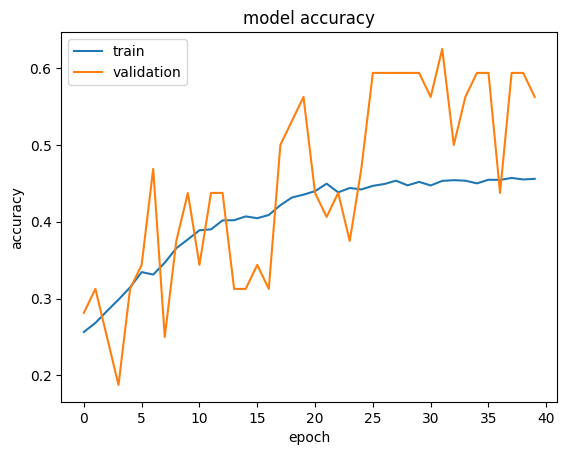

In [47]:
plt.plot(history_resnet.history["accuracy"])
plt.plot(history_resnet.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the ResNet Model**


In [48]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_resnet_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 2s - loss: 1.1513 - accuracy: 0.4062

4/4 [==============================] - 1s 10ms/step - loss: 1.1378 - accuracy: 0.4453


Loss: 1.1378326416015625, Accuracy: 0.4453125


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 2s

4/4 [==============================] - 1s 8ms/step


              precision    recall  f1-score   support

       happy       0.46      0.41      0.43        32
     neutral       0.32      0.47      0.38        32
         sad       0.38      0.34      0.36        32
    surprise       0.75      0.56      0.64        32

    accuracy                           0.45       128
   macro avg       0.48      0.45      0.45       128
weighted avg       0.48      0.45      0.45       128



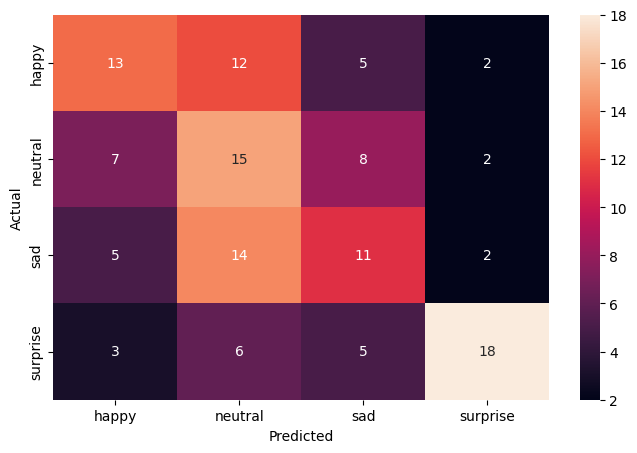

In [49]:
pred_probabilities = new_resnet_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the ResNet Transfer layer and see if you can improve the performance.**


## **EfficientNet Model**


In [50]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [51]:
efficient_model = EfficientNetV2B2(
    weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers)
)
# Making all the layers of the efficient_model model non-trainable. i.e. freezing them
for layer in efficient_model.layers:
    layer.trainable = False

efficient_model.summary()

    8192/35839040 [..............................] - ETA: 0s

   49152/35839040 [..............................] - ETA: 44s

   81920/35839040 [..............................] - ETA: 1:12

  368640/35839040 [..............................] - ETA: 20s 

 1097728/35839040 [..............................] - ETA: 8s 

 1753088/35839040 [>.............................] - ETA: 6s

 2547712/35839040 [=>............................] - ETA: 4s

 3809280/35839040 [==>...........................] - ETA: 3s

 5210112/35839040 [===>..........................] - ETA: 2s

 6766592/35839040 [====>.........................] - ETA: 2s

 7815168/35839040 [=====>........................] - ETA: 2s

 8929280/35839040 [======>.......................] - ETA: 2s

10420224/35839040 [=======>......................] - ETA: 1s

11665408/35839040 [========>.....................] - ETA: 1s

13123584/35839040 [=========>....................] - ETA: 1s

14131200/35839040 [==========>...................] - ETA: 1s

15482880/35839040 [===========>..................] - ETA: 1s

16809984/35839040 [=============>................] - ETA: 1s

18120704/35839040 [==============>...............] - ETA: 1s

19791872/35839040 [===============>..............] - ETA: 0s

21135360/35839040 [================>.............] - ETA: 0s

22216704/35839040 [=================>............] - ETA: 0s

23691264/35839040 [==================>...........] - ETA: 0s

24707072/35839040 [===================>..........] - ETA: 0s

26099712/35839040 [====================>.........] - ETA: 0s

27049984/35839040 [=====================>........] - ETA: 0s

28180480/35839040 [======================>.......] - ETA: 0s

29294592/35839040 [=======================>......] - ETA: 0s

30277632/35839040 [========================>.....] - ETA: 0s

31473664/35839040 [=========================>....] - ETA: 0s

32505856/35839040 [==========================>...] - ETA: 0s

33701888/35839040 [===========================>..] - ETA: 0s

35176448/35839040 [============================>.] - ETA: 0s

35839040/35839040 [==============================] - 2s 0us/step


Model: "efficientnetv2-b2"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 rescaling (Rescaling)       (None, 48, 48, 3)            0         ['input_1[0][0]']             


 normalization (Normalizati  (None, 48, 48, 3)            0         ['rescaling[0][0]']           


 on)                                                                                              


 stem_conv (Conv2D)          (None, 24, 24, 32)           864       ['normalization[0][0]']       


 stem_bn (BatchNormalizatio  (None, 24, 24, 32)           128       ['stem_conv[0][0]']           


 n)                                                                                               


 stem_activation (Activatio  (None, 24, 24, 32)           0         ['stem_bn[0][0]']             


 n)                                                                                               


 block1a_project_conv (Conv  (None, 24, 24, 16)           4608      ['stem_activation[0][0]']     


 2D)                                                                                              


 block1a_project_bn (BatchN  (None, 24, 24, 16)           64        ['block1a_project_conv[0][0]']


 ormalization)                                                                                    


 block1a_project_activation  (None, 24, 24, 16)           0         ['block1a_project_bn[0][0]']  


  (Activation)                                                                                    


 block1b_project_conv (Conv  (None, 24, 24, 16)           2304      ['block1a_project_activation[0


 2D)                                                                ][0]']                        


 block1b_project_bn (BatchN  (None, 24, 24, 16)           64        ['block1b_project_conv[0][0]']


 ormalization)                                                                                    


 block1b_project_activation  (None, 24, 24, 16)           0         ['block1b_project_bn[0][0]']  


  (Activation)                                                                                    


 block1b_drop (Dropout)      (None, 24, 24, 16)           0         ['block1b_project_activation[0


                                                                    ][0]']                        


 block1b_add (Add)           (None, 24, 24, 16)           0         ['block1b_drop[0][0]',        


                                                                     'block1a_project_activation[0


                                                                    ][0]']                        


 block2a_expand_conv (Conv2  (None, 12, 12, 64)           9216      ['block1b_add[0][0]']         


 D)                                                                                               


 block2a_expand_bn (BatchNo  (None, 12, 12, 64)           256       ['block2a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2a_expand_activation   (None, 12, 12, 64)           0         ['block2a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2a_project_conv (Conv  (None, 12, 12, 32)           2048      ['block2a_expand_activation[0]


 2D)                                                                [0]']                         


 block2a_project_bn (BatchN  (None, 12, 12, 32)           128       ['block2a_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_expand_conv (Conv2  (None, 12, 12, 128)          36864     ['block2a_project_bn[0][0]']  


 D)                                                                                               


 block2b_expand_bn (BatchNo  (None, 12, 12, 128)          512       ['block2b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2b_expand_activation   (None, 12, 12, 128)          0         ['block2b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2b_project_conv (Conv  (None, 12, 12, 32)           4096      ['block2b_expand_activation[0]


 2D)                                                                [0]']                         


 block2b_project_bn (BatchN  (None, 12, 12, 32)           128       ['block2b_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_drop (Dropout)      (None, 12, 12, 32)           0         ['block2b_project_bn[0][0]']  


 block2b_add (Add)           (None, 12, 12, 32)           0         ['block2b_drop[0][0]',        


                                                                     'block2a_project_bn[0][0]']  


 block2c_expand_conv (Conv2  (None, 12, 12, 128)          36864     ['block2b_add[0][0]']         


 D)                                                                                               


 block2c_expand_bn (BatchNo  (None, 12, 12, 128)          512       ['block2c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2c_expand_activation   (None, 12, 12, 128)          0         ['block2c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2c_project_conv (Conv  (None, 12, 12, 32)           4096      ['block2c_expand_activation[0]


 2D)                                                                [0]']                         


 block2c_project_bn (BatchN  (None, 12, 12, 32)           128       ['block2c_project_conv[0][0]']


 ormalization)                                                                                    


 block2c_drop (Dropout)      (None, 12, 12, 32)           0         ['block2c_project_bn[0][0]']  


 block2c_add (Add)           (None, 12, 12, 32)           0         ['block2c_drop[0][0]',        


                                                                     'block2b_add[0][0]']         


 block3a_expand_conv (Conv2  (None, 6, 6, 128)            36864     ['block2c_add[0][0]']         


 D)                                                                                               


 block3a_expand_bn (BatchNo  (None, 6, 6, 128)            512       ['block3a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3a_expand_activation   (None, 6, 6, 128)            0         ['block3a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3a_project_conv (Conv  (None, 6, 6, 56)             7168      ['block3a_expand_activation[0]


 2D)                                                                [0]']                         


 block3a_project_bn (BatchN  (None, 6, 6, 56)             224       ['block3a_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_expand_conv (Conv2  (None, 6, 6, 224)            112896    ['block3a_project_bn[0][0]']  


 D)                                                                                               


 block3b_expand_bn (BatchNo  (None, 6, 6, 224)            896       ['block3b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3b_expand_activation   (None, 6, 6, 224)            0         ['block3b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3b_project_conv (Conv  (None, 6, 6, 56)             12544     ['block3b_expand_activation[0]


 2D)                                                                [0]']                         


 block3b_project_bn (BatchN  (None, 6, 6, 56)             224       ['block3b_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_drop (Dropout)      (None, 6, 6, 56)             0         ['block3b_project_bn[0][0]']  


 block3b_add (Add)           (None, 6, 6, 56)             0         ['block3b_drop[0][0]',        


                                                                     'block3a_project_bn[0][0]']  


 block3c_expand_conv (Conv2  (None, 6, 6, 224)            112896    ['block3b_add[0][0]']         


 D)                                                                                               


 block3c_expand_bn (BatchNo  (None, 6, 6, 224)            896       ['block3c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3c_expand_activation   (None, 6, 6, 224)            0         ['block3c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3c_project_conv (Conv  (None, 6, 6, 56)             12544     ['block3c_expand_activation[0]


 2D)                                                                [0]']                         


 block3c_project_bn (BatchN  (None, 6, 6, 56)             224       ['block3c_project_conv[0][0]']


 ormalization)                                                                                    


 block3c_drop (Dropout)      (None, 6, 6, 56)             0         ['block3c_project_bn[0][0]']  


 block3c_add (Add)           (None, 6, 6, 56)             0         ['block3c_drop[0][0]',        


                                                                     'block3b_add[0][0]']         


 block4a_expand_conv (Conv2  (None, 6, 6, 224)            12544     ['block3c_add[0][0]']         


 D)                                                                                               


 block4a_expand_bn (BatchNo  (None, 6, 6, 224)            896       ['block4a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4a_expand_activation   (None, 6, 6, 224)            0         ['block4a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4a_dwconv2 (Depthwise  (None, 3, 3, 224)            2016      ['block4a_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block4a_bn (BatchNormaliza  (None, 3, 3, 224)            896       ['block4a_dwconv2[0][0]']     


 tion)                                                                                            


 block4a_activation (Activa  (None, 3, 3, 224)            0         ['block4a_bn[0][0]']          


 tion)                                                                                            


 block4a_se_squeeze (Global  (None, 224)                  0         ['block4a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4a_se_reshape (Reshap  (None, 1, 1, 224)            0         ['block4a_se_squeeze[0][0]']  


 e)                                                                                               


 block4a_se_reduce (Conv2D)  (None, 1, 1, 14)             3150      ['block4a_se_reshape[0][0]']  


 block4a_se_expand (Conv2D)  (None, 1, 1, 224)            3360      ['block4a_se_reduce[0][0]']   


 block4a_se_excite (Multipl  (None, 3, 3, 224)            0         ['block4a_activation[0][0]',  


 y)                                                                  'block4a_se_expand[0][0]']   


 block4a_project_conv (Conv  (None, 3, 3, 104)            23296     ['block4a_se_excite[0][0]']   


 2D)                                                                                              


 block4a_project_bn (BatchN  (None, 3, 3, 104)            416       ['block4a_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_expand_conv (Conv2  (None, 3, 3, 416)            43264     ['block4a_project_bn[0][0]']  


 D)                                                                                               


 block4b_expand_bn (BatchNo  (None, 3, 3, 416)            1664      ['block4b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4b_expand_activation   (None, 3, 3, 416)            0         ['block4b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4b_dwconv2 (Depthwise  (None, 3, 3, 416)            3744      ['block4b_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block4b_bn (BatchNormaliza  (None, 3, 3, 416)            1664      ['block4b_dwconv2[0][0]']     


 tion)                                                                                            


 block4b_activation (Activa  (None, 3, 3, 416)            0         ['block4b_bn[0][0]']          


 tion)                                                                                            


 block4b_se_squeeze (Global  (None, 416)                  0         ['block4b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4b_se_reshape (Reshap  (None, 1, 1, 416)            0         ['block4b_se_squeeze[0][0]']  


 e)                                                                                               


 block4b_se_reduce (Conv2D)  (None, 1, 1, 26)             10842     ['block4b_se_reshape[0][0]']  


 block4b_se_expand (Conv2D)  (None, 1, 1, 416)            11232     ['block4b_se_reduce[0][0]']   


 block4b_se_excite (Multipl  (None, 3, 3, 416)            0         ['block4b_activation[0][0]',  


 y)                                                                  'block4b_se_expand[0][0]']   


 block4b_project_conv (Conv  (None, 3, 3, 104)            43264     ['block4b_se_excite[0][0]']   


 2D)                                                                                              


 block4b_project_bn (BatchN  (None, 3, 3, 104)            416       ['block4b_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_drop (Dropout)      (None, 3, 3, 104)            0         ['block4b_project_bn[0][0]']  


 block4b_add (Add)           (None, 3, 3, 104)            0         ['block4b_drop[0][0]',        


                                                                     'block4a_project_bn[0][0]']  


 block4c_expand_conv (Conv2  (None, 3, 3, 416)            43264     ['block4b_add[0][0]']         


 D)                                                                                               


 block4c_expand_bn (BatchNo  (None, 3, 3, 416)            1664      ['block4c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4c_expand_activation   (None, 3, 3, 416)            0         ['block4c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4c_dwconv2 (Depthwise  (None, 3, 3, 416)            3744      ['block4c_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block4c_bn (BatchNormaliza  (None, 3, 3, 416)            1664      ['block4c_dwconv2[0][0]']     


 tion)                                                                                            


 block4c_activation (Activa  (None, 3, 3, 416)            0         ['block4c_bn[0][0]']          


 tion)                                                                                            


 block4c_se_squeeze (Global  (None, 416)                  0         ['block4c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4c_se_reshape (Reshap  (None, 1, 1, 416)            0         ['block4c_se_squeeze[0][0]']  


 e)                                                                                               


 block4c_se_reduce (Conv2D)  (None, 1, 1, 26)             10842     ['block4c_se_reshape[0][0]']  


 block4c_se_expand (Conv2D)  (None, 1, 1, 416)            11232     ['block4c_se_reduce[0][0]']   


 block4c_se_excite (Multipl  (None, 3, 3, 416)            0         ['block4c_activation[0][0]',  


 y)                                                                  'block4c_se_expand[0][0]']   


 block4c_project_conv (Conv  (None, 3, 3, 104)            43264     ['block4c_se_excite[0][0]']   


 2D)                                                                                              


 block4c_project_bn (BatchN  (None, 3, 3, 104)            416       ['block4c_project_conv[0][0]']


 ormalization)                                                                                    


 block4c_drop (Dropout)      (None, 3, 3, 104)            0         ['block4c_project_bn[0][0]']  


 block4c_add (Add)           (None, 3, 3, 104)            0         ['block4c_drop[0][0]',        


                                                                     'block4b_add[0][0]']         


 block4d_expand_conv (Conv2  (None, 3, 3, 416)            43264     ['block4c_add[0][0]']         


 D)                                                                                               


 block4d_expand_bn (BatchNo  (None, 3, 3, 416)            1664      ['block4d_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4d_expand_activation   (None, 3, 3, 416)            0         ['block4d_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4d_dwconv2 (Depthwise  (None, 3, 3, 416)            3744      ['block4d_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block4d_bn (BatchNormaliza  (None, 3, 3, 416)            1664      ['block4d_dwconv2[0][0]']     


 tion)                                                                                            


 block4d_activation (Activa  (None, 3, 3, 416)            0         ['block4d_bn[0][0]']          


 tion)                                                                                            


 block4d_se_squeeze (Global  (None, 416)                  0         ['block4d_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4d_se_reshape (Reshap  (None, 1, 1, 416)            0         ['block4d_se_squeeze[0][0]']  


 e)                                                                                               


 block4d_se_reduce (Conv2D)  (None, 1, 1, 26)             10842     ['block4d_se_reshape[0][0]']  


 block4d_se_expand (Conv2D)  (None, 1, 1, 416)            11232     ['block4d_se_reduce[0][0]']   


 block4d_se_excite (Multipl  (None, 3, 3, 416)            0         ['block4d_activation[0][0]',  


 y)                                                                  'block4d_se_expand[0][0]']   


 block4d_project_conv (Conv  (None, 3, 3, 104)            43264     ['block4d_se_excite[0][0]']   


 2D)                                                                                              


 block4d_project_bn (BatchN  (None, 3, 3, 104)            416       ['block4d_project_conv[0][0]']


 ormalization)                                                                                    


 block4d_drop (Dropout)      (None, 3, 3, 104)            0         ['block4d_project_bn[0][0]']  


 block4d_add (Add)           (None, 3, 3, 104)            0         ['block4d_drop[0][0]',        


                                                                     'block4c_add[0][0]']         


 block5a_expand_conv (Conv2  (None, 3, 3, 624)            64896     ['block4d_add[0][0]']         


 D)                                                                                               


 block5a_expand_bn (BatchNo  (None, 3, 3, 624)            2496      ['block5a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5a_expand_activation   (None, 3, 3, 624)            0         ['block5a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5a_dwconv2 (Depthwise  (None, 3, 3, 624)            5616      ['block5a_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5a_bn (BatchNormaliza  (None, 3, 3, 624)            2496      ['block5a_dwconv2[0][0]']     


 tion)                                                                                            


 block5a_activation (Activa  (None, 3, 3, 624)            0         ['block5a_bn[0][0]']          


 tion)                                                                                            


 block5a_se_squeeze (Global  (None, 624)                  0         ['block5a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5a_se_reshape (Reshap  (None, 1, 1, 624)            0         ['block5a_se_squeeze[0][0]']  


 e)                                                                                               


 block5a_se_reduce (Conv2D)  (None, 1, 1, 26)             16250     ['block5a_se_reshape[0][0]']  


 block5a_se_expand (Conv2D)  (None, 1, 1, 624)            16848     ['block5a_se_reduce[0][0]']   


 block5a_se_excite (Multipl  (None, 3, 3, 624)            0         ['block5a_activation[0][0]',  


 y)                                                                  'block5a_se_expand[0][0]']   


 block5a_project_conv (Conv  (None, 3, 3, 120)            74880     ['block5a_se_excite[0][0]']   


 2D)                                                                                              


 block5a_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5a_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5a_project_bn[0][0]']  


 D)                                                                                               


 block5b_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block5b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5b_expand_activation   (None, 3, 3, 720)            0         ['block5b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5b_dwconv2 (Depthwise  (None, 3, 3, 720)            6480      ['block5b_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5b_bn (BatchNormaliza  (None, 3, 3, 720)            2880      ['block5b_dwconv2[0][0]']     


 tion)                                                                                            


 block5b_activation (Activa  (None, 3, 3, 720)            0         ['block5b_bn[0][0]']          


 tion)                                                                                            


 block5b_se_squeeze (Global  (None, 720)                  0         ['block5b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5b_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block5b_se_squeeze[0][0]']  


 e)                                                                                               


 block5b_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block5b_se_reshape[0][0]']  


 block5b_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block5b_se_reduce[0][0]']   


 block5b_se_excite (Multipl  (None, 3, 3, 720)            0         ['block5b_activation[0][0]',  


 y)                                                                  'block5b_se_expand[0][0]']   


 block5b_project_conv (Conv  (None, 3, 3, 120)            86400     ['block5b_se_excite[0][0]']   


 2D)                                                                                              


 block5b_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5b_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_drop (Dropout)      (None, 3, 3, 120)            0         ['block5b_project_bn[0][0]']  


 block5b_add (Add)           (None, 3, 3, 120)            0         ['block5b_drop[0][0]',        


                                                                     'block5a_project_bn[0][0]']  


 block5c_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5b_add[0][0]']         


 D)                                                                                               


 block5c_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block5c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5c_expand_activation   (None, 3, 3, 720)            0         ['block5c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5c_dwconv2 (Depthwise  (None, 3, 3, 720)            6480      ['block5c_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5c_bn (BatchNormaliza  (None, 3, 3, 720)            2880      ['block5c_dwconv2[0][0]']     


 tion)                                                                                            


 block5c_activation (Activa  (None, 3, 3, 720)            0         ['block5c_bn[0][0]']          


 tion)                                                                                            


 block5c_se_squeeze (Global  (None, 720)                  0         ['block5c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5c_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block5c_se_squeeze[0][0]']  


 e)                                                                                               


 block5c_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block5c_se_reshape[0][0]']  


 block5c_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block5c_se_reduce[0][0]']   


 block5c_se_excite (Multipl  (None, 3, 3, 720)            0         ['block5c_activation[0][0]',  


 y)                                                                  'block5c_se_expand[0][0]']   


 block5c_project_conv (Conv  (None, 3, 3, 120)            86400     ['block5c_se_excite[0][0]']   


 2D)                                                                                              


 block5c_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5c_project_conv[0][0]']


 ormalization)                                                                                    


 block5c_drop (Dropout)      (None, 3, 3, 120)            0         ['block5c_project_bn[0][0]']  


 block5c_add (Add)           (None, 3, 3, 120)            0         ['block5c_drop[0][0]',        


                                                                     'block5b_add[0][0]']         


 block5d_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5c_add[0][0]']         


 D)                                                                                               


 block5d_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block5d_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5d_expand_activation   (None, 3, 3, 720)            0         ['block5d_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5d_dwconv2 (Depthwise  (None, 3, 3, 720)            6480      ['block5d_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5d_bn (BatchNormaliza  (None, 3, 3, 720)            2880      ['block5d_dwconv2[0][0]']     


 tion)                                                                                            


 block5d_activation (Activa  (None, 3, 3, 720)            0         ['block5d_bn[0][0]']          


 tion)                                                                                            


 block5d_se_squeeze (Global  (None, 720)                  0         ['block5d_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5d_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block5d_se_squeeze[0][0]']  


 e)                                                                                               


 block5d_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block5d_se_reshape[0][0]']  


 block5d_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block5d_se_reduce[0][0]']   


 block5d_se_excite (Multipl  (None, 3, 3, 720)            0         ['block5d_activation[0][0]',  


 y)                                                                  'block5d_se_expand[0][0]']   


 block5d_project_conv (Conv  (None, 3, 3, 120)            86400     ['block5d_se_excite[0][0]']   


 2D)                                                                                              


 block5d_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5d_project_conv[0][0]']


 ormalization)                                                                                    


 block5d_drop (Dropout)      (None, 3, 3, 120)            0         ['block5d_project_bn[0][0]']  


 block5d_add (Add)           (None, 3, 3, 120)            0         ['block5d_drop[0][0]',        


                                                                     'block5c_add[0][0]']         


 block5e_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5d_add[0][0]']         


 D)                                                                                               


 block5e_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block5e_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5e_expand_activation   (None, 3, 3, 720)            0         ['block5e_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5e_dwconv2 (Depthwise  (None, 3, 3, 720)            6480      ['block5e_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5e_bn (BatchNormaliza  (None, 3, 3, 720)            2880      ['block5e_dwconv2[0][0]']     


 tion)                                                                                            


 block5e_activation (Activa  (None, 3, 3, 720)            0         ['block5e_bn[0][0]']          


 tion)                                                                                            


 block5e_se_squeeze (Global  (None, 720)                  0         ['block5e_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5e_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block5e_se_squeeze[0][0]']  


 e)                                                                                               


 block5e_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block5e_se_reshape[0][0]']  


 block5e_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block5e_se_reduce[0][0]']   


 block5e_se_excite (Multipl  (None, 3, 3, 720)            0         ['block5e_activation[0][0]',  


 y)                                                                  'block5e_se_expand[0][0]']   


 block5e_project_conv (Conv  (None, 3, 3, 120)            86400     ['block5e_se_excite[0][0]']   


 2D)                                                                                              


 block5e_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5e_project_conv[0][0]']


 ormalization)                                                                                    


 block5e_drop (Dropout)      (None, 3, 3, 120)            0         ['block5e_project_bn[0][0]']  


 block5e_add (Add)           (None, 3, 3, 120)            0         ['block5e_drop[0][0]',        


                                                                     'block5d_add[0][0]']         


 block5f_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5e_add[0][0]']         


 D)                                                                                               


 block5f_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block5f_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5f_expand_activation   (None, 3, 3, 720)            0         ['block5f_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5f_dwconv2 (Depthwise  (None, 3, 3, 720)            6480      ['block5f_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block5f_bn (BatchNormaliza  (None, 3, 3, 720)            2880      ['block5f_dwconv2[0][0]']     


 tion)                                                                                            


 block5f_activation (Activa  (None, 3, 3, 720)            0         ['block5f_bn[0][0]']          


 tion)                                                                                            


 block5f_se_squeeze (Global  (None, 720)                  0         ['block5f_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5f_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block5f_se_squeeze[0][0]']  


 e)                                                                                               


 block5f_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block5f_se_reshape[0][0]']  


 block5f_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block5f_se_reduce[0][0]']   


 block5f_se_excite (Multipl  (None, 3, 3, 720)            0         ['block5f_activation[0][0]',  


 y)                                                                  'block5f_se_expand[0][0]']   


 block5f_project_conv (Conv  (None, 3, 3, 120)            86400     ['block5f_se_excite[0][0]']   


 2D)                                                                                              


 block5f_project_bn (BatchN  (None, 3, 3, 120)            480       ['block5f_project_conv[0][0]']


 ormalization)                                                                                    


 block5f_drop (Dropout)      (None, 3, 3, 120)            0         ['block5f_project_bn[0][0]']  


 block5f_add (Add)           (None, 3, 3, 120)            0         ['block5f_drop[0][0]',        


                                                                     'block5e_add[0][0]']         


 block6a_expand_conv (Conv2  (None, 3, 3, 720)            86400     ['block5f_add[0][0]']         


 D)                                                                                               


 block6a_expand_bn (BatchNo  (None, 3, 3, 720)            2880      ['block6a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6a_expand_activation   (None, 3, 3, 720)            0         ['block6a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6a_dwconv2 (Depthwise  (None, 2, 2, 720)            6480      ['block6a_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6a_bn (BatchNormaliza  (None, 2, 2, 720)            2880      ['block6a_dwconv2[0][0]']     


 tion)                                                                                            


 block6a_activation (Activa  (None, 2, 2, 720)            0         ['block6a_bn[0][0]']          


 tion)                                                                                            


 block6a_se_squeeze (Global  (None, 720)                  0         ['block6a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6a_se_reshape (Reshap  (None, 1, 1, 720)            0         ['block6a_se_squeeze[0][0]']  


 e)                                                                                               


 block6a_se_reduce (Conv2D)  (None, 1, 1, 30)             21630     ['block6a_se_reshape[0][0]']  


 block6a_se_expand (Conv2D)  (None, 1, 1, 720)            22320     ['block6a_se_reduce[0][0]']   


 block6a_se_excite (Multipl  (None, 2, 2, 720)            0         ['block6a_activation[0][0]',  


 y)                                                                  'block6a_se_expand[0][0]']   


 block6a_project_conv (Conv  (None, 2, 2, 208)            149760    ['block6a_se_excite[0][0]']   


 2D)                                                                                              


 block6a_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6a_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6a_project_bn[0][0]']  


 D)                                                                                               


 block6b_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6b_expand_activation   (None, 2, 2, 1248)           0         ['block6b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6b_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6b_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6b_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6b_dwconv2[0][0]']     


 tion)                                                                                            


 block6b_activation (Activa  (None, 2, 2, 1248)           0         ['block6b_bn[0][0]']          


 tion)                                                                                            


 block6b_se_squeeze (Global  (None, 1248)                 0         ['block6b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6b_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6b_se_squeeze[0][0]']  


 e)                                                                                               


 block6b_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6b_se_reshape[0][0]']  


 block6b_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6b_se_reduce[0][0]']   


 block6b_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6b_activation[0][0]',  


 y)                                                                  'block6b_se_expand[0][0]']   


 block6b_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6b_se_excite[0][0]']   


 2D)                                                                                              


 block6b_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6b_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_drop (Dropout)      (None, 2, 2, 208)            0         ['block6b_project_bn[0][0]']  


 block6b_add (Add)           (None, 2, 2, 208)            0         ['block6b_drop[0][0]',        


                                                                     'block6a_project_bn[0][0]']  


 block6c_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6b_add[0][0]']         


 D)                                                                                               


 block6c_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6c_expand_activation   (None, 2, 2, 1248)           0         ['block6c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6c_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6c_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6c_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6c_dwconv2[0][0]']     


 tion)                                                                                            


 block6c_activation (Activa  (None, 2, 2, 1248)           0         ['block6c_bn[0][0]']          


 tion)                                                                                            


 block6c_se_squeeze (Global  (None, 1248)                 0         ['block6c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6c_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6c_se_squeeze[0][0]']  


 e)                                                                                               


 block6c_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6c_se_reshape[0][0]']  


 block6c_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6c_se_reduce[0][0]']   


 block6c_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6c_activation[0][0]',  


 y)                                                                  'block6c_se_expand[0][0]']   


 block6c_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6c_se_excite[0][0]']   


 2D)                                                                                              


 block6c_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6c_project_conv[0][0]']


 ormalization)                                                                                    


 block6c_drop (Dropout)      (None, 2, 2, 208)            0         ['block6c_project_bn[0][0]']  


 block6c_add (Add)           (None, 2, 2, 208)            0         ['block6c_drop[0][0]',        


                                                                     'block6b_add[0][0]']         


 block6d_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6c_add[0][0]']         


 D)                                                                                               


 block6d_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6d_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6d_expand_activation   (None, 2, 2, 1248)           0         ['block6d_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6d_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6d_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6d_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6d_dwconv2[0][0]']     


 tion)                                                                                            


 block6d_activation (Activa  (None, 2, 2, 1248)           0         ['block6d_bn[0][0]']          


 tion)                                                                                            


 block6d_se_squeeze (Global  (None, 1248)                 0         ['block6d_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6d_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6d_se_squeeze[0][0]']  


 e)                                                                                               


 block6d_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6d_se_reshape[0][0]']  


 block6d_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6d_se_reduce[0][0]']   


 block6d_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6d_activation[0][0]',  


 y)                                                                  'block6d_se_expand[0][0]']   


 block6d_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6d_se_excite[0][0]']   


 2D)                                                                                              


 block6d_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6d_project_conv[0][0]']


 ormalization)                                                                                    


 block6d_drop (Dropout)      (None, 2, 2, 208)            0         ['block6d_project_bn[0][0]']  


 block6d_add (Add)           (None, 2, 2, 208)            0         ['block6d_drop[0][0]',        


                                                                     'block6c_add[0][0]']         


 block6e_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6d_add[0][0]']         


 D)                                                                                               


 block6e_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6e_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6e_expand_activation   (None, 2, 2, 1248)           0         ['block6e_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6e_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6e_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6e_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6e_dwconv2[0][0]']     


 tion)                                                                                            


 block6e_activation (Activa  (None, 2, 2, 1248)           0         ['block6e_bn[0][0]']          


 tion)                                                                                            


 block6e_se_squeeze (Global  (None, 1248)                 0         ['block6e_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6e_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6e_se_squeeze[0][0]']  


 e)                                                                                               


 block6e_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6e_se_reshape[0][0]']  


 block6e_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6e_se_reduce[0][0]']   


 block6e_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6e_activation[0][0]',  


 y)                                                                  'block6e_se_expand[0][0]']   


 block6e_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6e_se_excite[0][0]']   


 2D)                                                                                              


 block6e_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6e_project_conv[0][0]']


 ormalization)                                                                                    


 block6e_drop (Dropout)      (None, 2, 2, 208)            0         ['block6e_project_bn[0][0]']  


 block6e_add (Add)           (None, 2, 2, 208)            0         ['block6e_drop[0][0]',        


                                                                     'block6d_add[0][0]']         


 block6f_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6e_add[0][0]']         


 D)                                                                                               


 block6f_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6f_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6f_expand_activation   (None, 2, 2, 1248)           0         ['block6f_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6f_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6f_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6f_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6f_dwconv2[0][0]']     


 tion)                                                                                            


 block6f_activation (Activa  (None, 2, 2, 1248)           0         ['block6f_bn[0][0]']          


 tion)                                                                                            


 block6f_se_squeeze (Global  (None, 1248)                 0         ['block6f_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6f_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6f_se_squeeze[0][0]']  


 e)                                                                                               


 block6f_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6f_se_reshape[0][0]']  


 block6f_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6f_se_reduce[0][0]']   


 block6f_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6f_activation[0][0]',  


 y)                                                                  'block6f_se_expand[0][0]']   


 block6f_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6f_se_excite[0][0]']   


 2D)                                                                                              


 block6f_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6f_project_conv[0][0]']


 ormalization)                                                                                    


 block6f_drop (Dropout)      (None, 2, 2, 208)            0         ['block6f_project_bn[0][0]']  


 block6f_add (Add)           (None, 2, 2, 208)            0         ['block6f_drop[0][0]',        


                                                                     'block6e_add[0][0]']         


 block6g_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6f_add[0][0]']         


 D)                                                                                               


 block6g_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6g_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6g_expand_activation   (None, 2, 2, 1248)           0         ['block6g_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6g_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6g_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6g_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6g_dwconv2[0][0]']     


 tion)                                                                                            


 block6g_activation (Activa  (None, 2, 2, 1248)           0         ['block6g_bn[0][0]']          


 tion)                                                                                            


 block6g_se_squeeze (Global  (None, 1248)                 0         ['block6g_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6g_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6g_se_squeeze[0][0]']  


 e)                                                                                               


 block6g_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6g_se_reshape[0][0]']  


 block6g_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6g_se_reduce[0][0]']   


 block6g_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6g_activation[0][0]',  


 y)                                                                  'block6g_se_expand[0][0]']   


 block6g_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6g_se_excite[0][0]']   


 2D)                                                                                              


 block6g_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6g_project_conv[0][0]']


 ormalization)                                                                                    


 block6g_drop (Dropout)      (None, 2, 2, 208)            0         ['block6g_project_bn[0][0]']  


 block6g_add (Add)           (None, 2, 2, 208)            0         ['block6g_drop[0][0]',        


                                                                     'block6f_add[0][0]']         


 block6h_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6g_add[0][0]']         


 D)                                                                                               


 block6h_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6h_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6h_expand_activation   (None, 2, 2, 1248)           0         ['block6h_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6h_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6h_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6h_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6h_dwconv2[0][0]']     


 tion)                                                                                            


 block6h_activation (Activa  (None, 2, 2, 1248)           0         ['block6h_bn[0][0]']          


 tion)                                                                                            


 block6h_se_squeeze (Global  (None, 1248)                 0         ['block6h_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6h_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6h_se_squeeze[0][0]']  


 e)                                                                                               


 block6h_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6h_se_reshape[0][0]']  


 block6h_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6h_se_reduce[0][0]']   


 block6h_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6h_activation[0][0]',  


 y)                                                                  'block6h_se_expand[0][0]']   


 block6h_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6h_se_excite[0][0]']   


 2D)                                                                                              


 block6h_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6h_project_conv[0][0]']


 ormalization)                                                                                    


 block6h_drop (Dropout)      (None, 2, 2, 208)            0         ['block6h_project_bn[0][0]']  


 block6h_add (Add)           (None, 2, 2, 208)            0         ['block6h_drop[0][0]',        


                                                                     'block6g_add[0][0]']         


 block6i_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6h_add[0][0]']         


 D)                                                                                               


 block6i_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6i_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6i_expand_activation   (None, 2, 2, 1248)           0         ['block6i_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6i_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6i_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6i_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6i_dwconv2[0][0]']     


 tion)                                                                                            


 block6i_activation (Activa  (None, 2, 2, 1248)           0         ['block6i_bn[0][0]']          


 tion)                                                                                            


 block6i_se_squeeze (Global  (None, 1248)                 0         ['block6i_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6i_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6i_se_squeeze[0][0]']  


 e)                                                                                               


 block6i_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6i_se_reshape[0][0]']  


 block6i_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6i_se_reduce[0][0]']   


 block6i_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6i_activation[0][0]',  


 y)                                                                  'block6i_se_expand[0][0]']   


 block6i_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6i_se_excite[0][0]']   


 2D)                                                                                              


 block6i_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6i_project_conv[0][0]']


 ormalization)                                                                                    


 block6i_drop (Dropout)      (None, 2, 2, 208)            0         ['block6i_project_bn[0][0]']  


 block6i_add (Add)           (None, 2, 2, 208)            0         ['block6i_drop[0][0]',        


                                                                     'block6h_add[0][0]']         


 block6j_expand_conv (Conv2  (None, 2, 2, 1248)           259584    ['block6i_add[0][0]']         


 D)                                                                                               


 block6j_expand_bn (BatchNo  (None, 2, 2, 1248)           4992      ['block6j_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6j_expand_activation   (None, 2, 2, 1248)           0         ['block6j_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6j_dwconv2 (Depthwise  (None, 2, 2, 1248)           11232     ['block6j_expand_activation[0]


 Conv2D)                                                            [0]']                         


 block6j_bn (BatchNormaliza  (None, 2, 2, 1248)           4992      ['block6j_dwconv2[0][0]']     


 tion)                                                                                            


 block6j_activation (Activa  (None, 2, 2, 1248)           0         ['block6j_bn[0][0]']          


 tion)                                                                                            


 block6j_se_squeeze (Global  (None, 1248)                 0         ['block6j_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6j_se_reshape (Reshap  (None, 1, 1, 1248)           0         ['block6j_se_squeeze[0][0]']  


 e)                                                                                               


 block6j_se_reduce (Conv2D)  (None, 1, 1, 52)             64948     ['block6j_se_reshape[0][0]']  


 block6j_se_expand (Conv2D)  (None, 1, 1, 1248)           66144     ['block6j_se_reduce[0][0]']   


 block6j_se_excite (Multipl  (None, 2, 2, 1248)           0         ['block6j_activation[0][0]',  


 y)                                                                  'block6j_se_expand[0][0]']   


 block6j_project_conv (Conv  (None, 2, 2, 208)            259584    ['block6j_se_excite[0][0]']   


 2D)                                                                                              


 block6j_project_bn (BatchN  (None, 2, 2, 208)            832       ['block6j_project_conv[0][0]']


 ormalization)                                                                                    


 block6j_drop (Dropout)      (None, 2, 2, 208)            0         ['block6j_project_bn[0][0]']  


 block6j_add (Add)           (None, 2, 2, 208)            0         ['block6j_drop[0][0]',        


                                                                     'block6i_add[0][0]']         


 top_conv (Conv2D)           (None, 2, 2, 1408)           292864    ['block6j_add[0][0]']         


 top_bn (BatchNormalization  (None, 2, 2, 1408)           5632      ['top_conv[0][0]']            


 )                                                                                                


 top_activation (Activation  (None, 2, 2, 1408)           0         ['top_bn[0][0]']              


 )                                                                                                


Total params: 8769374 (33.45 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 8769374 (33.45 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import EfficientNet upto the layer of your choice and add Fully Connected layers on top of it.


In [52]:
new_efficient_model = Sequential()
new_efficient_model.add(efficient_model)

# Reduces each feature map to a single value by averaging all elements
new_efficient_model.add(Flatten())

# Adding a dense output layer
new_efficient_model.add(Dense(256, activation="relu"))
new_efficient_model.add(Dense(128, activation="relu"))
new_efficient_model.add(Dropout(0.3))
new_efficient_model.add(Dense(64, activation="relu"))
new_efficient_model.add(BatchNormalization())
new_efficient_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [53]:
new_efficient_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_efficient_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 efficientnetv2-b2 (Functio  (None, 2, 2, 1408)        8769374   


 nal)                                                            


 flatten (Flatten)           (None, 5632)              0         


 dense (Dense)               (None, 256)               1442048   


 dense_1 (Dense)             (None, 128)               32896     


 dropout (Dropout)           (None, 128)               0         


 dense_2 (Dense)             (None, 64)                8256      


 batch_normalization (Batch  (None, 64)                256       


 Normalization)                                                  


 dense_3 (Dense)             (None, 4)                 260       


Total params: 10253090 (39.11 MB)


Trainable params: 1483588 (5.66 MB)


Non-trainable params: 8769502 (33.45 MB)


_________________________________________________________________


In [54]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_efficient_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_efficient = new_efficient_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 41:06 - loss: 1.6850 - accuracy: 0.2812

  5/473 [..............................] - ETA: 6s - loss: 1.8624 - accuracy: 0.2375   

  7/473 [..............................] - ETA: 8s - loss: 1.8505 - accuracy: 0.2500

 10/473 [..............................] - ETA: 8s - loss: 1.9195 - accuracy: 0.2250

 13/473 [..............................] - ETA: 8s - loss: 1.9154 - accuracy: 0.2332

 16/473 [>.............................] - ETA: 8s - loss: 1.8759 - accuracy: 0.2383

 19/473 [>.............................] - ETA: 8s - loss: 1.8699 - accuracy: 0.2467

 22/473 [>.............................] - ETA: 8s - loss: 1.8580 - accuracy: 0.2528

 25/473 [>.............................] - ETA: 8s - loss: 1.8416 - accuracy: 0.2512

 28/473 [>.............................] - ETA: 8s - loss: 1.8254 - accuracy: 0.2533

 31/473 [>.............................] - ETA: 8s - loss: 1.8311 - accuracy: 0.2460

 34/473 [=>............................] - ETA: 8s - loss: 1.8278 - accuracy: 0.2472

 37/473 [=>............................] - ETA: 8s - loss: 1.8217 - accuracy: 0.2492

 40/473 [=>............................] - ETA: 8s - loss: 1.8164 - accuracy: 0.2492

 43/473 [=>............................] - ETA: 8s - loss: 1.8044 - accuracy: 0.2515

 46/473 [=>............................] - ETA: 8s - loss: 1.8001 - accuracy: 0.2500

 49/473 [==>...........................] - ETA: 8s - loss: 1.8041 - accuracy: 0.2513

 52/473 [==>...........................] - ETA: 8s - loss: 1.7926 - accuracy: 0.2530

 55/473 [==>...........................] - ETA: 8s - loss: 1.7832 - accuracy: 0.2545

 58/473 [==>...........................] - ETA: 8s - loss: 1.7791 - accuracy: 0.2538

 61/473 [==>...........................] - ETA: 8s - loss: 1.7760 - accuracy: 0.2531

 64/473 [===>..........................] - ETA: 7s - loss: 1.7666 - accuracy: 0.2534

 67/473 [===>..........................] - ETA: 7s - loss: 1.7591 - accuracy: 0.2509

 70/473 [===>..........................] - ETA: 7s - loss: 1.7522 - accuracy: 0.2496

 73/473 [===>..........................] - ETA: 7s - loss: 1.7411 - accuracy: 0.2521

 76/473 [===>..........................] - ETA: 7s - loss: 1.7378 - accuracy: 0.2488

 79/473 [====>.........................] - ETA: 7s - loss: 1.7370 - accuracy: 0.2476

 82/473 [====>.........................] - ETA: 7s - loss: 1.7327 - accuracy: 0.2466

 85/473 [====>.........................] - ETA: 7s - loss: 1.7243 - accuracy: 0.2493

 88/473 [====>.........................] - ETA: 7s - loss: 1.7238 - accuracy: 0.2468

 91/473 [====>.........................] - ETA: 7s - loss: 1.7165 - accuracy: 0.2462

 94/473 [====>.........................] - ETA: 7s - loss: 1.7074 - accuracy: 0.2500

 97/473 [=====>........................] - ETA: 7s - loss: 1.7023 - accuracy: 0.2506

100/473 [=====>........................] - ETA: 7s - loss: 1.6948 - accuracy: 0.2519

103/473 [=====>........................] - ETA: 7s - loss: 1.6934 - accuracy: 0.2494

106/473 [=====>........................] - ETA: 7s - loss: 1.6902 - accuracy: 0.2503

109/473 [=====>........................] - ETA: 7s - loss: 1.6887 - accuracy: 0.2497

112/473 [======>.......................] - ETA: 7s - loss: 1.6890 - accuracy: 0.2486

115/473 [======>.......................] - ETA: 7s - loss: 1.6850 - accuracy: 0.2478

118/473 [======>.......................] - ETA: 6s - loss: 1.6802 - accuracy: 0.2479

121/473 [======>.......................] - ETA: 6s - loss: 1.6790 - accuracy: 0.2474

124/473 [======>.......................] - ETA: 6s - loss: 1.6774 - accuracy: 0.2452

127/473 [=======>......................] - ETA: 6s - loss: 1.6741 - accuracy: 0.2446

130/473 [=======>......................] - ETA: 6s - loss: 1.6722 - accuracy: 0.2447

133/473 [=======>......................] - ETA: 6s - loss: 1.6669 - accuracy: 0.2448

136/473 [=======>......................] - ETA: 6s - loss: 1.6619 - accuracy: 0.2438

139/473 [=======>......................] - ETA: 6s - loss: 1.6595 - accuracy: 0.2435

142/473 [========>.....................] - ETA: 6s - loss: 1.6559 - accuracy: 0.2438

145/473 [========>.....................] - ETA: 6s - loss: 1.6509 - accuracy: 0.2448

148/473 [========>.....................] - ETA: 6s - loss: 1.6481 - accuracy: 0.2443

151/473 [========>.....................] - ETA: 6s - loss: 1.6459 - accuracy: 0.2436

154/473 [========>.....................] - ETA: 6s - loss: 1.6429 - accuracy: 0.2423

157/473 [========>.....................] - ETA: 6s - loss: 1.6405 - accuracy: 0.2414

160/473 [=========>....................] - ETA: 6s - loss: 1.6375 - accuracy: 0.2414

163/473 [=========>....................] - ETA: 6s - loss: 1.6341 - accuracy: 0.2423

166/473 [=========>....................] - ETA: 6s - loss: 1.6304 - accuracy: 0.2430

169/473 [=========>....................] - ETA: 5s - loss: 1.6281 - accuracy: 0.2424

171/473 [=========>....................] - ETA: 5s - loss: 1.6261 - accuracy: 0.2420

174/473 [==========>...................] - ETA: 5s - loss: 1.6235 - accuracy: 0.2416

177/473 [==========>...................] - ETA: 5s - loss: 1.6196 - accuracy: 0.2428

180/473 [==========>...................] - ETA: 5s - loss: 1.6166 - accuracy: 0.2429

183/473 [==========>...................] - ETA: 5s - loss: 1.6150 - accuracy: 0.2433

186/473 [==========>...................] - ETA: 5s - loss: 1.6114 - accuracy: 0.2441

189/473 [==========>...................] - ETA: 5s - loss: 1.6088 - accuracy: 0.2437

192/473 [===========>..................] - ETA: 5s - loss: 1.6067 - accuracy: 0.2438

195/473 [===========>..................] - ETA: 5s - loss: 1.6034 - accuracy: 0.2446

198/473 [===========>..................] - ETA: 5s - loss: 1.6012 - accuracy: 0.2448

201/473 [===========>..................] - ETA: 5s - loss: 1.5985 - accuracy: 0.2444

204/473 [===========>..................] - ETA: 5s - loss: 1.5967 - accuracy: 0.2446

207/473 [============>.................] - ETA: 5s - loss: 1.5944 - accuracy: 0.2449

210/473 [============>.................] - ETA: 5s - loss: 1.5914 - accuracy: 0.2452

213/473 [============>.................] - ETA: 5s - loss: 1.5885 - accuracy: 0.2457

216/473 [============>.................] - ETA: 5s - loss: 1.5878 - accuracy: 0.2452

219/473 [============>.................] - ETA: 5s - loss: 1.5867 - accuracy: 0.2449

222/473 [=============>................] - ETA: 4s - loss: 1.5849 - accuracy: 0.2452

225/473 [=============>................] - ETA: 4s - loss: 1.5830 - accuracy: 0.2465

228/473 [=============>................] - ETA: 4s - loss: 1.5817 - accuracy: 0.2466

231/473 [=============>................] - ETA: 4s - loss: 1.5801 - accuracy: 0.2474

234/473 [=============>................] - ETA: 4s - loss: 1.5777 - accuracy: 0.2481

237/473 [==============>...............] - ETA: 4s - loss: 1.5760 - accuracy: 0.2482

240/473 [==============>...............] - ETA: 4s - loss: 1.5750 - accuracy: 0.2478

243/473 [==============>...............] - ETA: 4s - loss: 1.5728 - accuracy: 0.2487

246/473 [==============>...............] - ETA: 4s - loss: 1.5709 - accuracy: 0.2492

249/473 [==============>...............] - ETA: 4s - loss: 1.5699 - accuracy: 0.2485

252/473 [==============>...............] - ETA: 4s - loss: 1.5684 - accuracy: 0.2489

255/473 [===============>..............] - ETA: 4s - loss: 1.5668 - accuracy: 0.2493

258/473 [===============>..............] - ETA: 4s - loss: 1.5648 - accuracy: 0.2501

261/473 [===============>..............] - ETA: 4s - loss: 1.5642 - accuracy: 0.2490

264/473 [===============>..............] - ETA: 4s - loss: 1.5621 - accuracy: 0.2496

267/473 [===============>..............] - ETA: 4s - loss: 1.5611 - accuracy: 0.2493

270/473 [================>.............] - ETA: 4s - loss: 1.5604 - accuracy: 0.2485

273/473 [================>.............] - ETA: 3s - loss: 1.5587 - accuracy: 0.2489

276/473 [================>.............] - ETA: 3s - loss: 1.5578 - accuracy: 0.2485

279/473 [================>.............] - ETA: 3s - loss: 1.5566 - accuracy: 0.2480

282/473 [================>.............] - ETA: 3s - loss: 1.5553 - accuracy: 0.2480

285/473 [=================>............] - ETA: 3s - loss: 1.5539 - accuracy: 0.2480

288/473 [=================>............] - ETA: 3s - loss: 1.5522 - accuracy: 0.2490

291/473 [=================>............] - ETA: 3s - loss: 1.5510 - accuracy: 0.2494

294/473 [=================>............] - ETA: 3s - loss: 1.5500 - accuracy: 0.2494

297/473 [=================>............] - ETA: 3s - loss: 1.5486 - accuracy: 0.2492

300/473 [==================>...........] - ETA: 3s - loss: 1.5478 - accuracy: 0.2490

303/473 [==================>...........] - ETA: 3s - loss: 1.5467 - accuracy: 0.2487

306/473 [==================>...........] - ETA: 3s - loss: 1.5450 - accuracy: 0.2488

309/473 [==================>...........] - ETA: 3s - loss: 1.5443 - accuracy: 0.2484

312/473 [==================>...........] - ETA: 3s - loss: 1.5432 - accuracy: 0.2481

315/473 [==================>...........] - ETA: 3s - loss: 1.5421 - accuracy: 0.2477

318/473 [===================>..........] - ETA: 3s - loss: 1.5411 - accuracy: 0.2478

321/473 [===================>..........] - ETA: 3s - loss: 1.5404 - accuracy: 0.2477

324/473 [===================>..........] - ETA: 2s - loss: 1.5395 - accuracy: 0.2479

327/473 [===================>..........] - ETA: 2s - loss: 1.5383 - accuracy: 0.2479

330/473 [===================>..........] - ETA: 2s - loss: 1.5375 - accuracy: 0.2477

333/473 [====================>.........] - ETA: 2s - loss: 1.5369 - accuracy: 0.2477

336/473 [====================>.........] - ETA: 2s - loss: 1.5360 - accuracy: 0.2478

338/473 [====================>.........] - ETA: 2s - loss: 1.5360 - accuracy: 0.2478

340/473 [====================>.........] - ETA: 2s - loss: 1.5356 - accuracy: 0.2477

343/473 [====================>.........] - ETA: 2s - loss: 1.5347 - accuracy: 0.2476

346/473 [====================>.........] - ETA: 2s - loss: 1.5338 - accuracy: 0.2473

349/473 [=====================>........] - ETA: 2s - loss: 1.5336 - accuracy: 0.2466

352/473 [=====================>........] - ETA: 2s - loss: 1.5329 - accuracy: 0.2464

355/473 [=====================>........] - ETA: 2s - loss: 1.5327 - accuracy: 0.2458

358/473 [=====================>........] - ETA: 2s - loss: 1.5321 - accuracy: 0.2455

361/473 [=====================>........] - ETA: 2s - loss: 1.5311 - accuracy: 0.2457

364/473 [======================>.......] - ETA: 2s - loss: 1.5304 - accuracy: 0.2455

367/473 [======================>.......] - ETA: 2s - loss: 1.5288 - accuracy: 0.2458

370/473 [======================>.......] - ETA: 2s - loss: 1.5279 - accuracy: 0.2459

373/473 [======================>.......] - ETA: 2s - loss: 1.5268 - accuracy: 0.2461

376/473 [======================>.......] - ETA: 1s - loss: 1.5259 - accuracy: 0.2464

379/473 [=======================>......] - ETA: 1s - loss: 1.5251 - accuracy: 0.2460

382/473 [=======================>......] - ETA: 1s - loss: 1.5246 - accuracy: 0.2462

385/473 [=======================>......] - ETA: 1s - loss: 1.5242 - accuracy: 0.2459

388/473 [=======================>......] - ETA: 1s - loss: 1.5236 - accuracy: 0.2459

391/473 [=======================>......] - ETA: 1s - loss: 1.5231 - accuracy: 0.2457

394/473 [=======================>......] - ETA: 1s - loss: 1.5227 - accuracy: 0.2458

397/473 [========================>.....] - ETA: 1s - loss: 1.5223 - accuracy: 0.2456

400/473 [========================>.....] - ETA: 1s - loss: 1.5214 - accuracy: 0.2459

403/473 [========================>.....] - ETA: 1s - loss: 1.5209 - accuracy: 0.2456

406/473 [========================>.....] - ETA: 1s - loss: 1.5202 - accuracy: 0.2453

409/473 [========================>.....] - ETA: 1s - loss: 1.5193 - accuracy: 0.2453

412/473 [=========================>....] - ETA: 1s - loss: 1.5186 - accuracy: 0.2458

415/473 [=========================>....] - ETA: 1s - loss: 1.5180 - accuracy: 0.2458

418/473 [=========================>....] - ETA: 1s - loss: 1.5174 - accuracy: 0.2455

421/473 [=========================>....] - ETA: 1s - loss: 1.5169 - accuracy: 0.2449

424/473 [=========================>....] - ETA: 0s - loss: 1.5163 - accuracy: 0.2449

427/473 [==========================>...] - ETA: 0s - loss: 1.5157 - accuracy: 0.2450

430/473 [==========================>...] - ETA: 0s - loss: 1.5152 - accuracy: 0.2451

433/473 [==========================>...] - ETA: 0s - loss: 1.5147 - accuracy: 0.2451

438/473 [==========================>...] - ETA: 0s - loss: 1.5136 - accuracy: 0.2456

441/473 [==========================>...] - ETA: 0s - loss: 1.5128 - accuracy: 0.2461

444/473 [===========================>..] - ETA: 0s - loss: 1.5122 - accuracy: 0.2462

447/473 [===========================>..] - ETA: 0s - loss: 1.5115 - accuracy: 0.2462

449/473 [===========================>..] - ETA: 0s - loss: 1.5109 - accuracy: 0.2467

452/473 [===========================>..] - ETA: 0s - loss: 1.5101 - accuracy: 0.2474

455/473 [===========================>..] - ETA: 0s - loss: 1.5098 - accuracy: 0.2472

458/473 [============================>.] - ETA: 0s - loss: 1.5098 - accuracy: 0.2471

461/473 [============================>.] - ETA: 0s - loss: 1.5094 - accuracy: 0.2470

464/473 [============================>.] - ETA: 0s - loss: 1.5090 - accuracy: 0.2474

467/473 [============================>.] - ETA: 0s - loss: 1.5087 - accuracy: 0.2475

470/473 [============================>.] - ETA: 0s - loss: 1.5085 - accuracy: 0.2474

473/473 [==============================] - ETA: 0s - loss: 1.5077 - accuracy: 0.2474

473/473 [==============================] - 16s 23ms/step - loss: 1.5077 - accuracy: 0.2474 - val_loss: 1.4402 - val_accuracy: 0.1875 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 14s - loss: 1.4062 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.3080

 10/473 [..............................] - ETA: 8s - loss: 1.4061 - accuracy: 0.2812

 13/473 [..............................] - ETA: 8s - loss: 1.4100 - accuracy: 0.2861

 16/473 [>.............................] - ETA: 8s - loss: 1.4059 - accuracy: 0.3027

 19/473 [>.............................] - ETA: 8s - loss: 1.4079 - accuracy: 0.2944

 22/473 [>.............................] - ETA: 8s - loss: 1.4128 - accuracy: 0.2869

 25/473 [>.............................] - ETA: 8s - loss: 1.4121 - accuracy: 0.2900

 28/473 [>.............................] - ETA: 8s - loss: 1.4155 - accuracy: 0.2801

 32/473 [=>............................] - ETA: 8s - loss: 1.4170 - accuracy: 0.2798

 35/473 [=>............................] - ETA: 8s - loss: 1.4199 - accuracy: 0.2754

 38/473 [=>............................] - ETA: 8s - loss: 1.4197 - accuracy: 0.2700

 41/473 [=>............................] - ETA: 8s - loss: 1.4170 - accuracy: 0.2732

 44/473 [=>............................] - ETA: 8s - loss: 1.4168 - accuracy: 0.2686

 47/473 [=>............................] - ETA: 8s - loss: 1.4182 - accuracy: 0.2640

 50/473 [==>...........................] - ETA: 8s - loss: 1.4198 - accuracy: 0.2651

 53/473 [==>...........................] - ETA: 7s - loss: 1.4183 - accuracy: 0.2666

 56/473 [==>...........................] - ETA: 7s - loss: 1.4156 - accuracy: 0.2680

 59/473 [==>...........................] - ETA: 7s - loss: 1.4147 - accuracy: 0.2676

 62/473 [==>...........................] - ETA: 7s - loss: 1.4149 - accuracy: 0.2652

 65/473 [===>..........................] - ETA: 7s - loss: 1.4126 - accuracy: 0.2664

 68/473 [===>..........................] - ETA: 7s - loss: 1.4130 - accuracy: 0.2643

 71/473 [===>..........................] - ETA: 7s - loss: 1.4127 - accuracy: 0.2646

 74/473 [===>..........................] - ETA: 7s - loss: 1.4117 - accuracy: 0.2670

 77/473 [===>..........................] - ETA: 7s - loss: 1.4121 - accuracy: 0.2675

 80/473 [====>.........................] - ETA: 7s - loss: 1.4128 - accuracy: 0.2661

 83/473 [====>.........................] - ETA: 7s - loss: 1.4126 - accuracy: 0.2659

 86/473 [====>.........................] - ETA: 7s - loss: 1.4119 - accuracy: 0.2653

 89/473 [====>.........................] - ETA: 7s - loss: 1.4118 - accuracy: 0.2637

 92/473 [====>.........................] - ETA: 7s - loss: 1.4118 - accuracy: 0.2640

 95/473 [=====>........................] - ETA: 7s - loss: 1.4140 - accuracy: 0.2632

 98/473 [=====>........................] - ETA: 7s - loss: 1.4132 - accuracy: 0.2605

101/473 [=====>........................] - ETA: 7s - loss: 1.4121 - accuracy: 0.2624

104/473 [=====>........................] - ETA: 6s - loss: 1.4130 - accuracy: 0.2599

107/473 [=====>........................] - ETA: 6s - loss: 1.4144 - accuracy: 0.2585

110/473 [=====>........................] - ETA: 6s - loss: 1.4148 - accuracy: 0.2594

113/473 [======>.......................] - ETA: 6s - loss: 1.4155 - accuracy: 0.2586

116/473 [======>.......................] - ETA: 6s - loss: 1.4170 - accuracy: 0.2573

119/473 [======>.......................] - ETA: 6s - loss: 1.4176 - accuracy: 0.2565

122/473 [======>.......................] - ETA: 6s - loss: 1.4179 - accuracy: 0.2551

125/473 [======>.......................] - ETA: 6s - loss: 1.4170 - accuracy: 0.2570

128/473 [=======>......................] - ETA: 6s - loss: 1.4166 - accuracy: 0.2571

131/473 [=======>......................] - ETA: 6s - loss: 1.4164 - accuracy: 0.2567

134/473 [=======>......................] - ETA: 6s - loss: 1.4161 - accuracy: 0.2572

137/473 [=======>......................] - ETA: 6s - loss: 1.4155 - accuracy: 0.2587

140/473 [=======>......................] - ETA: 6s - loss: 1.4156 - accuracy: 0.2580

143/473 [========>.....................] - ETA: 6s - loss: 1.4157 - accuracy: 0.2572

146/473 [========>.....................] - ETA: 6s - loss: 1.4165 - accuracy: 0.2562

149/473 [========>.....................] - ETA: 6s - loss: 1.4168 - accuracy: 0.2559

152/473 [========>.....................] - ETA: 6s - loss: 1.4163 - accuracy: 0.2570

155/473 [========>.....................] - ETA: 5s - loss: 1.4163 - accuracy: 0.2568

158/473 [=========>....................] - ETA: 5s - loss: 1.4153 - accuracy: 0.2583

161/473 [=========>....................] - ETA: 5s - loss: 1.4154 - accuracy: 0.2578

164/473 [=========>....................] - ETA: 5s - loss: 1.4151 - accuracy: 0.2584

167/473 [=========>....................] - ETA: 5s - loss: 1.4152 - accuracy: 0.2573

170/473 [=========>....................] - ETA: 5s - loss: 1.4160 - accuracy: 0.2573

173/473 [=========>....................] - ETA: 5s - loss: 1.4156 - accuracy: 0.2579

176/473 [==========>...................] - ETA: 5s - loss: 1.4144 - accuracy: 0.2594

179/473 [==========>...................] - ETA: 5s - loss: 1.4150 - accuracy: 0.2593

182/473 [==========>...................] - ETA: 5s - loss: 1.4156 - accuracy: 0.2601

185/473 [==========>...................] - ETA: 5s - loss: 1.4150 - accuracy: 0.2608

188/473 [==========>...................] - ETA: 5s - loss: 1.4151 - accuracy: 0.2611

191/473 [===========>..................] - ETA: 5s - loss: 1.4158 - accuracy: 0.2600

194/473 [===========>..................] - ETA: 5s - loss: 1.4156 - accuracy: 0.2600

197/473 [===========>..................] - ETA: 5s - loss: 1.4151 - accuracy: 0.2603

200/473 [===========>..................] - ETA: 5s - loss: 1.4152 - accuracy: 0.2606

203/473 [===========>..................] - ETA: 5s - loss: 1.4149 - accuracy: 0.2612

206/473 [============>.................] - ETA: 5s - loss: 1.4150 - accuracy: 0.2611

209/473 [============>.................] - ETA: 4s - loss: 1.4152 - accuracy: 0.2612

212/473 [============>.................] - ETA: 4s - loss: 1.4155 - accuracy: 0.2614

215/473 [============>.................] - ETA: 4s - loss: 1.4151 - accuracy: 0.2624

218/473 [============>.................] - ETA: 4s - loss: 1.4153 - accuracy: 0.2622

221/473 [=============>................] - ETA: 4s - loss: 1.4153 - accuracy: 0.2610

224/473 [=============>................] - ETA: 4s - loss: 1.4156 - accuracy: 0.2602

227/473 [=============>................] - ETA: 4s - loss: 1.4157 - accuracy: 0.2607

230/473 [=============>................] - ETA: 4s - loss: 1.4159 - accuracy: 0.2607

233/473 [=============>................] - ETA: 4s - loss: 1.4161 - accuracy: 0.2606

236/473 [=============>................] - ETA: 4s - loss: 1.4159 - accuracy: 0.2605

239/473 [==============>...............] - ETA: 4s - loss: 1.4156 - accuracy: 0.2603

242/473 [==============>...............] - ETA: 4s - loss: 1.4158 - accuracy: 0.2601

245/473 [==============>...............] - ETA: 4s - loss: 1.4150 - accuracy: 0.2610

248/473 [==============>...............] - ETA: 4s - loss: 1.4149 - accuracy: 0.2616

251/473 [==============>...............] - ETA: 4s - loss: 1.4148 - accuracy: 0.2618

254/473 [===============>..............] - ETA: 4s - loss: 1.4150 - accuracy: 0.2622

257/473 [===============>..............] - ETA: 4s - loss: 1.4146 - accuracy: 0.2623

260/473 [===============>..............] - ETA: 3s - loss: 1.4143 - accuracy: 0.2623

263/473 [===============>..............] - ETA: 3s - loss: 1.4147 - accuracy: 0.2622

266/473 [===============>..............] - ETA: 3s - loss: 1.4148 - accuracy: 0.2619

269/473 [================>.............] - ETA: 3s - loss: 1.4155 - accuracy: 0.2614

272/473 [================>.............] - ETA: 3s - loss: 1.4154 - accuracy: 0.2616

275/473 [================>.............] - ETA: 3s - loss: 1.4156 - accuracy: 0.2611

278/473 [================>.............] - ETA: 3s - loss: 1.4150 - accuracy: 0.2620

281/473 [================>.............] - ETA: 3s - loss: 1.4153 - accuracy: 0.2616

284/473 [=================>............] - ETA: 3s - loss: 1.4152 - accuracy: 0.2619

287/473 [=================>............] - ETA: 3s - loss: 1.4153 - accuracy: 0.2615

290/473 [=================>............] - ETA: 3s - loss: 1.4150 - accuracy: 0.2620

293/473 [=================>............] - ETA: 3s - loss: 1.4150 - accuracy: 0.2614

296/473 [=================>............] - ETA: 3s - loss: 1.4151 - accuracy: 0.2613

299/473 [=================>............] - ETA: 3s - loss: 1.4149 - accuracy: 0.2611

302/473 [==================>...........] - ETA: 3s - loss: 1.4153 - accuracy: 0.2605

305/473 [==================>...........] - ETA: 3s - loss: 1.4152 - accuracy: 0.2605

308/473 [==================>...........] - ETA: 3s - loss: 1.4151 - accuracy: 0.2600

311/473 [==================>...........] - ETA: 3s - loss: 1.4151 - accuracy: 0.2598

314/473 [==================>...........] - ETA: 2s - loss: 1.4148 - accuracy: 0.2606

317/473 [===================>..........] - ETA: 2s - loss: 1.4146 - accuracy: 0.2605

320/473 [===================>..........] - ETA: 2s - loss: 1.4143 - accuracy: 0.2610

323/473 [===================>..........] - ETA: 2s - loss: 1.4147 - accuracy: 0.2608

326/473 [===================>..........] - ETA: 2s - loss: 1.4151 - accuracy: 0.2605

329/473 [===================>..........] - ETA: 2s - loss: 1.4151 - accuracy: 0.2608

332/473 [====================>.........] - ETA: 2s - loss: 1.4152 - accuracy: 0.2608

335/473 [====================>.........] - ETA: 2s - loss: 1.4152 - accuracy: 0.2608

338/473 [====================>.........] - ETA: 2s - loss: 1.4153 - accuracy: 0.2607

341/473 [====================>.........] - ETA: 2s - loss: 1.4153 - accuracy: 0.2605

344/473 [====================>.........] - ETA: 2s - loss: 1.4153 - accuracy: 0.2607

347/473 [=====================>........] - ETA: 2s - loss: 1.4156 - accuracy: 0.2608

350/473 [=====================>........] - ETA: 2s - loss: 1.4157 - accuracy: 0.2607

353/473 [=====================>........] - ETA: 2s - loss: 1.4158 - accuracy: 0.2604

356/473 [=====================>........] - ETA: 2s - loss: 1.4159 - accuracy: 0.2602

359/473 [=====================>........] - ETA: 2s - loss: 1.4157 - accuracy: 0.2611

362/473 [=====================>........] - ETA: 2s - loss: 1.4157 - accuracy: 0.2615

365/473 [======================>.......] - ETA: 2s - loss: 1.4153 - accuracy: 0.2622

368/473 [======================>.......] - ETA: 1s - loss: 1.4156 - accuracy: 0.2619

371/473 [======================>.......] - ETA: 1s - loss: 1.4152 - accuracy: 0.2623

374/473 [======================>.......] - ETA: 1s - loss: 1.4152 - accuracy: 0.2621

377/473 [======================>.......] - ETA: 1s - loss: 1.4149 - accuracy: 0.2625

380/473 [=======================>......] - ETA: 1s - loss: 1.4147 - accuracy: 0.2628

383/473 [=======================>......] - ETA: 1s - loss: 1.4144 - accuracy: 0.2629

386/473 [=======================>......] - ETA: 1s - loss: 1.4145 - accuracy: 0.2626

389/473 [=======================>......] - ETA: 1s - loss: 1.4143 - accuracy: 0.2625

392/473 [=======================>......] - ETA: 1s - loss: 1.4142 - accuracy: 0.2624

395/473 [========================>.....] - ETA: 1s - loss: 1.4144 - accuracy: 0.2622

398/473 [========================>.....] - ETA: 1s - loss: 1.4143 - accuracy: 0.2623

401/473 [========================>.....] - ETA: 1s - loss: 1.4140 - accuracy: 0.2628

404/473 [========================>.....] - ETA: 1s - loss: 1.4140 - accuracy: 0.2626

407/473 [========================>.....] - ETA: 1s - loss: 1.4140 - accuracy: 0.2623

410/473 [=========================>....] - ETA: 1s - loss: 1.4135 - accuracy: 0.2630

413/473 [=========================>....] - ETA: 1s - loss: 1.4133 - accuracy: 0.2629

416/473 [=========================>....] - ETA: 1s - loss: 1.4131 - accuracy: 0.2635

419/473 [=========================>....] - ETA: 1s - loss: 1.4136 - accuracy: 0.2628

422/473 [=========================>....] - ETA: 0s - loss: 1.4134 - accuracy: 0.2627

425/473 [=========================>....] - ETA: 0s - loss: 1.4132 - accuracy: 0.2629

428/473 [==========================>...] - ETA: 0s - loss: 1.4129 - accuracy: 0.2633

431/473 [==========================>...] - ETA: 0s - loss: 1.4127 - accuracy: 0.2639

434/473 [==========================>...] - ETA: 0s - loss: 1.4127 - accuracy: 0.2641

437/473 [==========================>...] - ETA: 0s - loss: 1.4125 - accuracy: 0.2642

440/473 [==========================>...] - ETA: 0s - loss: 1.4124 - accuracy: 0.2644

443/473 [===========================>..] - ETA: 0s - loss: 1.4123 - accuracy: 0.2643

446/473 [===========================>..] - ETA: 0s - loss: 1.4125 - accuracy: 0.2640

449/473 [===========================>..] - ETA: 0s - loss: 1.4126 - accuracy: 0.2639

452/473 [===========================>..] - ETA: 0s - loss: 1.4124 - accuracy: 0.2640

455/473 [===========================>..] - ETA: 0s - loss: 1.4122 - accuracy: 0.2642

458/473 [============================>.] - ETA: 0s - loss: 1.4122 - accuracy: 0.2643

461/473 [============================>.] - ETA: 0s - loss: 1.4122 - accuracy: 0.2644

464/473 [============================>.] - ETA: 0s - loss: 1.4123 - accuracy: 0.2637

467/473 [============================>.] - ETA: 0s - loss: 1.4124 - accuracy: 0.2636

470/473 [============================>.] - ETA: 0s - loss: 1.4126 - accuracy: 0.2634

473/473 [==============================] - ETA: 0s - loss: 1.4126 - accuracy: 0.2630

473/473 [==============================] - 9s 19ms/step - loss: 1.4126 - accuracy: 0.2630 - val_loss: 1.3475 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 13s - loss: 1.4245 - accuracy: 0.1875

  4/473 [..............................] - ETA: 9s - loss: 1.4025 - accuracy: 0.3203 

  7/473 [..............................] - ETA: 9s - loss: 1.4115 - accuracy: 0.2679

 10/473 [..............................] - ETA: 9s - loss: 1.4031 - accuracy: 0.2594

 13/473 [..............................] - ETA: 9s - loss: 1.4000 - accuracy: 0.2716

 16/473 [>.............................] - ETA: 8s - loss: 1.3981 - accuracy: 0.2793

 19/473 [>.............................] - ETA: 8s - loss: 1.4017 - accuracy: 0.2664

 22/473 [>.............................] - ETA: 8s - loss: 1.4042 - accuracy: 0.2614

 25/473 [>.............................] - ETA: 8s - loss: 1.4035 - accuracy: 0.2587

 28/473 [>.............................] - ETA: 8s - loss: 1.4014 - accuracy: 0.2600

 31/473 [>.............................] - ETA: 8s - loss: 1.4055 - accuracy: 0.2591

 34/473 [=>............................] - ETA: 8s - loss: 1.4074 - accuracy: 0.2555

 37/473 [=>............................] - ETA: 8s - loss: 1.4090 - accuracy: 0.2492

 40/473 [=>............................] - ETA: 8s - loss: 1.4087 - accuracy: 0.2508

 43/473 [=>............................] - ETA: 8s - loss: 1.4104 - accuracy: 0.2493

 46/473 [=>............................] - ETA: 8s - loss: 1.4087 - accuracy: 0.2500

 49/473 [==>...........................] - ETA: 8s - loss: 1.4090 - accuracy: 0.2449

 52/473 [==>...........................] - ETA: 8s - loss: 1.4083 - accuracy: 0.2482

 55/473 [==>...........................] - ETA: 8s - loss: 1.4106 - accuracy: 0.2443

 58/473 [==>...........................] - ETA: 8s - loss: 1.4104 - accuracy: 0.2441

 61/473 [==>...........................] - ETA: 8s - loss: 1.4108 - accuracy: 0.2449

 64/473 [===>..........................] - ETA: 8s - loss: 1.4096 - accuracy: 0.2461

 67/473 [===>..........................] - ETA: 8s - loss: 1.4093 - accuracy: 0.2458

 70/473 [===>..........................] - ETA: 7s - loss: 1.4097 - accuracy: 0.2451

 73/473 [===>..........................] - ETA: 7s - loss: 1.4096 - accuracy: 0.2466

 76/473 [===>..........................] - ETA: 7s - loss: 1.4088 - accuracy: 0.2479

 79/473 [====>.........................] - ETA: 7s - loss: 1.4094 - accuracy: 0.2468

 82/473 [====>.........................] - ETA: 7s - loss: 1.4095 - accuracy: 0.2462

 85/473 [====>.........................] - ETA: 7s - loss: 1.4090 - accuracy: 0.2456

 88/473 [====>.........................] - ETA: 7s - loss: 1.4090 - accuracy: 0.2468

 91/473 [====>.........................] - ETA: 7s - loss: 1.4092 - accuracy: 0.2452

 94/473 [====>.........................] - ETA: 7s - loss: 1.4085 - accuracy: 0.2467

 97/473 [=====>........................] - ETA: 7s - loss: 1.4065 - accuracy: 0.2506

100/473 [=====>........................] - ETA: 7s - loss: 1.4066 - accuracy: 0.2488

103/473 [=====>........................] - ETA: 7s - loss: 1.4051 - accuracy: 0.2497

106/473 [=====>........................] - ETA: 7s - loss: 1.4043 - accuracy: 0.2491

109/473 [=====>........................] - ETA: 7s - loss: 1.4034 - accuracy: 0.2514

112/473 [======>.......................] - ETA: 7s - loss: 1.4025 - accuracy: 0.2533

115/473 [======>.......................] - ETA: 6s - loss: 1.4021 - accuracy: 0.2543

118/473 [======>.......................] - ETA: 6s - loss: 1.4022 - accuracy: 0.2548

121/473 [======>.......................] - ETA: 6s - loss: 1.4032 - accuracy: 0.2544

124/473 [======>.......................] - ETA: 6s - loss: 1.4032 - accuracy: 0.2550

127/473 [=======>......................] - ETA: 6s - loss: 1.4029 - accuracy: 0.2554

130/473 [=======>......................] - ETA: 6s - loss: 1.4037 - accuracy: 0.2553

133/473 [=======>......................] - ETA: 6s - loss: 1.4037 - accuracy: 0.2545

136/473 [=======>......................] - ETA: 6s - loss: 1.4035 - accuracy: 0.2544

139/473 [=======>......................] - ETA: 6s - loss: 1.4042 - accuracy: 0.2534

142/473 [========>.....................] - ETA: 6s - loss: 1.4041 - accuracy: 0.2553

145/473 [========>.....................] - ETA: 6s - loss: 1.4046 - accuracy: 0.2545

148/473 [========>.....................] - ETA: 6s - loss: 1.4043 - accuracy: 0.2538

151/473 [========>.....................] - ETA: 6s - loss: 1.4039 - accuracy: 0.2543

154/473 [========>.....................] - ETA: 6s - loss: 1.4040 - accuracy: 0.2534

157/473 [========>.....................] - ETA: 6s - loss: 1.4035 - accuracy: 0.2544

160/473 [=========>....................] - ETA: 6s - loss: 1.4034 - accuracy: 0.2551

163/473 [=========>....................] - ETA: 6s - loss: 1.4035 - accuracy: 0.2546

166/473 [=========>....................] - ETA: 6s - loss: 1.4033 - accuracy: 0.2549

169/473 [=========>....................] - ETA: 5s - loss: 1.4032 - accuracy: 0.2544

172/473 [=========>....................] - ETA: 5s - loss: 1.4032 - accuracy: 0.2544

175/473 [==========>...................] - ETA: 5s - loss: 1.4035 - accuracy: 0.2546

178/473 [==========>...................] - ETA: 5s - loss: 1.4034 - accuracy: 0.2549

181/473 [==========>...................] - ETA: 5s - loss: 1.4040 - accuracy: 0.2541

183/473 [==========>...................] - ETA: 5s - loss: 1.4039 - accuracy: 0.2548

185/473 [==========>...................] - ETA: 5s - loss: 1.4036 - accuracy: 0.2549

188/473 [==========>...................] - ETA: 5s - loss: 1.4036 - accuracy: 0.2555

191/473 [===========>..................] - ETA: 5s - loss: 1.4035 - accuracy: 0.2554

194/473 [===========>..................] - ETA: 5s - loss: 1.4034 - accuracy: 0.2556

197/473 [===========>..................] - ETA: 5s - loss: 1.4030 - accuracy: 0.2557

200/473 [===========>..................] - ETA: 5s - loss: 1.4037 - accuracy: 0.2552

203/473 [===========>..................] - ETA: 5s - loss: 1.4040 - accuracy: 0.2546

206/473 [============>.................] - ETA: 5s - loss: 1.4039 - accuracy: 0.2550

209/473 [============>.................] - ETA: 5s - loss: 1.4045 - accuracy: 0.2542

212/473 [============>.................] - ETA: 5s - loss: 1.4047 - accuracy: 0.2543

215/473 [============>.................] - ETA: 5s - loss: 1.4039 - accuracy: 0.2547

218/473 [============>.................] - ETA: 5s - loss: 1.4037 - accuracy: 0.2542

221/473 [=============>................] - ETA: 4s - loss: 1.4041 - accuracy: 0.2534

224/473 [=============>................] - ETA: 4s - loss: 1.4042 - accuracy: 0.2533

227/473 [=============>................] - ETA: 4s - loss: 1.4042 - accuracy: 0.2543

230/473 [=============>................] - ETA: 4s - loss: 1.4036 - accuracy: 0.2545

233/473 [=============>................] - ETA: 4s - loss: 1.4038 - accuracy: 0.2540

236/473 [=============>................] - ETA: 4s - loss: 1.4039 - accuracy: 0.2546

239/473 [==============>...............] - ETA: 4s - loss: 1.4038 - accuracy: 0.2552

242/473 [==============>...............] - ETA: 4s - loss: 1.4043 - accuracy: 0.2548

245/473 [==============>...............] - ETA: 4s - loss: 1.4051 - accuracy: 0.2546

248/473 [==============>...............] - ETA: 4s - loss: 1.4050 - accuracy: 0.2550

251/473 [==============>...............] - ETA: 4s - loss: 1.4051 - accuracy: 0.2549

254/473 [===============>..............] - ETA: 4s - loss: 1.4048 - accuracy: 0.2549

256/473 [===============>..............] - ETA: 4s - loss: 1.4050 - accuracy: 0.2545

259/473 [===============>..............] - ETA: 4s - loss: 1.4050 - accuracy: 0.2546

262/473 [===============>..............] - ETA: 4s - loss: 1.4046 - accuracy: 0.2548

265/473 [===============>..............] - ETA: 4s - loss: 1.4046 - accuracy: 0.2545

269/473 [================>.............] - ETA: 3s - loss: 1.4038 - accuracy: 0.2552

272/473 [================>.............] - ETA: 3s - loss: 1.4035 - accuracy: 0.2555

275/473 [================>.............] - ETA: 3s - loss: 1.4033 - accuracy: 0.2562

278/473 [================>.............] - ETA: 3s - loss: 1.4037 - accuracy: 0.2559

281/473 [================>.............] - ETA: 3s - loss: 1.4036 - accuracy: 0.2562

284/473 [=================>............] - ETA: 3s - loss: 1.4034 - accuracy: 0.2562

287/473 [=================>............] - ETA: 3s - loss: 1.4036 - accuracy: 0.2560

290/473 [=================>............] - ETA: 3s - loss: 1.4038 - accuracy: 0.2555

293/473 [=================>............] - ETA: 3s - loss: 1.4043 - accuracy: 0.2554

296/473 [=================>............] - ETA: 3s - loss: 1.4048 - accuracy: 0.2549

299/473 [=================>............] - ETA: 3s - loss: 1.4050 - accuracy: 0.2548

302/473 [==================>...........] - ETA: 3s - loss: 1.4049 - accuracy: 0.2547

305/473 [==================>...........] - ETA: 3s - loss: 1.4044 - accuracy: 0.2561

308/473 [==================>...........] - ETA: 3s - loss: 1.4044 - accuracy: 0.2560

311/473 [==================>...........] - ETA: 3s - loss: 1.4047 - accuracy: 0.2552

314/473 [==================>...........] - ETA: 3s - loss: 1.4046 - accuracy: 0.2558

317/473 [===================>..........] - ETA: 3s - loss: 1.4047 - accuracy: 0.2552

320/473 [===================>..........] - ETA: 2s - loss: 1.4048 - accuracy: 0.2553

323/473 [===================>..........] - ETA: 2s - loss: 1.4047 - accuracy: 0.2559

326/473 [===================>..........] - ETA: 2s - loss: 1.4047 - accuracy: 0.2558

329/473 [===================>..........] - ETA: 2s - loss: 1.4044 - accuracy: 0.2565

332/473 [====================>.........] - ETA: 2s - loss: 1.4046 - accuracy: 0.2554

335/473 [====================>.........] - ETA: 2s - loss: 1.4050 - accuracy: 0.2547

338/473 [====================>.........] - ETA: 2s - loss: 1.4050 - accuracy: 0.2548

341/473 [====================>.........] - ETA: 2s - loss: 1.4051 - accuracy: 0.2547

344/473 [====================>.........] - ETA: 2s - loss: 1.4053 - accuracy: 0.2541

347/473 [=====================>........] - ETA: 2s - loss: 1.4053 - accuracy: 0.2541

350/473 [=====================>........] - ETA: 2s - loss: 1.4052 - accuracy: 0.2540

353/473 [=====================>........] - ETA: 2s - loss: 1.4047 - accuracy: 0.2545

356/473 [=====================>........] - ETA: 2s - loss: 1.4044 - accuracy: 0.2554

359/473 [=====================>........] - ETA: 2s - loss: 1.4042 - accuracy: 0.2556

362/473 [=====================>........] - ETA: 2s - loss: 1.4041 - accuracy: 0.2559

365/473 [======================>.......] - ETA: 2s - loss: 1.4040 - accuracy: 0.2556

368/473 [======================>.......] - ETA: 2s - loss: 1.4037 - accuracy: 0.2565

371/473 [======================>.......] - ETA: 1s - loss: 1.4037 - accuracy: 0.2560

374/473 [======================>.......] - ETA: 1s - loss: 1.4036 - accuracy: 0.2566

377/473 [======================>.......] - ETA: 1s - loss: 1.4036 - accuracy: 0.2570

380/473 [=======================>......] - ETA: 1s - loss: 1.4034 - accuracy: 0.2570

383/473 [=======================>......] - ETA: 1s - loss: 1.4030 - accuracy: 0.2575

386/473 [=======================>......] - ETA: 1s - loss: 1.4030 - accuracy: 0.2574

389/473 [=======================>......] - ETA: 1s - loss: 1.4030 - accuracy: 0.2579

392/473 [=======================>......] - ETA: 1s - loss: 1.4030 - accuracy: 0.2578

395/473 [========================>.....] - ETA: 1s - loss: 1.4030 - accuracy: 0.2575

398/473 [========================>.....] - ETA: 1s - loss: 1.4028 - accuracy: 0.2571

401/473 [========================>.....] - ETA: 1s - loss: 1.4030 - accuracy: 0.2569

404/473 [========================>.....] - ETA: 1s - loss: 1.4031 - accuracy: 0.2569

407/473 [========================>.....] - ETA: 1s - loss: 1.4033 - accuracy: 0.2568

410/473 [=========================>....] - ETA: 1s - loss: 1.4034 - accuracy: 0.2558

413/473 [=========================>....] - ETA: 1s - loss: 1.4033 - accuracy: 0.2561

416/473 [=========================>....] - ETA: 1s - loss: 1.4034 - accuracy: 0.2559

419/473 [=========================>....] - ETA: 1s - loss: 1.4036 - accuracy: 0.2558

422/473 [=========================>....] - ETA: 0s - loss: 1.4036 - accuracy: 0.2553

425/473 [=========================>....] - ETA: 0s - loss: 1.4037 - accuracy: 0.2549

428/473 [==========================>...] - ETA: 0s - loss: 1.4036 - accuracy: 0.2551

431/473 [==========================>...] - ETA: 0s - loss: 1.4035 - accuracy: 0.2554

434/473 [==========================>...] - ETA: 0s - loss: 1.4035 - accuracy: 0.2552

436/473 [==========================>...] - ETA: 0s - loss: 1.4034 - accuracy: 0.2552

438/473 [==========================>...] - ETA: 0s - loss: 1.4032 - accuracy: 0.2552

441/473 [==========================>...] - ETA: 0s - loss: 1.4030 - accuracy: 0.2561

444/473 [===========================>..] - ETA: 0s - loss: 1.4028 - accuracy: 0.2561

447/473 [===========================>..] - ETA: 0s - loss: 1.4027 - accuracy: 0.2561

450/473 [===========================>..] - ETA: 0s - loss: 1.4027 - accuracy: 0.2562

453/473 [===========================>..] - ETA: 0s - loss: 1.4027 - accuracy: 0.2559

456/473 [===========================>..] - ETA: 0s - loss: 1.4027 - accuracy: 0.2561

459/473 [============================>.] - ETA: 0s - loss: 1.4026 - accuracy: 0.2558

462/473 [============================>.] - ETA: 0s - loss: 1.4026 - accuracy: 0.2559

465/473 [============================>.] - ETA: 0s - loss: 1.4027 - accuracy: 0.2558

468/473 [============================>.] - ETA: 0s - loss: 1.4026 - accuracy: 0.2561

471/473 [============================>.] - ETA: 0s - loss: 1.4026 - accuracy: 0.2560

473/473 [==============================] - 9s 19ms/step - loss: 1.4025 - accuracy: 0.2561 - val_loss: 1.3763 - val_accuracy: 0.2500 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 15s - loss: 1.3807 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.4059 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 9s - loss: 1.3876 - accuracy: 0.2902

 10/473 [..............................] - ETA: 9s - loss: 1.4043 - accuracy: 0.2688

 13/473 [..............................] - ETA: 8s - loss: 1.3987 - accuracy: 0.2716

 16/473 [>.............................] - ETA: 8s - loss: 1.4017 - accuracy: 0.2598

 19/473 [>.............................] - ETA: 8s - loss: 1.4033 - accuracy: 0.2599

 22/473 [>.............................] - ETA: 8s - loss: 1.3998 - accuracy: 0.2670

 25/473 [>.............................] - ETA: 8s - loss: 1.4006 - accuracy: 0.2562

 28/473 [>.............................] - ETA: 8s - loss: 1.3996 - accuracy: 0.2612

 31/473 [>.............................] - ETA: 8s - loss: 1.3994 - accuracy: 0.2611

 34/473 [=>............................] - ETA: 8s - loss: 1.4002 - accuracy: 0.2564

 37/473 [=>............................] - ETA: 8s - loss: 1.3998 - accuracy: 0.2568

 40/473 [=>............................] - ETA: 8s - loss: 1.3992 - accuracy: 0.2562

 43/473 [=>............................] - ETA: 8s - loss: 1.3969 - accuracy: 0.2573

 46/473 [=>............................] - ETA: 8s - loss: 1.3953 - accuracy: 0.2602

 49/473 [==>...........................] - ETA: 8s - loss: 1.3937 - accuracy: 0.2602

 52/473 [==>...........................] - ETA: 8s - loss: 1.3949 - accuracy: 0.2566

 55/473 [==>...........................] - ETA: 8s - loss: 1.3936 - accuracy: 0.2591

 58/473 [==>...........................] - ETA: 8s - loss: 1.3944 - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 7s - loss: 1.3957 - accuracy: 0.2567

 64/473 [===>..........................] - ETA: 7s - loss: 1.3940 - accuracy: 0.2603

 67/473 [===>..........................] - ETA: 7s - loss: 1.3946 - accuracy: 0.2598

 70/473 [===>..........................] - ETA: 7s - loss: 1.3951 - accuracy: 0.2580

 73/473 [===>..........................] - ETA: 7s - loss: 1.3951 - accuracy: 0.2594

 76/473 [===>..........................] - ETA: 7s - loss: 1.3953 - accuracy: 0.2595

 79/473 [====>.........................] - ETA: 7s - loss: 1.3959 - accuracy: 0.2591

 82/473 [====>.........................] - ETA: 7s - loss: 1.3960 - accuracy: 0.2565

 85/473 [====>.........................] - ETA: 7s - loss: 1.3959 - accuracy: 0.2559

 88/473 [====>.........................] - ETA: 7s - loss: 1.3952 - accuracy: 0.2575

 91/473 [====>.........................] - ETA: 7s - loss: 1.3959 - accuracy: 0.2555

 94/473 [====>.........................] - ETA: 7s - loss: 1.3951 - accuracy: 0.2590

 97/473 [=====>........................] - ETA: 7s - loss: 1.3945 - accuracy: 0.2593

100/473 [=====>........................] - ETA: 7s - loss: 1.3950 - accuracy: 0.2597

103/473 [=====>........................] - ETA: 7s - loss: 1.3953 - accuracy: 0.2606

106/473 [=====>........................] - ETA: 7s - loss: 1.3953 - accuracy: 0.2594

109/473 [=====>........................] - ETA: 7s - loss: 1.3953 - accuracy: 0.2603

112/473 [======>.......................] - ETA: 6s - loss: 1.3956 - accuracy: 0.2589

115/473 [======>.......................] - ETA: 6s - loss: 1.3946 - accuracy: 0.2601

118/473 [======>.......................] - ETA: 6s - loss: 1.3948 - accuracy: 0.2598

121/473 [======>.......................] - ETA: 6s - loss: 1.3946 - accuracy: 0.2608

124/473 [======>.......................] - ETA: 6s - loss: 1.3948 - accuracy: 0.2606

127/473 [=======>......................] - ETA: 6s - loss: 1.3949 - accuracy: 0.2603

130/473 [=======>......................] - ETA: 6s - loss: 1.3944 - accuracy: 0.2606

133/473 [=======>......................] - ETA: 6s - loss: 1.3937 - accuracy: 0.2625

136/473 [=======>......................] - ETA: 6s - loss: 1.3940 - accuracy: 0.2615

139/473 [=======>......................] - ETA: 6s - loss: 1.3931 - accuracy: 0.2624

142/473 [========>.....................] - ETA: 6s - loss: 1.3931 - accuracy: 0.2623

145/473 [========>.....................] - ETA: 6s - loss: 1.3944 - accuracy: 0.2601

148/473 [========>.....................] - ETA: 6s - loss: 1.3942 - accuracy: 0.2603

151/473 [========>.....................] - ETA: 6s - loss: 1.3934 - accuracy: 0.2614

154/473 [========>.....................] - ETA: 6s - loss: 1.3932 - accuracy: 0.2622

157/473 [========>.....................] - ETA: 6s - loss: 1.3930 - accuracy: 0.2621

160/473 [=========>....................] - ETA: 6s - loss: 1.3931 - accuracy: 0.2609

163/473 [=========>....................] - ETA: 5s - loss: 1.3932 - accuracy: 0.2607

166/473 [=========>....................] - ETA: 5s - loss: 1.3928 - accuracy: 0.2615

169/473 [=========>....................] - ETA: 5s - loss: 1.3930 - accuracy: 0.2615

172/473 [=========>....................] - ETA: 5s - loss: 1.3926 - accuracy: 0.2618

175/473 [==========>...................] - ETA: 5s - loss: 1.3932 - accuracy: 0.2609

178/473 [==========>...................] - ETA: 5s - loss: 1.3933 - accuracy: 0.2609

181/473 [==========>...................] - ETA: 5s - loss: 1.3937 - accuracy: 0.2614

184/473 [==========>...................] - ETA: 5s - loss: 1.3940 - accuracy: 0.2619

187/473 [==========>...................] - ETA: 5s - loss: 1.3941 - accuracy: 0.2615

190/473 [===========>..................] - ETA: 5s - loss: 1.3941 - accuracy: 0.2618

193/473 [===========>..................] - ETA: 5s - loss: 1.3945 - accuracy: 0.2608

196/473 [===========>..................] - ETA: 5s - loss: 1.3946 - accuracy: 0.2613

199/473 [===========>..................] - ETA: 5s - loss: 1.3949 - accuracy: 0.2605

202/473 [===========>..................] - ETA: 5s - loss: 1.3952 - accuracy: 0.2599

205/473 [============>.................] - ETA: 5s - loss: 1.3955 - accuracy: 0.2598

208/473 [============>.................] - ETA: 5s - loss: 1.3953 - accuracy: 0.2602

211/473 [============>.................] - ETA: 5s - loss: 1.3953 - accuracy: 0.2599

214/473 [============>.................] - ETA: 4s - loss: 1.3955 - accuracy: 0.2602

217/473 [============>.................] - ETA: 4s - loss: 1.3958 - accuracy: 0.2598

220/473 [============>.................] - ETA: 4s - loss: 1.3954 - accuracy: 0.2598

223/473 [=============>................] - ETA: 4s - loss: 1.3960 - accuracy: 0.2592

226/473 [=============>................] - ETA: 4s - loss: 1.3960 - accuracy: 0.2595

229/473 [=============>................] - ETA: 4s - loss: 1.3960 - accuracy: 0.2601

232/473 [=============>................] - ETA: 4s - loss: 1.3967 - accuracy: 0.2597

235/473 [=============>................] - ETA: 4s - loss: 1.3967 - accuracy: 0.2593

238/473 [==============>...............] - ETA: 4s - loss: 1.3969 - accuracy: 0.2591

241/473 [==============>...............] - ETA: 4s - loss: 1.3971 - accuracy: 0.2593

244/473 [==============>...............] - ETA: 4s - loss: 1.3975 - accuracy: 0.2586

247/473 [==============>...............] - ETA: 4s - loss: 1.3973 - accuracy: 0.2601

250/473 [==============>...............] - ETA: 4s - loss: 1.3971 - accuracy: 0.2604

253/473 [===============>..............] - ETA: 4s - loss: 1.3977 - accuracy: 0.2596

256/473 [===============>..............] - ETA: 4s - loss: 1.3975 - accuracy: 0.2601

259/473 [===============>..............] - ETA: 4s - loss: 1.3979 - accuracy: 0.2597

262/473 [===============>..............] - ETA: 4s - loss: 1.3978 - accuracy: 0.2598

265/473 [===============>..............] - ETA: 4s - loss: 1.3979 - accuracy: 0.2592

268/473 [===============>..............] - ETA: 3s - loss: 1.3982 - accuracy: 0.2586

271/473 [================>.............] - ETA: 3s - loss: 1.3980 - accuracy: 0.2588

274/473 [================>.............] - ETA: 3s - loss: 1.3981 - accuracy: 0.2590

277/473 [================>.............] - ETA: 3s - loss: 1.3977 - accuracy: 0.2594

280/473 [================>.............] - ETA: 3s - loss: 1.3979 - accuracy: 0.2593

283/473 [================>.............] - ETA: 3s - loss: 1.3979 - accuracy: 0.2592

286/473 [=================>............] - ETA: 3s - loss: 1.3981 - accuracy: 0.2586

289/473 [=================>............] - ETA: 3s - loss: 1.3981 - accuracy: 0.2588

292/473 [=================>............] - ETA: 3s - loss: 1.3979 - accuracy: 0.2590

295/473 [=================>............] - ETA: 3s - loss: 1.3980 - accuracy: 0.2587

298/473 [=================>............] - ETA: 3s - loss: 1.3977 - accuracy: 0.2590

301/473 [==================>...........] - ETA: 3s - loss: 1.3975 - accuracy: 0.2590

304/473 [==================>...........] - ETA: 3s - loss: 1.3977 - accuracy: 0.2594

307/473 [==================>...........] - ETA: 3s - loss: 1.3976 - accuracy: 0.2597

310/473 [==================>...........] - ETA: 3s - loss: 1.3975 - accuracy: 0.2600

313/473 [==================>...........] - ETA: 3s - loss: 1.3973 - accuracy: 0.2604

316/473 [===================>..........] - ETA: 3s - loss: 1.3972 - accuracy: 0.2606

319/473 [===================>..........] - ETA: 2s - loss: 1.3974 - accuracy: 0.2600

322/473 [===================>..........] - ETA: 2s - loss: 1.3977 - accuracy: 0.2600

324/473 [===================>..........] - ETA: 2s - loss: 1.3979 - accuracy: 0.2595

327/473 [===================>..........] - ETA: 2s - loss: 1.3979 - accuracy: 0.2594

330/473 [===================>..........] - ETA: 2s - loss: 1.3981 - accuracy: 0.2594

333/473 [====================>.........] - ETA: 2s - loss: 1.3983 - accuracy: 0.2589

336/473 [====================>.........] - ETA: 2s - loss: 1.3983 - accuracy: 0.2587

339/473 [====================>.........] - ETA: 2s - loss: 1.3981 - accuracy: 0.2588

342/473 [====================>.........] - ETA: 2s - loss: 1.3980 - accuracy: 0.2590

345/473 [====================>.........] - ETA: 2s - loss: 1.3979 - accuracy: 0.2585

348/473 [=====================>........] - ETA: 2s - loss: 1.3980 - accuracy: 0.2587

351/473 [=====================>........] - ETA: 2s - loss: 1.3979 - accuracy: 0.2589

355/473 [=====================>........] - ETA: 2s - loss: 1.3982 - accuracy: 0.2586

358/473 [=====================>........] - ETA: 2s - loss: 1.3985 - accuracy: 0.2584

361/473 [=====================>........] - ETA: 2s - loss: 1.3984 - accuracy: 0.2584

364/473 [======================>.......] - ETA: 2s - loss: 1.3983 - accuracy: 0.2586

367/473 [======================>.......] - ETA: 2s - loss: 1.3982 - accuracy: 0.2591

370/473 [======================>.......] - ETA: 1s - loss: 1.3983 - accuracy: 0.2588

373/473 [======================>.......] - ETA: 1s - loss: 1.3982 - accuracy: 0.2588

376/473 [======================>.......] - ETA: 1s - loss: 1.3982 - accuracy: 0.2586

379/473 [=======================>......] - ETA: 1s - loss: 1.3983 - accuracy: 0.2579

382/473 [=======================>......] - ETA: 1s - loss: 1.3983 - accuracy: 0.2578

385/473 [=======================>......] - ETA: 1s - loss: 1.3981 - accuracy: 0.2582

388/473 [=======================>......] - ETA: 1s - loss: 1.3978 - accuracy: 0.2586

391/473 [=======================>......] - ETA: 1s - loss: 1.3979 - accuracy: 0.2586

394/473 [=======================>......] - ETA: 1s - loss: 1.3980 - accuracy: 0.2586

397/473 [========================>.....] - ETA: 1s - loss: 1.3979 - accuracy: 0.2587

400/473 [========================>.....] - ETA: 1s - loss: 1.3976 - accuracy: 0.2592

403/473 [========================>.....] - ETA: 1s - loss: 1.3975 - accuracy: 0.2598

406/473 [========================>.....] - ETA: 1s - loss: 1.3972 - accuracy: 0.2605

409/473 [========================>.....] - ETA: 1s - loss: 1.3971 - accuracy: 0.2602

411/473 [=========================>....] - ETA: 1s - loss: 1.3971 - accuracy: 0.2599

414/473 [=========================>....] - ETA: 1s - loss: 1.3969 - accuracy: 0.2599

417/473 [=========================>....] - ETA: 1s - loss: 1.3969 - accuracy: 0.2599

420/473 [=========================>....] - ETA: 1s - loss: 1.3968 - accuracy: 0.2600

423/473 [=========================>....] - ETA: 0s - loss: 1.3968 - accuracy: 0.2604

426/473 [==========================>...] - ETA: 0s - loss: 1.3967 - accuracy: 0.2603

429/473 [==========================>...] - ETA: 0s - loss: 1.3968 - accuracy: 0.2602

432/473 [==========================>...] - ETA: 0s - loss: 1.3966 - accuracy: 0.2606

435/473 [==========================>...] - ETA: 0s - loss: 1.3965 - accuracy: 0.2608

438/473 [==========================>...] - ETA: 0s - loss: 1.3967 - accuracy: 0.2602

441/473 [==========================>...] - ETA: 0s - loss: 1.3968 - accuracy: 0.2600

444/473 [===========================>..] - ETA: 0s - loss: 1.3972 - accuracy: 0.2594

447/473 [===========================>..] - ETA: 0s - loss: 1.3972 - accuracy: 0.2592

450/473 [===========================>..] - ETA: 0s - loss: 1.3973 - accuracy: 0.2588

453/473 [===========================>..] - ETA: 0s - loss: 1.3974 - accuracy: 0.2586

456/473 [===========================>..] - ETA: 0s - loss: 1.3974 - accuracy: 0.2588

459/473 [============================>.] - ETA: 0s - loss: 1.3975 - accuracy: 0.2589

462/473 [============================>.] - ETA: 0s - loss: 1.3972 - accuracy: 0.2593

465/473 [============================>.] - ETA: 0s - loss: 1.3973 - accuracy: 0.2593

468/473 [============================>.] - ETA: 0s - loss: 1.3973 - accuracy: 0.2594

471/473 [============================>.] - ETA: 0s - loss: 1.3973 - accuracy: 0.2596

473/473 [==============================] - 9s 19ms/step - loss: 1.3972 - accuracy: 0.2594 - val_loss: 1.4100 - val_accuracy: 0.1875 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 15s - loss: 1.4150 - accuracy: 0.2500

  3/473 [..............................] - ETA: 14s - loss: 1.3844 - accuracy: 0.2292

  6/473 [..............................] - ETA: 11s - loss: 1.3997 - accuracy: 0.2396

  9/473 [..............................] - ETA: 10s - loss: 1.4008 - accuracy: 0.2604

 12/473 [..............................] - ETA: 9s - loss: 1.4021 - accuracy: 0.2474 

 15/473 [..............................] - ETA: 9s - loss: 1.3980 - accuracy: 0.2458

 18/473 [>.............................] - ETA: 9s - loss: 1.4015 - accuracy: 0.2326

 21/473 [>.............................] - ETA: 9s - loss: 1.3968 - accuracy: 0.2485

 24/473 [>.............................] - ETA: 9s - loss: 1.4014 - accuracy: 0.2422

 27/473 [>.............................] - ETA: 9s - loss: 1.4040 - accuracy: 0.2396

 30/473 [>.............................] - ETA: 9s - loss: 1.4046 - accuracy: 0.2365

 33/473 [=>............................] - ETA: 9s - loss: 1.4061 - accuracy: 0.2405

 36/473 [=>............................] - ETA: 9s - loss: 1.4066 - accuracy: 0.2405

 39/473 [=>............................] - ETA: 8s - loss: 1.4079 - accuracy: 0.2388

 42/473 [=>............................] - ETA: 8s - loss: 1.4056 - accuracy: 0.2455

 45/473 [=>............................] - ETA: 8s - loss: 1.4043 - accuracy: 0.2465

 48/473 [==>...........................] - ETA: 8s - loss: 1.4044 - accuracy: 0.2474

 51/473 [==>...........................] - ETA: 8s - loss: 1.4036 - accuracy: 0.2494

 54/473 [==>...........................] - ETA: 8s - loss: 1.4039 - accuracy: 0.2465

 57/473 [==>...........................] - ETA: 8s - loss: 1.4027 - accuracy: 0.2484

 60/473 [==>...........................] - ETA: 8s - loss: 1.4021 - accuracy: 0.2458

 63/473 [==>...........................] - ETA: 8s - loss: 1.4025 - accuracy: 0.2460

 66/473 [===>..........................] - ETA: 8s - loss: 1.4029 - accuracy: 0.2443

 69/473 [===>..........................] - ETA: 8s - loss: 1.4031 - accuracy: 0.2432

 72/473 [===>..........................] - ETA: 7s - loss: 1.4020 - accuracy: 0.2457

 75/473 [===>..........................] - ETA: 7s - loss: 1.4021 - accuracy: 0.2475

 78/473 [===>..........................] - ETA: 7s - loss: 1.4031 - accuracy: 0.2460

 81/473 [====>.........................] - ETA: 7s - loss: 1.4022 - accuracy: 0.2481

 84/473 [====>.........................] - ETA: 7s - loss: 1.4020 - accuracy: 0.2489

 87/473 [====>.........................] - ETA: 7s - loss: 1.4018 - accuracy: 0.2493

 90/473 [====>.........................] - ETA: 7s - loss: 1.4021 - accuracy: 0.2476

 93/473 [====>.........................] - ETA: 7s - loss: 1.4013 - accuracy: 0.2503

 96/473 [=====>........................] - ETA: 7s - loss: 1.4005 - accuracy: 0.2503

 99/473 [=====>........................] - ETA: 7s - loss: 1.3993 - accuracy: 0.2516

102/473 [=====>........................] - ETA: 7s - loss: 1.3984 - accuracy: 0.2509

105/473 [=====>........................] - ETA: 7s - loss: 1.3980 - accuracy: 0.2515

108/473 [=====>........................] - ETA: 7s - loss: 1.3975 - accuracy: 0.2526

111/473 [======>.......................] - ETA: 7s - loss: 1.3978 - accuracy: 0.2525

114/473 [======>.......................] - ETA: 6s - loss: 1.3984 - accuracy: 0.2549

117/473 [======>.......................] - ETA: 6s - loss: 1.3975 - accuracy: 0.2553

120/473 [======>.......................] - ETA: 6s - loss: 1.3981 - accuracy: 0.2547

123/473 [======>.......................] - ETA: 6s - loss: 1.3985 - accuracy: 0.2538

126/473 [======>.......................] - ETA: 6s - loss: 1.3985 - accuracy: 0.2542

129/473 [=======>......................] - ETA: 6s - loss: 1.3983 - accuracy: 0.2531

132/473 [=======>......................] - ETA: 6s - loss: 1.3979 - accuracy: 0.2550

135/473 [=======>......................] - ETA: 6s - loss: 1.3983 - accuracy: 0.2553

138/473 [=======>......................] - ETA: 6s - loss: 1.3975 - accuracy: 0.2575

141/473 [=======>......................] - ETA: 6s - loss: 1.3982 - accuracy: 0.2560

144/473 [========>.....................] - ETA: 6s - loss: 1.3991 - accuracy: 0.2550

147/473 [========>.....................] - ETA: 6s - loss: 1.3994 - accuracy: 0.2543

150/473 [========>.....................] - ETA: 6s - loss: 1.3994 - accuracy: 0.2548

153/473 [========>.....................] - ETA: 6s - loss: 1.3986 - accuracy: 0.2555

156/473 [========>.....................] - ETA: 6s - loss: 1.3982 - accuracy: 0.2566

159/473 [=========>....................] - ETA: 6s - loss: 1.3986 - accuracy: 0.2561

162/473 [=========>....................] - ETA: 6s - loss: 1.3980 - accuracy: 0.2577

165/473 [=========>....................] - ETA: 5s - loss: 1.3981 - accuracy: 0.2578

168/473 [=========>....................] - ETA: 5s - loss: 1.3982 - accuracy: 0.2584

171/473 [=========>....................] - ETA: 5s - loss: 1.3979 - accuracy: 0.2593

174/473 [==========>...................] - ETA: 5s - loss: 1.3984 - accuracy: 0.2597

177/473 [==========>...................] - ETA: 5s - loss: 1.3980 - accuracy: 0.2604

180/473 [==========>...................] - ETA: 5s - loss: 1.3976 - accuracy: 0.2608

183/473 [==========>...................] - ETA: 5s - loss: 1.3977 - accuracy: 0.2608

186/473 [==========>...................] - ETA: 5s - loss: 1.3986 - accuracy: 0.2589

189/473 [==========>...................] - ETA: 5s - loss: 1.3987 - accuracy: 0.2586

192/473 [===========>..................] - ETA: 5s - loss: 1.3989 - accuracy: 0.2578

195/473 [===========>..................] - ETA: 5s - loss: 1.3989 - accuracy: 0.2579

198/473 [===========>..................] - ETA: 5s - loss: 1.3990 - accuracy: 0.2579

201/473 [===========>..................] - ETA: 5s - loss: 1.3990 - accuracy: 0.2581

204/473 [===========>..................] - ETA: 5s - loss: 1.3988 - accuracy: 0.2584

207/473 [============>.................] - ETA: 5s - loss: 1.3983 - accuracy: 0.2585

210/473 [============>.................] - ETA: 5s - loss: 1.3986 - accuracy: 0.2574

213/473 [============>.................] - ETA: 5s - loss: 1.3977 - accuracy: 0.2595

216/473 [============>.................] - ETA: 4s - loss: 1.3974 - accuracy: 0.2597

219/473 [============>.................] - ETA: 4s - loss: 1.3976 - accuracy: 0.2590

222/473 [=============>................] - ETA: 4s - loss: 1.3974 - accuracy: 0.2589

225/473 [=============>................] - ETA: 4s - loss: 1.3973 - accuracy: 0.2590

228/473 [=============>................] - ETA: 4s - loss: 1.3978 - accuracy: 0.2584

231/473 [=============>................] - ETA: 4s - loss: 1.3979 - accuracy: 0.2577

234/473 [=============>................] - ETA: 4s - loss: 1.3984 - accuracy: 0.2573

237/473 [==============>...............] - ETA: 4s - loss: 1.3979 - accuracy: 0.2583

240/473 [==============>...............] - ETA: 4s - loss: 1.3981 - accuracy: 0.2578

243/473 [==============>...............] - ETA: 4s - loss: 1.3980 - accuracy: 0.2576

246/473 [==============>...............] - ETA: 4s - loss: 1.3981 - accuracy: 0.2575

249/473 [==============>...............] - ETA: 4s - loss: 1.3978 - accuracy: 0.2577

252/473 [==============>...............] - ETA: 4s - loss: 1.3973 - accuracy: 0.2581

255/473 [===============>..............] - ETA: 4s - loss: 1.3969 - accuracy: 0.2583

258/473 [===============>..............] - ETA: 4s - loss: 1.3969 - accuracy: 0.2585

261/473 [===============>..............] - ETA: 4s - loss: 1.3974 - accuracy: 0.2580

264/473 [===============>..............] - ETA: 4s - loss: 1.3974 - accuracy: 0.2585

267/473 [===============>..............] - ETA: 3s - loss: 1.3972 - accuracy: 0.2587

270/473 [================>.............] - ETA: 3s - loss: 1.3971 - accuracy: 0.2590

273/473 [================>.............] - ETA: 3s - loss: 1.3968 - accuracy: 0.2597

276/473 [================>.............] - ETA: 3s - loss: 1.3972 - accuracy: 0.2595

279/473 [================>.............] - ETA: 3s - loss: 1.3970 - accuracy: 0.2601

282/473 [================>.............] - ETA: 3s - loss: 1.3969 - accuracy: 0.2603

285/473 [=================>............] - ETA: 3s - loss: 1.3967 - accuracy: 0.2606

288/473 [=================>............] - ETA: 3s - loss: 1.3964 - accuracy: 0.2617

291/473 [=================>............] - ETA: 3s - loss: 1.3964 - accuracy: 0.2617

294/473 [=================>............] - ETA: 3s - loss: 1.3968 - accuracy: 0.2613

297/473 [=================>............] - ETA: 3s - loss: 1.3961 - accuracy: 0.2616

300/473 [==================>...........] - ETA: 3s - loss: 1.3962 - accuracy: 0.2615

303/473 [==================>...........] - ETA: 3s - loss: 1.3961 - accuracy: 0.2617

306/473 [==================>...........] - ETA: 3s - loss: 1.3962 - accuracy: 0.2611

309/473 [==================>...........] - ETA: 3s - loss: 1.3966 - accuracy: 0.2610

312/473 [==================>...........] - ETA: 3s - loss: 1.3967 - accuracy: 0.2606

315/473 [==================>...........] - ETA: 3s - loss: 1.3966 - accuracy: 0.2605

318/473 [===================>..........] - ETA: 2s - loss: 1.3967 - accuracy: 0.2604

321/473 [===================>..........] - ETA: 2s - loss: 1.3970 - accuracy: 0.2604

324/473 [===================>..........] - ETA: 2s - loss: 1.3972 - accuracy: 0.2600

327/473 [===================>..........] - ETA: 2s - loss: 1.3971 - accuracy: 0.2605

330/473 [===================>..........] - ETA: 2s - loss: 1.3970 - accuracy: 0.2610

333/473 [====================>.........] - ETA: 2s - loss: 1.3973 - accuracy: 0.2607

336/473 [====================>.........] - ETA: 2s - loss: 1.3974 - accuracy: 0.2606

339/473 [====================>.........] - ETA: 2s - loss: 1.3976 - accuracy: 0.2603

342/473 [====================>.........] - ETA: 2s - loss: 1.3977 - accuracy: 0.2599

345/473 [====================>.........] - ETA: 2s - loss: 1.3978 - accuracy: 0.2591

348/473 [=====================>........] - ETA: 2s - loss: 1.3977 - accuracy: 0.2591

351/473 [=====================>........] - ETA: 2s - loss: 1.3978 - accuracy: 0.2585

354/473 [=====================>........] - ETA: 2s - loss: 1.3976 - accuracy: 0.2587

357/473 [=====================>........] - ETA: 2s - loss: 1.3977 - accuracy: 0.2584

360/473 [=====================>........] - ETA: 2s - loss: 1.3976 - accuracy: 0.2588

363/473 [======================>.......] - ETA: 2s - loss: 1.3976 - accuracy: 0.2583

366/473 [======================>.......] - ETA: 2s - loss: 1.3978 - accuracy: 0.2579

369/473 [======================>.......] - ETA: 1s - loss: 1.3978 - accuracy: 0.2580

372/473 [======================>.......] - ETA: 1s - loss: 1.3979 - accuracy: 0.2580

375/473 [======================>.......] - ETA: 1s - loss: 1.3977 - accuracy: 0.2580

378/473 [======================>.......] - ETA: 1s - loss: 1.3976 - accuracy: 0.2579

381/473 [=======================>......] - ETA: 1s - loss: 1.3975 - accuracy: 0.2580

384/473 [=======================>......] - ETA: 1s - loss: 1.3973 - accuracy: 0.2583

387/473 [=======================>......] - ETA: 1s - loss: 1.3970 - accuracy: 0.2589

390/473 [=======================>......] - ETA: 1s - loss: 1.3969 - accuracy: 0.2590

393/473 [=======================>......] - ETA: 1s - loss: 1.3969 - accuracy: 0.2589

396/473 [========================>.....] - ETA: 1s - loss: 1.3972 - accuracy: 0.2587

399/473 [========================>.....] - ETA: 1s - loss: 1.3971 - accuracy: 0.2592

402/473 [========================>.....] - ETA: 1s - loss: 1.3970 - accuracy: 0.2596

405/473 [========================>.....] - ETA: 1s - loss: 1.3970 - accuracy: 0.2600

408/473 [========================>.....] - ETA: 1s - loss: 1.3970 - accuracy: 0.2599

411/473 [=========================>....] - ETA: 1s - loss: 1.3970 - accuracy: 0.2596

414/473 [=========================>....] - ETA: 1s - loss: 1.3972 - accuracy: 0.2592

417/473 [=========================>....] - ETA: 1s - loss: 1.3975 - accuracy: 0.2585

420/473 [=========================>....] - ETA: 1s - loss: 1.3973 - accuracy: 0.2586

423/473 [=========================>....] - ETA: 0s - loss: 1.3972 - accuracy: 0.2586

426/473 [==========================>...] - ETA: 0s - loss: 1.3973 - accuracy: 0.2584

429/473 [==========================>...] - ETA: 0s - loss: 1.3973 - accuracy: 0.2580

432/473 [==========================>...] - ETA: 0s - loss: 1.3972 - accuracy: 0.2585

435/473 [==========================>...] - ETA: 0s - loss: 1.3971 - accuracy: 0.2586

438/473 [==========================>...] - ETA: 0s - loss: 1.3969 - accuracy: 0.2585

441/473 [==========================>...] - ETA: 0s - loss: 1.3970 - accuracy: 0.2584

444/473 [===========================>..] - ETA: 0s - loss: 1.3971 - accuracy: 0.2582

447/473 [===========================>..] - ETA: 0s - loss: 1.3969 - accuracy: 0.2584

450/473 [===========================>..] - ETA: 0s - loss: 1.3967 - accuracy: 0.2587

454/473 [===========================>..] - ETA: 0s - loss: 1.3965 - accuracy: 0.2590

457/473 [===========================>..] - ETA: 0s - loss: 1.3965 - accuracy: 0.2585

460/473 [============================>.] - ETA: 0s - loss: 1.3967 - accuracy: 0.2586

463/473 [============================>.] - ETA: 0s - loss: 1.3968 - accuracy: 0.2587

466/473 [============================>.] - ETA: 0s - loss: 1.3965 - accuracy: 0.2593

469/473 [============================>.] - ETA: 0s - loss: 1.3966 - accuracy: 0.2592

472/473 [============================>.] - ETA: 0s - loss: 1.3966 - accuracy: 0.2590

473/473 [==============================] - 9s 19ms/step - loss: 1.3966 - accuracy: 0.2590 - val_loss: 1.4057 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 19s - loss: 1.4121 - accuracy: 0.2500

  4/473 [..............................] - ETA: 9s - loss: 1.3979 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 9s - loss: 1.3895 - accuracy: 0.2946

 10/473 [..............................] - ETA: 9s - loss: 1.3941 - accuracy: 0.2844

 13/473 [..............................] - ETA: 9s - loss: 1.3949 - accuracy: 0.2692

 16/473 [>.............................] - ETA: 9s - loss: 1.3933 - accuracy: 0.2578

 19/473 [>.............................] - ETA: 9s - loss: 1.3991 - accuracy: 0.2566

 22/473 [>.............................] - ETA: 9s - loss: 1.3996 - accuracy: 0.2557

 25/473 [>.............................] - ETA: 8s - loss: 1.3974 - accuracy: 0.2587

 28/473 [>.............................] - ETA: 8s - loss: 1.3970 - accuracy: 0.2578

 31/473 [>.............................] - ETA: 8s - loss: 1.3944 - accuracy: 0.2631

 34/473 [=>............................] - ETA: 8s - loss: 1.3914 - accuracy: 0.2647

 37/473 [=>............................] - ETA: 8s - loss: 1.3905 - accuracy: 0.2669

 40/473 [=>............................] - ETA: 8s - loss: 1.3901 - accuracy: 0.2695

 43/473 [=>............................] - ETA: 8s - loss: 1.3915 - accuracy: 0.2689

 46/473 [=>............................] - ETA: 8s - loss: 1.3928 - accuracy: 0.2643

 49/473 [==>...........................] - ETA: 8s - loss: 1.3934 - accuracy: 0.2634

 52/473 [==>...........................] - ETA: 8s - loss: 1.3927 - accuracy: 0.2656

 55/473 [==>...........................] - ETA: 8s - loss: 1.3936 - accuracy: 0.2648

 58/473 [==>...........................] - ETA: 8s - loss: 1.3934 - accuracy: 0.2645

 61/473 [==>...........................] - ETA: 8s - loss: 1.3923 - accuracy: 0.2674

 64/473 [===>..........................] - ETA: 8s - loss: 1.3911 - accuracy: 0.2676

 67/473 [===>..........................] - ETA: 7s - loss: 1.3912 - accuracy: 0.2705

 70/473 [===>..........................] - ETA: 7s - loss: 1.3919 - accuracy: 0.2679

 73/473 [===>..........................] - ETA: 7s - loss: 1.3907 - accuracy: 0.2693

 76/473 [===>..........................] - ETA: 7s - loss: 1.3908 - accuracy: 0.2689

 79/473 [====>.........................] - ETA: 7s - loss: 1.3905 - accuracy: 0.2698

 82/473 [====>.........................] - ETA: 7s - loss: 1.3899 - accuracy: 0.2683

 85/473 [====>.........................] - ETA: 7s - loss: 1.3901 - accuracy: 0.2684

 88/473 [====>.........................] - ETA: 7s - loss: 1.3905 - accuracy: 0.2663

 91/473 [====>.........................] - ETA: 7s - loss: 1.3911 - accuracy: 0.2658

 94/473 [====>.........................] - ETA: 7s - loss: 1.3909 - accuracy: 0.2653

 97/473 [=====>........................] - ETA: 7s - loss: 1.3915 - accuracy: 0.2635

100/473 [=====>........................] - ETA: 7s - loss: 1.3917 - accuracy: 0.2631

103/473 [=====>........................] - ETA: 7s - loss: 1.3919 - accuracy: 0.2633

106/473 [=====>........................] - ETA: 7s - loss: 1.3925 - accuracy: 0.2621

109/473 [=====>........................] - ETA: 7s - loss: 1.3920 - accuracy: 0.2638

112/473 [======>.......................] - ETA: 7s - loss: 1.3923 - accuracy: 0.2642

115/473 [======>.......................] - ETA: 7s - loss: 1.3924 - accuracy: 0.2641

118/473 [======>.......................] - ETA: 6s - loss: 1.3926 - accuracy: 0.2630

121/473 [======>.......................] - ETA: 6s - loss: 1.3932 - accuracy: 0.2621

124/473 [======>.......................] - ETA: 6s - loss: 1.3927 - accuracy: 0.2629

127/473 [=======>......................] - ETA: 6s - loss: 1.3922 - accuracy: 0.2648

130/473 [=======>......................] - ETA: 6s - loss: 1.3920 - accuracy: 0.2654

133/473 [=======>......................] - ETA: 6s - loss: 1.3918 - accuracy: 0.2660

136/473 [=======>......................] - ETA: 6s - loss: 1.3923 - accuracy: 0.2656

139/473 [=======>......................] - ETA: 6s - loss: 1.3919 - accuracy: 0.2660

142/473 [========>.....................] - ETA: 6s - loss: 1.3917 - accuracy: 0.2667

145/473 [========>.....................] - ETA: 6s - loss: 1.3917 - accuracy: 0.2666

148/473 [========>.....................] - ETA: 6s - loss: 1.3915 - accuracy: 0.2677

151/473 [========>.....................] - ETA: 6s - loss: 1.3921 - accuracy: 0.2666

154/473 [========>.....................] - ETA: 6s - loss: 1.3915 - accuracy: 0.2679

157/473 [========>.....................] - ETA: 6s - loss: 1.3917 - accuracy: 0.2685

160/473 [=========>....................] - ETA: 6s - loss: 1.3917 - accuracy: 0.2682

164/473 [=========>....................] - ETA: 5s - loss: 1.3919 - accuracy: 0.2678

167/473 [=========>....................] - ETA: 5s - loss: 1.3918 - accuracy: 0.2676

170/473 [=========>....................] - ETA: 5s - loss: 1.3913 - accuracy: 0.2697

173/473 [=========>....................] - ETA: 5s - loss: 1.3914 - accuracy: 0.2705

176/473 [==========>...................] - ETA: 5s - loss: 1.3914 - accuracy: 0.2698

179/473 [==========>...................] - ETA: 5s - loss: 1.3911 - accuracy: 0.2698

182/473 [==========>...................] - ETA: 5s - loss: 1.3916 - accuracy: 0.2686

185/473 [==========>...................] - ETA: 5s - loss: 1.3916 - accuracy: 0.2683

188/473 [==========>...................] - ETA: 5s - loss: 1.3917 - accuracy: 0.2673

191/473 [===========>..................] - ETA: 5s - loss: 1.3914 - accuracy: 0.2684

194/473 [===========>..................] - ETA: 5s - loss: 1.3917 - accuracy: 0.2682

197/473 [===========>..................] - ETA: 5s - loss: 1.3919 - accuracy: 0.2678

200/473 [===========>..................] - ETA: 5s - loss: 1.3918 - accuracy: 0.2674

203/473 [===========>..................] - ETA: 5s - loss: 1.3919 - accuracy: 0.2674

206/473 [============>.................] - ETA: 5s - loss: 1.3916 - accuracy: 0.2690

209/473 [============>.................] - ETA: 5s - loss: 1.3912 - accuracy: 0.2690

212/473 [============>.................] - ETA: 5s - loss: 1.3917 - accuracy: 0.2680

215/473 [============>.................] - ETA: 4s - loss: 1.3917 - accuracy: 0.2681

218/473 [============>.................] - ETA: 4s - loss: 1.3918 - accuracy: 0.2675

221/473 [=============>................] - ETA: 4s - loss: 1.3921 - accuracy: 0.2667

224/473 [=============>................] - ETA: 4s - loss: 1.3919 - accuracy: 0.2669

227/473 [=============>................] - ETA: 4s - loss: 1.3915 - accuracy: 0.2683

230/473 [=============>................] - ETA: 4s - loss: 1.3918 - accuracy: 0.2680

233/473 [=============>................] - ETA: 4s - loss: 1.3920 - accuracy: 0.2681

236/473 [=============>................] - ETA: 4s - loss: 1.3915 - accuracy: 0.2690

239/473 [==============>...............] - ETA: 4s - loss: 1.3914 - accuracy: 0.2693

242/473 [==============>...............] - ETA: 4s - loss: 1.3913 - accuracy: 0.2697

245/473 [==============>...............] - ETA: 4s - loss: 1.3915 - accuracy: 0.2690

248/473 [==============>...............] - ETA: 4s - loss: 1.3915 - accuracy: 0.2692

251/473 [==============>...............] - ETA: 4s - loss: 1.3910 - accuracy: 0.2698

254/473 [===============>..............] - ETA: 4s - loss: 1.3911 - accuracy: 0.2691

257/473 [===============>..............] - ETA: 4s - loss: 1.3912 - accuracy: 0.2680

260/473 [===============>..............] - ETA: 4s - loss: 1.3911 - accuracy: 0.2684

263/473 [===============>..............] - ETA: 4s - loss: 1.3908 - accuracy: 0.2686

266/473 [===============>..............] - ETA: 4s - loss: 1.3911 - accuracy: 0.2680

269/473 [================>.............] - ETA: 3s - loss: 1.3910 - accuracy: 0.2677

272/473 [================>.............] - ETA: 3s - loss: 1.3909 - accuracy: 0.2682

275/473 [================>.............] - ETA: 3s - loss: 1.3910 - accuracy: 0.2676

278/473 [================>.............] - ETA: 3s - loss: 1.3910 - accuracy: 0.2684

281/473 [================>.............] - ETA: 3s - loss: 1.3912 - accuracy: 0.2682

284/473 [=================>............] - ETA: 3s - loss: 1.3911 - accuracy: 0.2680

287/473 [=================>............] - ETA: 3s - loss: 1.3914 - accuracy: 0.2676

290/473 [=================>............] - ETA: 3s - loss: 1.3917 - accuracy: 0.2669

293/473 [=================>............] - ETA: 3s - loss: 1.3918 - accuracy: 0.2664

296/473 [=================>............] - ETA: 3s - loss: 1.3921 - accuracy: 0.2656

299/473 [=================>............] - ETA: 3s - loss: 1.3922 - accuracy: 0.2656

302/473 [==================>...........] - ETA: 3s - loss: 1.3921 - accuracy: 0.2657

305/473 [==================>...........] - ETA: 3s - loss: 1.3923 - accuracy: 0.2659

308/473 [==================>...........] - ETA: 3s - loss: 1.3922 - accuracy: 0.2659

311/473 [==================>...........] - ETA: 3s - loss: 1.3923 - accuracy: 0.2660

314/473 [==================>...........] - ETA: 3s - loss: 1.3923 - accuracy: 0.2657

317/473 [===================>..........] - ETA: 3s - loss: 1.3925 - accuracy: 0.2654

320/473 [===================>..........] - ETA: 2s - loss: 1.3925 - accuracy: 0.2652

323/473 [===================>..........] - ETA: 2s - loss: 1.3926 - accuracy: 0.2643

326/473 [===================>..........] - ETA: 2s - loss: 1.3927 - accuracy: 0.2644

329/473 [===================>..........] - ETA: 2s - loss: 1.3925 - accuracy: 0.2648

332/473 [====================>.........] - ETA: 2s - loss: 1.3924 - accuracy: 0.2644

335/473 [====================>.........] - ETA: 2s - loss: 1.3923 - accuracy: 0.2645

338/473 [====================>.........] - ETA: 2s - loss: 1.3922 - accuracy: 0.2647

341/473 [====================>.........] - ETA: 2s - loss: 1.3923 - accuracy: 0.2650

344/473 [====================>.........] - ETA: 2s - loss: 1.3920 - accuracy: 0.2655

347/473 [=====================>........] - ETA: 2s - loss: 1.3918 - accuracy: 0.2657

350/473 [=====================>........] - ETA: 2s - loss: 1.3917 - accuracy: 0.2657

353/473 [=====================>........] - ETA: 2s - loss: 1.3914 - accuracy: 0.2663

356/473 [=====================>........] - ETA: 2s - loss: 1.3915 - accuracy: 0.2660

359/473 [=====================>........] - ETA: 2s - loss: 1.3917 - accuracy: 0.2658

362/473 [=====================>........] - ETA: 2s - loss: 1.3916 - accuracy: 0.2656

365/473 [======================>.......] - ETA: 2s - loss: 1.3917 - accuracy: 0.2654

368/473 [======================>.......] - ETA: 2s - loss: 1.3918 - accuracy: 0.2646

371/473 [======================>.......] - ETA: 1s - loss: 1.3917 - accuracy: 0.2650

374/473 [======================>.......] - ETA: 1s - loss: 1.3914 - accuracy: 0.2657

377/473 [======================>.......] - ETA: 1s - loss: 1.3913 - accuracy: 0.2658

380/473 [=======================>......] - ETA: 1s - loss: 1.3914 - accuracy: 0.2653

383/473 [=======================>......] - ETA: 1s - loss: 1.3913 - accuracy: 0.2658

386/473 [=======================>......] - ETA: 1s - loss: 1.3913 - accuracy: 0.2658

389/473 [=======================>......] - ETA: 1s - loss: 1.3915 - accuracy: 0.2654

392/473 [=======================>......] - ETA: 1s - loss: 1.3913 - accuracy: 0.2656

395/473 [========================>.....] - ETA: 1s - loss: 1.3915 - accuracy: 0.2652

398/473 [========================>.....] - ETA: 1s - loss: 1.3915 - accuracy: 0.2655

401/473 [========================>.....] - ETA: 1s - loss: 1.3916 - accuracy: 0.2652

404/473 [========================>.....] - ETA: 1s - loss: 1.3918 - accuracy: 0.2646

407/473 [========================>.....] - ETA: 1s - loss: 1.3922 - accuracy: 0.2641

410/473 [=========================>....] - ETA: 1s - loss: 1.3922 - accuracy: 0.2643

413/473 [=========================>....] - ETA: 1s - loss: 1.3923 - accuracy: 0.2645

416/473 [=========================>....] - ETA: 1s - loss: 1.3923 - accuracy: 0.2648

419/473 [=========================>....] - ETA: 1s - loss: 1.3924 - accuracy: 0.2645

421/473 [=========================>....] - ETA: 0s - loss: 1.3925 - accuracy: 0.2643

423/473 [=========================>....] - ETA: 0s - loss: 1.3923 - accuracy: 0.2646

426/473 [==========================>...] - ETA: 0s - loss: 1.3924 - accuracy: 0.2645

429/473 [==========================>...] - ETA: 0s - loss: 1.3925 - accuracy: 0.2647

432/473 [==========================>...] - ETA: 0s - loss: 1.3925 - accuracy: 0.2648

435/473 [==========================>...] - ETA: 0s - loss: 1.3925 - accuracy: 0.2649

438/473 [==========================>...] - ETA: 0s - loss: 1.3926 - accuracy: 0.2649

441/473 [==========================>...] - ETA: 0s - loss: 1.3925 - accuracy: 0.2653

444/473 [===========================>..] - ETA: 0s - loss: 1.3926 - accuracy: 0.2655

447/473 [===========================>..] - ETA: 0s - loss: 1.3928 - accuracy: 0.2652

450/473 [===========================>..] - ETA: 0s - loss: 1.3929 - accuracy: 0.2650

453/473 [===========================>..] - ETA: 0s - loss: 1.3928 - accuracy: 0.2655

456/473 [===========================>..] - ETA: 0s - loss: 1.3927 - accuracy: 0.2654

459/473 [============================>.] - ETA: 0s - loss: 1.3928 - accuracy: 0.2655

462/473 [============================>.] - ETA: 0s - loss: 1.3929 - accuracy: 0.2655

465/473 [============================>.] - ETA: 0s - loss: 1.3929 - accuracy: 0.2657

468/473 [============================>.] - ETA: 0s - loss: 1.3928 - accuracy: 0.2657

471/473 [============================>.] - ETA: 0s - loss: 1.3928 - accuracy: 0.2657

473/473 [==============================] - 9s 19ms/step - loss: 1.3927 - accuracy: 0.2660 - val_loss: 1.3907 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 15s - loss: 1.3511 - accuracy: 0.3750

  4/473 [..............................] - ETA: 9s - loss: 1.3719 - accuracy: 0.3203 

  7/473 [..............................] - ETA: 9s - loss: 1.3595 - accuracy: 0.3393

 10/473 [..............................] - ETA: 9s - loss: 1.3623 - accuracy: 0.3313

 13/473 [..............................] - ETA: 9s - loss: 1.3622 - accuracy: 0.3197

 16/473 [>.............................] - ETA: 9s - loss: 1.3678 - accuracy: 0.3027

 19/473 [>.............................] - ETA: 9s - loss: 1.3686 - accuracy: 0.3043

 22/473 [>.............................] - ETA: 8s - loss: 1.3728 - accuracy: 0.2955

 25/473 [>.............................] - ETA: 8s - loss: 1.3766 - accuracy: 0.2875

 28/473 [>.............................] - ETA: 8s - loss: 1.3762 - accuracy: 0.2812

 31/473 [>.............................] - ETA: 8s - loss: 1.3784 - accuracy: 0.2732

 34/473 [=>............................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2748

 37/473 [=>............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2703

 40/473 [=>............................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2695

 43/473 [=>............................] - ETA: 8s - loss: 1.3856 - accuracy: 0.2711

 46/473 [=>............................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2765

 49/473 [==>...........................] - ETA: 8s - loss: 1.3853 - accuracy: 0.2717

 52/473 [==>...........................] - ETA: 8s - loss: 1.3862 - accuracy: 0.2698

 55/473 [==>...........................] - ETA: 8s - loss: 1.3866 - accuracy: 0.2653

 58/473 [==>...........................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2629

 61/473 [==>...........................] - ETA: 7s - loss: 1.3886 - accuracy: 0.2618

 64/473 [===>..........................] - ETA: 7s - loss: 1.3883 - accuracy: 0.2617

 67/473 [===>..........................] - ETA: 7s - loss: 1.3893 - accuracy: 0.2635

 70/473 [===>..........................] - ETA: 7s - loss: 1.3902 - accuracy: 0.2589

 73/473 [===>..........................] - ETA: 7s - loss: 1.3896 - accuracy: 0.2607

 76/473 [===>..........................] - ETA: 7s - loss: 1.3896 - accuracy: 0.2595

 79/473 [====>.........................] - ETA: 7s - loss: 1.3897 - accuracy: 0.2603

 82/473 [====>.........................] - ETA: 7s - loss: 1.3898 - accuracy: 0.2599

 85/473 [====>.........................] - ETA: 7s - loss: 1.3914 - accuracy: 0.2577

 87/473 [====>.........................] - ETA: 7s - loss: 1.3911 - accuracy: 0.2579

 90/473 [====>.........................] - ETA: 7s - loss: 1.3906 - accuracy: 0.2587

 93/473 [====>.........................] - ETA: 7s - loss: 1.3910 - accuracy: 0.2584

 96/473 [=====>........................] - ETA: 7s - loss: 1.3908 - accuracy: 0.2611

 99/473 [=====>........................] - ETA: 7s - loss: 1.3901 - accuracy: 0.2633

102/473 [=====>........................] - ETA: 7s - loss: 1.3903 - accuracy: 0.2662

105/473 [=====>........................] - ETA: 7s - loss: 1.3903 - accuracy: 0.2652

108/473 [=====>........................] - ETA: 7s - loss: 1.3904 - accuracy: 0.2653

111/473 [======>.......................] - ETA: 7s - loss: 1.3899 - accuracy: 0.2663

115/473 [======>.......................] - ETA: 6s - loss: 1.3901 - accuracy: 0.2664

118/473 [======>.......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2654

121/473 [======>.......................] - ETA: 6s - loss: 1.3904 - accuracy: 0.2648

124/473 [======>.......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2659

127/473 [=======>......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2660

130/473 [=======>......................] - ETA: 6s - loss: 1.3900 - accuracy: 0.2664

133/473 [=======>......................] - ETA: 6s - loss: 1.3900 - accuracy: 0.2674

136/473 [=======>......................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2671

139/473 [=======>......................] - ETA: 6s - loss: 1.3905 - accuracy: 0.2662

142/473 [========>.....................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2683

145/473 [========>.....................] - ETA: 6s - loss: 1.3901 - accuracy: 0.2671

148/473 [========>.....................] - ETA: 6s - loss: 1.3905 - accuracy: 0.2678

151/473 [========>.....................] - ETA: 6s - loss: 1.3907 - accuracy: 0.2670

154/473 [========>.....................] - ETA: 6s - loss: 1.3910 - accuracy: 0.2650

157/473 [========>.....................] - ETA: 6s - loss: 1.3912 - accuracy: 0.2648

160/473 [=========>....................] - ETA: 6s - loss: 1.3911 - accuracy: 0.2653

163/473 [=========>....................] - ETA: 5s - loss: 1.3911 - accuracy: 0.2644

166/473 [=========>....................] - ETA: 5s - loss: 1.3910 - accuracy: 0.2636

169/473 [=========>....................] - ETA: 5s - loss: 1.3906 - accuracy: 0.2641

172/473 [=========>....................] - ETA: 5s - loss: 1.3907 - accuracy: 0.2640

175/473 [==========>...................] - ETA: 5s - loss: 1.3909 - accuracy: 0.2636

178/473 [==========>...................] - ETA: 5s - loss: 1.3909 - accuracy: 0.2632

181/473 [==========>...................] - ETA: 5s - loss: 1.3907 - accuracy: 0.2624

184/473 [==========>...................] - ETA: 5s - loss: 1.3911 - accuracy: 0.2617

187/473 [==========>...................] - ETA: 5s - loss: 1.3905 - accuracy: 0.2636

190/473 [===========>..................] - ETA: 5s - loss: 1.3905 - accuracy: 0.2633

193/473 [===========>..................] - ETA: 5s - loss: 1.3901 - accuracy: 0.2648

196/473 [===========>..................] - ETA: 5s - loss: 1.3902 - accuracy: 0.2653

199/473 [===========>..................] - ETA: 5s - loss: 1.3902 - accuracy: 0.2659

202/473 [===========>..................] - ETA: 5s - loss: 1.3901 - accuracy: 0.2661

205/473 [============>.................] - ETA: 5s - loss: 1.3898 - accuracy: 0.2657

208/473 [============>.................] - ETA: 5s - loss: 1.3897 - accuracy: 0.2655

211/473 [============>.................] - ETA: 5s - loss: 1.3898 - accuracy: 0.2653

214/473 [============>.................] - ETA: 5s - loss: 1.3900 - accuracy: 0.2646

217/473 [============>.................] - ETA: 4s - loss: 1.3900 - accuracy: 0.2646

220/473 [============>.................] - ETA: 4s - loss: 1.3901 - accuracy: 0.2638

223/473 [=============>................] - ETA: 4s - loss: 1.3900 - accuracy: 0.2640

226/473 [=============>................] - ETA: 4s - loss: 1.3901 - accuracy: 0.2638

229/473 [=============>................] - ETA: 4s - loss: 1.3903 - accuracy: 0.2633

232/473 [=============>................] - ETA: 4s - loss: 1.3902 - accuracy: 0.2636

235/473 [=============>................] - ETA: 4s - loss: 1.3901 - accuracy: 0.2644

238/473 [==============>...............] - ETA: 4s - loss: 1.3906 - accuracy: 0.2637

241/473 [==============>...............] - ETA: 4s - loss: 1.3911 - accuracy: 0.2628

244/473 [==============>...............] - ETA: 4s - loss: 1.3910 - accuracy: 0.2635

247/473 [==============>...............] - ETA: 4s - loss: 1.3909 - accuracy: 0.2637

250/473 [==============>...............] - ETA: 4s - loss: 1.3908 - accuracy: 0.2639

253/473 [===============>..............] - ETA: 4s - loss: 1.3908 - accuracy: 0.2638

256/473 [===============>..............] - ETA: 4s - loss: 1.3905 - accuracy: 0.2639

259/473 [===============>..............] - ETA: 4s - loss: 1.3907 - accuracy: 0.2636

262/473 [===============>..............] - ETA: 4s - loss: 1.3911 - accuracy: 0.2634

265/473 [===============>..............] - ETA: 4s - loss: 1.3910 - accuracy: 0.2636

268/473 [===============>..............] - ETA: 3s - loss: 1.3909 - accuracy: 0.2642

271/473 [================>.............] - ETA: 3s - loss: 1.3909 - accuracy: 0.2642

274/473 [================>.............] - ETA: 3s - loss: 1.3910 - accuracy: 0.2644

277/473 [================>.............] - ETA: 3s - loss: 1.3909 - accuracy: 0.2652

280/473 [================>.............] - ETA: 3s - loss: 1.3908 - accuracy: 0.2654

283/473 [================>.............] - ETA: 3s - loss: 1.3907 - accuracy: 0.2655

286/473 [=================>............] - ETA: 3s - loss: 1.3906 - accuracy: 0.2656

289/473 [=================>............] - ETA: 3s - loss: 1.3906 - accuracy: 0.2654

292/473 [=================>............] - ETA: 3s - loss: 1.3904 - accuracy: 0.2655

295/473 [=================>............] - ETA: 3s - loss: 1.3907 - accuracy: 0.2647

298/473 [=================>............] - ETA: 3s - loss: 1.3910 - accuracy: 0.2646

301/473 [==================>...........] - ETA: 3s - loss: 1.3912 - accuracy: 0.2638

304/473 [==================>...........] - ETA: 3s - loss: 1.3913 - accuracy: 0.2636

307/473 [==================>...........] - ETA: 3s - loss: 1.3914 - accuracy: 0.2636

310/473 [==================>...........] - ETA: 3s - loss: 1.3914 - accuracy: 0.2642

313/473 [==================>...........] - ETA: 3s - loss: 1.3913 - accuracy: 0.2645

316/473 [===================>..........] - ETA: 3s - loss: 1.3914 - accuracy: 0.2645

319/473 [===================>..........] - ETA: 2s - loss: 1.3914 - accuracy: 0.2642

322/473 [===================>..........] - ETA: 2s - loss: 1.3914 - accuracy: 0.2640

325/473 [===================>..........] - ETA: 2s - loss: 1.3913 - accuracy: 0.2641

328/473 [===================>..........] - ETA: 2s - loss: 1.3913 - accuracy: 0.2639

331/473 [===================>..........] - ETA: 2s - loss: 1.3913 - accuracy: 0.2643

334/473 [====================>.........] - ETA: 2s - loss: 1.3912 - accuracy: 0.2643

337/473 [====================>.........] - ETA: 2s - loss: 1.3913 - accuracy: 0.2640

340/473 [====================>.........] - ETA: 2s - loss: 1.3912 - accuracy: 0.2634

343/473 [====================>.........] - ETA: 2s - loss: 1.3912 - accuracy: 0.2630

346/473 [====================>.........] - ETA: 2s - loss: 1.3911 - accuracy: 0.2637

349/473 [=====================>........] - ETA: 2s - loss: 1.3910 - accuracy: 0.2638

352/473 [=====================>........] - ETA: 2s - loss: 1.3909 - accuracy: 0.2631

355/473 [=====================>........] - ETA: 2s - loss: 1.3907 - accuracy: 0.2638

358/473 [=====================>........] - ETA: 2s - loss: 1.3906 - accuracy: 0.2636

361/473 [=====================>........] - ETA: 2s - loss: 1.3908 - accuracy: 0.2631

364/473 [======================>.......] - ETA: 2s - loss: 1.3908 - accuracy: 0.2628

367/473 [======================>.......] - ETA: 2s - loss: 1.3909 - accuracy: 0.2630

370/473 [======================>.......] - ETA: 1s - loss: 1.3910 - accuracy: 0.2628

373/473 [======================>.......] - ETA: 1s - loss: 1.3908 - accuracy: 0.2632

376/473 [======================>.......] - ETA: 1s - loss: 1.3907 - accuracy: 0.2634

379/473 [=======================>......] - ETA: 1s - loss: 1.3907 - accuracy: 0.2632

382/473 [=======================>......] - ETA: 1s - loss: 1.3905 - accuracy: 0.2637

385/473 [=======================>......] - ETA: 1s - loss: 1.3905 - accuracy: 0.2636

388/473 [=======================>......] - ETA: 1s - loss: 1.3905 - accuracy: 0.2640

391/473 [=======================>......] - ETA: 1s - loss: 1.3906 - accuracy: 0.2641

394/473 [=======================>......] - ETA: 1s - loss: 1.3906 - accuracy: 0.2640

397/473 [========================>.....] - ETA: 1s - loss: 1.3906 - accuracy: 0.2645

400/473 [========================>.....] - ETA: 1s - loss: 1.3905 - accuracy: 0.2646

403/473 [========================>.....] - ETA: 1s - loss: 1.3904 - accuracy: 0.2645

406/473 [========================>.....] - ETA: 1s - loss: 1.3905 - accuracy: 0.2643

409/473 [========================>.....] - ETA: 1s - loss: 1.3903 - accuracy: 0.2644

412/473 [=========================>....] - ETA: 1s - loss: 1.3902 - accuracy: 0.2646

415/473 [=========================>....] - ETA: 1s - loss: 1.3902 - accuracy: 0.2652

418/473 [=========================>....] - ETA: 1s - loss: 1.3904 - accuracy: 0.2646

421/473 [=========================>....] - ETA: 0s - loss: 1.3903 - accuracy: 0.2647

424/473 [=========================>....] - ETA: 0s - loss: 1.3904 - accuracy: 0.2643

427/473 [==========================>...] - ETA: 0s - loss: 1.3903 - accuracy: 0.2646

430/473 [==========================>...] - ETA: 0s - loss: 1.3903 - accuracy: 0.2646

433/473 [==========================>...] - ETA: 0s - loss: 1.3902 - accuracy: 0.2649

436/473 [==========================>...] - ETA: 0s - loss: 1.3902 - accuracy: 0.2646

439/473 [==========================>...] - ETA: 0s - loss: 1.3900 - accuracy: 0.2647

442/473 [===========================>..] - ETA: 0s - loss: 1.3900 - accuracy: 0.2648

445/473 [===========================>..] - ETA: 0s - loss: 1.3901 - accuracy: 0.2646

448/473 [===========================>..] - ETA: 0s - loss: 1.3899 - accuracy: 0.2647

451/473 [===========================>..] - ETA: 0s - loss: 1.3900 - accuracy: 0.2649

454/473 [===========================>..] - ETA: 0s - loss: 1.3900 - accuracy: 0.2646

457/473 [===========================>..] - ETA: 0s - loss: 1.3899 - accuracy: 0.2642

460/473 [============================>.] - ETA: 0s - loss: 1.3900 - accuracy: 0.2638

463/473 [============================>.] - ETA: 0s - loss: 1.3902 - accuracy: 0.2631

466/473 [============================>.] - ETA: 0s - loss: 1.3901 - accuracy: 0.2634

469/473 [============================>.] - ETA: 0s - loss: 1.3900 - accuracy: 0.2637

472/473 [============================>.] - ETA: 0s - loss: 1.3900 - accuracy: 0.2634


Epoch 7: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 9s 19ms/step - loss: 1.3900 - accuracy: 0.2634 - val_loss: 1.4046 - val_accuracy: 0.2500 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 14s - loss: 1.3994 - accuracy: 0.2188

  4/473 [..............................] - ETA: 8s - loss: 1.4054 - accuracy: 0.2031 

  7/473 [..............................] - ETA: 8s - loss: 1.4049 - accuracy: 0.2277

 10/473 [..............................] - ETA: 8s - loss: 1.4003 - accuracy: 0.2156

 13/473 [..............................] - ETA: 8s - loss: 1.3982 - accuracy: 0.2139

 16/473 [>.............................] - ETA: 8s - loss: 1.3939 - accuracy: 0.2363

 19/473 [>.............................] - ETA: 8s - loss: 1.3918 - accuracy: 0.2451

 22/473 [>.............................] - ETA: 8s - loss: 1.3901 - accuracy: 0.2543

 25/473 [>.............................] - ETA: 8s - loss: 1.3919 - accuracy: 0.2562

 28/473 [>.............................] - ETA: 8s - loss: 1.3909 - accuracy: 0.2600

 31/473 [>.............................] - ETA: 8s - loss: 1.3919 - accuracy: 0.2540

 34/473 [=>............................] - ETA: 8s - loss: 1.3901 - accuracy: 0.2555

 37/473 [=>............................] - ETA: 8s - loss: 1.3909 - accuracy: 0.2508

 40/473 [=>............................] - ETA: 8s - loss: 1.3897 - accuracy: 0.2562

 43/473 [=>............................] - ETA: 8s - loss: 1.3905 - accuracy: 0.2544

 46/473 [=>............................] - ETA: 8s - loss: 1.3907 - accuracy: 0.2554

 49/473 [==>...........................] - ETA: 8s - loss: 1.3916 - accuracy: 0.2538

 52/473 [==>...........................] - ETA: 8s - loss: 1.3925 - accuracy: 0.2524

 55/473 [==>...........................] - ETA: 8s - loss: 1.3938 - accuracy: 0.2517

 58/473 [==>...........................] - ETA: 8s - loss: 1.3936 - accuracy: 0.2538

 61/473 [==>...........................] - ETA: 8s - loss: 1.3935 - accuracy: 0.2551

 64/473 [===>..........................] - ETA: 8s - loss: 1.3940 - accuracy: 0.2568

 67/473 [===>..........................] - ETA: 7s - loss: 1.3938 - accuracy: 0.2561

 70/473 [===>..........................] - ETA: 7s - loss: 1.3942 - accuracy: 0.2540

 73/473 [===>..........................] - ETA: 7s - loss: 1.3933 - accuracy: 0.2547

 76/473 [===>..........................] - ETA: 7s - loss: 1.3934 - accuracy: 0.2549

 79/473 [====>.........................] - ETA: 7s - loss: 1.3935 - accuracy: 0.2555

 82/473 [====>.........................] - ETA: 7s - loss: 1.3931 - accuracy: 0.2565

 85/473 [====>.........................] - ETA: 7s - loss: 1.3931 - accuracy: 0.2559

 88/473 [====>.........................] - ETA: 7s - loss: 1.3935 - accuracy: 0.2550

 91/473 [====>.........................] - ETA: 7s - loss: 1.3929 - accuracy: 0.2565

 94/473 [====>.........................] - ETA: 7s - loss: 1.3927 - accuracy: 0.2550

 97/473 [=====>........................] - ETA: 7s - loss: 1.3926 - accuracy: 0.2555

100/473 [=====>........................] - ETA: 7s - loss: 1.3925 - accuracy: 0.2550

103/473 [=====>........................] - ETA: 7s - loss: 1.3916 - accuracy: 0.2570

106/473 [=====>........................] - ETA: 7s - loss: 1.3914 - accuracy: 0.2574

109/473 [=====>........................] - ETA: 7s - loss: 1.3913 - accuracy: 0.2572

112/473 [======>.......................] - ETA: 7s - loss: 1.3917 - accuracy: 0.2561

115/473 [======>.......................] - ETA: 7s - loss: 1.3911 - accuracy: 0.2576

118/473 [======>.......................] - ETA: 7s - loss: 1.3915 - accuracy: 0.2569

121/473 [======>.......................] - ETA: 6s - loss: 1.3914 - accuracy: 0.2567

124/473 [======>.......................] - ETA: 6s - loss: 1.3909 - accuracy: 0.2588

127/473 [=======>......................] - ETA: 6s - loss: 1.3906 - accuracy: 0.2596

130/473 [=======>......................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2608

133/473 [=======>......................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2622

136/473 [=======>......................] - ETA: 6s - loss: 1.3898 - accuracy: 0.2640

139/473 [=======>......................] - ETA: 6s - loss: 1.3898 - accuracy: 0.2648

142/473 [========>.....................] - ETA: 6s - loss: 1.3896 - accuracy: 0.2650

145/473 [========>.....................] - ETA: 6s - loss: 1.3892 - accuracy: 0.2653

148/473 [========>.....................] - ETA: 6s - loss: 1.3886 - accuracy: 0.2663

151/473 [========>.....................] - ETA: 6s - loss: 1.3891 - accuracy: 0.2649

154/473 [========>.....................] - ETA: 6s - loss: 1.3891 - accuracy: 0.2652

157/473 [========>.....................] - ETA: 6s - loss: 1.3895 - accuracy: 0.2637

160/473 [=========>....................] - ETA: 6s - loss: 1.3897 - accuracy: 0.2637

163/473 [=========>....................] - ETA: 6s - loss: 1.3901 - accuracy: 0.2634

166/473 [=========>....................] - ETA: 6s - loss: 1.3898 - accuracy: 0.2647

169/473 [=========>....................] - ETA: 6s - loss: 1.3897 - accuracy: 0.2646

172/473 [=========>....................] - ETA: 5s - loss: 1.3899 - accuracy: 0.2638

175/473 [==========>...................] - ETA: 5s - loss: 1.3897 - accuracy: 0.2637

178/473 [==========>...................] - ETA: 5s - loss: 1.3896 - accuracy: 0.2642

181/473 [==========>...................] - ETA: 5s - loss: 1.3894 - accuracy: 0.2647

184/473 [==========>...................] - ETA: 5s - loss: 1.3889 - accuracy: 0.2651

188/473 [==========>...................] - ETA: 5s - loss: 1.3890 - accuracy: 0.2657

191/473 [===========>..................] - ETA: 5s - loss: 1.3891 - accuracy: 0.2643

194/473 [===========>..................] - ETA: 5s - loss: 1.3891 - accuracy: 0.2648

197/473 [===========>..................] - ETA: 5s - loss: 1.3891 - accuracy: 0.2651

200/473 [===========>..................] - ETA: 5s - loss: 1.3889 - accuracy: 0.2658

203/473 [===========>..................] - ETA: 5s - loss: 1.3887 - accuracy: 0.2653

206/473 [============>.................] - ETA: 5s - loss: 1.3884 - accuracy: 0.2650

209/473 [============>.................] - ETA: 5s - loss: 1.3882 - accuracy: 0.2641

212/473 [============>.................] - ETA: 5s - loss: 1.3878 - accuracy: 0.2646

215/473 [============>.................] - ETA: 5s - loss: 1.3878 - accuracy: 0.2641

218/473 [============>.................] - ETA: 5s - loss: 1.3880 - accuracy: 0.2638

221/473 [=============>................] - ETA: 4s - loss: 1.3880 - accuracy: 0.2636

224/473 [=============>................] - ETA: 4s - loss: 1.3882 - accuracy: 0.2630

227/473 [=============>................] - ETA: 4s - loss: 1.3879 - accuracy: 0.2638

230/473 [=============>................] - ETA: 4s - loss: 1.3879 - accuracy: 0.2639

233/473 [=============>................] - ETA: 4s - loss: 1.3877 - accuracy: 0.2642

236/473 [=============>................] - ETA: 4s - loss: 1.3879 - accuracy: 0.2631

239/473 [==============>...............] - ETA: 4s - loss: 1.3880 - accuracy: 0.2628

242/473 [==============>...............] - ETA: 4s - loss: 1.3880 - accuracy: 0.2621

245/473 [==============>...............] - ETA: 4s - loss: 1.3882 - accuracy: 0.2623

248/473 [==============>...............] - ETA: 4s - loss: 1.3882 - accuracy: 0.2620

251/473 [==============>...............] - ETA: 4s - loss: 1.3879 - accuracy: 0.2615

254/473 [===============>..............] - ETA: 4s - loss: 1.3881 - accuracy: 0.2614

257/473 [===============>..............] - ETA: 4s - loss: 1.3879 - accuracy: 0.2611

260/473 [===============>..............] - ETA: 4s - loss: 1.3883 - accuracy: 0.2605

263/473 [===============>..............] - ETA: 4s - loss: 1.3880 - accuracy: 0.2603

266/473 [===============>..............] - ETA: 4s - loss: 1.3879 - accuracy: 0.2603

269/473 [================>.............] - ETA: 4s - loss: 1.3881 - accuracy: 0.2602

272/473 [================>.............] - ETA: 3s - loss: 1.3881 - accuracy: 0.2600

275/473 [================>.............] - ETA: 3s - loss: 1.3879 - accuracy: 0.2611

278/473 [================>.............] - ETA: 3s - loss: 1.3877 - accuracy: 0.2617

281/473 [================>.............] - ETA: 3s - loss: 1.3876 - accuracy: 0.2616

284/473 [=================>............] - ETA: 3s - loss: 1.3877 - accuracy: 0.2618

287/473 [=================>............] - ETA: 3s - loss: 1.3878 - accuracy: 0.2619

290/473 [=================>............] - ETA: 3s - loss: 1.3878 - accuracy: 0.2618

293/473 [=================>............] - ETA: 3s - loss: 1.3877 - accuracy: 0.2626

296/473 [=================>............] - ETA: 3s - loss: 1.3876 - accuracy: 0.2629

299/473 [=================>............] - ETA: 3s - loss: 1.3875 - accuracy: 0.2636

302/473 [==================>...........] - ETA: 3s - loss: 1.3875 - accuracy: 0.2638

305/473 [==================>...........] - ETA: 3s - loss: 1.3873 - accuracy: 0.2633

308/473 [==================>...........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2629

311/473 [==================>...........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2633

314/473 [==================>...........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2629

317/473 [===================>..........] - ETA: 3s - loss: 1.3875 - accuracy: 0.2629

320/473 [===================>..........] - ETA: 2s - loss: 1.3876 - accuracy: 0.2620

323/473 [===================>..........] - ETA: 2s - loss: 1.3874 - accuracy: 0.2617

326/473 [===================>..........] - ETA: 2s - loss: 1.3874 - accuracy: 0.2610

329/473 [===================>..........] - ETA: 2s - loss: 1.3874 - accuracy: 0.2610

331/473 [===================>..........] - ETA: 2s - loss: 1.3875 - accuracy: 0.2607

334/473 [====================>.........] - ETA: 2s - loss: 1.3873 - accuracy: 0.2614

337/473 [====================>.........] - ETA: 2s - loss: 1.3873 - accuracy: 0.2620

340/473 [====================>.........] - ETA: 2s - loss: 1.3872 - accuracy: 0.2620

343/473 [====================>.........] - ETA: 2s - loss: 1.3872 - accuracy: 0.2619

346/473 [====================>.........] - ETA: 2s - loss: 1.3870 - accuracy: 0.2618

349/473 [=====================>........] - ETA: 2s - loss: 1.3870 - accuracy: 0.2614

352/473 [=====================>........] - ETA: 2s - loss: 1.3870 - accuracy: 0.2620

355/473 [=====================>........] - ETA: 2s - loss: 1.3872 - accuracy: 0.2618

358/473 [=====================>........] - ETA: 2s - loss: 1.3871 - accuracy: 0.2616

361/473 [=====================>........] - ETA: 2s - loss: 1.3871 - accuracy: 0.2614

364/473 [======================>.......] - ETA: 2s - loss: 1.3870 - accuracy: 0.2619

367/473 [======================>.......] - ETA: 2s - loss: 1.3870 - accuracy: 0.2617

370/473 [======================>.......] - ETA: 2s - loss: 1.3870 - accuracy: 0.2615

373/473 [======================>.......] - ETA: 1s - loss: 1.3870 - accuracy: 0.2619

376/473 [======================>.......] - ETA: 1s - loss: 1.3869 - accuracy: 0.2619

379/473 [=======================>......] - ETA: 1s - loss: 1.3870 - accuracy: 0.2621

382/473 [=======================>......] - ETA: 1s - loss: 1.3869 - accuracy: 0.2623

385/473 [=======================>......] - ETA: 1s - loss: 1.3870 - accuracy: 0.2618

388/473 [=======================>......] - ETA: 1s - loss: 1.3869 - accuracy: 0.2622

391/473 [=======================>......] - ETA: 1s - loss: 1.3869 - accuracy: 0.2618

394/473 [=======================>......] - ETA: 1s - loss: 1.3869 - accuracy: 0.2620

397/473 [========================>.....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2623

400/473 [========================>.....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2626

403/473 [========================>.....] - ETA: 1s - loss: 1.3867 - accuracy: 0.2627

406/473 [========================>.....] - ETA: 1s - loss: 1.3867 - accuracy: 0.2629

409/473 [========================>.....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2629

412/473 [=========================>....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2629

415/473 [=========================>....] - ETA: 1s - loss: 1.3869 - accuracy: 0.2624

418/473 [=========================>....] - ETA: 1s - loss: 1.3869 - accuracy: 0.2624

421/473 [=========================>....] - ETA: 1s - loss: 1.3867 - accuracy: 0.2626

424/473 [=========================>....] - ETA: 0s - loss: 1.3867 - accuracy: 0.2631

427/473 [==========================>...] - ETA: 0s - loss: 1.3867 - accuracy: 0.2629

430/473 [==========================>...] - ETA: 0s - loss: 1.3866 - accuracy: 0.2633

433/473 [==========================>...] - ETA: 0s - loss: 1.3865 - accuracy: 0.2631

436/473 [==========================>...] - ETA: 0s - loss: 1.3865 - accuracy: 0.2633

439/473 [==========================>...] - ETA: 0s - loss: 1.3864 - accuracy: 0.2637

442/473 [===========================>..] - ETA: 0s - loss: 1.3863 - accuracy: 0.2640

445/473 [===========================>..] - ETA: 0s - loss: 1.3862 - accuracy: 0.2642

448/473 [===========================>..] - ETA: 0s - loss: 1.3863 - accuracy: 0.2640

451/473 [===========================>..] - ETA: 0s - loss: 1.3863 - accuracy: 0.2644

454/473 [===========================>..] - ETA: 0s - loss: 1.3863 - accuracy: 0.2643

457/473 [===========================>..] - ETA: 0s - loss: 1.3864 - accuracy: 0.2645

460/473 [============================>.] - ETA: 0s - loss: 1.3864 - accuracy: 0.2644

463/473 [============================>.] - ETA: 0s - loss: 1.3864 - accuracy: 0.2647

466/473 [============================>.] - ETA: 0s - loss: 1.3864 - accuracy: 0.2648

469/473 [============================>.] - ETA: 0s - loss: 1.3863 - accuracy: 0.2650

472/473 [============================>.] - ETA: 0s - loss: 1.3863 - accuracy: 0.2648

473/473 [==============================] - 9s 20ms/step - loss: 1.3863 - accuracy: 0.2650 - val_loss: 1.4033 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 14s - loss: 1.3903 - accuracy: 0.1875

  4/473 [..............................] - ETA: 9s - loss: 1.3853 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 9s - loss: 1.3873 - accuracy: 0.2500

 10/473 [..............................] - ETA: 9s - loss: 1.3887 - accuracy: 0.2469

 13/473 [..............................] - ETA: 9s - loss: 1.3871 - accuracy: 0.2524

 16/473 [>.............................] - ETA: 9s - loss: 1.3853 - accuracy: 0.2676

 19/473 [>.............................] - ETA: 9s - loss: 1.3878 - accuracy: 0.2582

 22/473 [>.............................] - ETA: 9s - loss: 1.3865 - accuracy: 0.2571

 25/473 [>.............................] - ETA: 9s - loss: 1.3865 - accuracy: 0.2575

 28/473 [>.............................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2656

 31/473 [>.............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2631

 34/473 [=>............................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2647

 37/473 [=>............................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2644

 40/473 [=>............................] - ETA: 8s - loss: 1.3859 - accuracy: 0.2672

 43/473 [=>............................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2674

 46/473 [=>............................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2622

 49/473 [==>...........................] - ETA: 8s - loss: 1.3861 - accuracy: 0.2608

 52/473 [==>...........................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2644

 55/473 [==>...........................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2625

 58/473 [==>...........................] - ETA: 8s - loss: 1.3859 - accuracy: 0.2608

 61/473 [==>...........................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2592

 64/473 [===>..........................] - ETA: 8s - loss: 1.3868 - accuracy: 0.2622

 67/473 [===>..........................] - ETA: 8s - loss: 1.3868 - accuracy: 0.2617

 70/473 [===>..........................] - ETA: 8s - loss: 1.3873 - accuracy: 0.2598

 73/473 [===>..........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2603

 76/473 [===>..........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2582

 79/473 [====>.........................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2567

 82/473 [====>.........................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2561

 85/473 [====>.........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2581

 88/473 [====>.........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2603

 91/473 [====>.........................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2600

 94/473 [====>.........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2616

 97/473 [=====>........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2622

100/473 [=====>........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2600

103/473 [=====>........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2606

106/473 [=====>........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2588

109/473 [=====>........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2609

112/473 [======>.......................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2623

115/473 [======>.......................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2617

118/473 [======>.......................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2630

121/473 [======>.......................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2621

124/473 [======>.......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2616

127/473 [=======>......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2623

130/473 [=======>......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2639

133/473 [=======>......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2636

136/473 [=======>......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2649

139/473 [=======>......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2628

142/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2643

145/473 [========>.....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2659

148/473 [========>.....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2663

151/473 [========>.....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2655

154/473 [========>.....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2658

157/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2655

160/473 [=========>....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2658

163/473 [=========>....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2665

166/473 [=========>....................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2652

169/473 [=========>....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2635

172/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2647

175/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2637

178/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2639

181/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2635

184/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2632

187/473 [==========>...................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2642

190/473 [===========>..................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2635

193/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2655

196/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2661

199/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2659

202/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2652

205/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2649

208/473 [============>.................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2646

211/473 [============>.................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2648

214/473 [============>.................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2640

217/473 [============>.................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2644

220/473 [============>.................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2638

223/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2637

226/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2623

229/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2624

232/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2628

235/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2626

238/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2627

241/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2628

244/473 [==============>...............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2637

247/473 [==============>...............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2639

250/473 [==============>...............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2644

253/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2646

256/473 [===============>..............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2643

259/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2639

262/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2632

265/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2623

268/473 [===============>..............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2617

271/473 [================>.............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2620

274/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2622

277/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2632

280/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2629

283/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2626

286/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2623

289/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2623

292/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2629

295/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2626

298/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2624

301/473 [==================>...........] - ETA: 3s - loss: 1.3845 - accuracy: 0.2624

304/473 [==================>...........] - ETA: 3s - loss: 1.3845 - accuracy: 0.2631

307/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2628

310/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2634

313/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2638

316/473 [===================>..........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2633

319/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2630

322/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2634

325/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2632

328/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2627

331/473 [===================>..........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2627

334/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2626

337/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2631

340/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2639

343/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2644

346/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2646

349/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2643

352/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2638

356/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2634

359/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2632

362/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2638

365/473 [======================>.......] - ETA: 2s - loss: 1.3847 - accuracy: 0.2634

368/473 [======================>.......] - ETA: 2s - loss: 1.3846 - accuracy: 0.2633

371/473 [======================>.......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2636

374/473 [======================>.......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2637

377/473 [======================>.......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2638

380/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2632

383/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2631

386/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2629

389/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2628

392/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2625

395/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2622

398/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2626

401/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2635

404/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2633

407/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2638

410/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2648

413/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2654

416/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2655

419/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2652

422/473 [=========================>....] - ETA: 0s - loss: 1.3848 - accuracy: 0.2653

425/473 [=========================>....] - ETA: 0s - loss: 1.3850 - accuracy: 0.2649

428/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2647

431/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2652

434/473 [==========================>...] - ETA: 0s - loss: 1.3847 - accuracy: 0.2654

437/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2654

440/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2656

443/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2654

446/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2651

449/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2648

452/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2649

455/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2646

458/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2644

461/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2642

464/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2648

467/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2647

470/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2641

473/473 [==============================] - ETA: 0s - loss: 1.3849 - accuracy: 0.2638

473/473 [==============================] - 9s 19ms/step - loss: 1.3849 - accuracy: 0.2638 - val_loss: 1.4118 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 13s - loss: 1.4076 - accuracy: 0.2500

  3/473 [..............................] - ETA: 13s - loss: 1.3984 - accuracy: 0.2292

  6/473 [..............................] - ETA: 11s - loss: 1.3854 - accuracy: 0.2500

  9/473 [..............................] - ETA: 10s - loss: 1.3903 - accuracy: 0.2361

 12/473 [..............................] - ETA: 9s - loss: 1.3938 - accuracy: 0.2370 

 15/473 [..............................] - ETA: 9s - loss: 1.3917 - accuracy: 0.2396

 18/473 [>.............................] - ETA: 9s - loss: 1.3907 - accuracy: 0.2396

 21/473 [>.............................] - ETA: 9s - loss: 1.3895 - accuracy: 0.2545

 24/473 [>.............................] - ETA: 8s - loss: 1.3898 - accuracy: 0.2565

 27/473 [>.............................] - ETA: 8s - loss: 1.3902 - accuracy: 0.2558

 30/473 [>.............................] - ETA: 8s - loss: 1.3891 - accuracy: 0.2542

 33/473 [=>............................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2585

 36/473 [=>............................] - ETA: 8s - loss: 1.3873 - accuracy: 0.2552

 39/473 [=>............................] - ETA: 8s - loss: 1.3866 - accuracy: 0.2572

 42/473 [=>............................] - ETA: 8s - loss: 1.3867 - accuracy: 0.2545

 45/473 [=>............................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2514

 48/473 [==>...........................] - ETA: 8s - loss: 1.3856 - accuracy: 0.2552

 51/473 [==>...........................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2574

 54/473 [==>...........................] - ETA: 8s - loss: 1.3852 - accuracy: 0.2587

 58/473 [==>...........................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2586

 61/473 [==>...........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2582

 64/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2593

 67/473 [===>..........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2612

 70/473 [===>..........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2621

 73/473 [===>..........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2616

 76/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2607

 79/473 [====>.........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2627

 82/473 [====>.........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2653

 85/473 [====>.........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2685

 88/473 [====>.........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2678

 91/473 [====>.........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2669

 94/473 [====>.........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2670

 97/473 [=====>........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2684

100/473 [=====>........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2682

103/473 [=====>........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2674

106/473 [=====>........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2681

109/473 [=====>........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2699

112/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2693

115/473 [======>.......................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2702

118/473 [======>.......................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2686

120/473 [======>.......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2701

123/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2696

126/473 [======>.......................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2697

129/473 [=======>......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2680

132/473 [=======>......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2685

135/473 [=======>......................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2686

138/473 [=======>......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2684

141/473 [=======>......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2678

144/473 [========>.....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2670

147/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2664

150/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2661

153/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2656

156/473 [========>.....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2653

159/473 [=========>....................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2648

162/473 [=========>....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2643

165/473 [=========>....................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2644

168/473 [=========>....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2636

171/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2626

174/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2620

177/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2627

180/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2623

183/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2637

186/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2638

189/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2626

192/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2627

195/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2635

198/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2620

201/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2634

204/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2638

207/473 [============>.................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2639

210/473 [============>.................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2643

213/473 [============>.................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2645

216/473 [============>.................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2645

219/473 [============>.................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2650

222/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2655

225/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2656

228/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2659

231/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2663

234/473 [=============>................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2663

237/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2666

240/473 [==============>...............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2659

243/473 [==============>...............] - ETA: 4s - loss: 1.3839 - accuracy: 0.2648

246/473 [==============>...............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2644

249/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2647

252/473 [==============>...............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2647

255/473 [===============>..............] - ETA: 4s - loss: 1.3839 - accuracy: 0.2646

258/473 [===============>..............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2646

261/473 [===============>..............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2646

263/473 [===============>..............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2646

265/473 [===============>..............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2645

268/473 [===============>..............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2651

271/473 [================>.............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2650

274/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2643

277/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2646

280/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2635

283/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2635

286/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2635

289/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2628

291/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2632

294/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2630

297/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2628

300/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2639

303/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2641

306/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2645

309/473 [==================>...........] - ETA: 3s - loss: 1.3845 - accuracy: 0.2643

312/473 [==================>...........] - ETA: 3s - loss: 1.3846 - accuracy: 0.2641

315/473 [==================>...........] - ETA: 3s - loss: 1.3847 - accuracy: 0.2646

318/473 [===================>..........] - ETA: 3s - loss: 1.3846 - accuracy: 0.2641

321/473 [===================>..........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2636

324/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2634

327/473 [===================>..........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2638

330/473 [===================>..........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2638

333/473 [====================>.........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2635

336/473 [====================>.........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2627

339/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2625

342/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2624

345/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2627

348/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2632

351/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2633

354/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2633

357/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2634

360/473 [=====================>........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2639

363/473 [======================>.......] - ETA: 2s - loss: 1.3842 - accuracy: 0.2646

366/473 [======================>.......] - ETA: 2s - loss: 1.3842 - accuracy: 0.2642

369/473 [======================>.......] - ETA: 2s - loss: 1.3842 - accuracy: 0.2643

372/473 [======================>.......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2645

375/473 [======================>.......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2650

378/473 [======================>.......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2651

381/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2645

384/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2651

387/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2645

390/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2644

393/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2646

396/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2642

399/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2643

402/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2644

405/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2635

408/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2632

411/473 [=========================>....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2629

414/473 [=========================>....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2627

417/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2621

420/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2620

423/473 [=========================>....] - ETA: 0s - loss: 1.3848 - accuracy: 0.2619

426/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2620

429/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2618

432/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2619

435/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2619

438/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2621

441/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2621

444/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2619

447/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2620

450/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2615

453/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2610

456/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2611

459/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2609

462/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2616

465/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2618

468/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2612

471/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2615

473/473 [==============================] - 9s 20ms/step - loss: 1.3844 - accuracy: 0.2612 - val_loss: 1.3924 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 14s - loss: 1.3484 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.3860 - accuracy: 0.2656 

  7/473 [..............................] - ETA: 9s - loss: 1.3826 - accuracy: 0.2723

 10/473 [..............................] - ETA: 9s - loss: 1.3838 - accuracy: 0.2656

 12/473 [..............................] - ETA: 10s - loss: 1.3863 - accuracy: 0.2552

 14/473 [..............................] - ETA: 10s - loss: 1.3875 - accuracy: 0.2433

 17/473 [>.............................] - ETA: 10s - loss: 1.3861 - accuracy: 0.2445

 20/473 [>.............................] - ETA: 10s - loss: 1.3814 - accuracy: 0.2562

 23/473 [>.............................] - ETA: 9s - loss: 1.3818 - accuracy: 0.2649 

 26/473 [>.............................] - ETA: 9s - loss: 1.3827 - accuracy: 0.2656

 29/473 [>.............................] - ETA: 9s - loss: 1.3846 - accuracy: 0.2662

 32/473 [=>............................] - ETA: 9s - loss: 1.3850 - accuracy: 0.2617

 35/473 [=>............................] - ETA: 9s - loss: 1.3833 - accuracy: 0.2688

 38/473 [=>............................] - ETA: 9s - loss: 1.3827 - accuracy: 0.2632

 41/473 [=>............................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2622

 44/473 [=>............................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2621

 47/473 [=>............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2620

 50/473 [==>...........................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2625

 53/473 [==>...........................] - ETA: 8s - loss: 1.3849 - accuracy: 0.2624

 56/473 [==>...........................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2623

 59/473 [==>...........................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2654

 62/473 [==>...........................] - ETA: 8s - loss: 1.3845 - accuracy: 0.2616

 65/473 [===>..........................] - ETA: 8s - loss: 1.3852 - accuracy: 0.2606

 68/473 [===>..........................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2624

 71/473 [===>..........................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2614

 75/473 [===>..........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2596

 78/473 [===>..........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2596

 81/473 [====>.........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2616

 84/473 [====>.........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2627

 87/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2637

 90/473 [====>.........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2632

 93/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2645

 96/473 [=====>........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2660

 99/473 [=====>........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2671

102/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2675

105/473 [=====>........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2715

108/473 [=====>........................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2677

111/473 [======>.......................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2670

114/473 [======>.......................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2671

117/473 [======>.......................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2672

120/473 [======>.......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2670

123/473 [======>.......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2658

126/473 [======>.......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2657

129/473 [=======>......................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2641

132/473 [=======>......................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2626

135/473 [=======>......................] - ETA: 6s - loss: 1.3870 - accuracy: 0.2621

138/473 [=======>......................] - ETA: 6s - loss: 1.3871 - accuracy: 0.2607

141/473 [=======>......................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2611

144/473 [========>.....................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2615

147/473 [========>.....................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2619

150/473 [========>.....................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2631

153/473 [========>.....................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2633

156/473 [========>.....................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2628

159/473 [=========>....................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2644

162/473 [=========>....................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2649

165/473 [=========>....................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2654

168/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2664

171/473 [=========>....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2667

174/473 [==========>...................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2658

177/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2665

180/473 [==========>...................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2660

183/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2664

186/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2662

189/473 [==========>...................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2667

192/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2675

195/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2677

198/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2674

201/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2687

204/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2689

207/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2686

210/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2688

213/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2684

216/473 [============>.................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2683

219/473 [============>.................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2679

222/473 [=============>................] - ETA: 4s - loss: 1.3850 - accuracy: 0.2683

225/473 [=============>................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2682

228/473 [=============>................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2680

231/473 [=============>................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2668

234/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2663

237/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2662

240/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2672

243/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2674

246/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2670

249/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2667

252/473 [==============>...............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2666

255/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2668

258/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2665

261/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2665

264/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2661

267/473 [===============>..............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2670

270/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2666

273/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2666

276/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2673

279/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2676

282/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2675

285/473 [=================>............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2679

288/473 [=================>............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2683

291/473 [=================>............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2684

294/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2681

297/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2677

300/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2670

303/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2675

306/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2675

309/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2673

312/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2676

315/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2673

318/473 [===================>..........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2672

321/473 [===================>..........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2670

324/473 [===================>..........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2669

327/473 [===================>..........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2665

330/473 [===================>..........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2662

333/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2663

336/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2655

339/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2652

342/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2650

345/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2651

348/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2651

351/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2651

354/473 [=====================>........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2651

357/473 [=====================>........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2650

360/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2643

363/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2646

366/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2649

369/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2647

372/473 [======================>.......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2645

375/473 [======================>.......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2649

378/473 [======================>.......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2645

381/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2646

384/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2644

387/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2648

390/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2648

393/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2650

396/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2649

399/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2650

402/473 [========================>.....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2645

405/473 [========================>.....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2648

408/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2652

411/473 [=========================>....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2650

414/473 [=========================>....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2650

417/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2649

420/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2651

423/473 [=========================>....] - ETA: 0s - loss: 1.3843 - accuracy: 0.2655

426/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2657

429/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2657

432/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2658

435/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2653

437/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2652

440/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2654

443/473 [===========================>..] - ETA: 0s - loss: 1.3843 - accuracy: 0.2652

446/473 [===========================>..] - ETA: 0s - loss: 1.3843 - accuracy: 0.2651

449/473 [===========================>..] - ETA: 0s - loss: 1.3843 - accuracy: 0.2653

452/473 [===========================>..] - ETA: 0s - loss: 1.3843 - accuracy: 0.2653

455/473 [===========================>..] - ETA: 0s - loss: 1.3843 - accuracy: 0.2659

458/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2656

461/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2661

464/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2658

467/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2661

470/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2667

473/473 [==============================] - ETA: 0s - loss: 1.3845 - accuracy: 0.2665

473/473 [==============================] - 9s 19ms/step - loss: 1.3845 - accuracy: 0.2665 - val_loss: 1.4029 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 14s - loss: 1.3632 - accuracy: 0.1875

  4/473 [..............................] - ETA: 8s - loss: 1.3753 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 8s - loss: 1.3799 - accuracy: 0.2634

 10/473 [..............................] - ETA: 8s - loss: 1.3762 - accuracy: 0.2812

 13/473 [..............................] - ETA: 8s - loss: 1.3775 - accuracy: 0.2692

 16/473 [>.............................] - ETA: 8s - loss: 1.3778 - accuracy: 0.2734

 19/473 [>.............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2664

 22/473 [>.............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2656

 25/473 [>.............................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2738

 28/473 [>.............................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2790

 31/473 [>.............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2792

 34/473 [=>............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2748

 37/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2711

 40/473 [=>............................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2727

 43/473 [=>............................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2711

 46/473 [=>............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2690

 49/473 [==>...........................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2647

 51/473 [==>...........................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2635

 54/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2622

 57/473 [==>...........................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2615

 60/473 [==>...........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2604

 63/473 [==>...........................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2569

 66/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2590

 69/473 [===>..........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2582

 72/473 [===>..........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2556

 75/473 [===>..........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2562

 78/473 [===>..........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2580

 81/473 [====>.........................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2612

 84/473 [====>.........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2623

 87/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2619

 90/473 [====>.........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2597

 93/473 [====>.........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2591

 96/473 [=====>........................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2581

 99/473 [=====>........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2585

102/473 [=====>........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2580

105/473 [=====>........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2586

108/473 [=====>........................] - ETA: 7s - loss: 1.3875 - accuracy: 0.2569

111/473 [======>.......................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2570

114/473 [======>.......................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2558

117/473 [======>.......................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2556

120/473 [======>.......................] - ETA: 6s - loss: 1.3873 - accuracy: 0.2560

123/473 [======>.......................] - ETA: 6s - loss: 1.3869 - accuracy: 0.2579

126/473 [======>.......................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2569

129/473 [=======>......................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2563

132/473 [=======>......................] - ETA: 6s - loss: 1.3869 - accuracy: 0.2564

135/473 [=======>......................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2581

138/473 [=======>......................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2570

141/473 [=======>......................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2573

144/473 [========>.....................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2589

147/473 [========>.....................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2591

150/473 [========>.....................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2594

153/473 [========>.....................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2608

156/473 [========>.....................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2598

159/473 [=========>....................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2592

162/473 [=========>....................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2595

165/473 [=========>....................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2602

168/473 [=========>....................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2608

171/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2619

174/473 [==========>...................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2624

177/473 [==========>...................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2618

180/473 [==========>...................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2616

183/473 [==========>...................] - ETA: 5s - loss: 1.3862 - accuracy: 0.2621

186/473 [==========>...................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2618

189/473 [==========>...................] - ETA: 5s - loss: 1.3863 - accuracy: 0.2617

192/473 [===========>..................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2617

195/473 [===========>..................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2628

198/473 [===========>..................] - ETA: 5s - loss: 1.3862 - accuracy: 0.2629

201/473 [===========>..................] - ETA: 5s - loss: 1.3862 - accuracy: 0.2643

204/473 [===========>..................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2639

207/473 [============>.................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2636

210/473 [============>.................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2624

213/473 [============>.................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2629

216/473 [============>.................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2637

219/473 [============>.................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2643

222/473 [=============>................] - ETA: 4s - loss: 1.3860 - accuracy: 0.2651

225/473 [=============>................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2639

228/473 [=============>................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2634

231/473 [=============>................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2635

234/473 [=============>................] - ETA: 4s - loss: 1.3857 - accuracy: 0.2642

237/473 [==============>...............] - ETA: 4s - loss: 1.3857 - accuracy: 0.2641

240/473 [==============>...............] - ETA: 4s - loss: 1.3856 - accuracy: 0.2648

243/473 [==============>...............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2648

246/473 [==============>...............] - ETA: 4s - loss: 1.3856 - accuracy: 0.2642

249/473 [==============>...............] - ETA: 4s - loss: 1.3856 - accuracy: 0.2639

252/473 [==============>...............] - ETA: 4s - loss: 1.3856 - accuracy: 0.2640

255/473 [===============>..............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2638

258/473 [===============>..............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2641

261/473 [===============>..............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2638

264/473 [===============>..............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2643

267/473 [===============>..............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2642

270/473 [================>.............] - ETA: 3s - loss: 1.3858 - accuracy: 0.2638

273/473 [================>.............] - ETA: 3s - loss: 1.3857 - accuracy: 0.2637

276/473 [================>.............] - ETA: 3s - loss: 1.3856 - accuracy: 0.2642

279/473 [================>.............] - ETA: 3s - loss: 1.3858 - accuracy: 0.2640

282/473 [================>.............] - ETA: 3s - loss: 1.3857 - accuracy: 0.2644

285/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2640

288/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2643

291/473 [=================>............] - ETA: 3s - loss: 1.3858 - accuracy: 0.2647

294/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2640

297/473 [=================>............] - ETA: 3s - loss: 1.3858 - accuracy: 0.2634

300/473 [==================>...........] - ETA: 3s - loss: 1.3857 - accuracy: 0.2632

303/473 [==================>...........] - ETA: 3s - loss: 1.3857 - accuracy: 0.2630

306/473 [==================>...........] - ETA: 3s - loss: 1.3857 - accuracy: 0.2627

309/473 [==================>...........] - ETA: 3s - loss: 1.3855 - accuracy: 0.2623

312/473 [==================>...........] - ETA: 3s - loss: 1.3855 - accuracy: 0.2625

315/473 [==================>...........] - ETA: 3s - loss: 1.3854 - accuracy: 0.2625

318/473 [===================>..........] - ETA: 3s - loss: 1.3852 - accuracy: 0.2625

321/473 [===================>..........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2624

324/473 [===================>..........] - ETA: 2s - loss: 1.3852 - accuracy: 0.2625

327/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2626

330/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2626

333/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2627

336/473 [====================>.........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2617

339/473 [====================>.........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2623

342/473 [====================>.........] - ETA: 2s - loss: 1.3852 - accuracy: 0.2618

345/473 [====================>.........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2620

348/473 [=====================>........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2616

351/473 [=====================>........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2621

354/473 [=====================>........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2620

357/473 [=====================>........] - ETA: 2s - loss: 1.3854 - accuracy: 0.2623

360/473 [=====================>........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2631

363/473 [======================>.......] - ETA: 2s - loss: 1.3852 - accuracy: 0.2631

366/473 [======================>.......] - ETA: 2s - loss: 1.3852 - accuracy: 0.2631

369/473 [======================>.......] - ETA: 2s - loss: 1.3854 - accuracy: 0.2629

372/473 [======================>.......] - ETA: 1s - loss: 1.3855 - accuracy: 0.2628

375/473 [======================>.......] - ETA: 1s - loss: 1.3854 - accuracy: 0.2629

378/473 [======================>.......] - ETA: 1s - loss: 1.3854 - accuracy: 0.2631

381/473 [=======================>......] - ETA: 1s - loss: 1.3852 - accuracy: 0.2639

384/473 [=======================>......] - ETA: 1s - loss: 1.3851 - accuracy: 0.2635

387/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2638

390/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2639

393/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2642

396/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2642

399/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2643

402/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2648

405/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2646

408/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2643

411/473 [=========================>....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2642

414/473 [=========================>....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2647

417/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2645

420/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2647

423/473 [=========================>....] - ETA: 0s - loss: 1.3849 - accuracy: 0.2646

426/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2642

429/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2640

432/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2646

435/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2641

438/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2644

441/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2642

444/473 [===========================>..] - ETA: 0s - loss: 1.3850 - accuracy: 0.2639

447/473 [===========================>..] - ETA: 0s - loss: 1.3850 - accuracy: 0.2635

450/473 [===========================>..] - ETA: 0s - loss: 1.3851 - accuracy: 0.2633

453/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2630

456/473 [===========================>..] - ETA: 0s - loss: 1.3854 - accuracy: 0.2625

459/473 [============================>.] - ETA: 0s - loss: 1.3854 - accuracy: 0.2623

462/473 [============================>.] - ETA: 0s - loss: 1.3855 - accuracy: 0.2620

465/473 [============================>.] - ETA: 0s - loss: 1.3856 - accuracy: 0.2618

468/473 [============================>.] - ETA: 0s - loss: 1.3855 - accuracy: 0.2625

471/473 [============================>.] - ETA: 0s - loss: 1.3855 - accuracy: 0.2623


Epoch 12: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 9s 19ms/step - loss: 1.3855 - accuracy: 0.2625 - val_loss: 1.3874 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 13s - loss: 1.4074 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3920 - accuracy: 0.2656 

  7/473 [..............................] - ETA: 8s - loss: 1.3918 - accuracy: 0.2455

 10/473 [..............................] - ETA: 8s - loss: 1.3955 - accuracy: 0.2406

 13/473 [..............................] - ETA: 9s - loss: 1.3901 - accuracy: 0.2500

 16/473 [>.............................] - ETA: 8s - loss: 1.3940 - accuracy: 0.2344

 19/473 [>.............................] - ETA: 8s - loss: 1.3939 - accuracy: 0.2484

 22/473 [>.............................] - ETA: 8s - loss: 1.3917 - accuracy: 0.2571

 25/473 [>.............................] - ETA: 8s - loss: 1.3904 - accuracy: 0.2625

 28/473 [>.............................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2634

 31/473 [>.............................] - ETA: 8s - loss: 1.3867 - accuracy: 0.2681

 34/473 [=>............................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2684

 37/473 [=>............................] - ETA: 8s - loss: 1.3868 - accuracy: 0.2635

 40/473 [=>............................] - ETA: 8s - loss: 1.3852 - accuracy: 0.2664

 43/473 [=>............................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2711

 46/473 [=>............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2751

 49/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2730

 52/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2746

 55/473 [==>...........................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2722

 58/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2748

 61/473 [==>...........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2751

 64/473 [===>..........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2734

 67/473 [===>..........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2743

 70/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2701

 73/473 [===>..........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2693

 76/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2734

 79/473 [====>.........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2745

 82/473 [====>.........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2767

 85/473 [====>.........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2761

 88/473 [====>.........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2766

 91/473 [====>.........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2771

 94/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2759

 97/473 [=====>........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2751

100/473 [=====>........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2772

103/473 [=====>........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2773

106/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2798

109/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2795

112/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2787

115/473 [======>.......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2780

118/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2762

121/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2753

124/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2760

127/473 [=======>......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2756

130/473 [=======>......................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2745

133/473 [=======>......................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2733

136/473 [=======>......................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2734

139/473 [=======>......................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2716

142/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2713

145/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2716

148/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2705

151/473 [========>.....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2707

154/473 [========>.....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2703

157/473 [========>.....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2685

160/473 [=========>....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2695

163/473 [=========>....................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2682

166/473 [=========>....................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2688

169/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2700

172/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2707

175/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2700

178/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2684

181/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2692

184/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2685

187/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2675

190/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2673

193/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2667

196/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2659

199/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2671

202/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2664

205/473 [============>.................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2671

208/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2673

211/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2679

214/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2685

217/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2683

220/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2678

223/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2681

226/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2683

229/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2680

232/473 [=============>................] - ETA: 4s - loss: 1.3850 - accuracy: 0.2678

235/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2684

238/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2688

241/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2685

244/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2684

247/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2675

250/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2677

253/473 [===============>..............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2673

256/473 [===============>..............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2667

259/473 [===============>..............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2676

262/473 [===============>..............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2674

265/473 [===============>..............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2675

268/473 [===============>..............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2675

271/473 [================>.............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2678

274/473 [================>.............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2680

277/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2683

280/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2692

283/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2684

286/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2681

289/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2682

292/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2684

295/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2675

298/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2672

301/473 [==================>...........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2668

304/473 [==================>...........] - ETA: 3s - loss: 1.3847 - accuracy: 0.2672

307/473 [==================>...........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2660

310/473 [==================>...........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2662

313/473 [==================>...........] - ETA: 3s - loss: 1.3850 - accuracy: 0.2660

316/473 [===================>..........] - ETA: 3s - loss: 1.3851 - accuracy: 0.2659

319/473 [===================>..........] - ETA: 2s - loss: 1.3852 - accuracy: 0.2656

322/473 [===================>..........] - ETA: 2s - loss: 1.3853 - accuracy: 0.2650

325/473 [===================>..........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2659

328/473 [===================>..........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2657

331/473 [===================>..........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2657

334/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2659

337/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2658

340/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2656

343/473 [====================>.........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2664

346/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2661

349/473 [=====================>........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2653

351/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2660

354/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2663

357/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2665

361/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2660

364/473 [======================>.......] - ETA: 2s - loss: 1.3847 - accuracy: 0.2665

367/473 [======================>.......] - ETA: 2s - loss: 1.3846 - accuracy: 0.2669

370/473 [======================>.......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2668

373/473 [======================>.......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2673

376/473 [======================>.......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2664

379/473 [=======================>......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2657

382/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2654

385/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2652

388/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2649

391/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2649

394/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2646

397/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2649

400/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2646

403/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2644

406/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2642

409/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2645

412/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2645

415/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2645

418/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2644

421/473 [=========================>....] - ETA: 0s - loss: 1.3843 - accuracy: 0.2643

424/473 [=========================>....] - ETA: 0s - loss: 1.3843 - accuracy: 0.2644

427/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2641

430/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2637

433/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2638

436/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2636

439/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2632

442/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2633

445/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2629

448/473 [===========================>..] - ETA: 0s - loss: 1.3842 - accuracy: 0.2631

451/473 [===========================>..] - ETA: 0s - loss: 1.3842 - accuracy: 0.2634

454/473 [===========================>..] - ETA: 0s - loss: 1.3842 - accuracy: 0.2637

457/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2640

460/473 [============================>.] - ETA: 0s - loss: 1.3841 - accuracy: 0.2636

463/473 [============================>.] - ETA: 0s - loss: 1.3841 - accuracy: 0.2637

466/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2629

469/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2626

472/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2619

473/473 [==============================] - 9s 19ms/step - loss: 1.3844 - accuracy: 0.2621 - val_loss: 1.3997 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 14/40


  1/473 [..............................] - ETA: 15s - loss: 1.3629 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3727 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 8s - loss: 1.3720 - accuracy: 0.3036

 10/473 [..............................] - ETA: 8s - loss: 1.3748 - accuracy: 0.2969

 13/473 [..............................] - ETA: 8s - loss: 1.3763 - accuracy: 0.3005

 16/473 [>.............................] - ETA: 8s - loss: 1.3769 - accuracy: 0.2969

 19/473 [>.............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2845

 22/473 [>.............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2770

 25/473 [>.............................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2750

 28/473 [>.............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2701

 31/473 [>.............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2722

 34/473 [=>............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2693

 37/473 [=>............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2686

 40/473 [=>............................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2656

 43/473 [=>............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2638

 46/473 [=>............................] - ETA: 8s - loss: 1.3849 - accuracy: 0.2649

 49/473 [==>...........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2647

 52/473 [==>...........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2668

 55/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2693

 58/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2705

 61/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2731

 64/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2729

 67/473 [===>..........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2747

 70/473 [===>..........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2741

 73/473 [===>..........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2753

 76/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2747

 79/473 [====>.........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2737

 82/473 [====>.........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2736

 85/473 [====>.........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2699

 88/473 [====>.........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2674

 91/473 [====>.........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2661

 94/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2670

 97/473 [=====>........................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2677

100/473 [=====>........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2663

103/473 [=====>........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2667

106/473 [=====>........................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2683

109/473 [=====>........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2672

112/473 [======>.......................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2673

115/473 [======>.......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2679

118/473 [======>.......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2662

121/473 [======>.......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2658

124/473 [======>.......................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2649

127/473 [=======>......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2672

130/473 [=======>......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2675

133/473 [=======>......................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2667

136/473 [=======>......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2675

139/473 [=======>......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2671

142/473 [========>.....................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2678

145/473 [========>.....................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2659

148/473 [========>.....................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2639

151/473 [========>.....................] - ETA: 6s - loss: 1.3870 - accuracy: 0.2632

154/473 [========>.....................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2642

157/473 [========>.....................] - ETA: 5s - loss: 1.3865 - accuracy: 0.2645

160/473 [=========>....................] - ETA: 5s - loss: 1.3867 - accuracy: 0.2639

163/473 [=========>....................] - ETA: 5s - loss: 1.3870 - accuracy: 0.2625

166/473 [=========>....................] - ETA: 5s - loss: 1.3869 - accuracy: 0.2624

169/473 [=========>....................] - ETA: 5s - loss: 1.3866 - accuracy: 0.2631

172/473 [=========>....................] - ETA: 5s - loss: 1.3868 - accuracy: 0.2622

175/473 [==========>...................] - ETA: 5s - loss: 1.3868 - accuracy: 0.2621

178/473 [==========>...................] - ETA: 5s - loss: 1.3867 - accuracy: 0.2623

181/473 [==========>...................] - ETA: 5s - loss: 1.3866 - accuracy: 0.2624

184/473 [==========>...................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2627

187/473 [==========>...................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2624

190/473 [===========>..................] - ETA: 5s - loss: 1.3865 - accuracy: 0.2632

193/473 [===========>..................] - ETA: 5s - loss: 1.3866 - accuracy: 0.2625

196/473 [===========>..................] - ETA: 5s - loss: 1.3867 - accuracy: 0.2623

199/473 [===========>..................] - ETA: 5s - loss: 1.3867 - accuracy: 0.2624

202/473 [===========>..................] - ETA: 5s - loss: 1.3866 - accuracy: 0.2619

205/473 [============>.................] - ETA: 5s - loss: 1.3864 - accuracy: 0.2622

208/473 [============>.................] - ETA: 5s - loss: 1.3863 - accuracy: 0.2629

211/473 [============>.................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2623

214/473 [============>.................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2624

217/473 [============>.................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2632

220/473 [============>.................] - ETA: 4s - loss: 1.3857 - accuracy: 0.2626

223/473 [=============>................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2621

226/473 [=============>................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2618

229/473 [=============>................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2617

232/473 [=============>................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2616

235/473 [=============>................] - ETA: 4s - loss: 1.3860 - accuracy: 0.2620

238/473 [==============>...............] - ETA: 4s - loss: 1.3861 - accuracy: 0.2619

241/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2615

244/473 [==============>...............] - ETA: 4s - loss: 1.3859 - accuracy: 0.2623

247/473 [==============>...............] - ETA: 4s - loss: 1.3858 - accuracy: 0.2621

250/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2619

253/473 [===============>..............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2617

256/473 [===============>..............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2615

259/473 [===============>..............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2618

262/473 [===============>..............] - ETA: 3s - loss: 1.3862 - accuracy: 0.2612

265/473 [===============>..............] - ETA: 3s - loss: 1.3863 - accuracy: 0.2617

268/473 [===============>..............] - ETA: 3s - loss: 1.3864 - accuracy: 0.2620

271/473 [================>.............] - ETA: 3s - loss: 1.3865 - accuracy: 0.2618

274/473 [================>.............] - ETA: 3s - loss: 1.3867 - accuracy: 0.2620

277/473 [================>.............] - ETA: 3s - loss: 1.3868 - accuracy: 0.2615

281/473 [================>.............] - ETA: 3s - loss: 1.3867 - accuracy: 0.2617

284/473 [=================>............] - ETA: 3s - loss: 1.3868 - accuracy: 0.2613

287/473 [=================>............] - ETA: 3s - loss: 1.3867 - accuracy: 0.2615

290/473 [=================>............] - ETA: 3s - loss: 1.3867 - accuracy: 0.2618

293/473 [=================>............] - ETA: 3s - loss: 1.3867 - accuracy: 0.2615

296/473 [=================>............] - ETA: 3s - loss: 1.3866 - accuracy: 0.2615

299/473 [=================>............] - ETA: 3s - loss: 1.3866 - accuracy: 0.2616

302/473 [==================>...........] - ETA: 3s - loss: 1.3867 - accuracy: 0.2616

305/473 [==================>...........] - ETA: 3s - loss: 1.3866 - accuracy: 0.2615

308/473 [==================>...........] - ETA: 3s - loss: 1.3865 - accuracy: 0.2615

311/473 [==================>...........] - ETA: 3s - loss: 1.3865 - accuracy: 0.2618

314/473 [==================>...........] - ETA: 2s - loss: 1.3865 - accuracy: 0.2617

317/473 [===================>..........] - ETA: 2s - loss: 1.3867 - accuracy: 0.2612

319/473 [===================>..........] - ETA: 2s - loss: 1.3866 - accuracy: 0.2615

322/473 [===================>..........] - ETA: 2s - loss: 1.3865 - accuracy: 0.2616

325/473 [===================>..........] - ETA: 2s - loss: 1.3864 - accuracy: 0.2614

328/473 [===================>..........] - ETA: 2s - loss: 1.3863 - accuracy: 0.2613

331/473 [===================>..........] - ETA: 2s - loss: 1.3862 - accuracy: 0.2614

334/473 [====================>.........] - ETA: 2s - loss: 1.3862 - accuracy: 0.2615

337/473 [====================>.........] - ETA: 2s - loss: 1.3860 - accuracy: 0.2618

340/473 [====================>.........] - ETA: 2s - loss: 1.3860 - accuracy: 0.2608

343/473 [====================>.........] - ETA: 2s - loss: 1.3860 - accuracy: 0.2612

346/473 [====================>.........] - ETA: 2s - loss: 1.3860 - accuracy: 0.2613

349/473 [=====================>........] - ETA: 2s - loss: 1.3860 - accuracy: 0.2615

352/473 [=====================>........] - ETA: 2s - loss: 1.3859 - accuracy: 0.2619

355/473 [=====================>........] - ETA: 2s - loss: 1.3857 - accuracy: 0.2617

358/473 [=====================>........] - ETA: 2s - loss: 1.3856 - accuracy: 0.2621

361/473 [=====================>........] - ETA: 2s - loss: 1.3856 - accuracy: 0.2626

364/473 [======================>.......] - ETA: 2s - loss: 1.3854 - accuracy: 0.2632

367/473 [======================>.......] - ETA: 2s - loss: 1.3852 - accuracy: 0.2636

370/473 [======================>.......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2642

373/473 [======================>.......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2638

376/473 [======================>.......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2635

379/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2634

382/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2629

385/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2633

388/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2628

391/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2626

394/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2629

397/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2632

400/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2634

403/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2629

406/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2629

409/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2631

412/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2626

415/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2626

418/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2624

421/473 [=========================>....] - ETA: 0s - loss: 1.3850 - accuracy: 0.2627

424/473 [=========================>....] - ETA: 0s - loss: 1.3850 - accuracy: 0.2628

427/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2624

430/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2626

433/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2627

436/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2629

439/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2623

442/473 [===========================>..] - ETA: 0s - loss: 1.3851 - accuracy: 0.2616

445/473 [===========================>..] - ETA: 0s - loss: 1.3851 - accuracy: 0.2617

448/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2617

451/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2619

454/473 [===========================>..] - ETA: 0s - loss: 1.3853 - accuracy: 0.2618

457/473 [===========================>..] - ETA: 0s - loss: 1.3853 - accuracy: 0.2616

460/473 [============================>.] - ETA: 0s - loss: 1.3853 - accuracy: 0.2618

463/473 [============================>.] - ETA: 0s - loss: 1.3853 - accuracy: 0.2617

466/473 [============================>.] - ETA: 0s - loss: 1.3852 - accuracy: 0.2615

469/473 [============================>.] - ETA: 0s - loss: 1.3852 - accuracy: 0.2612

472/473 [============================>.] - ETA: 0s - loss: 1.3852 - accuracy: 0.2611

473/473 [==============================] - 9s 19ms/step - loss: 1.3852 - accuracy: 0.2610 - val_loss: 1.3990 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 15/40


  1/473 [..............................] - ETA: 19s - loss: 1.3743 - accuracy: 0.2500

  4/473 [..............................] - ETA: 10s - loss: 1.3943 - accuracy: 0.2734

  7/473 [..............................] - ETA: 9s - loss: 1.3912 - accuracy: 0.2991 

 10/473 [..............................] - ETA: 9s - loss: 1.3875 - accuracy: 0.2969

 13/473 [..............................] - ETA: 8s - loss: 1.3857 - accuracy: 0.2957

 16/473 [>.............................] - ETA: 8s - loss: 1.3892 - accuracy: 0.2734

 19/473 [>.............................] - ETA: 8s - loss: 1.3885 - accuracy: 0.2648

 22/473 [>.............................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2642

 25/473 [>.............................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2625

 28/473 [>.............................] - ETA: 8s - loss: 1.3854 - accuracy: 0.2667

 31/473 [>.............................] - ETA: 8s - loss: 1.3844 - accuracy: 0.2651

 34/473 [=>............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2739

 37/473 [=>............................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2703

 40/473 [=>............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2680

 43/473 [=>............................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2638

 46/473 [=>............................] - ETA: 8s - loss: 1.3860 - accuracy: 0.2588

 49/473 [==>...........................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2602

 52/473 [==>...........................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2590

 54/473 [==>...........................] - ETA: 8s - loss: 1.3853 - accuracy: 0.2546

 57/473 [==>...........................] - ETA: 8s - loss: 1.3849 - accuracy: 0.2533

 59/473 [==>...........................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2516

 62/473 [==>...........................] - ETA: 8s - loss: 1.3849 - accuracy: 0.2540

 65/473 [===>..........................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2510

 68/473 [===>..........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2509

 71/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2544

 74/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2551

 77/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2589

 80/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2598

 83/473 [====>.........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2587

 86/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2602

 89/473 [====>.........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2605

 92/473 [====>.........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2582

 95/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2566

 98/473 [=====>........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2570

101/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2565

104/473 [=====>........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2566

107/473 [=====>........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2553

110/473 [=====>........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2534

112/473 [======>.......................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2528

114/473 [======>.......................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2541

117/473 [======>.......................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2540

121/473 [======>.......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2525

124/473 [======>.......................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2530

127/473 [=======>......................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2549

130/473 [=======>......................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2536

133/473 [=======>......................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2556

136/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2555

139/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2551

142/473 [========>.....................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2568

145/473 [========>.....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2586

148/473 [========>.....................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2589

151/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2604

154/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2618

157/473 [========>.....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2630

160/473 [=========>....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2641

163/473 [=========>....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2642

166/473 [=========>....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2640

169/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2643

172/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2640

175/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2654

178/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2651

181/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2638

184/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2634

187/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2631

190/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2620

193/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2617

196/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2616

198/473 [===========>..................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2623

200/473 [===========>..................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2616

203/473 [===========>..................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2605

206/473 [============>.................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2611

209/473 [============>.................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2602

212/473 [============>.................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2609

215/473 [============>.................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2605

218/473 [============>.................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2612

221/473 [=============>................] - ETA: 4s - loss: 1.3857 - accuracy: 0.2599

224/473 [=============>................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2598

227/473 [=============>................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2606

230/473 [=============>................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2606

233/473 [=============>................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2599

236/473 [=============>................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2601

239/473 [==============>...............] - ETA: 4s - loss: 1.3856 - accuracy: 0.2597

242/473 [==============>...............] - ETA: 4s - loss: 1.3858 - accuracy: 0.2589

245/473 [==============>...............] - ETA: 4s - loss: 1.3859 - accuracy: 0.2596

248/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2603

251/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2598

254/473 [===============>..............] - ETA: 4s - loss: 1.3862 - accuracy: 0.2587

257/473 [===============>..............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2586

260/473 [===============>..............] - ETA: 4s - loss: 1.3862 - accuracy: 0.2582

263/473 [===============>..............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2593

266/473 [===============>..............] - ETA: 4s - loss: 1.3863 - accuracy: 0.2582

269/473 [================>.............] - ETA: 4s - loss: 1.3864 - accuracy: 0.2579

272/473 [================>.............] - ETA: 3s - loss: 1.3864 - accuracy: 0.2583

275/473 [================>.............] - ETA: 3s - loss: 1.3864 - accuracy: 0.2582

278/473 [================>.............] - ETA: 3s - loss: 1.3862 - accuracy: 0.2587

281/473 [================>.............] - ETA: 3s - loss: 1.3861 - accuracy: 0.2587

284/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2592

287/473 [=================>............] - ETA: 3s - loss: 1.3861 - accuracy: 0.2590

290/473 [=================>............] - ETA: 3s - loss: 1.3861 - accuracy: 0.2591

293/473 [=================>............] - ETA: 3s - loss: 1.3860 - accuracy: 0.2586

296/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2581

299/473 [=================>............] - ETA: 3s - loss: 1.3859 - accuracy: 0.2578

302/473 [==================>...........] - ETA: 3s - loss: 1.3858 - accuracy: 0.2580

305/473 [==================>...........] - ETA: 3s - loss: 1.3856 - accuracy: 0.2588

308/473 [==================>...........] - ETA: 3s - loss: 1.3857 - accuracy: 0.2593

311/473 [==================>...........] - ETA: 3s - loss: 1.3856 - accuracy: 0.2591

314/473 [==================>...........] - ETA: 3s - loss: 1.3858 - accuracy: 0.2590

317/473 [===================>..........] - ETA: 3s - loss: 1.3857 - accuracy: 0.2599

320/473 [===================>..........] - ETA: 2s - loss: 1.3857 - accuracy: 0.2599

323/473 [===================>..........] - ETA: 2s - loss: 1.3857 - accuracy: 0.2602

326/473 [===================>..........] - ETA: 2s - loss: 1.3858 - accuracy: 0.2605

329/473 [===================>..........] - ETA: 2s - loss: 1.3858 - accuracy: 0.2606

332/473 [====================>.........] - ETA: 2s - loss: 1.3859 - accuracy: 0.2609

335/473 [====================>.........] - ETA: 2s - loss: 1.3858 - accuracy: 0.2613

338/473 [====================>.........] - ETA: 2s - loss: 1.3857 - accuracy: 0.2613

341/473 [====================>.........] - ETA: 2s - loss: 1.3856 - accuracy: 0.2615

344/473 [====================>.........] - ETA: 2s - loss: 1.3857 - accuracy: 0.2612

347/473 [=====================>........] - ETA: 2s - loss: 1.3855 - accuracy: 0.2618

350/473 [=====================>........] - ETA: 2s - loss: 1.3854 - accuracy: 0.2617

353/473 [=====================>........] - ETA: 2s - loss: 1.3855 - accuracy: 0.2618

356/473 [=====================>........] - ETA: 2s - loss: 1.3854 - accuracy: 0.2619

359/473 [=====================>........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2625

362/473 [=====================>........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2629

365/473 [======================>.......] - ETA: 2s - loss: 1.3849 - accuracy: 0.2628

368/473 [======================>.......] - ETA: 2s - loss: 1.3848 - accuracy: 0.2632

371/473 [======================>.......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2628

374/473 [======================>.......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2628

377/473 [======================>.......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2630

380/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2629

383/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2624

386/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2621

389/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2619

392/473 [=======================>......] - ETA: 1s - loss: 1.3851 - accuracy: 0.2620

395/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2620

398/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2619

401/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2619

404/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2620

407/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2619

413/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2619

416/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2616

419/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2616

422/473 [=========================>....] - ETA: 0s - loss: 1.3848 - accuracy: 0.2619

425/473 [=========================>....] - ETA: 0s - loss: 1.3849 - accuracy: 0.2614

428/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2611

431/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2609

434/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2608

437/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2614

440/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2620

443/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2620

446/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2624

449/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2627

452/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2626

455/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2626

458/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2623

461/473 [============================>.] - ETA: 0s - loss: 1.3851 - accuracy: 0.2621

464/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2623

467/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2624

470/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2628

473/473 [==============================] - ETA: 0s - loss: 1.3849 - accuracy: 0.2629

473/473 [==============================] - 9s 20ms/step - loss: 1.3849 - accuracy: 0.2629 - val_loss: 1.3984 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 16/40


  1/473 [..............................] - ETA: 15s - loss: 1.3553 - accuracy: 0.3750

  3/473 [..............................] - ETA: 12s - loss: 1.3849 - accuracy: 0.3229

  6/473 [..............................] - ETA: 11s - loss: 1.3850 - accuracy: 0.3125

  9/473 [..............................] - ETA: 10s - loss: 1.3831 - accuracy: 0.2951

 12/473 [..............................] - ETA: 9s - loss: 1.3818 - accuracy: 0.2865 

 15/473 [..............................] - ETA: 9s - loss: 1.3815 - accuracy: 0.2833

 18/473 [>.............................] - ETA: 9s - loss: 1.3795 - accuracy: 0.2795

 21/473 [>.............................] - ETA: 9s - loss: 1.3819 - accuracy: 0.2708

 24/473 [>.............................] - ETA: 9s - loss: 1.3832 - accuracy: 0.2695

 27/473 [>.............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2685

 30/473 [>.............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2729

 33/473 [=>............................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2708

 36/473 [=>............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2700

 39/473 [=>............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2668

 42/473 [=>............................] - ETA: 8s - loss: 1.3812 - accuracy: 0.2656

 46/473 [=>............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2678

 49/473 [==>...........................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2687

 52/473 [==>...........................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2700

 55/473 [==>...........................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2660

 58/473 [==>...........................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2635

 61/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2634

 64/473 [===>..........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2662

 67/473 [===>..........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2641

 70/473 [===>..........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2643

 73/473 [===>..........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2659

 76/473 [===>..........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2657

 79/473 [====>.........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2643

 82/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2642

 85/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2629

 88/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2617

 91/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2620

 94/473 [====>.........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2620

 97/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2619

100/473 [=====>........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2632

103/473 [=====>........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2643

106/473 [=====>........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2639

109/473 [=====>........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2650

112/473 [======>.......................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2671

115/473 [======>.......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2664

118/473 [======>.......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2665

121/473 [======>.......................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2668

124/473 [======>.......................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2667

127/473 [=======>......................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2658

130/473 [=======>......................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2652

133/473 [=======>......................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2648

136/473 [=======>......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2652

139/473 [=======>......................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2651

142/473 [========>.....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2648

145/473 [========>.....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2636

147/473 [========>.....................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2643

149/473 [========>.....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2647

152/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2642

155/473 [========>.....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2635

158/473 [=========>....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2623

161/473 [=========>....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2628

164/473 [=========>....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2632

167/473 [=========>....................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2641

170/473 [=========>....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2629

173/473 [=========>....................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2632

176/473 [==========>...................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2639

179/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2650

182/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2648

185/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2635

188/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2616

191/473 [===========>..................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2610

194/473 [===========>..................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2602

197/473 [===========>..................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2592

200/473 [===========>..................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2591

203/473 [===========>..................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2586

206/473 [============>.................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2585

209/473 [============>.................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2572

212/473 [============>.................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2572

215/473 [============>.................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2580

218/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2585

221/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2592

224/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2596

227/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2595

230/473 [=============>................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2610

233/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2607

236/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2607

239/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2607

242/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2597

245/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2610

248/473 [==============>...............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2607

251/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2605

254/473 [===============>..............] - ETA: 4s - loss: 1.3854 - accuracy: 0.2596

257/473 [===============>..............] - ETA: 4s - loss: 1.3853 - accuracy: 0.2586

260/473 [===============>..............] - ETA: 4s - loss: 1.3853 - accuracy: 0.2587

263/473 [===============>..............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2590

266/473 [===============>..............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2595

269/473 [================>.............] - ETA: 3s - loss: 1.3851 - accuracy: 0.2595

272/473 [================>.............] - ETA: 3s - loss: 1.3851 - accuracy: 0.2598

275/473 [================>.............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2608

278/473 [================>.............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2606

281/473 [================>.............] - ETA: 3s - loss: 1.3851 - accuracy: 0.2601

284/473 [=================>............] - ETA: 3s - loss: 1.3850 - accuracy: 0.2600

287/473 [=================>............] - ETA: 3s - loss: 1.3850 - accuracy: 0.2600

290/473 [=================>............] - ETA: 3s - loss: 1.3851 - accuracy: 0.2597

293/473 [=================>............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2607

296/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2603

299/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2609

302/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2597

305/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2594

308/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2592

311/473 [==================>...........] - ETA: 3s - loss: 1.3846 - accuracy: 0.2597

314/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2594

317/473 [===================>..........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2591

320/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2587

323/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2591

326/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2590

329/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2584

332/473 [====================>.........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2582

335/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2588

338/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2591

341/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2596

344/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2590

347/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2597

350/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2598

353/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2599

356/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2596

359/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2597

362/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2600

365/473 [======================>.......] - ETA: 2s - loss: 1.3847 - accuracy: 0.2600

368/473 [======================>.......] - ETA: 2s - loss: 1.3845 - accuracy: 0.2603

371/473 [======================>.......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2604

374/473 [======================>.......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2605

377/473 [======================>.......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2605

380/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2606

383/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2609

386/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2608

389/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2616

392/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2618

395/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2613

398/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2611

401/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2608

404/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2613

407/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2626

413/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2621

416/473 [=========================>....] - ETA: 1s - loss: 1.3852 - accuracy: 0.2621

419/473 [=========================>....] - ETA: 1s - loss: 1.3852 - accuracy: 0.2617

421/473 [=========================>....] - ETA: 1s - loss: 1.3852 - accuracy: 0.2614

424/473 [=========================>....] - ETA: 0s - loss: 1.3852 - accuracy: 0.2615

427/473 [==========================>...] - ETA: 0s - loss: 1.3852 - accuracy: 0.2616

430/473 [==========================>...] - ETA: 0s - loss: 1.3852 - accuracy: 0.2616

433/473 [==========================>...] - ETA: 0s - loss: 1.3853 - accuracy: 0.2616

436/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2621

439/473 [==========================>...] - ETA: 0s - loss: 1.3851 - accuracy: 0.2627

442/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2625

445/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2623

448/473 [===========================>..] - ETA: 0s - loss: 1.3851 - accuracy: 0.2624

451/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2622

454/473 [===========================>..] - ETA: 0s - loss: 1.3851 - accuracy: 0.2623

457/473 [===========================>..] - ETA: 0s - loss: 1.3852 - accuracy: 0.2618

460/473 [============================>.] - ETA: 0s - loss: 1.3851 - accuracy: 0.2618

463/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2618

466/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2622

469/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2619

472/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2622

473/473 [==============================] - 9s 19ms/step - loss: 1.3848 - accuracy: 0.2626 - val_loss: 1.4012 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 17/40


  1/473 [..............................] - ETA: 16s - loss: 1.3995 - accuracy: 0.2812

  4/473 [..............................] - ETA: 10s - loss: 1.3887 - accuracy: 0.2500

  7/473 [..............................] - ETA: 9s - loss: 1.3851 - accuracy: 0.2321 

 10/473 [..............................] - ETA: 10s - loss: 1.3807 - accuracy: 0.2594

 12/473 [..............................] - ETA: 10s - loss: 1.3827 - accuracy: 0.2500

 15/473 [..............................] - ETA: 10s - loss: 1.3843 - accuracy: 0.2375

 18/473 [>.............................] - ETA: 10s - loss: 1.3807 - accuracy: 0.2431

 21/473 [>.............................] - ETA: 9s - loss: 1.3791 - accuracy: 0.2589 

 24/473 [>.............................] - ETA: 9s - loss: 1.3805 - accuracy: 0.2526

 27/473 [>.............................] - ETA: 9s - loss: 1.3792 - accuracy: 0.2569

 30/473 [>.............................] - ETA: 9s - loss: 1.3800 - accuracy: 0.2552

 33/473 [=>............................] - ETA: 9s - loss: 1.3801 - accuracy: 0.2500

 36/473 [=>............................] - ETA: 9s - loss: 1.3796 - accuracy: 0.2543

 39/473 [=>............................] - ETA: 9s - loss: 1.3815 - accuracy: 0.2508

 42/473 [=>............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2515

 45/473 [=>............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2583

 48/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2565

 51/473 [==>...........................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2561

 54/473 [==>...........................] - ETA: 8s - loss: 1.3822 - accuracy: 0.2558

 57/473 [==>...........................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2544

 60/473 [==>...........................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2583

 63/473 [==>...........................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2579

 66/473 [===>..........................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2585

 69/473 [===>..........................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2586

 72/473 [===>..........................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2609

 75/473 [===>..........................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2617

 78/473 [===>..........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2608

 81/473 [====>.........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2635

 84/473 [====>.........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2645

 87/473 [====>.........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2647

 90/473 [====>.........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2625

 93/473 [====>.........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2618

 96/473 [=====>........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2620

 99/473 [=====>........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2610

102/473 [=====>........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2592

105/473 [=====>........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2589

108/473 [=====>........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2595

111/473 [======>.......................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2601

114/473 [======>.......................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2574

117/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2593

120/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2591

123/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2594

126/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2599

129/473 [=======>......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2597

132/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2599

135/473 [=======>......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2613

138/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2620

141/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2624

144/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2615

147/473 [========>.....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2611

150/473 [========>.....................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2602

153/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2608

156/473 [========>.....................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2612

159/473 [=========>....................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2606

162/473 [=========>....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2614

165/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2612

168/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2613

171/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2613

174/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2615

177/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2613

180/473 [==========>...................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2628

183/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2630

186/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2641

189/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2634

192/473 [===========>..................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2629

195/473 [===========>..................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2620

198/473 [===========>..................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2615

201/473 [===========>..................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2612

204/473 [===========>..................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2619

207/473 [============>.................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2621

210/473 [============>.................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2625

213/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2629

216/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2633

220/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2637

223/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2643

226/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2643

229/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2639

232/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2651

235/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2645

238/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2641

241/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2632

244/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2629

247/473 [==============>...............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2637

250/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2646

253/473 [===============>..............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2647

256/473 [===============>..............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2650

259/473 [===============>..............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2651

262/473 [===============>..............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2650

265/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2658

268/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2656

271/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2656

274/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2658

277/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2656

280/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2651

283/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2640

286/473 [=================>............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2640

289/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2639

292/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2632

295/473 [=================>............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2630

298/473 [=================>............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2634

301/473 [==================>...........] - ETA: 3s - loss: 1.3834 - accuracy: 0.2635

304/473 [==================>...........] - ETA: 3s - loss: 1.3835 - accuracy: 0.2632

307/473 [==================>...........] - ETA: 3s - loss: 1.3834 - accuracy: 0.2630

310/473 [==================>...........] - ETA: 3s - loss: 1.3833 - accuracy: 0.2635

313/473 [==================>...........] - ETA: 3s - loss: 1.3834 - accuracy: 0.2638

316/473 [===================>..........] - ETA: 3s - loss: 1.3835 - accuracy: 0.2634

319/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2636

322/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2639

325/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2640

328/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2646

331/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2647

334/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2644

336/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2645

339/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2646

342/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2647

345/473 [====================>.........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2646

348/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2637

351/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2639

354/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2645

357/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2641

360/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2642

363/473 [======================>.......] - ETA: 2s - loss: 1.3837 - accuracy: 0.2644

366/473 [======================>.......] - ETA: 2s - loss: 1.3837 - accuracy: 0.2644

369/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2640

372/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2640

375/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2642

378/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2640

381/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2644

384/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2643

387/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2643

390/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2644

393/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2646

396/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2649

399/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2650

402/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2648

405/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2644

408/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2645

411/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2651

414/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2653

417/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2650

420/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2653

423/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2654

426/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2655

429/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2655

432/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2660

435/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2661

438/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2661

441/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2660

444/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2659

447/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2656

450/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2656

453/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2659

455/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2659

458/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2663

461/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2661

464/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2662

467/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2668

470/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2670

473/473 [==============================] - ETA: 0s - loss: 1.3835 - accuracy: 0.2672


Epoch 17: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 9s 19ms/step - loss: 1.3835 - accuracy: 0.2672 - val_loss: 1.3845 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 18/40


  1/473 [..............................] - ETA: 13s - loss: 1.3891 - accuracy: 0.3438

  4/473 [..............................] - ETA: 11s - loss: 1.3761 - accuracy: 0.3281

  7/473 [..............................] - ETA: 10s - loss: 1.3831 - accuracy: 0.2991

 10/473 [..............................] - ETA: 9s - loss: 1.3817 - accuracy: 0.2906 

 13/473 [..............................] - ETA: 9s - loss: 1.3878 - accuracy: 0.2740

 16/473 [>.............................] - ETA: 9s - loss: 1.3854 - accuracy: 0.2832

 19/473 [>.............................] - ETA: 9s - loss: 1.3854 - accuracy: 0.2862

 22/473 [>.............................] - ETA: 9s - loss: 1.3857 - accuracy: 0.2884

 25/473 [>.............................] - ETA: 9s - loss: 1.3854 - accuracy: 0.2875

 28/473 [>.............................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2846

 31/473 [>.............................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2782

 34/473 [=>............................] - ETA: 8s - loss: 1.3896 - accuracy: 0.2702

 37/473 [=>............................] - ETA: 8s - loss: 1.3885 - accuracy: 0.2762

 40/473 [=>............................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2758

 43/473 [=>............................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2725

 46/473 [=>............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2738

 49/473 [==>...........................] - ETA: 8s - loss: 1.3866 - accuracy: 0.2736

 52/473 [==>...........................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2770

 55/473 [==>...........................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2778

 58/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2780

 61/473 [==>...........................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2751

 64/473 [===>..........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2783

 67/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2752

 70/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2741

 73/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2714

 76/473 [===>..........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2710

 79/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2718

 82/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2694

 85/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2695

 88/473 [====>.........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2710

 91/473 [====>.........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2682

 94/473 [====>.........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2676

 97/473 [=====>........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2668

100/473 [=====>........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2675

103/473 [=====>........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2685

106/473 [=====>........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2695

109/473 [=====>........................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2698

112/473 [======>.......................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2687

115/473 [======>.......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2663

118/473 [======>.......................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2669

121/473 [======>.......................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2668

124/473 [======>.......................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2659

127/473 [=======>......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2667

130/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2663

133/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2674

136/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2675

139/473 [=======>......................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2675

142/473 [========>.....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2669

145/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2672

148/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2669

151/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2657

154/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2668

157/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2665

160/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2682

163/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2682

166/473 [=========>....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2686

169/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2689

172/473 [=========>....................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2684

175/473 [==========>...................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2682

178/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2686

181/473 [==========>...................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2681

184/473 [==========>...................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2682

187/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2679

190/473 [===========>..................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2671

193/473 [===========>..................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2675

197/473 [===========>..................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2680

200/473 [===========>..................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2680

203/473 [===========>..................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2680

206/473 [============>.................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2676

209/473 [============>.................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2672

212/473 [============>.................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2670

214/473 [============>.................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2662

217/473 [============>.................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2650

220/473 [============>.................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2654

223/473 [=============>................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2659

226/473 [=============>................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2658

229/473 [=============>................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2652

232/473 [=============>................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2654

235/473 [=============>................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2652

238/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2662

241/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2658

244/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2656

247/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2661

250/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2655

253/473 [===============>..............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2647

256/473 [===============>..............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2658

259/473 [===============>..............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2657

261/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2659

263/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2662

266/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2662

269/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2663

272/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2659

275/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2666

278/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2663

281/473 [================>.............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2663

284/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2655

287/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2650

290/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2658

293/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2653

296/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2660

299/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2658

302/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2654

305/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2650

308/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2648

311/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2650

314/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2648

317/473 [===================>..........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2646

320/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2646

323/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2639

326/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2634

329/473 [===================>..........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2633

332/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2638

335/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2642

338/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2647

341/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2650

344/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2654

347/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2654

350/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2656

353/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2652

356/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2655

359/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2658

362/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2667

365/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2664

368/473 [======================>.......] - ETA: 2s - loss: 1.3838 - accuracy: 0.2675

371/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2672

374/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2670

377/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2671

380/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2671

383/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2674

386/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2674

389/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2672

392/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2670

395/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2669

398/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2669

401/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2667

404/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2666

407/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2668

410/473 [=========================>....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2666

413/473 [=========================>....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2665

416/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2665

419/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2663

422/473 [=========================>....] - ETA: 0s - loss: 1.3836 - accuracy: 0.2664

425/473 [=========================>....] - ETA: 0s - loss: 1.3837 - accuracy: 0.2666

428/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2664

431/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2662

434/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2661

437/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2652

440/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2651

443/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2649

446/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2651

449/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2650

452/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2650

455/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2648

458/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2646

461/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2639

464/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2644

467/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2644

470/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2642

473/473 [==============================] - ETA: 0s - loss: 1.3839 - accuracy: 0.2642

473/473 [==============================] - 9s 19ms/step - loss: 1.3839 - accuracy: 0.2642 - val_loss: 1.3873 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 17s - loss: 1.3832 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3796 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2634

 10/473 [..............................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2719

 13/473 [..............................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2716

 16/473 [>.............................] - ETA: 8s - loss: 1.3808 - accuracy: 0.2969

 19/473 [>.............................] - ETA: 8s - loss: 1.3797 - accuracy: 0.2911

 22/473 [>.............................] - ETA: 8s - loss: 1.3777 - accuracy: 0.2940

 25/473 [>.............................] - ETA: 8s - loss: 1.3768 - accuracy: 0.2950

 28/473 [>.............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2902

 31/473 [>.............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2782

 34/473 [=>............................] - ETA: 8s - loss: 1.3822 - accuracy: 0.2739

 37/473 [=>............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2796

 40/473 [=>............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2781

 43/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2754

 46/473 [=>............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2772

 49/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2755

 52/473 [==>...........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2758

 55/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2716

 58/473 [==>...........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2689

 61/473 [==>...........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2684

 64/473 [===>..........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2725

 67/473 [===>..........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2719

 70/473 [===>..........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2732

 73/473 [===>..........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2731

 76/473 [===>..........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2706

 79/473 [====>.........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2682

 82/473 [====>.........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2702

 85/473 [====>.........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2702

 88/473 [====>.........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2695

 91/473 [====>.........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2696

 94/473 [====>.........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2706

 97/473 [=====>........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2687

100/473 [=====>........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2688

103/473 [=====>........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2676

106/473 [=====>........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2677

109/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2686

112/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2665

115/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2674

118/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2669

121/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2658

124/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2646

127/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2628

130/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2630

133/473 [=======>......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2620

136/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2601

139/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2608

142/473 [========>.....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2608

145/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2606

148/473 [========>.....................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2608

151/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2610

154/473 [========>.....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2610

157/473 [========>.....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2602

160/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2594

163/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2596

166/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2592

169/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2591

172/473 [=========>....................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2574

175/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2571

178/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2568

181/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2567

184/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2575

187/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2570

190/473 [===========>..................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2577

193/473 [===========>..................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2591

196/473 [===========>..................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2588

199/473 [===========>..................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2590

202/473 [===========>..................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2590

205/473 [============>.................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2595

208/473 [============>.................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2590

211/473 [============>.................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2596

214/473 [============>.................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2598

217/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2602

220/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2601

223/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2594

226/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2590

229/473 [=============>................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2586

232/473 [=============>................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2593

235/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2598

238/473 [==============>...............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2605

241/473 [==============>...............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2614

244/473 [==============>...............] - ETA: 4s - loss: 1.3836 - accuracy: 0.2611

247/473 [==============>...............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2609

250/473 [==============>...............] - ETA: 4s - loss: 1.3836 - accuracy: 0.2612

253/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2616

256/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2625

259/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2634

262/473 [===============>..............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2630

265/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2637

268/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2635

271/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2637

274/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2639

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2632

280/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2628

283/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2631

286/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2628

289/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2637

292/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2639

295/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2640

298/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2638

301/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2635

304/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2639

307/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2643

310/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2637

313/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2636

316/473 [===================>..........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2634

319/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2638

322/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2634

325/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2634

328/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2630

331/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2625

334/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2623

337/473 [====================>.........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2613

340/473 [====================>.........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2616

343/473 [====================>.........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2619

346/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2624

349/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2628

352/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2631

355/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2626

359/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2626

362/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2624

365/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2623

368/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2625

371/473 [======================>.......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2624

374/473 [======================>.......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2625

377/473 [======================>.......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2626

380/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2628

383/473 [=======================>......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2625

386/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2623

389/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2625

392/473 [=======================>......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2622

395/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2620

398/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2628

401/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2631

404/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2632

407/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2634

410/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2631

413/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2635

416/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2635

419/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2631

422/473 [=========================>....] - ETA: 0s - loss: 1.3844 - accuracy: 0.2634

425/473 [=========================>....] - ETA: 0s - loss: 1.3843 - accuracy: 0.2636

428/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2637

431/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2634

434/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2633

437/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2637

440/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2638

443/473 [===========================>..] - ETA: 0s - loss: 1.3842 - accuracy: 0.2634

446/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2638

449/473 [===========================>..] - ETA: 0s - loss: 1.3841 - accuracy: 0.2641

452/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2648

455/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2648

458/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2650

461/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2647

464/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2645

467/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2641

470/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2642

473/473 [==============================] - ETA: 0s - loss: 1.3839 - accuracy: 0.2642

473/473 [==============================] - 9s 19ms/step - loss: 1.3839 - accuracy: 0.2642 - val_loss: 1.3855 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 15s - loss: 1.3751 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3656 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 9s - loss: 1.3732 - accuracy: 0.2545

 10/473 [..............................] - ETA: 9s - loss: 1.3733 - accuracy: 0.2594

 13/473 [..............................] - ETA: 9s - loss: 1.3708 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 9s - loss: 1.3720 - accuracy: 0.2793

 19/473 [>.............................] - ETA: 9s - loss: 1.3715 - accuracy: 0.2845

 22/473 [>.............................] - ETA: 9s - loss: 1.3744 - accuracy: 0.2713

 25/473 [>.............................] - ETA: 9s - loss: 1.3750 - accuracy: 0.2725

 27/473 [>.............................] - ETA: 9s - loss: 1.3759 - accuracy: 0.2685

 30/473 [>.............................] - ETA: 9s - loss: 1.3759 - accuracy: 0.2708

 33/473 [=>............................] - ETA: 9s - loss: 1.3779 - accuracy: 0.2652

 36/473 [=>............................] - ETA: 9s - loss: 1.3780 - accuracy: 0.2665

 39/473 [=>............................] - ETA: 8s - loss: 1.3779 - accuracy: 0.2708

 42/473 [=>............................] - ETA: 8s - loss: 1.3788 - accuracy: 0.2708

 45/473 [=>............................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2653

 48/473 [==>...........................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2669

 51/473 [==>...........................] - ETA: 8s - loss: 1.3788 - accuracy: 0.2702

 54/473 [==>...........................] - ETA: 8s - loss: 1.3790 - accuracy: 0.2708

 57/473 [==>...........................] - ETA: 8s - loss: 1.3796 - accuracy: 0.2697

 60/473 [==>...........................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2677

 63/473 [==>...........................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2698

 66/473 [===>..........................] - ETA: 8s - loss: 1.3793 - accuracy: 0.2723

 69/473 [===>..........................] - ETA: 8s - loss: 1.3797 - accuracy: 0.2736

 72/473 [===>..........................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2743

 75/473 [===>..........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2758

 78/473 [===>..........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2792

 81/473 [====>.........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2778

 84/473 [====>.........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2783

 87/473 [====>.........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2762

 90/473 [====>.........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2747

 93/473 [====>.........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2742

 96/473 [=====>........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2744

 99/473 [=====>........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2727

102/473 [=====>........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2724

105/473 [=====>........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2729

108/473 [=====>........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2731

111/473 [======>.......................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2714

114/473 [======>.......................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2730

117/473 [======>.......................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2727

120/473 [======>.......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2729

123/473 [======>.......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2726

126/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2723

129/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2716

132/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2715

135/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2713

138/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2724

141/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2728

144/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2739

147/473 [========>.....................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2736

150/473 [========>.....................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2748

153/473 [========>.....................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2745

156/473 [========>.....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2742

159/473 [=========>....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2732

162/473 [=========>....................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2718

165/473 [=========>....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2720

168/473 [=========>....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2727

171/473 [=========>....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2727

174/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2728

177/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2722

180/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2715

183/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2719

185/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2708

188/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2698

191/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2691

194/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2690

197/473 [===========>..................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2684

200/473 [===========>..................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2684

203/473 [===========>..................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2674

206/473 [============>.................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2676

209/473 [============>.................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2675

212/473 [============>.................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2692

215/473 [============>.................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2686

218/473 [============>.................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2694

221/473 [=============>................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2692

224/473 [=============>................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2693

227/473 [=============>................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2689

230/473 [=============>................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2683

233/473 [=============>................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2678

236/473 [=============>................] - ETA: 4s - loss: 1.3859 - accuracy: 0.2664

239/473 [==============>...............] - ETA: 4s - loss: 1.3857 - accuracy: 0.2663

242/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2654

245/473 [==============>...............] - ETA: 4s - loss: 1.3862 - accuracy: 0.2652

248/473 [==============>...............] - ETA: 4s - loss: 1.3860 - accuracy: 0.2645

251/473 [==============>...............] - ETA: 4s - loss: 1.3859 - accuracy: 0.2643

254/473 [===============>..............] - ETA: 4s - loss: 1.3861 - accuracy: 0.2640

257/473 [===============>..............] - ETA: 4s - loss: 1.3859 - accuracy: 0.2635

260/473 [===============>..............] - ETA: 4s - loss: 1.3858 - accuracy: 0.2639

263/473 [===============>..............] - ETA: 4s - loss: 1.3858 - accuracy: 0.2638

266/473 [===============>..............] - ETA: 4s - loss: 1.3857 - accuracy: 0.2641

269/473 [================>.............] - ETA: 4s - loss: 1.3855 - accuracy: 0.2643

272/473 [================>.............] - ETA: 3s - loss: 1.3853 - accuracy: 0.2647

275/473 [================>.............] - ETA: 3s - loss: 1.3853 - accuracy: 0.2642

278/473 [================>.............] - ETA: 3s - loss: 1.3853 - accuracy: 0.2636

281/473 [================>.............] - ETA: 3s - loss: 1.3853 - accuracy: 0.2635

284/473 [=================>............] - ETA: 3s - loss: 1.3853 - accuracy: 0.2636

287/473 [=================>............] - ETA: 3s - loss: 1.3854 - accuracy: 0.2637

290/473 [=================>............] - ETA: 3s - loss: 1.3854 - accuracy: 0.2635

293/473 [=================>............] - ETA: 3s - loss: 1.3855 - accuracy: 0.2637

296/473 [=================>............] - ETA: 3s - loss: 1.3856 - accuracy: 0.2626

299/473 [=================>............] - ETA: 3s - loss: 1.3854 - accuracy: 0.2628

302/473 [==================>...........] - ETA: 3s - loss: 1.3854 - accuracy: 0.2633

305/473 [==================>...........] - ETA: 3s - loss: 1.3854 - accuracy: 0.2637

308/473 [==================>...........] - ETA: 3s - loss: 1.3852 - accuracy: 0.2643

311/473 [==================>...........] - ETA: 3s - loss: 1.3851 - accuracy: 0.2640

314/473 [==================>...........] - ETA: 3s - loss: 1.3852 - accuracy: 0.2637

317/473 [===================>..........] - ETA: 3s - loss: 1.3852 - accuracy: 0.2638

320/473 [===================>..........] - ETA: 3s - loss: 1.3850 - accuracy: 0.2639

323/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2647

326/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2650

329/473 [===================>..........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2655

332/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2656

335/473 [====================>.........] - ETA: 2s - loss: 1.3851 - accuracy: 0.2652

338/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2653

341/473 [====================>.........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2649

344/473 [====================>.........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2642

347/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2643

350/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2637

353/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2635

356/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2644

359/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2641

362/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2638

365/473 [======================>.......] - ETA: 2s - loss: 1.3846 - accuracy: 0.2640

368/473 [======================>.......] - ETA: 2s - loss: 1.3848 - accuracy: 0.2635

371/473 [======================>.......] - ETA: 2s - loss: 1.3849 - accuracy: 0.2631

374/473 [======================>.......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2630

377/473 [======================>.......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2629

380/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2631

383/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2630

387/473 [=======================>......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2633

390/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2636

393/473 [=======================>......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2634

396/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2638

399/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2636

402/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2634

405/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2636

408/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2634

411/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2632

414/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2628

417/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2629

420/473 [=========================>....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2627

423/473 [=========================>....] - ETA: 0s - loss: 1.3844 - accuracy: 0.2626

426/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2626

429/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2623

432/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2623

435/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2623

438/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2623

441/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2625

444/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2620

447/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2617

450/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2620

453/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2619

456/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2617

459/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2613

462/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2613

465/473 [============================>.] - ETA: 0s - loss: 1.3846 - accuracy: 0.2615

468/473 [============================>.] - ETA: 0s - loss: 1.3846 - accuracy: 0.2618

471/473 [============================>.] - ETA: 0s - loss: 1.3847 - accuracy: 0.2617

473/473 [==============================] - 9s 20ms/step - loss: 1.3846 - accuracy: 0.2621 - val_loss: 1.3858 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 15s - loss: 1.3825 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3663 - accuracy: 0.3047 

  7/473 [..............................] - ETA: 8s - loss: 1.3721 - accuracy: 0.2634

 10/473 [..............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2750

 13/473 [..............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2871

 19/473 [>.............................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2845

 22/473 [>.............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2727

 25/473 [>.............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2600

 28/473 [>.............................] - ETA: 8s - loss: 1.3825 - accuracy: 0.2624

 30/473 [>.............................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2626

 32/473 [=>............................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2608

 35/473 [=>............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2644

 38/473 [=>............................] - ETA: 8s - loss: 1.3814 - accuracy: 0.2632

 41/473 [=>............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2599

 44/473 [=>............................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2578

 47/473 [=>............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2586

 50/473 [==>...........................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2613

 53/473 [==>...........................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2570

 56/473 [==>...........................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2601

 59/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2590

 62/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2565

 65/473 [===>..........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2586

 68/473 [===>..........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2606

 71/473 [===>..........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2655

 74/473 [===>..........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2670

 77/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2651

 80/473 [====>.........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2661

 83/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2666

 86/473 [====>.........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2672

 89/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2698

 92/473 [====>.........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2688

 95/473 [=====>........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2665

 98/473 [=====>........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2647

101/473 [=====>........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2621

104/473 [=====>........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2630

107/473 [=====>........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2611

110/473 [=====>........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2614

113/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2608

116/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2583

119/473 [======>.......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2581

122/473 [======>.......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2574

125/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2570

128/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2578

131/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2576

134/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2579

137/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2577

140/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2585

143/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2587

146/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2579

149/473 [========>.....................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2573

152/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2580

155/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2587

158/473 [=========>....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2589

161/473 [=========>....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2578

164/473 [=========>....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2595

167/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2603

170/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2612

173/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2607

176/473 [==========>...................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2601

179/473 [==========>...................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2607

182/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2596

185/473 [==========>...................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2593

188/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2591

191/473 [===========>..................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2595

194/473 [===========>..................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2606

197/473 [===========>..................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2610

200/473 [===========>..................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2609

203/473 [===========>..................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2617

206/473 [============>.................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2620

209/473 [============>.................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2624

212/473 [============>.................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2621

215/473 [============>.................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2618

218/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2613

221/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2613

224/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2612

227/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2602

230/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2599

233/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2602

236/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2597

239/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2595

242/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2599

245/473 [==============>...............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2603

248/473 [==============>...............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2603

251/473 [==============>...............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2607

254/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2612

257/473 [===============>..............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2619

260/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2631

263/473 [===============>..............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2622

266/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2615

268/473 [===============>..............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2618

271/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2625

274/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2622

277/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2622

280/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2625

283/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2618

285/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2624

288/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2625

291/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2629

294/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2628

297/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2634

300/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2636

302/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2633

305/473 [==================>...........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2632

308/473 [==================>...........] - ETA: 3s - loss: 1.3826 - accuracy: 0.2640

311/473 [==================>...........] - ETA: 3s - loss: 1.3825 - accuracy: 0.2645

313/473 [==================>...........] - ETA: 3s - loss: 1.3825 - accuracy: 0.2642

315/473 [==================>...........] - ETA: 3s - loss: 1.3825 - accuracy: 0.2641

318/473 [===================>..........] - ETA: 3s - loss: 1.3825 - accuracy: 0.2643

321/473 [===================>..........] - ETA: 3s - loss: 1.3824 - accuracy: 0.2639

324/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2639

327/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2640

330/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2642

333/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2641

336/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2646

339/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2648

342/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2653

345/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2659

348/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2662

351/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2662

354/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2661

357/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2664

360/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2664

363/473 [======================>.......] - ETA: 2s - loss: 1.3826 - accuracy: 0.2668

366/473 [======================>.......] - ETA: 2s - loss: 1.3826 - accuracy: 0.2663

369/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2659

372/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2654

375/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2653

378/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2653

381/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2654

384/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2651

387/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2650

390/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2648

393/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2649

396/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2649

399/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2647

402/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2652

405/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2650

408/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2646

411/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2644

414/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2646

417/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2644

420/473 [=========================>....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2641

423/473 [=========================>....] - ETA: 0s - loss: 1.3830 - accuracy: 0.2641

426/473 [==========================>...] - ETA: 0s - loss: 1.3831 - accuracy: 0.2641

429/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2644

432/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2644

435/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2644

438/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2644

441/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2642

444/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2642

447/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2641

450/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2640

453/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2642

456/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2640

459/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2640

462/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2642

465/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2639

468/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2642

471/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2644

473/473 [==============================] - 9s 20ms/step - loss: 1.3834 - accuracy: 0.2641 - val_loss: 1.3909 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 13s - loss: 1.4037 - accuracy: 0.1875

  4/473 [..............................] - ETA: 9s - loss: 1.3963 - accuracy: 0.2422 

  7/473 [..............................] - ETA: 9s - loss: 1.3801 - accuracy: 0.2857

 10/473 [..............................] - ETA: 9s - loss: 1.3789 - accuracy: 0.2937

 13/473 [..............................] - ETA: 9s - loss: 1.3790 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 9s - loss: 1.3802 - accuracy: 0.2695

 19/473 [>.............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2681

 22/473 [>.............................] - ETA: 8s - loss: 1.3799 - accuracy: 0.2670

 25/473 [>.............................] - ETA: 8s - loss: 1.3803 - accuracy: 0.2713

 28/473 [>.............................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2734

 31/473 [>.............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2681

 34/473 [=>............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2675

 37/473 [=>............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2660

 40/473 [=>............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2664

 43/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2616

 46/473 [=>............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2649

 49/473 [==>...........................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2628

 52/473 [==>...........................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2620

 55/473 [==>...........................] - ETA: 8s - loss: 1.3812 - accuracy: 0.2631

 58/473 [==>...........................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2645

 61/473 [==>...........................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2638

 64/473 [===>..........................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2627

 67/473 [===>..........................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2621

 70/473 [===>..........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2652

 73/473 [===>..........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2646

 76/473 [===>..........................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2656

 79/473 [====>.........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2678

 82/473 [====>.........................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2645

 85/473 [====>.........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2651

 88/473 [====>.........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2631

 90/473 [====>.........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2646

 93/473 [====>.........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2665

 96/473 [=====>........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2666

 99/473 [=====>........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2661

102/473 [=====>........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2653

105/473 [=====>........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2631

108/473 [=====>........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2639

111/473 [======>.......................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2655

114/473 [======>.......................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2656

117/473 [======>.......................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2658

120/473 [======>.......................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2661

123/473 [======>.......................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2655

126/473 [======>.......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2659

129/473 [=======>......................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2667

132/473 [=======>......................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2661

135/473 [=======>......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2674

138/473 [=======>......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2670

141/473 [=======>......................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2660

144/473 [========>.....................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2665

147/473 [========>.....................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2672

150/473 [========>.....................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2671

153/473 [========>.....................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2676

156/473 [========>.....................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2684

159/473 [=========>....................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2681

162/473 [=========>....................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2683

165/473 [=========>....................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2686

168/473 [=========>....................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2679

171/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2683

174/473 [==========>...................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2678

177/473 [==========>...................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2673

180/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2660

183/473 [==========>...................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2662

186/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2663

189/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2665

192/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2663

195/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2668

198/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2678

201/473 [===========>..................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2679

204/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2682

207/473 [============>.................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2683

210/473 [============>.................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2685

213/473 [============>.................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2698

216/473 [============>.................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2701

219/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2711

222/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2722

225/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2725

228/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2718

231/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2711

234/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2710

237/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2715

240/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2710

243/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2715

246/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2720

249/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2718

252/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2707

255/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2702

258/473 [===============>..............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2697

261/473 [===============>..............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2687

264/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2676

267/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2674

270/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2663

273/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2661

276/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2673

279/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2668

282/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2663

285/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2659

288/473 [=================>............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2666

291/473 [=================>............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2670

294/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2669

297/473 [=================>............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2659

300/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2664

303/473 [==================>...........] - ETA: 3s - loss: 1.3838 - accuracy: 0.2664

306/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2672

309/473 [==================>...........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2667

312/473 [==================>...........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2663

315/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2665

318/473 [===================>..........] - ETA: 3s - loss: 1.3836 - accuracy: 0.2665

321/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2667

324/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2672

327/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2668

329/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2677

332/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2677

335/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2677

338/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2672

341/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2672

344/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2673

347/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2668

350/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2671

353/473 [=====================>........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2668

356/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2668

359/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2665

362/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2667

365/473 [======================>.......] - ETA: 2s - loss: 1.3833 - accuracy: 0.2663

368/473 [======================>.......] - ETA: 2s - loss: 1.3833 - accuracy: 0.2657

371/473 [======================>.......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2659

374/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2655

377/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2649

380/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2652

383/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2649

386/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2652

389/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2650

392/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2644

395/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2651

398/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2649

401/473 [========================>.....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2648

404/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2645

407/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2641

410/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2638

413/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2635

416/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2636

419/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2636

422/473 [=========================>....] - ETA: 0s - loss: 1.3836 - accuracy: 0.2641

425/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2643

428/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2641

431/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2643

434/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2643

437/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2642

440/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2639

443/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2641

447/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2641

450/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2641

453/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2642

456/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2639

459/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2638

462/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2643

465/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2645

468/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2646

471/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2641

473/473 [==============================] - 9s 19ms/step - loss: 1.3835 - accuracy: 0.2643 - val_loss: 1.3881 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 13s - loss: 1.3899 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3739 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 9s - loss: 1.3704 - accuracy: 0.2991

 10/473 [..............................] - ETA: 8s - loss: 1.3756 - accuracy: 0.2906

 13/473 [..............................] - ETA: 8s - loss: 1.3780 - accuracy: 0.2837

 16/473 [>.............................] - ETA: 8s - loss: 1.3788 - accuracy: 0.2832

 19/473 [>.............................] - ETA: 8s - loss: 1.3773 - accuracy: 0.2829

 22/473 [>.............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2812

 25/473 [>.............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2750

 28/473 [>.............................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2801

 31/473 [>.............................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2772

 34/473 [=>............................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2776

 37/473 [=>............................] - ETA: 8s - loss: 1.3826 - accuracy: 0.2677

 40/473 [=>............................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2602

 43/473 [=>............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2602

 46/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2541

 49/473 [==>...........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2532

 52/473 [==>...........................] - ETA: 7s - loss: 1.3869 - accuracy: 0.2524

 55/473 [==>...........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2568

 58/473 [==>...........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2565

 61/473 [==>...........................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2582

 64/473 [===>..........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2588

 67/473 [===>..........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2575

 70/473 [===>..........................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2554

 73/473 [===>..........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2573

 76/473 [===>..........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2599

 79/473 [====>.........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2599

 82/473 [====>.........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2584

 85/473 [====>.........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2574

 88/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2592

 91/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2600

 94/473 [====>.........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2603

 97/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2610

100/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2597

103/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2594

106/473 [=====>........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2597

109/473 [=====>........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2592

112/473 [======>.......................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2595

115/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2606

118/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2619

121/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2611

124/473 [======>.......................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2601

127/473 [=======>......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2608

130/473 [=======>......................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2611

133/473 [=======>......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2606

136/473 [=======>......................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2615

139/473 [=======>......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2619

142/473 [========>.....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2601

145/473 [========>.....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2612

148/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2608

151/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2608

154/473 [========>.....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2614

157/473 [========>.....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2602

160/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2621

163/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2621

166/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2620

169/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2635

172/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2647

175/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2663

178/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2649

181/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2650

184/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2639

187/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2650

190/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2655

193/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2654

196/473 [===========>..................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2650

199/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2652

202/473 [===========>..................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2645

205/473 [============>.................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2643

208/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2649

211/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2648

214/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2652

217/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2657

220/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2661

223/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2661

226/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2655

229/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2658

232/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2656

235/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2660

238/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2662

241/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2663

244/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2670

247/473 [==============>...............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2668

250/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2669

253/473 [===============>..............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2674

255/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2667

258/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2668

261/473 [===============>..............] - ETA: 4s - loss: 1.3819 - accuracy: 0.2675

264/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2661

267/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2659

270/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2654

273/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2652

276/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2647

279/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2653

282/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2648

285/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2647

288/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2644

291/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2639

294/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2641

297/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2641

300/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2640

303/473 [==================>...........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2649

306/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2643

309/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2646

312/473 [==================>...........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2639

315/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2644

318/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2646

321/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2652

324/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2647

327/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2648

330/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2649

333/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2658

336/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2659

339/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2660

343/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2656

346/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2655

349/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2650

352/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2650

355/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2647

358/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2649

361/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2642

364/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2635

367/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2632

370/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2633

373/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2634

376/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2631

379/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2628

382/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2630

385/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2632

388/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2632

391/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2636

394/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2637

397/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2636

400/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2629

403/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2632

406/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2629

409/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2632

412/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2627

415/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2631

418/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2633

421/473 [=========================>....] - ETA: 0s - loss: 1.3828 - accuracy: 0.2629

424/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2629

427/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2627

430/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2628

433/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2629

436/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2628

439/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2630

442/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2632

445/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2631

448/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2631

451/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2632

454/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2628

457/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2627

460/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2629

463/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2632

466/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2638

469/473 [============================>.] - ETA: 0s - loss: 1.3829 - accuracy: 0.2639

472/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2640

473/473 [==============================] - 9s 19ms/step - loss: 1.3830 - accuracy: 0.2639 - val_loss: 1.3957 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 13s - loss: 1.3789 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3915 - accuracy: 0.2266 

  7/473 [..............................] - ETA: 8s - loss: 1.3857 - accuracy: 0.2366

 10/473 [..............................] - ETA: 8s - loss: 1.3859 - accuracy: 0.2406

 13/473 [..............................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2380

 16/473 [>.............................] - ETA: 8s - loss: 1.3808 - accuracy: 0.2637

 19/473 [>.............................] - ETA: 8s - loss: 1.3797 - accuracy: 0.2648

 22/473 [>.............................] - ETA: 8s - loss: 1.3791 - accuracy: 0.2599

 25/473 [>.............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2625

 28/473 [>.............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2489

 31/473 [>.............................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2520

 34/473 [=>............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2472

 37/473 [=>............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2508

 40/473 [=>............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2562

 43/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2594

 46/473 [=>............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2582

 49/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2564

 52/473 [==>...........................] - ETA: 8s - loss: 1.3825 - accuracy: 0.2566

 55/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2580

 58/473 [==>...........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2597

 64/473 [===>..........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2627

 67/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2645

 70/473 [===>..........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2674

 73/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2658

 76/473 [===>..........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2656

 79/473 [====>.........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2646

 82/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2641

 85/473 [====>.........................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2625

 88/473 [====>.........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2635

 91/473 [====>.........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2600

 94/473 [====>.........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2606

 97/473 [=====>........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2613

100/473 [=====>........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2594

103/473 [=====>........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2558

106/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2550

109/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2554

112/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2556

115/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2568

118/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2553

121/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2549

124/473 [======>.......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2553

127/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2569

130/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2579

133/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2580

136/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2592

139/473 [=======>......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2590

142/473 [========>.....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2588

145/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2593

148/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2591

151/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2589

154/473 [========>.....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2599

157/473 [========>.....................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2605

160/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2619

163/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2628

166/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2636

169/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2642

172/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2642

175/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2630

178/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2626

181/473 [==========>...................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2633

184/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2627

187/473 [==========>...................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2627

190/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2628

193/473 [===========>..................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2615

196/473 [===========>..................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2604

199/473 [===========>..................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2613

202/473 [===========>..................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2619

205/473 [============>.................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2627

208/473 [============>.................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2641

212/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2643

215/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2663

218/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2659

221/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2656

224/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2659

227/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2660

230/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2656

233/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2660

236/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2655

239/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2649

242/473 [==============>...............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2658

245/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2651

248/473 [==============>...............] - ETA: 4s - loss: 1.3819 - accuracy: 0.2649

251/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2650

254/473 [===============>..............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2655

257/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2655

260/473 [===============>..............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2649

263/473 [===============>..............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2645

266/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2640

269/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2638

272/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2630

275/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2629

278/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2627

281/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2628

284/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2627

287/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2625

290/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2622

293/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2615

296/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2613

299/473 [=================>............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2616

302/473 [==================>...........] - ETA: 3s - loss: 1.3833 - accuracy: 0.2614

305/473 [==================>...........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2618

308/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2620

311/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2621

314/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2619

317/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2621

320/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2619

323/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2618

326/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2620

329/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2628

332/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2635

335/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2628

338/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2621

341/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2621

344/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2623

347/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2620

350/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2619

353/473 [=====================>........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2612

356/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2618

359/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2619

362/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2630

365/473 [======================>.......] - ETA: 2s - loss: 1.3828 - accuracy: 0.2634

368/473 [======================>.......] - ETA: 2s - loss: 1.3830 - accuracy: 0.2633

371/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2632

374/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2637

377/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2633

380/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2632

383/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2628

386/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2635

389/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2633

392/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2636

395/473 [========================>.....] - ETA: 1s - loss: 1.3829 - accuracy: 0.2640

398/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2641

401/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2640

404/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2643

407/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2644

410/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2647

413/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2654

416/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2654

419/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2653

422/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2652

425/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2650

428/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2650

431/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2649

434/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2646

437/473 [==========================>...] - ETA: 0s - loss: 1.3830 - accuracy: 0.2649

440/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2653

443/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2649

446/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2652

449/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2654

452/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2649

455/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2655

458/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2658

461/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2656

464/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2655

467/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2654

470/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2647

473/473 [==============================] - ETA: 0s - loss: 1.3833 - accuracy: 0.2651

473/473 [==============================] - 9s 19ms/step - loss: 1.3833 - accuracy: 0.2651 - val_loss: 1.3927 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 14s - loss: 1.4179 - accuracy: 0.1250

  4/473 [..............................] - ETA: 8s - loss: 1.4059 - accuracy: 0.1719 

  7/473 [..............................] - ETA: 8s - loss: 1.3953 - accuracy: 0.2098

 10/473 [..............................] - ETA: 8s - loss: 1.3927 - accuracy: 0.2031

 13/473 [..............................] - ETA: 8s - loss: 1.3941 - accuracy: 0.2019

 16/473 [>.............................] - ETA: 8s - loss: 1.3923 - accuracy: 0.2188

 19/473 [>.............................] - ETA: 8s - loss: 1.3939 - accuracy: 0.2204

 22/473 [>.............................] - ETA: 8s - loss: 1.3917 - accuracy: 0.2230

 25/473 [>.............................] - ETA: 8s - loss: 1.3906 - accuracy: 0.2313

 28/473 [>.............................] - ETA: 8s - loss: 1.3875 - accuracy: 0.2366

 31/473 [>.............................] - ETA: 8s - loss: 1.3870 - accuracy: 0.2349

 34/473 [=>............................] - ETA: 8s - loss: 1.3874 - accuracy: 0.2371

 37/473 [=>............................] - ETA: 8s - loss: 1.3876 - accuracy: 0.2416

 40/473 [=>............................] - ETA: 8s - loss: 1.3874 - accuracy: 0.2492

 43/473 [=>............................] - ETA: 8s - loss: 1.3876 - accuracy: 0.2456

 46/473 [=>............................] - ETA: 8s - loss: 1.3873 - accuracy: 0.2473

 49/473 [==>...........................] - ETA: 8s - loss: 1.3870 - accuracy: 0.2513

 52/473 [==>...........................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2452

 55/473 [==>...........................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2443

 58/473 [==>...........................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2462

 61/473 [==>...........................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2454

 64/473 [===>..........................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2471

 67/473 [===>..........................] - ETA: 8s - loss: 1.3864 - accuracy: 0.2467

 70/473 [===>..........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2496

 73/473 [===>..........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2483

 76/473 [===>..........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2500

 79/473 [====>.........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2500

 82/473 [====>.........................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2492

 85/473 [====>.........................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2500

 88/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2525

 91/473 [====>.........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2503

 94/473 [====>.........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2513

 97/473 [=====>........................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2526

100/473 [=====>........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2544

103/473 [=====>........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2555

106/473 [=====>........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2535

109/473 [=====>........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2520

112/473 [======>.......................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2528

115/473 [======>.......................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2514

118/473 [======>.......................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2542

121/473 [======>.......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2536

124/473 [======>.......................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2540

127/473 [=======>......................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2527

130/473 [=======>......................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2524

133/473 [=======>......................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2542

136/473 [=======>......................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2560

139/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2567

142/473 [========>.....................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2577

145/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2591

148/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2601

151/473 [========>.....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2603

154/473 [========>.....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2601

157/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2600

160/473 [=========>....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2604

163/473 [=========>....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2596

166/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2590

169/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2591

172/473 [=========>....................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2582

175/473 [==========>...................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2580

178/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2588

181/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2586

184/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2580

187/473 [==========>...................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2575

190/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2579

193/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2581

196/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2575

199/473 [===========>..................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2583

202/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2577

205/473 [============>.................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2573

208/473 [============>.................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2581

211/473 [============>.................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2578

214/473 [============>.................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2579

216/473 [============>.................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2574

219/473 [============>.................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2574

222/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2577

225/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2582

228/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2574

231/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2580

234/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2572

237/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2570

240/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2572

243/473 [==============>...............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2569

246/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2565

249/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2559

252/473 [==============>...............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2564

255/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2567

258/473 [===============>..............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2568

261/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2571

264/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2566

267/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2568

270/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2574

273/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2579

276/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2579

279/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2574

282/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2583

285/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2590

288/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2586

291/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2581

294/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2583

297/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2581

300/473 [==================>...........] - ETA: 3s - loss: 1.3847 - accuracy: 0.2578

303/473 [==================>...........] - ETA: 3s - loss: 1.3847 - accuracy: 0.2579

306/473 [==================>...........] - ETA: 3s - loss: 1.3847 - accuracy: 0.2585

309/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2596

312/473 [==================>...........] - ETA: 3s - loss: 1.3845 - accuracy: 0.2598

315/473 [==================>...........] - ETA: 3s - loss: 1.3846 - accuracy: 0.2594

318/473 [===================>..........] - ETA: 3s - loss: 1.3846 - accuracy: 0.2604

321/473 [===================>..........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2600

324/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2599

327/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2601

330/473 [===================>..........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2605

333/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2608

336/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2602

339/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2594

341/473 [====================>.........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2599

344/473 [====================>.........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2594

347/473 [=====================>........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2595

350/473 [=====================>........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2604

353/473 [=====================>........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2610

356/473 [=====================>........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2608

359/473 [=====================>........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2604

362/473 [=====================>........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2598

365/473 [======================>.......] - ETA: 2s - loss: 1.3851 - accuracy: 0.2595

368/473 [======================>.......] - ETA: 2s - loss: 1.3852 - accuracy: 0.2594

371/473 [======================>.......] - ETA: 2s - loss: 1.3853 - accuracy: 0.2595

374/473 [======================>.......] - ETA: 1s - loss: 1.3854 - accuracy: 0.2596

377/473 [======================>.......] - ETA: 1s - loss: 1.3854 - accuracy: 0.2597

380/473 [=======================>......] - ETA: 1s - loss: 1.3853 - accuracy: 0.2591

383/473 [=======================>......] - ETA: 1s - loss: 1.3853 - accuracy: 0.2592

386/473 [=======================>......] - ETA: 1s - loss: 1.3853 - accuracy: 0.2594

389/473 [=======================>......] - ETA: 1s - loss: 1.3853 - accuracy: 0.2594

392/473 [=======================>......] - ETA: 1s - loss: 1.3852 - accuracy: 0.2595

395/473 [========================>.....] - ETA: 1s - loss: 1.3852 - accuracy: 0.2593

398/473 [========================>.....] - ETA: 1s - loss: 1.3851 - accuracy: 0.2593

401/473 [========================>.....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2593

404/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2596

407/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2596

410/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2599

413/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2598

416/473 [=========================>....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2604

419/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2602

422/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2602

425/473 [=========================>....] - ETA: 0s - loss: 1.3848 - accuracy: 0.2602

428/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2602

431/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2604

435/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2600

438/473 [==========================>...] - ETA: 0s - loss: 1.3850 - accuracy: 0.2602

441/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2604

444/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2606

447/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2607

450/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2610

453/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2606

456/473 [===========================>..] - ETA: 0s - loss: 1.3849 - accuracy: 0.2604

459/473 [============================>.] - ETA: 0s - loss: 1.3851 - accuracy: 0.2599

462/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2600

465/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2598

468/473 [============================>.] - ETA: 0s - loss: 1.3850 - accuracy: 0.2596

471/473 [============================>.] - ETA: 0s - loss: 1.3849 - accuracy: 0.2596

473/473 [==============================] - 9s 20ms/step - loss: 1.3849 - accuracy: 0.2595 - val_loss: 1.3917 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 14s - loss: 1.3930 - accuracy: 0.2812

  4/473 [..............................] - ETA: 9s - loss: 1.3757 - accuracy: 0.3047 

  7/473 [..............................] - ETA: 9s - loss: 1.3817 - accuracy: 0.2812

 10/473 [..............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2688

 13/473 [..............................] - ETA: 9s - loss: 1.3779 - accuracy: 0.2740

 16/473 [>.............................] - ETA: 8s - loss: 1.3760 - accuracy: 0.2910

 19/473 [>.............................] - ETA: 8s - loss: 1.3785 - accuracy: 0.2780

 22/473 [>.............................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2741

 25/473 [>.............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2725

 28/473 [>.............................] - ETA: 8s - loss: 1.3790 - accuracy: 0.2812

 31/473 [>.............................] - ETA: 8s - loss: 1.3791 - accuracy: 0.2823

 34/473 [=>............................] - ETA: 8s - loss: 1.3791 - accuracy: 0.2822

 37/473 [=>............................] - ETA: 8s - loss: 1.3786 - accuracy: 0.2846

 40/473 [=>............................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2797

 43/473 [=>............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2776

 46/473 [=>............................] - ETA: 8s - loss: 1.3797 - accuracy: 0.2799

 49/473 [==>...........................] - ETA: 8s - loss: 1.3812 - accuracy: 0.2768

 52/473 [==>...........................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2776

 55/473 [==>...........................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2761

 58/473 [==>...........................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2769

 61/473 [==>...........................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2710

 64/473 [===>..........................] - ETA: 8s - loss: 1.3799 - accuracy: 0.2729

 67/473 [===>..........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2724

 70/473 [===>..........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2728

 73/473 [===>..........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2731

 76/473 [===>..........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2714

 79/473 [====>.........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2718

 82/473 [====>.........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2713

 85/473 [====>.........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2706

 88/473 [====>.........................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2706

 91/473 [====>.........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2679

 94/473 [====>.........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2676

 97/473 [=====>........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2658

100/473 [=====>........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2659

103/473 [=====>........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2661

106/473 [=====>........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2642

109/473 [=====>........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2652

112/473 [======>.......................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2645

115/473 [======>.......................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2660

118/473 [======>.......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2640

121/473 [======>.......................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2647

124/473 [======>.......................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2639

127/473 [=======>......................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2648

130/473 [=======>......................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2632

133/473 [=======>......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2643

136/473 [=======>......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2654

139/473 [=======>......................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2664

142/473 [========>.....................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2663

145/473 [========>.....................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2662

148/473 [========>.....................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2663

151/473 [========>.....................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2674

154/473 [========>.....................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2666

157/473 [========>.....................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2671

161/473 [=========>....................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2665

164/473 [=========>....................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2658

167/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2665

170/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2664

173/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2668

176/473 [==========>...................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2665

179/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2656

182/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2650

185/473 [==========>...................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2661

188/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2663

191/473 [===========>..................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2656

194/473 [===========>..................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2655

197/473 [===========>..................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2649

200/473 [===========>..................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2649

203/473 [===========>..................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2653

206/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2649

209/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2656

212/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2662

215/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2662

218/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2659

221/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2656

224/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2654

227/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2660

230/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2669

233/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2673

236/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2670

239/473 [==============>...............] - ETA: 4s - loss: 1.3810 - accuracy: 0.2681

242/473 [==============>...............] - ETA: 4s - loss: 1.3811 - accuracy: 0.2673

245/473 [==============>...............] - ETA: 4s - loss: 1.3812 - accuracy: 0.2667

248/473 [==============>...............] - ETA: 4s - loss: 1.3812 - accuracy: 0.2668

251/473 [==============>...............] - ETA: 4s - loss: 1.3812 - accuracy: 0.2671

254/473 [===============>..............] - ETA: 4s - loss: 1.3813 - accuracy: 0.2670

257/473 [===============>..............] - ETA: 4s - loss: 1.3814 - accuracy: 0.2663

260/473 [===============>..............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2659

263/473 [===============>..............] - ETA: 4s - loss: 1.3814 - accuracy: 0.2659

266/473 [===============>..............] - ETA: 4s - loss: 1.3815 - accuracy: 0.2660

269/473 [================>.............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2664

272/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2662

275/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2664

278/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2660

281/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2664

284/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2670

287/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2673

290/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2667

293/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2664

296/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2663

299/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2665

302/473 [==================>...........] - ETA: 3s - loss: 1.3819 - accuracy: 0.2667

305/473 [==================>...........] - ETA: 3s - loss: 1.3819 - accuracy: 0.2663

308/473 [==================>...........] - ETA: 3s - loss: 1.3819 - accuracy: 0.2651

311/473 [==================>...........] - ETA: 3s - loss: 1.3820 - accuracy: 0.2642

314/473 [==================>...........] - ETA: 3s - loss: 1.3820 - accuracy: 0.2645

317/473 [===================>..........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2646

320/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2645

323/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2647

326/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2646

329/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2641

332/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2635

335/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2637

338/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2640

341/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2638

344/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2640

347/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2634

350/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2638

353/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2646

356/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2648

359/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2641

362/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2638

365/473 [======================>.......] - ETA: 2s - loss: 1.3828 - accuracy: 0.2636

368/473 [======================>.......] - ETA: 2s - loss: 1.3829 - accuracy: 0.2639

370/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2642

373/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2643

376/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2647

379/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2647

382/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2644

385/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2645

388/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2646

391/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2642

394/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2648

397/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2652

400/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2646

403/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2642

406/473 [========================>.....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2639

409/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2638

412/473 [=========================>....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2637

415/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2632

418/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2629

421/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2630

424/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2628

427/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2622

430/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2617

433/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2618

436/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2623

439/473 [==========================>...] - ETA: 0s - loss: 1.3837 - accuracy: 0.2627

442/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2625

445/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2629

448/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2631

451/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2628

454/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2625

457/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2623

460/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2624

463/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2624

466/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2626

469/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2622

472/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2620

473/473 [==============================] - 9s 19ms/step - loss: 1.3839 - accuracy: 0.2618 - val_loss: 1.3918 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 13s - loss: 1.3843 - accuracy: 0.2188

  4/473 [..............................] - ETA: 9s - loss: 1.3793 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 9s - loss: 1.3808 - accuracy: 0.2455

 10/473 [..............................] - ETA: 8s - loss: 1.3892 - accuracy: 0.2313

 13/473 [..............................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2428

 16/473 [>.............................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2539

 19/473 [>.............................] - ETA: 8s - loss: 1.3894 - accuracy: 0.2533

 22/473 [>.............................] - ETA: 8s - loss: 1.3894 - accuracy: 0.2472

 25/473 [>.............................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2537

 28/473 [>.............................] - ETA: 8s - loss: 1.3871 - accuracy: 0.2578

 31/473 [>.............................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2671

 34/473 [=>............................] - ETA: 8s - loss: 1.3866 - accuracy: 0.2693

 37/473 [=>............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2745

 40/473 [=>............................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2734

 43/473 [=>............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2798

 46/473 [=>............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2812

 49/473 [==>...........................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2812

 52/473 [==>...........................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2806

 55/473 [==>...........................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2778

 58/473 [==>...........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2802

 61/473 [==>...........................] - ETA: 8s - loss: 1.3844 - accuracy: 0.2792

 64/473 [===>..........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2759

 67/473 [===>..........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2743

 70/473 [===>..........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2754

 73/473 [===>..........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2723

 76/473 [===>..........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2722

 79/473 [====>.........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2714

 82/473 [====>.........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2736

 85/473 [====>.........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2735

 88/473 [====>.........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2727

 91/473 [====>.........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2764

 94/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2783

 97/473 [=====>........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2771

100/473 [=====>........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2769

103/473 [=====>........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2767

106/473 [=====>........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2754

109/473 [=====>........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2749

112/473 [======>.......................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2773

115/473 [======>.......................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2761

118/473 [======>.......................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2754

121/473 [======>.......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2756

124/473 [======>.......................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2757

127/473 [=======>......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2753

130/473 [=======>......................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2760

133/473 [=======>......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2744

136/473 [=======>......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2737

139/473 [=======>......................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2729

142/473 [========>.....................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2740

145/473 [========>.....................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2744

148/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2751

151/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2738

154/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2739

157/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2721

160/473 [=========>....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2725

163/473 [=========>....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2724

166/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2730

169/473 [=========>....................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2731

172/473 [=========>....................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2720

175/473 [==========>...................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2723

178/473 [==========>...................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2714

181/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2724

184/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2724

187/473 [==========>...................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2717

190/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2712

193/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2707

196/473 [===========>..................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2707

199/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2704

202/473 [===========>..................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2703

205/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2707

208/473 [============>.................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2716

211/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2713

214/473 [============>.................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2709

217/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2693

220/473 [============>.................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2689

223/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2696

226/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2699

229/473 [=============>................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2692

232/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2679

235/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2677

238/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2677

241/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2674

244/473 [==============>...............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2668

247/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2662

250/473 [==============>...............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2665

253/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2661

257/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2661

259/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2658

262/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2660

265/473 [===============>..............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2658

268/473 [===============>..............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2652

271/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2659

274/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2664

277/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2668

280/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2672

283/473 [================>.............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2665

286/473 [=================>............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2654

289/473 [=================>............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2649

292/473 [=================>............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2653

295/473 [=================>............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2651

298/473 [=================>............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2649

301/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2649

304/473 [==================>...........] - ETA: 3s - loss: 1.3850 - accuracy: 0.2644

307/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2643

310/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2643

313/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2644

316/473 [===================>..........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2643

319/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2641

322/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2641

325/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2649

328/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2647

331/473 [===================>..........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2644

334/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2643

337/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2639

340/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2641

343/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2643

346/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2640

349/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2639

352/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2639

355/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2637

358/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2638

361/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2637

364/473 [======================>.......] - ETA: 2s - loss: 1.3846 - accuracy: 0.2631

367/473 [======================>.......] - ETA: 2s - loss: 1.3845 - accuracy: 0.2631

370/473 [======================>.......] - ETA: 2s - loss: 1.3845 - accuracy: 0.2638

373/473 [======================>.......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2632

376/473 [======================>.......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2630

379/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2634

382/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2640

385/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2636

388/473 [=======================>......] - ETA: 1s - loss: 1.3846 - accuracy: 0.2631

391/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2627

394/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2620

397/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2620

400/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2623

403/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2623

406/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2624

409/473 [========================>.....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2628

412/473 [=========================>....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2627

415/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2627

418/473 [=========================>....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2626

421/473 [=========================>....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2625

424/473 [=========================>....] - ETA: 0s - loss: 1.3846 - accuracy: 0.2625

427/473 [==========================>...] - ETA: 0s - loss: 1.3847 - accuracy: 0.2629

430/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2624

433/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2619

436/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2620

439/473 [==========================>...] - ETA: 0s - loss: 1.3847 - accuracy: 0.2619

442/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2616

445/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2615

448/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2617

451/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2621

454/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2627

457/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2626

460/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2628

463/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2624

466/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2624

469/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2623

471/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.2627

473/473 [==============================] - 9s 20ms/step - loss: 1.3843 - accuracy: 0.2626 - val_loss: 1.3922 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 13s - loss: 1.3551 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.3580 - accuracy: 0.3359 

  7/473 [..............................] - ETA: 8s - loss: 1.3738 - accuracy: 0.3036

 10/473 [..............................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2844

 13/473 [..............................] - ETA: 8s - loss: 1.3844 - accuracy: 0.2548

 16/473 [>.............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2617

 19/473 [>.............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2533

 22/473 [>.............................] - ETA: 8s - loss: 1.3826 - accuracy: 0.2628

 25/473 [>.............................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2738

 28/473 [>.............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2757

 31/473 [>.............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2722

 34/473 [=>............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2656

 37/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2677

 40/473 [=>............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2750

 43/473 [=>............................] - ETA: 8s - loss: 1.3804 - accuracy: 0.2667

 46/473 [=>............................] - ETA: 8s - loss: 1.3808 - accuracy: 0.2649

 49/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2615

 52/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2596

 55/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2574

 58/473 [==>...........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2554

 61/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2556

 64/473 [===>..........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2573

 67/473 [===>..........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2565

 70/473 [===>..........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2576

 73/473 [===>..........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2573

 76/473 [===>..........................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2562

 79/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2563

 82/473 [====>.........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2584

 85/473 [====>.........................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2577

 88/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2550

 91/473 [====>.........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2545

 94/473 [====>.........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2550

 97/473 [=====>........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2532

100/473 [=====>........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2550

103/473 [=====>........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2564

106/473 [=====>........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2565

109/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2583

112/473 [======>.......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2592

115/473 [======>.......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2609

118/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2619

121/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2606

124/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2608

127/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2601

130/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2589

133/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2580

136/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2578

139/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2588

142/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2597

145/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2593

148/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2582

151/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2577

154/473 [========>.....................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2565

157/473 [========>.....................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2570

160/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2584

163/473 [=========>....................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2575

166/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2564

169/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2572

172/473 [=========>....................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2584

175/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2586

178/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2595

181/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2602

184/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2599

187/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2597

190/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2592

193/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2591

196/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2589

199/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2586

202/473 [===========>..................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2587

205/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2588

208/473 [============>.................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2584

211/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2584

214/473 [============>.................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2580

217/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2579

220/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2578

223/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2583

226/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2580

229/473 [=============>................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2571

232/473 [=============>................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2571

235/473 [=============>................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2568

238/473 [==============>...............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2571

241/473 [==============>...............] - ETA: 4s - loss: 1.3839 - accuracy: 0.2574

244/473 [==============>...............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2576

247/473 [==============>...............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2572

250/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2567

253/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2558

256/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2555

259/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2563

262/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2570

265/473 [===============>..............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2568

268/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2572

271/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2559

274/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2562

277/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2565

280/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2559

283/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2563

286/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2559

289/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2563

292/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2563

295/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2568

298/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2576

301/473 [==================>...........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2566

304/473 [==================>...........] - ETA: 3s - loss: 1.3851 - accuracy: 0.2566

307/473 [==================>...........] - ETA: 3s - loss: 1.3849 - accuracy: 0.2571

310/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2579

313/473 [==================>...........] - ETA: 3s - loss: 1.3848 - accuracy: 0.2580

316/473 [===================>..........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2581

319/473 [===================>..........] - ETA: 2s - loss: 1.3849 - accuracy: 0.2586

322/473 [===================>..........] - ETA: 2s - loss: 1.3847 - accuracy: 0.2590

325/473 [===================>..........] - ETA: 2s - loss: 1.3848 - accuracy: 0.2590

328/473 [===================>..........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2593

331/473 [===================>..........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2598

333/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2596

336/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2600

339/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2600

342/473 [====================>.........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2603

345/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2606

348/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2606

351/473 [=====================>........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2610

354/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2609

357/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2614

360/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2616

363/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2620

366/473 [======================>.......] - ETA: 2s - loss: 1.3839 - accuracy: 0.2614

370/473 [======================>.......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2610

373/473 [======================>.......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2609

376/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2610

379/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2606

382/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2604

385/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2606

388/473 [=======================>......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2606

391/473 [=======================>......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2608

394/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2604

397/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2606

400/473 [========================>.....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2602

403/473 [========================>.....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2602

406/473 [========================>.....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2596

409/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2599

412/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2605

415/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2605

418/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2607

421/473 [=========================>....] - ETA: 0s - loss: 1.3843 - accuracy: 0.2608

424/473 [=========================>....] - ETA: 0s - loss: 1.3844 - accuracy: 0.2608

427/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2611

430/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2608

432/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2607

434/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2603

437/473 [==========================>...] - ETA: 0s - loss: 1.3847 - accuracy: 0.2603

440/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2604

443/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2607

446/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2611

449/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2611

452/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2606

455/473 [===========================>..] - ETA: 0s - loss: 1.3845 - accuracy: 0.2606

458/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2606

461/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2605

464/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2606

467/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2607

470/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2607

473/473 [==============================] - ETA: 0s - loss: 1.3844 - accuracy: 0.2608

473/473 [==============================] - 9s 19ms/step - loss: 1.3844 - accuracy: 0.2608 - val_loss: 1.3890 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 14s - loss: 1.3598 - accuracy: 0.3438

  4/473 [..............................] - ETA: 8s - loss: 1.3607 - accuracy: 0.3203 

  7/473 [..............................] - ETA: 9s - loss: 1.3760 - accuracy: 0.2768

 10/473 [..............................] - ETA: 9s - loss: 1.3805 - accuracy: 0.2688

 13/473 [..............................] - ETA: 9s - loss: 1.3836 - accuracy: 0.2764

 16/473 [>.............................] - ETA: 9s - loss: 1.3871 - accuracy: 0.2715

 19/473 [>.............................] - ETA: 9s - loss: 1.3859 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2628

 25/473 [>.............................] - ETA: 8s - loss: 1.3864 - accuracy: 0.2600

 28/473 [>.............................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2533

 31/473 [>.............................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2581

 34/473 [=>............................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2583

 37/473 [=>............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2601

 40/473 [=>............................] - ETA: 8s - loss: 1.3886 - accuracy: 0.2523

 43/473 [=>............................] - ETA: 8s - loss: 1.3890 - accuracy: 0.2507

 46/473 [=>............................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2514

 49/473 [==>...........................] - ETA: 8s - loss: 1.3870 - accuracy: 0.2545

 52/473 [==>...........................] - ETA: 8s - loss: 1.3866 - accuracy: 0.2584

 55/473 [==>...........................] - ETA: 8s - loss: 1.3877 - accuracy: 0.2608

 58/473 [==>...........................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2586

 61/473 [==>...........................] - ETA: 8s - loss: 1.3876 - accuracy: 0.2628

 64/473 [===>..........................] - ETA: 8s - loss: 1.3878 - accuracy: 0.2642

 67/473 [===>..........................] - ETA: 8s - loss: 1.3875 - accuracy: 0.2649

 70/473 [===>..........................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2652

 73/473 [===>..........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2676

 76/473 [===>..........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2664

 79/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2642

 82/473 [====>.........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2641

 85/473 [====>.........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2621

 88/473 [====>.........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2628

 91/473 [====>.........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2630

 94/473 [====>.........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2640

 97/473 [=====>........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2645

100/473 [=====>........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2663

103/473 [=====>........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2667

106/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2653

109/473 [=====>........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2661

112/473 [======>.......................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2648

115/473 [======>.......................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2644

118/473 [======>.......................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2651

121/473 [======>.......................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2665

124/473 [======>.......................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2669

127/473 [=======>......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2675

130/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2671

133/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2672

136/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2682

139/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2691

142/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2685

145/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2677

148/473 [========>.....................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2684

151/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2676

154/473 [========>.....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2656

157/473 [========>.....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2649

160/473 [=========>....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2646

163/473 [=========>....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2644

166/473 [=========>....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2652

169/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2648

172/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2656

175/473 [==========>...................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2645

178/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2640

181/473 [==========>...................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2638

184/473 [==========>...................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2644

187/473 [==========>...................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2630

190/473 [===========>..................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2623

193/473 [===========>..................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2620

196/473 [===========>..................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2610

199/473 [===========>..................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2626

202/473 [===========>..................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2614

206/473 [============>.................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2621

209/473 [============>.................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2614

212/473 [============>.................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2612

215/473 [============>.................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2609

218/473 [============>.................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2599

221/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2609

224/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2606

227/473 [=============>................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2598

230/473 [=============>................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2583

233/473 [=============>................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2579

236/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2585

239/473 [==============>...............] - ETA: 4s - loss: 1.3837 - accuracy: 0.2590

242/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2589

245/473 [==============>...............] - ETA: 4s - loss: 1.3836 - accuracy: 0.2588

248/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2584

251/473 [==============>...............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2583

254/473 [===============>..............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2582

257/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2586

260/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2588

263/473 [===============>..............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2578

266/473 [===============>..............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2576

269/473 [================>.............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2573

272/473 [================>.............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2575

275/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2577

278/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2570

281/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2573

284/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2573

287/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2571

290/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2570

293/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2576

296/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2576

299/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2570

302/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2573

305/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2573

308/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2579

311/473 [==================>...........] - ETA: 3s - loss: 1.3840 - accuracy: 0.2584

314/473 [==================>...........] - ETA: 3s - loss: 1.3838 - accuracy: 0.2588

317/473 [===================>..........] - ETA: 3s - loss: 1.3838 - accuracy: 0.2589

320/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2589

323/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2595

326/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2589

329/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2591

332/473 [====================>.........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2588

335/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2588

338/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2589

341/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2587

344/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2586

347/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2587

350/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2589

353/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2589

356/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2589

359/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2592

362/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2591

365/473 [======================>.......] - ETA: 2s - loss: 1.3835 - accuracy: 0.2590

368/473 [======================>.......] - ETA: 2s - loss: 1.3834 - accuracy: 0.2595

371/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2594

374/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2593

377/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2584

380/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2582

383/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2582

386/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2579

389/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2576

392/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2576

395/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2581

398/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2581

401/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2576

404/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2573

407/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2584

410/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2583

413/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2583

416/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2581

419/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2587

422/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2590

425/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2589

428/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2592

431/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2591

434/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2591

437/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2595

440/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2601

443/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2599

446/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2599

449/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2595

452/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2594

455/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2596

458/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2594

461/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2589

464/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2592

467/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2592

470/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2594

473/473 [==============================] - ETA: 0s - loss: 1.3837 - accuracy: 0.2594

473/473 [==============================] - 9s 19ms/step - loss: 1.3837 - accuracy: 0.2594 - val_loss: 1.3937 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 13s - loss: 1.4079 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3999 - accuracy: 0.2422 

  7/473 [..............................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2857

 10/473 [..............................] - ETA: 9s - loss: 1.3831 - accuracy: 0.2781

 13/473 [..............................] - ETA: 8s - loss: 1.3784 - accuracy: 0.2957

 16/473 [>.............................] - ETA: 8s - loss: 1.3754 - accuracy: 0.2988

 19/473 [>.............................] - ETA: 8s - loss: 1.3741 - accuracy: 0.2928

 22/473 [>.............................] - ETA: 8s - loss: 1.3735 - accuracy: 0.2969

 25/473 [>.............................] - ETA: 8s - loss: 1.3777 - accuracy: 0.2950

 28/473 [>.............................] - ETA: 8s - loss: 1.3778 - accuracy: 0.2902

 31/473 [>.............................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2833

 34/473 [=>............................] - ETA: 8s - loss: 1.3781 - accuracy: 0.2858

 37/473 [=>............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2855

 40/473 [=>............................] - ETA: 8s - loss: 1.3793 - accuracy: 0.2867

 43/473 [=>............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2842

 46/473 [=>............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2799

 49/473 [==>...........................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2755

 52/473 [==>...........................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2764

 55/473 [==>...........................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2750

 58/473 [==>...........................] - ETA: 8s - loss: 1.3814 - accuracy: 0.2769

 61/473 [==>...........................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2725

 64/473 [===>..........................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2749

 67/473 [===>..........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2733

 70/473 [===>..........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2723

 73/473 [===>..........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2727

 76/473 [===>..........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2734

 79/473 [====>.........................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2745

 82/473 [====>.........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2736

 85/473 [====>.........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2728

 88/473 [====>.........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2692

 91/473 [====>.........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2675

 94/473 [====>.........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2673

 97/473 [=====>........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2671

100/473 [=====>........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2672

103/473 [=====>........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2682

106/473 [=====>........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2680

109/473 [=====>........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2686

112/473 [======>.......................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2693

115/473 [======>.......................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2701

118/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2707

121/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2701

124/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2709

127/473 [=======>......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2702

130/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2704

133/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2728

136/473 [=======>......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2732

139/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2727

142/473 [========>.....................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2720

145/473 [========>.....................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2720

148/473 [========>.....................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2724

151/473 [========>.....................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2724

154/473 [========>.....................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2725

157/473 [========>.....................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2729

160/473 [=========>....................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2725

163/473 [=========>....................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2740

166/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2743

169/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2731

172/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2740

175/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2743

178/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2753

181/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2737

184/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2728

187/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2736

190/473 [===========>..................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2732

193/473 [===========>..................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2733

196/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2720

199/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2726

202/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2724

205/473 [============>.................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2726

207/473 [============>.................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2722

210/473 [============>.................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2702

213/473 [============>.................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2702

216/473 [============>.................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2692

219/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2693

222/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2700

225/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2703

228/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2712

231/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2706

234/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2710

237/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2712

240/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2716

243/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2717

246/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2712

249/473 [==============>...............] - ETA: 4s - loss: 1.3823 - accuracy: 0.2716

252/473 [==============>...............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2717

255/473 [===============>..............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2717

258/473 [===============>..............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2712

261/473 [===============>..............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2705

264/473 [===============>..............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2710

267/473 [===============>..............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2717

270/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2713

273/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2711

276/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2707

279/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2700

282/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2697

285/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2701

288/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2700

291/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2694

295/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2693

298/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2691

301/473 [==================>...........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2692

304/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2696

307/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2694

310/473 [==================>...........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2683

313/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2681

316/473 [===================>..........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2680

319/473 [===================>..........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2674

322/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2670

325/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2658

328/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2663

331/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2656

334/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2658

337/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2659

340/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2656

343/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2650

346/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2646

349/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2646

352/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2647

355/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2645

358/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2650

361/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2650

364/473 [======================>.......] - ETA: 2s - loss: 1.3830 - accuracy: 0.2643

367/473 [======================>.......] - ETA: 2s - loss: 1.3830 - accuracy: 0.2649

370/473 [======================>.......] - ETA: 2s - loss: 1.3830 - accuracy: 0.2649

373/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2643

376/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2641

379/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2647

382/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2646

385/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2644

388/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2639

391/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2645

394/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2647

397/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2644

400/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2645

403/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2646

406/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2644

409/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2641

412/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2638

415/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2637

418/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2643

421/473 [=========================>....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2646

424/473 [=========================>....] - ETA: 0s - loss: 1.3829 - accuracy: 0.2648

427/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2650

430/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2651

433/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2648

436/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2643

439/473 [==========================>...] - ETA: 0s - loss: 1.3831 - accuracy: 0.2642

442/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2639

445/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2638

448/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2635

451/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2635

454/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2634

457/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2632

460/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2637

463/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2638

466/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2637

469/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2634

472/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2630

473/473 [==============================] - 9s 19ms/step - loss: 1.3833 - accuracy: 0.2628 - val_loss: 1.3930 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 13s - loss: 1.3728 - accuracy: 0.3125

  4/473 [..............................] - ETA: 12s - loss: 1.3804 - accuracy: 0.3203

  7/473 [..............................] - ETA: 10s - loss: 1.3851 - accuracy: 0.2902

 10/473 [..............................] - ETA: 10s - loss: 1.3771 - accuracy: 0.3031

 13/473 [..............................] - ETA: 9s - loss: 1.3745 - accuracy: 0.3149 

 16/473 [>.............................] - ETA: 9s - loss: 1.3745 - accuracy: 0.3008

 19/473 [>.............................] - ETA: 9s - loss: 1.3750 - accuracy: 0.2961

 22/473 [>.............................] - ETA: 9s - loss: 1.3764 - accuracy: 0.2940

 25/473 [>.............................] - ETA: 9s - loss: 1.3756 - accuracy: 0.2962

 28/473 [>.............................] - ETA: 9s - loss: 1.3771 - accuracy: 0.2935

 31/473 [>.............................] - ETA: 9s - loss: 1.3781 - accuracy: 0.2923

 34/473 [=>............................] - ETA: 8s - loss: 1.3778 - accuracy: 0.2914

 37/473 [=>............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2880

 40/473 [=>............................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2828

 43/473 [=>............................] - ETA: 8s - loss: 1.3814 - accuracy: 0.2805

 46/473 [=>............................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2792

 49/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2787

 52/473 [==>...........................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2794

 55/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2744

 58/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2742

 61/473 [==>...........................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2715

 64/473 [===>..........................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2700

 67/473 [===>..........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2705

 70/473 [===>..........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2692

 73/473 [===>..........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2667

 76/473 [===>..........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2652

 79/473 [====>.........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2631

 82/473 [====>.........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2649

 85/473 [====>.........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2636

 88/473 [====>.........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2628

 91/473 [====>.........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2655

 94/473 [====>.........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2663

 97/473 [=====>........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2677

 99/473 [=====>........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2683

102/473 [=====>........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2678

105/473 [=====>........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2688

108/473 [=====>........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2679

111/473 [======>.......................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2689

114/473 [======>.......................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2692

117/473 [======>.......................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2706

120/473 [======>.......................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2721

123/473 [======>.......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2726

126/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2738

129/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2740

132/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2732

135/473 [=======>......................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2745

138/473 [=======>......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2738

141/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2757

144/473 [========>.....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2769

148/473 [========>.....................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2765

151/473 [========>.....................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2753

154/473 [========>.....................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2755

157/473 [========>.....................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2748

160/473 [=========>....................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2739

163/473 [=========>....................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2715

166/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2715

169/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2710

172/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2713

175/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2717

178/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2706

181/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2715

184/473 [==========>...................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2720

187/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2706

190/473 [===========>..................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2701

193/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2698

196/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2698

199/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2698

202/473 [===========>..................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2705

205/473 [============>.................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2699

208/473 [============>.................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2697

211/473 [============>.................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2702

214/473 [============>.................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2696

217/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2708

220/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2706

223/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2716

226/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2724

229/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2726

232/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2729

235/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2732

238/473 [==============>...............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2729

241/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2725

244/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2717

247/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2716

250/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2710

253/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2703

256/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2694

259/473 [===============>..............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2691

262/473 [===============>..............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2690

265/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2696

268/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2693

271/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2701

274/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2699

277/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2705

280/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2705

283/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2698

286/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2697

289/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2698

292/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2694

295/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2702

298/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2695

301/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2692

304/473 [==================>...........] - ETA: 3s - loss: 1.3830 - accuracy: 0.2688

307/473 [==================>...........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2683

310/473 [==================>...........] - ETA: 3s - loss: 1.3833 - accuracy: 0.2681

313/473 [==================>...........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2685

316/473 [===================>..........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2682

319/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2676

322/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2673

325/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2675

328/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2669

331/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2667

334/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2660

337/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2655

340/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2657

343/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2655

346/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2656

349/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2659

352/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2656

355/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2653

358/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2653

361/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2654

364/473 [======================>.......] - ETA: 2s - loss: 1.3837 - accuracy: 0.2642

367/473 [======================>.......] - ETA: 2s - loss: 1.3839 - accuracy: 0.2641

370/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2641

373/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2648

376/473 [======================>.......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2647

379/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2649

382/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2643

385/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2648

388/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2648

391/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2650

394/473 [=======================>......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2650

397/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2650

400/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2653

403/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2654

406/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2653

409/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2653

412/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2653

415/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2654

418/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2651

421/473 [=========================>....] - ETA: 0s - loss: 1.3837 - accuracy: 0.2648

424/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2650

427/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2649

430/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2648

433/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2649

436/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2648

438/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2651

441/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2647

444/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2645

447/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2643

450/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2642

453/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2639

456/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2644

459/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2643

462/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2643

465/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2643

468/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2645

471/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2645

473/473 [==============================] - 9s 19ms/step - loss: 1.3840 - accuracy: 0.2647 - val_loss: 1.3932 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 14s - loss: 1.3682 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3719 - accuracy: 0.3359 

  7/473 [..............................] - ETA: 8s - loss: 1.3766 - accuracy: 0.2679

 10/473 [..............................] - ETA: 8s - loss: 1.3822 - accuracy: 0.2469

 13/473 [..............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2332

 16/473 [>.............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2480

 19/473 [>.............................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2451

 22/473 [>.............................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2514

 25/473 [>.............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2488

 28/473 [>.............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2500

 31/473 [>.............................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2460

 34/473 [=>............................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2518

 37/473 [=>............................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2492

 40/473 [=>............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2523

 43/473 [=>............................] - ETA: 8s - loss: 1.3847 - accuracy: 0.2493

 46/473 [=>............................] - ETA: 8s - loss: 1.3853 - accuracy: 0.2486

 49/473 [==>...........................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2506

 52/473 [==>...........................] - ETA: 8s - loss: 1.3856 - accuracy: 0.2518

 55/473 [==>...........................] - ETA: 8s - loss: 1.3850 - accuracy: 0.2545

 58/473 [==>...........................] - ETA: 8s - loss: 1.3862 - accuracy: 0.2538

 61/473 [==>...........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2567

 64/473 [===>..........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2612

 67/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2607

 70/473 [===>..........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2598

 73/473 [===>..........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2581

 76/473 [===>..........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2599

 79/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2587

 82/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2595

 85/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2621

 88/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2614

 91/473 [====>.........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2617

 94/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2613

 97/473 [=====>........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2610

100/473 [=====>........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2616

103/473 [=====>........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2597

106/473 [=====>........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2591

109/473 [=====>........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2572

112/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2575

115/473 [======>.......................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2557

118/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2558

121/473 [======>.......................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2554

124/473 [======>.......................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2560

127/473 [=======>......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2564

130/473 [=======>......................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2558

133/473 [=======>......................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2556

136/473 [=======>......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2564

139/473 [=======>......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2563

142/473 [========>.....................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2573

145/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2562

148/473 [========>.....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2553

151/473 [========>.....................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2552

154/473 [========>.....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2551

157/473 [========>.....................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2560

160/473 [=========>....................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2566

163/473 [=========>....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2559

166/473 [=========>....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2566

169/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2574

172/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2584

175/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2596

178/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2600

181/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2616

184/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2621

187/473 [==========>...................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2619

190/473 [===========>..................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2623

193/473 [===========>..................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2630

196/473 [===========>..................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2631

199/473 [===========>..................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2637

202/473 [===========>..................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2622

205/473 [============>.................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2605

208/473 [============>.................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2608

211/473 [============>.................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2602

214/473 [============>.................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2615

217/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2628

220/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2628

223/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2625

226/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2615

229/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2604

232/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2608

235/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2609

238/473 [==============>...............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2601

241/473 [==============>...............] - ETA: 4s - loss: 1.3834 - accuracy: 0.2606

244/473 [==============>...............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2604

247/473 [==============>...............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2605

250/473 [==============>...............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2610

253/473 [===============>..............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2612

256/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2616

259/473 [===============>..............] - ETA: 4s - loss: 1.3833 - accuracy: 0.2627

262/473 [===============>..............] - ETA: 4s - loss: 1.3835 - accuracy: 0.2620

265/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2620

268/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2620

271/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2619

274/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2615

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2618

280/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2615

283/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2607

287/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2602

290/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2594

293/473 [=================>............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2592

296/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2596

299/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2599

302/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2605

305/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2607

308/473 [==================>...........] - ETA: 3s - loss: 1.3836 - accuracy: 0.2607

311/473 [==================>...........] - ETA: 3s - loss: 1.3835 - accuracy: 0.2605

314/473 [==================>...........] - ETA: 3s - loss: 1.3834 - accuracy: 0.2609

317/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2610

320/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2607

323/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2609

326/473 [===================>..........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2605

329/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2605

332/473 [====================>.........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2610

335/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2617

338/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2609

341/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2614

344/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2611

347/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2606

350/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2612

353/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2613

356/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2616

359/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2618

362/473 [=====================>........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2615

365/473 [======================>.......] - ETA: 2s - loss: 1.3833 - accuracy: 0.2620

368/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2619

371/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2618

374/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2618

377/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2624

380/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2622

383/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2626

386/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2626

389/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2622

392/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2618

395/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2619

398/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2622

401/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2625

404/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2622

407/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2626

410/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2625

413/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2621

416/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2629

419/473 [=========================>....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2626

422/473 [=========================>....] - ETA: 0s - loss: 1.3838 - accuracy: 0.2623

425/473 [=========================>....] - ETA: 0s - loss: 1.3839 - accuracy: 0.2623

428/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2625

431/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2623

434/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2624

437/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2623

440/473 [==========================>...] - ETA: 0s - loss: 1.3836 - accuracy: 0.2621

443/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2616

446/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2608

449/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2609

452/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2614

455/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2614

458/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2610

461/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2605

464/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2606

467/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2606

470/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2607

473/473 [==============================] - ETA: 0s - loss: 1.3839 - accuracy: 0.2608

473/473 [==============================] - 9s 19ms/step - loss: 1.3839 - accuracy: 0.2608 - val_loss: 1.3924 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 15s - loss: 1.3729 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.3900 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2723

 10/473 [..............................] - ETA: 8s - loss: 1.3804 - accuracy: 0.2719

 13/473 [..............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2788

 16/473 [>.............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2773

 19/473 [>.............................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2614

 25/473 [>.............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2650

 28/473 [>.............................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2645

 31/473 [>.............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2581

 34/473 [=>............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2564

 37/473 [=>............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2568

 40/473 [=>............................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2586

 43/473 [=>............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2602

 46/473 [=>............................] - ETA: 8s - loss: 1.3822 - accuracy: 0.2602

 49/473 [==>...........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2596

 52/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2656

 55/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2636

 58/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2645

 61/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2669

 65/473 [===>..........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2660

 68/473 [===>..........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2648

 71/473 [===>..........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2641

 74/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2670

 77/473 [===>..........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2684

 80/473 [====>.........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2720

 83/473 [====>.........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2712

 86/473 [====>.........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2712

 89/473 [====>.........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2715

 92/473 [====>.........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2732

 95/473 [=====>........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2738

 98/473 [=====>........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2760

101/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2749

104/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2714

107/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2691

110/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2683

113/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2694

116/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2687

119/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2698

122/473 [======>.......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2690

125/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2671

128/473 [=======>......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2667

131/473 [=======>......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2663

134/473 [=======>......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2664

137/473 [=======>......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2660

140/473 [=======>......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2661

143/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2669

146/473 [========>.....................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2674

149/473 [========>.....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2675

152/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2683

155/473 [========>.....................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2670

158/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2671

161/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2667

164/473 [=========>....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2664

167/473 [=========>....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2661

170/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2666

173/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2670

176/473 [==========>...................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2673

179/473 [==========>...................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2670

182/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2663

185/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2644

188/473 [==========>...................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2648

191/473 [===========>..................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2636

194/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2639

197/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2633

200/473 [===========>..................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2631

203/473 [===========>..................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2628

206/473 [============>.................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2631

209/473 [============>.................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2632

212/473 [============>.................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2630

215/473 [============>.................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2625

218/473 [============>.................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2626

221/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2632

224/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2631

227/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2625

230/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2616

233/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2624

236/473 [=============>................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2614

239/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2623

242/473 [==============>...............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2623

245/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2630

248/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2626

251/473 [==============>...............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2621

254/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2619

257/473 [===============>..............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2628

260/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2626

263/473 [===============>..............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2628

266/473 [===============>..............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2626

269/473 [================>.............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2626

271/473 [================>.............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2620

274/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2623

277/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2625

280/473 [================>.............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2625

283/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2632

286/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2632

289/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2640

292/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2645

295/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2648

298/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2648

301/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2642

304/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2652

307/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2649

310/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2648

313/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2657

316/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2664

319/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2665

321/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2664

323/473 [===================>..........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2666

326/473 [===================>..........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2667

328/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2662

330/473 [===================>..........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2665

333/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2664

336/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2665

339/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2656

342/473 [====================>.........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2656

345/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2659

348/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2656

351/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2660

354/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2664

357/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2666

360/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2654

363/473 [======================>.......] - ETA: 2s - loss: 1.3838 - accuracy: 0.2651

366/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2646

369/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2650

372/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2651

375/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2658

378/473 [======================>.......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2660

381/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2657

384/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2660

387/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2658

390/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2656

393/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2652

396/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2652

399/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2650

402/473 [========================>.....] - ETA: 1s - loss: 1.3839 - accuracy: 0.2652

405/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2648

408/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2643

411/473 [=========================>....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2642

414/473 [=========================>....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2639

417/473 [=========================>....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2640

420/473 [=========================>....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2642

423/473 [=========================>....] - ETA: 0s - loss: 1.3842 - accuracy: 0.2640

426/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2642

429/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2643

431/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2641

434/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2645

437/473 [==========================>...] - ETA: 0s - loss: 1.3839 - accuracy: 0.2651

440/473 [==========================>...] - ETA: 0s - loss: 1.3839 - accuracy: 0.2656

443/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2652

446/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2658

449/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2660

452/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2656

455/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2655

458/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2653

461/473 [============================>.] - ETA: 0s - loss: 1.3841 - accuracy: 0.2651

464/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2654

467/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2652

470/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2649

473/473 [==============================] - ETA: 0s - loss: 1.3841 - accuracy: 0.2649

473/473 [==============================] - 9s 19ms/step - loss: 1.3841 - accuracy: 0.2649 - val_loss: 1.3990 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 17s - loss: 1.3677 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3853 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 8s - loss: 1.3999 - accuracy: 0.2232

 10/473 [..............................] - ETA: 9s - loss: 1.3942 - accuracy: 0.2438

 13/473 [..............................] - ETA: 9s - loss: 1.3886 - accuracy: 0.2620

 16/473 [>.............................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2578

 19/473 [>.............................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2681

 22/473 [>.............................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2685

 25/473 [>.............................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2713

 28/473 [>.............................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2690

 31/473 [>.............................] - ETA: 8s - loss: 1.3825 - accuracy: 0.2702

 34/473 [=>............................] - ETA: 8s - loss: 1.3814 - accuracy: 0.2757

 37/473 [=>............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2745

 40/473 [=>............................] - ETA: 8s - loss: 1.3803 - accuracy: 0.2773

 43/473 [=>............................] - ETA: 8s - loss: 1.3803 - accuracy: 0.2754

 46/473 [=>............................] - ETA: 8s - loss: 1.3815 - accuracy: 0.2745

 49/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2742

 52/473 [==>...........................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2764

 55/473 [==>...........................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2756

 58/473 [==>...........................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2780

 61/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2772

 64/473 [===>..........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2773

 67/473 [===>..........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2729

 70/473 [===>..........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2732

 73/473 [===>..........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2710

 76/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2693

 79/473 [====>.........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2702

 82/473 [====>.........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2710

 85/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2702

 88/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2688

 91/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2655

 94/473 [====>.........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2670

 97/473 [=====>........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2687

100/473 [=====>........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2681

103/473 [=====>........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2691

106/473 [=====>........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2703

109/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2695

112/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2701

115/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2701

118/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2701

121/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2696

124/473 [======>.......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2692

127/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2697

130/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2688

133/473 [=======>......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2688

136/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2679

139/473 [=======>......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2669

142/473 [========>.....................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2665

145/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2664

148/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2656

151/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2659

154/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2654

157/473 [========>.....................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2643

160/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2646

163/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2636

166/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2637

169/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2635

172/473 [=========>....................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2627

175/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2621

178/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2614

181/473 [==========>...................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2621

184/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2626

187/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2614

190/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2620

193/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2615

196/473 [===========>..................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2618

199/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2615

202/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2616

205/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2622

208/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2622

211/473 [============>.................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2617

214/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2615

217/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2609

220/473 [============>.................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2597

223/473 [=============>................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2588

226/473 [=============>................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2584

229/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2590

232/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2592

235/473 [=============>................] - ETA: 4s - loss: 1.3850 - accuracy: 0.2589

238/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2596

241/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2595

244/473 [==============>...............] - ETA: 4s - loss: 1.3850 - accuracy: 0.2596

247/473 [==============>...............] - ETA: 4s - loss: 1.3851 - accuracy: 0.2589

250/473 [==============>...............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2584

253/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2591

256/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2594

259/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2595

262/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2594

265/473 [===============>..............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2591

268/473 [===============>..............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2594

271/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2589

274/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2588

277/473 [================>.............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2596

280/473 [================>.............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2598

283/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2591

286/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2591

289/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2595

292/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2603

295/473 [=================>............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2604

298/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2607

302/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2608

305/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2615

308/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2624

311/473 [==================>...........] - ETA: 3s - loss: 1.3840 - accuracy: 0.2627

314/473 [==================>...........] - ETA: 3s - loss: 1.3840 - accuracy: 0.2622

317/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2632

320/473 [===================>..........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2627

323/473 [===================>..........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2622

326/473 [===================>..........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2616

329/473 [===================>..........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2614

332/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2618

335/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2622

338/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2615

341/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2614

344/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2615

347/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2614

350/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2611

353/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2612

356/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2609

359/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2611

362/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2614

365/473 [======================>.......] - ETA: 2s - loss: 1.3843 - accuracy: 0.2619

368/473 [======================>.......] - ETA: 2s - loss: 1.3843 - accuracy: 0.2621

371/473 [======================>.......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2631

374/473 [======================>.......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2635

377/473 [======================>.......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2630

380/473 [=======================>......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2632

383/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2632

386/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2634

389/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2633

392/473 [=======================>......] - ETA: 1s - loss: 1.3838 - accuracy: 0.2637

395/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2636

398/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2635

401/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2640

404/473 [========================>.....] - ETA: 1s - loss: 1.3838 - accuracy: 0.2639

407/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2643

410/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2643

413/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2641

416/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2641

419/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2637

422/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2631

425/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2630

428/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2629

431/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2630

434/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2633

437/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2634

440/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2631

443/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2631

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2629

449/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2627

452/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2622

455/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2622

458/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2624

461/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2622

464/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2623

467/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2623

470/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2624

473/473 [==============================] - ETA: 0s - loss: 1.3836 - accuracy: 0.2625

473/473 [==============================] - 9s 19ms/step - loss: 1.3836 - accuracy: 0.2625 - val_loss: 1.3948 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 15s - loss: 1.4345 - accuracy: 0.1562

  4/473 [..............................] - ETA: 10s - loss: 1.3899 - accuracy: 0.2578

  7/473 [..............................] - ETA: 9s - loss: 1.3804 - accuracy: 0.2768 

 10/473 [..............................] - ETA: 9s - loss: 1.3810 - accuracy: 0.2656

 13/473 [..............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2740

 16/473 [>.............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2734

 19/473 [>.............................] - ETA: 8s - loss: 1.3812 - accuracy: 0.2714

 22/473 [>.............................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2770

 25/473 [>.............................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2788

 28/473 [>.............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2723

 31/473 [>.............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2702

 34/473 [=>............................] - ETA: 8s - loss: 1.3826 - accuracy: 0.2693

 37/473 [=>............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2618

 40/473 [=>............................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2555

 43/473 [=>............................] - ETA: 8s - loss: 1.3847 - accuracy: 0.2587

 46/473 [=>............................] - ETA: 8s - loss: 1.3859 - accuracy: 0.2561

 49/473 [==>...........................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2615

 52/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2620

 55/473 [==>...........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2625

 58/473 [==>...........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2619

 61/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2613

 64/473 [===>..........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2622

 67/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2663

 70/473 [===>..........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2696

 73/473 [===>..........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2684

 76/473 [===>..........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2652

 79/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2658

 82/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2656

 85/473 [====>.........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2662

 88/473 [====>.........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2685

 91/473 [====>.........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2675

 94/473 [====>.........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2686

 97/473 [=====>........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2674

100/473 [=====>........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2678

103/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2664

106/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2665

109/473 [=====>........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2663

112/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2676

115/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2674

118/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2675

121/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2676

124/473 [======>.......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2659

127/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2657

130/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2663

133/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2646

136/473 [=======>......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2640

139/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2637

142/473 [========>.....................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2647

145/473 [========>.....................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2636

148/473 [========>.....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2639

151/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2639

154/473 [========>.....................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2642

157/473 [========>.....................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2643

160/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2654

163/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2663

166/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2686

169/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2700

172/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2703

175/473 [==========>...................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2698

178/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2686

181/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2681

184/473 [==========>...................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2690

187/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2679

190/473 [===========>..................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2684

193/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2694

196/473 [===========>..................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2690

199/473 [===========>..................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2692

202/473 [===========>..................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2689

205/473 [============>.................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2678

208/473 [============>.................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2670

211/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2667

214/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2664

217/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2663

220/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2678

223/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2681

226/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2688

229/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2692

232/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2687

235/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2689

238/473 [==============>...............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2690

241/473 [==============>...............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2689

244/473 [==============>...............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2699

247/473 [==============>...............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2695

250/473 [==============>...............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2695

253/473 [===============>..............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2695

256/473 [===============>..............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2692

259/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2697

262/473 [===============>..............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2698

265/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2703

269/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2693

272/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2696

275/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2698

278/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2698

281/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2689

284/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2685

287/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2680

290/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2674

293/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2682

296/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2672

299/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2675

302/473 [==================>...........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2673

305/473 [==================>...........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2670

308/473 [==================>...........] - ETA: 3s - loss: 1.3822 - accuracy: 0.2668

311/473 [==================>...........] - ETA: 3s - loss: 1.3821 - accuracy: 0.2677

314/473 [==================>...........] - ETA: 3s - loss: 1.3822 - accuracy: 0.2678

317/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2684

320/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2674

323/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2673

326/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2671

329/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2676

332/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2677

335/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2677

338/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2678

341/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2680

344/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2680

347/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2681

350/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2683

353/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2681

356/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2682

359/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2682

362/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2675

365/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2676

368/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2670

371/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2664

374/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2666

377/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2672

380/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2675

383/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2676

386/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2677

389/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2683

392/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2688

395/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2682

398/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2681

401/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2684

404/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2677

407/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2677

410/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2679

413/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2673

416/473 [=========================>....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2675

419/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2672

422/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2673

425/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2673

428/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2672

431/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2671

434/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2672

437/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2668

440/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2667

443/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2662

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2663

449/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2661

452/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2656

455/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2656

458/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2660

461/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2657

464/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2664

467/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2662

470/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2662

473/473 [==============================] - ETA: 0s - loss: 1.3833 - accuracy: 0.2656

473/473 [==============================] - 9s 19ms/step - loss: 1.3833 - accuracy: 0.2656 - val_loss: 1.3901 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 13s - loss: 1.4204 - accuracy: 0.1562

  4/473 [..............................] - ETA: 8s - loss: 1.3920 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 8s - loss: 1.3905 - accuracy: 0.2455

 10/473 [..............................] - ETA: 8s - loss: 1.3898 - accuracy: 0.2562

 13/473 [..............................] - ETA: 8s - loss: 1.3852 - accuracy: 0.2837

 16/473 [>.............................] - ETA: 8s - loss: 1.3859 - accuracy: 0.2852

 19/473 [>.............................] - ETA: 8s - loss: 1.3861 - accuracy: 0.2796

 22/473 [>.............................] - ETA: 8s - loss: 1.3884 - accuracy: 0.2713

 25/473 [>.............................] - ETA: 8s - loss: 1.3869 - accuracy: 0.2750

 29/473 [>.............................] - ETA: 8s - loss: 1.3887 - accuracy: 0.2752

 32/473 [=>............................] - ETA: 8s - loss: 1.3874 - accuracy: 0.2788

 35/473 [=>............................] - ETA: 7s - loss: 1.3871 - accuracy: 0.2717

 38/473 [=>............................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2683

 41/473 [=>............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2708

 44/473 [=>............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2744

 47/473 [=>............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2749

 50/473 [==>...........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2721

 53/473 [==>...........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2720

 56/473 [==>...........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2725

 59/473 [==>...........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2735

 62/473 [==>...........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2683

 65/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2713

 68/473 [===>..........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2727

 71/473 [===>..........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2713

 74/473 [===>..........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2717

 77/473 [===>..........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2700

 80/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2689

 83/473 [====>.........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2685

 86/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2664

 89/473 [====>.........................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2648

 92/473 [====>.........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2653

 95/473 [=====>........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2649

 98/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2641

101/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2618

104/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2623

107/473 [=====>........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2593

110/473 [=====>........................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2594

113/473 [======>.......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2575

116/473 [======>.......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2594

119/473 [======>.......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2587

122/473 [======>.......................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2605

125/473 [======>.......................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2600

128/473 [=======>......................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2605

131/473 [=======>......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2605

134/473 [=======>......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2614

137/473 [=======>......................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2607

140/473 [=======>......................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2585

143/473 [========>.....................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2581

146/473 [========>.....................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2579

149/473 [========>.....................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2573

152/473 [========>.....................] - ETA: 5s - loss: 1.3865 - accuracy: 0.2570

155/473 [========>.....................] - ETA: 5s - loss: 1.3862 - accuracy: 0.2577

158/473 [=========>....................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2575

161/473 [=========>....................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2583

164/473 [=========>....................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2582

167/473 [=========>....................] - ETA: 5s - loss: 1.3863 - accuracy: 0.2562

170/473 [=========>....................] - ETA: 5s - loss: 1.3863 - accuracy: 0.2570

173/473 [=========>....................] - ETA: 5s - loss: 1.3863 - accuracy: 0.2576

176/473 [==========>...................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2576

179/473 [==========>...................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2570

182/473 [==========>...................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2565

185/473 [==========>...................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2562

188/473 [==========>...................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2565

191/473 [===========>..................] - ETA: 5s - loss: 1.3865 - accuracy: 0.2554

194/473 [===========>..................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2571

197/473 [===========>..................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2570

200/473 [===========>..................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2575

203/473 [===========>..................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2578

206/473 [============>.................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2585

209/473 [============>.................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2587

212/473 [============>.................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2583

215/473 [============>.................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2583

218/473 [============>.................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2587

221/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2589

224/473 [=============>................] - ETA: 4s - loss: 1.3850 - accuracy: 0.2598

227/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2609

230/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2611

233/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2603

236/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2599

239/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2618

242/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2623

245/473 [==============>...............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2624

248/473 [==============>...............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2624

251/473 [==============>...............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2616

254/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2619

257/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2612

260/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2613

263/473 [===============>..............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2618

266/473 [===============>..............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2616

269/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2617

272/473 [================>.............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2623

275/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2630

278/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2624

281/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2622

284/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2622

287/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2631

290/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2629

293/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2632

296/473 [=================>............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2629

299/473 [=================>............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2630

302/473 [==================>...........] - ETA: 3s - loss: 1.3845 - accuracy: 0.2634

305/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2642

308/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2647

311/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2653

314/473 [==================>...........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2656

317/473 [===================>..........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2660

320/473 [===================>..........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2658

323/473 [===================>..........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2659

326/473 [===================>..........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2660

329/473 [===================>..........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2663

332/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2659

335/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2656

338/473 [====================>.........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2655

341/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2652

344/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2658

347/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2661

350/473 [=====================>........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2655

353/473 [=====================>........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2650

356/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2650

359/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2653

362/473 [=====================>........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2653

365/473 [======================>.......] - ETA: 2s - loss: 1.3842 - accuracy: 0.2655

368/473 [======================>.......] - ETA: 2s - loss: 1.3843 - accuracy: 0.2656

371/473 [======================>.......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2656

374/473 [======================>.......] - ETA: 1s - loss: 1.3842 - accuracy: 0.2661

377/473 [======================>.......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2655

379/473 [=======================>......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2656

382/473 [=======================>......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2657

385/473 [=======================>......] - ETA: 1s - loss: 1.3845 - accuracy: 0.2658

388/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2661

391/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2660

394/473 [=======================>......] - ETA: 1s - loss: 1.3844 - accuracy: 0.2657

397/473 [========================>.....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2656

400/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2654

403/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2657

406/473 [========================>.....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2656

409/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2648

412/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2659

415/473 [=========================>....] - ETA: 1s - loss: 1.3844 - accuracy: 0.2661

418/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2663

421/473 [=========================>....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2661

424/473 [=========================>....] - ETA: 0s - loss: 1.3842 - accuracy: 0.2662

427/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2663

430/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2665

433/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2665

436/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2669

439/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2662

442/473 [===========================>..] - ETA: 0s - loss: 1.3841 - accuracy: 0.2667

445/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2671

448/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2672

451/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2675

454/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2678

457/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2678

460/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2680

463/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2680

466/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2684

469/473 [============================>.] - ETA: 0s - loss: 1.3840 - accuracy: 0.2685

472/473 [============================>.] - ETA: 0s - loss: 1.3839 - accuracy: 0.2689

473/473 [==============================] - 9s 19ms/step - loss: 1.3840 - accuracy: 0.2687 - val_loss: 1.3892 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 15s - loss: 1.3941 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3962 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 8s - loss: 1.3985 - accuracy: 0.2768

 10/473 [..............................] - ETA: 8s - loss: 1.3985 - accuracy: 0.2688

 13/473 [..............................] - ETA: 9s - loss: 1.3972 - accuracy: 0.2644

 16/473 [>.............................] - ETA: 8s - loss: 1.3941 - accuracy: 0.2539

 19/473 [>.............................] - ETA: 8s - loss: 1.3923 - accuracy: 0.2500

 22/473 [>.............................] - ETA: 8s - loss: 1.3927 - accuracy: 0.2486

 25/473 [>.............................] - ETA: 8s - loss: 1.3894 - accuracy: 0.2537

 28/473 [>.............................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2533

 31/473 [>.............................] - ETA: 8s - loss: 1.3900 - accuracy: 0.2571

 34/473 [=>............................] - ETA: 8s - loss: 1.3900 - accuracy: 0.2610

 37/473 [=>............................] - ETA: 8s - loss: 1.3890 - accuracy: 0.2618

 40/473 [=>............................] - ETA: 8s - loss: 1.3899 - accuracy: 0.2594

 43/473 [=>............................] - ETA: 8s - loss: 1.3903 - accuracy: 0.2551

 46/473 [=>............................] - ETA: 8s - loss: 1.3900 - accuracy: 0.2548

 49/473 [==>...........................] - ETA: 8s - loss: 1.3899 - accuracy: 0.2513

 52/473 [==>...........................] - ETA: 7s - loss: 1.3905 - accuracy: 0.2524

 55/473 [==>...........................] - ETA: 7s - loss: 1.3886 - accuracy: 0.2545

 58/473 [==>...........................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2575

 61/473 [==>...........................] - ETA: 7s - loss: 1.3869 - accuracy: 0.2587

 64/473 [===>..........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2622

 67/473 [===>..........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2635

 70/473 [===>..........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2629

 73/473 [===>..........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2633

 76/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2644

 79/473 [====>.........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2631

 82/473 [====>.........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2622

 85/473 [====>.........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2643

 88/473 [====>.........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2653

 91/473 [====>.........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2665

 94/473 [====>.........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2626

 97/473 [=====>........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2616

100/473 [=====>........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2616

103/473 [=====>........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2609

106/473 [=====>........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2609

109/473 [=====>........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2609

112/473 [======>.......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2609

115/473 [======>.......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2603

118/473 [======>.......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2598

121/473 [======>.......................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2590

124/473 [======>.......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2583

127/473 [=======>......................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2589

130/473 [=======>......................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2572

133/473 [=======>......................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2575

136/473 [=======>......................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2583

139/473 [=======>......................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2594

142/473 [========>.....................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2586

145/473 [========>.....................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2591

148/473 [========>.....................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2582

151/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2593

154/473 [========>.....................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2587

157/473 [========>.....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2584

160/473 [=========>....................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2592

163/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2596

166/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2594

169/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2591

172/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2587

175/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2568

178/473 [==========>...................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2567

181/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2564

184/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2561

187/473 [==========>...................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2579

190/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2584

193/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2583

196/473 [===========>..................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2580

199/473 [===========>..................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2591

202/473 [===========>..................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2582

205/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2573

208/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2580

211/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2584

214/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2589

217/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2591

220/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2595

223/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2592

226/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2600

229/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2601

232/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2600

235/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2601

238/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2602

241/473 [==============>...............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2602

244/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2609

247/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2606

250/473 [==============>...............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2618

253/473 [===============>..............] - ETA: 4s - loss: 1.3840 - accuracy: 0.2617

256/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2615

259/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2612

262/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2615

265/473 [===============>..............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2607

268/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2613

271/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2620

274/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2627

277/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2632

280/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2640

283/473 [================>.............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2641

286/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2646

289/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2634

292/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2629

295/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2628

298/473 [=================>............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2634

302/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2627

305/473 [==================>...........] - ETA: 3s - loss: 1.3836 - accuracy: 0.2628

308/473 [==================>...........] - ETA: 3s - loss: 1.3835 - accuracy: 0.2630

310/473 [==================>...........] - ETA: 3s - loss: 1.3833 - accuracy: 0.2633

313/473 [==================>...........] - ETA: 3s - loss: 1.3832 - accuracy: 0.2639

316/473 [===================>..........] - ETA: 3s - loss: 1.3831 - accuracy: 0.2630

319/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2629

322/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2635

325/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2637

328/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2638

331/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2645

334/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2648

337/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2643

340/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2641

343/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2643

346/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2642

349/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2638

352/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2640

355/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2634

358/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2631

361/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2633

364/473 [======================>.......] - ETA: 2s - loss: 1.3831 - accuracy: 0.2630

367/473 [======================>.......] - ETA: 2s - loss: 1.3832 - accuracy: 0.2630

370/473 [======================>.......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2630

373/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2625

376/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2621

379/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2622

381/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2621

383/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2621

386/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2620

389/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2612

392/473 [=======================>......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2608

395/473 [========================>.....] - ETA: 1s - loss: 1.3837 - accuracy: 0.2605

398/473 [========================>.....] - ETA: 1s - loss: 1.3839 - accuracy: 0.2601

401/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2597

404/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2597

407/473 [========================>.....] - ETA: 1s - loss: 1.3840 - accuracy: 0.2597

410/473 [=========================>....] - ETA: 1s - loss: 1.3839 - accuracy: 0.2600

413/473 [=========================>....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2598

416/473 [=========================>....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2598

419/473 [=========================>....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2598

422/473 [=========================>....] - ETA: 0s - loss: 1.3841 - accuracy: 0.2594

425/473 [=========================>....] - ETA: 0s - loss: 1.3840 - accuracy: 0.2601

428/473 [==========================>...] - ETA: 0s - loss: 1.3839 - accuracy: 0.2602

431/473 [==========================>...] - ETA: 0s - loss: 1.3840 - accuracy: 0.2602

434/473 [==========================>...] - ETA: 0s - loss: 1.3839 - accuracy: 0.2598

437/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2596

440/473 [==========================>...] - ETA: 0s - loss: 1.3838 - accuracy: 0.2600

443/473 [===========================>..] - ETA: 0s - loss: 1.3838 - accuracy: 0.2602

446/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2607

449/473 [===========================>..] - ETA: 0s - loss: 1.3837 - accuracy: 0.2607

452/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2613

455/473 [===========================>..] - ETA: 0s - loss: 1.3836 - accuracy: 0.2614

458/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2613

461/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2611

464/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2615

467/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2616

470/473 [============================>.] - ETA: 0s - loss: 1.3838 - accuracy: 0.2618

473/473 [==============================] - ETA: 0s - loss: 1.3839 - accuracy: 0.2618

473/473 [==============================] - 9s 20ms/step - loss: 1.3839 - accuracy: 0.2618 - val_loss: 1.3918 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 8s - loss: 1.2771 - accuracy: 0.4000

  4/473 [..............................] - ETA: 9s - loss: 1.4013 - accuracy: 0.2475

  7/473 [..............................] - ETA: 9s - loss: 1.3970 - accuracy: 0.2538

  9/473 [..............................] - ETA: 10s - loss: 1.3948 - accuracy: 0.2682

 12/473 [..............................] - ETA: 10s - loss: 1.3944 - accuracy: 0.2857

 15/473 [..............................] - ETA: 9s - loss: 1.3892 - accuracy: 0.2781 

 18/473 [>.............................] - ETA: 9s - loss: 1.3894 - accuracy: 0.2860

 21/473 [>.............................] - ETA: 9s - loss: 1.3852 - accuracy: 0.2930

 24/473 [>.............................] - ETA: 9s - loss: 1.3849 - accuracy: 0.2901

 27/473 [>.............................] - ETA: 9s - loss: 1.3868 - accuracy: 0.2808

 30/473 [>.............................] - ETA: 9s - loss: 1.3868 - accuracy: 0.2851

 33/473 [=>............................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2867

 36/473 [=>............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2916

 39/473 [=>............................] - ETA: 8s - loss: 1.3836 - accuracy: 0.2899

 42/473 [=>............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2863

 45/473 [=>............................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2838

 48/473 [==>...........................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2830

 51/473 [==>...........................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2804

 54/473 [==>...........................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2810

 57/473 [==>...........................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2788

 60/473 [==>...........................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2800

 63/473 [==>...........................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2785

 66/473 [===>..........................] - ETA: 8s - loss: 1.3839 - accuracy: 0.2815

 69/473 [===>..........................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2783

 72/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2789

 75/473 [===>..........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2798

 78/473 [===>..........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2823

 81/473 [====>.........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2803

 84/473 [====>.........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2766

 87/473 [====>.........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2786

 90/473 [====>.........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2787

 93/473 [====>.........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2794

 96/473 [=====>........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2795

 99/473 [=====>........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2795

102/473 [=====>........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2799

105/473 [=====>........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2796

108/473 [=====>........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2765

111/473 [======>.......................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2752

114/473 [======>.......................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2751

117/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2741

120/473 [======>.......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2714

123/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2714

126/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2719

129/473 [=======>......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2712

132/473 [=======>......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2714

135/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2725

138/473 [=======>......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2732

141/473 [=======>......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2738

144/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2733

147/473 [========>.....................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2728

150/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2726

153/473 [========>.....................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2723

156/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2717

159/473 [=========>....................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2719

162/473 [=========>....................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2734

165/473 [=========>....................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2739

168/473 [=========>....................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2741

171/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2735

174/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2743

177/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2746

180/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2747

183/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2747

186/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2748

189/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2752

192/473 [===========>..................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2750

195/473 [===========>..................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2759

198/473 [===========>..................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2766

201/473 [===========>..................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2753

204/473 [===========>..................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2755

207/473 [============>.................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2745

210/473 [============>.................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2740

213/473 [============>.................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2735

216/473 [============>.................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2738

219/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2739

222/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2726

225/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2720

228/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2717

231/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2718

234/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2718

237/473 [==============>...............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2718

240/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2713

243/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2705

246/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2702

249/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2704

252/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2698

255/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2696

258/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2700

261/473 [===============>..............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2698

264/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2696

267/473 [===============>..............] - ETA: 4s - loss: 1.3829 - accuracy: 0.2690

270/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2690

273/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2689

276/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2698

279/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2701

282/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2703

285/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2703

288/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2708

291/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2702

294/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2701

297/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2709

300/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2703

303/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2705

306/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2698

309/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2700

312/473 [==================>...........] - ETA: 3s - loss: 1.3829 - accuracy: 0.2701

315/473 [==================>...........] - ETA: 3s - loss: 1.3828 - accuracy: 0.2690

318/473 [===================>..........] - ETA: 3s - loss: 1.3826 - accuracy: 0.2687

321/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2680

324/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2678

327/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2684

330/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2688

333/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2688

336/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2687

339/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2686

342/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2681

345/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2681

348/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2684

351/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2687

354/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2686

357/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2685

360/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2683

363/473 [======================>.......] - ETA: 2s - loss: 1.3826 - accuracy: 0.2684

366/473 [======================>.......] - ETA: 2s - loss: 1.3826 - accuracy: 0.2677

369/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2671

372/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2666

375/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2663

378/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2663

381/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2657

384/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2656

387/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2657

390/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2656

393/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2657

396/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2654

399/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2653

402/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2648

405/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2651

408/473 [========================>.....] - ETA: 1s - loss: 1.3831 - accuracy: 0.2659

411/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2661

414/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2659

417/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2663

420/473 [=========================>....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2657

423/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2660

426/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2660

429/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2660

432/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2661

435/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2660

438/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2661

441/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2661

444/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2660

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2660

449/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2657

452/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2657

455/473 [===========================>..] - ETA: 0s - loss: 1.3835 - accuracy: 0.2655

458/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2656

461/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2655

464/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2654

467/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2649

470/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2652

473/473 [==============================] - ETA: 0s - loss: 1.3835 - accuracy: 0.2655

473/473 [==============================] - 9s 20ms/step - loss: 1.3835 - accuracy: 0.2655 - val_loss: 1.3875 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 15s - loss: 1.4263 - accuracy: 0.1250

  3/473 [..............................] - ETA: 13s - loss: 1.4033 - accuracy: 0.1979

  5/473 [..............................] - ETA: 13s - loss: 1.3886 - accuracy: 0.2500

  8/473 [..............................] - ETA: 11s - loss: 1.3834 - accuracy: 0.2344

 11/473 [..............................] - ETA: 10s - loss: 1.3872 - accuracy: 0.2472

 14/473 [..............................] - ETA: 10s - loss: 1.3867 - accuracy: 0.2478

 17/473 [>.............................] - ETA: 9s - loss: 1.3834 - accuracy: 0.2555 

 20/473 [>.............................] - ETA: 9s - loss: 1.3846 - accuracy: 0.2516

 23/473 [>.............................] - ETA: 9s - loss: 1.3829 - accuracy: 0.2595

 26/473 [>.............................] - ETA: 9s - loss: 1.3823 - accuracy: 0.2692

 29/473 [>.............................] - ETA: 9s - loss: 1.3828 - accuracy: 0.2683

 32/473 [=>............................] - ETA: 9s - loss: 1.3825 - accuracy: 0.2695

 35/473 [=>............................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2661

 38/473 [=>............................] - ETA: 8s - loss: 1.3826 - accuracy: 0.2689

 41/473 [=>............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2706

 44/473 [=>............................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2678

 47/473 [=>............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2673

 50/473 [==>...........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2663

 53/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2636

 56/473 [==>...........................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2651

 59/473 [==>...........................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2622

 62/473 [==>...........................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2621

 65/473 [===>..........................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2611

 68/473 [===>..........................] - ETA: 8s - loss: 1.3845 - accuracy: 0.2601

 71/473 [===>..........................] - ETA: 8s - loss: 1.3845 - accuracy: 0.2628

 74/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2639

 77/473 [===>..........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2650

 80/473 [====>.........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2648

 83/473 [====>.........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2666

 86/473 [====>.........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2653

 89/473 [====>.........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2637

 92/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2646

 95/473 [=====>........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2628

 98/473 [=====>........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2615

101/473 [=====>........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2605

104/473 [=====>........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2602

107/473 [=====>........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2608

110/473 [=====>........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2588

113/473 [======>.......................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2580

116/473 [======>.......................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2581

119/473 [======>.......................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2592

122/473 [======>.......................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2585

125/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2578

128/473 [=======>......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2563

131/473 [=======>......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2574

134/473 [=======>......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2570

137/473 [=======>......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2564

140/473 [=======>......................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2560

143/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2555

146/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2560

149/473 [========>.....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2550

152/473 [========>.....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2547

155/473 [========>.....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2542

158/473 [=========>....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2557

161/473 [=========>....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2560

164/473 [=========>....................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2559

167/473 [=========>....................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2579

170/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2594

173/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2589

176/473 [==========>...................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2582

179/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2568

183/473 [==========>...................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2566

185/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2562

187/473 [==========>...................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2573

190/473 [===========>..................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2566

193/473 [===========>..................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2555

196/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2551

198/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2558

200/473 [===========>..................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2551

203/473 [===========>..................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2551

206/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2556

209/473 [============>.................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2555

212/473 [============>.................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2553

215/473 [============>.................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2548

218/473 [============>.................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2549

221/473 [=============>................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2549

224/473 [=============>................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2535

227/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2542

230/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2536

233/473 [=============>................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2551

236/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2557

239/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2565

242/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2570

245/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2569

248/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2569

251/473 [==============>...............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2571

254/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2574

257/473 [===============>..............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2567

260/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2562

263/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2559

266/473 [===============>..............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2560

269/473 [================>.............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2567

272/473 [================>.............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2572

275/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2576

278/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2574

281/473 [================>.............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2566

284/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2565

287/473 [=================>............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2566

290/473 [=================>............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2572

293/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2574

296/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2577

299/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2580

302/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2589

305/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2592

308/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2595

311/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2599

314/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2601

317/473 [===================>..........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2607

320/473 [===================>..........] - ETA: 3s - loss: 1.3840 - accuracy: 0.2606

323/473 [===================>..........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2605

326/473 [===================>..........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2611

329/473 [===================>..........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2605

332/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2600

335/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2598

338/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2595

341/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2592

344/473 [====================>.........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2589

347/473 [=====================>........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2588

350/473 [=====================>........] - ETA: 2s - loss: 1.3845 - accuracy: 0.2588

353/473 [=====================>........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2590

356/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2584

359/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2583

362/473 [=====================>........] - ETA: 2s - loss: 1.3846 - accuracy: 0.2586

365/473 [======================>.......] - ETA: 2s - loss: 1.3845 - accuracy: 0.2581

368/473 [======================>.......] - ETA: 2s - loss: 1.3844 - accuracy: 0.2587

371/473 [======================>.......] - ETA: 2s - loss: 1.3846 - accuracy: 0.2580

374/473 [======================>.......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2575

377/473 [======================>.......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2574

380/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2574

383/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2577

385/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2573

388/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2569

391/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2573

394/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2567

397/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2575

400/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2577

403/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2576

406/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2580

409/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2577

412/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2580

415/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2588

418/473 [=========================>....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2591

421/473 [=========================>....] - ETA: 1s - loss: 1.3846 - accuracy: 0.2591

424/473 [=========================>....] - ETA: 0s - loss: 1.3847 - accuracy: 0.2588

427/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2592

430/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2592

433/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2597

436/473 [==========================>...] - ETA: 0s - loss: 1.3845 - accuracy: 0.2595

439/473 [==========================>...] - ETA: 0s - loss: 1.3844 - accuracy: 0.2593

442/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2593

445/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2592

448/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2594

451/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2597

454/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2595

457/473 [===========================>..] - ETA: 0s - loss: 1.3844 - accuracy: 0.2598

460/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2595

463/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2596

466/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2593

469/473 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.2591

472/473 [============================>.] - ETA: 0s - loss: 1.3844 - accuracy: 0.2590

473/473 [==============================] - 9s 20ms/step - loss: 1.3844 - accuracy: 0.2591 - val_loss: 1.3902 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 19s - loss: 1.3548 - accuracy: 0.2500

  3/473 [..............................] - ETA: 12s - loss: 1.3808 - accuracy: 0.2604

  6/473 [..............................] - ETA: 10s - loss: 1.3877 - accuracy: 0.2292

  9/473 [..............................] - ETA: 9s - loss: 1.3908 - accuracy: 0.2500 

 12/473 [..............................] - ETA: 9s - loss: 1.3939 - accuracy: 0.2526

 15/473 [..............................] - ETA: 9s - loss: 1.3885 - accuracy: 0.2458

 18/473 [>.............................] - ETA: 9s - loss: 1.3871 - accuracy: 0.2517

 21/473 [>.............................] - ETA: 9s - loss: 1.3854 - accuracy: 0.2619

 24/473 [>.............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2643

 27/473 [>.............................] - ETA: 8s - loss: 1.3816 - accuracy: 0.2674

 30/473 [>.............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2625

 33/473 [=>............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2623

 36/473 [=>............................] - ETA: 8s - loss: 1.3848 - accuracy: 0.2613

 39/473 [=>............................] - ETA: 8s - loss: 1.3856 - accuracy: 0.2612

 42/473 [=>............................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2679

 45/473 [=>............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2688

 48/473 [==>...........................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2663

 51/473 [==>...........................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2641

 54/473 [==>...........................] - ETA: 8s - loss: 1.3830 - accuracy: 0.2650

 57/473 [==>...........................] - ETA: 8s - loss: 1.3825 - accuracy: 0.2643

 60/473 [==>...........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2672

 63/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2669

 66/473 [===>..........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2652

 69/473 [===>..........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2659

 72/473 [===>..........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2635

 75/473 [===>..........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2604

 78/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2612

 81/473 [====>.........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2604

 84/473 [====>.........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2619

 87/473 [====>.........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2604

 89/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2605

 92/473 [====>.........................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2636

 95/473 [=====>........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2645

 98/473 [=====>........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2624

101/473 [=====>........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2608

104/473 [=====>........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2608

107/473 [=====>........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2623

110/473 [=====>........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2616

113/473 [======>.......................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2624

116/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2648

119/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2655

122/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2664

125/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2670

128/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2661

131/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2693

134/473 [=======>......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2684

137/473 [=======>......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2687

140/473 [=======>......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2665

143/473 [========>.....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2664

146/473 [========>.....................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2646

149/473 [========>.....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2661

152/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2658

154/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2650

156/473 [========>.....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2654

159/473 [=========>....................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2669

162/473 [=========>....................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2664

165/473 [=========>....................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2676

168/473 [=========>....................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2679

171/473 [=========>....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2690

174/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2694

177/473 [==========>...................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2703

180/473 [==========>...................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2701

183/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2705

186/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2715

189/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2723

192/473 [===========>..................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2723

195/473 [===========>..................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2724

198/473 [===========>..................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2719

201/473 [===========>..................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2716

204/473 [===========>..................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2727

207/473 [============>.................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2726

210/473 [============>.................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2723

213/473 [============>.................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2722

216/473 [============>.................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2718

219/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2717

222/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2728

225/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2729

228/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2723

231/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2718

234/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2711

237/473 [==============>...............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2718

240/473 [==============>...............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2710

243/473 [==============>...............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2715

246/473 [==============>...............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2712

249/473 [==============>...............] - ETA: 4s - loss: 1.3822 - accuracy: 0.2712

252/473 [==============>...............] - ETA: 4s - loss: 1.3819 - accuracy: 0.2718

255/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2719

258/473 [===============>..............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2718

261/473 [===============>..............] - ETA: 4s - loss: 1.3819 - accuracy: 0.2714

264/473 [===============>..............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2706

267/473 [===============>..............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2708

270/473 [================>.............] - ETA: 4s - loss: 1.3821 - accuracy: 0.2708

273/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2709

276/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2706

279/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2702

282/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2703

285/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2703

288/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2713

291/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2705

294/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2702

297/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2703

300/473 [==================>...........] - ETA: 3s - loss: 1.3819 - accuracy: 0.2700

303/473 [==================>...........] - ETA: 3s - loss: 1.3820 - accuracy: 0.2701

306/473 [==================>...........] - ETA: 3s - loss: 1.3822 - accuracy: 0.2694

309/473 [==================>...........] - ETA: 3s - loss: 1.3823 - accuracy: 0.2689

312/473 [==================>...........] - ETA: 3s - loss: 1.3824 - accuracy: 0.2681

315/473 [==================>...........] - ETA: 3s - loss: 1.3824 - accuracy: 0.2687

319/473 [===================>..........] - ETA: 3s - loss: 1.3825 - accuracy: 0.2680

322/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2675

325/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2673

328/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2673

331/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2674

334/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2666

337/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2675

340/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2679

343/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2682

346/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2679

349/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2674

352/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2675

355/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2676

358/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2677

361/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2671

364/473 [======================>.......] - ETA: 2s - loss: 1.3828 - accuracy: 0.2676

367/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2679

370/473 [======================>.......] - ETA: 2s - loss: 1.3827 - accuracy: 0.2682

373/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2682

376/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2678

379/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2679

382/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2682

385/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2680

388/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2677

391/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2674

394/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2675

397/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2677

400/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2673

403/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2674

406/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2679

409/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2677

412/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2674

415/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2673

418/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2671

421/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2673

424/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2674

427/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2668

430/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2668

433/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2667

436/473 [==========================>...] - ETA: 0s - loss: 1.3830 - accuracy: 0.2661

439/473 [==========================>...] - ETA: 0s - loss: 1.3831 - accuracy: 0.2660

442/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2660

444/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2662

447/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2664

450/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2667

453/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2666

456/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2665

459/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2662

462/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2662

465/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2661

468/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2658

471/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2657

473/473 [==============================] - 9s 20ms/step - loss: 1.3831 - accuracy: 0.2661 - val_loss: 1.3928 - val_accuracy: 0.0625 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


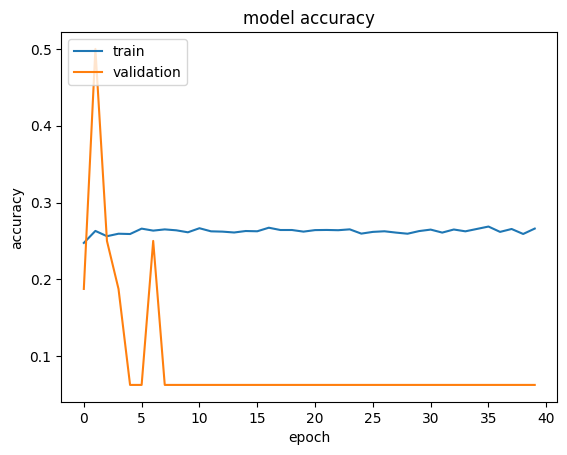

In [55]:
plt.plot(history_efficient.history["accuracy"])
plt.plot(history_efficient.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the EfficientnetNet Model**


In [56]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_efficient_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 2s - loss: 1.3648 - accuracy: 0.0000e+00

4/4 [==============================] - 1s 8ms/step - loss: 1.3885 - accuracy: 0.2500


Loss: 1.388538122177124, Accuracy: 0.25


### **Plotting the confusion matrix**


1/4 [======>.......................] - ETA: 2s

4/4 [==============================] - 1s 7ms/step


              precision    recall  f1-score   support

       happy       0.00      0.00      0.00        32
     neutral       0.00      0.00      0.00        32
         sad       0.25      1.00      0.40        32
    surprise       0.00      0.00      0.00        32

    accuracy                           0.25       128
   macro avg       0.06      0.25      0.10       128
weighted avg       0.06      0.25      0.10       128



/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

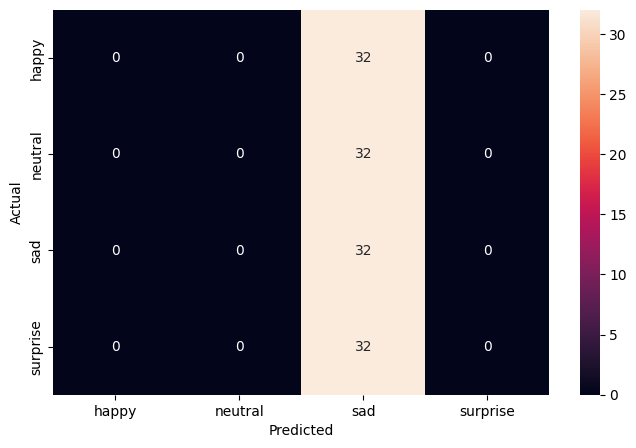

In [57]:
pred_probabilities = new_efficient_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance.**


**Think About It:**

- What is your overall performance of these Transfer Learning Architectures? Can we draw a comparison of these models' performances. Are we satisfied with the accuracies that we have received?
- Do you think our issue lies with 'rgb' color_mode?


Now that we have tried multiple pre-trained models, let's build a complex CNN architecture and see if we can get better performance.


## **Building a Complex Neural Network Architecture**


In this section, we will build a more complex Convolutional Neural Network Model that has close to as many parameters as we had in our Transfer Learning Models. However, we will have only 1 input channel for our input images.


## **Creating our Data Loaders**

In this section, we are creating data loaders which we will use as inputs to the more Complicated Convolutional Neural Network. We will go ahead with color_mode = 'grayscale'.


In [58]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"
color_layers = 1
# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    # preprocessing_function=preprocess_input,
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    horizontal_flip=True,
    brightness_range=(0.0, 2.0),
    shear_range=0.3,
    # rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    # width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    # height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    # shear_range=0.1,  # Small shear transformations for slight perspective changes
    # zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    # horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    # fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    # rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    # width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    # height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    # shear_range=0.1,  # Small shear transformations for slight perspective changes
    # zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    # horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    # fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


### **Model Building**

- Try building a layer with 5 Convolutional Blocks and see if performance increases.


In [59]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [60]:
# Initializing a sequential model
model_complex = Sequential()


# First Convolutional Block
model_complex.add(Conv2D(64, kernel_size=2, padding="same", input_shape=(48, 48, 1), activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(alpha=0.1))
model_complex.add(MaxPooling2D(pool_size=2))
model_complex.add(Dropout(0.2))

# Second Convolutional Block
model_complex.add(Conv2D(128, kernel_size=2, padding="same", activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(alpha=0.1))
model_complex.add(MaxPooling2D(pool_size=2))
model_complex.add(Dropout(0.2))

# Third Convolutional Block
model_complex.add(Conv2D(512, kernel_size=2, padding="same", activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(alpha=0.1))
model_complex.add(MaxPooling2D(pool_size=2))
model_complex.add(Dropout(0.2))

# Fourth Convolutional Block
model_complex.add(Conv2D(512, kernel_size=2, padding="same", activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(alpha=0.1))
model_complex.add(MaxPooling2D(pool_size=2))
model_complex.add(Dropout(0.2))

# Fifth Convolutional Block
model_complex.add(Conv2D(128, kernel_size=2, padding="same", activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(alpha=0.1))
model_complex.add(MaxPooling2D(pool_size=2))
model_complex.add(Dropout(0.2))

# Flatten the output of the conv layers to feed into the dense layers
model_complex.add(Flatten())

# First Fully Connected Block
model_complex.add(Dense(256, activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(Dropout(0.2))

# Second Fully Connected Block
model_complex.add(Dense(512, activation="relu"))
model_complex.add(BatchNormalization())
model_complex.add(Dropout(0.2))

# Output layer with 4 neurons for classification with softmax activation
model_complex.add(Dense(4, activation="softmax"))
# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [61]:
model_complex.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
model_complex.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 64)        320       


 batch_normalization (Batch  (None, 48, 48, 64)        256       


 Normalization)                                                  


 leaky_re_lu (LeakyReLU)     (None, 48, 48, 64)        0         


 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         


 D)                                                              


 dropout (Dropout)           (None, 24, 24, 64)        0         


 conv2d_1 (Conv2D)           (None, 24, 24, 128)       32896     


 batch_normalization_1 (Bat  (None, 24, 24, 128)       512       


 chNormalization)                                                


 leaky_re_lu_1 (LeakyReLU)   (None, 24, 24, 128)       0         


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 128)       0         


 g2D)                                                            


 dropout_1 (Dropout)         (None, 12, 12, 128)       0         


 conv2d_2 (Conv2D)           (None, 12, 12, 512)       262656    


 batch_normalization_2 (Bat  (None, 12, 12, 512)       2048      


 chNormalization)                                                


 leaky_re_lu_2 (LeakyReLU)   (None, 12, 12, 512)       0         


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 512)         0         


 g2D)                                                            


 dropout_2 (Dropout)         (None, 6, 6, 512)         0         


 conv2d_3 (Conv2D)           (None, 6, 6, 512)         1049088   


 batch_normalization_3 (Bat  (None, 6, 6, 512)         2048      


 chNormalization)                                                


 leaky_re_lu_3 (LeakyReLU)   (None, 6, 6, 512)         0         


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 512)         0         


 g2D)                                                            


 dropout_3 (Dropout)         (None, 3, 3, 512)         0         


 conv2d_4 (Conv2D)           (None, 3, 3, 128)         262272    


 batch_normalization_4 (Bat  (None, 3, 3, 128)         512       


 chNormalization)                                                


 leaky_re_lu_4 (LeakyReLU)   (None, 3, 3, 128)         0         


 max_pooling2d_4 (MaxPoolin  (None, 1, 1, 128)         0         


 g2D)                                                            


 dropout_4 (Dropout)         (None, 1, 1, 128)         0         


 flatten (Flatten)           (None, 128)               0         


 dense (Dense)               (None, 256)               33024     


 batch_normalization_5 (Bat  (None, 256)               1024      


 chNormalization)                                                


 dropout_5 (Dropout)         (None, 256)               0         


 dense_1 (Dense)             (None, 512)               131584    


 batch_normalization_6 (Bat  (None, 512)               2048      


 chNormalization)                                                


 dropout_6 (Dropout)         (None, 512)               0         


 dense_2 (Dense)             (None, 4)                 2052      


Total params: 1782340 (6.80 MB)


Trainable params: 1778116 (6.78 MB)


Non-trainable params: 4224 (16.50 KB)


_________________________________________________________________


In [62]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_complex_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_complex = model_complex.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[reduce_lr],
)

Epoch 1/40


2024-03-22 00:10:42.008695: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


  1/473 [..............................] - ETA: 24:15 - loss: 1.9407 - accuracy: 0.2188

  6/473 [..............................] - ETA: 5s - loss: 2.0905 - accuracy: 0.2396   

  9/473 [..............................] - ETA: 6s - loss: 2.1926 - accuracy: 0.2257

 12/473 [..............................] - ETA: 7s - loss: 2.1288 - accuracy: 0.2396

 17/473 [>.............................] - ETA: 6s - loss: 2.0665 - accuracy: 0.2463

 22/473 [>.............................] - ETA: 6s - loss: 2.0510 - accuracy: 0.2472

 27/473 [>.............................] - ETA: 5s - loss: 2.0225 - accuracy: 0.2546

 32/473 [=>............................] - ETA: 5s - loss: 2.0063 - accuracy: 0.2598

 37/473 [=>............................] - ETA: 5s - loss: 2.0118 - accuracy: 0.2593

 42/473 [=>............................] - ETA: 5s - loss: 1.9885 - accuracy: 0.2604

 47/473 [=>............................] - ETA: 5s - loss: 1.9622 - accuracy: 0.2660

 52/473 [==>...........................] - ETA: 5s - loss: 1.9419 - accuracy: 0.2692

 57/473 [==>...........................] - ETA: 5s - loss: 1.9287 - accuracy: 0.2675

 62/473 [==>...........................] - ETA: 5s - loss: 1.9226 - accuracy: 0.2666

 67/473 [===>..........................] - ETA: 4s - loss: 1.9142 - accuracy: 0.2715

 72/473 [===>..........................] - ETA: 4s - loss: 1.9031 - accuracy: 0.2691

 77/473 [===>..........................] - ETA: 4s - loss: 1.8925 - accuracy: 0.2707

 82/473 [====>.........................] - ETA: 4s - loss: 1.8914 - accuracy: 0.2660

 87/473 [====>.........................] - ETA: 4s - loss: 1.8837 - accuracy: 0.2662

 92/473 [====>.........................] - ETA: 4s - loss: 1.8781 - accuracy: 0.2660

 97/473 [=====>........................] - ETA: 4s - loss: 1.8795 - accuracy: 0.2658

102/473 [=====>........................] - ETA: 4s - loss: 1.8780 - accuracy: 0.2659

103/473 [=====>........................] - ETA: 5s - loss: 1.8790 - accuracy: 0.2655

109/473 [=====>........................] - ETA: 5s - loss: 1.8735 - accuracy: 0.2667

114/473 [======>.......................] - ETA: 5s - loss: 1.8692 - accuracy: 0.2673

119/473 [======>.......................] - ETA: 5s - loss: 1.8636 - accuracy: 0.2658

124/473 [======>.......................] - ETA: 5s - loss: 1.8554 - accuracy: 0.2674

129/473 [=======>......................] - ETA: 5s - loss: 1.8469 - accuracy: 0.2665

134/473 [=======>......................] - ETA: 4s - loss: 1.8456 - accuracy: 0.2636

138/473 [=======>......................] - ETA: 4s - loss: 1.8432 - accuracy: 0.2645

143/473 [========>.....................] - ETA: 4s - loss: 1.8406 - accuracy: 0.2642

148/473 [========>.....................] - ETA: 4s - loss: 1.8325 - accuracy: 0.2652

153/473 [========>.....................] - ETA: 4s - loss: 1.8253 - accuracy: 0.2672

158/473 [=========>....................] - ETA: 4s - loss: 1.8212 - accuracy: 0.2663

163/473 [=========>....................] - ETA: 4s - loss: 1.8159 - accuracy: 0.2673

168/473 [=========>....................] - ETA: 4s - loss: 1.8134 - accuracy: 0.2670

173/473 [=========>....................] - ETA: 4s - loss: 1.8113 - accuracy: 0.2668

178/473 [==========>...................] - ETA: 4s - loss: 1.8087 - accuracy: 0.2662

183/473 [==========>...................] - ETA: 3s - loss: 1.8064 - accuracy: 0.2663

188/473 [==========>...................] - ETA: 3s - loss: 1.8048 - accuracy: 0.2660

193/473 [===========>..................] - ETA: 3s - loss: 1.8030 - accuracy: 0.2669

198/473 [===========>..................] - ETA: 3s - loss: 1.7994 - accuracy: 0.2677

203/473 [===========>..................] - ETA: 3s - loss: 1.7994 - accuracy: 0.2656

208/473 [============>.................] - ETA: 3s - loss: 1.7993 - accuracy: 0.2637

213/473 [============>.................] - ETA: 3s - loss: 1.7956 - accuracy: 0.2648

218/473 [============>.................] - ETA: 3s - loss: 1.7941 - accuracy: 0.2654

223/473 [=============>................] - ETA: 3s - loss: 1.7933 - accuracy: 0.2653

228/473 [=============>................] - ETA: 3s - loss: 1.7896 - accuracy: 0.2661

233/473 [=============>................] - ETA: 3s - loss: 1.7893 - accuracy: 0.2654

238/473 [==============>...............] - ETA: 3s - loss: 1.7871 - accuracy: 0.2659

243/473 [==============>...............] - ETA: 3s - loss: 1.7849 - accuracy: 0.2664

248/473 [==============>...............] - ETA: 2s - loss: 1.7833 - accuracy: 0.2654

253/473 [===============>..............] - ETA: 2s - loss: 1.7807 - accuracy: 0.2651

258/473 [===============>..............] - ETA: 2s - loss: 1.7779 - accuracy: 0.2658

263/473 [===============>..............] - ETA: 2s - loss: 1.7767 - accuracy: 0.2653

268/473 [===============>..............] - ETA: 2s - loss: 1.7757 - accuracy: 0.2648

273/473 [================>.............] - ETA: 2s - loss: 1.7752 - accuracy: 0.2635

278/473 [================>.............] - ETA: 2s - loss: 1.7718 - accuracy: 0.2643

283/473 [================>.............] - ETA: 2s - loss: 1.7694 - accuracy: 0.2649

288/473 [=================>............] - ETA: 2s - loss: 1.7665 - accuracy: 0.2650

293/473 [=================>............] - ETA: 2s - loss: 1.7653 - accuracy: 0.2647

298/473 [=================>............] - ETA: 2s - loss: 1.7628 - accuracy: 0.2653

303/473 [==================>...........] - ETA: 2s - loss: 1.7628 - accuracy: 0.2640

308/473 [==================>...........] - ETA: 2s - loss: 1.7606 - accuracy: 0.2644

313/473 [==================>...........] - ETA: 2s - loss: 1.7592 - accuracy: 0.2639

318/473 [===================>..........] - ETA: 1s - loss: 1.7562 - accuracy: 0.2644

323/473 [===================>..........] - ETA: 1s - loss: 1.7559 - accuracy: 0.2635

328/473 [===================>..........] - ETA: 1s - loss: 1.7559 - accuracy: 0.2628

333/473 [====================>.........] - ETA: 1s - loss: 1.7533 - accuracy: 0.2626

338/473 [====================>.........] - ETA: 1s - loss: 1.7519 - accuracy: 0.2631

343/473 [====================>.........] - ETA: 1s - loss: 1.7501 - accuracy: 0.2632

348/473 [=====================>........] - ETA: 1s - loss: 1.7483 - accuracy: 0.2628

353/473 [=====================>........] - ETA: 1s - loss: 1.7461 - accuracy: 0.2630

358/473 [=====================>........] - ETA: 1s - loss: 1.7461 - accuracy: 0.2629

363/473 [======================>.......] - ETA: 1s - loss: 1.7427 - accuracy: 0.2637

368/473 [======================>.......] - ETA: 1s - loss: 1.7413 - accuracy: 0.2633

373/473 [======================>.......] - ETA: 1s - loss: 1.7410 - accuracy: 0.2629

378/473 [======================>.......] - ETA: 1s - loss: 1.7395 - accuracy: 0.2629

383/473 [=======================>......] - ETA: 1s - loss: 1.7372 - accuracy: 0.2634

388/473 [=======================>......] - ETA: 1s - loss: 1.7355 - accuracy: 0.2635

393/473 [=======================>......] - ETA: 0s - loss: 1.7327 - accuracy: 0.2644

398/473 [========================>.....] - ETA: 0s - loss: 1.7313 - accuracy: 0.2644

403/473 [========================>.....] - ETA: 0s - loss: 1.7300 - accuracy: 0.2643

408/473 [========================>.....] - ETA: 0s - loss: 1.7275 - accuracy: 0.2648

413/473 [=========================>....] - ETA: 0s - loss: 1.7249 - accuracy: 0.2650

418/473 [=========================>....] - ETA: 0s - loss: 1.7234 - accuracy: 0.2652

423/473 [=========================>....] - ETA: 0s - loss: 1.7217 - accuracy: 0.2649

428/473 [==========================>...] - ETA: 0s - loss: 1.7199 - accuracy: 0.2650

433/473 [==========================>...] - ETA: 0s - loss: 1.7179 - accuracy: 0.2643

438/473 [==========================>...] - ETA: 0s - loss: 1.7160 - accuracy: 0.2644

443/473 [===========================>..] - ETA: 0s - loss: 1.7143 - accuracy: 0.2641

448/473 [===========================>..] - ETA: 0s - loss: 1.7128 - accuracy: 0.2642

453/473 [===========================>..] - ETA: 0s - loss: 1.7114 - accuracy: 0.2644

458/473 [============================>.] - ETA: 0s - loss: 1.7100 - accuracy: 0.2642

463/473 [============================>.] - ETA: 0s - loss: 1.7084 - accuracy: 0.2645

468/473 [============================>.] - ETA: 0s - loss: 1.7062 - accuracy: 0.2648

473/473 [==============================] - ETA: 0s - loss: 1.7049 - accuracy: 0.2653

473/473 [==============================] - 9s 13ms/step - loss: 1.7049 - accuracy: 0.2653 - val_loss: 0.7892 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 14s - loss: 1.4182 - accuracy: 0.4062

  6/473 [..............................] - ETA: 5s - loss: 1.5927 - accuracy: 0.2552 

 11/473 [..............................] - ETA: 5s - loss: 1.5885 - accuracy: 0.2443

 16/473 [>.............................] - ETA: 5s - loss: 1.5688 - accuracy: 0.2500

 21/473 [>.............................] - ETA: 5s - loss: 1.5811 - accuracy: 0.2485

 26/473 [>.............................] - ETA: 5s - loss: 1.5772 - accuracy: 0.2572

 31/473 [>.............................] - ETA: 5s - loss: 1.5654 - accuracy: 0.2671

 36/473 [=>............................] - ETA: 5s - loss: 1.5489 - accuracy: 0.2769

 41/473 [=>............................] - ETA: 4s - loss: 1.5449 - accuracy: 0.2774

 46/473 [=>............................] - ETA: 4s - loss: 1.5443 - accuracy: 0.2772

 51/473 [==>...........................] - ETA: 4s - loss: 1.5451 - accuracy: 0.2763

 56/473 [==>...........................] - ETA: 4s - loss: 1.5432 - accuracy: 0.2796

 61/473 [==>...........................] - ETA: 4s - loss: 1.5465 - accuracy: 0.2787

 66/473 [===>..........................] - ETA: 4s - loss: 1.5443 - accuracy: 0.2803

 71/473 [===>..........................] - ETA: 4s - loss: 1.5428 - accuracy: 0.2790

 76/473 [===>..........................] - ETA: 4s - loss: 1.5470 - accuracy: 0.2734

 81/473 [====>.........................] - ETA: 4s - loss: 1.5461 - accuracy: 0.2758

 86/473 [====>.........................] - ETA: 4s - loss: 1.5476 - accuracy: 0.2743

 91/473 [====>.........................] - ETA: 4s - loss: 1.5471 - accuracy: 0.2764

 96/473 [=====>........................] - ETA: 4s - loss: 1.5461 - accuracy: 0.2777

101/473 [=====>........................] - ETA: 4s - loss: 1.5445 - accuracy: 0.2775

106/473 [=====>........................] - ETA: 4s - loss: 1.5452 - accuracy: 0.2771

110/473 [=====>........................] - ETA: 4s - loss: 1.5422 - accuracy: 0.2776

115/473 [======>.......................] - ETA: 4s - loss: 1.5397 - accuracy: 0.2791

120/473 [======>.......................] - ETA: 4s - loss: 1.5455 - accuracy: 0.2766

125/473 [======>.......................] - ETA: 3s - loss: 1.5461 - accuracy: 0.2758

130/473 [=======>......................] - ETA: 3s - loss: 1.5461 - accuracy: 0.2752

135/473 [=======>......................] - ETA: 3s - loss: 1.5480 - accuracy: 0.2752

140/473 [=======>......................] - ETA: 3s - loss: 1.5489 - accuracy: 0.2746

145/473 [========>.....................] - ETA: 3s - loss: 1.5473 - accuracy: 0.2746

150/473 [========>.....................] - ETA: 3s - loss: 1.5476 - accuracy: 0.2742

155/473 [========>.....................] - ETA: 3s - loss: 1.5493 - accuracy: 0.2738

160/473 [=========>....................] - ETA: 3s - loss: 1.5497 - accuracy: 0.2752

165/473 [=========>....................] - ETA: 3s - loss: 1.5489 - accuracy: 0.2744

170/473 [=========>....................] - ETA: 3s - loss: 1.5477 - accuracy: 0.2756

175/473 [==========>...................] - ETA: 3s - loss: 1.5482 - accuracy: 0.2752

180/473 [==========>...................] - ETA: 3s - loss: 1.5482 - accuracy: 0.2747

185/473 [==========>...................] - ETA: 3s - loss: 1.5466 - accuracy: 0.2750

190/473 [===========>..................] - ETA: 3s - loss: 1.5465 - accuracy: 0.2758

195/473 [===========>..................] - ETA: 3s - loss: 1.5455 - accuracy: 0.2748

200/473 [===========>..................] - ETA: 3s - loss: 1.5451 - accuracy: 0.2755

205/473 [============>.................] - ETA: 2s - loss: 1.5417 - accuracy: 0.2774

210/473 [============>.................] - ETA: 2s - loss: 1.5407 - accuracy: 0.2780

215/473 [============>.................] - ETA: 2s - loss: 1.5380 - accuracy: 0.2794

220/473 [============>.................] - ETA: 2s - loss: 1.5365 - accuracy: 0.2801

225/473 [=============>................] - ETA: 2s - loss: 1.5356 - accuracy: 0.2799

230/473 [=============>................] - ETA: 2s - loss: 1.5346 - accuracy: 0.2811

235/473 [=============>................] - ETA: 2s - loss: 1.5355 - accuracy: 0.2802

240/473 [==============>...............] - ETA: 2s - loss: 1.5361 - accuracy: 0.2793

245/473 [==============>...............] - ETA: 2s - loss: 1.5351 - accuracy: 0.2792

250/473 [==============>...............] - ETA: 2s - loss: 1.5330 - accuracy: 0.2800

255/473 [===============>..............] - ETA: 2s - loss: 1.5329 - accuracy: 0.2797

260/473 [===============>..............] - ETA: 2s - loss: 1.5325 - accuracy: 0.2782

265/473 [===============>..............] - ETA: 2s - loss: 1.5313 - accuracy: 0.2783

271/473 [================>.............] - ETA: 2s - loss: 1.5318 - accuracy: 0.2772

276/473 [================>.............] - ETA: 2s - loss: 1.5317 - accuracy: 0.2772

281/473 [================>.............] - ETA: 2s - loss: 1.5307 - accuracy: 0.2767

285/473 [=================>............] - ETA: 2s - loss: 1.5308 - accuracy: 0.2765

290/473 [=================>............] - ETA: 2s - loss: 1.5314 - accuracy: 0.2762

295/473 [=================>............] - ETA: 1s - loss: 1.5302 - accuracy: 0.2770

300/473 [==================>...........] - ETA: 1s - loss: 1.5300 - accuracy: 0.2766

305/473 [==================>...........] - ETA: 1s - loss: 1.5298 - accuracy: 0.2766

310/473 [==================>...........] - ETA: 1s - loss: 1.5300 - accuracy: 0.2770

315/473 [==================>...........] - ETA: 1s - loss: 1.5296 - accuracy: 0.2771

319/473 [===================>..........] - ETA: 1s - loss: 1.5294 - accuracy: 0.2769

324/473 [===================>..........] - ETA: 1s - loss: 1.5281 - accuracy: 0.2764

329/473 [===================>..........] - ETA: 1s - loss: 1.5274 - accuracy: 0.2759

334/473 [====================>.........] - ETA: 1s - loss: 1.5277 - accuracy: 0.2753

339/473 [====================>.........] - ETA: 1s - loss: 1.5274 - accuracy: 0.2758

344/473 [====================>.........] - ETA: 1s - loss: 1.5269 - accuracy: 0.2757

349/473 [=====================>........] - ETA: 1s - loss: 1.5277 - accuracy: 0.2748

354/473 [=====================>........] - ETA: 1s - loss: 1.5263 - accuracy: 0.2753

359/473 [=====================>........] - ETA: 1s - loss: 1.5255 - accuracy: 0.2755

364/473 [======================>.......] - ETA: 1s - loss: 1.5263 - accuracy: 0.2752

369/473 [======================>.......] - ETA: 1s - loss: 1.5260 - accuracy: 0.2756

374/473 [======================>.......] - ETA: 1s - loss: 1.5252 - accuracy: 0.2771

379/473 [=======================>......] - ETA: 1s - loss: 1.5245 - accuracy: 0.2778

384/473 [=======================>......] - ETA: 0s - loss: 1.5235 - accuracy: 0.2784

389/473 [=======================>......] - ETA: 0s - loss: 1.5242 - accuracy: 0.2782

394/473 [=======================>......] - ETA: 0s - loss: 1.5236 - accuracy: 0.2786

399/473 [========================>.....] - ETA: 0s - loss: 1.5245 - accuracy: 0.2774

404/473 [========================>.....] - ETA: 0s - loss: 1.5239 - accuracy: 0.2775

409/473 [========================>.....] - ETA: 0s - loss: 1.5245 - accuracy: 0.2767

414/473 [=========================>....] - ETA: 0s - loss: 1.5234 - accuracy: 0.2774

419/473 [=========================>....] - ETA: 0s - loss: 1.5228 - accuracy: 0.2774

424/473 [=========================>....] - ETA: 0s - loss: 1.5219 - accuracy: 0.2780

429/473 [==========================>...] - ETA: 0s - loss: 1.5218 - accuracy: 0.2785

434/473 [==========================>...] - ETA: 0s - loss: 1.5219 - accuracy: 0.2780

439/473 [==========================>...] - ETA: 0s - loss: 1.5220 - accuracy: 0.2781

444/473 [===========================>..] - ETA: 0s - loss: 1.5217 - accuracy: 0.2780

449/473 [===========================>..] - ETA: 0s - loss: 1.5209 - accuracy: 0.2780

454/473 [===========================>..] - ETA: 0s - loss: 1.5209 - accuracy: 0.2780

459/473 [============================>.] - ETA: 0s - loss: 1.5210 - accuracy: 0.2769

464/473 [============================>.] - ETA: 0s - loss: 1.5211 - accuracy: 0.2762

469/473 [============================>.] - ETA: 0s - loss: 1.5201 - accuracy: 0.2764

473/473 [==============================] - 5s 11ms/step - loss: 1.5193 - accuracy: 0.2766 - val_loss: 1.2718 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 11s - loss: 1.4633 - accuracy: 0.2188

  6/473 [..............................] - ETA: 5s - loss: 1.4003 - accuracy: 0.3073 

 11/473 [..............................] - ETA: 5s - loss: 1.4381 - accuracy: 0.2841

 16/473 [>.............................] - ETA: 4s - loss: 1.4512 - accuracy: 0.2832

 21/473 [>.............................] - ETA: 4s - loss: 1.4613 - accuracy: 0.2693

 26/473 [>.............................] - ETA: 4s - loss: 1.4645 - accuracy: 0.2776

 31/473 [>.............................] - ETA: 4s - loss: 1.4560 - accuracy: 0.2792

 36/473 [=>............................] - ETA: 4s - loss: 1.4575 - accuracy: 0.2734

 41/473 [=>............................] - ETA: 4s - loss: 1.4548 - accuracy: 0.2820

 46/473 [=>............................] - ETA: 4s - loss: 1.4620 - accuracy: 0.2806

 51/473 [==>...........................] - ETA: 4s - loss: 1.4692 - accuracy: 0.2763

 56/473 [==>...........................] - ETA: 4s - loss: 1.4642 - accuracy: 0.2824

 61/473 [==>...........................] - ETA: 4s - loss: 1.4594 - accuracy: 0.2833

 66/473 [===>..........................] - ETA: 4s - loss: 1.4579 - accuracy: 0.2817

 71/473 [===>..........................] - ETA: 4s - loss: 1.4582 - accuracy: 0.2817

 76/473 [===>..........................] - ETA: 4s - loss: 1.4596 - accuracy: 0.2804

 81/473 [====>.........................] - ETA: 4s - loss: 1.4557 - accuracy: 0.2832

 86/473 [====>.........................] - ETA: 4s - loss: 1.4548 - accuracy: 0.2834

 91/473 [====>.........................] - ETA: 4s - loss: 1.4576 - accuracy: 0.2840

 96/473 [=====>........................] - ETA: 4s - loss: 1.4551 - accuracy: 0.2861

101/473 [=====>........................] - ETA: 4s - loss: 1.4551 - accuracy: 0.2850

106/473 [=====>........................] - ETA: 4s - loss: 1.4572 - accuracy: 0.2812

111/473 [======>.......................] - ETA: 3s - loss: 1.4565 - accuracy: 0.2818

116/473 [======>.......................] - ETA: 3s - loss: 1.4567 - accuracy: 0.2818

121/473 [======>.......................] - ETA: 3s - loss: 1.4605 - accuracy: 0.2800

126/473 [======>.......................] - ETA: 3s - loss: 1.4596 - accuracy: 0.2825

131/473 [=======>......................] - ETA: 3s - loss: 1.4560 - accuracy: 0.2848

136/473 [=======>......................] - ETA: 3s - loss: 1.4547 - accuracy: 0.2861

141/473 [=======>......................] - ETA: 3s - loss: 1.4537 - accuracy: 0.2861

146/473 [========>.....................] - ETA: 3s - loss: 1.4520 - accuracy: 0.2864

151/473 [========>.....................] - ETA: 3s - loss: 1.4532 - accuracy: 0.2854

156/473 [========>.....................] - ETA: 3s - loss: 1.4524 - accuracy: 0.2871

161/473 [=========>....................] - ETA: 3s - loss: 1.4524 - accuracy: 0.2873

166/473 [=========>....................] - ETA: 3s - loss: 1.4547 - accuracy: 0.2845

171/473 [=========>....................] - ETA: 3s - loss: 1.4557 - accuracy: 0.2834

176/473 [==========>...................] - ETA: 3s - loss: 1.4549 - accuracy: 0.2836

181/473 [==========>...................] - ETA: 3s - loss: 1.4548 - accuracy: 0.2847

186/473 [==========>...................] - ETA: 3s - loss: 1.4561 - accuracy: 0.2838

191/473 [===========>..................] - ETA: 3s - loss: 1.4547 - accuracy: 0.2847

196/473 [===========>..................] - ETA: 3s - loss: 1.4557 - accuracy: 0.2830

201/473 [===========>..................] - ETA: 2s - loss: 1.4560 - accuracy: 0.2845

206/473 [============>.................] - ETA: 2s - loss: 1.4559 - accuracy: 0.2832

211/473 [============>.................] - ETA: 2s - loss: 1.4554 - accuracy: 0.2826

216/473 [============>.................] - ETA: 2s - loss: 1.4554 - accuracy: 0.2830

221/473 [=============>................] - ETA: 2s - loss: 1.4555 - accuracy: 0.2829

226/473 [=============>................] - ETA: 2s - loss: 1.4555 - accuracy: 0.2835

231/473 [=============>................] - ETA: 2s - loss: 1.4549 - accuracy: 0.2831

236/473 [=============>................] - ETA: 2s - loss: 1.4543 - accuracy: 0.2830

241/473 [==============>...............] - ETA: 2s - loss: 1.4536 - accuracy: 0.2836

246/473 [==============>...............] - ETA: 2s - loss: 1.4540 - accuracy: 0.2834

251/473 [==============>...............] - ETA: 2s - loss: 1.4544 - accuracy: 0.2829

256/473 [===============>..............] - ETA: 2s - loss: 1.4550 - accuracy: 0.2811

261/473 [===============>..............] - ETA: 2s - loss: 1.4542 - accuracy: 0.2821

266/473 [===============>..............] - ETA: 2s - loss: 1.4531 - accuracy: 0.2832

271/473 [================>.............] - ETA: 2s - loss: 1.4536 - accuracy: 0.2834

276/473 [================>.............] - ETA: 2s - loss: 1.4541 - accuracy: 0.2831

281/473 [================>.............] - ETA: 2s - loss: 1.4534 - accuracy: 0.2841

286/473 [=================>............] - ETA: 2s - loss: 1.4535 - accuracy: 0.2842

291/473 [=================>............] - ETA: 1s - loss: 1.4537 - accuracy: 0.2840

295/473 [=================>............] - ETA: 1s - loss: 1.4537 - accuracy: 0.2843

299/473 [=================>............] - ETA: 1s - loss: 1.4538 - accuracy: 0.2838

304/473 [==================>...........] - ETA: 1s - loss: 1.4532 - accuracy: 0.2851

309/473 [==================>...........] - ETA: 1s - loss: 1.4534 - accuracy: 0.2847

314/473 [==================>...........] - ETA: 1s - loss: 1.4533 - accuracy: 0.2842

319/473 [===================>..........] - ETA: 1s - loss: 1.4535 - accuracy: 0.2847

324/473 [===================>..........] - ETA: 1s - loss: 1.4530 - accuracy: 0.2854

329/473 [===================>..........] - ETA: 1s - loss: 1.4531 - accuracy: 0.2853

334/473 [====================>.........] - ETA: 1s - loss: 1.4529 - accuracy: 0.2845

339/473 [====================>.........] - ETA: 1s - loss: 1.4526 - accuracy: 0.2836

344/473 [====================>.........] - ETA: 1s - loss: 1.4517 - accuracy: 0.2841

349/473 [=====================>........] - ETA: 1s - loss: 1.4515 - accuracy: 0.2842

354/473 [=====================>........] - ETA: 1s - loss: 1.4505 - accuracy: 0.2851

359/473 [=====================>........] - ETA: 1s - loss: 1.4505 - accuracy: 0.2848

364/473 [======================>.......] - ETA: 1s - loss: 1.4509 - accuracy: 0.2849

369/473 [======================>.......] - ETA: 1s - loss: 1.4516 - accuracy: 0.2846

374/473 [======================>.......] - ETA: 1s - loss: 1.4511 - accuracy: 0.2852

379/473 [=======================>......] - ETA: 1s - loss: 1.4507 - accuracy: 0.2853

384/473 [=======================>......] - ETA: 0s - loss: 1.4499 - accuracy: 0.2854

389/473 [=======================>......] - ETA: 0s - loss: 1.4495 - accuracy: 0.2857

394/473 [=======================>......] - ETA: 0s - loss: 1.4483 - accuracy: 0.2862

399/473 [========================>.....] - ETA: 0s - loss: 1.4470 - accuracy: 0.2869

404/473 [========================>.....] - ETA: 0s - loss: 1.4464 - accuracy: 0.2870

409/473 [========================>.....] - ETA: 0s - loss: 1.4460 - accuracy: 0.2872

414/473 [=========================>....] - ETA: 0s - loss: 1.4467 - accuracy: 0.2868

419/473 [=========================>....] - ETA: 0s - loss: 1.4463 - accuracy: 0.2865

424/473 [=========================>....] - ETA: 0s - loss: 1.4468 - accuracy: 0.2859

428/473 [==========================>...] - ETA: 0s - loss: 1.4462 - accuracy: 0.2863

433/473 [==========================>...] - ETA: 0s - loss: 1.4454 - accuracy: 0.2867

438/473 [==========================>...] - ETA: 0s - loss: 1.4457 - accuracy: 0.2867

443/473 [===========================>..] - ETA: 0s - loss: 1.4444 - accuracy: 0.2882

448/473 [===========================>..] - ETA: 0s - loss: 1.4436 - accuracy: 0.2888

453/473 [===========================>..] - ETA: 0s - loss: 1.4436 - accuracy: 0.2889

458/473 [============================>.] - ETA: 0s - loss: 1.4434 - accuracy: 0.2890

463/473 [============================>.] - ETA: 0s - loss: 1.4434 - accuracy: 0.2891

469/473 [============================>.] - ETA: 0s - loss: 1.4431 - accuracy: 0.2890

473/473 [==============================] - 5s 11ms/step - loss: 1.4423 - accuracy: 0.2893 - val_loss: 1.0565 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 11s - loss: 1.3146 - accuracy: 0.3750

  6/473 [..............................] - ETA: 5s - loss: 1.4252 - accuracy: 0.2917 

 10/473 [..............................] - ETA: 5s - loss: 1.4226 - accuracy: 0.2937

 15/473 [..............................] - ETA: 5s - loss: 1.4172 - accuracy: 0.2896

 20/473 [>.............................] - ETA: 5s - loss: 1.4102 - accuracy: 0.2875

 25/473 [>.............................] - ETA: 5s - loss: 1.4209 - accuracy: 0.2800

 30/473 [>.............................] - ETA: 5s - loss: 1.4163 - accuracy: 0.2812

 35/473 [=>............................] - ETA: 5s - loss: 1.4136 - accuracy: 0.2884

 40/473 [=>............................] - ETA: 4s - loss: 1.4162 - accuracy: 0.2852

 45/473 [=>............................] - ETA: 4s - loss: 1.4062 - accuracy: 0.2889

 50/473 [==>...........................] - ETA: 4s - loss: 1.3993 - accuracy: 0.2944

 54/473 [==>...........................] - ETA: 4s - loss: 1.3991 - accuracy: 0.2940

 59/473 [==>...........................] - ETA: 4s - loss: 1.4003 - accuracy: 0.2924

 64/473 [===>..........................] - ETA: 4s - loss: 1.3998 - accuracy: 0.2910

 69/473 [===>..........................] - ETA: 4s - loss: 1.3960 - accuracy: 0.2935

 74/473 [===>..........................] - ETA: 4s - loss: 1.3934 - accuracy: 0.2981

 79/473 [====>.........................] - ETA: 4s - loss: 1.3928 - accuracy: 0.2991

 84/473 [====>.........................] - ETA: 4s - loss: 1.3908 - accuracy: 0.3010

 89/473 [====>.........................] - ETA: 4s - loss: 1.3930 - accuracy: 0.3002

 95/473 [=====>........................] - ETA: 4s - loss: 1.3864 - accuracy: 0.3083

100/473 [=====>........................] - ETA: 4s - loss: 1.3881 - accuracy: 0.3057

105/473 [=====>........................] - ETA: 4s - loss: 1.3903 - accuracy: 0.3045

110/473 [=====>........................] - ETA: 4s - loss: 1.3866 - accuracy: 0.3075

115/473 [======>.......................] - ETA: 4s - loss: 1.3845 - accuracy: 0.3082

120/473 [======>.......................] - ETA: 3s - loss: 1.3838 - accuracy: 0.3097

125/473 [======>.......................] - ETA: 3s - loss: 1.3841 - accuracy: 0.3103

130/473 [=======>......................] - ETA: 3s - loss: 1.3859 - accuracy: 0.3107

135/473 [=======>......................] - ETA: 3s - loss: 1.3854 - accuracy: 0.3114

140/473 [=======>......................] - ETA: 3s - loss: 1.3893 - accuracy: 0.3119

145/473 [========>.....................] - ETA: 3s - loss: 1.3898 - accuracy: 0.3115

150/473 [========>.....................] - ETA: 3s - loss: 1.3887 - accuracy: 0.3138

155/473 [========>.....................] - ETA: 3s - loss: 1.3892 - accuracy: 0.3138

160/473 [=========>....................] - ETA: 3s - loss: 1.3890 - accuracy: 0.3144

165/473 [=========>....................] - ETA: 3s - loss: 1.3870 - accuracy: 0.3156

170/473 [=========>....................] - ETA: 3s - loss: 1.3865 - accuracy: 0.3161

175/473 [==========>...................] - ETA: 3s - loss: 1.3866 - accuracy: 0.3165

180/473 [==========>...................] - ETA: 3s - loss: 1.3866 - accuracy: 0.3164

185/473 [==========>...................] - ETA: 3s - loss: 1.3868 - accuracy: 0.3168

190/473 [===========>..................] - ETA: 3s - loss: 1.3840 - accuracy: 0.3187

195/473 [===========>..................] - ETA: 3s - loss: 1.3823 - accuracy: 0.3195

199/473 [===========>..................] - ETA: 3s - loss: 1.3819 - accuracy: 0.3198

202/473 [===========>..................] - ETA: 3s - loss: 1.3807 - accuracy: 0.3206

207/473 [============>.................] - ETA: 3s - loss: 1.3802 - accuracy: 0.3212

212/473 [============>.................] - ETA: 2s - loss: 1.3798 - accuracy: 0.3216

217/473 [============>.................] - ETA: 2s - loss: 1.3805 - accuracy: 0.3222

222/473 [=============>................] - ETA: 2s - loss: 1.3791 - accuracy: 0.3244

227/473 [=============>................] - ETA: 2s - loss: 1.3779 - accuracy: 0.3250

232/473 [=============>................] - ETA: 2s - loss: 1.3763 - accuracy: 0.3258

237/473 [==============>...............] - ETA: 2s - loss: 1.3754 - accuracy: 0.3258

242/473 [==============>...............] - ETA: 2s - loss: 1.3744 - accuracy: 0.3271

247/473 [==============>...............] - ETA: 2s - loss: 1.3741 - accuracy: 0.3256

252/473 [==============>...............] - ETA: 2s - loss: 1.3743 - accuracy: 0.3252

257/473 [===============>..............] - ETA: 2s - loss: 1.3737 - accuracy: 0.3260

262/473 [===============>..............] - ETA: 2s - loss: 1.3732 - accuracy: 0.3263

267/473 [===============>..............] - ETA: 2s - loss: 1.3736 - accuracy: 0.3256

272/473 [================>.............] - ETA: 2s - loss: 1.3732 - accuracy: 0.3260

277/473 [================>.............] - ETA: 2s - loss: 1.3716 - accuracy: 0.3281

282/473 [================>.............] - ETA: 2s - loss: 1.3712 - accuracy: 0.3283

287/473 [=================>............] - ETA: 2s - loss: 1.3707 - accuracy: 0.3290

292/473 [=================>............] - ETA: 2s - loss: 1.3711 - accuracy: 0.3301

297/473 [=================>............] - ETA: 1s - loss: 1.3698 - accuracy: 0.3310

302/473 [==================>...........] - ETA: 1s - loss: 1.3707 - accuracy: 0.3312

307/473 [==================>...........] - ETA: 1s - loss: 1.3692 - accuracy: 0.3329

312/473 [==================>...........] - ETA: 1s - loss: 1.3669 - accuracy: 0.3351

317/473 [===================>..........] - ETA: 1s - loss: 1.3662 - accuracy: 0.3352

322/473 [===================>..........] - ETA: 1s - loss: 1.3644 - accuracy: 0.3359

327/473 [===================>..........] - ETA: 1s - loss: 1.3638 - accuracy: 0.3367

332/473 [====================>.........] - ETA: 1s - loss: 1.3633 - accuracy: 0.3375

337/473 [====================>.........] - ETA: 1s - loss: 1.3628 - accuracy: 0.3379

342/473 [====================>.........] - ETA: 1s - loss: 1.3625 - accuracy: 0.3389

347/473 [=====================>........] - ETA: 1s - loss: 1.3638 - accuracy: 0.3385

352/473 [=====================>........] - ETA: 1s - loss: 1.3624 - accuracy: 0.3391

357/473 [=====================>........] - ETA: 1s - loss: 1.3622 - accuracy: 0.3389

362/473 [=====================>........] - ETA: 1s - loss: 1.3617 - accuracy: 0.3389

367/473 [======================>.......] - ETA: 1s - loss: 1.3613 - accuracy: 0.3387

372/473 [======================>.......] - ETA: 1s - loss: 1.3609 - accuracy: 0.3384

377/473 [======================>.......] - ETA: 1s - loss: 1.3603 - accuracy: 0.3386

382/473 [=======================>......] - ETA: 1s - loss: 1.3596 - accuracy: 0.3389

387/473 [=======================>......] - ETA: 0s - loss: 1.3591 - accuracy: 0.3386

392/473 [=======================>......] - ETA: 0s - loss: 1.3579 - accuracy: 0.3399

397/473 [========================>.....] - ETA: 0s - loss: 1.3581 - accuracy: 0.3400

402/473 [========================>.....] - ETA: 0s - loss: 1.3585 - accuracy: 0.3394

407/473 [========================>.....] - ETA: 0s - loss: 1.3584 - accuracy: 0.3390

412/473 [=========================>....] - ETA: 0s - loss: 1.3573 - accuracy: 0.3396

417/473 [=========================>....] - ETA: 0s - loss: 1.3562 - accuracy: 0.3406

422/473 [=========================>....] - ETA: 0s - loss: 1.3550 - accuracy: 0.3413

427/473 [==========================>...] - ETA: 0s - loss: 1.3538 - accuracy: 0.3422

432/473 [==========================>...] - ETA: 0s - loss: 1.3531 - accuracy: 0.3430

437/473 [==========================>...] - ETA: 0s - loss: 1.3528 - accuracy: 0.3435

442/473 [===========================>..] - ETA: 0s - loss: 1.3532 - accuracy: 0.3434

447/473 [===========================>..] - ETA: 0s - loss: 1.3526 - accuracy: 0.3440

452/473 [===========================>..] - ETA: 0s - loss: 1.3529 - accuracy: 0.3441

457/473 [===========================>..] - ETA: 0s - loss: 1.3525 - accuracy: 0.3442

462/473 [============================>.] - ETA: 0s - loss: 1.3521 - accuracy: 0.3444

467/473 [============================>.] - ETA: 0s - loss: 1.3520 - accuracy: 0.3446

472/473 [============================>.] - ETA: 0s - loss: 1.3515 - accuracy: 0.3452

473/473 [==============================] - 5s 11ms/step - loss: 1.3515 - accuracy: 0.3451 - val_loss: 1.1214 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 11s - loss: 1.2590 - accuracy: 0.4375

  6/473 [..............................] - ETA: 5s - loss: 1.3375 - accuracy: 0.3385 

 11/473 [..............................] - ETA: 4s - loss: 1.3631 - accuracy: 0.3210

 16/473 [>.............................] - ETA: 4s - loss: 1.3402 - accuracy: 0.3340

 21/473 [>.............................] - ETA: 4s - loss: 1.3278 - accuracy: 0.3348

 26/473 [>.............................] - ETA: 4s - loss: 1.3225 - accuracy: 0.3377

 31/473 [>.............................] - ETA: 4s - loss: 1.3074 - accuracy: 0.3438

 36/473 [=>............................] - ETA: 4s - loss: 1.3026 - accuracy: 0.3481

 41/473 [=>............................] - ETA: 4s - loss: 1.2982 - accuracy: 0.3514

 46/473 [=>............................] - ETA: 4s - loss: 1.2993 - accuracy: 0.3519

 51/473 [==>...........................] - ETA: 4s - loss: 1.3010 - accuracy: 0.3578

 56/473 [==>...........................] - ETA: 4s - loss: 1.3008 - accuracy: 0.3622

 61/473 [==>...........................] - ETA: 4s - loss: 1.2984 - accuracy: 0.3648

 66/473 [===>..........................] - ETA: 4s - loss: 1.2969 - accuracy: 0.3684

 71/473 [===>..........................] - ETA: 4s - loss: 1.2981 - accuracy: 0.3688

 76/473 [===>..........................] - ETA: 4s - loss: 1.2952 - accuracy: 0.3717

 81/473 [====>.........................] - ETA: 4s - loss: 1.2941 - accuracy: 0.3719

 86/473 [====>.........................] - ETA: 4s - loss: 1.2936 - accuracy: 0.3681

 91/473 [====>.........................] - ETA: 4s - loss: 1.2959 - accuracy: 0.3678

 96/473 [=====>........................] - ETA: 4s - loss: 1.2984 - accuracy: 0.3675

101/473 [=====>........................] - ETA: 4s - loss: 1.2996 - accuracy: 0.3657

106/473 [=====>........................] - ETA: 4s - loss: 1.2982 - accuracy: 0.3691

111/473 [======>.......................] - ETA: 4s - loss: 1.3002 - accuracy: 0.3660

116/473 [======>.......................] - ETA: 3s - loss: 1.2986 - accuracy: 0.3669

121/473 [======>.......................] - ETA: 3s - loss: 1.2986 - accuracy: 0.3673

126/473 [======>.......................] - ETA: 3s - loss: 1.2978 - accuracy: 0.3673

131/473 [=======>......................] - ETA: 3s - loss: 1.2945 - accuracy: 0.3702

136/473 [=======>......................] - ETA: 3s - loss: 1.2937 - accuracy: 0.3718

141/473 [=======>......................] - ETA: 3s - loss: 1.2939 - accuracy: 0.3710

146/473 [========>.....................] - ETA: 3s - loss: 1.2921 - accuracy: 0.3735

151/473 [========>.....................] - ETA: 3s - loss: 1.2909 - accuracy: 0.3738

156/473 [========>.....................] - ETA: 3s - loss: 1.2891 - accuracy: 0.3748

161/473 [=========>....................] - ETA: 3s - loss: 1.2876 - accuracy: 0.3754

166/473 [=========>....................] - ETA: 3s - loss: 1.2871 - accuracy: 0.3763

171/473 [=========>....................] - ETA: 3s - loss: 1.2874 - accuracy: 0.3774

176/473 [==========>...................] - ETA: 3s - loss: 1.2876 - accuracy: 0.3775

181/473 [==========>...................] - ETA: 3s - loss: 1.2886 - accuracy: 0.3783

186/473 [==========>...................] - ETA: 3s - loss: 1.2888 - accuracy: 0.3780

191/473 [===========>..................] - ETA: 3s - loss: 1.2890 - accuracy: 0.3778

196/473 [===========>..................] - ETA: 3s - loss: 1.2894 - accuracy: 0.3782

201/473 [===========>..................] - ETA: 2s - loss: 1.2878 - accuracy: 0.3794

206/473 [============>.................] - ETA: 2s - loss: 1.2883 - accuracy: 0.3789

211/473 [============>.................] - ETA: 2s - loss: 1.2868 - accuracy: 0.3808

216/473 [============>.................] - ETA: 2s - loss: 1.2865 - accuracy: 0.3818

221/473 [=============>................] - ETA: 2s - loss: 1.2853 - accuracy: 0.3831

226/473 [=============>................] - ETA: 2s - loss: 1.2837 - accuracy: 0.3833

231/473 [=============>................] - ETA: 2s - loss: 1.2858 - accuracy: 0.3822

236/473 [=============>................] - ETA: 2s - loss: 1.2865 - accuracy: 0.3828

241/473 [==============>...............] - ETA: 2s - loss: 1.2860 - accuracy: 0.3829

246/473 [==============>...............] - ETA: 2s - loss: 1.2866 - accuracy: 0.3830

251/473 [==============>...............] - ETA: 2s - loss: 1.2844 - accuracy: 0.3852

256/473 [===============>..............] - ETA: 2s - loss: 1.2849 - accuracy: 0.3851

261/473 [===============>..............] - ETA: 2s - loss: 1.2870 - accuracy: 0.3846

266/473 [===============>..............] - ETA: 2s - loss: 1.2868 - accuracy: 0.3846

271/473 [================>.............] - ETA: 2s - loss: 1.2860 - accuracy: 0.3845

276/473 [================>.............] - ETA: 2s - loss: 1.2863 - accuracy: 0.3847

281/473 [================>.............] - ETA: 2s - loss: 1.2852 - accuracy: 0.3858

286/473 [=================>............] - ETA: 2s - loss: 1.2844 - accuracy: 0.3867

291/473 [=================>............] - ETA: 2s - loss: 1.2845 - accuracy: 0.3871

296/473 [=================>............] - ETA: 1s - loss: 1.2842 - accuracy: 0.3881

301/473 [==================>...........] - ETA: 1s - loss: 1.2855 - accuracy: 0.3876

306/473 [==================>...........] - ETA: 1s - loss: 1.2849 - accuracy: 0.3883

311/473 [==================>...........] - ETA: 1s - loss: 1.2841 - accuracy: 0.3887

317/473 [===================>..........] - ETA: 1s - loss: 1.2853 - accuracy: 0.3885

322/473 [===================>..........] - ETA: 1s - loss: 1.2844 - accuracy: 0.3884

327/473 [===================>..........] - ETA: 1s - loss: 1.2849 - accuracy: 0.3880

332/473 [====================>.........] - ETA: 1s - loss: 1.2843 - accuracy: 0.3881

337/473 [====================>.........] - ETA: 1s - loss: 1.2825 - accuracy: 0.3890

342/473 [====================>.........] - ETA: 1s - loss: 1.2816 - accuracy: 0.3894

347/473 [=====================>........] - ETA: 1s - loss: 1.2811 - accuracy: 0.3897

352/473 [=====================>........] - ETA: 1s - loss: 1.2811 - accuracy: 0.3901

357/473 [=====================>........] - ETA: 1s - loss: 1.2817 - accuracy: 0.3896

362/473 [=====================>........] - ETA: 1s - loss: 1.2823 - accuracy: 0.3888

367/473 [======================>.......] - ETA: 1s - loss: 1.2814 - accuracy: 0.3893

372/473 [======================>.......] - ETA: 1s - loss: 1.2806 - accuracy: 0.3898

377/473 [======================>.......] - ETA: 1s - loss: 1.2801 - accuracy: 0.3904

382/473 [=======================>......] - ETA: 0s - loss: 1.2803 - accuracy: 0.3901

387/473 [=======================>......] - ETA: 0s - loss: 1.2800 - accuracy: 0.3901

392/473 [=======================>......] - ETA: 0s - loss: 1.2805 - accuracy: 0.3897

397/473 [========================>.....] - ETA: 0s - loss: 1.2802 - accuracy: 0.3893

402/473 [========================>.....] - ETA: 0s - loss: 1.2798 - accuracy: 0.3904

406/473 [========================>.....] - ETA: 0s - loss: 1.2793 - accuracy: 0.3909

411/473 [=========================>....] - ETA: 0s - loss: 1.2785 - accuracy: 0.3913

416/473 [=========================>....] - ETA: 0s - loss: 1.2784 - accuracy: 0.3919

421/473 [=========================>....] - ETA: 0s - loss: 1.2793 - accuracy: 0.3917

426/473 [==========================>...] - ETA: 0s - loss: 1.2781 - accuracy: 0.3928

431/473 [==========================>...] - ETA: 0s - loss: 1.2777 - accuracy: 0.3928

436/473 [==========================>...] - ETA: 0s - loss: 1.2769 - accuracy: 0.3935

441/473 [==========================>...] - ETA: 0s - loss: 1.2770 - accuracy: 0.3936

446/473 [===========================>..] - ETA: 0s - loss: 1.2769 - accuracy: 0.3936

451/473 [===========================>..] - ETA: 0s - loss: 1.2753 - accuracy: 0.3940

456/473 [===========================>..] - ETA: 0s - loss: 1.2752 - accuracy: 0.3939

461/473 [============================>.] - ETA: 0s - loss: 1.2754 - accuracy: 0.3939

466/473 [============================>.] - ETA: 0s - loss: 1.2757 - accuracy: 0.3935

470/473 [============================>.] - ETA: 0s - loss: 1.2744 - accuracy: 0.3938

473/473 [==============================] - 5s 11ms/step - loss: 1.2747 - accuracy: 0.3934 - val_loss: 1.0645 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 11s - loss: 1.1532 - accuracy: 0.4688

  6/473 [..............................] - ETA: 5s - loss: 1.1706 - accuracy: 0.4479 

 11/473 [..............................] - ETA: 5s - loss: 1.1867 - accuracy: 0.4631

 16/473 [>.............................] - ETA: 5s - loss: 1.1486 - accuracy: 0.4707

 21/473 [>.............................] - ETA: 5s - loss: 1.1659 - accuracy: 0.4732

 26/473 [>.............................] - ETA: 5s - loss: 1.1778 - accuracy: 0.4567

 31/473 [>.............................] - ETA: 5s - loss: 1.1817 - accuracy: 0.4567

 36/473 [=>............................] - ETA: 5s - loss: 1.1832 - accuracy: 0.4497

 41/473 [=>............................] - ETA: 5s - loss: 1.1816 - accuracy: 0.4520

 46/473 [=>............................] - ETA: 4s - loss: 1.1814 - accuracy: 0.4538

 51/473 [==>...........................] - ETA: 4s - loss: 1.1782 - accuracy: 0.4547

 56/473 [==>...........................] - ETA: 4s - loss: 1.1873 - accuracy: 0.4515

 61/473 [==>...........................] - ETA: 4s - loss: 1.1968 - accuracy: 0.4472

 66/473 [===>..........................] - ETA: 4s - loss: 1.1966 - accuracy: 0.4489

 71/473 [===>..........................] - ETA: 4s - loss: 1.2013 - accuracy: 0.4441

 76/473 [===>..........................] - ETA: 4s - loss: 1.2126 - accuracy: 0.4371

 81/473 [====>.........................] - ETA: 4s - loss: 1.2093 - accuracy: 0.4383

 86/473 [====>.........................] - ETA: 4s - loss: 1.2119 - accuracy: 0.4379

 91/473 [====>.........................] - ETA: 4s - loss: 1.2114 - accuracy: 0.4389

 96/473 [=====>........................] - ETA: 4s - loss: 1.2077 - accuracy: 0.4408

101/473 [=====>........................] - ETA: 4s - loss: 1.2077 - accuracy: 0.4394

106/473 [=====>........................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4387

111/473 [======>.......................] - ETA: 4s - loss: 1.2090 - accuracy: 0.4369

116/473 [======>.......................] - ETA: 4s - loss: 1.2104 - accuracy: 0.4348

121/473 [======>.......................] - ETA: 4s - loss: 1.2171 - accuracy: 0.4313

126/473 [======>.......................] - ETA: 3s - loss: 1.2183 - accuracy: 0.4308

131/473 [=======>......................] - ETA: 3s - loss: 1.2183 - accuracy: 0.4323

136/473 [=======>......................] - ETA: 3s - loss: 1.2186 - accuracy: 0.4318

141/473 [=======>......................] - ETA: 3s - loss: 1.2206 - accuracy: 0.4300

146/473 [========>.....................] - ETA: 3s - loss: 1.2198 - accuracy: 0.4317

151/473 [========>.....................] - ETA: 3s - loss: 1.2193 - accuracy: 0.4309

156/473 [========>.....................] - ETA: 3s - loss: 1.2174 - accuracy: 0.4307

161/473 [=========>....................] - ETA: 3s - loss: 1.2158 - accuracy: 0.4311

166/473 [=========>....................] - ETA: 3s - loss: 1.2144 - accuracy: 0.4298

171/473 [=========>....................] - ETA: 3s - loss: 1.2146 - accuracy: 0.4304

176/473 [==========>...................] - ETA: 3s - loss: 1.2114 - accuracy: 0.4331

181/473 [==========>...................] - ETA: 3s - loss: 1.2115 - accuracy: 0.4327

186/473 [==========>...................] - ETA: 3s - loss: 1.2119 - accuracy: 0.4316

191/473 [===========>..................] - ETA: 3s - loss: 1.2128 - accuracy: 0.4308

196/473 [===========>..................] - ETA: 3s - loss: 1.2122 - accuracy: 0.4313

201/473 [===========>..................] - ETA: 3s - loss: 1.2114 - accuracy: 0.4327

206/473 [============>.................] - ETA: 3s - loss: 1.2084 - accuracy: 0.4337

211/473 [============>.................] - ETA: 2s - loss: 1.2055 - accuracy: 0.4356

216/473 [============>.................] - ETA: 2s - loss: 1.2046 - accuracy: 0.4355

221/473 [=============>................] - ETA: 2s - loss: 1.2041 - accuracy: 0.4354

226/473 [=============>................] - ETA: 2s - loss: 1.2017 - accuracy: 0.4369

231/473 [=============>................] - ETA: 2s - loss: 1.2005 - accuracy: 0.4375

236/473 [=============>................] - ETA: 2s - loss: 1.2003 - accuracy: 0.4382

241/473 [==============>...............] - ETA: 2s - loss: 1.2004 - accuracy: 0.4380

246/473 [==============>...............] - ETA: 2s - loss: 1.2002 - accuracy: 0.4397

251/473 [==============>...............] - ETA: 2s - loss: 1.2009 - accuracy: 0.4399

256/473 [===============>..............] - ETA: 2s - loss: 1.2008 - accuracy: 0.4390

261/473 [===============>..............] - ETA: 2s - loss: 1.2002 - accuracy: 0.4389

266/473 [===============>..............] - ETA: 2s - loss: 1.2008 - accuracy: 0.4390

271/473 [================>.............] - ETA: 2s - loss: 1.2000 - accuracy: 0.4397

276/473 [================>.............] - ETA: 2s - loss: 1.1986 - accuracy: 0.4410

280/473 [================>.............] - ETA: 2s - loss: 1.1973 - accuracy: 0.4412

285/473 [=================>............] - ETA: 2s - loss: 1.1954 - accuracy: 0.4418

289/473 [=================>............] - ETA: 2s - loss: 1.1953 - accuracy: 0.4419

294/473 [=================>............] - ETA: 2s - loss: 1.1975 - accuracy: 0.4413

299/473 [=================>............] - ETA: 1s - loss: 1.1963 - accuracy: 0.4419

304/473 [==================>...........] - ETA: 1s - loss: 1.1949 - accuracy: 0.4422

309/473 [==================>...........] - ETA: 1s - loss: 1.1938 - accuracy: 0.4426

314/473 [==================>...........] - ETA: 1s - loss: 1.1939 - accuracy: 0.4424

319/473 [===================>..........] - ETA: 1s - loss: 1.1939 - accuracy: 0.4429

324/473 [===================>..........] - ETA: 1s - loss: 1.1930 - accuracy: 0.4432

329/473 [===================>..........] - ETA: 1s - loss: 1.1926 - accuracy: 0.4437

334/473 [====================>.........] - ETA: 1s - loss: 1.1908 - accuracy: 0.4453

339/473 [====================>.........] - ETA: 1s - loss: 1.1904 - accuracy: 0.4460

344/473 [====================>.........] - ETA: 1s - loss: 1.1888 - accuracy: 0.4471

349/473 [=====================>........] - ETA: 1s - loss: 1.1877 - accuracy: 0.4477

354/473 [=====================>........] - ETA: 1s - loss: 1.1864 - accuracy: 0.4492

359/473 [=====================>........] - ETA: 1s - loss: 1.1863 - accuracy: 0.4494

364/473 [======================>.......] - ETA: 1s - loss: 1.1858 - accuracy: 0.4499

369/473 [======================>.......] - ETA: 1s - loss: 1.1864 - accuracy: 0.4493

374/473 [======================>.......] - ETA: 1s - loss: 1.1848 - accuracy: 0.4505

379/473 [=======================>......] - ETA: 1s - loss: 1.1842 - accuracy: 0.4512

384/473 [=======================>......] - ETA: 1s - loss: 1.1845 - accuracy: 0.4514

389/473 [=======================>......] - ETA: 0s - loss: 1.1848 - accuracy: 0.4511

394/473 [=======================>......] - ETA: 0s - loss: 1.1848 - accuracy: 0.4517

399/473 [========================>.....] - ETA: 0s - loss: 1.1848 - accuracy: 0.4518

404/473 [========================>.....] - ETA: 0s - loss: 1.1850 - accuracy: 0.4518

409/473 [========================>.....] - ETA: 0s - loss: 1.1848 - accuracy: 0.4517

414/473 [=========================>....] - ETA: 0s - loss: 1.1843 - accuracy: 0.4523

419/473 [=========================>....] - ETA: 0s - loss: 1.1829 - accuracy: 0.4530

424/473 [=========================>....] - ETA: 0s - loss: 1.1831 - accuracy: 0.4524

429/473 [==========================>...] - ETA: 0s - loss: 1.1821 - accuracy: 0.4533

434/473 [==========================>...] - ETA: 0s - loss: 1.1816 - accuracy: 0.4540

439/473 [==========================>...] - ETA: 0s - loss: 1.1814 - accuracy: 0.4546

445/473 [===========================>..] - ETA: 0s - loss: 1.1811 - accuracy: 0.4550

450/473 [===========================>..] - ETA: 0s - loss: 1.1820 - accuracy: 0.4544

455/473 [===========================>..] - ETA: 0s - loss: 1.1821 - accuracy: 0.4540

460/473 [============================>.] - ETA: 0s - loss: 1.1825 - accuracy: 0.4538

465/473 [============================>.] - ETA: 0s - loss: 1.1829 - accuracy: 0.4536

470/473 [============================>.] - ETA: 0s - loss: 1.1822 - accuracy: 0.4541


Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 5s 11ms/step - loss: 1.1826 - accuracy: 0.4538 - val_loss: 1.2883 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 11s - loss: 1.1102 - accuracy: 0.5000

  6/473 [..............................] - ETA: 5s - loss: 1.1452 - accuracy: 0.4792 

 11/473 [..............................] - ETA: 5s - loss: 1.1450 - accuracy: 0.4773

 16/473 [>.............................] - ETA: 5s - loss: 1.1259 - accuracy: 0.4824

 21/473 [>.............................] - ETA: 5s - loss: 1.1474 - accuracy: 0.4673

 26/473 [>.............................] - ETA: 5s - loss: 1.1386 - accuracy: 0.4808

 31/473 [>.............................] - ETA: 5s - loss: 1.1378 - accuracy: 0.4778

 36/473 [=>............................] - ETA: 4s - loss: 1.1315 - accuracy: 0.4826

 41/473 [=>............................] - ETA: 4s - loss: 1.1385 - accuracy: 0.4809

 46/473 [=>............................] - ETA: 4s - loss: 1.1446 - accuracy: 0.4728

 51/473 [==>...........................] - ETA: 4s - loss: 1.1430 - accuracy: 0.4737

 56/473 [==>...........................] - ETA: 4s - loss: 1.1369 - accuracy: 0.4766

 61/473 [==>...........................] - ETA: 4s - loss: 1.1320 - accuracy: 0.4775

 66/473 [===>..........................] - ETA: 4s - loss: 1.1309 - accuracy: 0.4787

 72/473 [===>..........................] - ETA: 4s - loss: 1.1242 - accuracy: 0.4848

 77/473 [===>..........................] - ETA: 4s - loss: 1.1226 - accuracy: 0.4854

 82/473 [====>.........................] - ETA: 4s - loss: 1.1235 - accuracy: 0.4886

 87/473 [====>.........................] - ETA: 4s - loss: 1.1240 - accuracy: 0.4893

 92/473 [====>.........................] - ETA: 4s - loss: 1.1226 - accuracy: 0.4902

 97/473 [=====>........................] - ETA: 4s - loss: 1.1207 - accuracy: 0.4894

102/473 [=====>........................] - ETA: 4s - loss: 1.1238 - accuracy: 0.4918

107/473 [=====>........................] - ETA: 4s - loss: 1.1235 - accuracy: 0.4919

112/473 [======>.......................] - ETA: 3s - loss: 1.1219 - accuracy: 0.4937

117/473 [======>.......................] - ETA: 3s - loss: 1.1209 - accuracy: 0.4934

122/473 [======>.......................] - ETA: 3s - loss: 1.1221 - accuracy: 0.4934

127/473 [=======>......................] - ETA: 3s - loss: 1.1190 - accuracy: 0.4939

132/473 [=======>......................] - ETA: 3s - loss: 1.1163 - accuracy: 0.4946

137/473 [=======>......................] - ETA: 3s - loss: 1.1185 - accuracy: 0.4930

141/473 [=======>......................] - ETA: 3s - loss: 1.1163 - accuracy: 0.4939

146/473 [========>.....................] - ETA: 3s - loss: 1.1173 - accuracy: 0.4928

151/473 [========>.....................] - ETA: 3s - loss: 1.1153 - accuracy: 0.4924

156/473 [========>.....................] - ETA: 3s - loss: 1.1132 - accuracy: 0.4943

161/473 [=========>....................] - ETA: 3s - loss: 1.1106 - accuracy: 0.4964

166/473 [=========>....................] - ETA: 3s - loss: 1.1108 - accuracy: 0.4961

171/473 [=========>....................] - ETA: 3s - loss: 1.1128 - accuracy: 0.4946

176/473 [==========>...................] - ETA: 3s - loss: 1.1109 - accuracy: 0.4955

181/473 [==========>...................] - ETA: 3s - loss: 1.1119 - accuracy: 0.4959

186/473 [==========>...................] - ETA: 3s - loss: 1.1118 - accuracy: 0.4949

191/473 [===========>..................] - ETA: 3s - loss: 1.1108 - accuracy: 0.4956

195/473 [===========>..................] - ETA: 3s - loss: 1.1094 - accuracy: 0.4964

200/473 [===========>..................] - ETA: 3s - loss: 1.1092 - accuracy: 0.4968

205/473 [============>.................] - ETA: 2s - loss: 1.1084 - accuracy: 0.4985

210/473 [============>.................] - ETA: 2s - loss: 1.1086 - accuracy: 0.4981

214/473 [============>.................] - ETA: 2s - loss: 1.1090 - accuracy: 0.4986

219/473 [============>.................] - ETA: 2s - loss: 1.1084 - accuracy: 0.4998

224/473 [=============>................] - ETA: 2s - loss: 1.1096 - accuracy: 0.4984

229/473 [=============>................] - ETA: 2s - loss: 1.1108 - accuracy: 0.4975

234/473 [=============>................] - ETA: 2s - loss: 1.1105 - accuracy: 0.4975

239/473 [==============>...............] - ETA: 2s - loss: 1.1106 - accuracy: 0.4974

244/473 [==============>...............] - ETA: 2s - loss: 1.1092 - accuracy: 0.4981

249/473 [==============>...............] - ETA: 2s - loss: 1.1091 - accuracy: 0.4975

254/473 [===============>..............] - ETA: 2s - loss: 1.1076 - accuracy: 0.4971

259/473 [===============>..............] - ETA: 2s - loss: 1.1083 - accuracy: 0.4975

264/473 [===============>..............] - ETA: 2s - loss: 1.1059 - accuracy: 0.4986

269/473 [================>.............] - ETA: 2s - loss: 1.1052 - accuracy: 0.4992

274/473 [================>.............] - ETA: 2s - loss: 1.1050 - accuracy: 0.4993

279/473 [================>.............] - ETA: 2s - loss: 1.1043 - accuracy: 0.4998

284/473 [=================>............] - ETA: 2s - loss: 1.1036 - accuracy: 0.5006

289/473 [=================>............] - ETA: 2s - loss: 1.1039 - accuracy: 0.5003

294/473 [=================>............] - ETA: 2s - loss: 1.1033 - accuracy: 0.5005

299/473 [=================>............] - ETA: 1s - loss: 1.1025 - accuracy: 0.5011

304/473 [==================>...........] - ETA: 1s - loss: 1.1016 - accuracy: 0.5014

309/473 [==================>...........] - ETA: 1s - loss: 1.1014 - accuracy: 0.5006

314/473 [==================>...........] - ETA: 1s - loss: 1.1000 - accuracy: 0.5005

319/473 [===================>..........] - ETA: 1s - loss: 1.0994 - accuracy: 0.5012

324/473 [===================>..........] - ETA: 1s - loss: 1.1001 - accuracy: 0.5015

329/473 [===================>..........] - ETA: 1s - loss: 1.0993 - accuracy: 0.5026

334/473 [====================>.........] - ETA: 1s - loss: 1.0980 - accuracy: 0.5036

339/473 [====================>.........] - ETA: 1s - loss: 1.0964 - accuracy: 0.5041

344/473 [====================>.........] - ETA: 1s - loss: 1.0954 - accuracy: 0.5051

349/473 [=====================>........] - ETA: 1s - loss: 1.0952 - accuracy: 0.5056

353/473 [=====================>........] - ETA: 1s - loss: 1.0947 - accuracy: 0.5062

358/473 [=====================>........] - ETA: 1s - loss: 1.0941 - accuracy: 0.5066

363/473 [======================>.......] - ETA: 1s - loss: 1.0944 - accuracy: 0.5063

368/473 [======================>.......] - ETA: 1s - loss: 1.0949 - accuracy: 0.5063

373/473 [======================>.......] - ETA: 1s - loss: 1.0948 - accuracy: 0.5065

378/473 [======================>.......] - ETA: 1s - loss: 1.0943 - accuracy: 0.5069

383/473 [=======================>......] - ETA: 1s - loss: 1.0945 - accuracy: 0.5076

388/473 [=======================>......] - ETA: 0s - loss: 1.0945 - accuracy: 0.5074

393/473 [=======================>......] - ETA: 0s - loss: 1.0948 - accuracy: 0.5072

398/473 [========================>.....] - ETA: 0s - loss: 1.0955 - accuracy: 0.5074

403/473 [========================>.....] - ETA: 0s - loss: 1.0950 - accuracy: 0.5077

408/473 [========================>.....] - ETA: 0s - loss: 1.0935 - accuracy: 0.5084

413/473 [=========================>....] - ETA: 0s - loss: 1.0933 - accuracy: 0.5082

418/473 [=========================>....] - ETA: 0s - loss: 1.0937 - accuracy: 0.5081

423/473 [=========================>....] - ETA: 0s - loss: 1.0936 - accuracy: 0.5084

428/473 [==========================>...] - ETA: 0s - loss: 1.0941 - accuracy: 0.5083

433/473 [==========================>...] - ETA: 0s - loss: 1.0941 - accuracy: 0.5086

438/473 [==========================>...] - ETA: 0s - loss: 1.0930 - accuracy: 0.5094

443/473 [===========================>..] - ETA: 0s - loss: 1.0926 - accuracy: 0.5094

448/473 [===========================>..] - ETA: 0s - loss: 1.0924 - accuracy: 0.5095

453/473 [===========================>..] - ETA: 0s - loss: 1.0925 - accuracy: 0.5098

458/473 [============================>.] - ETA: 0s - loss: 1.0920 - accuracy: 0.5097

463/473 [============================>.] - ETA: 0s - loss: 1.0915 - accuracy: 0.5104

468/473 [============================>.] - ETA: 0s - loss: 1.0905 - accuracy: 0.5111

473/473 [==============================] - ETA: 0s - loss: 1.0900 - accuracy: 0.5111

473/473 [==============================] - 5s 11ms/step - loss: 1.0900 - accuracy: 0.5111 - val_loss: 1.2230 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 11s - loss: 0.9826 - accuracy: 0.4688

  6/473 [..............................] - ETA: 5s - loss: 0.9329 - accuracy: 0.5781 

 11/473 [..............................] - ETA: 5s - loss: 1.0313 - accuracy: 0.5369

 16/473 [>.............................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5312

 21/473 [>.............................] - ETA: 5s - loss: 1.0615 - accuracy: 0.5223

 26/473 [>.............................] - ETA: 5s - loss: 1.0554 - accuracy: 0.5264

 31/473 [>.............................] - ETA: 5s - loss: 1.0751 - accuracy: 0.5202

 36/473 [=>............................] - ETA: 4s - loss: 1.0704 - accuracy: 0.5278

 41/473 [=>............................] - ETA: 4s - loss: 1.0609 - accuracy: 0.5312

 46/473 [=>............................] - ETA: 4s - loss: 1.0583 - accuracy: 0.5285

 51/473 [==>...........................] - ETA: 4s - loss: 1.0572 - accuracy: 0.5276

 56/473 [==>...........................] - ETA: 4s - loss: 1.0626 - accuracy: 0.5212

 61/473 [==>...........................] - ETA: 4s - loss: 1.0645 - accuracy: 0.5200

 66/473 [===>..........................] - ETA: 4s - loss: 1.0605 - accuracy: 0.5223

 72/473 [===>..........................] - ETA: 4s - loss: 1.0645 - accuracy: 0.5213

 77/473 [===>..........................] - ETA: 4s - loss: 1.0699 - accuracy: 0.5207

 82/473 [====>.........................] - ETA: 4s - loss: 1.0746 - accuracy: 0.5168

 87/473 [====>.........................] - ETA: 4s - loss: 1.0743 - accuracy: 0.5190

 92/473 [====>.........................] - ETA: 4s - loss: 1.0729 - accuracy: 0.5194

 97/473 [=====>........................] - ETA: 4s - loss: 1.0688 - accuracy: 0.5213

102/473 [=====>........................] - ETA: 4s - loss: 1.0653 - accuracy: 0.5224

107/473 [=====>........................] - ETA: 4s - loss: 1.0655 - accuracy: 0.5246

112/473 [======>.......................] - ETA: 3s - loss: 1.0622 - accuracy: 0.5288

117/473 [======>.......................] - ETA: 3s - loss: 1.0603 - accuracy: 0.5308

122/473 [======>.......................] - ETA: 3s - loss: 1.0590 - accuracy: 0.5306

127/473 [=======>......................] - ETA: 3s - loss: 1.0564 - accuracy: 0.5296

132/473 [=======>......................] - ETA: 3s - loss: 1.0534 - accuracy: 0.5304

137/473 [=======>......................] - ETA: 3s - loss: 1.0520 - accuracy: 0.5306

142/473 [========>.....................] - ETA: 3s - loss: 1.0524 - accuracy: 0.5309

147/473 [========>.....................] - ETA: 3s - loss: 1.0550 - accuracy: 0.5298

152/473 [========>.....................] - ETA: 3s - loss: 1.0569 - accuracy: 0.5309

157/473 [========>.....................] - ETA: 3s - loss: 1.0560 - accuracy: 0.5323

162/473 [=========>....................] - ETA: 3s - loss: 1.0555 - accuracy: 0.5333

167/473 [=========>....................] - ETA: 3s - loss: 1.0554 - accuracy: 0.5317

172/473 [=========>....................] - ETA: 3s - loss: 1.0575 - accuracy: 0.5308

177/473 [==========>...................] - ETA: 3s - loss: 1.0564 - accuracy: 0.5315

182/473 [==========>...................] - ETA: 3s - loss: 1.0566 - accuracy: 0.5304

187/473 [==========>...................] - ETA: 3s - loss: 1.0540 - accuracy: 0.5308

192/473 [===========>..................] - ETA: 3s - loss: 1.0537 - accuracy: 0.5308

197/473 [===========>..................] - ETA: 3s - loss: 1.0577 - accuracy: 0.5296

202/473 [===========>..................] - ETA: 3s - loss: 1.0550 - accuracy: 0.5307

207/473 [============>.................] - ETA: 2s - loss: 1.0550 - accuracy: 0.5307

212/473 [============>.................] - ETA: 2s - loss: 1.0545 - accuracy: 0.5313

217/473 [============>.................] - ETA: 2s - loss: 1.0538 - accuracy: 0.5319

222/473 [=============>................] - ETA: 2s - loss: 1.0542 - accuracy: 0.5316

227/473 [=============>................] - ETA: 2s - loss: 1.0540 - accuracy: 0.5323

232/473 [=============>................] - ETA: 2s - loss: 1.0540 - accuracy: 0.5322

237/473 [==============>...............] - ETA: 2s - loss: 1.0519 - accuracy: 0.5337

242/473 [==============>...............] - ETA: 2s - loss: 1.0516 - accuracy: 0.5334

247/473 [==============>...............] - ETA: 2s - loss: 1.0513 - accuracy: 0.5336

252/473 [==============>...............] - ETA: 2s - loss: 1.0515 - accuracy: 0.5342

257/473 [===============>..............] - ETA: 2s - loss: 1.0512 - accuracy: 0.5356

262/473 [===============>..............] - ETA: 2s - loss: 1.0516 - accuracy: 0.5360

267/473 [===============>..............] - ETA: 2s - loss: 1.0511 - accuracy: 0.5367

272/473 [================>.............] - ETA: 2s - loss: 1.0530 - accuracy: 0.5353

277/473 [================>.............] - ETA: 2s - loss: 1.0519 - accuracy: 0.5363

282/473 [================>.............] - ETA: 2s - loss: 1.0524 - accuracy: 0.5360

287/473 [=================>............] - ETA: 2s - loss: 1.0526 - accuracy: 0.5357

291/473 [=================>............] - ETA: 2s - loss: 1.0524 - accuracy: 0.5351

295/473 [=================>............] - ETA: 1s - loss: 1.0510 - accuracy: 0.5368

300/473 [==================>...........] - ETA: 1s - loss: 1.0502 - accuracy: 0.5369

305/473 [==================>...........] - ETA: 1s - loss: 1.0500 - accuracy: 0.5365

310/473 [==================>...........] - ETA: 1s - loss: 1.0500 - accuracy: 0.5365

315/473 [==================>...........] - ETA: 1s - loss: 1.0527 - accuracy: 0.5354

320/473 [===================>..........] - ETA: 1s - loss: 1.0521 - accuracy: 0.5351

325/473 [===================>..........] - ETA: 1s - loss: 1.0536 - accuracy: 0.5347

330/473 [===================>..........] - ETA: 1s - loss: 1.0528 - accuracy: 0.5357

335/473 [====================>.........] - ETA: 1s - loss: 1.0535 - accuracy: 0.5355

340/473 [====================>.........] - ETA: 1s - loss: 1.0527 - accuracy: 0.5361

345/473 [====================>.........] - ETA: 1s - loss: 1.0523 - accuracy: 0.5361

350/473 [=====================>........] - ETA: 1s - loss: 1.0533 - accuracy: 0.5358

355/473 [=====================>........] - ETA: 1s - loss: 1.0530 - accuracy: 0.5359

360/473 [=====================>........] - ETA: 1s - loss: 1.0536 - accuracy: 0.5356

365/473 [======================>.......] - ETA: 1s - loss: 1.0535 - accuracy: 0.5354

370/473 [======================>.......] - ETA: 1s - loss: 1.0533 - accuracy: 0.5354

375/473 [======================>.......] - ETA: 1s - loss: 1.0525 - accuracy: 0.5360

380/473 [=======================>......] - ETA: 1s - loss: 1.0527 - accuracy: 0.5360

385/473 [=======================>......] - ETA: 0s - loss: 1.0523 - accuracy: 0.5363

390/473 [=======================>......] - ETA: 0s - loss: 1.0516 - accuracy: 0.5366

395/473 [========================>.....] - ETA: 0s - loss: 1.0508 - accuracy: 0.5367

400/473 [========================>.....] - ETA: 0s - loss: 1.0512 - accuracy: 0.5366

405/473 [========================>.....] - ETA: 0s - loss: 1.0514 - accuracy: 0.5361

410/473 [=========================>....] - ETA: 0s - loss: 1.0508 - accuracy: 0.5371

415/473 [=========================>....] - ETA: 0s - loss: 1.0503 - accuracy: 0.5373

420/473 [=========================>....] - ETA: 0s - loss: 1.0487 - accuracy: 0.5384

425/473 [=========================>....] - ETA: 0s - loss: 1.0484 - accuracy: 0.5386

430/473 [==========================>...] - ETA: 0s - loss: 1.0470 - accuracy: 0.5387

435/473 [==========================>...] - ETA: 0s - loss: 1.0478 - accuracy: 0.5388

440/473 [==========================>...] - ETA: 0s - loss: 1.0475 - accuracy: 0.5389

445/473 [===========================>..] - ETA: 0s - loss: 1.0482 - accuracy: 0.5390

450/473 [===========================>..] - ETA: 0s - loss: 1.0480 - accuracy: 0.5390

455/473 [===========================>..] - ETA: 0s - loss: 1.0479 - accuracy: 0.5388

460/473 [============================>.] - ETA: 0s - loss: 1.0486 - accuracy: 0.5383

465/473 [============================>.] - ETA: 0s - loss: 1.0482 - accuracy: 0.5382

470/473 [============================>.] - ETA: 0s - loss: 1.0474 - accuracy: 0.5387

473/473 [==============================] - 5s 11ms/step - loss: 1.0485 - accuracy: 0.5378 - val_loss: 1.1428 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 11s - loss: 1.1991 - accuracy: 0.4688

  6/473 [..............................] - ETA: 5s - loss: 1.1016 - accuracy: 0.5000 

 11/473 [..............................] - ETA: 5s - loss: 1.0937 - accuracy: 0.5199

 16/473 [>.............................] - ETA: 5s - loss: 1.0872 - accuracy: 0.5156

 21/473 [>.............................] - ETA: 5s - loss: 1.0815 - accuracy: 0.5179

 26/473 [>.............................] - ETA: 5s - loss: 1.0620 - accuracy: 0.5252

 31/473 [>.............................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5302

 36/473 [=>............................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5286

 41/473 [=>............................] - ETA: 4s - loss: 1.0762 - accuracy: 0.5160

 46/473 [=>............................] - ETA: 4s - loss: 1.0645 - accuracy: 0.5204

 51/473 [==>...........................] - ETA: 4s - loss: 1.0513 - accuracy: 0.5282

 56/473 [==>...........................] - ETA: 4s - loss: 1.0430 - accuracy: 0.5340

 61/473 [==>...........................] - ETA: 4s - loss: 1.0418 - accuracy: 0.5359

 66/473 [===>..........................] - ETA: 4s - loss: 1.0448 - accuracy: 0.5374

 71/473 [===>..........................] - ETA: 4s - loss: 1.0391 - accuracy: 0.5405

 76/473 [===>..........................] - ETA: 4s - loss: 1.0399 - accuracy: 0.5382

 81/473 [====>.........................] - ETA: 4s - loss: 1.0414 - accuracy: 0.5363

 86/473 [====>.........................] - ETA: 4s - loss: 1.0426 - accuracy: 0.5356

 91/473 [====>.........................] - ETA: 4s - loss: 1.0473 - accuracy: 0.5354

 96/473 [=====>........................] - ETA: 4s - loss: 1.0472 - accuracy: 0.5358

101/473 [=====>........................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5374

106/473 [=====>........................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5377

111/473 [======>.......................] - ETA: 4s - loss: 1.0412 - accuracy: 0.5397

116/473 [======>.......................] - ETA: 4s - loss: 1.0366 - accuracy: 0.5423

121/473 [======>.......................] - ETA: 3s - loss: 1.0390 - accuracy: 0.5405

126/473 [======>.......................] - ETA: 3s - loss: 1.0384 - accuracy: 0.5407

131/473 [=======>......................] - ETA: 3s - loss: 1.0366 - accuracy: 0.5417

136/473 [=======>......................] - ETA: 3s - loss: 1.0348 - accuracy: 0.5425

141/473 [=======>......................] - ETA: 3s - loss: 1.0332 - accuracy: 0.5437

146/473 [========>.....................] - ETA: 3s - loss: 1.0339 - accuracy: 0.5437

151/473 [========>.....................] - ETA: 3s - loss: 1.0356 - accuracy: 0.5426

156/473 [========>.....................] - ETA: 3s - loss: 1.0355 - accuracy: 0.5427

161/473 [=========>....................] - ETA: 3s - loss: 1.0340 - accuracy: 0.5439

166/473 [=========>....................] - ETA: 3s - loss: 1.0324 - accuracy: 0.5441

171/473 [=========>....................] - ETA: 3s - loss: 1.0309 - accuracy: 0.5450

176/473 [==========>...................] - ETA: 3s - loss: 1.0295 - accuracy: 0.5458

181/473 [==========>...................] - ETA: 3s - loss: 1.0295 - accuracy: 0.5456

186/473 [==========>...................] - ETA: 3s - loss: 1.0288 - accuracy: 0.5445

191/473 [===========>..................] - ETA: 3s - loss: 1.0290 - accuracy: 0.5442

196/473 [===========>..................] - ETA: 3s - loss: 1.0272 - accuracy: 0.5459

201/473 [===========>..................] - ETA: 3s - loss: 1.0290 - accuracy: 0.5443

206/473 [============>.................] - ETA: 3s - loss: 1.0279 - accuracy: 0.5446

211/473 [============>.................] - ETA: 2s - loss: 1.0276 - accuracy: 0.5444

216/473 [============>.................] - ETA: 2s - loss: 1.0290 - accuracy: 0.5450

221/473 [=============>................] - ETA: 2s - loss: 1.0268 - accuracy: 0.5461

226/473 [=============>................] - ETA: 2s - loss: 1.0261 - accuracy: 0.5473

231/473 [=============>................] - ETA: 2s - loss: 1.0256 - accuracy: 0.5480

236/473 [=============>................] - ETA: 2s - loss: 1.0264 - accuracy: 0.5478

241/473 [==============>...............] - ETA: 2s - loss: 1.0242 - accuracy: 0.5486

246/473 [==============>...............] - ETA: 2s - loss: 1.0219 - accuracy: 0.5497

251/473 [==============>...............] - ETA: 2s - loss: 1.0200 - accuracy: 0.5503

256/473 [===============>..............] - ETA: 2s - loss: 1.0205 - accuracy: 0.5497

261/473 [===============>..............] - ETA: 2s - loss: 1.0205 - accuracy: 0.5498

266/473 [===============>..............] - ETA: 2s - loss: 1.0212 - accuracy: 0.5492

271/473 [================>.............] - ETA: 2s - loss: 1.0211 - accuracy: 0.5495

276/473 [================>.............] - ETA: 2s - loss: 1.0214 - accuracy: 0.5502

281/473 [================>.............] - ETA: 2s - loss: 1.0207 - accuracy: 0.5506

286/473 [=================>............] - ETA: 2s - loss: 1.0203 - accuracy: 0.5506

291/473 [=================>............] - ETA: 2s - loss: 1.0200 - accuracy: 0.5508

296/473 [=================>............] - ETA: 2s - loss: 1.0195 - accuracy: 0.5505

301/473 [==================>...........] - ETA: 1s - loss: 1.0197 - accuracy: 0.5504

306/473 [==================>...........] - ETA: 1s - loss: 1.0190 - accuracy: 0.5510

311/473 [==================>...........] - ETA: 1s - loss: 1.0174 - accuracy: 0.5517

316/473 [===================>..........] - ETA: 1s - loss: 1.0190 - accuracy: 0.5516

321/473 [===================>..........] - ETA: 1s - loss: 1.0189 - accuracy: 0.5522

326/473 [===================>..........] - ETA: 1s - loss: 1.0183 - accuracy: 0.5523

331/473 [===================>..........] - ETA: 1s - loss: 1.0198 - accuracy: 0.5519

336/473 [====================>.........] - ETA: 1s - loss: 1.0196 - accuracy: 0.5521

341/473 [====================>.........] - ETA: 1s - loss: 1.0182 - accuracy: 0.5525

346/473 [====================>.........] - ETA: 1s - loss: 1.0170 - accuracy: 0.5538

351/473 [=====================>........] - ETA: 1s - loss: 1.0167 - accuracy: 0.5542

356/473 [=====================>........] - ETA: 1s - loss: 1.0173 - accuracy: 0.5542

361/473 [=====================>........] - ETA: 1s - loss: 1.0167 - accuracy: 0.5541

366/473 [======================>.......] - ETA: 1s - loss: 1.0177 - accuracy: 0.5533

371/473 [======================>.......] - ETA: 1s - loss: 1.0196 - accuracy: 0.5529

377/473 [======================>.......] - ETA: 1s - loss: 1.0191 - accuracy: 0.5529

382/473 [=======================>......] - ETA: 1s - loss: 1.0197 - accuracy: 0.5530

387/473 [=======================>......] - ETA: 0s - loss: 1.0195 - accuracy: 0.5537

392/473 [=======================>......] - ETA: 0s - loss: 1.0184 - accuracy: 0.5547

397/473 [========================>.....] - ETA: 0s - loss: 1.0195 - accuracy: 0.5540

402/473 [========================>.....] - ETA: 0s - loss: 1.0193 - accuracy: 0.5541

407/473 [========================>.....] - ETA: 0s - loss: 1.0188 - accuracy: 0.5544

412/473 [=========================>....] - ETA: 0s - loss: 1.0193 - accuracy: 0.5539

417/473 [=========================>....] - ETA: 0s - loss: 1.0191 - accuracy: 0.5540

422/473 [=========================>....] - ETA: 0s - loss: 1.0192 - accuracy: 0.5538

427/473 [==========================>...] - ETA: 0s - loss: 1.0185 - accuracy: 0.5540

432/473 [==========================>...] - ETA: 0s - loss: 1.0189 - accuracy: 0.5535

437/473 [==========================>...] - ETA: 0s - loss: 1.0186 - accuracy: 0.5533

442/473 [===========================>..] - ETA: 0s - loss: 1.0181 - accuracy: 0.5539

447/473 [===========================>..] - ETA: 0s - loss: 1.0183 - accuracy: 0.5537

452/473 [===========================>..] - ETA: 0s - loss: 1.0175 - accuracy: 0.5546

457/473 [===========================>..] - ETA: 0s - loss: 1.0169 - accuracy: 0.5548

462/473 [============================>.] - ETA: 0s - loss: 1.0176 - accuracy: 0.5545

467/473 [============================>.] - ETA: 0s - loss: 1.0167 - accuracy: 0.5550

472/473 [============================>.] - ETA: 0s - loss: 1.0172 - accuracy: 0.5544

473/473 [==============================] - 5s 11ms/step - loss: 1.0172 - accuracy: 0.5542 - val_loss: 1.0804 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 11s - loss: 1.1149 - accuracy: 0.4062

  6/473 [..............................] - ETA: 5s - loss: 0.9627 - accuracy: 0.5677 

 11/473 [..............................] - ETA: 5s - loss: 0.9812 - accuracy: 0.5483

 16/473 [>.............................] - ETA: 5s - loss: 0.9749 - accuracy: 0.5664

 21/473 [>.............................] - ETA: 5s - loss: 0.9893 - accuracy: 0.5729

 26/473 [>.............................] - ETA: 5s - loss: 1.0035 - accuracy: 0.5733

 31/473 [>.............................] - ETA: 4s - loss: 1.0073 - accuracy: 0.5696

 36/473 [=>............................] - ETA: 4s - loss: 1.0014 - accuracy: 0.5677

 41/473 [=>............................] - ETA: 4s - loss: 1.0011 - accuracy: 0.5701

 46/473 [=>............................] - ETA: 4s - loss: 1.0039 - accuracy: 0.5727

 51/473 [==>...........................] - ETA: 4s - loss: 1.0042 - accuracy: 0.5723

 56/473 [==>...........................] - ETA: 4s - loss: 1.0090 - accuracy: 0.5731

 61/473 [==>...........................] - ETA: 4s - loss: 1.0105 - accuracy: 0.5727

 66/473 [===>..........................] - ETA: 4s - loss: 1.0007 - accuracy: 0.5786

 71/473 [===>..........................] - ETA: 4s - loss: 1.0066 - accuracy: 0.5744

 76/473 [===>..........................] - ETA: 4s - loss: 1.0120 - accuracy: 0.5732

 80/473 [====>.........................] - ETA: 4s - loss: 1.0121 - accuracy: 0.5724

 83/473 [====>.........................] - ETA: 4s - loss: 1.0074 - accuracy: 0.5732

 88/473 [====>.........................] - ETA: 4s - loss: 1.0140 - accuracy: 0.5694

 93/473 [====>.........................] - ETA: 4s - loss: 1.0119 - accuracy: 0.5687

 98/473 [=====>........................] - ETA: 4s - loss: 1.0124 - accuracy: 0.5680

103/473 [=====>........................] - ETA: 4s - loss: 1.0137 - accuracy: 0.5656

108/473 [=====>........................] - ETA: 4s - loss: 1.0127 - accuracy: 0.5663

113/473 [======>.......................] - ETA: 4s - loss: 1.0138 - accuracy: 0.5656

118/473 [======>.......................] - ETA: 4s - loss: 1.0150 - accuracy: 0.5639

123/473 [======>.......................] - ETA: 3s - loss: 1.0117 - accuracy: 0.5651

128/473 [=======>......................] - ETA: 3s - loss: 1.0103 - accuracy: 0.5670

133/473 [=======>......................] - ETA: 3s - loss: 1.0077 - accuracy: 0.5685

138/473 [=======>......................] - ETA: 3s - loss: 1.0040 - accuracy: 0.5703

143/473 [========>.....................] - ETA: 3s - loss: 1.0066 - accuracy: 0.5698

148/473 [========>.....................] - ETA: 3s - loss: 1.0040 - accuracy: 0.5693

153/473 [========>.....................] - ETA: 3s - loss: 1.0055 - accuracy: 0.5677

158/473 [=========>....................] - ETA: 3s - loss: 1.0083 - accuracy: 0.5655

163/473 [=========>....................] - ETA: 3s - loss: 1.0118 - accuracy: 0.5633

168/473 [=========>....................] - ETA: 3s - loss: 1.0112 - accuracy: 0.5625

173/473 [=========>....................] - ETA: 3s - loss: 1.0129 - accuracy: 0.5605

178/473 [==========>...................] - ETA: 3s - loss: 1.0124 - accuracy: 0.5611

183/473 [==========>...................] - ETA: 3s - loss: 1.0142 - accuracy: 0.5610

188/473 [==========>...................] - ETA: 3s - loss: 1.0151 - accuracy: 0.5602

193/473 [===========>..................] - ETA: 3s - loss: 1.0166 - accuracy: 0.5604

198/473 [===========>..................] - ETA: 3s - loss: 1.0162 - accuracy: 0.5609

203/473 [===========>..................] - ETA: 3s - loss: 1.0157 - accuracy: 0.5619

208/473 [============>.................] - ETA: 2s - loss: 1.0128 - accuracy: 0.5642

213/473 [============>.................] - ETA: 2s - loss: 1.0113 - accuracy: 0.5649

218/473 [============>.................] - ETA: 2s - loss: 1.0100 - accuracy: 0.5655

223/473 [=============>................] - ETA: 2s - loss: 1.0088 - accuracy: 0.5659

228/473 [=============>................] - ETA: 2s - loss: 1.0080 - accuracy: 0.5661

233/473 [=============>................] - ETA: 2s - loss: 1.0083 - accuracy: 0.5662

238/473 [==============>...............] - ETA: 2s - loss: 1.0071 - accuracy: 0.5665

243/473 [==============>...............] - ETA: 2s - loss: 1.0067 - accuracy: 0.5670

248/473 [==============>...............] - ETA: 2s - loss: 1.0067 - accuracy: 0.5671

253/473 [===============>..............] - ETA: 2s - loss: 1.0067 - accuracy: 0.5676

258/473 [===============>..............] - ETA: 2s - loss: 1.0075 - accuracy: 0.5676

263/473 [===============>..............] - ETA: 2s - loss: 1.0083 - accuracy: 0.5675

268/473 [===============>..............] - ETA: 2s - loss: 1.0084 - accuracy: 0.5667

273/473 [================>.............] - ETA: 2s - loss: 1.0063 - accuracy: 0.5677

278/473 [================>.............] - ETA: 2s - loss: 1.0079 - accuracy: 0.5665

283/473 [================>.............] - ETA: 2s - loss: 1.0067 - accuracy: 0.5674

288/473 [=================>............] - ETA: 2s - loss: 1.0070 - accuracy: 0.5665

293/473 [=================>............] - ETA: 2s - loss: 1.0061 - accuracy: 0.5673

298/473 [=================>............] - ETA: 1s - loss: 1.0051 - accuracy: 0.5679

303/473 [==================>...........] - ETA: 1s - loss: 1.0074 - accuracy: 0.5677

308/473 [==================>...........] - ETA: 1s - loss: 1.0079 - accuracy: 0.5673

313/473 [==================>...........] - ETA: 1s - loss: 1.0065 - accuracy: 0.5680

318/473 [===================>..........] - ETA: 1s - loss: 1.0054 - accuracy: 0.5677

323/473 [===================>..........] - ETA: 1s - loss: 1.0056 - accuracy: 0.5671

328/473 [===================>..........] - ETA: 1s - loss: 1.0041 - accuracy: 0.5682

333/473 [====================>.........] - ETA: 1s - loss: 1.0048 - accuracy: 0.5682

338/473 [====================>.........] - ETA: 1s - loss: 1.0042 - accuracy: 0.5681

343/473 [====================>.........] - ETA: 1s - loss: 1.0046 - accuracy: 0.5678

348/473 [=====================>........] - ETA: 1s - loss: 1.0042 - accuracy: 0.5682

353/473 [=====================>........] - ETA: 1s - loss: 1.0036 - accuracy: 0.5678

358/473 [=====================>........] - ETA: 1s - loss: 1.0041 - accuracy: 0.5676

363/473 [======================>.......] - ETA: 1s - loss: 1.0047 - accuracy: 0.5673

368/473 [======================>.......] - ETA: 1s - loss: 1.0059 - accuracy: 0.5664

373/473 [======================>.......] - ETA: 1s - loss: 1.0049 - accuracy: 0.5671

378/473 [======================>.......] - ETA: 1s - loss: 1.0047 - accuracy: 0.5671

383/473 [=======================>......] - ETA: 1s - loss: 1.0038 - accuracy: 0.5674

388/473 [=======================>......] - ETA: 0s - loss: 1.0026 - accuracy: 0.5677

393/473 [=======================>......] - ETA: 0s - loss: 1.0029 - accuracy: 0.5671

398/473 [========================>.....] - ETA: 0s - loss: 1.0021 - accuracy: 0.5673

403/473 [========================>.....] - ETA: 0s - loss: 1.0022 - accuracy: 0.5668

408/473 [========================>.....] - ETA: 0s - loss: 1.0034 - accuracy: 0.5662

413/473 [=========================>....] - ETA: 0s - loss: 1.0027 - accuracy: 0.5669

418/473 [=========================>....] - ETA: 0s - loss: 1.0037 - accuracy: 0.5669

423/473 [=========================>....] - ETA: 0s - loss: 1.0039 - accuracy: 0.5664

428/473 [==========================>...] - ETA: 0s - loss: 1.0044 - accuracy: 0.5660

433/473 [==========================>...] - ETA: 0s - loss: 1.0048 - accuracy: 0.5658

438/473 [==========================>...] - ETA: 0s - loss: 1.0046 - accuracy: 0.5662

443/473 [===========================>..] - ETA: 0s - loss: 1.0036 - accuracy: 0.5672

448/473 [===========================>..] - ETA: 0s - loss: 1.0027 - accuracy: 0.5677

453/473 [===========================>..] - ETA: 0s - loss: 1.0038 - accuracy: 0.5670

458/473 [============================>.] - ETA: 0s - loss: 1.0041 - accuracy: 0.5668

463/473 [============================>.] - ETA: 0s - loss: 1.0033 - accuracy: 0.5672

468/473 [============================>.] - ETA: 0s - loss: 1.0024 - accuracy: 0.5673

473/473 [==============================] - ETA: 0s - loss: 1.0019 - accuracy: 0.5671

473/473 [==============================] - 5s 11ms/step - loss: 1.0019 - accuracy: 0.5671 - val_loss: 1.1078 - val_accuracy: 0.6562 - lr: 1.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 0.9781 - accuracy: 0.5625

  6/473 [..............................] - ETA: 4s - loss: 0.9167 - accuracy: 0.5625 

 11/473 [..............................] - ETA: 5s - loss: 0.9762 - accuracy: 0.5653

 16/473 [>.............................] - ETA: 4s - loss: 0.9513 - accuracy: 0.5781

 21/473 [>.............................] - ETA: 4s - loss: 0.9763 - accuracy: 0.5714

 26/473 [>.............................] - ETA: 4s - loss: 0.9752 - accuracy: 0.5853

 31/473 [>.............................] - ETA: 4s - loss: 0.9811 - accuracy: 0.5867

 36/473 [=>............................] - ETA: 4s - loss: 0.9804 - accuracy: 0.5894

 40/473 [=>............................] - ETA: 4s - loss: 0.9795 - accuracy: 0.5922

 45/473 [=>............................] - ETA: 4s - loss: 0.9806 - accuracy: 0.5875

 50/473 [==>...........................] - ETA: 4s - loss: 0.9825 - accuracy: 0.5806

 55/473 [==>...........................] - ETA: 4s - loss: 0.9821 - accuracy: 0.5813

 60/473 [==>...........................] - ETA: 4s - loss: 0.9835 - accuracy: 0.5786

 65/473 [===>..........................] - ETA: 4s - loss: 0.9876 - accuracy: 0.5774

 70/473 [===>..........................] - ETA: 4s - loss: 0.9781 - accuracy: 0.5826

 75/473 [===>..........................] - ETA: 4s - loss: 0.9767 - accuracy: 0.5817

 80/473 [====>.........................] - ETA: 4s - loss: 0.9712 - accuracy: 0.5852

 85/473 [====>.........................] - ETA: 4s - loss: 0.9668 - accuracy: 0.5886

 90/473 [====>.........................] - ETA: 4s - loss: 0.9674 - accuracy: 0.5889

 95/473 [=====>........................] - ETA: 4s - loss: 0.9744 - accuracy: 0.5852

100/473 [=====>........................] - ETA: 4s - loss: 0.9685 - accuracy: 0.5878

105/473 [=====>........................] - ETA: 4s - loss: 0.9657 - accuracy: 0.5881

110/473 [=====>........................] - ETA: 4s - loss: 0.9686 - accuracy: 0.5844

115/473 [======>.......................] - ETA: 3s - loss: 0.9675 - accuracy: 0.5861

120/473 [======>.......................] - ETA: 3s - loss: 0.9653 - accuracy: 0.5891

125/473 [======>.......................] - ETA: 3s - loss: 0.9666 - accuracy: 0.5878

130/473 [=======>......................] - ETA: 3s - loss: 0.9701 - accuracy: 0.5873

135/473 [=======>......................] - ETA: 3s - loss: 0.9695 - accuracy: 0.5889

140/473 [=======>......................] - ETA: 3s - loss: 0.9659 - accuracy: 0.5904

145/473 [========>.....................] - ETA: 3s - loss: 0.9675 - accuracy: 0.5884

150/473 [========>.....................] - ETA: 3s - loss: 0.9660 - accuracy: 0.5881

155/473 [========>.....................] - ETA: 3s - loss: 0.9685 - accuracy: 0.5847

160/473 [=========>....................] - ETA: 3s - loss: 0.9690 - accuracy: 0.5865

165/473 [=========>....................] - ETA: 3s - loss: 0.9684 - accuracy: 0.5883

170/473 [=========>....................] - ETA: 3s - loss: 0.9705 - accuracy: 0.5871

175/473 [==========>...................] - ETA: 3s - loss: 0.9714 - accuracy: 0.5863

180/473 [==========>...................] - ETA: 3s - loss: 0.9698 - accuracy: 0.5875

185/473 [==========>...................] - ETA: 3s - loss: 0.9714 - accuracy: 0.5867

190/473 [===========>..................] - ETA: 3s - loss: 0.9705 - accuracy: 0.5862

195/473 [===========>..................] - ETA: 3s - loss: 0.9718 - accuracy: 0.5861

200/473 [===========>..................] - ETA: 3s - loss: 0.9720 - accuracy: 0.5866

205/473 [============>.................] - ETA: 2s - loss: 0.9701 - accuracy: 0.5878

210/473 [============>.................] - ETA: 2s - loss: 0.9712 - accuracy: 0.5863

215/473 [============>.................] - ETA: 2s - loss: 0.9734 - accuracy: 0.5853

219/473 [============>.................] - ETA: 2s - loss: 0.9742 - accuracy: 0.5852

223/473 [=============>................] - ETA: 2s - loss: 0.9755 - accuracy: 0.5852

228/473 [=============>................] - ETA: 2s - loss: 0.9753 - accuracy: 0.5854

233/473 [=============>................] - ETA: 2s - loss: 0.9755 - accuracy: 0.5852

239/473 [==============>...............] - ETA: 2s - loss: 0.9787 - accuracy: 0.5839

244/473 [==============>...............] - ETA: 2s - loss: 0.9782 - accuracy: 0.5839

249/473 [==============>...............] - ETA: 2s - loss: 0.9777 - accuracy: 0.5844

254/473 [===============>..............] - ETA: 2s - loss: 0.9782 - accuracy: 0.5838

259/473 [===============>..............] - ETA: 2s - loss: 0.9775 - accuracy: 0.5838

264/473 [===============>..............] - ETA: 2s - loss: 0.9784 - accuracy: 0.5833

269/473 [================>.............] - ETA: 2s - loss: 0.9784 - accuracy: 0.5823

274/473 [================>.............] - ETA: 2s - loss: 0.9773 - accuracy: 0.5823

279/473 [================>.............] - ETA: 2s - loss: 0.9769 - accuracy: 0.5821

284/473 [=================>............] - ETA: 2s - loss: 0.9752 - accuracy: 0.5833

289/473 [=================>............] - ETA: 2s - loss: 0.9755 - accuracy: 0.5830

294/473 [=================>............] - ETA: 1s - loss: 0.9751 - accuracy: 0.5829

299/473 [=================>............] - ETA: 1s - loss: 0.9739 - accuracy: 0.5829

304/473 [==================>...........] - ETA: 1s - loss: 0.9747 - accuracy: 0.5837

309/473 [==================>...........] - ETA: 1s - loss: 0.9730 - accuracy: 0.5838

314/473 [==================>...........] - ETA: 1s - loss: 0.9743 - accuracy: 0.5828

319/473 [===================>..........] - ETA: 1s - loss: 0.9739 - accuracy: 0.5833

324/473 [===================>..........] - ETA: 1s - loss: 0.9734 - accuracy: 0.5833

329/473 [===================>..........] - ETA: 1s - loss: 0.9725 - accuracy: 0.5837

334/473 [====================>.........] - ETA: 1s - loss: 0.9718 - accuracy: 0.5841

339/473 [====================>.........] - ETA: 1s - loss: 0.9704 - accuracy: 0.5849

344/473 [====================>.........] - ETA: 1s - loss: 0.9717 - accuracy: 0.5843

349/473 [=====================>........] - ETA: 1s - loss: 0.9709 - accuracy: 0.5844

354/473 [=====================>........] - ETA: 1s - loss: 0.9695 - accuracy: 0.5850

359/473 [=====================>........] - ETA: 1s - loss: 0.9686 - accuracy: 0.5859

364/473 [======================>.......] - ETA: 1s - loss: 0.9704 - accuracy: 0.5845

369/473 [======================>.......] - ETA: 1s - loss: 0.9699 - accuracy: 0.5847

374/473 [======================>.......] - ETA: 1s - loss: 0.9691 - accuracy: 0.5850

379/473 [=======================>......] - ETA: 1s - loss: 0.9673 - accuracy: 0.5862

384/473 [=======================>......] - ETA: 0s - loss: 0.9666 - accuracy: 0.5864

389/473 [=======================>......] - ETA: 0s - loss: 0.9665 - accuracy: 0.5874

394/473 [=======================>......] - ETA: 0s - loss: 0.9667 - accuracy: 0.5875

399/473 [========================>.....] - ETA: 0s - loss: 0.9664 - accuracy: 0.5871

404/473 [========================>.....] - ETA: 0s - loss: 0.9671 - accuracy: 0.5865

408/473 [========================>.....] - ETA: 0s - loss: 0.9669 - accuracy: 0.5866

413/473 [=========================>....] - ETA: 0s - loss: 0.9671 - accuracy: 0.5868

418/473 [=========================>....] - ETA: 0s - loss: 0.9670 - accuracy: 0.5869

423/473 [=========================>....] - ETA: 0s - loss: 0.9677 - accuracy: 0.5868

428/473 [==========================>...] - ETA: 0s - loss: 0.9684 - accuracy: 0.5860

433/473 [==========================>...] - ETA: 0s - loss: 0.9688 - accuracy: 0.5856

438/473 [==========================>...] - ETA: 0s - loss: 0.9696 - accuracy: 0.5851

443/473 [===========================>..] - ETA: 0s - loss: 0.9723 - accuracy: 0.5846

448/473 [===========================>..] - ETA: 0s - loss: 0.9723 - accuracy: 0.5845

453/473 [===========================>..] - ETA: 0s - loss: 0.9718 - accuracy: 0.5847

458/473 [============================>.] - ETA: 0s - loss: 0.9723 - accuracy: 0.5843

463/473 [============================>.] - ETA: 0s - loss: 0.9724 - accuracy: 0.5837

468/473 [============================>.] - ETA: 0s - loss: 0.9721 - accuracy: 0.5841

473/473 [==============================] - ETA: 0s - loss: 0.9710 - accuracy: 0.5846


Epoch 11: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.9710 - accuracy: 0.5846 - val_loss: 0.9890 - val_accuracy: 0.6250 - lr: 1.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 11s - loss: 0.9157 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.9434 - accuracy: 0.6354 

 11/473 [..............................] - ETA: 5s - loss: 0.9625 - accuracy: 0.6335

 16/473 [>.............................] - ETA: 5s - loss: 0.9646 - accuracy: 0.5977

 21/473 [>.............................] - ETA: 5s - loss: 0.9749 - accuracy: 0.5982

 26/473 [>.............................] - ETA: 5s - loss: 0.9713 - accuracy: 0.5901

 31/473 [>.............................] - ETA: 4s - loss: 0.9676 - accuracy: 0.5958

 36/473 [=>............................] - ETA: 4s - loss: 0.9653 - accuracy: 0.5955

 41/473 [=>............................] - ETA: 4s - loss: 0.9584 - accuracy: 0.5983

 46/473 [=>............................] - ETA: 4s - loss: 0.9568 - accuracy: 0.5938

 51/473 [==>...........................] - ETA: 4s - loss: 0.9534 - accuracy: 0.5944

 56/473 [==>...........................] - ETA: 4s - loss: 0.9625 - accuracy: 0.5921

 61/473 [==>...........................] - ETA: 4s - loss: 0.9612 - accuracy: 0.5902

 66/473 [===>..........................] - ETA: 4s - loss: 0.9564 - accuracy: 0.5938

 71/473 [===>..........................] - ETA: 4s - loss: 0.9567 - accuracy: 0.5960

 76/473 [===>..........................] - ETA: 4s - loss: 0.9604 - accuracy: 0.5954

 81/473 [====>.........................] - ETA: 4s - loss: 0.9568 - accuracy: 0.5995

 86/473 [====>.........................] - ETA: 4s - loss: 0.9590 - accuracy: 0.5974

 91/473 [====>.........................] - ETA: 4s - loss: 0.9620 - accuracy: 0.5962

 96/473 [=====>........................] - ETA: 4s - loss: 0.9638 - accuracy: 0.5947

101/473 [=====>........................] - ETA: 4s - loss: 0.9617 - accuracy: 0.5959

106/473 [=====>........................] - ETA: 4s - loss: 0.9562 - accuracy: 0.5991

111/473 [======>.......................] - ETA: 4s - loss: 0.9593 - accuracy: 0.5994

116/473 [======>.......................] - ETA: 3s - loss: 0.9590 - accuracy: 0.5981

121/473 [======>.......................] - ETA: 3s - loss: 0.9551 - accuracy: 0.6020

126/473 [======>.......................] - ETA: 3s - loss: 0.9552 - accuracy: 0.6007

131/473 [=======>......................] - ETA: 3s - loss: 0.9550 - accuracy: 0.6019

136/473 [=======>......................] - ETA: 3s - loss: 0.9561 - accuracy: 0.6016

141/473 [=======>......................] - ETA: 3s - loss: 0.9550 - accuracy: 0.6006

146/473 [========>.....................] - ETA: 3s - loss: 0.9578 - accuracy: 0.5987

151/473 [========>.....................] - ETA: 3s - loss: 0.9603 - accuracy: 0.5975

156/473 [========>.....................] - ETA: 3s - loss: 0.9570 - accuracy: 0.5996

161/473 [=========>....................] - ETA: 3s - loss: 0.9552 - accuracy: 0.6002

166/473 [=========>....................] - ETA: 3s - loss: 0.9562 - accuracy: 0.6003

171/473 [=========>....................] - ETA: 3s - loss: 0.9571 - accuracy: 0.5994

176/473 [==========>...................] - ETA: 3s - loss: 0.9568 - accuracy: 0.6000

181/473 [==========>...................] - ETA: 3s - loss: 0.9576 - accuracy: 0.5991

186/473 [==========>...................] - ETA: 3s - loss: 0.9539 - accuracy: 0.6005

191/473 [===========>..................] - ETA: 3s - loss: 0.9574 - accuracy: 0.5982

196/473 [===========>..................] - ETA: 3s - loss: 0.9570 - accuracy: 0.5981

201/473 [===========>..................] - ETA: 2s - loss: 0.9556 - accuracy: 0.5987

206/473 [============>.................] - ETA: 2s - loss: 0.9555 - accuracy: 0.5991

211/473 [============>.................] - ETA: 2s - loss: 0.9586 - accuracy: 0.5975

216/473 [============>.................] - ETA: 2s - loss: 0.9566 - accuracy: 0.5994

221/473 [=============>................] - ETA: 2s - loss: 0.9558 - accuracy: 0.6007

226/473 [=============>................] - ETA: 2s - loss: 0.9579 - accuracy: 0.5993

231/473 [=============>................] - ETA: 2s - loss: 0.9566 - accuracy: 0.6000

236/473 [=============>................] - ETA: 2s - loss: 0.9536 - accuracy: 0.6000

241/473 [==============>...............] - ETA: 2s - loss: 0.9525 - accuracy: 0.5992

246/473 [==============>...............] - ETA: 2s - loss: 0.9524 - accuracy: 0.5987

251/473 [==============>...............] - ETA: 2s - loss: 0.9542 - accuracy: 0.5977

256/473 [===============>..............] - ETA: 2s - loss: 0.9560 - accuracy: 0.5970

261/473 [===============>..............] - ETA: 2s - loss: 0.9577 - accuracy: 0.5951

266/473 [===============>..............] - ETA: 2s - loss: 0.9587 - accuracy: 0.5939

271/473 [================>.............] - ETA: 2s - loss: 0.9577 - accuracy: 0.5944

276/473 [================>.............] - ETA: 2s - loss: 0.9566 - accuracy: 0.5956

281/473 [================>.............] - ETA: 2s - loss: 0.9568 - accuracy: 0.5961

286/473 [=================>............] - ETA: 2s - loss: 0.9594 - accuracy: 0.5948

291/473 [=================>............] - ETA: 1s - loss: 0.9565 - accuracy: 0.5960

296/473 [=================>............] - ETA: 1s - loss: 0.9562 - accuracy: 0.5955

301/473 [==================>...........] - ETA: 1s - loss: 0.9568 - accuracy: 0.5949

306/473 [==================>...........] - ETA: 1s - loss: 0.9564 - accuracy: 0.5956

311/473 [==================>...........] - ETA: 1s - loss: 0.9565 - accuracy: 0.5954

316/473 [===================>..........] - ETA: 1s - loss: 0.9566 - accuracy: 0.5949

321/473 [===================>..........] - ETA: 1s - loss: 0.9568 - accuracy: 0.5947

326/473 [===================>..........] - ETA: 1s - loss: 0.9552 - accuracy: 0.5955

331/473 [===================>..........] - ETA: 1s - loss: 0.9569 - accuracy: 0.5940

336/473 [====================>.........] - ETA: 1s - loss: 0.9573 - accuracy: 0.5938

341/473 [====================>.........] - ETA: 1s - loss: 0.9559 - accuracy: 0.5948

346/473 [====================>.........] - ETA: 1s - loss: 0.9545 - accuracy: 0.5961

351/473 [=====================>........] - ETA: 1s - loss: 0.9536 - accuracy: 0.5958

356/473 [=====================>........] - ETA: 1s - loss: 0.9533 - accuracy: 0.5959

361/473 [=====================>........] - ETA: 1s - loss: 0.9528 - accuracy: 0.5964

367/473 [======================>.......] - ETA: 1s - loss: 0.9525 - accuracy: 0.5962

372/473 [======================>.......] - ETA: 1s - loss: 0.9536 - accuracy: 0.5952

376/473 [======================>.......] - ETA: 1s - loss: 0.9530 - accuracy: 0.5949

381/473 [=======================>......] - ETA: 1s - loss: 0.9523 - accuracy: 0.5951

386/473 [=======================>......] - ETA: 0s - loss: 0.9524 - accuracy: 0.5948

391/473 [=======================>......] - ETA: 0s - loss: 0.9528 - accuracy: 0.5939

396/473 [========================>.....] - ETA: 0s - loss: 0.9523 - accuracy: 0.5946

401/473 [========================>.....] - ETA: 0s - loss: 0.9530 - accuracy: 0.5941

406/473 [========================>.....] - ETA: 0s - loss: 0.9524 - accuracy: 0.5944

411/473 [=========================>....] - ETA: 0s - loss: 0.9533 - accuracy: 0.5934

416/473 [=========================>....] - ETA: 0s - loss: 0.9524 - accuracy: 0.5940

421/473 [=========================>....] - ETA: 0s - loss: 0.9531 - accuracy: 0.5932

426/473 [==========================>...] - ETA: 0s - loss: 0.9533 - accuracy: 0.5933

431/473 [==========================>...] - ETA: 0s - loss: 0.9537 - accuracy: 0.5927

436/473 [==========================>...] - ETA: 0s - loss: 0.9533 - accuracy: 0.5930

441/473 [==========================>...] - ETA: 0s - loss: 0.9526 - accuracy: 0.5930

446/473 [===========================>..] - ETA: 0s - loss: 0.9519 - accuracy: 0.5928

451/473 [===========================>..] - ETA: 0s - loss: 0.9519 - accuracy: 0.5927

456/473 [===========================>..] - ETA: 0s - loss: 0.9516 - accuracy: 0.5918

461/473 [============================>.] - ETA: 0s - loss: 0.9517 - accuracy: 0.5919

466/473 [============================>.] - ETA: 0s - loss: 0.9524 - accuracy: 0.5917

471/473 [============================>.] - ETA: 0s - loss: 0.9510 - accuracy: 0.5923

473/473 [==============================] - 5s 11ms/step - loss: 0.9502 - accuracy: 0.5926 - val_loss: 0.9434 - val_accuracy: 0.6562 - lr: 2.0000e-05


Epoch 13/40


  1/473 [..............................] - ETA: 15s - loss: 0.7599 - accuracy: 0.6875

  5/473 [..............................] - ETA: 6s - loss: 0.9779 - accuracy: 0.6125 

 10/473 [..............................] - ETA: 5s - loss: 0.9233 - accuracy: 0.6062

 15/473 [..............................] - ETA: 5s - loss: 0.9213 - accuracy: 0.6104

 20/473 [>.............................] - ETA: 5s - loss: 0.9210 - accuracy: 0.6094

 25/473 [>.............................] - ETA: 5s - loss: 0.9252 - accuracy: 0.6175

 30/473 [>.............................] - ETA: 5s - loss: 0.9471 - accuracy: 0.6021

 35/473 [=>............................] - ETA: 5s - loss: 0.9349 - accuracy: 0.6098

 40/473 [=>............................] - ETA: 4s - loss: 0.9373 - accuracy: 0.6109

 45/473 [=>............................] - ETA: 4s - loss: 0.9305 - accuracy: 0.6076

 50/473 [==>...........................] - ETA: 4s - loss: 0.9339 - accuracy: 0.6112

 55/473 [==>...........................] - ETA: 4s - loss: 0.9247 - accuracy: 0.6136

 60/473 [==>...........................] - ETA: 4s - loss: 0.9271 - accuracy: 0.6104

 65/473 [===>..........................] - ETA: 4s - loss: 0.9280 - accuracy: 0.6115

 70/473 [===>..........................] - ETA: 4s - loss: 0.9244 - accuracy: 0.6112

 75/473 [===>..........................] - ETA: 4s - loss: 0.9358 - accuracy: 0.6058

 80/473 [====>.........................] - ETA: 4s - loss: 0.9349 - accuracy: 0.6055

 85/473 [====>.........................] - ETA: 4s - loss: 0.9352 - accuracy: 0.6059

 90/473 [====>.........................] - ETA: 4s - loss: 0.9403 - accuracy: 0.6017

 95/473 [=====>........................] - ETA: 4s - loss: 0.9354 - accuracy: 0.6056

100/473 [=====>........................] - ETA: 4s - loss: 0.9359 - accuracy: 0.6037

105/473 [=====>........................] - ETA: 4s - loss: 0.9415 - accuracy: 0.5997

110/473 [=====>........................] - ETA: 4s - loss: 0.9394 - accuracy: 0.6000

115/473 [======>.......................] - ETA: 4s - loss: 0.9402 - accuracy: 0.5995

120/473 [======>.......................] - ETA: 3s - loss: 0.9397 - accuracy: 0.5990

125/473 [======>.......................] - ETA: 3s - loss: 0.9443 - accuracy: 0.5965

130/473 [=======>......................] - ETA: 3s - loss: 0.9464 - accuracy: 0.5962

135/473 [=======>......................] - ETA: 3s - loss: 0.9487 - accuracy: 0.5951

140/473 [=======>......................] - ETA: 3s - loss: 0.9474 - accuracy: 0.5935

145/473 [========>.....................] - ETA: 3s - loss: 0.9476 - accuracy: 0.5931

150/473 [========>.....................] - ETA: 3s - loss: 0.9478 - accuracy: 0.5921

155/473 [========>.....................] - ETA: 3s - loss: 0.9469 - accuracy: 0.5925

160/473 [=========>....................] - ETA: 3s - loss: 0.9449 - accuracy: 0.5934

165/473 [=========>....................] - ETA: 3s - loss: 0.9446 - accuracy: 0.5945

170/473 [=========>....................] - ETA: 3s - loss: 0.9446 - accuracy: 0.5947

175/473 [==========>...................] - ETA: 3s - loss: 0.9472 - accuracy: 0.5923

180/473 [==========>...................] - ETA: 3s - loss: 0.9484 - accuracy: 0.5915

185/473 [==========>...................] - ETA: 3s - loss: 0.9490 - accuracy: 0.5910

190/473 [===========>..................] - ETA: 3s - loss: 0.9484 - accuracy: 0.5906

195/473 [===========>..................] - ETA: 3s - loss: 0.9508 - accuracy: 0.5888

200/473 [===========>..................] - ETA: 3s - loss: 0.9532 - accuracy: 0.5869

205/473 [============>.................] - ETA: 2s - loss: 0.9516 - accuracy: 0.5881

210/473 [============>.................] - ETA: 2s - loss: 0.9499 - accuracy: 0.5882

215/473 [============>.................] - ETA: 2s - loss: 0.9515 - accuracy: 0.5872

220/473 [============>.................] - ETA: 2s - loss: 0.9535 - accuracy: 0.5876

225/473 [=============>................] - ETA: 2s - loss: 0.9522 - accuracy: 0.5888

230/473 [=============>................] - ETA: 2s - loss: 0.9517 - accuracy: 0.5886

235/473 [=============>................] - ETA: 2s - loss: 0.9510 - accuracy: 0.5882

241/473 [==============>...............] - ETA: 2s - loss: 0.9496 - accuracy: 0.5897

246/473 [==============>...............] - ETA: 2s - loss: 0.9485 - accuracy: 0.5899

251/473 [==============>...............] - ETA: 2s - loss: 0.9480 - accuracy: 0.5903

256/473 [===============>..............] - ETA: 2s - loss: 0.9474 - accuracy: 0.5901

261/473 [===============>..............] - ETA: 2s - loss: 0.9483 - accuracy: 0.5903

266/473 [===============>..............] - ETA: 2s - loss: 0.9478 - accuracy: 0.5899

271/473 [================>.............] - ETA: 2s - loss: 0.9466 - accuracy: 0.5907

276/473 [================>.............] - ETA: 2s - loss: 0.9473 - accuracy: 0.5906

281/473 [================>.............] - ETA: 2s - loss: 0.9455 - accuracy: 0.5912

286/473 [=================>............] - ETA: 2s - loss: 0.9448 - accuracy: 0.5908

291/473 [=================>............] - ETA: 2s - loss: 0.9447 - accuracy: 0.5902

296/473 [=================>............] - ETA: 1s - loss: 0.9428 - accuracy: 0.5911

301/473 [==================>...........] - ETA: 1s - loss: 0.9417 - accuracy: 0.5918

306/473 [==================>...........] - ETA: 1s - loss: 0.9402 - accuracy: 0.5922

311/473 [==================>...........] - ETA: 1s - loss: 0.9393 - accuracy: 0.5934

316/473 [===================>..........] - ETA: 1s - loss: 0.9385 - accuracy: 0.5944

321/473 [===================>..........] - ETA: 1s - loss: 0.9392 - accuracy: 0.5943

326/473 [===================>..........] - ETA: 1s - loss: 0.9391 - accuracy: 0.5938

331/473 [===================>..........] - ETA: 1s - loss: 0.9388 - accuracy: 0.5933

336/473 [====================>.........] - ETA: 1s - loss: 0.9376 - accuracy: 0.5939

341/473 [====================>.........] - ETA: 1s - loss: 0.9361 - accuracy: 0.5950

346/473 [====================>.........] - ETA: 1s - loss: 0.9360 - accuracy: 0.5949

351/473 [=====================>........] - ETA: 1s - loss: 0.9361 - accuracy: 0.5947

356/473 [=====================>........] - ETA: 1s - loss: 0.9365 - accuracy: 0.5948

361/473 [=====================>........] - ETA: 1s - loss: 0.9363 - accuracy: 0.5947

366/473 [======================>.......] - ETA: 1s - loss: 0.9353 - accuracy: 0.5956

371/473 [======================>.......] - ETA: 1s - loss: 0.9353 - accuracy: 0.5959

376/473 [======================>.......] - ETA: 1s - loss: 0.9348 - accuracy: 0.5966

381/473 [=======================>......] - ETA: 1s - loss: 0.9351 - accuracy: 0.5964

386/473 [=======================>......] - ETA: 0s - loss: 0.9360 - accuracy: 0.5963

391/473 [=======================>......] - ETA: 0s - loss: 0.9360 - accuracy: 0.5966

396/473 [========================>.....] - ETA: 0s - loss: 0.9363 - accuracy: 0.5963

401/473 [========================>.....] - ETA: 0s - loss: 0.9368 - accuracy: 0.5960

406/473 [========================>.....] - ETA: 0s - loss: 0.9366 - accuracy: 0.5964

411/473 [=========================>....] - ETA: 0s - loss: 0.9365 - accuracy: 0.5965

416/473 [=========================>....] - ETA: 0s - loss: 0.9365 - accuracy: 0.5966

421/473 [=========================>....] - ETA: 0s - loss: 0.9366 - accuracy: 0.5964

426/473 [==========================>...] - ETA: 0s - loss: 0.9377 - accuracy: 0.5963

431/473 [==========================>...] - ETA: 0s - loss: 0.9377 - accuracy: 0.5961

436/473 [==========================>...] - ETA: 0s - loss: 0.9389 - accuracy: 0.5958

441/473 [==========================>...] - ETA: 0s - loss: 0.9387 - accuracy: 0.5958

446/473 [===========================>..] - ETA: 0s - loss: 0.9407 - accuracy: 0.5947

451/473 [===========================>..] - ETA: 0s - loss: 0.9414 - accuracy: 0.5945

456/473 [===========================>..] - ETA: 0s - loss: 0.9408 - accuracy: 0.5946

461/473 [============================>.] - ETA: 0s - loss: 0.9406 - accuracy: 0.5949

466/473 [============================>.] - ETA: 0s - loss: 0.9408 - accuracy: 0.5952

471/473 [============================>.] - ETA: 0s - loss: 0.9404 - accuracy: 0.5956

473/473 [==============================] - 5s 11ms/step - loss: 0.9402 - accuracy: 0.5957 - val_loss: 0.9895 - val_accuracy: 0.6875 - lr: 2.0000e-05


Epoch 14/40


  1/473 [..............................] - ETA: 12s - loss: 0.9868 - accuracy: 0.4688

  6/473 [..............................] - ETA: 5s - loss: 0.9869 - accuracy: 0.5417 

 11/473 [..............................] - ETA: 5s - loss: 1.0010 - accuracy: 0.5426

 16/473 [>.............................] - ETA: 5s - loss: 0.9817 - accuracy: 0.5508

 21/473 [>.............................] - ETA: 5s - loss: 0.9560 - accuracy: 0.5670

 26/473 [>.............................] - ETA: 5s - loss: 0.9626 - accuracy: 0.5757

 31/473 [>.............................] - ETA: 4s - loss: 0.9622 - accuracy: 0.5806

 36/473 [=>............................] - ETA: 4s - loss: 0.9614 - accuracy: 0.5807

 41/473 [=>............................] - ETA: 4s - loss: 0.9542 - accuracy: 0.5823

 46/473 [=>............................] - ETA: 4s - loss: 0.9502 - accuracy: 0.5856

 51/473 [==>...........................] - ETA: 4s - loss: 0.9513 - accuracy: 0.5809

 56/473 [==>...........................] - ETA: 4s - loss: 0.9528 - accuracy: 0.5809

 61/473 [==>...........................] - ETA: 4s - loss: 0.9515 - accuracy: 0.5856

 66/473 [===>..........................] - ETA: 4s - loss: 0.9497 - accuracy: 0.5895

 71/473 [===>..........................] - ETA: 4s - loss: 0.9526 - accuracy: 0.5902

 76/473 [===>..........................] - ETA: 4s - loss: 0.9472 - accuracy: 0.5933

 81/473 [====>.........................] - ETA: 4s - loss: 0.9447 - accuracy: 0.5945

 86/473 [====>.........................] - ETA: 4s - loss: 0.9423 - accuracy: 0.5945

 91/473 [====>.........................] - ETA: 4s - loss: 0.9429 - accuracy: 0.5951

 96/473 [=====>........................] - ETA: 4s - loss: 0.9453 - accuracy: 0.5934

101/473 [=====>........................] - ETA: 4s - loss: 0.9431 - accuracy: 0.5938

106/473 [=====>........................] - ETA: 4s - loss: 0.9393 - accuracy: 0.5955

111/473 [======>.......................] - ETA: 4s - loss: 0.9398 - accuracy: 0.5966

116/473 [======>.......................] - ETA: 3s - loss: 0.9399 - accuracy: 0.5967

121/473 [======>.......................] - ETA: 3s - loss: 0.9418 - accuracy: 0.5945

126/473 [======>.......................] - ETA: 3s - loss: 0.9412 - accuracy: 0.5962

131/473 [=======>......................] - ETA: 3s - loss: 0.9390 - accuracy: 0.5976

136/473 [=======>......................] - ETA: 3s - loss: 0.9382 - accuracy: 0.5988

140/473 [=======>......................] - ETA: 3s - loss: 0.9390 - accuracy: 0.5982

145/473 [========>.....................] - ETA: 3s - loss: 0.9398 - accuracy: 0.5994

149/473 [========>.....................] - ETA: 3s - loss: 0.9400 - accuracy: 0.5992

154/473 [========>.....................] - ETA: 3s - loss: 0.9418 - accuracy: 0.5984

159/473 [=========>....................] - ETA: 3s - loss: 0.9437 - accuracy: 0.5979

164/473 [=========>....................] - ETA: 3s - loss: 0.9423 - accuracy: 0.5995

169/473 [=========>....................] - ETA: 3s - loss: 0.9444 - accuracy: 0.5974

174/473 [==========>...................] - ETA: 3s - loss: 0.9449 - accuracy: 0.5959

179/473 [==========>...................] - ETA: 3s - loss: 0.9451 - accuracy: 0.5967

184/473 [==========>...................] - ETA: 3s - loss: 0.9461 - accuracy: 0.5956

189/473 [==========>...................] - ETA: 3s - loss: 0.9441 - accuracy: 0.5964

194/473 [===========>..................] - ETA: 3s - loss: 0.9422 - accuracy: 0.5978

199/473 [===========>..................] - ETA: 3s - loss: 0.9413 - accuracy: 0.5978

204/473 [===========>..................] - ETA: 3s - loss: 0.9399 - accuracy: 0.5980

209/473 [============>.................] - ETA: 3s - loss: 0.9381 - accuracy: 0.5999

214/473 [============>.................] - ETA: 2s - loss: 0.9369 - accuracy: 0.6006

219/473 [============>.................] - ETA: 2s - loss: 0.9358 - accuracy: 0.6007

224/473 [=============>................] - ETA: 2s - loss: 0.9363 - accuracy: 0.5993

229/473 [=============>................] - ETA: 2s - loss: 0.9372 - accuracy: 0.5980

234/473 [=============>................] - ETA: 2s - loss: 0.9372 - accuracy: 0.5982

239/473 [==============>...............] - ETA: 2s - loss: 0.9377 - accuracy: 0.5983

244/473 [==============>...............] - ETA: 2s - loss: 0.9398 - accuracy: 0.5980

249/473 [==============>...............] - ETA: 2s - loss: 0.9395 - accuracy: 0.5983

254/473 [===============>..............] - ETA: 2s - loss: 0.9379 - accuracy: 0.5984

259/473 [===============>..............] - ETA: 2s - loss: 0.9397 - accuracy: 0.5975

264/473 [===============>..............] - ETA: 2s - loss: 0.9403 - accuracy: 0.5974

269/473 [================>.............] - ETA: 2s - loss: 0.9417 - accuracy: 0.5969

274/473 [================>.............] - ETA: 2s - loss: 0.9411 - accuracy: 0.5960

279/473 [================>.............] - ETA: 2s - loss: 0.9397 - accuracy: 0.5970

284/473 [=================>............] - ETA: 2s - loss: 0.9376 - accuracy: 0.5980

288/473 [=================>............] - ETA: 2s - loss: 0.9365 - accuracy: 0.5982

293/473 [=================>............] - ETA: 2s - loss: 0.9369 - accuracy: 0.5982

298/473 [=================>............] - ETA: 1s - loss: 0.9359 - accuracy: 0.5992

304/473 [==================>...........] - ETA: 1s - loss: 0.9371 - accuracy: 0.5986

309/473 [==================>...........] - ETA: 1s - loss: 0.9357 - accuracy: 0.5994

314/473 [==================>...........] - ETA: 1s - loss: 0.9346 - accuracy: 0.6000

319/473 [===================>..........] - ETA: 1s - loss: 0.9331 - accuracy: 0.6006

324/473 [===================>..........] - ETA: 1s - loss: 0.9325 - accuracy: 0.6016

329/473 [===================>..........] - ETA: 1s - loss: 0.9324 - accuracy: 0.6016

334/473 [====================>.........] - ETA: 1s - loss: 0.9315 - accuracy: 0.6014

339/473 [====================>.........] - ETA: 1s - loss: 0.9314 - accuracy: 0.6018

344/473 [====================>.........] - ETA: 1s - loss: 0.9320 - accuracy: 0.6022

349/473 [=====================>........] - ETA: 1s - loss: 0.9334 - accuracy: 0.6017

354/473 [=====================>........] - ETA: 1s - loss: 0.9329 - accuracy: 0.6021

359/473 [=====================>........] - ETA: 1s - loss: 0.9354 - accuracy: 0.6016

364/473 [======================>.......] - ETA: 1s - loss: 0.9343 - accuracy: 0.6019

369/473 [======================>.......] - ETA: 1s - loss: 0.9337 - accuracy: 0.6016

374/473 [======================>.......] - ETA: 1s - loss: 0.9336 - accuracy: 0.6012

379/473 [=======================>......] - ETA: 1s - loss: 0.9330 - accuracy: 0.6020

384/473 [=======================>......] - ETA: 1s - loss: 0.9333 - accuracy: 0.6022

389/473 [=======================>......] - ETA: 0s - loss: 0.9330 - accuracy: 0.6023

394/473 [=======================>......] - ETA: 0s - loss: 0.9331 - accuracy: 0.6023

399/473 [========================>.....] - ETA: 0s - loss: 0.9321 - accuracy: 0.6025

404/473 [========================>.....] - ETA: 0s - loss: 0.9323 - accuracy: 0.6028

409/473 [========================>.....] - ETA: 0s - loss: 0.9329 - accuracy: 0.6025

414/473 [=========================>....] - ETA: 0s - loss: 0.9330 - accuracy: 0.6021

419/473 [=========================>....] - ETA: 0s - loss: 0.9332 - accuracy: 0.6021

424/473 [=========================>....] - ETA: 0s - loss: 0.9340 - accuracy: 0.6014

429/473 [==========================>...] - ETA: 0s - loss: 0.9349 - accuracy: 0.6012

434/473 [==========================>...] - ETA: 0s - loss: 0.9352 - accuracy: 0.6007

439/473 [==========================>...] - ETA: 0s - loss: 0.9338 - accuracy: 0.6015

444/473 [===========================>..] - ETA: 0s - loss: 0.9343 - accuracy: 0.6012

449/473 [===========================>..] - ETA: 0s - loss: 0.9346 - accuracy: 0.6006

454/473 [===========================>..] - ETA: 0s - loss: 0.9360 - accuracy: 0.5997

459/473 [============================>.] - ETA: 0s - loss: 0.9349 - accuracy: 0.5998

464/473 [============================>.] - ETA: 0s - loss: 0.9351 - accuracy: 0.5995

469/473 [============================>.] - ETA: 0s - loss: 0.9356 - accuracy: 0.5992

473/473 [==============================] - 5s 11ms/step - loss: 0.9359 - accuracy: 0.5987 - val_loss: 1.0166 - val_accuracy: 0.6562 - lr: 2.0000e-05


Epoch 15/40


  1/473 [..............................] - ETA: 11s - loss: 0.9816 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.8295 - accuracy: 0.6719 

 11/473 [..............................] - ETA: 4s - loss: 0.9295 - accuracy: 0.6165

 16/473 [>.............................] - ETA: 4s - loss: 0.9472 - accuracy: 0.5977

 21/473 [>.............................] - ETA: 4s - loss: 0.9457 - accuracy: 0.5893

 26/473 [>.............................] - ETA: 4s - loss: 0.9469 - accuracy: 0.5865

 31/473 [>.............................] - ETA: 4s - loss: 0.9601 - accuracy: 0.5837

 36/473 [=>............................] - ETA: 4s - loss: 0.9590 - accuracy: 0.5807

 41/473 [=>............................] - ETA: 4s - loss: 0.9458 - accuracy: 0.5884

 46/473 [=>............................] - ETA: 4s - loss: 0.9423 - accuracy: 0.5883

 51/473 [==>...........................] - ETA: 4s - loss: 0.9416 - accuracy: 0.5864

 56/473 [==>...........................] - ETA: 4s - loss: 0.9384 - accuracy: 0.5876

 61/473 [==>...........................] - ETA: 4s - loss: 0.9358 - accuracy: 0.5922

 66/473 [===>..........................] - ETA: 4s - loss: 0.9321 - accuracy: 0.5933

 71/473 [===>..........................] - ETA: 4s - loss: 0.9333 - accuracy: 0.5920

 76/473 [===>..........................] - ETA: 4s - loss: 0.9274 - accuracy: 0.5966

 82/473 [====>.........................] - ETA: 4s - loss: 0.9288 - accuracy: 0.5968

 87/473 [====>.........................] - ETA: 4s - loss: 0.9290 - accuracy: 0.5967

 92/473 [====>.........................] - ETA: 4s - loss: 0.9247 - accuracy: 0.5982

 97/473 [=====>........................] - ETA: 4s - loss: 0.9247 - accuracy: 0.5964

102/473 [=====>........................] - ETA: 3s - loss: 0.9236 - accuracy: 0.5984

107/473 [=====>........................] - ETA: 3s - loss: 0.9301 - accuracy: 0.5976

112/473 [======>.......................] - ETA: 3s - loss: 0.9304 - accuracy: 0.5974

117/473 [======>.......................] - ETA: 3s - loss: 0.9310 - accuracy: 0.5964

122/473 [======>.......................] - ETA: 3s - loss: 0.9312 - accuracy: 0.5958

127/473 [=======>......................] - ETA: 3s - loss: 0.9322 - accuracy: 0.5957

132/473 [=======>......................] - ETA: 3s - loss: 0.9379 - accuracy: 0.5938

137/473 [=======>......................] - ETA: 3s - loss: 0.9367 - accuracy: 0.5938

142/473 [========>.....................] - ETA: 3s - loss: 0.9373 - accuracy: 0.5931

147/473 [========>.....................] - ETA: 3s - loss: 0.9381 - accuracy: 0.5914

152/473 [========>.....................] - ETA: 3s - loss: 0.9417 - accuracy: 0.5904

157/473 [========>.....................] - ETA: 3s - loss: 0.9426 - accuracy: 0.5896

162/473 [=========>....................] - ETA: 3s - loss: 0.9406 - accuracy: 0.5920

167/473 [=========>....................] - ETA: 3s - loss: 0.9419 - accuracy: 0.5924

172/473 [=========>....................] - ETA: 3s - loss: 0.9403 - accuracy: 0.5934

177/473 [==========>...................] - ETA: 3s - loss: 0.9406 - accuracy: 0.5930

182/473 [==========>...................] - ETA: 3s - loss: 0.9414 - accuracy: 0.5931

186/473 [==========>...................] - ETA: 3s - loss: 0.9417 - accuracy: 0.5927

191/473 [===========>..................] - ETA: 3s - loss: 0.9420 - accuracy: 0.5919

196/473 [===========>..................] - ETA: 3s - loss: 0.9414 - accuracy: 0.5926

201/473 [===========>..................] - ETA: 2s - loss: 0.9419 - accuracy: 0.5916

206/473 [============>.................] - ETA: 2s - loss: 0.9414 - accuracy: 0.5909

211/473 [============>.................] - ETA: 2s - loss: 0.9421 - accuracy: 0.5903

216/473 [============>.................] - ETA: 2s - loss: 0.9423 - accuracy: 0.5904

221/473 [=============>................] - ETA: 2s - loss: 0.9431 - accuracy: 0.5894

226/473 [=============>................] - ETA: 2s - loss: 0.9416 - accuracy: 0.5907

231/473 [=============>................] - ETA: 2s - loss: 0.9402 - accuracy: 0.5919

236/473 [=============>................] - ETA: 2s - loss: 0.9415 - accuracy: 0.5912

241/473 [==============>...............] - ETA: 2s - loss: 0.9418 - accuracy: 0.5912

246/473 [==============>...............] - ETA: 2s - loss: 0.9410 - accuracy: 0.5927

251/473 [==============>...............] - ETA: 2s - loss: 0.9415 - accuracy: 0.5929

256/473 [===============>..............] - ETA: 2s - loss: 0.9451 - accuracy: 0.5914

261/473 [===============>..............] - ETA: 2s - loss: 0.9445 - accuracy: 0.5915

266/473 [===============>..............] - ETA: 2s - loss: 0.9462 - accuracy: 0.5913

271/473 [================>.............] - ETA: 2s - loss: 0.9482 - accuracy: 0.5905

276/473 [================>.............] - ETA: 2s - loss: 0.9479 - accuracy: 0.5911

281/473 [================>.............] - ETA: 2s - loss: 0.9469 - accuracy: 0.5920

286/473 [=================>............] - ETA: 2s - loss: 0.9474 - accuracy: 0.5922

291/473 [=================>............] - ETA: 1s - loss: 0.9458 - accuracy: 0.5929

296/473 [=================>............] - ETA: 1s - loss: 0.9450 - accuracy: 0.5932

301/473 [==================>...........] - ETA: 1s - loss: 0.9443 - accuracy: 0.5945

306/473 [==================>...........] - ETA: 1s - loss: 0.9447 - accuracy: 0.5953

311/473 [==================>...........] - ETA: 1s - loss: 0.9450 - accuracy: 0.5956

316/473 [===================>..........] - ETA: 1s - loss: 0.9460 - accuracy: 0.5943

321/473 [===================>..........] - ETA: 1s - loss: 0.9447 - accuracy: 0.5951

326/473 [===================>..........] - ETA: 1s - loss: 0.9439 - accuracy: 0.5957

331/473 [===================>..........] - ETA: 1s - loss: 0.9438 - accuracy: 0.5952

336/473 [====================>.........] - ETA: 1s - loss: 0.9422 - accuracy: 0.5958

341/473 [====================>.........] - ETA: 1s - loss: 0.9417 - accuracy: 0.5967

346/473 [====================>.........] - ETA: 1s - loss: 0.9426 - accuracy: 0.5964

351/473 [=====================>........] - ETA: 1s - loss: 0.9416 - accuracy: 0.5974

356/473 [=====================>........] - ETA: 1s - loss: 0.9414 - accuracy: 0.5979

361/473 [=====================>........] - ETA: 1s - loss: 0.9431 - accuracy: 0.5973

366/473 [======================>.......] - ETA: 1s - loss: 0.9425 - accuracy: 0.5976

371/473 [======================>.......] - ETA: 1s - loss: 0.9421 - accuracy: 0.5976

376/473 [======================>.......] - ETA: 1s - loss: 0.9408 - accuracy: 0.5984

381/473 [=======================>......] - ETA: 1s - loss: 0.9389 - accuracy: 0.5994

386/473 [=======================>......] - ETA: 0s - loss: 0.9379 - accuracy: 0.6002

391/473 [=======================>......] - ETA: 0s - loss: 0.9375 - accuracy: 0.5998

396/473 [========================>.....] - ETA: 0s - loss: 0.9367 - accuracy: 0.6004

401/473 [========================>.....] - ETA: 0s - loss: 0.9367 - accuracy: 0.6004

405/473 [========================>.....] - ETA: 0s - loss: 0.9359 - accuracy: 0.6007

410/473 [=========================>....] - ETA: 0s - loss: 0.9351 - accuracy: 0.6015

415/473 [=========================>....] - ETA: 0s - loss: 0.9352 - accuracy: 0.6019

420/473 [=========================>....] - ETA: 0s - loss: 0.9331 - accuracy: 0.6034

425/473 [=========================>....] - ETA: 0s - loss: 0.9341 - accuracy: 0.6027

430/473 [==========================>...] - ETA: 0s - loss: 0.9344 - accuracy: 0.6026

435/473 [==========================>...] - ETA: 0s - loss: 0.9349 - accuracy: 0.6015

440/473 [==========================>...] - ETA: 0s - loss: 0.9344 - accuracy: 0.6020

445/473 [===========================>..] - ETA: 0s - loss: 0.9344 - accuracy: 0.6018

450/473 [===========================>..] - ETA: 0s - loss: 0.9343 - accuracy: 0.6018

455/473 [===========================>..] - ETA: 0s - loss: 0.9345 - accuracy: 0.6011

460/473 [============================>.] - ETA: 0s - loss: 0.9350 - accuracy: 0.6010

465/473 [============================>.] - ETA: 0s - loss: 0.9345 - accuracy: 0.6013

470/473 [============================>.] - ETA: 0s - loss: 0.9344 - accuracy: 0.6011

473/473 [==============================] - 5s 11ms/step - loss: 0.9350 - accuracy: 0.6013 - val_loss: 0.9614 - val_accuracy: 0.6875 - lr: 2.0000e-05


Epoch 16/40


  1/473 [..............................] - ETA: 11s - loss: 1.1562 - accuracy: 0.5625

  5/473 [..............................] - ETA: 5s - loss: 0.9255 - accuracy: 0.5938 

 10/473 [..............................] - ETA: 5s - loss: 0.9477 - accuracy: 0.5656

 15/473 [..............................] - ETA: 5s - loss: 0.9604 - accuracy: 0.5625

 20/473 [>.............................] - ETA: 5s - loss: 0.9633 - accuracy: 0.5578

 25/473 [>.............................] - ETA: 5s - loss: 0.9720 - accuracy: 0.5587

 30/473 [>.............................] - ETA: 4s - loss: 0.9671 - accuracy: 0.5604

 35/473 [=>............................] - ETA: 4s - loss: 0.9515 - accuracy: 0.5750

 40/473 [=>............................] - ETA: 4s - loss: 0.9463 - accuracy: 0.5844

 45/473 [=>............................] - ETA: 4s - loss: 0.9484 - accuracy: 0.5854

 50/473 [==>...........................] - ETA: 4s - loss: 0.9486 - accuracy: 0.5869

 55/473 [==>...........................] - ETA: 4s - loss: 0.9399 - accuracy: 0.5920

 60/473 [==>...........................] - ETA: 4s - loss: 0.9467 - accuracy: 0.5948

 65/473 [===>..........................] - ETA: 4s - loss: 0.9479 - accuracy: 0.5957

 70/473 [===>..........................] - ETA: 4s - loss: 0.9472 - accuracy: 0.5960

 75/473 [===>..........................] - ETA: 4s - loss: 0.9469 - accuracy: 0.5925

 80/473 [====>.........................] - ETA: 4s - loss: 0.9458 - accuracy: 0.5906

 85/473 [====>.........................] - ETA: 4s - loss: 0.9448 - accuracy: 0.5930

 90/473 [====>.........................] - ETA: 4s - loss: 0.9522 - accuracy: 0.5938

 95/473 [=====>........................] - ETA: 4s - loss: 0.9502 - accuracy: 0.5947

100/473 [=====>........................] - ETA: 4s - loss: 0.9524 - accuracy: 0.5928

105/473 [=====>........................] - ETA: 4s - loss: 0.9508 - accuracy: 0.5943

110/473 [=====>........................] - ETA: 4s - loss: 0.9500 - accuracy: 0.5949

115/473 [======>.......................] - ETA: 3s - loss: 0.9520 - accuracy: 0.5940

120/473 [======>.......................] - ETA: 3s - loss: 0.9502 - accuracy: 0.5961

125/473 [======>.......................] - ETA: 3s - loss: 0.9498 - accuracy: 0.5957

130/473 [=======>......................] - ETA: 3s - loss: 0.9497 - accuracy: 0.5942

135/473 [=======>......................] - ETA: 3s - loss: 0.9501 - accuracy: 0.5956

140/473 [=======>......................] - ETA: 3s - loss: 0.9524 - accuracy: 0.5964

145/473 [========>.....................] - ETA: 3s - loss: 0.9531 - accuracy: 0.5959

150/473 [========>.....................] - ETA: 3s - loss: 0.9493 - accuracy: 0.5975

155/473 [========>.....................] - ETA: 3s - loss: 0.9465 - accuracy: 0.5992

160/473 [=========>....................] - ETA: 3s - loss: 0.9487 - accuracy: 0.5967

165/473 [=========>....................] - ETA: 3s - loss: 0.9470 - accuracy: 0.5977

170/473 [=========>....................] - ETA: 3s - loss: 0.9446 - accuracy: 0.5985

175/473 [==========>...................] - ETA: 3s - loss: 0.9398 - accuracy: 0.6020

180/473 [==========>...................] - ETA: 3s - loss: 0.9385 - accuracy: 0.6017

185/473 [==========>...................] - ETA: 3s - loss: 0.9388 - accuracy: 0.6007

190/473 [===========>..................] - ETA: 3s - loss: 0.9360 - accuracy: 0.6016

195/473 [===========>..................] - ETA: 3s - loss: 0.9346 - accuracy: 0.6022

200/473 [===========>..................] - ETA: 3s - loss: 0.9322 - accuracy: 0.6033

205/473 [============>.................] - ETA: 2s - loss: 0.9312 - accuracy: 0.6037

210/473 [============>.................] - ETA: 2s - loss: 0.9311 - accuracy: 0.6027

215/473 [============>.................] - ETA: 2s - loss: 0.9307 - accuracy: 0.6036

220/473 [============>.................] - ETA: 2s - loss: 0.9319 - accuracy: 0.6034

225/473 [=============>................] - ETA: 2s - loss: 0.9300 - accuracy: 0.6028

230/473 [=============>................] - ETA: 2s - loss: 0.9275 - accuracy: 0.6038

235/473 [=============>................] - ETA: 2s - loss: 0.9272 - accuracy: 0.6043

240/473 [==============>...............] - ETA: 2s - loss: 0.9272 - accuracy: 0.6043

245/473 [==============>...............] - ETA: 2s - loss: 0.9258 - accuracy: 0.6055

250/473 [==============>...............] - ETA: 2s - loss: 0.9254 - accuracy: 0.6058

255/473 [===============>..............] - ETA: 2s - loss: 0.9248 - accuracy: 0.6059

260/473 [===============>..............] - ETA: 2s - loss: 0.9225 - accuracy: 0.6071

265/473 [===============>..............] - ETA: 2s - loss: 0.9216 - accuracy: 0.6072

270/473 [================>.............] - ETA: 2s - loss: 0.9217 - accuracy: 0.6080

274/473 [================>.............] - ETA: 2s - loss: 0.9217 - accuracy: 0.6082

279/473 [================>.............] - ETA: 2s - loss: 0.9206 - accuracy: 0.6084

284/473 [=================>............] - ETA: 2s - loss: 0.9183 - accuracy: 0.6096

289/473 [=================>............] - ETA: 2s - loss: 0.9172 - accuracy: 0.6095

294/473 [=================>............] - ETA: 2s - loss: 0.9178 - accuracy: 0.6098

299/473 [=================>............] - ETA: 1s - loss: 0.9169 - accuracy: 0.6101

304/473 [==================>...........] - ETA: 1s - loss: 0.9176 - accuracy: 0.6095

309/473 [==================>...........] - ETA: 1s - loss: 0.9177 - accuracy: 0.6089

314/473 [==================>...........] - ETA: 1s - loss: 0.9190 - accuracy: 0.6086

319/473 [===================>..........] - ETA: 1s - loss: 0.9192 - accuracy: 0.6084

324/473 [===================>..........] - ETA: 1s - loss: 0.9187 - accuracy: 0.6087

329/473 [===================>..........] - ETA: 1s - loss: 0.9186 - accuracy: 0.6095

334/473 [====================>.........] - ETA: 1s - loss: 0.9184 - accuracy: 0.6095

339/473 [====================>.........] - ETA: 1s - loss: 0.9175 - accuracy: 0.6100

344/473 [====================>.........] - ETA: 1s - loss: 0.9174 - accuracy: 0.6103

349/473 [=====================>........] - ETA: 1s - loss: 0.9170 - accuracy: 0.6109

354/473 [=====================>........] - ETA: 1s - loss: 0.9179 - accuracy: 0.6103

359/473 [=====================>........] - ETA: 1s - loss: 0.9177 - accuracy: 0.6099

364/473 [======================>.......] - ETA: 1s - loss: 0.9195 - accuracy: 0.6095

369/473 [======================>.......] - ETA: 1s - loss: 0.9215 - accuracy: 0.6082

374/473 [======================>.......] - ETA: 1s - loss: 0.9216 - accuracy: 0.6080

379/473 [=======================>......] - ETA: 1s - loss: 0.9210 - accuracy: 0.6078

384/473 [=======================>......] - ETA: 0s - loss: 0.9215 - accuracy: 0.6070

389/473 [=======================>......] - ETA: 0s - loss: 0.9212 - accuracy: 0.6078

394/473 [=======================>......] - ETA: 0s - loss: 0.9215 - accuracy: 0.6075

399/473 [========================>.....] - ETA: 0s - loss: 0.9205 - accuracy: 0.6078

404/473 [========================>.....] - ETA: 0s - loss: 0.9201 - accuracy: 0.6082

409/473 [========================>.....] - ETA: 0s - loss: 0.9218 - accuracy: 0.6075

414/473 [=========================>....] - ETA: 0s - loss: 0.9214 - accuracy: 0.6073

420/473 [=========================>....] - ETA: 0s - loss: 0.9214 - accuracy: 0.6076

425/473 [=========================>....] - ETA: 0s - loss: 0.9213 - accuracy: 0.6077

430/473 [==========================>...] - ETA: 0s - loss: 0.9208 - accuracy: 0.6076

435/473 [==========================>...] - ETA: 0s - loss: 0.9211 - accuracy: 0.6077

440/473 [==========================>...] - ETA: 0s - loss: 0.9207 - accuracy: 0.6079

445/473 [===========================>..] - ETA: 0s - loss: 0.9210 - accuracy: 0.6079

450/473 [===========================>..] - ETA: 0s - loss: 0.9211 - accuracy: 0.6079

455/473 [===========================>..] - ETA: 0s - loss: 0.9207 - accuracy: 0.6080

459/473 [============================>.] - ETA: 0s - loss: 0.9200 - accuracy: 0.6082

464/473 [============================>.] - ETA: 0s - loss: 0.9200 - accuracy: 0.6078

469/473 [============================>.] - ETA: 0s - loss: 0.9204 - accuracy: 0.6075


Epoch 16: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 5s 11ms/step - loss: 0.9198 - accuracy: 0.6080 - val_loss: 0.9146 - val_accuracy: 0.7188 - lr: 2.0000e-05


Epoch 17/40


  1/473 [..............................] - ETA: 11s - loss: 0.8898 - accuracy: 0.6562

  6/473 [..............................] - ETA: 4s - loss: 0.9922 - accuracy: 0.5938 

 11/473 [..............................] - ETA: 5s - loss: 0.9388 - accuracy: 0.6108

 16/473 [>.............................] - ETA: 5s - loss: 0.9232 - accuracy: 0.6094

 21/473 [>.............................] - ETA: 5s - loss: 0.9302 - accuracy: 0.6086

 26/473 [>.............................] - ETA: 4s - loss: 0.9262 - accuracy: 0.6082

 31/473 [>.............................] - ETA: 4s - loss: 0.9327 - accuracy: 0.6139

 36/473 [=>............................] - ETA: 4s - loss: 0.9276 - accuracy: 0.6198

 41/473 [=>............................] - ETA: 4s - loss: 0.9373 - accuracy: 0.6105

 46/473 [=>............................] - ETA: 4s - loss: 0.9341 - accuracy: 0.6128

 51/473 [==>...........................] - ETA: 4s - loss: 0.9302 - accuracy: 0.6158

 56/473 [==>...........................] - ETA: 4s - loss: 0.9370 - accuracy: 0.6110

 61/473 [==>...........................] - ETA: 4s - loss: 0.9484 - accuracy: 0.6014

 66/473 [===>..........................] - ETA: 4s - loss: 0.9473 - accuracy: 0.5985

 71/473 [===>..........................] - ETA: 4s - loss: 0.9400 - accuracy: 0.6043

 76/473 [===>..........................] - ETA: 4s - loss: 0.9390 - accuracy: 0.6020

 81/473 [====>.........................] - ETA: 4s - loss: 0.9431 - accuracy: 0.6011

 86/473 [====>.........................] - ETA: 4s - loss: 0.9358 - accuracy: 0.6047

 91/473 [====>.........................] - ETA: 4s - loss: 0.9345 - accuracy: 0.6037

 96/473 [=====>........................] - ETA: 4s - loss: 0.9364 - accuracy: 0.5999

101/473 [=====>........................] - ETA: 4s - loss: 0.9380 - accuracy: 0.5962

106/473 [=====>........................] - ETA: 4s - loss: 0.9359 - accuracy: 0.5985

111/473 [======>.......................] - ETA: 4s - loss: 0.9317 - accuracy: 0.5999

116/473 [======>.......................] - ETA: 3s - loss: 0.9332 - accuracy: 0.6016

121/473 [======>.......................] - ETA: 3s - loss: 0.9330 - accuracy: 0.6033

126/473 [======>.......................] - ETA: 3s - loss: 0.9326 - accuracy: 0.6032

131/473 [=======>......................] - ETA: 3s - loss: 0.9315 - accuracy: 0.6040

136/473 [=======>......................] - ETA: 3s - loss: 0.9338 - accuracy: 0.6029

141/473 [=======>......................] - ETA: 3s - loss: 0.9305 - accuracy: 0.6042

146/473 [========>.....................] - ETA: 3s - loss: 0.9289 - accuracy: 0.6049

151/473 [========>.....................] - ETA: 3s - loss: 0.9281 - accuracy: 0.6060

156/473 [========>.....................] - ETA: 3s - loss: 0.9267 - accuracy: 0.6056

161/473 [=========>....................] - ETA: 3s - loss: 0.9273 - accuracy: 0.6058

166/473 [=========>....................] - ETA: 3s - loss: 0.9257 - accuracy: 0.6049

171/473 [=========>....................] - ETA: 3s - loss: 0.9264 - accuracy: 0.6049

176/473 [==========>...................] - ETA: 3s - loss: 0.9281 - accuracy: 0.6039

181/473 [==========>...................] - ETA: 3s - loss: 0.9259 - accuracy: 0.6053

186/473 [==========>...................] - ETA: 3s - loss: 0.9247 - accuracy: 0.6065

191/473 [===========>..................] - ETA: 3s - loss: 0.9231 - accuracy: 0.6070

197/473 [===========>..................] - ETA: 3s - loss: 0.9239 - accuracy: 0.6068

202/473 [===========>..................] - ETA: 3s - loss: 0.9224 - accuracy: 0.6087

207/473 [============>.................] - ETA: 2s - loss: 0.9240 - accuracy: 0.6071

212/473 [============>.................] - ETA: 2s - loss: 0.9245 - accuracy: 0.6075

217/473 [============>.................] - ETA: 2s - loss: 0.9213 - accuracy: 0.6084

222/473 [=============>................] - ETA: 2s - loss: 0.9232 - accuracy: 0.6065

227/473 [=============>................] - ETA: 2s - loss: 0.9222 - accuracy: 0.6067

232/473 [=============>................] - ETA: 2s - loss: 0.9266 - accuracy: 0.6051

237/473 [==============>...............] - ETA: 2s - loss: 0.9266 - accuracy: 0.6059

242/473 [==============>...............] - ETA: 2s - loss: 0.9271 - accuracy: 0.6054

247/473 [==============>...............] - ETA: 2s - loss: 0.9272 - accuracy: 0.6051

252/473 [==============>...............] - ETA: 2s - loss: 0.9273 - accuracy: 0.6050

257/473 [===============>..............] - ETA: 2s - loss: 0.9267 - accuracy: 0.6051

262/473 [===============>..............] - ETA: 2s - loss: 0.9265 - accuracy: 0.6051

267/473 [===============>..............] - ETA: 2s - loss: 0.9258 - accuracy: 0.6047

272/473 [================>.............] - ETA: 2s - loss: 0.9270 - accuracy: 0.6038

277/473 [================>.............] - ETA: 2s - loss: 0.9261 - accuracy: 0.6041

282/473 [================>.............] - ETA: 2s - loss: 0.9266 - accuracy: 0.6041

287/473 [=================>............] - ETA: 2s - loss: 0.9274 - accuracy: 0.6037

292/473 [=================>............] - ETA: 2s - loss: 0.9265 - accuracy: 0.6038

297/473 [=================>............] - ETA: 1s - loss: 0.9247 - accuracy: 0.6044

302/473 [==================>...........] - ETA: 1s - loss: 0.9258 - accuracy: 0.6042

307/473 [==================>...........] - ETA: 1s - loss: 0.9263 - accuracy: 0.6029

312/473 [==================>...........] - ETA: 1s - loss: 0.9250 - accuracy: 0.6033

317/473 [===================>..........] - ETA: 1s - loss: 0.9237 - accuracy: 0.6038

322/473 [===================>..........] - ETA: 1s - loss: 0.9227 - accuracy: 0.6043

327/473 [===================>..........] - ETA: 1s - loss: 0.9226 - accuracy: 0.6042

332/473 [====================>.........] - ETA: 1s - loss: 0.9241 - accuracy: 0.6041

337/473 [====================>.........] - ETA: 1s - loss: 0.9238 - accuracy: 0.6045

342/473 [====================>.........] - ETA: 1s - loss: 0.9232 - accuracy: 0.6042

347/473 [=====================>........] - ETA: 1s - loss: 0.9246 - accuracy: 0.6044

352/473 [=====================>........] - ETA: 1s - loss: 0.9233 - accuracy: 0.6057

356/473 [=====================>........] - ETA: 1s - loss: 0.9224 - accuracy: 0.6067

360/473 [=====================>........] - ETA: 1s - loss: 0.9230 - accuracy: 0.6065

365/473 [======================>.......] - ETA: 1s - loss: 0.9226 - accuracy: 0.6071

370/473 [======================>.......] - ETA: 1s - loss: 0.9219 - accuracy: 0.6073

373/473 [======================>.......] - ETA: 1s - loss: 0.9224 - accuracy: 0.6074

377/473 [======================>.......] - ETA: 1s - loss: 0.9219 - accuracy: 0.6075

382/473 [=======================>......] - ETA: 1s - loss: 0.9216 - accuracy: 0.6071

387/473 [=======================>......] - ETA: 0s - loss: 0.9203 - accuracy: 0.6078

392/473 [=======================>......] - ETA: 0s - loss: 0.9203 - accuracy: 0.6076

397/473 [========================>.....] - ETA: 0s - loss: 0.9205 - accuracy: 0.6080

402/473 [========================>.....] - ETA: 0s - loss: 0.9217 - accuracy: 0.6073

407/473 [========================>.....] - ETA: 0s - loss: 0.9209 - accuracy: 0.6079

412/473 [=========================>....] - ETA: 0s - loss: 0.9213 - accuracy: 0.6082

417/473 [=========================>....] - ETA: 0s - loss: 0.9203 - accuracy: 0.6089

422/473 [=========================>....] - ETA: 0s - loss: 0.9200 - accuracy: 0.6096

427/473 [==========================>...] - ETA: 0s - loss: 0.9203 - accuracy: 0.6100

432/473 [==========================>...] - ETA: 0s - loss: 0.9208 - accuracy: 0.6096

437/473 [==========================>...] - ETA: 0s - loss: 0.9202 - accuracy: 0.6101

442/473 [===========================>..] - ETA: 0s - loss: 0.9195 - accuracy: 0.6099

447/473 [===========================>..] - ETA: 0s - loss: 0.9203 - accuracy: 0.6097

452/473 [===========================>..] - ETA: 0s - loss: 0.9201 - accuracy: 0.6098

457/473 [===========================>..] - ETA: 0s - loss: 0.9194 - accuracy: 0.6100

462/473 [============================>.] - ETA: 0s - loss: 0.9196 - accuracy: 0.6101

467/473 [============================>.] - ETA: 0s - loss: 0.9203 - accuracy: 0.6094

472/473 [============================>.] - ETA: 0s - loss: 0.9206 - accuracy: 0.6093

473/473 [==============================] - 5s 11ms/step - loss: 0.9211 - accuracy: 0.6090 - val_loss: 0.9556 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 18/40


  1/473 [..............................] - ETA: 11s - loss: 0.8952 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.9535 - accuracy: 0.5990 

 11/473 [..............................] - ETA: 5s - loss: 0.9517 - accuracy: 0.6080

 16/473 [>.............................] - ETA: 4s - loss: 0.9533 - accuracy: 0.5938

 21/473 [>.............................] - ETA: 4s - loss: 0.9491 - accuracy: 0.5878

 27/473 [>.............................] - ETA: 4s - loss: 0.9502 - accuracy: 0.5854

 32/473 [=>............................] - ETA: 4s - loss: 0.9529 - accuracy: 0.5858

 37/473 [=>............................] - ETA: 4s - loss: 0.9520 - accuracy: 0.5825

 42/473 [=>............................] - ETA: 4s - loss: 0.9512 - accuracy: 0.5877

 47/473 [=>............................] - ETA: 4s - loss: 0.9445 - accuracy: 0.5911

 52/473 [==>...........................] - ETA: 4s - loss: 0.9391 - accuracy: 0.5968

 57/473 [==>...........................] - ETA: 4s - loss: 0.9318 - accuracy: 0.6010

 62/473 [==>...........................] - ETA: 4s - loss: 0.9255 - accuracy: 0.6030

 67/473 [===>..........................] - ETA: 4s - loss: 0.9330 - accuracy: 0.5990

 71/473 [===>..........................] - ETA: 4s - loss: 0.9319 - accuracy: 0.5982

 76/473 [===>..........................] - ETA: 4s - loss: 0.9316 - accuracy: 0.5996

 81/473 [====>.........................] - ETA: 4s - loss: 0.9351 - accuracy: 0.5988

 86/473 [====>.........................] - ETA: 4s - loss: 0.9281 - accuracy: 0.6055

 91/473 [====>.........................] - ETA: 4s - loss: 0.9308 - accuracy: 0.6076

 95/473 [=====>........................] - ETA: 4s - loss: 0.9269 - accuracy: 0.6080

 98/473 [=====>........................] - ETA: 4s - loss: 0.9308 - accuracy: 0.6069

102/473 [=====>........................] - ETA: 4s - loss: 0.9347 - accuracy: 0.6024

106/473 [=====>........................] - ETA: 4s - loss: 0.9360 - accuracy: 0.6009

111/473 [======>.......................] - ETA: 4s - loss: 0.9374 - accuracy: 0.6006

116/473 [======>.......................] - ETA: 4s - loss: 0.9365 - accuracy: 0.6022

121/473 [======>.......................] - ETA: 4s - loss: 0.9386 - accuracy: 0.6003

126/473 [======>.......................] - ETA: 4s - loss: 0.9400 - accuracy: 0.5995

131/473 [=======>......................] - ETA: 3s - loss: 0.9391 - accuracy: 0.6010

136/473 [=======>......................] - ETA: 3s - loss: 0.9376 - accuracy: 0.6025

141/473 [=======>......................] - ETA: 3s - loss: 0.9341 - accuracy: 0.6051

146/473 [========>.....................] - ETA: 3s - loss: 0.9308 - accuracy: 0.6067

151/473 [========>.....................] - ETA: 3s - loss: 0.9279 - accuracy: 0.6083

156/473 [========>.....................] - ETA: 3s - loss: 0.9268 - accuracy: 0.6089

161/473 [=========>....................] - ETA: 3s - loss: 0.9259 - accuracy: 0.6103

166/473 [=========>....................] - ETA: 3s - loss: 0.9225 - accuracy: 0.6115

171/473 [=========>....................] - ETA: 3s - loss: 0.9228 - accuracy: 0.6118

176/473 [==========>...................] - ETA: 3s - loss: 0.9224 - accuracy: 0.6111

181/473 [==========>...................] - ETA: 3s - loss: 0.9218 - accuracy: 0.6108

186/473 [==========>...................] - ETA: 3s - loss: 0.9190 - accuracy: 0.6116

191/473 [===========>..................] - ETA: 3s - loss: 0.9221 - accuracy: 0.6099

196/473 [===========>..................] - ETA: 3s - loss: 0.9203 - accuracy: 0.6099

201/473 [===========>..................] - ETA: 3s - loss: 0.9220 - accuracy: 0.6092

206/473 [============>.................] - ETA: 3s - loss: 0.9222 - accuracy: 0.6087

211/473 [============>.................] - ETA: 3s - loss: 0.9190 - accuracy: 0.6109

216/473 [============>.................] - ETA: 2s - loss: 0.9194 - accuracy: 0.6118

221/473 [=============>................] - ETA: 2s - loss: 0.9202 - accuracy: 0.6114

226/473 [=============>................] - ETA: 2s - loss: 0.9187 - accuracy: 0.6121

231/473 [=============>................] - ETA: 2s - loss: 0.9215 - accuracy: 0.6111

236/473 [=============>................] - ETA: 2s - loss: 0.9216 - accuracy: 0.6112

241/473 [==============>...............] - ETA: 2s - loss: 0.9214 - accuracy: 0.6105

246/473 [==============>...............] - ETA: 2s - loss: 0.9221 - accuracy: 0.6098

251/473 [==============>...............] - ETA: 2s - loss: 0.9232 - accuracy: 0.6099

256/473 [===============>..............] - ETA: 2s - loss: 0.9240 - accuracy: 0.6105

261/473 [===============>..............] - ETA: 2s - loss: 0.9234 - accuracy: 0.6101

266/473 [===============>..............] - ETA: 2s - loss: 0.9220 - accuracy: 0.6118

271/473 [================>.............] - ETA: 2s - loss: 0.9224 - accuracy: 0.6109

276/473 [================>.............] - ETA: 2s - loss: 0.9224 - accuracy: 0.6111

281/473 [================>.............] - ETA: 2s - loss: 0.9200 - accuracy: 0.6122

286/473 [=================>............] - ETA: 2s - loss: 0.9190 - accuracy: 0.6121

291/473 [=================>............] - ETA: 2s - loss: 0.9191 - accuracy: 0.6115

296/473 [=================>............] - ETA: 2s - loss: 0.9183 - accuracy: 0.6121

301/473 [==================>...........] - ETA: 1s - loss: 0.9181 - accuracy: 0.6125

306/473 [==================>...........] - ETA: 1s - loss: 0.9200 - accuracy: 0.6110

311/473 [==================>...........] - ETA: 1s - loss: 0.9204 - accuracy: 0.6105

316/473 [===================>..........] - ETA: 1s - loss: 0.9218 - accuracy: 0.6097

321/473 [===================>..........] - ETA: 1s - loss: 0.9223 - accuracy: 0.6097

325/473 [===================>..........] - ETA: 1s - loss: 0.9221 - accuracy: 0.6099

330/473 [===================>..........] - ETA: 1s - loss: 0.9210 - accuracy: 0.6102

335/473 [====================>.........] - ETA: 1s - loss: 0.9196 - accuracy: 0.6106

340/473 [====================>.........] - ETA: 1s - loss: 0.9191 - accuracy: 0.6111

345/473 [====================>.........] - ETA: 1s - loss: 0.9195 - accuracy: 0.6108

350/473 [=====================>........] - ETA: 1s - loss: 0.9200 - accuracy: 0.6110

355/473 [=====================>........] - ETA: 1s - loss: 0.9183 - accuracy: 0.6116

360/473 [=====================>........] - ETA: 1s - loss: 0.9183 - accuracy: 0.6118

365/473 [======================>.......] - ETA: 1s - loss: 0.9176 - accuracy: 0.6118

370/473 [======================>.......] - ETA: 1s - loss: 0.9180 - accuracy: 0.6114

375/473 [======================>.......] - ETA: 1s - loss: 0.9171 - accuracy: 0.6116

380/473 [=======================>......] - ETA: 1s - loss: 0.9171 - accuracy: 0.6111

385/473 [=======================>......] - ETA: 0s - loss: 0.9169 - accuracy: 0.6113

390/473 [=======================>......] - ETA: 0s - loss: 0.9171 - accuracy: 0.6114

395/473 [========================>.....] - ETA: 0s - loss: 0.9167 - accuracy: 0.6110

400/473 [========================>.....] - ETA: 0s - loss: 0.9162 - accuracy: 0.6108

405/473 [========================>.....] - ETA: 0s - loss: 0.9166 - accuracy: 0.6107

410/473 [=========================>....] - ETA: 0s - loss: 0.9178 - accuracy: 0.6102

415/473 [=========================>....] - ETA: 0s - loss: 0.9169 - accuracy: 0.6104

420/473 [=========================>....] - ETA: 0s - loss: 0.9165 - accuracy: 0.6109

424/473 [=========================>....] - ETA: 0s - loss: 0.9166 - accuracy: 0.6116

429/473 [==========================>...] - ETA: 0s - loss: 0.9167 - accuracy: 0.6115

434/473 [==========================>...] - ETA: 0s - loss: 0.9174 - accuracy: 0.6106

439/473 [==========================>...] - ETA: 0s - loss: 0.9173 - accuracy: 0.6111

444/473 [===========================>..] - ETA: 0s - loss: 0.9177 - accuracy: 0.6110

449/473 [===========================>..] - ETA: 0s - loss: 0.9170 - accuracy: 0.6115

454/473 [===========================>..] - ETA: 0s - loss: 0.9165 - accuracy: 0.6118

459/473 [============================>.] - ETA: 0s - loss: 0.9167 - accuracy: 0.6114

464/473 [============================>.] - ETA: 0s - loss: 0.9182 - accuracy: 0.6108

469/473 [============================>.] - ETA: 0s - loss: 0.9182 - accuracy: 0.6103

473/473 [==============================] - 5s 11ms/step - loss: 0.9179 - accuracy: 0.6103 - val_loss: 0.9464 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 11s - loss: 1.0841 - accuracy: 0.4688

  6/473 [..............................] - ETA: 4s - loss: 0.9171 - accuracy: 0.5938 

 11/473 [..............................] - ETA: 4s - loss: 0.9195 - accuracy: 0.5966

 16/473 [>.............................] - ETA: 4s - loss: 0.9229 - accuracy: 0.5957

 21/473 [>.............................] - ETA: 4s - loss: 0.9099 - accuracy: 0.6071

 26/473 [>.............................] - ETA: 4s - loss: 0.8907 - accuracy: 0.6214

 31/473 [>.............................] - ETA: 4s - loss: 0.8821 - accuracy: 0.6230

 36/473 [=>............................] - ETA: 4s - loss: 0.8894 - accuracy: 0.6241

 41/473 [=>............................] - ETA: 4s - loss: 0.9096 - accuracy: 0.6159

 46/473 [=>............................] - ETA: 4s - loss: 0.9107 - accuracy: 0.6155

 51/473 [==>...........................] - ETA: 4s - loss: 0.9156 - accuracy: 0.6158

 56/473 [==>...........................] - ETA: 4s - loss: 0.9126 - accuracy: 0.6194

 61/473 [==>...........................] - ETA: 4s - loss: 0.9127 - accuracy: 0.6178

 66/473 [===>..........................] - ETA: 4s - loss: 0.9121 - accuracy: 0.6160

 71/473 [===>..........................] - ETA: 4s - loss: 0.9028 - accuracy: 0.6206

 76/473 [===>..........................] - ETA: 4s - loss: 0.9022 - accuracy: 0.6221

 81/473 [====>.........................] - ETA: 4s - loss: 0.9047 - accuracy: 0.6208

 86/473 [====>.........................] - ETA: 4s - loss: 0.9020 - accuracy: 0.6188

 91/473 [====>.........................] - ETA: 4s - loss: 0.9018 - accuracy: 0.6202

 96/473 [=====>........................] - ETA: 4s - loss: 0.9008 - accuracy: 0.6217

101/473 [=====>........................] - ETA: 4s - loss: 0.8991 - accuracy: 0.6222

106/473 [=====>........................] - ETA: 4s - loss: 0.8993 - accuracy: 0.6206

111/473 [======>.......................] - ETA: 4s - loss: 0.8986 - accuracy: 0.6188

116/473 [======>.......................] - ETA: 3s - loss: 0.8959 - accuracy: 0.6193

121/473 [======>.......................] - ETA: 3s - loss: 0.8977 - accuracy: 0.6173

126/473 [======>.......................] - ETA: 3s - loss: 0.8997 - accuracy: 0.6166

131/473 [=======>......................] - ETA: 3s - loss: 0.9005 - accuracy: 0.6157

136/473 [=======>......................] - ETA: 3s - loss: 0.9011 - accuracy: 0.6158

141/473 [=======>......................] - ETA: 3s - loss: 0.8990 - accuracy: 0.6177

146/473 [========>.....................] - ETA: 3s - loss: 0.9033 - accuracy: 0.6158

151/473 [========>.....................] - ETA: 3s - loss: 0.9044 - accuracy: 0.6147

156/473 [========>.....................] - ETA: 3s - loss: 0.9060 - accuracy: 0.6146

161/473 [=========>....................] - ETA: 3s - loss: 0.9066 - accuracy: 0.6151

166/473 [=========>....................] - ETA: 3s - loss: 0.9042 - accuracy: 0.6163

171/473 [=========>....................] - ETA: 3s - loss: 0.9055 - accuracy: 0.6160

176/473 [==========>...................] - ETA: 3s - loss: 0.9066 - accuracy: 0.6156

181/473 [==========>...................] - ETA: 3s - loss: 0.9063 - accuracy: 0.6158

186/473 [==========>...................] - ETA: 3s - loss: 0.9068 - accuracy: 0.6146

191/473 [===========>..................] - ETA: 3s - loss: 0.9080 - accuracy: 0.6126

196/473 [===========>..................] - ETA: 3s - loss: 0.9090 - accuracy: 0.6126

201/473 [===========>..................] - ETA: 3s - loss: 0.9091 - accuracy: 0.6113

206/473 [============>.................] - ETA: 2s - loss: 0.9074 - accuracy: 0.6129

211/473 [============>.................] - ETA: 2s - loss: 0.9069 - accuracy: 0.6130

216/473 [============>.................] - ETA: 2s - loss: 0.9043 - accuracy: 0.6131

221/473 [=============>................] - ETA: 2s - loss: 0.9060 - accuracy: 0.6130

226/473 [=============>................] - ETA: 2s - loss: 0.9058 - accuracy: 0.6127

231/473 [=============>................] - ETA: 2s - loss: 0.9067 - accuracy: 0.6120

236/473 [=============>................] - ETA: 2s - loss: 0.9105 - accuracy: 0.6110

241/473 [==============>...............] - ETA: 2s - loss: 0.9104 - accuracy: 0.6111

246/473 [==============>...............] - ETA: 2s - loss: 0.9095 - accuracy: 0.6115

251/473 [==============>...............] - ETA: 2s - loss: 0.9080 - accuracy: 0.6122

256/473 [===============>..............] - ETA: 2s - loss: 0.9080 - accuracy: 0.6118

261/473 [===============>..............] - ETA: 2s - loss: 0.9093 - accuracy: 0.6118

266/473 [===============>..............] - ETA: 2s - loss: 0.9093 - accuracy: 0.6124

271/473 [================>.............] - ETA: 2s - loss: 0.9120 - accuracy: 0.6122

276/473 [================>.............] - ETA: 2s - loss: 0.9111 - accuracy: 0.6119

281/473 [================>.............] - ETA: 2s - loss: 0.9102 - accuracy: 0.6125

286/473 [=================>............] - ETA: 2s - loss: 0.9100 - accuracy: 0.6123

291/473 [=================>............] - ETA: 2s - loss: 0.9113 - accuracy: 0.6111

295/473 [=================>............] - ETA: 1s - loss: 0.9120 - accuracy: 0.6104

298/473 [=================>............] - ETA: 1s - loss: 0.9103 - accuracy: 0.6115

302/473 [==================>...........] - ETA: 1s - loss: 0.9090 - accuracy: 0.6119

307/473 [==================>...........] - ETA: 1s - loss: 0.9084 - accuracy: 0.6120

312/473 [==================>...........] - ETA: 1s - loss: 0.9106 - accuracy: 0.6112

317/473 [===================>..........] - ETA: 1s - loss: 0.9123 - accuracy: 0.6108

322/473 [===================>..........] - ETA: 1s - loss: 0.9122 - accuracy: 0.6109

327/473 [===================>..........] - ETA: 1s - loss: 0.9134 - accuracy: 0.6105

331/473 [===================>..........] - ETA: 1s - loss: 0.9139 - accuracy: 0.6106

336/473 [====================>.........] - ETA: 1s - loss: 0.9145 - accuracy: 0.6097

341/473 [====================>.........] - ETA: 1s - loss: 0.9168 - accuracy: 0.6091

346/473 [====================>.........] - ETA: 1s - loss: 0.9166 - accuracy: 0.6092

351/473 [=====================>........] - ETA: 1s - loss: 0.9172 - accuracy: 0.6085

356/473 [=====================>........] - ETA: 1s - loss: 0.9161 - accuracy: 0.6096

361/473 [=====================>........] - ETA: 1s - loss: 0.9166 - accuracy: 0.6099

366/473 [======================>.......] - ETA: 1s - loss: 0.9171 - accuracy: 0.6098

371/473 [======================>.......] - ETA: 1s - loss: 0.9158 - accuracy: 0.6106

376/473 [======================>.......] - ETA: 1s - loss: 0.9162 - accuracy: 0.6105

381/473 [=======================>......] - ETA: 1s - loss: 0.9164 - accuracy: 0.6101

386/473 [=======================>......] - ETA: 0s - loss: 0.9172 - accuracy: 0.6091

391/473 [=======================>......] - ETA: 0s - loss: 0.9182 - accuracy: 0.6088

396/473 [========================>.....] - ETA: 0s - loss: 0.9173 - accuracy: 0.6093

401/473 [========================>.....] - ETA: 0s - loss: 0.9193 - accuracy: 0.6081

406/473 [========================>.....] - ETA: 0s - loss: 0.9198 - accuracy: 0.6081

411/473 [=========================>....] - ETA: 0s - loss: 0.9203 - accuracy: 0.6078

416/473 [=========================>....] - ETA: 0s - loss: 0.9217 - accuracy: 0.6074

422/473 [=========================>....] - ETA: 0s - loss: 0.9220 - accuracy: 0.6070

427/473 [==========================>...] - ETA: 0s - loss: 0.9223 - accuracy: 0.6070

432/473 [==========================>...] - ETA: 0s - loss: 0.9211 - accuracy: 0.6075

437/473 [==========================>...] - ETA: 0s - loss: 0.9204 - accuracy: 0.6082

442/473 [===========================>..] - ETA: 0s - loss: 0.9201 - accuracy: 0.6082

447/473 [===========================>..] - ETA: 0s - loss: 0.9208 - accuracy: 0.6081

452/473 [===========================>..] - ETA: 0s - loss: 0.9206 - accuracy: 0.6078

457/473 [===========================>..] - ETA: 0s - loss: 0.9213 - accuracy: 0.6077

462/473 [============================>.] - ETA: 0s - loss: 0.9212 - accuracy: 0.6079

467/473 [============================>.] - ETA: 0s - loss: 0.9222 - accuracy: 0.6079

472/473 [============================>.] - ETA: 0s - loss: 0.9225 - accuracy: 0.6080

473/473 [==============================] - 5s 11ms/step - loss: 0.9227 - accuracy: 0.6079 - val_loss: 0.9679 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 11s - loss: 0.7589 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.8593 - accuracy: 0.5990 

 11/473 [..............................] - ETA: 5s - loss: 0.8786 - accuracy: 0.6250

 16/473 [>.............................] - ETA: 5s - loss: 0.8899 - accuracy: 0.6250

 21/473 [>.............................] - ETA: 4s - loss: 0.9065 - accuracy: 0.6205

 26/473 [>.............................] - ETA: 4s - loss: 0.8818 - accuracy: 0.6322

 31/473 [>.............................] - ETA: 4s - loss: 0.8821 - accuracy: 0.6361

 36/473 [=>............................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6259

 41/473 [=>............................] - ETA: 4s - loss: 0.8832 - accuracy: 0.6319

 46/473 [=>............................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6230

 51/473 [==>...........................] - ETA: 4s - loss: 0.8871 - accuracy: 0.6213

 56/473 [==>...........................] - ETA: 4s - loss: 0.8941 - accuracy: 0.6211

 61/473 [==>...........................] - ETA: 4s - loss: 0.8952 - accuracy: 0.6204

 66/473 [===>..........................] - ETA: 4s - loss: 0.8987 - accuracy: 0.6212

 71/473 [===>..........................] - ETA: 4s - loss: 0.9027 - accuracy: 0.6184

 76/473 [===>..........................] - ETA: 4s - loss: 0.9056 - accuracy: 0.6176

 81/473 [====>.........................] - ETA: 4s - loss: 0.9027 - accuracy: 0.6188

 86/473 [====>.........................] - ETA: 4s - loss: 0.9042 - accuracy: 0.6181

 91/473 [====>.........................] - ETA: 4s - loss: 0.9053 - accuracy: 0.6181

 96/473 [=====>........................] - ETA: 4s - loss: 0.8999 - accuracy: 0.6217

101/473 [=====>........................] - ETA: 4s - loss: 0.9013 - accuracy: 0.6207

105/473 [=====>........................] - ETA: 4s - loss: 0.8996 - accuracy: 0.6208

110/473 [=====>........................] - ETA: 4s - loss: 0.9024 - accuracy: 0.6187

115/473 [======>.......................] - ETA: 4s - loss: 0.9005 - accuracy: 0.6207

120/473 [======>.......................] - ETA: 4s - loss: 0.8993 - accuracy: 0.6208

125/473 [======>.......................] - ETA: 3s - loss: 0.8993 - accuracy: 0.6217

130/473 [=======>......................] - ETA: 3s - loss: 0.9032 - accuracy: 0.6195

135/473 [=======>......................] - ETA: 3s - loss: 0.9071 - accuracy: 0.6187

140/473 [=======>......................] - ETA: 3s - loss: 0.9108 - accuracy: 0.6170

145/473 [========>.....................] - ETA: 3s - loss: 0.9103 - accuracy: 0.6164

150/473 [========>.....................] - ETA: 3s - loss: 0.9113 - accuracy: 0.6154

155/473 [========>.....................] - ETA: 3s - loss: 0.9118 - accuracy: 0.6157

160/473 [=========>....................] - ETA: 3s - loss: 0.9143 - accuracy: 0.6144

165/473 [=========>....................] - ETA: 3s - loss: 0.9167 - accuracy: 0.6132

170/473 [=========>....................] - ETA: 3s - loss: 0.9151 - accuracy: 0.6146

175/473 [==========>...................] - ETA: 3s - loss: 0.9169 - accuracy: 0.6144

180/473 [==========>...................] - ETA: 3s - loss: 0.9143 - accuracy: 0.6157

185/473 [==========>...................] - ETA: 3s - loss: 0.9150 - accuracy: 0.6167

190/473 [===========>..................] - ETA: 3s - loss: 0.9127 - accuracy: 0.6174

195/473 [===========>..................] - ETA: 3s - loss: 0.9137 - accuracy: 0.6171

200/473 [===========>..................] - ETA: 3s - loss: 0.9163 - accuracy: 0.6165

205/473 [============>.................] - ETA: 3s - loss: 0.9153 - accuracy: 0.6173

210/473 [============>.................] - ETA: 2s - loss: 0.9143 - accuracy: 0.6187

215/473 [============>.................] - ETA: 2s - loss: 0.9147 - accuracy: 0.6171

220/473 [============>.................] - ETA: 2s - loss: 0.9141 - accuracy: 0.6181

225/473 [=============>................] - ETA: 2s - loss: 0.9128 - accuracy: 0.6179

230/473 [=============>................] - ETA: 2s - loss: 0.9163 - accuracy: 0.6152

235/473 [=============>................] - ETA: 2s - loss: 0.9160 - accuracy: 0.6158

240/473 [==============>...............] - ETA: 2s - loss: 0.9188 - accuracy: 0.6141

245/473 [==============>...............] - ETA: 2s - loss: 0.9185 - accuracy: 0.6153

250/473 [==============>...............] - ETA: 2s - loss: 0.9178 - accuracy: 0.6151

255/473 [===============>..............] - ETA: 2s - loss: 0.9158 - accuracy: 0.6159

260/473 [===============>..............] - ETA: 2s - loss: 0.9150 - accuracy: 0.6158

265/473 [===============>..............] - ETA: 2s - loss: 0.9152 - accuracy: 0.6158

270/473 [================>.............] - ETA: 2s - loss: 0.9146 - accuracy: 0.6170

275/473 [================>.............] - ETA: 2s - loss: 0.9161 - accuracy: 0.6170

280/473 [================>.............] - ETA: 2s - loss: 0.9138 - accuracy: 0.6186

285/473 [=================>............] - ETA: 2s - loss: 0.9138 - accuracy: 0.6184

290/473 [=================>............] - ETA: 2s - loss: 0.9137 - accuracy: 0.6185

295/473 [=================>............] - ETA: 2s - loss: 0.9148 - accuracy: 0.6174

300/473 [==================>...........] - ETA: 1s - loss: 0.9174 - accuracy: 0.6160

305/473 [==================>...........] - ETA: 1s - loss: 0.9167 - accuracy: 0.6159

310/473 [==================>...........] - ETA: 1s - loss: 0.9185 - accuracy: 0.6152

315/473 [==================>...........] - ETA: 1s - loss: 0.9184 - accuracy: 0.6152

320/473 [===================>..........] - ETA: 1s - loss: 0.9196 - accuracy: 0.6148

325/473 [===================>..........] - ETA: 1s - loss: 0.9183 - accuracy: 0.6146

330/473 [===================>..........] - ETA: 1s - loss: 0.9192 - accuracy: 0.6132

335/473 [====================>.........] - ETA: 1s - loss: 0.9192 - accuracy: 0.6131

340/473 [====================>.........] - ETA: 1s - loss: 0.9169 - accuracy: 0.6138

345/473 [====================>.........] - ETA: 1s - loss: 0.9171 - accuracy: 0.6141

350/473 [=====================>........] - ETA: 1s - loss: 0.9173 - accuracy: 0.6141

355/473 [=====================>........] - ETA: 1s - loss: 0.9171 - accuracy: 0.6137

360/473 [=====================>........] - ETA: 1s - loss: 0.9169 - accuracy: 0.6137

364/473 [======================>.......] - ETA: 1s - loss: 0.9166 - accuracy: 0.6135

369/473 [======================>.......] - ETA: 1s - loss: 0.9160 - accuracy: 0.6137

374/473 [======================>.......] - ETA: 1s - loss: 0.9158 - accuracy: 0.6133

379/473 [=======================>......] - ETA: 1s - loss: 0.9155 - accuracy: 0.6134

384/473 [=======================>......] - ETA: 1s - loss: 0.9142 - accuracy: 0.6143

389/473 [=======================>......] - ETA: 0s - loss: 0.9150 - accuracy: 0.6137

394/473 [=======================>......] - ETA: 0s - loss: 0.9154 - accuracy: 0.6137

399/473 [========================>.....] - ETA: 0s - loss: 0.9169 - accuracy: 0.6129

404/473 [========================>.....] - ETA: 0s - loss: 0.9164 - accuracy: 0.6126

409/473 [========================>.....] - ETA: 0s - loss: 0.9168 - accuracy: 0.6127

414/473 [=========================>....] - ETA: 0s - loss: 0.9168 - accuracy: 0.6127

419/473 [=========================>....] - ETA: 0s - loss: 0.9173 - accuracy: 0.6128

424/473 [=========================>....] - ETA: 0s - loss: 0.9177 - accuracy: 0.6126

429/473 [==========================>...] - ETA: 0s - loss: 0.9181 - accuracy: 0.6123

434/473 [==========================>...] - ETA: 0s - loss: 0.9182 - accuracy: 0.6124

439/473 [==========================>...] - ETA: 0s - loss: 0.9198 - accuracy: 0.6115

444/473 [===========================>..] - ETA: 0s - loss: 0.9198 - accuracy: 0.6114

449/473 [===========================>..] - ETA: 0s - loss: 0.9199 - accuracy: 0.6110

454/473 [===========================>..] - ETA: 0s - loss: 0.9208 - accuracy: 0.6102

459/473 [============================>.] - ETA: 0s - loss: 0.9203 - accuracy: 0.6106

464/473 [============================>.] - ETA: 0s - loss: 0.9197 - accuracy: 0.6108

469/473 [============================>.] - ETA: 0s - loss: 0.9187 - accuracy: 0.6116

473/473 [==============================] - 5s 11ms/step - loss: 0.9190 - accuracy: 0.6116 - val_loss: 0.9384 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 11s - loss: 0.8315 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.8407 - accuracy: 0.6250 

 11/473 [..............................] - ETA: 4s - loss: 0.9009 - accuracy: 0.6051

 16/473 [>.............................] - ETA: 4s - loss: 0.9181 - accuracy: 0.5898

 21/473 [>.............................] - ETA: 4s - loss: 0.8936 - accuracy: 0.6071

 26/473 [>.............................] - ETA: 4s - loss: 0.8837 - accuracy: 0.6118

 31/473 [>.............................] - ETA: 4s - loss: 0.8764 - accuracy: 0.6190

 36/473 [=>............................] - ETA: 4s - loss: 0.8664 - accuracy: 0.6293

 41/473 [=>............................] - ETA: 4s - loss: 0.8893 - accuracy: 0.6181

 46/473 [=>............................] - ETA: 4s - loss: 0.9083 - accuracy: 0.6162

 51/473 [==>...........................] - ETA: 4s - loss: 0.8953 - accuracy: 0.6256

 56/473 [==>...........................] - ETA: 4s - loss: 0.8899 - accuracy: 0.6256

 61/473 [==>...........................] - ETA: 4s - loss: 0.8931 - accuracy: 0.6235

 66/473 [===>..........................] - ETA: 4s - loss: 0.8890 - accuracy: 0.6250

 71/473 [===>..........................] - ETA: 4s - loss: 0.8893 - accuracy: 0.6250

 76/473 [===>..........................] - ETA: 4s - loss: 0.8839 - accuracy: 0.6279

 81/473 [====>.........................] - ETA: 4s - loss: 0.8872 - accuracy: 0.6300

 86/473 [====>.........................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6301

 91/473 [====>.........................] - ETA: 4s - loss: 0.8927 - accuracy: 0.6253

 96/473 [=====>........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6221

101/473 [=====>........................] - ETA: 4s - loss: 0.8884 - accuracy: 0.6259

106/473 [=====>........................] - ETA: 4s - loss: 0.8879 - accuracy: 0.6259

111/473 [======>.......................] - ETA: 3s - loss: 0.8952 - accuracy: 0.6236

116/473 [======>.......................] - ETA: 3s - loss: 0.8969 - accuracy: 0.6220

121/473 [======>.......................] - ETA: 3s - loss: 0.8976 - accuracy: 0.6224

126/473 [======>.......................] - ETA: 3s - loss: 0.8968 - accuracy: 0.6230

131/473 [=======>......................] - ETA: 3s - loss: 0.8993 - accuracy: 0.6214

136/473 [=======>......................] - ETA: 3s - loss: 0.8998 - accuracy: 0.6206

141/473 [=======>......................] - ETA: 3s - loss: 0.8984 - accuracy: 0.6212

146/473 [========>.....................] - ETA: 3s - loss: 0.8978 - accuracy: 0.6205

151/473 [========>.....................] - ETA: 3s - loss: 0.8973 - accuracy: 0.6202

156/473 [========>.....................] - ETA: 3s - loss: 0.9008 - accuracy: 0.6194

161/473 [=========>....................] - ETA: 3s - loss: 0.9018 - accuracy: 0.6192

166/473 [=========>....................] - ETA: 3s - loss: 0.9032 - accuracy: 0.6182

171/473 [=========>....................] - ETA: 3s - loss: 0.9037 - accuracy: 0.6166

176/473 [==========>...................] - ETA: 3s - loss: 0.9038 - accuracy: 0.6147

181/473 [==========>...................] - ETA: 3s - loss: 0.9063 - accuracy: 0.6131

186/473 [==========>...................] - ETA: 3s - loss: 0.9068 - accuracy: 0.6129

190/473 [===========>..................] - ETA: 3s - loss: 0.9066 - accuracy: 0.6125

195/473 [===========>..................] - ETA: 3s - loss: 0.9043 - accuracy: 0.6122

200/473 [===========>..................] - ETA: 3s - loss: 0.9063 - accuracy: 0.6117

205/473 [============>.................] - ETA: 2s - loss: 0.9062 - accuracy: 0.6125

210/473 [============>.................] - ETA: 2s - loss: 0.9092 - accuracy: 0.6116

215/473 [============>.................] - ETA: 2s - loss: 0.9104 - accuracy: 0.6109

220/473 [============>.................] - ETA: 2s - loss: 0.9104 - accuracy: 0.6125

225/473 [=============>................] - ETA: 2s - loss: 0.9111 - accuracy: 0.6117

230/473 [=============>................] - ETA: 2s - loss: 0.9101 - accuracy: 0.6121

235/473 [=============>................] - ETA: 2s - loss: 0.9097 - accuracy: 0.6117

240/473 [==============>...............] - ETA: 2s - loss: 0.9075 - accuracy: 0.6121

245/473 [==============>...............] - ETA: 2s - loss: 0.9087 - accuracy: 0.6120

250/473 [==============>...............] - ETA: 2s - loss: 0.9097 - accuracy: 0.6118

255/473 [===============>..............] - ETA: 2s - loss: 0.9101 - accuracy: 0.6124

260/473 [===============>..............] - ETA: 2s - loss: 0.9097 - accuracy: 0.6121

265/473 [===============>..............] - ETA: 2s - loss: 0.9099 - accuracy: 0.6120

270/473 [================>.............] - ETA: 2s - loss: 0.9093 - accuracy: 0.6125

275/473 [================>.............] - ETA: 2s - loss: 0.9090 - accuracy: 0.6127

280/473 [================>.............] - ETA: 2s - loss: 0.9069 - accuracy: 0.6143

284/473 [=================>............] - ETA: 2s - loss: 0.9049 - accuracy: 0.6154

288/473 [=================>............] - ETA: 2s - loss: 0.9058 - accuracy: 0.6150

291/473 [=================>............] - ETA: 2s - loss: 0.9068 - accuracy: 0.6147

296/473 [=================>............] - ETA: 1s - loss: 0.9079 - accuracy: 0.6149

301/473 [==================>...........] - ETA: 1s - loss: 0.9077 - accuracy: 0.6148

306/473 [==================>...........] - ETA: 1s - loss: 0.9063 - accuracy: 0.6153

311/473 [==================>...........] - ETA: 1s - loss: 0.9046 - accuracy: 0.6155

316/473 [===================>..........] - ETA: 1s - loss: 0.9042 - accuracy: 0.6153

321/473 [===================>..........] - ETA: 1s - loss: 0.9035 - accuracy: 0.6152

326/473 [===================>..........] - ETA: 1s - loss: 0.9031 - accuracy: 0.6153

331/473 [===================>..........] - ETA: 1s - loss: 0.9032 - accuracy: 0.6150

336/473 [====================>.........] - ETA: 1s - loss: 0.9023 - accuracy: 0.6152

341/473 [====================>.........] - ETA: 1s - loss: 0.9040 - accuracy: 0.6152

346/473 [====================>.........] - ETA: 1s - loss: 0.9037 - accuracy: 0.6155

351/473 [=====================>........] - ETA: 1s - loss: 0.9030 - accuracy: 0.6155

356/473 [=====================>........] - ETA: 1s - loss: 0.9027 - accuracy: 0.6156

361/473 [=====================>........] - ETA: 1s - loss: 0.9024 - accuracy: 0.6157

366/473 [======================>.......] - ETA: 1s - loss: 0.9033 - accuracy: 0.6154

371/473 [======================>.......] - ETA: 1s - loss: 0.9034 - accuracy: 0.6151

376/473 [======================>.......] - ETA: 1s - loss: 0.9051 - accuracy: 0.6144

381/473 [=======================>......] - ETA: 1s - loss: 0.9042 - accuracy: 0.6145

386/473 [=======================>......] - ETA: 0s - loss: 0.9045 - accuracy: 0.6148

391/473 [=======================>......] - ETA: 0s - loss: 0.9036 - accuracy: 0.6158

396/473 [========================>.....] - ETA: 0s - loss: 0.9026 - accuracy: 0.6165

401/473 [========================>.....] - ETA: 0s - loss: 0.9036 - accuracy: 0.6161

406/473 [========================>.....] - ETA: 0s - loss: 0.9065 - accuracy: 0.6151

411/473 [=========================>....] - ETA: 0s - loss: 0.9065 - accuracy: 0.6147

416/473 [=========================>....] - ETA: 0s - loss: 0.9061 - accuracy: 0.6152

421/473 [=========================>....] - ETA: 0s - loss: 0.9062 - accuracy: 0.6151

426/473 [==========================>...] - ETA: 0s - loss: 0.9066 - accuracy: 0.6146

431/473 [==========================>...] - ETA: 0s - loss: 0.9069 - accuracy: 0.6148

436/473 [==========================>...] - ETA: 0s - loss: 0.9067 - accuracy: 0.6149

441/473 [==========================>...] - ETA: 0s - loss: 0.9073 - accuracy: 0.6148

446/473 [===========================>..] - ETA: 0s - loss: 0.9075 - accuracy: 0.6150

451/473 [===========================>..] - ETA: 0s - loss: 0.9079 - accuracy: 0.6147

456/473 [===========================>..] - ETA: 0s - loss: 0.9081 - accuracy: 0.6146

461/473 [============================>.] - ETA: 0s - loss: 0.9081 - accuracy: 0.6144

466/473 [============================>.] - ETA: 0s - loss: 0.9095 - accuracy: 0.6137

471/473 [============================>.] - ETA: 0s - loss: 0.9097 - accuracy: 0.6140

473/473 [==============================] - 5s 11ms/step - loss: 0.9092 - accuracy: 0.6144 - val_loss: 0.9402 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 11s - loss: 0.8042 - accuracy: 0.6250

  6/473 [..............................] - ETA: 4s - loss: 0.9227 - accuracy: 0.5938 

 11/473 [..............................] - ETA: 4s - loss: 0.9406 - accuracy: 0.5966

 16/473 [>.............................] - ETA: 4s - loss: 0.9136 - accuracy: 0.5977

 21/473 [>.............................] - ETA: 4s - loss: 0.8745 - accuracy: 0.6190

 26/473 [>.............................] - ETA: 4s - loss: 0.8870 - accuracy: 0.6202

 31/473 [>.............................] - ETA: 4s - loss: 0.8797 - accuracy: 0.6260

 36/473 [=>............................] - ETA: 4s - loss: 0.8778 - accuracy: 0.6233

 41/473 [=>............................] - ETA: 4s - loss: 0.8795 - accuracy: 0.6227

 46/473 [=>............................] - ETA: 4s - loss: 0.8754 - accuracy: 0.6223

 51/473 [==>...........................] - ETA: 4s - loss: 0.8788 - accuracy: 0.6189

 56/473 [==>...........................] - ETA: 4s - loss: 0.8851 - accuracy: 0.6222

 61/473 [==>...........................] - ETA: 4s - loss: 0.8875 - accuracy: 0.6214

 66/473 [===>..........................] - ETA: 4s - loss: 0.8925 - accuracy: 0.6188

 71/473 [===>..........................] - ETA: 4s - loss: 0.9029 - accuracy: 0.6131

 76/473 [===>..........................] - ETA: 4s - loss: 0.9074 - accuracy: 0.6073

 81/473 [====>.........................] - ETA: 4s - loss: 0.9100 - accuracy: 0.6057

 86/473 [====>.........................] - ETA: 4s - loss: 0.9054 - accuracy: 0.6076

 91/473 [====>.........................] - ETA: 4s - loss: 0.8984 - accuracy: 0.6106

 96/473 [=====>........................] - ETA: 4s - loss: 0.8974 - accuracy: 0.6104

101/473 [=====>........................] - ETA: 4s - loss: 0.9008 - accuracy: 0.6080

106/473 [=====>........................] - ETA: 3s - loss: 0.9066 - accuracy: 0.6070

112/473 [======>.......................] - ETA: 3s - loss: 0.9107 - accuracy: 0.6047

117/473 [======>.......................] - ETA: 3s - loss: 0.9094 - accuracy: 0.6053

122/473 [======>.......................] - ETA: 3s - loss: 0.9072 - accuracy: 0.6074

127/473 [=======>......................] - ETA: 3s - loss: 0.9080 - accuracy: 0.6089

132/473 [=======>......................] - ETA: 3s - loss: 0.9112 - accuracy: 0.6081

137/473 [=======>......................] - ETA: 3s - loss: 0.9119 - accuracy: 0.6082

142/473 [========>.....................] - ETA: 3s - loss: 0.9127 - accuracy: 0.6077

147/473 [========>.....................] - ETA: 3s - loss: 0.9119 - accuracy: 0.6083

152/473 [========>.....................] - ETA: 3s - loss: 0.9105 - accuracy: 0.6101

157/473 [========>.....................] - ETA: 3s - loss: 0.9133 - accuracy: 0.6096

162/473 [=========>....................] - ETA: 3s - loss: 0.9117 - accuracy: 0.6104

167/473 [=========>....................] - ETA: 3s - loss: 0.9101 - accuracy: 0.6118

172/473 [=========>....................] - ETA: 3s - loss: 0.9101 - accuracy: 0.6122

177/473 [==========>...................] - ETA: 3s - loss: 0.9096 - accuracy: 0.6110

182/473 [==========>...................] - ETA: 3s - loss: 0.9139 - accuracy: 0.6084

187/473 [==========>...................] - ETA: 3s - loss: 0.9144 - accuracy: 0.6077

192/473 [===========>..................] - ETA: 3s - loss: 0.9132 - accuracy: 0.6077

197/473 [===========>..................] - ETA: 3s - loss: 0.9155 - accuracy: 0.6068

202/473 [===========>..................] - ETA: 2s - loss: 0.9167 - accuracy: 0.6062

207/473 [============>.................] - ETA: 2s - loss: 0.9145 - accuracy: 0.6068

212/473 [============>.................] - ETA: 2s - loss: 0.9138 - accuracy: 0.6071

217/473 [============>.................] - ETA: 2s - loss: 0.9132 - accuracy: 0.6072

222/473 [=============>................] - ETA: 2s - loss: 0.9128 - accuracy: 0.6072

227/473 [=============>................] - ETA: 2s - loss: 0.9139 - accuracy: 0.6059

232/473 [=============>................] - ETA: 2s - loss: 0.9146 - accuracy: 0.6054

237/473 [==============>...............] - ETA: 2s - loss: 0.9140 - accuracy: 0.6059

242/473 [==============>...............] - ETA: 2s - loss: 0.9124 - accuracy: 0.6068

247/473 [==============>...............] - ETA: 2s - loss: 0.9123 - accuracy: 0.6066

252/473 [==============>...............] - ETA: 2s - loss: 0.9146 - accuracy: 0.6053

257/473 [===============>..............] - ETA: 2s - loss: 0.9141 - accuracy: 0.6055

262/473 [===============>..............] - ETA: 2s - loss: 0.9134 - accuracy: 0.6063

267/473 [===============>..............] - ETA: 2s - loss: 0.9131 - accuracy: 0.6064

272/473 [================>.............] - ETA: 2s - loss: 0.9111 - accuracy: 0.6076

277/473 [================>.............] - ETA: 2s - loss: 0.9119 - accuracy: 0.6067

282/473 [================>.............] - ETA: 2s - loss: 0.9131 - accuracy: 0.6069

287/473 [=================>............] - ETA: 2s - loss: 0.9139 - accuracy: 0.6069

292/473 [=================>............] - ETA: 1s - loss: 0.9146 - accuracy: 0.6076

297/473 [=================>............] - ETA: 1s - loss: 0.9148 - accuracy: 0.6074

302/473 [==================>...........] - ETA: 1s - loss: 0.9145 - accuracy: 0.6076

307/473 [==================>...........] - ETA: 1s - loss: 0.9143 - accuracy: 0.6086

312/473 [==================>...........] - ETA: 1s - loss: 0.9154 - accuracy: 0.6084

317/473 [===================>..........] - ETA: 1s - loss: 0.9156 - accuracy: 0.6088

322/473 [===================>..........] - ETA: 1s - loss: 0.9160 - accuracy: 0.6087

327/473 [===================>..........] - ETA: 1s - loss: 0.9152 - accuracy: 0.6086

332/473 [====================>.........] - ETA: 1s - loss: 0.9162 - accuracy: 0.6079

337/473 [====================>.........] - ETA: 1s - loss: 0.9174 - accuracy: 0.6075

342/473 [====================>.........] - ETA: 1s - loss: 0.9163 - accuracy: 0.6077

347/473 [=====================>........] - ETA: 1s - loss: 0.9165 - accuracy: 0.6077

352/473 [=====================>........] - ETA: 1s - loss: 0.9153 - accuracy: 0.6078

357/473 [=====================>........] - ETA: 1s - loss: 0.9163 - accuracy: 0.6074

362/473 [=====================>........] - ETA: 1s - loss: 0.9164 - accuracy: 0.6077

367/473 [======================>.......] - ETA: 1s - loss: 0.9157 - accuracy: 0.6081

372/473 [======================>.......] - ETA: 1s - loss: 0.9164 - accuracy: 0.6076

377/473 [======================>.......] - ETA: 1s - loss: 0.9176 - accuracy: 0.6073

382/473 [=======================>......] - ETA: 1s - loss: 0.9172 - accuracy: 0.6079

387/473 [=======================>......] - ETA: 0s - loss: 0.9163 - accuracy: 0.6082

392/473 [=======================>......] - ETA: 0s - loss: 0.9163 - accuracy: 0.6081

397/473 [========================>.....] - ETA: 0s - loss: 0.9159 - accuracy: 0.6086

402/473 [========================>.....] - ETA: 0s - loss: 0.9164 - accuracy: 0.6079

407/473 [========================>.....] - ETA: 0s - loss: 0.9164 - accuracy: 0.6079

412/473 [=========================>....] - ETA: 0s - loss: 0.9173 - accuracy: 0.6076

417/473 [=========================>....] - ETA: 0s - loss: 0.9170 - accuracy: 0.6076

422/473 [=========================>....] - ETA: 0s - loss: 0.9166 - accuracy: 0.6078

427/473 [==========================>...] - ETA: 0s - loss: 0.9168 - accuracy: 0.6071

432/473 [==========================>...] - ETA: 0s - loss: 0.9162 - accuracy: 0.6072

437/473 [==========================>...] - ETA: 0s - loss: 0.9164 - accuracy: 0.6069

442/473 [===========================>..] - ETA: 0s - loss: 0.9153 - accuracy: 0.6076

447/473 [===========================>..] - ETA: 0s - loss: 0.9137 - accuracy: 0.6085

452/473 [===========================>..] - ETA: 0s - loss: 0.9137 - accuracy: 0.6082

457/473 [===========================>..] - ETA: 0s - loss: 0.9139 - accuracy: 0.6081

462/473 [============================>.] - ETA: 0s - loss: 0.9143 - accuracy: 0.6080

467/473 [============================>.] - ETA: 0s - loss: 0.9149 - accuracy: 0.6082

472/473 [============================>.] - ETA: 0s - loss: 0.9146 - accuracy: 0.6079

473/473 [==============================] - 5s 11ms/step - loss: 0.9141 - accuracy: 0.6081 - val_loss: 0.9259 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 11s - loss: 1.0472 - accuracy: 0.4375

  6/473 [..............................] - ETA: 5s - loss: 0.8331 - accuracy: 0.6406 

 11/473 [..............................] - ETA: 5s - loss: 0.8323 - accuracy: 0.6364

 16/473 [>.............................] - ETA: 5s - loss: 0.8401 - accuracy: 0.6406

 21/473 [>.............................] - ETA: 5s - loss: 0.8718 - accuracy: 0.6369

 26/473 [>.............................] - ETA: 5s - loss: 0.8671 - accuracy: 0.6322

 31/473 [>.............................] - ETA: 4s - loss: 0.8895 - accuracy: 0.6240

 36/473 [=>............................] - ETA: 4s - loss: 0.8830 - accuracy: 0.6302

 41/473 [=>............................] - ETA: 4s - loss: 0.8843 - accuracy: 0.6311

 46/473 [=>............................] - ETA: 4s - loss: 0.8843 - accuracy: 0.6311

 51/473 [==>...........................] - ETA: 4s - loss: 0.8850 - accuracy: 0.6336

 56/473 [==>...........................] - ETA: 4s - loss: 0.8912 - accuracy: 0.6328

 61/473 [==>...........................] - ETA: 4s - loss: 0.8928 - accuracy: 0.6276

 66/473 [===>..........................] - ETA: 4s - loss: 0.8885 - accuracy: 0.6278

 71/473 [===>..........................] - ETA: 4s - loss: 0.8878 - accuracy: 0.6303

 76/473 [===>..........................] - ETA: 4s - loss: 0.8861 - accuracy: 0.6303

 81/473 [====>.........................] - ETA: 4s - loss: 0.8888 - accuracy: 0.6308

 86/473 [====>.........................] - ETA: 4s - loss: 0.8895 - accuracy: 0.6265

 91/473 [====>.........................] - ETA: 4s - loss: 0.8919 - accuracy: 0.6250

 96/473 [=====>........................] - ETA: 4s - loss: 0.8889 - accuracy: 0.6263

101/473 [=====>........................] - ETA: 4s - loss: 0.8884 - accuracy: 0.6265

106/473 [=====>........................] - ETA: 4s - loss: 0.8872 - accuracy: 0.6271

110/473 [=====>........................] - ETA: 4s - loss: 0.8877 - accuracy: 0.6256

115/473 [======>.......................] - ETA: 3s - loss: 0.8907 - accuracy: 0.6231

120/473 [======>.......................] - ETA: 3s - loss: 0.8936 - accuracy: 0.6229

125/473 [======>.......................] - ETA: 3s - loss: 0.8968 - accuracy: 0.6202

130/473 [=======>......................] - ETA: 3s - loss: 0.8969 - accuracy: 0.6192

135/473 [=======>......................] - ETA: 3s - loss: 0.9009 - accuracy: 0.6169

140/473 [=======>......................] - ETA: 3s - loss: 0.8988 - accuracy: 0.6183

145/473 [========>.....................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6198

150/473 [========>.....................] - ETA: 3s - loss: 0.9004 - accuracy: 0.6196

155/473 [========>.....................] - ETA: 3s - loss: 0.8978 - accuracy: 0.6190

160/473 [=========>....................] - ETA: 3s - loss: 0.8981 - accuracy: 0.6189

165/473 [=========>....................] - ETA: 3s - loss: 0.8981 - accuracy: 0.6184

170/473 [=========>....................] - ETA: 3s - loss: 0.8989 - accuracy: 0.6171

175/473 [==========>...................] - ETA: 3s - loss: 0.8988 - accuracy: 0.6166

180/473 [==========>...................] - ETA: 3s - loss: 0.8995 - accuracy: 0.6168

185/473 [==========>...................] - ETA: 3s - loss: 0.8987 - accuracy: 0.6174

190/473 [===========>..................] - ETA: 3s - loss: 0.8992 - accuracy: 0.6178

195/473 [===========>..................] - ETA: 3s - loss: 0.9031 - accuracy: 0.6160

200/473 [===========>..................] - ETA: 3s - loss: 0.9037 - accuracy: 0.6159

205/473 [============>.................] - ETA: 3s - loss: 0.9038 - accuracy: 0.6152

210/473 [============>.................] - ETA: 2s - loss: 0.9040 - accuracy: 0.6146

215/473 [============>.................] - ETA: 2s - loss: 0.9020 - accuracy: 0.6163

220/473 [============>.................] - ETA: 2s - loss: 0.9028 - accuracy: 0.6159

225/473 [=============>................] - ETA: 2s - loss: 0.9017 - accuracy: 0.6154

230/473 [=============>................] - ETA: 2s - loss: 0.9014 - accuracy: 0.6158

235/473 [=============>................] - ETA: 2s - loss: 0.9015 - accuracy: 0.6160

240/473 [==============>...............] - ETA: 2s - loss: 0.9016 - accuracy: 0.6156

245/473 [==============>...............] - ETA: 2s - loss: 0.9021 - accuracy: 0.6148

250/473 [==============>...............] - ETA: 2s - loss: 0.9014 - accuracy: 0.6152

255/473 [===============>..............] - ETA: 2s - loss: 0.9007 - accuracy: 0.6161

260/473 [===============>..............] - ETA: 2s - loss: 0.8993 - accuracy: 0.6161

265/473 [===============>..............] - ETA: 2s - loss: 0.9019 - accuracy: 0.6156

270/473 [================>.............] - ETA: 2s - loss: 0.9029 - accuracy: 0.6153

275/473 [================>.............] - ETA: 2s - loss: 0.9039 - accuracy: 0.6145

280/473 [================>.............] - ETA: 2s - loss: 0.9043 - accuracy: 0.6148

285/473 [=================>............] - ETA: 2s - loss: 0.9036 - accuracy: 0.6156

290/473 [=================>............] - ETA: 2s - loss: 0.9029 - accuracy: 0.6154

294/473 [=================>............] - ETA: 2s - loss: 0.9021 - accuracy: 0.6160

299/473 [=================>............] - ETA: 1s - loss: 0.9011 - accuracy: 0.6166

304/473 [==================>...........] - ETA: 1s - loss: 0.9019 - accuracy: 0.6165

309/473 [==================>...........] - ETA: 1s - loss: 0.9019 - accuracy: 0.6168

314/473 [==================>...........] - ETA: 1s - loss: 0.9004 - accuracy: 0.6170

319/473 [===================>..........] - ETA: 1s - loss: 0.8997 - accuracy: 0.6176

324/473 [===================>..........] - ETA: 1s - loss: 0.8996 - accuracy: 0.6179

329/473 [===================>..........] - ETA: 1s - loss: 0.8994 - accuracy: 0.6180

334/473 [====================>.........] - ETA: 1s - loss: 0.9000 - accuracy: 0.6180

339/473 [====================>.........] - ETA: 1s - loss: 0.9012 - accuracy: 0.6177

344/473 [====================>.........] - ETA: 1s - loss: 0.9011 - accuracy: 0.6184

349/473 [=====================>........] - ETA: 1s - loss: 0.9002 - accuracy: 0.6184

354/473 [=====================>........] - ETA: 1s - loss: 0.9004 - accuracy: 0.6187

359/473 [=====================>........] - ETA: 1s - loss: 0.9007 - accuracy: 0.6185

364/473 [======================>.......] - ETA: 1s - loss: 0.8991 - accuracy: 0.6194

369/473 [======================>.......] - ETA: 1s - loss: 0.8994 - accuracy: 0.6196

374/473 [======================>.......] - ETA: 1s - loss: 0.8998 - accuracy: 0.6196

379/473 [=======================>......] - ETA: 1s - loss: 0.8991 - accuracy: 0.6201

384/473 [=======================>......] - ETA: 1s - loss: 0.8995 - accuracy: 0.6199

389/473 [=======================>......] - ETA: 0s - loss: 0.8995 - accuracy: 0.6200

394/473 [=======================>......] - ETA: 0s - loss: 0.9000 - accuracy: 0.6201

399/473 [========================>.....] - ETA: 0s - loss: 0.8999 - accuracy: 0.6205

404/473 [========================>.....] - ETA: 0s - loss: 0.8991 - accuracy: 0.6205

409/473 [========================>.....] - ETA: 0s - loss: 0.8999 - accuracy: 0.6206

414/473 [=========================>....] - ETA: 0s - loss: 0.9002 - accuracy: 0.6201

419/473 [=========================>....] - ETA: 0s - loss: 0.9005 - accuracy: 0.6198

424/473 [=========================>....] - ETA: 0s - loss: 0.9004 - accuracy: 0.6195

429/473 [==========================>...] - ETA: 0s - loss: 0.8991 - accuracy: 0.6202

434/473 [==========================>...] - ETA: 0s - loss: 0.8994 - accuracy: 0.6204

439/473 [==========================>...] - ETA: 0s - loss: 0.9006 - accuracy: 0.6196

444/473 [===========================>..] - ETA: 0s - loss: 0.8996 - accuracy: 0.6203

449/473 [===========================>..] - ETA: 0s - loss: 0.8997 - accuracy: 0.6199

454/473 [===========================>..] - ETA: 0s - loss: 0.9001 - accuracy: 0.6194

459/473 [============================>.] - ETA: 0s - loss: 0.9010 - accuracy: 0.6191

464/473 [============================>.] - ETA: 0s - loss: 0.9013 - accuracy: 0.6190

469/473 [============================>.] - ETA: 0s - loss: 0.9018 - accuracy: 0.6187

473/473 [==============================] - 5s 11ms/step - loss: 0.9017 - accuracy: 0.6187 - val_loss: 0.9451 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 11s - loss: 0.8612 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.9227 - accuracy: 0.5833 

 11/473 [..............................] - ETA: 5s - loss: 0.9111 - accuracy: 0.6051

 16/473 [>.............................] - ETA: 5s - loss: 0.9157 - accuracy: 0.5996

 21/473 [>.............................] - ETA: 5s - loss: 0.9025 - accuracy: 0.6012

 26/473 [>.............................] - ETA: 5s - loss: 0.9057 - accuracy: 0.6142

 31/473 [>.............................] - ETA: 4s - loss: 0.9099 - accuracy: 0.6129

 36/473 [=>............................] - ETA: 4s - loss: 0.9200 - accuracy: 0.6137

 41/473 [=>............................] - ETA: 4s - loss: 0.9186 - accuracy: 0.6151

 46/473 [=>............................] - ETA: 4s - loss: 0.9175 - accuracy: 0.6121

 51/473 [==>...........................] - ETA: 4s - loss: 0.9014 - accuracy: 0.6213

 56/473 [==>...........................] - ETA: 4s - loss: 0.9029 - accuracy: 0.6222

 61/473 [==>...........................] - ETA: 4s - loss: 0.9111 - accuracy: 0.6173

 66/473 [===>..........................] - ETA: 4s - loss: 0.9084 - accuracy: 0.6165

 71/473 [===>..........................] - ETA: 4s - loss: 0.9006 - accuracy: 0.6219

 76/473 [===>..........................] - ETA: 4s - loss: 0.8992 - accuracy: 0.6213

 81/473 [====>.........................] - ETA: 4s - loss: 0.9008 - accuracy: 0.6208

 86/473 [====>.........................] - ETA: 4s - loss: 0.9039 - accuracy: 0.6199

 91/473 [====>.........................] - ETA: 4s - loss: 0.9054 - accuracy: 0.6216

 96/473 [=====>........................] - ETA: 4s - loss: 0.9025 - accuracy: 0.6221

101/473 [=====>........................] - ETA: 4s - loss: 0.9066 - accuracy: 0.6207

106/473 [=====>........................] - ETA: 4s - loss: 0.9080 - accuracy: 0.6185

111/473 [======>.......................] - ETA: 4s - loss: 0.9086 - accuracy: 0.6205

116/473 [======>.......................] - ETA: 3s - loss: 0.9080 - accuracy: 0.6199

121/473 [======>.......................] - ETA: 3s - loss: 0.9071 - accuracy: 0.6219

126/473 [======>.......................] - ETA: 3s - loss: 0.9085 - accuracy: 0.6215

131/473 [=======>......................] - ETA: 3s - loss: 0.9060 - accuracy: 0.6229

136/473 [=======>......................] - ETA: 3s - loss: 0.9051 - accuracy: 0.6225

141/473 [=======>......................] - ETA: 3s - loss: 0.9007 - accuracy: 0.6239

146/473 [========>.....................] - ETA: 3s - loss: 0.9004 - accuracy: 0.6235

151/473 [========>.....................] - ETA: 3s - loss: 0.8987 - accuracy: 0.6242

156/473 [========>.....................] - ETA: 3s - loss: 0.8995 - accuracy: 0.6224

161/473 [=========>....................] - ETA: 3s - loss: 0.9014 - accuracy: 0.6207

166/473 [=========>....................] - ETA: 3s - loss: 0.9040 - accuracy: 0.6190

171/473 [=========>....................] - ETA: 3s - loss: 0.9064 - accuracy: 0.6177

176/473 [==========>...................] - ETA: 3s - loss: 0.9055 - accuracy: 0.6190

181/473 [==========>...................] - ETA: 3s - loss: 0.9057 - accuracy: 0.6190

185/473 [==========>...................] - ETA: 3s - loss: 0.9063 - accuracy: 0.6182

189/473 [==========>...................] - ETA: 3s - loss: 0.9069 - accuracy: 0.6172

194/473 [===========>..................] - ETA: 3s - loss: 0.9100 - accuracy: 0.6165

199/473 [===========>..................] - ETA: 3s - loss: 0.9110 - accuracy: 0.6157

204/473 [===========>..................] - ETA: 3s - loss: 0.9125 - accuracy: 0.6150

209/473 [============>.................] - ETA: 2s - loss: 0.9116 - accuracy: 0.6144

214/473 [============>.................] - ETA: 2s - loss: 0.9127 - accuracy: 0.6143

219/473 [============>.................] - ETA: 2s - loss: 0.9108 - accuracy: 0.6153

224/473 [=============>................] - ETA: 2s - loss: 0.9104 - accuracy: 0.6148

229/473 [=============>................] - ETA: 2s - loss: 0.9113 - accuracy: 0.6145

234/473 [=============>................] - ETA: 2s - loss: 0.9134 - accuracy: 0.6140

239/473 [==============>...............] - ETA: 2s - loss: 0.9110 - accuracy: 0.6147

244/473 [==============>...............] - ETA: 2s - loss: 0.9132 - accuracy: 0.6139

249/473 [==============>...............] - ETA: 2s - loss: 0.9131 - accuracy: 0.6133

254/473 [===============>..............] - ETA: 2s - loss: 0.9126 - accuracy: 0.6143

259/473 [===============>..............] - ETA: 2s - loss: 0.9109 - accuracy: 0.6153

264/473 [===============>..............] - ETA: 2s - loss: 0.9109 - accuracy: 0.6153

269/473 [================>.............] - ETA: 2s - loss: 0.9100 - accuracy: 0.6157

274/473 [================>.............] - ETA: 2s - loss: 0.9116 - accuracy: 0.6139

279/473 [================>.............] - ETA: 2s - loss: 0.9123 - accuracy: 0.6137

284/473 [=================>............] - ETA: 2s - loss: 0.9131 - accuracy: 0.6127

289/473 [=================>............] - ETA: 2s - loss: 0.9147 - accuracy: 0.6128

294/473 [=================>............] - ETA: 2s - loss: 0.9158 - accuracy: 0.6125

299/473 [=================>............] - ETA: 1s - loss: 0.9137 - accuracy: 0.6135

304/473 [==================>...........] - ETA: 1s - loss: 0.9132 - accuracy: 0.6131

309/473 [==================>...........] - ETA: 1s - loss: 0.9126 - accuracy: 0.6130

314/473 [==================>...........] - ETA: 1s - loss: 0.9115 - accuracy: 0.6142

319/473 [===================>..........] - ETA: 1s - loss: 0.9126 - accuracy: 0.6137

324/473 [===================>..........] - ETA: 1s - loss: 0.9126 - accuracy: 0.6139

329/473 [===================>..........] - ETA: 1s - loss: 0.9117 - accuracy: 0.6140

335/473 [====================>.........] - ETA: 1s - loss: 0.9120 - accuracy: 0.6139

340/473 [====================>.........] - ETA: 1s - loss: 0.9105 - accuracy: 0.6149

345/473 [====================>.........] - ETA: 1s - loss: 0.9097 - accuracy: 0.6151

350/473 [=====================>........] - ETA: 1s - loss: 0.9088 - accuracy: 0.6153

355/473 [=====================>........] - ETA: 1s - loss: 0.9076 - accuracy: 0.6165

360/473 [=====================>........] - ETA: 1s - loss: 0.9077 - accuracy: 0.6165

365/473 [======================>.......] - ETA: 1s - loss: 0.9087 - accuracy: 0.6159

370/473 [======================>.......] - ETA: 1s - loss: 0.9079 - accuracy: 0.6157

375/473 [======================>.......] - ETA: 1s - loss: 0.9084 - accuracy: 0.6150

380/473 [=======================>......] - ETA: 1s - loss: 0.9072 - accuracy: 0.6157

385/473 [=======================>......] - ETA: 0s - loss: 0.9075 - accuracy: 0.6159

390/473 [=======================>......] - ETA: 0s - loss: 0.9075 - accuracy: 0.6158

395/473 [========================>.....] - ETA: 0s - loss: 0.9078 - accuracy: 0.6159

400/473 [========================>.....] - ETA: 0s - loss: 0.9078 - accuracy: 0.6156

405/473 [========================>.....] - ETA: 0s - loss: 0.9075 - accuracy: 0.6156

410/473 [=========================>....] - ETA: 0s - loss: 0.9075 - accuracy: 0.6158

415/473 [=========================>....] - ETA: 0s - loss: 0.9070 - accuracy: 0.6167

420/473 [=========================>....] - ETA: 0s - loss: 0.9069 - accuracy: 0.6165

425/473 [=========================>....] - ETA: 0s - loss: 0.9071 - accuracy: 0.6164

430/473 [==========================>...] - ETA: 0s - loss: 0.9072 - accuracy: 0.6167

435/473 [==========================>...] - ETA: 0s - loss: 0.9065 - accuracy: 0.6166

440/473 [==========================>...] - ETA: 0s - loss: 0.9061 - accuracy: 0.6165

445/473 [===========================>..] - ETA: 0s - loss: 0.9055 - accuracy: 0.6165

450/473 [===========================>..] - ETA: 0s - loss: 0.9054 - accuracy: 0.6166

455/473 [===========================>..] - ETA: 0s - loss: 0.9054 - accuracy: 0.6167

460/473 [============================>.] - ETA: 0s - loss: 0.9059 - accuracy: 0.6166

465/473 [============================>.] - ETA: 0s - loss: 0.9050 - accuracy: 0.6171

470/473 [============================>.] - ETA: 0s - loss: 0.9057 - accuracy: 0.6165

473/473 [==============================] - 5s 11ms/step - loss: 0.9055 - accuracy: 0.6169 - val_loss: 0.9426 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 11s - loss: 0.9401 - accuracy: 0.5625

  6/473 [..............................] - ETA: 6s - loss: 0.8915 - accuracy: 0.6198 

 10/473 [..............................] - ETA: 6s - loss: 0.8974 - accuracy: 0.6094

 14/473 [..............................] - ETA: 6s - loss: 0.8776 - accuracy: 0.6384

 19/473 [>.............................] - ETA: 6s - loss: 0.8751 - accuracy: 0.6283

 24/473 [>.............................] - ETA: 5s - loss: 0.8787 - accuracy: 0.6224

 29/473 [>.............................] - ETA: 5s - loss: 0.8911 - accuracy: 0.6131

 34/473 [=>............................] - ETA: 5s - loss: 0.8976 - accuracy: 0.6158

 39/473 [=>............................] - ETA: 5s - loss: 0.8983 - accuracy: 0.6162

 44/473 [=>............................] - ETA: 5s - loss: 0.9018 - accuracy: 0.6101

 49/473 [==>...........................] - ETA: 5s - loss: 0.8992 - accuracy: 0.6148

 54/473 [==>...........................] - ETA: 5s - loss: 0.8934 - accuracy: 0.6204

 59/473 [==>...........................] - ETA: 4s - loss: 0.8950 - accuracy: 0.6208

 64/473 [===>..........................] - ETA: 4s - loss: 0.8869 - accuracy: 0.6265

 69/473 [===>..........................] - ETA: 4s - loss: 0.8879 - accuracy: 0.6264

 74/473 [===>..........................] - ETA: 4s - loss: 0.8919 - accuracy: 0.6254

 79/473 [====>.........................] - ETA: 4s - loss: 0.8979 - accuracy: 0.6218

 84/473 [====>.........................] - ETA: 4s - loss: 0.8929 - accuracy: 0.6243

 89/473 [====>.........................] - ETA: 4s - loss: 0.8915 - accuracy: 0.6246

 94/473 [====>.........................] - ETA: 4s - loss: 0.8921 - accuracy: 0.6270

 99/473 [=====>........................] - ETA: 4s - loss: 0.8972 - accuracy: 0.6237

104/473 [=====>........................] - ETA: 4s - loss: 0.9018 - accuracy: 0.6217

109/473 [=====>........................] - ETA: 4s - loss: 0.9037 - accuracy: 0.6207

114/473 [======>.......................] - ETA: 4s - loss: 0.9046 - accuracy: 0.6203

119/473 [======>.......................] - ETA: 4s - loss: 0.9097 - accuracy: 0.6176

124/473 [======>.......................] - ETA: 3s - loss: 0.9042 - accuracy: 0.6195

129/473 [=======>......................] - ETA: 3s - loss: 0.9023 - accuracy: 0.6221

134/473 [=======>......................] - ETA: 3s - loss: 0.8971 - accuracy: 0.6238

139/473 [=======>......................] - ETA: 3s - loss: 0.8963 - accuracy: 0.6237

144/473 [========>.....................] - ETA: 3s - loss: 0.8945 - accuracy: 0.6248

149/473 [========>.....................] - ETA: 3s - loss: 0.8954 - accuracy: 0.6244

154/473 [========>.....................] - ETA: 3s - loss: 0.8914 - accuracy: 0.6276

159/473 [=========>....................] - ETA: 3s - loss: 0.8927 - accuracy: 0.6272

164/473 [=========>....................] - ETA: 3s - loss: 0.8909 - accuracy: 0.6277

169/473 [=========>....................] - ETA: 3s - loss: 0.8899 - accuracy: 0.6281

174/473 [==========>...................] - ETA: 3s - loss: 0.8944 - accuracy: 0.6261

179/473 [==========>...................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6252

184/473 [==========>...................] - ETA: 3s - loss: 0.8995 - accuracy: 0.6245

189/473 [==========>...................] - ETA: 3s - loss: 0.8991 - accuracy: 0.6243

194/473 [===========>..................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6252

199/473 [===========>..................] - ETA: 3s - loss: 0.8927 - accuracy: 0.6277

204/473 [===========>..................] - ETA: 3s - loss: 0.8934 - accuracy: 0.6275

209/473 [============>.................] - ETA: 2s - loss: 0.8922 - accuracy: 0.6275

214/473 [============>.................] - ETA: 2s - loss: 0.8907 - accuracy: 0.6278

219/473 [============>.................] - ETA: 2s - loss: 0.8896 - accuracy: 0.6284

225/473 [=============>................] - ETA: 2s - loss: 0.8903 - accuracy: 0.6275

230/473 [=============>................] - ETA: 2s - loss: 0.8916 - accuracy: 0.6269

235/473 [=============>................] - ETA: 2s - loss: 0.8921 - accuracy: 0.6257

240/473 [==============>...............] - ETA: 2s - loss: 0.8936 - accuracy: 0.6243

245/473 [==============>...............] - ETA: 2s - loss: 0.8947 - accuracy: 0.6251

250/473 [==============>...............] - ETA: 2s - loss: 0.8962 - accuracy: 0.6246

255/473 [===============>..............] - ETA: 2s - loss: 0.8951 - accuracy: 0.6254

260/473 [===============>..............] - ETA: 2s - loss: 0.8984 - accuracy: 0.6239

265/473 [===============>..............] - ETA: 2s - loss: 0.8987 - accuracy: 0.6230

270/473 [================>.............] - ETA: 2s - loss: 0.9004 - accuracy: 0.6217

275/473 [================>.............] - ETA: 2s - loss: 0.8999 - accuracy: 0.6218

280/473 [================>.............] - ETA: 2s - loss: 0.8987 - accuracy: 0.6223

285/473 [=================>............] - ETA: 2s - loss: 0.8990 - accuracy: 0.6209

290/473 [=================>............] - ETA: 2s - loss: 0.9008 - accuracy: 0.6204

295/473 [=================>............] - ETA: 2s - loss: 0.9023 - accuracy: 0.6205

300/473 [==================>...........] - ETA: 1s - loss: 0.9029 - accuracy: 0.6208

305/473 [==================>...........] - ETA: 1s - loss: 0.9035 - accuracy: 0.6203

310/473 [==================>...........] - ETA: 1s - loss: 0.9035 - accuracy: 0.6202

315/473 [==================>...........] - ETA: 1s - loss: 0.9029 - accuracy: 0.6204

320/473 [===================>..........] - ETA: 1s - loss: 0.9035 - accuracy: 0.6199

325/473 [===================>..........] - ETA: 1s - loss: 0.9040 - accuracy: 0.6192

330/473 [===================>..........] - ETA: 1s - loss: 0.9030 - accuracy: 0.6196

335/473 [====================>.........] - ETA: 1s - loss: 0.9026 - accuracy: 0.6191

340/473 [====================>.........] - ETA: 1s - loss: 0.9028 - accuracy: 0.6192

345/473 [====================>.........] - ETA: 1s - loss: 0.9023 - accuracy: 0.6192

350/473 [=====================>........] - ETA: 1s - loss: 0.9000 - accuracy: 0.6202

355/473 [=====================>........] - ETA: 1s - loss: 0.8999 - accuracy: 0.6210

360/473 [=====================>........] - ETA: 1s - loss: 0.8998 - accuracy: 0.6208

365/473 [======================>.......] - ETA: 1s - loss: 0.8997 - accuracy: 0.6210

370/473 [======================>.......] - ETA: 1s - loss: 0.8997 - accuracy: 0.6210

375/473 [======================>.......] - ETA: 1s - loss: 0.8993 - accuracy: 0.6214

380/473 [=======================>......] - ETA: 1s - loss: 0.8990 - accuracy: 0.6208

385/473 [=======================>......] - ETA: 0s - loss: 0.9001 - accuracy: 0.6207

390/473 [=======================>......] - ETA: 0s - loss: 0.8994 - accuracy: 0.6209

395/473 [========================>.....] - ETA: 0s - loss: 0.8996 - accuracy: 0.6210

400/473 [========================>.....] - ETA: 0s - loss: 0.8994 - accuracy: 0.6207

405/473 [========================>.....] - ETA: 0s - loss: 0.8993 - accuracy: 0.6202

410/473 [=========================>....] - ETA: 0s - loss: 0.8992 - accuracy: 0.6206

415/473 [=========================>....] - ETA: 0s - loss: 0.8995 - accuracy: 0.6208

420/473 [=========================>....] - ETA: 0s - loss: 0.9013 - accuracy: 0.6198

425/473 [=========================>....] - ETA: 0s - loss: 0.9024 - accuracy: 0.6192

430/473 [==========================>...] - ETA: 0s - loss: 0.9022 - accuracy: 0.6194

435/473 [==========================>...] - ETA: 0s - loss: 0.9023 - accuracy: 0.6190

440/473 [==========================>...] - ETA: 0s - loss: 0.9024 - accuracy: 0.6189

445/473 [===========================>..] - ETA: 0s - loss: 0.9021 - accuracy: 0.6189

450/473 [===========================>..] - ETA: 0s - loss: 0.9019 - accuracy: 0.6189

454/473 [===========================>..] - ETA: 0s - loss: 0.9024 - accuracy: 0.6191

459/473 [============================>.] - ETA: 0s - loss: 0.9028 - accuracy: 0.6186

464/473 [============================>.] - ETA: 0s - loss: 0.9020 - accuracy: 0.6184

469/473 [============================>.] - ETA: 0s - loss: 0.9020 - accuracy: 0.6181

473/473 [==============================] - 5s 11ms/step - loss: 0.9018 - accuracy: 0.6184 - val_loss: 0.9272 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 11s - loss: 0.8161 - accuracy: 0.7188

  6/473 [..............................] - ETA: 4s - loss: 0.9050 - accuracy: 0.6198 

 11/473 [..............................] - ETA: 4s - loss: 0.8977 - accuracy: 0.6193

 16/473 [>.............................] - ETA: 4s - loss: 0.9010 - accuracy: 0.6172

 21/473 [>.............................] - ETA: 4s - loss: 0.9056 - accuracy: 0.6146

 26/473 [>.............................] - ETA: 4s - loss: 0.8992 - accuracy: 0.6166

 30/473 [>.............................] - ETA: 4s - loss: 0.8949 - accuracy: 0.6219

 36/473 [=>............................] - ETA: 4s - loss: 0.8919 - accuracy: 0.6302

 41/473 [=>............................] - ETA: 4s - loss: 0.8939 - accuracy: 0.6327

 46/473 [=>............................] - ETA: 4s - loss: 0.9004 - accuracy: 0.6318

 50/473 [==>...........................] - ETA: 4s - loss: 0.8963 - accuracy: 0.6319

 55/473 [==>...........................] - ETA: 4s - loss: 0.8892 - accuracy: 0.6353

 60/473 [==>...........................] - ETA: 4s - loss: 0.8855 - accuracy: 0.6381

 65/473 [===>..........................] - ETA: 4s - loss: 0.8847 - accuracy: 0.6386

 70/473 [===>..........................] - ETA: 4s - loss: 0.8879 - accuracy: 0.6376

 75/473 [===>..........................] - ETA: 4s - loss: 0.8893 - accuracy: 0.6363

 80/473 [====>.........................] - ETA: 4s - loss: 0.8869 - accuracy: 0.6396

 85/473 [====>.........................] - ETA: 4s - loss: 0.8899 - accuracy: 0.6368

 90/473 [====>.........................] - ETA: 4s - loss: 0.8910 - accuracy: 0.6355

 95/473 [=====>........................] - ETA: 4s - loss: 0.8921 - accuracy: 0.6352

100/473 [=====>........................] - ETA: 4s - loss: 0.8954 - accuracy: 0.6347

105/473 [=====>........................] - ETA: 4s - loss: 0.8938 - accuracy: 0.6346

110/473 [=====>........................] - ETA: 4s - loss: 0.8943 - accuracy: 0.6324

115/473 [======>.......................] - ETA: 4s - loss: 0.8957 - accuracy: 0.6324

119/473 [======>.......................] - ETA: 4s - loss: 0.8990 - accuracy: 0.6300

124/473 [======>.......................] - ETA: 3s - loss: 0.9007 - accuracy: 0.6298

129/473 [=======>......................] - ETA: 3s - loss: 0.9095 - accuracy: 0.6252

134/473 [=======>......................] - ETA: 3s - loss: 0.9071 - accuracy: 0.6259

139/473 [=======>......................] - ETA: 3s - loss: 0.9076 - accuracy: 0.6266

144/473 [========>.....................] - ETA: 3s - loss: 0.9088 - accuracy: 0.6252

149/473 [========>.....................] - ETA: 3s - loss: 0.9080 - accuracy: 0.6246

154/473 [========>.....................] - ETA: 3s - loss: 0.9063 - accuracy: 0.6246

159/473 [=========>....................] - ETA: 3s - loss: 0.9083 - accuracy: 0.6242

164/473 [=========>....................] - ETA: 3s - loss: 0.9120 - accuracy: 0.6221

169/473 [=========>....................] - ETA: 3s - loss: 0.9138 - accuracy: 0.6224

174/473 [==========>...................] - ETA: 3s - loss: 0.9126 - accuracy: 0.6230

179/473 [==========>...................] - ETA: 3s - loss: 0.9121 - accuracy: 0.6222

184/473 [==========>...................] - ETA: 3s - loss: 0.9101 - accuracy: 0.6233

189/473 [==========>...................] - ETA: 3s - loss: 0.9106 - accuracy: 0.6237

194/473 [===========>..................] - ETA: 3s - loss: 0.9121 - accuracy: 0.6229

199/473 [===========>..................] - ETA: 3s - loss: 0.9129 - accuracy: 0.6218

204/473 [===========>..................] - ETA: 3s - loss: 0.9135 - accuracy: 0.6218

209/473 [============>.................] - ETA: 2s - loss: 0.9100 - accuracy: 0.6241

214/473 [============>.................] - ETA: 2s - loss: 0.9118 - accuracy: 0.6244

219/473 [============>.................] - ETA: 2s - loss: 0.9122 - accuracy: 0.6237

224/473 [=============>................] - ETA: 2s - loss: 0.9165 - accuracy: 0.6206

229/473 [=============>................] - ETA: 2s - loss: 0.9142 - accuracy: 0.6217

234/473 [=============>................] - ETA: 2s - loss: 0.9139 - accuracy: 0.6203

239/473 [==============>...............] - ETA: 2s - loss: 0.9110 - accuracy: 0.6220

244/473 [==============>...............] - ETA: 2s - loss: 0.9114 - accuracy: 0.6222

249/473 [==============>...............] - ETA: 2s - loss: 0.9089 - accuracy: 0.6232

254/473 [===============>..............] - ETA: 2s - loss: 0.9096 - accuracy: 0.6226

259/473 [===============>..............] - ETA: 2s - loss: 0.9080 - accuracy: 0.6223

264/473 [===============>..............] - ETA: 2s - loss: 0.9088 - accuracy: 0.6215

269/473 [================>.............] - ETA: 2s - loss: 0.9074 - accuracy: 0.6216

274/473 [================>.............] - ETA: 2s - loss: 0.9070 - accuracy: 0.6218

279/473 [================>.............] - ETA: 2s - loss: 0.9056 - accuracy: 0.6224

284/473 [=================>............] - ETA: 2s - loss: 0.9057 - accuracy: 0.6219

289/473 [=================>............] - ETA: 2s - loss: 0.9045 - accuracy: 0.6231

294/473 [=================>............] - ETA: 2s - loss: 0.9043 - accuracy: 0.6237

299/473 [=================>............] - ETA: 1s - loss: 0.9046 - accuracy: 0.6237

304/473 [==================>...........] - ETA: 1s - loss: 0.9050 - accuracy: 0.6231

309/473 [==================>...........] - ETA: 1s - loss: 0.9058 - accuracy: 0.6229

314/473 [==================>...........] - ETA: 1s - loss: 0.9042 - accuracy: 0.6227

319/473 [===================>..........] - ETA: 1s - loss: 0.9029 - accuracy: 0.6232

324/473 [===================>..........] - ETA: 1s - loss: 0.9024 - accuracy: 0.6225

329/473 [===================>..........] - ETA: 1s - loss: 0.9018 - accuracy: 0.6232

334/473 [====================>.........] - ETA: 1s - loss: 0.9011 - accuracy: 0.6237

339/473 [====================>.........] - ETA: 1s - loss: 0.9012 - accuracy: 0.6236

344/473 [====================>.........] - ETA: 1s - loss: 0.9006 - accuracy: 0.6238

349/473 [=====================>........] - ETA: 1s - loss: 0.8994 - accuracy: 0.6236

354/473 [=====================>........] - ETA: 1s - loss: 0.8990 - accuracy: 0.6235

359/473 [=====================>........] - ETA: 1s - loss: 0.8986 - accuracy: 0.6237

364/473 [======================>.......] - ETA: 1s - loss: 0.8988 - accuracy: 0.6233

369/473 [======================>.......] - ETA: 1s - loss: 0.8993 - accuracy: 0.6237

374/473 [======================>.......] - ETA: 1s - loss: 0.8996 - accuracy: 0.6234

379/473 [=======================>......] - ETA: 1s - loss: 0.8989 - accuracy: 0.6233

384/473 [=======================>......] - ETA: 1s - loss: 0.8989 - accuracy: 0.6235

389/473 [=======================>......] - ETA: 0s - loss: 0.8982 - accuracy: 0.6231

394/473 [=======================>......] - ETA: 0s - loss: 0.8980 - accuracy: 0.6227

399/473 [========================>.....] - ETA: 0s - loss: 0.8987 - accuracy: 0.6222

404/473 [========================>.....] - ETA: 0s - loss: 0.8998 - accuracy: 0.6213

409/473 [========================>.....] - ETA: 0s - loss: 0.8991 - accuracy: 0.6214

414/473 [=========================>....] - ETA: 0s - loss: 0.8997 - accuracy: 0.6207

419/473 [=========================>....] - ETA: 0s - loss: 0.9000 - accuracy: 0.6205

424/473 [=========================>....] - ETA: 0s - loss: 0.9000 - accuracy: 0.6203

429/473 [==========================>...] - ETA: 0s - loss: 0.8999 - accuracy: 0.6205

434/473 [==========================>...] - ETA: 0s - loss: 0.8997 - accuracy: 0.6204

439/473 [==========================>...] - ETA: 0s - loss: 0.9006 - accuracy: 0.6197

444/473 [===========================>..] - ETA: 0s - loss: 0.9003 - accuracy: 0.6196

449/473 [===========================>..] - ETA: 0s - loss: 0.9007 - accuracy: 0.6191

454/473 [===========================>..] - ETA: 0s - loss: 0.9007 - accuracy: 0.6190

459/473 [============================>.] - ETA: 0s - loss: 0.9011 - accuracy: 0.6184

464/473 [============================>.] - ETA: 0s - loss: 0.8998 - accuracy: 0.6193

469/473 [============================>.] - ETA: 0s - loss: 0.8991 - accuracy: 0.6193

473/473 [==============================] - 5s 11ms/step - loss: 0.8994 - accuracy: 0.6188 - val_loss: 0.9488 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 15s - loss: 0.7496 - accuracy: 0.7812

  6/473 [..............................] - ETA: 5s - loss: 0.8504 - accuracy: 0.6771 

 11/473 [..............................] - ETA: 5s - loss: 0.9447 - accuracy: 0.6307

 16/473 [>.............................] - ETA: 5s - loss: 0.9120 - accuracy: 0.6309

 21/473 [>.............................] - ETA: 5s - loss: 0.9298 - accuracy: 0.6161

 26/473 [>.............................] - ETA: 4s - loss: 0.9289 - accuracy: 0.6094

 31/473 [>.............................] - ETA: 4s - loss: 0.9107 - accuracy: 0.6099

 36/473 [=>............................] - ETA: 4s - loss: 0.9080 - accuracy: 0.6163

 41/473 [=>............................] - ETA: 4s - loss: 0.8948 - accuracy: 0.6204

 46/473 [=>............................] - ETA: 4s - loss: 0.8907 - accuracy: 0.6243

 51/473 [==>...........................] - ETA: 4s - loss: 0.8944 - accuracy: 0.6256

 56/473 [==>...........................] - ETA: 4s - loss: 0.8920 - accuracy: 0.6228

 61/473 [==>...........................] - ETA: 4s - loss: 0.8864 - accuracy: 0.6240

 66/473 [===>..........................] - ETA: 4s - loss: 0.8831 - accuracy: 0.6207

 71/473 [===>..........................] - ETA: 4s - loss: 0.8916 - accuracy: 0.6158

 76/473 [===>..........................] - ETA: 4s - loss: 0.8875 - accuracy: 0.6151

 81/473 [====>.........................] - ETA: 4s - loss: 0.8810 - accuracy: 0.6165

 86/473 [====>.........................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6137

 91/473 [====>.........................] - ETA: 4s - loss: 0.8904 - accuracy: 0.6137

 96/473 [=====>........................] - ETA: 4s - loss: 0.8951 - accuracy: 0.6120

101/473 [=====>........................] - ETA: 4s - loss: 0.8999 - accuracy: 0.6095

106/473 [=====>........................] - ETA: 4s - loss: 0.9004 - accuracy: 0.6079

111/473 [======>.......................] - ETA: 4s - loss: 0.8986 - accuracy: 0.6067

116/473 [======>.......................] - ETA: 3s - loss: 0.8948 - accuracy: 0.6091

121/473 [======>.......................] - ETA: 3s - loss: 0.8984 - accuracy: 0.6085

126/473 [======>.......................] - ETA: 3s - loss: 0.9065 - accuracy: 0.6049

131/473 [=======>......................] - ETA: 3s - loss: 0.9083 - accuracy: 0.6047

136/473 [=======>......................] - ETA: 3s - loss: 0.9078 - accuracy: 0.6071

141/473 [=======>......................] - ETA: 3s - loss: 0.9122 - accuracy: 0.6039

146/473 [========>.....................] - ETA: 3s - loss: 0.9151 - accuracy: 0.6032

151/473 [========>.....................] - ETA: 3s - loss: 0.9171 - accuracy: 0.6033

156/473 [========>.....................] - ETA: 3s - loss: 0.9197 - accuracy: 0.6012

161/473 [=========>....................] - ETA: 3s - loss: 0.9188 - accuracy: 0.6019

166/473 [=========>....................] - ETA: 3s - loss: 0.9214 - accuracy: 0.6018

171/473 [=========>....................] - ETA: 3s - loss: 0.9227 - accuracy: 0.6020

176/473 [==========>...................] - ETA: 3s - loss: 0.9244 - accuracy: 0.6017

181/473 [==========>...................] - ETA: 3s - loss: 0.9234 - accuracy: 0.6017

185/473 [==========>...................] - ETA: 3s - loss: 0.9226 - accuracy: 0.6030

190/473 [===========>..................] - ETA: 3s - loss: 0.9214 - accuracy: 0.6035

195/473 [===========>..................] - ETA: 3s - loss: 0.9203 - accuracy: 0.6042

200/473 [===========>..................] - ETA: 3s - loss: 0.9207 - accuracy: 0.6044

205/473 [============>.................] - ETA: 2s - loss: 0.9199 - accuracy: 0.6047

210/473 [============>.................] - ETA: 2s - loss: 0.9205 - accuracy: 0.6049

215/473 [============>.................] - ETA: 2s - loss: 0.9174 - accuracy: 0.6061

220/473 [============>.................] - ETA: 2s - loss: 0.9154 - accuracy: 0.6072

225/473 [=============>................] - ETA: 2s - loss: 0.9160 - accuracy: 0.6071

230/473 [=============>................] - ETA: 2s - loss: 0.9144 - accuracy: 0.6077

235/473 [=============>................] - ETA: 2s - loss: 0.9138 - accuracy: 0.6078

240/473 [==============>...............] - ETA: 2s - loss: 0.9121 - accuracy: 0.6096

245/473 [==============>...............] - ETA: 2s - loss: 0.9098 - accuracy: 0.6111

250/473 [==============>...............] - ETA: 2s - loss: 0.9092 - accuracy: 0.6112

255/473 [===============>..............] - ETA: 2s - loss: 0.9083 - accuracy: 0.6119

260/473 [===============>..............] - ETA: 2s - loss: 0.9082 - accuracy: 0.6119

265/473 [===============>..............] - ETA: 2s - loss: 0.9074 - accuracy: 0.6126

270/473 [================>.............] - ETA: 2s - loss: 0.9069 - accuracy: 0.6130

275/473 [================>.............] - ETA: 2s - loss: 0.9057 - accuracy: 0.6135

280/473 [================>.............] - ETA: 2s - loss: 0.9046 - accuracy: 0.6140

285/473 [=================>............] - ETA: 2s - loss: 0.9051 - accuracy: 0.6141

290/473 [=================>............] - ETA: 2s - loss: 0.9056 - accuracy: 0.6136

295/473 [=================>............] - ETA: 1s - loss: 0.9065 - accuracy: 0.6137

300/473 [==================>...........] - ETA: 1s - loss: 0.9069 - accuracy: 0.6131

305/473 [==================>...........] - ETA: 1s - loss: 0.9056 - accuracy: 0.6138

310/473 [==================>...........] - ETA: 1s - loss: 0.9048 - accuracy: 0.6148

315/473 [==================>...........] - ETA: 1s - loss: 0.9042 - accuracy: 0.6153

320/473 [===================>..........] - ETA: 1s - loss: 0.9032 - accuracy: 0.6154

325/473 [===================>..........] - ETA: 1s - loss: 0.9030 - accuracy: 0.6154

330/473 [===================>..........] - ETA: 1s - loss: 0.9017 - accuracy: 0.6159

335/473 [====================>.........] - ETA: 1s - loss: 0.9010 - accuracy: 0.6159

340/473 [====================>.........] - ETA: 1s - loss: 0.9007 - accuracy: 0.6163

345/473 [====================>.........] - ETA: 1s - loss: 0.9014 - accuracy: 0.6162

350/473 [=====================>........] - ETA: 1s - loss: 0.9014 - accuracy: 0.6162

355/473 [=====================>........] - ETA: 1s - loss: 0.8999 - accuracy: 0.6177

360/473 [=====================>........] - ETA: 1s - loss: 0.9000 - accuracy: 0.6174

365/473 [======================>.......] - ETA: 1s - loss: 0.8992 - accuracy: 0.6174

370/473 [======================>.......] - ETA: 1s - loss: 0.8997 - accuracy: 0.6167

375/473 [======================>.......] - ETA: 1s - loss: 0.8996 - accuracy: 0.6168

380/473 [=======================>......] - ETA: 1s - loss: 0.8994 - accuracy: 0.6169

385/473 [=======================>......] - ETA: 0s - loss: 0.8986 - accuracy: 0.6170

390/473 [=======================>......] - ETA: 0s - loss: 0.8982 - accuracy: 0.6165

395/473 [========================>.....] - ETA: 0s - loss: 0.8973 - accuracy: 0.6171

400/473 [========================>.....] - ETA: 0s - loss: 0.8973 - accuracy: 0.6168

405/473 [========================>.....] - ETA: 0s - loss: 0.8973 - accuracy: 0.6168

410/473 [=========================>....] - ETA: 0s - loss: 0.8978 - accuracy: 0.6162

415/473 [=========================>....] - ETA: 0s - loss: 0.8975 - accuracy: 0.6162

420/473 [=========================>....] - ETA: 0s - loss: 0.8978 - accuracy: 0.6161

426/473 [==========================>...] - ETA: 0s - loss: 0.8983 - accuracy: 0.6157

431/473 [==========================>...] - ETA: 0s - loss: 0.8991 - accuracy: 0.6151

436/473 [==========================>...] - ETA: 0s - loss: 0.8990 - accuracy: 0.6155

441/473 [==========================>...] - ETA: 0s - loss: 0.8986 - accuracy: 0.6159

446/473 [===========================>..] - ETA: 0s - loss: 0.8987 - accuracy: 0.6158

451/473 [===========================>..] - ETA: 0s - loss: 0.8985 - accuracy: 0.6162

456/473 [===========================>..] - ETA: 0s - loss: 0.8983 - accuracy: 0.6161

461/473 [============================>.] - ETA: 0s - loss: 0.8982 - accuracy: 0.6162

466/473 [============================>.] - ETA: 0s - loss: 0.8995 - accuracy: 0.6160

471/473 [============================>.] - ETA: 0s - loss: 0.8982 - accuracy: 0.6168

473/473 [==============================] - 5s 11ms/step - loss: 0.8976 - accuracy: 0.6173 - val_loss: 0.9133 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 11s - loss: 0.7593 - accuracy: 0.6562

  6/473 [..............................] - ETA: 5s - loss: 0.8845 - accuracy: 0.6250 

 11/473 [..............................] - ETA: 5s - loss: 0.9282 - accuracy: 0.6051

 16/473 [>.............................] - ETA: 5s - loss: 0.9235 - accuracy: 0.6094

 21/473 [>.............................] - ETA: 5s - loss: 0.9217 - accuracy: 0.6042

 26/473 [>.............................] - ETA: 4s - loss: 0.9295 - accuracy: 0.5974

 31/473 [>.............................] - ETA: 4s - loss: 0.9201 - accuracy: 0.6058

 36/473 [=>............................] - ETA: 4s - loss: 0.8988 - accuracy: 0.6163

 41/473 [=>............................] - ETA: 4s - loss: 0.8925 - accuracy: 0.6204

 46/473 [=>............................] - ETA: 4s - loss: 0.8966 - accuracy: 0.6196

 51/473 [==>...........................] - ETA: 4s - loss: 0.9035 - accuracy: 0.6146

 56/473 [==>...........................] - ETA: 4s - loss: 0.8981 - accuracy: 0.6150

 61/473 [==>...........................] - ETA: 4s - loss: 0.9020 - accuracy: 0.6112

 66/473 [===>..........................] - ETA: 4s - loss: 0.9040 - accuracy: 0.6108

 71/473 [===>..........................] - ETA: 4s - loss: 0.9038 - accuracy: 0.6122

 76/473 [===>..........................] - ETA: 4s - loss: 0.9017 - accuracy: 0.6135

 81/473 [====>.........................] - ETA: 4s - loss: 0.9050 - accuracy: 0.6130

 86/473 [====>.........................] - ETA: 4s - loss: 0.9060 - accuracy: 0.6116

 91/473 [====>.........................] - ETA: 4s - loss: 0.8977 - accuracy: 0.6161

 96/473 [=====>........................] - ETA: 4s - loss: 0.8983 - accuracy: 0.6143

101/473 [=====>........................] - ETA: 4s - loss: 0.9020 - accuracy: 0.6151

106/473 [=====>........................] - ETA: 4s - loss: 0.8998 - accuracy: 0.6176

111/473 [======>.......................] - ETA: 4s - loss: 0.9049 - accuracy: 0.6149

116/473 [======>.......................] - ETA: 3s - loss: 0.9041 - accuracy: 0.6142

121/473 [======>.......................] - ETA: 3s - loss: 0.9075 - accuracy: 0.6121

126/473 [======>.......................] - ETA: 3s - loss: 0.9077 - accuracy: 0.6106

131/473 [=======>......................] - ETA: 3s - loss: 0.9097 - accuracy: 0.6095

136/473 [=======>......................] - ETA: 3s - loss: 0.9064 - accuracy: 0.6131

141/473 [=======>......................] - ETA: 3s - loss: 0.9073 - accuracy: 0.6139

146/473 [========>.....................] - ETA: 3s - loss: 0.9065 - accuracy: 0.6139

151/473 [========>.....................] - ETA: 3s - loss: 0.9065 - accuracy: 0.6140

156/473 [========>.....................] - ETA: 3s - loss: 0.9056 - accuracy: 0.6158

161/473 [=========>....................] - ETA: 3s - loss: 0.9064 - accuracy: 0.6153

166/473 [=========>....................] - ETA: 3s - loss: 0.9031 - accuracy: 0.6169

171/473 [=========>....................] - ETA: 3s - loss: 0.9035 - accuracy: 0.6175

176/473 [==========>...................] - ETA: 3s - loss: 0.9031 - accuracy: 0.6181

181/473 [==========>...................] - ETA: 3s - loss: 0.9055 - accuracy: 0.6157

186/473 [==========>...................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6141

191/473 [===========>..................] - ETA: 3s - loss: 0.9083 - accuracy: 0.6144

196/473 [===========>..................] - ETA: 3s - loss: 0.9084 - accuracy: 0.6135

201/473 [===========>..................] - ETA: 3s - loss: 0.9068 - accuracy: 0.6141

206/473 [============>.................] - ETA: 2s - loss: 0.9078 - accuracy: 0.6135

211/473 [============>.................] - ETA: 2s - loss: 0.9073 - accuracy: 0.6136

216/473 [============>.................] - ETA: 2s - loss: 0.9065 - accuracy: 0.6144

221/473 [=============>................] - ETA: 2s - loss: 0.9043 - accuracy: 0.6157

226/473 [=============>................] - ETA: 2s - loss: 0.9054 - accuracy: 0.6150

232/473 [=============>................] - ETA: 2s - loss: 0.9057 - accuracy: 0.6143

237/473 [==============>...............] - ETA: 2s - loss: 0.9054 - accuracy: 0.6144

242/473 [==============>...............] - ETA: 2s - loss: 0.9057 - accuracy: 0.6149

247/473 [==============>...............] - ETA: 2s - loss: 0.9049 - accuracy: 0.6146

252/473 [==============>...............] - ETA: 2s - loss: 0.9065 - accuracy: 0.6145

257/473 [===============>..............] - ETA: 2s - loss: 0.9066 - accuracy: 0.6145

262/473 [===============>..............] - ETA: 2s - loss: 0.9070 - accuracy: 0.6146

267/473 [===============>..............] - ETA: 2s - loss: 0.9060 - accuracy: 0.6148

272/473 [================>.............] - ETA: 2s - loss: 0.9055 - accuracy: 0.6150

277/473 [================>.............] - ETA: 2s - loss: 0.9051 - accuracy: 0.6149

282/473 [================>.............] - ETA: 2s - loss: 0.9062 - accuracy: 0.6138

287/473 [=================>............] - ETA: 2s - loss: 0.9076 - accuracy: 0.6138

292/473 [=================>............] - ETA: 2s - loss: 0.9081 - accuracy: 0.6137

297/473 [=================>............] - ETA: 1s - loss: 0.9061 - accuracy: 0.6142

302/473 [==================>...........] - ETA: 1s - loss: 0.9057 - accuracy: 0.6146

307/473 [==================>...........] - ETA: 1s - loss: 0.9045 - accuracy: 0.6146

312/473 [==================>...........] - ETA: 1s - loss: 0.9045 - accuracy: 0.6143

317/473 [===================>..........] - ETA: 1s - loss: 0.9044 - accuracy: 0.6139

322/473 [===================>..........] - ETA: 1s - loss: 0.9039 - accuracy: 0.6142

327/473 [===================>..........] - ETA: 1s - loss: 0.9026 - accuracy: 0.6144

332/473 [====================>.........] - ETA: 1s - loss: 0.9040 - accuracy: 0.6138

337/473 [====================>.........] - ETA: 1s - loss: 0.9023 - accuracy: 0.6144

342/473 [====================>.........] - ETA: 1s - loss: 0.9036 - accuracy: 0.6139

347/473 [=====================>........] - ETA: 1s - loss: 0.9034 - accuracy: 0.6138

352/473 [=====================>........] - ETA: 1s - loss: 0.9032 - accuracy: 0.6141

357/473 [=====================>........] - ETA: 1s - loss: 0.9028 - accuracy: 0.6145

362/473 [=====================>........] - ETA: 1s - loss: 0.9026 - accuracy: 0.6144

367/473 [======================>.......] - ETA: 1s - loss: 0.9020 - accuracy: 0.6143

372/473 [======================>.......] - ETA: 1s - loss: 0.9013 - accuracy: 0.6145

377/473 [======================>.......] - ETA: 1s - loss: 0.8994 - accuracy: 0.6154

382/473 [=======================>......] - ETA: 1s - loss: 0.9003 - accuracy: 0.6144

387/473 [=======================>......] - ETA: 0s - loss: 0.9000 - accuracy: 0.6147

392/473 [=======================>......] - ETA: 0s - loss: 0.8988 - accuracy: 0.6156

397/473 [========================>.....] - ETA: 0s - loss: 0.8987 - accuracy: 0.6157

402/473 [========================>.....] - ETA: 0s - loss: 0.8994 - accuracy: 0.6154

407/473 [========================>.....] - ETA: 0s - loss: 0.8996 - accuracy: 0.6158

412/473 [=========================>....] - ETA: 0s - loss: 0.8992 - accuracy: 0.6164

417/473 [=========================>....] - ETA: 0s - loss: 0.8991 - accuracy: 0.6164

422/473 [=========================>....] - ETA: 0s - loss: 0.8983 - accuracy: 0.6173

427/473 [==========================>...] - ETA: 0s - loss: 0.8972 - accuracy: 0.6177

432/473 [==========================>...] - ETA: 0s - loss: 0.8987 - accuracy: 0.6175

437/473 [==========================>...] - ETA: 0s - loss: 0.8989 - accuracy: 0.6173

442/473 [===========================>..] - ETA: 0s - loss: 0.8991 - accuracy: 0.6173

447/473 [===========================>..] - ETA: 0s - loss: 0.8984 - accuracy: 0.6175

452/473 [===========================>..] - ETA: 0s - loss: 0.8986 - accuracy: 0.6174

457/473 [===========================>..] - ETA: 0s - loss: 0.8981 - accuracy: 0.6175

462/473 [============================>.] - ETA: 0s - loss: 0.8984 - accuracy: 0.6177

467/473 [============================>.] - ETA: 0s - loss: 0.8986 - accuracy: 0.6173

472/473 [============================>.] - ETA: 0s - loss: 0.8977 - accuracy: 0.6177

473/473 [==============================] - 5s 11ms/step - loss: 0.8977 - accuracy: 0.6175 - val_loss: 0.9309 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 12s - loss: 0.7138 - accuracy: 0.7188

  6/473 [..............................] - ETA: 5s - loss: 0.7968 - accuracy: 0.6719 

 11/473 [..............................] - ETA: 5s - loss: 0.8529 - accuracy: 0.6364

 16/473 [>.............................] - ETA: 5s - loss: 0.8348 - accuracy: 0.6562

 21/473 [>.............................] - ETA: 5s - loss: 0.8244 - accuracy: 0.6637

 26/473 [>.............................] - ETA: 5s - loss: 0.8408 - accuracy: 0.6442

 31/473 [>.............................] - ETA: 5s - loss: 0.8589 - accuracy: 0.6331

 36/473 [=>............................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6302

 40/473 [=>............................] - ETA: 4s - loss: 0.8721 - accuracy: 0.6266

 45/473 [=>............................] - ETA: 4s - loss: 0.8716 - accuracy: 0.6250

 50/473 [==>...........................] - ETA: 4s - loss: 0.8825 - accuracy: 0.6194

 55/473 [==>...........................] - ETA: 4s - loss: 0.8788 - accuracy: 0.6222

 60/473 [==>...........................] - ETA: 4s - loss: 0.8854 - accuracy: 0.6198

 65/473 [===>..........................] - ETA: 4s - loss: 0.8905 - accuracy: 0.6202

 70/473 [===>..........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6187

 75/473 [===>..........................] - ETA: 4s - loss: 0.8932 - accuracy: 0.6158

 80/473 [====>.........................] - ETA: 4s - loss: 0.8908 - accuracy: 0.6187

 85/473 [====>.........................] - ETA: 4s - loss: 0.8934 - accuracy: 0.6191

 90/473 [====>.........................] - ETA: 4s - loss: 0.8996 - accuracy: 0.6174

 95/473 [=====>........................] - ETA: 4s - loss: 0.8974 - accuracy: 0.6174

100/473 [=====>........................] - ETA: 4s - loss: 0.8980 - accuracy: 0.6181

105/473 [=====>........................] - ETA: 4s - loss: 0.8966 - accuracy: 0.6182

110/473 [=====>........................] - ETA: 4s - loss: 0.8937 - accuracy: 0.6199

115/473 [======>.......................] - ETA: 4s - loss: 0.8915 - accuracy: 0.6201

120/473 [======>.......................] - ETA: 4s - loss: 0.8878 - accuracy: 0.6214

125/473 [======>.......................] - ETA: 3s - loss: 0.8882 - accuracy: 0.6202

130/473 [=======>......................] - ETA: 3s - loss: 0.8869 - accuracy: 0.6214

135/473 [=======>......................] - ETA: 3s - loss: 0.8868 - accuracy: 0.6211

140/473 [=======>......................] - ETA: 3s - loss: 0.8889 - accuracy: 0.6194

144/473 [========>.....................] - ETA: 3s - loss: 0.8915 - accuracy: 0.6169

149/473 [========>.....................] - ETA: 3s - loss: 0.8925 - accuracy: 0.6159

154/473 [========>.....................] - ETA: 3s - loss: 0.8929 - accuracy: 0.6154

159/473 [=========>....................] - ETA: 3s - loss: 0.8936 - accuracy: 0.6155

164/473 [=========>....................] - ETA: 3s - loss: 0.8932 - accuracy: 0.6164

169/473 [=========>....................] - ETA: 3s - loss: 0.8923 - accuracy: 0.6174

174/473 [==========>...................] - ETA: 3s - loss: 0.8951 - accuracy: 0.6156

179/473 [==========>...................] - ETA: 3s - loss: 0.9000 - accuracy: 0.6136

184/473 [==========>...................] - ETA: 3s - loss: 0.9014 - accuracy: 0.6132

189/473 [==========>...................] - ETA: 3s - loss: 0.9009 - accuracy: 0.6140

194/473 [===========>..................] - ETA: 3s - loss: 0.8992 - accuracy: 0.6151

199/473 [===========>..................] - ETA: 3s - loss: 0.9017 - accuracy: 0.6135

204/473 [===========>..................] - ETA: 3s - loss: 0.9023 - accuracy: 0.6125

209/473 [============>.................] - ETA: 2s - loss: 0.9034 - accuracy: 0.6124

214/473 [============>.................] - ETA: 2s - loss: 0.9037 - accuracy: 0.6118

219/473 [============>.................] - ETA: 2s - loss: 0.9053 - accuracy: 0.6104

224/473 [=============>................] - ETA: 2s - loss: 0.9048 - accuracy: 0.6106

228/473 [=============>................] - ETA: 2s - loss: 0.9042 - accuracy: 0.6111

232/473 [=============>................] - ETA: 2s - loss: 0.9033 - accuracy: 0.6115

237/473 [==============>...............] - ETA: 2s - loss: 0.9036 - accuracy: 0.6114

242/473 [==============>...............] - ETA: 2s - loss: 0.9029 - accuracy: 0.6123

247/473 [==============>...............] - ETA: 2s - loss: 0.9041 - accuracy: 0.6111

252/473 [==============>...............] - ETA: 2s - loss: 0.9030 - accuracy: 0.6119

257/473 [===============>..............] - ETA: 2s - loss: 0.9030 - accuracy: 0.6124

262/473 [===============>..............] - ETA: 2s - loss: 0.9010 - accuracy: 0.6130

267/473 [===============>..............] - ETA: 2s - loss: 0.9022 - accuracy: 0.6123

272/473 [================>.............] - ETA: 2s - loss: 0.9023 - accuracy: 0.6129

277/473 [================>.............] - ETA: 2s - loss: 0.9027 - accuracy: 0.6123

282/473 [================>.............] - ETA: 2s - loss: 0.9024 - accuracy: 0.6132

287/473 [=================>............] - ETA: 2s - loss: 0.9016 - accuracy: 0.6134

292/473 [=================>............] - ETA: 2s - loss: 0.8995 - accuracy: 0.6143

297/473 [=================>............] - ETA: 1s - loss: 0.8990 - accuracy: 0.6143

302/473 [==================>...........] - ETA: 1s - loss: 0.8994 - accuracy: 0.6133

307/473 [==================>...........] - ETA: 1s - loss: 0.8990 - accuracy: 0.6132

312/473 [==================>...........] - ETA: 1s - loss: 0.9003 - accuracy: 0.6130

317/473 [===================>..........] - ETA: 1s - loss: 0.9000 - accuracy: 0.6136

322/473 [===================>..........] - ETA: 1s - loss: 0.8994 - accuracy: 0.6141

327/473 [===================>..........] - ETA: 1s - loss: 0.9005 - accuracy: 0.6139

332/473 [====================>.........] - ETA: 1s - loss: 0.9026 - accuracy: 0.6136

337/473 [====================>.........] - ETA: 1s - loss: 0.9013 - accuracy: 0.6149

342/473 [====================>.........] - ETA: 1s - loss: 0.9015 - accuracy: 0.6153

347/473 [=====================>........] - ETA: 1s - loss: 0.9017 - accuracy: 0.6153

352/473 [=====================>........] - ETA: 1s - loss: 0.9029 - accuracy: 0.6151

357/473 [=====================>........] - ETA: 1s - loss: 0.9018 - accuracy: 0.6151

362/473 [=====================>........] - ETA: 1s - loss: 0.8999 - accuracy: 0.6162

367/473 [======================>.......] - ETA: 1s - loss: 0.8998 - accuracy: 0.6163

372/473 [======================>.......] - ETA: 1s - loss: 0.8990 - accuracy: 0.6168

377/473 [======================>.......] - ETA: 1s - loss: 0.8986 - accuracy: 0.6174

382/473 [=======================>......] - ETA: 1s - loss: 0.8994 - accuracy: 0.6168

387/473 [=======================>......] - ETA: 0s - loss: 0.8987 - accuracy: 0.6177

392/473 [=======================>......] - ETA: 0s - loss: 0.8978 - accuracy: 0.6184

397/473 [========================>.....] - ETA: 0s - loss: 0.8986 - accuracy: 0.6185

402/473 [========================>.....] - ETA: 0s - loss: 0.8988 - accuracy: 0.6182

407/473 [========================>.....] - ETA: 0s - loss: 0.8991 - accuracy: 0.6185

412/473 [=========================>....] - ETA: 0s - loss: 0.8986 - accuracy: 0.6189

417/473 [=========================>....] - ETA: 0s - loss: 0.8994 - accuracy: 0.6188

422/473 [=========================>....] - ETA: 0s - loss: 0.9002 - accuracy: 0.6191

427/473 [==========================>...] - ETA: 0s - loss: 0.9000 - accuracy: 0.6189

432/473 [==========================>...] - ETA: 0s - loss: 0.9006 - accuracy: 0.6189

437/473 [==========================>...] - ETA: 0s - loss: 0.9002 - accuracy: 0.6193

442/473 [===========================>..] - ETA: 0s - loss: 0.9002 - accuracy: 0.6190

447/473 [===========================>..] - ETA: 0s - loss: 0.9010 - accuracy: 0.6190

452/473 [===========================>..] - ETA: 0s - loss: 0.9006 - accuracy: 0.6193

457/473 [===========================>..] - ETA: 0s - loss: 0.9011 - accuracy: 0.6190

462/473 [============================>.] - ETA: 0s - loss: 0.9022 - accuracy: 0.6186

467/473 [============================>.] - ETA: 0s - loss: 0.9022 - accuracy: 0.6186

472/473 [============================>.] - ETA: 0s - loss: 0.9028 - accuracy: 0.6181

473/473 [==============================] - 5s 11ms/step - loss: 0.9029 - accuracy: 0.6181 - val_loss: 0.9388 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 11s - loss: 1.0082 - accuracy: 0.5000

  6/473 [..............................] - ETA: 5s - loss: 0.8927 - accuracy: 0.6042 

 11/473 [..............................] - ETA: 5s - loss: 0.8999 - accuracy: 0.6193

 16/473 [>.............................] - ETA: 4s - loss: 0.9171 - accuracy: 0.6172

 21/473 [>.............................] - ETA: 4s - loss: 0.9037 - accuracy: 0.6280

 26/473 [>.............................] - ETA: 4s - loss: 0.9012 - accuracy: 0.6274

 31/473 [>.............................] - ETA: 4s - loss: 0.8882 - accuracy: 0.6351

 37/473 [=>............................] - ETA: 4s - loss: 0.9046 - accuracy: 0.6258

 42/473 [=>............................] - ETA: 4s - loss: 0.9265 - accuracy: 0.6188

 47/473 [=>............................] - ETA: 4s - loss: 0.9227 - accuracy: 0.6215

 52/473 [==>...........................] - ETA: 4s - loss: 0.9140 - accuracy: 0.6274

 57/473 [==>...........................] - ETA: 4s - loss: 0.9195 - accuracy: 0.6249

 62/473 [==>...........................] - ETA: 4s - loss: 0.9147 - accuracy: 0.6244

 67/473 [===>..........................] - ETA: 4s - loss: 0.9109 - accuracy: 0.6226

 72/473 [===>..........................] - ETA: 4s - loss: 0.9157 - accuracy: 0.6188

 77/473 [===>..........................] - ETA: 4s - loss: 0.9221 - accuracy: 0.6155

 82/473 [====>.........................] - ETA: 4s - loss: 0.9280 - accuracy: 0.6134

 87/473 [====>.........................] - ETA: 4s - loss: 0.9232 - accuracy: 0.6159

 92/473 [====>.........................] - ETA: 4s - loss: 0.9230 - accuracy: 0.6143

 97/473 [=====>........................] - ETA: 4s - loss: 0.9185 - accuracy: 0.6152

102/473 [=====>........................] - ETA: 4s - loss: 0.9170 - accuracy: 0.6148

107/473 [=====>........................] - ETA: 3s - loss: 0.9171 - accuracy: 0.6147

112/473 [======>.......................] - ETA: 3s - loss: 0.9174 - accuracy: 0.6151

117/473 [======>.......................] - ETA: 3s - loss: 0.9206 - accuracy: 0.6131

122/473 [======>.......................] - ETA: 3s - loss: 0.9155 - accuracy: 0.6144

127/473 [=======>......................] - ETA: 3s - loss: 0.9142 - accuracy: 0.6163

132/473 [=======>......................] - ETA: 3s - loss: 0.9146 - accuracy: 0.6173

137/473 [=======>......................] - ETA: 3s - loss: 0.9150 - accuracy: 0.6172

142/473 [========>.....................] - ETA: 3s - loss: 0.9197 - accuracy: 0.6146

147/473 [========>.....................] - ETA: 3s - loss: 0.9212 - accuracy: 0.6130

152/473 [========>.....................] - ETA: 3s - loss: 0.9182 - accuracy: 0.6130

157/473 [========>.....................] - ETA: 3s - loss: 0.9175 - accuracy: 0.6126

162/473 [=========>....................] - ETA: 3s - loss: 0.9156 - accuracy: 0.6135

167/473 [=========>....................] - ETA: 3s - loss: 0.9186 - accuracy: 0.6131

172/473 [=========>....................] - ETA: 3s - loss: 0.9185 - accuracy: 0.6137

177/473 [==========>...................] - ETA: 3s - loss: 0.9154 - accuracy: 0.6152

182/473 [==========>...................] - ETA: 3s - loss: 0.9142 - accuracy: 0.6146

187/473 [==========>...................] - ETA: 3s - loss: 0.9116 - accuracy: 0.6162

192/473 [===========>..................] - ETA: 3s - loss: 0.9113 - accuracy: 0.6165

197/473 [===========>..................] - ETA: 3s - loss: 0.9110 - accuracy: 0.6170

202/473 [===========>..................] - ETA: 2s - loss: 0.9108 - accuracy: 0.6174

207/473 [============>.................] - ETA: 2s - loss: 0.9097 - accuracy: 0.6177

212/473 [============>.................] - ETA: 2s - loss: 0.9081 - accuracy: 0.6188

217/473 [============>.................] - ETA: 2s - loss: 0.9110 - accuracy: 0.6175

222/473 [=============>................] - ETA: 2s - loss: 0.9093 - accuracy: 0.6179

227/473 [=============>................] - ETA: 2s - loss: 0.9082 - accuracy: 0.6185

232/473 [=============>................] - ETA: 2s - loss: 0.9082 - accuracy: 0.6180

237/473 [==============>...............] - ETA: 2s - loss: 0.9082 - accuracy: 0.6181

242/473 [==============>...............] - ETA: 2s - loss: 0.9086 - accuracy: 0.6181

247/473 [==============>...............] - ETA: 2s - loss: 0.9093 - accuracy: 0.6181

252/473 [==============>...............] - ETA: 2s - loss: 0.9081 - accuracy: 0.6181

257/473 [===============>..............] - ETA: 2s - loss: 0.9071 - accuracy: 0.6189

262/473 [===============>..............] - ETA: 2s - loss: 0.9049 - accuracy: 0.6196

267/473 [===============>..............] - ETA: 2s - loss: 0.9038 - accuracy: 0.6195

272/473 [================>.............] - ETA: 2s - loss: 0.9037 - accuracy: 0.6199

277/473 [================>.............] - ETA: 2s - loss: 0.9050 - accuracy: 0.6193

282/473 [================>.............] - ETA: 2s - loss: 0.9037 - accuracy: 0.6191

287/473 [=================>............] - ETA: 2s - loss: 0.9042 - accuracy: 0.6192

292/473 [=================>............] - ETA: 2s - loss: 0.9041 - accuracy: 0.6193

295/473 [=================>............] - ETA: 1s - loss: 0.9034 - accuracy: 0.6195

299/473 [=================>............] - ETA: 1s - loss: 0.9029 - accuracy: 0.6196

304/473 [==================>...........] - ETA: 1s - loss: 0.9037 - accuracy: 0.6190

309/473 [==================>...........] - ETA: 1s - loss: 0.9031 - accuracy: 0.6194

314/473 [==================>...........] - ETA: 1s - loss: 0.9041 - accuracy: 0.6194

319/473 [===================>..........] - ETA: 1s - loss: 0.9027 - accuracy: 0.6197

324/473 [===================>..........] - ETA: 1s - loss: 0.9024 - accuracy: 0.6193

329/473 [===================>..........] - ETA: 1s - loss: 0.9012 - accuracy: 0.6196

334/473 [====================>.........] - ETA: 1s - loss: 0.9003 - accuracy: 0.6203

339/473 [====================>.........] - ETA: 1s - loss: 0.8989 - accuracy: 0.6215

344/473 [====================>.........] - ETA: 1s - loss: 0.8992 - accuracy: 0.6217

349/473 [=====================>........] - ETA: 1s - loss: 0.8984 - accuracy: 0.6216

354/473 [=====================>........] - ETA: 1s - loss: 0.8990 - accuracy: 0.6210

359/473 [=====================>........] - ETA: 1s - loss: 0.9010 - accuracy: 0.6205

364/473 [======================>.......] - ETA: 1s - loss: 0.9004 - accuracy: 0.6205

369/473 [======================>.......] - ETA: 1s - loss: 0.8977 - accuracy: 0.6216

374/473 [======================>.......] - ETA: 1s - loss: 0.8988 - accuracy: 0.6217

379/473 [=======================>......] - ETA: 1s - loss: 0.8983 - accuracy: 0.6218

384/473 [=======================>......] - ETA: 0s - loss: 0.8983 - accuracy: 0.6219

389/473 [=======================>......] - ETA: 0s - loss: 0.8981 - accuracy: 0.6216

394/473 [=======================>......] - ETA: 0s - loss: 0.8984 - accuracy: 0.6215

399/473 [========================>.....] - ETA: 0s - loss: 0.8991 - accuracy: 0.6207

404/473 [========================>.....] - ETA: 0s - loss: 0.8998 - accuracy: 0.6203

409/473 [========================>.....] - ETA: 0s - loss: 0.9003 - accuracy: 0.6199

414/473 [=========================>....] - ETA: 0s - loss: 0.9002 - accuracy: 0.6201

419/473 [=========================>....] - ETA: 0s - loss: 0.8996 - accuracy: 0.6207

424/473 [=========================>....] - ETA: 0s - loss: 0.8996 - accuracy: 0.6204

429/473 [==========================>...] - ETA: 0s - loss: 0.8989 - accuracy: 0.6208

434/473 [==========================>...] - ETA: 0s - loss: 0.8983 - accuracy: 0.6215

439/473 [==========================>...] - ETA: 0s - loss: 0.8981 - accuracy: 0.6219

444/473 [===========================>..] - ETA: 0s - loss: 0.8981 - accuracy: 0.6217

449/473 [===========================>..] - ETA: 0s - loss: 0.8972 - accuracy: 0.6221

454/473 [===========================>..] - ETA: 0s - loss: 0.8963 - accuracy: 0.6232

459/473 [============================>.] - ETA: 0s - loss: 0.8971 - accuracy: 0.6227

464/473 [============================>.] - ETA: 0s - loss: 0.8968 - accuracy: 0.6225

469/473 [============================>.] - ETA: 0s - loss: 0.8968 - accuracy: 0.6225

473/473 [==============================] - 5s 11ms/step - loss: 0.8971 - accuracy: 0.6223 - val_loss: 0.9440 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 14s - loss: 0.9240 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.9109 - accuracy: 0.5938 

 11/473 [..............................] - ETA: 5s - loss: 0.9158 - accuracy: 0.6080

 16/473 [>.............................] - ETA: 5s - loss: 0.9185 - accuracy: 0.6133

 21/473 [>.............................] - ETA: 5s - loss: 0.9048 - accuracy: 0.6235

 25/473 [>.............................] - ETA: 5s - loss: 0.9077 - accuracy: 0.6225

 30/473 [>.............................] - ETA: 5s - loss: 0.9205 - accuracy: 0.6115

 35/473 [=>............................] - ETA: 5s - loss: 0.9054 - accuracy: 0.6205

 40/473 [=>............................] - ETA: 4s - loss: 0.9106 - accuracy: 0.6219

 45/473 [=>............................] - ETA: 4s - loss: 0.9106 - accuracy: 0.6208

 50/473 [==>...........................] - ETA: 4s - loss: 0.9014 - accuracy: 0.6237

 55/473 [==>...........................] - ETA: 4s - loss: 0.8962 - accuracy: 0.6250

 60/473 [==>...........................] - ETA: 4s - loss: 0.8921 - accuracy: 0.6240

 65/473 [===>..........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6236

 70/473 [===>..........................] - ETA: 4s - loss: 0.8887 - accuracy: 0.6246

 75/473 [===>..........................] - ETA: 4s - loss: 0.8858 - accuracy: 0.6237

 80/473 [====>.........................] - ETA: 4s - loss: 0.8885 - accuracy: 0.6215

 85/473 [====>.........................] - ETA: 4s - loss: 0.8951 - accuracy: 0.6191

 90/473 [====>.........................] - ETA: 4s - loss: 0.8948 - accuracy: 0.6184

 95/473 [=====>........................] - ETA: 4s - loss: 0.8939 - accuracy: 0.6197

100/473 [=====>........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6212

105/473 [=====>........................] - ETA: 4s - loss: 0.8926 - accuracy: 0.6211

110/473 [=====>........................] - ETA: 4s - loss: 0.8924 - accuracy: 0.6213

115/473 [======>.......................] - ETA: 4s - loss: 0.8960 - accuracy: 0.6209

120/473 [======>.......................] - ETA: 3s - loss: 0.8985 - accuracy: 0.6190

125/473 [======>.......................] - ETA: 3s - loss: 0.8982 - accuracy: 0.6183

130/473 [=======>......................] - ETA: 3s - loss: 0.9000 - accuracy: 0.6175

135/473 [=======>......................] - ETA: 3s - loss: 0.8960 - accuracy: 0.6185

140/473 [=======>......................] - ETA: 3s - loss: 0.8963 - accuracy: 0.6183

145/473 [========>.....................] - ETA: 3s - loss: 0.8940 - accuracy: 0.6190

150/473 [========>.....................] - ETA: 3s - loss: 0.8939 - accuracy: 0.6194

155/473 [========>.....................] - ETA: 3s - loss: 0.8904 - accuracy: 0.6208

160/473 [=========>....................] - ETA: 3s - loss: 0.8922 - accuracy: 0.6205

165/473 [=========>....................] - ETA: 3s - loss: 0.8957 - accuracy: 0.6180

170/473 [=========>....................] - ETA: 3s - loss: 0.8959 - accuracy: 0.6182

175/473 [==========>...................] - ETA: 3s - loss: 0.8955 - accuracy: 0.6182

180/473 [==========>...................] - ETA: 3s - loss: 0.8944 - accuracy: 0.6181

184/473 [==========>...................] - ETA: 3s - loss: 0.8958 - accuracy: 0.6182

189/473 [==========>...................] - ETA: 3s - loss: 0.8951 - accuracy: 0.6187

194/473 [===========>..................] - ETA: 3s - loss: 0.8999 - accuracy: 0.6169

199/473 [===========>..................] - ETA: 3s - loss: 0.8987 - accuracy: 0.6170

203/473 [===========>..................] - ETA: 3s - loss: 0.8972 - accuracy: 0.6184

208/473 [============>.................] - ETA: 3s - loss: 0.8970 - accuracy: 0.6193

213/473 [============>.................] - ETA: 2s - loss: 0.8944 - accuracy: 0.6215

218/473 [============>.................] - ETA: 2s - loss: 0.8937 - accuracy: 0.6221

223/473 [=============>................] - ETA: 2s - loss: 0.8950 - accuracy: 0.6221

228/473 [=============>................] - ETA: 2s - loss: 0.8925 - accuracy: 0.6236

233/473 [=============>................] - ETA: 2s - loss: 0.8911 - accuracy: 0.6238

238/473 [==============>...............] - ETA: 2s - loss: 0.8908 - accuracy: 0.6245

243/473 [==============>...............] - ETA: 2s - loss: 0.8900 - accuracy: 0.6242

248/473 [==============>...............] - ETA: 2s - loss: 0.8868 - accuracy: 0.6247

253/473 [===============>..............] - ETA: 2s - loss: 0.8871 - accuracy: 0.6250

258/473 [===============>..............] - ETA: 2s - loss: 0.8868 - accuracy: 0.6250

263/473 [===============>..............] - ETA: 2s - loss: 0.8875 - accuracy: 0.6256

268/473 [===============>..............] - ETA: 2s - loss: 0.8882 - accuracy: 0.6251

273/473 [================>.............] - ETA: 2s - loss: 0.8891 - accuracy: 0.6237

278/473 [================>.............] - ETA: 2s - loss: 0.8884 - accuracy: 0.6241

283/473 [================>.............] - ETA: 2s - loss: 0.8880 - accuracy: 0.6242

288/473 [=================>............] - ETA: 2s - loss: 0.8892 - accuracy: 0.6243

293/473 [=================>............] - ETA: 2s - loss: 0.8894 - accuracy: 0.6245

298/473 [=================>............] - ETA: 1s - loss: 0.8900 - accuracy: 0.6244

303/473 [==================>...........] - ETA: 1s - loss: 0.8902 - accuracy: 0.6240

308/473 [==================>...........] - ETA: 1s - loss: 0.8915 - accuracy: 0.6234

313/473 [==================>...........] - ETA: 1s - loss: 0.8906 - accuracy: 0.6236

318/473 [===================>..........] - ETA: 1s - loss: 0.8919 - accuracy: 0.6235

323/473 [===================>..........] - ETA: 1s - loss: 0.8924 - accuracy: 0.6236

328/473 [===================>..........] - ETA: 1s - loss: 0.8925 - accuracy: 0.6239

333/473 [====================>.........] - ETA: 1s - loss: 0.8951 - accuracy: 0.6227

338/473 [====================>.........] - ETA: 1s - loss: 0.8946 - accuracy: 0.6226

343/473 [====================>.........] - ETA: 1s - loss: 0.8950 - accuracy: 0.6226

348/473 [=====================>........] - ETA: 1s - loss: 0.8939 - accuracy: 0.6231

353/473 [=====================>........] - ETA: 1s - loss: 0.8942 - accuracy: 0.6226

358/473 [=====================>........] - ETA: 1s - loss: 0.8946 - accuracy: 0.6223

363/473 [======================>.......] - ETA: 1s - loss: 0.8938 - accuracy: 0.6233

368/473 [======================>.......] - ETA: 1s - loss: 0.8932 - accuracy: 0.6236

373/473 [======================>.......] - ETA: 1s - loss: 0.8927 - accuracy: 0.6231

378/473 [======================>.......] - ETA: 1s - loss: 0.8927 - accuracy: 0.6232

383/473 [=======================>......] - ETA: 1s - loss: 0.8942 - accuracy: 0.6225

388/473 [=======================>......] - ETA: 0s - loss: 0.8963 - accuracy: 0.6211

393/473 [=======================>......] - ETA: 0s - loss: 0.8959 - accuracy: 0.6212

398/473 [========================>.....] - ETA: 0s - loss: 0.8968 - accuracy: 0.6207

403/473 [========================>.....] - ETA: 0s - loss: 0.8957 - accuracy: 0.6211

408/473 [========================>.....] - ETA: 0s - loss: 0.8959 - accuracy: 0.6210

413/473 [=========================>....] - ETA: 0s - loss: 0.8955 - accuracy: 0.6212

418/473 [=========================>....] - ETA: 0s - loss: 0.8958 - accuracy: 0.6209

423/473 [=========================>....] - ETA: 0s - loss: 0.8963 - accuracy: 0.6207

428/473 [==========================>...] - ETA: 0s - loss: 0.8966 - accuracy: 0.6205

433/473 [==========================>...] - ETA: 0s - loss: 0.8970 - accuracy: 0.6207

438/473 [==========================>...] - ETA: 0s - loss: 0.8961 - accuracy: 0.6213

443/473 [===========================>..] - ETA: 0s - loss: 0.8969 - accuracy: 0.6205

448/473 [===========================>..] - ETA: 0s - loss: 0.8967 - accuracy: 0.6197

453/473 [===========================>..] - ETA: 0s - loss: 0.8964 - accuracy: 0.6199

458/473 [============================>.] - ETA: 0s - loss: 0.8962 - accuracy: 0.6203

463/473 [============================>.] - ETA: 0s - loss: 0.8969 - accuracy: 0.6201

468/473 [============================>.] - ETA: 0s - loss: 0.8977 - accuracy: 0.6200

473/473 [==============================] - ETA: 0s - loss: 0.8978 - accuracy: 0.6200

473/473 [==============================] - 5s 11ms/step - loss: 0.8978 - accuracy: 0.6200 - val_loss: 0.9177 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 11s - loss: 1.0405 - accuracy: 0.5000

  6/473 [..............................] - ETA: 5s - loss: 0.9174 - accuracy: 0.6094 

 11/473 [..............................] - ETA: 5s - loss: 0.8799 - accuracy: 0.6420

 16/473 [>.............................] - ETA: 5s - loss: 0.8999 - accuracy: 0.6348

 21/473 [>.............................] - ETA: 5s - loss: 0.9027 - accuracy: 0.6146

 26/473 [>.............................] - ETA: 4s - loss: 0.8849 - accuracy: 0.6130

 31/473 [>.............................] - ETA: 4s - loss: 0.8835 - accuracy: 0.6190

 36/473 [=>............................] - ETA: 4s - loss: 0.8971 - accuracy: 0.6198

 41/473 [=>............................] - ETA: 4s - loss: 0.9004 - accuracy: 0.6212

 46/473 [=>............................] - ETA: 4s - loss: 0.9078 - accuracy: 0.6196

 50/473 [==>...........................] - ETA: 4s - loss: 0.9055 - accuracy: 0.6169

 55/473 [==>...........................] - ETA: 4s - loss: 0.9001 - accuracy: 0.6256

 60/473 [==>...........................] - ETA: 4s - loss: 0.8993 - accuracy: 0.6250

 65/473 [===>..........................] - ETA: 4s - loss: 0.9025 - accuracy: 0.6236

 70/473 [===>..........................] - ETA: 4s - loss: 0.8999 - accuracy: 0.6232

 75/473 [===>..........................] - ETA: 4s - loss: 0.8931 - accuracy: 0.6267

 80/473 [====>.........................] - ETA: 4s - loss: 0.8948 - accuracy: 0.6277

 85/473 [====>.........................] - ETA: 4s - loss: 0.8911 - accuracy: 0.6320

 90/473 [====>.........................] - ETA: 4s - loss: 0.8875 - accuracy: 0.6333

 95/473 [=====>........................] - ETA: 4s - loss: 0.8885 - accuracy: 0.6306

100/473 [=====>........................] - ETA: 4s - loss: 0.8962 - accuracy: 0.6259

105/473 [=====>........................] - ETA: 4s - loss: 0.9003 - accuracy: 0.6226

110/473 [=====>........................] - ETA: 4s - loss: 0.9019 - accuracy: 0.6210

115/473 [======>.......................] - ETA: 3s - loss: 0.8979 - accuracy: 0.6226

120/473 [======>.......................] - ETA: 3s - loss: 0.8981 - accuracy: 0.6206

125/473 [======>.......................] - ETA: 3s - loss: 0.8962 - accuracy: 0.6220

130/473 [=======>......................] - ETA: 3s - loss: 0.8918 - accuracy: 0.6255

135/473 [=======>......................] - ETA: 3s - loss: 0.8924 - accuracy: 0.6248

140/473 [=======>......................] - ETA: 3s - loss: 0.8920 - accuracy: 0.6239

145/473 [========>.....................] - ETA: 3s - loss: 0.8897 - accuracy: 0.6244

150/473 [========>.....................] - ETA: 3s - loss: 0.8920 - accuracy: 0.6240

155/473 [========>.....................] - ETA: 3s - loss: 0.8904 - accuracy: 0.6256

160/473 [=========>....................] - ETA: 3s - loss: 0.8875 - accuracy: 0.6273

165/473 [=========>....................] - ETA: 3s - loss: 0.8883 - accuracy: 0.6271

170/473 [=========>....................] - ETA: 3s - loss: 0.8857 - accuracy: 0.6272

175/473 [==========>...................] - ETA: 3s - loss: 0.8862 - accuracy: 0.6266

180/473 [==========>...................] - ETA: 3s - loss: 0.8860 - accuracy: 0.6280

185/473 [==========>...................] - ETA: 3s - loss: 0.8830 - accuracy: 0.6309

190/473 [===========>..................] - ETA: 3s - loss: 0.8838 - accuracy: 0.6296

195/473 [===========>..................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6316

200/473 [===========>..................] - ETA: 3s - loss: 0.8803 - accuracy: 0.6298

205/473 [============>.................] - ETA: 2s - loss: 0.8829 - accuracy: 0.6293

210/473 [============>.................] - ETA: 2s - loss: 0.8811 - accuracy: 0.6302

215/473 [============>.................] - ETA: 2s - loss: 0.8814 - accuracy: 0.6299

220/473 [============>.................] - ETA: 2s - loss: 0.8834 - accuracy: 0.6280

225/473 [=============>................] - ETA: 2s - loss: 0.8836 - accuracy: 0.6275

230/473 [=============>................] - ETA: 2s - loss: 0.8821 - accuracy: 0.6287

234/473 [=============>................] - ETA: 2s - loss: 0.8823 - accuracy: 0.6295

238/473 [==============>...............] - ETA: 2s - loss: 0.8797 - accuracy: 0.6303

242/473 [==============>...............] - ETA: 2s - loss: 0.8804 - accuracy: 0.6307

247/473 [==============>...............] - ETA: 2s - loss: 0.8798 - accuracy: 0.6301

252/473 [==============>...............] - ETA: 2s - loss: 0.8803 - accuracy: 0.6296

257/473 [===============>..............] - ETA: 2s - loss: 0.8818 - accuracy: 0.6288

262/473 [===============>..............] - ETA: 2s - loss: 0.8818 - accuracy: 0.6288

267/473 [===============>..............] - ETA: 2s - loss: 0.8808 - accuracy: 0.6292

272/473 [================>.............] - ETA: 2s - loss: 0.8795 - accuracy: 0.6297

277/473 [================>.............] - ETA: 2s - loss: 0.8811 - accuracy: 0.6288

282/473 [================>.............] - ETA: 2s - loss: 0.8816 - accuracy: 0.6278

286/473 [=================>............] - ETA: 2s - loss: 0.8823 - accuracy: 0.6278

291/473 [=================>............] - ETA: 2s - loss: 0.8832 - accuracy: 0.6275

296/473 [=================>............] - ETA: 1s - loss: 0.8819 - accuracy: 0.6280

301/473 [==================>...........] - ETA: 1s - loss: 0.8819 - accuracy: 0.6280

306/473 [==================>...........] - ETA: 1s - loss: 0.8808 - accuracy: 0.6287

311/473 [==================>...........] - ETA: 1s - loss: 0.8811 - accuracy: 0.6287

316/473 [===================>..........] - ETA: 1s - loss: 0.8792 - accuracy: 0.6297

321/473 [===================>..........] - ETA: 1s - loss: 0.8796 - accuracy: 0.6296

326/473 [===================>..........] - ETA: 1s - loss: 0.8795 - accuracy: 0.6308

331/473 [===================>..........] - ETA: 1s - loss: 0.8792 - accuracy: 0.6306

336/473 [====================>.........] - ETA: 1s - loss: 0.8790 - accuracy: 0.6310

341/473 [====================>.........] - ETA: 1s - loss: 0.8784 - accuracy: 0.6313

346/473 [====================>.........] - ETA: 1s - loss: 0.8776 - accuracy: 0.6315

351/473 [=====================>........] - ETA: 1s - loss: 0.8767 - accuracy: 0.6323

356/473 [=====================>........] - ETA: 1s - loss: 0.8750 - accuracy: 0.6330

361/473 [=====================>........] - ETA: 1s - loss: 0.8749 - accuracy: 0.6331

366/473 [======================>.......] - ETA: 1s - loss: 0.8751 - accuracy: 0.6331

371/473 [======================>.......] - ETA: 1s - loss: 0.8756 - accuracy: 0.6331

376/473 [======================>.......] - ETA: 1s - loss: 0.8750 - accuracy: 0.6338

381/473 [=======================>......] - ETA: 1s - loss: 0.8760 - accuracy: 0.6331

386/473 [=======================>......] - ETA: 0s - loss: 0.8749 - accuracy: 0.6336

391/473 [=======================>......] - ETA: 0s - loss: 0.8749 - accuracy: 0.6339

396/473 [========================>.....] - ETA: 0s - loss: 0.8755 - accuracy: 0.6336

401/473 [========================>.....] - ETA: 0s - loss: 0.8754 - accuracy: 0.6331

406/473 [========================>.....] - ETA: 0s - loss: 0.8759 - accuracy: 0.6335

411/473 [=========================>....] - ETA: 0s - loss: 0.8764 - accuracy: 0.6334

416/473 [=========================>....] - ETA: 0s - loss: 0.8771 - accuracy: 0.6327

421/473 [=========================>....] - ETA: 0s - loss: 0.8772 - accuracy: 0.6327

426/473 [==========================>...] - ETA: 0s - loss: 0.8772 - accuracy: 0.6324

431/473 [==========================>...] - ETA: 0s - loss: 0.8777 - accuracy: 0.6324

436/473 [==========================>...] - ETA: 0s - loss: 0.8788 - accuracy: 0.6320

441/473 [==========================>...] - ETA: 0s - loss: 0.8786 - accuracy: 0.6315

446/473 [===========================>..] - ETA: 0s - loss: 0.8795 - accuracy: 0.6311

451/473 [===========================>..] - ETA: 0s - loss: 0.8786 - accuracy: 0.6316

457/473 [===========================>..] - ETA: 0s - loss: 0.8803 - accuracy: 0.6311

462/473 [============================>.] - ETA: 0s - loss: 0.8803 - accuracy: 0.6307

467/473 [============================>.] - ETA: 0s - loss: 0.8815 - accuracy: 0.6302

471/473 [============================>.] - ETA: 0s - loss: 0.8818 - accuracy: 0.6298

473/473 [==============================] - 5s 11ms/step - loss: 0.8822 - accuracy: 0.6295 - val_loss: 0.9382 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 11s - loss: 0.9024 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.9238 - accuracy: 0.6250 

 11/473 [..............................] - ETA: 4s - loss: 0.9067 - accuracy: 0.6250

 16/473 [>.............................] - ETA: 4s - loss: 0.8671 - accuracy: 0.6465

 21/473 [>.............................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6443

 26/473 [>.............................] - ETA: 4s - loss: 0.8889 - accuracy: 0.6406

 30/473 [>.............................] - ETA: 5s - loss: 0.8759 - accuracy: 0.6427

 35/473 [=>............................] - ETA: 5s - loss: 0.8726 - accuracy: 0.6464

 40/473 [=>............................] - ETA: 5s - loss: 0.8756 - accuracy: 0.6391

 45/473 [=>............................] - ETA: 5s - loss: 0.8860 - accuracy: 0.6396

 50/473 [==>...........................] - ETA: 4s - loss: 0.8753 - accuracy: 0.6431

 55/473 [==>...........................] - ETA: 4s - loss: 0.8947 - accuracy: 0.6347

 60/473 [==>...........................] - ETA: 4s - loss: 0.8925 - accuracy: 0.6328

 65/473 [===>..........................] - ETA: 4s - loss: 0.8951 - accuracy: 0.6279

 70/473 [===>..........................] - ETA: 4s - loss: 0.8990 - accuracy: 0.6263

 75/473 [===>..........................] - ETA: 4s - loss: 0.8997 - accuracy: 0.6300

 80/473 [====>.........................] - ETA: 4s - loss: 0.8984 - accuracy: 0.6281

 85/473 [====>.........................] - ETA: 4s - loss: 0.8959 - accuracy: 0.6298

 90/473 [====>.........................] - ETA: 4s - loss: 0.8928 - accuracy: 0.6319

 95/473 [=====>........................] - ETA: 4s - loss: 0.8955 - accuracy: 0.6293

 99/473 [=====>........................] - ETA: 4s - loss: 0.8932 - accuracy: 0.6304

104/473 [=====>........................] - ETA: 4s - loss: 0.9013 - accuracy: 0.6271

109/473 [=====>........................] - ETA: 4s - loss: 0.9000 - accuracy: 0.6276

114/473 [======>.......................] - ETA: 4s - loss: 0.8988 - accuracy: 0.6261

119/473 [======>.......................] - ETA: 4s - loss: 0.8957 - accuracy: 0.6276

124/473 [======>.......................] - ETA: 4s - loss: 0.8956 - accuracy: 0.6260

129/473 [=======>......................] - ETA: 3s - loss: 0.8958 - accuracy: 0.6248

134/473 [=======>......................] - ETA: 3s - loss: 0.8967 - accuracy: 0.6259

139/473 [=======>......................] - ETA: 3s - loss: 0.8949 - accuracy: 0.6268

144/473 [========>.....................] - ETA: 3s - loss: 0.8967 - accuracy: 0.6270

149/473 [========>.....................] - ETA: 3s - loss: 0.8935 - accuracy: 0.6300

154/473 [========>.....................] - ETA: 3s - loss: 0.8907 - accuracy: 0.6317

159/473 [=========>....................] - ETA: 3s - loss: 0.8901 - accuracy: 0.6317

164/473 [=========>....................] - ETA: 3s - loss: 0.8909 - accuracy: 0.6307

169/473 [=========>....................] - ETA: 3s - loss: 0.8908 - accuracy: 0.6302

174/473 [==========>...................] - ETA: 3s - loss: 0.8898 - accuracy: 0.6295

179/473 [==========>...................] - ETA: 3s - loss: 0.8942 - accuracy: 0.6287

185/473 [==========>...................] - ETA: 3s - loss: 0.8925 - accuracy: 0.6289

190/473 [===========>..................] - ETA: 3s - loss: 0.8918 - accuracy: 0.6299

195/473 [===========>..................] - ETA: 3s - loss: 0.8892 - accuracy: 0.6311

200/473 [===========>..................] - ETA: 3s - loss: 0.8875 - accuracy: 0.6314

205/473 [============>.................] - ETA: 3s - loss: 0.8886 - accuracy: 0.6319

210/473 [============>.................] - ETA: 3s - loss: 0.8891 - accuracy: 0.6316

215/473 [============>.................] - ETA: 2s - loss: 0.8904 - accuracy: 0.6308

220/473 [============>.................] - ETA: 2s - loss: 0.8921 - accuracy: 0.6313

225/473 [=============>................] - ETA: 2s - loss: 0.8922 - accuracy: 0.6307

230/473 [=============>................] - ETA: 2s - loss: 0.8922 - accuracy: 0.6300

235/473 [=============>................] - ETA: 2s - loss: 0.8935 - accuracy: 0.6297

240/473 [==============>...............] - ETA: 2s - loss: 0.8937 - accuracy: 0.6298

245/473 [==============>...............] - ETA: 2s - loss: 0.8927 - accuracy: 0.6301

250/473 [==============>...............] - ETA: 2s - loss: 0.8900 - accuracy: 0.6315

255/473 [===============>..............] - ETA: 2s - loss: 0.8890 - accuracy: 0.6316

260/473 [===============>..............] - ETA: 2s - loss: 0.8881 - accuracy: 0.6314

265/473 [===============>..............] - ETA: 2s - loss: 0.8892 - accuracy: 0.6315

270/473 [================>.............] - ETA: 2s - loss: 0.8886 - accuracy: 0.6313

273/473 [================>.............] - ETA: 2s - loss: 0.8882 - accuracy: 0.6315

276/473 [================>.............] - ETA: 2s - loss: 0.8867 - accuracy: 0.6321

281/473 [================>.............] - ETA: 2s - loss: 0.8874 - accuracy: 0.6315

286/473 [=================>............] - ETA: 2s - loss: 0.8872 - accuracy: 0.6312

291/473 [=================>............] - ETA: 2s - loss: 0.8892 - accuracy: 0.6304

296/473 [=================>............] - ETA: 2s - loss: 0.8880 - accuracy: 0.6308

301/473 [==================>...........] - ETA: 1s - loss: 0.8896 - accuracy: 0.6293

306/473 [==================>...........] - ETA: 1s - loss: 0.8880 - accuracy: 0.6300

311/473 [==================>...........] - ETA: 1s - loss: 0.8878 - accuracy: 0.6295

316/473 [===================>..........] - ETA: 1s - loss: 0.8879 - accuracy: 0.6292

321/473 [===================>..........] - ETA: 1s - loss: 0.8877 - accuracy: 0.6300

326/473 [===================>..........] - ETA: 1s - loss: 0.8869 - accuracy: 0.6303

331/473 [===================>..........] - ETA: 1s - loss: 0.8868 - accuracy: 0.6311

336/473 [====================>.........] - ETA: 1s - loss: 0.8875 - accuracy: 0.6304

341/473 [====================>.........] - ETA: 1s - loss: 0.8872 - accuracy: 0.6300

346/473 [====================>.........] - ETA: 1s - loss: 0.8864 - accuracy: 0.6304

351/473 [=====================>........] - ETA: 1s - loss: 0.8849 - accuracy: 0.6314

356/473 [=====================>........] - ETA: 1s - loss: 0.8861 - accuracy: 0.6302

360/473 [=====================>........] - ETA: 1s - loss: 0.8869 - accuracy: 0.6305

365/473 [======================>.......] - ETA: 1s - loss: 0.8865 - accuracy: 0.6302

370/473 [======================>.......] - ETA: 1s - loss: 0.8863 - accuracy: 0.6302

375/473 [======================>.......] - ETA: 1s - loss: 0.8864 - accuracy: 0.6302

380/473 [=======================>......] - ETA: 1s - loss: 0.8857 - accuracy: 0.6305

385/473 [=======================>......] - ETA: 1s - loss: 0.8862 - accuracy: 0.6304

390/473 [=======================>......] - ETA: 0s - loss: 0.8859 - accuracy: 0.6303

395/473 [========================>.....] - ETA: 0s - loss: 0.8870 - accuracy: 0.6301

400/473 [========================>.....] - ETA: 0s - loss: 0.8870 - accuracy: 0.6295

405/473 [========================>.....] - ETA: 0s - loss: 0.8873 - accuracy: 0.6287

410/473 [=========================>....] - ETA: 0s - loss: 0.8884 - accuracy: 0.6277

415/473 [=========================>....] - ETA: 0s - loss: 0.8881 - accuracy: 0.6280

420/473 [=========================>....] - ETA: 0s - loss: 0.8866 - accuracy: 0.6288

425/473 [=========================>....] - ETA: 0s - loss: 0.8878 - accuracy: 0.6282

430/473 [==========================>...] - ETA: 0s - loss: 0.8890 - accuracy: 0.6274

435/473 [==========================>...] - ETA: 0s - loss: 0.8880 - accuracy: 0.6276

440/473 [==========================>...] - ETA: 0s - loss: 0.8888 - accuracy: 0.6275

445/473 [===========================>..] - ETA: 0s - loss: 0.8897 - accuracy: 0.6275

450/473 [===========================>..] - ETA: 0s - loss: 0.8896 - accuracy: 0.6275

455/473 [===========================>..] - ETA: 0s - loss: 0.8891 - accuracy: 0.6276

460/473 [============================>.] - ETA: 0s - loss: 0.8889 - accuracy: 0.6278

465/473 [============================>.] - ETA: 0s - loss: 0.8888 - accuracy: 0.6278

470/473 [============================>.] - ETA: 0s - loss: 0.8890 - accuracy: 0.6278

473/473 [==============================] - 5s 11ms/step - loss: 0.8887 - accuracy: 0.6278 - val_loss: 0.9174 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 12s - loss: 0.7951 - accuracy: 0.6875

  6/473 [..............................] - ETA: 5s - loss: 0.8529 - accuracy: 0.6302 

 11/473 [..............................] - ETA: 5s - loss: 0.8423 - accuracy: 0.6591

 16/473 [>.............................] - ETA: 4s - loss: 0.8414 - accuracy: 0.6621

 21/473 [>.............................] - ETA: 4s - loss: 0.8319 - accuracy: 0.6682

 25/473 [>.............................] - ETA: 5s - loss: 0.8169 - accuracy: 0.6737

 30/473 [>.............................] - ETA: 4s - loss: 0.8444 - accuracy: 0.6583

 35/473 [=>............................] - ETA: 4s - loss: 0.8541 - accuracy: 0.6473

 40/473 [=>............................] - ETA: 4s - loss: 0.8523 - accuracy: 0.6500

 46/473 [=>............................] - ETA: 4s - loss: 0.8589 - accuracy: 0.6471

 51/473 [==>...........................] - ETA: 4s - loss: 0.8621 - accuracy: 0.6449

 56/473 [==>...........................] - ETA: 4s - loss: 0.8727 - accuracy: 0.6397

 61/473 [==>...........................] - ETA: 4s - loss: 0.8721 - accuracy: 0.6410

 66/473 [===>..........................] - ETA: 4s - loss: 0.8789 - accuracy: 0.6360

 71/473 [===>..........................] - ETA: 4s - loss: 0.8865 - accuracy: 0.6290

 76/473 [===>..........................] - ETA: 4s - loss: 0.8848 - accuracy: 0.6324

 81/473 [====>.........................] - ETA: 4s - loss: 0.8800 - accuracy: 0.6351

 86/473 [====>.........................] - ETA: 4s - loss: 0.8745 - accuracy: 0.6396

 91/473 [====>.........................] - ETA: 4s - loss: 0.8790 - accuracy: 0.6374

 96/473 [=====>........................] - ETA: 4s - loss: 0.8783 - accuracy: 0.6388

101/473 [=====>........................] - ETA: 4s - loss: 0.8830 - accuracy: 0.6346

106/473 [=====>........................] - ETA: 4s - loss: 0.8897 - accuracy: 0.6318

111/473 [======>.......................] - ETA: 3s - loss: 0.8902 - accuracy: 0.6312

116/473 [======>.......................] - ETA: 3s - loss: 0.8920 - accuracy: 0.6304

121/473 [======>.......................] - ETA: 3s - loss: 0.8926 - accuracy: 0.6286

126/473 [======>.......................] - ETA: 3s - loss: 0.8918 - accuracy: 0.6292

131/473 [=======>......................] - ETA: 3s - loss: 0.8961 - accuracy: 0.6259

136/473 [=======>......................] - ETA: 3s - loss: 0.8965 - accuracy: 0.6240

141/473 [=======>......................] - ETA: 3s - loss: 0.8914 - accuracy: 0.6263

146/473 [========>.....................] - ETA: 3s - loss: 0.8933 - accuracy: 0.6239

151/473 [========>.....................] - ETA: 3s - loss: 0.8901 - accuracy: 0.6262

156/473 [========>.....................] - ETA: 3s - loss: 0.8894 - accuracy: 0.6268

161/473 [=========>....................] - ETA: 3s - loss: 0.8917 - accuracy: 0.6261

166/473 [=========>....................] - ETA: 3s - loss: 0.8884 - accuracy: 0.6263

171/473 [=========>....................] - ETA: 3s - loss: 0.8871 - accuracy: 0.6266

176/473 [==========>...................] - ETA: 3s - loss: 0.8881 - accuracy: 0.6266

181/473 [==========>...................] - ETA: 3s - loss: 0.8868 - accuracy: 0.6279

186/473 [==========>...................] - ETA: 3s - loss: 0.8889 - accuracy: 0.6275

190/473 [===========>..................] - ETA: 3s - loss: 0.8869 - accuracy: 0.6288

195/473 [===========>..................] - ETA: 3s - loss: 0.8894 - accuracy: 0.6268

200/473 [===========>..................] - ETA: 3s - loss: 0.8893 - accuracy: 0.6264

205/473 [============>.................] - ETA: 2s - loss: 0.8886 - accuracy: 0.6265

210/473 [============>.................] - ETA: 2s - loss: 0.8917 - accuracy: 0.6248

215/473 [============>.................] - ETA: 2s - loss: 0.8910 - accuracy: 0.6253

220/473 [============>.................] - ETA: 2s - loss: 0.8900 - accuracy: 0.6256

225/473 [=============>................] - ETA: 2s - loss: 0.8892 - accuracy: 0.6250

230/473 [=============>................] - ETA: 2s - loss: 0.8882 - accuracy: 0.6255

235/473 [=============>................] - ETA: 2s - loss: 0.8881 - accuracy: 0.6254

240/473 [==============>...............] - ETA: 2s - loss: 0.8863 - accuracy: 0.6267

245/473 [==============>...............] - ETA: 2s - loss: 0.8865 - accuracy: 0.6268

250/473 [==============>...............] - ETA: 2s - loss: 0.8852 - accuracy: 0.6274

255/473 [===============>..............] - ETA: 2s - loss: 0.8856 - accuracy: 0.6267

260/473 [===============>..............] - ETA: 2s - loss: 0.8840 - accuracy: 0.6269

265/473 [===============>..............] - ETA: 2s - loss: 0.8849 - accuracy: 0.6258

270/473 [================>.............] - ETA: 2s - loss: 0.8841 - accuracy: 0.6263

275/473 [================>.............] - ETA: 2s - loss: 0.8849 - accuracy: 0.6260

280/473 [================>.............] - ETA: 2s - loss: 0.8859 - accuracy: 0.6257

285/473 [=================>............] - ETA: 2s - loss: 0.8873 - accuracy: 0.6249

290/473 [=================>............] - ETA: 2s - loss: 0.8874 - accuracy: 0.6253

295/473 [=================>............] - ETA: 1s - loss: 0.8881 - accuracy: 0.6246

300/473 [==================>...........] - ETA: 1s - loss: 0.8869 - accuracy: 0.6257

305/473 [==================>...........] - ETA: 1s - loss: 0.8875 - accuracy: 0.6255

310/473 [==================>...........] - ETA: 1s - loss: 0.8868 - accuracy: 0.6256

315/473 [==================>...........] - ETA: 1s - loss: 0.8849 - accuracy: 0.6268

320/473 [===================>..........] - ETA: 1s - loss: 0.8837 - accuracy: 0.6274

325/473 [===================>..........] - ETA: 1s - loss: 0.8848 - accuracy: 0.6266

330/473 [===================>..........] - ETA: 1s - loss: 0.8860 - accuracy: 0.6264

335/473 [====================>.........] - ETA: 1s - loss: 0.8857 - accuracy: 0.6260

340/473 [====================>.........] - ETA: 1s - loss: 0.8843 - accuracy: 0.6263

345/473 [====================>.........] - ETA: 1s - loss: 0.8844 - accuracy: 0.6264

350/473 [=====================>........] - ETA: 1s - loss: 0.8838 - accuracy: 0.6270

355/473 [=====================>........] - ETA: 1s - loss: 0.8847 - accuracy: 0.6263

360/473 [=====================>........] - ETA: 1s - loss: 0.8860 - accuracy: 0.6258

365/473 [======================>.......] - ETA: 1s - loss: 0.8854 - accuracy: 0.6260

370/473 [======================>.......] - ETA: 1s - loss: 0.8854 - accuracy: 0.6256

375/473 [======================>.......] - ETA: 1s - loss: 0.8850 - accuracy: 0.6263

380/473 [=======================>......] - ETA: 1s - loss: 0.8859 - accuracy: 0.6256

385/473 [=======================>......] - ETA: 0s - loss: 0.8856 - accuracy: 0.6261

390/473 [=======================>......] - ETA: 0s - loss: 0.8856 - accuracy: 0.6262

395/473 [========================>.....] - ETA: 0s - loss: 0.8857 - accuracy: 0.6259

400/473 [========================>.....] - ETA: 0s - loss: 0.8848 - accuracy: 0.6265

405/473 [========================>.....] - ETA: 0s - loss: 0.8854 - accuracy: 0.6263

410/473 [=========================>....] - ETA: 0s - loss: 0.8868 - accuracy: 0.6258

415/473 [=========================>....] - ETA: 0s - loss: 0.8875 - accuracy: 0.6258

420/473 [=========================>....] - ETA: 0s - loss: 0.8871 - accuracy: 0.6256

425/473 [=========================>....] - ETA: 0s - loss: 0.8863 - accuracy: 0.6256

430/473 [==========================>...] - ETA: 0s - loss: 0.8864 - accuracy: 0.6253

435/473 [==========================>...] - ETA: 0s - loss: 0.8861 - accuracy: 0.6255

440/473 [==========================>...] - ETA: 0s - loss: 0.8874 - accuracy: 0.6249

445/473 [===========================>..] - ETA: 0s - loss: 0.8865 - accuracy: 0.6254

449/473 [===========================>..] - ETA: 0s - loss: 0.8868 - accuracy: 0.6253

454/473 [===========================>..] - ETA: 0s - loss: 0.8871 - accuracy: 0.6255

459/473 [============================>.] - ETA: 0s - loss: 0.8877 - accuracy: 0.6251

464/473 [============================>.] - ETA: 0s - loss: 0.8865 - accuracy: 0.6255

469/473 [============================>.] - ETA: 0s - loss: 0.8858 - accuracy: 0.6261

473/473 [==============================] - 5s 11ms/step - loss: 0.8852 - accuracy: 0.6264 - val_loss: 0.9246 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 11s - loss: 1.0926 - accuracy: 0.5625

  6/473 [..............................] - ETA: 5s - loss: 0.9405 - accuracy: 0.6146 

 11/473 [..............................] - ETA: 5s - loss: 0.8564 - accuracy: 0.6534

 16/473 [>.............................] - ETA: 5s - loss: 0.8739 - accuracy: 0.6465

 21/473 [>.............................] - ETA: 5s - loss: 0.8780 - accuracy: 0.6414

 26/473 [>.............................] - ETA: 4s - loss: 0.8596 - accuracy: 0.6430

 31/473 [>.............................] - ETA: 4s - loss: 0.8611 - accuracy: 0.6442

 36/473 [=>............................] - ETA: 4s - loss: 0.8539 - accuracy: 0.6484

 41/473 [=>............................] - ETA: 4s - loss: 0.8475 - accuracy: 0.6562

 46/473 [=>............................] - ETA: 4s - loss: 0.8581 - accuracy: 0.6501

 51/473 [==>...........................] - ETA: 4s - loss: 0.8690 - accuracy: 0.6403

 56/473 [==>...........................] - ETA: 4s - loss: 0.8752 - accuracy: 0.6390

 61/473 [==>...........................] - ETA: 4s - loss: 0.8756 - accuracy: 0.6373

 66/473 [===>..........................] - ETA: 4s - loss: 0.8656 - accuracy: 0.6430

 71/473 [===>..........................] - ETA: 4s - loss: 0.8642 - accuracy: 0.6422

 76/473 [===>..........................] - ETA: 4s - loss: 0.8697 - accuracy: 0.6414

 81/473 [====>.........................] - ETA: 4s - loss: 0.8700 - accuracy: 0.6408

 86/473 [====>.........................] - ETA: 4s - loss: 0.8658 - accuracy: 0.6435

 91/473 [====>.........................] - ETA: 4s - loss: 0.8643 - accuracy: 0.6425

 96/473 [=====>........................] - ETA: 4s - loss: 0.8668 - accuracy: 0.6423

101/473 [=====>........................] - ETA: 4s - loss: 0.8660 - accuracy: 0.6417

106/473 [=====>........................] - ETA: 4s - loss: 0.8690 - accuracy: 0.6400

111/473 [======>.......................] - ETA: 3s - loss: 0.8687 - accuracy: 0.6427

116/473 [======>.......................] - ETA: 3s - loss: 0.8695 - accuracy: 0.6409

121/473 [======>.......................] - ETA: 3s - loss: 0.8684 - accuracy: 0.6415

126/473 [======>.......................] - ETA: 3s - loss: 0.8654 - accuracy: 0.6429

131/473 [=======>......................] - ETA: 3s - loss: 0.8619 - accuracy: 0.6450

136/473 [=======>......................] - ETA: 3s - loss: 0.8604 - accuracy: 0.6448

141/473 [=======>......................] - ETA: 3s - loss: 0.8602 - accuracy: 0.6449

146/473 [========>.....................] - ETA: 3s - loss: 0.8644 - accuracy: 0.6434

151/473 [========>.....................] - ETA: 3s - loss: 0.8644 - accuracy: 0.6422

155/473 [========>.....................] - ETA: 3s - loss: 0.8652 - accuracy: 0.6415

160/473 [=========>....................] - ETA: 3s - loss: 0.8653 - accuracy: 0.6410

165/473 [=========>....................] - ETA: 3s - loss: 0.8666 - accuracy: 0.6402

170/473 [=========>....................] - ETA: 3s - loss: 0.8644 - accuracy: 0.6388

175/473 [==========>...................] - ETA: 3s - loss: 0.8657 - accuracy: 0.6382

180/473 [==========>...................] - ETA: 3s - loss: 0.8647 - accuracy: 0.6382

185/473 [==========>...................] - ETA: 3s - loss: 0.8656 - accuracy: 0.6372

190/473 [===========>..................] - ETA: 3s - loss: 0.8627 - accuracy: 0.6380

195/473 [===========>..................] - ETA: 3s - loss: 0.8621 - accuracy: 0.6375

200/473 [===========>..................] - ETA: 3s - loss: 0.8607 - accuracy: 0.6378

205/473 [============>.................] - ETA: 3s - loss: 0.8579 - accuracy: 0.6390

210/473 [============>.................] - ETA: 2s - loss: 0.8601 - accuracy: 0.6381

215/473 [============>.................] - ETA: 2s - loss: 0.8588 - accuracy: 0.6392

220/473 [============>.................] - ETA: 2s - loss: 0.8608 - accuracy: 0.6385

225/473 [=============>................] - ETA: 2s - loss: 0.8623 - accuracy: 0.6372

230/473 [=============>................] - ETA: 2s - loss: 0.8629 - accuracy: 0.6360

235/473 [=============>................] - ETA: 2s - loss: 0.8662 - accuracy: 0.6343

240/473 [==============>...............] - ETA: 2s - loss: 0.8662 - accuracy: 0.6352

245/473 [==============>...............] - ETA: 2s - loss: 0.8643 - accuracy: 0.6358

250/473 [==============>...............] - ETA: 2s - loss: 0.8650 - accuracy: 0.6359

255/473 [===============>..............] - ETA: 2s - loss: 0.8665 - accuracy: 0.6346

260/473 [===============>..............] - ETA: 2s - loss: 0.8653 - accuracy: 0.6346

265/473 [===============>..............] - ETA: 2s - loss: 0.8657 - accuracy: 0.6344

270/473 [================>.............] - ETA: 2s - loss: 0.8653 - accuracy: 0.6346

275/473 [================>.............] - ETA: 2s - loss: 0.8638 - accuracy: 0.6352

280/473 [================>.............] - ETA: 2s - loss: 0.8647 - accuracy: 0.6349

285/473 [=================>............] - ETA: 2s - loss: 0.8665 - accuracy: 0.6336

290/473 [=================>............] - ETA: 2s - loss: 0.8668 - accuracy: 0.6336

295/473 [=================>............] - ETA: 1s - loss: 0.8668 - accuracy: 0.6342

300/473 [==================>...........] - ETA: 1s - loss: 0.8661 - accuracy: 0.6347

305/473 [==================>...........] - ETA: 1s - loss: 0.8674 - accuracy: 0.6337

310/473 [==================>...........] - ETA: 1s - loss: 0.8679 - accuracy: 0.6333

315/473 [==================>...........] - ETA: 1s - loss: 0.8675 - accuracy: 0.6334

320/473 [===================>..........] - ETA: 1s - loss: 0.8669 - accuracy: 0.6340

325/473 [===================>..........] - ETA: 1s - loss: 0.8673 - accuracy: 0.6337

330/473 [===================>..........] - ETA: 1s - loss: 0.8671 - accuracy: 0.6340

336/473 [====================>.........] - ETA: 1s - loss: 0.8670 - accuracy: 0.6334

341/473 [====================>.........] - ETA: 1s - loss: 0.8669 - accuracy: 0.6333

346/473 [====================>.........] - ETA: 1s - loss: 0.8675 - accuracy: 0.6336

351/473 [=====================>........] - ETA: 1s - loss: 0.8690 - accuracy: 0.6334

356/473 [=====================>........] - ETA: 1s - loss: 0.8703 - accuracy: 0.6330

361/473 [=====================>........] - ETA: 1s - loss: 0.8705 - accuracy: 0.6332

366/473 [======================>.......] - ETA: 1s - loss: 0.8705 - accuracy: 0.6335

371/473 [======================>.......] - ETA: 1s - loss: 0.8691 - accuracy: 0.6342

376/473 [======================>.......] - ETA: 1s - loss: 0.8689 - accuracy: 0.6344

381/473 [=======================>......] - ETA: 1s - loss: 0.8699 - accuracy: 0.6338

386/473 [=======================>......] - ETA: 0s - loss: 0.8707 - accuracy: 0.6332

391/473 [=======================>......] - ETA: 0s - loss: 0.8702 - accuracy: 0.6338

396/473 [========================>.....] - ETA: 0s - loss: 0.8701 - accuracy: 0.6336

401/473 [========================>.....] - ETA: 0s - loss: 0.8697 - accuracy: 0.6346

406/473 [========================>.....] - ETA: 0s - loss: 0.8686 - accuracy: 0.6349

411/473 [=========================>....] - ETA: 0s - loss: 0.8683 - accuracy: 0.6348

416/473 [=========================>....] - ETA: 0s - loss: 0.8683 - accuracy: 0.6352

421/473 [=========================>....] - ETA: 0s - loss: 0.8681 - accuracy: 0.6357

426/473 [==========================>...] - ETA: 0s - loss: 0.8683 - accuracy: 0.6354

431/473 [==========================>...] - ETA: 0s - loss: 0.8699 - accuracy: 0.6347

436/473 [==========================>...] - ETA: 0s - loss: 0.8709 - accuracy: 0.6346

441/473 [==========================>...] - ETA: 0s - loss: 0.8728 - accuracy: 0.6337

446/473 [===========================>..] - ETA: 0s - loss: 0.8740 - accuracy: 0.6331

451/473 [===========================>..] - ETA: 0s - loss: 0.8740 - accuracy: 0.6330

456/473 [===========================>..] - ETA: 0s - loss: 0.8724 - accuracy: 0.6332

460/473 [============================>.] - ETA: 0s - loss: 0.8717 - accuracy: 0.6333

464/473 [============================>.] - ETA: 0s - loss: 0.8708 - accuracy: 0.6338

469/473 [============================>.] - ETA: 0s - loss: 0.8704 - accuracy: 0.6340

473/473 [==============================] - 5s 11ms/step - loss: 0.8700 - accuracy: 0.6343 - val_loss: 0.9633 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 12s - loss: 1.2346 - accuracy: 0.5000

  6/473 [..............................] - ETA: 5s - loss: 0.9709 - accuracy: 0.5990 

 11/473 [..............................] - ETA: 5s - loss: 0.9260 - accuracy: 0.6108

 16/473 [>.............................] - ETA: 5s - loss: 0.9164 - accuracy: 0.6348

 21/473 [>.............................] - ETA: 5s - loss: 0.9102 - accuracy: 0.6280

 26/473 [>.............................] - ETA: 5s - loss: 0.9238 - accuracy: 0.6190

 31/473 [>.............................] - ETA: 5s - loss: 0.9238 - accuracy: 0.6220

 36/473 [=>............................] - ETA: 5s - loss: 0.9182 - accuracy: 0.6276

 41/473 [=>............................] - ETA: 5s - loss: 0.9113 - accuracy: 0.6288

 46/473 [=>............................] - ETA: 4s - loss: 0.9018 - accuracy: 0.6304

 51/473 [==>...........................] - ETA: 4s - loss: 0.8997 - accuracy: 0.6293

 55/473 [==>...........................] - ETA: 5s - loss: 0.9006 - accuracy: 0.6307

 58/473 [==>...........................] - ETA: 5s - loss: 0.9015 - accuracy: 0.6315

 64/473 [===>..........................] - ETA: 4s - loss: 0.9002 - accuracy: 0.6299

 69/473 [===>..........................] - ETA: 4s - loss: 0.8995 - accuracy: 0.6314

 74/473 [===>..........................] - ETA: 4s - loss: 0.8988 - accuracy: 0.6296

 79/473 [====>.........................] - ETA: 4s - loss: 0.8941 - accuracy: 0.6281

 84/473 [====>.........................] - ETA: 4s - loss: 0.8963 - accuracy: 0.6253

 89/473 [====>.........................] - ETA: 4s - loss: 0.9037 - accuracy: 0.6239

 94/473 [====>.........................] - ETA: 4s - loss: 0.9016 - accuracy: 0.6250

 99/473 [=====>........................] - ETA: 4s - loss: 0.8994 - accuracy: 0.6250

104/473 [=====>........................] - ETA: 4s - loss: 0.8980 - accuracy: 0.6274

109/473 [=====>........................] - ETA: 4s - loss: 0.9009 - accuracy: 0.6273

114/473 [======>.......................] - ETA: 4s - loss: 0.8999 - accuracy: 0.6291

119/473 [======>.......................] - ETA: 4s - loss: 0.9003 - accuracy: 0.6303

124/473 [======>.......................] - ETA: 4s - loss: 0.8962 - accuracy: 0.6318

129/473 [=======>......................] - ETA: 3s - loss: 0.8965 - accuracy: 0.6311

134/473 [=======>......................] - ETA: 3s - loss: 0.8923 - accuracy: 0.6320

139/473 [=======>......................] - ETA: 3s - loss: 0.8916 - accuracy: 0.6331

144/473 [========>.....................] - ETA: 3s - loss: 0.8893 - accuracy: 0.6333

149/473 [========>.....................] - ETA: 3s - loss: 0.8903 - accuracy: 0.6321

154/473 [========>.....................] - ETA: 3s - loss: 0.8886 - accuracy: 0.6335

159/473 [=========>....................] - ETA: 3s - loss: 0.8855 - accuracy: 0.6333

164/473 [=========>....................] - ETA: 3s - loss: 0.8820 - accuracy: 0.6342

169/473 [=========>....................] - ETA: 3s - loss: 0.8862 - accuracy: 0.6322

174/473 [==========>...................] - ETA: 3s - loss: 0.8837 - accuracy: 0.6336

179/473 [==========>...................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6345

184/473 [==========>...................] - ETA: 3s - loss: 0.8806 - accuracy: 0.6350

189/473 [==========>...................] - ETA: 3s - loss: 0.8830 - accuracy: 0.6339

194/473 [===========>..................] - ETA: 3s - loss: 0.8822 - accuracy: 0.6344

199/473 [===========>..................] - ETA: 3s - loss: 0.8844 - accuracy: 0.6326

204/473 [===========>..................] - ETA: 3s - loss: 0.8832 - accuracy: 0.6327

209/473 [============>.................] - ETA: 2s - loss: 0.8851 - accuracy: 0.6320

214/473 [============>.................] - ETA: 2s - loss: 0.8855 - accuracy: 0.6325

219/473 [============>.................] - ETA: 2s - loss: 0.8836 - accuracy: 0.6331

224/473 [=============>................] - ETA: 2s - loss: 0.8840 - accuracy: 0.6332

229/473 [=============>................] - ETA: 2s - loss: 0.8856 - accuracy: 0.6321

234/473 [=============>................] - ETA: 2s - loss: 0.8871 - accuracy: 0.6309

239/473 [==============>...............] - ETA: 2s - loss: 0.8862 - accuracy: 0.6315

244/473 [==============>...............] - ETA: 2s - loss: 0.8857 - accuracy: 0.6309

249/473 [==============>...............] - ETA: 2s - loss: 0.8828 - accuracy: 0.6323

254/473 [===============>..............] - ETA: 2s - loss: 0.8832 - accuracy: 0.6320

259/473 [===============>..............] - ETA: 2s - loss: 0.8821 - accuracy: 0.6325

264/473 [===============>..............] - ETA: 2s - loss: 0.8852 - accuracy: 0.6308

269/473 [================>.............] - ETA: 2s - loss: 0.8860 - accuracy: 0.6300

274/473 [================>.............] - ETA: 2s - loss: 0.8862 - accuracy: 0.6296

279/473 [================>.............] - ETA: 2s - loss: 0.8869 - accuracy: 0.6291

284/473 [=================>............] - ETA: 2s - loss: 0.8886 - accuracy: 0.6287

289/473 [=================>............] - ETA: 2s - loss: 0.8898 - accuracy: 0.6286

294/473 [=================>............] - ETA: 2s - loss: 0.8896 - accuracy: 0.6284

299/473 [=================>............] - ETA: 1s - loss: 0.8880 - accuracy: 0.6288

304/473 [==================>...........] - ETA: 1s - loss: 0.8878 - accuracy: 0.6285

309/473 [==================>...........] - ETA: 1s - loss: 0.8883 - accuracy: 0.6280

314/473 [==================>...........] - ETA: 1s - loss: 0.8876 - accuracy: 0.6276

319/473 [===================>..........] - ETA: 1s - loss: 0.8880 - accuracy: 0.6268

324/473 [===================>..........] - ETA: 1s - loss: 0.8875 - accuracy: 0.6277

329/473 [===================>..........] - ETA: 1s - loss: 0.8864 - accuracy: 0.6281

334/473 [====================>.........] - ETA: 1s - loss: 0.8846 - accuracy: 0.6289

339/473 [====================>.........] - ETA: 1s - loss: 0.8844 - accuracy: 0.6291

344/473 [====================>.........] - ETA: 1s - loss: 0.8833 - accuracy: 0.6291

349/473 [=====================>........] - ETA: 1s - loss: 0.8824 - accuracy: 0.6296

354/473 [=====================>........] - ETA: 1s - loss: 0.8817 - accuracy: 0.6296

359/473 [=====================>........] - ETA: 1s - loss: 0.8817 - accuracy: 0.6294

364/473 [======================>.......] - ETA: 1s - loss: 0.8812 - accuracy: 0.6296

369/473 [======================>.......] - ETA: 1s - loss: 0.8810 - accuracy: 0.6293

374/473 [======================>.......] - ETA: 1s - loss: 0.8814 - accuracy: 0.6293

379/473 [=======================>......] - ETA: 1s - loss: 0.8831 - accuracy: 0.6286

384/473 [=======================>......] - ETA: 0s - loss: 0.8826 - accuracy: 0.6284

389/473 [=======================>......] - ETA: 0s - loss: 0.8828 - accuracy: 0.6281

394/473 [=======================>......] - ETA: 0s - loss: 0.8828 - accuracy: 0.6282

398/473 [========================>.....] - ETA: 0s - loss: 0.8823 - accuracy: 0.6285

403/473 [========================>.....] - ETA: 0s - loss: 0.8828 - accuracy: 0.6283

408/473 [========================>.....] - ETA: 0s - loss: 0.8842 - accuracy: 0.6277

413/473 [=========================>....] - ETA: 0s - loss: 0.8848 - accuracy: 0.6273

418/473 [=========================>....] - ETA: 0s - loss: 0.8859 - accuracy: 0.6269

423/473 [=========================>....] - ETA: 0s - loss: 0.8862 - accuracy: 0.6263

428/473 [==========================>...] - ETA: 0s - loss: 0.8854 - accuracy: 0.6268

433/473 [==========================>...] - ETA: 0s - loss: 0.8857 - accuracy: 0.6264

438/473 [==========================>...] - ETA: 0s - loss: 0.8865 - accuracy: 0.6261

443/473 [===========================>..] - ETA: 0s - loss: 0.8865 - accuracy: 0.6258

448/473 [===========================>..] - ETA: 0s - loss: 0.8870 - accuracy: 0.6255

453/473 [===========================>..] - ETA: 0s - loss: 0.8879 - accuracy: 0.6250

458/473 [============================>.] - ETA: 0s - loss: 0.8870 - accuracy: 0.6256

463/473 [============================>.] - ETA: 0s - loss: 0.8872 - accuracy: 0.6258

468/473 [============================>.] - ETA: 0s - loss: 0.8883 - accuracy: 0.6251

473/473 [==============================] - ETA: 0s - loss: 0.8890 - accuracy: 0.6249

473/473 [==============================] - 5s 11ms/step - loss: 0.8890 - accuracy: 0.6249 - val_loss: 0.9176 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 11s - loss: 0.9492 - accuracy: 0.5312

  6/473 [..............................] - ETA: 5s - loss: 0.9351 - accuracy: 0.6146 

 11/473 [..............................] - ETA: 5s - loss: 0.8662 - accuracy: 0.6449

 16/473 [>.............................] - ETA: 5s - loss: 0.8575 - accuracy: 0.6367

 21/473 [>.............................] - ETA: 5s - loss: 0.8279 - accuracy: 0.6577

 26/473 [>.............................] - ETA: 4s - loss: 0.8213 - accuracy: 0.6623

 31/473 [>.............................] - ETA: 4s - loss: 0.8366 - accuracy: 0.6562

 37/473 [=>............................] - ETA: 4s - loss: 0.8334 - accuracy: 0.6595

 42/473 [=>............................] - ETA: 4s - loss: 0.8552 - accuracy: 0.6446

 47/473 [=>............................] - ETA: 4s - loss: 0.8533 - accuracy: 0.6459

 52/473 [==>...........................] - ETA: 4s - loss: 0.8619 - accuracy: 0.6390

 57/473 [==>...........................] - ETA: 4s - loss: 0.8600 - accuracy: 0.6427

 62/473 [==>...........................] - ETA: 4s - loss: 0.8627 - accuracy: 0.6398

 67/473 [===>..........................] - ETA: 4s - loss: 0.8683 - accuracy: 0.6363

 72/473 [===>..........................] - ETA: 4s - loss: 0.8709 - accuracy: 0.6364

 77/473 [===>..........................] - ETA: 4s - loss: 0.8702 - accuracy: 0.6360

 82/473 [====>.........................] - ETA: 4s - loss: 0.8658 - accuracy: 0.6388

 87/473 [====>.........................] - ETA: 4s - loss: 0.8629 - accuracy: 0.6380

 92/473 [====>.........................] - ETA: 4s - loss: 0.8709 - accuracy: 0.6318

 97/473 [=====>........................] - ETA: 4s - loss: 0.8711 - accuracy: 0.6328

102/473 [=====>........................] - ETA: 4s - loss: 0.8685 - accuracy: 0.6321

107/473 [=====>........................] - ETA: 4s - loss: 0.8724 - accuracy: 0.6282

112/473 [======>.......................] - ETA: 3s - loss: 0.8718 - accuracy: 0.6289

117/473 [======>.......................] - ETA: 3s - loss: 0.8695 - accuracy: 0.6306

122/473 [======>.......................] - ETA: 3s - loss: 0.8666 - accuracy: 0.6306

127/473 [=======>......................] - ETA: 3s - loss: 0.8665 - accuracy: 0.6319

132/473 [=======>......................] - ETA: 3s - loss: 0.8710 - accuracy: 0.6302

137/473 [=======>......................] - ETA: 3s - loss: 0.8741 - accuracy: 0.6286

142/473 [========>.....................] - ETA: 3s - loss: 0.8732 - accuracy: 0.6285

147/473 [========>.....................] - ETA: 3s - loss: 0.8769 - accuracy: 0.6263

152/473 [========>.....................] - ETA: 3s - loss: 0.8776 - accuracy: 0.6254

157/473 [========>.....................] - ETA: 3s - loss: 0.8760 - accuracy: 0.6268

162/473 [=========>....................] - ETA: 3s - loss: 0.8785 - accuracy: 0.6263

167/473 [=========>....................] - ETA: 3s - loss: 0.8816 - accuracy: 0.6252

172/473 [=========>....................] - ETA: 3s - loss: 0.8781 - accuracy: 0.6268

177/473 [==========>...................] - ETA: 3s - loss: 0.8763 - accuracy: 0.6275

182/473 [==========>...................] - ETA: 3s - loss: 0.8762 - accuracy: 0.6279

187/473 [==========>...................] - ETA: 3s - loss: 0.8783 - accuracy: 0.6268

192/473 [===========>..................] - ETA: 3s - loss: 0.8788 - accuracy: 0.6268

197/473 [===========>..................] - ETA: 3s - loss: 0.8789 - accuracy: 0.6271

202/473 [===========>..................] - ETA: 2s - loss: 0.8789 - accuracy: 0.6267

207/473 [============>.................] - ETA: 2s - loss: 0.8794 - accuracy: 0.6276

212/473 [============>.................] - ETA: 2s - loss: 0.8789 - accuracy: 0.6272

217/473 [============>.................] - ETA: 2s - loss: 0.8802 - accuracy: 0.6260

222/473 [=============>................] - ETA: 2s - loss: 0.8804 - accuracy: 0.6257

227/473 [=============>................] - ETA: 2s - loss: 0.8799 - accuracy: 0.6265

232/473 [=============>................] - ETA: 2s - loss: 0.8793 - accuracy: 0.6263

237/473 [==============>...............] - ETA: 2s - loss: 0.8797 - accuracy: 0.6260

242/473 [==============>...............] - ETA: 2s - loss: 0.8804 - accuracy: 0.6267

247/473 [==============>...............] - ETA: 2s - loss: 0.8803 - accuracy: 0.6265

252/473 [==============>...............] - ETA: 2s - loss: 0.8809 - accuracy: 0.6260

257/473 [===============>..............] - ETA: 2s - loss: 0.8809 - accuracy: 0.6271

262/473 [===============>..............] - ETA: 2s - loss: 0.8803 - accuracy: 0.6277

267/473 [===============>..............] - ETA: 2s - loss: 0.8822 - accuracy: 0.6271

272/473 [================>.............] - ETA: 2s - loss: 0.8822 - accuracy: 0.6272

277/473 [================>.............] - ETA: 2s - loss: 0.8805 - accuracy: 0.6284

282/473 [================>.............] - ETA: 2s - loss: 0.8806 - accuracy: 0.6282

287/473 [=================>............] - ETA: 2s - loss: 0.8795 - accuracy: 0.6289

292/473 [=================>............] - ETA: 2s - loss: 0.8798 - accuracy: 0.6287

297/473 [=================>............] - ETA: 1s - loss: 0.8806 - accuracy: 0.6284

302/473 [==================>...........] - ETA: 1s - loss: 0.8816 - accuracy: 0.6273

307/473 [==================>...........] - ETA: 1s - loss: 0.8801 - accuracy: 0.6279

312/473 [==================>...........] - ETA: 1s - loss: 0.8804 - accuracy: 0.6279

317/473 [===================>..........] - ETA: 1s - loss: 0.8796 - accuracy: 0.6287

322/473 [===================>..........] - ETA: 1s - loss: 0.8807 - accuracy: 0.6280

327/473 [===================>..........] - ETA: 1s - loss: 0.8802 - accuracy: 0.6280

332/473 [====================>.........] - ETA: 1s - loss: 0.8805 - accuracy: 0.6276

337/473 [====================>.........] - ETA: 1s - loss: 0.8814 - accuracy: 0.6275

342/473 [====================>.........] - ETA: 1s - loss: 0.8827 - accuracy: 0.6277

347/473 [=====================>........] - ETA: 1s - loss: 0.8817 - accuracy: 0.6276

352/473 [=====================>........] - ETA: 1s - loss: 0.8813 - accuracy: 0.6278

357/473 [=====================>........] - ETA: 1s - loss: 0.8810 - accuracy: 0.6277

362/473 [=====================>........] - ETA: 1s - loss: 0.8808 - accuracy: 0.6282

367/473 [======================>.......] - ETA: 1s - loss: 0.8801 - accuracy: 0.6287

372/473 [======================>.......] - ETA: 1s - loss: 0.8816 - accuracy: 0.6279

377/473 [======================>.......] - ETA: 1s - loss: 0.8817 - accuracy: 0.6274

382/473 [=======================>......] - ETA: 1s - loss: 0.8833 - accuracy: 0.6265

387/473 [=======================>......] - ETA: 0s - loss: 0.8828 - accuracy: 0.6266

392/473 [=======================>......] - ETA: 0s - loss: 0.8829 - accuracy: 0.6267

397/473 [========================>.....] - ETA: 0s - loss: 0.8826 - accuracy: 0.6275

402/473 [========================>.....] - ETA: 0s - loss: 0.8834 - accuracy: 0.6274

407/473 [========================>.....] - ETA: 0s - loss: 0.8834 - accuracy: 0.6275

412/473 [=========================>....] - ETA: 0s - loss: 0.8832 - accuracy: 0.6282

417/473 [=========================>....] - ETA: 0s - loss: 0.8832 - accuracy: 0.6279

422/473 [=========================>....] - ETA: 0s - loss: 0.8826 - accuracy: 0.6280

427/473 [==========================>...] - ETA: 0s - loss: 0.8818 - accuracy: 0.6281

432/473 [==========================>...] - ETA: 0s - loss: 0.8823 - accuracy: 0.6281

437/473 [==========================>...] - ETA: 0s - loss: 0.8830 - accuracy: 0.6281

442/473 [===========================>..] - ETA: 0s - loss: 0.8820 - accuracy: 0.6282

447/473 [===========================>..] - ETA: 0s - loss: 0.8827 - accuracy: 0.6284

452/473 [===========================>..] - ETA: 0s - loss: 0.8832 - accuracy: 0.6280

455/473 [===========================>..] - ETA: 0s - loss: 0.8846 - accuracy: 0.6277

458/473 [============================>.] - ETA: 0s - loss: 0.8838 - accuracy: 0.6281

463/473 [============================>.] - ETA: 0s - loss: 0.8826 - accuracy: 0.6283

468/473 [============================>.] - ETA: 0s - loss: 0.8817 - accuracy: 0.6286

473/473 [==============================] - ETA: 0s - loss: 0.8815 - accuracy: 0.6286

473/473 [==============================] - 5s 11ms/step - loss: 0.8815 - accuracy: 0.6286 - val_loss: 0.9303 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 11s - loss: 0.8470 - accuracy: 0.6562

  5/473 [..............................] - ETA: 6s - loss: 0.8591 - accuracy: 0.6250 

  9/473 [..............................] - ETA: 7s - loss: 0.8995 - accuracy: 0.6042

 13/473 [..............................] - ETA: 6s - loss: 0.8931 - accuracy: 0.6058

 17/473 [>.............................] - ETA: 6s - loss: 0.9030 - accuracy: 0.6048

 22/473 [>.............................] - ETA: 6s - loss: 0.9048 - accuracy: 0.6151

 27/473 [>.............................] - ETA: 5s - loss: 0.8862 - accuracy: 0.6262

 32/473 [=>............................] - ETA: 5s - loss: 0.8767 - accuracy: 0.6289

 37/473 [=>............................] - ETA: 5s - loss: 0.8772 - accuracy: 0.6199

 42/473 [=>............................] - ETA: 5s - loss: 0.8850 - accuracy: 0.6205

 47/473 [=>............................] - ETA: 5s - loss: 0.8973 - accuracy: 0.6097

 52/473 [==>...........................] - ETA: 5s - loss: 0.9020 - accuracy: 0.6064

 56/473 [==>...........................] - ETA: 5s - loss: 0.9024 - accuracy: 0.6066

 60/473 [==>...........................] - ETA: 5s - loss: 0.8961 - accuracy: 0.6099

 65/473 [===>..........................] - ETA: 5s - loss: 0.8948 - accuracy: 0.6120

 70/473 [===>..........................] - ETA: 4s - loss: 0.8888 - accuracy: 0.6174

 75/473 [===>..........................] - ETA: 4s - loss: 0.8828 - accuracy: 0.6200

 80/473 [====>.........................] - ETA: 4s - loss: 0.8781 - accuracy: 0.6211

 85/473 [====>.........................] - ETA: 4s - loss: 0.8778 - accuracy: 0.6235

 90/473 [====>.........................] - ETA: 4s - loss: 0.8802 - accuracy: 0.6233

 95/473 [=====>........................] - ETA: 4s - loss: 0.8804 - accuracy: 0.6247

100/473 [=====>........................] - ETA: 4s - loss: 0.8818 - accuracy: 0.6247

105/473 [=====>........................] - ETA: 4s - loss: 0.8809 - accuracy: 0.6247

110/473 [=====>........................] - ETA: 4s - loss: 0.8857 - accuracy: 0.6216

115/473 [======>.......................] - ETA: 4s - loss: 0.8863 - accuracy: 0.6236

120/473 [======>.......................] - ETA: 4s - loss: 0.8916 - accuracy: 0.6211

125/473 [======>.......................] - ETA: 4s - loss: 0.8971 - accuracy: 0.6187

130/473 [=======>......................] - ETA: 4s - loss: 0.8977 - accuracy: 0.6171

135/473 [=======>......................] - ETA: 3s - loss: 0.8952 - accuracy: 0.6192

140/473 [=======>......................] - ETA: 3s - loss: 0.8945 - accuracy: 0.6205

145/473 [========>.....................] - ETA: 3s - loss: 0.8974 - accuracy: 0.6205

150/473 [========>.....................] - ETA: 3s - loss: 0.8981 - accuracy: 0.6192

155/473 [========>.....................] - ETA: 3s - loss: 0.8968 - accuracy: 0.6194

160/473 [=========>....................] - ETA: 3s - loss: 0.8959 - accuracy: 0.6209

165/473 [=========>....................] - ETA: 3s - loss: 0.8959 - accuracy: 0.6201

170/473 [=========>....................] - ETA: 3s - loss: 0.8963 - accuracy: 0.6204

175/473 [==========>...................] - ETA: 3s - loss: 0.8968 - accuracy: 0.6198

180/473 [==========>...................] - ETA: 3s - loss: 0.9001 - accuracy: 0.6191

185/473 [==========>...................] - ETA: 3s - loss: 0.8982 - accuracy: 0.6198

190/473 [===========>..................] - ETA: 3s - loss: 0.8966 - accuracy: 0.6215

195/473 [===========>..................] - ETA: 3s - loss: 0.8973 - accuracy: 0.6212

200/473 [===========>..................] - ETA: 3s - loss: 0.8961 - accuracy: 0.6212

205/473 [============>.................] - ETA: 3s - loss: 0.8936 - accuracy: 0.6238

210/473 [============>.................] - ETA: 3s - loss: 0.8913 - accuracy: 0.6257

215/473 [============>.................] - ETA: 2s - loss: 0.8918 - accuracy: 0.6251

220/473 [============>.................] - ETA: 2s - loss: 0.8915 - accuracy: 0.6260

225/473 [=============>................] - ETA: 2s - loss: 0.8913 - accuracy: 0.6264

230/473 [=============>................] - ETA: 2s - loss: 0.8890 - accuracy: 0.6274

235/473 [=============>................] - ETA: 2s - loss: 0.8879 - accuracy: 0.6273

240/473 [==============>...............] - ETA: 2s - loss: 0.8869 - accuracy: 0.6279

245/473 [==============>...............] - ETA: 2s - loss: 0.8878 - accuracy: 0.6276

250/473 [==============>...............] - ETA: 2s - loss: 0.8881 - accuracy: 0.6271

255/473 [===============>..............] - ETA: 2s - loss: 0.8868 - accuracy: 0.6279

259/473 [===============>..............] - ETA: 2s - loss: 0.8876 - accuracy: 0.6275

264/473 [===============>..............] - ETA: 2s - loss: 0.8875 - accuracy: 0.6278

269/473 [================>.............] - ETA: 2s - loss: 0.8873 - accuracy: 0.6280

274/473 [================>.............] - ETA: 2s - loss: 0.8869 - accuracy: 0.6284

279/473 [================>.............] - ETA: 2s - loss: 0.8859 - accuracy: 0.6291

284/473 [=================>............] - ETA: 2s - loss: 0.8847 - accuracy: 0.6297

289/473 [=================>............] - ETA: 2s - loss: 0.8825 - accuracy: 0.6308

295/473 [=================>............] - ETA: 2s - loss: 0.8838 - accuracy: 0.6302

300/473 [==================>...........] - ETA: 1s - loss: 0.8843 - accuracy: 0.6302

305/473 [==================>...........] - ETA: 1s - loss: 0.8837 - accuracy: 0.6306

310/473 [==================>...........] - ETA: 1s - loss: 0.8828 - accuracy: 0.6307

315/473 [==================>...........] - ETA: 1s - loss: 0.8818 - accuracy: 0.6311

320/473 [===================>..........] - ETA: 1s - loss: 0.8798 - accuracy: 0.6315

325/473 [===================>..........] - ETA: 1s - loss: 0.8799 - accuracy: 0.6316

330/473 [===================>..........] - ETA: 1s - loss: 0.8794 - accuracy: 0.6313

335/473 [====================>.........] - ETA: 1s - loss: 0.8795 - accuracy: 0.6310

340/473 [====================>.........] - ETA: 1s - loss: 0.8799 - accuracy: 0.6306

345/473 [====================>.........] - ETA: 1s - loss: 0.8809 - accuracy: 0.6307

350/473 [=====================>........] - ETA: 1s - loss: 0.8813 - accuracy: 0.6300

355/473 [=====================>........] - ETA: 1s - loss: 0.8799 - accuracy: 0.6309

360/473 [=====================>........] - ETA: 1s - loss: 0.8799 - accuracy: 0.6313

365/473 [======================>.......] - ETA: 1s - loss: 0.8799 - accuracy: 0.6318

370/473 [======================>.......] - ETA: 1s - loss: 0.8806 - accuracy: 0.6318

375/473 [======================>.......] - ETA: 1s - loss: 0.8808 - accuracy: 0.6322

380/473 [=======================>......] - ETA: 1s - loss: 0.8819 - accuracy: 0.6308

385/473 [=======================>......] - ETA: 0s - loss: 0.8804 - accuracy: 0.6321

390/473 [=======================>......] - ETA: 0s - loss: 0.8812 - accuracy: 0.6315

395/473 [========================>.....] - ETA: 0s - loss: 0.8815 - accuracy: 0.6316

400/473 [========================>.....] - ETA: 0s - loss: 0.8817 - accuracy: 0.6313

405/473 [========================>.....] - ETA: 0s - loss: 0.8817 - accuracy: 0.6311

410/473 [=========================>....] - ETA: 0s - loss: 0.8825 - accuracy: 0.6307

415/473 [=========================>....] - ETA: 0s - loss: 0.8833 - accuracy: 0.6297

420/473 [=========================>....] - ETA: 0s - loss: 0.8847 - accuracy: 0.6289

425/473 [=========================>....] - ETA: 0s - loss: 0.8848 - accuracy: 0.6290

430/473 [==========================>...] - ETA: 0s - loss: 0.8853 - accuracy: 0.6289

435/473 [==========================>...] - ETA: 0s - loss: 0.8857 - accuracy: 0.6287

440/473 [==========================>...] - ETA: 0s - loss: 0.8851 - accuracy: 0.6283

445/473 [===========================>..] - ETA: 0s - loss: 0.8842 - accuracy: 0.6287

450/473 [===========================>..] - ETA: 0s - loss: 0.8842 - accuracy: 0.6287

455/473 [===========================>..] - ETA: 0s - loss: 0.8845 - accuracy: 0.6288

460/473 [============================>.] - ETA: 0s - loss: 0.8841 - accuracy: 0.6292

465/473 [============================>.] - ETA: 0s - loss: 0.8844 - accuracy: 0.6291

470/473 [============================>.] - ETA: 0s - loss: 0.8839 - accuracy: 0.6295

473/473 [==============================] - 5s 11ms/step - loss: 0.8835 - accuracy: 0.6300 - val_loss: 0.9015 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 13s - loss: 0.8687 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.7793 - accuracy: 0.6771 

 11/473 [..............................] - ETA: 5s - loss: 0.8220 - accuracy: 0.6676

 16/473 [>.............................] - ETA: 4s - loss: 0.8222 - accuracy: 0.6504

 21/473 [>.............................] - ETA: 4s - loss: 0.8464 - accuracy: 0.6562

 26/473 [>.............................] - ETA: 4s - loss: 0.8594 - accuracy: 0.6502

 31/473 [>.............................] - ETA: 4s - loss: 0.8518 - accuracy: 0.6562

 36/473 [=>............................] - ETA: 4s - loss: 0.8510 - accuracy: 0.6571

 41/473 [=>............................] - ETA: 4s - loss: 0.8576 - accuracy: 0.6502

 46/473 [=>............................] - ETA: 4s - loss: 0.8587 - accuracy: 0.6467

 51/473 [==>...........................] - ETA: 4s - loss: 0.8583 - accuracy: 0.6415

 56/473 [==>...........................] - ETA: 4s - loss: 0.8631 - accuracy: 0.6373

 61/473 [==>...........................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6378

 66/473 [===>..........................] - ETA: 4s - loss: 0.8663 - accuracy: 0.6378

 71/473 [===>..........................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6382

 76/473 [===>..........................] - ETA: 4s - loss: 0.8666 - accuracy: 0.6398

 81/473 [====>.........................] - ETA: 4s - loss: 0.8660 - accuracy: 0.6373

 86/473 [====>.........................] - ETA: 4s - loss: 0.8739 - accuracy: 0.6337

 91/473 [====>.........................] - ETA: 4s - loss: 0.8720 - accuracy: 0.6367

 96/473 [=====>........................] - ETA: 4s - loss: 0.8686 - accuracy: 0.6396

101/473 [=====>........................] - ETA: 4s - loss: 0.8632 - accuracy: 0.6405

106/473 [=====>........................] - ETA: 4s - loss: 0.8620 - accuracy: 0.6421

111/473 [======>.......................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6410

116/473 [======>.......................] - ETA: 4s - loss: 0.8619 - accuracy: 0.6420

121/473 [======>.......................] - ETA: 3s - loss: 0.8611 - accuracy: 0.6420

126/473 [======>.......................] - ETA: 3s - loss: 0.8612 - accuracy: 0.6409

131/473 [=======>......................] - ETA: 3s - loss: 0.8626 - accuracy: 0.6405

136/473 [=======>......................] - ETA: 3s - loss: 0.8635 - accuracy: 0.6411

141/473 [=======>......................] - ETA: 3s - loss: 0.8647 - accuracy: 0.6403

146/473 [========>.....................] - ETA: 3s - loss: 0.8626 - accuracy: 0.6408

151/473 [========>.....................] - ETA: 3s - loss: 0.8602 - accuracy: 0.6424

156/473 [========>.....................] - ETA: 3s - loss: 0.8639 - accuracy: 0.6406

161/473 [=========>....................] - ETA: 3s - loss: 0.8642 - accuracy: 0.6405

166/473 [=========>....................] - ETA: 3s - loss: 0.8657 - accuracy: 0.6414

171/473 [=========>....................] - ETA: 3s - loss: 0.8645 - accuracy: 0.6414

176/473 [==========>...................] - ETA: 3s - loss: 0.8650 - accuracy: 0.6396

181/473 [==========>...................] - ETA: 3s - loss: 0.8642 - accuracy: 0.6407

185/473 [==========>...................] - ETA: 3s - loss: 0.8630 - accuracy: 0.6416

190/473 [===========>..................] - ETA: 3s - loss: 0.8641 - accuracy: 0.6411

195/473 [===========>..................] - ETA: 3s - loss: 0.8659 - accuracy: 0.6410

200/473 [===========>..................] - ETA: 3s - loss: 0.8635 - accuracy: 0.6427

205/473 [============>.................] - ETA: 3s - loss: 0.8632 - accuracy: 0.6430

210/473 [============>.................] - ETA: 2s - loss: 0.8624 - accuracy: 0.6421

215/473 [============>.................] - ETA: 2s - loss: 0.8641 - accuracy: 0.6416

220/473 [============>.................] - ETA: 2s - loss: 0.8620 - accuracy: 0.6420

225/473 [=============>................] - ETA: 2s - loss: 0.8631 - accuracy: 0.6424

230/473 [=============>................] - ETA: 2s - loss: 0.8645 - accuracy: 0.6409

235/473 [=============>................] - ETA: 2s - loss: 0.8661 - accuracy: 0.6406

240/473 [==============>...............] - ETA: 2s - loss: 0.8643 - accuracy: 0.6417

245/473 [==============>...............] - ETA: 2s - loss: 0.8646 - accuracy: 0.6421

250/473 [==============>...............] - ETA: 2s - loss: 0.8650 - accuracy: 0.6417

255/473 [===============>..............] - ETA: 2s - loss: 0.8669 - accuracy: 0.6402

260/473 [===============>..............] - ETA: 2s - loss: 0.8668 - accuracy: 0.6397

265/473 [===============>..............] - ETA: 2s - loss: 0.8660 - accuracy: 0.6397

270/473 [================>.............] - ETA: 2s - loss: 0.8657 - accuracy: 0.6394

275/473 [================>.............] - ETA: 2s - loss: 0.8672 - accuracy: 0.6383

280/473 [================>.............] - ETA: 2s - loss: 0.8681 - accuracy: 0.6375

285/473 [=================>............] - ETA: 2s - loss: 0.8696 - accuracy: 0.6366

290/473 [=================>............] - ETA: 2s - loss: 0.8704 - accuracy: 0.6372

295/473 [=================>............] - ETA: 1s - loss: 0.8697 - accuracy: 0.6381

300/473 [==================>...........] - ETA: 1s - loss: 0.8683 - accuracy: 0.6390

305/473 [==================>...........] - ETA: 1s - loss: 0.8677 - accuracy: 0.6392

310/473 [==================>...........] - ETA: 1s - loss: 0.8693 - accuracy: 0.6386

315/473 [==================>...........] - ETA: 1s - loss: 0.8694 - accuracy: 0.6381

320/473 [===================>..........] - ETA: 1s - loss: 0.8706 - accuracy: 0.6372

325/473 [===================>..........] - ETA: 1s - loss: 0.8733 - accuracy: 0.6359

331/473 [===================>..........] - ETA: 1s - loss: 0.8743 - accuracy: 0.6362

336/473 [====================>.........] - ETA: 1s - loss: 0.8728 - accuracy: 0.6367

341/473 [====================>.........] - ETA: 1s - loss: 0.8725 - accuracy: 0.6363

346/473 [====================>.........] - ETA: 1s - loss: 0.8727 - accuracy: 0.6356

351/473 [=====================>........] - ETA: 1s - loss: 0.8726 - accuracy: 0.6355

356/473 [=====================>........] - ETA: 1s - loss: 0.8723 - accuracy: 0.6361

361/473 [=====================>........] - ETA: 1s - loss: 0.8703 - accuracy: 0.6367

366/473 [======================>.......] - ETA: 1s - loss: 0.8698 - accuracy: 0.6366

371/473 [======================>.......] - ETA: 1s - loss: 0.8705 - accuracy: 0.6365

376/473 [======================>.......] - ETA: 1s - loss: 0.8690 - accuracy: 0.6372

381/473 [=======================>......] - ETA: 1s - loss: 0.8683 - accuracy: 0.6375

386/473 [=======================>......] - ETA: 0s - loss: 0.8687 - accuracy: 0.6372

391/473 [=======================>......] - ETA: 0s - loss: 0.8691 - accuracy: 0.6365

396/473 [========================>.....] - ETA: 0s - loss: 0.8683 - accuracy: 0.6370

401/473 [========================>.....] - ETA: 0s - loss: 0.8696 - accuracy: 0.6358

406/473 [========================>.....] - ETA: 0s - loss: 0.8703 - accuracy: 0.6350

411/473 [=========================>....] - ETA: 0s - loss: 0.8695 - accuracy: 0.6355

416/473 [=========================>....] - ETA: 0s - loss: 0.8699 - accuracy: 0.6356

421/473 [=========================>....] - ETA: 0s - loss: 0.8692 - accuracy: 0.6364

426/473 [==========================>...] - ETA: 0s - loss: 0.8699 - accuracy: 0.6360

431/473 [==========================>...] - ETA: 0s - loss: 0.8691 - accuracy: 0.6362

436/473 [==========================>...] - ETA: 0s - loss: 0.8680 - accuracy: 0.6360

441/473 [==========================>...] - ETA: 0s - loss: 0.8666 - accuracy: 0.6366

446/473 [===========================>..] - ETA: 0s - loss: 0.8657 - accuracy: 0.6371

451/473 [===========================>..] - ETA: 0s - loss: 0.8655 - accuracy: 0.6373

456/473 [===========================>..] - ETA: 0s - loss: 0.8660 - accuracy: 0.6371

461/473 [============================>.] - ETA: 0s - loss: 0.8649 - accuracy: 0.6371

466/473 [============================>.] - ETA: 0s - loss: 0.8653 - accuracy: 0.6367

471/473 [============================>.] - ETA: 0s - loss: 0.8659 - accuracy: 0.6366

473/473 [==============================] - 5s 11ms/step - loss: 0.8661 - accuracy: 0.6368 - val_loss: 0.9103 - val_accuracy: 0.6875 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 13s - loss: 0.8100 - accuracy: 0.6250

  5/473 [..............................] - ETA: 5s - loss: 0.8703 - accuracy: 0.6313 

 10/473 [..............................] - ETA: 5s - loss: 0.9078 - accuracy: 0.6094

 15/473 [..............................] - ETA: 5s - loss: 0.8904 - accuracy: 0.6208

 20/473 [>.............................] - ETA: 5s - loss: 0.8591 - accuracy: 0.6453

 25/473 [>.............................] - ETA: 5s - loss: 0.8674 - accuracy: 0.6375

 30/473 [>.............................] - ETA: 5s - loss: 0.8640 - accuracy: 0.6458

 35/473 [=>............................] - ETA: 5s - loss: 0.8657 - accuracy: 0.6375

 40/473 [=>............................] - ETA: 4s - loss: 0.8764 - accuracy: 0.6305

 45/473 [=>............................] - ETA: 4s - loss: 0.8786 - accuracy: 0.6319

 50/473 [==>...........................] - ETA: 4s - loss: 0.8711 - accuracy: 0.6331

 55/473 [==>...........................] - ETA: 4s - loss: 0.8671 - accuracy: 0.6324

 60/473 [==>...........................] - ETA: 4s - loss: 0.8648 - accuracy: 0.6349

 66/473 [===>..........................] - ETA: 4s - loss: 0.8669 - accuracy: 0.6369

 71/473 [===>..........................] - ETA: 4s - loss: 0.8646 - accuracy: 0.6388

 76/473 [===>..........................] - ETA: 4s - loss: 0.8646 - accuracy: 0.6370

 81/473 [====>.........................] - ETA: 4s - loss: 0.8696 - accuracy: 0.6347

 86/473 [====>.........................] - ETA: 4s - loss: 0.8707 - accuracy: 0.6352

 91/473 [====>.........................] - ETA: 4s - loss: 0.8711 - accuracy: 0.6354

 96/473 [=====>........................] - ETA: 4s - loss: 0.8704 - accuracy: 0.6351

101/473 [=====>........................] - ETA: 4s - loss: 0.8713 - accuracy: 0.6346

106/473 [=====>........................] - ETA: 4s - loss: 0.8769 - accuracy: 0.6321

111/473 [======>.......................] - ETA: 4s - loss: 0.8753 - accuracy: 0.6338

116/473 [======>.......................] - ETA: 3s - loss: 0.8786 - accuracy: 0.6334

121/473 [======>.......................] - ETA: 3s - loss: 0.8755 - accuracy: 0.6338

126/473 [======>.......................] - ETA: 3s - loss: 0.8812 - accuracy: 0.6320

131/473 [=======>......................] - ETA: 3s - loss: 0.8790 - accuracy: 0.6329

136/473 [=======>......................] - ETA: 3s - loss: 0.8774 - accuracy: 0.6351

141/473 [=======>......................] - ETA: 3s - loss: 0.8794 - accuracy: 0.6350

146/473 [========>.....................] - ETA: 3s - loss: 0.8789 - accuracy: 0.6349

151/473 [========>.....................] - ETA: 3s - loss: 0.8749 - accuracy: 0.6368

156/473 [========>.....................] - ETA: 3s - loss: 0.8747 - accuracy: 0.6373

161/473 [=========>....................] - ETA: 3s - loss: 0.8736 - accuracy: 0.6357

166/473 [=========>....................] - ETA: 3s - loss: 0.8745 - accuracy: 0.6354

171/473 [=========>....................] - ETA: 3s - loss: 0.8740 - accuracy: 0.6356

176/473 [==========>...................] - ETA: 3s - loss: 0.8762 - accuracy: 0.6346

181/473 [==========>...................] - ETA: 3s - loss: 0.8756 - accuracy: 0.6354

186/473 [==========>...................] - ETA: 3s - loss: 0.8769 - accuracy: 0.6344

191/473 [===========>..................] - ETA: 3s - loss: 0.8769 - accuracy: 0.6339

196/473 [===========>..................] - ETA: 3s - loss: 0.8795 - accuracy: 0.6335

201/473 [===========>..................] - ETA: 3s - loss: 0.8793 - accuracy: 0.6331

206/473 [============>.................] - ETA: 2s - loss: 0.8771 - accuracy: 0.6337

211/473 [============>.................] - ETA: 2s - loss: 0.8767 - accuracy: 0.6335

216/473 [============>.................] - ETA: 2s - loss: 0.8757 - accuracy: 0.6340

221/473 [=============>................] - ETA: 2s - loss: 0.8746 - accuracy: 0.6341

226/473 [=============>................] - ETA: 2s - loss: 0.8757 - accuracy: 0.6334

231/473 [=============>................] - ETA: 2s - loss: 0.8789 - accuracy: 0.6315

236/473 [=============>................] - ETA: 2s - loss: 0.8774 - accuracy: 0.6318

241/473 [==============>...............] - ETA: 2s - loss: 0.8741 - accuracy: 0.6334

246/473 [==============>...............] - ETA: 2s - loss: 0.8760 - accuracy: 0.6331

251/473 [==============>...............] - ETA: 2s - loss: 0.8752 - accuracy: 0.6324

256/473 [===============>..............] - ETA: 2s - loss: 0.8752 - accuracy: 0.6311

260/473 [===============>..............] - ETA: 2s - loss: 0.8753 - accuracy: 0.6303

265/473 [===============>..............] - ETA: 2s - loss: 0.8763 - accuracy: 0.6298

270/473 [================>.............] - ETA: 2s - loss: 0.8763 - accuracy: 0.6307

275/473 [================>.............] - ETA: 2s - loss: 0.8778 - accuracy: 0.6300

280/473 [================>.............] - ETA: 2s - loss: 0.8767 - accuracy: 0.6308

285/473 [=================>............] - ETA: 2s - loss: 0.8770 - accuracy: 0.6305

290/473 [=================>............] - ETA: 2s - loss: 0.8759 - accuracy: 0.6309

295/473 [=================>............] - ETA: 1s - loss: 0.8757 - accuracy: 0.6314

300/473 [==================>...........] - ETA: 1s - loss: 0.8760 - accuracy: 0.6314

305/473 [==================>...........] - ETA: 1s - loss: 0.8768 - accuracy: 0.6315

310/473 [==================>...........] - ETA: 1s - loss: 0.8750 - accuracy: 0.6321

315/473 [==================>...........] - ETA: 1s - loss: 0.8749 - accuracy: 0.6321

320/473 [===================>..........] - ETA: 1s - loss: 0.8741 - accuracy: 0.6320

325/473 [===================>..........] - ETA: 1s - loss: 0.8737 - accuracy: 0.6321

330/473 [===================>..........] - ETA: 1s - loss: 0.8744 - accuracy: 0.6316

335/473 [====================>.........] - ETA: 1s - loss: 0.8737 - accuracy: 0.6316

340/473 [====================>.........] - ETA: 1s - loss: 0.8725 - accuracy: 0.6324

345/473 [====================>.........] - ETA: 1s - loss: 0.8721 - accuracy: 0.6333

350/473 [=====================>........] - ETA: 1s - loss: 0.8726 - accuracy: 0.6330

355/473 [=====================>........] - ETA: 1s - loss: 0.8737 - accuracy: 0.6329

360/473 [=====================>........] - ETA: 1s - loss: 0.8728 - accuracy: 0.6333

365/473 [======================>.......] - ETA: 1s - loss: 0.8747 - accuracy: 0.6323

370/473 [======================>.......] - ETA: 1s - loss: 0.8747 - accuracy: 0.6318

374/473 [======================>.......] - ETA: 1s - loss: 0.8735 - accuracy: 0.6324

379/473 [=======================>......] - ETA: 1s - loss: 0.8721 - accuracy: 0.6328

384/473 [=======================>......] - ETA: 0s - loss: 0.8723 - accuracy: 0.6322

389/473 [=======================>......] - ETA: 0s - loss: 0.8723 - accuracy: 0.6323

394/473 [=======================>......] - ETA: 0s - loss: 0.8731 - accuracy: 0.6320

399/473 [========================>.....] - ETA: 0s - loss: 0.8730 - accuracy: 0.6323

404/473 [========================>.....] - ETA: 0s - loss: 0.8731 - accuracy: 0.6324

409/473 [========================>.....] - ETA: 0s - loss: 0.8733 - accuracy: 0.6327

414/473 [=========================>....] - ETA: 0s - loss: 0.8714 - accuracy: 0.6338

419/473 [=========================>....] - ETA: 0s - loss: 0.8713 - accuracy: 0.6339

424/473 [=========================>....] - ETA: 0s - loss: 0.8707 - accuracy: 0.6342

429/473 [==========================>...] - ETA: 0s - loss: 0.8712 - accuracy: 0.6340

434/473 [==========================>...] - ETA: 0s - loss: 0.8707 - accuracy: 0.6342

439/473 [==========================>...] - ETA: 0s - loss: 0.8714 - accuracy: 0.6338

444/473 [===========================>..] - ETA: 0s - loss: 0.8712 - accuracy: 0.6338

449/473 [===========================>..] - ETA: 0s - loss: 0.8717 - accuracy: 0.6334

454/473 [===========================>..] - ETA: 0s - loss: 0.8711 - accuracy: 0.6337

459/473 [============================>.] - ETA: 0s - loss: 0.8710 - accuracy: 0.6338

464/473 [============================>.] - ETA: 0s - loss: 0.8707 - accuracy: 0.6338

469/473 [============================>.] - ETA: 0s - loss: 0.8705 - accuracy: 0.6341

473/473 [==============================] - 5s 11ms/step - loss: 0.8702 - accuracy: 0.6343 - val_loss: 0.8940 - val_accuracy: 0.6875 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


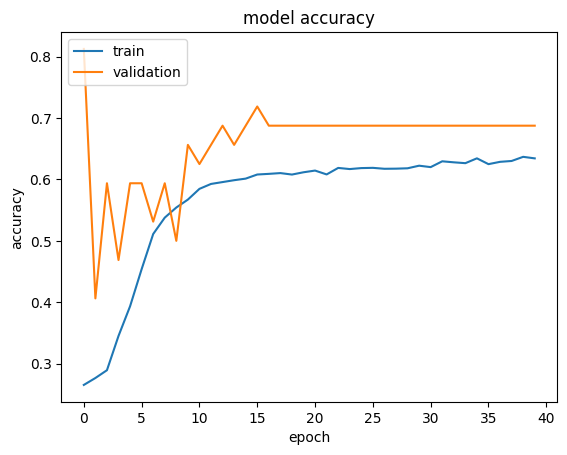

In [63]:
plt.plot(history_complex.history["accuracy"])
plt.plot(history_complex.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on Test Set**


In [64]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_complex.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.7947 - accuracy: 0.6250

4/4 [==============================] - 0s 4ms/step - loss: 0.7430 - accuracy: 0.6484


Loss: 0.7430280447006226, Accuracy: 0.6484375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.77      0.62      0.69        32
     neutral       0.55      0.66      0.60        32
         sad       0.50      0.56      0.53        32
    surprise       0.86      0.75      0.80        32

    accuracy                           0.65       128
   macro avg       0.67      0.65      0.65       128
weighted avg       0.67      0.65      0.65       128



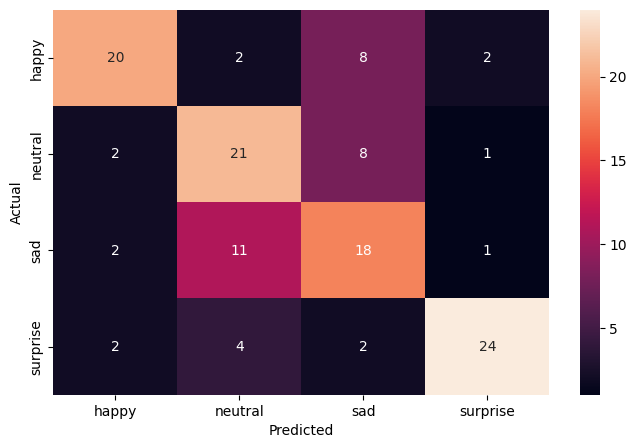

In [65]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


### **Plotting the Confusion Matrix for the chosen final model**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


              precision    recall  f1-score   support

       happy       0.77      0.62      0.69        32
     neutral       0.55      0.66      0.60        32
         sad       0.50      0.56      0.53        32
    surprise       0.86      0.75      0.80        32

    accuracy                           0.65       128
   macro avg       0.67      0.65      0.65       128
weighted avg       0.67      0.65      0.65       128



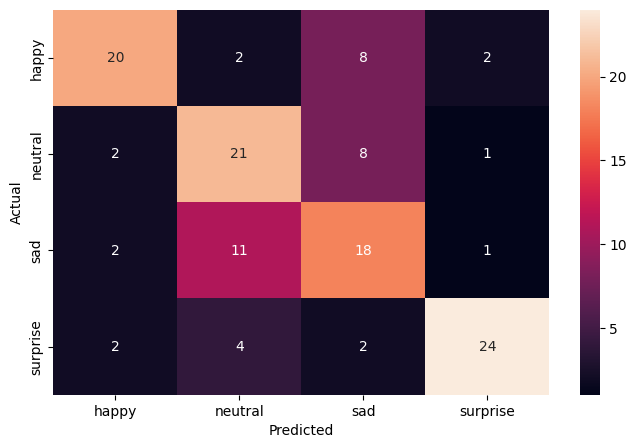

In [66]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


## **Conclusion:\*\***\_\_\_\_**\*\***


### **Insights**

### **Refined insights**:

- What are the most meaningful insights from the data relevant to the problem?

### **Comparison of various techniques and their relative performance**:

- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

### **Proposal for the final solution design**:

- What model do you propose to be adopted? Why is this the best solution to adopt?
